In [1]:
#!/usr/bin/env python3
## import libraries
import numpy as np
import pandas as pd
from keras.models import load_model
from keras.preprocessing import sequence
import matplotlib.pyplot as plt
import tensorflow as tf

Using TensorFlow backend.
/home/lab606a/.virtualenvs/keras/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/lab606a/.virtualenvs/keras/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/lab606a/.virtualenvs/keras/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/lab606a/.virtualenvs

In [2]:
# set GPU memory
gpu_options = tf.GPUOptions(allow_growth=True)
sess = tf.Session(config=tf.ConfigProto(gpu_options=gpu_options))

In [3]:
dataset = pd.read_csv("/home/lab606a/Documents/20200331/fixed/8classes/datasets/split by random for distributed/prediction/top5_test.csv", header=None)
dataset = dataset.fillna(0)
dataset

,0,1,2,3,4,5,6,7,8,9,...,119,120,121,122,123,124,125,126,127,128
0,75.2830,299.459,41.6988,75.4644,288.210,43.4427,75.3854,277.493,44.8577,75.2990,...,0.0000,0.000,0.0000,0.0000,0.0,0.0,0.0,0.0,0.0,0.0
1,74.9896,295.451,41.0293,74.9101,283.206,41.9540,74.8257,270.301,42.7924,74.7674,...,0.0000,0.000,0.0000,0.0000,0.0,0.0,0.0,0.0,0.0,0.0
2,75.0137,297.689,43.2736,75.1920,285.106,45.4422,74.8790,275.756,46.8650,74.8074,...,0.0000,0.000,0.0000,0.0000,0.0,0.0,0.0,0.0,0.0,0.0
3,75.5798,303.650,41.8346,75.7670,293.558,43.6393,76.1885,282.600,45.3117,76.3425,...,32.6372,0.000,0.0000,0.0000,0.0,0.0,0.0,0.0,0.0,0.0
4,74.7231,293.771,42.3289,74.4043,282.875,43.2731,74.0996,272.446,44.1780,73.8012,...,0.0000,0.000,0.0000,0.0000,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,75.2851,299.201,42.7806,75.4577,286.433,45.4912,75.6297,275.777,47.1020,75.5593,...,39.8307,0.000,0.0000,0.0000,0.0,0.0,0.0,0.0,0.0,0.0
246,74.7375,296.731,41.3489,74.6665,284.269,43.0513,74.6040,273.856,43.7017,74.2979,...,0.0000,0.000,0.0000,0.0000,0.0,0.0,0.0,0.0,0.0,0.0
247,75.5807,303.520,42.3798,75.5200,294.588,45.0282,75.6943,283.464,47.1932,75.8599,...,31.6466,75.188,-47.7145,31.6709,0.0,0.0,0.0,0.0,0.0,0.0
248,75.0118,297.871,42.4674,75.1995,286.638,44.4497,75.3682,274.657,46.2875,75.2844,...,0.0000,0.000,0.0000,0.0000,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
dataset = np.array(dataset)
dataset.shape

(250, 129)

In [5]:
np.set_printoptions(suppress=True)

In [6]:
#!/usr/bin/env python3
import rospy
from std_msgs.msg import Float32MultiArray
import numpy as np
import pandas as pd
import cupy as cp
from keras.models import load_model
from keras.preprocessing import sequence
import tensorflow as tf
import matplotlib.pyplot as plt
import sys

graph = tf.get_default_graph()

# set GPU memory
gpu_options = tf.GPUOptions(allow_growth=True)
sess = tf.Session(config=tf.ConfigProto(gpu_options=gpu_options))

np.set_printoptions(suppress=True)

class Listener:
    def __init__(self):
        self.__time_step = 9
        self.__tmp = cp.zeros([1,3])
        self.__arr_classification = cp.zeros([1,90])
        self.__vis_point = cp.zeros((1,3))
        self.__vis_balls = cp.zeros((self.__time_step,3))
        self.__vis_balls2 = cp.zeros((1,4))
        self.__predction_balls = cp.zeros((1,self.__time_step,3))
        self.__arr_prediction = cp.zeros([1,self.__time_step*3])
        self.__arr_pred_possible = cp.zeros((1,4))
        self.__diff = cp.zeros([1,3])
        self.__padding_done = False
        self.__cnt = 1
        self.__num = 1
        self.__max_index = 0
        self.traj_done = False
        self.__coor = -10*cp.ones(6)
        self.__find_possible_point = False
        self.__cal_possible_point = False
        self.__vis_possible_point = False
        self.__vis_hitting_point = cp.zeros((1,4))
        self.__hitting_point = -45
        self.__hitting_timimg = 0
        self.__possible_point = cp.zeros((1,4))
        self.__pred = cp.zeros([1,self.__time_step,3])
        self.__pred_for_offline = cp.zeros([1,self.__time_step,3])
        self.__time = 0.016667
        self.__delta_T = 0.016667
        self.__anchor = 0
        self.__rowww = 0
        self.__direction = 'top5'
        self.fig, self.ax = plt.subplots(2,2, figsize=(10.24,7.2))
        self.__csv_path = '/home/lab606a/catkin_ws/src/pointcloud/offline/'
        self.__model = load_model('/home/lab606a/catkin_ws/src/pointcloud/models/60hz_culstm/prediction_top6')
        self.__classifier = load_model('/home/lab606a/catkin_ws/src/pointcloud/models/60hz_culstm/classification_30ball_20200505_256to8')
        rospy.loginfo("loaded classification model")
        self.__pred_top5 = load_model('/home/lab606a/catkin_ws/src/pointcloud/models/60hz_culstm/prediction_top5')
        self.__pred_top6 = load_model('/home/lab606a/catkin_ws/src/pointcloud/models/60hz_culstm/prediction_top6')
        rospy.loginfo("loaded top prediction model")
        self.__pred_left5 = load_model('/home/lab606a/catkin_ws/src/pointcloud/models/60hz_culstm/prediction_left5')
        self.__pred_left6 = load_model('/home/lab606a/catkin_ws/src/pointcloud/models/60hz_culstm/prediction_left6')
        rospy.loginfo("loaded left prediction model")
        self.__pred_right5 = load_model('/home/lab606a/catkin_ws/src/pointcloud/models/60hz_culstm/prediction_right5')
        self.__pred_right6 = load_model('/home/lab606a/catkin_ws/src/pointcloud/models/60hz_culstm/prediction_right6')
        rospy.loginfo("loaded right prediction model")
        self.__pred_back5 = load_model('/home/lab606a/catkin_ws/src/pointcloud/models/60hz_culstm/prediction_back5')
        self.__pred_back6 = load_model('/home/lab606a/catkin_ws/src/pointcloud/models/60hz_culstm/prediction_back6')
        rospy.loginfo("loaded back prediction model")
        rospy.loginfo("Load fixed model")

    ## print spin direction and speed
    def top5(self):
        print("top spin speed 5")
        self.__model = self.__pred_top5
        self.__direction = '_top5'

    def top6(self):
        print("top spin speed 6")
        self.__model = self.__pred_top6
        self.__direction = '_top6'

    def left5(self):
        print("left spin speed 5")
        self.__model = self.__pred_left5
        self.__direction = '_left5'

    def left6(self):
        print("left spin speed 6")
        self.__model = self.__pred_left6
        self.__direction = '_left6'

    def right5(self):
        print("right spin speed 5")
        self.__model = self.__pred_right5
        self.__direction = '_right5'

    def right6(self):
        print("right spin speed 6")
        self.__model = self.__pred_right6
        self.__direction = '_right6'

    def back5(self):
        print("back spin speed 5")
        self.__model = self.__pred_back5
        self.__direction = '_back5'

    def back6(self):
        print("back spin speed 6")
        self.__model = self.__pred_back6
        self.__direction = '_back6'

    def append_pred(self): ## Exhaustive
        with graph.as_default():
            self.__pred = cp.array(self.__model.predict(cp.asnumpy(self.__arr_prediction.reshape(1,self.__time_step,3)), verbose=1))
        while not self.__find_possible_point == True:
            self.__pred = cp.array(self.__pred)
            if ( -50 < float(cp.min(self.__pred[self.__pred.shape[0]-1,:,:])) < -40): ## find possible hitting point
                index = cp.argmin(self.__pred[self.__pred.shape[0]-1,:,:])
                row = int((index-1)/3)
                count_down = row + (self.__pred.shape[0]-1)*9
                self.__find_possible_point = True
                self.__anchor = self.__pred.shape[0]-1
                print("count down = ", int(count_down))
                #index = cp.argmin(self.__anchor[self.__anchor,:,:])
                #row = int((index-1)/3)
                self.__pred[self.__anchor, row+1:, :] = 0
                self.__pred_for_offline = self.__pred

            else: ## predict next time step
                self.__pred = cp.vstack((self.__pred, cp.zeros([1,self.__time_step,3])))
                with graph.as_default():
                    self.__pred[self.__pred.shape[0]-1,:,:] = cp.array(self.__model.predict(cp.asnumpy(self.__pred[self.__pred.shape[0]-2,:,:].reshape(1,self.__time_step,3)), verbose=1)).reshape(self.__time_step,3)
                if (self.__pred.shape[0] >= 8):
                    self.__pred = cp.zeros([1,self.__time_step,3])
                    self.__find_possible_point = True
                
    def update_prediction(self):
        with graph.as_default():
            self.__pred[0,:,:] = cp.array(self.__model.predict(cp.asnumpy(self.__arr_prediction.reshape(1,self.__time_step,3)), verbose=1)).reshape(self.__time_step,3)
            for i in range(1, self.__pred.shape[0]):
                self.__pred[i,:,:] = cp.array(self.__model.predict(cp.asnumpy(self.__pred[i-1,:,:].reshape(1,self.__time_step,3)), verbose=1)).reshape(self.__time_step,3)
            '''
            index = cp.argmin(self.__pred[self.__anchor,:,:])
            row = int((index-1)/3)
            if (row < 8):
                self.__pred[self.__anchor, row+1:, :] = 0
            if (self.__anchor != self.__pred.shape[0]-1):
                self.__pred[self.__anchor+1:, :, :] = 0
            if (self.__anchor == 0) and ( -10 < float(cp.min(self.__pred[self.__anchor,0,:])) < 10):
                self.__pred[self.__anchor,0,:] = 0
            '''
            #self.__pred_for_offline = cp.vstack((self.__pred_for_offline, self.__pred))
            

    def modify(self):
        #index = cp.argmin(self.__pred[self.__anchor,:,:])
        #row = int((index-1)/3)
        if (self.__rowww < 8):
            self.__pred[self.__anchor, self.__rowww+1:, :] = 0
        if (self.__anchor != self.__pred.shape[0]-1):
            self.__pred[self.__anchor+1:, :, :] = 0
        if (self.__anchor == 0) and (self.__rowww == 0) and ( -10 < float(cp.min(self.__pred[self.__anchor,0,:])) < 10):
            self.__pred[self.__anchor,0,:] = 0
        self.__pred_for_offline = cp.vstack((self.__pred_for_offline, self.__pred))

    def calculate_hitting_point(self, arr):
        #print("cnt = ", self.__cnt)
        arr = cp.array(arr)
        self.__cal_possible_point = False
        while not self.__cal_possible_point == True:
            print(arr[self.__anchor,:,:])
            if (-55 <= float(cp.min(arr[self.__anchor,:,:])) <= -35) and (self.__anchor >= 0):
                #print("anchor = ", self.__anchor)
                index = cp.argmin(arr[self.__anchor,:,:])
                row = int((index-1)/3)
                self.__rowww = row
                if (-55 <= float(cp.min(arr[self.__anchor,:,:])) <= -45): ## interpolation
                    index = cp.argmin(arr[self.__anchor,:,:])
                    row = int((index-1)/3)
                    self.__rowww = row
                    count_down = row + self.__anchor*9
                    print("count down = ", count_down)
                    if (row == 0):
                        print("case a1")
                        self.__vis_point = cp.array(self.__vis_point)
                        w1 = (self.__hitting_point-self.__vis_point[:,1]) / (arr[self.__anchor,row,1]-self.__vis_point[:,1])
                        self.__possible_point = w1*arr[self.__anchor,row,:] + (1-w1)*self.__vis_point.reshape(1,1,3)
                        self.__hitting_timimg = self.__time + (w1+count_down)*self.__delta_T
                        self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))

                        #w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / (arr[self.__anchor,row,1]-arr[self.__anchor-1,self.__time_step-1,1])
                        #self.__possible_point = w1*arr[self.__anchor-1,self.__time_step-1,:] + (1-w1)*arr[self.__anchor,row,:]
                        #self.__hitting_timimg = self.__time + (w1+count_down)*self.__delta_T
                        #self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                        print("hitting timing and position = ", self.__possible_point)
                    else:
                        print("case a2")
                        w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / (arr[self.__anchor,row,1]-arr[self.__anchor,row-1,1])
                        self.__possible_point = w1*arr[self.__anchor,row-1,:] + (1-w1)*arr[self.__anchor,row,:]
                        self.__hitting_timimg = self.__time + (w1+count_down)*self.__delta_T
                        self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                        print("hitting timing and position = ", self.__possible_point)
                elif (-45 < float(cp.min(arr[self.__anchor,:,:])) <= -40):
                    index = cp.argmin(arr[self.__anchor,:,:])
                    row = int((index-1)/3)
                    self.__rowww = row
                    count_down = row + self.__anchor*9
                    print("count down = ", count_down)
                    if (row == 0):
                        print("case b1")
                        if (self.__diff[:,1] > 0):
                            w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / self.__diff[:,1]
                            if w1 < 1:
                                self.__possible_point = arr[self.__anchor,row,:] - w1*self.__diff
                                self.__hitting_timimg = self.__time + (count_down+1+w1)*self.__delta_T
                                self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                                print("hitting timing and position = ", self.__possible_point)
                    else:
                        print("case b2")
                        self.__diff = arr[self.__anchor,row-1,:]-arr[self.__anchor,row,:]
                        self.__diff = self.__diff.reshape(1,3)
                        w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / self.__diff[:,1]
                        if w1 < 1:
                            self.__possible_point = arr[self.__anchor,row,:] - w1*self.__diff
                            self.__hitting_timimg = self.__time + (count_down+1+w1)*self.__delta_T
                            self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                            print("hitting timing and position = ", self.__possible_point)
                else:
                    self.__possible_point = self.__possible_point

                self.__cal_possible_point = True
                #self.pub_prediction()
                '''
                if (row < 8):
                    arr[self.__anchor, row+1:, :] = 0
                if (self.__anchor != self.__pred.shape[0]-1):
                    arr[self.__anchor+1:, :, :] = 0
                if (self.__anchor == 0) and ( -10 < float(cp.min(arr[self.__anchor,0,:])) < 10):
                    arr[self.__anchor,0,:] = 0
                '''
                #self.__pred_for_offline = cp.vstack((self.__pred_for_offline, arr))
                #self.__cnt += 1
                if (self.__arr_pred_possible.shape[0] == 1) and (int(self.__arr_pred_possible[0,2]) == 0):
                    self.__arr_pred_possible = self.__possible_point.reshape(1,4)
                else:
                    self.__arr_pred_possible = cp.vstack((self.__arr_pred_possible, self.__possible_point.reshape(1,4)))
            else:
                if ((self.__anchor-1) >= 0) and (abs(float(cp.min(arr[self.__anchor,:,:]))-self.__hitting_point) >= 22.5):
                    self.__anchor = self.__anchor -1
                    #print("case c1")
                else:
                    self.__cal_possible_point = True

    def calculate_vis_hitting_point(self):
        if (-50 <= float(cp.min(self.__vis_balls2)) <= -45):
            index = cp.argmin(self.__vis_balls2)
            row = int((index-1)/4)
            w1 = (self.__vis_balls2[row,2]-self.__hitting_point) / (self.__vis_balls2[row,2]-self.__vis_balls2[row-1,2])
            self.__vis_hitting_point = (1-w1)*self.__vis_balls2[row,:] + w1*self.__vis_balls2[row-1,:]
        elif (-45 < float(cp.min(self.__vis_balls2)) < -40):
            index = cp.argmin(self.__vis_balls2)
            row = int((index-1)/4)
            w1 = (self.__vis_balls2[row,2]-self.__hitting_point) / (self.__vis_balls2[row-1,2]-self.__vis_balls2[row,2])
            self.__vis_hitting_point = self.__vis_balls2[row,:] - w1*(self.__vis_balls2[row-1,:]-self.__vis_balls2[row,:])
        print("vis hitting point = ", self.__vis_hitting_point)


    def show_spin_direction(self, max_index):
        ## make dictionary to replace switch case
        dictionary = {0:self.top5, 1:self.top6, 2:self.left5, 3:self.left6, 4:self.right5, 5:self.right6, 6:self.back5, 7:self.back6}
        funcToCall = dictionary[max_index]
        funcToCall()

        if (self.__pred.shape[0] == 1):
            self.append_pred() ## Exhaustive
        elif (self.__pred.shape[0] > 1):
            self.update_prediction() ## update prediction result
            self.calculate_hitting_point(self.__pred) ## calculate hitting timimg and hitting point
            self.modify()

    def classification(self):
        ## call classifier
        with graph.as_default():
            classes = self.__classifier.predict(cp.asnumpy(self.__arr_classification.reshape(1,30,3)), verbose=1)
        ## figure out which direction is
        self.__max_index = np.argmax(classes)
        #print("number of input balls = ", self.__cnt)
        ## show result
        if (self.__cnt >= 9):
            self.show_spin_direction(self.__max_index)
        #self.__cnt += 1

    def padding(self):
        # if __tmp is empty, init array
        if (self.__padding_done == False):
            self.__tmp = self.__vis_point ## pad first point
            self.__padding_done = True
            self.__vis_balls = self.__vis_point.reshape(1,3)
        else:
        # if __tmp is not empty, then filled array
            self.__tmp = cp.hstack((self.__tmp, self.__vis_point))
            self.__vis_balls = cp.vstack((self.__vis_balls, self.__vis_point))
            if (self.__tmp.shape[1] == 15): ## when colect 5 balls
                self.__arr_classification[:,:self.__tmp.shape[1]] = self.__tmp ## asigne to classification input array
            if (self.__tmp.shape[1] == 27):
                #self.__vis_balls = self.__tmp.reshape(1,self.__time_step,3)
                self.__arr_prediction[:,:] = self.__tmp ## for predct next 5 steps
            if (self.__tmp.shape[1] > 27): ## when colect over 5 balls
                #self.__vis_balls = cp.vstack((self.__vis_balls, self.__tmp[:,self.__tmp.shape[1]-(self.__time_step*3):].reshape(1,self.__time_step,3))) ## visual measurement point for calculate error
                self.__arr_prediction[:,:] = self.__tmp[:,self.__tmp.shape[1]-(self.__time_step*3):] ## rolling visual measurement for predct next 5 steps
                if (self.__tmp.shape[1] <= 90): ## when colect under 31 balls
                    self.__arr_classification[:,:self.__tmp.shape[1]] = self.__tmp ## still asigne to classification input array

    def save_data(self):
        visurement_balls = cp.asnumpy(self.__vis_balls)
        pred_trajs = cp.asnumpy(self.__pred_for_offline.reshape(self.__pred_for_offline.shape[0]*self.__pred_for_offline.shape[1], self.__pred_for_offline.shape[2]))

        df_vis = pd.DataFrame(data=visurement_balls)
        df_pred = pd.DataFrame(data=pred_trajs)

        vis_name = self.__csv_path + 'visurement' + str(self.__num) + '.csv'
        pred_name = self.__csv_path + 'prediction' + str(self.__num) + '.csv'

        df_vis.to_csv(vis_name, header=0, index=0)
        df_pred.to_csv(pred_name, header=0, index=0)

    def final_padding(self):
        for i in range((self.__time_step-1)): ## padding zeros 4 times
            print("Time = ", self.__time)
            print("visual measurement = ", self.__vis_point)
            self.__tmp = cp.asnumpy(self.__tmp)
            self.__tmp = sequence.pad_sequences(self.__tmp, maxlen=(self.__tmp.shape[1]+3), padding='post', dtype='float32')
            self.__tmp = cp.array(self.__tmp)

            self.__vis_balls = cp.vstack((self.__vis_balls, self.__tmp[:,self.__tmp.shape[1]-(self.__time_step*3):].reshape(1,self.__time_step,3)))
            self.__arr_prediction[:,:] = self.__tmp[:,self.__tmp.shape[1]-(self.__time_step*3):] ## rolling visual measurement for predct next 5 steps
            self.show_spin_direction(self.__max_index) ## predct next 5 steps
            self.__time += self.__delta_T
            
    def predict_traj(self):
        #self.__model = self.__prediction_model

        if (self.__pred.shape[0] == 1):
            self.append_pred() ## Exhaustive
        elif (self.__pred.shape[0] > 1):
            self.update_prediction() ## update prediction result
            self.calculate_hitting_point(self.__pred) ## calculate hitting timimg and hitting point
            self.modify()
            
    def modify_offline_plot(self, tmp):
        arr = np.array([0,0,0,0])
        for i in range (tmp.shape[0]):
            if i % 2 != 0:
                arr = np.vstack((arr, tmp[i,:]))
        return arr[1:,:]

    def plot_res(self):
        self.__arr_pred_possible = cp.round_(self.__arr_pred_possible, 4)
        self.__vis_hitting_point = cp.round_(self.__vis_hitting_point, 4)
        
        self.__arr_pred_possible = self.modify_offline_plot(self.__arr_pred_possible)
        #self.__vis_hitting_point = self.modify_offline_plot(self.__vis_hitting_point)

        update_times = cp.linspace(1, self.__arr_pred_possible.shape[0], self.__arr_pred_possible.shape[0])
        t = self.__arr_pred_possible[:,0]
        x = self.__arr_pred_possible[:,1]
        z = self.__arr_pred_possible[:,3]
        Euclidean_vis = cp.sqrt(cp.sum(cp.power(self.__vis_hitting_point[1:],2)))
        Euclidean_pred = cp.sqrt(cp.sum(cp.power(self.__arr_pred_possible[:,1:],2), axis=1))

        plt.figure(figsize=(8,7))
        

        ## plot hitting timing
        plt.clf()
        #plt.subplot(4,2,1)
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[0]), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(t), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(t), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Hitting timimg (sec)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and hitting timing', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = './exp20200601/' + str(self.__num) + '_timing' + '.png'
        plt.savefig(name)

        plt.clf()
        #plt.subplot(4,2,2)
        err = cp.abs((t-self.__vis_hitting_point[0])*1000)
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Hitting timimg error (ms)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and hitting timing error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = './exp20200601/' + str(self.__num) + '_timing_error' + '.png'
        plt.savefig(name)

        ## plot Euclidean distance
        plt.clf()
        #plt.subplot(4,2,3)
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*Euclidean_vis), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(Euclidean_pred), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(Euclidean_pred), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Euclidean distance (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Euclidean distance', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = './exp20200601/' + str(self.__num) + '_distance' + '.png'
        plt.savefig(name)

        plt.clf()
        #plt.subplot(4,2,4)
        err = cp.abs((Euclidean_pred-Euclidean_vis))
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Euclidean distance error (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Euclidean distance error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = './exp20200601/' + str(self.__num) + '_distance_error' + '.png'
        plt.savefig(name)

        ## plot x coordinate
        plt.clf()
        #plt.subplot(4,2,5)
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[1]), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(x), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(x), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('X-coordinate (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and X-coordinate', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = './exp20200601/' + str(self.__num) + '_X-coordinate' + '.png'
        plt.savefig(name)

        plt.clf()
        #plt.subplot(4,2,6)
        err = cp.abs((x-self.__vis_hitting_point[1]))
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('X-coordinate error (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and X-coordinate error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = './exp20200601/' + str(self.__num) + '_X-coordinate_error' + '.png'
        plt.savefig(name)

        ## plot z coordinate
        plt.clf()
        #plt.subplot(4,2,7)
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[3]), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(z), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(z), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Z-coordinate (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Z-coordinate', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = './exp20200601/' + str(self.__num) + '_Z-coordinate' + '.png'
        plt.savefig(name)

        plt.clf()
        #plt.subplot(4,2,8)
        err = cp.abs((z-self.__vis_hitting_point[3]))
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Z-coordinate error (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Z-coordinate error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = './exp20200601/' + str(self.__num) + '_Z-coordinate_error' + '.png'
        plt.savefig(name)
        
        #plt.show()
    
    def plot_error(self):
        self.ax[0,0].remove()
        self.ax[0,1].remove()
        self.ax[1,0].remove()
        self.ax[1,1].remove()
        #self.fig.clf()
        self.__arr_pred_possible = cp.round_(self.__arr_pred_possible, 4)
        self.__vis_hitting_point = cp.round_(self.__vis_hitting_point, 4)
        #self.__vis_hitting_point = self.__vis_hitting_point.reshape(1,self.__vis_hitting_point.shape[0])

        update_times = cp.linspace(1, self.__arr_pred_possible.shape[0], self.__arr_pred_possible.shape[0])
        t = self.__arr_pred_possible[:,0]
        x = self.__arr_pred_possible[:,1]
        z = self.__arr_pred_possible[:,3]
        Euclidean_vis = cp.sqrt(cp.sum(cp.power(self.__vis_hitting_point[1:],2)))
        Euclidean_pred = cp.sqrt(cp.sum(cp.power(self.__arr_pred_possible[:,1:],2), axis=1))
        
        #fig, ax = plt.subplots(2,2, figsize=(10.24,7.2))
        
        self.fig, self.ax = plt.subplots(2,2, figsize=(12.0,10.0)) ##(10.24,7.2)

        self.ax[0,0].plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[0]), color='green')
        self.ax[0,0].plot(cp.asnumpy(update_times), cp.asnumpy(t), color='blue')
        self.ax[0,0].scatter(cp.asnumpy(update_times), cp.asnumpy(t), color='blue')
        self.ax[0,0].grid(True)
        self.ax[0,0].set_xlabel('update times')
        self.ax[0,0].set_ylabel('hitting timimg (sec)')
        self.ax[0,0].set_title('Hitting timimg')

        self.ax[0,1].plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*Euclidean_vis), color='green')
        self.ax[0,1].plot(cp.asnumpy(update_times), cp.asnumpy(Euclidean_pred), color='blue')
        self.ax[0,1].scatter(cp.asnumpy(update_times), cp.asnumpy(Euclidean_pred), color='blue')
        self.ax[0,1].grid(True)
        self.ax[0,1].set_xlabel('update times')
        self.ax[0,1].set_ylabel('Euclidean distance (cm)')
        self.ax[0,1].set_title('Euclidean distance')

        self.ax[1,0].plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[1]), color='green')
        self.ax[1,0].plot(cp.asnumpy(update_times), cp.asnumpy(x), color='blue')
        self.ax[1,0].scatter(cp.asnumpy(update_times), cp.asnumpy(x), color='blue')
        self.ax[1,0].grid(True)
        self.ax[1,0].set_xlabel('update times')
        self.ax[1,0].set_ylabel('X-coordinate (cm)')
        self.ax[1,0].set_title('X-coordinate')

        self.ax[1,1].plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[3]), color='green')
        self.ax[1,1].plot(cp.asnumpy(update_times), cp.asnumpy(z), color='blue')
        self.ax[1,1].scatter(cp.asnumpy(update_times), cp.asnumpy(z), color='blue')
        self.ax[1,1].grid(True)
        self.ax[1,1].set_xlabel('update times')
        self.ax[1,1].set_ylabel('Z-Coordinate (cm)')
        self.ax[1,1].set_title('Z-Coordinate')

        '''
        #plt.clf()
        plt.figure(figsize=(10.24,7.2))
        plt.subplot(2,2,1)
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[0]), color='green')
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(t), color='blue')
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(t), color='blue')
        plt.grid(True)
        plt.xlabel('update times')
        plt.ylabel('hitting timimg')
        
        plt.subplot(2,2,2)
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*Euclidean_vis), color='green')
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(Euclidean_pred), color='blue')
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(Euclidean_pred), color='blue')
        plt.grid(True)
        plt.xlabel('update times')
        plt.ylabel('Euclidean distance')
        
        plt.subplot(2,2,3)
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[1]), color='green')
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(x), color='blue')
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(x), color='blue')
        plt.grid(True)
        plt.xlabel('update times')
        plt.ylabel('Coordinate X')

        plt.subplot(2,2,4)
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[3]), color='green')
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(z), color='blue')
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(z), color='blue')
        plt.grid(True)
        plt.xlabel('update times')
        plt.ylabel('Coordinate Z')

        #plt.pause(0.00000000001)
        plt.show()
        '''
        #name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + self.__direction + str(rospy.get_time()) + '.png'
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + self.__direction + '.png'
        
        #self.fig.savefig(name)

        #self.fig.pause(0.001)
        #plt.savefig(name)
        #plt.clf()
        
        #self.fig.clf()
        #self.ax[0,0].remove()
        #self.ax[0,1].remove()
        #self.ax[1,0].remove()
        #self.ax[1,1].remove()


        #self.fig.clf()
        self.fig.show()
        
    def return_vis_point(self):
        return self.__vis_hitting_point
    
    def return_pred_res(self):
        return self.__arr_pred_possible
    
    def reset_arr_pred(self):
        self.__arr_pred_possible = cp.zeros((1,4))
        
    def reset_args(self):
        self.__padding_done = False
        self.__arr_classification = cp.zeros([1,90])
        self.__coor = -10*cp.ones(6)
        self.__vis_balls = cp.zeros((self.__time_step,3))
        self.__cnt = 1
        self.__pred = cp.zeros([1,self.__time_step,3])
        self.__vis_balls2 = cp.zeros((1,4))
        self.__arr_pred_possible = cp.zeros((1,4))
        self.__find_possible_point = False
        self.__vis_possible_point = False
        self.__pred_for_offline = cp.zeros([1,self.__time_step,3])
        self.__time = 0.016667 ## reset time
        self.traj_done = False
    
    def print_arr_pred(self):
        print(self.__arr_pred_possible)
        return self.__arr_pred_possible
        
    def return_plot_arg(self):
        return self.__arr_pred_possible, self.__vis_hitting_point, cp.linspace(1, self.__arr_pred_possible.shape[0], self.__arr_pred_possible.shape[0]), self.__arr_pred_possible[:,0], self.__arr_pred_possible[:,1], self.__arr_pred_possible[:,3], cp.sqrt(cp.sum(cp.power(self.__vis_hitting_point[1:],2))), cp.sqrt(cp.sum(cp.power(self.__arr_pred_possible[:,1:],2), axis=1))

    def assigne(self, visss):
        #a = data.data
        self.__vis_point = cp.array(visss).reshape(1,3)
        #print(self.__vis_point)

        if (-50 < self.__vis_point[:,1] < -30):
            tmp = cp.hstack((self.__time, self.__vis_point.reshape(3,)))
            if self.__vis_possible_point == False:
                self.__vis_balls2 = tmp.reshape(1,4)
                self.__vis_possible_point = True
            else:
                self.__vis_balls2 = cp.vstack((self.__vis_balls2, tmp.reshape(1,4)))


        if self.traj_done == False:
            print("\nTime = ", self.__time) ## show current time
            print("visual measurement = ", self.__vis_point) ## show visual measurement coordinate
            self.padding() ## colect 5 balls
            
            if ((self.__tmp.shape[1] >= 15) and (self.__tmp.shape[1] <= 90)): ## while colect balls over 5 balls and under 30 balls
                self.classification() ## doing classification and prediction
            if (self.__tmp.shape[1] > 90): ## while colect balls over 30 balls, stop doing classification
                self.show_spin_direction(self.__max_index) ## skip classification doing prediction
            
            if (self.__tmp.shape[1] >= 27):
                self.predict_traj()
            #self.for_ttbot()
            self.__time += self.__delta_T
            self.__cnt += 1
            
        else:
            #print("aaaaa")
            if (self.__padding_done == True):
                self.calculate_vis_hitting_point()
                print("pred hitting point = \n", self.__arr_pred_possible)
                #if (self.__pred_for_offline.shape[0] != 1):
                #self.plot_error()
                #self.plot_res()
                    #self.save_data()
                self.__num += 1

            
            self.__padding_done = False
            self.__arr_classification = cp.zeros([1,90])
            self.__coor = -10*cp.ones(6)
            self.__vis_balls = cp.zeros((self.__time_step,3))
            self.__cnt = 1
            self.__pred = cp.zeros([1,self.__time_step,3])
            self.__vis_balls2 = cp.zeros((1,4))
            #self.__arr_pred_possible = cp.zeros((1,4))
            self.__find_possible_point = False
            self.__vis_possible_point = False
            self.__pred_for_offline = cp.zeros([1,self.__time_step,3])
            self.__time = 0.016667 ## reset time
            self.traj_done = False
            

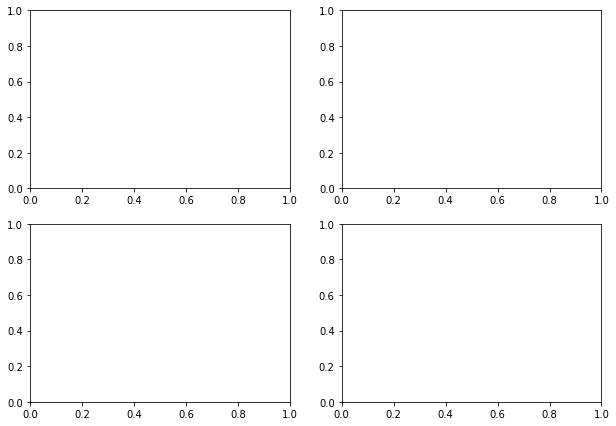

In [7]:
obj = Listener()

In [ ]:
arr_for_vis = np.array([0,0,0,0])
arr_for_pred_3rd = np.array([0,0,0,0])
arr_for_pred_end = np.array([0,0,0,0])

obj.reset_args()

for i in range(0,250):
    trajectory = dataset[i,:]
    trajectory = trajectory.reshape(1,trajectory.shape[0])
    #trajectory = sequence.pad_sequences(trajectory, maxlen=trajectory.shape[1]+27, padding='post', dtype='float32')
    trajectory = trajectory.reshape(trajectory.shape[1],)
    for j in range(0, trajectory.shape[0], 3):
        obj.assigne(trajectory[j:j+3].reshape(1,3))
    #obj.traj_done = True
    
    
    obj.traj_done = True
    obj.assigne(np.array([0,0,0]))
    vis_arr = obj.return_vis_point()
    pred_arr = obj.return_pred_res()
    #print("")
    #print("vis from obj = \n", vis_arr)
    #print("pred from obj = \n", pred_arr)
    #arr_for_vis = np.vstack((arr_for_vis, vis_arr))
    
    if pred_arr.shape[0] > 20:
        arr_for_vis = np.vstack((arr_for_vis, vis_arr))
        arr_for_pred_3rd = np.vstack((arr_for_pred_3rd, pred_arr[2,:]))
        arr_for_pred_end = np.vstack((arr_for_pred_end, pred_arr[(pred_arr.shape[0]-10),:]))
    
    obj.reset_arr_pred()
    
print("error between vis and 3 = \n", arr_for_vis-arr_for_pred_3rd)
print("error between vis and end-10 = \n", arr_for_vis-arr_for_pred_end)


Time =  0.016667
visual measurement =  [[ 75.283  299.459   41.6988]]

Time =  0.033334
visual measurement =  [[ 75.4644 288.21    43.4427]]

Time =  0.050001000000000004
visual measurement =  [[ 75.3854 277.493   44.8577]]

Time =  0.066668
visual measurement =  [[ 75.299  266.115   45.6599]]

Time =  0.083335
visual measurement =  [[ 75.4555 255.319   46.1779]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.388  247.315   46.0656]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.3041 237.401   45.8659]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 75.4302 225.87    45.5801]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 75.1275 216.864   44.7457]]
1/1 [==============================] - 0s 2ms/step
top spin speed 6
1/1 [==============================] - 0s 954us/step
co

top spin speed 5
1/1 [==============================] - 0s 854us/step
[[ 74.05613708   2.17604828  29.99407005]
 [ 73.8669281   -6.19502258  31.06056976]
 [ 73.68946838 -14.17623901  31.88083649]
 [ 73.69104004 -22.6166153   32.48331451]
 [ 73.53585052 -30.68806458  32.70903778]
 [ 73.43463135 -38.75350952  32.65615082]
 [ 73.34269714 -46.82671356  32.29725647]
 [  0.08998108  -0.0514679   -0.00832558]
 [ -0.01905441   0.14290237   0.07248497]]
count down =  24
case a2
hitting timing and position =  [  0.63711722  73.36349898 -45.          32.37846304]
1/1 [==============================] - 0s 743us/step
[[ 74.05613708   2.17604828  29.99407005]
 [ 73.8669281   -6.19502258  31.06056976]
 [ 73.68946838 -14.17623901  31.88083649]
 [ 73.69104004 -22.6166153   32.48331451]
 [ 73.53585052 -30.68806458  32.70903778]
 [ 73.43463135 -38.75350952  32.65615082]
 [ 73.34269714 -46.82671356  32.29725647]
 [  0.08998108  -0.0514679   -0.00832558]
 [ -0.01905441   0.14290237   0.07248497]]
count dow

hitting timing and position =  [  0.6358208   73.7576265  -45.          30.87622598]
1/1 [==============================] - 0s 881us/step
[[ 73.61668396 -37.88404846  31.07071304]
 [ 73.78220367 -46.24085999  30.84231186]
 [  0.0201683    0.07672501  -0.0933094 ]
 [ -0.04206085  -0.00344849  -0.00029755]
 [  0.03205109  -0.03380203  -0.02036858]
 [  0.02110291  -0.02353287  -0.00675392]
 [  0.02043152  -0.02532196   0.00358963]
 [  0.02245331  -0.03725052   0.00653458]
 [  0.09715271  -0.00727081   0.06999016]]
count down =  19
case a2
hitting timing and position =  [  0.6358208   73.7576265  -45.          30.87622598]

Time =  0.33333999999999986
visual measurement =  [[ 74.4554 114.702   15.1382]]
1/1 [==============================] - 0s 2ms/step
top spin speed 5
1/1 [==============================] - 0s 919us/step
[[ 73.27947998 -45.84162903  31.58216858]
 [  0.0670433   -0.04124832   0.01590157]
 [ -0.0188446   -0.09976959   0.03151894]
 [  0.05843353  -0.04979706   0.06534195]
 [

1/1 [==============================] - 0s 941us/step
[[ 73.65441895  -5.6937561   32.87884521]
 [ 73.49832153 -13.58204651  33.81079865]
 [ 73.46250916 -21.76796722  34.5029068 ]
 [ 73.41854095 -29.8137207   35.08469772]
 [ 73.35314941 -37.82684326  35.25097656]
 [ 73.41844177 -45.68691254  35.0005722 ]
 [  0.01415634  -0.0690918   -0.11368752]
 [ -0.01689911  -0.05466461  -0.05449486]
 [ -0.11800385   0.13470459  -0.09475899]]
count down =  14
case a2
hitting timing and position =  [  0.63480257  73.4127357  -45.          35.02245571]

Time =  0.4166749999999998
visual measurement =  [[74.292   71.974    9.41561]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 911us/step
[[ 74.43214417 -12.77577591  33.49406052]
 [ 74.25554657 -20.59928131  34.0594101 ]
 [ 74.03834534 -28.58839417  34.47471619]
 [ 73.99659729 -36.71028137  34.64394379]
 [ 73.83990479 -44.32249451  34.3896904 ]
 [  0.17991638  -0.07509613  -0.03928947]
 [  

hitting timing and position =  [  0.65045851  74.24463606 -45.          34.98876924]

Time =  0.5000099999999997
visual measurement =  [[74.5093 28.2444 25.9828]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 763us/step
[[-0.00766754 -0.06435394 -0.04603386]
 [-0.01885986 -0.06661224 -0.02275467]
 [-0.0064621  -0.02919006 -0.03183556]
 [-0.00713348 -0.03831482 -0.00826263]
 [-0.00292969 -0.03886414 -0.01576233]
 [-0.00762939 -0.03308868 -0.02548027]
 [-0.00769806 -0.02931595 -0.02956581]
 [-0.00953674 -0.02878952 -0.03256035]
 [-0.01207733 -0.03005219 -0.03473663]]
[[ 74.38505554  19.98676682  28.05973625]
 [ 74.43122864  11.76836014  30.01263809]
 [ 74.40265656   3.31484222  31.61582947]
 [ 74.33982086  -4.85058594  32.92910004]
 [ 74.2997818  -12.93707275  33.8615036 ]
 [ 74.27813721 -21.03456879  34.54402161]
 [ 74.09221649 -28.89633942  34.86101532]
 [ 74.08135986 -36.74742126  34.91877747]
 [ 74.09933472 -44.56932068 

[[ 74.65077209 -21.04549408  34.20730591]
 [ 74.47911835 -28.9180603   34.48539734]
 [ 74.27014923 -36.71537018  34.54454041]
 [ 74.29888916 -44.68366241  34.39466858]
 [  0.07434845  -0.11642075  -0.04657173]
 [ -0.02874374  -0.03152466  -0.06411552]
 [  0.01585388  -0.04263687   0.01848984]
 [  0.00732422  -0.05218506  -0.0161438 ]
 [  0.02007675  -0.03525543  -0.05350304]]
count down =  3
case b2
hitting timing and position =  [  0.65067467  74.30003012 -45.          34.38871874]
1/1 [==============================] - 0s 2ms/step
[[ 74.65077209 -21.04549408  34.20730591]
 [ 74.47911835 -28.9180603   34.48539734]
 [ 74.27014923 -36.71537018  34.54454041]
 [ 74.29888916 -44.68366241  34.39466858]
 [  0.07434845  -0.11642075  -0.04657173]
 [ -0.02874374  -0.03152466  -0.06411552]
 [  0.01585388  -0.04263687   0.01848984]
 [  0.00732422  -0.05218506  -0.0161438 ]
 [  0.02007675  -0.03525543  -0.05350304]]
count down =  3
case b2
hitting timing and position =  [  0.65067467  74.30003012 

1/1 [==============================] - 0s 1ms/step
[[ 0.01150513 -0.057724    0.01376152]
 [ 0.02272034 -0.03049469 -0.00541306]
 [ 0.00152588 -0.03482819 -0.00041008]
 [ 0.01118469 -0.02925873  0.01021004]
 [-0.00058746 -0.03221893  0.00048637]
 [-0.00034714 -0.03141403 -0.00208664]
 [ 0.00130463 -0.03025818 -0.00273323]
 [ 0.00139618 -0.02926254 -0.00359535]
 [ 0.00082397 -0.02825928 -0.00450516]]
1/1 [==============================] - 0s 816us/step
[[ 0.01150513 -0.057724    0.01376152]
 [ 0.02272034 -0.03049469 -0.00541306]
 [ 0.00152588 -0.03482819 -0.00041008]
 [ 0.01118469 -0.02925873  0.01021004]
 [-0.00058746 -0.03221893  0.00048637]
 [-0.00034714 -0.03141403 -0.00208664]
 [ 0.00130463 -0.03025818 -0.00273323]
 [ 0.00139618 -0.02926254 -0.00359535]
 [ 0.00082397 -0.02825928 -0.00450516]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 819us/step
[[ 0.02177429 -0.04619217  0.00136757]
 [ 0.01197052 -0.034

[[ 67.64777374 -44.39233398  27.62996483]
 [  0.2281189   -0.06687927   0.0461483 ]
 [ -0.01743698  -0.07861328   0.01203918]
 [  0.01153564  -0.06497955  -0.00789452]
 [  0.05449677  -0.06891251  -0.00649071]
 [  0.00970459  -0.03540802  -0.0228672 ]
 [  0.00788879  -0.05052185  -0.02549744]
 [  0.01953125  -0.07225418  -0.01851082]
 [  0.05950165  -0.05925751   0.00006676]]
count down =  27
case b1
hitting timing and position =  [  0.61802466  67.62036695 -45.          27.59704563]

Time =  0.16666999999999998
visual measurement =  [[ 73.4549 197.523   36.4495]]
1/1 [==============================] - 0s 2ms/step
top spin speed 5
1/1 [==============================] - 0s 767us/step
[[ 0.0593338  -0.02692413  0.06775856]
 [ 0.01234436  0.0258255   0.03514099]
 [ 0.0089798   0.00558472  0.01694489]
 [ 0.00559616 -0.01406097  0.03977776]
 [ 0.00714874 -0.01790237  0.0310421 ]
 [ 0.00076294 -0.01288605  0.02064514]
 [-0.00100708 -0.00915527  0.01584244]
 [-0.0039444  -0.0084343   0.012414

count down =  23
case a2
hitting timing and position =  [  0.62061059  66.97085992 -45.          18.69077685]

Time =  0.2500049999999999
visual measurement =  [[ 72.1889 149.722   21.9982]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.92753601 -15.92162323  26.65424919]
 [ 68.2658844  -23.83789825  25.80429459]
 [ 68.40890503 -32.18330383  25.31408501]
 [ 68.20795441 -40.33518219  23.99808311]
 [ 67.31216431 -47.19072723  22.57478714]
 [  0.02733231   0.00613403   0.0107708 ]
 [ -0.00589752   0.22012329   0.23222733]
 [  0.01751709   0.00296021   0.09195518]
 [ -0.05118561  -0.17473221   0.07697868]]
count down =  22
case a2
hitting timing and position =  [  0.62200503  67.59841897 -45.          23.02960922]
1/1 [==============================] - 0s 1ms/step
[[ 68.92753601 -15.92162323  26.65424919]
 [ 68.2658844  -23.83789825  25.80429459]
 [ 68.40890503 -32.18330383  25.31408501]
 [ 68.20795441 -40.33518

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 69.85044098  12.99969101  27.08805466]
 [ 69.51269531   4.11247253  28.00614166]
 [ 69.34120178  -4.59354782  28.52814293]
 [ 69.0836792  -13.1337204   28.84259796]
 [ 68.87768555 -21.81780243  28.71199226]
 [ 68.99702454 -30.13685608  28.50831604]
 [ 68.98477173 -38.753479    28.01220131]
 [ 69.46025085 -47.4533844   27.28460121]
 [ -0.09990311   0.2804718   -0.06645012]]
count down =  16
case a2
hitting timing and position =  [  0.60471212  69.32616514 -45.          27.48978537]
1/1 [==============================] - 0s 2ms/step
[[ 69.85044098  12.99969101  27.08805466]
 [ 69.51269531   4.11247253  28.00614166]
 [ 69.34120178  -4.59354782  28.52814293]
 [ 69.0836792  -13.1337204   28.84259796]
 [ 68.87768555 -21.81780243  28.71199226]
 [ 68.99702454 -30.13685608  28.50831604]
 [ 68.98477173 -38.753479    28.01220131]
 [ 69.46025085 -47.4533844   27.28460121]
 [ -0

hitting timing and position =  [  0.61708584  68.62643168 -45.          23.93772677]
1/1 [==============================] - 0s 864us/step
[[ 68.85282898 -28.48144531  26.21487427]
 [ 68.91694641 -37.04576111  25.24271011]
 [ 68.63335419 -44.81046295  23.96882248]
 [  0.20297241  -0.06924438  -0.06026459]
 [ -0.04207611  -0.20848846  -0.14210129]
 [  0.05316544  -0.1918602   -0.02397728]
 [ -0.00882339  -0.12348175  -0.02257156]
 [ -0.10584259  -0.04264069  -0.02437019]
 [ -0.04158783   0.00792694   0.01107216]]
count down =  11
case b2
hitting timing and position =  [  0.61708584  68.62643168 -45.          23.93772677]

Time =  0.4333419999999998
visual measurement =  [[70.2695 49.1182 20.0595]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 894us/step
[[ 68.59950256 -37.89192963  25.29265213]
 [ 68.49014282 -45.97824097  24.0218544 ]
 [ -0.0412178    0.0161972   -0.01389503]
 [ -0.08803558   0.09137726   0.05706787]
 [ -0.

1/1 [==============================] - 0s 855us/step
[[ 69.50791168   3.94473267  26.27116966]
 [ 68.97865295  -4.34243011  26.52332306]
 [ 68.90419769 -13.04303741  26.5231514 ]
 [ 68.66351318 -21.43054962  26.3993206 ]
 [ 68.50926208 -29.95759583  25.83153915]
 [ 68.21998596 -38.36279297  25.03334427]
 [ 67.9484024  -46.41879272  23.74765968]
 [  0.15137482   0.02904129   0.06299782]
 [  0.00998688   0.01300812  -0.0056572 ]]
count down =  6
case a2
hitting timing and position =  [  0.60294733  67.99623269 -45.          23.97408967]

Time =  0.5166769999999997
visual measurement =  [[69.6034   3.83897 26.752  ]]
top spin speed 5
1/1 [==============================] - 0s 902us/step
[[ 69.41967773  -4.63669205  26.73013687]
 [ 69.46801758 -13.63102722  27.06397629]
 [ 69.15641785 -21.84247589  26.69468689]
 [ 68.75036621 -30.21195984  26.14243317]
 [ 68.63899994 -38.86558533  25.30207443]
 [ 68.62675476 -47.27749634  24.21308517]
 [  0.00085068  -0.17102432  -0.06895447]
 [  0.03796387

top spin speed 5
1/1 [==============================] - 0s 853us/step
[[ 68.52005768 -46.15693665  23.71712112]
 [  0.16999054  -0.02027893  -0.11579323]
 [  0.01109314  -0.0054245    0.02120018]
 [ -0.05065155  -0.00489044  -0.11423492]
 [  0.0785675   -0.00809479  -0.05235863]
 [  0.02618408   0.03688431  -0.07334518]
 [  0.00365448   0.01726532  -0.09120369]
 [ -0.00777435   0.00009918  -0.09737206]
 [  0.01469421   0.01483917  -0.09082031]]
count down =  0
case a1
hitting timing and position =  [  0.61412718  68.57616224 -45.          23.91814622]
1/1 [==============================] - 0s 776us/step
[[ 68.52005768 -46.15693665  23.71712112]
 [  0.16999054  -0.02027893  -0.11579323]
 [  0.01109314  -0.0054245    0.02120018]
 [ -0.05065155  -0.00489044  -0.11423492]
 [  0.0785675   -0.00809479  -0.05235863]
 [  0.02618408   0.03688431  -0.07334518]
 [  0.00365448   0.01726532  -0.09120369]
 [ -0.00777435   0.00009918  -0.09737206]
 [  0.01469421   0.01483917  -0.09082031]]
count down

1/1 [==============================] - 0s 743us/step
[[ 0.02481079 -0.05950165  0.00881577]
 [ 0.0192337  -0.03880692 -0.00715065]
 [ 0.01827621 -0.0356369   0.00379562]
 [ 0.01947784 -0.03213501  0.00767136]
 [ 0.00804138 -0.03593826 -0.00187492]
 [ 0.00797272 -0.03610229 -0.00447655]
 [ 0.00938034 -0.03565979 -0.00510788]
 [ 0.0094986  -0.0351181  -0.00585747]
 [ 0.00900269 -0.03445435 -0.00662994]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 878us/step
[[ 0.02751541 -0.06072998  0.03177452]
 [ 0.01111603 -0.0388031   0.00414848]
 [ 0.0136261  -0.02754211  0.01551247]
 [ 0.01415253 -0.02080154  0.01830292]
 [ 0.0021286  -0.02307892  0.00818634]
 [ 0.00183105 -0.02246475  0.00533295]
 [ 0.00312042 -0.02160645  0.00457954]
 [ 0.00317001 -0.02086639  0.00376701]
 [ 0.00265121 -0.02008438  0.00296021]]
1/1 [==============================] - 0s 772us/step
[[ 0.02751541 -0.06072998  0.03177452]
 [ 0.01111603 -0.0


Time =  0.18333699999999997
visual measurement =  [[ 74.1167 193.884   47.4519]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 940us/step
[[ 70.27380371 -45.79246521  34.08649445]
 [ -0.00529099  -0.13482285   0.00440407]
 [ -0.06014252  -0.08098984  -0.02706337]
 [ -0.02041626  -0.0758934    0.02234268]
 [  0.01052856  -0.07055664  -0.00462532]
 [  0.00961304  -0.05018616   0.00189018]
 [  0.00230026  -0.05414581  -0.00694084]
 [  0.01531219  -0.07557297  -0.00336647]
 [  0.04545975  -0.06042099   0.00902176]]
count down =  27
case a1
hitting timing and position =  [  0.64995789  70.28650985 -45.          34.13068576]
1/1 [==============================] - 0s 776us/step
[[ 70.27380371 -45.79246521  34.08649445]
 [ -0.00529099  -0.13482285   0.00440407]
 [ -0.06014252  -0.08098984  -0.02706337]
 [ -0.02041626  -0.0758934    0.02234268]
 [  0.01052856  -0.07055664  -0.00462532]
 [  0.00961304  -0.05018616   0.00189018]
 [ 

top spin speed 5
1/1 [==============================] - 0s 852us/step
[[ 71.2562561  -12.81914902  31.04653931]
 [ 71.02207947 -20.9715271   32.08602905]
 [ 70.83472443 -28.99506378  32.88961029]
 [ 70.84620667 -37.3049469   33.39852142]
 [ 70.45142365 -45.12302399  33.40039825]
 [  0.23291397  -0.06932831   0.04386902]
 [  0.1649437   -0.13693619   0.04001236]
 [  0.00754547  -0.04109192  -0.02918816]
 [ -0.02629852  -0.01256943  -0.00157166]]
count down =  22
case a2
hitting timing and position =  [  0.63360827  70.45763589 -45.          33.40036872]
1/1 [==============================] - 0s 724us/step
[[ 71.2562561  -12.81914902  31.04653931]
 [ 71.02207947 -20.9715271   32.08602905]
 [ 70.83472443 -28.99506378  32.88961029]
 [ 70.84620667 -37.3049469   33.39852142]
 [ 70.45142365 -45.12302399  33.40039825]
 [  0.23291397  -0.06932831   0.04386902]
 [  0.1649437   -0.13693619   0.04001236]
 [  0.00754547  -0.04109192  -0.02918816]
 [ -0.02629852  -0.01256943  -0.00157166]]
count dow

[[ 72.32376099  19.11320305  22.96741867]
 [ 72.30150604  10.63550758  25.30488014]
 [ 72.27204132   2.16820145  27.32852554]
 [ 72.15522766  -6.29946899  29.12710571]
 [ 72.13821411 -14.60665894  30.57561302]
 [ 72.08286285 -22.89029694  31.74798012]
 [ 71.8527298  -31.01509094  32.55147552]
 [ 71.7197113  -39.10139465  33.02086639]
 [ 71.64033508 -47.08171844  33.25194931]]
count down =  17
case a2
hitting timing and position =  [  0.63769369  71.66104088 -45.          33.19166986]
1/1 [==============================] - 0s 888us/step
[[ 72.32376099  19.11320305  22.96741867]
 [ 72.30150604  10.63550758  25.30488014]
 [ 72.27204132   2.16820145  27.32852554]
 [ 72.15522766  -6.29946899  29.12710571]
 [ 72.13821411 -14.60665894  30.57561302]
 [ 72.08286285 -22.89029694  31.74798012]
 [ 71.8527298  -31.01509094  32.55147552]
 [ 71.7197113  -39.10139465  33.02086639]
 [ 71.64033508 -47.08171844  33.25194931]]
count down =  17
case a2
hitting timing and position =  [  0.63769369  71.66104

1/1 [==============================] - 0s 736us/step
[[ 72.12317657 -22.61835098  32.46057129]
 [ 71.90200043 -30.73265839  33.12897491]
 [ 71.72302246 -38.64138794  33.48332977]
 [ 71.67402649 -46.8915863   33.61312866]
 [  0.18570709  -0.19036484   0.0825386 ]
 [  0.0178833   -0.08377075   0.04927635]
 [  0.08306885  -0.12096786   0.06580162]
 [  0.01264191  -0.10562134   0.02420235]
 [  0.06965637  -0.07861328   0.00619698]]
count down =  12
case a2
hitting timing and position =  [  0.63716737  71.68526017 -45.          33.58336867]

Time =  0.45000899999999977
visual measurement =  [[72.8207 53.3888 10.712 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 929us/step
[[ 71.84977722 -31.27541351  33.40879822]
 [ 71.83097839 -39.52223206  33.98209   ]
 [ 71.46009827 -47.32572937  34.09883881]
 [  0.10045624  -0.10988998   0.00362015]
 [  0.05157089   0.00988007   0.02167702]
 [  0.05755615   0.04911041   0.02299881]
 [  0.

count down =  7
case a2
hitting timing and position =  [  0.64142787  71.35633956 -45.          34.85898166]

Time =  0.5333439999999997
visual measurement =  [[72.1906   9.36079 26.7611 ]]
top spin speed 5
1/1 [==============================] - 0s 846us/step
[[ 72.02448273   0.40370941  28.94274139]
 [ 71.65855408  -7.88213348  30.60159874]
 [ 71.66072083 -16.30276489  32.10618591]
 [ 71.47636414 -24.70879364  33.17782593]
 [ 71.37875366 -32.81652069  33.98682404]
 [ 71.27252197 -41.0852356   34.5253067 ]
 [ 71.22943115 -49.25313568  34.81547546]
 [  0.02229309  -0.15734863   0.0201416 ]
 [ -0.04685211   0.12771606   0.01142883]]
count down =  6
case a2
hitting timing and position =  [  0.64202473  71.25186912 -45.          34.66438068]
1/1 [==============================] - 0s 854us/step
[[ 72.02448273   0.40370941  28.94274139]
 [ 71.65855408  -7.88213348  30.60159874]
 [ 71.66072083 -16.30276489  32.10618591]
 [ 71.47636414 -24.70879364  33.17782593]
 [ 71.37875366 -32.81652069  33

hitting timing and position =  [  0.642098    71.90499379 -45.          35.44554002]
1/1 [==============================] - 0s 1ms/step
[[ 71.8783493  -41.10933685  35.23679352]
 [ 71.93445587 -49.30209351  35.67636108]
 [  0.02102661  -0.04127502  -0.05587196]
 [ -0.04373169  -0.02065277   0.00440407]
 [  0.13999176   0.0842247    0.04356003]
 [  0.02611542   0.04029083   0.01171303]
 [  0.08150482  -0.00452423   0.03400612]
 [  0.03989792   0.02405548   0.02889824]
 [  0.05450439   0.06816101   0.05552292]]
count down =  1
case a2
hitting timing and position =  [  0.642098    71.90499379 -45.          35.44554002]

Time =  0.6333459999999996
visual measurement =  [[ 71.4123 -40.7735  34.9619]]
top spin speed 5
1/1 [==============================] - 0s 885us/step
[[ 71.59925079 -48.96434021  35.52401733]
 [  0.13566589  -0.08769989   0.08845329]
 [ -0.10523224  -0.02463531  -0.0684948 ]
 [ -0.01886749  -0.08314514  -0.02187157]
 [  0.05354691  -0.0736351    0.00587082]
 [  0.02536774 

vis hitting point =  [  0.64158766  71.4076518  -45.          35.20662282]
pred hitting point = 
 [[  0.63438639  70.34509907 -45.          31.6129432 ]
 [  0.6525005   70.56009365 -45.          32.27545745]
 [  0.6525005   70.56009365 -45.          32.27545745]
 [  0.64995789  70.28650985 -45.          34.13068576]
 [  0.64995789  70.28650985 -45.          34.13068576]
 [  0.63487629  70.67770309 -45.          33.87010612]
 [  0.63487629  70.67770309 -45.          33.87010612]
 [  0.65248245  69.51651697 -45.          33.77633526]
 [  0.65248245  69.51651697 -45.          33.77633526]
 [  0.65019453  69.82973519 -45.          33.1502229 ]
 [  0.65019453  69.82973519 -45.          33.1502229 ]
 [  0.65169219  69.96256798 -45.          33.02113475]
 [  0.65169219  69.96256798 -45.          33.02113475]
 [  0.63360827  70.45763589 -45.          33.40036872]
 [  0.63360827  70.45763589 -45.          33.40036872]
 [  0.65078803  71.05659218 -45.          30.06691343]
 [  0.65078803  71.056

hitting timing and position =  [  0.6680571   83.21225407 -45.          31.98322071]

Time =  0.20000399999999996
visual measurement =  [[ 78.2517 193.914   45.1281]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 886us/step
[[ 82.07322693 -43.28819275  32.38310242]
 [  0.2326889   -0.17356873   0.02571678]
 [ -0.13606262   0.00376129  -0.0282383 ]
 [ -0.08706284  -0.10821533   0.02150154]
 [ -0.17773819  -0.070961    -0.03115463]
 [ -0.04703522  -0.09307861   0.01771927]
 [ -0.07871246  -0.15215683  -0.00113487]
 [ -0.05948639  -0.18084717   0.01136398]
 [ -0.00259018  -0.16642761   0.04429436]]
count down =  27
case b1
hitting timing and position =  [  0.67041769  82.20216361 -45.          32.37401089]
1/1 [==============================] - 0s 807us/step
[[ 82.07322693 -43.28819275  32.38310242]
 [  0.2326889   -0.17356873   0.02571678]
 [ -0.13606262   0.00376129  -0.0282383 ]
 [ -0.08706284  -0.10821533   0.02150154]
 [

visual measurement =  [[ 79.1173 147.244   36.0611]]
1/1 [==============================] - 0s 6ms/step
top spin speed 5
1/1 [==============================] - 0s 873us/step
[[ 81.94815063 -12.79750824  31.0702858 ]
 [ 82.18693542 -21.14580536  32.07920837]
 [ 82.11297607 -28.89349365  32.55371857]
 [ 82.16407776 -36.90750122  32.81019974]
 [ 82.31542969 -44.77796936  32.82776642]
 [  0.26307678  -0.12255859   0.00670815]
 [  0.15848541  -0.07742691  -0.0557251 ]
 [  0.0067215    0.02291489  -0.09894371]
 [ -0.06495667  -0.00469971  -0.14357185]]
count down =  22
case b2
hitting timing and position =  [  0.66715019  82.31969942 -45.          32.82826199]
1/1 [==============================] - 0s 835us/step
[[ 81.94815063 -12.79750824  31.0702858 ]
 [ 82.18693542 -21.14580536  32.07920837]
 [ 82.11297607 -28.89349365  32.55371857]
 [ 82.16407776 -36.90750122  32.81019974]
 [ 82.31542969 -44.77796936  32.82776642]
 [  0.26307678  -0.12255859   0.00670815]
 [  0.15848541  -0.07742691  -0.

[[ 81.75144196  20.62284088  24.27366257]
 [ 81.91470337  12.42625046  26.5678463 ]
 [ 82.14685822   3.83931732  28.71518326]
 [ 82.23703003  -4.26992798  30.44613457]
 [ 82.38374329 -12.19702911  31.6625843 ]
 [ 82.65312195 -20.29237747  32.70305252]
 [ 82.6754837  -28.29255676  33.40332031]
 [ 82.71520996 -36.17964172  33.71660233]
 [ 82.95071411 -44.2073822   33.82525253]]
count down =  17
case b2
hitting timing and position =  [  0.66832561  82.97396658 -45.          33.8359801 ]
1/1 [==============================] - 0s 1ms/step
[[ 81.75144196  20.62284088  24.27366257]
 [ 81.91470337  12.42625046  26.5678463 ]
 [ 82.14685822   3.83931732  28.71518326]
 [ 82.23703003  -4.26992798  30.44613457]
 [ 82.38374329 -12.19702911  31.6625843 ]
 [ 82.65312195 -20.29237747  32.70305252]
 [ 82.6754837  -28.29255676  33.40332031]
 [ 82.71520996 -36.17964172  33.71660233]
 [ 82.95071411 -44.2073822   33.82525253]]
count down =  17
case b2
hitting timing and position =  [  0.66832561  82.9739665

1/1 [==============================] - 0s 888us/step
[[ 81.51341248 -22.08926773  30.66367722]
 [ 81.44889832 -29.86239624  31.14971924]
 [ 81.42501831 -37.78937531  31.25531769]
 [ 81.3126297  -45.43434143  31.07621956]
 [  0.1309967    0.06402588  -0.00836754]
 [  0.00502777  -0.0033226   -0.11573982]
 [ -0.16242981   0.02383423  -0.08736229]
 [ -0.19509888  -0.02351379  -0.09155655]
 [ -0.15891266   0.0132103   -0.11665344]]
count down =  12
case a2
hitting timing and position =  [  0.65095992  81.31901495 -45.          31.08639485]

Time =  0.46667599999999976
visual measurement =  [[81.1109 53.1606 11.0478]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 819us/step
[[ 82.2779007  -30.23171997  32.09264374]
 [ 82.65138245 -38.22324371  32.38924026]
 [ 82.46338654 -45.73191833  32.17150497]
 [  0.33181     -0.20222092  -0.03235817]
 [  0.06747055  -0.03252029  -0.07380486]
 [ -0.00714874  -0.08298492  -0.01877975]
 [  0.

count down =  7
case a2
hitting timing and position =  [  0.65289832  82.67854024 -45.          32.37640451]

Time =  0.5500109999999997
visual measurement =  [[81.4158 11.0884 25.4536]]
top spin speed 5
1/1 [==============================] - 0s 777us/step
[[ 81.2183075    2.63896942  27.41444016]
 [ 81.70813751  -5.6198616   28.93361855]
 [ 82.02203369 -13.82719421  30.26258659]
 [ 81.97090149 -21.76361847  31.13443756]
 [ 82.04798889 -29.63093567  31.72547913]
 [ 82.10730743 -37.81935883  32.02235794]
 [ 82.56741333 -45.95194244  32.12995911]
 [  0.44124603   0.18807983  -0.05259514]
 [ -0.07518005   0.0110321   -0.10359192]]
count down =  6
case a2
hitting timing and position =  [  0.65196392  82.5135566  -45.          32.11736408]
1/1 [==============================] - 0s 831us/step
[[ 81.2183075    2.63896942  27.41444016]
 [ 81.70813751  -5.6198616   28.93361855]
 [ 82.02203369 -13.82719421  30.26258659]
 [ 81.97090149 -21.76361847  31.13443756]
 [ 82.04798889 -29.63093567  31.72

hitting timing and position =  [  0.65194995  81.96264975 -45.          32.61782142]
1/1 [==============================] - 0s 752us/step
[[ 81.58519745 -38.03773499  32.51371002]
 [ 82.01228333 -45.91551208  32.63151169]
 [ -0.05337143   0.03890991  -0.04436111]
 [ -0.17503357   0.12326431  -0.0747757 ]
 [  0.05766296   0.07572937   0.00753212]
 [  0.00299835   0.01299286   0.04264832]
 [  0.0016098    0.00463104   0.04406929]
 [ -0.02535248  -0.00656128   0.02717781]
 [ -0.00722885   0.0492363    0.07195473]]
count down =  1
case a2
hitting timing and position =  [  0.65194995  81.96264975 -45.          32.61782142]

Time =  0.6500129999999996
visual measurement =  [[ 81.9044 -39.2666  30.5101]]
top spin speed 5
1/1 [==============================] - 0s 959us/step
[[ 81.835289   -47.01629639  31.23044014]
 [  0.02433014  -0.02108002   0.02897644]
 [  0.0381813   -0.01394653  -0.00273323]
 [  0.14959717  -0.06019592   0.05274773]
 [ -0.00450897  -0.04349518  -0.01393318]
 [  0.0265274


Time =  0.016667
visual measurement =  [[ 74.7231 293.771   42.3289]]

Time =  0.033334
visual measurement =  [[ 74.4043 282.875   43.2731]]

Time =  0.050001000000000004
visual measurement =  [[ 74.0996 272.446   44.178 ]]

Time =  0.066668
visual measurement =  [[ 73.8012 261.28    44.7537]]

Time =  0.083335
visual measurement =  [[ 73.5106 249.518   45.0169]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 73.2363 239.446   44.8505]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 72.9677 228.801   44.1927]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 72.7072 217.637   43.3098]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 72.6699 206.085   42.2175]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 821us/step
co

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 974us/step
[[ 66.8404007  -14.31946945  34.16512299]
 [ 66.35029602 -22.3134613   34.77206802]
 [ 66.0349884  -30.49514771  35.53701782]
 [ 66.04304504 -38.98774719  35.83481598]
 [ 65.76708221 -47.52458191  35.95089722]
 [  0.13569641  -0.18302155  -0.04501343]
 [ -0.0904541   -0.00208664  -0.14027596]
 [ -0.02136612   0.09860229  -0.05524063]
 [ -0.03055191  -0.00294495  -0.1131115 ]]
count down =  22
case a2
hitting timing and position =  [  0.6049409   65.84869218 -45.          35.91656873]
1/1 [==============================] - 0s 871us/step
[[ 66.8404007  -14.31946945  34.16512299]
 [ 66.35029602 -22.3134613   34.77206802]
 [ 66.0349884  -30.49514771  35.53701782]
 [ 66.04304504 -38.98774719  35.83481598]
 [ 65.76708221 -47.52458191  35.95089722]
 [  0.13569641  -0.18302155  -0.04501343]
 [ -0.0904541   -0.00208664  -0.14027596]
 [ -0.02136612   0.09860229  -0.05524063]
 

1/1 [==============================] - 0s 783us/step
[[ 66.75761414  18.03065491  24.33675957]
 [ 66.76928711   8.90710068  26.11229134]
 [ 66.20811462   0.2153244   27.43305588]
 [ 65.82951355  -8.4072876   28.60735321]
 [ 65.8328476  -17.24407196  29.33756638]
 [ 65.46015167 -25.58086395  29.58393478]
 [ 64.89498138 -33.88298035  29.75989532]
 [ 64.82246399 -41.99269104  29.51305389]
 [  0.69610596  -0.18945312  -0.02304077]]
count down =  16
case b2
hitting timing and position =  [  0.60619259  64.7955725  -45.          29.42151814]
1/1 [==============================] - 0s 1ms/step
[[ 66.75761414  18.03065491  24.33675957]
 [ 66.76928711   8.90710068  26.11229134]
 [ 66.20811462   0.2153244   27.43305588]
 [ 65.82951355  -8.4072876   28.60735321]
 [ 65.8328476  -17.24407196  29.33756638]
 [ 65.46015167 -25.58086395  29.58393478]
 [ 64.89498138 -33.88298035  29.75989532]
 [ 64.82246399 -41.99269104  29.51305389]
 [  0.69610596  -0.18945312  -0.02304077]]
count down =  16
case b2
hit

count down =  11
case b2
hitting timing and position =  [  0.60537303  63.82090963 -45.          25.27337535]
1/1 [==============================] - 0s 839us/step
[[ 64.94418335 -26.00925446  26.12394905]
 [ 64.2249527  -34.20556641  25.96365929]
 [ 63.91924286 -42.3729248   25.44137192]
 [ -0.05731201   0.15329742  -0.18574142]
 [ -0.09877014   0.0990715   -0.12875366]
 [  0.09039307   0.01656342  -0.08592796]
 [  0.12168503  -0.03153229  -0.05735588]
 [  0.04919434  -0.09160995  -0.08052826]
 [  0.05423355  -0.08892059  -0.06367111]]
count down =  11
case b2
hitting timing and position =  [  0.60537303  63.82090963 -45.          25.27337535]

Time =  0.4166749999999998
visual measurement =  [[67.6368 54.288  12.9779]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 786us/step
[[ 63.64880371 -34.08568573  26.29931641]
 [ 63.54789734 -42.60832977  25.8429451 ]
 [ -0.04831696  -0.09773636  -0.12781525]
 [ -0.13930511   0.0045

1/1 [==============================] - 0s 933us/step
[[ 65.08187866   8.02338409  24.2281971 ]
 [ 64.78845215  -0.73492813  25.61933517]
 [ 64.42567444  -9.36673737  26.46413422]
 [ 64.13986206 -17.90169144  27.12347603]
 [ 63.87721252 -26.52233887  27.40244293]
 [ 63.31895828 -35.04840088  27.24415779]
 [ 62.79193115 -43.48270416  26.75924301]
 [ -0.16599274  -0.61689758   0.01572609]
 [ -0.07804871  -0.15084076   0.18120003]]
count down =  6
case b2
hitting timing and position =  [  0.60301032  62.69712118 -45.          26.67200887]

Time =  0.5000099999999997
visual measurement =  [[65.7721   8.10821 24.2755 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 811us/step
[[ 65.13874817  -0.78457642  24.95391083]
 [ 64.83395386  -9.4223175   25.89524651]
 [ 64.5765686  -18.10569382  26.30594635]
 [ 64.24979401 -26.55232239  26.49394226]
 [ 63.37778473 -34.80436707  26.12654114]
 [ 62.8298111  -43.03079224  25.44169617]
 [  0

visual measurement =  [[ 63.6319 -35.639   27.0318]]
top spin speed 5
1/1 [==============================] - 0s 970us/step
[[ 63.51944733 -44.42558289  26.82255554]
 [  0.25007629   0.0111084   -0.03001213]
 [ -0.07032776  -0.07873535  -0.03118706]
 [ -0.03609848  -0.10122299  -0.0019455 ]
 [  0.08385468  -0.06648254   0.03401375]
 [  0.01200867  -0.05463791   0.00440979]
 [ -0.00361633  -0.07451248  -0.0025177 ]
 [ -0.00998688  -0.08641052  -0.00313377]
 [ -0.00201416  -0.07740402  -0.00094032]]
count down =  0
case b1
hitting timing and position =  [  0.60117864  63.50449571 -45.          26.78291754]
1/1 [==============================] - 0s 752us/step
[[ 63.51944733 -44.42558289  26.82255554]
 [  0.25007629   0.0111084   -0.03001213]
 [ -0.07032776  -0.07873535  -0.03118706]
 [ -0.03609848  -0.10122299  -0.0019455 ]
 [  0.08385468  -0.06648254   0.03401375]
 [  0.01200867  -0.05463791   0.00440979]
 [ -0.00361633  -0.07451248  -0.0025177 ]
 [ -0.00998688  -0.08641052  -0.00313377]


1/1 [==============================] - 0s 868us/step
[[ 0.02547455 -0.05910492  0.00841522]
 [ 0.01984406 -0.03869629 -0.00776482]
 [ 0.01913071 -0.03528976  0.00323868]
 [ 0.02021027 -0.03172302  0.00702667]
 [ 0.00875092 -0.03552246 -0.00253868]
 [ 0.00868988 -0.03569031 -0.00514793]
 [ 0.01010132 -0.03524399 -0.00577927]
 [ 0.01021576 -0.03469849 -0.00652695]
 [ 0.00971985 -0.03403473 -0.00730324]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 803us/step
[[ 0.02650452 -0.06225967  0.03225517]
 [ 0.00883484 -0.0397377   0.00253868]
 [ 0.01268768 -0.02674866  0.01428223]
 [ 0.01281738 -0.01934814  0.01669693]
 [ 0.00068283 -0.02135468  0.00644684]
 [ 0.00037766 -0.02059174  0.00355911]
 [ 0.00165939 -0.01967621  0.00278282]
 [ 0.00169373 -0.01889801  0.00196266]
 [ 0.00118256 -0.01810455  0.00115395]]
1/1 [==============================] - 0s 1ms/step
[[ 0.02650452 -0.06225967  0.03225517]
 [ 0.00883484 -0.039

1/1 [==============================] - 0s 2ms/step
[[ 77.64126587 -47.15551758  32.173172  ]
 [  0.03177643  -0.0594101    0.07195854]
 [ -0.04317474  -0.08239365   0.00451279]
 [  0.04278946  -0.04607391   0.01700974]
 [  0.02011871  -0.06004715   0.00542831]
 [  0.02776337  -0.04023743   0.01855278]
 [  0.0161171   -0.04553223   0.0150013 ]
 [  0.01842499  -0.0627327    0.01774788]
 [  0.0591774   -0.04395676   0.03867912]]
count down =  27
case a1
hitting timing and position =  [  0.63319952  77.63252951 -45.          32.28935718]

Time =  0.18333699999999997
visual measurement =  [[ 76.7276 188.53    43.9102]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 906us/step
[[7.25153351 6.515522   2.03504372]
 [6.5332222  6.58542252 2.32528114]
 [5.93998337 6.41943741 2.03865433]
 [5.78742218 6.37778473 1.96150017]
 [5.66394806 6.38380432 1.88083935]
 [5.55379486 6.42227554 1.80792618]
 [5.46119308 6.47131729 1.74649048]
 [5.3

1/1 [==============================] - 0s 842us/step
[[ 77.75217438 -17.63645554  30.35320663]
 [ 77.60243225 -26.17173767  30.94485474]
 [ 77.53871155 -34.58868408  31.53097916]
 [ 77.54602051 -42.79167938  31.66685486]
 [  0.09928894  -0.19922638   0.05039787]
 [  0.00874329  -0.02458191  -0.10147476]
 [ -0.07561111   0.05038452  -0.00490189]
 [ -0.15773773   0.0636673   -0.0897789 ]
 [ -0.12312317   0.08489227  -0.09409142]]
count down =  21
case b2
hitting timing and position =  [  0.62116591  77.54798815 -45.          31.70343383]

Time =  0.2666719999999999
visual measurement =  [[ 76.9724 140.615   31.1965]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 77.35188293 -25.86251831  35.64559937]
 [ 77.25595093 -33.24273682  36.25576401]
 [ 76.20962524 -40.81262207  36.50778961]
 [ 53.14274979 -32.87693787  25.06610489]
 [  0.60514832   0.00115204   0.47641182]
 [  0.25731277  -1.11283112  -0.24002266]
 [ -0.

count down =  16
case b2
hitting timing and position =  [  0.6206604   78.8719159  -45.          31.94873009]

Time =  0.35000699999999985
visual measurement =  [[77.5232 96.809  11.6489]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 827us/step
[[ 78.15846252  10.05613327  25.74054718]
 [ 78.4793396    1.22476959  27.73405457]
 [ 78.29621887  -7.50163269  29.26472855]
 [ 77.95143127 -15.81613922  30.3487339 ]
 [ 78.24278259 -23.8188324   31.52541733]
 [ 78.4517746  -32.27735901  32.00281525]
 [ 77.56265259 -39.69341278  32.22727203]
 [ 54.8942337  -33.21434784  22.46680832]
 [  0.46751785  -0.18677521   0.35566139]]
1/1 [==============================] - 0s 1ms/step
[[ 78.15846252  10.05613327  25.74054718]
 [ 78.4793396    1.22476959  27.73405457]
 [ 78.29621887  -7.50163269  29.26472855]
 [ 77.95143127 -15.81613922  30.3487339 ]
 [ 78.24278259 -23.8188324   31.52541733]
 [ 78.4517746  -32.27735901  32.00281525]
 [ 77.56

1/1 [==============================] - 0s 823us/step
[[ 78.06048584 -33.25489807  33.84282684]
 [ 78.49147034 -41.61125183  34.38069916]
 [  0.0549469   -0.09137344  -0.16480446]
 [ -0.03353882   0.07305145   0.10256386]
 [  0.17445374  -0.00900269   0.04233551]
 [ -0.0134964   -0.03718567   0.03299332]
 [  0.03813553   0.00305176   0.0143795 ]
 [  0.04924774  -0.00527573   0.02399063]
 [  0.12254333  -0.01494217   0.08653641]]
count down =  10
case b2
hitting timing and position =  [  0.62343796  78.66624728 -45.          34.59882226]

Time =  0.45000899999999977
visual measurement =  [[77.9172 44.0684 15.2591]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 759us/step
[[ 78.48227692 -41.16012573  34.21596527]
 [ 74.1229248  -45.89083862  32.51129913]
 [ -0.72472763   0.14364243  -0.26421928]
 [ -0.4647522    0.23514938  -0.18419456]
 [ -0.27709198   0.17457581  -0.1896801 ]
 [ -0.33469391   0.12026978  -0.17481232]
 [ -0.

[[ 78.36238861   0.54558182  28.43115234]
 [ 78.26126099  -7.97576141  30.01533508]
 [ 78.42996216 -16.3033371   31.4311142 ]
 [ 78.51835632 -24.89599609  32.57328796]
 [ 78.56828308 -33.17125702  33.29602051]
 [ 78.37330627 -41.09655762  33.57756042]
 [  1.21137238   0.05861664   0.36162186]
 [ -0.09592056   0.24048615   0.14248848]
 [  0.02641296  -0.10425568  -0.07374954]]
count down =  5
case b2
hitting timing and position =  [  0.62488799  78.27727449 -45.          33.71622707]

Time =  0.5333439999999997
visual measurement =  [[78.3697     0.0554306 28.8017   ]]
top spin speed 5
1/1 [==============================] - 0s 975us/step
[[ 78.3453598   -8.11087418  30.16309166]
 [ 78.36004639 -16.48422623  31.54553413]
 [ 78.63580322 -24.91140747  32.6735611 ]
 [ 78.63705444 -33.31606293  33.31557465]
 [ 78.50208282 -41.55957031  33.7694397 ]
 [  0.18621063   0.09838104  -0.12412071]
 [ -0.1722374   -0.024086     0.08016396]
 [ -0.10445404   0.0868988   -0.10027504]
 [  0.11018372   0.

1/1 [==============================] - 0s 967us/step
[[ 0.3705101  -0.41623688 -0.09394455]
 [-0.22814178  0.10475922 -0.17750168]
 [-0.37218475  0.17217255 -0.30388832]
 [-0.31621552  0.16400146 -0.22003174]
 [-0.3237648   0.15140533 -0.21997643]
 [-0.33718491  0.14842224 -0.22373772]
 [-0.33963013  0.14446259 -0.22100639]
 [-0.34547424  0.13689423 -0.21968269]
 [-0.35254669  0.12767029 -0.21902084]]
1/1 [==============================] - 0s 897us/step
[[ 0.3705101  -0.41623688 -0.09394455]
 [-0.22814178  0.10475922 -0.17750168]
 [-0.37218475  0.17217255 -0.30388832]
 [-0.31621552  0.16400146 -0.22003174]
 [-0.3237648   0.15140533 -0.21997643]
 [-0.33718491  0.14842224 -0.22373772]
 [-0.33963013  0.14446259 -0.22100639]
 [-0.34547424  0.13689423 -0.21968269]
 [-0.35254669  0.12767029 -0.21902084]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 811us/step
[[-0.04299927 -0.10274887 -0.05998611]
 [ 0.1005249  -0.0

vis hitting point =  [  0.62323545  78.55236264 -45.          34.06852688]
pred hitting point = 
 [[  0.62207215  77.75700279 -45.          32.31076949]
 [  0.63319952  77.63252951 -45.          32.28935718]
 [  0.63319952  77.63252951 -45.          32.28935718]
 [  0.62437012  76.51058294 -45.          31.91983017]
 [  0.62437012  76.51058294 -45.          31.91983017]
 [  0.62052459  78.15935324 -45.          32.29885845]
 [  0.62052459  78.15935324 -45.          32.29885845]
 [  0.62439807  77.94263682 -45.          32.94390814]
 [  0.62439807  77.94263682 -45.          32.94390814]
 [  0.6196797   77.78180385 -45.          32.20988577]
 [  0.6196797   77.78180385 -45.          32.20988577]
 [  0.62116591  77.54798815 -45.          31.70343383]
 [  0.62116591  77.54798815 -45.          31.70343383]
 [  0.62589856  75.63083694 -45.          36.64720077]
 [  0.62589856  75.63083694 -45.          36.64720077]
 [  0.61995584  78.92838456 -45.          33.87837484]
 [  0.61995584  78.928

hitting timing and position =  [  0.6054479   68.776051   -45.          28.07986279]

Time =  0.20000399999999996
visual measurement =  [[ 72.7347 177.556   32.9688]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 992us/step
[[ 69.41810608   4.14538193  26.62134933]
 [ 69.08236694  -3.92007828  27.23463821]
 [ 68.85061646 -12.39237213  27.33908081]
 [ 68.60472107 -20.58589172  27.46103477]
 [ 68.45979309 -29.0450058   27.13183594]
 [ 68.47607422 -37.33139801  26.66916466]
 [ 68.2800293  -45.3543396   25.6169014 ]
 [  0.12434387  -0.09676361  -0.01390266]
 [  0.16262054  -0.01966858   0.05636406]]
count down =  24
case a2
hitting timing and position =  [  0.60074811  68.28868778 -45.          25.66337544]
1/1 [==============================] - 0s 832us/step
[[ 69.41810608   4.14538193  26.62134933]
 [ 69.08236694  -3.92007828  27.23463821]
 [ 68.85061646 -12.39237213  27.33908081]
 [ 68.60472107 -20.58589172  27.46103477]
 [

hitting timing and position =  [  0.62061975  67.90318787 -45.          27.64693989]
1/1 [==============================] - 0s 1ms/step
[[ 67.62831116 -35.01291656  28.63788605]
 [ 67.85062408 -43.09020233  27.83643532]
 [ -0.00777054  -0.17852402  -0.0513382 ]
 [  0.03952026   0.00260162   0.03183937]
 [  0.06356812  -0.00617218   0.06002998]
 [  0.13816071  -0.03215027   0.03245354]
 [  0.09740829   0.00498962   0.01366425]
 [  0.04214478   0.00694656  -0.02378654]
 [  0.07342529   0.03948975   0.01350403]]
count down =  19
case b2
hitting timing and position =  [  0.62061975  67.90318787 -45.          27.64693989]

Time =  0.3000059999999999
visual measurement =  [[ 71.158  121.307   11.9434]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 809us/step
[[ 66.46922302 -42.77999878  27.13594055]
 [  0.35196686   0.03664398   0.04579163]
 [  0.00467682  -0.04526138  -0.0314827 ]
 [  0.01501465  -0.07874298   0.00185394]
 [  0

1/1 [==============================] - 0s 965us/step
[[ 67.64645386  -3.52759552  25.61696243]
 [ 67.48973083 -12.195755    25.73137856]
 [ 67.16963196 -20.1042099   25.39577484]
 [ 66.99882507 -28.59085083  24.89224625]
 [ 66.61238861 -36.90464783  23.84768295]
 [ 66.11584473 -44.83972931  22.35174179]
 [ -0.02179718  -0.21917725   0.02682304]
 [  0.06846619  -0.13613892   0.10147667]
 [  0.23629761  -0.12411499   0.16164589]]
count down =  14
case b2
hitting timing and position =  [  0.61701564  66.10581566 -45.          22.32152716]

Time =  0.3833409999999998
visual measurement =  [[70.3725 76.1309 10.3201]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 863us/step
[[ 68.95496368 -11.74017334  27.14539909]
 [ 68.70337677 -19.8282547   27.04088211]
 [ 68.39637756 -28.31231689  26.6361618 ]
 [ 68.44688416 -36.67771912  25.97187233]
 [ 68.50654602 -44.86094666  24.99188423]
 [  0.06788635  -0.11577606  -0.16558647]
 [  0.0

count down =  9
case b1
hitting timing and position =  [  0.61798493  67.74275908 -45.          22.47512   ]

Time =  0.46667599999999976
visual measurement =  [[69.7195 31.2986 22.1858]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 837us/step
[[-0.00794983  0.01196289 -0.0469265 ]
 [ 0.0587616   0.05675507  0.02934074]
 [ 0.03517914  0.01171112 -0.00636482]
 [ 0.0359726  -0.00400925  0.02068901]
 [ 0.03252029 -0.00593948  0.01038551]
 [ 0.02260971  0.00134659 -0.00127983]
 [ 0.01862335  0.00683594 -0.00691414]
 [ 0.01415634  0.00880432 -0.0109272 ]
 [ 0.00989151  0.00860596 -0.01372147]]
[[ 69.51659393  22.576931    23.36631775]
 [ 69.31723022  13.77960205  24.41396332]
 [ 69.20970154   5.20275116  25.10829735]
 [ 69.05183411  -3.2702179   25.49069595]
 [ 68.88106537 -11.61379242  25.56823349]
 [ 68.67247009 -19.89908981  25.33487129]
 [ 68.45659637 -28.09765625  24.76699066]
 [ 68.30158234 -36.21896362  23.86735535]
 [ 

1/1 [==============================] - 0s 1ms/step
[[ 68.79978943 -20.21468353  25.17659378]
 [ 68.36322021 -28.24291992  24.29858017]
 [ 67.97084808 -36.23222351  23.46272278]
 [ 67.73015594 -44.19839478  22.32038498]
 [  0.1572876   -0.03874207  -0.10553932]
 [ -0.00162506   0.02287674   0.01805115]
 [ -0.03429413   0.04853821   0.06956863]
 [ -0.10643768   0.03045654   0.07543564]
 [ -0.10575104   0.06047821   0.04900551]]
count down =  3
case b2
hitting timing and position =  [  0.61835614  67.70593602 -45.          22.20543591]
1/1 [==============================] - 0s 831us/step
[[ 68.79978943 -20.21468353  25.17659378]
 [ 68.36322021 -28.24291992  24.29858017]
 [ 67.97084808 -36.23222351  23.46272278]
 [ 67.73015594 -44.19839478  22.32038498]
 [  0.1572876   -0.03874207  -0.10553932]
 [ -0.00162506   0.02287674   0.01805115]
 [ -0.03429413   0.04853821   0.06956863]
 [ -0.10643768   0.03045654   0.07543564]
 [ -0.10575104   0.06047821   0.04900551]]
count down =  3
case b2
hitti

top spin speed 5
1/1 [==============================] - 0s 749us/step
[[ 0.0069809  -0.05990982 -0.00016975]
 [ 0.02819061 -0.03179169 -0.00818443]
 [ 0.00738525 -0.0377121  -0.00489616]
 [ 0.01913452 -0.03469086  0.0061779 ]
 [ 0.00916672 -0.03944397 -0.00291443]
 [ 0.01020813 -0.03975677 -0.00525665]
 [ 0.01228333 -0.03923035 -0.00576973]
 [ 0.01263809 -0.03856659 -0.00655746]
 [ 0.01220703 -0.03775787 -0.00741768]]
1/1 [==============================] - 0s 862us/step
[[ 0.0069809  -0.05990982 -0.00016975]
 [ 0.02819061 -0.03179169 -0.00818443]
 [ 0.00738525 -0.0377121  -0.00489616]
 [ 0.01913452 -0.03469086  0.0061779 ]
 [ 0.00916672 -0.03944397 -0.00291443]
 [ 0.01020813 -0.03975677 -0.00525665]
 [ 0.01228333 -0.03923035 -0.00576973]
 [ 0.01263809 -0.03856659 -0.00655746]
 [ 0.01220703 -0.03775787 -0.00741768]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.01748276 -0.05509949  0.00054741]
 [ 


Time =  0.016667
visual measurement =  [[ 74.7825 303.581   41.8524]]

Time =  0.033334
visual measurement =  [[ 74.953  287.866   44.7714]]

Time =  0.050001000000000004
visual measurement =  [[ 74.3998 279.61    46.5333]]

Time =  0.066668
visual measurement =  [[ 74.1007 269.193   48.1124]]

Time =  0.083335
visual measurement =  [[ 73.8179 260.525   48.9492]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 73.7642 247.514   50.4694]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 73.2695 240.829   50.1298]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 73.0033 228.974   50.4346]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 72.7532 219.78    50.1705]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 790us/step
co

count down =  26
case b2
hitting timing and position =  [  0.67336014  65.97190626 -45.          32.95399763]

Time =  0.23333799999999993
visual measurement =  [[ 71.4126 174.023   44.0415]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 862us/step
[[ 66.88665009  15.40765381  25.50282288]
 [ 66.54208374   7.32905579  27.45554733]
 [ 66.57404327  -0.59613037  29.33430862]
 [ 66.13011169  -8.5845871   30.8153801 ]
 [ 65.91526794 -16.38772583  31.98813438]
 [ 65.82098389 -24.20554352  32.94837189]
 [ 65.5559082  -31.90586853  33.51426697]
 [ 65.32122803 -39.68732452  33.67435074]
 [ 65.19599915 -47.50254822  33.63699341]]
count down =  26
case a2
hitting timing and position =  [  0.67201702  65.23609925 -45.          33.64895577]
1/1 [==============================] - 0s 1ms/step
[[ 66.88665009  15.40765381  25.50282288]
 [ 66.54208374   7.32905579  27.45554733]
 [ 66.57404327  -0.59613037  29.33430862]
 [ 66.13011169  -8.58

[[ 67.13809204 -21.69861221  33.93063354]
 [ 66.74438477 -29.15063477  34.58930969]
 [ 66.58319855 -37.05221558  35.02750397]
 [ 66.31832886 -44.55531311  34.99288177]
 [  0.03878784  -0.08519745   0.02131081]
 [  0.14811707  -0.05635834   0.01733017]
 [ -0.00495911   0.00434875  -0.01666069]
 [ -0.07763672  -0.03316498  -0.0653019 ]
 [ -0.04210663  -0.02008438  -0.10976982]]
count down =  21
case b2
hitting timing and position =  [  0.6843348   66.3026308  -45.          34.99082982]
1/1 [==============================] - 0s 948us/step
[[ 67.13809204 -21.69861221  33.93063354]
 [ 66.74438477 -29.15063477  34.58930969]
 [ 66.58319855 -37.05221558  35.02750397]
 [ 66.31832886 -44.55531311  34.99288177]
 [  0.03878784  -0.08519745   0.02131081]
 [  0.14811707  -0.05635834   0.01733017]
 [ -0.00495911   0.00434875  -0.01666069]
 [ -0.07763672  -0.03316498  -0.0653019 ]
 [ -0.04210663  -0.02008438  -0.10976982]]
count down =  21
case b2
hitting timing and position =  [  0.6843348   66.30263

count down =  16
case a2
hitting timing and position =  [  0.67348659  65.33739595 -45.          35.06195091]
1/1 [==============================] - 0s 854us/step
[[ 67.17358398   6.71375656  28.05554962]
 [ 66.76849365  -1.1640625   29.80057716]
 [ 66.47116089  -9.13244247  31.30367279]
 [ 66.1488266  -17.00543213  32.67933655]
 [ 66.00813293 -24.90013123  33.77991486]
 [ 65.63513947 -32.69852448  34.37913513]
 [ 65.49063873 -40.44450378  34.94626617]
 [ 65.23161316 -48.14463806  35.14180756]
 [  0.06015778  -0.31570053   0.33873177]]
count down =  16
case a2
hitting timing and position =  [  0.67348659  65.33739595 -45.          35.06195091]

Time =  0.4166749999999998
visual measurement =  [[69.261   80.2491   8.93488]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 979us/step
[[ 67.05976868  -3.30658722  30.95202065]
 [ 66.59101868 -11.29298401  32.52292633]
 [ 66.52724457 -19.35339737  33.86371231]
 [ 66.20231628 -27.4


Time =  0.5000099999999997
visual measurement =  [[68.1817 38.9454 18.5766]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 800us/step
[[ 65.72640991 -40.81723022  37.4500351 ]
 [ 65.64337158 -48.81047058  38.06201935]
 [ -0.07510376   0.12336731   0.08410835]
 [  0.08517456  -0.02894592  -0.00673294]
 [ -0.0406189   -0.03329468   0.01953888]
 [ -0.03463745   0.01120758  -0.04999733]
 [  0.01348114  -0.0247879   -0.04657936]
 [ -0.0151329   -0.06703186  -0.07239914]
 [  0.02614594  -0.06214142  -0.05670166]]
count down =  10
case a2
hitting timing and position =  [  0.67462535  65.68295692 -45.          37.77027934]
1/1 [==============================] - 0s 1ms/step
[[ 65.72640991 -40.81723022  37.4500351 ]
 [ 65.64337158 -48.81047058  38.06201935]
 [ -0.07510376   0.12336731   0.08410835]
 [  0.08517456  -0.02894592  -0.00673294]
 [ -0.0406189   -0.03329468   0.01953888]
 [ -0.03463745   0.01120758  -0.04999733]
 [  0.013

count down =  5
case a2
hitting timing and position =  [  0.6752631   65.79683983 -45.          38.40151164]
1/1 [==============================] - 0s 1ms/step
[[ 66.89603424  -9.60145187  34.37882233]
 [ 66.503685   -17.54116821  35.65925598]
 [ 66.23716736 -25.3197403   36.74769592]
 [ 66.17668152 -33.33108521  37.71907806]
 [ 65.96174622 -41.25693512  38.25756454]
 [ 65.62174988 -48.97421265  38.55434799]
 [ -0.0513916    0.01835251   0.17522812]
 [  0.21585846  -0.002285     0.10124016]
 [  0.0697403   -0.21162415   0.11824226]]
count down =  5
case a2
hitting timing and position =  [  0.6752631   65.79683983 -45.          38.40151164]

Time =  0.6000119999999997
visual measurement =  [[ 67.0664 -11.0508  34.451 ]]
top spin speed 5
1/1 [==============================] - 0s 813us/step
[[ 66.81489563 -17.74129868  35.21515656]
 [ 66.60977173 -25.28675842  36.29841995]
 [ 66.24838257 -33.48419189  37.27950287]
 [ 65.88161469 -41.50106812  37.89770508]
 [ 65.97200012 -48.70991516  38.3

hitting timing and position =  [  0.67257068  66.16705223 -45.          38.02979857]

Time =  0.6833469999999996
visual measurement =  [[ 65.8712 -49.8581  38.4914]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.0429039  -0.04534149  0.07173347]
 [ 0.01166534  0.00583267 -0.04229546]
 [ 0.02185822  0.01537323 -0.0243206 ]
 [ 0.00014496 -0.01392365 -0.0052948 ]
 [ 0.00674438 -0.02610016 -0.00787735]
 [ 0.00553894 -0.02915955 -0.01358032]
 [ 0.00765991 -0.03211212 -0.01503181]
 [ 0.00753021 -0.03668976 -0.01601601]
 [ 0.00615692 -0.0418663  -0.016716  ]]
1/1 [==============================] - 0s 842us/step
[[ 0.0429039  -0.04534149  0.07173347]
 [ 0.01166534  0.00583267 -0.04229546]
 [ 0.02185822  0.01537323 -0.0243206 ]
 [ 0.00014496 -0.01392365 -0.0052948 ]
 [ 0.00674438 -0.02610016 -0.00787735]
 [ 0.00553894 -0.02915955 -0.01358032]
 [ 0.00765991 -0.03211212 -0.01503181]
 [ 0.00753021 -0.03668976 -0.01601601]
 [ 0.00615692 -0.0418663  -0.016716  ]]

Time =  

top spin speed 5
1/1 [==============================] - 0s 858us/step
count down =  30
1/1 [==============================] - 0s 1ms/step
[[ 76.3102417  -23.60015869  30.0534153 ]
 [ 76.18613434 -31.25022125  31.24782181]
 [ 75.89880371 -39.22138977  31.88146973]
 [ 76.13223267 -47.46898651  32.49442291]
 [  0.18672562   0.02651215   0.09512138]
 [  0.06622314  -0.03610992  -0.02945709]
 [  0.11302185  -0.02916718  -0.0312748 ]
 [ -0.01712036  -0.02093506  -0.06406784]
 [  0.07899475   0.00289154  -0.07449913]]
count down =  30
case a2
hitting timing and position =  [  0.6550024   76.06235377 -45.          32.31093029]

Time =  0.16666999999999998
visual measurement =  [[ 76.7448 204.516   54.3308]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 735us/step
[[ 76.76325989 -27.5358429   32.58789825]
 [ 76.8782196  -35.56710052  33.66872406]
 [ 76.52046204 -43.02749634  34.095047  ]
 [  0.24206161  -0.21018982   0.05142403]
 [

hitting timing and position =  [  0.65707029  74.93341444 -45.          34.21648504]
1/1 [==============================] - 0s 1ms/step
[[ 76.27496338   8.15787315  22.34000397]
 [ 76.0352478   -0.31621933  25.16339684]
 [ 75.84132385  -8.78111649  27.46349716]
 [ 75.72847748 -16.68401337  29.57788467]
 [ 75.54304504 -24.74473572  31.25258064]
 [ 75.31796265 -32.67015076  32.6016922 ]
 [ 75.21979523 -40.60906982  33.86052704]
 [ 74.72309875 -48.22466278  34.47789764]
 [  0.04582977  -0.24382782  -0.01998138]]
count down =  25
case a2
hitting timing and position =  [  0.65707029  74.93341444 -45.          34.21648504]

Time =  0.2500049999999999
visual measurement =  [[ 76.8839 157.126   48.3922]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 733us/step
[[ 76.5617218   -0.94560242  24.9047699 ]
 [ 76.30490875  -9.33382416  27.34551048]
 [ 76.54714966 -17.55878448  29.38883591]
 [ 76.57592773 -25.70970154  31.22675705]
 [ 76

count down =  20
case b2
hitting timing and position =  [  0.66970762  75.73320604 -45.          34.80035712]

Time =  0.33333999999999986
visual measurement =  [[ 76.7342 114.924   34.2596]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 742us/step
[[ 76.51319885 -36.49584961  33.61558533]
 [ 77.06440735 -44.60982513  34.32051086]
 [ -0.14781189   0.16087723  -0.06058121]
 [ -0.1838913    0.12615204  -0.08235931]
 [  0.09368896   0.08929443   0.00662041]
 [  0.03157806   0.00149536   0.03456116]
 [  0.09366608  -0.01585388   0.04325104]
 [  0.05137634  -0.03632355   0.02548981]
 [  0.09340668  -0.02377319   0.05952835]]
count down =  19
case b2
hitting timing and position =  [  0.66748146  77.09091318 -45.          34.35440846]
1/1 [==============================] - 0s 1ms/step
[[ 76.51319885 -36.49584961  33.61558533]
 [ 77.06440735 -44.60982513  34.32051086]
 [ -0.14781189   0.16087723  -0.06058121]
 [ -0.1838913    0.12

1/1 [==============================] - 0s 2ms/step
top spin speed 5
1/1 [==============================] - 0s 831us/step
[[ 76.72156525  -8.85643768  26.93122864]
 [ 76.75727844 -17.09391403  29.23424721]
 [ 76.95445251 -25.48805237  30.98653412]
 [ 76.51517487 -33.06604004  32.19398499]
 [ 76.48660278 -40.65507507  33.71974182]
 [ 32.6986084  -19.97079468  14.24232864]
 [  0.24710846   0.11922073   0.36028099]
 [ -0.25609589  -0.81069183   0.02847099]
 [  0.15613556  -0.34329987   0.28530312]]
count down =  13
case b2
hitting timing and position =  [  0.6595553  76.4702445 -45.         34.5932783]
1/1 [==============================] - 0s 965us/step
[[ 76.72156525  -8.85643768  26.93122864]
 [ 76.75727844 -17.09391403  29.23424721]
 [ 76.95445251 -25.48805237  30.98653412]
 [ 76.51517487 -33.06604004  32.19398499]
 [ 76.48660278 -40.65507507  33.71974182]
 [ 32.6986084  -19.97079468  14.24232864]
 [  0.24710846   0.11922073   0.36028099]
 [ -0.25609589  -0.81069183   0.02847099]
 [  0

1/1 [==============================] - 0s 1ms/step
[[ 76.83369446  24.295784    15.86022472]
 [ 77.17317963  15.8309021   18.91630363]
 [ 77.07559967   7.08213425  21.84572792]
 [ 76.96850586  -1.35847473  24.50325012]
 [ 76.81760406  -9.61965942  26.73755264]
 [ 76.59480286 -17.80554199  28.68777275]
 [ 76.44503784 -25.92655945  30.35703468]
 [ 76.41500854 -33.9775238   31.74426842]
 [ 76.43493652 -41.89387512  32.86138916]]
count down =  8
case b2
hitting timing and position =  [  0.6565526   76.44275563 -45.          33.29971187]

Time =  0.5166769999999997
visual measurement =  [[77.0167 24.4072 15.5627]]
top spin speed 5
1/1 [==============================] - 0s 826us/step
[[ 77.01138306  15.24741745  18.85960197]
 [ 76.37345886   7.28690338  21.76256561]
 [ 76.33552551  -1.27502823  24.31808472]
 [ 76.64651489  -9.72440338  26.67475891]
 [ 76.77190399 -18.11485291  28.66129875]
 [ 76.57686615 -26.30524445  30.31256104]
 [ 76.33393097 -34.76655579  31.59227753]
 [ 76.16529083 -42.

visual measurement =  [[ 76.542  -18.1783  28.9711]]
top spin speed 5
1/1 [==============================] - 0s 870us/step
[[ 76.37838745 -26.25241089  30.63018227]
 [ 76.47910309 -34.36091614  32.0413208 ]
 [ 75.78722382 -41.93521118  32.59485626]
 [ -0.20278168  -0.29593658  -0.16853333]
 [  0.07546997   0.06047058   0.02096558]
 [  0.10578156  -0.0525589   -0.03716469]
 [  0.04851532  -0.00128937  -0.03323555]
 [  0.03770447  -0.0015831   -0.05756187]
 [  0.0898056    0.02790833  -0.02143288]]
count down =  2
case b2
hitting timing and position =  [  0.65675697  75.50726854 -45.          32.81883345]
1/1 [==============================] - 0s 815us/step
[[ 76.37838745 -26.25241089  30.63018227]
 [ 76.47910309 -34.36091614  32.0413208 ]
 [ 75.78722382 -41.93521118  32.59485626]
 [ -0.20278168  -0.29593658  -0.16853333]
 [  0.07546997   0.06047058   0.02096558]
 [  0.10578156  -0.0525589   -0.03716469]
 [  0.04851532  -0.00128937  -0.03323555]
 [  0.03770447  -0.0015831   -0.05756187]


1/1 [==============================] - 0s 1ms/step
[[ 0.03104401 -0.04201508 -0.00039101]
 [ 0.01418304 -0.03134155 -0.01387978]
 [ 0.01167297 -0.03496552 -0.00080109]
 [ 0.01189804 -0.03209686  0.00423622]
 [-0.00056458 -0.03584671 -0.00508118]
 [-0.00110626 -0.03588867 -0.00748253]
 [-0.00000763 -0.0353775  -0.0080204 ]
 [-0.00010681 -0.03481293 -0.00873184]
 [-0.00072479 -0.03413391 -0.00948906]]
1/1 [==============================] - 0s 1ms/step
[[ 0.03104401 -0.04201508 -0.00039101]
 [ 0.01418304 -0.03134155 -0.01387978]
 [ 0.01167297 -0.03496552 -0.00080109]
 [ 0.01189804 -0.03209686  0.00423622]
 [-0.00056458 -0.03584671 -0.00508118]
 [-0.00110626 -0.03588867 -0.00748253]
 [-0.00000763 -0.0353775  -0.0080204 ]
 [-0.00010681 -0.03481293 -0.00873184]
 [-0.00072479 -0.03413391 -0.00948906]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 924us/step
[[ 0.02295685 -0.05538177  0.00279808]
 [ 0.01002502 -0.03782

hitting timing and position =  [  0.65834442  63.35220594 -45.          31.35224106]
1/1 [==============================] - 0s 1ms/step
[[ 64.21566772 -33.68161774  31.22144508]
 [ 63.79374313 -41.10943604  31.69104576]
 [ 62.91088867 -48.8886261   31.01360512]
 [  0.76114655   0.35986328   0.47335625]
 [ -0.31960297  -0.23751068  -0.18177414]
 [ -0.20910645   0.01184464   0.03024101]
 [ -0.36449432   0.07020569  -0.16069221]
 [ -0.27204514  -0.00666428  -0.09096909]
 [ -0.3370285   -0.08851624  -0.12153053]]
count down =  29
case a2
hitting timing and position =  [  0.65834442  63.35220594 -45.          31.35224106]

Time =  0.18333699999999997
visual measurement =  [[ 71.861 195.001  50.163]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 849us/step
[[ 64.33839417 -39.01185608  33.24266434]
 [ 64.17575073 -47.12861633  33.62753296]
 [  0.09938049  -0.02534866   0.09640503]
 [ -0.01148987   0.07596588   0.04681587]
 [  0.0

1/1 [==============================] - 0s 868us/step
[[ 66.20928192   4.2583847   27.3288517 ]
 [ 65.98940277  -3.51896667  29.48020935]
 [ 65.62775421 -11.52124023  30.87635422]
 [ 65.22515869 -19.39519501  32.08084869]
 [ 64.8353653  -27.15118408  32.94846344]
 [ 64.64554596 -34.95742798  33.5931282 ]
 [ 64.17144012 -42.34057617  33.86516571]
 [  1.62174225  -1.50392914   1.13103485]
 [ -0.04606628  -0.06359863   0.05962372]]
count down =  24
case b2
hitting timing and position =  [  0.67268348  64.00066631 -45.          33.96315413]

Time =  0.2666719999999999
visual measurement =  [[ 70.6545 150.168   40.534 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 65.75393677  -3.45389557  29.42666435]
 [ 65.38303375 -11.49480438  30.92731667]
 [ 65.0161438  -19.3820343   32.04204559]
 [ 64.66127014 -27.24847412  33.10918427]
 [ 64.54486084 -35.0625      33.74991608]
 [ 64.10457611 -42.91853333  34.15874863]
 [  2.

count down =  20
case a2
hitting timing and position =  [  0.67061592  62.98137697 -45.          32.0135004 ]

Time =  0.35000699999999985
visual measurement =  [[ 69.2558 109.071   23.5185]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 715us/step
[[ 64.67108154 -42.09803009  33.12423706]
 [  0.23950195  -0.13555908   0.17991447]
 [ -0.16874695  -0.02320099  -0.1370945 ]
 [  0.00725555  -0.08707428   0.08306313]
 [  0.03699112  -0.01187515   0.03427315]
 [  0.01028824  -0.03520203   0.0120945 ]
 [  0.0089035   -0.04232025   0.00327682]
 [  0.03402328  -0.05680847   0.0106144 ]
 [  0.07426453  -0.04469299   0.02489662]]
count down =  18
case b1
hitting timing and position =  [  0.67329177  64.3419756  -45.          33.00227849]
1/1 [==============================] - 0s 905us/step
[[ 64.67108154 -42.09803009  33.12423706]
 [  0.23950195  -0.13555908   0.17991447]
 [ -0.16874695  -0.02320099  -0.1370945 ]
 [  0.00725555  -0.

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 831us/step
[[ 65.63769531 -11.53746414  33.3384819 ]
 [ 65.04615784 -19.06541443  34.30680847]
 [ 64.93827057 -26.6230011   35.32541656]
 [ 64.67788696 -34.54245758  35.92863083]
 [ 64.64745331 -42.10292053  36.27259445]
 [ 65.34140778 -49.55482483  36.62451172]
 [ -0.16832733   0.18672943   0.00153732]
 [ -0.21317291   0.15042114  -0.25648499]
 [ -0.43630981   0.079216    -0.35058212]]
count down =  14
case a2
hitting timing and position =  [  0.67686736  64.91724223 -45.          36.40940945]
1/1 [==============================] - 0s 2ms/step
[[ 65.63769531 -11.53746414  33.3384819 ]
 [ 65.04615784 -19.06541443  34.30680847]
 [ 64.93827057 -26.6230011   35.32541656]
 [ 64.67788696 -34.54245758  35.92863083]
 [ 64.64745331 -42.10292053  36.27259445]
 [ 65.34140778 -49.55482483  36.62451172]
 [ -0.16832733   0.18672943   0.00153732]
 [ -0.21317291   0.15042114  -0.25648499]
 [ 

count down =  9
case a1
hitting timing and position =  [  0.68257468  64.64771052 -45.          36.56477386]
1/1 [==============================] - 0s 799us/step
[[ 64.54644012 -48.60020447  37.22658539]
 [ -0.08410645  -0.012146     0.0363102 ]
 [ -0.03632736   0.00440979  -0.08713722]
 [ -0.12796021  -0.17157745  -0.04546547]
 [ -0.05410767  -0.01550293  -0.04283714]
 [ -0.0499115    0.06848145  -0.03482246]
 [ -0.05441284   0.03153992  -0.05221176]
 [ -0.04852295   0.00442886  -0.05455971]
 [ -0.0449295    0.02898407  -0.06023598]]
count down =  9
case a1
hitting timing and position =  [  0.68257468  64.64771052 -45.          36.56477386]

Time =  0.5333439999999997
visual measurement =  [[66.4529 20.9373 25.8776]]
top spin speed 5
1/1 [==============================] - 0s 911us/step
[[-0.06525421 -0.07950211 -0.04594612]
 [-0.00408936  0.01278305 -0.13118935]
 [-0.01792908  0.00799561 -0.10284042]
 [-0.05857086 -0.02887726 -0.0885601 ]
 [-0.04906464 -0.04595184 -0.08622169]
 [-0.04

visual measurement =  [[ 65.1179 -18.9035  35.8949]]
top spin speed 5
1/1 [==============================] - 0s 806us/step
[[ 65.2276001  -26.60665131  37.03834534]
 [ 64.64687347 -33.92831421  37.6479187 ]
 [ 63.82875061 -41.53353119  37.77823639]
 [ 63.66757965 -48.93081665  37.83354568]
 [  0.04109955  -0.10738373   0.14295769]
 [  0.20678711  -0.00024033   0.07513237]
 [  0.00368118   0.01437378   0.03710175]
 [ -0.03533173  -0.02664185  -0.08288002]
 [  0.11037064  -0.041008    -0.07297325]]
count down =  3
case a2
hitting timing and position =  [  0.67553662  63.7532237  -45.          37.80415508]
1/1 [==============================] - 0s 2ms/step
[[ 65.2276001  -26.60665131  37.03834534]
 [ 64.64687347 -33.92831421  37.6479187 ]
 [ 63.82875061 -41.53353119  37.77823639]
 [ 63.66757965 -48.93081665  37.83354568]
 [  0.04109955  -0.10738373   0.14295769]
 [  0.20678711  -0.00024033   0.07513237]
 [  0.00368118   0.01437378   0.03710175]
 [ -0.03533173  -0.02664185  -0.08288002]
 [

1/1 [==============================] - 0s 940us/step
[[ 0.06076813 -0.0725708   0.04925728]
 [ 0.02073669 -0.02541351 -0.00639915]
 [ 0.02033234 -0.02284241  0.01055336]
 [ 0.02848053 -0.01712799  0.02164459]
 [ 0.01478195 -0.01963425  0.01163101]
 [ 0.01442719 -0.0182724   0.00920868]
 [ 0.01569366 -0.01683044  0.00862885]
 [ 0.01558685 -0.01573563  0.00782585]
 [ 0.0149231  -0.01472092  0.00697517]]
1/1 [==============================] - 0s 803us/step
[[ 0.06076813 -0.0725708   0.04925728]
 [ 0.02073669 -0.02541351 -0.00639915]
 [ 0.02033234 -0.02284241  0.01055336]
 [ 0.02848053 -0.01712799  0.02164459]
 [ 0.01478195 -0.01963425  0.01163101]
 [ 0.01442719 -0.0182724   0.00920868]
 [ 0.01569366 -0.01683044  0.00862885]
 [ 0.01558685 -0.01573563  0.00782585]
 [ 0.0149231  -0.01472092  0.00697517]]
vis hitting point =  [  0.67422973  64.18310062 -45.          38.01271802]
pred hitting point = 
 [[  0.65526964  63.35700091 -45.          28.71821581]
 [  0.65834442  63.35220594 -45.     

1/1 [==============================] - 0s 986us/step
[[ 0.0447998  -0.06824875  0.00338936]
 [-0.00802612 -0.03527069 -0.00294495]
 [-0.00579071 -0.03107452 -0.0171299 ]
 [-0.00980377 -0.04278564  0.00436974]
 [-0.00458908 -0.04128647 -0.00359154]
 [-0.00787735 -0.03272247 -0.01343346]
 [-0.0070343  -0.02629852 -0.01781082]
 [-0.00790787 -0.02338791 -0.02098656]
 [-0.00944138 -0.02256012 -0.0232563 ]]
[[ 74.76104736  18.92253113  24.51585007]
 [ 74.6702652   10.66645432  26.55023766]
 [ 74.73995972   2.09196091  28.15858841]
 [ 74.69950867  -6.37138367  29.57508469]
 [ 74.61253357 -14.55286026  30.53214645]
 [ 74.60972595 -22.81112289  31.25035286]
 [ 74.57321167 -31.02192688  31.67445374]
 [ 74.47891235 -39.04199219  31.6496048 ]
 [ 74.57501984 -47.05413818  31.47484207]]
count down =  26
case a2
hitting timing and position =  [  0.62095205  74.55037999 -45.          31.51964739]
1/1 [==============================] - 0s 812us/step
[[ 74.76104736  18.92253113  24.51585007]
 [ 74.67026

[[ 74.64300537 -24.32923889  30.17313385]
 [ 74.46208954 -32.34625244  30.51456261]
 [ 74.37098694 -40.56860352  30.40441895]
 [ 74.26701355 -49.13865662  30.22058487]
 [  0.24682236  -0.2091713    0.10443687]
 [  0.18685913  -0.27139282   0.0862236 ]
 [  0.13620758  -0.16490936   0.04569817]
 [ -0.06960678  -0.01679993  -0.00537109]
 [  0.04225159   0.07910156   0.01880074]]
count down =  21
case a2
hitting timing and position =  [  0.62472784  74.31722446 -45.          30.30936216]
1/1 [==============================] - 0s 988us/step
[[ 74.64300537 -24.32923889  30.17313385]
 [ 74.46208954 -32.34625244  30.51456261]
 [ 74.37098694 -40.56860352  30.40441895]
 [ 74.26701355 -49.13865662  30.22058487]
 [  0.24682236  -0.2091713    0.10443687]
 [  0.18685913  -0.27139282   0.0862236 ]
 [  0.13620758  -0.16490936   0.04569817]
 [ -0.06960678  -0.01679993  -0.00537109]
 [  0.04225159   0.07910156   0.01880074]]
count down =  21
case a2
hitting timing and position =  [  0.62472784  74.31722

count down =  15
case b2
hitting timing and position =  [  0.62257838  74.73016652 -45.          32.00367701]
1/1 [==============================] - 0s 2ms/step
[[ 75.0973053    8.38306427  26.85212708]
 [ 75.17138672  -0.36949158  28.43177795]
 [ 74.9836731   -8.82483673  29.60567665]
 [ 75.03808594 -17.27478027  30.71784592]
 [ 75.2141037  -25.70614624  31.54254532]
 [ 75.23822021 -34.0693512   31.89621544]
 [ 74.8629837  -42.14247131  31.97558403]
 [  0.19393921  -0.05725479   0.10674477]
 [  0.14407349   0.1475296    0.19452095]]
count down =  15
case b2
hitting timing and position =  [  0.62257838  74.73016652 -45.          32.00367701]

Time =  0.36667399999999983
visual measurement =  [[75.4237  88.8851   5.25251]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 998us/step
[[ 75.42762756  -0.79953003  28.03392029]
 [ 75.31665039  -9.54772949  29.33429337]
 [ 75.40777588 -17.9879303   30.30455399]
 [ 75.26210022 -26.33

count down =  11
case a2
hitting timing and position =  [  0.6220798   70.26436639 -45.          36.80856889]

Time =  0.45000899999999977
visual measurement =  [[75.0877 42.8583 20.3771]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.91381836 -42.436203    38.41046143]
 [  4.266716    -2.12810516   2.16505623]
 [  0.224617     0.08143616   0.20103645]
 [ -0.78476334  -0.22803879  -0.36167908]
 [ -0.08308411   0.23853302  -0.02158546]
 [ -0.36564636   0.03057098  -0.22145844]
 [ -0.154953     0.01187134  -0.10930061]
 [ -0.18124771   0.00422668  -0.12804222]
 [ -0.11042404   0.00545502  -0.09513474]]
count down =  9
case b1
hitting timing and position =  [  0.62239791  74.40713762 -45.          38.3501264 ]
1/1 [==============================] - 0s 2ms/step
[[ 74.91381836 -42.436203    38.41046143]
 [  4.266716    -2.12810516   2.16505623]
 [  0.224617     0.08143616   0.20103645]
 [ -0.78476334  -0.22803879

1/1 [==============================] - 0s 867us/step
[[ 74.31311035  -9.27750015  35.26407623]
 [ 74.46188354 -17.3866539   36.51538467]
 [ 74.00435638 -25.53184509  37.12922668]
 [ 74.15549469 -34.17709351  37.89178467]
 [ 73.87534332 -42.3674469   38.13197708]
 [  0.27890778  -0.16345596   0.14669228]
 [  0.00709534  -0.26448059   0.05159378]
 [ -0.13469696  -0.18807602  -0.02986336]
 [ -0.10137939  -0.25295639  -0.08376312]]
count down =  4
case b2
hitting timing and position =  [  0.62203613  73.78529674 -45.          38.20918001]
1/1 [==============================] - 0s 761us/step
[[ 74.31311035  -9.27750015  35.26407623]
 [ 74.46188354 -17.3866539   36.51538467]
 [ 74.00435638 -25.53184509  37.12922668]
 [ 74.15549469 -34.17709351  37.89178467]
 [ 73.87534332 -42.3674469   38.13197708]
 [  0.27890778  -0.16345596   0.14669228]
 [  0.00709534  -0.26448059   0.05159378]
 [ -0.13469696  -0.18807602  -0.02986336]
 [ -0.10137939  -0.25295639  -0.08376312]]
count down =  4
case b2
hit

visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 837us/step
[[ 0.00588989 -0.0599823   0.04179573]
 [-0.00636673 -0.03566742 -0.00799751]
 [-0.00901031 -0.02326965 -0.01277351]
 [ 0.01461792 -0.0259552   0.00416756]
 [ 0.01065826 -0.02990723 -0.00399399]
 [ 0.01322556 -0.02774811 -0.00691986]
 [ 0.01596832 -0.02489471 -0.00793457]
 [ 0.01634216 -0.02251816 -0.00927734]
 [ 0.01577759 -0.02048492 -0.0105896 ]]
1/1 [==============================] - 0s 774us/step
[[ 0.00588989 -0.0599823   0.04179573]
 [-0.00636673 -0.03566742 -0.00799751]
 [-0.00901031 -0.02326965 -0.01277351]
 [ 0.01461792 -0.0259552   0.00416756]
 [ 0.01065826 -0.02990723 -0.00399399]
 [ 0.01322556 -0.02774811 -0.00691986]
 [ 0.01596832 -0.02489471 -0.00793457]
 [ 0.01634216 -0.02251816 -0.00927734]
 [ 0.01577759 -0.02048492 -0.0105896 ]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 814us/step
[[-0.


Time =  0.016667
visual measurement =  [[ 75.2643 296.531   42.4125]]

Time =  0.033334
visual measurement =  [[ 75.4449 285.41    44.1304]]

Time =  0.050001000000000004
visual measurement =  [[ 75.8557 273.567   45.7113]]

Time =  0.066668
visual measurement =  [[ 75.7698 263.529   46.7877]]

Time =  0.083335
visual measurement =  [[ 76.1301 250.497   47.8846]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 76.0414 241.507   48.1625]]
1/1 [==============================] - 0s 2ms/step

Time =  0.11666900000000001
visual measurement =  [[ 76.1614 230.757   48.5503]]
1/1 [==============================] - 0s 2ms/step

Time =  0.133336
visual measurement =  [[ 76.0535 220.546   48.2602]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 76.3706 209.918   47.7054]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 843us/step
co


Time =  0.23333799999999993
visual measurement =  [[ 76.3375 159.656   40.0338]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 809us/step
[[ 76.50029755 -11.52984619  28.44367409]
 [ 76.59141541 -20.32701874  30.00489426]
 [ 76.47427368 -29.01384735  31.21339035]
 [ 76.7842865  -37.63729858  32.18173218]
 [ 76.72384644 -46.08498383  32.71968842]
 [  0.13287354  -0.11967468   0.00677681]
 [  0.03131866  -0.02514648  -0.08608246]
 [  0.03072357  -0.04097748  -0.08986855]
 [  0.04315186   0.03607178  -0.01515007]]
count down =  22
case a2
hitting timing and position =  [  0.60215264  76.73160909 -45.          32.65059566]
1/1 [==============================] - 0s 870us/step
[[ 76.50029755 -11.52984619  28.44367409]
 [ 76.59141541 -20.32701874  30.00489426]
 [ 76.47427368 -29.01384735  31.21339035]
 [ 76.7842865  -37.63729858  32.18173218]
 [ 76.72384644 -46.08498383  32.71968842]
 [  0.13287354  -0.11967468   0.00677681]
 [ 

count down =  17
case b2
hitting timing and position =  [  0.62113326  76.79066518 -45.          31.84524911]
1/1 [==============================] - 0s 1ms/step
[[ 76.76490784  25.99388885  18.71026611]
 [ 76.86295319  17.01345825  21.58586121]
 [ 76.80975342   8.17086411  23.98341751]
 [ 76.8614502   -0.44647217  26.17383194]
 [ 76.86153412  -8.936203    27.84082413]
 [ 76.77965546 -17.51014709  29.2543602 ]
 [ 76.71103668 -26.04650879  30.39704895]
 [ 76.75643921 -34.51503754  31.22492027]
 [ 76.78344727 -42.78882599  31.71442795]]
count down =  17
case b2
hitting timing and position =  [  0.62113326  76.79066518 -45.          31.84524911]

Time =  0.33333999999999986
visual measurement =  [[ 76.3707 104.662   20.8853]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 891us/step
[[ 76.81251526  17.44055557  22.02027512]
 [ 76.63777161   9.24290085  24.20836067]
 [ 76.70901489   0.43018341  26.51352119]
 [ 76.769104    -8.24

count down =  13
case a2
hitting timing and position =  [  0.62110321  72.50997161 -45.          31.27428429]

Time =  0.4166749999999998
visual measurement =  [[76.336   61.2035   5.95168]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 837us/step
[[ 75.38406372 -26.37665558  30.92192078]
 [ 75.3714447  -34.7885437   31.66159439]
 [ 75.30865479 -43.17850494  31.79258537]
 [ -0.08364105  -0.21192169  -0.10743141]
 [  0.04502869  -0.01626587   0.03560448]
 [  0.01815796  -0.06906891   0.01736641]
 [  0.02212524  -0.03453827   0.01230431]
 [ -0.03758621  -0.01066971  -0.01765823]
 [ -0.01591492  -0.00226593  -0.00236511]]
count down =  11
case b2
hitting timing and position =  [  0.62029747  75.29502284 -45.          31.82102405]
1/1 [==============================] - 0s 855us/step
[[ 75.38406372 -26.37665558  30.92192078]
 [ 75.3714447  -34.7885437   31.66159439]
 [ 75.30865479 -43.17850494  31.79258537]
 [ -0.08364105  -0.2

visual measurement =  [[77.149  15.4106 23.6503]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 780us/step
[[ 77.15672302   7.08090973  25.866436  ]
 [ 77.65605164  -1.80162811  28.02677155]
 [ 77.48312378 -10.21439743  29.72222137]
 [ 77.39998627 -18.91751862  31.05616951]
 [ 77.8779068  -27.60384369  32.42146683]
 [ 78.14924622 -35.8961792   33.37140656]
 [ 77.79517365 -44.27947235  33.81659698]
 [  0.38819885  -0.04971313   0.16330147]
 [  0.20658112  -0.08495712   0.12558937]]
count down =  6
case b2
hitting timing and position =  [  0.6181115   77.7647418  -45.          33.85486023]
1/1 [==============================] - 0s 929us/step
[[ 77.15672302   7.08090973  25.866436  ]
 [ 77.65605164  -1.80162811  28.02677155]
 [ 77.48312378 -10.21439743  29.72222137]
 [ 77.39998627 -18.91751862  31.05616951]
 [ 77.8779068  -27.60384369  32.42146683]
 [ 78.14924622 -35.8961792   33.37140656]
 [ 77.79517365 -44.27947235  33.8165

hitting timing and position =  [  0.61828968  78.44995181 -45.          33.05975556]
1/1 [==============================] - 0s 802us/step
[[ 77.96303558 -35.80760193  32.67463684]
 [ 78.40704346 -44.18994141  33.02581787]
 [ -0.03071594   0.12725067  -0.11967278]
 [ -0.44154358   0.08538055  -0.13852501]
 [  0.06275177   0.0831871   -0.02854729]
 [ -0.12372589  -0.01831055  -0.01011086]
 [ -0.09924316  -0.07688522  -0.02420807]
 [ -0.12254715  -0.09369278  -0.04117775]
 [ -0.1572113   -0.07883453  -0.0302639 ]]
count down =  1
case b2
hitting timing and position =  [  0.61828968  78.44995181 -45.          33.05975556]

Time =  0.6000119999999997
visual measurement =  [[ 77.6955 -36.5857  33.5835]]
top spin speed 5
1/1 [==============================] - 0s 853us/step
[[ 77.95270538 -44.05400085  33.5651207 ]
 [  0.17360687  -0.17696381  -0.02235603]
 [ -0.12067413  -0.02558899  -0.10656548]
 [ -0.13948822  -0.09902954  -0.05219841]
 [ -0.16037369  -0.05190277  -0.07951164]
 [ -0.0866241


Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.02506256 -0.05990601  0.01066017]
 [ 0.02041626 -0.04001617 -0.0055542 ]
 [ 0.01955795 -0.03567505  0.00513268]
 [ 0.02065277 -0.03174591  0.00878143]
 [ 0.00931549 -0.03540039 -0.00078773]
 [ 0.00930023 -0.03550339 -0.00340652]
 [ 0.01075745 -0.03501129 -0.00403786]
 [ 0.01088715 -0.0344696  -0.00478935]
 [ 0.01041412 -0.03378677 -0.00556564]]
1/1 [==============================] - 0s 809us/step
[[ 0.02506256 -0.05990601  0.01066017]
 [ 0.02041626 -0.04001617 -0.0055542 ]
 [ 0.01955795 -0.03567505  0.00513268]
 [ 0.02065277 -0.03174591  0.00878143]
 [ 0.00931549 -0.03540039 -0.00078773]
 [ 0.00930023 -0.03550339 -0.00340652]
 [ 0.01075745 -0.03501129 -0.00403786]
 [ 0.01088715 -0.0344696  -0.00478935]
 [ 0.01041412 -0.03378677 -0.00556564]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [===========================

hitting timing and position =  [  0.61953457  69.47485599 -45.          31.9033741 ]
1/1 [==============================] - 0s 815us/step
[[ 70.94367981  24.31238937  22.60129547]
 [ 70.77024078  15.58257866  24.9398365 ]
 [ 70.64572144   6.89933014  26.87050438]
 [ 70.52783966  -1.84784317  28.66501617]
 [ 70.38343048 -10.27635956  29.96547508]
 [ 70.21111298 -18.75239182  30.95516777]
 [ 69.97181702 -27.17313385  31.61063766]
 [ 69.78143311 -35.51551056  31.93273735]
 [ 69.5196991  -43.61270142  31.90766907]]
count down =  26
case b2
hitting timing and position =  [  0.61953457  69.47485599 -45.          31.9033741 ]

Time =  0.18333699999999997
visual measurement =  [[ 73.8413 186.399   42.3076]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 953us/step
[[ 70.43532562  15.57169724  24.73581696]
 [ 70.33996582   7.21684265  26.81296921]
 [ 70.18341827  -1.39035034  28.43708611]
 [ 69.97641754  -9.63434219  29.78670502]
 [


Time =  0.2666719999999999
visual measurement =  [[ 72.766  139.643   29.4334]]
1/1 [==============================] - 0s 2ms/step
top spin speed 5
1/1 [==============================] - 0s 882us/step
[[ 70.22442627 -26.03417969  30.03153229]
 [ 70.04101562 -34.20877838  30.46707153]
 [ 69.64959717 -42.33103943  30.23755074]
 [  0.10270309  -0.2465744   -0.07323647]
 [ -0.11907196  -0.06349182  -0.06272697]
 [  0.02599335  -0.01533508  -0.00179863]
 [  0.03466034   0.01049805   0.03152275]
 [ -0.00923157   0.00564575   0.03573036]
 [  0.06198502   0.00057983   0.08279419]]
count down =  20
case b2
hitting timing and position =  [  0.62215575  69.52097776 -45.          30.16213061]
1/1 [==============================] - 0s 913us/step
[[ 70.22442627 -26.03417969  30.03153229]
 [ 70.04101562 -34.20877838  30.46707153]
 [ 69.64959717 -42.33103943  30.23755074]
 [  0.10270309  -0.2465744   -0.07323647]
 [ -0.11907196  -0.06349182  -0.06272697]
 [  0.02599335  -0.01533508  -0.00179863]
 [  

top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.9631958    5.38912964  26.78325081]
 [ 70.78601837  -3.22143173  28.38479996]
 [ 70.65099335 -11.73797607  29.6980114 ]
 [ 70.63127899 -20.41844559  30.80907059]
 [ 70.51597595 -28.95456696  31.50418282]
 [ 70.38913727 -37.18106842  31.95484924]
 [ 70.37840271 -45.5909729   32.09927368]
 [  0.11054993  -0.01068115   0.01992607]
 [  0.00203705  -0.04903412  -0.08783913]]
count down =  15
case a2
hitting timing and position =  [  0.60118321  70.37915704 -45.          32.08912482]
1/1 [==============================] - 0s 787us/step
[[ 70.9631958    5.38912964  26.78325081]
 [ 70.78601837  -3.22143173  28.38479996]
 [ 70.65099335 -11.73797607  29.6980114 ]
 [ 70.63127899 -20.41844559  30.80907059]
 [ 70.51597595 -28.95456696  31.50418282]
 [ 70.38913727 -37.18106842  31.95484924]
 [ 70.37840271 -45.5909729   32.09927368]
 [  0.11054993  -0.01068115   0.01992607]
 [  0.00203705  -0.04903412  -0.08783913]]
count down 

1/1 [==============================] - 0s 920us/step
[[ 71.43283844 -37.09695435  30.62007523]
 [ 71.73822021 -45.87940216  30.84138107]
 [  0.00332642   0.05542755  -0.07387924]
 [ -0.04962158   0.06319809  -0.01156235]
 [  0.02740479   0.05258179  -0.0222187 ]
 [  0.02556992   0.03903198  -0.01672173]
 [ -0.00245667   0.03339386  -0.02226639]
 [ -0.03079605   0.02635956  -0.03388214]
 [  0.02883148   0.05713654   0.01789665]]
count down =  10
case a2
hitting timing and position =  [  0.6016809   71.70764179 -45.          30.81922132]

Time =  0.45000899999999977
visual measurement =  [[72.1125 40.5795 16.1898]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.89237976 -45.72610474  30.87270737]
 [  0.11125946  -0.10925293   0.01382065]
 [ -0.03572845  -0.10107803   0.0045414 ]
 [  0.00980377  -0.04249573   0.02815819]
 [  0.04031372  -0.06596375   0.01951408]
 [  0.02367401  -0.04896545   0.02298737]
 [ -0.00

[[ 71.87454224  -4.65306091  28.06741714]
 [ 71.96101379 -13.41626358  29.53513527]
 [ 71.8143158  -21.8817482   30.37507629]
 [ 71.7662735  -30.41387939  31.13529205]
 [ 71.64411926 -38.85629272  31.41928482]
 [ 71.53936005 -47.17301941  31.51787376]
 [ -0.10658264  -0.0149765   -0.07648277]
 [ -0.03587341  -0.04454422  -0.09039116]
 [  0.03707886  -0.05772781  -0.02687073]]
count down =  5
case a2
hitting timing and position =  [  0.6043668   71.56673185 -45.          31.49211415]

Time =  0.5333439999999997
visual measurement =  [[72.0296  -4.68532 28.2649 ]]
top spin speed 5
1/1 [==============================] - 0s 793us/step
[[ 71.93967438 -12.97927094  29.69756699]
 [ 71.80311584 -21.74859619  30.74279404]
 [ 71.66696167 -30.25752258  31.43223953]
 [ 71.73270416 -38.99507904  31.83860779]
 [ 71.57229614 -47.46875     31.88815689]
 [ -0.02516174  -0.12149811  -0.07163048]
 [  0.06317139  -0.09902954  -0.03112793]
 [  0.15008163  -0.2219696   -0.02796936]
 [  0.07133102  -0.145946

1/1 [==============================] - 0s 918us/step
[[ 0.07912064 -0.05555725  0.04927826]
 [ 0.00645447 -0.0209198   0.00026512]
 [ 0.01125336 -0.02137375 -0.00796127]
 [ 0.00406647 -0.03953552  0.01271629]
 [ 0.00941467 -0.04224014  0.00559998]
 [ 0.00614929 -0.03689957 -0.00362396]
 [ 0.00670624 -0.03296661 -0.00761604]
 [ 0.00553131 -0.03201294 -0.01049232]
 [ 0.00367737 -0.03271866 -0.01253128]]
1/1 [==============================] - 0s 1ms/step
[[ 0.07912064 -0.05555725  0.04927826]
 [ 0.00645447 -0.0209198   0.00026512]
 [ 0.01125336 -0.02137375 -0.00796127]
 [ 0.00406647 -0.03953552  0.01271629]
 [ 0.00941467 -0.04224014  0.00559998]
 [ 0.00614929 -0.03689957 -0.00362396]
 [ 0.00670624 -0.03296661 -0.00761604]
 [ 0.00553131 -0.03201294 -0.01049232]
 [ 0.00367737 -0.03271866 -0.01253128]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 834us/step
[[ 0.04931641 -0.03266144  0.00721931]
 [ 0.04670715 -0.049


Time =  0.066668
visual measurement =  [[ 75.7452 261.513   44.698 ]]

Time =  0.083335
visual measurement =  [[ 76.104  248.716   44.8914]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.783  239.84    44.5293]]
1/1 [==============================] - 0s 2ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.8978 228.154   44.5043]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 76.2243 217.22    43.1338]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 76.3202 206.703   42.2801]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 885us/step
count down =  27
1/1 [==============================] - 0s 890us/step
[[ 76.64167786 -42.57745361  30.20062256]
 [  0.35820389  -0.13890839  -0.26767731]
 [ -0.11806107  -0.38895798  -0.13021851]
 [ -0.09790039  -0.03905487   0

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 907us/step
[[ 77.64677429  -6.2599678   32.58165741]
 [ 77.74249268 -14.32336044  33.34151459]
 [ 77.74767303 -22.27244949  33.7019043 ]
 [ 77.83712006 -30.4743042   34.02274323]
 [ 77.6967392  -38.37275696  33.89189148]
 [ 77.90917969 -46.16452789  33.30810165]
 [  0.17361069  -0.05831909  -0.05635643]
 [  0.00315094  -0.09458923  -0.07795334]
 [ -0.0710907    0.10799408  -0.13534927]]
count down =  23
case a2
hitting timing and position =  [  0.61916999  77.87742915 -45.          33.39535262]
1/1 [==============================] - 0s 879us/step
[[ 77.64677429  -6.2599678   32.58165741]
 [ 77.74249268 -14.32336044  33.34151459]
 [ 77.74767303 -22.27244949  33.7019043 ]
 [ 77.83712006 -30.4743042   34.02274323]
 [ 77.6967392  -38.37275696  33.89189148]
 [ 77.90917969 -46.16452789  33.30810165]
 [  0.17361069  -0.05831909  -0.05635643]
 [  0.00315094  -0.09458923  -0.07795334]
 

hitting timing and position =  [  0.63315876  78.21864164 -45.          29.64358131]
1/1 [==============================] - 0s 880us/step
[[ 78.2301712  -46.8155899   29.83809853]
 [  0.09132385  -0.07212067   0.02570915]
 [  0.0086441   -0.06130219   0.03625488]
 [  0.0579834   -0.08185577   0.02718544]
 [ -0.03224945  -0.08835983   0.00664902]
 [  0.00228119  -0.03218079   0.03377151]
 [ -0.01819992  -0.05982971   0.02549934]
 [ -0.02802277  -0.0877533    0.02356529]
 [  0.01821899  -0.06532288   0.04880714]]
count down =  18
case a1
hitting timing and position =  [  0.63315876  78.21864164 -45.          29.64358131]

Time =  0.33333999999999986
visual measurement =  [[ 77.3772  106.364     7.98752]]
1/1 [==============================] - 0s 2ms/step
top spin speed 5
1/1 [==============================] - 0s 830us/step
[[ 0.0835495  -0.05831909  0.01185417]
 [-0.00236511  0.01678467  0.00697136]
 [-0.01601791 -0.01538086 -0.02017403]
 [-0.01397705 -0.03766632  0.00594902]
 [-0.010620

1/1 [==============================] - 0s 767us/step
[[ 78.48560333 -15.99357605  30.34719086]
 [ 78.25447845 -23.73046112  30.38452911]
 [ 78.50702667 -31.77334595  30.31245422]
 [ 78.84889984 -40.3687973   29.87676239]
 [ 78.32113647 -47.95483398  28.84919548]
 [  0.44954681   0.03141022  -0.02347183]
 [  0.1550827   -0.01892853   0.07003593]
 [ -0.04821014  -0.00371552   0.02311134]
 [ -0.01065826   0.10871124   0.10362816]]
count down =  13
case a2
hitting timing and position =  [  0.62317096  78.52670536 -45.          29.24944264]

Time =  0.4166749999999998
visual measurement =  [[77.8037 61.431  14.2453]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 840us/step
[[ 77.86061096 -23.6362381   31.05249023]
 [ 77.64552307 -31.70993042  30.83535385]
 [ 77.68968201 -39.56819153  30.40206718]
 [ 77.76255798 -48.02931976  29.84358978]
 [  0.34112167  -0.08563995  -0.07252693]
 [  0.0638237   -0.08877182   0.00228691]
 [  0.0

1/1 [==============================] - 0s 930us/step
[[ 77.77842712  17.95065689  26.73378754]
 [ 77.96676636   9.00687408  28.04579353]
 [ 77.86021423   0.65231323  29.05575943]
 [ 77.9278717   -7.80345154  29.83918381]
 [ 77.86266327 -16.03915405  30.21465111]
 [ 77.81498718 -24.27743912  30.33220863]
 [ 77.66772461 -32.40215302  30.13492966]
 [ 77.73687744 -40.54959106  29.67118263]
 [ 77.44225311 -48.23706055  28.90490341]]
count down =  8
case a2
hitting timing and position =  [  0.62369719  77.56631433 -45.          29.22757035]

Time =  0.5000099999999997
visual measurement =  [[77.7829 17.0302 26.917 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 871us/step
[[ 78.13796997   8.80509567  28.04565048]
 [ 77.74339294  -0.18260956  29.08742142]
 [ 77.57279205  -7.95828247  29.78950691]
 [ 78.09179688 -16.51795197  30.73340225]
 [ 78.13207245 -24.6456604   31.20651054]
 [ 78.20571136 -33.34857941  30.9564743 ]
 [ 77.66

1/1 [==============================] - 0s 795us/step
[[ 77.6408844  -33.12130737  30.63739967]
 [ 77.88064575 -41.1992569   30.41837692]
 [ 77.2521286  -48.99524689  29.34824562]
 [  0.03607941  -0.16327667  -0.07381058]
 [  0.02282715  -0.21497726   0.0061264 ]
 [ -0.06006622  -0.01367188  -0.08697701]
 [ -0.01412964   0.02741241  -0.12928581]
 [  0.07931519   0.06408691  -0.07986259]
 [  0.14221191  -0.01093674  -0.06071472]]
count down =  2
case a2
hitting timing and position =  [  0.62522041  77.57422768 -45.          29.89666074]
1/1 [==============================] - 0s 1ms/step
[[ 77.6408844  -33.12130737  30.63739967]
 [ 77.88064575 -41.1992569   30.41837692]
 [ 77.2521286  -48.99524689  29.34824562]
 [  0.03607941  -0.16327667  -0.07381058]
 [  0.02282715  -0.21497726   0.0061264 ]
 [ -0.06006622  -0.01367188  -0.08697701]
 [ -0.01412964   0.02741241  -0.12928581]
 [  0.07931519   0.06408691  -0.07986259]
 [  0.14221191  -0.01093674  -0.06071472]]
count down =  2
case a2
hitti

1/1 [==============================] - 0s 1ms/step
[[ 0.01939011 -0.05161667  0.00990105]
 [ 0.00048828 -0.03089142 -0.01847076]
 [ 0.01386261 -0.03108978  0.00072289]
 [ 0.01756287 -0.03010178  0.00706291]
 [ 0.0062561  -0.03520966 -0.00193405]
 [ 0.00649261 -0.0359726  -0.00407982]
 [ 0.00801849 -0.03582764 -0.00448227]
 [ 0.00816345 -0.03546143 -0.00512123]
 [ 0.00766754 -0.03489685 -0.00583458]]
1/1 [==============================] - 0s 859us/step
[[ 0.01939011 -0.05161667  0.00990105]
 [ 0.00048828 -0.03089142 -0.01847076]
 [ 0.01386261 -0.03108978  0.00072289]
 [ 0.01756287 -0.03010178  0.00706291]
 [ 0.0062561  -0.03520966 -0.00193405]
 [ 0.00649261 -0.0359726  -0.00407982]
 [ 0.00801849 -0.03582764 -0.00448227]
 [ 0.00816345 -0.03546143 -0.00512123]
 [ 0.00766754 -0.03489685 -0.00583458]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.022789   -0.04841614 -0.00063515]
 [ 0.01174164 -0.03473

count down =  28
case a2
hitting timing and position =  [  0.62183124  73.44154264 -45.          30.34363104]

Time =  0.16666999999999998
visual measurement =  [[ 74.9584 198.231   41.5962]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 771us/step
[[ 72.72993469 -46.44897461  31.20695305]
 [  0.03307343  -0.03366089   0.02977753]
 [ -0.02693176  -0.09682465   0.04451752]
 [  0.05300903  -0.04415131   0.06056595]
 [  0.07128906  -0.05295181   0.05387688]
 [  0.0451355   -0.04073715   0.05075836]
 [  0.03349304  -0.0405426    0.04734039]
 [  0.02099609  -0.05722046   0.04337311]
 [  0.04005432  -0.04197311   0.05367661]]
count down =  27
case a1
hitting timing and position =  [  0.6332473   72.74313148 -45.          31.26847731]
1/1 [==============================] - 0s 1ms/step
[[ 72.72993469 -46.44897461  31.20695305]
 [  0.03307343  -0.03366089   0.02977753]
 [ -0.02693176  -0.09682465   0.04451752]
 [  0.05300903  -0.04

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.12004089 -12.35341644  29.37501144]
 [ 74.12893677 -20.29596329  29.66112709]
 [ 73.87458801 -28.17692566  29.39117622]
 [ 74.00861359 -36.349617    29.01575279]
 [ 73.63921356 -44.01327515  28.16120338]
 [  0.3900528   -0.01768494   0.06500435]
 [  0.18324661  -0.16447449   0.04759979]
 [  0.01671982  -0.03494263  -0.02840614]
 [  0.07073212   0.0332756    0.03788185]]
count down =  22
case b2
hitting timing and position =  [  0.63549194  73.59165192 -45.          28.05117693]
1/1 [==============================] - 0s 848us/step
[[ 74.12004089 -12.35341644  29.37501144]
 [ 74.12893677 -20.29596329  29.66112709]
 [ 73.87458801 -28.17692566  29.39117622]
 [ 74.00861359 -36.349617    29.01575279]
 [ 73.63921356 -44.01327515  28.16120338]
 [  0.3900528   -0.01768494   0.06500435]
 [  0.18324661  -0.16447449   0.04759979]
 [  0.01671982  -0.03494263  -0.02840614]
 [ 

hitting timing and position =  [  0.61739968  74.13108064 -45.          31.16532961]
1/1 [==============================] - 0s 794us/step
[[ 74.40997314  20.68674278  26.27032852]
 [ 74.33085632  12.24015045  28.08986282]
 [ 74.26387787   3.56498337  29.53263474]
 [ 74.12793732  -4.76520157  30.58515549]
 [ 74.06507874 -12.98085785  31.26195908]
 [ 73.98593903 -21.25213623  31.65809059]
 [ 73.82807922 -29.37397766  31.71374893]
 [ 73.88444519 -37.38180542  31.49798965]
 [ 74.14222717 -45.34429932  31.15029526]]
count down =  17
case a2
hitting timing and position =  [  0.61739968  74.13108064 -45.          31.16532961]

Time =  0.35000699999999985
visual measurement =  [[75.067   98.188    6.36748]]
1/1 [==============================] - 0s 2ms/step
top spin speed 5
1/1 [==============================] - 0s 829us/step
[[ 74.85262299  11.03721237  28.14170837]
 [ 74.90684509   2.74549103  29.57183838]
 [ 75.00724792  -5.52661514  30.43577194]
 [ 74.98320007 -13.84921265  31.19886017]
 [

count down =  12
case a2
hitting timing and position =  [  0.62079478  74.28672695 -45.          27.34081133]

Time =  0.4333419999999998
visual measurement =  [[74.8281 53.8227 17.3943]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 844us/step
[[ 74.38468933 -30.84867096  29.28860092]
 [ 74.43462372 -38.97460938  28.94628334]
 [ 73.95578003 -46.76258087  28.17805099]
 [  0.33602524  -0.19152832  -0.05342865]
 [ -0.00495148   0.04051971  -0.01244545]
 [  0.025177    -0.01534271  -0.02489853]
 [  0.00942993  -0.00995636  -0.04982185]
 [ -0.02497864   0.00724792  -0.06207466]
 [  0.08366394  -0.00176239  -0.02481842]]
count down =  11
case a2
hitting timing and position =  [  0.62045109  74.06415237 -45.          28.35191805]
1/1 [==============================] - 0s 952us/step
[[ 74.38468933 -30.84867096  29.28860092]
 [ 74.43462372 -38.97460938  28.94628334]
 [ 73.95578003 -46.76258087  28.17805099]
 [  0.33602524  -0.1915

1/1 [==============================] - 0s 885us/step
[[ 74.33643341   2.07086182  27.80617332]
 [ 74.36510468  -6.32876205  28.50427628]
 [ 74.46751404 -14.56051636  28.59443283]
 [ 74.36514282 -22.52806091  28.54444122]
 [ 74.19754028 -30.70640564  28.14152527]
 [ 74.02459717 -38.78559113  27.48624039]
 [ 73.95427704 -46.49957275  26.44207001]
 [  0.09368896  -0.13136292   0.17581749]
 [  0.02444458   0.21457672  -0.00636482]]
count down =  6
case a2
hitting timing and position =  [  0.61991901  73.96794704 -45.          26.64505331]
1/1 [==============================] - 0s 955us/step
[[ 74.33643341   2.07086182  27.80617332]
 [ 74.36510468  -6.32876205  28.50427628]
 [ 74.46751404 -14.56051636  28.59443283]
 [ 74.36514282 -22.52806091  28.54444122]
 [ 74.19754028 -30.70640564  28.14152527]
 [ 74.02459717 -38.78559113  27.48624039]
 [ 73.95427704 -46.49957275  26.44207001]
 [  0.09368896  -0.13136292   0.17581749]
 [  0.02444458   0.21457672  -0.00636482]]
count down =  6
case a2
hit

1/1 [==============================] - 0s 1ms/step
[[ 74.45555115 -39.08177185  28.01158333]
 [ 74.4846344  -47.36849213  27.35223961]
 [ -0.00892639  -0.05053711  -0.00376701]
 [ -0.09782028   0.0171814    0.04133224]
 [ -0.14574432   0.02645111  -0.03896141]
 [ -0.04649734   0.06953812  -0.01237869]
 [ -0.04449081   0.05192184   0.00035667]
 [ -0.00973511   0.03131866  -0.00180054]
 [  0.06665802   0.0725708    0.06300735]]
count down =  1
case a2
hitting timing and position =  [  0.62144273  74.47632189 -45.          27.54069178]

Time =  0.6166789999999996
visual measurement =  [[ 74.2537 -39.2055  28.1842]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.26338196 -47.12754059  27.42923355]
 [  0.0651741   -0.11103821   0.02333832]
 [  0.01727295  -0.04348755   0.05403137]
 [  0.05378723  -0.0283432   -0.03269005]
 [  0.05840302  -0.07286835  -0.01437187]
 [  0.02098083  -0.02065277  -0.02123451]
 [  0.00098419  -0.03032303  -0.03179741]
 [ -0.00947952  -0

1/1 [==============================] - 0s 919us/step
[[ 0.02431488 -0.05986786  0.00847054]
 [ 0.01926804 -0.03925323 -0.00703621]
 [ 0.01821899 -0.03599548  0.00383377]
 [ 0.01937866 -0.03245163  0.00767326]
 [ 0.00794983 -0.03623199 -0.0018692 ]
 [ 0.00789261 -0.03638458 -0.00447655]
 [ 0.00930023 -0.03592682 -0.00510979]
 [ 0.00940704 -0.03538895 -0.00586128]
 [ 0.00891113 -0.03471375 -0.00662613]]
1/1 [==============================] - 0s 1ms/step
[[ 0.02431488 -0.05986786  0.00847054]
 [ 0.01926804 -0.03925323 -0.00703621]
 [ 0.01821899 -0.03599548  0.00383377]
 [ 0.01937866 -0.03245163  0.00767326]
 [ 0.00794983 -0.03623199 -0.0018692 ]
 [ 0.00789261 -0.03638458 -0.00447655]
 [ 0.00930023 -0.03592682 -0.00510979]
 [ 0.00940704 -0.03538895 -0.00586128]
 [ 0.00891113 -0.03471375 -0.00662613]]
vis hitting point =  [  0.6291115   74.26481444 -45.          27.61624486]
pred hitting point = 
 [[  0.62183124  73.44154264 -45.          30.34363104]
 [  0.6332473   72.74313148 -45.       

hitting timing and position =  [  0.69139408  70.81094038 -45.          36.53241969]
1/1 [==============================] - 0s 819us/step
[[ 71.33934784 -25.67276764  34.9932251 ]
 [ 71.11652374 -33.42773438  35.8347168 ]
 [ 70.7671814  -40.94952393  36.32397461]
 [ 70.85179138 -48.78130341  36.72701263]
 [  0.02819061  -0.01068878  -0.01678848]
 [ -0.07534027   0.07183838  -0.05438042]
 [ -0.08096695   0.09325409  -0.07450676]
 [ -0.07030106  -0.00371552  -0.10365677]
 [ -0.04991913  -0.08670044  -0.12186813]]
count down =  30
case a2
hitting timing and position =  [  0.69139408  70.81094038 -45.          36.53241969]

Time =  0.20000399999999996
visual measurement =  [[ 74.5609 196.356   50.5195]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 896us/step
[[ 71.19320679 -33.86839294  34.8826828 ]
 [ 70.97521973 -41.26716614  35.2881012 ]
 [ 70.45681763 -48.64390564  35.42591858]
 [  0.0632515   -0.0262413   -0.06060219]
 [

1/1 [==============================] - 0s 801us/step
[[ 71.01122284   3.99723434  26.99955368]
 [ 70.56140137  -4.09320068  29.22230721]
 [ 70.4420929  -12.17065048  30.91902351]
 [ 70.47540283 -20.01939774  32.38106537]
 [ 70.22160339 -27.97529602  33.37763214]
 [ 70.50538635 -36.10223389  34.28881836]
 [ 70.64765167 -43.80448914  34.99919128]
 [  1.26933289  -1.04608154   0.83831024]
 [ -0.31000519  -0.46964264  -0.08923149]]
count down =  24
case b2
hitting timing and position =  [  0.68593398  70.66973348 -45.          35.10945231]

Time =  0.2833389999999999
visual measurement =  [[ 73.4487 152.279   41.1567]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 719us/step
[[ 70.45281982  -3.87231445  29.19169617]
 [ 69.84220886 -11.90775299  30.82959366]
 [ 69.69903564 -19.93492889  32.18335724]
 [ 69.60141754 -27.69461823  33.32347107]
 [ 70.28050995 -35.84662628  34.25492859]
 [ 69.8059845  -43.47901917  34.77632141]
 [ 2

hitting timing and position =  [  0.69210573  68.56549062 -45.          34.42328443]

Time =  0.36667399999999983
visual measurement =  [[ 72.4464 109.46    24.9416]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 801us/step
[[ 69.12756348 -43.5998764   34.7414093 ]
 [  0.10626984  -0.19690704   0.09616852]
 [ -0.08494568  -0.04734802  -0.06346321]
 [ -0.01332855  -0.05739594   0.05291176]
 [  0.01213837  -0.05739594   0.00125122]
 [  0.02716064  -0.06366348   0.01033211]
 [  0.00756073  -0.0711441   -0.0091877 ]
 [  0.03491974  -0.08956146  -0.00006104]
 [  0.07033539  -0.07664871   0.01307297]]
count down =  18
case b1
hitting timing and position =  [  0.6865269   69.0648294  -45.          34.81871845]
1/1 [==============================] - 0s 1ms/step
[[ 69.12756348 -43.5998764   34.7414093 ]
 [  0.10626984  -0.19690704   0.09616852]
 [ -0.08494568  -0.04734802  -0.06346321]
 [ -0.01332855  -0.05739594   0.05291176]
 [  

top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.42238617 -10.27388763  31.98133469]
 [ 69.08721924 -18.12029266  33.06984711]
 [ 68.86129761 -25.70761108  33.89071655]
 [ 68.73002625 -33.45037842  34.55420303]
 [ 68.75305176 -40.90046692  34.90444946]
 [ 68.52069855 -48.4442749   34.87156677]
 [  0.00243759  -0.04368591  -0.01180649]
 [  0.04891968   0.04721069  -0.0744381 ]
 [ -0.0604744   -0.01268005  -0.11316681]]
count down =  14
case a2
hitting timing and position =  [  0.69095665  68.62678401 -45.          34.88658002]
1/1 [==============================] - 0s 912us/step
[[ 69.42238617 -10.27388763  31.98133469]
 [ 69.08721924 -18.12029266  33.06984711]
 [ 68.86129761 -25.70761108  33.89071655]
 [ 68.73002625 -33.45037842  34.55420303]
 [ 68.75305176 -40.90046692  34.90444946]
 [ 68.52069855 -48.4442749   34.87156677]
 [  0.00243759  -0.04368591  -0.01180649]
 [  0.04891968   0.04721069  -0.0744381 ]
 [ -0.0604744   -0.01268005  -0.11316681]]
count down 

count down =  9
case a1
hitting timing and position =  [  0.69921503  68.6422643  -45.          36.06372387]
1/1 [==============================] - 0s 827us/step
[[ 68.56263733 -48.75614929  36.80031586]
 [  0.22616577   0.03675079   0.08355141]
 [ -0.06656647   0.01311111  -0.13904953]
 [  0.03517151  -0.1099472    0.00512886]
 [  0.09871674   0.0056839    0.03499413]
 [  0.08724213   0.03646088   0.04836082]
 [  0.07611084   0.03006744   0.04618645]
 [  0.06533432   0.01837158   0.0443821 ]
 [  0.0708847    0.04277802   0.05029106]]
count down =  9
case a1
hitting timing and position =  [  0.69921503  68.6422643  -45.          36.06372387]

Time =  0.5500109999999997
visual measurement =  [[70.0497 21.5845 24.6119]]
top spin speed 5
1/1 [==============================] - 0s 918us/step
[[-0.01144409 -0.04206848 -0.05052376]
 [-0.03104401 -0.03214264 -0.04804039]
 [ 0.07369232 -0.02503967  0.01393127]
 [ 0.00857544 -0.06084442  0.0137825 ]
 [ 0.01374054 -0.06180573  0.00987434]
 [ 0.01

count down =  4
case a2
hitting timing and position =  [  0.69073537  68.41449308 -45.          37.42517308]

Time =  0.6333459999999996
visual measurement =  [[ 69.0967 -18.0894  35.3248]]
top spin speed 5
1/1 [==============================] - 0s 858us/step
[[ 69.15556335 -25.57390594  36.42467117]
 [ 68.5447464  -33.02128601  37.09054565]
 [ 68.18921661 -40.42733765  37.51127625]
 [ 68.14971924 -48.23599243  37.90952301]
 [  0.15727234  -0.19734955   0.22581863]
 [  0.03294754   0.03110123   0.09314346]
 [  0.0357666    0.0614624    0.09555244]
 [ -0.04414368   0.04914856  -0.00430489]
 [  0.06693268   0.03556061  -0.0020771 ]]
count down =  3
case a2
hitting timing and position =  [  0.69025399  68.16608739 -45.          37.74448517]
1/1 [==============================] - 0s 1ms/step
[[ 69.15556335 -25.57390594  36.42467117]
 [ 68.5447464  -33.02128601  37.09054565]
 [ 68.18921661 -40.42733765  37.51127625]
 [ 68.14971924 -48.23599243  37.90952301]
 [  0.15727234  -0.19734955   0.2

vis hitting point =  [  0.69227312  68.26462761 -45.          37.9334276 ]
pred hitting point = 
 [[  0.68411841  71.45726938 -45.          35.2813734 ]
 [  0.68500685  71.33611571 -45.          34.91883218]
 [  0.68500685  71.33611571 -45.          34.91883218]
 [  0.69139408  70.81094038 -45.          36.53241969]
 [  0.69139408  70.81094038 -45.          36.53241969]
 [  0.69158004  70.71289395 -45.          35.3578406 ]
 [  0.69158004  70.71289395 -45.          35.3578406 ]
 [  0.68705519  70.46502054 -45.          35.05754958]
 [  0.68705519  70.46502054 -45.          35.05754958]
 [  0.68566158  70.33502266 -45.          35.15113713]
 [  0.68566158  70.33502266 -45.          35.15113713]
 [  0.68405766  70.38019665 -45.          35.22015673]
 [  0.68405766  70.38019665 -45.          35.22015673]
 [  0.68593398  70.66973348 -45.          35.10945231]
 [  0.68593398  70.66973348 -45.          35.10945231]
 [  0.68666839  69.71142122 -45.          34.88022441]
 [  0.68666839  69.711

hitting timing and position =  [  0.62029297  73.08929179 -45.          33.01181679]
1/1 [==============================] - 0s 1ms/step
[[ 73.19075012  21.24560547  21.50302124]
 [ 73.41596985  12.59548187  24.10536766]
 [ 73.31666565   3.8438797   26.26830864]
 [ 73.2310257   -4.84669495  28.25204468]
 [ 73.27293396 -13.34391022  29.85577965]
 [ 73.28239441 -21.85290527  31.17942047]
 [ 73.14775085 -30.24514771  32.15470123]
 [ 73.06318665 -38.5413208   32.75584412]
 [ 73.09651947 -46.78820038  33.08268738]]
count down =  26
case a2
hitting timing and position =  [  0.62029297  73.08929179 -45.          33.01181679]

Time =  0.20000399999999996
visual measurement =  [[ 74.6441 183.872   44.033 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 832us/step
[[ 72.72392273  13.64342117  24.02281952]
 [ 72.64363098   4.89801407  26.35568619]
 [ 72.71046448  -3.76538849  28.39739609]
 [ 72.69911194 -12.10520935  29.9864502 ]
 [ 7

hitting timing and position =  [  0.62225991  72.20586901 -45.          33.1056136 ]

Time =  0.2833389999999999
visual measurement =  [[ 74.0236 135.832   31.7629]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 939us/step
[[ 72.23845673 -29.61114502  36.29579163]
 [ 72.3204422  -37.88076019  37.30136108]
 [ 71.89146423 -45.67533875  37.73870087]
 [  0.26921844  -0.19272614   0.23112106]
 [ -0.06266022  -0.09822464   0.03339386]
 [ -0.06557465  -0.01380157  -0.00814247]
 [  0.0043602    0.0486145    0.00390625]
 [ -0.05905914   0.03645325  -0.01778793]
 [  0.01413727   0.05316544   0.03888702]]
count down =  20
case a2
hitting timing and position =  [  0.61812306  71.92863179 -45.          37.70080882]
1/1 [==============================] - 0s 851us/step
[[ 72.23845673 -29.61114502  36.29579163]
 [ 72.3204422  -37.88076019  37.30136108]
 [ 71.89146423 -45.67533875  37.73870087]
 [  0.26921844  -0.19272614   0.23112106]
 [ 

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 920us/step
[[ 73.22782898   1.43702316  26.77715683]
 [ 72.98039246  -6.8454628   28.65929031]
 [ 72.94760132 -15.43969727  30.16845131]
 [ 72.902771   -24.05331039  31.40803909]
 [ 72.77361298 -32.44029236  32.27230835]
 [ 72.55170441 -40.79356384  32.90023804]
 [ 72.37316132 -48.97987366  33.23929977]
 [  0.12589264  -0.25585938   0.11737061]
 [  0.08095932  -0.12714005  -0.13760567]]
count down =  15
case a2
hitting timing and position =  [  0.62478186  72.4599622  -45.          33.0744608 ]
1/1 [==============================] - 0s 851us/step
[[ 73.22782898   1.43702316  26.77715683]
 [ 72.98039246  -6.8454628   28.65929031]
 [ 72.94760132 -15.43969727  30.16845131]
 [ 72.902771   -24.05331039  31.40803909]
 [ 72.77361298 -32.44029236  32.27230835]
 [ 72.55170441 -40.79356384  32.90023804]
 [ 72.37316132 -48.97987366  33.23929977]
 [  0.12589264  -0.25585938   0.11737061]
 

1/1 [==============================] - 0s 1ms/step
[[ 72.80499268 -40.55529785  33.97779083]
 [ 73.03413391 -48.96891785  34.38991547]
 [ -0.03378296  -0.00522614  -0.02636909]
 [ -0.08995819   0.02630997   0.01913071]
 [  0.05202866   0.01104355   0.01633453]
 [ -0.01922226  -0.02088928   0.00004196]
 [  0.00940323  -0.04174042   0.01141167]
 [ -0.02336121  -0.02967072   0.00312996]
 [  0.01685333   0.00400543   0.04004478]]
count down =  10
case a2
hitting timing and position =  [  0.62454125  72.92604218 -45.          34.19550583]

Time =  0.46667599999999976
visual measurement =  [[73.4141 36.6255 17.7223]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 954us/step
[[ 72.58193207 -48.79613495  34.57881927]
 [ -0.00951385  -0.10103226   0.07617378]
 [ -0.09574127  -0.07035065   0.00473022]
 [ -0.04666138  -0.07499695  -0.00447464]
 [  0.01334381  -0.0918045    0.00907135]
 [ -0.00495911  -0.05416107   0.01759911]
 [ -0.01

count down =  4
case b2
hitting timing and position =  [  0.62287456  72.82172577 -45.          35.1923028 ]

Time =  0.5500109999999997
visual measurement =  [[73.2926  -7.68776 30.7371 ]]
top spin speed 5
1/1 [==============================] - 0s 974us/step
[[ 73.27597046 -16.60765839  32.28226471]
 [ 73.10263062 -24.83879089  33.46668243]
 [ 72.91053772 -33.12414551  34.34275055]
 [ 73.09305573 -41.70439148  35.14512634]
 [  0.4927063   -0.1013298    0.10346794]
 [ -0.1333847   -0.0262146    0.10811424]
 [  0.03920746  -0.00746918  -0.14478874]
 [ -0.18638992   0.02773666   0.01055527]
 [  0.12535858   0.141716     0.10291862]]
count down =  3
case b2
hitting timing and position =  [  0.62308067  73.16315953 -45.          35.4533129 ]
1/1 [==============================] - 0s 810us/step
[[ 73.27597046 -16.60765839  32.28226471]
 [ 73.10263062 -24.83879089  33.46668243]
 [ 72.91053772 -33.12414551  34.34275055]
 [ 73.09305573 -41.70439148  35.14512634]
 [  0.4927063   -0.1013298    0

1/1 [==============================] - 0s 810us/step
[[-0.01262665 -0.06799316  0.00244331]
 [ 0.02174377 -0.03884125 -0.00915909]
 [-0.00005341 -0.03830719 -0.00498581]
 [ 0.00740814 -0.03059387  0.0039959 ]
 [-0.00479889 -0.03264618 -0.00625229]
 [-0.00470734 -0.03147125 -0.00909615]
 [-0.0030899  -0.03015137 -0.00986862]
 [-0.00299072 -0.02905273 -0.01079559]
 [-0.00356674 -0.02800369 -0.01174164]]
1/1 [==============================] - 0s 819us/step
[[-0.01262665 -0.06799316  0.00244331]
 [ 0.02174377 -0.03884125 -0.00915909]
 [-0.00005341 -0.03830719 -0.00498581]
 [ 0.00740814 -0.03059387  0.0039959 ]
 [-0.00479889 -0.03264618 -0.00625229]
 [-0.00470734 -0.03147125 -0.00909615]
 [-0.0030899  -0.03015137 -0.00986862]
 [-0.00299072 -0.02905273 -0.01079559]
 [-0.00356674 -0.02800369 -0.01174164]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 893us/step
[[ 0.0149231  -0.05391312 -0.00636101]
 [ 0.01036072 -0.0

visual measurement =  [[ 74.2842 259.932   45.927 ]]

Time =  0.083335
visual measurement =  [[ 74.2258 249.374   46.4421]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.1625 238.215   46.6553]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 73.8802 228.664   46.2308]]
1/1 [==============================] - 0s 2ms/step

Time =  0.133336
visual measurement =  [[ 73.5995 217.489   45.7435]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 73.5374 204.983   45.1996]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 979us/step
count down =  27
1/1 [==============================] - 0s 1ms/step
[[ 67.89577484 -46.6138916   33.26660156]
 [  0.11046219  -0.16930389   0.02371597]
 [ -0.00887299  -0.06084824   0.01006508]
 [ -0.02505493  -0.12014771   0.01993561]
 [  0.043

1/1 [==============================] - 0s 793us/step
[[ 68.46885681 -17.59540939  30.09065628]
 [ 68.21646118 -26.30875397  31.1985817 ]
 [ 67.72193146 -34.31274414  31.57956886]
 [ 67.20176697 -43.15545654  32.08296204]
 [ 18.62782478 -12.64067841   8.82056427]
 [  1.15650177  -0.25084305   0.77827358]
 [  0.68361282  -1.02992249   0.17586517]
 [  0.0862999   -0.76962662   0.21674347]
 [ -0.14520264  -0.27777863   0.0439682 ]]
count down =  21
case b2
hitting timing and position =  [  0.60348865  67.09326338 -45.          32.18796721]
1/1 [==============================] - 0s 987us/step
[[ 68.46885681 -17.59540939  30.09065628]
 [ 68.21646118 -26.30875397  31.1985817 ]
 [ 67.72193146 -34.31274414  31.57956886]
 [ 67.20176697 -43.15545654  32.08296204]
 [ 18.62782478 -12.64067841   8.82056427]
 [  1.15650177  -0.25084305   0.77827358]
 [  0.68361282  -1.02992249   0.17586517]
 [  0.0862999   -0.76962662   0.21674347]
 [ -0.14520264  -0.27777863   0.0439682 ]]
count down =  21
case b2
h

1/1 [==============================] - 0s 925us/step
[[ 70.64601898  16.70534897  22.63193512]
 [ 70.51228333   7.63665199  24.94615555]
 [ 70.37206268  -1.50804901  26.86920547]
 [ 69.70422363 -10.13232803  28.25488281]
 [ 69.26716614 -18.79257965  29.42715836]
 [ 69.16667938 -27.52352905  30.52084923]
 [ 69.26756287 -35.90258789  31.34701538]
 [ 69.15273285 -44.50855255  31.70996666]
 [  0.25794983  -0.29873657   0.05208015]]
count down =  16
case b2
hitting timing and position =  [  0.60096378  69.14617543 -45.          31.73069315]

Time =  0.33333999999999986
visual measurement =  [[71.504  98.4839 14.0454]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.06455231   6.78092194  25.0770874 ]
 [ 70.07608032  -2.26351166  27.07657051]
 [ 69.87075806 -11.02862167  28.65865517]
 [ 69.67158508 -19.93230438  29.95014572]
 [ 69.55680847 -28.67150879  30.91776848]
 [ 69.31187439 -37.17016602  31.61223984]
 [ 69.07

hitting timing and position =  [  0.60952253  67.93755347 -45.          38.56835713]

Time =  0.4166749999999998
visual measurement =  [[70.5774 53.9546 11.5566]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 808us/step
[[ 68.37908936 -33.89174652  36.06777191]
 [ 68.03458405 -41.88703918  36.719841  ]
 [ 67.73008728 -49.97972107  36.78418732]
 [ -0.21720123   0.2101059   -0.16467476]
 [ -0.14942169   0.00024796  -0.03100395]
 [ -0.01673126   0.13339615   0.02521324]
 [  0.06117249   0.12831879   0.03702354]
 [  0.09416199   0.03897476   0.05669212]
 [  0.12475586  -0.03738785   0.09221077]]
count down =  11
case a2
hitting timing and position =  [  0.61026781  67.9174552  -45.          36.74459269]
1/1 [==============================] - 0s 1ms/step
[[ 68.37908936 -33.89174652  36.06777191]
 [ 68.03458405 -41.88703918  36.719841  ]
 [ 67.73008728 -49.97972107  36.78418732]
 [ -0.21720123   0.2101059   -0.16467476]
 [ -0.14

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 910us/step
[[ 68.97842407   1.06138992  31.01457787]
 [ 68.73329163  -7.68320084  32.97799683]
 [ 68.67198944 -16.14653778  34.72731781]
 [ 68.40509796 -24.67533112  35.94863129]
 [ 68.13437653 -32.71187592  36.83738708]
 [ 67.88238525 -40.73673248  37.52999115]
 [ 67.60366821 -49.00093079  37.99068069]
 [  0.28214264   0.051548     0.0266819 ]
 [  0.13468552   0.07698059   0.20662117]]
count down =  6
case a2
hitting timing and position =  [  0.60808096  67.73860297 -45.          37.76764793]
1/1 [==============================] - 0s 980us/step
[[ 68.97842407   1.06138992  31.01457787]
 [ 68.73329163  -7.68320084  32.97799683]
 [ 68.67198944 -16.14653778  34.72731781]
 [ 68.40509796 -24.67533112  35.94863129]
 [ 68.13437653 -32.71187592  36.83738708]
 [ 67.88238525 -40.73673248  37.52999115]
 [ 67.60366821 -49.00093079  37.99068069]
 [  0.28214264   0.051548     0.0266819 ]
 [

1/1 [==============================] - 0s 794us/step
[[ 67.99143982 -41.51883698  37.92277527]
 [ 68.00552368 -49.63892365  38.6206665 ]
 [  0.02738953   0.0516243    0.07027245]
 [ -0.0128479    0.02419281  -0.04527855]
 [ -0.04297638   0.12246323  -0.00936508]
 [ -0.04825211   0.12322235  -0.06319618]
 [  0.04603577   0.04522705  -0.02926254]
 [  0.01989746   0.0141983   -0.04577065]
 [  0.05735779   0.02970123  -0.02667809]]
count down =  1
case a2
hitting timing and position =  [  0.60953369  67.99747771 -45.          38.22196828]

Time =  0.6000119999999997
visual measurement =  [[ 67.69   -41.1846  37.9014]]
top spin speed 5
1/1 [==============================] - 0s 822us/step
[[ 67.47212219 -49.12524414  38.47253036]
 [  0.10565948  -0.13305664   0.17380905]
 [  0.01574707   0.03833008  -0.05666542]
 [ -0.0327301   -0.05835724  -0.02848434]
 [  0.02058411  -0.03676605  -0.04081535]
 [  0.01836777   0.01233673  -0.02018547]
 [ -0.01646042   0.00517273  -0.04548073]
 [ -0.03652954


Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 802us/step
[[ 0.03076935 -0.06332397  0.02623558]
 [ 0.01584625 -0.04058075 -0.00078773]
 [ 0.01650238 -0.03312302  0.0104084 ]
 [ 0.01746368 -0.0280838   0.01391029]
 [ 0.00565338 -0.03133392  0.00405693]
 [ 0.00551224 -0.03125763  0.00137138]
 [ 0.00691605 -0.0306778   0.00071526]
 [ 0.00701904 -0.03009033 -0.00004768]
 [ 0.00653076 -0.02938843 -0.00082588]]
1/1 [==============================] - 0s 1ms/step
[[ 0.03076935 -0.06332397  0.02623558]
 [ 0.01584625 -0.04058075 -0.00078773]
 [ 0.01650238 -0.03312302  0.0104084 ]
 [ 0.01746368 -0.0280838   0.01391029]
 [ 0.00565338 -0.03133392  0.00405693]
 [ 0.00551224 -0.03125763  0.00137138]
 [ 0.00691605 -0.0306778   0.00071526]
 [ 0.00701904 -0.03009033 -0.00004768]
 [ 0.00653076 -0.02938843 -0.00082588]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [===========================

1/1 [==============================] - 0s 945us/step
[[ 73.73986053 -34.96821594  32.40575409]
 [ 72.00402832 -41.22481537  31.63954163]
 [ 19.47633553 -12.95708466   7.51642513]
 [  0.51223755  -0.73958588   1.15066719]
 [  0.9958992   -1.12192154  -0.33560944]
 [ -0.82407379  -0.61421585  -0.05241394]
 [ -0.1068306    0.22884369  -0.35262299]
 [ -0.18601608   0.02716827  -0.09817314]
 [ -0.33217621  -0.23049927  -0.27358818]]
count down =  28
case b2
hitting timing and position =  [  0.66006974  70.95664033 -45.          31.17721484]

Time =  0.18333699999999997
visual measurement =  [[ 75.4052 199.744   45.0982]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 805us/step
[[ 73.4911499  -41.01559448  32.53699493]
 [ 74.31232452 -49.32250214  32.83455276]
 [ -0.00250244  -0.14339447  -0.07759285]
 [ -0.0815506   -0.00113678   0.12496185]
 [  0.12727737   0.12990952   0.1047039 ]
 [  0.07022095   0.0255127    0.12707138]
 [ 

1/1 [==============================] - 0s 731us/step
[[ 73.79699707   4.7771225   30.36924934]
 [ 73.65435791  -3.22344208  31.81124496]
 [ 73.47244263 -11.22579956  32.71461487]
 [ 73.47055054 -19.02472687  33.47477722]
 [ 73.25930786 -27.04324341  33.80484772]
 [ 73.24076843 -34.9765625   33.87203979]
 [ 73.35442352 -42.86129761  33.71320343]
 [  0.13025665   0.04870987   0.04353142]
 [ -0.29364014  -0.04443359   0.11720848]]
count down =  24
case b2
hitting timing and position =  [  0.67120086  73.385252   -45.          33.67011971]

Time =  0.2666719999999999
visual measurement =  [[ 75.1127 153.647   34.1343]]
1/1 [==============================] - 0s 2ms/step
top spin speed 5
1/1 [==============================] - 0s 871us/step
[[ 74.56674957  -4.22319794  31.15659332]
 [ 74.2149353  -12.02108002  31.96559334]
 [ 74.44937897 -19.94355774  32.62600708]
 [ 74.29704285 -27.86618042  33.10964203]
 [ 74.1947937  -35.7986908   33.21277618]
 [ 74.05081177 -43.65881348  32.71578217]
 [  

count down =  18
case b1
hitting timing and position =  [  0.65307764  72.76036027 -45.          30.91808379]

Time =  0.35000699999999985
visual measurement =  [[ 74.9202 109.987   15.8756]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.08719635 -0.05606461 -0.0167141 ]
 [-0.01929474  0.01746368 -0.00769043]
 [-0.04659271  0.01582336 -0.03673363]
 [-0.04229736 -0.0116272  -0.00813675]
 [-0.0365181  -0.02385712 -0.01327133]
 [-0.04124451 -0.02604675 -0.02161026]
 [-0.04167557 -0.02802277 -0.02475548]
 [-0.04415131 -0.03189087 -0.02713013]
 [-0.04747391 -0.03665924 -0.02890205]]
[[ 74.80603027  23.16666222  23.40035629]
 [ 74.75598907  14.3725071   25.67845917]
 [ 74.84023285   5.76683044  27.52556992]
 [ 74.77577209  -2.72792816  29.12217712]
 [ 74.7390976  -11.00857544  30.28734589]
 [ 74.76435852 -19.33203506  31.18385696]
 [ 74.74876404 -27.64073944  31.76624489]
 [ 74.78740692 -35.89515686  32.02039337]
 

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 927us/step
[[ 74.63195801 -18.14596176  30.34508896]
 [ 74.33122253 -26.28836823  30.88866043]
 [ 73.96772766 -34.01445007  31.03279877]
 [ 73.31520081 -42.16969299  30.83969688]
 [  1.2157135   -0.20401764   0.13619614]
 [ -0.21833038   0.03253174   0.0425663 ]
 [  0.2449646   -0.12900543  -0.24681664]
 [ -0.37931061  -0.15763855  -0.25071907]
 [ -0.0723381    0.02986145  -0.17149162]]
count down =  12
case b2
hitting timing and position =  [  0.65579734  73.08873896 -45.          30.77268017]
1/1 [==============================] - 0s 763us/step
[[ 74.63195801 -18.14596176  30.34508896]
 [ 74.33122253 -26.28836823  30.88866043]
 [ 73.96772766 -34.01445007  31.03279877]
 [ 73.31520081 -42.16969299  30.83969688]
 [  1.2157135   -0.20401764   0.13619614]
 [ -0.21833038   0.03253174   0.0425663 ]
 [  0.2449646   -0.12900543  -0.24681664]
 [ -0.37931061  -0.15763855  -0.25071907]
 

1/1 [==============================] - 0s 816us/step
[[ 75.23786163  13.74299431  24.71473694]
 [ 75.13063812   4.65956879  26.36212158]
 [ 75.27050781  -3.59243011  28.02664375]
 [ 75.19615936 -12.15194702  29.04811478]
 [ 75.21981812 -20.47132874  29.89658737]
 [ 75.33139801 -29.03112793  30.43727303]
 [ 75.12475586 -37.0116272   30.41160202]
 [ 75.0380249  -45.58992004  29.99076271]
 [  0.43192673  -0.25297546  -0.0390377 ]]
count down =  7
case a2
hitting timing and position =  [  0.63449217  75.0439893  -45.          30.01970338]
1/1 [==============================] - 0s 724us/step
[[ 75.23786163  13.74299431  24.71473694]
 [ 75.13063812   4.65956879  26.36212158]
 [ 75.27050781  -3.59243011  28.02664375]
 [ 75.19615936 -12.15194702  29.04811478]
 [ 75.21981812 -20.47132874  29.89658737]
 [ 75.33139801 -29.03112793  30.43727303]
 [ 75.12475586 -37.0116272   30.41160202]
 [ 75.0380249  -45.58992004  29.99076271]
 [  0.43192673  -0.25297546  -0.0390377 ]]
count down =  7
case a2
hit

[[ 74.97556305 -29.282547    30.67154503]
 [ 75.05255127 -37.6006012   31.013834  ]
 [ 74.98821259 -45.88841248  30.77315712]
 [  0.15562439  -0.12081146  -0.02267075]
 [  0.05031586  -0.00285721  -0.01421356]
 [  0.04888153  -0.03197479   0.00789452]
 [  0.06085968  -0.02765656  -0.00362587]
 [ -0.01361847  -0.00535583  -0.02904892]
 [  0.02829742  -0.01153946  -0.0119381 ]]
count down =  2
case a2
hitting timing and position =  [  0.63513262  74.99510937 -45.          30.79895649]

Time =  0.6166789999999996
visual measurement =  [[ 74.9233 -29.1181  30.749 ]]
top spin speed 5
1/1 [==============================] - 0s 822us/step
[[ 74.84751892 -37.40602112  31.13930702]
 [ 75.36043549 -46.27253723  31.31476784]
 [ -0.03568268   0.09852982  -0.09958839]
 [ -0.02510071   0.06172943  -0.00562859]
 [  0.00327301   0.0495224   -0.03175926]
 [  0.00904083   0.07788086  -0.01038361]
 [ -0.00543976   0.07238007  -0.00049019]
 [ -0.00634766   0.04328537  -0.00028992]
 [  0.08261871   0.072906

top spin speed 5
1/1 [==============================] - 0s 803us/step
[[ 0.02244568 -0.05355072  0.00484276]
 [ 0.01098633 -0.03712082 -0.01266289]
 [ 0.01210785 -0.03533936 -0.00014305]
 [ 0.01298523 -0.03210831  0.00392342]
 [ 0.00147247 -0.0358963  -0.00549316]
 [ 0.00138855 -0.03603745 -0.00799751]
 [ 0.00276947 -0.0355835  -0.00858879]
 [ 0.00284576 -0.03504944 -0.0093174 ]
 [ 0.00233459 -0.03438568 -0.01007462]]
1/1 [==============================] - 0s 813us/step
[[ 0.02244568 -0.05355072  0.00484276]
 [ 0.01098633 -0.03712082 -0.01266289]
 [ 0.01210785 -0.03533936 -0.00014305]
 [ 0.01298523 -0.03210831  0.00392342]
 [ 0.00147247 -0.0358963  -0.00549316]
 [ 0.00138855 -0.03603745 -0.00799751]
 [ 0.00276947 -0.0355835  -0.00858879]
 [ 0.00284576 -0.03504944 -0.0093174 ]
 [ 0.00233459 -0.03438568 -0.01007462]]
vis hitting point =  [  0.64793265  75.04282558 -45.          30.71501123]
pred hitting point = 
 [[  0.65644016  71.92490773 -45.          32.57908665]
 [  0.66006974  70.9

1/1 [==============================] - 0s 803us/step
[[ 73.59850311 -46.94683838  32.87865448]
 [  0.05188751  -0.04774475   0.0526123 ]
 [ -0.05077362  -0.09947968   0.01251411]
 [  0.01358032  -0.05463409   0.03544426]
 [  0.04019928  -0.05812073   0.03165245]
 [  0.02334976  -0.0462265    0.03513908]
 [  0.01531982  -0.04452133   0.03378487]
 [  0.01047516  -0.05993652   0.03352356]
 [  0.03369141  -0.04357147   0.04614639]]
count down =  27
case a1
hitting timing and position =  [  0.64987946  73.61104125 -45.          32.9804728 ]
1/1 [==============================] - 0s 862us/step
[[ 73.59850311 -46.94683838  32.87865448]
 [  0.05188751  -0.04774475   0.0526123 ]
 [ -0.05077362  -0.09947968   0.01251411]
 [  0.01358032  -0.05463409   0.03544426]
 [  0.04019928  -0.05812073   0.03165245]
 [  0.02334976  -0.0462265    0.03513908]
 [  0.01531982  -0.04452133   0.03378487]
 [  0.01047516  -0.05993652   0.03352356]
 [  0.03369141  -0.04357147   0.04614639]]
count down =  27
case a1
h

count down =  22
case a2
hitting timing and position =  [  0.63690964  73.86342688 -45.          33.18603529]
1/1 [==============================] - 0s 889us/step
[[ 73.95960236 -14.12844849  31.22702599]
 [ 73.7673645  -22.15358734  32.07754898]
 [ 73.78601837 -30.26672363  32.81262589]
 [ 73.88682556 -38.56744385  33.1313324 ]
 [ 73.85706329 -46.74942017  33.20091248]
 [  0.26171112   0.07061768   0.07254601]
 [  0.17772675  -0.12688065   0.05448341]
 [  0.03575897  -0.07191849   0.00316048]
 [ -0.02494049  -0.12788391   0.01324654]]
count down =  22
case a2
hitting timing and position =  [  0.63690964  73.86342688 -45.          33.18603529]

Time =  0.2833389999999999
visual measurement =  [[ 74.7765 139.407   31.7268]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 845us/step
[[ 73.71460724 -21.70726013  35.79824066]
 [ 73.74210358 -29.66418457  36.74245071]
 [ 73.3577652  -37.66123962  37.25389862]
 [ 73.31655884 -45.4

1/1 [==============================] - 0s 985us/step
[[ 74.9775238   16.87242126  23.97098541]
 [ 74.94059753   8.38397598  26.11997604]
 [ 74.8279953   -0.34983063  28.15382767]
 [ 74.82096863  -8.73781204  29.89087105]
 [ 74.78486633 -17.29795074  31.01228905]
 [ 74.55693054 -25.64220428  31.87446594]
 [ 74.43267822 -34.12362671  32.5835495 ]
 [ 74.0448761  -42.0645752   32.82522202]
 [  1.39860153  -0.25260162   0.69873619]]
count down =  16
case b2
hitting timing and position =  [  0.63950707  73.90152245 -45.          32.91455788]

Time =  0.36667399999999983
visual measurement =  [[74.898  95.5351 12.336 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 943us/step
[[ 74.99954224   8.021698    26.10533333]
 [ 74.99697876  -0.78936386  27.89997482]
 [ 74.82695007  -9.18026352  29.35951233]
 [ 74.73745728 -17.57798767  30.61088371]
 [ 74.87244415 -26.09632874  31.64661026]
 [ 74.97307587 -34.47557068  32.34637451]
 [ 74.

count down =  11
case b2
hitting timing and position =  [  0.63422433  74.45954964 -45.          29.87520276]

Time =  0.45000899999999977
visual measurement =  [[75.0425 51.2472 11.372 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.91657257 -35.90193176  29.6607914 ]
 [ 75.27121735 -44.64727783  29.89650536]
 [  0.03366089  -0.00362396  -0.00219345]
 [ -0.01148987  -0.00905228   0.00296402]
 [ -0.01113129   0.08258057   0.02226257]
 [  0.00445557   0.0429039    0.03363419]
 [ -0.00069427   0.0328064    0.03796959]
 [ -0.0345726    0.00139618   0.01483727]
 [  0.01630783   0.03177643   0.06528473]]
count down =  10
case b2
hitting timing and position =  [  0.63401822  75.28552108 -45.          29.9060123 ]
1/1 [==============================] - 0s 844us/step
[[ 74.91657257 -35.90193176  29.6607914 ]
 [ 75.27121735 -44.64727783  29.89650536]
 [  0.03366089  -0.00362396  -0.00219345]
 [ -0.01148987  -0.00905

1/1 [==============================] - 0s 1ms/step
[[ 74.80652618  -2.94610977  26.83648682]
 [ 74.78282928 -11.49628448  28.13242722]
 [ 74.88434601 -20.11125946  29.03716469]
 [ 74.87008667 -28.65444946  29.82993317]
 [ 74.75526428 -37.3006134   30.20104408]
 [ 75.26933289 -45.74654388  30.40201187]
 [ -0.03000641   0.07711029  -0.00242996]
 [  0.07852554   0.02064514   0.02237129]
 [ -0.01924133  -0.14780426   0.00251961]]
count down =  5
case a2
hitting timing and position =  [  0.61815221  75.22389387 -45.          30.38424814]
1/1 [==============================] - 0s 1ms/step
[[ 74.80652618  -2.94610977  26.83648682]
 [ 74.78282928 -11.49628448  28.13242722]
 [ 74.88434601 -20.11125946  29.03716469]
 [ 74.87008667 -28.65444946  29.82993317]
 [ 74.75526428 -37.3006134   30.20104408]
 [ 75.26933289 -45.74654388  30.40201187]
 [ -0.03000641   0.07711029  -0.00242996]
 [  0.07852554   0.02064514   0.02237129]
 [ -0.01924133  -0.14780426   0.00251961]]
count down =  5
case a2
hitting

1/1 [==============================] - 0s 882us/step
[[ 75.63447571 -46.01911163  30.72458267]
 [  0.06575775  -0.13323212   0.06565094]
 [ -0.10566711  -0.09187317  -0.01130867]
 [ -0.00283813   0.00098801   0.00803566]
 [ -0.00175476  -0.04013824   0.00263977]
 [  0.00632477  -0.02626801   0.01496696]
 [ -0.01078415  -0.0322876    0.00963402]
 [ -0.01454926  -0.05096436   0.01005554]
 [  0.02172089  -0.03384781   0.02894592]]
count down =  0
case a1
hitting timing and position =  [  0.63134162  75.62301782 -45.          30.7111156 ]

Time =  0.6333459999999996
visual measurement =  [[ 75.7234 -46.4464  30.8203]]
top spin speed 5
1/1 [==============================] - 0s 901us/step
[[ 0.0667572  -0.0608139   0.001688  ]
 [ 0.00515366 -0.01946259  0.00470734]
 [ 0.00836945 -0.01778412 -0.01202583]
 [ 0.01000977 -0.03064346  0.01223183]
 [ 0.01351547 -0.02972412  0.00322342]
 [ 0.00882721 -0.02108765 -0.00742722]
 [ 0.00862122 -0.01438904 -0.01239967]
 [ 0.00686646 -0.01116943 -0.016061

 [  0.63134162  75.62301782 -45.          30.7111156 ]]

Time =  0.016667
visual measurement =  [[ 75.0073 298.309   40.5778]]

Time =  0.033334
visual measurement =  [[ 75.1944 287.158   42.0826]]

Time =  0.050001000000000004
visual measurement =  [[ 74.8765 277.915   42.5517]]

Time =  0.066668
visual measurement =  [[ 75.0301 264.094   43.3165]]

Time =  0.083335
visual measurement =  [[ 74.9522 253.423   43.407 ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.876  243.265   43.0228]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.7942 232.496   42.3865]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 74.4975 223.258   41.1431]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 74.6294 211.472   40.0732]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5

hitting timing and position =  [  0.62229115  72.98962656 -45.          21.07584289]

Time =  0.23333799999999993
visual measurement =  [[ 74.3949 161.296   28.6824]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.53803253  -8.01152802  28.71674728]
 [ 73.52838898 -16.32436371  29.00947189]
 [ 73.49016571 -24.66431427  28.72379303]
 [ 73.2027359  -32.77705383  28.30311203]
 [ 73.28045654 -40.86867523  27.59346962]
 [ 73.44486237 -49.01945496  26.7358284 ]
 [  0.04457092  -0.1712265   -0.10755348]
 [ -0.03987122   0.04992294  -0.08131409]
 [  0.2022934   -0.1031189    0.04149246]]
count down =  23
case a2
hitting timing and position =  [  0.62489812  73.36378769 -45.          27.15876343]
1/1 [==============================] - 0s 898us/step
[[ 73.53803253  -8.01152802  28.71674728]
 [ 73.52838898 -16.32436371  29.00947189]
 [ 73.49016571 -24.66431427  28.72379303]
 [ 73.2027359  -32.77705383  28.30311203]
 [ 7

hitting timing and position =  [  0.61819968  72.82474488 -45.          27.64620979]
1/1 [==============================] - 0s 724us/step
[[ 73.20796967  23.71350098  24.93752861]
 [ 73.20918274  14.93687439  26.37140656]
 [ 73.23410797   6.17188263  27.55061531]
 [ 73.25511169  -2.53147125  28.40016556]
 [ 73.20451355 -11.05565643  28.8803196 ]
 [ 73.0774765  -19.48182678  29.01926422]
 [ 72.95162201 -27.83369446  28.84947968]
 [ 72.89455414 -36.11541748  28.40433121]
 [ 72.83058167 -44.25715637  27.70959663]]
count down =  17
case b2
hitting timing and position =  [  0.61819968  72.82474488 -45.          27.64620979]

Time =  0.33333999999999986
visual measurement =  [[ 73.6433  107.035     5.03309]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.99176025  15.51047516  26.04971313]
 [ 73.14929199   6.75121689  27.38635635]
 [ 72.96836853  -1.7844696   28.21124268]
 [ 72.89493561 -10.26383972  28.81440544]
 

count down =  12
case b2
hitting timing and position =  [  0.62028386  73.90145212 -45.          34.82625245]

Time =  0.4166749999999998
visual measurement =  [[74.0599 60.0548 17.6682]]
1/1 [==============================] - 0s 2ms/step
top spin speed 5
1/1 [==============================] - 0s 852us/step
[[ 74.35393524 -26.03341675  34.32844543]
 [ 74.37857056 -34.22828674  34.39295197]
 [ 73.8543396  -41.98989105  34.44198608]
 [  0.31462097  -0.24990845   0.03814316]
 [ -0.01791     -0.06060028  -0.0704174 ]
 [  0.17280579   0.04521561  -0.0328598 ]
 [  0.28934479   0.05568695   0.05032539]
 [  0.09677124  -0.09149551  -0.05970764]
 [ -0.02465057  -0.09597778  -0.08863831]]
count down =  11
case b2
hitting timing and position =  [  0.6231428   73.65103211 -45.          34.46100252]
1/1 [==============================] - 0s 820us/step
[[ 74.35393524 -26.03341675  34.32844543]
 [ 74.37857056 -34.22828674  34.39295197]
 [ 73.8543396  -41.98989105  34.44198608]
 [  0.31462097  -0.2499

visual measurement =  [[74.0062 15.838  30.5897]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 840us/step
[[ 73.70797729   6.99093246  31.91480637]
 [ 73.84222412  -1.68214035  33.29244995]
 [ 73.47769928 -10.019207    34.00699615]
 [ 73.69657898 -17.81886292  34.73042297]
 [ 73.57823181 -26.38647461  34.96378326]
 [ 73.79467773 -34.68247986  35.02075195]
 [ 73.59092712 -42.90854645  34.69664001]
 [  0.06364441   0.04356003   0.00857925]
 [  0.03611755   0.1166954    0.12960243]]
count down =  6
case b2
hitting timing and position =  [  0.62091654  73.53912412 -45.          34.6142355 ]
1/1 [==============================] - 0s 842us/step
[[ 73.70797729   6.99093246  31.91480637]
 [ 73.84222412  -1.68214035  33.29244995]
 [ 73.47769928 -10.019207    34.00699615]
 [ 73.69657898 -17.81886292  34.73042297]
 [ 73.57823181 -26.38647461  34.96378326]
 [ 73.79467773 -34.68247986  35.02075195]
 [ 73.59092712 -42.90854645  34.6966

1/1 [==============================] - 0s 1ms/step
[[ 73.59291077 -33.74211884  34.78357697]
 [ 74.12309265 -42.11857605  35.04914856]
 [  0.07195282  -0.09379578  -0.14273834]
 [  0.06929016   0.15766907   0.15957642]
 [  0.24785614   0.05978394   0.12049103]
 [  0.04356384  -0.06082153   0.04910469]
 [ -0.06047821  -0.00664139  -0.02469826]
 [ -0.04195404   0.01309967  -0.01172066]
 [  0.05622864   0.00217438   0.06002045]]
count down =  1
case b2
hitting timing and position =  [  0.62241229  74.30547033 -45.          35.14050274]

Time =  0.6000119999999997
visual measurement =  [[ 73.5738 -34.0327  34.6721]]
top spin speed 5
1/1 [==============================] - 0s 911us/step
[[ 73.34396362 -42.62289429  34.35201263]
 [  0.27650452  -0.19229889  -0.00908852]
 [ -0.05883789  -0.0352211   -0.04150963]
 [ -0.25358963  -0.11100769  -0.03270912]
 [ -0.09583282   0.10967636  -0.01664162]
 [ -0.09899902   0.01008606  -0.04766846]
 [ -0.09570312  -0.06233215  -0.0643177 ]
 [ -0.04597855  

1/1 [==============================] - 0s 768us/step
[[ 0.0267334  -0.06084061  0.01452637]
 [ 0.01890564 -0.04033661 -0.00448608]
 [ 0.01861191 -0.03509521  0.00643349]
 [ 0.0195694  -0.03085327  0.01003075]
 [ 0.00804138 -0.03438568  0.00037384]
 [ 0.00796509 -0.03442764 -0.00226402]
 [ 0.0093689  -0.03391266 -0.00291061]
 [ 0.00948334 -0.03334045 -0.00366592]
 [ 0.00899887 -0.03265381 -0.00443649]]
1/1 [==============================] - 0s 707us/step
[[ 0.0267334  -0.06084061  0.01452637]
 [ 0.01890564 -0.04033661 -0.00448608]
 [ 0.01861191 -0.03509521  0.00643349]
 [ 0.0195694  -0.03085327  0.01003075]
 [ 0.00804138 -0.03438568  0.00037384]
 [ 0.00796509 -0.03442764 -0.00226402]
 [ 0.0093689  -0.03391266 -0.00291061]
 [ 0.00948334 -0.03334045 -0.00366592]
 [ 0.00899887 -0.03265381 -0.00443649]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.01885605 -0.06739426  0.02364922]
 [ 0.00873947 -0.044

1/1 [==============================] - 0s 1ms/step
[[ 70.10704041 -22.10528183  32.85131073]
 [ 69.83860779 -30.01006317  34.08583069]
 [ 69.41308594 -37.64385986  34.88136673]
 [ 69.29839325 -45.58712769  35.5408287 ]
 [  0.12495422  -0.10108566   0.06663895]
 [  0.02226257   0.03112793   0.01373291]
 [  0.01293564   0.04159546  -0.03071404]
 [ -0.0409317   -0.01806641  -0.03029633]
 [  0.07178497  -0.018013    -0.01821327]]
count down =  30
case a2
hitting timing and position =  [  0.66791194  69.30687077 -45.          35.49208449]

Time =  0.18333699999999997
visual measurement =  [[ 74.6157 202.473   53.0115]]
1/1 [==============================] - 0s 2ms/step
top spin speed 5
1/1 [==============================] - 0s 911us/step
[[ 71.42630005 -30.96492004  34.27908325]
 [ 71.25669098 -38.67743683  35.09468079]
 [ 70.73641205 -45.98419189  35.59634018]
 [  0.16954803  -0.19055176   0.08527565]
 [  0.09009933   0.00811768   0.03333473]
 [  0.03524017   0.01274872   0.03237152]
 [  0

[[ 71.31152344   9.11159515  24.55026627]
 [ 71.27776337   0.84119415  27.23133469]
 [ 70.90701294  -7.21504211  29.38371277]
 [ 70.77648926 -14.88980103  31.14743233]
 [ 70.48504639 -22.84634399  32.56495667]
 [ 70.41822815 -30.82629395  33.86743164]
 [ 70.24900055 -38.63635254  34.94661713]
 [ 70.06741333 -46.34394836  35.63059998]
 [  0.22714233  -0.05428314   0.39267731]]
count down =  25
case a2
hitting timing and position =  [  0.66958617  70.0990761  -45.          35.51133612]

Time =  0.2666719999999999
visual measurement =  [[ 73.8755 157.352   45.5367]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 998us/step
[[ 71.48423767   0.53689957  27.15045738]
 [ 71.34093475  -7.76043701  29.68524742]
 [ 70.92938995 -15.51426697  31.42509842]
 [ 70.78829193 -23.37510681  32.99124908]
 [ 70.68904877 -31.29589844  34.35878754]
 [ 70.44123077 -38.90867615  35.33973694]
 [ 70.44949341 -47.14539337  36.0562439 ]
 [ -0.16218567 

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 901us/step
[[ 70.23722839 -38.39251709  34.3800354 ]
 [ 70.39128113 -46.40324402  34.88819885]
 [ -0.00257111  -0.08953094   0.03034019]
 [  0.00609207   0.01947021   0.0055027 ]
 [ -0.02748489  -0.02085876  -0.00130272]
 [  0.00479889  -0.0422287   -0.00366402]
 [  0.03538513  -0.00849915   0.00718117]
 [ -0.01983643  -0.02639771  -0.01880836]
 [  0.04051971  -0.00868225   0.01989937]]
count down =  19
case a2
hitting timing and position =  [  0.66959957  70.36429561 -45.          34.79918354]
1/1 [==============================] - 0s 1ms/step
[[ 70.23722839 -38.39251709  34.3800354 ]
 [ 70.39128113 -46.40324402  34.88819885]
 [ -0.00257111  -0.08953094   0.03034019]
 [  0.00609207   0.01947021   0.0055027 ]
 [ -0.02748489  -0.02085876  -0.00130272]
 [  0.00479889  -0.0422287   -0.00366402]
 [  0.03538513  -0.00849915   0.00718117]
 [ -0.01983643  -0.02639771  -0.01880836]
 [ 

1/1 [==============================] - 0s 1ms/step
[[ 70.45960999  -7.09925842  28.89468575]
 [ 70.26993561 -15.15400314  30.8271637 ]
 [ 69.91960907 -22.72054291  32.1163559 ]
 [ 69.83088684 -30.7460022   33.42135239]
 [ 69.47814941 -38.43556213  34.26495361]
 [ 69.10207367 -46.2253418   34.77285385]
 [  0.16204071   0.04734039   0.02319527]
 [  0.09547806  -0.02303314  -0.08397102]
 [  0.00626373  -0.08840942  -0.00423431]]
count down =  14
case a2
hitting timing and position =  [  0.66930174  69.16123084 -45.          34.69296053]
1/1 [==============================] - 0s 755us/step
[[ 70.45960999  -7.09925842  28.89468575]
 [ 70.26993561 -15.15400314  30.8271637 ]
 [ 69.91960907 -22.72054291  32.1163559 ]
 [ 69.83088684 -30.7460022   33.42135239]
 [ 69.47814941 -38.43556213  34.26495361]
 [ 69.10207367 -46.2253418   34.77285385]
 [  0.16204071   0.04734039   0.02319527]
 [  0.09547806  -0.02303314  -0.08397102]
 [  0.00626373  -0.08840942  -0.00423431]]
count down =  14
case a2
hit

count down =  9
case a1
hitting timing and position =  [  0.68256425  70.14792873 -45.          32.18694623]
1/1 [==============================] - 0s 818us/step
[[ 70.07860565 -48.82696533  33.02462769]
 [  0.07369232  -0.1110611    0.05828476]
 [ -0.05741882  -0.10861969   0.00682068]
 [ -0.01496887  -0.10861206   0.01118279]
 [  0.02922821  -0.12862396   0.01107216]
 [  0.01700974  -0.07250977   0.02288437]
 [  0.00305176  -0.07259369   0.01514816]
 [  0.00099945  -0.09671783   0.01365662]
 [  0.02046204  -0.08042908   0.02245903]]
count down =  9
case a1
hitting timing and position =  [  0.68256425  70.14792873 -45.          32.18694623]

Time =  0.5333439999999997
visual measurement =  [[71.4458 24.0821 18.5371]]
top spin speed 5
1/1 [==============================] - 0s 958us/step
[[ 0.09464264 -0.03242493  0.02093697]
 [ 0.03718567  0.02363968 -0.03997231]
 [ 0.01826096  0.00889969 -0.04310417]
 [-0.00148773 -0.02127075 -0.02474785]
 [ 0.00509644 -0.03288269 -0.02790642]
 [ 0.00


Time =  0.6166789999999996
visual measurement =  [[ 70.5973 -17.6776  29.9886]]
top spin speed 5
1/1 [==============================] - 0s 924us/step
[[ 70.50210571 -25.84204102  31.27867126]
 [ 70.21430969 -33.46057129  32.23511505]
 [ 69.67367554 -41.13172913  32.79699707]
 [ 69.50204468 -48.99686432  33.00553894]
 [  0.17558289   0.06939697   0.08625221]
 [  0.1163063   -0.01185226   0.02427864]
 [  0.04338837  -0.01766205  -0.01324463]
 [ -0.01376343  -0.11503601  -0.09006691]
 [ -0.04291534  -0.16169739  -0.11551666]]
count down =  3
case a2
hitting timing and position =  [  0.67514975  69.58926317 -45.          32.8995632 ]
1/1 [==============================] - 0s 810us/step
[[ 70.50210571 -25.84204102  31.27867126]
 [ 70.21430969 -33.46057129  32.23511505]
 [ 69.67367554 -41.13172913  32.79699707]
 [ 69.50204468 -48.99686432  33.00553894]
 [  0.17558289   0.06939697   0.08625221]
 [  0.1163063   -0.01185226   0.02427864]
 [  0.04338837  -0.01766205  -0.01324463]
 [ -0.01376343


Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.04447174 -0.03730774  0.01455498]
 [ 0.00508118 -0.02108765 -0.02737045]
 [ 0.01433563 -0.03173828 -0.00633049]
 [ 0.02874756 -0.03196716  0.0081501 ]
 [ 0.01778412 -0.03697586 -0.000103  ]
 [ 0.01842499 -0.03677368 -0.00182152]
 [ 0.02009583 -0.03585815 -0.00209236]
 [ 0.02014923 -0.03499985 -0.00276184]
 [ 0.01954651 -0.03411484 -0.00355148]]
1/1 [==============================] - 0s 808us/step
[[ 0.04447174 -0.03730774  0.01455498]
 [ 0.00508118 -0.02108765 -0.02737045]
 [ 0.01433563 -0.03173828 -0.00633049]
 [ 0.02874756 -0.03196716  0.0081501 ]
 [ 0.01778412 -0.03697586 -0.000103  ]
 [ 0.01842499 -0.03677368 -0.00182152]
 [ 0.02009583 -0.03585815 -0.00209236]
 [ 0.02014923 -0.03499985 -0.00276184]
 [ 0.01954651 -0.03411484 -0.00355148]]
vis hitting point =  [  0.67328696  70.04015818 -45.          33.07955558]
pred hitting point = 
 [[  0.68362559

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 83.52485657 -38.66394043  31.45798492]
 [ 84.10491943 -46.64282227  31.31269073]
 [ -0.11302185   0.02661133  -0.02471542]
 [ -0.01483154   0.13272858  -0.00201988]
 [ -0.09498215   0.12519836   0.00955391]
 [  0.0089798    0.13612366   0.0513401 ]
 [ -0.00154877   0.14479065   0.05998993]
 [ -0.01993179   0.102005     0.02624321]
 [  0.01124191   0.17011261   0.07688713]]
count down =  28
case a2
hitting timing and position =  [  0.65344467  83.98548663 -45.          31.34260627]
1/1 [==============================] - 0s 961us/step
[[ 83.52485657 -38.66394043  31.45798492]
 [ 84.10491943 -46.64282227  31.31269073]
 [ -0.11302185   0.02661133  -0.02471542]
 [ -0.01483154   0.13272858  -0.00201988]
 [ -0.09498215   0.12519836   0.00955391]
 [  0.0089798    0.13612366   0.0513401 ]
 [ -0.00154877   0.14479065   0.05998993]
 [ -0.01993179   0.102005     0.02624321]
 [ 

1/1 [==============================] - 0s 982us/step
[[ 82.22110748  -2.89040375  29.6563797 ]
 [ 83.01397705 -10.59049225  30.78328514]
 [ 82.7467804  -18.62285614  31.21522903]
 [ 83.03635406 -26.0670929   31.84357834]
 [ 83.48092651 -34.42221069  31.62425613]
 [ 84.44032288 -42.22522736  31.37582779]
 [ 85.4516449  -50.77820587  31.20189095]
 [ -0.28344345  -0.00530624  -0.44700241]
 [  0.07275772  -0.60087585  -0.50294876]]
count down =  24
case a2
hitting timing and position =  [  0.67793986  84.76841778 -45.          31.31939889]
1/1 [==============================] - 0s 933us/step
[[ 82.22110748  -2.89040375  29.6563797 ]
 [ 83.01397705 -10.59049225  30.78328514]
 [ 82.7467804  -18.62285614  31.21522903]
 [ 83.03635406 -26.0670929   31.84357834]
 [ 83.48092651 -34.42221069  31.62425613]
 [ 84.44032288 -42.22522736  31.37582779]
 [ 85.4516449  -50.77820587  31.20189095]
 [ -0.28344345  -0.00530624  -0.44700241]
 [  0.07275772  -0.60087585  -0.50294876]]
count down =  24
case a2
h

count down =  18
case a1
hitting timing and position =  [  0.66659057  82.49457207 -45.          31.9688968 ]
1/1 [==============================] - 0s 781us/step
[[ 82.50775146 -45.84663391  32.04994202]
 [  0.06240082  -0.06325531   0.02356529]
 [ -0.02323151   0.03692627  -0.00000191]
 [  0.0048027   -0.07702637   0.01752472]
 [ -0.07622147  -0.0185318   -0.00995636]
 [ -0.04388428   0.00453186   0.00252724]
 [ -0.05608749  -0.02529907  -0.00783157]
 [ -0.03785706  -0.04110718  -0.00001526]
 [  0.02211761  -0.02058411   0.02818298]]
count down =  18
case a1
hitting timing and position =  [  0.66659057  82.49457207 -45.          31.9688968 ]

Time =  0.36667399999999983
visual measurement =  [[ 80.3352 103.766   12.7074]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 918us/step
[[-0.01266098 -0.14667511 -0.02699661]
 [-0.04795074 -0.09621429 -0.00438118]
 [-0.00377274 -0.07623291 -0.01707458]
 [ 0.01043701 -0.07730865  0

1/1 [==============================] - 0s 917us/step
[[ 83.40835571 -13.39162064  26.21887779]
 [ 83.11895752 -21.63801575  26.52375984]
 [ 83.61959839 -29.42112732  26.50601578]
 [ 83.43141174 -37.61547089  26.12973404]
 [ 83.75480652 -44.99864197  25.82868576]
 [  0.45790863  -0.14868164   0.03132248]
 [  0.10359192  -0.06931686   0.02393341]
 [ -0.18701935   0.00779724  -0.08829117]
 [  0.04451752  -0.03196335  -0.00704384]]
count down =  13
case b2
hitting timing and position =  [  0.66668307  83.754866   -45.          25.82863039]

Time =  0.45000899999999977
visual measurement =  [[81.3275  62.5472   9.29171]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 745us/step
[[ 82.84368134 -21.12215805  27.40738487]
 [ 83.04704285 -28.99113464  27.33732605]
 [ 83.14341736 -36.77184296  26.98275948]
 [ 83.8169632  -44.9385376   26.66732216]
 [ -0.24318695  -0.33157349  -0.1881485 ]
 [ -0.30422592  -0.0990448   -0.24422264]
 [ 

[[ 82.56874084  19.28756714  22.12137604]
 [ 82.59996796  11.29935837  23.48924255]
 [ 82.70059204   2.5977211   24.83492088]
 [ 83.02427673  -5.42027283  25.76612473]
 [ 83.36167908 -13.35145569  26.28315735]
 [ 83.61778259 -21.44534302  26.62041473]
 [ 83.77981567 -29.32515717  26.68691444]
 [ 84.12299347 -37.09955597  26.43798828]
 [ 84.34843445 -44.866539    25.97769547]]
count down =  8
case b2
hitting timing and position =  [  0.66696639  84.35230823 -45.          25.9697862 ]

Time =  0.5333439999999997
visual measurement =  [[82.7906 19.3483 22.2205]]
top spin speed 5
1/1 [==============================] - 0s 995us/step
[[ 82.44863129  11.02515793  23.78680801]
 [ 82.80778503   2.52125549  24.91590118]
 [ 83.33743286  -5.98661041  25.88015175]
 [ 83.61740875 -13.8552475   26.40414238]
 [ 83.65635681 -22.03237152  26.62530899]
 [ 83.92230225 -29.73989105  26.76145554]
 [ 84.23768616 -37.83409119  26.30521202]
 [ 84.26824951 -45.45039368  25.68722343]
 [  0.4899826   -0.09204102 

1/1 [==============================] - 0s 819us/step
[[ 84.07919312 -29.64302826  26.62941551]
 [ 84.35943604 -37.38402557  26.55427933]
 [ 83.86351013 -45.20487976  25.66890717]
 [  0.3842659   -0.26659393  -0.14270782]
 [  0.05322647  -0.16126633  -0.09317017]
 [  0.0474968   -0.01436615   0.05202484]
 [  0.18397522  -0.23127365   0.03854942]
 [  0.16765213  -0.1751709    0.01817131]
 [  0.15727234  -0.08353424  -0.00768089]]
count down =  2
case a2
hitting timing and position =  [  0.65044962  83.8765017  -45.          25.6921009 ]
1/1 [==============================] - 0s 875us/step
[[ 84.07919312 -29.64302826  26.62941551]
 [ 84.35943604 -37.38402557  26.55427933]
 [ 83.86351013 -45.20487976  25.66890717]
 [  0.3842659   -0.26659393  -0.14270782]
 [  0.05322647  -0.16126633  -0.09317017]
 [  0.0474968   -0.01436615   0.05202484]
 [  0.18397522  -0.23127365   0.03854942]
 [  0.16765213  -0.1751709    0.01817131]
 [  0.15727234  -0.08353424  -0.00768089]]
count down =  2
case a2
hit

1/1 [==============================] - 0s 869us/step
[[ 0.04259491 -0.01766968  0.01269913]
 [ 0.01912308 -0.02187347 -0.0023365 ]
 [ 0.01849365 -0.0267868   0.01134109]
 [ 0.01992416 -0.0243454   0.01686859]
 [ 0.00828934 -0.02806091  0.00793076]
 [ 0.00806427 -0.02806473  0.00567245]
 [ 0.00930405 -0.02752686  0.00519753]
 [ 0.00926971 -0.02695465  0.00451851]
 [ 0.00868988 -0.02626801  0.00377464]]
vis hitting point =  [  0.66541418  84.61750027 -45.          26.00437369]
pred hitting point = 
 [[  0.67151042  84.80675898 -45.          32.78632513]
 [  0.66709564  84.60928392 -45.          30.72030654]
 [  0.66709564  84.60928392 -45.          30.72030654]
 [  0.65344467  83.98548663 -45.          31.34260627]
 [  0.65344467  83.98548663 -45.          31.34260627]
 [  0.66663156  82.72935338 -45.          32.32663361]
 [  0.66663156  82.72935338 -45.          32.32663361]
 [  0.68308324  83.28126902 -45.          31.22318623]
 [  0.68308324  83.28126902 -45.          31.22318623]
 [

count down =  26
case b2
hitting timing and position =  [  0.63938995  71.71157222 -45.          32.2316242 ]
1/1 [==============================] - 0s 1ms/step
[[ 72.7489624   24.70148468  23.3591423 ]
 [ 72.62761688  16.13905334  25.66303825]
 [ 72.51050568   7.58621979  27.54100418]
 [ 72.36895752  -0.95667267  29.23184967]
 [ 72.24432373  -9.22360992  30.45840263]
 [ 72.12678528 -17.52555084  31.37814903]
 [ 71.96865845 -25.81152344  31.98296738]
 [ 71.87509155 -34.03913116  32.27239227]
 [ 71.75508881 -42.08303833  32.2424736 ]]
count down =  26
case b2
hitting timing and position =  [  0.63938995  71.71157222 -45.          32.2316242 ]

Time =  0.20000399999999996
visual measurement =  [[ 74.6374 183.992   42.1752]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 885us/step
[[ 72.77011871  14.40330505  25.26206779]
 [ 72.73707581   5.99074173  27.39834976]
 [ 72.52688599  -2.63172913  29.00303459]
 [ 72.24150848 -10.77

count down =  21
case b2
hitting timing and position =  [  0.64027841  71.2645108  -45.          37.01818657]

Time =  0.2833389999999999
visual measurement =  [[ 73.8374 137.171   28.7934]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 976us/step
[[ 71.7849884  -26.57458496  31.9166317 ]
 [ 71.96833801 -34.96690369  32.41366959]
 [ 71.48836517 -42.83886719  32.06538773]
 [  1.50030518  -0.55666733   0.63091278]
 [ -0.04509735  -0.14497375  -0.02318382]
 [  0.17733002  -0.25215912  -0.00756073]
 [  0.06442261  -0.05450821  -0.02697754]
 [  0.09224319   0.05602264   0.03620529]
 [  0.41201782   0.00551224   0.18235779]]
count down =  20
case b2
hitting timing and position =  [  0.63792168  71.35659563 -45.          31.96977202]
1/1 [==============================] - 0s 834us/step
[[ 71.7849884  -26.57458496  31.9166317 ]
 [ 71.96833801 -34.96690369  32.41366959]
 [ 71.48836517 -42.83886719  32.06538773]
 [  1.50030518  -0.5

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 954us/step
[[ 72.15550995   6.32636261  27.29815292]
 [ 71.89028931  -2.16899872  28.82869339]
 [ 71.85951233 -10.54315948  30.19509506]
 [ 71.84069824 -19.04483795  31.28096771]
 [ 71.61112976 -27.45697021  31.91748047]
 [ 71.38790894 -35.56009674  32.29316711]
 [ 71.12429047 -43.45575714  32.3194809 ]
 [  0.17704773  -0.07276154   0.13170052]
 [  0.09236145   0.10884476   0.0229454 ]]
count down =  15
case b2
hitting timing and position =  [  0.63660575  71.07273165 -45.          32.32462738]
1/1 [==============================] - 0s 850us/step
[[ 72.15550995   6.32636261  27.29815292]
 [ 71.89028931  -2.16899872  28.82869339]
 [ 71.85951233 -10.54315948  30.19509506]
 [ 71.84069824 -19.04483795  31.28096771]
 [ 71.61112976 -27.45697021  31.91748047]
 [ 71.38790894 -35.56009674  32.29316711]
 [ 71.12429047 -43.45575714  32.3194809 ]
 [  0.17704773  -0.07276154   0.13170052]
 

hitting timing and position =  [  0.61720509  71.24070797 -45.          30.8058846 ]
1/1 [==============================] - 0s 920us/step
[[ 71.15154266 -36.7006073   30.73751259]
 [ 71.2436142  -45.27050781  30.8081131 ]
 [  0.07978821   0.08673859  -0.06338692]
 [ -0.13488007   0.04405975  -0.03563118]
 [  0.00102997   0.07494354  -0.03554344]
 [ -0.03202438   0.0643959   -0.01763916]
 [ -0.02270889   0.05883408  -0.00829506]
 [ -0.03691864   0.04991531  -0.00866318]
 [  0.01530457   0.07144547   0.04413414]]
count down =  10
case a2
hitting timing and position =  [  0.61720509  71.24070797 -45.          30.8058846 ]

Time =  0.46667599999999976
visual measurement =  [[72.5223 40.8544 17.3721]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 904us/step
[[ 70.79174805 -44.79234314  30.92228699]
 [  0.30116653  -0.16854858   0.02173233]
 [  0.03804779  -0.15518951  -0.00885582]
 [ -0.01448059  -0.11839294   0.02155113]
 [  0

1/1 [==============================] - 0s 986us/step
[[ 71.59298706  -3.32167435  28.27044678]
 [ 71.59996796 -12.1605072   29.60269928]
 [ 71.42918396 -20.2872467   30.30197525]
 [ 71.400383   -28.77986145  30.95850754]
 [ 71.06765747 -37.13175964  31.0208149 ]
 [ 71.06919098 -45.43391418  30.97236252]
 [  0.03143311  -0.06232834  -0.01235008]
 [  0.11792755  -0.09466553   0.0154171 ]
 [ -0.03225327  -0.06510162   0.14047432]]
count down =  5
case a2
hitting timing and position =  [  0.6175501   71.06911083 -45.          30.97489489]

Time =  0.5500109999999997
visual measurement =  [[71.9286 -3.3731 28.3078]]
top spin speed 5
1/1 [==============================] - 0s 827us/step
[[ 71.65538025 -11.78483963  29.4992218 ]
 [ 71.37515259 -20.27228165  30.3582058 ]
 [ 71.28753662 -28.74124146  30.93868065]
 [ 71.26169586 -37.23897552  31.18815804]
 [ 70.85920715 -45.50352478  31.00661469]
 [  0.14968491  -0.03945923   0.10811806]
 [  0.06233215  -0.12137604   0.04471016]
 [ -0.05001068  -

1/1 [==============================] - 0s 847us/step
[[ 0.04627991 -0.07241821  0.01087952]
 [ 0.00234985 -0.03059387 -0.00195694]
 [-0.00030518 -0.02796173 -0.01322365]
 [-0.00635529 -0.04361725  0.008255  ]
 [-0.00219727 -0.04559326  0.0008831 ]
 [-0.00650787 -0.03984833 -0.00862503]
 [-0.00663376 -0.03569794 -0.01280403]
 [-0.00830841 -0.03463364 -0.01581955]
 [-0.01055527 -0.03532028 -0.01797104]]
1/1 [==============================] - 0s 884us/step
[[ 0.04627991 -0.07241821  0.01087952]
 [ 0.00234985 -0.03059387 -0.00195694]
 [-0.00030518 -0.02796173 -0.01322365]
 [-0.00635529 -0.04361725  0.008255  ]
 [-0.00219727 -0.04559326  0.0008831 ]
 [-0.00650787 -0.03984833 -0.00862503]
 [-0.00663376 -0.03569794 -0.01280403]
 [-0.00830841 -0.03463364 -0.01581955]
 [-0.01055527 -0.03532028 -0.01797104]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 866us/step
[[ 0.04179382 -0.03848267  0.01491356]
 [ 0.02749252 -0.0


Time =  0.016667
visual measurement =  [[ 75.0392 302.146   42.0704]]

Time =  0.033334
visual measurement =  [[ 74.7196 292.007   44.1424]]

Time =  0.050001000000000004
visual measurement =  [[ 74.6512 279.683   46.2708]]

Time =  0.066668
visual measurement =  [[ 74.592  269.339   47.5987]]

Time =  0.083335
visual measurement =  [[ 74.5284 258.213   49.0574]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.472  248.876   49.5557]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.3983 236.601   50.3297]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 74.3445 228.182   50.1045]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 74.2804 218.05    50.007 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 826us/step
co

hitting timing and position =  [  0.65161942  69.58124135 -45.          34.02070066]

Time =  0.23333799999999993
visual measurement =  [[ 73.7556 170.52    43.7529]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 854us/step
[[ 71.0881424    8.79603195  26.1171627 ]
 [ 71.09269714   0.41843414  28.29937363]
 [ 70.97520447  -8.00539398  29.92544937]
 [ 70.77147675 -16.19641113  31.33940506]
 [ 70.72917175 -24.36750793  32.47470093]
 [ 70.52297211 -32.30947876  33.16120529]
 [ 70.35548401 -40.43621826  33.67977142]
 [ 70.23427582 -48.42817688  33.92144012]
 [  0.17347717  -0.20400238   0.08388519]]
count down =  25
case a2
hitting timing and position =  [  0.65716236  70.28626847 -45.          33.81777554]
1/1 [==============================] - 0s 908us/step
[[ 71.0881424    8.79603195  26.1171627 ]
 [ 71.09269714   0.41843414  28.29937363]
 [ 70.97520447  -8.00539398  29.92544937]
 [ 70.77147675 -16.19641113  31.33940506]
 [

hitting timing and position =  [  0.65437375  70.27942974 -45.          33.4664643 ]
1/1 [==============================] - 0s 721us/step
[[ 70.67424011 -31.20231628  32.93702698]
 [ 70.56166077 -39.30857849  33.4096756 ]
 [ 70.17942047 -47.01676941  33.48658752]
 [  0.12849426  -0.08973694   0.00027084]
 [  0.05737305   0.01512146   0.02370262]
 [  0.04462433   0.06687164   0.02218437]
 [  0.10005188   0.04708099   0.02681541]
 [  0.03136826   0.00886917   0.00739288]
 [  0.03437042   0.00499344   0.02662849]]
count down =  20
case a2
hitting timing and position =  [  0.65437375  70.27942974 -45.          33.4664643 ]

Time =  0.33333999999999986
visual measurement =  [[ 72.8246 117.431   25.9819]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 999us/step
[[ 70.59700775 -39.40631104  32.53069687]
 [ 70.76911926 -47.66398621  32.6804657 ]
 [ -0.01929092  -0.05095673  -0.03418541]
 [ -0.07666397   0.04014969   0.02240944]
 [

1/1 [==============================] - 0s 3ms/step
[[ 70.9645462   -0.14040756  28.06071091]
 [ 70.48120117  -8.35103607  29.67089462]
 [ 70.45689392 -16.72794342  31.16804314]
 [ 70.21824646 -24.91790771  32.25740051]
 [ 70.01835632 -32.81816864  33.02759552]
 [ 69.85665131 -40.73880005  33.55622864]
 [ 69.88699341 -48.7068634   33.85385132]
 [  0.09056854  -0.06116486   0.01145744]
 [ -0.11801147   0.01820374  -0.06610298]]
count down =  15
case a2
hitting timing and position =  [  0.65776674  69.8728778  -45.          33.71539275]

Time =  0.4166749999999998
visual measurement =  [[72.1527  76.8486   3.80238]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 920us/step
[[ 70.93630981  -7.95944977  30.36790848]
 [ 70.66751099 -16.24195862  31.8704071 ]
 [ 70.42593384 -24.12821579  32.90055084]
 [ 70.2119751  -32.20295715  33.73444366]
 [ 70.20095062 -40.27671051  34.27458954]
 [ 70.03015137 -48.17459106  34.52476501]
 [  0.

hitting timing and position =  [  0.65671754  71.04283415 -45.          33.54794606]

Time =  0.5000099999999997
visual measurement =  [[71.8418 33.8224 17.9056]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 826us/step
[[ 71.02754211 -48.10630035  33.27658081]
 [  0.07965088  -0.14237213   0.04747581]
 [ -0.06990814  -0.10424423  -0.00099564]
 [ -0.01338959  -0.08544922   0.01022911]
 [  0.02885437  -0.1060524    0.00893784]
 [  0.01669312  -0.06335449   0.0187149 ]
 [  0.00376511  -0.06147003   0.01203156]
 [ -0.00021362  -0.08291626   0.00972939]
 [  0.01931     -0.06621552   0.01883888]]
count down =  9
case a1
hitting timing and position =  [  0.66604808  71.05841444 -45.          32.69379501]
1/1 [==============================] - 0s 832us/step
[[ 71.02754211 -48.10630035  33.27658081]
 [  0.07965088  -0.14237213   0.04747581]
 [ -0.06990814  -0.10424423  -0.00099564]
 [ -0.01338959  -0.08544922   0.01022911]
 [  0.0

1/1 [==============================] - 0s 875us/step
[[ 71.09204102 -16.42642212  31.23234367]
 [ 70.80683136 -24.43506241  32.1762619 ]
 [ 70.58870697 -32.39559174  32.93334198]
 [ 70.57420349 -40.52294922  33.43467712]
 [ 70.34464264 -48.51158142  33.61521912]
 [  0.19171524   0.04463959   0.03828812]
 [  0.08380127  -0.02401352   0.00414467]
 [  0.06429291   0.01891327  -0.00086784]
 [  0.02708435  -0.05246353   0.02837944]]
count down =  4
case a2
hitting timing and position =  [  0.65733935  70.44555123 -45.          33.53585786]
1/1 [==============================] - 0s 820us/step
[[ 71.09204102 -16.42642212  31.23234367]
 [ 70.80683136 -24.43506241  32.1762619 ]
 [ 70.58870697 -32.39559174  32.93334198]
 [ 70.57420349 -40.52294922  33.43467712]
 [ 70.34464264 -48.51158142  33.61521912]
 [  0.19171524   0.04463959   0.03828812]
 [  0.08380127  -0.02401352   0.00414467]
 [  0.06429291   0.01891327  -0.00086784]
 [  0.02708435  -0.05246353   0.02837944]]
count down =  4
case a2
hit

top spin speed 5
1/1 [==============================] - 0s 810us/step
[[ 0.03546906 -0.05499268  0.01848793]
 [ 0.01459503 -0.03917313  0.00397682]
 [ 0.02218628 -0.03686523  0.00172043]
 [ 0.02536011 -0.03998566  0.00973511]
 [ 0.01485443 -0.0412674  -0.00153923]
 [ 0.01473236 -0.03728104 -0.00597191]
 [ 0.01624298 -0.03327179 -0.00778008]
 [ 0.01605988 -0.03019714 -0.00953102]
 [ 0.01522064 -0.02770233 -0.01108932]]
1/1 [==============================] - 0s 832us/step
[[ 0.03546906 -0.05499268  0.01848793]
 [ 0.01459503 -0.03917313  0.00397682]
 [ 0.02218628 -0.03686523  0.00172043]
 [ 0.02536011 -0.03998566  0.00973511]
 [ 0.01485443 -0.0412674  -0.00153923]
 [ 0.01473236 -0.03728104 -0.00597191]
 [ 0.01624298 -0.03327179 -0.00778008]
 [ 0.01605988 -0.03019714 -0.00953102]
 [ 0.01522064 -0.02770233 -0.01108932]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.03274536 -0.04660034  0.01440239]
 [ 

1/1 [==============================] - 0s 850us/step
[[ 77.83952332 -23.99057007  31.84070206]
 [ 77.69685364 -32.0500946   31.58486748]
 [ 77.58901978 -39.46192932  31.14463615]
 [ 77.80654907 -47.73047638  30.59047508]
 [  0.07521057  -0.10782242  -0.11102295]
 [ -0.0279541   -0.07646942  -0.05128288]
 [ -0.02490997  -0.07941055  -0.01984215]
 [ -0.01569366  -0.06639099  -0.0348587 ]
 [  0.02108765   0.00724792  -0.06728935]]
count down =  30
case a2
hitting timing and position =  [  0.65551685  77.73471558 -45.          30.77347262]

Time =  0.16666999999999998
visual measurement =  [[ 76.3001 204.654   43.7418]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 855us/step
[[ 77.33456421 -32.61761475  30.84380531]
 [ 77.92876434 -40.83574677  30.58766937]
 [ 77.68463135 -48.02586365  29.72842026]
 [ -0.10354614  -0.16425705  -0.18192291]
 [ -0.03436279  -0.01508331   0.03431702]
 [  0.14582062   0.12664032   0.09235954]
 [ 

1/1 [==============================] - 0s 792us/step
[[ 76.91571045   3.59957886  29.49105072]
 [ 76.70664978  -4.52590942  30.72746468]
 [ 76.68400574 -12.46459961  31.54871941]
 [ 76.81570435 -20.42233276  32.10314941]
 [ 76.72379303 -28.61698151  32.22028732]
 [ 76.39875031 -36.31155396  31.97826004]
 [ 76.3524704  -43.81803131  31.31502151]
 [ -0.33164978  -0.14441681   0.2051487 ]
 [  0.11868286  -0.2305603    0.10501671]]
count down =  24
case b2
hitting timing and position =  [  0.65263738  76.34518317 -45.          31.21058809]

Time =  0.2500049999999999
visual measurement =  [[ 76.5063 159.24    32.932 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 822us/step
[[ 77.25820923  -3.04572296  30.40128708]
 [ 76.96711731 -10.91703033  31.13167191]
 [ 77.10823059 -19.08522034  31.55186653]
 [ 77.38316345 -27.2062912   31.852314  ]
 [ 77.39228821 -34.98498535  31.52880287]
 [ 77.18991089 -42.52632141  30.99878883]
 [  

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 750us/step
[[ 77.55006409 -45.06912231  31.75923157]
 [ 67.22337341 -42.36948395  26.20735168]
 [ -0.02313995  -0.40117264   0.0378933 ]
 [  0.0838623   -0.48162842  -0.01449203]
 [ -0.25047684   0.05997467  -0.10458946]
 [ -0.23940659  -0.39492416  -0.17892075]
 [ -0.12724304  -0.28587723  -0.13158989]
 [ -0.32998657  -0.26586914  -0.20416832]
 [ -0.31461334  -0.24118805  -0.17015839]]
count down =  18
case a1
hitting timing and position =  [  0.65000579  77.54969247 -45.          31.75211242]
1/1 [==============================] - 0s 1ms/step
[[ 77.55006409 -45.06912231  31.75923157]
 [ 67.22337341 -42.36948395  26.20735168]
 [ -0.02313995  -0.40117264   0.0378933 ]
 [  0.0838623   -0.48162842  -0.01449203]
 [ -0.25047684   0.05997467  -0.10458946]
 [ -0.23940659  -0.39492416  -0.17892075]
 [ -0.12724304  -0.28587723  -0.13158989]
 [ -0.32998657  -0.26586914  -0.20416832]
 [ 

1/1 [==============================] - 0s 994us/step
[[ 75.51579285  -9.11667633  29.68668365]
 [ 75.69484711 -17.4676857   30.35259056]
 [ 75.32217407 -24.48994446  30.18865585]
 [ 75.68184662 -32.81124878  30.07058907]
 [ 76.03820038 -40.04621887  29.53711891]
 [ 76.86334991 -48.32151794  28.76609421]
 [ -0.07900238   0.14012909   0.06153679]
 [  0.09178543   0.00994873  -0.15684319]
 [  0.02904892   0.15255737  -0.13968468]]
count down =  14
case a2
hitting timing and position =  [  0.65670276  76.53215355 -45.          29.07556609]
1/1 [==============================] - 0s 838us/step
[[ 75.51579285  -9.11667633  29.68668365]
 [ 75.69484711 -17.4676857   30.35259056]
 [ 75.32217407 -24.48994446  30.18865585]
 [ 75.68184662 -32.81124878  30.07058907]
 [ 76.03820038 -40.04621887  29.53711891]
 [ 76.86334991 -48.32151794  28.76609421]
 [ -0.07900238   0.14012909   0.06153679]
 [  0.09178543   0.00994873  -0.15684319]
 [  0.02904892   0.15255737  -0.13968468]]
count down =  14
case a2
h

1/1 [==============================] - 0s 862us/step
[[ 75.93157959  22.14185905  25.5128479 ]
 [ 76.33364868  13.97211456  27.59568596]
 [ 76.24449921   5.69775009  29.021101  ]
 [ 76.25984955  -2.61587524  30.22715759]
 [ 76.16301727 -10.72444916  31.04771423]
 [ 76.07355499 -18.73439026  31.59740448]
 [ 75.92855835 -26.61901855  31.85068893]
 [ 75.75541687 -34.32531738  31.76896286]
 [ 75.64769745 -41.89372253  31.4078064 ]]
count down =  8
case b2
hitting timing and position =  [  0.65685359  75.60348649 -45.          31.25957805]

Time =  0.5166769999999997
visual measurement =  [[76.1232 22.3856 25.7812]]
top spin speed 5
1/1 [==============================] - 0s 879us/step
[[ 75.58372498  13.62191772  27.37963104]
 [ 75.5801239    5.47201538  29.00034332]
 [ 75.43580627  -2.95482254  30.39851379]
 [ 75.48905945 -11.02708435  31.51501846]
 [ 75.41184998 -19.0510025   32.08236313]
 [ 75.19442749 -27.0188446   32.25639725]
 [ 74.73669434 -34.7802887   32.06790161]
 [ 74.75740814 -4

1/1 [==============================] - 0s 751us/step
[[ 74.65377808 -27.87754822  31.70926285]
 [ 74.33439636 -34.36122894  32.56158447]
 [ 73.65483093 -42.02662659  31.57861519]
 [  1.14724731  -0.73152161   0.02717209]
 [  0.59434509  -0.28286743  -0.32556152]
 [  0.25689697  -0.18753052  -0.15706825]
 [  0.34777069  -0.24968719   0.02413368]
 [ -0.00813293   0.01238251  -0.04733467]
 [ -0.02169418   0.20306396  -0.02628326]]
count down =  2
case b2
hitting timing and position =  [  0.65647805  73.39123055 -45.          31.19732581]
1/1 [==============================] - 0s 788us/step
[[ 74.65377808 -27.87754822  31.70926285]
 [ 74.33439636 -34.36122894  32.56158447]
 [ 73.65483093 -42.02662659  31.57861519]
 [  1.14724731  -0.73152161   0.02717209]
 [  0.59434509  -0.28286743  -0.32556152]
 [  0.25689697  -0.18753052  -0.15706825]
 [  0.34777069  -0.24968719   0.02413368]
 [ -0.00813293   0.01238251  -0.04733467]
 [ -0.02169418   0.20306396  -0.02628326]]
count down =  2
case b2
hit

1/1 [==============================] - 0s 838us/step
[[ 0.02470779 -0.04894257 -0.00075722]
 [ 0.01048279 -0.03575897 -0.01437569]
 [ 0.00954437 -0.03727722 -0.0009594 ]
 [ 0.00953293 -0.03387451  0.00380135]
 [-0.00305557 -0.0374527  -0.00565147]
 [-0.00363922 -0.03741074 -0.00810051]
 [-0.00256348 -0.0368576  -0.00866699]
 [-0.00267029 -0.0362854  -0.00939178]
 [-0.0032959  -0.03559494 -0.01015663]]
1/1 [==============================] - 0s 923us/step
[[ 0.02470779 -0.04894257 -0.00075722]
 [ 0.01048279 -0.03575897 -0.01437569]
 [ 0.00954437 -0.03727722 -0.0009594 ]
 [ 0.00953293 -0.03387451  0.00380135]
 [-0.00305557 -0.0374527  -0.00565147]
 [-0.00363922 -0.03741074 -0.00810051]
 [-0.00256348 -0.0368576  -0.00866699]
 [-0.00267029 -0.0362854  -0.00939178]
 [-0.0032959  -0.03559494 -0.01015663]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 849us/step
[[ 0.02136993 -0.05298996 -0.00031662]
 [ 0.01266098 -0.0

1/1 [==============================] - 0s 777us/step
[[ 67.30732727 -26.35417175  32.70557022]
 [ 67.33930206 -34.60150146  33.19483948]
 [ 66.77174377 -42.20766449  32.84632874]
 [  0.02067566   0.10049057  -0.02232552]
 [  0.10230255   0.08202362  -0.00193977]
 [  0.13376999   0.06765366   0.03987694]
 [  0.07241821   0.03990936  -0.00091553]
 [ -0.04988098  -0.00462341  -0.07230759]
 [ -0.03203964   0.02674866  -0.04380798]]
count down =  29
case b2
hitting timing and position =  [  0.6727987   66.56338469 -45.          32.71838526]

Time =  0.18333699999999997
visual measurement =  [[ 73.113  203.842   46.2637]]
1/1 [==============================] - 0s 2ms/step
top spin speed 5
1/1 [==============================] - 0s 907us/step
[[ 66.80181885 -33.07597351  33.66986465]
 [ 66.50064087 -40.99311829  33.59181976]
 [ 65.90818787 -48.49032593  33.13742828]
 [  0.05145264  -0.02837753  -0.03064919]
 [  0.13357925  -0.02054596   0.06053543]
 [  0.02738953   0.06213379  -0.00365448]
 [ 

1/1 [==============================] - 0s 892us/step
[[ 67.5876236    5.11204147  28.56531906]
 [ 67.5771637   -3.27861786  30.37685013]
 [ 67.33282471 -11.46295166  31.57356262]
 [ 66.99071503 -19.48065948  32.52631378]
 [ 66.7357254  -27.54606628  33.13422394]
 [ 66.62861633 -35.695755    33.47031403]
 [ 66.28938293 -43.31542969  33.30708313]
 [  0.24073029  -0.36669922  -0.07167816]
 [  0.04132843   0.03831863  -0.12838364]]
count down =  24
case b2
hitting timing and position =  [  0.67036477  66.21438465 -45.          33.27099577]

Time =  0.2666719999999999
visual measurement =  [[ 71.7377 158.02    36.0033]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 910us/step
[[ 68.11160278  -3.81507111  30.56481743]
 [ 67.95302582 -11.98126602  31.83189583]
 [ 67.99021912 -20.20924377  32.69145966]
 [ 67.84036255 -28.33903503  33.3498764 ]
 [ 67.47632599 -36.37815857  33.70121002]
 [ 66.97475433 -43.46949768  33.17543793]
 [  

hitting timing and position =  [  0.67509259  65.93688998 -45.          33.21660238]

Time =  0.35000699999999985
visual measurement =  [[ 70.5349 114.843   18.7532]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.69940948 -41.17276764  32.12236786]
 [ 66.65895081 -49.18421173  31.81802368]
 [  0.00535583  -0.02841187  -0.06502724]
 [ -0.11692047   0.04384613   0.06349373]
 [ -0.03664017   0.07931519   0.05111885]
 [ -0.0541687    0.07274628   0.02428627]
 [ -0.00256348   0.02825165   0.04128838]
 [ -0.02879333   0.02310944   0.03121758]
 [ -0.02282715   0.04663086   0.0454464 ]]
count down =  19
case a2
hitting timing and position =  [  0.67538483  66.68008154 -45.          31.97697636]
1/1 [==============================] - 0s 863us/step
[[ 66.69940948 -41.17276764  32.12236786]
 [ 66.65895081 -49.18421173  31.81802368]
 [  0.00535583  -0.02841187  -0.06502724]
 [ -0.11692047   0.04384613   0.06349373]
 [ -

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 851us/step
[[ 68.07662201 -12.08620453  32.2133255 ]
 [ 67.89866638 -20.15617371  33.13695526]
 [ 67.41701508 -27.93309784  33.80532074]
 [ 67.05078888 -35.8572998   34.0779953 ]
 [ 66.95437622 -43.73526764  34.1029129 ]
 [  0.15751648   0.01342392   0.07884026]
 [  0.13516235   0.0140686    0.04318619]
 [ -0.07348633   0.1556778   -0.04542542]
 [ -0.09358978   0.09037399  -0.0569725 ]]
count down =  13
case b2
hitting timing and position =  [  0.66935573  66.93889809 -45.          34.10691319]
1/1 [==============================] - 0s 967us/step
[[ 68.07662201 -12.08620453  32.2133255 ]
 [ 67.89866638 -20.15617371  33.13695526]
 [ 67.41701508 -27.93309784  33.80532074]
 [ 67.05078888 -35.8572998   34.0779953 ]
 [ 66.95437622 -43.73526764  34.1029129 ]
 [  0.15751648   0.01342392   0.07884026]
 [  0.13516235   0.0140686    0.04318619]
 [ -0.07348633   0.1556778   -0.04542542]
 

hitting timing and position =  [  0.66800602  67.01291823 -45.          32.33788568]
1/1 [==============================] - 0s 765us/step
[[ 68.57136536  21.42817307  24.10387039]
 [ 68.48226166  12.78436661  26.32025909]
 [ 68.18621826   4.33347321  28.04390717]
 [ 67.96277618  -3.96476364  29.53479385]
 [ 67.7988205  -12.15316772  30.69651413]
 [ 67.61231995 -20.37552261  31.58914185]
 [ 67.3074646  -28.46833801  32.12862778]
 [ 67.09178162 -36.46395874  32.34447479]
 [ 67.01873016 -44.3709259   32.33837128]]
count down =  8
case b2
hitting timing and position =  [  0.66800602  67.01291823 -45.          32.33788568]

Time =  0.5333439999999997
visual measurement =  [[68.5923 21.2633 24.1101]]
top spin speed 5
1/1 [==============================] - 0s 830us/step
[[ 68.49159241  12.7615509   26.04904556]
 [ 68.06167603   4.41942596  27.86611557]
 [ 67.73112488  -3.98162079  29.23845863]
 [ 67.47756958 -12.1855011   30.37173462]
 [ 67.33190918 -20.42315292  31.2629261 ]
 [ 67.0715332  -

hitting timing and position =  [  0.6501643   66.78295857 -45.          32.5204309 ]

Time =  0.6166789999999996
visual measurement =  [[ 67.6133 -20.8345  31.8609]]
top spin speed 5
1/1 [==============================] - 0s 792us/step
[[ 67.40379333 -28.78086853  32.33753204]
 [ 67.09411621 -37.08958435  32.64274216]
 [ 66.66326904 -44.95835876  32.44071198]
 [  0.09338379  -0.10293579  -0.03533363]
 [  0.03261566  -0.02190399  -0.01349449]
 [  0.03360748   0.02690125  -0.01431084]
 [  0.05680084   0.03961182  -0.02276993]
 [  0.00175476   0.01877594  -0.04125977]
 [  0.06349945   0.02532196   0.00429535]]
count down =  2
case b2
hitting timing and position =  [  0.6667682   66.66098902 -45.          32.43964284]
1/1 [==============================] - 0s 892us/step
[[ 67.40379333 -28.78086853  32.33753204]
 [ 67.09411621 -37.08958435  32.64274216]
 [ 66.66326904 -44.95835876  32.44071198]
 [  0.09338379  -0.10293579  -0.03533363]
 [  0.03261566  -0.02190399  -0.01349449]
 [  0.0336074

visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 989us/step
[[ 0.00640106 -0.05153656 -0.006567  ]
 [ 0.00417709 -0.03658295 -0.02176666]
 [ 0.01296616 -0.03546143 -0.0052433 ]
 [ 0.01461411 -0.03290176 -0.00032616]
 [ 0.00311279 -0.03715515 -0.00958443]
 [ 0.00319672 -0.03752518 -0.01191139]
 [ 0.00464249 -0.03718185 -0.01240158]
 [ 0.00476074 -0.03671646 -0.0130825 ]
 [ 0.0042572  -0.03608704 -0.01382446]]
1/1 [==============================] - 0s 885us/step
[[ 0.00640106 -0.05153656 -0.006567  ]
 [ 0.00417709 -0.03658295 -0.02176666]
 [ 0.01296616 -0.03546143 -0.0052433 ]
 [ 0.01461411 -0.03290176 -0.00032616]
 [ 0.00311279 -0.03715515 -0.00958443]
 [ 0.00319672 -0.03752518 -0.01191139]
 [ 0.00464249 -0.03718185 -0.01240158]
 [ 0.00476074 -0.03671646 -0.0130825 ]
 [ 0.0042572  -0.03608704 -0.01382446]]
vis hitting point =  [  0.66674302  66.98177401 -45.          32.49936627]
pred hitting point = 
 [[  0.67242108  66.80784328 -45.        

 [ 68.49048615 -43.26589203  27.63849449]]
count down =  26
case b2
hitting timing and position =  [  0.6202886   68.43916864 -45.          27.48335108]

Time =  0.18333699999999997
visual measurement =  [[ 73.4151 189.456   36.2812]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 887us/step
[[ 69.53718567  14.77168083  26.13221169]
 [ 69.15130615   6.62956238  27.19124985]
 [ 68.95198822  -1.91305542  27.83080864]
 [ 68.94004822 -10.31311798  28.41230965]
 [ 68.6687851  -18.83132935  28.35846329]
 [ 68.69326782 -27.07414246  28.14671516]
 [ 68.72702789 -35.7893219   27.59101677]
 [ 68.84707642 -44.44117737  26.74800301]
 [ -0.17546082  -0.53593826  -0.2409687 ]]
count down =  25
case b2
hitting timing and position =  [  0.61775552  68.85483034 -45.          26.69355282]
1/1 [==============================] - 0s 1ms/step
[[ 69.53718567  14.77168083  26.13221169]
 [ 69.15130615   6.62956238  27.19124985]
 [ 68.95198822  -1.9

[[ 68.89081573 -31.81600952  30.43245888]
 [ 68.7647934  -40.42567444  30.08168221]
 [ 68.35691833 -48.34472656  29.28907585]
 [  0.06135559  -0.26852798   0.01078796]
 [  0.07641983  -0.16053009   0.08436203]
 [  0.05608368  -0.11859131   0.05340004]
 [  0.03544617  -0.06787109   0.00340462]
 [  0.01855469  -0.04660797  -0.00336647]
 [  0.10303497  -0.07035446   0.03252029]]
count down =  20
case a2
hitting timing and position =  [  0.60705155  68.52919028 -45.          29.62384464]
1/1 [==============================] - 0s 1ms/step
[[ 68.89081573 -31.81600952  30.43245888]
 [ 68.7647934  -40.42567444  30.08168221]
 [ 68.35691833 -48.34472656  29.28907585]
 [  0.06135559  -0.26852798   0.01078796]
 [  0.07641983  -0.16053009   0.08436203]
 [  0.05608368  -0.11859131   0.05340004]
 [  0.03544617  -0.06787109   0.00340462]
 [  0.01855469  -0.04660797  -0.00336647]
 [  0.10303497  -0.07035446   0.03252029]]
count down =  20
case a2
hitting timing and position =  [  0.60705155  68.5291902

1/1 [==============================] - 0s 935us/step
[[ 69.6217041    4.10496902  28.13482666]
 [ 69.15667725  -4.18331146  28.85606384]
 [ 68.82566833 -12.56303406  29.22755432]
 [ 68.69937134 -21.04066467  29.6262722 ]
 [ 68.48802185 -29.44268799  29.52597427]
 [ 68.31387329 -37.86070251  29.20293427]
 [ 68.36613464 -45.94109344  28.4611702 ]
 [  0.11495972  -0.0756073    0.08322525]
 [ -0.06513214   0.08599091   0.07006073]]
count down =  15
case a2
hitting timing and position =  [  0.60195314  68.36004796 -45.          28.54756073]

Time =  0.36667399999999983
visual measurement =  [[71.0879  85.9107   5.16347]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 885us/step
[[ 68.73725891  -5.29117584  26.14969826]
 [ 68.73444366 -13.74906158  26.45203781]
 [ 68.38856506 -22.22195435  26.21897888]
 [ 68.19641113 -30.69035339  25.94194412]
 [ 68.01407623 -39.22016907  25.09306717]
 [ 67.45420837 -47.25310516  23.84580803]
 [ 

hitting timing and position =  [  0.60542615  68.93113235 -45.          25.22658217]

Time =  0.45000899999999977
visual measurement =  [[70.3009 39.1344 19.9096]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 975us/step
[[ 68.23744965 -48.14195251  24.28585815]
 [  0.13278961  -0.10945892  -0.08585548]
 [ -0.07821655  -0.03108597   0.04077721]
 [ -0.07261658  -0.03675842  -0.09628677]
 [  0.07069397  -0.08224487  -0.0288887 ]
 [  0.00599289  -0.02462006  -0.05189133]
 [ -0.02036285  -0.03514862  -0.06950569]
 [ -0.03278351  -0.05064392  -0.07600975]
 [ -0.01255417  -0.03541565  -0.07083702]]
count down =  9
case a1
hitting timing and position =  [  0.61607899  68.31173395 -45.          24.12831267]
1/1 [==============================] - 0s 852us/step
[[ 68.23744965 -48.14195251  24.28585815]
 [  0.13278961  -0.10945892  -0.08585548]
 [ -0.07821655  -0.03108597   0.04077721]
 [ -0.07261658  -0.03675842  -0.09628677]
 [  0.

1/1 [==============================] - 0s 832us/step
[[ 69.30981445 -14.63162231  26.0782547 ]
 [ 69.11576843 -23.14622498  25.93063927]
 [ 68.90280914 -31.82772827  25.59534454]
 [ 68.82531738 -40.24316406  24.81316376]
 [ 68.19561768 -48.43170929  23.69681168]
 [ -0.00848007  -0.14160919  -0.10440063]
 [ -0.0032959   -0.08408356   0.02817345]
 [ -0.10402679  -0.04797363  -0.111166  ]
 [ -0.10177231  -0.14643478  -0.08744621]]
count down =  4
case a2
hitting timing and position =  [  0.60699692  68.45951636 -45.          24.16465983]
1/1 [==============================] - 0s 809us/step
[[ 69.30981445 -14.63162231  26.0782547 ]
 [ 69.11576843 -23.14622498  25.93063927]
 [ 68.90280914 -31.82772827  25.59534454]
 [ 68.82531738 -40.24316406  24.81316376]
 [ 68.19561768 -48.43170929  23.69681168]
 [ -0.00848007  -0.14160919  -0.10440063]
 [ -0.0032959   -0.08408356   0.02817345]
 [ -0.10402679  -0.04797363  -0.111166  ]
 [ -0.10177231  -0.14643478  -0.08744621]]
count down =  4
case a2
hit

[[-0.05383301 -0.03481293  0.0361805 ]
 [-0.03897858 -0.01995468  0.00375175]
 [ 0.00563431 -0.03430557 -0.01229286]
 [ 0.00311661 -0.04616165  0.01015091]
 [ 0.00500488 -0.04214859 -0.00051498]
 [-0.00068665 -0.03097534 -0.01217842]
 [-0.00125885 -0.02246857 -0.01761818]
 [-0.00289154 -0.01802063 -0.02138329]
 [-0.00478363 -0.0160675  -0.02395821]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.01123047  0.02643585 -0.00920105]
 [ 0.03059387 -0.03147125  0.00679779]
 [ 0.01916504 -0.02105331  0.0024395 ]
 [ 0.02469254 -0.02035522  0.01158524]
 [ 0.01465607 -0.02126312  0.00048637]
 [ 0.01431274 -0.01738739 -0.00420952]
 [ 0.01568604 -0.01346588 -0.00619888]
 [ 0.01538849 -0.01037598 -0.00810623]
 [ 0.01443481 -0.00783539 -0.00979805]]
1/1 [==============================] - 0s 813us/step
[[ 0.01123047  0.02643585 -0.00920105]
 [ 0.03059387 -0.03147125  0.00679779]
 [ 0.01916504 -0.02105331  0.00243


Time =  0.016667
visual measurement =  [[ 75.2813 299.643   40.8871]]

Time =  0.033334
visual measurement =  [[ 75.2042 288.472   42.1296]]

Time =  0.050001000000000004
visual measurement =  [[ 75.3818 277.858   43.0558]]

Time =  0.066668
visual measurement =  [[ 75.3034 267.804   43.1948]]

Time =  0.083335
visual measurement =  [[ 75.2191 256.925   43.5346]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.1373 246.602   43.3809]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.2794 235.682   42.9578]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 75.1805 224.225   42.3007]]
1/1 [==============================] - 0s 2ms/step

Time =  0.150003
visual measurement =  [[ 75.0925 214.352   41.0456]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 934us/step
co

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.02690125   0.59326935  31.77530289]
 [ 72.80173492  -7.58163452  32.4531517 ]
 [ 72.60350037 -15.48864365  32.80149841]
 [ 72.52243805 -23.65526199  32.85449219]
 [ 72.2588501  -31.25334167  32.54400253]
 [ 72.0294342  -39.07208252  31.91788864]
 [ 72.16506195 -46.99098206  31.11779404]
 [  0.04901123  -0.15231323  -0.05373383]
 [  0.0697403   -0.18065643  -0.04273796]]
count down =  24
case a2
hitting timing and position =  [  0.63753644  72.13096221 -45.          31.31895507]
1/1 [==============================] - 0s 824us/step
[[ 73.02690125   0.59326935  31.77530289]
 [ 72.80173492  -7.58163452  32.4531517 ]
 [ 72.60350037 -15.48864365  32.80149841]
 [ 72.52243805 -23.65526199  32.85449219]
 [ 72.2588501  -31.25334167  32.54400253]
 [ 72.0294342  -39.07208252  31.91788864]
 [ 72.16506195 -46.99098206  31.11779404]
 [  0.04901123  -0.15231323  -0.05373383]
 [ 

1/1 [==============================] - 0s 851us/step
[[ 72.10346985 -40.30416107  27.63875961]
 [ 71.93074036 -48.13512421  26.56731796]
 [  0.06325531  -0.15390778   0.00066566]
 [ -0.09453583  -0.01902008   0.10093498]
 [ -0.0760498   -0.02133942   0.01942444]
 [ -0.01745605  -0.00497437   0.02692986]
 [ -0.05396652  -0.00470734   0.02078247]
 [ -0.0430336    0.01012421   0.01355171]
 [ -0.00267792   0.06108856   0.06098557]]
count down =  19
case a2
hitting timing and position =  [  0.64001863  71.99989257 -45.          26.99626937]

Time =  0.33333999999999986
visual measurement =  [[ 73.7033 112.552    7.4978]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 831us/step
[[ 72.01812744 -49.01763916  27.44145203]
 [  0.19062042  -0.11012268  -0.00852776]
 [ -0.04663849  -0.07185364  -0.0112133 ]
 [  0.01114655  -0.10753632  -0.07732582]
 [  0.04975891  -0.12685394  -0.04517555]
 [  0.0141983   -0.0344162   -0.05065918]
 [ 

1/1 [==============================] - 0s 821us/step
[[ 70.95245361 -11.26161194  29.30831718]
 [ 70.30410004 -19.39324188  29.14817047]
 [ 69.77288818 -27.58960724  28.94269371]
 [ 69.88615417 -36.01308441  28.37383842]
 [ 69.69769287 -43.99891663  27.52425575]
 [  0.38258362  -0.20067978  -0.01954842]
 [  0.13781357  -0.12400055  -0.02543068]
 [ -0.02656555  -0.09609985  -0.07188034]
 [ -0.17092133  -0.2050209   -0.1416111 ]]
count down =  13
case b2
hitting timing and position =  [  0.63543533  69.67406785 -45.          27.41775426]

Time =  0.4166749999999998
visual measurement =  [[72.3511 67.837  13.9509]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 965us/step
[[ 69.64945221 -19.2206955   28.91652298]
 [ 69.43803406 -27.5381012   28.38074112]
 [ 68.89793396 -35.52391815  27.62233162]
 [ 68.9226532  -43.32649231  26.5897789 ]
 [  0.1000061   -0.13462067  -0.08576775]
 [ -0.02265549   0.08810043  -0.15794563]
 [  0.0

top spin speed 5
1/1 [==============================] - 0s 831us/step
[[ 69.83093262  14.09936142  26.62172699]
 [ 69.74262238   5.48606873  27.74983597]
 [ 69.36880493  -3.24420929  28.36208344]
 [ 68.98512268 -11.65905762  28.85258865]
 [ 68.76010132 -20.02655792  28.8664093 ]
 [ 68.73976898 -28.42190552  28.76867294]
 [ 68.17974854 -36.5604248   28.27740288]
 [ 67.97393799 -44.79238892  27.485466  ]
 [  0.05981445  -0.05315018   0.30160141]]
count down =  7
case b2
hitting timing and position =  [  0.63376634  67.96874742 -45.          27.46549326]
1/1 [==============================] - 0s 853us/step
[[ 69.83093262  14.09936142  26.62172699]
 [ 69.74262238   5.48606873  27.74983597]
 [ 69.36880493  -3.24420929  28.36208344]
 [ 68.98512268 -11.65905762  28.85258865]
 [ 68.76010132 -20.02655792  28.8664093 ]
 [ 68.73976898 -28.42190552  28.76867294]
 [ 68.17974854 -36.5604248   28.27740288]
 [ 67.97393799 -44.79238892  27.485466  ]
 [  0.05981445  -0.05315018   0.30160141]]
count down

1/1 [==============================] - 0s 949us/step
[[ 68.68399811 -29.26713562  28.88566971]
 [ 68.45755005 -37.62265015  28.23778725]
 [ 68.13308716 -45.39141846  27.22093773]
 [  0.10958862  -0.15084839  -0.00996017]
 [ -0.03702545  -0.10220337  -0.03378487]
 [  0.03787231  -0.1121521    0.01080704]
 [  0.0291748   -0.08683014  -0.02737808]
 [ -0.02979279  -0.06647491  -0.05327415]
 [  0.05318451  -0.05088043  -0.02135277]]
count down =  2
case a2
hitting timing and position =  [  0.61751874  68.14943476 -45.          27.27217026]

Time =  0.6000119999999997
visual measurement =  [[ 68.4666 -29.3881  28.9427]]
top spin speed 5
1/1 [==============================] - 0s 793us/step
[[ 68.43426514 -37.49523163  28.36132622]
 [ 68.27619171 -45.57739258  27.43243599]
 [ -0.02818298  -0.00112915  -0.0055275 ]
 [  0.04922485   0.03115845   0.10858536]
 [  0.04353333   0.00952911   0.09057999]
 [  0.12795258   0.00718689   0.07237053]
 [  0.07106781   0.01655579   0.04888725]
 [  0.01855469

1/1 [==============================] - 0s 845us/step
[[ 0.02409363 -0.05274963  0.00594902]
 [ 0.01018906 -0.03554535 -0.0135994 ]
 [ 0.01251221 -0.03424454 -0.00045586]
 [ 0.01383972 -0.03143692  0.0038414 ]
 [ 0.00244904 -0.03546906 -0.00551987]
 [ 0.00244904 -0.03574371 -0.0079937 ]
 [ 0.00386429 -0.03533936 -0.00856781]
 [ 0.00396729 -0.03483582 -0.00928879]
 [ 0.00345612 -0.03419495 -0.01004982]]
1/1 [==============================] - 0s 834us/step
[[ 0.02409363 -0.05274963  0.00594902]
 [ 0.01018906 -0.03554535 -0.0135994 ]
 [ 0.01251221 -0.03424454 -0.00045586]
 [ 0.01383972 -0.03143692  0.0038414 ]
 [ 0.00244904 -0.03546906 -0.00551987]
 [ 0.00244904 -0.03574371 -0.0079937 ]
 [ 0.00386429 -0.03533936 -0.00856781]
 [ 0.00396729 -0.03483582 -0.00928879]
 [ 0.00345612 -0.03419495 -0.01004982]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 851us/step
[[ 0.02496338 -0.05997849  0.00929832]
 [ 0.01926041 -0.0

1/1 [==============================] - 0s 825us/step
[[ 69.36161804 -47.00375366  30.82226944]
 [  0.01803207  -0.06537628   0.00462723]
 [ -0.03769684  -0.07999039   0.04191399]
 [  0.01517487  -0.08944702   0.03943443]
 [  0.05715942  -0.09105682   0.03552437]
 [  0.00924301  -0.04835129   0.02013016]
 [  0.00056458  -0.05148697   0.01280403]
 [ -0.00234985  -0.07225037   0.00993538]
 [  0.0192337   -0.05814362   0.01788139]]
count down =  27
case a1
hitting timing and position =  [  0.6332117   69.3966946  -45.          30.90886474]

Time =  0.18333699999999997
visual measurement =  [[ 73.45   192.694   39.7825]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.04373932 -0.07470703  0.04338837]
 [-0.01693726 -0.01826477  0.01464272]
 [-0.02433777 -0.01644135  0.00055122]
 [-0.02520752 -0.03623962  0.02535439]
 [-0.0223465  -0.04319     0.01845169]
 [-0.02824402 -0.04133987  0.00924492]
 [-0.02966309 -0.040313

[[ 70.54524994 -12.42446136  31.8951149 ]
 [ 70.22795105 -20.28781891  32.30667114]
 [ 69.95410919 -28.43205261  32.59178162]
 [ 69.90865326 -36.67567444  32.58113861]
 [ 69.74215698 -44.44051361  32.16324615]
 [ -0.0270462   -0.0151825   -0.04359245]
 [ -0.02746201  -0.06112289  -0.03873253]
 [ -0.06456757   0.01848221  -0.04024315]
 [  0.03892517   0.03271484   0.04861641]]
count down =  22
case b2
hitting timing and position =  [  0.63454692  69.73016029 -45.          32.1331354 ]

Time =  0.2666719999999999
visual measurement =  [[ 72.582  145.316   26.3477]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.69665527 -19.88296127  31.55737305]
 [ 69.359375   -27.86009216  31.53459167]
 [ 68.91326141 -35.83681488  31.40428162]
 [ 69.08030701 -43.97311401  30.9584465 ]
 [  0.16098022  -0.05447388   0.08057404]
 [  0.20798492  -0.01077652  -0.02435875]
 [  0.11299896  -0.0653801    0.09163284]
 [  0.03153992  -


Time =  0.35000699999999985
visual measurement =  [[ 72.1002  101.289     5.87193]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 943us/step
[[ 71.04438782  12.68725586  27.26773071]
 [ 70.70037842   4.45140076  28.67290115]
 [ 70.53204346  -3.9991951   29.60182953]
 [ 70.62466431 -12.3458252   30.49407196]
 [ 70.5011673  -20.58979797  30.82232094]
 [ 70.36682129 -28.61677551  30.85979843]
 [ 70.26019287 -36.84013367  30.76983833]
 [ 69.9135437  -44.74803162  30.16508293]
 [  0.19039154  -0.06478882  -0.11824036]]
count down =  16
case b2
hitting timing and position =  [  0.63387706  69.90249846 -45.          30.14581368]
1/1 [==============================] - 0s 1ms/step
[[ 71.04438782  12.68725586  27.26773071]
 [ 70.70037842   4.45140076  28.67290115]
 [ 70.53204346  -3.9991951   29.60182953]
 [ 70.62466431 -12.3458252   30.49407196]
 [ 70.5011673  -20.58979797  30.82232094]
 [ 70.36682129 -28.61677551  30.85979843]
 [

hitting timing and position =  [  0.63912843  68.11401175 -45.          36.33143446]
1/1 [==============================] - 0s 1ms/step
[[ 69.96960449 -27.82074738  36.72174835]
 [ 69.72377777 -34.8828125   36.66343689]
 [ 68.52864838 -42.39405823  36.41695023]
 [ 22.91765022 -15.49989319  12.72131538]
 [ -0.09128571  -0.25814819   0.14500618]
 [  0.52981186  -0.39659119   0.08872604]
 [  0.02154541  -0.63981628  -0.01143456]
 [ -0.16248703  -0.42194366  -0.1180191 ]
 [ -0.18718338  -0.27798843  -0.11896706]]
count down =  11
case b2
hitting timing and position =  [  0.63912843  68.11401175 -45.          36.33143446]

Time =  0.45000899999999977
visual measurement =  [[71.5078 47.6395 21.2695]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 891us/step
[[ 70.67118835 -35.22670746  36.37045288]
 [ 69.70764923 -40.38523102  36.02522659]
 [ 63.58800507 -45.75030518  32.73705292]
 [  0.3475647    0.34361267  -0.07982445]
 [ -0.3

1/1 [==============================] - 0s 868us/step
[[ 70.79418945   4.58071136  33.01877594]
 [ 70.712677    -3.62231445  34.63236237]
 [ 70.20703125 -11.77965546  35.52483368]
 [ 70.37443542 -19.85348892  36.64325714]
 [ 70.09741211 -28.13340759  37.1174469 ]
 [ 69.99739075 -36.33250427  37.38661194]
 [ 69.75802612 -44.07070923  37.29817963]
 [  0.16309357  -0.01145554   0.2397213 ]
 [  0.1469574    0.26192474   0.35711479]]
count down =  6
case b2
hitting timing and position =  [  0.63534756  69.72928052 -45.          37.28755968]

Time =  0.5333439999999997
visual measurement =  [[70.9029  4.8427 33.4886]]
top spin speed 5
1/1 [==============================] - 0s 785us/step
[[ 70.76319885  -3.84726715  34.6681633 ]
 [ 70.54682922 -12.02249908  35.83882523]
 [ 70.31624603 -20.07577515  36.68345642]
 [ 70.36155701 -28.40310669  37.53106689]
 [ 70.17242432 -36.51573181  37.80927277]
 [ 69.68582153 -44.49598694  37.55110931]
 [  0.12345505  -0.10692215   0.17512512]
 [ -0.05944061  -

1/1 [==============================] - 0s 853us/step
[[ 70.4078064  -44.38174438  37.48646545]
 [ -0.16371155  -0.10783386  -0.11829948]
 [  0.10023117  -0.11647797  -0.02898979]
 [  0.04942322  -0.08644104   0.048172  ]
 [  0.07779312  -0.10232544   0.00316048]
 [  0.01528168  -0.11693954  -0.02482033]
 [ -0.006073    -0.11789703  -0.04231453]
 [  0.00804138  -0.11899185  -0.03736687]
 [  0.01629639  -0.10743713  -0.03789139]]
count down =  0
case b1
hitting timing and position =  [  0.634681    70.40315897 -45.          37.48398988]
1/1 [==============================] - 0s 1ms/step
[[ 70.4078064  -44.38174438  37.48646545]
 [ -0.16371155  -0.10783386  -0.11829948]
 [  0.10023117  -0.11647797  -0.02898979]
 [  0.04942322  -0.08644104   0.048172  ]
 [  0.07779312  -0.10232544   0.00316048]
 [  0.01528168  -0.11693954  -0.02482033]
 [ -0.006073    -0.11789703  -0.04231453]
 [  0.00804138  -0.11899185  -0.03736687]
 [  0.01629639  -0.10743713  -0.03789139]]
count down =  0
case b1
hitti

[[ 0.03079987 -0.06227112  0.02381516]
 [ 0.01728821 -0.04073334 -0.00240135]
 [ 0.01856613 -0.03295517  0.00893211]
 [ 0.01935959 -0.02793121  0.01226234]
 [ 0.00762939 -0.03121185  0.00242805]
 [ 0.00753403 -0.03115463 -0.00025368]
 [ 0.00896454 -0.03060913 -0.00090599]
 [ 0.00909042 -0.03004456 -0.00166512]
 [ 0.00861359 -0.02934265 -0.0024395 ]]
vis hitting point =  [  0.63446731  70.08765248 -45.          37.88520429]
pred hitting point = 
 [[  0.62020178  70.49556298 -45.          30.51730486]
 [  0.6332117   69.3966946  -45.          30.90886474]
 [  0.6332117   69.3966946  -45.          30.90886474]
 [  0.63645136  68.61096728 -45.          30.26096801]
 [  0.63645136  68.61096728 -45.          30.26096801]
 [  0.63526421  69.68787068 -45.          30.21868702]
 [  0.63526421  69.68787068 -45.          30.21868702]
 [  0.63464656  68.43741682 -45.          31.18461579]
 [  0.63464656  68.43741682 -45.          31.18461579]
 [  0.63345188  69.19006143 -45.          30.73269196]


count down =  28
case a2
hitting timing and position =  [  0.6552948   75.30592626 -45.          34.73927227]

Time =  0.20000399999999996
visual measurement =  [[ 75.888  185.35    49.2094]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 822us/step
[[ 74.98678589 -49.1014328   35.77661133]
 [  0.00358963  -0.11800385   0.08073425]
 [ -0.11855316  -0.08962631  -0.04980278]
 [ -0.03928375  -0.08491898  -0.02485466]
 [  0.02507019  -0.1214447   -0.00232887]
 [  0.00652313  -0.09936523   0.01252937]
 [ -0.01051712  -0.09403992   0.00958824]
 [ -0.01417923  -0.10838318   0.01143456]
 [  0.00605774  -0.09091187   0.02403831]]
count down =  27
case a1
hitting timing and position =  [  0.66638843  75.0025515  -45.          36.01160106]
1/1 [==============================] - 0s 1ms/step
[[ 74.98678589 -49.1014328   35.77661133]
 [  0.00358963  -0.11800385   0.08073425]
 [ -0.11855316  -0.08962631  -0.04980278]
 [ -0.03928375  -0.08

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 798us/step
[[ 76.7122345  -19.68437958  32.01526642]
 [ 76.51985931 -27.16844177  33.28118134]
 [ 76.1623764  -34.78742981  33.94729233]
 [ 76.80050659 -43.21942139  35.02750397]
 [  1.95333862  -0.46425247   0.53891754]
 [  0.00906372  -0.1195755    0.23713684]
 [  0.3653717   -0.39804459  -0.08631706]
 [ -0.34469604  -0.17736053  -0.06729889]
 [  0.00201416  -0.07023621   0.0079937 ]]
count down =  21
case b2
hitting timing and position =  [  0.65353256  76.93526016 -45.          35.25561161]
1/1 [==============================] - 0s 872us/step
[[ 76.7122345  -19.68437958  32.01526642]
 [ 76.51985931 -27.16844177  33.28118134]
 [ 76.1623764  -34.78742981  33.94729233]
 [ 76.80050659 -43.21942139  35.02750397]
 [  1.95333862  -0.46425247   0.53891754]
 [  0.00906372  -0.1195755    0.23713684]
 [  0.3653717   -0.39804459  -0.08631706]
 [ -0.34469604  -0.17736053  -0.06729889]
 

1/1 [==============================] - 0s 887us/step
[[ 77.09132385  11.68584442  23.07086182]
 [ 77.24345398   3.41221619  25.83204842]
 [ 77.02122498  -4.97280502  27.92189407]
 [ 77.17865753 -13.22657013  29.87369919]
 [ 77.15894318 -21.40187836  31.58174133]
 [ 76.74313354 -29.58296204  32.80860138]
 [ 76.68348694 -37.65582275  34.04581451]
 [ 76.90489197 -45.62043762  34.79888153]
 [  0.06777191  -0.19165039   0.00217056]]
count down =  16
case a2
hitting timing and position =  [  0.63464435  76.88764468 -45.          34.74021817]
1/1 [==============================] - 0s 903us/step
[[ 77.09132385  11.68584442  23.07086182]
 [ 77.24345398   3.41221619  25.83204842]
 [ 77.02122498  -4.97280502  27.92189407]
 [ 77.17865753 -13.22657013  29.87369919]
 [ 77.15894318 -21.40187836  31.58174133]
 [ 76.74313354 -29.58296204  32.80860138]
 [ 76.68348694 -37.65582275  34.04581451]
 [ 76.90489197 -45.62043762  34.79888153]
 [  0.06777191  -0.19165039   0.00217056]]
count down =  16
case a2
h

count down =  11
case b2
hitting timing and position =  [  0.65663355  77.71735129 -45.          34.35856475]
1/1 [==============================] - 0s 730us/step
[[ 78.1051712  -26.66459656  32.77703857]
 [ 78.38222504 -34.68280029  33.88142395]
 [ 77.90637207 -42.06686401  34.22291565]
 [  0.21903229  -0.26768494  -0.02659416]
 [  0.10822296   0.06330872   0.03122711]
 [  0.12287903  -0.0546875   -0.00675201]
 [  0.1151886   -0.02507019  -0.02019119]
 [  0.11796951   0.0041275   -0.03944206]
 [  0.17575836   0.0459404   -0.01941872]]
count down =  11
case b2
hitting timing and position =  [  0.65663355  77.71735129 -45.          34.35856475]

Time =  0.46667599999999976
visual measurement =  [[77.5995  47.6623   8.14324]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 826us/step
[[ 78.04153442 -35.35282898  33.82266998]
 [ 78.60047913 -43.39456177  34.50682831]
 [  0.06692505   0.00005341  -0.07371712]
 [ -0.2132225    0.

1/1 [==============================] - 0s 876us/step
[[ 77.80630493   4.93009567  25.50225067]
 [ 78.0619812   -3.74607849  27.73686981]
 [ 77.94654846 -12.0234375   29.8483448 ]
 [ 78.10411072 -20.25141907  31.57658005]
 [ 78.18533325 -28.34162903  32.94500732]
 [ 78.4223938  -36.52490997  34.05998993]
 [ 78.31819916 -44.50764465  34.55257416]
 [  0.07605743  -0.04846954   0.09612083]
 [  0.29722595  -0.04167938   0.08978844]]
count down =  6
case b2
hitting timing and position =  [  0.65104098  78.31177269 -45.          34.58295554]

Time =  0.5500109999999997
visual measurement =  [[78.1971   4.45659 25.4883 ]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.93269348  -3.75112152  27.93895531]
 [ 77.81491089 -11.88366699  29.86729813]
 [ 77.99494934 -20.26100922  31.41379547]
 [ 78.38066101 -28.70807648  33.02304077]
 [ 78.21186066 -36.89328003  33.95435333]
 [ 78.17469025 -44.52022552  34.54547882]
 [  0.08026886  -0.09835434  -0.00045013]
 [ -0.01729584  

1/1 [==============================] - 0s 882us/step
[[ 78.83097839 -44.95954895  34.84827423]
 [  0.18590927  -0.05904388   0.09080887]
 [ -0.04967499  -0.05651093  -0.06774712]
 [ -0.07134247  -0.03942108  -0.02229118]
 [ -0.05501938  -0.00502014  -0.03495979]
 [ -0.02177811  -0.01929855  -0.01362038]
 [ -0.03362274  -0.04152679  -0.01825905]
 [  0.00517654  -0.04932404   0.00442696]
 [  0.06023407  -0.03247452   0.03404808]]
count down =  0
case b1
hitting timing and position =  [  0.65009488  78.83460282 -45.          34.85221281]
1/1 [==============================] - 0s 891us/step
[[ 78.83097839 -44.95954895  34.84827423]
 [  0.18590927  -0.05904388   0.09080887]
 [ -0.04967499  -0.05651093  -0.06774712]
 [ -0.07134247  -0.03942108  -0.02229118]
 [ -0.05501938  -0.00502014  -0.03495979]
 [ -0.02177811  -0.01929855  -0.01362038]
 [ -0.03362274  -0.04152679  -0.01825905]
 [  0.00517654  -0.04932404   0.00442696]
 [  0.06023407  -0.03247452   0.03404808]]
count down =  0
case b1
hit


Time =  0.016667
visual measurement =  [[ 75.0489 303.541   42.1188]]

Time =  0.033334
visual measurement =  [[ 75.2384 291.985   44.3971]]

Time =  0.050001000000000004
visual measurement =  [[ 75.1569 279.623   46.7734]]

Time =  0.066668
visual measurement =  [[ 75.0954 270.516   48.147 ]]

Time =  0.083335
visual measurement =  [[ 74.7851 260.582   49.1703]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.9439 248.845   50.0215]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.8727 238.77    50.6653]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 75.0119 227.124   50.935 ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 74.9397 218.061   50.6515]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
coun

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 857us/step
[[ 72.98982239   7.61343384  26.27003479]
 [ 72.70306396  -0.33283234  28.39323616]
 [ 72.67704773  -8.93179321  30.15185165]
 [ 72.32294464 -17.26670837  31.52562141]
 [ 72.43416595 -24.98368073  32.91205597]
 [ 72.1481781  -33.17285156  33.47492599]
 [ 71.00769043 -40.35917664  33.98753738]
 [ 43.0293541  -28.90113831  20.37693214]
 [  0.49194717   0.28570938   0.07357979]]
count down =  24
case b2
hitting timing and position =  [  0.6607763   70.27118021 -45.          34.3185743 ]
1/1 [==============================] - 0s 1ms/step
[[ 72.98982239   7.61343384  26.27003479]
 [ 72.70306396  -0.33283234  28.39323616]
 [ 72.67704773  -8.93179321  30.15185165]
 [ 72.32294464 -17.26670837  31.52562141]
 [ 72.43416595 -24.98368073  32.91205597]
 [ 72.1481781  -33.17285156  33.47492599]
 [ 71.00769043 -40.35917664  33.98753738]
 [ 43.0293541  -28.90113831  20.37693214]
 [ 

hitting timing and position =  [  0.66098985  71.62208269 -45.          33.78847207]
1/1 [==============================] - 0s 1ms/step
[[ 73.84634399 -34.76703644  33.21126175]
 [ 72.5052948  -40.93668365  33.55927277]
 [ 27.22887039 -17.25144958  13.01168442]
 [  0.25388718  -1.04022217   0.4546051 ]
 [ -0.51741028  -0.8660202   -0.57049751]
 [ -0.54947662   0.26985931  -0.19201469]
 [ -0.09413147   0.3298111   -0.06167412]
 [  0.07241821   0.09387207  -0.0009861 ]
 [ -0.21850586  -0.06808472  -0.10400772]]
count down =  19
case b2
hitting timing and position =  [  0.66098985  71.62208269 -45.          33.78847207]

Time =  0.33333999999999986
visual measurement =  [[ 74.1831 115.959   26.4205]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 953us/step
[[ 72.92810059 -43.73177338  32.17846298]
 [  0.09695053  -0.08670044  -0.0296936 ]
 [ -0.04457855  -0.06623459  -0.05843735]
 [  0.0019455   -0.07697296   0.0257206 ]
 [ -

1/1 [==============================] - 0s 950us/step
[[ 73.76603699  -5.06645966  28.22183037]
 [ 73.77914429 -13.63573074  30.1233654 ]
 [ 73.5773468  -21.68680954  31.38129234]
 [ 73.47403717 -29.95054626  32.55901337]
 [ 73.33927917 -38.27706909  33.31375885]
 [ 73.5759964  -46.58126831  33.85203934]
 [  0.07369232   0.00267029  -0.03469467]
 [  0.03349686  -0.01712418  -0.08983421]
 [ -0.05872345  -0.02938461  -0.09133911]]
count down =  14
case a2
hitting timing and position =  [  0.6365197   73.5309212  -45.          33.74954109]

Time =  0.4166749999999998
visual measurement =  [[74.2724  72.6297   4.66411]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 839us/step
[[ 73.57678986 -14.94902802  30.04389763]
 [ 73.39562988 -23.23808289  31.47983551]
 [ 73.29695892 -31.55107117  32.60767365]
 [ 73.38731384 -39.97973633  33.45279694]
 [ 73.25508118 -48.24569702  33.96524429]
 [  0.02388763  -0.10094833  -0.03595543]
 [  

hitting timing and position =  [  0.64947667  74.01002104 -45.          31.20854136]

Time =  0.5000099999999997
visual measurement =  [[74.3514 29.4543 16.1565]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 899us/step
[[ 0.11334229 -0.04131317  0.05258369]
 [ 0.0141716  -0.01454926  0.01956749]
 [ 0.01300049 -0.0164032   0.00331497]
 [ 0.01256561 -0.03278351  0.02734947]
 [ 0.01618576 -0.03526306  0.01931381]
 [ 0.01119232 -0.02945709  0.00928688]
 [ 0.01054382 -0.02503967  0.00474358]
 [ 0.00835419 -0.02366638  0.00140572]
 [ 0.00569916 -0.02403259 -0.00098991]]
[[ 74.38687134  20.19760704  19.29833412]
 [ 74.57972717  11.54330444  22.04417229]
 [ 74.29116821   2.91897202  24.29286575]
 [ 74.21276093  -5.6960144   26.3125515 ]
 [ 74.30783844 -14.1293335   27.96367073]
 [ 74.31210327 -22.52565002  29.39687729]
 [ 74.19915771 -30.80860901  30.50524521]
 [ 74.1497345  -38.99578857  31.165905  ]
 [ 74.25738525 -47.20506287 

1/1 [==============================] - 0s 810us/step
[[ 74.0329895  -22.67971802  29.41036034]
 [ 73.96681213 -30.97434998  30.48498917]
 [ 73.68785095 -39.16976929  31.03938866]
 [ 73.9372406  -47.85645294  31.61758423]
 [  0.20471191  -0.10733032   0.06884575]
 [  0.04941559  -0.00794601   0.01426506]
 [  0.15971756  -0.10555267  -0.0189476 ]
 [ -0.01885986  -0.05093384  -0.04052162]
 [  0.0318222    0.00281525  -0.05624008]]
count down =  3
case a2
hitting timing and position =  [  0.63882663  73.85523349 -45.          31.42745546]
1/1 [==============================] - 0s 943us/step
[[ 74.0329895  -22.67971802  29.41036034]
 [ 73.96681213 -30.97434998  30.48498917]
 [ 73.68785095 -39.16976929  31.03938866]
 [ 73.9372406  -47.85645294  31.61758423]
 [  0.20471191  -0.10733032   0.06884575]
 [  0.04941559  -0.00794601   0.01426506]
 [  0.15971756  -0.10555267  -0.0189476 ]
 [ -0.01885986  -0.05093384  -0.04052162]
 [  0.0318222    0.00281525  -0.05624008]]
count down =  3
case a2
hit

1/1 [==============================] - 0s 991us/step
[[ 0.02457428 -0.04495239  0.00330925]
 [ 0.01408386 -0.0404892  -0.01889038]
 [ 0.00925446 -0.04854965 -0.00499916]
 [ 0.01971436 -0.0459137   0.00677681]
 [ 0.00815582 -0.04966736 -0.00217628]
 [ 0.00838852 -0.04902649 -0.00434875]
 [ 0.00988007 -0.04791641 -0.00484085]
 [ 0.00986481 -0.04693604 -0.00563622]
 [ 0.00923157 -0.04595184 -0.00649834]]
1/1 [==============================] - 0s 1ms/step
[[ 0.02457428 -0.04495239  0.00330925]
 [ 0.01408386 -0.0404892  -0.01889038]
 [ 0.00925446 -0.04854965 -0.00499916]
 [ 0.01971436 -0.0459137   0.00677681]
 [ 0.00815582 -0.04966736 -0.00217628]
 [ 0.00838852 -0.04902649 -0.00434875]
 [ 0.00988007 -0.04791641 -0.00484085]
 [ 0.00986481 -0.04693604 -0.00563622]
 [ 0.00923157 -0.04595184 -0.00649834]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.02111816 -0.04829788  0.00342941]
 [ 0.0094223  -0.03503

[[ 75.21212769 -32.7852478   29.91111946]
 [ 75.44934082 -40.56536865  29.6652317 ]
 [ 74.80496216 -48.03007507  28.85555649]
 [  0.1125946   -0.11676407  -0.11628723]
 [ -0.01818848   0.07930756   0.07934189]
 [  0.01724243   0.17366028   0.00364494]
 [  0.00925446   0.15130615  -0.04219246]
 [  0.00252533   0.13647461  -0.03669167]
 [  0.13981628   0.09728241   0.02434349]]
count down =  29
case a2
hitting timing and position =  [  0.64011147  75.06652847 -45.          29.18422001]

Time =  0.16666999999999998
visual measurement =  [[ 75.8505 202.898   42.1605]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 950us/step
[[ 75.5020752  -40.18474579  31.15932655]
 [ 75.74623108 -48.33759308  31.00777435]
 [  0.00904846  -0.02236176  -0.02493095]
 [ -0.13471985  -0.00486755   0.0195446 ]
 [ -0.00880432   0.0032692   -0.01362419]
 [ -0.02853775  -0.02789307   0.00274658]
 [ -0.02914429  -0.04360962  -0.00103569]
 [ -0.04671478

count down =  24
case a2
hitting timing and position =  [  0.63851681  75.31207847 -45.          30.81521957]

Time =  0.2500049999999999
visual measurement =  [[ 75.8783 155.446   30.7655]]
1/1 [==============================] - 0s 2ms/step
top spin speed 5
1/1 [==============================] - 0s 795us/step
[[ 75.50208282  -6.72399139  33.68031311]
 [ 75.53736115 -14.73435211  34.43129349]
 [ 75.42100525 -22.62036896  34.79019928]
 [ 75.39865875 -30.58946228  35.10529709]
 [ 75.23500061 -38.355896    34.96082687]
 [ 75.1730423  -45.99940491  34.4129715 ]
 [  0.0453949   -0.15054321  -0.13169289]
 [ -0.08956909  -0.0188446   -0.06912613]
 [ -0.08442688   0.03873444  -0.0768795 ]]
count down =  23
case a2
hitting timing and position =  [  0.63552525  75.18114348 -45.          34.48460474]
1/1 [==============================] - 0s 910us/step
[[ 75.50208282  -6.72399139  33.68031311]
 [ 75.53736115 -14.73435211  34.43129349]
 [ 75.42100525 -22.62036896  34.79019928]
 [ 75.39865875 -30.5

[[ 70.44173431 -47.15724182  28.94300842]
 [  0.72499847  -0.3156929   -0.01144028]
 [ -0.09717941  -0.23981476  -0.27257919]
 [ -0.00156021  -0.33711243  -0.17326546]
 [  0.0785675   -0.19363403  -0.04865837]
 [  0.09251404  -0.16983795  -0.01151466]
 [  0.10326767  -0.17572784   0.01603127]
 [  0.10301971  -0.17500305   0.03519249]
 [  0.13728333  -0.14543915   0.06884956]]
count down =  18
case a1
hitting timing and position =  [  0.6497862   70.51429453 -45.          28.71661713]
1/1 [==============================] - 0s 879us/step
[[ 70.44173431 -47.15724182  28.94300842]
 [  0.72499847  -0.3156929   -0.01144028]
 [ -0.09717941  -0.23981476  -0.27257919]
 [ -0.00156021  -0.33711243  -0.17326546]
 [  0.0785675   -0.19363403  -0.04865837]
 [  0.09251404  -0.16983795  -0.01151466]
 [  0.10326767  -0.17572784   0.01603127]
 [  0.10301971  -0.17500305   0.03519249]
 [  0.13728333  -0.14543915   0.06884956]]
count down =  18
case a1
hitting timing and position =  [  0.6497862   70.51429

hitting timing and position =  [  0.64266941  74.61307538 -45.          24.90360262]
1/1 [==============================] - 0s 850us/step
[[ 74.58061981 -17.30518723  26.40267372]
 [ 74.38517761 -25.43685913  26.3688736 ]
 [ 74.24502563 -32.97233582  26.2558403 ]
 [ 74.76190186 -41.66714478  25.45437622]
 [ 74.42412567 -49.23138428  24.20434189]
 [ -0.18045044   0.15574646   0.00864029]
 [ -0.05806732   0.17062378   0.15718651]
 [  0.03103638   0.1282196   -0.07232857]
 [ -0.12945557  -0.06309509  -0.16948891]]
count down =  13
case a2
hitting timing and position =  [  0.64266941  74.61307538 -45.          24.90360262]

Time =  0.4333419999999998
visual measurement =  [[75.7313 58.4858 13.2006]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 903us/step
[[ 74.90403748 -28.09661102  26.22846222]
 [ 74.77340698 -34.52947235  26.02833939]
 [ 74.88189697 -43.71871948  25.06044388]
 [ 36.74742889 -22.91412354  11.08193779]
 [  0.

1/1 [==============================] - 0s 772us/step
[[ 75.04818726  15.14371872  23.89489746]
 [ 74.66752625   7.12753677  24.95363998]
 [ 74.76660156  -1.15683746  25.73406601]
 [ 75.0430603   -9.67216492  26.32739639]
 [ 75.00885773 -17.73888779  26.44766617]
 [ 74.91721344 -25.87928009  26.26969719]
 [ 74.72551727 -33.79859924  25.74940872]
 [ 74.7562561  -41.71308136  24.89110184]
 [ 74.29024506 -49.01693726  23.76215553]]
count down =  8
case a2
hitting timing and position =  [  0.64251243  74.54653943 -45.          24.38304764]

Time =  0.5166769999999997
visual measurement =  [[75.3799 15.4244 23.9217]]
top spin speed 5
1/1 [==============================] - 0s 793us/step
[[ 74.92010498   6.99674988  25.11834717]
 [ 75.06193542  -1.44253159  26.31658173]
 [ 75.00478363  -9.76081467  26.63494873]
 [ 74.56422424 -18.17398453  26.80446053]
 [ 74.55945587 -26.37257385  26.92116928]
 [ 74.5052948  -34.12614441  26.44116974]
 [ 74.43037415 -42.36018372  25.50366402]
 [ 74.13244629 -4

1/1 [==============================] - 0s 853us/step
[[ 74.92788696 -34.47468567  26.1854744 ]
 [ 74.84346008 -42.45121765  25.28663445]
 [ 74.62678528 -49.81983948  24.51806259]
 [  0.24974823  -0.16875076  -0.00634575]
 [  0.19047928   0.05441666   0.12405968]
 [  0.05422211   0.12737274  -0.01958656]
 [ -0.10581589  -0.03344345  -0.11809158]
 [ -0.07585526  -0.05676651  -0.05292892]
 [  0.07796478  -0.13851929   0.02459908]]
count down =  2
case a2
hitting timing and position =  [  0.64424794  74.76851297 -45.          25.02078794]
1/1 [==============================] - 0s 1ms/step
[[ 74.92788696 -34.47468567  26.1854744 ]
 [ 74.84346008 -42.45121765  25.28663445]
 [ 74.62678528 -49.81983948  24.51806259]
 [  0.24974823  -0.16875076  -0.00634575]
 [  0.19047928   0.05441666   0.12405968]
 [  0.05422211   0.12737274  -0.01958656]
 [ -0.10581589  -0.03344345  -0.11809158]
 [ -0.07585526  -0.05676651  -0.05292892]
 [  0.07796478  -0.13851929   0.02459908]]
count down =  2
case a2
hitti

1/1 [==============================] - 0s 910us/step
[[ 0.00289917 -0.05651093 -0.00236511]
 [-0.00113678 -0.03777313 -0.02248383]
 [ 0.01343155 -0.03506851 -0.00366783]
 [ 0.01618195 -0.03305817  0.00165939]
 [ 0.00498199 -0.03775787 -0.00752449]
 [ 0.00527954 -0.03839874 -0.00978851]
 [ 0.00685883 -0.03820038 -0.01024437]
 [ 0.00701904 -0.03781128 -0.01091194]
 [ 0.00655365 -0.03723145 -0.01164436]]
1/1 [==============================] - 0s 932us/step
[[ 0.00289917 -0.05651093 -0.00236511]
 [-0.00113678 -0.03777313 -0.02248383]
 [ 0.01343155 -0.03506851 -0.00366783]
 [ 0.01618195 -0.03305817  0.00165939]
 [ 0.00498199 -0.03775787 -0.00752449]
 [ 0.00527954 -0.03839874 -0.00978851]
 [ 0.00685883 -0.03820038 -0.01024437]
 [ 0.00701904 -0.03781128 -0.01091194]
 [ 0.00655365 -0.03723145 -0.01164436]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 892us/step
[[ 0.02358246 -0.04643631 -0.00112724]
 [ 0.01182175 -0.0

1/1 [==============================] - 0s 751us/step
[[ 72.9245224  -48.96495056  33.03035736]
 [  0.0214119   -0.09161377   0.07845688]
 [ -0.10967255  -0.09402084   0.00922012]
 [ -0.02230835  -0.08428955   0.00473595]
 [  0.02894592  -0.1053772    0.02075005]
 [  0.00444794  -0.06661987   0.02489281]
 [ -0.00701141  -0.06394958   0.02064323]
 [ -0.01620102  -0.08197403   0.01694679]
 [  0.00377274  -0.06452179   0.02664375]]
count down =  27
case a1
hitting timing and position =  [  0.63307827  72.95735381 -45.          33.22318827]

Time =  0.18333699999999997
visual measurement =  [[ 74.8808 188.248   43.3659]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 883us/step
[[6.56397247 4.74765015 1.98198891]
 [5.57228851 4.74682999 1.9710331 ]
 [5.28217697 4.46122742 1.87429047]
 [5.16730499 4.32737732 1.84353828]
 [5.10214233 4.26342773 1.82056046]
 [5.06342316 4.23373032 1.8069582 ]
 [5.03787613 4.21696472 1.79886818]
 [5

1/1 [==============================] - 0s 939us/step
[[ 71.91758728 -14.45923996  30.92956734]
 [ 71.62713623 -22.5716095   31.86735535]
 [ 71.45001221 -30.6915741   32.4533844 ]
 [ 71.46623993 -39.07975769  32.79289246]
 [ 71.59976196 -47.29904175  32.89958191]
 [ -0.03018951  -0.03406143  -0.02482986]
 [  0.10114288  -0.15216827   0.06090736]
 [  0.16201782  -0.10028458   0.10319328]
 [  0.06712723  -0.12181854   0.12419128]]
count down =  22
case a2
hitting timing and position =  [  0.62134098  71.5624141  -45.          32.86973947]

Time =  0.2666719999999999
visual measurement =  [[ 74.0563 140.628   31.0325]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.76442719 -22.97311401  33.97917175]
 [ 71.76121521 -31.09332275  34.71171188]
 [ 71.4259491  -39.14610291  35.05548859]
 [ 71.26026917 -47.19158173  35.06809235]
 [  0.08363342  -0.09747314   0.01914978]
 [  0.08438873  -0.16993713  -0.02815247]
 [  0.

count down =  17
case a2
hitting timing and position =  [  0.62229549  72.22169496 -45.          32.87784353]

Time =  0.35000699999999985
visual measurement =  [[73.2878 98.3854 11.6123]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 809us/step
[[ 72.16537476  10.64981461  26.42007637]
 [ 72.41927338   1.9406662   28.51402283]
 [ 72.28899384  -6.45123291  30.04496765]
 [ 72.10816956 -14.69917679  31.34308243]
 [ 71.89865112 -23.0033226   32.2950058 ]
 [ 71.74940491 -31.1648407   32.96091461]
 [ 71.49295044 -39.13343811  33.3081665 ]
 [ 71.51435089 -47.40409851  33.56758881]
 [  0.2060318   -0.1759491    0.32345963]]
count down =  16
case a2
hitting timing and position =  [  0.62152373  71.50813025 -45.          33.49218047]
1/1 [==============================] - 0s 785us/step
[[ 72.16537476  10.64981461  26.42007637]
 [ 72.41927338   1.9406662   28.51402283]
 [ 72.28899384  -6.45123291  30.04496765]
 [ 72.10816956 -14.699

[[ 72.37287903 -30.42208099  31.77692223]
 [ 72.29748535 -38.72276306  32.18899536]
 [ 72.00247192 -46.61218262  32.09142685]
 [  0.09436798  -0.09089661  -0.00872803]
 [  0.07967758  -0.00097656   0.02715492]
 [  0.07201385   0.00174332   0.02387619]
 [  0.09799576  -0.00791931   0.01380348]
 [  0.00702286  -0.01293564  -0.02099419]
 [  0.00310516  -0.01200485  -0.01393509]]
count down =  11
case a2
hitting timing and position =  [  0.62008486  72.06275716 -45.          32.11136472]
1/1 [==============================] - 0s 775us/step
[[ 72.37287903 -30.42208099  31.77692223]
 [ 72.29748535 -38.72276306  32.18899536]
 [ 72.00247192 -46.61218262  32.09142685]
 [  0.09436798  -0.09089661  -0.00872803]
 [  0.07967758  -0.00097656   0.02715492]
 [  0.07201385   0.00174332   0.02387619]
 [  0.09799576  -0.00791931   0.01380348]
 [  0.00702286  -0.01293564  -0.02099419]
 [  0.00310516  -0.01200485  -0.01393509]]
count down =  11
case a2
hitting timing and position =  [  0.62008486  72.06275

count down =  6
case a2
hitting timing and position =  [  0.62164961  71.81872598 -45.          30.81613975]
1/1 [==============================] - 0s 1ms/step
[[ 72.73324585   2.04871368  27.22821617]
 [ 72.49816895  -6.29825592  28.28926659]
 [ 72.32904816 -14.67329025  29.33936119]
 [ 71.89683533 -22.81149292  30.07148743]
 [ 71.82077789 -31.05026245  30.57229996]
 [ 71.88908386 -39.0877533   30.81668854]
 [ 71.78882599 -47.51252747  30.81590652]
 [ -0.08278656  -0.01183319   0.13420105]
 [ -0.09526062   0.29092407   0.2437191 ]]
count down =  6
case a2
hitting timing and position =  [  0.62164961  71.81872598 -45.          30.81613975]

Time =  0.5333439999999997
visual measurement =  [[72.4878   2.16967 26.8209 ]]
top spin speed 5
1/1 [==============================] - 0s 908us/step
[[ 72.36215973  -6.1877594   28.19286346]
 [ 72.33616638 -14.65087128  29.31557274]
 [ 72.23526001 -22.9453125   29.99094391]
 [ 72.03655243 -31.21946716  30.44934082]
 [ 71.91810608 -39.26073456  30.5

hitting timing and position =  [  0.6210083  71.9108145 -45.         31.069929 ]

Time =  0.6166789999999996
visual measurement =  [[ 71.722  -38.6124  30.9086]]
top spin speed 5
1/1 [==============================] - 0s 851us/step
[[ 71.82606506 -46.97254944  30.83522797]
 [ -0.03071594  -0.06733704   0.00268364]
 [ -0.07093811  -0.10393906   0.01796722]
 [  0.01519012  -0.08303833   0.02616501]
 [  0.03256989  -0.10740662   0.01607323]
 [  0.01293182  -0.06752777   0.01511002]
 [  0.00571442  -0.06715012   0.00984001]
 [  0.00942612  -0.08876038   0.01034737]
 [  0.04403305  -0.0721817    0.02528763]]
count down =  0
case a1
hitting timing and position =  [  0.62941348  71.80151126 -45.          30.85253985]
1/1 [==============================] - 0s 875us/step
[[ 71.82606506 -46.97254944  30.83522797]
 [ -0.03071594  -0.06733704   0.00268364]
 [ -0.07093811  -0.10393906   0.01796722]
 [  0.01519012  -0.08303833   0.02616501]
 [  0.03256989  -0.10740662   0.01607323]
 [  0.01293182  -

1/1 [==============================] - 0s 1ms/step
[[ 0.0247345  -0.06051636  0.0098362 ]
 [ 0.01882553 -0.03956985 -0.00661659]
 [ 0.01787186 -0.03587341  0.00426292]
 [ 0.01895142 -0.03214645  0.0080471 ]
 [ 0.00745392 -0.03586578 -0.00153923]
 [ 0.00736237 -0.03598022 -0.00415421]
 [ 0.00875854 -0.0355072  -0.00479317]
 [ 0.00886536 -0.03494644 -0.00554466]
 [ 0.00836182 -0.03427887 -0.00631714]]
vis hitting point =  [  0.62967645  71.56400613 -45.          30.75107403]
pred hitting point = 
 [[  0.61972066  73.52458263 -45.          33.43139505]
 [  0.63307827  72.95735381 -45.          33.22318827]
 [  0.63307827  72.95735381 -45.          33.22318827]
 [  0.62183534  72.80144222 -45.          32.09280007]
 [  0.62183534  72.80144222 -45.          32.09280007]
 [  0.62196733  73.34680691 -45.          32.67193104]
 [  0.62196733  73.34680691 -45.          32.67193104]
 [  0.62310958  72.53017735 -45.          32.93796485]
 [  0.62310958  72.53017735 -45.          32.93796485]
 [  

visual measurement =  [[ 70.4001 184.655   44.7314]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 840us/step
[[-0.07004547 -0.07868576  0.10023499]
 [-0.01056671 -0.03255081 -0.01701736]
 [ 0.02589798 -0.00693512  0.0024662 ]
 [ 0.00873566 -0.02867508  0.02188301]
 [ 0.01292801 -0.03585815  0.01658058]
 [ 0.00950623 -0.0348587   0.00876808]
 [ 0.01036072 -0.03467941  0.00601768]
 [ 0.00947571 -0.03689194  0.00419807]
 [ 0.00774765 -0.04026413  0.00297356]]
[[ 64.41217041  19.09645653  24.34756851]
 [ 63.97075653  10.51136017  26.59788322]
 [ 63.68209457   2.29927826  28.60243225]
 [ 63.15910721  -5.88896561  30.24668694]
 [ 62.82441711 -14.08517075  31.56970787]
 [ 62.51795578 -22.34210205  32.63103104]
 [ 62.07231903 -30.4858551   33.30793762]
 [ 61.74557495 -38.62915039  33.66275024]
 [ 61.43647766 -46.49598694  33.69091034]]
count down =  26
case a2
hitting timing and position =  [  0.63651546  61.49525675 -45.        

top spin speed 5
1/1 [==============================] - 0s 899us/step
[[ 62.82123566 -27.20150757  33.13362503]
 [ 62.47077942 -35.67458344  34.02775574]
 [ 61.22698212 -43.00883484  33.74594498]
 [  0.1717453   -0.21149445   0.07386971]
 [  0.23250198  -0.33283234   0.1068325 ]
 [  0.10786438  -0.2728653    0.10459328]
 [  0.09891891  -0.3014183    0.07130051]
 [  0.03607941  -0.34991455   0.0430069 ]
 [  0.11241913  -0.31352997   0.09847832]]
count down =  20
case b2
hitting timing and position =  [  0.6378709   60.88930541 -45.          33.66943659]
1/1 [==============================] - 0s 959us/step
[[ 62.82123566 -27.20150757  33.13362503]
 [ 62.47077942 -35.67458344  34.02775574]
 [ 61.22698212 -43.00883484  33.74594498]
 [  0.1717453   -0.21149445   0.07386971]
 [  0.23250198  -0.33283234   0.1068325 ]
 [  0.10786438  -0.2728653    0.10459328]
 [  0.09891891  -0.3014183    0.07130051]
 [  0.03607941  -0.34991455   0.0430069 ]
 [  0.11241913  -0.31352997   0.09847832]]
count dow

1/1 [==============================] - 0s 1ms/step
[[ 64.06391907   7.67677307  26.78899384]
 [ 63.84004974  -0.83148193  29.04484749]
 [ 63.58669662  -9.42185974  30.87912369]
 [ 63.4737854  -17.59367752  32.54372406]
 [ 63.15653992 -26.14422607  33.63633728]
 [ 62.75104523 -34.37472534  34.42987061]
 [ 62.59585571 -42.74424744  34.91643524]
 [  0.30154419  -0.19689178   0.29946136]
 [  0.08946228   0.10749817   0.21575737]]
count down =  15
case b2
hitting timing and position =  [  0.63783809  62.55402905 -45.          35.04757408]
1/1 [==============================] - 0s 825us/step
[[ 64.06391907   7.67677307  26.78899384]
 [ 63.84004974  -0.83148193  29.04484749]
 [ 63.58669662  -9.42185974  30.87912369]
 [ 63.4737854  -17.59367752  32.54372406]
 [ 63.15653992 -26.14422607  33.63633728]
 [ 62.75104523 -34.37472534  34.42987061]
 [ 62.59585571 -42.74424744  34.91643524]
 [  0.30154419  -0.19689178   0.29946136]
 [  0.08946228   0.10749817   0.21575737]]
count down =  15
case b2
hit

1/1 [==============================] - 0s 870us/step
[[ 62.54104614 -35.52388     33.96089935]
 [ 62.84532166 -44.09936523  34.72370911]
 [ -0.05886841   0.00378799  -0.00576401]
 [  0.1367569   -0.16653442   0.03070068]
 [  0.08512878  -0.12535095   0.10716057]
 [  0.0878067   -0.11051178   0.07906151]
 [  0.05301666  -0.0839119    0.05496025]
 [ -0.03713226  -0.08448029   0.01005745]
 [ -0.02656174  -0.05278015   0.02092361]]
count down =  10
case b2
hitting timing and position =  [  0.63509644  62.87727799 -45.          34.80382271]

Time =  0.46667599999999976
visual measurement =  [[65.0803 40.6637 16.8056]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 61.90869141 -44.03141785  35.77895355]
 [ -0.09289551  -0.17105865   0.14108086]
 [ -0.03398132  -0.17015076  -0.06792641]
 [  0.05541611  -0.23465729   0.1277523 ]
 [  0.01905441  -0.15031815   0.03738976]
 [  0.00357819  -0.13822174   0.02824402]
 [  0.00

hitting timing and position =  [  0.6352205   60.8561976  -45.          35.62299682]

Time =  0.5500109999999997
visual measurement =  [[63.277   -2.72498 30.577  ]]
top spin speed 5
1/1 [==============================] - 0s 4ms/step
[[ 62.60243225 -11.3938942   32.79093933]
 [ 62.33348846 -19.68515015  33.97357941]
 [ 62.05543137 -27.84106445  35.17146301]
 [ 61.34316254 -36.1964035   35.72538757]
 [ 61.12753296 -44.13283539  36.15377808]
 [  0.26074982   0.00924683   0.14892387]
 [  0.00994873  -0.05725861  -0.00047684]
 [ -0.05778122   0.0322113    0.02700043]
 [ -0.12043762  -0.10597992  -0.04306984]]
count down =  4
case b2
hitting timing and position =  [  0.6351671   61.10397245 -45.          36.20058565]
1/1 [==============================] - 0s 843us/step
[[ 62.60243225 -11.3938942   32.79093933]
 [ 62.33348846 -19.68515015  33.97357941]
 [ 62.05543137 -27.84106445  35.17146301]
 [ 61.34316254 -36.1964035   35.72538757]
 [ 61.12753296 -44.13283539  36.15377808]
 [  0.26074982 

1/1 [==============================] - 0s 1ms/step
[[-0.20658112 -0.06437302  0.01041031]
 [-0.02390671 -0.07160568 -0.0302372 ]
 [ 0.03503036  0.00677109  0.00787926]
 [ 0.01539612  0.00075531  0.03034592]
 [ 0.01932907  0.00089264  0.02744102]
 [ 0.01690674  0.00590897  0.02127647]
 [ 0.0193634   0.00849533  0.01990318]
 [ 0.01991653  0.00785828  0.01904106]
 [ 0.01929474  0.00562668  0.01844215]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 836us/step
[[ 0.0459671  -0.04797363  0.08447456]
 [ 0.01974106 -0.0557251   0.01054382]
 [ 0.01533508 -0.03459167  0.01140785]
 [ 0.02788925 -0.03592682  0.02437401]
 [ 0.0195694  -0.03957367  0.01373482]
 [ 0.02055359 -0.03723907  0.00943375]
 [ 0.02283478 -0.0342598   0.00775337]
 [ 0.02305603 -0.03178406  0.00605965]
 [ 0.02241898 -0.02964783  0.00452614]]
1/1 [==============================] - 0s 793us/step
[[ 0.0459671  -0.04797363  0.08447456]
 [ 0.01974106 -0.055


Time =  0.016667
visual measurement =  [[ 75.2429 293.94    41.7819]]

Time =  0.033334
visual measurement =  [[ 75.6655 281.818   42.673 ]]

Time =  0.050001000000000004
visual measurement =  [[ 75.8193 270.255   43.5284]]

Time =  0.066668
visual measurement =  [[ 75.735  260.298   44.8946]]

Time =  0.083335
visual measurement =  [[ 76.1029 248.882   43.924 ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 76.2356 238.802   44.7024]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 76.5621 227.375   43.2877]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 76.6643 217.407   42.2142]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 76.7495 206.906   41.1598]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 968us/step
co

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 875us/step
[[ 79.08935547 -10.6057663   30.24584007]
 [ 79.17061615 -19.21842194  30.53449249]
 [ 78.88968658 -26.92926025  30.27188873]
 [ 79.11683655 -34.91339111  30.03297234]
 [ 79.38031769 -43.38127136  29.36815453]
 [ -0.03120041  -0.18289948   0.15690804]
 [  0.2259903   -0.18822098   0.05594826]
 [ -0.20095062  -0.04600525   0.08601761]
 [ -0.48229218  -0.03073883  -0.07339668]]
count down =  22
case b2
hitting timing and position =  [  0.61986508  79.43068501 -45.          29.24106727]
1/1 [==============================] - 0s 903us/step
[[ 79.08935547 -10.6057663   30.24584007]
 [ 79.17061615 -19.21842194  30.53449249]
 [ 78.88968658 -26.92926025  30.27188873]
 [ 79.11683655 -34.91339111  30.03297234]
 [ 79.38031769 -43.38127136  29.36815453]
 [ -0.03120041  -0.18289948   0.15690804]
 [  0.2259903   -0.18822098   0.05594826]
 [ -0.20095062  -0.04600525   0.08601761]
 

[[ 79.6476059   23.13406372  25.13911819]
 [ 79.86990356  14.56162262  26.92507172]
 [ 79.98308563   5.86897659  28.2990284 ]
 [ 80.12107849  -2.78902817  29.38949013]
 [ 80.22674561 -11.04277802  30.05131721]
 [ 80.39433289 -19.25826263  30.48376274]
 [ 80.51039124 -27.43426514  30.65160179]
 [ 80.69491577 -35.43685913  30.53990936]
 [ 80.88049316 -43.23409271  30.19125748]]
count down =  17
case b2
hitting timing and position =  [  0.62045372  80.92252249 -45.          30.11229525]
1/1 [==============================] - 0s 967us/step
[[ 79.6476059   23.13406372  25.13911819]
 [ 79.86990356  14.56162262  26.92507172]
 [ 79.98308563   5.86897659  28.2990284 ]
 [ 80.12107849  -2.78902817  29.38949013]
 [ 80.22674561 -11.04277802  30.05131721]
 [ 80.39433289 -19.25826263  30.48376274]
 [ 80.51039124 -27.43426514  30.65160179]
 [ 80.69491577 -35.43685913  30.53990936]
 [ 80.88049316 -43.23409271  30.19125748]]
count down =  17
case b2
hitting timing and position =  [  0.62045372  80.92252

1/1 [==============================] - 0s 1ms/step
[[ 80.41934967 -20.37433624  31.39806747]
 [ 80.3992691  -28.84519958  31.36810303]
 [ 80.48713684 -36.90379333  31.20665359]
 [ 81.07912445 -45.38865662  31.02865219]
 [ -0.02396774   0.14192581  -0.06753349]
 [ -0.05744934   0.15932465  -0.08138466]
 [  0.01089478   0.0870285   -0.05911827]
 [ -0.05065918   0.14122391  -0.06938934]
 [ -0.04360199   0.2535553   -0.06552696]]
count down =  12
case a2
hitting timing and position =  [  0.60077545  81.05200794 -45.          31.0368057 ]

Time =  0.4166749999999998
visual measurement =  [[79.6606 56.4574 15.2911]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 857us/step
[[ 81.49872589 -29.0535202   30.03862953]
 [ 81.834198   -37.28553772  29.83376312]
 [ 81.9859314  -45.28703308  29.27656746]
 [  0.60887146   0.11214447  -0.0614872 ]
 [  0.18165588   0.15220261   0.16232872]
 [  0.28791046  -0.08155823   0.20762444]
 [  0.141

[[ 80.22254944  13.01812935  27.39677429]
 [ 80.50430298   3.79587555  28.51560593]
 [ 80.64714813  -4.36050415  29.54336739]
 [ 80.64503479 -12.88957214  30.12961197]
 [ 80.72634888 -21.22816467  30.47861671]
 [ 81.13408661 -29.39112854  30.81777763]
 [ 81.15863037 -37.46296692  30.63553429]
 [ 81.43488312 -45.99385071  30.03907967]
 [ -0.16786575  -0.03384399  -0.05143166]]
count down =  7
case a2
hitting timing and position =  [  0.60195371  81.40269958 -45.          30.10856682]

Time =  0.5000099999999997
visual measurement =  [[80.3087 12.4888 27.4742]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 889us/step
[[ 80.49168396   3.77213287  28.45526123]
 [ 80.29517365  -4.73154068  29.31123734]
 [ 80.40338898 -12.86120224  30.27454758]
 [ 80.73161316 -21.46849823  30.9214344 ]
 [ 80.75553131 -29.45581055  30.95163155]
 [ 80.98860931 -37.82696533  30.81632805]
 [ 81.08254242 -45.93165588  30.53217697]
 [  0.20226288  -0.

1/1 [==============================] - 0s 969us/step
[[ 81.14959717 -37.75955963  31.11079597]
 [ 81.54933929 -45.52703094  30.92931747]
 [ -0.13532257  -0.0147934   -0.07720757]
 [ -0.14568329  -0.00385666  -0.09399796]
 [ -0.14249039  -0.00061417  -0.06472588]
 [ -0.03839874  -0.02171707  -0.025877  ]
 [ -0.09688568  -0.03504944  -0.01623726]
 [ -0.10214615  -0.09191132  -0.03896141]
 [ -0.03784943  -0.03104401   0.03645515]]
count down =  1
case a2
hitting timing and position =  [  0.60114287  81.52221638 -45.          30.94163098]
1/1 [==============================] - 0s 730us/step
[[ 81.14959717 -37.75955963  31.11079597]
 [ 81.54933929 -45.52703094  30.92931747]
 [ -0.13532257  -0.0147934   -0.07720757]
 [ -0.14568329  -0.00385666  -0.09399796]
 [ -0.14249039  -0.00061417  -0.06472588]
 [ -0.03839874  -0.02171707  -0.025877  ]
 [ -0.09688568  -0.03504944  -0.01623726]
 [ -0.10214615  -0.09191132  -0.03896141]
 [ -0.03784943  -0.03104401   0.03645515]]
count down =  1
case a2
hit

1/1 [==============================] - 0s 782us/step
[[ 0.0211525  -0.05404663  0.00289917]
 [ 0.01187897 -0.03757095 -0.01279831]
 [ 0.01235199 -0.03606415 -0.00056648]
 [ 0.01318359 -0.03288269  0.00347328]
 [ 0.0017395  -0.03668976 -0.00591469]
 [ 0.00166702 -0.03684235 -0.00842476]
 [ 0.00305176 -0.03638458 -0.00900841]
 [ 0.00313568 -0.03584671 -0.00973701]
 [ 0.00263596 -0.03517914 -0.01049805]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 931us/step
[[ 0.02429962 -0.05926132  0.00777435]
 [ 0.02046585 -0.0394249  -0.00671577]
 [ 0.01929092 -0.03607559  0.00399971]
 [ 0.02042389 -0.03247833  0.00777626]
 [ 0.00908279 -0.03624725 -0.00174522]
 [ 0.00903702 -0.0364151  -0.00435066]
 [ 0.0104599  -0.03594971 -0.00498009]
 [ 0.01058197 -0.03540039 -0.00572968]
 [ 0.01009369 -0.03473663 -0.00650406]]
1/1 [==============================] - 0s 932us/step
[[ 0.02429962 -0.05926132  0.00777435]
 [ 0.02046585 -0.0

1/1 [==============================] - 0s 776us/step
[[ 72.48339081 -39.01397705  32.20549774]
 [ 72.69268036 -47.47862244  32.29992676]
 [  0.09953308   0.01438522  -0.01345253]
 [ -0.07022858  -0.01651382   0.02293205]
 [  0.0519104   -0.04079437   0.01476479]
 [  0.00322342  -0.07421112   0.01364708]
 [  0.0034523   -0.08943176   0.01665306]
 [ -0.02846146  -0.08281708   0.00739861]
 [  0.00442886  -0.05076981   0.04539299]]
count down =  28
case a2
hitting timing and position =  [  0.63822644  72.63139607 -45.          32.272276  ]
1/1 [==============================] - 0s 797us/step
[[ 72.48339081 -39.01397705  32.20549774]
 [ 72.69268036 -47.47862244  32.29992676]
 [  0.09953308   0.01438522  -0.01345253]
 [ -0.07022858  -0.01651382   0.02293205]
 [  0.0519104   -0.04079437   0.01476479]
 [  0.00322342  -0.07421112   0.01364708]
 [  0.0034523   -0.08943176   0.01665306]
 [ -0.02846146  -0.08281708   0.00739861]
 [  0.00442886  -0.05076981   0.04539299]]
count down =  28
case a2
h

[[ 71.61060333  -6.70401001  30.34168243]
 [ 71.38523865 -14.96014404  31.35628128]
 [ 71.31195068 -23.12419128  32.0112648 ]
 [ 71.11264038 -31.15898132  32.48532867]
 [ 71.01489258 -39.24908447  32.5417099 ]
 [ 70.66744995 -47.18902588  32.21595764]
 [  0.01312637  -0.08233643   0.07850456]
 [  0.04839706  -0.07707214   0.02773476]
 [ -0.1085434   -0.15325928   0.0109024 ]]
count down =  23
case a2
hitting timing and position =  [  0.63794106  70.76323918 -45.          32.30576688]
1/1 [==============================] - 0s 892us/step
[[ 71.61060333  -6.70401001  30.34168243]
 [ 71.38523865 -14.96014404  31.35628128]
 [ 71.31195068 -23.12419128  32.0112648 ]
 [ 71.11264038 -31.15898132  32.48532867]
 [ 71.01489258 -39.24908447  32.5417099 ]
 [ 70.66744995 -47.18902588  32.21595764]
 [  0.01312637  -0.08233643   0.07850456]
 [  0.04839706  -0.07707214   0.02773476]
 [ -0.1085434   -0.15325928   0.0109024 ]]
count down =  23
case a2
hitting timing and position =  [  0.63794106  70.76323

1/1 [==============================] - 0s 951us/step
[[ 70.18952179 -45.6166687   32.41062927]
 [ -0.01633453  -0.10721207  -0.04278564]
 [ -0.04804611  -0.08190155  -0.00728416]
 [  0.00380325  -0.08592224   0.03642654]
 [  0.01826096  -0.08340454   0.0076313 ]
 [  0.00034714  -0.05530548   0.00536156]
 [ -0.00471115  -0.05726242  -0.00036049]
 [  0.00598145  -0.07823944   0.00300026]
 [  0.03820801  -0.06283569   0.01689148]]
count down =  18
case a1
hitting timing and position =  [  0.64994849  70.20008571 -45.          32.35288283]

Time =  0.35000699999999985
visual measurement =  [[ 72.843  105.212   13.1358]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 965us/step
[[ 0.02026367 -0.06397247  0.01627159]
 [-0.00305939 -0.03729248 -0.00633812]
 [ 0.00370789 -0.0238266  -0.01291084]
 [-0.00383377 -0.03811646  0.0073204 ]
 [ 0.00144958 -0.03914642  0.00017929]
 [-0.00191116 -0.03296661 -0.00910568]
 [-0.001194   -0.0285

1/1 [==============================] - 0s 1ms/step
[[ 71.45908356 -14.29130554  33.87297821]
 [ 71.28018951 -22.36902237  34.44514465]
 [ 70.92261505 -30.25469971  34.97155762]
 [ 71.05058289 -38.37414551  35.22478485]
 [ 70.66950989 -45.97000122  34.94673157]
 [  0.21009445  -0.1917038    0.09678268]
 [ -0.02074432   0.01596451  -0.04249382]
 [ -0.01619339   0.05980682  -0.00616455]
 [  0.01921463   0.10905457   0.03746605]]
count down =  13
case a2
hitting timing and position =  [  0.6354744   70.71817343 -45.          34.98223935]

Time =  0.4333419999999998
visual measurement =  [[72.6061 61.4449 13.3464]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.66647339 -22.62116241  34.91250229]
 [ 71.36437988 -30.72405243  35.2620697 ]
 [ 71.0123291  -38.41014099  35.26131439]
 [ 71.11003113 -46.6157074   35.27632141]
 [  0.22607422  -0.30260849   0.02859116]
 [ -0.06626129  -0.00841904  -0.0052433 ]
 [  0.08552

visual measurement =  [[72.5955 17.7759 27.9226]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.85598755   9.50560379  29.8382473 ]
 [ 72.73664856   0.88643646  31.36270714]
 [ 72.3400116   -7.38774109  32.18191528]
 [ 71.88987732 -15.62035751  32.96865845]
 [ 72.01858521 -23.86104965  33.72451019]
 [ 72.11047363 -32.04571533  34.06742096]
 [ 72.12033844 -40.18435669  34.13437653]
 [ 72.83404541 -49.10050964  34.11618805]
 [ -0.17534637   0.12218094  -0.11473846]]
count down =  7
case a2
hitting timing and position =  [  0.6410111   72.5058139  -45.          34.12455287]
1/1 [==============================] - 0s 1ms/step
[[ 72.85598755   9.50560379  29.8382473 ]
 [ 72.73664856   0.88643646  31.36270714]
 [ 72.3400116   -7.38774109  32.18191528]
 [ 71.88987732 -15.62035751  32.96865845]
 [ 72.01858521 -23.86104965  33.72451019]
 [ 72.11047363 -32.04571533  34.06742096]
 [ 72.12033844 -40.18435669  34.13437653]
 [ 72.83404541 -49.10050964  34.11618805]
 [ -0.1

1/1 [==============================] - 0s 872us/step
[[ 72.36590576 -32.076828    34.52057266]
 [ 72.26883698 -40.34106445  34.65641785]
 [ 71.82404327 -47.99134827  34.41210938]
 [  0.21595764  -0.19620514   0.09533119]
 [  0.07635117  -0.03248596   0.06519127]
 [  0.0528717    0.01228714   0.0346508 ]
 [  0.09079742   0.02191162   0.02105141]
 [  0.03756332   0.00006104   0.00005531]
 [  0.07332611  -0.03059387   0.02819824]]
count down =  2
case a2
hitting timing and position =  [  0.63986299  71.99796269 -45.          34.50763678]

Time =  0.6166789999999996
visual measurement =  [[ 72.509  -32.3227  34.5198]]
top spin speed 5
1/1 [==============================] - 0s 888us/step
[[ 72.45266724 -40.42611694  34.76116562]
 [ 72.57650757 -48.87835693  34.82208633]
 [ -0.05992126  -0.00711823  -0.05804062]
 [ -0.11180878   0.07755661  -0.01128197]
 [  0.03000259   0.08245087   0.00433922]
 [ -0.00406647   0.03826141  -0.00063515]
 [  0.01826477   0.00117493   0.01059914]
 [ -0.02694702

visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 895us/step
[[ 0.02330399 -0.0496788  -0.00009727]
 [ 0.01169205 -0.03534698 -0.0157795 ]
 [ 0.01111603 -0.03442383 -0.00370026]
 [ 0.01104355 -0.03093338  0.00005913]
 [-0.00089645 -0.03446579 -0.00946617]
 [-0.00119781 -0.03445435 -0.0120163 ]
 [ 0.00006104 -0.03391266 -0.01263428]
 [ 0.00006866 -0.03333282 -0.01337433]
 [-0.00047684 -0.03264618 -0.01414299]]
1/1 [==============================] - 0s 1ms/step
[[ 0.02330399 -0.0496788  -0.00009727]
 [ 0.01169205 -0.03534698 -0.0157795 ]
 [ 0.01111603 -0.03442383 -0.00370026]
 [ 0.01104355 -0.03093338  0.00005913]
 [-0.00089645 -0.03446579 -0.00946617]
 [-0.00119781 -0.03445435 -0.0120163 ]
 [ 0.00006104 -0.03391266 -0.01263428]
 [ 0.00006866 -0.03333282 -0.01337433]
 [-0.00047684 -0.03264618 -0.01414299]]
vis hitting point =  [  0.64245931  72.45343924 -45.          34.58601055]
pred hitting point = 
 [[  0.63644568  72.48774544 -45.          

1/1 [==============================] - 0s 913us/step
[[ 74.72113037 -35.02465057  32.6736145 ]
 [ 74.58392334 -43.14027405  32.7024765 ]
 [ -0.11839294   0.11728668  -0.14251328]
 [ -0.06725311   0.12533569   0.03772163]
 [  0.13472366  -0.02098465  -0.02762222]
 [ -0.03846741  -0.07395172  -0.04007339]
 [ -0.0524826   -0.04167175  -0.06825066]
 [ -0.02621078  -0.0309906   -0.05283928]
 [  0.04922104  -0.02835846   0.0106144 ]]
count down =  28
case b2
hitting timing and position =  [  0.67049931  74.55248183 -45.          32.70909034]
1/1 [==============================] - 0s 854us/step
[[ 74.72113037 -35.02465057  32.6736145 ]
 [ 74.58392334 -43.14027405  32.7024765 ]
 [ -0.11839294   0.11728668  -0.14251328]
 [ -0.06725311   0.12533569   0.03772163]
 [  0.13472366  -0.02098465  -0.02762222]
 [ -0.03846741  -0.07395172  -0.04007339]
 [ -0.0524826   -0.04167175  -0.06825066]
 [ -0.02621078  -0.0309906   -0.05283928]
 [  0.04922104  -0.02835846   0.0106144 ]]
count down =  28
case b2
h

count down =  23
case a2
hitting timing and position =  [  0.65556514  74.44070913 -45.          33.26625229]
1/1 [==============================] - 0s 909us/step
[[ 75.55238342  -7.88821793  29.52427292]
 [ 75.37921906 -15.93945694  31.09765434]
 [ 75.41449738 -24.27529144  32.15081787]
 [ 75.22303772 -32.36871338  32.92640686]
 [ 75.25875854 -40.22561646  33.64547729]
 [ 74.03207397 -47.38491821  33.07682037]
 [  0.14853287   0.12029266  -0.01111031]
 [ -0.30683136  -0.08167267  -0.08085823]
 [  0.17198944   0.02664185   0.22577286]]
count down =  23
case a2
hitting timing and position =  [  0.65556514  74.44070913 -45.          33.26625229]

Time =  0.2833389999999999
visual measurement =  [[ 75.7609 144.351   36.9923]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.74621582 -16.63208008  31.70089149]
 [ 75.67889404 -24.57476044  32.85897827]
 [ 75.45780945 -32.46945953  33.51596069]
 [ 75.36087036 -40.355

1/1 [==============================] - 0s 815us/step
[[ 75.9066925   24.08623505  20.27106667]
 [ 76.03939819  15.55693817  23.18582153]
 [ 75.99810791   6.99417114  25.59796524]
 [ 76.02489471  -1.48895645  27.86218643]
 [ 76.03406525  -9.79520035  29.68811798]
 [ 75.98622131 -18.11094666  31.23361397]
 [ 75.8682785  -26.38089752  32.46898651]
 [ 75.79113007 -34.56386566  33.36420059]
 [ 75.75340271 -42.59989166  33.94590759]]
count down =  17
case b2
hitting timing and position =  [  0.65499091  75.74213473 -45.          34.11964519]

Time =  0.36667399999999983
visual measurement =  [[ 75.8141 101.021   18.837 ]]
1/1 [==============================] - 0s 2ms/step
top spin speed 5
1/1 [==============================] - 0s 817us/step
[[ 75.84958649  16.02612686  23.43195724]
 [ 75.92164612   7.41499329  25.8115406 ]
 [ 75.63787842  -1.08485794  27.93120003]
 [ 75.7008667   -9.6489563   29.78785324]
 [ 75.8497467  -17.94358063  31.3869915 ]
 [ 75.86571503 -26.23619843  32.65218735]
 [ 

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.91189575 -25.33856201  35.33191681]
 [ 75.81720734 -33.05947876  36.40091705]
 [ 75.75843811 -40.91591644  37.20026398]
 [ 76.14726257 -49.20387268  37.76707458]
 [  0.06763458  -0.09060669   0.04327202]
 [  0.05833435  -0.07571411   0.03042793]
 [  0.0482254    0.00025177   0.04284477]
 [  0.03273392  -0.08189011  -0.01870537]
 [  0.02189255  -0.09606171  -0.04928398]]
count down =  12
case a2
hitting timing and position =  [  0.65846695  75.95004042 -45.          37.47957311]
1/1 [==============================] - 0s 890us/step
[[ 75.91189575 -25.33856201  35.33191681]
 [ 75.81720734 -33.05947876  36.40091705]
 [ 75.75843811 -40.91591644  37.20026398]
 [ 76.14726257 -49.20387268  37.76707458]
 [  0.06763458  -0.09060669   0.04327202]
 [  0.05833435  -0.07571411   0.03042793]
 [  0.0482254    0.00025177   0.04284477]
 [  0.03273392  -0.08189011  -0.01870537]
 [ 

1/1 [==============================] - 0s 813us/step
[[ 75.53367615   7.67654419  27.60002327]
 [ 75.362854    -0.83003235  30.27829361]
 [ 75.44367981  -9.00865173  32.53253174]
 [ 75.45158386 -17.11407852  34.4768219 ]
 [ 75.31989288 -25.25561523  35.95659637]
 [ 75.24622345 -33.26527405  37.0969162 ]
 [ 75.09376526 -41.09332275  38.0319519 ]
 [ 75.0690918  -49.03900146  38.63646698]
 [  0.12137604  -0.06653214   0.14282227]]
count down =  7
case a2
hitting timing and position =  [  0.65848528  75.08163398 -45.          38.32917576]
1/1 [==============================] - 0s 1ms/step
[[ 75.53367615   7.67654419  27.60002327]
 [ 75.362854    -0.83003235  30.27829361]
 [ 75.44367981  -9.00865173  32.53253174]
 [ 75.45158386 -17.11407852  34.4768219 ]
 [ 75.31989288 -25.25561523  35.95659637]
 [ 75.24622345 -33.26527405  37.0969162 ]
 [ 75.09376526 -41.09332275  38.0319519 ]
 [ 75.0690918  -49.03900146  38.63646698]
 [  0.12137604  -0.06653214   0.14282227]]
count down =  7
case a2
hitti

[[ 75.28717041 -33.94602966  37.39903259]
 [ 75.20993042 -41.57499695  38.35333252]
 [ 74.88737488 -49.54997253  38.66110992]
 [ -0.22997665   0.12921906  -0.12973404]
 [ -0.092659    -0.08359528  -0.03576088]
 [  0.03042603   0.04942322  -0.00971413]
 [  0.11962509   0.10039902   0.01748848]
 [  0.11714172   0.01846695   0.00941849]
 [  0.08135986  -0.04566956   0.00953674]]
count down =  2
case a2
hitting timing and position =  [  0.65952204  75.07140288 -45.          38.48551331]

Time =  0.6333459999999996
visual measurement =  [[ 75.2975 -33.4897  37.5048]]
top spin speed 5
1/1 [==============================] - 0s 843us/step
[[ 75.25818634 -42.27879333  38.44716644]
 [ 74.93478394 -50.04255676  38.84788513]
 [ -0.08508301   0.08119965  -0.13572502]
 [ -0.07504272  -0.00342178  -0.07845116]
 [  0.31965637   0.17504883   0.07172775]
 [ -0.00093079   0.08904648  -0.03248405]
 [  0.07107162   0.01651001  -0.00010872]
 [  0.09688187   0.08084106   0.03763008]
 [  0.13713837   0.120113

vis hitting point =  [  0.65671452  75.22090669 -45.          38.68289844]
pred hitting point = 
 [[  0.65541849  74.18893461 -45.          27.72843471]
 [  0.66719953  73.94402229 -45.          31.77163527]
 [  0.66719953  73.94402229 -45.          31.77163527]
 [  0.67049931  74.55248183 -45.          32.70909034]
 [  0.67049931  74.55248183 -45.          32.70909034]
 [  0.66985853  74.32139822 -45.          34.77344855]
 [  0.66985853  74.32139822 -45.          34.77344855]
 [  0.66811226  75.23585596 -45.          33.95605569]
 [  0.66811226  75.23585596 -45.          33.95605569]
 [  0.65097497  74.75360581 -45.          34.15083464]
 [  0.65097497  74.75360581 -45.          34.15083464]
 [  0.66095493  75.00731978 -45.          34.27265435]
 [  0.66095493  75.00731978 -45.          34.27265435]
 [  0.65556514  74.44070913 -45.          33.26625229]
 [  0.65556514  74.44070913 -45.          33.26625229]
 [  0.65569675  74.55532767 -45.          33.75773725]
 [  0.65569675  74.555

1/1 [==============================] - 0s 784us/step
[[ 75.42053223  16.97743797  27.23671722]
 [ 75.16142273   9.02915192  28.17709541]
 [ 74.95886993   0.6996994   29.07013893]
 [ 74.74978638  -7.67015839  29.68263817]
 [ 74.81651306 -15.84502792  29.95769882]
 [ 75.03453827 -23.71585846  29.97926331]
 [ 75.53277588 -32.01852417  29.71387863]
 [ 75.36843872 -40.01870728  28.64241028]
 [ 73.76184082 -47.21620941  27.0970459 ]]
count down =  26
case a2
hitting timing and position =  [  0.621811    74.2565343  -45.          27.57288474]

Time =  0.20000399999999996
visual measurement =  [[ 75.1756 179.631   34.5163]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 942us/step
[[ 74.65562439   9.50055122  28.82860947]
 [ 74.64507294   0.8267746   29.83361626]
 [ 74.6852951   -7.33261108  30.34035873]
 [ 74.35498047 -15.72444153  30.62234879]
 [ 74.30522156 -23.98520279  30.73542786]
 [ 74.29867554 -32.03888702  30.47027588]
 [ 

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 833us/step
[[ 74.24359894 -29.0959549   28.98685837]
 [ 74.26104736 -36.8706665   28.36816025]
 [ 73.75016785 -44.27055359  27.25528336]
 [  0.30252838  -0.12906647  -0.01529884]
 [  0.02972794   0.00482941   0.01439667]
 [  0.09627151  -0.0293045    0.05241966]
 [  0.0786705   -0.00004196   0.01283836]
 [  0.02809525   0.03601074  -0.01245689]
 [  0.15803528   0.03901672   0.03072357]]
count down =  20
case b2
hitting timing and position =  [  0.63498896  73.69980772 -45.          27.14558113]
1/1 [==============================] - 0s 1ms/step
[[ 74.24359894 -29.0959549   28.98685837]
 [ 74.26104736 -36.8706665   28.36816025]
 [ 73.75016785 -44.27055359  27.25528336]
 [  0.30252838  -0.12906647  -0.01529884]
 [  0.02972794   0.00482941   0.01439667]
 [  0.09627151  -0.0293045    0.05241966]
 [  0.0786705   -0.00004196   0.01283836]
 [  0.02809525   0.03601074  -0.01245689]
 [ 

1/1 [==============================] - 0s 895us/step
[[ 73.68008423  -0.67843628  28.61153793]
 [ 73.2746048   -8.91942596  29.02811241]
 [ 73.50665283 -17.24210358  29.02030182]
 [ 73.25392914 -25.35153961  28.82820892]
 [ 73.12776947 -33.35159302  28.21221161]
 [ 73.07341003 -41.66929626  27.45077133]
 [  4.32574463  -1.81592941   1.31659889]
 [  0.26865387  -0.26442719  -0.03717422]
 [  0.18083572  -0.05828094   0.04056358]]
count down =  14
case b2
hitting timing and position =  [  0.62335306  73.05164259 -45.          27.14586361]
1/1 [==============================] - 0s 947us/step
[[ 73.68008423  -0.67843628  28.61153793]
 [ 73.2746048   -8.91942596  29.02811241]
 [ 73.50665283 -17.24210358  29.02030182]
 [ 73.25392914 -25.35153961  28.82820892]
 [ 73.12776947 -33.35159302  28.21221161]
 [ 73.07341003 -41.66929626  27.45077133]
 [  4.32574463  -1.81592941   1.31659889]
 [  0.26865387  -0.26442719  -0.03717422]
 [  0.18083572  -0.05828094   0.04056358]]
count down =  14
case b2
h

1/1 [==============================] - 0s 825us/step
[[ 73.69402313 -43.93787384  30.11653328]
 [  0.13341522  -0.20198059   0.09382248]
 [ -0.03625488  -0.02507782   0.00563049]
 [  0.00902557  -0.00048828  -0.00042915]
 [ -0.02749634  -0.07130432  -0.03057671]
 [  0.04963684  -0.04393387   0.02364922]
 [  0.03827286  -0.08374023   0.02371597]
 [  0.06438446  -0.12535477   0.04525566]
 [  0.12924957  -0.11492157   0.08757401]]
count down =  9
case b1
hitting timing and position =  [  0.61879484  73.7512511  -45.          30.09011618]

Time =  0.46667599999999976
visual measurement =  [[74.1926 33.2823 24.7271]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 812us/step
[[ 0.10424805 -0.05073929 -0.02147865]
 [ 0.02578735  0.02798462  0.00777245]
 [ 0.02828598  0.02706909 -0.0125885 ]
 [ 0.0382843   0.00627136  0.01804543]
 [ 0.03751373 -0.00034332  0.00827599]
 [ 0.02985382  0.00295258 -0.00259972]
 [ 0.02764511  0.00554657

hitting timing and position =  [  0.61984529  74.40304432 -45.          29.88631133]

Time =  0.5500109999999997
visual measurement =  [[ 74.3994 -10.2574  30.8882]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.25846863 -18.39289093  31.07411194]
 [ 74.30472565 -26.90692902  31.06298637]
 [ 73.78778076 -34.98490906  30.6631031 ]
 [ 74.06138611 -43.37960815  30.35506439]
 [  0.13605499  -0.01487732  -0.07557869]
 [  0.05282593   0.12828064  -0.05895615]
 [  0.18556976   0.08434677   0.01510811]
 [  0.03076935  -0.0506134   -0.05009842]
 [  0.00614166   0.00275803  -0.09614372]]
count down =  3
case b2
hitting timing and position =  [  0.61989616  74.11419895 -45.          30.29560503]
1/1 [==============================] - 0s 937us/step
[[ 74.25846863 -18.39289093  31.07411194]
 [ 74.30472565 -26.90692902  31.06298637]
 [ 73.78778076 -34.98490906  30.6631031 ]
 [ 74.06138611 -43.37960815  30.35506439]
 [  0.13605499  -0.01487732  -0.07557869]
 [  0.05282593 


Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 928us/step
[[ 0.01037216 -0.05672836  0.01133537]
 [ 0.0315094  -0.03329849 -0.00033188]
 [ 0.00852966 -0.03750992  0.00319481]
 [ 0.01805115 -0.03208923  0.01360893]
 [ 0.00653839 -0.03518677  0.00393677]
 [ 0.00686646 -0.03451538  0.00135612]
 [ 0.00856018 -0.03342438  0.00070953]
 [ 0.00868988 -0.03246689 -0.00015068]
 [ 0.00814056 -0.03147507 -0.00105858]]
1/1 [==============================] - 0s 2ms/step
[[ 0.01037216 -0.05672836  0.01133537]
 [ 0.0315094  -0.03329849 -0.00033188]
 [ 0.00852966 -0.03750992  0.00319481]
 [ 0.01805115 -0.03208923  0.01360893]
 [ 0.00653839 -0.03518677  0.00393677]
 [ 0.00686646 -0.03451538  0.00135612]
 [ 0.00856018 -0.03342438  0.00070953]
 [ 0.00868988 -0.03246689 -0.00015068]
 [ 0.00814056 -0.03147507 -0.00105858]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [===========================

 [  0.61796482  74.62598344 -45.          30.26044166]]

Time =  0.016667
visual measurement =  [[ 75.3031 302.294   41.521 ]]

Time =  0.033334
visual measurement =  [[ 75.2268 290.828   43.5504]]

Time =  0.050001000000000004
visual measurement =  [[ 75.1541 279.897   45.485 ]]

Time =  0.066668
visual measurement =  [[ 75.0828 269.587   46.5804]]

Time =  0.083335
visual measurement =  [[ 74.9975 257.318   47.7655]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.9236 246.856   48.4729]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.8502 236.978   48.2216]]
1/1 [==============================] - 0s 2ms/step

Time =  0.133336
visual measurement =  [[ 74.7727 226.441   48.1625]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 74.6972 216.425   47.6668]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5

Time =  0.23333799999999993
visual measurement =  [[ 74.1041 166.843   40.2071]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.599823    -1.66366577  27.9341507 ]
 [ 71.37400055 -10.1353302   29.54025078]
 [ 71.33850098 -18.70217896  30.82748795]
 [ 71.36306    -27.17929077  31.9864006 ]
 [ 71.03062439 -35.62388611  32.67427063]
 [ 70.76161194 -43.542099    32.80786896]
 [  0.04417419  -0.15686035   0.00324821]
 [ -0.01563263  -0.08553696  -0.01098061]
 [  0.05551529  -0.0870285    0.11071014]]
count down =  23
case b2
hitting timing and position =  [  0.63641473  70.71208138 -45.          32.83246708]
1/1 [==============================] - 0s 982us/step
[[ 71.599823    -1.66366577  27.9341507 ]
 [ 71.37400055 -10.1353302   29.54025078]
 [ 71.33850098 -18.70217896  30.82748795]
 [ 71.36306    -27.17929077  31.9864006 ]
 [ 71.03062439 -35.62388611  32.67427063]
 [ 70.76161194 -43.542099    32.80786896]
 [  0.

count down =  18
case a1
hitting timing and position =  [  0.63323266  72.96046389 -45.          32.75713739]
1/1 [==============================] - 0s 832us/step
[[ 72.95430756 -46.12252808  32.80800629]
 [  0.1101532   -0.11070251   0.02607918]
 [ -0.01371765  -0.10709     -0.0031414 ]
 [  0.00564575  -0.08908844   0.02090836]
 [  0.02474213  -0.08860016   0.00489616]
 [  0.01999283  -0.06962585   0.01413345]
 [  0.00469208  -0.07469559   0.00737381]
 [  0.00596237  -0.09432602   0.00921249]
 [  0.03066254  -0.07884216   0.02204704]]
count down =  18
case a1
hitting timing and position =  [  0.63323266  72.96046389 -45.          32.75713739]

Time =  0.33333999999999986
visual measurement =  [[ 73.6032 110.899   20.9335]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 798us/step
[[ 0.03764343 -0.05643082 -0.02212906]
 [ 0.00563431 -0.04676819 -0.01504135]
 [ 0.00682068 -0.02597046 -0.02605247]
 [ 0.00325775 -0.03911972 -0

1/1 [==============================] - 0s 941us/step
[[ 73.00798035 -13.08931732  30.04430008]
 [ 72.77597046 -21.54043198  31.2491703 ]
 [ 72.62805939 -29.85786438  32.16201782]
 [ 72.72222137 -38.43713379  32.80610657]
 [ 72.45953369 -46.67041016  33.05368042]
 [  0.19300842  -0.15841675   0.03391075]
 [  0.11008072  -0.09954834   0.00115967]
 [  0.07933807  -0.18888092  -0.03322792]
 [  0.02674866  -0.09231567  -0.04018593]]
count down =  13
case a2
hitting timing and position =  [  0.62006049  72.51282914 -45.          33.00345134]

Time =  0.4166749999999998
visual measurement =  [[73.7513  67.9311   1.84882]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 829us/step
[[ 73.26416016 -21.07403946  30.55464745]
 [ 72.94833374 -29.52780914  31.36097908]
 [ 72.62773132 -37.6522522   31.89359665]
 [ 72.86883545 -46.37077332  32.40556335]
 [  0.14374542  -0.15330505   0.01964951]
 [ -0.08666229   0.06212616  -0.03857422]
 [  

[[ 74.03981781  21.53977203  19.73170471]
 [ 74.15176392  12.84815979  22.14704132]
 [ 73.90934753   3.97533417  24.18764877]
 [ 73.79264832  -4.7507019   26.00388908]
 [ 73.89791107 -13.28184509  27.39936638]
 [ 73.95581818 -21.87441254  28.58568382]
 [ 73.89573669 -30.36543274  29.46032715]
 [ 73.88523865 -38.74452209  29.87637138]
 [ 73.99167633 -47.16915894  29.96729088]]
count down =  8
case a2
hitting timing and position =  [  0.62097039  73.96427097 -45.          29.94388111]

Time =  0.5000099999999997
visual measurement =  [[74.1441 21.865  19.7333]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 808us/step
[[ 74.14621735  12.90364075  22.0843277 ]
 [ 74.20837402   4.15954971  24.24332047]
 [ 74.25107574  -4.54258728  26.04697418]
 [ 74.16403198 -13.12896347  27.46798325]
 [ 74.06825256 -21.60311508  28.64543533]
 [ 74.31973267 -30.17984009  29.61599731]
 [ 74.190979   -38.63394165  30.10128784]
 [ 74.09313965 -47.

1/1 [==============================] - 0s 915us/step
[[ 74.50914764 -30.5328064   29.70169449]
 [ 74.64785004 -39.23217773  30.22386932]
 [ 74.38335419 -47.47176361  30.17479515]
 [  0.14891815  -0.18812561   0.03356171]
 [  0.09840775  -0.05874634   0.01705742]
 [  0.05521774  -0.00909805   0.00568008]
 [  0.0345459    0.01055908  -0.01171684]
 [  0.02177429   0.03919983  -0.00651741]
 [  0.09796524   0.00955582   0.02592278]]
count down =  2
case a2
hitting timing and position =  [  0.62167887  74.46269934 -45.          30.18951673]
1/1 [==============================] - 0s 956us/step
[[ 74.50914764 -30.5328064   29.70169449]
 [ 74.64785004 -39.23217773  30.22386932]
 [ 74.38335419 -47.47176361  30.17479515]
 [  0.14891815  -0.18812561   0.03356171]
 [  0.09840775  -0.05874634   0.01705742]
 [  0.05521774  -0.00909805   0.00568008]
 [  0.0345459    0.01055908  -0.01171684]
 [  0.02177429   0.03919983  -0.00651741]
 [  0.09796524   0.00955582   0.02592278]]
count down =  2
case a2
hit

1/1 [==============================] - 0s 893us/step
[[ 0.03736877 -0.03403473  0.01242256]
 [ 0.0141983  -0.02623749 -0.00986862]
 [ 0.02112579 -0.02942657  0.00677872]
 [ 0.0237999  -0.02832031  0.01275444]
 [ 0.01248169 -0.03308105  0.00388145]
 [ 0.01254272 -0.03364563  0.00172043]
 [ 0.01395416 -0.0334053   0.00130081]
 [ 0.01402664 -0.0329895   0.0006485 ]
 [ 0.0134964  -0.03237915 -0.00007629]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 869us/step
[[ 0.02449799 -0.05046463  0.00427437]
 [ 0.01189423 -0.0344429  -0.01365471]
 [ 0.01419067 -0.03335953 -0.00050354]
 [ 0.01539612 -0.03056335  0.00373077]
 [ 0.00403595 -0.0345459  -0.0056076 ]
 [ 0.00401306 -0.03478241 -0.00808907]
 [ 0.00540924 -0.03436279 -0.00866508]
 [ 0.00551224 -0.03385925 -0.00938988]
 [ 0.00500488 -0.03321075 -0.01014709]]
1/1 [==============================] - 0s 889us/step
[[ 0.02449799 -0.05046463  0.00427437]
 [ 0.01189423 -0.0

top spin speed 5
1/1 [==============================] - 0s 859us/step
[[ 68.03582764 -24.00582886  32.54910278]
 [ 67.67504883 -31.74057007  32.62345123]
 [ 67.46208191 -39.49580383  32.58406067]
 [ 67.41934204 -47.32078552  32.28323364]
 [  0.2078743   -0.14416504   0.0491581 ]
 [  0.11789703  -0.09634781   0.04421425]
 [  0.0612793   -0.01741791   0.04935646]
 [ -0.00435257  -0.01462555  -0.03406334]
 [  0.03243256   0.01428604  -0.07237816]]
count down =  30
case a2
hitting timing and position =  [  0.67162321  67.43201812 -45.          32.37245494]
1/1 [==============================] - 0s 982us/step
[[ 68.03582764 -24.00582886  32.54910278]
 [ 67.67504883 -31.74057007  32.62345123]
 [ 67.46208191 -39.49580383  32.58406067]
 [ 67.41934204 -47.32078552  32.28323364]
 [  0.2078743   -0.14416504   0.0491581 ]
 [  0.11789703  -0.09634781   0.04421425]
 [  0.0612793   -0.01741791   0.04935646]
 [ -0.00435257  -0.01462555  -0.03406334]
 [  0.03243256   0.01428604  -0.07237816]]
count dow

1/1 [==============================] - 0s 919us/step
[[ 68.84622192   7.20496368  29.38541412]
 [ 68.77203369  -0.57098007  30.89393234]
 [ 68.36561584  -8.31527328  31.89141464]
 [ 67.84822845 -16.18525696  32.7324295 ]
 [ 67.61268616 -24.0741806   33.33766937]
 [ 67.62014771 -31.61386108  33.67215729]
 [ 67.86262512 -39.516922    33.71525192]
 [ 68.16474915 -47.49317169  33.40676117]
 [ -0.08961487  -0.01833344  -0.31216049]]
count down =  25
case a2
hitting timing and position =  [  0.67188968  68.0703129  -45.          33.50318749]
1/1 [==============================] - 0s 1ms/step
[[ 68.84622192   7.20496368  29.38541412]
 [ 68.77203369  -0.57098007  30.89393234]
 [ 68.36561584  -8.31527328  31.89141464]
 [ 67.84822845 -16.18525696  32.7324295 ]
 [ 67.61268616 -24.0741806   33.33766937]
 [ 67.62014771 -31.61386108  33.67215729]
 [ 67.86262512 -39.516922    33.71525192]
 [ 68.16474915 -47.49317169  33.40676117]
 [ -0.08961487  -0.01833344  -0.31216049]]
count down =  25
case a2
hit

1/1 [==============================] - 0s 745us/step
[[ 68.77180481 -31.56455994  33.55549622]
 [ 68.53736877 -39.34495544  33.49542999]
 [ 68.01016235 -46.50494385  33.18778992]
 [  0.08881378  -0.00003433  -0.05245399]
 [  0.10985565   0.04155731   0.00285149]
 [  0.04882431   0.10086823  -0.02221489]
 [  0.05786896   0.07224274  -0.05213737]
 [ -0.00292969   0.00793457  -0.07967186]
 [  0.05107117  -0.00642014  -0.03686333]]
count down =  20
case a2
hitting timing and position =  [  0.6701832   68.12097483 -45.          33.25245218]

Time =  0.35000699999999985
visual measurement =  [[ 71.5653 112.715   19.2763]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 878us/step
[[ 68.79821014 -40.95429993  33.19243622]
 [ 68.85224152 -48.82621765  33.08940887]
 [ -0.08432007  -0.00546646  -0.12257957]
 [ -0.13909149   0.03664017   0.01542664]
 [ -0.03708649   0.10477448   0.02500534]
 [ -0.04121399   0.07950211   0.01578331]
 [ 

1/1 [==============================] - 0s 914us/step
[[ 70.8868866   -1.50658035  31.86438751]
 [ 70.54663086  -9.45798874  32.6654129 ]
 [ 70.40283966 -17.50138855  33.49106598]
 [ 70.22000122 -25.22083282  34.01082611]
 [ 70.01442719 -32.66856384  34.12605286]
 [ 70.12437439 -40.31266022  34.03334045]
 [ 69.80505371 -47.8584137   33.42089081]
 [  0.02859116  -0.2530632   -0.16080284]
 [  0.04742813  -0.27434921  -0.03056526]]
count down =  15
case a2
hitting timing and position =  [  0.67299364  69.92601587 -45.          33.65289341]

Time =  0.4333419999999998
visual measurement =  [[71.1002  72.6945   6.82484]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.56407166  -9.07928467  34.01688385]
 [ 69.86523438 -17.17018509  35.188797  ]
 [ 69.59975433 -24.84107971  35.72276688]
 [ 69.36634827 -32.58676147  36.03347397]
 [ 69.2567749  -40.10592651  35.93212128]
 [ 68.98796844 -47.62031555  35.61411285]
 [  0.

hitting timing and position =  [  0.67390509  70.18621732 -45.          36.75026263]

Time =  0.5166769999999997
visual measurement =  [[70.6399 30.5474 25.0004]]
top spin speed 5
1/1 [==============================] - 0s 987us/step
[[ 69.3458252  -48.48973846  36.16205597]
 [  0.11854553  -0.12826538   0.07382774]
 [  0.02069473  -0.00777435   0.00258827]
 [  0.00091553  -0.07866669   0.00732994]
 [  0.05962372  -0.05145264   0.01291847]
 [  0.03017426  -0.0042038    0.01462936]
 [  0.01010895  -0.00971985   0.00046921]
 [ -0.00189972  -0.02899933  -0.00714302]
 [ -0.00133514  -0.01193619  -0.00876617]]
count down =  9
case a1
hitting timing and position =  [  0.6826111   69.40296267 -45.          35.66923372]
1/1 [==============================] - 0s 1ms/step
[[ 69.3458252  -48.48973846  36.16205597]
 [  0.11854553  -0.12826538   0.07382774]
 [  0.02069473  -0.00777435   0.00258827]
 [  0.00091553  -0.07866669   0.00732994]
 [  0.05962372  -0.05145264   0.01291847]
 [  0.03017426  -0

[[ 70.47196198 -16.57371521  34.94554901]
 [ 69.97062683 -24.55587769  35.46360016]
 [ 69.66119385 -31.54328918  36.06008911]
 [ 69.59728241 -38.7739563   35.64136124]
 [ 70.48300171 -47.30327606  35.95358276]
 [ -0.30054855   0.58266449  -0.17221642]
 [  0.09852219   0.06829834  -0.04870415]
 [  0.15879059   0.15956879   0.01302147]
 [ -0.02566147   0.01625824  -0.16397858]]
count down =  4
case a2
hitting timing and position =  [  0.67118079  70.24382014 -45.          35.86926978]
1/1 [==============================] - 0s 1ms/step
[[ 70.47196198 -16.57371521  34.94554901]
 [ 69.97062683 -24.55587769  35.46360016]
 [ 69.66119385 -31.54328918  36.06008911]
 [ 69.59728241 -38.7739563   35.64136124]
 [ 70.48300171 -47.30327606  35.95358276]
 [ -0.30054855   0.58266449  -0.17221642]
 [  0.09852219   0.06829834  -0.04870415]
 [  0.15879059   0.15956879   0.01302147]
 [ -0.02566147   0.01625824  -0.16397858]]
count down =  4
case a2
hitting timing and position =  [  0.67118079  70.24382014 

1/1 [==============================] - 0s 821us/step
[[ 0.03364563 -0.06653214  0.01787186]
 [ 0.00875854 -0.03896332 -0.00547218]
 [ 0.01633453 -0.03673553 -0.00754738]
 [ 0.02108765 -0.040905    0.00131035]
 [ 0.01132202 -0.04264832 -0.00966644]
 [ 0.01155853 -0.03888702 -0.01396751]
 [ 0.01325607 -0.03497696 -0.01570129]
 [ 0.01316071 -0.03194427 -0.017416  ]
 [ 0.0123558  -0.02947235 -0.01895905]]
1/1 [==============================] - 0s 870us/step
[[ 0.03364563 -0.06653214  0.01787186]
 [ 0.00875854 -0.03896332 -0.00547218]
 [ 0.01633453 -0.03673553 -0.00754738]
 [ 0.02108765 -0.040905    0.00131035]
 [ 0.01132202 -0.04264832 -0.00966644]
 [ 0.01155853 -0.03888702 -0.01396751]
 [ 0.01325607 -0.03497696 -0.01570129]
 [ 0.01316071 -0.03194427 -0.017416  ]
 [ 0.0123558  -0.02947235 -0.01895905]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 887us/step
[[ 0.03035736 -0.04979706  0.01004028]
 [ 0.01448441 -0.0

count down =  30
case a2
hitting timing and position =  [  0.67130964  65.72805408 -45.          30.06851739]
1/1 [==============================] - 0s 1ms/step
[[ 67.79747009 -25.59539795  30.44618797]
 [ 67.48039246 -32.89311218  30.81990051]
 [ 66.89802551 -40.42457581  30.96147537]
 [ 65.27807617 -46.75973511  29.72508049]
 [  0.42716217  -0.03093719   0.23158836]
 [  0.19654846  -0.20786667   0.08219719]
 [ -0.04146576  -0.08877563   0.05602455]
 [ -0.13576889  -0.03945923  -0.09506798]
 [ -0.09622192  -0.02794266  -0.10380173]]
count down =  30
case a2
hitting timing and position =  [  0.67130964  65.72805408 -45.          30.06851739]

Time =  0.18333699999999997
visual measurement =  [[ 72.914  205.53    47.6597]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 886us/step
[[ 66.54225159 -32.26780701  32.42512894]
 [ 66.34812927 -40.35727692  32.53944397]
 [ 65.82784271 -48.08621216  32.26303864]
 [  0.32305145  -0.18

1/1 [==============================] - 0s 2ms/step
[[ 66.58108521   7.20369339  27.15142441]
 [ 66.29614258  -0.88052368  28.94535065]
 [ 66.09568787  -9.34579468  30.37181473]
 [ 66.39877319 -17.46836853  31.85046196]
 [ 66.07743835 -25.85375977  32.55982971]
 [ 66.02635193 -34.16927338  32.94400024]
 [ 65.93785858 -42.25827026  33.32077026]
 [  2.66404724  -1.63692856   1.52000427]
 [ -0.22142029   0.2797966   -0.11982536]]
count down =  24
case b2
hitting timing and position =  [  0.67232921  65.90786415 -45.          33.4484748 ]

Time =  0.2666719999999999
visual measurement =  [[ 71.3755 159.348   38.4094]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 818us/step
[[ 66.57244873  -2.69695282  29.10665703]
 [ 66.24052429 -10.91628265  30.51405716]
 [ 65.93442535 -18.98682022  31.47762108]
 [ 65.64293671 -27.12399292  32.38187408]
 [ 65.42792511 -35.30783081  32.77854156]
 [ 65.02368927 -43.11959839  32.77225494]
 [  0.

count down =  20
case a2
hitting timing and position =  [  0.67462453  65.21316653 -45.          31.68059498]

Time =  0.35000699999999985
visual measurement =  [[ 70.0431 115.961   21.2731]]
1/1 [==============================] - 0s 2ms/step
top spin speed 5
1/1 [==============================] - 0s 814us/step
[[ 66.31955719 -41.41584778  32.90284729]
 [ 66.2651825  -49.18768311  32.81182861]
 [ -0.02945709   0.03316879  -0.08242798]
 [ -0.10363388   0.05580139   0.05200768]
 [ -0.0343895    0.09303284   0.04578018]
 [ -0.04690552   0.10009766   0.0112114 ]
 [  0.0045166    0.05224609   0.0246315 ]
 [ -0.02539825   0.04594421   0.0096817 ]
 [ -0.01793671   0.07036591   0.01897812]]
count down =  19
case a2
hitting timing and position =  [  0.67566065  66.29448111 -45.          32.86087203]
1/1 [==============================] - 0s 912us/step
[[ 66.31955719 -41.41584778  32.90284729]
 [ 66.2651825  -49.18768311  32.81182861]
 [ -0.02945709   0.03316879  -0.08242798]
 [ -0.10363388   0.

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 950us/step
[[ 66.78352356 -10.55788422  29.17366982]
 [ 66.52947998 -18.90856934  30.14559555]
 [ 65.96348572 -26.59613037  30.59457779]
 [ 65.96435547 -34.90759277  30.94687271]
 [ 65.53079987 -42.69818878  30.73522568]
 [  0.30542755  -0.02490997   0.1304245 ]
 [  0.17321777  -0.04880524   0.05023766]
 [  0.00495148  -0.07897949  -0.0302124 ]
 [  0.02970505  -0.00376892  -0.03560257]]
count down =  13
case b2
hitting timing and position =  [  0.67160444  65.40270143 -45.          30.6726924 ]
1/1 [==============================] - 0s 796us/step
[[ 66.78352356 -10.55788422  29.17366982]
 [ 66.52947998 -18.90856934  30.14559555]
 [ 65.96348572 -26.59613037  30.59457779]
 [ 65.96435547 -34.90759277  30.94687271]
 [ 65.53079987 -42.69818878  30.73522568]
 [  0.30542755  -0.02490997   0.1304245 ]
 [  0.17321777  -0.04880524   0.05023766]
 [  0.00495148  -0.07897949  -0.0302124 ]
 

 [ 0.01953888 -0.01891708  0.00782013]]
[[ 66.0158844   22.04788208  22.4020977 ]
 [ 65.87610626  13.22599792  24.61215591]
 [ 65.39349365   4.61895752  26.29917908]
 [ 64.93604279  -3.99350739  27.79758072]
 [ 64.59234619 -12.41506958  28.9158783 ]
 [ 64.282341   -20.86128998  29.75200272]
 [ 63.89025116 -29.18652344  30.24365807]
 [ 63.55538177 -37.37799072  30.37218285]
 [ 63.36169052 -45.45941925  30.22617912]]
count down =  8
case a2
hitting timing and position =  [  0.6509605   63.37270163 -45.          30.23447925]
1/1 [==============================] - 0s 779us/step
[[ 66.0158844   22.04788208  22.4020977 ]
 [ 65.87610626  13.22599792  24.61215591]
 [ 65.39349365   4.61895752  26.29917908]
 [ 64.93604279  -3.99350739  27.79758072]
 [ 64.59234619 -12.41506958  28.9158783 ]
 [ 64.282341   -20.86128998  29.75200272]
 [ 63.89025116 -29.18652344  30.24365807]
 [ 63.55538177 -37.37799072  30.37218285]
 [ 63.36169052 -45.45941925  30.22617912]]
count down =  8
case a2
hitting timing a

[[ 63.96411133 -20.50614166  30.31261253]
 [ 63.34415817 -28.54876709  30.83133698]
 [ 63.13446808 -36.67615509  31.18622017]
 [ 63.0513382  -45.24890137  31.17147064]
 [  0.17560577  -0.23472977   0.07505798]
 [ -0.03535461   0.034832    -0.05138588]
 [ -0.14674377   0.18455887  -0.1260128 ]
 [ -0.05291367   0.14871979  -0.03400421]
 [  0.04638672   0.15738678  -0.0183239 ]]
count down =  3
case a2
hitting timing and position =  [  0.65049691  63.05375179 -45.          31.17189888]

Time =  0.6166789999999996
visual measurement =  [[ 64.2526 -20.6128  30.229 ]]
top spin speed 5
1/1 [==============================] - 0s 899us/step
[[ 63.85702133 -28.83660889  30.92272568]
 [ 63.4885788  -37.17289734  31.36060524]
 [ 63.17856598 -45.51136017  31.22992897]
 [  0.09587097  -0.14697266  -0.05385971]
 [  0.05114746  -0.0286026    0.00417709]
 [ -0.00495911  -0.00780487  -0.03822517]
 [  0.04499817   0.01146317  -0.04251289]
 [  0.02229691  -0.02159882  -0.0519352 ]
 [  0.09135056  -0.025836

[[ 0.02347565 -0.06127167  0.02199745]
 [ 0.0016861  -0.02609253 -0.01537323]
 [-0.00750732 -0.03464508 -0.00455284]
 [ 0.00627899 -0.03255081  0.00855446]
 [-0.00450897 -0.03747559 -0.00043297]
 [-0.00366974 -0.0376358  -0.00256729]
 [-0.0017395  -0.03699112 -0.00298691]
 [-0.00150299 -0.03628922 -0.00372696]
 [-0.00199127 -0.03545761 -0.00455284]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 904us/step
[[ 0.00434875 -0.05177307 -0.00771523]
 [ 0.00183868 -0.03613281 -0.0233593 ]
 [ 0.01071548 -0.03598785 -0.00669861]
 [ 0.01283264 -0.03388214 -0.00153732]
 [ 0.0015564  -0.0383606  -0.01071548]
 [ 0.00178528 -0.03885269 -0.01299477]
 [ 0.00331116 -0.03857422 -0.01346016]
 [ 0.00345612 -0.03815079 -0.01412773]
 [ 0.00296402 -0.03754425 -0.01486206]]
1/1 [==============================] - 0s 938us/step
[[ 0.00434875 -0.05177307 -0.00771523]
 [ 0.00183868 -0.03613281 -0.0233593 ]
 [ 0.01071548 -0.03598785 -0.006

1/1 [==============================] - 0s 907us/step
[[ 73.79135132  19.94603348  19.71929169]
 [ 73.63607788  10.89535141  20.087183  ]
 [ 73.4777832    2.09776688  20.24681473]
 [ 73.28910828  -6.42224121  19.89346886]
 [ 73.10736084 -15.05032349  19.28386879]
 [ 72.58345032 -23.43595123  18.4678936 ]
 [ 72.55124664 -31.65023041  17.38705444]
 [ 72.63153076 -40.1780777   15.84352303]
 [ 70.58689117 -47.31776428  13.70177746]]
count down =  26
case a2
hitting timing and position =  [  0.60542263  71.25064476 -45.          14.39705467]

Time =  0.18333699999999997
visual measurement =  [[ 74.644  189.992   32.5777]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 827us/step
[[ 74.04851532   8.73664474  23.91706848]
 [ 73.24061584  -0.33161926  23.91537857]
 [ 73.22651672  -9.77030563  23.95129776]
 [ 72.47746277 -17.45337677  23.71001625]
 [ 72.29930878 -25.89354706  23.08628082]
 [ 72.93476868 -34.78738403  22.30706978]
 [ 

top spin speed 5
1/1 [==============================] - 0s 908us/step
[[ 73.61647034 -30.70406342  32.27392578]
 [ 73.40927124 -39.11489868  31.63444138]
 [ 73.2895813  -47.31092834  30.71562004]
 [  0.22237778  -0.08351517   0.2090683 ]
 [  0.03546906  -0.0634079    0.11992264]
 [ -0.05169678   0.00114441   0.12801933]
 [ -0.00054169   0.10347748   0.11959076]
 [ -0.09088898   0.1844101    0.08614731]
 [  0.00991821   0.2081337    0.12969208]]
count down =  20
case a2
hitting timing and position =  [  0.60471138  73.32332872 -45.          30.97468819]
1/1 [==============================] - 0s 890us/step
[[ 73.61647034 -30.70406342  32.27392578]
 [ 73.40927124 -39.11489868  31.63444138]
 [ 73.2895813  -47.31092834  30.71562004]
 [  0.22237778  -0.08351517   0.2090683 ]
 [  0.03546906  -0.0634079    0.11992264]
 [ -0.05169678   0.00114441   0.12801933]
 [ -0.00054169   0.10347748   0.11959076]
 [ -0.09088898   0.1844101    0.08614731]
 [  0.00991821   0.2081337    0.12969208]]
count dow

1/1 [==============================] - 0s 2ms/step
[[ 73.43321991   3.83033371  28.79425812]
 [ 73.2976532   -4.66676331  29.34689713]
 [ 73.38951111 -13.14465332  29.60455894]
 [ 73.2651062  -21.32833862  29.61009598]
 [ 73.22897339 -29.64467621  29.25309181]
 [ 73.30755615 -38.10553741  28.6876564 ]
 [ 73.3956604  -46.16998291  27.80975723]
 [  0.1190567   -0.00430298   0.14365959]
 [  0.03627777  -0.21582031  -0.00840569]]
count down =  15
case a2
hitting timing and position =  [  0.60243003  73.38287831 -45.          27.9371221 ]
1/1 [==============================] - 0s 857us/step
[[ 73.43321991   3.83033371  28.79425812]
 [ 73.2976532   -4.66676331  29.34689713]
 [ 73.38951111 -13.14465332  29.60455894]
 [ 73.2651062  -21.32833862  29.61009598]
 [ 73.22897339 -29.64467621  29.25309181]
 [ 73.30755615 -38.10553741  28.6876564 ]
 [ 73.3956604  -46.16998291  27.80975723]
 [  0.1190567   -0.00430298   0.14365959]
 [  0.03627777  -0.21582031  -0.00840569]]
count down =  15
case a2
hit

count down =  10
case a2
hitting timing and position =  [  0.60103779  73.09334474 -45.          30.91001965]
1/1 [==============================] - 0s 956us/step
[[ 72.97409058 -36.9977417   31.26091766]
 [ 73.10116577 -45.52481079  30.88700676]
 [ -0.07318878  -0.01426697  -0.14191818]
 [  0.0098877   -0.07611465   0.03435516]
 [  0.02066422  -0.02233124   0.01687431]
 [  0.02570343  -0.00675964   0.01084709]
 [ -0.02988434  -0.00611877   0.00100136]
 [ -0.03696442  -0.01855469  -0.00109291]
 [  0.04272079   0.01871872   0.06582642]]
count down =  10
case a2
hitting timing and position =  [  0.60103779  73.09334474 -45.          30.91001965]

Time =  0.45000899999999977
visual measurement =  [[73.6189 39.7202 24.6184]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 896us/step
[[ 72.57475281 -45.29530334  30.66639709]
 [  0.08282471  -0.15423584   0.02534294]
 [  0.03835297  -0.07462311   0.02101326]
 [  0.04273224  -0.045

1/1 [==============================] - 0s 793us/step
[[ 73.09598541  -4.65013885  31.81690598]
 [ 72.94296265 -13.01185989  32.26394653]
 [ 72.63379669 -21.02918243  32.18355179]
 [ 72.6685791  -29.4715271   32.24860001]
 [ 72.57894897 -37.78695679  31.79759598]
 [ 72.64915466 -45.94526672  31.06773758]
 [  0.02840424  -0.09348297  -0.05991173]
 [  0.00382996   0.04228973   0.06912422]
 [ -0.09270477  -0.27132416   0.06103325]]
count down =  5
case a2
hitting timing and position =  [  0.60194313  72.64102025 -45.          31.15230299]

Time =  0.5333439999999997
visual measurement =  [[73.2304  -4.36717 31.9983 ]]
top spin speed 5
1/1 [==============================] - 0s 883us/step
[[ 73.02276611 -12.71512985  32.32572174]
 [ 72.58197021 -20.76660156  32.29169846]
 [ 72.46876526 -29.15742493  32.2921524 ]
 [ 72.71682739 -37.76635742  31.8514843 ]
 [ 72.72425842 -45.79529572  31.2539711 ]
 [  0.08666229   0.07614136   0.09143257]
 [ -0.03891373  -0.0307045    0.00354195]
 [  0.02664185

1/1 [==============================] - 0s 940us/step
[[ 0.06855011 -0.05194855  0.03925896]
 [ 0.00084686 -0.00178528  0.00969887]
 [ 0.00337982 -0.00215912 -0.00185394]
 [-0.00043488 -0.01956177  0.01978493]
 [ 0.00437164 -0.02177429  0.01191139]
 [ 0.00061798 -0.01593781  0.0021801 ]
 [ 0.00088501 -0.01159668 -0.00215149]
 [-0.00053406 -0.01027679 -0.00528908]
 [-0.00259781 -0.01070404 -0.00753212]]
1/1 [==============================] - 0s 1ms/step
[[ 0.06855011 -0.05194855  0.03925896]
 [ 0.00084686 -0.00178528  0.00969887]
 [ 0.00337982 -0.00215912 -0.00185394]
 [-0.00043488 -0.01956177  0.01978493]
 [ 0.00437164 -0.02177429  0.01191139]
 [ 0.00061798 -0.01593781  0.0021801 ]
 [ 0.00088501 -0.01159668 -0.00215149]
 [-0.00053406 -0.01027679 -0.00528908]
 [-0.00259781 -0.01070404 -0.00753212]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 823us/step
[[ 0.05973816 -0.03544617  0.01143074]
 [ 0.04299927 -0.037

vis hitting point =  [  0.61351136  72.47930925 -45.          31.2266387 ]
pred hitting point = 
 [[  0.61750157  72.04980567 -45.          16.87306011]
 [  0.60542263  71.25064476 -45.          14.39705467]
 [  0.60542263  71.25064476 -45.          14.39705467]
 [  0.60627172  71.45323721 -45.          20.42528983]
 [  0.60627172  71.45323721 -45.          20.42528983]
 [  0.6072218   73.1414403  -45.          24.22169698]
 [  0.6072218   73.1414403  -45.          24.22169698]
 [  0.60462348  72.50059358 -45.          21.91106555]
 [  0.60462348  72.50059358 -45.          21.91106555]
 [  0.60468809  71.58635507 -45.          20.05247876]
 [  0.60468809  71.58635507 -45.          20.05247876]
 [  0.60315048  71.71491796 -45.          24.31099441]
 [  0.60315048  71.71491796 -45.          24.31099441]
 [  0.60471138  73.32332872 -45.          30.97468819]
 [  0.60471138  73.32332872 -45.          30.97468819]
 [  0.61707424  72.82864857 -45.          31.03598731]
 [  0.61707424  72.828

top spin speed 5
1/1 [==============================] - 0s 862us/step
[[ 80.95737457 -46.08772278  31.8598671 ]
 [  0.12229156  -0.08449554   0.03498077]
 [ -0.01902008   0.00717926   0.00188255]
 [ -0.00058746  -0.08156967   0.01492119]
 [ -0.06609726  -0.03965378  -0.0065136 ]
 [ -0.02399445  -0.0037384    0.01622963]
 [ -0.03738403  -0.03266907   0.00766182]
 [ -0.02521133  -0.05117035   0.01420593]
 [  0.02837753  -0.02854156   0.04118156]]
count down =  27
case a1
hitting timing and position =  [  0.6666031   80.94265832 -45.          31.91059131]
1/1 [==============================] - 0s 786us/step
[[ 80.95737457 -46.08772278  31.8598671 ]
 [  0.12229156  -0.08449554   0.03498077]
 [ -0.01902008   0.00717926   0.00188255]
 [ -0.00058746  -0.08156967   0.01492119]
 [ -0.06609726  -0.03965378  -0.0065136 ]
 [ -0.02399445  -0.0037384    0.01622963]
 [ -0.03738403  -0.03266907   0.00766182]
 [ -0.02521133  -0.05117035   0.01420593]
 [  0.02837753  -0.02854156   0.04118156]]
count dow

1/1 [==============================] - 0s 945us/step
[[ 80.4260025  -12.96982193  30.70748711]
 [ 80.40435028 -21.30492783  30.84555054]
 [ 80.57946777 -28.74476624  31.09181595]
 [ 80.61685181 -36.6763916   30.77141571]
 [ 80.33547974 -44.16264343  30.00706482]
 [  0.35707474  -0.08286285   0.06277466]
 [  0.27731323  -0.14990234   0.05828667]
 [ -0.08370209  -0.14077759   0.08627129]
 [ -0.10317612  -0.29901123   0.147295  ]]
count down =  22
case b2
hitting timing and position =  [  0.66854425  80.30400754 -45.          29.9215702 ]
1/1 [==============================] - 0s 913us/step
[[ 80.4260025  -12.96982193  30.70748711]
 [ 80.40435028 -21.30492783  30.84555054]
 [ 80.57946777 -28.74476624  31.09181595]
 [ 80.61685181 -36.6763916   30.77141571]
 [ 80.33547974 -44.16264343  30.00706482]
 [  0.35707474  -0.08286285   0.06277466]
 [  0.27731323  -0.14990234   0.05828667]
 [ -0.08370209  -0.14077759   0.08627129]
 [ -0.10317612  -0.29901123   0.147295  ]]
count down =  22
case b2
h

1/1 [==============================] - 0s 900us/step
[[ 78.53483582  19.13308907  26.13362503]
 [ 78.85536957  10.8608036   27.88508415]
 [ 78.71411896   2.78248596  29.14784622]
 [ 78.92808533  -5.3302269   30.2845993 ]
 [ 78.99490356 -13.24425125  30.99800491]
 [ 79.09514618 -21.21071625  31.44627762]
 [ 79.08997345 -29.05740356  31.56663513]
 [ 79.12051392 -36.74564362  31.35547638]
 [ 79.02944946 -44.18504333  30.8897686 ]]
count down =  17
case b2
hitting timing and position =  [  0.6685058   79.01947371 -45.          30.83875216]

Time =  0.3833409999999998
visual measurement =  [[78.146   95.6498   5.23506]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 914us/step
[[ 78.5269928   11.5958786   28.14596939]
 [ 78.56672668   2.90893936  29.60735703]
 [ 78.65512085  -5.19447327  30.79383278]
 [ 78.90084076 -13.40689468  31.6649189 ]
 [ 78.82762909 -21.37004471  32.13866806]
 [ 78.59883118 -29.11982727  32.32364273]
 [ 7

count down =  12
case b2
hitting timing and position =  [  0.67498139  76.41356401 -45.          29.4117815 ]

Time =  0.46667599999999976
visual measurement =  [[78.1783 53.8536 14.9111]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 808us/step
[[ 77.72201538 -27.78988647  30.92402458]
 [ 77.79751587 -35.16223907  30.88275528]
 [ 76.88456726 -42.36349487  30.25891495]
 [ 66.92057037 -42.58883667  25.20269775]
 [  0.02436829   0.24433899   0.01782608]
 [  0.01361465  -0.80550385  -0.25764847]
 [ -0.61132812  -0.48987579  -0.36462212]
 [ -0.23648834  -0.24186325  -0.27560806]
 [ -0.44416809  -0.10778809  -0.44346428]]
count down =  12
case b2
1/1 [==============================] - 0s 750us/step
[[ 77.72201538 -27.78988647  30.92402458]
 [ 77.79751587 -35.16223907  30.88275528]
 [ 76.88456726 -42.36349487  30.25891495]
 [ 66.92057037 -42.58883667  25.20269775]
 [  0.02436829   0.24433899   0.01782608]
 [  0.01361465  -0.8055

[[ 77.64656067   4.30352402  28.47456169]
 [ 78.0567627   -4.33094406  30.07000732]
 [ 78.14537048 -12.09333801  30.69057465]
 [ 77.85381317 -20.37958527  31.2436142 ]
 [ 77.8321228  -28.0244751   31.46911812]
 [ 77.85441589 -35.65310669  31.20845413]
 [ 77.87599182 -43.11242676  30.63405418]
 [ 77.34429932 -49.79236603  29.69965744]
 [  0.22676086  -0.08126068   0.13485718]]
count down =  7
case a2
hitting timing and position =  [  0.67863735  77.72574966 -45.          30.37001851]
1/1 [==============================] - 0s 796us/step
[[ 77.64656067   4.30352402  28.47456169]
 [ 78.0567627   -4.33094406  30.07000732]
 [ 78.14537048 -12.09333801  30.69057465]
 [ 77.85381317 -20.37958527  31.2436142 ]
 [ 77.8321228  -28.0244751   31.46911812]
 [ 77.85441589 -35.65310669  31.20845413]
 [ 77.87599182 -43.11242676  30.63405418]
 [ 77.34429932 -49.79236603  29.69965744]
 [  0.22676086  -0.08126068   0.13485718]]
count down =  7
case a2
hitting timing and position =  [  0.67863735  77.7257496

hitting timing and position =  [  0.68037699  77.82354137 -45.          31.17001464]

Time =  0.6500129999999996
visual measurement =  [[ 77.7242 -36.0398  31.5136]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 78.25248718 -43.92964172  31.74866486]
 [ 78.22970581 -50.64202881  29.50610161]
 [  0.00915527  -0.26776505   0.08075142]
 [  0.10193634   0.102211     0.07849693]
 [ -0.09301758   0.22540283  -0.03097343]
 [  0.11336136  -0.19680023  -0.01102448]
 [  0.1807785    0.05516815   0.02482986]
 [  0.05318451   0.04231644  -0.02915764]
 [  0.12121582   0.09251404   0.03334618]]
count down =  1
case a2
hitting timing and position =  [  0.68068928  78.24885446 -45.          31.39106538]
1/1 [==============================] - 0s 859us/step
[[ 78.25248718 -43.92964172  31.74866486]
 [ 78.22970581 -50.64202881  29.50610161]
 [  0.00915527  -0.26776505   0.08075142]
 [  0.10193634   0.102211     0.07849693]
 [ -0.09301758   0.22540283  -0.03097343]
 [  0.11336136 

 [  0.66954899  77.52502019 -45.          30.98465013]]

Time =  0.016667
visual measurement =  [[ 75.2429 293.935   41.7827]]

Time =  0.033334
visual measurement =  [[ 75.4123 281.68    43.2004]]

Time =  0.050001000000000004
visual measurement =  [[ 75.3344 271.333   44.0977]]

Time =  0.066668
visual measurement =  [[ 75.2501 260.23    44.9102]]

Time =  0.083335
visual measurement =  [[ 75.3956 248.593   45.1528]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.3107 238.659   44.7354]]
1/1 [==============================] - 0s 2ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.2286 229.153   44.1095]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 75.1318 218.045   43.2122]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 75.2533 207.522   41.9174]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5

1/1 [==============================] - 0s 2ms/step
top spin speed 5
1/1 [==============================] - 0s 965us/step
[[ 74.42987061  -7.77921295  32.89686584]
 [ 74.39439392 -15.95485687  33.55429077]
 [ 74.22320557 -23.99684143  33.86886597]
 [ 74.16213989 -32.06446838  34.09729767]
 [ 74.04316711 -40.00595093  33.8592186 ]
 [ 74.13870239 -47.92987061  33.31874847]
 [ -0.01881409  -0.10012436  -0.13155746]
 [ -0.10548401   0.04218292  -0.09229851]
 [ -0.0846138    0.10829926  -0.14539146]]
count down =  23
case a2
hitting timing and position =  [  0.62284163  74.10337821 -45.          33.51858739]
1/1 [==============================] - 0s 1ms/step
[[ 74.42987061  -7.77921295  32.89686584]
 [ 74.39439392 -15.95485687  33.55429077]
 [ 74.22320557 -23.99684143  33.86886597]
 [ 74.16213989 -32.06446838  34.09729767]
 [ 74.04316711 -40.00595093  33.8592186 ]
 [ 74.13870239 -47.92987061  33.31874847]
 [ -0.01881409  -0.10012436  -0.13155746]
 [ -0.10548401   0.04218292  -0.09229851]
 [ 

hitting timing and position =  [  0.61945447  74.25798784 -45.          29.98604266]
1/1 [==============================] - 0s 996us/step
[[ 74.72622681  23.29421043  25.17195702]
 [ 74.67855835  14.73568344  26.89157486]
 [ 74.65651703   6.11573029  28.26244736]
 [ 74.68251038  -2.49689484  29.34658432]
 [ 74.63750458 -10.91207886  30.07534218]
 [ 74.53327942 -19.24456787  30.49665833]
 [ 74.40057373 -27.4989624   30.61660957]
 [ 74.33019257 -35.66273499  30.46027946]
 [ 74.26829529 -43.66707611  30.05374146]]
count down =  17
case b2
hitting timing and position =  [  0.61945447  74.25798784 -45.          29.98604266]

Time =  0.33333999999999986
visual measurement =  [[ 74.8065  103.867     6.98939]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.61869812  14.45674515  26.94490433]
 [ 74.68685913   6.12534332  28.42258835]
 [ 74.61807251  -2.3704834   29.49571419]
 [ 74.75852966 -10.78365326  30.40320206]
 

count down =  12
case a2
hitting timing and position =  [  0.6023776   75.76387675 -45.          32.23568618]

Time =  0.4166749999999998
visual measurement =  [[75.4535 58.5474 15.0427]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 919us/step
[[ 75.99577332 -28.23230743  31.60258865]
 [ 75.99458313 -36.60957336  31.79475975]
 [ 76.04266357 -44.69358063  31.47262573]
 [  0.02140808  -0.08308411  -0.09070778]
 [  0.0402298   -0.03642654  -0.00734711]
 [  0.03128433  -0.00298691   0.01798439]
 [  0.1312027    0.05513763   0.04133987]
 [  0.05986023   0.06315994   0.01166725]
 [  0.07356644   0.03646851   0.01888466]]
count down =  11
case b2
hitting timing and position =  [  0.61731075  76.04448603 -45.          31.46041544]
1/1 [==============================] - 0s 912us/step
[[ 75.99577332 -28.23230743  31.60258865]
 [ 75.99458313 -36.60957336  31.79475975]
 [ 76.04266357 -44.69358063  31.47262573]
 [  0.02140808  -0.0830

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 957us/step
[[ 76.90629578   4.89942932  28.84195709]
 [ 76.91529846  -3.53279114  29.85417938]
 [ 76.95088959 -11.91075134  30.72517586]
 [ 77.00837708 -20.3897934   31.29556656]
 [ 77.12798309 -28.85314941  31.46763611]
 [ 77.21878815 -37.20497131  31.37121582]
 [ 77.17842865 -45.44940186  31.0049057 ]
 [  0.27159882  -0.02153015   0.10929489]
 [  0.17357635  -0.23464966   0.06154442]]
count down =  6
case a2
hitting timing and position =  [  0.60092051  77.18062864 -45.          31.02487317]
1/1 [==============================] - 0s 957us/step
[[ 76.90629578   4.89942932  28.84195709]
 [ 76.91529846  -3.53279114  29.85417938]
 [ 76.95088959 -11.91075134  30.72517586]
 [ 77.00837708 -20.3897934   31.29556656]
 [ 77.12798309 -28.85314941  31.46763611]
 [ 77.21878815 -37.20497131  31.37121582]
 [ 77.17842865 -45.44940186  31.0049057 ]
 [  0.27159882  -0.02153015   0.10929489]
 [

1/1 [==============================] - 0s 1ms/step
[[ 77.50328064 -36.81352997  31.09179497]
 [ 78.13330078 -45.59855652  31.09655762]
 [ -0.31595612   0.15120697  -0.21169853]
 [ -0.06990051   0.07441711  -0.02673721]
 [ -0.10286713   0.09815216  -0.02683067]
 [  0.0072403    0.15013123   0.00260735]
 [ -0.0384407    0.12964249   0.01107979]
 [ -0.03499222   0.05931473  -0.00229645]
 [  0.08441925   0.09967041   0.08618164]]
count down =  1
case a2
hitting timing and position =  [  0.60114758  78.09037517 -45.          31.09623312]

Time =  0.6000119999999997
visual measurement =  [[ 77.6075 -36.8061  30.8534]]
top spin speed 5
1/1 [==============================] - 0s 950us/step
[[ 77.86421967 -45.37124634  30.60196877]
 [ -0.030159    -0.08359528   0.03357315]
 [ -0.03276825  -0.04668427   0.03050613]
 [  0.05001068  -0.02702332   0.03898811]
 [ -0.02133942  -0.04832458   0.00767517]
 [  0.01496887  -0.03444672   0.03007317]
 [ -0.00382233  -0.0566597    0.02224159]
 [ -0.00318909  

visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.02413177 -0.05990601  0.00804329]
 [ 0.02007294 -0.0398941  -0.00663567]
 [ 0.01888275 -0.03636932  0.00407219]
 [ 0.01992798 -0.03269196  0.00782013]
 [ 0.00854111 -0.0364151  -0.00171852]
 [ 0.00846863 -0.03656006 -0.00433731]
 [ 0.0098877  -0.03609085 -0.00496864]
 [ 0.00999832 -0.03554153 -0.00572205]
 [ 0.00950623 -0.03487015 -0.00649452]]
1/1 [==============================] - 0s 1ms/step
[[ 0.02413177 -0.05990601  0.00804329]
 [ 0.02007294 -0.0398941  -0.00663567]
 [ 0.01888275 -0.03636932  0.00407219]
 [ 0.01992798 -0.03269196  0.00782013]
 [ 0.00854111 -0.0364151  -0.00171852]
 [ 0.00846863 -0.03656006 -0.00433731]
 [ 0.0098877  -0.03609085 -0.00496864]
 [ 0.00999832 -0.03554153 -0.00572205]
 [ 0.00950623 -0.03487015 -0.00649452]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.021682

count down =  26
case b2
hitting timing and position =  [  0.61829893  72.40970165 -45.          30.13339473]
1/1 [==============================] - 0s 884us/step
[[ 73.25636292  22.44377136  25.45957756]
 [ 73.19200897  13.94625854  27.18995476]
 [ 73.09174347   5.3567276   28.55633736]
 [ 73.06964874  -3.21296692  29.65210152]
 [ 72.98435974 -11.581604    30.3883667 ]
 [ 72.83634186 -19.87748337  30.79862595]
 [ 72.64924622 -28.08638     30.88247108]
 [ 72.51534271 -36.20996857  30.66157913]
 [ 72.41905975 -44.22134399  30.18018341]]
count down =  26
case b2
hitting timing and position =  [  0.61829893  72.40970165 -45.          30.13339473]

Time =  0.18333699999999997
visual measurement =  [[ 74.634  185.093   39.2811]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 865us/step
[[ 72.69878387  12.93099213  26.97133636]
 [ 72.40088654   4.54439163  28.4977169 ]
 [ 72.39134216  -3.91879272  29.58924675]
 [ 72.41723633 -12.

hitting timing and position =  [  0.6041701   71.04639811 -45.          30.59441279]

Time =  0.2666719999999999
visual measurement =  [[ 73.8133 136.551   25.2177]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 854us/step
[[ 70.92953491 -30.50030518  30.94625092]
 [ 70.66499329 -38.69773865  31.01061058]
 [ 70.44226074 -46.85445404  30.70847893]
 [ -0.00583267  -0.11074829  -0.04133034]
 [  0.04265594   0.04841614   0.05242538]
 [  0.08078003   0.02708435   0.02763176]
 [  0.04701996   0.05490494  -0.00669098]
 [ -0.01336288   0.06323242  -0.03164864]
 [  0.0507431    0.05089951   0.00179482]]
count down =  20
case a2
hitting timing and position =  [  0.60380129  70.49289966 -45.          30.77716948]
1/1 [==============================] - 0s 833us/step
[[ 70.92953491 -30.50030518  30.94625092]
 [ 70.66499329 -38.69773865  31.01061058]
 [ 70.44226074 -46.85445404  30.70847893]
 [ -0.00583267  -0.11074829  -0.04133034]
 [ 

count down =  15
case a2
hitting timing and position =  [  0.60645185  71.22518575 -45.          31.35384533]
1/1 [==============================] - 0s 817us/step
[[ 71.59428406   2.29460907  28.34896851]
 [ 71.6288147   -6.25297928  29.67554855]
 [ 71.26889801 -14.2851181   30.44467163]
 [ 71.18313599 -22.82493591  31.09695435]
 [ 71.28031921 -31.3210144   31.50708389]
 [ 71.25291443 -39.64471436  31.49146461]
 [ 71.20772552 -48.37212372  31.26718903]
 [  0.29063416  -0.09643936   0.01439857]
 [  0.20739746   0.02998352   0.05883408]]
count down =  15
case a2
hitting timing and position =  [  0.60645185  71.22518575 -45.          31.35384533]

Time =  0.36667399999999983
visual measurement =  [[73.2697  82.7825   2.35581]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 971us/step
[[ 72.15435791  -6.9394989   29.58425522]
 [ 71.9336853  -15.71073532  30.53276443]
 [ 71.89134216 -23.9151001   30.98301125]
 [ 71.84950256 -32.

count down =  10
case a2
hitting timing and position =  [  0.60679063  71.78339631 -45.          32.11532752]

Time =  0.45000899999999977
visual measurement =  [[72.6611 37.099  21.0849]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 852us/step
[[ 71.09838867 -48.79510498  32.71326447]
 [  0.01906586  -0.08953094   0.0408268 ]
 [ -0.07654572  -0.06634521   0.01914406]
 [ -0.00605011  -0.08656693   0.01289177]
 [  0.04230499  -0.10555649   0.0256443 ]
 [  0.00634766  -0.05850983   0.0256691 ]
 [ -0.0105896   -0.05701447   0.01828957]
 [ -0.0223465   -0.0759964    0.01322937]
 [ -0.00951767  -0.05971527   0.01939774]]
count down =  9
case a1
hitting timing and position =  [  0.61594259  71.16743478 -45.          32.19948225]
1/1 [==============================] - 0s 853us/step
[[ 71.09838867 -48.79510498  32.71326447]
 [  0.01906586  -0.08953094   0.0408268 ]
 [ -0.07654572  -0.06634521   0.01914406]
 [ -0.00605011  -0.0865

top spin speed 5
1/1 [==============================] - 0s 836us/step
[[ 71.60466003 -15.62311172  32.11738586]
 [ 71.54811096 -24.03611755  32.82505035]
 [ 71.04951477 -32.36708069  33.02518463]
 [ 70.86843872 -40.56776428  33.17140961]
 [ 70.61759186 -48.64404297  32.71857071]
 [  0.03823853   0.09529495  -0.10512543]
 [  0.12177277  -0.19050217   0.07722092]
 [  0.10107422  -0.08560944  -0.00025558]
 [ -0.07167816  -0.10213089  -0.12148666]]
count down =  4
case a2
hitting timing and position =  [  0.6075322   70.73077477 -45.          32.92289308]
1/1 [==============================] - 0s 767us/step
[[ 71.60466003 -15.62311172  32.11738586]
 [ 71.54811096 -24.03611755  32.82505035]
 [ 71.04951477 -32.36708069  33.02518463]
 [ 70.86843872 -40.56776428  33.17140961]
 [ 70.61759186 -48.64404297  32.71857071]
 [  0.03823853   0.09529495  -0.10512543]
 [  0.12177277  -0.19050217   0.07722092]
 [  0.10107422  -0.08560944  -0.00025558]
 [ -0.07167816  -0.10213089  -0.12148666]]
count down

1/1 [==============================] - 0s 930us/step
[[ 0.07572937 -0.0436554   0.08663559]
 [-0.01331711  0.00269699  0.01429176]
 [-0.00922394 -0.00714874  0.00533867]
 [-0.01663971 -0.02890778  0.02612495]
 [-0.00938797 -0.0328598   0.01997185]
 [-0.01124573 -0.02823639  0.01148987]
 [-0.00974274 -0.02478027  0.00799942]
 [-0.01021576 -0.02415466  0.00551796]
 [-0.01157379 -0.02509689  0.00376511]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.05301285 -0.04933929  0.01712799]
 [ 0.02593994 -0.03413773  0.00560188]
 [ 0.02998352 -0.03301239  0.00293922]
 [ 0.03124619 -0.03580093  0.01020241]
 [ 0.01992035 -0.03700256 -0.00129509]
 [ 0.01947784 -0.03302765 -0.00579071]
 [ 0.0208168  -0.02904129 -0.0076313 ]
 [ 0.02057648 -0.02598953 -0.00939751]
 [ 0.01967621 -0.02350616 -0.01096725]]
1/1 [==============================] - 0s 780us/step
[[ 0.05301285 -0.04933929  0.01712799]
 [ 0.02593994 -0.034


Time =  0.016667
visual measurement =  [[ 75.2841 299.333   42.2396]]

Time =  0.033334
visual measurement =  [[ 75.7121 286.682   44.4383]]

Time =  0.050001000000000004
visual measurement =  [[ 75.8672 274.757   46.0207]]

Time =  0.066668
visual measurement =  [[ 76.0251 264.694   47.0867]]

Time =  0.083335
visual measurement =  [[ 76.1645 253.908   48.0519]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 76.0745 244.788   48.3276]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 76.1833 232.826   48.6606]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 76.0957 224.573   48.2415]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 76.4038 212.76    47.8535]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 905us/step
co

hitting timing and position =  [  0.63840082  74.21573351 -45.          32.85192559]

Time =  0.23333799999999993
visual measurement =  [[ 76.0024 163.355   40.1785]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 920us/step
[[ 75.14801025  -4.20397186  28.32005119]
 [ 75.26152039 -12.623909    29.97684097]
 [ 75.15737915 -20.88411713  31.12122726]
 [ 75.179245   -29.28852844  32.15500259]
 [ 75.09373474 -37.53281403  32.71134186]
 [ 75.03785706 -45.68606567  32.94213486]
 [  0.1277504   -0.10056305   0.04296684]
 [  0.08778763  -0.18769836  -0.00290298]
 [  0.09988785  -0.03481293  -0.00543785]]
count down =  23
case a2
hitting timing and position =  [  0.61808147  75.04255895 -45.          32.92271449]
1/1 [==============================] - 0s 866us/step
[[ 75.14801025  -4.20397186  28.32005119]
 [ 75.26152039 -12.623909    29.97684097]
 [ 75.15737915 -20.88411713  31.12122726]
 [ 75.179245   -29.28852844  32.15500259]
 [

1/1 [==============================] - 0s 882us/step
[[ 74.45211029 -45.47691345  32.84770584]
 [  0.10975647  -0.08432388   0.02674294]
 [ -0.01691818  -0.09925079  -0.01834297]
 [  0.01483154  -0.07976151   0.02387047]
 [  0.01007843  -0.07509232  -0.00139046]
 [  0.01556396  -0.06459045   0.01027298]
 [  0.00280762  -0.07009888   0.00539398]
 [  0.01068115  -0.08791351   0.01084328]
 [  0.04388809  -0.07143402   0.02836037]]
count down =  18
case a1
hitting timing and position =  [  0.63329741  74.45486225 -45.          32.82439407]

Time =  0.33333999999999986
visual measurement =  [[ 75.4334 109.024   20.4774]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 946us/step
[[ 0.05298996 -0.03688812  0.00129128]
 [-0.00104523 -0.02874756  0.00009727]
 [ 0.00036621 -0.01503372 -0.014431  ]
 [-0.00111389 -0.02787781  0.00902557]
 [ 0.00260162 -0.02889252  0.00113106]
 [-0.00219727 -0.02255249 -0.00877571]
 [-0.00242233 -0.0179

1/1 [==============================] - 0s 889us/step
[[ 74.76482391 -14.12123108  29.86411285]
 [ 74.63111877 -22.4805603   31.03164291]
 [ 74.60404205 -30.81460571  31.95897102]
 [ 74.7069931  -39.20432281  32.53546143]
 [ 74.72512817 -47.62266541  32.81903076]
 [  0.14792252  -0.13456726   0.02261543]
 [  0.04577637  -0.10985565  -0.03747368]
 [  0.01017761  -0.09966278  -0.06502342]
 [ -0.02765656  -0.06271362  -0.06742287]]
count down =  13
case a2
hitting timing and position =  [  0.62187147  74.71947834 -45.          32.73068707]

Time =  0.4166749999999998
visual measurement =  [[75.2337  66.5445   2.15713]]
1/1 [==============================] - 0s 2ms/step
top spin speed 5
1/1 [==============================] - 0s 745us/step
[[ 74.63475037 -22.10646057  30.30611992]
 [ 74.53334045 -30.46580505  31.20643425]
 [ 74.28699493 -38.55651855  31.68902779]
 [ 74.43019104 -47.10598755  32.05641174]
 [  0.17081833  -0.1264267    0.06343269]
 [ -0.01980591  -0.01686859  -0.01770782]
 [  

hitting timing and position =  [  0.62237776  75.85132317 -45.          29.68226355]

Time =  0.5000099999999997
visual measurement =  [[75.7114 20.7787 19.7104]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.71780396  11.59775352  22.21117401]
 [ 75.51210785   3.16578674  24.23950577]
 [ 75.54586792  -5.60161209  25.91235733]
 [ 75.52849579 -14.27242661  27.37069702]
 [ 75.48777771 -22.73946381  28.53345871]
 [ 75.6169281  -31.19638062  29.33985519]
 [ 75.53351593 -39.73382568  29.77681732]
 [ 75.55497742 -48.20758057  29.69649506]
 [  0.36595917  -0.02513885  -0.08052826]]
count down =  7
case a2
hitting timing and position =  [  0.62298798  75.54685357 -45.          29.72689954]
1/1 [==============================] - 0s 911us/step
[[ 75.71780396  11.59775352  22.21117401]
 [ 75.51210785   3.16578674  24.23950577]
 [ 75.54586792  -5.60161209  25.91235733]
 [ 75.52849579 -14.27242661  27.37069702]
 [ 75.487

1/1 [==============================] - 0s 1ms/step
[[ 75.66196442 -31.63730621  29.54987907]
 [ 75.80236816 -40.05722046  30.03822136]
 [ 75.70749664 -48.20028687  30.04615211]
 [  0.10354614  -0.19585037   0.02165031]
 [  0.07669449   0.0108223    0.01493454]
 [  0.01924515   0.01763153  -0.02230263]
 [ -0.02333832  -0.00218964  -0.06629753]
 [ -0.028862     0.02260971  -0.07364464]
 [  0.07112122  -0.01312637  -0.04905128]]
count down =  2
case a2
hitting timing and position =  [  0.62322926  75.74478187 -45.          30.04303527]

Time =  0.6000119999999997
visual measurement =  [[ 75.6951 -31.5668  29.3324]]
top spin speed 5
1/1 [==============================] - 0s 774us/step
[[ 75.63000488 -39.88548279  29.95848083]
 [ 76.08888245 -48.38497925  30.22209167]
 [  0.0694809   -0.07081604   0.00487518]
 [ -0.0488739    0.00067139   0.0262928 ]
 [  0.08420944   0.01618576  -0.00149345]
 [ -0.00593185  -0.03373337  -0.00201797]
 [ -0.00751877  -0.03800964  -0.00797844]
 [ -0.02616119  


Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.02220154 -0.04865646 -0.00164413]
 [ 0.01236725 -0.03578949 -0.01512909]
 [ 0.01132965 -0.03538513 -0.00325394]
 [ 0.01137543 -0.03205872  0.0006218 ]
 [-0.00043869 -0.03564453 -0.00882149]
 [-0.00072479 -0.03565979 -0.01135445]
 [ 0.00053406 -0.03513336 -0.01195908]
 [ 0.00055313 -0.03455734 -0.01269341]
 [ 0.00000763 -0.03386688 -0.01346397]]
1/1 [==============================] - 0s 835us/step
[[ 0.02220154 -0.04865646 -0.00164413]
 [ 0.01236725 -0.03578949 -0.01512909]
 [ 0.01132965 -0.03538513 -0.00325394]
 [ 0.01137543 -0.03205872  0.0006218 ]
 [-0.00043869 -0.03564453 -0.00882149]
 [-0.00072479 -0.03565979 -0.01135445]
 [ 0.00053406 -0.03513336 -0.01195908]
 [ 0.00055313 -0.03455734 -0.01269341]
 [ 0.00000763 -0.03386688 -0.01346397]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [===========================

 [ -0.00225067  -0.03605652   0.04195023]]
count down =  27
case a1
hitting timing and position =  [  0.63324923  78.55071436 -45.          25.61706069]
1/1 [==============================] - 0s 996us/step
[[ 78.56077576 -46.41390991  25.54725266]
 [  0.0026207   -0.22265625  -0.01967049]
 [  0.06622314   0.06965637   0.11866379]
 [  0.04483795  -0.04278946  -0.01761818]
 [ -0.03417206  -0.06507111   0.00592995]
 [ -0.03856659   0.01344299   0.0189743 ]
 [ -0.04631805  -0.0206871    0.01358032]
 [ -0.0570755   -0.05417633   0.01266289]
 [ -0.00225067  -0.03605652   0.04195023]]
count down =  27
case a1
hitting timing and position =  [  0.63324923  78.55071436 -45.          25.61706069]

Time =  0.18333699999999997
visual measurement =  [[ 76.708  188.395   35.4367]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.14775848 -0.00811768 -0.00973892]
 [ 0.09119415  0.08890152  0.03586578]
 [ 0.04877472  0.02373886 

1/1 [==============================] - 0s 865us/step
[[ 78.16956329 -16.04544067  29.51782227]
 [ 78.09109497 -23.82735443  29.16140938]
 [ 78.04162598 -31.57575989  28.59832001]
 [ 78.6319809  -39.90949249  28.04006386]
 [ 78.63509369 -47.43981934  26.86795807]
 [  0.15093994   0.0364418   -0.19876671]
 [ -0.04329681   0.00377655   0.07164192]
 [ -0.07675934   0.0103569    0.01929855]
 [  0.04849625   0.21157837   0.15589523]]
count down =  22
case a2
hitting timing and position =  [  0.62207909  78.63408515 -45.          27.24771932]

Time =  0.2666719999999999
visual measurement =  [[ 76.944  140.166   20.3143]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 834us/step
[[ 78.49951172 -22.9061203   28.33781433]
 [ 78.5966568  -30.79393005  27.58140182]
 [ 78.65044403 -38.49339294  26.59814644]
 [ 78.95787048 -46.3949585   25.61096573]
 [  0.09484863  -0.15775299  -0.17420769]
 [ -0.22328568  -0.07418442  -0.1502285 ]
 [ -

1/1 [==============================] - 0s 906us/step
[[ 76.55197144  16.09857178  27.31086731]
 [ 76.66035461   7.51522827  28.14100075]
 [ 76.76181793  -0.98590851  28.92201805]
 [ 76.65666199  -9.56510162  29.19105911]
 [ 76.78501892 -17.69448853  29.10734367]
 [ 76.65600586 -25.64388275  28.64183426]
 [ 76.38208008 -33.5827179   28.07986259]
 [ 76.36924744 -41.6181488   27.11886215]
 [  0.70875549  -0.13628769   0.00195885]]
count down =  16
case b2
hitting timing and position =  [  0.6236936   76.3638466  -45.          26.71440836]

Time =  0.35000699999999985
visual measurement =  [[76.6959 97.4128  3.0982]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 848us/step
[[ 76.9996109    8.18283844  30.12355042]
 [ 76.80271912   0.19846344  30.66535187]
 [ 76.78141785  -8.22244263  30.97535324]
 [ 76.38726807 -16.43476868  31.13258553]
 [ 76.56842041 -24.41684723  31.22983551]
 [ 76.91538239 -32.36360168  30.90869522]
 [ 77.

visual measurement =  [[76.3213 51.3197 21.0012]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 985us/step
[[ 74.75726318 -32.54027557  30.41674042]
 [ 74.61904907 -40.55924988  29.59352303]
 [ 74.49786377 -48.52640533  28.54484177]
 [  0.22152328  -0.22912598   0.02680779]
 [  0.14451599  -0.13183594   0.17775345]
 [ -0.01451874  -0.05199432   0.09542465]
 [ -0.04362869  -0.0173111    0.02142906]
 [ -0.10886765   0.055439    -0.00168991]
 [  0.01420593   0.07048035   0.04039574]]
count down =  11
case a2
hitting timing and position =  [  0.62405611  74.55150255 -45.          29.00900683]
1/1 [==============================] - 0s 1ms/step
[[ 74.75726318 -32.54027557  30.41674042]
 [ 74.61904907 -40.55924988  29.59352303]
 [ 74.49786377 -48.52640533  28.54484177]
 [  0.22152328  -0.22912598   0.02680779]
 [  0.14451599  -0.13183594   0.17775345]
 [ -0.01451874  -0.05199432   0.09542465]
 [ -0.04362869  -0.0173111    0.02142

1/1 [==============================] - 0s 905us/step
[[ 76.05474854  -0.67816925  30.7024765 ]
 [ 75.54585266  -8.79396057  31.11884117]
 [ 75.53133392 -16.98690796  31.37730408]
 [ 75.51287842 -25.19801331  31.31923294]
 [ 75.25177765 -32.95872498  30.82939911]
 [ 74.89689636 -40.76669312  30.11389542]
 [ 74.54454041 -48.28409576  29.19685364]
 [ -0.26882172  -0.1780014    0.09436226]
 [ -0.22888565  -0.15322495   0.00946617]]
count down =  6
case a2
hitting timing and position =  [  0.62396024  74.69847266 -45.          29.59747778]
1/1 [==============================] - 0s 983us/step
[[ 76.05474854  -0.67816925  30.7024765 ]
 [ 75.54585266  -8.79396057  31.11884117]
 [ 75.53133392 -16.98690796  31.37730408]
 [ 75.51287842 -25.19801331  31.31923294]
 [ 75.25177765 -32.95872498  30.82939911]
 [ 74.89689636 -40.76669312  30.11389542]
 [ 74.54454041 -48.28409576  29.19685364]
 [ -0.26882172  -0.1780014    0.09436226]
 [ -0.22888565  -0.15322495   0.00946617]]
count down =  6
case a2
hit

1/1 [==============================] - 0s 821us/step
[[ 75.00701141 -41.80859375  29.8203392 ]
 [ 75.05207062 -49.92927551  29.14831161]
 [  0.26195526  -0.12326813   0.0258503 ]
 [ -0.11932373  -0.02049255   0.09896278]
 [  0.14221573  -0.04681396   0.0060997 ]
 [ -0.05140686  -0.03553772  -0.00991631]
 [ -0.14498901  -0.03016663  -0.03331184]
 [ -0.09896088   0.0388031    0.00046349]
 [ -0.04794312   0.10736465   0.06753159]]
count down =  1
case a2
hitting timing and position =  [  0.62679591  75.02471956 -45.          29.55623416]

Time =  0.6166789999999996
visual measurement =  [[ 74.8233 -41.6044  29.9412]]
top spin speed 5
1/1 [==============================] - 0s 804us/step
[[ 74.92034149 -49.30314636  28.97490883]
 [  0.07112122  -0.10649109   0.00029945]
 [ -0.00602341  -0.0749855    0.02316856]
 [  0.04571915  -0.1021347   -0.04329109]
 [  0.05420685  -0.12837982  -0.02802849]
 [  0.01302719  -0.03644562  -0.0354557 ]
 [ -0.0090332   -0.04069519  -0.04918861]
 [ -0.01646423

1/1 [==============================] - 0s 1ms/step
[[ 0.02515411 -0.06081772  0.01205063]
 [ 0.01796722 -0.03947449 -0.00588417]
 [ 0.01740265 -0.03543854  0.00515747]
 [ 0.01858902 -0.03161621  0.00896645]
 [ 0.00706863 -0.03529358 -0.00064278]
 [ 0.00699234 -0.03539658 -0.00325966]
 [ 0.00839233 -0.03490448 -0.00390053]
 [ 0.00849533 -0.03434753 -0.00465202]
 [ 0.00801849 -0.03366852 -0.00542641]]
1/1 [==============================] - 0s 829us/step
[[ 0.02515411 -0.06081772  0.01205063]
 [ 0.01796722 -0.03947449 -0.00588417]
 [ 0.01740265 -0.03543854  0.00515747]
 [ 0.01858902 -0.03161621  0.00896645]
 [ 0.00706863 -0.03529358 -0.00064278]
 [ 0.00699234 -0.03539658 -0.00325966]
 [ 0.00839233 -0.03490448 -0.00390053]
 [ 0.00849533 -0.03434753 -0.00465202]
 [ 0.00801849 -0.03366852 -0.00542641]]
vis hitting point =  [  0.62377584  74.77888886 -45.          29.51463164]
pred hitting point = 
 [[  0.61721636  78.77125874 -45.          25.8909502 ]
 [  0.63324923  78.55071436 -45.       

hitting timing and position =  [  0.69153155  68.68879722 -45.          35.08058756]
1/1 [==============================] - 0s 970us/step
[[ 69.25907898 -25.39463806  32.68447876]
 [ 68.98451996 -33.12957764  33.87917328]
 [ 68.58168793 -40.83148193  34.69444275]
 [ 68.79214478 -49.02211761  35.45317078]
 [  0.07280731  -0.04143143   0.00164223]
 [  0.04987335   0.02858734  -0.01102448]
 [  0.06721497   0.00822449  -0.01277733]
 [ -0.00350189  -0.07253265  -0.05963326]
 [  0.02805328  -0.12256622  -0.05151176]]
count down =  30
case a2
hitting timing and position =  [  0.69153155  68.68879722 -45.          35.08058756]

Time =  0.20000399999999996
visual measurement =  [[ 73.9737 200.532   52.9226]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 898us/step
[[ 69.28437042 -31.75859833  37.05704498]
 [ 69.13166809 -39.59442139  38.28122711]
 [ 68.54877472 -46.82284546  39.11122894]
 [  0.20581055  -0.07364655   0.23912239]
 [

1/1 [==============================] - 0s 828us/step
[[ 69.68789673   9.14115524  24.73468399]
 [ 69.70109558   0.98713684  27.35058975]
 [ 69.22651672  -6.99020386  29.36126709]
 [ 69.03170013 -14.67272186  31.09632301]
 [ 68.81534576 -22.67972565  32.55085754]
 [ 68.67596436 -30.57004547  33.77919006]
 [ 68.59298706 -38.29508972  34.83064651]
 [ 68.58374023 -46.2167511   35.46042633]
 [ -0.19981003   0.0705986    0.26793098]]
count down =  25
case a2
hitting timing and position =  [  0.68590702  68.58516053 -45.          35.36369343]

Time =  0.2833389999999999
visual measurement =  [[ 72.9297 156.401   45.1777]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.42037201   2.91821289  26.9647789 ]
 [ 68.93186188  -4.94873047  29.36408234]
 [ 68.79550171 -12.73121643  31.06817055]
 [ 68.7567749  -20.48330307  32.58187866]
 [ 68.56315613 -28.3032074   33.71421432]
 [ 68.77494812 -36.38787079  34.67684937]
 [ 68.

hitting timing and position =  [  0.68625456  68.25070402 -45.          38.54165875]

Time =  0.36667399999999983
visual measurement =  [[ 71.8259 113.531   30.1732]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 819us/step
[[ 67.96948242 -38.70176697  34.90525818]
 [ 68.11295319 -46.82983398  35.56834412]
 [ -0.05622101  -0.04172516   0.01807022]
 [  0.0283699    0.03556061   0.00439072]
 [ -0.02491379  -0.00816727   0.01082802]
 [  0.00827789  -0.01447296  -0.00261116]
 [  0.03715134   0.00662994   0.00765228]
 [ -0.01027679  -0.01112366  -0.01564598]
 [  0.04994583   0.0066452    0.02190971]]
count down =  19
case a2
hitting timing and position =  [  0.68709916  68.08065428 -45.          35.41906666]
1/1 [==============================] - 0s 942us/step
[[ 67.96948242 -38.70176697  34.90525818]
 [ 68.11295319 -46.82983398  35.56834412]
 [ -0.05622101  -0.04172516   0.01807022]
 [  0.0283699    0.03556061   0.00439072]
 [

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 881us/step
[[ 68.96389771  -6.24706268  28.9320755 ]
 [ 68.59091187 -13.98780823  30.7292614 ]
 [ 68.20716858 -21.47975159  31.93831253]
 [ 68.08522034 -29.41647339  33.22300339]
 [ 67.93196106 -37.18327332  34.10190582]
 [ 67.63328552 -45.06221771  34.67527008]
 [ -0.18658447   0.01464844  -0.11152458]
 [ -0.02184677   0.13889313  -0.13716507]
 [ -0.03286743   0.05339813  -0.04377556]]
count down =  14
case a2
hitting timing and position =  [  0.68347861  67.63564408 -45.          34.67074239]
1/1 [==============================] - 0s 1ms/step
[[ 68.96389771  -6.24706268  28.9320755 ]
 [ 68.59091187 -13.98780823  30.7292614 ]
 [ 68.20716858 -21.47975159  31.93831253]
 [ 68.08522034 -29.41647339  33.22300339]
 [ 67.93196106 -37.18327332  34.10190582]
 [ 67.63328552 -45.06221771  34.67527008]
 [ -0.18658447   0.01464844  -0.11152458]
 [ -0.02184677   0.13889313  -0.13716507]
 [ 

hitting timing and position =  [  0.69988496  67.13462229 -45.          38.0059993 ]
1/1 [==============================] - 0s 770us/step
[[ 67.11419678 -45.6157074   38.17857361]
 [  0.05423737  -0.1735611    0.1728344 ]
 [  0.02630997  -0.14939117  -0.06567383]
 [  0.02000427  -0.06079483   0.03561592]
 [  0.03910065  -0.06192017  -0.03145409]
 [  0.05779648  -0.05747223  -0.01348305]
 [  0.03221512  -0.06062317  -0.03938675]
 [  0.03897858  -0.07976151  -0.0421505 ]
 [  0.0446701   -0.06468964  -0.04525375]]
count down =  9
case a1
hitting timing and position =  [  0.69988496  67.13462229 -45.          38.0059993 ]

Time =  0.5500109999999997
visual measurement =  [[69.4765 25.5794 20.0263]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.07804108 -0.04525375 -0.02592659]
 [-0.00984192 -0.09340668 -0.03164482]
 [ 0.01638412 -0.02519226 -0.022295  ]
 [ 0.01548004 -0.03380585  0.0072155 ]
 [ 0.01770782 -0.04063797  0.00328636]
 [ 0.01144409 -0.04139709 -0.0041

hitting timing and position =  [  0.68358794  66.79697508 -45.          39.3209003 ]

Time =  0.6333459999999996
visual measurement =  [[ 67.8301 -14.5937  33.7593]]
top spin speed 5
1/1 [==============================] - 0s 892us/step
[[ 67.42884827 -22.24042511  35.10929871]
 [ 67.17346191 -29.93276215  36.6920929 ]
 [ 66.79870605 -37.65518188  37.8151474 ]
 [ 66.6595459  -45.23129272  38.66323853]
 [ -0.03844833   0.01569366   0.02637291]
 [  0.15119934  -0.13899994   0.01455116]
 [ -0.12817764  -0.04515839  -0.09433174]
 [ -0.11511993  -0.10056305  -0.05666351]
 [  0.029953    -0.10893631  -0.01904297]]
count down =  3
case a2
hitting timing and position =  [  0.68385583  66.66379435 -45.          38.63734697]
1/1 [==============================] - 0s 1ms/step
[[ 67.42884827 -22.24042511  35.10929871]
 [ 67.17346191 -29.93276215  36.6920929 ]
 [ 66.79870605 -37.65518188  37.8151474 ]
 [ 66.6595459  -45.23129272  38.66323853]
 [ -0.03844833   0.01569366   0.02637291]
 [  0.15119934 

 [[  0.70018391  68.89522364 -45.          35.30091161]
 [  0.69050213  68.38319092 -45.          33.62260747]
 [  0.69050213  68.38319092 -45.          33.62260747]
 [  0.69153155  68.68879722 -45.          35.08058756]
 [  0.69153155  68.68879722 -45.          35.08058756]
 [  0.68755004  68.69576728 -45.          38.90192121]
 [  0.68755004  68.69576728 -45.          38.90192121]
 [  0.68799333  68.25891511 -45.          34.7317062 ]
 [  0.68799333  68.25891511 -45.          34.7317062 ]
 [  0.70031269  67.77040814 -45.          34.70536194]
 [  0.70031269  67.77040814 -45.          34.70536194]
 [  0.68362736  68.91539852 -45.          35.13302983]
 [  0.68362736  68.91539852 -45.          35.13302983]
 [  0.68590702  68.58516053 -45.          35.36369343]
 [  0.68590702  68.58516053 -45.          35.36369343]
 [  0.70381694  68.01515551 -45.          35.44512201]
 [  0.70381694  68.01515551 -45.          35.44512201]
 [  0.70085876  67.44218333 -45.          34.17074885]
 [  0.700

hitting timing and position =  [  0.66942498  76.67825811 -45.          32.27592922]

Time =  0.20000399999999996
visual measurement =  [[ 75.9449 191.953   43.2443]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 980us/step
[[ 75.98321533 -44.59144592  32.28977203]
 [  0.81516266  -0.30098724   0.02978706]
 [  0.06879425  -0.32707214   0.02006912]
 [  0.01037979  -0.20053864   0.09521294]
 [ -0.04144669  -0.13161469   0.04255295]
 [  0.05751801  -0.16918945   0.09511566]
 [ -0.00641251  -0.19368362   0.06770515]
 [ -0.02272797  -0.20936584   0.06414986]
 [ -0.00965118  -0.18318939   0.07521248]]
count down =  27
case b1
hitting timing and position =  [  0.66741598  76.02665461 -45.          32.28188037]
1/1 [==============================] - 0s 1ms/step
[[ 75.98321533 -44.59144592  32.28977203]
 [  0.81516266  -0.30098724   0.02978706]
 [  0.06879425  -0.32707214   0.02006912]
 [  0.01037979  -0.20053864   0.09521294]
 [ -

1/1 [==============================] - 0s 2ms/step
top spin speed 5
1/1 [==============================] - 0s 917us/step
[[ 75.72570801 -13.34881592  34.76741791]
 [ 75.69360352 -21.00530243  35.59919739]
 [ 75.39839172 -28.89517975  36.1211319 ]
 [ 75.42469788 -36.85878754  36.45775986]
 [ 75.31582642 -44.43872833  36.44229126]
 [  0.1990509   -0.08450317   0.08472443]
 [  0.01580811  -0.01037598   0.00757217]
 [ -0.05806732  -0.03411102   0.00796318]
 [ -0.07705688   0.03912354   0.04914665]]
count down =  22
case b2
hitting timing and position =  [  0.66791414  75.30776481 -45.          36.44114586]
1/1 [==============================] - 0s 1ms/step
[[ 75.72570801 -13.34881592  34.76741791]
 [ 75.69360352 -21.00530243  35.59919739]
 [ 75.39839172 -28.89517975  36.1211319 ]
 [ 75.42469788 -36.85878754  36.45775986]
 [ 75.31582642 -44.43872833  36.44229126]
 [  0.1990509   -0.08450317   0.08472443]
 [  0.01580811  -0.01037598   0.00757217]
 [ -0.05806732  -0.03411102   0.00796318]
 [ 

hitting timing and position =  [  0.67100525  75.79567904 -45.          32.06505609]
1/1 [==============================] - 0s 900us/step
[[ 75.71081543  20.25384521  26.24023056]
 [ 75.99288177  12.14601135  28.32132339]
 [ 75.87478638   4.00471497  29.69875908]
 [ 75.96090698  -4.20264816  30.93273163]
 [ 75.94600677 -12.20154572  31.75093079]
 [ 75.94470215 -20.14465714  32.27823639]
 [ 75.86381531 -27.95588684  32.50601959]
 [ 75.77497101 -35.58131409  32.42917633]
 [ 75.79141235 -43.05937195  32.1400795 ]]
count down =  17
case b2
hitting timing and position =  [  0.67100525  75.79567904 -45.          32.06505609]

Time =  0.3833409999999998
visual measurement =  [[75.8593  95.6583   7.90274]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 834us/step
[[ 76.23123169  11.64432716  28.08012009]
 [ 76.10307312   3.86071777  29.5860405 ]
 [ 76.22982788  -4.24230957  30.85287285]
 [ 76.44586945 -12.23390961  31.87214279]
 [ 

count down =  12
case a2
hitting timing and position =  [  0.65195233  75.02121728 -45.          30.74056897]

Time =  0.46667599999999976
visual measurement =  [[75.7893 53.4622 14.4951]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 766us/step
[[ 74.93882751 -28.7840271   30.31939697]
 [ 75.3062439  -37.15426636  30.57335472]
 [ 74.9052124  -44.84487152  30.04981422]
 [  0.55989456   0.060112     0.02971077]
 [  0.11295319  -0.01590729  -0.00284195]
 [  0.29301834  -0.15709686   0.06193542]
 [  0.16044617  -0.08653259   0.02131462]
 [  0.00692368  -0.01011658  -0.03156281]
 [  0.05443954  -0.01680756  -0.01756096]]
count down =  11
case b2
hitting timing and position =  [  0.66701619  74.89712313 -45.          30.0392538 ]
1/1 [==============================] - 0s 885us/step
[[ 74.93882751 -28.7840271   30.31939697]
 [ 75.3062439  -37.15426636  30.57335472]
 [ 74.9052124  -44.84487152  30.04981422]
 [  0.55989456   0.060

1/1 [==============================] - 0s 1ms/step
[[ 75.12089539   2.98007965  28.44608879]
 [ 75.32424927  -5.03833771  30.02130127]
 [ 75.37837219 -13.17003632  30.77860832]
 [ 75.76454926 -21.38288116  31.56886864]
 [ 75.53994751 -29.24963379  31.54727936]
 [ 75.76211548 -37.41572571  31.41982269]
 [ 76.00457764 -45.0255661   31.06768227]
 [  0.20075607   0.06125641   0.12833786]
 [  0.29584885  -0.30457306   0.29625511]]
count down =  6
case a2
hitting timing and position =  [  0.65006899  76.00376306 -45.          31.06886532]
1/1 [==============================] - 0s 989us/step
[[ 75.12089539   2.98007965  28.44608879]
 [ 75.32424927  -5.03833771  30.02130127]
 [ 75.37837219 -13.17003632  30.77860832]
 [ 75.76454926 -21.38288116  31.56886864]
 [ 75.53994751 -29.24963379  31.54727936]
 [ 75.76211548 -37.41572571  31.41982269]
 [ 76.00457764 -45.0255661   31.06768227]
 [  0.20075607   0.06125641   0.12833786]
 [  0.29584885  -0.30457306   0.29625511]]
count down =  6
case a2
hitti

1/1 [==============================] - 0s 944us/step
[[ 75.09928894 -37.35068512  31.69281578]
 [ 74.95298004 -45.41856384  31.58395004]
 [ -0.01792908   0.11429977  -0.14496803]
 [ -0.16956711  -0.05945587  -0.06079102]
 [  0.02241516  -0.06829834  -0.02825546]
 [ -0.06478882  -0.07485199   0.01487732]
 [ -0.03613281  -0.0861969    0.0462513 ]
 [ -0.03781128  -0.08480835   0.06429482]
 [  0.01239014  -0.05388641   0.13224602]]
count down =  1
case a2
hitting timing and position =  [  0.65087769  74.96057059 -45.          31.58959803]

Time =  0.6500129999999996
visual measurement =  [[ 75.3743 -37.1525  31.9088]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.36756134 -44.80298615  31.80884552]
 [  0.31523132  -0.01682281  -0.05703735]
 [  0.08252335  -0.15443802   0.00805092]
 [  0.05873108  -0.16527176   0.05661201]
 [  0.0802803   -0.07551575   0.05103302]
 [  0.05384064  -0.09724426   0.04171181]
 [  0.03134918  -0.11190796   0.03328896]
 [  0.0124588   


Time =  0.016667
visual measurement =  [[ 75.0124 297.808   42.7366]]

Time =  0.033334
visual measurement =  [[ 74.9439 286.553   44.7184]]

Time =  0.050001000000000004
visual measurement =  [[ 74.8697 274.557   46.5542]]

Time =  0.066668
visual measurement =  [[ 74.8054 264.47    47.6154]]

Time =  0.083335
visual measurement =  [[ 74.5044 254.819   48.3969]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.4352 243.354   49.0325]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.3677 232.505   49.1799]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 74.3024 222.17    49.1019]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 74.0219 212.302   48.6016]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
coun


Time =  0.23333799999999993
visual measurement =  [[ 72.9362 164.999   40.8197]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 893us/step
[[ 69.4755249   -1.28832245  27.75517845]
 [ 68.94006348  -9.61421204  29.3443222 ]
 [ 68.73033905 -17.99449158  30.64914894]
 [ 68.61444092 -26.33763123  31.83718109]
 [ 68.36191559 -34.61860657  32.51404572]
 [ 68.10222626 -42.76584625  32.9228096 ]
 [  0.00022507  -0.15948105   0.01390648]
 [ -0.08847809  -0.03752136  -0.05619812]
 [ -0.096138    -0.01745605  -0.07764626]]
count down =  23
case b2
hitting timing and position =  [  0.63791646  68.03101369 -45.          33.03490172]
1/1 [==============================] - 0s 847us/step
[[ 69.4755249   -1.28832245  27.75517845]
 [ 68.94006348  -9.61421204  29.3443222 ]
 [ 68.73033905 -17.99449158  30.64914894]
 [ 68.61444092 -26.33763123  31.83718109]
 [ 68.36191559 -34.61860657  32.51404572]
 [ 68.10222626 -42.76584625  32.9228096 ]
 [ 

hitting timing and position =  [  0.63902761  67.91860199 -45.          32.27945858]
1/1 [==============================] - 0s 831us/step
[[ 68.07176208 -42.14491272  32.04230881]
 [  0.1783371   -0.2243042    0.00120163]
 [  0.02129364  -0.04007339  -0.04104614]
 [  0.05028152  -0.05724335   0.05414391]
 [  0.07025528  -0.11016083   0.02602196]
 [  0.03242493  -0.09924316   0.02766418]
 [ -0.00871277  -0.09379959   0.01206017]
 [ -0.00602722  -0.10426331   0.0195694 ]
 [  0.00036621  -0.09284592   0.02708435]]
count down =  18
case b1
hitting timing and position =  [  0.63902761  67.91860199 -45.          32.27945858]

Time =  0.33333999999999986
visual measurement =  [[ 71.7474 110.373   21.1255]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 830us/step
[[ 0.11204529 -1.00170517  0.02723122]
 [-0.3365097  -0.1457901  -0.08671761]
 [-0.55217743 -0.14030838 -0.24848747]
 [-0.43488312 -0.19122314 -0.14008904]
 [-0.44915771 

1/1 [==============================] - 0s 1ms/step
[[ 69.12593842 -11.02944565  29.64300919]
 [ 68.75439453 -19.44143677  30.78070831]
 [ 68.46611023 -27.44116211  31.76318359]
 [ 68.38552856 -36.14971924  32.41684723]
 [ 67.90869141 -44.1438446   32.56617737]
 [  0.24586105   0.11340332   0.02208519]
 [  0.04865265   0.07538605  -0.02274704]
 [  0.00331879   0.08901215  -0.05431938]
 [  0.06178284   0.158535    -0.02707291]]
count down =  13
case b2
hitting timing and position =  [  0.635131    67.85762307 -45.          32.58217034]

Time =  0.4166749999999998
visual measurement =  [[70.4603  68.3382   3.17924]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 906us/step
[[ 68.35992432 -19.17485809  32.00506592]
 [ 67.76753998 -27.35411072  32.81459808]
 [ 67.17156219 -35.2154541   33.1837616 ]
 [ 66.95219421 -43.6217804   33.36354065]
 [  0.19073868  -0.08758545   0.11101341]
 [  0.03821182   0.03065109   0.00220108]
 [  0.

[[ 68.6786499   23.62368393  21.20705414]
 [ 68.44207764  14.90348053  23.72095108]
 [ 68.13845825   6.27465439  25.74665451]
 [ 67.91764069  -2.3234024   27.68622208]
 [ 67.71409607 -10.66286469  29.19013023]
 [ 67.48571777 -19.07711792  30.43162918]
 [ 67.1635437  -27.44509888  31.35403633]
 [ 66.90437317 -35.77059174  31.94974136]
 [ 66.67405701 -43.94302368  32.2360611 ]]
count down =  8
case b2
hitting timing and position =  [  0.63550162  66.64426921 -45.          32.27309208]

Time =  0.5000099999999997
visual measurement =  [[68.895  23.4209 21.3378]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.35087585  14.51428413  24.18154526]
 [ 68.11228943   6.18615723  26.34347153]
 [ 67.89671326  -2.41256714  28.06796074]
 [ 67.64723969 -10.73931122  29.4949646 ]
 [ 67.37806702 -19.25182724  30.62046432]
 [ 66.938797   -27.64559937  31.39574242]
 [ 66.73265839 -36.04011536  32.08058929]
 [ 66.34594727 -43.99

1/1 [==============================] - 0s 1ms/step
[[ 67.12509155 -28.05197906  31.86535263]
 [ 66.74710846 -36.45526123  32.44512939]
 [ 66.26586151 -44.51676941  32.49401855]
 [  0.04084778  -0.12470245  -0.13190269]
 [  0.05433655  -0.03442383  -0.06707764]
 [  0.07274628   0.065979    -0.01656914]
 [  0.11322784   0.0592041   -0.01284599]
 [  0.0488472    0.03628922  -0.02745438]
 [  0.08446503   0.0512619    0.00735664]]
count down =  2
case b2
hitting timing and position =  [  0.63434507  66.23701415 -45.          32.49694912]
1/1 [==============================] - 0s 966us/step
[[ 67.12509155 -28.05197906  31.86535263]
 [ 66.74710846 -36.45526123  32.44512939]
 [ 66.26586151 -44.51676941  32.49401855]
 [  0.04084778  -0.12470245  -0.13190269]
 [  0.05433655  -0.03442383  -0.06707764]
 [  0.07274628   0.065979    -0.01656914]
 [  0.11322784   0.0592041   -0.01284599]
 [  0.0488472    0.03628922  -0.02745438]
 [  0.08446503   0.0512619    0.00735664]]
count down =  2
case b2
hitti

1/1 [==============================] - 0s 786us/step
[[ 0.02621078 -0.04402924  0.00171852]
 [ 0.01200485 -0.03231049 -0.01596832]
 [ 0.01760101 -0.0336647  -0.00017357]
 [ 0.01899719 -0.03165436  0.00494385]
 [ 0.00733948 -0.036026   -0.0042038 ]
 [ 0.007267   -0.03643799 -0.00649643]
 [ 0.0086174  -0.03610992 -0.0069809 ]
 [ 0.00865936 -0.03564453 -0.00766182]
 [ 0.00811768 -0.03501892 -0.00840378]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 943us/step
[[ 0.02410507 -0.05582428  0.00976372]
 [ 0.00848007 -0.03876495 -0.01139832]
 [ 0.00880432 -0.03585052  0.00077248]
 [ 0.0092392  -0.03193283  0.00460815]
 [-0.00259781 -0.03542328 -0.00496292]
 [-0.00279236 -0.03540802 -0.0075264 ]
 [-0.00148392 -0.03488159 -0.00813484]
 [-0.00142288 -0.03430176 -0.00887489]
 [-0.0019455  -0.03361511 -0.00963783]]
1/1 [==============================] - 0s 874us/step
[[ 0.02410507 -0.05582428  0.00976372]
 [ 0.00848007 -0.0

top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.8087616  -48.2734375   29.2219677 ]
 [  0.04450226  -0.11359406   0.03321648]
 [ -0.04585266  -0.05914307   0.02503395]
 [  0.03363037  -0.03701019  -0.028862  ]
 [  0.05576706  -0.09388733  -0.01010704]
 [  0.01418304  -0.0354538   -0.01427269]
 [ -0.00965881  -0.03717041  -0.0240097 ]
 [ -0.02187347  -0.05641937  -0.02834702]
 [  0.00704956  -0.03797913  -0.01458549]]
count down =  27
case a1
hitting timing and position =  [  0.63312809  73.82691856 -45.          29.36254961]
1/1 [==============================] - 0s 966us/step
[[ 73.8087616  -48.2734375   29.2219677 ]
 [  0.04450226  -0.11359406   0.03321648]
 [ -0.04585266  -0.05914307   0.02503395]
 [  0.03363037  -0.03701019  -0.028862  ]
 [  0.05576706  -0.09388733  -0.01010704]
 [  0.01418304  -0.0354538   -0.01427269]
 [ -0.00965881  -0.03717041  -0.0240097 ]
 [ -0.02187347  -0.05641937  -0.02834702]
 [  0.00704956  -0.03797913  -0.01458549]]
count down 

1/1 [==============================] - 0s 844us/step
[[ 74.21768188 -12.78807068  30.90749359]
 [ 74.03874969 -20.69747162  31.11893463]
 [ 73.87197876 -28.84384155  31.04920006]
 [ 73.96762085 -37.07207489  30.72920609]
 [ 73.92375946 -45.00430298  30.10815048]
 [  0.33248901  -0.03157043   0.08298302]
 [  0.18311691  -0.24401093   0.04012871]
 [  0.04114532  -0.18585205   0.00699615]
 [ -0.01753235  -0.14049911   0.00978279]]
count down =  22
case a2
hitting timing and position =  [  0.61668804  73.92378325 -45.          30.10848738]
1/1 [==============================] - 0s 806us/step
[[ 74.21768188 -12.78807068  30.90749359]
 [ 74.03874969 -20.69747162  31.11893463]
 [ 73.87197876 -28.84384155  31.04920006]
 [ 73.96762085 -37.07207489  30.72920609]
 [ 73.92375946 -45.00430298  30.10815048]
 [  0.33248901  -0.03157043   0.08298302]
 [  0.18311691  -0.24401093   0.04012871]
 [  0.04114532  -0.18585205   0.00699615]
 [ -0.01753235  -0.14049911   0.00978279]]
count down =  22
case a2
h

count down =  17
case a2
hitting timing and position =  [  0.6214744   74.38139895 -45.          29.34239513]
1/1 [==============================] - 0s 950us/step
[[ 74.48695374  19.26812553  26.54166412]
 [ 74.40847778  10.6590538   28.008461  ]
 [ 74.38624573   2.26676559  29.10962296]
 [ 74.32167053  -6.18508911  29.87945938]
 [ 74.33227539 -14.52045059  30.33983231]
 [ 74.34205627 -22.7797699   30.50463295]
 [ 74.29998779 -30.99075317  30.3385582 ]
 [ 74.28767395 -39.15273285  29.83569717]
 [ 74.41925812 -47.36193848  29.14313126]]
count down =  17
case a2
hitting timing and position =  [  0.6214744   74.38139895 -45.          29.34239513]

Time =  0.35000699999999985
visual measurement =  [[ 74.5777  100.224     3.21851]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.86099243  10.33110428  27.77400589]
 [ 74.07049561   1.90720367  29.07418442]
 [ 74.15385437  -6.43286133  29.65684509]
 [ 73.9831543  -15

hitting timing and position =  [  0.62030078  72.60141484 -45.          31.35134152]

Time =  0.4333419999999998
visual measurement =  [[74.1472 54.929  18.1425]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 989us/step
[[ 73.07564545 -30.57984924  31.29946136]
 [ 72.82321167 -38.45851898  30.94568634]
 [ 72.58460236 -46.37290192  30.24103737]
 [  0.12531281  -0.15014648   0.0596962 ]
 [  0.05183411   0.05094147   0.06741714]
 [  0.05796814  -0.01062012   0.04309273]
 [  0.03360748   0.01827621  -0.00605774]
 [ -0.0105896    0.03451538  -0.03629303]
 [  0.10997009   0.0059433    0.00669861]]
count down =  11
case a2
hitting timing and position =  [  0.61957021  72.62599373 -45.          30.36327228]
1/1 [==============================] - 0s 749us/step
[[ 73.07564545 -30.57984924  31.29946136]
 [ 72.82321167 -38.45851898  30.94568634]
 [ 72.58460236 -46.37290192  30.24103737]
 [  0.12531281  -0.15014648   0.0596962 ]
 [  0.

1/1 [==============================] - 0s 1ms/step
[[ 73.75026703   1.86149216  29.9461441 ]
 [ 73.44908905  -6.43870544  30.5904789 ]
 [ 73.27248383 -14.52049255  30.96098518]
 [ 73.30110168 -22.81955719  31.24769974]
 [ 73.16784668 -30.87288666  31.16596222]
 [ 73.09811401 -39.06411743  30.78531837]
 [ 72.98932648 -47.13206482  29.99834251]
 [  0.03234863  -0.18147659  -0.04398727]
 [ -0.11491013  -0.06740952  -0.16450691]]
count down =  6
case a2
hitting timing and position =  [  0.62108348  73.01807506 -45.          30.20631159]
1/1 [==============================] - 0s 820us/step
[[ 73.75026703   1.86149216  29.9461441 ]
 [ 73.44908905  -6.43870544  30.5904789 ]
 [ 73.27248383 -14.52049255  30.96098518]
 [ 73.30110168 -22.81955719  31.24769974]
 [ 73.16784668 -30.87288666  31.16596222]
 [ 73.09811401 -39.06411743  30.78531837]
 [ 72.98932648 -47.13206482  29.99834251]
 [  0.03234863  -0.18147659  -0.04398727]
 [ -0.11491013  -0.06740952  -0.16450691]]
count down =  6
case a2
hitti

1/1 [==============================] - 0s 1ms/step
[[ 72.81620026 -38.61734009  30.86527252]
 [ 73.0317688  -47.18279266  30.62449646]
 [  0.03671646  -0.02947235  -0.08435249]
 [ -0.01582336  -0.03365326   0.04034996]
 [  0.01214218  -0.02105713  -0.02272415]
 [  0.02340698   0.00685883  -0.01413155]
 [  0.00112152  -0.01395416  -0.01506233]
 [  0.01637268  -0.02266693  -0.0068264 ]
 [  0.09729004   0.01254654   0.05799675]]
count down =  1
case a2
hitting timing and position =  [  0.62092637  72.976834   -45.          30.68585507]

Time =  0.6166789999999996
visual measurement =  [[ 72.6044 -38.5803  30.9817]]
top spin speed 5
1/1 [==============================] - 0s 925us/step
[[ 72.65888977 -47.09707642  30.62711334]
 [ -0.03490448  -0.10743713   0.02762032]
 [ -0.05839157  -0.07248688   0.03389359]
 [  0.01613617  -0.03142166   0.00304413]
 [  0.04495239  -0.08094788   0.00940895]
 [  0.01192474  -0.04340363   0.00836182]
 [ -0.00180817  -0.04593658   0.00362206]
 [ -0.00537872  

1/1 [==============================] - 0s 915us/step
[[ 0.02466583 -0.06045151  0.00977135]
 [ 0.01895523 -0.03962708 -0.00649834]
 [ 0.01796722 -0.03594589  0.00436401]
 [ 0.01905441 -0.03221512  0.00814629]
 [ 0.00757217 -0.03592682 -0.00143623]
 [ 0.00748444 -0.0360527  -0.00405502]
 [ 0.0088768  -0.03557587 -0.00469208]
 [ 0.00897217 -0.03502655 -0.00544548]
 [ 0.00849152 -0.03435516 -0.00621796]]
1/1 [==============================] - 0s 1ms/step
[[ 0.02466583 -0.06045151  0.00977135]
 [ 0.01895523 -0.03962708 -0.00649834]
 [ 0.01796722 -0.03594589  0.00436401]
 [ 0.01905441 -0.03221512  0.00814629]
 [ 0.00757217 -0.03592682 -0.00143623]
 [ 0.00748444 -0.0360527  -0.00405502]
 [ 0.0088768  -0.03557587 -0.00469208]
 [ 0.00897217 -0.03502655 -0.00544548]
 [ 0.00849152 -0.03435516 -0.00621796]]
vis hitting point =  [  0.62940539  72.47108098 -45.          29.88017645]
pred hitting point = 
 [[  0.62188031  74.53924989 -45.          29.24704226]
 [  0.63312809  73.82691856 -45.       

[[ 69.06025696  19.35184288  22.94069481]
 [ 69.00561523  10.6020565   25.29176903]
 [ 68.73602295   1.97227478  27.18222618]
 [ 68.52671051  -6.68231583  28.92229843]
 [ 68.41357422 -15.12270355  30.32559395]
 [ 68.24150848 -23.51189041  31.4188118 ]
 [ 67.89233398 -31.70670319  32.1177063 ]
 [ 67.6166687  -39.78012848  32.4600296 ]
 [ 67.44438934 -47.70240784  32.55792999]]
count down =  26
case a2
hitting timing and position =  [  0.62236436  67.50315641 -45.          32.52453471]
1/1 [==============================] - 0s 2ms/step
[[ 69.06025696  19.35184288  22.94069481]
 [ 69.00561523  10.6020565   25.29176903]
 [ 68.73602295   1.97227478  27.18222618]
 [ 68.52671051  -6.68231583  28.92229843]
 [ 68.41357422 -15.12270355  30.32559395]
 [ 68.24150848 -23.51189041  31.4188118 ]
 [ 67.89233398 -31.70670319  32.1177063 ]
 [ 67.6166687  -39.78012848  32.4600296 ]
 [ 67.44438934 -47.70240784  32.55792999]]
count down =  26
case a2
hitting timing and position =  [  0.62236436  67.5031564

1/1 [==============================] - 0s 865us/step
[[ 67.39780426 -29.82817078  31.91406059]
 [ 67.16290283 -38.4704895   32.65531921]
 [ 66.60855103 -46.73872375  32.79228973]
 [  0.23764801  -0.28339386   0.04733849]
 [  0.13186646  -0.1245842   -0.01239967]
 [  0.10945129  -0.02037811   0.01046371]
 [  0.1235199   -0.01897049   0.0037632 ]
 [  0.06760788  -0.02408218   0.00042915]
 [  0.09442139  -0.02815247   0.03249931]]
count down =  20
case a2
hitting timing and position =  [  0.6035169   66.72512545 -45.          32.76348626]

Time =  0.2833389999999999
visual measurement =  [[ 71.3141 131.103   29.7714]]
1/1 [==============================] - 0s 2ms/step
top spin speed 5
1/1 [==============================] - 0s 871us/step
[[ 66.79897308 -37.05249023  31.49451447]
 [ 67.09944153 -46.09306335  32.08908081]
 [  0.08853912  -0.09340668  -0.04229164]
 [ -0.02196121  -0.01353455  -0.02932549]
 [  0.00866318   0.0351181   -0.02623177]
 [ -0.00720978   0.01556778  -0.04328728]
 [ -

1/1 [==============================] - 0s 1ms/step
[[ 67.67695618   6.92660522  24.70065308]
 [ 67.43865967  -1.73400116  26.86611176]
 [ 67.22725677 -10.47688293  28.57416534]
 [ 66.89157104 -19.13560867  29.9364624 ]
 [ 66.58792114 -27.55403137  30.98397636]
 [ 66.17816162 -35.76026917  31.73377991]
 [ 65.8443985  -44.09333801  32.06859589]
 [  0.25727463  -0.19933319   0.18219948]
 [  0.02056885  -0.06045532   0.11518288]]
count down =  15
case b2
hitting timing and position =  [  0.61849242  65.80808411 -45.          32.10502483]

Time =  0.36667399999999983
visual measurement =  [[70.031   85.2513   9.90499]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 957us/step
[[ 67.35852051  -4.06114197  26.59373474]
 [ 66.98339081 -12.91989899  28.40950775]
 [ 66.71876526 -21.62522888  29.73736954]
 [ 66.52419281 -30.10700226  30.80607033]
 [ 66.12508392 -38.42376709  31.44329643]
 [ 65.62413025 -46.71312714  31.86514282]
 [  0

top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.2338562  -48.03797913  29.80157471]
 [  0.0683403   -0.19020462   0.0209465 ]
 [ -0.16133499  -0.01203918   0.00866699]
 [ -0.10035706  -0.05962753  -0.00029182]
 [  0.02077484  -0.09537506   0.03634834]
 [ -0.02381134  -0.03293991   0.02902794]
 [ -0.0436554   -0.04052734   0.01586342]
 [ -0.04712296  -0.06298447   0.01351547]
 [ -0.03812408  -0.05047226   0.01527786]]
count down =  9
case a1
hitting timing and position =  [  0.61610594  65.34060333 -45.          29.20272597]
1/1 [==============================] - 0s 887us/step
[[ 65.2338562  -48.03797913  29.80157471]
 [  0.0683403   -0.19020462   0.0209465 ]
 [ -0.16133499  -0.01203918   0.00866699]
 [ -0.10035706  -0.05962753  -0.00029182]
 [  0.02077484  -0.09537506   0.03634834]
 [ -0.02381134  -0.03293991   0.02902794]
 [ -0.0436554   -0.04052734   0.01586342]
 [ -0.04712296  -0.06298447   0.01351547]
 [ -0.03812408  -0.05047226   0.01527786]]
count down =

count down =  4
case a2
hitting timing and position =  [  0.60445492  64.15131245 -45.          28.96170531]
1/1 [==============================] - 0s 862us/step
[[ 65.81751251 -13.50785828  26.55675697]
 [ 65.47387695 -22.27413177  27.8379364 ]
 [ 65.00356293 -30.69068909  28.67721176]
 [ 64.36535645 -38.93537903  28.84212112]
 [ 64.07351685 -47.20422363  29.00516891]
 [  0.07221603  -0.08157349   0.12761116]
 [ -0.15487671  -0.2040329    0.03390694]
 [ -0.03382111  -0.06842041  -0.06898499]
 [ -0.10396957   0.1439209   -0.14273834]]
count down =  4
case a2
hitting timing and position =  [  0.60445492  64.15131245 -45.          28.96170531]

Time =  0.5500109999999997
visual measurement =  [[ 65.8382 -13.5095  26.5959]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.52451324 -22.55913162  28.06122971]
 [ 65.05666351 -30.82090759  28.72794724]
 [ 64.61274719 -39.2114563   29.11888123]
 [ 64.82794189 -48.22003174  29.3626194 ]
 [ -0.11793137  -0.38129425   0.0

1/1 [==============================] - 0s 1ms/step
[[ 0.0214653  -0.00891113  0.02723312]
 [ 0.03171539 -0.0450058   0.01470947]
 [ 0.02460861 -0.03251648  0.01228333]
 [ 0.03087616 -0.03353882  0.02169037]
 [ 0.02109528 -0.03579712  0.01016808]
 [ 0.02113342 -0.03266144  0.00525475]
 [ 0.02284622 -0.02916718  0.00318718]
 [ 0.0227623  -0.02633667  0.00125885]
 [ 0.02195358 -0.02394104 -0.00043297]]
1/1 [==============================] - 0s 908us/step
[[ 0.0214653  -0.00891113  0.02723312]
 [ 0.03171539 -0.0450058   0.01470947]
 [ 0.02460861 -0.03251648  0.01228333]
 [ 0.03087616 -0.03353882  0.02169037]
 [ 0.02109528 -0.03579712  0.01016808]
 [ 0.02113342 -0.03266144  0.00525475]
 [ 0.02284622 -0.02916718  0.00318718]
 [ 0.0227623  -0.02633667  0.00125885]
 [ 0.02195358 -0.02394104 -0.00043297]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 802us/step
[[ 0.033535   -0.04837799  0.01849365]
 [-0.00375366 -0.033


Time =  0.033334
visual measurement =  [[ 75.1961 286.981   42.8738]]

Time =  0.050001000000000004
visual measurement =  [[ 75.3543 273.825   44.1944]]

Time =  0.066668
visual measurement =  [[ 75.2782 263.85    44.8086]]

Time =  0.083335
visual measurement =  [[ 75.4344 253.148   45.345 ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.3575 244.134   44.9633]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.2571 232.195   44.934 ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 75.1684 221.93    44.2759]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 74.8646 212.113   43.2179]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 821us/step
count down =  28
1/1 [==============================] - 0s 905us/step
[[ 

hitting timing and position =  [  0.62050381  71.42637928 -45.          31.06362098]

Time =  0.23333799999999993
visual measurement =  [[ 74.2288 161.789   33.5065]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 900us/step
[[ 72.03509521  -8.46842575  30.26569557]
 [ 71.89450073 -17.20883942  31.10319519]
 [ 71.55102539 -25.26901245  31.55600739]
 [ 71.57034302 -33.91603088  31.76208115]
 [ 71.70175171 -42.55738831  32.01146317]
 [  0.58855438  -0.045784     0.10440445]
 [ -0.19102859   0.10172272  -0.02960968]
 [  0.07463837  -0.11154938  -0.086689  ]
 [  0.30753326  -0.10589981   0.13837051]]
count down =  22
case b2
hitting timing and position =  [  0.62139018  71.73889638 -45.          32.0819548 ]
1/1 [==============================] - 0s 903us/step
[[ 72.03509521  -8.46842575  30.26569557]
 [ 71.89450073 -17.20883942  31.10319519]
 [ 71.55102539 -25.26901245  31.55600739]
 [ 71.57034302 -33.91603088  31.76208115]
 [

count down =  18
case a1
hitting timing and position =  [  0.63333944  70.40747133 -45.          31.45927025]
1/1 [==============================] - 0s 1ms/step
[[ 70.40634155 -45.06399536  31.46528053]
 [  0.02774048  -0.08087158  -0.01634026]
 [ -0.04695129  -0.07130432   0.00430107]
 [  0.00873566  -0.07160187   0.05059242]
 [  0.02296448  -0.06351852   0.02379417]
 [  0.00438309  -0.04431915   0.01959991]
 [ -0.00086212  -0.04715729   0.01473618]
 [  0.00485992  -0.06880951   0.01646805]
 [  0.03662872  -0.05406189   0.03069496]]
count down =  18
case a1
hitting timing and position =  [  0.63333944  70.40747133 -45.          31.45927025]

Time =  0.33333999999999986
visual measurement =  [[ 73.0246 108.796   12.1815]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 883us/step
[[ 0.02546692 -0.08391571  0.01133919]
 [-0.0214386  -0.03902435 -0.00370598]
 [-0.02108002 -0.02973175 -0.01570129]
 [-0.02352142 -0.04634857  0.0

1/1 [==============================] - 0s 988us/step
[[ 71.21278381 -16.15879822  29.20545959]
 [ 71.01737213 -24.47242355  29.58817482]
 [ 70.46012878 -32.60282898  29.51137924]
 [ 70.35047913 -40.92641449  29.17656326]
 [ 70.5819931  -49.18684387  28.72909355]
 [ -0.09547424   0.22163391  -0.04910088]
 [ -0.24463654   0.12280273   0.14796257]
 [ -0.17571259   0.2457428    0.02700615]
 [ -0.34135437   0.14549255  -0.0756588 ]]
count down =  13
case a2
hitting timing and position =  [  0.62512676  70.46464898 -45.          28.95589603]

Time =  0.4166749999999998
visual measurement =  [[72.459  63.9778 11.4524]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 880us/step
[[ 70.73431396 -23.394104    30.33898926]
 [ 70.49725342 -31.31835938  30.35942078]
 [ 70.12955475 -39.40010071  29.97929382]
 [ 69.99086761 -48.11058807  29.46800995]
 [  0.25166702  -0.42500687   0.0778141 ]
 [  0.11228943  -0.30709076   0.0224762 ]
 [  0.0

[[ 71.46333313  19.01634789  24.97629356]
 [ 71.38536072  10.48000336  26.62851715]
 [ 71.05696869   1.67863464  27.8996048 ]
 [ 70.82700348  -6.74503326  28.9671402 ]
 [ 70.64579773 -14.96841431  29.6205368 ]
 [ 70.54289246 -23.36598206  30.08482552]
 [ 70.36839294 -31.77964783  30.14309883]
 [ 70.44373322 -40.32544708  29.81591415]
 [ 69.77406311 -48.33860779  29.11457062]]
count down =  8
case a2
hitting timing and position =  [  0.62362315  70.05307484 -45.          29.40677878]

Time =  0.5000099999999997
visual measurement =  [[71.5022 19.2111 24.9113]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 859us/step
[[ 71.26004028  10.23993301  26.54854965]
 [ 70.88146973   1.73362732  27.9025383 ]
 [ 70.66403198  -6.84745407  28.66927147]
 [ 70.34823608 -15.17784882  29.39549637]
 [ 70.24171448 -23.60475159  29.81680679]
 [ 70.11411285 -31.79830933  29.88103867]
 [ 69.88708496 -40.11758423  29.56546783]
 [ 69.98974609 -48.

1/1 [==============================] - 0s 829us/step
[[ 70.50453186 -31.87982941  29.63592148]
 [ 70.37306976 -40.18954468  29.37825775]
 [ 69.93151855 -48.18696594  28.72237587]
 [  0.10523987  -0.24855042  -0.05683708]
 [  0.00699234  -0.00679016   0.03551292]
 [  0.02400208  -0.05588531  -0.01891708]
 [ -0.01483917  -0.03068924  -0.05615997]
 [ -0.03678131  -0.01313019  -0.0546608 ]
 [  0.06485748  -0.03312302  -0.00701332]]
count down =  2
case a2
hitting timing and position =  [  0.62332079  70.10747636 -45.          28.98374427]
1/1 [==============================] - 0s 814us/step
[[ 70.50453186 -31.87982941  29.63592148]
 [ 70.37306976 -40.18954468  29.37825775]
 [ 69.93151855 -48.18696594  28.72237587]
 [  0.10523987  -0.24855042  -0.05683708]
 [  0.00699234  -0.00679016   0.03551292]
 [  0.02400208  -0.05588531  -0.01891708]
 [ -0.01483917  -0.03068924  -0.05615997]
 [ -0.03678131  -0.01313019  -0.0546608 ]
 [  0.06485748  -0.03312302  -0.00701332]]
count down =  2
case a2
hit

[[ 0.0029335  -0.05800629 -0.00316238]
 [-0.00029755 -0.03937531 -0.02082253]
 [ 0.01034927 -0.03741455 -0.00359917]
 [ 0.01254272 -0.03495026  0.00153732]
 [ 0.00115585 -0.0393486  -0.00771904]
 [ 0.00131226 -0.03981018 -0.01003265]
 [ 0.00281143 -0.03952408 -0.0105114 ]
 [ 0.00294495 -0.03907394 -0.01119041]
 [ 0.00245667 -0.03846741 -0.01192856]]
1/1 [==============================] - 0s 1ms/step
[[ 0.0029335  -0.05800629 -0.00316238]
 [-0.00029755 -0.03937531 -0.02082253]
 [ 0.01034927 -0.03741455 -0.00359917]
 [ 0.01254272 -0.03495026  0.00153732]
 [ 0.00115585 -0.0393486  -0.00771904]
 [ 0.00131226 -0.03981018 -0.01003265]
 [ 0.00281143 -0.03952408 -0.0105114 ]
 [ 0.00294495 -0.03907394 -0.01119041]
 [ 0.00245667 -0.03846741 -0.01192856]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.022789   -0.04883575 -0.00191116]
 [ 0.01177979 -0.03517151 -0.01642799]
 [ 0.0109787  -0.03484344 -0.0043830


Time =  0.16666999999999998
visual measurement =  [[ 75.0254 204.215   45.9655]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 800us/step
[[ 72.88237    -40.61131287  33.36397552]
 [ 72.76243591 -48.56213379  33.47060394]
 [ -0.23014832  -0.00646591  -0.12858963]
 [ -0.12689209  -0.01085663   0.00924873]
 [  0.05778503   0.04051208   0.03710365]
 [  0.06641388  -0.02230072   0.0597744 ]
 [  0.06079102  -0.05983734   0.05038834]
 [ -0.04004669  -0.03798676   0.01243019]
 [ -0.05709839   0.0245018    0.02435112]]
count down =  28
case a2
hitting timing and position =  [  0.64081316  72.81616889 -45.          33.42283219]
1/1 [==============================] - 0s 4ms/step
[[ 72.88237    -40.61131287  33.36397552]
 [ 72.76243591 -48.56213379  33.47060394]
 [ -0.23014832  -0.00646591  -0.12858963]
 [ -0.12689209  -0.01085663   0.00924873]
 [  0.05778503   0.04051208   0.03710365]
 [  0.06641388  -0.02230072   0.0597744 ]
 [  0

top spin speed 5
1/1 [==============================] - 0s 865us/step
[[ 73.6995163   -7.09474182  30.33720398]
 [ 73.52049255 -15.58940887  31.54588318]
 [ 73.74472046 -23.59896088  32.44935608]
 [ 73.57978821 -31.84117889  33.00984955]
 [ 73.56721497 -40.23740387  33.27473831]
 [ 73.77741241 -48.34909058  33.26200867]
 [  0.13555527  -0.11466217   0.05426407]
 [  0.20228577   0.02552032   0.1808033 ]
 [  0.03191376  -0.01187897   0.07922173]]
count down =  23
case a2
hitting timing and position =  [  0.64022734  73.69062771 -45.          33.26726438]
1/1 [==============================] - 0s 939us/step
[[ 73.6995163   -7.09474182  30.33720398]
 [ 73.52049255 -15.58940887  31.54588318]
 [ 73.74472046 -23.59896088  32.44935608]
 [ 73.57978821 -31.84117889  33.00984955]
 [ 73.56721497 -40.23740387  33.27473831]
 [ 73.77741241 -48.34909058  33.26200867]
 [  0.13555527  -0.11466217   0.05426407]
 [  0.20228577   0.02552032   0.1808033 ]
 [  0.03191376  -0.01187897   0.07922173]]
count dow

count down =  18
case a1
hitting timing and position =  [  0.64982224  73.16226572 -45.          32.59960002]
1/1 [==============================] - 0s 1ms/step
[[ 73.14924622 -46.82780457  32.75684357]
 [  0.07620239  -0.04530334   0.04202461]
 [ -0.04165649  -0.0945816    0.01614189]
 [  0.02145386  -0.06230927   0.04044914]
 [  0.0598793   -0.05221558   0.04529953]
 [  0.0281601   -0.04541779   0.04155159]
 [  0.02125168  -0.04425049   0.04189301]
 [  0.01142502  -0.05637741   0.04041862]
 [  0.02865982  -0.04010773   0.0507679 ]]
count down =  18
case a1
hitting timing and position =  [  0.64982224  73.16226572 -45.          32.59960002]

Time =  0.35000699999999985
visual measurement =  [[ 74.1846 104.463   14.8174]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.01512909 -0.06833649 -0.01668739]
 [-0.00401306 -0.04727173 -0.01353455]
 [ 0.00125885 -0.02977371 -0.02282524]
 [-0.00503159 -0.04037476 -0.002

1/1 [==============================] - 0s 940us/step
[[ 73.2666626  -16.52906036  27.54316521]
 [ 72.9245224  -24.45281982  27.91656494]
 [ 72.65466309 -32.51036072  27.88566589]
 [ 72.44120789 -40.69332123  27.74733353]
 [ 71.83583832 -47.854599    27.11885834]
 [ -0.0814476    0.19158173   0.02664375]
 [ -0.32336426  -0.02673721  -0.0206356 ]
 [ -0.22547913   0.1335144   -0.07213783]
 [ -0.43739319  -0.00458145  -0.20363045]]
count down =  13
case a2
hitting timing and position =  [  0.63998973  72.07714824 -45.          27.36937852]

Time =  0.4333419999999998
visual measurement =  [[73.8735  61.4632   8.09659]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.17018127 -25.59649658  26.10506439]
 [ 72.7588501  -32.59173584  26.12243843]
 [ 72.53727722 -41.51577759  25.6374588 ]
 [ 11.72200394  -6.65605927   3.38422203]
 [  0.19868851  -0.42200089   0.38518524]
 [  0.31086731  -0.85700226  -0.35406685]
 [ -0.

[[ 74.37060547  17.40367126  21.27556229]
 [ 74.02532196   9.54152107  22.50246429]
 [ 73.82093048   0.917099    23.54298782]
 [ 73.74855804  -7.32759094  24.27489471]
 [ 73.62185669 -15.49201202  24.67507172]
 [ 73.39715576 -23.63254166  24.9133873 ]
 [ 73.60312653 -31.6321106   24.90338898]
 [ 73.88818359 -39.4475708   24.36069489]
 [ 73.72758484 -47.3318634   23.7524662 ]]
count down =  8
case a2
hitting timing and position =  [  0.63827544  73.77508363 -45.          23.9323563 ]

Time =  0.5166769999999997
visual measurement =  [[73.8568 17.6575 21.1321]]
top spin speed 5
1/1 [==============================] - 0s 996us/step
[[ 73.79646301   9.48987198  22.47648239]
 [ 74.08102417   0.59369659  23.80054474]
 [ 74.13330078  -7.85443115  24.70540428]
 [ 73.90538788 -16.19316864  25.1709938 ]
 [ 73.66300964 -24.21091461  25.48213959]
 [ 73.73712158 -32.05999756  25.38526535]
 [ 73.48175049 -39.95591736  24.66399765]
 [ 73.08864594 -47.6524353   23.97195816]
 [  0.50019073   0.05855179 

[[ 73.74874878 -32.16207886  25.57814789]
 [ 73.93063354 -40.67008972  25.25914383]
 [ 73.41260529 -48.50326538  24.57534981]
 [  0.10490799  -0.22890472   0.07564735]
 [  0.2091217    0.06452942   0.14458656]
 [  0.03661346   0.11551666   0.0573864 ]
 [ -0.0528183    0.0096817   -0.02361679]
 [  0.0299263   -0.02515411   0.01657867]
 [  0.18976593  -0.11675262   0.054142  ]]
count down =  2
case a2
hitting timing and position =  [  0.64080006  73.64428533 -45.          24.881166  ]
1/1 [==============================] - 0s 844us/step
[[ 73.74874878 -32.16207886  25.57814789]
 [ 73.93063354 -40.67008972  25.25914383]
 [ 73.41260529 -48.50326538  24.57534981]
 [  0.10490799  -0.22890472   0.07564735]
 [  0.2091217    0.06452942   0.14458656]
 [  0.03661346   0.11551666   0.0573864 ]
 [ -0.0528183    0.0096817   -0.02361679]
 [  0.0299263   -0.02515411   0.01657867]
 [  0.18976593  -0.11675262   0.054142  ]]
count down =  2
case a2
hitting timing and position =  [  0.64080006  73.6442853

1/1 [==============================] - 0s 921us/step
[[ 0.00318146 -0.05660248 -0.00440407]
 [ 0.00045013 -0.03939056 -0.02229309]
 [ 0.01422882 -0.03630066 -0.00391197]
 [ 0.01651382 -0.03395462  0.00118446]
 [ 0.00521851 -0.0384903  -0.00803566]
 [ 0.00541687 -0.03904724 -0.01033211]
 [ 0.00694656 -0.03881073 -0.01080704]
 [ 0.00708389 -0.03839874 -0.01148224]
 [ 0.00660324 -0.03780365 -0.01221848]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 857us/step
[[ 0.02353287 -0.04641724 -0.00141525]
 [ 0.01209259 -0.033741   -0.01601982]
 [ 0.01189423 -0.03356171 -0.00370789]
 [ 0.01206207 -0.03038788  0.00025749]
 [ 0.00021744 -0.03406525 -0.00917625]
 [-0.00006866 -0.03411102 -0.01169395]
 [ 0.00119781 -0.03359222 -0.01229286]
 [ 0.00120926 -0.03303909 -0.01302719]
 [ 0.00066376 -0.03235245 -0.01379395]]
1/1 [==============================] - 0s 937us/step
[[ 0.02353287 -0.04641724 -0.00141525]
 [ 0.01209259 -0.0

count down =  28
case a2
hitting timing and position =  [  0.63521199  75.83524795 -45.          32.94161859]

Time =  0.18333699999999997
visual measurement =  [[ 76.1957 195.411   44.8618]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 811us/step
[[ 76.95675659 -48.80804443  32.73699951]
 [ -0.01317978  -0.09380341   0.08323479]
 [ -0.10435486  -0.08296967  -0.00120926]
 [ -0.00629425  -0.04817581  -0.01197624]
 [  0.03066635  -0.08144379   0.00751114]
 [  0.00901413  -0.05078888   0.01260757]
 [ -0.00547409  -0.05146027   0.00863457]
 [ -0.01003647  -0.06576538   0.00864601]
 [  0.02207947  -0.04682922   0.0249691 ]]
count down =  27
case a1
hitting timing and position =  [  0.64975312  76.94488963 -45.          32.92605839]
1/1 [==============================] - 0s 813us/step
[[ 76.95675659 -48.80804443  32.73699951]
 [ -0.01317978  -0.09380341   0.08323479]
 [ -0.10435486  -0.08296967  -0.00120926]
 [ -0.00629425  -0.

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 954us/step
[[ 77.59152985 -19.5980072   28.80077744]
 [ 77.46110535 -27.45651245  29.13994789]
 [ 77.44491577 -35.69966125  29.47527122]
 [ 77.67959595 -43.84663391  29.48956299]
 [  0.09853363  -0.16495514   0.06453896]
 [  0.08206177  -0.07392883  -0.13459587]
 [ -0.00220871   0.03784943   0.03557777]
 [  0.10578918   0.03151703  -0.03517723]
 [  0.14838409   0.00749207  -0.04763031]]
count down =  21
case b2
hitting timing and position =  [  0.63570555  77.7128196  -45.          29.49158627]
1/1 [==============================] - 0s 1ms/step
[[ 77.59152985 -19.5980072   28.80077744]
 [ 77.46110535 -27.45651245  29.13994789]
 [ 77.44491577 -35.69966125  29.47527122]
 [ 77.67959595 -43.84663391  29.48956299]
 [  0.09853363  -0.16495514   0.06453896]
 [  0.08206177  -0.07392883  -0.13459587]
 [ -0.00220871   0.03784943   0.03557777]
 [  0.10578918   0.03151703  -0.03517723]
 [ 

[[ 78.37281799  17.20057487  24.76326752]
 [ 78.17951202   8.89125443  26.54728317]
 [ 78.14369202   0.35527039  28.34757614]
 [ 78.17349243  -7.99559784  29.91000175]
 [ 78.02931976 -16.14453125  30.7956028 ]
 [ 78.01054382 -24.33808899  31.60340118]
 [ 78.33242035 -32.76045227  32.30181885]
 [ 78.01058197 -41.19410706  32.29682159]
 [ 24.99115372 -14.43019104   9.35476112]]
count down =  16
case b2
hitting timing and position =  [  0.64086739  77.86534453 -45.          32.29456646]
1/1 [==============================] - 0s 800us/step
[[ 78.37281799  17.20057487  24.76326752]
 [ 78.17951202   8.89125443  26.54728317]
 [ 78.14369202   0.35527039  28.34757614]
 [ 78.17349243  -7.99559784  29.91000175]
 [ 78.02931976 -16.14453125  30.7956028 ]
 [ 78.01054382 -24.33808899  31.60340118]
 [ 78.33242035 -32.76045227  32.30181885]
 [ 78.01058197 -41.19410706  32.29682159]
 [ 24.99115372 -14.43019104   9.35476112]]
count down =  16
case b2
hitting timing and position =  [  0.64086739  77.86534

1/1 [==============================] - 0s 818us/step
[[ 77.9256897  -26.25978088  32.64025879]
 [ 77.85694122 -34.21124268  32.95987701]
 [ 77.07936096 -41.347229    32.90792847]
 [  1.35871887  -0.50806427   0.42812634]
 [ -0.32585144   0.0198288    0.03936005]
 [  0.29756927  -0.27732086   0.09456825]
 [ -0.14352036  -0.01816177  -0.01501846]
 [  0.0244751    0.05429459   0.07829285]
 [  0.34810638   0.00299072   0.1888504 ]]
count down =  11
case b2
hitting timing and position =  [  0.64187751  76.68133293 -45.          32.88133703]

Time =  0.45000899999999977
visual measurement =  [[77.5418 50.7437 14.9299]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 919us/step
[[ 77.99781799 -34.00442505  32.91485596]
 [ 78.5061264  -42.19613647  33.02956009]
 [  0.39395142   0.02709961  -0.17490959]
 [  0.07360077   0.05725479   0.12844658]
 [  0.40660095  -0.12893295   0.04890823]
 [  0.11899567  -0.08831787   0.0158329 ]
 [  0.


Time =  0.5333439999999997
visual measurement =  [[77.6057   7.21682 28.1232 ]]
top spin speed 5
1/1 [==============================] - 0s 869us/step
[[ 77.73527527  -1.55563354  29.64583206]
 [ 77.6383667  -10.07581329  31.04169846]
 [ 77.75634766 -18.20750427  31.85001755]
 [ 77.66764832 -26.5936203   32.53948975]
 [ 77.37828064 -34.74250793  32.81868744]
 [ 77.75365448 -43.06616211  32.86330414]
 [  0.04138184  -0.10736847  -0.03918076]
 [ -0.06279755   0.17041779   0.06862831]
 [ -0.04683685   0.15626526   0.23319435]]
count down =  5
case b2
hitting timing and position =  [  0.63721825  77.84086523 -45.          32.87366995]
1/1 [==============================] - 0s 880us/step
[[ 77.73527527  -1.55563354  29.64583206]
 [ 77.6383667  -10.07581329  31.04169846]
 [ 77.75634766 -18.20750427  31.85001755]
 [ 77.66764832 -26.5936203   32.53948975]
 [ 77.37828064 -34.74250793  32.81868744]
 [ 77.75365448 -43.06616211  32.86330414]
 [  0.04138184  -0.10736847  -0.03918076]
 [ -0.06279755

1/1 [==============================] - 0s 1ms/step
[[ 77.9907074  -42.64498138  33.13372421]
 [  0.31729889  -0.23441696  -0.01592255]
 [ -0.12149429  -0.00035858  -0.0595417 ]
 [ -0.12651062  -0.08203125   0.00857162]
 [ -0.12567902  -0.04330444  -0.02410316]
 [ -0.05027008  -0.06793213   0.00964165]
 [ -0.08679199  -0.10231018  -0.00882912]
 [ -0.06651688  -0.11554337   0.00466537]
 [ -0.03033447  -0.09901047   0.02578545]]
count down =  0
case b1
hitting timing and position =  [  0.63815646  78.09795418 -45.          33.19963043]

Time =  0.6333459999999996
visual measurement =  [[ 77.799  -42.7365  33.1396]]
top spin speed 5
1/1 [==============================] - 0s 993us/step
[[ 0.03003693 -0.07952118 -0.0396595 ]
 [-0.04754257 -0.04898453 -0.01742744]
 [-0.030159   -0.0186615  -0.03121185]
 [-0.0237236  -0.02721024 -0.0020237 ]
 [-0.02057648 -0.02631378 -0.01004791]
 [-0.02496338 -0.01848221 -0.01966476]
 [-0.02423477 -0.01280212 -0.02352715]
 [-0.02542877 -0.01070023 -0.02641296

visual measurement =  [[ 75.0098 298.052   41.6595]]

Time =  0.033334
visual measurement =  [[ 74.684  286.815   43.4125]]

Time =  0.050001000000000004
visual measurement =  [[ 74.3658 274.814   45.037 ]]

Time =  0.066668
visual measurement =  [[ 73.8228 264.692   45.8981]]

Time =  0.083335
visual measurement =  [[ 73.7654 251.542   46.8005]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 73.255  241.309   47.0705]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 72.9881 230.538   46.8189]]
1/1 [==============================] - 0s 2ms/step

Time =  0.133336
visual measurement =  [[ 72.5114 220.228   46.3694]]
1/1 [==============================] - 0s 2ms/step

Time =  0.150003
visual measurement =  [[ 72.269  209.455   45.6777]]
1/1 [==============================] - 0s 2ms/step
top spin speed 6
1/1 [==============================] - 0s 938us/step
count down =  25
1/1

count down =  22
case a2
hitting timing and position =  [  0.60233294  62.96556645 -45.          33.01253566]
1/1 [==============================] - 0s 947us/step
[[ 64.80945587 -12.58037567  30.85822296]
 [ 64.22592926 -21.32320404  31.71545029]
 [ 63.75473785 -29.36166382  32.56317139]
 [ 63.62103271 -38.17909241  33.01812744]
 [ 62.85952377 -46.10350037  33.01163101]
 [  0.06553268  -0.05139923   0.07946205]
 [ -0.19892883   0.12580872  -0.0431633 ]
 [ -0.23367691   0.0655365   -0.07245445]
 [ -0.24169922   0.09846878  -0.11935997]]
count down =  22
case a2
hitting timing and position =  [  0.60233294  62.96556645 -45.          33.01253566]

Time =  0.2500049999999999
visual measurement =  [[ 70.0411 148.779   33.8668]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 64.65769196 -22.2949028   27.20812607]
 [ 63.61985779 -31.11468506  27.61175919]
 [ 62.85876083 -39.13981628  27.56311035]
 [ -0.1787529   -0.359

top spin speed 5
1/1 [==============================] - 0s 841us/step
[[ 65.94129944  11.80406189  23.97269821]
 [ 65.06479645   3.00850296  25.9114666 ]
 [ 64.59751129  -6.12452698  27.76765823]
 [ 64.96378326 -14.93378448  29.50662994]
 [ 64.604599   -23.68859482  30.38786125]
 [ 64.68737793 -32.83235168  30.9207592 ]
 [ 64.3550415  -41.20075989  31.63821793]
 [ 12.27532196 -10.38572693   6.23492241]
 [ -0.89822388   0.07843018  -0.08005333]]
count down =  15
case b2
hitting timing and position =  [  0.60757878  64.20416145 -45.          31.96394271]
1/1 [==============================] - 0s 1ms/step
[[ 65.94129944  11.80406189  23.97269821]
 [ 65.06479645   3.00850296  25.9114666 ]
 [ 64.59751129  -6.12452698  27.76765823]
 [ 64.96378326 -14.93378448  29.50662994]
 [ 64.604599   -23.68859482  30.38786125]
 [ 64.68737793 -32.83235168  30.9207592 ]
 [ 64.3550415  -41.20075989  31.63821793]
 [ 12.27532196 -10.38572693   6.23492241]
 [ -0.89822388   0.07843018  -0.08005333]]
count down 

visual measurement =  [[67.3138 47.3173 12.9651]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 771us/step
[[ 65.29965973 -41.55732727  32.06676865]
 [ -0.63348389   0.06437683  -0.25023842]
 [ -0.13161469   0.07693481  -0.06372643]
 [  0.23358154   0.01670074   0.30674934]
 [  0.07846069   0.032444     0.09949303]
 [  0.07624817  -0.02478027   0.08977699]
 [ -0.05392456  -0.04118347   0.00473022]
 [ -0.00283051  -0.03765106   0.02698898]
 [  0.0165863   -0.02863312   0.02474785]]
count down =  9
case b1
hitting timing and position =  [  0.60613995  65.46989558 -45.          32.36026826]
1/1 [==============================] - 0s 838us/step
[[ 65.29965973 -41.55732727  32.06676865]
 [ -0.63348389   0.06437683  -0.25023842]
 [ -0.13161469   0.07693481  -0.06372643]
 [  0.23358154   0.01670074   0.30674934]
 [  0.07846069   0.032444     0.09949303]
 [  0.07624817  -0.02478027   0.08977699]
 [ -0.05392456  -0.04118347   0.0047

1/1 [==============================] - 0s 957us/step
[[ 65.58268738  -7.48870087  28.46040535]
 [ 65.3322525  -16.03789902  29.96918106]
 [ 65.00989532 -24.44787598  30.96973801]
 [ 64.99595642 -33.26243591  31.76791763]
 [ 64.9116745  -42.08996582  32.18938065]
 [  0.0525589   -0.33354187   0.04221153]
 [ -0.3311882   -0.05632019  -0.14071083]
 [ -0.31257629   0.08300018  -0.22560883]
 [ -0.0060463    0.43217087  -0.1219883 ]]
count down =  4
case b2
hitting timing and position =  [  0.60550635  64.88389059 -45.          32.32831779]

Time =  0.5333439999999997
visual measurement =  [[65.8155  -7.10059 28.6342 ]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.82624817 -15.83549881  29.75074768]
 [ 64.84709167 -24.29587173  30.53289223]
 [ 64.43549347 -32.73522186  31.15530586]
 [ 64.51657867 -41.77383423  31.56482315]
 [  0.47037506  -0.53614044   0.23757935]
 [ -0.02947235  -0.09646606   0.11893272]
 [ -0.1613884   -0.00643158  -0.23803139]
 [ -0.06143188  


Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 974us/step
[[-0.00561142 -0.08340454  0.01636124]
 [-0.00927353 -0.04427719 -0.01990891]
 [-0.0218811  -0.04533386 -0.01132202]
 [-0.01144409 -0.03990173 -0.00094986]
 [-0.02288055 -0.04358673 -0.01088142]
 [-0.02217865 -0.04333496 -0.01345444]
 [-0.0202179  -0.04253387 -0.01407433]
 [-0.01992035 -0.04175568 -0.01490784]
 [-0.02037048 -0.04088593 -0.01578331]]
1/1 [==============================] - 0s 780us/step
[[-0.00561142 -0.08340454  0.01636124]
 [-0.00927353 -0.04427719 -0.01990891]
 [-0.0218811  -0.04533386 -0.01132202]
 [-0.01144409 -0.03990173 -0.00094986]
 [-0.02288055 -0.04358673 -0.01088142]
 [-0.02217865 -0.04333496 -0.01345444]
 [-0.0202179  -0.04253387 -0.01407433]
 [-0.01992035 -0.04175568 -0.01490784]
 [-0.02037048 -0.04088593 -0.01578331]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [=========================


Time =  0.016667
visual measurement =  [[ 75.3058 301.978   42.8789]]

Time =  0.033334
visual measurement =  [[ 75.4985 291.893   44.9205]]

Time =  0.050001000000000004
visual measurement =  [[ 75.662 279.567  47.275]]

Time =  0.066668
visual measurement =  [[ 75.8266 269.22    48.8221]]

Time =  0.083335
visual measurement =  [[ 75.7525 260.599   49.6362]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.8968 250.011   50.5326]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 76.0233 238.817   51.3295]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 76.1531 229.303   51.2436]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 76.2657 219.212   50.8855]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 903us/step
count

1/1 [==============================] - 0s 984us/step
[[ 0.05632019 -0.06530762  0.01530838]
 [-0.00579834 -0.03638077 -0.00459671]
 [-0.00334167 -0.01889038 -0.01521492]
 [-0.00593948 -0.03159714  0.00679588]
 [ 0.00015259 -0.03230286 -0.00030899]
 [-0.00279236 -0.02610016 -0.00956917]
 [-0.00185394 -0.02177048 -0.01351547]
 [-0.00285339 -0.02063751 -0.01640129]
 [-0.004673   -0.02128601 -0.01849174]]
[[ 75.39604187  15.91147995  25.44199371]
 [ 75.37994385   7.55170631  27.88497353]
 [ 75.30664062  -0.39200211  29.68626404]
 [ 75.34732056  -8.53552628  31.25195503]
 [ 75.40427399 -16.52196503  32.52989197]
 [ 75.35836792 -24.37513733  33.49513245]
 [ 75.19821167 -32.0920105   34.11476135]
 [ 75.05220032 -39.71711731  34.39857483]
 [ 74.99005127 -47.27194977  34.46386719]]
count down =  26
case a2
hitting timing and position =  [  0.67169223  75.00874123 -45.          34.44423195]
1/1 [==============================] - 0s 705us/step
[[ 75.39604187  15.91147995  25.44199371]
 [ 75.37994

1/1 [==============================] - 0s 915us/step
[[ 76.42234039 -28.07637024  31.44534683]
 [ 76.39356995 -36.09649658  31.99123573]
 [ 76.17151642 -44.03839111  31.94152069]
 [  0.26352692  -0.10741806   0.04903603]
 [  0.10115433   0.06578827   0.06575966]
 [  0.04710007  -0.05957794   0.02413559]
 [  0.02714539  -0.01604843   0.0098381 ]
 [ -0.01929474   0.01914215  -0.01154137]
 [ -0.0045929    0.02759171  -0.00297546]]
count down =  20
case b2
hitting timing and position =  [  0.66869805  76.14463006 -45.          31.93550117]
1/1 [==============================] - 0s 863us/step
[[ 76.42234039 -28.07637024  31.44534683]
 [ 76.39356995 -36.09649658  31.99123573]
 [ 76.17151642 -44.03839111  31.94152069]
 [  0.26352692  -0.10741806   0.04903603]
 [  0.10115433   0.06578827   0.06575966]
 [  0.04710007  -0.05957794   0.02413559]
 [  0.02714539  -0.01604843   0.0098381 ]
 [ -0.01929474   0.01914215  -0.01154137]
 [ -0.0045929    0.02759171  -0.00297546]]
count down =  20
case b2
h

hitting timing and position =  [  0.67121217  75.43998664 -45.          34.51381276]
1/1 [==============================] - 0s 848us/step
[[ 75.94471741   5.08585358  27.82054901]
 [ 75.76831055  -3.12975311  29.65434456]
 [ 75.81305695 -11.20978546  31.22957611]
 [ 75.79975891 -19.23757935  32.52292252]
 [ 75.72402954 -27.18571472  33.5087204 ]
 [ 75.61606598 -35.19729614  34.16228485]
 [ 75.47763062 -42.90428162  34.43865967]
 [  0.30004501   0.00798035   0.08584023]
 [  0.08041382   0.25682068   0.0633831 ]]
count down =  15
case b2
hitting timing and position =  [  0.67121217  75.43998664 -45.          34.51381276]

Time =  0.4166749999999998
visual measurement =  [[75.7768  81.0844   4.44795]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 874us/step
[[ 75.76409912  -2.68179321  29.75505829]
 [ 75.54441833 -10.46637344  31.20323181]
 [ 75.4041214  -18.6192131   32.3547821 ]
 [ 75.33573914 -26.46239471  33.31917953]
 [ 

hitting timing and position =  [  0.66979036  76.02144402 -45.          31.68433571]

Time =  0.5000099999999997
visual measurement =  [[75.7952 38.747  15.5518]]
1/1 [==============================] - 0s 2ms/step
top spin speed 5
1/1 [==============================] - 0s 846us/step
[[ 75.00100708 -42.50787354  31.08640862]
 [ 74.37299347 -49.55030823  30.55885696]
 [ -0.27249146   0.00134277  -0.10673332]
 [ -0.1998024    0.05053329   0.00658989]
 [ -0.032341     0.10661316  -0.00579834]
 [ -0.08539581   0.01875305   0.00037193]
 [ -0.01191711   0.0190506    0.01734924]
 [ -0.04141235   0.03491211   0.00589561]
 [ -0.0403595    0.07835388   0.02821541]]
count down =  10
case a2
hitting timing and position =  [  0.677449    74.77877011 -45.          30.89972241]
1/1 [==============================] - 0s 853us/step
[[ 75.00100708 -42.50787354  31.08640862]
 [ 74.37299347 -49.55030823  30.55885696]
 [ -0.27249146   0.00134277  -0.10673332]
 [ -0.1998024    0.05053329   0.00658989]
 [ -0.

1/1 [==============================] - 0s 879us/step
[[ 75.23931885 -11.05445862  29.0225029 ]
 [ 75.35191345 -19.04859161  30.23381805]
 [ 74.86873627 -26.57809448  30.84684753]
 [ 74.75146484 -34.21498108  31.34349442]
 [ 74.86964417 -42.13523865  31.85484314]
 [  0.08098602  -0.20530701  -0.19020844]
 [ -0.44765472   0.03416824  -0.0688343 ]
 [ -0.06893539   0.0585556   -0.15645409]
 [  0.11534119  -0.06124115  -0.00231743]]
count down =  4
case b2
hitting timing and position =  [  0.67270846  74.91238969 -45.          32.03979824]
1/1 [==============================] - 0s 1ms/step
[[ 75.23931885 -11.05445862  29.0225029 ]
 [ 75.35191345 -19.04859161  30.23381805]
 [ 74.86873627 -26.57809448  30.84684753]
 [ 74.75146484 -34.21498108  31.34349442]
 [ 74.86964417 -42.13523865  31.85484314]
 [  0.08098602  -0.20530701  -0.19020844]
 [ -0.44765472   0.03416824  -0.0688343 ]
 [ -0.06893539   0.0585556   -0.15645409]
 [  0.11534119  -0.06124115  -0.00231743]]
count down =  4
case b2
hitti

top spin speed 5
1/1 [==============================] - 0s 915us/step
[[ 0.05133057 -0.03812408  0.03507996]
 [ 0.00808716 -0.00187302  0.01016426]
 [ 0.00621796 -0.0021019   0.00649834]
 [ 0.02594376 -0.01041412  0.02203941]
 [ 0.01986694 -0.01738739  0.0130291 ]
 [ 0.02174377 -0.01690292  0.00982857]
 [ 0.02413177 -0.01501465  0.00866508]
 [ 0.0243988  -0.01318359  0.00728035]
 [ 0.0238266  -0.01144028  0.00596809]]
1/1 [==============================] - 0s 1ms/step
[[ 0.05133057 -0.03812408  0.03507996]
 [ 0.00808716 -0.00187302  0.01016426]
 [ 0.00621796 -0.0021019   0.00649834]
 [ 0.02594376 -0.01041412  0.02203941]
 [ 0.01986694 -0.01738739  0.0130291 ]
 [ 0.02174377 -0.01690292  0.00982857]
 [ 0.02413177 -0.01501465  0.00866508]
 [ 0.0243988  -0.01318359  0.00728035]
 [ 0.0238266  -0.01144028  0.00596809]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 893us/step
[[-0.00012207 -0.05886841  0.00395775]
 [ 

1/1 [==============================] - 0s 753us/step
[[ 64.39928436 -29.36436462  30.47929764]
 [ 64.04125977 -37.46775818  30.80272102]
 [ 63.74594879 -45.70122528  30.5862236 ]
 [  0.19564819  -0.20526886   0.00088692]
 [  0.08378983  -0.06324005   0.03035927]
 [  0.01373672  -0.09329987  -0.04482651]
 [  0.05064011  -0.05352783  -0.04701424]
 [  0.05478668  -0.07482147  -0.04242897]
 [  0.16481018  -0.08023071   0.01795387]]
count down =  29
case a2
hitting timing and position =  [  0.63476549  63.77109974 -45.          30.60466219]

Time =  0.16666999999999998
visual measurement =  [[ 72.061  207.331   47.1336]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 880us/step
[[ 64.41398621 -35.29367065  32.77455902]
 [ 64.57644653 -43.516716    32.83276367]
 [  0.04557037  -0.11926651   0.04470062]
 [  0.05860138  -0.08037567   0.03605843]
 [  0.01316071  -0.03369904   0.05178833]
 [  0.03634644  -0.05274963   0.02349663]
 [ 

[[ 65.48628998   3.92124176  27.7818222 ]
 [ 65.28305817  -4.43660736  29.65879059]
 [ 64.92533875 -12.67330551  30.9679184 ]
 [ 64.65563965 -21.02094269  32.0902977 ]
 [ 64.28605652 -29.0655365   32.80374146]
 [ 64.13595581 -37.08393097  33.35093689]
 [ 63.82125092 -45.01303101  33.34127808]
 [  0.06703186  -0.01448059   0.01306343]
 [ -0.03873444   0.28329468   0.09516716]]
count down =  24
case a2
hitting timing and position =  [  0.63337339  63.82176811 -45.          33.34129395]

Time =  0.2500049999999999
visual measurement =  [[ 70.6072 159.194   37.6772]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 937us/step
[[ 65.11037445  -6.92082596  29.42853355]
 [ 64.51339722 -15.3926239   30.6731739 ]
 [ 64.18180084 -23.51237488  31.60957527]
 [ 63.87046051 -31.70280457  32.26133728]
 [ 63.6567688  -39.96057129  32.52154922]
 [ 63.37433624 -47.85832977  32.6725235 ]
 [  0.00226593  -0.08896255   0.0773716 ]
 [  0.00255585 

visual measurement =  [[ 69.2096 112.632   21.472 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 893us/step
[[ 64.83939362 -48.80958557  32.7374649 ]
 [  0.12372589  -0.18222809   0.04804993]
 [ -0.06637192   0.03912354   0.00662041]
 [ -0.0632019   -0.13443375  -0.00077629]
 [  0.03753281  -0.08823013   0.03098869]
 [ -0.01366043  -0.0015564    0.01838112]
 [ -0.02544785  -0.01958466   0.00520515]
 [ -0.02719498  -0.0430603    0.00248146]
 [ -0.02488708  -0.02761841  -0.00017548]]
count down =  18
case a1
hitting timing and position =  [  0.6496197   64.94251869 -45.          32.47163035]
1/1 [==============================] - 0s 833us/step
[[ 64.83939362 -48.80958557  32.7374649 ]
 [  0.12372589  -0.18222809   0.04804993]
 [ -0.06637192   0.03912354   0.00662041]
 [ -0.0632019   -0.13443375  -0.00077629]
 [  0.03753281  -0.08823013   0.03098869]
 [ -0.01366043  -0.0015564    0.01838112]
 [ -0.02544785  -0.01958466   0.

1/1 [==============================] - 0s 1000us/step
[[ 65.85665131 -14.90823746  29.5211544 ]
 [ 65.23350525 -23.19231415  30.24589729]
 [ 64.73956299 -31.05047607  30.87812424]
 [ 64.71401978 -39.32920837  31.04925537]
 [ 64.64894867 -47.78164673  31.09148026]
 [ -0.05361557  -0.19324112   0.00201225]
 [ -0.01303101  -0.19986725   0.00073433]
 [ -0.03443527  -0.14990997  -0.00914001]
 [ -0.11161041  -0.17013168  -0.04232979]]
count down =  13
case a2
hitting timing and position =  [  0.63883101  64.67036318 -45.          31.0775843 ]
1/1 [==============================] - 0s 863us/step
[[ 65.85665131 -14.90823746  29.5211544 ]
 [ 65.23350525 -23.19231415  30.24589729]
 [ 64.73956299 -31.05047607  30.87812424]
 [ 64.71401978 -39.32920837  31.04925537]
 [ 64.64894867 -47.78164673  31.09148026]
 [ -0.05361557  -0.19324112   0.00201225]
 [ -0.01303101  -0.19986725   0.00073433]
 [ -0.03443527  -0.14990997  -0.00914001]
 [ -0.11161041  -0.17013168  -0.04232979]]
count down =  13
case a2


1/1 [==============================] - 0s 734us/step
[[ 66.26717377  17.67663574  21.67137146]
 [ 65.67264557   9.10739136  23.52081299]
 [ 65.59030914   0.5295372   25.39834023]
 [ 65.44978333  -8.24977875  27.08226013]
 [ 65.08843994 -16.86290359  28.04250717]
 [ 64.85475922 -25.29221344  28.8577404 ]
 [ 64.11062622 -34.00235748  29.34317398]
 [ 64.38088989 -42.53347778  29.65360069]
 [ -0.29382324   0.27193451  -0.38334465]]
count down =  7
case b2
hitting timing and position =  [  0.63816477  64.45902867 -45.          29.74335144]
1/1 [==============================] - 0s 942us/step
[[ 66.26717377  17.67663574  21.67137146]
 [ 65.67264557   9.10739136  23.52081299]
 [ 65.59030914   0.5295372   25.39834023]
 [ 65.44978333  -8.24977875  27.08226013]
 [ 65.08843994 -16.86290359  28.04250717]
 [ 64.85475922 -25.29221344  28.8577404 ]
 [ 64.11062622 -34.00235748  29.34317398]
 [ 64.38088989 -42.53347778  29.65360069]
 [ -0.29382324   0.27193451  -0.38334465]]
count down =  7
case b2
hit

[[ 64.84278107 -25.49906921  29.70055199]
 [ 64.32353973 -34.01942444  30.1672554 ]
 [ 63.849823   -42.40868378  30.0929451 ]
 [  0.21511078  -0.25646973   0.03148651]
 [ -0.00907898  -0.04842758  -0.11079788]
 [ -0.01161957  -0.01913452  -0.09021568]
 [ -0.00182343   0.01184082  -0.06100082]
 [ -0.01494598   0.01828766  -0.04214478]
 [  0.06980515   0.02586746   0.01903534]]
count down =  2
case b2
hitting timing and position =  [  0.63849419  63.70349901 -45.          30.06999176]

Time =  0.6000119999999997
visual measurement =  [[ 64.6249 -25.9623  29.6552]]
top spin speed 5
1/1 [==============================] - 0s 946us/step
[[ 64.32632446 -34.09120178  30.03214264]
 [ 64.41457367 -42.86290741  30.28262901]
 [  0.29667664  -0.30475616   0.05438232]
 [  0.07417297  -0.23778534   0.08511162]
 [  0.00437164  -0.14640045  -0.03212738]
 [ -0.06481171  -0.18761063  -0.0353508 ]
 [ -0.05311584  -0.13040161  -0.05373573]
 [ -0.06812286  -0.1276207   -0.05029678]
 [ -0.03268814  -0.124813

visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 994us/step
[[ 0.02062607 -0.05593491  0.00061417]
 [ 0.00933456 -0.0412178  -0.01484299]
 [ 0.00740814 -0.03999329 -0.00349236]
 [ 0.00738144 -0.03629684  0.00027657]
 [-0.00453186 -0.03981781 -0.00924683]
 [-0.00482559 -0.03982544 -0.01180458]
 [-0.00357056 -0.03929901 -0.01241875]
 [-0.00354004 -0.03872681 -0.0131588 ]
 [-0.00408936 -0.03804398 -0.01392746]]
1/1 [==============================] - 0s 922us/step
[[ 0.02062607 -0.05593491  0.00061417]
 [ 0.00933456 -0.0412178  -0.01484299]
 [ 0.00740814 -0.03999329 -0.00349236]
 [ 0.00738144 -0.03629684  0.00027657]
 [-0.00453186 -0.03981781 -0.00924683]
 [-0.00482559 -0.03982544 -0.01180458]
 [-0.00357056 -0.03929901 -0.01241875]
 [-0.00354004 -0.03872681 -0.0131588 ]
 [-0.00408936 -0.03804398 -0.01392746]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.02

hitting timing and position =  [  0.63570432  70.41586883 -45.          32.77696499]
1/1 [==============================] - 0s 918us/step
[[ 70.38127899 -37.96900177  32.62538147]
 [ 70.42156982 -46.15882874  32.80194855]
 [  0.08161926  -0.02085114  -0.00133133]
 [ -0.06517029   0.04746246  -0.00239182]
 [  0.01943207   0.04232788   0.00646782]
 [  0.04101562   0.00040436   0.00949287]
 [  0.03261566  -0.00373077   0.00039864]
 [ -0.02986908  -0.00728226  -0.02966881]
 [  0.00295258   0.02210617  -0.0016861 ]]
count down =  28
case a2
hitting timing and position =  [  0.63570432  70.41586883 -45.          32.77696499]

Time =  0.18333699999999997
visual measurement =  [[ 74.1159 194.949   45.8017]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 836us/step
[[ 70.61172485 -46.28384399  33.62294769]
 [  0.0359726   -0.14993286  -0.00154114]
 [ -0.02809143  -0.08172989  -0.00419617]
 [ -0.01602173  -0.09070206   0.01608086]
 [

1/1 [==============================] - 0s 1ms/step
[[ 72.5096283  -11.17375183  30.32458878]
 [ 72.07533264 -19.5405159   31.54630661]
 [ 71.90281677 -27.777565    32.55203247]
 [ 71.79826355 -36.14686584  33.21646881]
 [ 71.60752106 -44.25696564  33.6176796 ]
 [  0.11040878  -0.11872101  -0.02440453]
 [ -0.05025101   0.14194489  -0.0637207 ]
 [ -0.04073334  -0.00250244  -0.07400322]
 [ -0.0460434    0.03224945  -0.11008644]]
count down =  22
case b2
hitting timing and position =  [  0.634873    71.59004554 -45.          33.65443789]

Time =  0.2666719999999999
visual measurement =  [[ 73.7531 146.798   34.8991]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.16384888 -19.15163803  32.05109406]
 [ 71.81939697 -27.41148376  32.97620773]
 [ 71.32614136 -35.55175781  33.58357239]
 [ 71.57511139 -44.07199097  34.0700531 ]
 [  0.00411224  -0.10516357   0.02510071]
 [ -0.08685684   0.02593994  -0.03514671]
 [ -0.10

[[ 73.25974274  24.18510437  21.91978073]
 [ 73.28629303  15.76669884  24.57686615]
 [ 73.28440094   7.21194458  26.77250099]
 [ 73.23130798  -1.30002975  28.81906319]
 [ 73.20471191  -9.54391479  30.43671417]
 [ 73.1509552  -17.8362236   31.74954605]
 [ 73.0241394  -26.13964081  32.73856354]
 [ 72.93556976 -34.40341187  33.40356445]
 [ 72.88002014 -42.5559845   33.77191162]]
count down =  17
case b2
hitting timing and position =  [  0.63834251  72.86336722 -45.          33.88233642]

Time =  0.35000699999999985
visual measurement =  [[ 73.8377 100.998   17.471 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.52509308  15.09788895  24.35305023]
 [ 73.43681335   6.47357941  26.67568398]
 [ 73.36898804  -2.19483185  28.78214073]
 [ 73.26779175 -10.45033264  30.45779991]
 [ 73.27909851 -18.88310242  31.77458382]
 [ 73.27677917 -27.27912903  32.86941528]
 [ 73.24372864 -35.51766205  33.70488739]
 [ 72.90446472 -

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 907us/step
[[ 72.77824402 -28.62451172  36.6591835 ]
 [ 72.81427002 -36.89170837  37.55540466]
 [ 72.47033691 -44.84605408  37.88479996]
 [  0.19070816  -0.21649933   0.06215096]
 [  0.0162735   -0.17260742   0.00794792]
 [  0.01216125  -0.02232361  -0.01751137]
 [  0.10821533   0.02341843  -0.00483513]
 [ -0.00141907  -0.01209259  -0.06297302]
 [  0.05625153   0.01212311  -0.02054787]]
count down =  11
case b2
hitting timing and position =  [  0.63366857  72.46368054 -45.          37.89117497]
1/1 [==============================] - 0s 908us/step
[[ 72.77824402 -28.62451172  36.6591835 ]
 [ 72.81427002 -36.89170837  37.55540466]
 [ 72.47033691 -44.84605408  37.88479996]
 [  0.19070816  -0.21649933   0.06215096]
 [  0.0162735   -0.17260742   0.00794792]
 [  0.01216125  -0.02232361  -0.01751137]
 [  0.10821533   0.02341843  -0.00483513]
 [ -0.00141907  -0.01209259  -0.06297302]
 

1/1 [==============================] - 0s 824us/step
[[ 73.23796082   5.55467224  30.06715012]
 [ 73.14596558  -3.29765701  32.32105255]
 [ 73.14260864 -11.52301407  34.23828888]
 [ 72.87010193 -20.00833893  35.64915085]
 [ 72.83333588 -28.26641846  36.96111298]
 [ 72.87956238 -36.56568909  38.10251617]
 [ 72.65447998 -44.81832886  38.59841919]
 [  0.03054047  -0.20719528  -0.07346725]
 [ -0.29362488  -0.03096008  -0.10322762]]
count down =  6
case b2
hitting timing and position =  [  0.6337129   72.64952508 -45.          38.60933585]
1/1 [==============================] - 0s 991us/step
[[ 73.23796082   5.55467224  30.06715012]
 [ 73.14596558  -3.29765701  32.32105255]
 [ 73.14260864 -11.52301407  34.23828888]
 [ 72.87010193 -20.00833893  35.64915085]
 [ 72.83333588 -28.26641846  36.96111298]
 [ 72.87956238 -36.56568909  38.10251617]
 [ 72.65447998 -44.81832886  38.59841919]
 [  0.03054047  -0.20719528  -0.07346725]
 [ -0.29362488  -0.03096008  -0.10322762]]
count down =  6
case b2
hit

[[ 72.82697296 -36.29456329  37.84747314]
 [ 73.13570404 -44.5645752   38.76918793]
 [ -0.14562607   0.09453583  -0.03517723]
 [ -0.02337265  -0.02313232  -0.08724022]
 [  0.05537415   0.0652504   -0.02058601]
 [  0.0173378    0.05654907  -0.03867531]
 [  0.03126526   0.03262329  -0.04424667]
 [  0.01519775  -0.01066208  -0.05229759]
 [  0.14069366  -0.00289917   0.02285767]]
count down =  1
case b2
hitting timing and position =  [  0.63422354  73.15195906 -45.          38.81771718]

Time =  0.6166789999999996
visual measurement =  [[ 72.8576 -36.5737  38.1524]]
top spin speed 5
1/1 [==============================] - 0s 929us/step
[[ 73.01412201 -44.72749329  38.74382782]
 [ -0.02207947  -0.1880722    0.1015625 ]
 [ -0.0446167   -0.07125854  -0.05085564]
 [ -0.04641342   0.05149078  -0.00449371]
 [  0.02377319  -0.00024414  -0.03457642]
 [  0.01024628  -0.04786301  -0.03727341]
 [ -0.01232147  -0.04650116  -0.05652046]
 [  0.00457001  -0.05194092  -0.05157471]
 [  0.02612686  -0.042739

1/1 [==============================] - 0s 965us/step
[[ 0.02864838 -0.06229782  0.02000427]
 [ 0.01737595 -0.04068756 -0.0027256 ]
 [ 0.01740265 -0.03435516  0.00830269]
 [ 0.01829529 -0.02971649  0.01184082]
 [ 0.0065918  -0.03309631  0.00209045]
 [ 0.00647354 -0.03306198 -0.00057411]
 [ 0.00786972 -0.03253174 -0.00122452]
 [ 0.00797272 -0.03194427 -0.00197983]
 [ 0.00748825 -0.03125381 -0.00275803]]
1/1 [==============================] - 0s 939us/step
[[ 0.02864838 -0.06229782  0.02000427]
 [ 0.01737595 -0.04068756 -0.0027256 ]
 [ 0.01740265 -0.03435516  0.00830269]
 [ 0.01829529 -0.02971649  0.01184082]
 [ 0.0065918  -0.03309631  0.00209045]
 [ 0.00647354 -0.03306198 -0.00057411]
 [ 0.00786972 -0.03253174 -0.00122452]
 [ 0.00797272 -0.03194427 -0.00197983]
 [ 0.00748825 -0.03125381 -0.00275803]]
vis hitting point =  [  0.63353848  72.86377045 -45.          38.89801239]
pred hitting point = 
 [[  0.63611023  70.99732823 -45.          33.81990372]
 [  0.63570432  70.41586883 -45.     

1/1 [==============================] - 0s 866us/step
[[ 68.58374786 -36.5271759   33.59546661]
 [ 68.60346222 -44.41475677  33.47373581]
 [ -0.07156754  -0.03141022  -0.0453968 ]
 [ -0.01488495   0.04267883  -0.02021217]
 [ -0.01868439   0.06791687   0.02304268]
 [  0.0695076    0.04000092   0.02533722]
 [  0.0567627    0.04758453   0.01348114]
 [ -0.00454712   0.01462936  -0.01974106]
 [  0.04653168   0.03039169   0.01529884]]
count down =  28
case b2
hitting timing and position =  [  0.66791666  68.60492499 -45.          33.46470362]

Time =  0.20000399999999996
visual measurement =  [[ 73.2424 187.936   43.4432]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.21572113 -43.42453003  33.0280838 ]
 [  0.01558685  -0.09176254  -0.01137733]
 [ -0.10923004  -0.05882263  -0.07354736]
 [ -0.00791931  -0.07617569   0.05919647]
 [ -0.01065826  -0.05248642   0.01651764]
 [ -0.02483368  -0.05147552   0.01316452]
 [ -0

1/1 [==============================] - 0s 885us/step
[[ 70.05745697  -8.2908783   31.92951393]
 [ 69.88900757 -16.52384949  33.00973511]
 [ 69.54290009 -24.38874054  33.60855865]
 [ 69.37597656 -32.29029846  34.12204742]
 [ 69.28672791 -40.29415894  34.0907402 ]
 [ 69.03787231 -48.15263367  33.84075546]
 [ -0.09753418  -0.10418701   0.07224655]
 [  0.02275085   0.04921341  -0.05634499]
 [ -0.00777435  -0.00916672  -0.08752441]]
count down =  23
case a2
hitting timing and position =  [  0.65669941  69.13770727 -45.          33.94104341]

Time =  0.2833389999999999
visual measurement =  [[ 72.6036 142.371   30.9567]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.55102539 -14.66940308  33.59291077]
 [ 70.25016785 -22.4345932   34.22440338]
 [ 69.78947449 -30.12715912  34.74192047]
 [ 69.91416168 -38.06804657  35.05063248]
 [ 69.62413025 -45.68908691  34.92676926]
 [  0.15286255  -0.07821274   0.0696373 ]
 [  0.

1/1 [==============================] - 0s 2ms/step
top spin speed 5
1/1 [==============================] - 0s 862us/step
[[ 0.05223083 -0.05868149  0.05216408]
 [-0.02410507 -0.04016495  0.00863457]
 [-0.02957916 -0.02180099 -0.00689888]
 [-0.02671051 -0.04308701  0.02018356]
 [-0.02308655 -0.05402374  0.01451683]
 [-0.02945328 -0.05604553  0.005867  ]
 [-0.03128815 -0.05821991  0.00253677]
 [-0.03482819 -0.06238556  0.00009346]
 [-0.03896332 -0.06745911 -0.00169754]]
[[ 70.59963989  19.42359924  27.6238575 ]
 [ 70.50502777  11.23798561  29.53643608]
 [ 70.18919373   3.22151566  30.92549706]
 [ 69.99552155  -4.61444855  32.07036591]
 [ 69.88040924 -12.44129944  32.92590332]
 [ 69.78952026 -20.33364868  33.53372192]
 [ 69.55922699 -28.09912109  33.77590942]
 [ 69.41267395 -35.85907745  33.72086334]
 [ 69.3289032  -43.5401001   33.44608307]]
count down =  17
case b2
hitting timing and position =  [  0.66984783  69.31298124 -45.          33.39385673]
1/1 [==============================] -

[[ 70.44358826 -17.68122101  33.74205017]
 [ 70.19694519 -25.6343689   33.80161285]
 [ 69.69124603 -32.93609619  33.90460205]
 [ 70.07810211 -40.6229248   33.59679413]
 [ 69.66598511 -48.15894318  32.755867  ]
 [  0.43366623  -0.33739471   0.26885033]
 [  0.08206177  -0.07060242  -0.11468124]
 [  0.00584412   0.08575439  -0.01457024]
 [  0.04738235   0.02786255   0.01800537]]
count down =  13
case a2
hitting timing and position =  [  0.67366646  69.83873604 -45.          33.10836628]
1/1 [==============================] - 0s 830us/step
[[ 70.44358826 -17.68122101  33.74205017]
 [ 70.19694519 -25.6343689   33.80161285]
 [ 69.69124603 -32.93609619  33.90460205]
 [ 70.07810211 -40.6229248   33.59679413]
 [ 69.66598511 -48.15894318  32.755867  ]
 [  0.43366623  -0.33739471   0.26885033]
 [  0.08206177  -0.07060242  -0.11468124]
 [  0.00584412   0.08575439  -0.01457024]
 [  0.04738235   0.02786255   0.01800537]]
count down =  13
case a2
hitting timing and position =  [  0.67366646  69.83873

hitting timing and position =  [  0.6697017   69.86553289 -45.          35.19963993]
1/1 [==============================] - 0s 862us/step
[[ 70.87413788  11.34617996  30.11811447]
 [ 70.89781189   3.102005    31.82015038]
 [ 70.95466614  -5.01929855  33.29824066]
 [ 70.81653595 -12.94736099  34.4449234 ]
 [ 70.61795044 -20.94445419  35.12744904]
 [ 70.25720978 -28.50758362  35.35764313]
 [ 70.13411713 -36.2013855   35.56416321]
 [ 69.90675354 -43.64964294  35.25558472]
 [  0.49033356   0.18704987  -0.0362339 ]]
count down =  7
case b2
hitting timing and position =  [  0.6697017   69.86553289 -45.          35.19963993]

Time =  0.5500109999999997
visual measurement =  [[71.0897 11.003  30.6577]]
top spin speed 5
1/1 [==============================] - 0s 921us/step
[[ 71.18782806   2.8167038   32.21469498]
 [ 70.97613525  -5.21708298  33.54360962]
 [ 70.65531921 -13.3781662   34.51876068]
 [ 70.63313293 -21.37416077  35.40694427]
 [ 70.56469727 -29.42500305  35.840065  ]
 [ 70.6986618  -

hitting timing and position =  [  0.668662    70.26348333 -45.          35.55338204]

Time =  0.6333459999999996
visual measurement =  [[ 70.9743 -28.4445  35.4731]]
top spin speed 5
1/1 [==============================] - 0s 943us/step
[[ 70.86312103 -36.07835388  35.4758606 ]
 [ 70.84648132 -43.84776306  35.45455933]
 [ -0.23657227   0.00282288  -0.11550713]
 [ -0.0652504    0.02103043  -0.07298851]
 [ -0.01895523   0.05836868   0.00465965]
 [  0.03777313   0.00940323   0.01029778]
 [  0.02953339   0.00898743   0.00219917]
 [ -0.029953    -0.02759552  -0.02589417]
 [  0.0377121   -0.01201248   0.02137184]]
count down =  1
case b2
hitting timing and position =  [  0.66915179  70.84401358 -45.          35.45140026]
1/1 [==============================] - 0s 929us/step
[[ 70.86312103 -36.07835388  35.4758606 ]
 [ 70.84648132 -43.84776306  35.45455933]
 [ -0.23657227   0.00282288  -0.11550713]
 [ -0.0652504    0.02103043  -0.07298851]
 [ -0.01895523   0.05836868   0.00465965]
 [  0.0377731

visual measurement =  [[ 75.2766 297.647   43.5368]]

Time =  0.033334
visual measurement =  [[ 75.4487 284.96    46.2181]]

Time =  0.050001000000000004
visual measurement =  [[ 75.3717 274.303   48.0655]]

Time =  0.066668
visual measurement =  [[ 75.2969 264.195   49.3386]]

Time =  0.083335
visual measurement =  [[ 75.2167 253.329   50.7371]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.3528 240.844   51.7068]]
1/1 [==============================] - 0s 2ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.2814 232.23    51.9075]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 75.1959 221.893   52.2083]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 75.3113 210.185   51.9444]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 844us/step
count down =  28
1/1

count down =  24
case a2
hitting timing and position =  [  0.62214652  74.05758758 -45.          33.49561292]

Time =  0.23333799999999993
visual measurement =  [[ 75.2323 161.38    45.636 ]]
1/1 [==============================] - 0s 2ms/step
top spin speed 5
1/1 [==============================] - 0s 947us/step
[[ 74.1796875   -4.51820374  26.23924446]
 [ 73.88427734 -12.73297119  28.38751221]
 [ 73.86279297 -21.102211    30.12537956]
 [ 73.91387939 -29.45605469  31.7624073 ]
 [ 73.82478333 -37.65394592  32.98579407]
 [ 73.74459076 -45.64617157  33.81123352]
 [ -0.02954865  -0.10437393  -0.02749443]
 [ -0.16250229   0.04753876  -0.01179314]
 [ -0.13033295   0.07733154   0.09932709]]
count down =  23
case a2
hitting timing and position =  [  0.61802653  73.75107433 -45.          33.74449673]
1/1 [==============================] - 0s 1ms/step
[[ 74.1796875   -4.51820374  26.23924446]
 [ 73.88427734 -12.73297119  28.38751221]
 [ 73.86279297 -21.102211    30.12537956]
 [ 73.91387939 -29.45

[[ 73.15631866 -47.81756592  33.73749542]
 [  0.13023376  -0.11473083   0.1185379 ]
 [ -0.05042267  -0.12084961  -0.02981186]
 [ -0.0287323   -0.07162476  -0.02370262]
 [  0.01236725  -0.11557007  -0.01638412]
 [  0.01527786  -0.07719421   0.00964355]
 [  0.00574875  -0.07852173   0.01055717]
 [  0.0140686   -0.10031509   0.01956177]
 [  0.04376221  -0.08452988   0.03832436]]
count down =  18
case a1
hitting timing and position =  [  0.63305755  73.18606117 -45.          33.69820817]
1/1 [==============================] - 0s 891us/step
[[ 73.15631866 -47.81756592  33.73749542]
 [  0.13023376  -0.11473083   0.1185379 ]
 [ -0.05042267  -0.12084961  -0.02981186]
 [ -0.0287323   -0.07162476  -0.02370262]
 [  0.01236725  -0.11557007  -0.01638412]
 [  0.01527786  -0.07719421   0.00964355]
 [  0.00574875  -0.07852173   0.01055717]
 [  0.0140686   -0.10031509   0.01956177]
 [  0.04376221  -0.08452988   0.03832436]]
count down =  18
case a1
hitting timing and position =  [  0.63305755  73.18606

count down =  12
case b2
hitting timing and position =  [  0.6203913   74.02655552 -45.          32.9597609 ]
1/1 [==============================] - 0s 881us/step
[[ 74.25419617 -17.10614777  27.66503525]
 [ 74.24223328 -25.82937622  29.77924347]
 [ 73.81543732 -34.40431213  31.3018589 ]
 [ 73.98809814 -43.06988525  32.65775681]
 [  0.09534454  -0.08253098   0.09344292]
 [  0.10433197  -0.0491333   -0.01342583]
 [  0.12730026  -0.27904892  -0.12318993]
 [ -0.22512436  -0.24727249  -0.0522213 ]
 [ -0.00515747  -0.19091797   0.03055954]]
count down =  12
case b2
hitting timing and position =  [  0.6203913   74.02655552 -45.          32.9597609 ]

Time =  0.4166749999999998
visual measurement =  [[74.8906  62.4624   4.89429]]
1/1 [==============================] - 0s 3ms/step
top spin speed 6
1/1 [==============================] - 0s 879us/step
[[ 74.73840332 -30.57287216  32.96120071]
 [ 74.99822235 -39.56858826  34.61628723]
 [ 74.63067627 -48.4317627   36.070755  ]
 [ -0.02212524  -0.1

1/1 [==============================] - 0s 876us/step
[[ 76.71850586  18.98774719  18.6050148 ]
 [ 76.68774414   9.59937859  22.29732895]
 [ 76.92479706   0.81791687  25.61535263]
 [ 76.52987671  -7.79017639  28.12631226]
 [ 76.58646393 -16.65595245  30.54763222]
 [ 76.463974   -25.76020813  32.8241272 ]
 [ 76.04557037 -33.95840454  34.48574448]
 [ 75.66584778 -41.36217499  35.63022614]
 [  0.14639282   0.78227997  -0.03255272]]
count down =  7
case b2
hitting timing and position =  [  0.62486829  75.47927198 -45.          36.19256448]

Time =  0.5000099999999997
visual measurement =  [[75.3023 18.7421 17.8966]]
1/1 [==============================] - 0s 3ms/step
top spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.56681061   9.15499496  21.77535248]
 [ 75.50198364   0.4270134   25.20475197]
 [ 75.63825226  -8.42188263  28.38832092]
 [ 75.92895508 -16.96587372  31.15797424]
 [ 75.52227783 -25.63003922  33.30899048]
 [ 75.44319153 -34.00918579  35.18776703]
 [ 74.7518

1/1 [==============================] - 0s 923us/step
[[ 75.89536285 -33.5418396   34.34998322]
 [ 75.61290741 -42.20626831  36.0587616 ]
 [  0.08187103  -0.04044342   0.21399307]
 [  0.13529205   0.15041351   0.0768528 ]
 [  0.08432007   0.33827591   0.05576134]
 [  0.14962006   0.12643433   0.0649395 ]
 [  0.12877655   0.16059113   0.06651306]
 [  0.12962341   0.19489288   0.07178688]
 [  0.24678802   0.18283463   0.14430046]]
count down =  1
case b2
hitting timing and position =  [  0.62205306  75.52183335 -45.          36.60973483]
1/1 [==============================] - 0s 1ms/step
[[ 75.89536285 -33.5418396   34.34998322]
 [ 75.61290741 -42.20626831  36.0587616 ]
 [  0.08187103  -0.04044342   0.21399307]
 [  0.13529205   0.15041351   0.0768528 ]
 [  0.08432007   0.33827591   0.05576134]
 [  0.14962006   0.12643433   0.0649395 ]
 [  0.12877655   0.16059113   0.06651306]
 [  0.12962341   0.19489288   0.07178688]
 [  0.24678802   0.18283463   0.14430046]]
count down =  1
case b2
hitti

1/1 [==============================] - 0s 952us/step
[[ 0.05590057  0.03659058  0.01409912]
 [ 0.05485535  0.05046844  0.01086044]
 [ 0.06624603  0.07188416 -0.00375557]
 [ 0.07460785  0.04443741  0.02669334]
 [ 0.04554367  0.04507828  0.00858307]
 [ 0.04704285  0.0544014   0.00566769]
 [ 0.05014801  0.05986023  0.0041008 ]
 [ 0.05097961  0.0618248   0.00226116]
 [ 0.0512619   0.06233978  0.00072289]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 6
1/1 [==============================] - 0s 845us/step
[[ 0.07289886  0.09140015  0.00581551]
 [ 0.05848694  0.1061554  -0.00074577]
 [ 0.07230759  0.10337067 -0.00717545]
 [ 0.0795517   0.06920624  0.02411366]
 [ 0.05041504  0.06737137  0.00643539]
 [ 0.05252075  0.07601929  0.0038662 ]
 [ 0.05601501  0.08123016  0.0024662 ]
 [ 0.05710602  0.08306122  0.00070953]
 [ 0.05758667  0.08347321 -0.00078964]]
1/1 [==============================] - 0s 949us/step
[[ 0.07289886  0.09140015  0.00581551]
 [ 0.05848694  0.1

1/1 [==============================] - 0s 907us/step
[[ 73.02433777 -49.0042572   31.79918671]
 [  0.04098892  -0.12573242   0.05861092]
 [ -0.11589813  -0.07802582  -0.00306511]
 [ -0.01101685  -0.08356476  -0.01906013]
 [  0.04062653  -0.12149811   0.00727272]
 [  0.00683594  -0.07098389   0.00943947]
 [ -0.00910187  -0.06761169   0.00457191]
 [ -0.01947784  -0.08540344   0.00159836]
 [  0.00261688  -0.06691742   0.01317406]]
count down =  27
case a1
hitting timing and position =  [  0.63307385  73.05575884 -45.          31.98964388]
1/1 [==============================] - 0s 1ms/step
[[ 73.02433777 -49.0042572   31.79918671]
 [  0.04098892  -0.12573242   0.05861092]
 [ -0.11589813  -0.07802582  -0.00306511]
 [ -0.01101685  -0.08356476  -0.01906013]
 [  0.04062653  -0.12149811   0.00727272]
 [  0.00683594  -0.07098389   0.00943947]
 [ -0.00910187  -0.06761169   0.00457191]
 [ -0.01947784  -0.08540344   0.00159836]
 [  0.00261688  -0.06691742   0.01317406]]
count down =  27
case a1
hit

hitting timing and position =  [  0.62370297  72.30073049 -45.          34.77699788]
1/1 [==============================] - 0s 1ms/step
[[ 73.95628357 -18.30877686  33.78524017]
 [ 74.23625183 -26.38096619  34.92182159]
 [ 73.99737549 -34.29682159  35.30751801]
 [ 72.80375671 -41.82669067  34.93428802]
 [  5.69606781  -2.69293976   2.89433861]
 [ -0.24388885  -0.33275604   0.16910934]
 [ -0.11589813  -0.16204834  -0.11992455]
 [ -0.45424652  -0.11984253  -0.18201447]
 [ -0.30175018   0.08848572  -0.15408707]]
count down =  21
case b2
hitting timing and position =  [  0.62370297  72.30073049 -45.          34.77699788]

Time =  0.2666719999999999
visual measurement =  [[ 74.9411 138.826   29.074 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 947us/step
[[ 74.26412964 -26.92921448  31.24191856]
 [ 74.21164703 -35.28094482  31.62870789]
 [ 73.90682983 -43.4331665   31.3427639 ]
 [  0.79589844  -0.31218338   0.24097633]
 [ -0

1/1 [==============================] - 0s 842us/step
[[ 74.33609009  14.30390549  25.0276165 ]
 [ 74.54646301   5.61767578  27.11241341]
 [ 74.47688293  -3.09079742  28.66870499]
 [ 74.61295319 -11.44108582  30.10650826]
 [ 74.6257782  -19.84279251  31.00770378]
 [ 74.48826599 -28.35192871  31.58211517]
 [ 74.47583008 -36.79465485  32.06864166]
 [ 74.24772644 -44.86482239  31.87835693]
 [  0.3735733   -0.00932312   0.21994781]]
count down =  16
case b2
hitting timing and position =  [  0.61695818  74.24390564 -45.          31.87516961]

Time =  0.35000699999999985
visual measurement =  [[75.0198  93.2805   9.73091]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 923us/step
[[ 74.52927399   3.9431076   27.03214073]
 [ 74.55210876  -4.69072723  28.54891205]
 [ 74.52966309 -13.00863266  29.75759315]
 [ 74.46400452 -21.65726471  30.67329979]
 [ 74.3957901  -30.09197998  31.2956028 ]
 [ 74.32798767 -38.56602478  31.63402176]
 [ 

top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.66297913 -39.2883606   28.08303833]
 [ 73.962677   -47.89276123  27.87931442]
 [  0.0019989   -0.07868195  -0.0025959 ]
 [ -0.02380371   0.01825714   0.05435181]
 [ -0.06637192   0.03221893  -0.02307129]
 [ -0.00159454   0.03821564  -0.00889206]
 [ -0.02087784   0.0141983   -0.01132011]
 [ -0.00904083  -0.00386429  -0.01968956]
 [  0.05837631   0.02977371   0.0356369 ]]
count down =  10
case a2
hitting timing and position =  [  0.60561537  73.86191991 -45.          27.94780549]
1/1 [==============================] - 0s 993us/step
[[ 73.66297913 -39.2883606   28.08303833]
 [ 73.962677   -47.89276123  27.87931442]
 [  0.0019989   -0.07868195  -0.0025959 ]
 [ -0.02380371   0.01825714   0.05435181]
 [ -0.06637192   0.03221893  -0.02307129]
 [ -0.00159454   0.03821564  -0.00889206]
 [ -0.02087784   0.0141983   -0.01132011]
 [ -0.00904083  -0.00386429  -0.01968956]
 [  0.05837631   0.02977371   0.0356369 ]]
count down 

[[ 73.84791565  -4.48193741  25.90736008]
 [ 73.44883728 -13.98817825  26.45762634]
 [ 73.01062012 -22.22504425  27.01875305]
 [ 73.26054382 -31.40112305  27.35922623]
 [ 73.35507202 -39.59449768  27.36745644]
 [ 73.23174286 -47.4178772   26.86292648]
 [ -0.1043396   -0.61458588   0.07528877]
 [ -0.47163391   0.20189285  -0.0832901 ]
 [ -0.05519867  -0.22610092   0.15470314]]
count down =  5
case a2
hitting timing and position =  [  0.60516307  73.26985871 -45.          27.01885545]
1/1 [==============================] - 0s 917us/step
[[ 73.84791565  -4.48193741  25.90736008]
 [ 73.44883728 -13.98817825  26.45762634]
 [ 73.01062012 -22.22504425  27.01875305]
 [ 73.26054382 -31.40112305  27.35922623]
 [ 73.35507202 -39.59449768  27.36745644]
 [ 73.23174286 -47.4178772   26.86292648]
 [ -0.1043396   -0.61458588   0.07528877]
 [ -0.47163391   0.20189285  -0.0832901 ]
 [ -0.05519867  -0.22610092   0.15470314]]
count down =  5
case a2
hitting timing and position =  [  0.60516307  73.2698587

hitting timing and position =  [  0.61000853  73.17378759 -45.          28.19144193]

Time =  0.6166789999999996
visual measurement =  [[ 73.155  -48.5448  28.2321]]
top spin speed 5
1/1 [==============================] - 0s 915us/step
[[ 0.04588318 -0.03798294  0.04067039]
 [-0.01837158 -0.00126648  0.00873184]
 [-0.01041031 -0.01830292 -0.00876999]
 [-0.01252747 -0.03453827  0.01423836]
 [-0.00903702 -0.03443146  0.00526428]
 [-0.01356125 -0.02611542 -0.00524902]
 [-0.01369858 -0.01963806 -0.01012421]
 [-0.01527786 -0.0165863  -0.01363182]
 [-0.01730347 -0.01562119 -0.01610756]]
1/1 [==============================] - 0s 1ms/step
[[ 0.04588318 -0.03798294  0.04067039]
 [-0.01837158 -0.00126648  0.00873184]
 [-0.01041031 -0.01830292 -0.00876999]
 [-0.01252747 -0.03453827  0.01423836]
 [-0.00903702 -0.03443146  0.00526428]
 [-0.01356125 -0.02611542 -0.00524902]
 [-0.01369858 -0.01963806 -0.01012421]
 [-0.01527786 -0.0165863  -0.01363182]
 [-0.01730347 -0.01562119 -0.01610756]]

Time =  

vis hitting point =  [  0.60974841  73.16714215 -45.          28.30890324]
pred hitting point = 
 [[  0.62443841  74.1630284  -45.          32.180342  ]
 [  0.63307385  73.05575884 -45.          31.98964388]
 [  0.63307385  73.05575884 -45.          31.98964388]
 [  0.62221318  72.9584127  -45.          32.04534013]
 [  0.62221318  72.9584127  -45.          32.04534013]
 [  0.61975932  74.12846467 -45.          31.92229363]
 [  0.61975932  74.12846467 -45.          31.92229363]
 [  0.61926217  74.0306669  -45.          32.02905533]
 [  0.61926217  74.0306669  -45.          32.02905533]
 [  0.6229388   72.41285367 -45.          32.46597358]
 [  0.6229388   72.41285367 -45.          32.46597358]
 [  0.62370297  72.30073049 -45.          34.77699788]
 [  0.62370297  72.30073049 -45.          34.77699788]
 [  0.61988235  73.84824485 -45.          31.28780629]
 [  0.61988235  73.84824485 -45.          31.28780629]
 [  0.61822811  73.27212251 -45.          30.81237789]
 [  0.61822811  73.272


Time =  0.20000399999999996
visual measurement =  [[ 75.1895 180.325   36.4097]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 934us/step
[[ 74.23649597   9.8126545   28.17046738]
 [ 74.41329956   1.32273483  29.56697083]
 [ 74.46086121  -7.01711273  30.30363464]
 [ 74.37010956 -15.53936768  30.9711132 ]
 [ 74.26576233 -23.76213455  31.27674484]
 [ 74.4066391  -31.79019165  31.31619263]
 [ 74.26771545 -39.70228577  31.00971985]
 [ 74.61275482 -47.88432312  30.76310921]
 [ -0.23202515  -0.16712952   0.18948174]]
count down =  25
case a2
hitting timing and position =  [  0.62255443  74.49112191 -45.          30.85004413]
1/1 [==============================] - 0s 1ms/step
[[ 74.23649597   9.8126545   28.17046738]
 [ 74.41329956   1.32273483  29.56697083]
 [ 74.46086121  -7.01711273  30.30363464]
 [ 74.37010956 -15.53936768  30.9711132 ]
 [ 74.26576233 -23.76213455  31.27674484]
 [ 74.4066391  -31.79019165  31.31619263]
 [ 74

1/1 [==============================] - 0s 909us/step
[[ 73.92617798 -37.45861816  30.1919651 ]
 [ 74.21355438 -46.14031982  29.94463348]
 [ -0.07917786   0.05838776  -0.0884285 ]
 [ -0.0147171    0.08509064   0.02148819]
 [ -0.05634308   0.07204437  -0.0414753 ]
 [  0.00888443   0.12228394  -0.03148079]
 [ -0.02209473   0.12154388  -0.03089333]
 [ -0.01871872   0.08235931  -0.04002571]
 [  0.07566071   0.11115265   0.03098106]]
count down =  19
case a2
hitting timing and position =  [  0.60220117  74.17580821 -45.          29.97711987]

Time =  0.3000059999999999
visual measurement =  [[ 74.8953 122.352   17.677 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 896us/step
[[ 73.7843399  -45.385849    29.78012466]
 [  0.07232666  -0.15841675   0.01307106]
 [ -0.02773285  -0.06920242   0.01298714]
 [  0.00318527  -0.05607224   0.00138092]
 [ -0.00712585  -0.08017349  -0.01478195]
 [  0.01754761  -0.04797363   0.00720978]
 [ -

1/1 [==============================] - 0s 833us/step
[[ 74.09752655  -3.30698395  29.61984253]
 [ 73.84054565 -11.52063751  30.5541687 ]
 [ 73.92151642 -19.90466309  31.11429977]
 [ 74.08232117 -28.45563507  31.56602097]
 [ 73.80245972 -36.64319611  31.43838882]
 [ 73.61393738 -44.77759552  31.07590675]
 [  0.05311203   0.01300049   0.00037956]
 [  0.05620575  -0.11615753   0.0004406 ]
 [ -0.10136414  -0.16993713  -0.04779625]]
count down =  14
case b2
hitting timing and position =  [  0.6171347   73.60878295 -45.          31.06599605]

Time =  0.3833409999999998
visual measurement =  [[74.6462  77.3254   6.76771]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.22969055 -11.76439667  31.94200134]
 [ 73.99168396 -19.98833466  32.44599915]
 [ 73.95522308 -28.47944641  32.89943695]
 [ 73.92768097 -36.87950134  33.01937103]
 [ 73.63814545 -44.87728882  32.73836517]
 [  0.27296066   0.05705261  -0.01594162]
 [  0.

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.04350281 -0.01972198 -0.01880836]
 [ 0.0153656  -0.03835297 -0.01576614]
 [ 0.02042389 -0.00733948 -0.02438736]
 [ 0.01696014 -0.02220154 -0.00154114]
 [ 0.02162552 -0.02696609 -0.00791359]
 [ 0.01699829 -0.02455139 -0.0168972 ]
 [ 0.01676178 -0.02341843 -0.02049255]
 [ 0.01467133 -0.02495956 -0.02311897]
 [ 0.01184845 -0.02787018 -0.02502441]]
[[ 74.34387207  22.76369667  27.33336258]
 [ 74.39299011  13.88776207  29.55115318]
 [ 74.27010345   5.06240463  31.40589142]
 [ 74.24147034  -3.69264221  33.00783539]
 [ 74.17928314 -12.27465439  34.22868347]
 [ 74.06715393 -20.85411072  35.14826202]
 [ 73.86908722 -29.35137939  35.74652863]
 [ 73.7742691  -37.8129425   36.08824158]
 [ 73.62930298 -46.05844116  36.14881134]]
count down =  8
case a2
hitting timing and position =  [  0.60215148  73.64791169 -45.          36.14103625]
1/1 [==============================] - 0s

hitting timing and position =  [  0.60374826  73.76772955 -45.          36.56204624]
1/1 [==============================] - 0s 898us/step
[[ 74.08528137 -21.47533417  35.52342224]
 [ 73.83733368 -29.96181488  36.1014328 ]
 [ 73.4230957  -38.11051941  36.35578918]
 [ 73.86730957 -46.99067688  36.62164307]
 [  0.11576843  -0.06895447   0.02858162]
 [ -0.04725647  -0.04098511  -0.05319214]
 [ -0.13549423   0.08345795  -0.05908394]
 [ -0.10115433   0.08432007  -0.08509636]
 [ -0.00713348   0.07170105  -0.07972145]]
count down =  3
case a2
hitting timing and position =  [  0.60374826  73.76772955 -45.          36.56204624]

Time =  0.5666779999999997
visual measurement =  [[ 73.7572 -21.3027  35.536 ]]
top spin speed 5
1/1 [==============================] - 0s 951us/step
[[ 73.54749298 -30.01208496  36.07440186]
 [ 73.67086792 -38.65325928  36.58569336]
 [ 73.17599487 -46.52603149  36.53458405]
 [  0.37760925  -0.21524048   0.14872551]
 [  0.02481079  -0.09876633  -0.01099968]
 [  0.0326576

1/1 [==============================] - 0s 830us/step
[[ 0.02326202 -0.05628967  0.02302361]
 [ 0.02169037 -0.02787399 -0.00381279]
 [ 0.00222778 -0.03248978  0.00235939]
 [ 0.01248169 -0.02725601  0.01346588]
 [ 0.00064087 -0.0303421   0.00384331]
 [ 0.00087738 -0.02951813  0.00135612]
 [ 0.00249481 -0.02835083  0.00074196]
 [ 0.00257111 -0.02733994 -0.000103  ]
 [ 0.00197983 -0.02632904 -0.00100327]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 942us/step
[[ 0.02045441 -0.04644012  0.0002079 ]
 [ 0.01123047 -0.03392029 -0.0158596 ]
 [ 0.01715851 -0.03379059 -0.00014114]
 [ 0.01829529 -0.03105927  0.00475502]
 [ 0.00646591 -0.03507233 -0.00451279]
 [ 0.0063324  -0.03527832 -0.00686073]
 [ 0.00765228 -0.03484344 -0.00737   ]
 [ 0.0076828  -0.03432846 -0.00806236]
 [ 0.0071373  -0.03366852 -0.00880814]]
1/1 [==============================] - 0s 823us/step
[[ 0.02045441 -0.04644012  0.0002079 ]
 [ 0.01123047 -0.0

visual measurement =  [[ 74.9736 292.507   42.0092]]

Time =  0.033334
visual measurement =  [[ 75.1399 279.047   43.3688]]

Time =  0.050001000000000004
visual measurement =  [[ 75.3055 267.605   44.2047]]

Time =  0.066668
visual measurement =  [[ 74.9889 257.934   44.3273]]

Time =  0.083335
visual measurement =  [[ 74.9128 247.525   44.398 ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.8384 237.624   43.9988]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.7584 227.108   43.3521]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 74.681  217.069   42.5157]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 74.6035 207.531   40.8418]]
1/1 [==============================] - 0s 2ms/step
top spin speed 5
1/1 [==============================] - 0s 765us/step
count down =  28
1/1

count down =  24
case a2
hitting timing and position =  [  0.62196043  72.46400162 -45.          26.36984704]

Time =  0.23333799999999993
visual measurement =  [[ 74.1873 158.904   29.4997]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.09555054  -6.31056213  28.93728638]
 [ 73.12911987 -14.93622208  29.37635231]
 [ 73.05728912 -22.65406036  29.13497734]
 [ 72.81157684 -30.63005066  28.85974693]
 [ 72.707901   -38.69223785  28.34081268]
 [ 72.51597595 -46.23492432  27.30687332]
 [ -0.04066467  -0.098526    -0.08451653]
 [ -0.1912384   -0.01886749  -0.03683853]
 [ -0.10096741  -0.1605835    0.08753204]]
count down =  23
case a2
hitting timing and position =  [  0.6194078   72.54739883 -45.          27.47615477]
1/1 [==============================] - 0s 930us/step
[[ 73.09555054  -6.31056213  28.93728638]
 [ 73.12911987 -14.93622208  29.37635231]
 [ 73.05728912 -22.65406036  29.13497734]
 [ 72.81157684 -30.63

hitting timing and position =  [  0.63542752  72.71438997 -45.          28.27640036]
1/1 [==============================] - 0s 1ms/step
[[ 72.78000641 -44.07221222  28.40997314]
 [  0.08555603  -0.10310364  -0.01246262]
 [  0.06337738  -0.07433701   0.02951241]
 [  0.08908844  -0.03325653   0.00262642]
 [  0.07991791  -0.06076813  -0.01501274]
 [  0.07289505  -0.05167389  -0.01392555]
 [  0.05543518  -0.07006454  -0.02312851]
 [  0.05192566  -0.09782028  -0.02308846]
 [  0.085495    -0.08869553  -0.00572014]]
count down =  18
case b1
hitting timing and position =  [  0.63542752  72.71438997 -45.          28.27640036]

Time =  0.33333999999999986
visual measurement =  [[ 73.9909 107.157    6.0776]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.02819824 -0.07223511 -0.01150322]
 [ 0.00151825 -0.00758362  0.00855637]
 [-0.00749969 -0.01822662 -0.01031876]
 [-0.00865936 -0.03115845  0.0129776 ]
 [-0.00683212 -0.0

1/1 [==============================] - 0s 990us/step
[[ 74.33666992 -13.55502319  30.59255409]
 [ 74.09307861 -21.35034943  30.6368885 ]
 [ 73.94348907 -29.2407074   30.46416092]
 [ 74.10032654 -37.48674011  29.98875046]
 [ 73.98872375 -45.35388184  29.18799591]
 [  0.33766556  -0.05064392   0.05066109]
 [  0.11623001  -0.22698212   0.04563713]
 [ -0.04117584  -0.19831848  -0.01194191]
 [ -0.10127258  -0.14720154  -0.01860619]]
count down =  13
case a2
hitting timing and position =  [  0.61742872  73.9937439  -45.          29.22401566]

Time =  0.4166749999999998
visual measurement =  [[74.3675 62.6898 15.9372]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 911us/step
[[ 74.72625732 -20.93916321  30.74851608]
 [ 74.53825378 -28.46961975  30.35948944]
 [ 74.43987274 -36.20780182  29.78802109]
 [ 74.5944519  -44.13565826  28.94523811]
 [ -0.00487518  -0.05479431  -0.16147232]
 [ -0.08010101  -0.09384537  -0.12407112]
 [ -0.0

[[ 74.26226044  19.73555756  27.62184143]
 [ 74.3761673   11.1129303   29.02106476]
 [ 74.29911804   2.91309738  30.08417892]
 [ 74.27583313  -5.38784027  30.8296814 ]
 [ 74.26392365 -13.63686371  31.24150467]
 [ 74.27182007 -21.73386002  31.3468399 ]
 [ 74.24708557 -29.74990845  31.12447929]
 [ 74.23986816 -37.7270813   30.58722878]
 [ 74.29776001 -45.69994354  29.8200531 ]]
count down =  8
case a2
hitting timing and position =  [  0.61814221  74.29267764 -45.          29.88740403]

Time =  0.5000099999999997
visual measurement =  [[74.3965 19.7003 27.5498]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 849us/step
[[ 74.29071045  11.45710754  28.59646606]
 [ 74.37686157   3.07579803  29.73482132]
 [ 74.47099304  -5.21873093  30.43622208]
 [ 74.36468506 -13.4178009   30.89096451]
 [ 74.27780151 -21.49185181  30.87103081]
 [ 74.33636475 -29.54574585  30.62618446]
 [ 74.34744263 -37.4251709   30.15774155]
 [ 74.1860199  -45.

1/1 [==============================] - 0s 2ms/step
[[ 74.17781067 -29.89894867  30.51220512]
 [ 73.99323273 -37.58531189  29.99237061]
 [ 73.6058197  -45.18625641  29.00514603]
 [  0.13969803  -0.15584564   0.00793839]
 [  0.03308487   0.00735474   0.03271675]
 [  0.02774811  -0.0127182    0.03283882]
 [  0.0486908    0.02339172  -0.01481819]
 [  0.01729584   0.04693604  -0.04442406]
 [  0.16588211   0.03158569   0.0006752 ]]
count down =  2
case a2
hitting timing and position =  [  0.61708741  73.61531302 -45.          29.02933735]
1/1 [==============================] - 0s 1ms/step
[[ 74.17781067 -29.89894867  30.51220512]
 [ 73.99323273 -37.58531189  29.99237061]
 [ 73.6058197  -45.18625641  29.00514603]
 [  0.13969803  -0.15584564   0.00793839]
 [  0.03308487   0.00735474   0.03271675]
 [  0.02774811  -0.0127182    0.03283882]
 [  0.0486908    0.02339172  -0.01481819]
 [  0.01729584   0.04693604  -0.04442406]
 [  0.16588211   0.03158569   0.0006752 ]]
count down =  2
case a2
hitting

1/1 [==============================] - 0s 1ms/step
[[ 0.05641174 -0.04892349  0.02234268]
 [ 0.0214386  -0.03362274 -0.00356674]
 [ 0.02270508 -0.04010391  0.01158524]
 [ 0.0253067  -0.04027557  0.01806068]
 [ 0.01360321 -0.0458374   0.0092392 ]
 [ 0.01340866 -0.04683685  0.00709343]
 [ 0.01468658 -0.04682159  0.00668907]
 [ 0.01466751 -0.04653168  0.00604057]
 [ 0.01410294 -0.04599762  0.00532341]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.02602768 -0.05049515  0.00659561]
 [ 0.01186371 -0.03440094 -0.01284981]
 [ 0.01433945 -0.03291321  0.00035477]
 [ 0.01553726 -0.02995682  0.00454903]
 [ 0.00413895 -0.03388977 -0.00481224]
 [ 0.00411987 -0.03410339 -0.00729561]
 [ 0.00550461 -0.03368378 -0.00787735]
 [ 0.0056076  -0.03316879 -0.00859642]
 [ 0.00510406 -0.03251648 -0.00935745]]
1/1 [==============================] - 0s 896us/step
[[ 0.02602768 -0.05049515  0.00659561]
 [ 0.01186371 -0.03440

1/1 [==============================] - 0s 982us/step
[[ 67.8324585  -43.35897827  32.35962677]
 [  0.15522766  -0.1252594   -0.01115417]
 [ -0.02366638  -0.0763855   -0.04271698]
 [  0.00192261  -0.07118225   0.05306053]
 [  0.04913712  -0.05472183   0.03109169]
 [  0.01593018  -0.05833817   0.02282143]
 [  0.00003815  -0.05986023   0.01564598]
 [  0.00485992  -0.07293701   0.01961708]
 [  0.02013397  -0.06188202   0.02718163]]
count down =  27
case b1
hitting timing and position =  [  0.63669394  67.85140678 -45.          32.45717119]
1/1 [==============================] - 0s 876us/step
[[ 67.8324585  -43.35897827  32.35962677]
 [  0.15522766  -0.1252594   -0.01115417]
 [ -0.02366638  -0.0763855   -0.04271698]
 [  0.00192261  -0.07118225   0.05306053]
 [  0.04913712  -0.05472183   0.03109169]
 [  0.01593018  -0.05833817   0.02282143]
 [  0.00003815  -0.05986023   0.01564598]
 [  0.00485992  -0.07293701   0.01961708]
 [  0.02013397  -0.06188202   0.02718163]]
count down =  27
case b1
h

[[ 70.08520508 -14.204216    30.13781738]
 [ 69.64385986 -22.36255646  31.40791893]
 [ 69.43751526 -30.41414642  32.46736908]
 [ 69.53124237 -38.83187866  33.22858429]
 [ 69.27984619 -47.03987122  33.68139267]
 [  0.1746521   -0.13528824   0.08438301]
 [  0.06348419  -0.01826096  -0.02785683]
 [  0.06318665  -0.04469681  -0.03911591]
 [  0.05515671  -0.0040741   -0.0271244 ]]
count down =  22
case a2
hitting timing and position =  [  0.62082113  69.34232381 -45.          33.56885958]
1/1 [==============================] - 0s 864us/step
[[ 70.08520508 -14.204216    30.13781738]
 [ 69.64385986 -22.36255646  31.40791893]
 [ 69.43751526 -30.41414642  32.46736908]
 [ 69.53124237 -38.83187866  33.22858429]
 [ 69.27984619 -47.03987122  33.68139267]
 [  0.1746521   -0.13528824   0.08438301]
 [  0.06348419  -0.01826096  -0.02785683]
 [  0.06318665  -0.04469681  -0.03911591]
 [  0.05515671  -0.0040741   -0.0271244 ]]
count down =  22
case a2
hitting timing and position =  [  0.62082113  69.34232

hitting timing and position =  [  0.62206729  67.45888772 -45.          31.54656588]
1/1 [==============================] - 0s 812us/step
[[ 71.29663086  18.37144089  21.32366371]
 [ 71.20075226   9.87952805  23.95457458]
 [ 70.75040436   0.90414047  26.32523346]
 [ 70.41065216  -7.63949966  28.27571869]
 [ 70.29449463 -15.99098587  29.76969147]
 [ 70.25829315 -24.37366486  31.11459541]
 [ 70.22974396 -32.84254456  32.12290192]
 [ 70.2930603  -41.47793579  32.67635345]
 [ 66.10488892 -46.68263245  31.00682068]]
count down =  17
case a2
hitting timing and position =  [  0.62206729  67.45888772 -45.          31.54656588]

Time =  0.35000699999999985
visual measurement =  [[72.023  97.09   17.8479]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 964us/step
[[ 70.75389862  10.00980377  23.99159622]
 [ 70.63411713   1.46614456  26.28326797]
 [ 70.69690704  -6.99417496  28.27190399]
 [ 70.74058533 -15.6617012   30.00041389]
 [ 70

count down =  11
case b2
hitting timing and position =  [  0.622513    69.58132359 -45.          34.80982198]

Time =  0.4333419999999998
visual measurement =  [[71.6754  52.8145   8.82185]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.34510803 -34.15302277  35.04323578]
 [ 70.4954834  -42.55303955  36.01064301]
 [ -0.08085632  -0.06718445  -0.01099968]
 [ -0.02060699  -0.02246857  -0.05053902]
 [  0.04675293   0.07481766  -0.04306602]
 [ -0.01800537   0.03240967  -0.03885651]
 [  0.00265503   0.05903625  -0.03687859]
 [ -0.0427475    0.04031372  -0.04565048]
 [  0.0343895    0.05153656   0.01596069]]
count down =  10
case b2
hitting timing and position =  [  0.62153417  70.53928838 -45.          36.29245283]
1/1 [==============================] - 0s 904us/step
[[ 70.34510803 -34.15302277  35.04323578]
 [ 70.4954834  -42.55303955  36.01064301]
 [ -0.08085632  -0.06718445  -0.01099968]
 [ -0.02060699  -0.022

1/1 [==============================] - 0s 828us/step
[[ 71.63024902  -1.00707245  28.79077339]
 [ 71.0659256   -9.26611328  30.63684082]
 [ 70.98054504 -17.86553192  32.28511429]
 [ 70.89636993 -26.23484802  33.84014893]
 [ 70.86386108 -34.722435    34.95666504]
 [ 70.80247498 -42.88124084  35.74727631]
 [ -0.12617493  -0.11262512  -0.02221489]
 [ -0.12586212  -0.07102966  -0.02514267]
 [ -0.12281036  -0.03404236   0.04173088]]
count down =  5
case b2
hitting timing and position =  [  0.62100725  70.78653363 -45.          35.95259004]
1/1 [==============================] - 0s 783us/step
[[ 71.63024902  -1.00707245  28.79077339]
 [ 71.0659256   -9.26611328  30.63684082]
 [ 70.98054504 -17.86553192  32.28511429]
 [ 70.89636993 -26.23484802  33.84014893]
 [ 70.86386108 -34.722435    34.95666504]
 [ 70.80247498 -42.88124084  35.74727631]
 [ -0.12617493  -0.11262512  -0.02221489]
 [ -0.12586212  -0.07102966  -0.02514267]
 [ -0.12281036  -0.03404236   0.04173088]]
count down =  5
case b2
hit

1/1 [==============================] - 0s 808us/step
[[ 70.5455246  -42.78266144  36.08694077]
 [  0.24313736  -0.19197845   0.08854294]
 [  0.15603638  -0.16892242  -0.00296211]
 [  0.09615326  -0.0683136    0.07359505]
 [  0.09513855  -0.13844299   0.01498222]
 [  0.08177567  -0.14968872   0.03155708]
 [  0.02542114  -0.15171814   0.00338554]
 [  0.04349518  -0.15642548   0.01820183]
 [  0.04595184  -0.14662933   0.02176094]]
count down =  0
case b1
hitting timing and position =  [  0.62107621  70.60697269 -45.          36.35330239]

Time =  0.6166789999999996
visual measurement =  [[ 70.6596 -42.922   36.1758]]
top spin speed 5
1/1 [==============================] - 0s 769us/step
[[-0.0127182  -0.04291153 -0.05905342]
 [-0.0117569  -0.04652405 -0.03160858]
 [ 0.0042572   0.01358414 -0.03396606]
 [ 0.01081467  0.00296783 -0.00169563]
 [ 0.01372528 -0.00443649 -0.0056839 ]
 [ 0.00733948 -0.00564194 -0.01314735]
 [ 0.00599289 -0.00811768 -0.01543808]
 [ 0.00270844 -0.01307678 -0.017200

1/1 [==============================] - 0s 1ms/step
[[ 0.01976776 -0.06933594  0.02870941]
 [ 0.00668335 -0.04568481  0.00196266]
 [ 0.0089798  -0.03283691  0.01299095]
 [ 0.00898743 -0.02532196  0.0154171 ]
 [-0.00330734 -0.02728271  0.0051136 ]
 [-0.003685   -0.02651978  0.00220108]
 [-0.00244141 -0.02559662  0.00141716]
 [-0.00241089 -0.02482605  0.00058746]
 [-0.00295258 -0.02404022 -0.00022316]]
vis hitting point =  [  0.62081174  70.62434016 -45.          36.36759669]
pred hitting point = 
 [[  0.63549172  68.54591179 -45.          33.87829755]
 [  0.63669394  67.85140678 -45.          32.45717119]
 [  0.63669394  67.85140678 -45.          32.45717119]
 [  0.63597805  68.18074412 -45.          33.54484956]
 [  0.63597805  68.18074412 -45.          33.54484956]
 [  0.61773571  68.92352136 -45.          33.57164321]
 [  0.61773571  68.92352136 -45.          33.57164321]
 [  0.61898623  68.88547017 -45.          33.58036325]
 [  0.61898623  68.88547017 -45.          33.58036325]
 [  

hitting timing and position =  [  0.68546946  73.99372463 -45.          36.92160978]

Time =  0.20000399999999996
visual measurement =  [[ 75.5912 195.629   50.637 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 945us/step
[[ 74.25366211 -32.65490723  34.86429214]
 [ 74.31867981 -40.52068329  35.46237946]
 [ 73.85623932 -47.76964569  35.74642944]
 [  0.08937073  -0.05899811   0.05724525]
 [  0.05577087   0.07757568   0.01144028]
 [  0.04037094   0.03326416   0.02694702]
 [  0.06254578  -0.00180817   0.02737617]
 [ -0.00473022  -0.03530121   0.01669884]
 [ -0.00531387  -0.04803467   0.04436302]]
count down =  29
case a2
hitting timing and position =  [  0.68971504  74.03292617 -45.          35.63790111]
1/1 [==============================] - 0s 841us/step
[[ 74.25366211 -32.65490723  34.86429214]
 [ 74.31867981 -40.52068329  35.46237946]
 [ 73.85623932 -47.76964569  35.74642944]
 [  0.08937073  -0.05899811   0.05724525]
 [

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.52259064  -7.79573059  29.66971397]
 [ 75.49098969 -15.80019379  31.44669533]
 [ 75.31614685 -23.72492981  32.74067688]
 [ 75.29656982 -31.77264404  33.90013123]
 [ 75.40195465 -39.67414856  34.70578766]
 [ 75.17615509 -47.44243622  35.15606689]
 [  0.08042145  -0.10355377   0.120924  ]
 [ -0.04249573  -0.09889984   0.01752281]
 [ -0.01316071  -0.00395203  -0.03456688]]
count down =  23
case a2
hitting timing and position =  [  0.67192029  75.24714899 -45.          35.01449408]
1/1 [==============================] - 0s 976us/step
[[ 75.52259064  -7.79573059  29.66971397]
 [ 75.49098969 -15.80019379  31.44669533]
 [ 75.31614685 -23.72492981  32.74067688]
 [ 75.29656982 -31.77264404  33.90013123]
 [ 75.40195465 -39.67414856  34.70578766]
 [ 75.17615509 -47.44243622  35.15606689]
 [  0.08042145  -0.10355377   0.120924  ]
 [ -0.04249573  -0.09889984   0.01752281]
 [ 

count down =  18
case a1
hitting timing and position =  [  0.68325262  75.37987781 -45.          36.06107905]
1/1 [==============================] - 0s 964us/step
[[ 75.37765503 -45.87156677  36.12400055]
 [  0.09404755  -0.14716339   0.03283501]
 [  0.00449753  -0.10256958  -0.04551888]
 [ -0.01221466  -0.05493546  -0.00351906]
 [  0.00120544  -0.08230591  -0.02961922]
 [  0.01727676  -0.07375717  -0.00435066]
 [ -0.00689697  -0.08115387  -0.01444626]
 [  0.01926422  -0.0944519    0.00205803]
 [  0.05417633  -0.07855988   0.02237511]]
count down =  18
case a1
hitting timing and position =  [  0.68325262  75.37987781 -45.          36.06107905]

Time =  0.3833409999999998
visual measurement =  [[75.627  98.8152 21.1619]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 839us/step
[[-0.02098846 -0.05413437 -0.06400681]
 [-0.01516724 -0.07860565 -0.02467728]
 [ 0.00007248 -0.02989197 -0.03354645]
 [ 0.00056076 -0.0346756  -0.008

1/1 [==============================] - 0s 910us/step
[[ 75.90614319 -15.88396454  31.88040543]
 [ 75.68466949 -23.53511047  33.11816406]
 [ 75.63302612 -31.41717529  34.09007263]
 [ 75.92337036 -39.38551331  34.89131546]
 [ 75.91342163 -47.30482483  35.31293488]
 [  0.22032166  -0.21318817   0.03929138]
 [  0.07202911  -0.17020416  -0.0691967 ]
 [ -0.00794983  -0.07843399  -0.08084297]
 [ -0.0760498   -0.08966827  -0.03661346]]
count down =  13
case a2
hitting timing and position =  [  0.67153074  75.91631709 -45.          35.19022738]

Time =  0.46667599999999976
visual measurement =  [[75.8584  59.1672   4.83084]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 999us/step
[[ 75.71926117 -23.67419434  33.58069611]
 [ 75.47477722 -31.25112915  34.41654205]
 [ 75.21640015 -38.92001343  34.94351959]
 [ 75.45518494 -46.87973022  35.47154999]
 [  0.30196381  -0.13961792   0.10246849]
 [  0.13685608  -0.03509521   0.06681824]
 [ 

 [ 75.90287781 -47.19000244  35.01010895]]
count down =  8
case a2
hitting timing and position =  [  0.67145543  75.92697161 -45.          34.91188878]

Time =  0.5500109999999997
visual measurement =  [[76.3438 16.331  23.3424]]
top spin speed 5
1/1 [==============================] - 0s 796us/step
[[ 76.2828598    8.10565186  25.71804047]
 [ 76.16038513  -0.08660889  28.09794235]
 [ 76.25455475  -8.23388672  30.03604507]
 [ 76.43191528 -16.17424011  31.80108452]
 [ 76.29341125 -24.21696854  33.07808685]
 [ 76.27519226 -32.06860352  34.07450104]
 [ 76.11288452 -39.55863953  34.74952698]
 [ 76.44657135 -47.73628235  35.30770874]
 [ -0.03777313  -0.01150894   0.04362297]]
count down =  7
case a2
hitting timing and position =  [  0.67225687  76.33491798 -45.          35.12093818]
1/1 [==============================] - 0s 778us/step
[[ 76.2828598    8.10565186  25.71804047]
 [ 76.16038513  -0.08660889  28.09794235]
 [ 76.25455475  -8.23388672  30.03604507]
 [ 76.43191528 -16.17424011  31.8

hitting timing and position =  [  0.67339845  76.33398238 -45.          35.47069446]
1/1 [==============================] - 0s 1ms/step
[[ 76.43010712 -32.19420624  34.44631958]
 [ 76.5072937  -40.38690948  35.26417542]
 [ 76.21694183 -48.11531067  35.61016083]
 [  0.23675156  -0.13985443   0.13356972]
 [  0.18109131  -0.00460052   0.04084206]
 [  0.13557434  -0.10301208   0.01484489]
 [  0.09220886  -0.07588959  -0.01038933]
 [  0.01885986  -0.02391052  -0.02642632]
 [  0.02765656  -0.02141571  -0.00389862]]
count down =  2
case a2
hitting timing and position =  [  0.67339845  76.33398238 -45.          35.47069446]

Time =  0.6500129999999996
visual measurement =  [[ 76.3226 -32.1303  34.269 ]]
top spin speed 5
1/1 [==============================] - 0s 902us/step
[[ 76.48192596 -40.27429199  35.1664505 ]
 [ 76.84113312 -48.72904968  35.78662872]
 [ -0.03419495  -0.00389862   0.00536919]
 [ -0.11109924   0.06765747  -0.020895  ]
 [  0.07481003   0.04756165  -0.0050602 ]
 [ -0.03240204 

 [  0.6766904   76.35628877 -45.          35.41306204]]

Time =  0.016667
visual measurement =  [[ 75.2429 293.935   41.7827]]

Time =  0.033334
visual measurement =  [[ 75.1955 287.033   42.6114]]

Time =  0.050001000000000004
visual measurement =  [[ 75.1216 276.459   43.5304]]

Time =  0.066668
visual measurement =  [[ 75.2861 265.183   44.1084]]

Time =  0.083335
visual measurement =  [[ 75.2108 255.665   43.9827]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.1294 245.389   43.8215]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.8275 236.678   43.0161]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 74.7542 227.291   41.9687]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 74.6683 216.262   40.9054]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5

hitting timing and position =  [  0.63412388  71.85556244 -45.          29.24779654]

Time =  0.23333799999999993
visual measurement =  [[ 74.0638 168.203   30.1356]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.21163177   2.88684082  31.23445129]
 [ 72.10172272  -5.38968658  31.90748596]
 [ 71.962677   -13.39393616  32.06084824]
 [ 71.95285797 -21.42824554  32.06658936]
 [ 71.97521973 -29.33387756  31.8664608 ]
 [ 71.94046021 -37.24153137  31.15634727]
 [ 71.93243408 -44.88659668  30.05707169]
 [  0.26205444  -0.1105423    0.06060219]
 [ -0.01721954  -0.13356781  -0.09090614]]
count down =  24
case b2
hitting timing and position =  [  0.65026023  71.93231503 -45.          30.04076555]
1/1 [==============================] - 0s 1ms/step
[[ 72.21163177   2.88684082  31.23445129]
 [ 72.10172272  -5.38968658  31.90748596]
 [ 71.962677   -13.39393616  32.06084824]
 [ 71.95285797 -21.42824554  32.06658936]
 [ 71.

count down =  19
case a2
hitting timing and position =  [  0.63845684  71.81753453 -45.          27.3068696 ]
1/1 [==============================] - 0s 882us/step
[[ 71.99012756 -39.49783325  28.14106178]
 [ 71.74120331 -47.43339539  26.93793869]
 [  0.09524155  -0.10346985   0.00746727]
 [ -0.06036377   0.03185272   0.11200142]
 [ -0.02936554  -0.0007515    0.04078102]
 [  0.02624512   0.04257202   0.05325699]
 [ -0.00911713   0.06002045   0.05524254]
 [  0.00261688   0.07321167   0.05311394]
 [  0.04899979   0.12160873   0.107481  ]]
count down =  19
case a2
hitting timing and position =  [  0.63845684  71.81753453 -45.          27.3068696 ]

Time =  0.33333999999999986
visual measurement =  [[ 73.3751  114.929     7.53376]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 854us/step
[[ 72.1648407  -46.60568237  27.64944458]
 [  0.05513     -0.13282394  -0.01419449]
 [ -0.00269699  -0.07445908   0.039114  ]
 [  0.03189087  

1/1 [==============================] - 0s 1ms/step
[[ 72.14551544  -6.16207504  26.50448608]
 [ 72.22183228 -14.83513641  26.51077271]
 [ 72.15538788 -22.95934296  26.00338554]
 [ 72.08698273 -31.05500793  25.57359314]
 [ 72.03730011 -39.14958191  24.79373932]
 [ 70.91496277 -46.15049744  23.37718201]
 [ -0.14069366   0.17329407   0.04602623]
 [ -0.31378937   0.1388588    0.00435638]
 [ -0.16610718   0.05900574   0.08606339]]
count down =  14
case a2
hitting timing and position =  [  0.63608498  71.09940239 -45.          23.60997235]

Time =  0.4166749999999998
visual measurement =  [[72.9511 71.2371 12.1918]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 71.85357666 -14.43768311  27.18032074]
 [ 71.32635498 -22.29293442  26.62562943]
 [ 71.05327606 -30.27024841  26.17242432]
 [ 71.19538879 -38.59989166  25.3721962 ]
 [ 70.75016022 -45.89381409  24.21299744]
 [  0.23729706   0.03258514  -0.00362206]
 [  0.02267

hitting timing and position =  [  0.6499252   70.85971572 -45.          23.2043102 ]

Time =  0.5000099999999997
visual measurement =  [[72.3729 27.5048 23.6134]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.01776886 -0.05838776 -0.06874466]
 [ 0.02704239 -0.02289963  0.00479698]
 [ 0.00915527 -0.06388855 -0.02684593]
 [ 0.00884247 -0.07553101  0.        ]
 [ 0.00505829 -0.07462692 -0.01088905]
 [-0.00465775 -0.06489563 -0.02296257]
 [-0.0083847  -0.05727768 -0.02897453]
 [-0.01258087 -0.05350113 -0.03333664]
 [-0.01652527 -0.05214691 -0.03642082]]
[[ 72.33622742  19.18720627  24.67951393]
 [ 72.07826996  10.56681061  25.85980797]
 [ 72.25003815   2.48184967  26.66697311]
 [ 71.9664917   -5.64206696  26.90447998]
 [ 71.74198914 -13.69416809  26.83837891]
 [ 71.38748169 -21.68317413  26.45123291]
 [ 71.14241028 -29.62876892  25.80137253]
 [ 71.1372757  -37.57727051  24.90626717]
 [ 71.18525696 -45.46539307  2

[[ 71.48848724 -21.49067688  26.27254486]
 [ 71.0427475  -29.19413757  25.46962929]
 [ 70.91382599 -37.26522827  24.72203445]
 [ 70.82652283 -45.15200043  23.56535912]
 [  0.23341751  -0.21699524  -0.04619408]
 [  0.04055786  -0.08023071  -0.06484222]
 [ -0.01877975  -0.03421021   0.01575279]
 [ -0.0553894    0.02344513   0.00124168]
 [  0.05869293   0.02190399   0.0067749 ]]
count down =  3
case a2
hitting timing and position =  [  0.63366722  70.82820541 -45.          23.58765152]
1/1 [==============================] - 0s 919us/step
[[ 71.48848724 -21.49067688  26.27254486]
 [ 71.0427475  -29.19413757  25.46962929]
 [ 70.91382599 -37.26522827  24.72203445]
 [ 70.82652283 -45.15200043  23.56535912]
 [  0.23341751  -0.21699524  -0.04619408]
 [  0.04055786  -0.08023071  -0.06484222]
 [ -0.01877975  -0.03421021   0.01575279]
 [ -0.0553894    0.02344513   0.00124168]
 [  0.05869293   0.02190399   0.0067749 ]]
count down =  3
case a2
hitting timing and position =  [  0.63366722  70.8282054

1/1 [==============================] - 0s 846us/step
[[ 0.02156067 -0.05662537  0.01231956]
 [ 0.03701782 -0.03036118  0.00210762]
 [ 0.01309204 -0.0368309   0.00422096]
 [ 0.02480316 -0.03337479  0.01558876]
 [ 0.01451111 -0.0377121   0.00649071]
 [ 0.01531982 -0.03772736  0.00414658]
 [ 0.01727295 -0.03701019  0.00361824]
 [ 0.01753998 -0.03623962  0.00281906]
 [ 0.01703644 -0.03536224  0.0019474 ]]
1/1 [==============================] - 0s 1ms/step
[[ 0.02156067 -0.05662537  0.01231956]
 [ 0.03701782 -0.03036118  0.00210762]
 [ 0.01309204 -0.0368309   0.00422096]
 [ 0.02480316 -0.03337479  0.01558876]
 [ 0.01451111 -0.0377121   0.00649071]
 [ 0.01531982 -0.03772736  0.00414658]
 [ 0.01727295 -0.03701019  0.00361824]
 [ 0.01753998 -0.03623962  0.00281906]
 [ 0.01703644 -0.03536224  0.0019474 ]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 952us/step
[[ 0.0167923  -0.05148315 -0.00004387]
 [ 0.00892639 -0.037

[[ 68.78326416 -39.75521851  30.32873535]
 [ 68.92266083 -48.21278381  29.9418087 ]
 [  0.01095963  -0.05365753  -0.07435989]
 [ -0.03930664  -0.01594543   0.06970978]
 [  0.01318741  -0.03562164   0.01750946]
 [  0.04630661  -0.06316376   0.01026344]
 [  0.0538559   -0.09603882   0.00426865]
 [  0.02534485  -0.10409546  -0.01467323]
 [  0.04854584  -0.07860565   0.00964737]]
count down =  28
case a2
hitting timing and position =  [  0.62301031  68.86970808 -45.          30.08879092]

Time =  0.16666999999999998
visual measurement =  [[ 73.7067 199.804   41.9329]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.04238892 -0.06201935  0.05100441]
 [ 0.00117493 -0.02045441  0.00251198]
 [ 0.00864029 -0.01425934 -0.00227547]
 [ 0.00144196 -0.03329849  0.01888847]
 [ 0.00560379 -0.03797913  0.01200294]
 [ 0.00111008 -0.03452682  0.00285912]
 [ 0.00074005 -0.03224945 -0.00102806]
 [-0.00120544 -0.03271484 -0.00379753

hitting timing and position =  [  0.6382935   69.30024543 -45.          23.19231155]

Time =  0.2500049999999999
visual measurement =  [[ 72.2564 157.731   28.6396]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 831us/step
[[ 67.85084534  -3.95733643  26.8106041 ]
 [ 67.63327026 -12.27904892  27.18745422]
 [ 67.44722748 -19.86780548  26.8536396 ]
 [ 67.36390686 -28.10224915  26.42509842]
 [ 67.27510834 -36.23643494  25.62825203]
 [ 66.71195221 -44.00544739  24.24523163]
 [  0.06488037   0.04380798  -0.00749779]
 [  0.02570724   0.04231262   0.11660767]
 [  0.13946533   0.02858734   0.31146431]]
count down =  23
case b2
hitting timing and position =  [  0.65214663  66.6398596  -45.          24.06818383]
1/1 [==============================] - 0s 868us/step
[[ 67.85084534  -3.95733643  26.8106041 ]
 [ 67.63327026 -12.27904892  27.18745422]
 [ 67.44722748 -19.86780548  26.8536396 ]
 [ 67.36390686 -28.10224915  26.42509842]
 [ 

 [-0.010849   -0.01839447  0.01575661]]
[[ 68.31314087  21.91151619  24.85943604]
 [ 68.15865326  13.32216072  26.52180481]
 [ 67.91221619   4.83332443  27.73897743]
 [ 67.62226868  -3.61160278  28.66225815]
 [ 67.38288879 -11.90737152  29.21767426]
 [ 67.15648651 -20.21514893  29.46640015]
 [ 66.91004944 -28.43807983  29.3983078 ]
 [ 66.7497406  -36.60974121  29.03693581]
 [ 66.57235718 -44.58503723  28.38957214]]
count down =  17
case b2
hitting timing and position =  [  0.6342132   66.56312774 -45.          28.35588915]
1/1 [==============================] - 0s 835us/step
[[ 68.31314087  21.91151619  24.85943604]
 [ 68.15865326  13.32216072  26.52180481]
 [ 67.91221619   4.83332443  27.73897743]
 [ 67.62226868  -3.61160278  28.66225815]
 [ 67.38288879 -11.90737152  29.21767426]
 [ 67.15648651 -20.21514893  29.46640015]
 [ 66.91004944 -28.43807983  29.3983078 ]
 [ 66.7497406  -36.60974121  29.03693581]
 [ 66.57235718 -44.58503723  28.38957214]]
count down =  17
case b2
hitting timing

1/1 [==============================] - 0s 1ms/step
[[ 66.20697021 -19.40163422  27.7370491 ]
 [ 65.64761353 -27.1849823   27.52225876]
 [ 65.2424469  -35.15401459  27.14261055]
 [ 64.88391876 -43.09928894  26.20402145]
 [  0.26540375  -0.24233246  -0.07679939]
 [  0.02462006  -0.0537796   -0.01602745]
 [ -0.06136703   0.01891327  -0.05126953]
 [ -0.16155243   0.0483551   -0.08437538]
 [ -0.11909485   0.172966    -0.13554382]]
count down =  12
case b2
hitting timing and position =  [  0.63733317  64.79814974 -45.          25.97948715]

Time =  0.4333419999999998
visual measurement =  [[68.7535 58.4011 14.8612]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.50054932 -27.81274414  27.08686829]
 [ 65.27086639 -36.28100586  26.3893795 ]
 [ 65.14356995 -44.16107178  25.33424568]
 [  0.0819931   -0.09328461  -0.10350418]
 [  0.00322342  -0.12409973  -0.04452515]
 [  0.04549026  -0.1410675    0.01992416]
 [  0.00289

1/1 [==============================] - 0s 882us/step
[[ 66.69136047  13.51771355  24.93289757]
 [ 66.60557556   5.18939209  26.27809715]
 [ 66.23000336  -3.22568512  26.90578651]
 [ 66.07596588 -11.3629837   27.41047668]
 [ 65.97307587 -19.81381989  27.526577  ]
 [ 65.98535919 -28.13523102  27.39662743]
 [ 65.66066742 -36.51031494  26.92575455]
 [ 64.54911804 -44.19485474  25.76330948]
 [  0.33956146   0.06276703   0.10936546]]
count down =  7
case b2
hitting timing and position =  [  0.63509228  64.4326558  -45.          25.64151466]

Time =  0.5166769999999997
visual measurement =  [[67.3009  8.9675 27.6311]]
top spin speed 5
1/1 [==============================] - 0s 922us/step
[[ 67.50322723   5.04579163  26.80627251]
 [ 66.94587708  -3.29504776  27.25133514]
 [ 66.37190247 -11.70742798  27.57914352]
 [ 65.35126495 -20.26238251  27.7865448 ]
 [ 65.20201874 -28.63845825  27.86972809]
 [ 65.45011139 -36.92619324  27.51761246]
 [ 65.26195526 -45.43501282  26.49206924]
 [  0.64670563   

1/1 [==============================] - 0s 920us/step
[[ 65.01091003 -36.89620972  27.31406212]
 [ 64.84297943 -44.97401428  26.33477974]
 [ -0.0265274   -0.05493927  -0.05949211]
 [ -0.02814484   0.0092659    0.04184151]
 [ -0.007267     0.00059509   0.05390549]
 [  0.09506989  -0.01266479   0.03296471]
 [  0.02995682  -0.0239563   -0.00437927]
 [ -0.05625153  -0.02009201  -0.06116104]
 [ -0.06328583   0.01703262  -0.04904938]]
count down =  1
case b2
hitting timing and position =  [  0.63339962  64.84243921 -45.          26.33162946]
1/1 [==============================] - 0s 967us/step
[[ 65.01091003 -36.89620972  27.31406212]
 [ 64.84297943 -44.97401428  26.33477974]
 [ -0.0265274   -0.05493927  -0.05949211]
 [ -0.02814484   0.0092659    0.04184151]
 [ -0.007267     0.00059509   0.05390549]
 [  0.09506989  -0.01266479   0.03296471]
 [  0.02995682  -0.0239563   -0.00437927]
 [ -0.05625153  -0.02009201  -0.06116104]
 [ -0.06328583   0.01703262  -0.04904938]]
count down =  1
case b2
hit

1/1 [==============================] - 0s 2ms/step
[[ 0.02371597 -0.05163574  0.00362206]
 [ 0.0099411  -0.03572845 -0.0150547 ]
 [ 0.01174927 -0.03474426 -0.00205803]
 [ 0.01277161 -0.03185272  0.00214767]
 [ 0.00126648 -0.03580475 -0.00723076]
 [ 0.001194   -0.036026   -0.00971603]
 [ 0.00256348 -0.03561401 -0.01029778]
 [ 0.00265503 -0.03510284 -0.01102257]
 [ 0.00215149 -0.03444672 -0.01178169]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 942us/step
[[ 0.02535629 -0.05958557  0.00932503]
 [ 0.01931763 -0.03887177 -0.00725937]
 [ 0.01856995 -0.03533936  0.00373459]
 [ 0.01967621 -0.03171539  0.00753212]
 [ 0.00819397 -0.0354805  -0.00204277]
 [ 0.00811005 -0.03562927 -0.00465202]
 [ 0.00952148 -0.03517151 -0.00528908]
 [ 0.0096283  -0.03461838 -0.00603867]
 [ 0.00912476 -0.03394699 -0.00681686]]
1/1 [==============================] - 0s 1ms/step
[[ 0.02535629 -0.05958557  0.00932503]
 [ 0.01931763 -0.03887

hitting timing and position =  [  0.67498314  76.14904274 -45.          31.01881451]

Time =  0.18333699999999997
visual measurement =  [[ 75.9005 206.001   48.1858]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.09281158 -29.02822113  31.48131371]
 [ 76.27345276 -37.32288361  31.74853516]
 [ 76.08272552 -45.12154388  31.4510498 ]
 [  0.41641235   0.0005188    0.0429821 ]
 [  0.0945282    0.02433777   0.02578926]
 [  0.1521759   -0.08250427   0.05724907]
 [  0.11032104  -0.01182556   0.04268265]
 [ -0.00317001   0.07253265   0.00597191]
 [  0.01103973   0.07910538   0.00817871]]
count down =  29
case a2
hitting timing and position =  [  0.66693976  76.08569805 -45.          31.45568618]
1/1 [==============================] - 0s 851us/step
[[ 76.09281158 -29.02822113  31.48131371]
 [ 76.27345276 -37.32288361  31.74853516]
 [ 76.08272552 -45.12154388  31.4510498 ]
 [  0.41641235   0.0005188    0.0429821 ]
 [  

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 889us/step
[[ 75.54290009   1.58478546  29.48683167]
 [ 75.5864563   -6.45513153  30.83314514]
 [ 75.77858734 -14.41535187  32.20198822]
 [ 75.62763214 -22.2893219   33.04697418]
 [ 75.47340393 -29.96757507  33.59845734]
 [ 75.32376862 -37.75663757  33.82006836]
 [ 75.03508759 -45.24327087  33.60289001]
 [  0.35046768   0.09569168   0.04322624]
 [  0.39246368   0.06333923  -0.01134109]]
count down =  24
case a2
hitting timing and position =  [  0.66722158  75.044468   -45.          33.60994701]
1/1 [==============================] - 0s 997us/step
[[ 75.54290009   1.58478546  29.48683167]
 [ 75.5864563   -6.45513153  30.83314514]
 [ 75.77858734 -14.41535187  32.20198822]
 [ 75.62763214 -22.2893219   33.04697418]
 [ 75.47340393 -29.96757507  33.59845734]
 [ 75.32376862 -37.75663757  33.82006836]
 [ 75.03508759 -45.24327087  33.60289001]
 [  0.35046768   0.09569168   0.04322624]
 

1/1 [==============================] - 0s 928us/step
[[ 76.14771271 -37.10618591  33.98540497]
 [ 76.30690765 -45.23980713  34.21033859]
 [ -0.08695602  -0.05770111  -0.07639122]
 [ -0.12346649  -0.06993103  -0.05003738]
 [ -0.00688171  -0.02906418   0.02722359]
 [  0.02829742  -0.09832382   0.06509018]
 [ -0.00279236  -0.11523438   0.06271172]
 [ -0.0981636   -0.13680267   0.02531433]
 [ -0.07843018  -0.09488678   0.06208801]]
count down =  19
case a2
hitting timing and position =  [  0.6671714   76.30221404 -45.          34.20370678]

Time =  0.36667399999999983
visual measurement =  [[ 76.0864 108.022   19.3945]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 871us/step
[[ 76.49108887 -44.73808289  34.49744415]
 [  0.07756424  -0.14064789  -0.01365471]
 [ -0.05462265  -0.05759048  -0.03634834]
 [ -0.01372147  -0.04193115   0.02645493]
 [ -0.05281067  -0.05374146  -0.01283646]
 [ -0.01385498  -0.05653381   0.02033424]
 [ 

1/1 [==============================] - 0s 2ms/step
[[ 76.415802    -6.05615234  32.82707596]
 [ 76.4128952  -13.91076279  33.91924286]
 [ 76.3119812  -21.79217529  34.6021347 ]
 [ 76.2673111  -29.65179443  35.19834518]
 [ 76.00484467 -37.06712341  35.2743187 ]
 [ 75.77205658 -44.38189697  35.11605072]
 [  0.14251328  -0.12732697  -0.0481987 ]
 [ -0.02977753  -0.0406723   -0.01817513]
 [ -0.00259399   0.02710724  -0.03131676]]
count down =  14
case b2
hitting timing and position =  [  0.68475537  75.75238584 -45.          35.10267698]

Time =  0.45000899999999977
visual measurement =  [[76.034   68.5743   7.28889]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.30751038 -13.31508255  36.7138443 ]
 [ 76.24797058 -20.2371521   37.77444458]
 [ 76.05270386 -28.11737061  38.44060516]
 [ 75.93740082 -35.74982452  38.7625618 ]
 [ 75.16026306 -42.78106689  38.83586884]
 [  3.88467789  -1.53623581   2.46593666]
 [  0.0

1/1 [==============================] - 0s 961us/step
[[-0.02737427 -0.0451889  -0.06979179]
 [-0.02490234 -0.0981636  -0.03320885]
 [ 0.01013947 -0.0298233  -0.0364933 ]
 [ 0.01320267 -0.03437042 -0.00995064]
 [ 0.01629639 -0.03475571 -0.01735115]
 [ 0.01062393 -0.02981567 -0.02706718]
 [ 0.01012421 -0.02706909 -0.03091049]
 [ 0.00777817 -0.02762604 -0.03376579]
 [ 0.00469971 -0.02991486 -0.03586388]]
[[ 76.00054169  17.9524498   28.56843948]
 [ 76.09098816   9.95967484  31.03136063]
 [ 76.20378876   2.03607178  32.97150421]
 [ 76.27119446  -5.85480499  34.65843964]
 [ 76.27946472 -13.6616745   35.89376831]
 [ 76.36524963 -21.473629    36.87075806]
 [ 76.31497192 -29.19673157  37.53352737]
 [ 76.30545044 -36.92106628  37.93584442]
 [ 76.41556549 -44.64232635  38.16168976]]
count down =  8
case b2
hitting timing and position =  [  0.68411907  76.42066637 -45.          38.17215164]
1/1 [==============================] - 0s 985us/step
[[ 76.00054169  17.9524498   28.56843948]
 [ 76.090988

count down =  3
case b2
hitting timing and position =  [  0.6852321   75.71234435 -45.          38.1405871 ]
1/1 [==============================] - 0s 1ms/step
[[ 75.98834229 -21.04000854  36.8113327 ]
 [ 75.66605377 -28.72018433  37.45095062]
 [ 75.23335266 -36.17288208  37.68114471]
 [ 75.6636734  -44.10306549  38.09390259]
 [  0.1505928   -0.12644196  -0.0082798 ]
 [  0.05434036  -0.08353424   0.0189991 ]
 [ -0.0188446    0.05943298   0.04487419]
 [ -0.04579163   0.00948334  -0.00889015]
 [ -0.01397705   0.05998611  -0.05425835]]
count down =  3
case b2
hitting timing and position =  [  0.6852321   75.71234435 -45.          38.1405871 ]

Time =  0.6333459999999996
visual measurement =  [[ 75.7901 -20.8824  36.8066]]
top spin speed 5
1/1 [==============================] - 0s 944us/step
[[ 75.5005188  -28.63171387  37.21831512]
 [ 75.72393036 -36.48783875  37.65712738]
 [ 75.36420441 -43.76516724  37.60263062]
 [  0.17050934  -0.15940094   0.01167488]
 [  0.07030106  -0.03302765   0.0

1/1 [==============================] - 0s 1ms/step
[[-0.00318909 -0.0606308   0.00343895]
 [ 0.01534271 -0.02970886 -0.0143261 ]
 [-0.00510406 -0.03289795 -0.00873756]
 [ 0.0038147  -0.02663422  0.00120544]
 [-0.00802612 -0.02927399 -0.00875854]
 [-0.00774002 -0.02835083 -0.01143456]
 [-0.00603485 -0.02713013 -0.01213837]
 [-0.00589752 -0.02610779 -0.01303101]
 [-0.0064621  -0.02507782 -0.01395226]]
vis hitting point =  [  0.68596705  75.82572724 -45.          38.02837878]
pred hitting point = 
 [[  0.67268322  74.60377376 -45.          30.89809776]
 [  0.67498314  76.14904274 -45.          31.01881451]
 [  0.67498314  76.14904274 -45.          31.01881451]
 [  0.66693976  76.08569805 -45.          31.45568618]
 [  0.66693976  76.08569805 -45.          31.45568618]
 [  0.68479856  75.73272231 -45.          34.12395788]
 [  0.68479856  75.73272231 -45.          34.12395788]
 [  0.68695092  76.13503479 -45.          34.43609497]
 [  0.68695092  76.13503479 -45.          34.43609497]
 [  

hitting timing and position =  [  0.65386159  69.68597191 -45.          33.37469621]
1/1 [==============================] - 0s 888us/step
[[ 69.69436646 -43.25262451  33.32884598]
 [ 29.26611328 -17.34418488  14.0100317 ]
 [ -1.38150787  -1.04780579  -0.56746292]
 [ -0.5362854    0.07172394  -0.10272408]
 [ -0.97918701   0.22637558  -0.52017212]
 [ -0.57720947  -0.01689911  -0.36709404]
 [ -0.38225555   0.04106903  -0.29310989]
 [ -0.5558548   -0.09023666  -0.40651131]
 [ -0.47789001  -0.06647491  -0.36858177]]
count down =  27
case b1
hitting timing and position =  [  0.65386159  69.68597191 -45.          33.37469621]

Time =  0.20000399999999996
visual measurement =  [[ 73.6911 191.12    47.965 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 761us/step
[[ 68.80130005 -49.13789368  34.91170502]
 [  0.08267212  -0.17127991   0.08889771]
 [ -0.05978394  -0.03234863  -0.00626945]
 [ -0.05381393  -0.09690094  -0.00617027]
 [

1/1 [==============================] - 0s 788us/step
[[ 68.49089813  -4.86689758  28.74695206]
 [ 68.44648743 -13.15393066  30.42686844]
 [ 68.21601868 -21.19952393  31.51117897]
 [ 68.10173035 -29.26467896  32.54098892]
 [ 67.91578674 -37.27548218  33.1150322 ]
 [ 67.67478943 -45.10964203  33.3144455 ]
 [  0.29584122  -0.0810585    0.07812691]
 [  0.2046051    0.00968933  -0.02967644]
 [  0.24880219  -0.05715179   0.08839226]]
count down =  23
case a2
hitting timing and position =  [  0.65024626  67.67816228 -45.          33.31165463]

Time =  0.2833389999999999
visual measurement =  [[ 72.2895 145.657   37.2666]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 841us/step
[[ 68.79573822 -14.37544632  30.85917282]
 [ 68.29859924 -22.48950577  31.74187469]
 [ 68.00588989 -30.2559433   32.66510773]
 [ 68.24141693 -38.64599609  33.21782684]
 [ 68.04256439 -46.69649506  33.40978241]
 [  0.03881836  -0.05116653   0.14630508]
 [ -

count down =  18
case a1
hitting timing and position =  [  0.66637259  68.40729549 -45.          34.33881421]

Time =  0.36667399999999983
visual measurement =  [[ 71.2311 102.57    19.9065]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 953us/step
[[-0.01014709 -0.10908127  0.03463173]
 [-0.00994873 -0.07009125 -0.02210236]
 [ 0.01266098 -0.04721832 -0.01666069]
 [ 0.00182343 -0.06029892  0.00295639]
 [ 0.00720215 -0.06060791 -0.00391006]
 [ 0.00443268 -0.05410004 -0.01290703]
 [ 0.00565338 -0.0495224  -0.01666451]
 [ 0.00505447 -0.04816437 -0.0193367 ]
 [ 0.00369644 -0.04863358 -0.02121925]]
[[ 69.50798035  17.84647751  23.03434372]
 [ 69.28002167   9.37686539  25.42215538]
 [ 69.03130341   0.96055603  27.45605469]
 [ 68.78607178  -7.43817902  29.31134415]
 [ 68.67501831 -15.55607605  30.80546379]
 [ 68.57823944 -23.70772552  32.06492615]
 [ 68.28116608 -31.76701355  32.95464325]
 [ 68.09831238 -39.85040283  33.49555206]

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 907us/step
[[ 68.48121643 -22.96113968  30.47656822]
 [ 68.20429993 -30.88037109  31.03050232]
 [ 67.76756287 -38.67540741  31.24708366]
 [ 67.86808777 -47.03544617  31.42437363]
 [  0.06418991  -0.1713295   -0.0081768 ]
 [ -0.05566406   0.05719757   0.02049065]
 [  0.01292801   0.03814697   0.00077438]
 [ -0.02413177  -0.01268005  -0.01870346]
 [  0.09237671  -0.02796936  -0.0086441 ]]
count down =  12
case a2
hitting timing and position =  [  0.65407097  67.84361264 -45.          31.38120826]
1/1 [==============================] - 0s 916us/step
[[ 68.48121643 -22.96113968  30.47656822]
 [ 68.20429993 -30.88037109  31.03050232]
 [ 67.76756287 -38.67540741  31.24708366]
 [ 67.86808777 -47.03544617  31.42437363]
 [  0.06418991  -0.1713295   -0.0081768 ]
 [ -0.05566406   0.05719757   0.02049065]
 [  0.01292801   0.03814697   0.00077438]
 [ -0.02413177  -0.01268005  -0.01870346]
 

[[ 69.71918488   8.84692383  24.47034454]
 [ 69.75235748   0.59325409  26.43053818]
 [ 69.60250854  -7.87086487  27.89864349]
 [ 69.41676331 -16.13118362  29.17707062]
 [ 69.20235443 -24.18552017  30.17419624]
 [ 69.17168427 -32.17605591  30.81639862]
 [ 69.05343628 -40.00117493  31.16860962]
 [ 68.81054688 -48.13516998  31.16020203]
 [  0.27980804   0.00892639   0.06930351]]
count down =  7
case a2
hitting timing and position =  [  0.65643713  68.90416625 -45.          31.16344265]
1/1 [==============================] - 0s 1ms/step
[[ 69.71918488   8.84692383  24.47034454]
 [ 69.75235748   0.59325409  26.43053818]
 [ 69.60250854  -7.87086487  27.89864349]
 [ 69.41676331 -16.13118362  29.17707062]
 [ 69.20235443 -24.18552017  30.17419624]
 [ 69.17168427 -32.17605591  30.81639862]
 [ 69.05343628 -40.00117493  31.16860962]
 [ 68.81054688 -48.13516998  31.16020203]
 [  0.27980804   0.00892639   0.06930351]]
count down =  7
case a2
hitting timing and position =  [  0.65643713  68.90416625 

hitting timing and position =  [  0.65768919  68.51746353 -45.          31.31316011]

Time =  0.6333459999999996
visual measurement =  [[ 68.913  -32.4226  30.9713]]
top spin speed 5
1/1 [==============================] - 0s 973us/step
[[ 68.74976349 -40.36320496  31.39104652]
 [ 69.00448608 -48.91241455  31.55356407]
 [ -0.09470367  -0.00419235  -0.0990696 ]
 [ -0.09363556   0.03025055   0.03873062]
 [ -0.02367783   0.00514984   0.01312065]
 [  0.00534439  -0.03105164   0.01734352]
 [  0.03102875  -0.06409454   0.02631569]
 [ -0.0184288   -0.06371307   0.00504684]
 [ -0.00769806  -0.03158569   0.0242939 ]]
count down =  1
case a2
hitting timing and position =  [  0.6576404   68.8879162  -45.          31.47919041]
1/1 [==============================] - 0s 1ms/step
[[ 68.74976349 -40.36320496  31.39104652]
 [ 69.00448608 -48.91241455  31.55356407]
 [ -0.09470367  -0.00419235  -0.0990696 ]
 [ -0.09363556   0.03025055   0.03873062]
 [ -0.02367783   0.00514984   0.01312065]
 [  0.00534439 

 [  0.65864803  68.72648969 -45.          31.482349  ]]

Time =  0.016667
visual measurement =  [[ 74.9955 294.907   43.4401]]

Time =  0.033334
visual measurement =  [[ 74.9277 283.785   45.3937]]

Time =  0.050001000000000004
visual measurement =  [[ 74.6136 273.184   47.0123]]

Time =  0.066668
visual measurement =  [[ 74.5552 263.154   48.061 ]]

Time =  0.083335
visual measurement =  [[ 74.4917 252.395   49.0094]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.1977 242.151   49.4549]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.137  231.321   49.8228]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 73.8604 222.066   49.343 ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 73.8011 211.265   48.7825]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5

hitting timing and position =  [  0.63971794  65.37430581 -45.          32.60185641]

Time =  0.23333799999999993
visual measurement =  [[ 72.5467 163.326   40.9962]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 969us/step
[[ 68.61830902  -1.61926651  27.83824921]
 [ 68.06551361  -9.93164825  29.38660431]
 [ 67.7569809  -18.25909805  30.63999176]
 [ 67.60571289 -26.54077148  31.80638123]
 [ 67.35613251 -34.76116943  32.43442154]
 [ 66.97264862 -42.8303833   32.80612183]
 [  0.04111481  -0.20389557   0.0822506 ]
 [ -0.10359955  -0.0194931   -0.07146454]
 [ -0.13600159  -0.03740311  -0.10488319]]
count down =  23
case b2
hitting timing and position =  [  0.63782735  66.86953907 -45.          32.90606305]
1/1 [==============================] - 0s 912us/step
[[ 68.61830902  -1.61926651  27.83824921]
 [ 68.06551361  -9.93164825  29.38660431]
 [ 67.7569809  -18.25909805  30.63999176]
 [ 67.60571289 -26.54077148  31.80638123]
 [

1/1 [==============================] - 0s 853us/step
[[ 68.57382202 -47.78195953  32.23730087]
 [  0.05455017  -0.12335587   0.04003334]
 [ -0.07966614  -0.06823349   0.01709938]
 [ -0.05221558  -0.08398056   0.0180645 ]
 [  0.02514648  -0.08711624   0.02929306]
 [ -0.00445175  -0.04366302   0.02880669]
 [ -0.01829529  -0.04898071   0.01995087]
 [ -0.02241516  -0.07013321   0.01740837]
 [ -0.00984573  -0.05619049   0.02186584]]
count down =  18
case a1
hitting timing and position =  [  0.63306369  68.625458   -45.          32.12451901]

Time =  0.33333999999999986
visual measurement =  [[ 71.58   107.351   21.6028]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 859us/step
[[ 0.02720642 -0.08498383  0.05583572]
 [ 0.00994873 -0.04000092 -0.00298309]
 [ 0.0275116  -0.02816772 -0.00246239]
 [ 0.01701736 -0.04301453  0.01678658]
 [ 0.02233124 -0.04352951  0.00962448]
 [ 0.01933289 -0.03686523  0.00041771]
 [ 0.02024078 -0.0320

1/1 [==============================] - 0s 942us/step
[[ 69.52241516 -14.00466919  30.18593216]
 [ 69.05891418 -22.15116119  31.40705299]
 [ 68.80822754 -29.95584106  32.46589661]
 [ 69.02520752 -38.59140015  33.27553558]
 [ 68.68717957 -46.51945496  33.61446381]
 [  0.09672546   0.01441193   0.00490952]
 [ -0.03753281   0.05177307  -0.05513763]
 [ -0.02240753   0.0949707   -0.09319305]
 [  0.13018417   0.22210693   0.00959969]]
count down =  13
case a2
hitting timing and position =  [  0.61987332  68.75196447 -45.          33.54950636]

Time =  0.4166749999999998
visual measurement =  [[70.5809   65.7786    0.257085]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.7156601  -21.27235031  30.12715912]
 [ 68.32555389 -29.66400909  31.1224823 ]
 [ 67.89108276 -37.61701965  31.68776131]
 [ 67.66036987 -46.12075806  32.01824951]
 [  0.20290375  -0.3216362    0.13550758]
 [  0.06445694  -0.06139755   0.01754189]
 [ 

hitting timing and position =  [  0.63419621  66.38184885 -45.          35.95661649]

Time =  0.5000099999999997
visual measurement =  [[68.906  22.0324 21.1922]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.18930054  13.71813583  24.35305786]
 [ 68.05775452   4.92627335  27.20657349]
 [ 67.91653442  -3.67647552  29.71976852]
 [ 67.74382782 -12.18959045  31.83024406]
 [ 67.41757202 -20.48304749  33.56433105]
 [ 66.99859619 -28.79537201  34.90291595]
 [ 66.66676331 -36.87985229  36.11322784]
 [ 66.42633057 -44.6178894   36.77640533]
 [ -0.21829224  -0.07856369   0.03927994]]
count down =  7
case b2
hitting timing and position =  [  0.63416903  66.4144578  -45.          36.80915358]
1/1 [==============================] - 0s 1ms/step
[[ 68.18930054  13.71813583  24.35305786]
 [ 68.05775452   4.92627335  27.20657349]
 [ 67.91653442  -3.67647552  29.71976852]
 [ 67.74382782 -12.18959045  31.83024406]
 [ 67.41757

hitting timing and position =  [  0.63406372  66.15508223 -45.          37.00672341]
1/1 [==============================] - 0s 886us/step
[[ 66.8188324  -28.61413574  34.94734955]
 [ 66.48588562 -36.75090027  36.18320847]
 [ 66.16873932 -44.65943909  36.97272491]
 [ -0.00611877  -0.03121185  -0.03178215]
 [  0.0387001   -0.105896    -0.04223633]
 [  0.03028107  -0.02720642  -0.0062294 ]
 [  0.07986832   0.00524902   0.01848793]
 [  0.00453949  -0.00914001   0.00408363]
 [  0.06109238   0.03687668   0.06663132]]
count down =  2
case b2
hitting timing and position =  [  0.63406372  66.15508223 -45.          37.00672341]

Time =  0.6000119999999997
visual measurement =  [[ 66.6267 -28.8417  35.1099]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.48825073 -36.75090027  36.16864014]
 [ 66.51321411 -45.04466248  37.25754547]
 [ -0.08821106   0.11233902   0.05762672]
 [  0.11793518  -0.02803802  -0.02687454]
 [  0.08481216  -0.01663208   0.03801346]
 [  0.07155609 

[[ 0.02437592 -0.04322815  0.00003624]
 [ 0.00989532 -0.02830505 -0.02054214]
 [ 0.01734924 -0.02962494 -0.00373077]
 [ 0.01912689 -0.02787018  0.00172615]
 [ 0.0073967  -0.03238678 -0.00741959]
 [ 0.00737    -0.03283691 -0.00967216]
 [ 0.00875473 -0.03253937 -0.01012611]
 [ 0.00880432 -0.0320816  -0.01079559]
 [ 0.00827789 -0.03146362 -0.01152802]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 953us/step
[[ 0.0280304  -0.0548172   0.00919151]
 [ 0.01129913 -0.03638458 -0.01147079]
 [ 0.00983429 -0.03501129  0.00020027]
 [ 0.0103035  -0.03158569  0.00426292]
 [-0.00153351 -0.03529739 -0.00522995]
 [-0.0017395  -0.03540421 -0.00775719]
 [-0.00043488 -0.03493881 -0.00834465]
 [-0.00036621 -0.03438568 -0.00907326]
 [-0.00090027 -0.03371429 -0.0098362 ]]
1/1 [==============================] - 0s 1ms/step
[[ 0.0280304  -0.0548172   0.00919151]
 [ 0.01129913 -0.03638458 -0.01147079]
 [ 0.00983429 -0.03501129  0.00020

hitting timing and position =  [  0.6038747   69.34886424 -45.          29.76341075]
1/1 [==============================] - 0s 1ms/step
[[ 70.3899765   19.95524216  25.48425674]
 [ 70.30310059  11.32447433  27.19852829]
 [ 70.12488556   2.70422745  28.45447159]
 [ 69.99417877  -5.75902176  29.48637581]
 [ 69.88634491 -14.08221436  30.17599487]
 [ 69.74517059 -22.4192276   30.55326843]
 [ 69.50776672 -30.62985229  30.55552292]
 [ 69.35084534 -38.75881958  30.20204735]
 [ 69.3482666  -46.88278961  29.63108635]]
count down =  26
case a2
hitting timing and position =  [  0.6038747   69.34886424 -45.          29.76341075]

Time =  0.18333699999999997
visual measurement =  [[ 73.7925 182.528   37.1672]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.70707703   8.57421875  27.45335197]
 [ 70.18718719  -0.18759918  28.87380981]
 [ 69.81547546  -9.13687897  29.77754974]
 [ 70.19195557 -17.42895126  30.91994476]
 [ 69.

[[ 70.86128235 -30.74401855  30.16301727]
 [ 70.64881897 -38.83084106  29.85816383]
 [ 70.32639313 -46.8006897   29.15800476]
 [  0.11971283  -0.25927353   0.00426483]
 [  0.00389099   0.00014114   0.02897835]
 [  0.05771637  -0.07552338  -0.00005341]
 [  0.03810883  -0.0476265   -0.03716087]
 [  0.0117569   -0.03453827  -0.05008888]
 [  0.12955475  -0.05134583  -0.00139809]]
count down =  20
case a2
hitting timing and position =  [  0.6037777   70.3992413  -45.          29.31619713]
1/1 [==============================] - 0s 1ms/step
[[ 70.86128235 -30.74401855  30.16301727]
 [ 70.64881897 -38.83084106  29.85816383]
 [ 70.32639313 -46.8006897   29.15800476]
 [  0.11971283  -0.25927353   0.00426483]
 [  0.00389099   0.00014114   0.02897835]
 [  0.05771637  -0.07552338  -0.00005341]
 [  0.03810883  -0.0476265   -0.03716087]
 [  0.0117569   -0.03453827  -0.05008888]
 [  0.12955475  -0.05134583  -0.00139809]]
count down =  20
case a2
hitting timing and position =  [  0.6037777   70.3992413

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 927us/step
[[ 71.14876556  -8.47220993  29.47036171]
 [ 71.07548523 -16.8064537   30.20596313]
 [ 70.77537537 -25.17087555  30.40712547]
 [ 70.66606903 -33.51557922  30.3688736 ]
 [ 70.78005981 -42.16108704  30.39933395]
 [  1.28866577  -0.43386841   0.43581009]
 [ -0.36038208   0.02596283  -0.0984745 ]
 [ -0.13765717  -0.26241302  -0.06367302]
 [  0.14518738  -0.19608307   0.24500847]]
count down =  13
case b2
hitting timing and position =  [  0.60548492  70.8174908  -45.          30.40933618]
1/1 [==============================] - 0s 914us/step
[[ 71.14876556  -8.47220993  29.47036171]
 [ 71.07548523 -16.8064537   30.20596313]
 [ 70.77537537 -25.17087555  30.40712547]
 [ 70.66606903 -33.51557922  30.3688736 ]
 [ 70.78005981 -42.16108704  30.39933395]
 [  1.28866577  -0.43386841   0.43581009]
 [ -0.36038208   0.02596283  -0.0984745 ]
 [ -0.13765717  -0.26241302  -0.06367302]
 

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.0136261  -0.06996155  0.06562424]
 [-0.03586578 -0.01843262  0.00194359]
 [-0.01152802 -0.02275848 -0.00487328]
 [-0.01789474 -0.03778839  0.0152626 ]
 [-0.01174164 -0.03610229  0.00713158]
 [-0.01400757 -0.02700806 -0.0026207 ]
 [-0.01248169 -0.02008057 -0.00695229]
 [-0.01270294 -0.01673508 -0.0100174 ]
 [-0.01367569 -0.01550674 -0.01215935]]
[[ 71.43632507  18.52051544  25.69723892]
 [ 71.34474945   9.78052902  27.24877548]
 [ 71.14858246   1.05893707  28.52459145]
 [ 70.93664551  -7.35043335  29.49064255]
 [ 70.84527588 -15.58622742  30.05865479]
 [ 70.87929535 -24.00827789  30.42897034]
 [ 70.74594879 -32.43310547  30.32190704]
 [ 70.76807404 -40.87225342  29.77166367]
 [ 69.99337769 -48.70178223  28.82266426]]
count down =  8
case a2
hitting timing and position =  [  0.60789212  70.35965224 -45.          29.27134888]
1/1 [==============================] - 0s

[[ 70.33226776 -24.45700836  30.36255646]
 [ 69.94264984 -32.2872467   30.3137722 ]
 [ 69.67700958 -40.29501343  30.00594521]
 [ 69.76010132 -49.14373779  29.56624031]
 [  0.19883347  -0.36420441   0.05397415]
 [  0.05900192  -0.19775391   0.03954887]
 [  0.07865524  -0.09202194   0.02189445]
 [ -0.05332184  -0.01898956  -0.06592751]
 [  0.03248215   0.02870941  -0.06891251]]
count down =  3
case a2
hitting timing and position =  [  0.60781693  69.72119058 -45.          29.77214816]

Time =  0.5666779999999997
visual measurement =  [[ 70.3338 -24.2275  30.4454]]
top spin speed 5
1/1 [==============================] - 0s 951us/step
[[ 70.16612244 -32.46885681  30.2318058 ]
 [ 70.00196075 -40.62743378  29.93290329]
 [ 69.67066193 -48.67460632  29.32709694]
 [  0.09140015  -0.24515533  -0.01839638]
 [  0.04969788   0.03266907   0.08236694]
 [  0.03178406  -0.00972748   0.01133156]
 [ -0.01258087   0.00229645  -0.03797531]
 [ -0.02741623   0.00550842  -0.03744507]
 [  0.09309769  -0.026676

1/1 [==============================] - 0s 756us/step
[[ 0.00246811 -0.05757904 -0.00301361]
 [-0.00081635 -0.03885651 -0.02085686]
 [ 0.01007462 -0.03671265 -0.00351524]
 [ 0.01224899 -0.0341568   0.00156784]
 [ 0.00086212 -0.03850555 -0.00770569]
 [ 0.00104523 -0.0389328  -0.01002312]
 [ 0.00255585 -0.03863525 -0.01050949]
 [ 0.00269699 -0.03818512 -0.01118469]
 [ 0.0022049  -0.03757477 -0.01192665]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 845us/step
[[ 0.02310181 -0.04866028 -0.00176048]
 [ 0.0118103  -0.03500366 -0.01648903]
 [ 0.01099777 -0.03461456 -0.00444984]
 [ 0.01091385 -0.03127289 -0.00062752]
 [-0.00102997 -0.0348587  -0.0101223 ]
 [-0.00134277 -0.03486633 -0.01266861]
 [-0.00009918 -0.03433609 -0.01327705]
 [-0.00008392 -0.03375626 -0.01402092]
 [-0.00063324 -0.0330658  -0.01478958]]
1/1 [==============================] - 0s 1ms/step
[[ 0.02310181 -0.04866028 -0.00176048]
 [ 0.0118103  -0.035

1/1 [==============================] - 0s 983us/step
[[ 69.85064697 -26.44924927  30.70052338]
 [ 69.72428894 -34.14675903  31.10142517]
 [ 69.3110199  -41.73410034  30.79384041]
 [  0.06500244  -0.22039413  -0.11789703]
 [ -0.03166962  -0.05292892  -0.04694366]
 [  0.07878876   0.00387955  -0.0031662 ]
 [  0.10331345   0.00117493   0.00848389]
 [  0.0681076   -0.02721024  -0.00714684]
 [  0.15774536  -0.00967026   0.04458237]]
count down =  29
case b2
hitting timing and position =  [  0.65718715  69.13313213 -45.          30.66144344]

Time =  0.16666999999999998
visual measurement =  [[ 73.761  204.752   47.5782]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 937us/step
[[ 68.92417145 -34.72567749  32.35465622]
 [ 68.94147491 -42.65792847  32.40914154]
 [  0.07581329  -0.15206528  -0.00909615]
 [ -0.07891846  -0.03569794   0.00728416]
 [ -0.01379013   0.00141525  -0.02216148]
 [ -0.04931641  -0.08586121  -0.02245903]
 [ 

hitting timing and position =  [  0.6349868   69.52631393 -45.          32.94069979]

Time =  0.2500049999999999
visual measurement =  [[ 73.0882 158.998   38.2805]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 70.1736145   -3.50273895  29.54809952]
 [ 70.09020233 -11.62081146  31.04086113]
 [ 69.91623688 -19.7399025   31.96452713]
 [ 69.91822815 -27.89962769  32.9673233 ]
 [ 69.70020294 -36.12251282  33.41051483]
 [ 69.20183563 -43.56196594  33.16353607]
 [ -0.03833771   0.05901337  -0.01349449]
 [ -0.12319565   0.11355972  -0.03691101]
 [  0.03157425   0.14497375   0.15385246]]
count down =  23
case b2
hitting timing and position =  [  0.6532347   69.10550205 -45.          33.11579548]
1/1 [==============================] - 0s 1ms/step
[[ 70.1736145   -3.50273895  29.54809952]
 [ 70.09020233 -11.62081146  31.04086113]
 [ 69.91623688 -19.7399025   31.96452713]
 [ 69.91822815 -27.89962769  32.9673233 ]
 [ 69.7

count down =  18
case b1
hitting timing and position =  [  0.65197665  71.05078253 -45.          33.76840012]
1/1 [==============================] - 0s 1ms/step
[[ 71.03308105 -44.02972412  33.74455261]
 [  0.04320526  -0.12652588   0.00615501]
 [ -0.06703949  -0.03188705  -0.04558563]
 [ -0.02269745  -0.06702423   0.03891754]
 [  0.00313568  -0.03955841   0.00647736]
 [  0.00621796  -0.04026794   0.01073265]
 [ -0.00635529  -0.05115509  -0.00018883]
 [  0.01453781  -0.06929398   0.00856972]
 [  0.05151367  -0.0550766    0.02488136]]
count down =  18
case b1
hitting timing and position =  [  0.65197665  71.05078253 -45.          33.76840012]

Time =  0.35000699999999985
visual measurement =  [[ 72.8747 104.734   17.9129]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 841us/step
[[ 0.02429962 -0.05817413 -0.00961113]
 [ 0.00431824 -0.05197525 -0.01241875]
 [ 0.00761795 -0.03007507 -0.02145767]
 [ 0.00268555 -0.04408264  0.0

1/1 [==============================] - 0s 973us/step
[[ 71.5063324  -12.94895172  30.87459946]
 [ 71.16087341 -20.98237991  31.8993988 ]
 [ 70.95928192 -28.9692688   32.68169403]
 [ 70.92909241 -37.31243896  33.17066956]
 [ 70.44277954 -45.08998108  33.16384125]
 [  0.19353485  -0.07138824   0.02366066]
 [  0.14123535  -0.12363434   0.03884506]
 [  0.04176331  -0.03781128   0.00687981]
 [ -0.00000763  -0.01386642   0.04674911]]
count down =  13
case a2
hitting timing and position =  [  0.63353883  70.44840586 -45.          33.16392025]

Time =  0.4333419999999998
visual measurement =  [[72.4116 64.439   5.4565]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 730us/step
[[ 71.41083527 -21.23916626  28.94779205]
 [ 71.11988831 -29.27361298  29.42531586]
 [ 70.8152771  -37.13805389  29.56220055]
 [ 70.89785004 -45.62417603  29.51619339]
 [  0.11421204  -0.03907013   0.0610199 ]
 [  0.0353241   -0.10222626   0.07616043]
 [  0.0

[[ 71.94541931  20.02679825  21.22945213]
 [ 71.73477936  11.28153801  23.36821747]
 [ 71.50305939   2.80068207  25.06942558]
 [ 71.47387695  -5.6747818   26.57826996]
 [ 71.40801239 -13.99062347  27.69743729]
 [ 71.28791809 -22.32926941  28.55570793]
 [ 71.03408813 -30.49209595  29.07463646]
 [ 70.92176819 -38.60307312  29.28575134]
 [ 70.81528473 -46.58191681  29.28683662]]
count down =  8
case a2
hitting timing and position =  [  0.63665046  70.83639656 -45.          29.28662145]

Time =  0.5166769999999997
visual measurement =  [[71.9515 19.9072 21.3836]]
top spin speed 5
1/1 [==============================] - 0s 998us/step
[[ 71.59575653  10.88541412  23.6735096 ]
 [ 71.74763489   2.54351807  25.44979095]
 [ 71.59484863  -5.97149658  26.85972214]
 [ 71.4410553  -14.34131241  27.95030975]
 [ 71.07668304 -22.70094681  28.71353531]
 [ 71.02384186 -30.88967896  29.25133133]
 [ 70.95715332 -39.19593811  29.29583931]
 [ 71.23164368 -47.66755676  29.29042816]
 [  0.2804718   -0.10799408 

[[ 71.66647339 -31.48454285  29.49257088]
 [ 71.71665955 -39.97511292  29.82920647]
 [ 71.38257599 -48.13719177  29.63023567]
 [  0.15466309  -0.16427231   0.03385353]
 [  0.12599945  -0.01835632   0.04532814]
 [  0.05832672   0.04206848   0.01092529]
 [  0.06163025  -0.00378418  -0.01780891]
 [  0.02735138  -0.02836609  -0.02696228]
 [  0.06590652  -0.06259155  -0.01354408]]
count down =  2
case a2
hitting timing and position =  [  0.63975216  71.51098496 -45.          29.70671246]
1/1 [==============================] - 0s 874us/step
[[ 71.66647339 -31.48454285  29.49257088]
 [ 71.71665955 -39.97511292  29.82920647]
 [ 71.38257599 -48.13719177  29.63023567]
 [  0.15466309  -0.16427231   0.03385353]
 [  0.12599945  -0.01835632   0.04532814]
 [  0.05832672   0.04206848   0.01092529]
 [  0.06163025  -0.00378418  -0.01780891]
 [  0.02735138  -0.02836609  -0.02696228]
 [  0.06590652  -0.06259155  -0.01354408]]
count down =  2
case a2
hitting timing and position =  [  0.63975216  71.5109849

1/1 [==============================] - 0s 1ms/step
[[ 0.01116943 -0.05492401 -0.00047493]
 [ 0.00399017 -0.03775024 -0.01831245]
 [ 0.01268005 -0.03701782 -0.00162697]
 [ 0.01472473 -0.03471756  0.00359154]
 [ 0.00323486 -0.03912354 -0.00562668]
 [ 0.00331116 -0.03955841 -0.00793076]
 [ 0.00476074 -0.03924561 -0.00840759]
 [ 0.00485992 -0.03879547 -0.00909042]
 [ 0.00434875 -0.03816986 -0.00982857]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 820us/step
[[ 0.02189636 -0.04945374 -0.00217056]
 [ 0.01174164 -0.03587341 -0.01605988]
 [ 0.010849   -0.03555679 -0.00407982]
 [ 0.0109024  -0.03227997 -0.00020027]
 [-0.00096893 -0.03591156 -0.00966644]
 [-0.00127411 -0.03593826 -0.01220131]
 [-0.00001144 -0.03541946 -0.01280785]
 [-0.00000763 -0.03485107 -0.0135498 ]
 [-0.00054169 -0.03416443 -0.01431465]]
1/1 [==============================] - 0s 1ms/step
[[ 0.02189636 -0.04945374 -0.00217056]
 [ 0.01174164 -0.03587

hitting timing and position =  [  0.63331816  72.50481295 -45.          31.42683152]

Time =  0.18333699999999997
visual measurement =  [[ 75.0783 188.501   40.8372]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 856us/step
[[ 0.03832245 -0.06232834  0.01556969]
 [-0.01313782 -0.02468872 -0.00624657]
 [-0.00603485 -0.02220917 -0.01672173]
 [-0.01238251 -0.0355072   0.00342178]
 [-0.00647736 -0.03391266 -0.0044384 ]
 [-0.00899887 -0.02519226 -0.01408768]
 [-0.00760651 -0.01862335 -0.01834679]
 [-0.00800323 -0.01555634 -0.0214119 ]
 [-0.0091629  -0.01454926 -0.02358818]]
[[ 73.91672516  19.67150497  25.57712173]
 [ 74.09858704  11.16189384  27.58227158]
 [ 74.20948792   2.16570282  29.14292908]
 [ 74.02648926  -6.33704758  30.34905243]
 [ 73.87728882 -14.62520981  31.0918541 ]
 [ 73.85343933 -23.07892609  31.63572311]
 [ 73.64836121 -31.40284729  31.81296539]
 [ 73.64543915 -39.67521667  31.69521332]
 [ 73.6245575  -47.63182

visual measurement =  [[ 75.1625 143.076   27.5193]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.806633   -22.42952347  32.91162109]
 [ 74.79505157 -30.3881073   33.1446228 ]
 [ 74.68482971 -38.34489441  33.22314835]
 [ 74.64248657 -46.34373474  33.0092392 ]
 [  0.03216553   0.01514053   0.01758385]
 [  0.02076721  -0.04966354  -0.02718353]
 [  0.02392578  -0.0313797    0.05177689]
 [  0.10412216  -0.05780792   0.05234337]
 [  0.129776    -0.04315186   0.04238701]]
count down =  21
case a2
hitting timing and position =  [  0.61947891  74.64959985 -45.          33.04517405]
1/1 [==============================] - 0s 873us/step
[[ 74.806633   -22.42952347  32.91162109]
 [ 74.79505157 -30.3881073   33.1446228 ]
 [ 74.68482971 -38.34489441  33.22314835]
 [ 74.64248657 -46.34373474  33.0092392 ]
 [  0.03216553   0.01514053   0.01758385]
 [  0.02076721  -0.04966354  -0.02718353]
 [  0.02392578  -0.0313797    0.05

1/1 [==============================] - 0s 866us/step
[[ 77.28020477   9.07506561  27.30987549]
 [ 77.08014679   0.80723572  28.89405251]
 [ 77.09895325  -7.56734848  29.87384415]
 [ 77.16162109 -15.78779602  30.86300659]
 [ 77.01961517 -23.93400192  31.24194336]
 [ 77.02630615 -31.94202423  31.30783844]
 [ 77.24524689 -40.15769196  31.13482475]
 [ 77.18327332 -47.985466    30.52429962]
 [  0.15893173  -0.02220917  -0.06552505]]
count down =  16
case a2
hitting timing and position =  [  0.62303569  77.20690966 -45.          30.75715024]
1/1 [==============================] - 0s 914us/step
[[ 77.28020477   9.07506561  27.30987549]
 [ 77.08014679   0.80723572  28.89405251]
 [ 77.09895325  -7.56734848  29.87384415]
 [ 77.16162109 -15.78779602  30.86300659]
 [ 77.01961517 -23.93400192  31.24194336]
 [ 77.02630615 -31.94202423  31.30783844]
 [ 77.24524689 -40.15769196  31.13482475]
 [ 77.18327332 -47.985466    30.52429962]
 [  0.15893173  -0.02220917  -0.06552505]]
count down =  16
case a2
h

count down =  11
case a2
hitting timing and position =  [  0.62483959  77.9165975  -45.          30.79495897]
1/1 [==============================] - 0s 1ms/step
[[ 78.15853882 -33.43920898  31.25337982]
 [ 78.3817215  -41.27670288  31.24906921]
 [ 77.47038269 -48.57192993  30.35931015]
 [ -0.18755341  -0.04950333  -0.14636803]
 [ -0.06070709  -0.09463501   0.00829124]
 [ -0.00824738   0.02648163  -0.04171562]
 [  0.03787994   0.02876282  -0.07368088]
 [  0.10805511   0.05565643  -0.04540062]
 [  0.13661194  -0.01345444  -0.03964615]]
count down =  11
case a2
hitting timing and position =  [  0.62483959  77.9165975  -45.          30.79495897]

Time =  0.45000899999999977
visual measurement =  [[77.1109 44.0726 17.9204]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 78.16848755 -41.54766846  31.35914612]
 [ 77.6534729  -48.93299866  30.84129906]
 [ -0.39862442   0.25192261  -0.16879845]
 [ -0.20874023   0.1577491

1/1 [==============================] - 0s 1ms/step
[[ 77.16921234   0.18375397  28.4110508 ]
 [ 77.17851257  -8.50119781  29.35807419]
 [ 77.29631042 -16.66148758  30.02327347]
 [ 77.43728638 -24.97608948  30.48172569]
 [ 77.38652802 -33.20207214  30.43946266]
 [ 77.36425018 -41.35910034  30.16234016]
 [ 77.78520966 -49.40203094  29.88938904]
 [  0.05332184  -0.38664246   0.00130272]
 [  0.0565033    0.0254631   -0.06281471]]
count down =  6
case a2
hitting timing and position =  [  0.62580113  77.55481147 -45.          30.03877977]

Time =  0.5333439999999997
visual measurement =  [[77.5121    0.461485 28.2427  ]]
top spin speed 5
1/1 [==============================] - 0s 903us/step
[[ 77.47776794  -8.20062256  29.2328968 ]
 [ 77.56234741 -16.46862793  30.04060555]
 [ 77.74846649 -24.61842728  30.41592407]
 [ 77.79489136 -32.98487854  30.58111572]
 [ 78.02507019 -41.20942688  30.44732857]
 [ 78.11296082 -49.50140381  29.95116806]
 [  0.19220734  -0.15677261   0.00665474]
 [  0.0593872

1/1 [==============================] - 0s 1ms/step
[[ 78.03553009 -49.50440216  30.11798096]
 [ -0.07550049  -0.12473297   0.06596375]
 [ -0.11503983  -0.02596664   0.02318192]
 [  0.02854919  -0.01859283  -0.02480316]
 [  0.03009796  -0.07996368  -0.00144768]
 [ -0.01091385  -0.01662445  -0.00595284]
 [ -0.025383    -0.01330566  -0.01141167]
 [ -0.03379822  -0.02863312  -0.01486015]
 [  0.00922394  -0.00634003   0.00434685]]
count down =  0
case a1
hitting timing and position =  [  0.62432529  77.90172132 -45.          30.18770191]
1/1 [==============================] - 0s 907us/step
[[ 78.03553009 -49.50440216  30.11798096]
 [ -0.07550049  -0.12473297   0.06596375]
 [ -0.11503983  -0.02596664   0.02318192]
 [  0.02854919  -0.01859283  -0.02480316]
 [  0.03009796  -0.07996368  -0.00144768]
 [ -0.01091385  -0.01662445  -0.00595284]
 [ -0.025383    -0.01330566  -0.01141167]
 [ -0.03379822  -0.02863312  -0.01486015]
 [  0.00922394  -0.00634003   0.00434685]]
count down =  0
case a1
hitti

 [ 0.00844574 -0.03452682 -0.00620651]]
vis hitting point =  [  0.62426812  77.78356449 -45.          30.03515891]
pred hitting point = 
 [[  0.62059101  73.27504579 -45.          30.61841113]
 [  0.63331816  72.50481295 -45.          31.42683152]
 [  0.63331816  72.50481295 -45.          31.42683152]
 [  0.62219199  73.63146457 -45.          31.49164505]
 [  0.62219199  73.63146457 -45.          31.49164505]
 [  0.62497013  74.10400182 -45.          30.81716936]
 [  0.62497013  74.10400182 -45.          30.81716936]
 [  0.62228174  73.81380259 -45.          31.75918716]
 [  0.62228174  73.81380259 -45.          31.75918716]
 [  0.62459944  74.24841141 -45.          31.64413884]
 [  0.62459944  74.24841141 -45.          31.64413884]
 [  0.62356777  74.88383439 -45.          36.65397941]
 [  0.62356777  74.88383439 -45.          36.65397941]
 [  0.61947891  74.64959985 -45.          33.04517405]
 [  0.61947891  74.64959985 -45.          33.04517405]
 [  0.62315407  75.72748602 -45.     

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 870us/step
[[ 75.37282562   8.61235237  28.76276779]
 [ 75.35810852  -0.12494659  29.88855171]
 [ 75.18391418  -8.67346954  30.49662781]
 [ 75.51930237 -16.87323761  31.08157349]
 [ 75.62068176 -25.13656616  31.2307682 ]
 [ 75.91589355 -33.50836945  30.9674015 ]
 [ 75.54039001 -41.40386963  30.50451279]
 [  1.41265488  -0.20434952   0.32256317]
 [ -0.17047119   0.23170471   0.18992043]]
count down =  24
case b2
hitting timing and position =  [  0.62427025  75.36936099 -45.          30.2936828 ]
1/1 [==============================] - 0s 1000us/step
[[ 75.37282562   8.61235237  28.76276779]
 [ 75.35810852  -0.12494659  29.88855171]
 [ 75.18391418  -8.67346954  30.49662781]
 [ 75.51930237 -16.87323761  31.08157349]
 [ 75.62068176 -25.13656616  31.2307682 ]
 [ 75.91589355 -33.50836945  30.9674015 ]
 [ 75.54039001 -41.40386963  30.50451279]
 [  1.41265488  -0.20434952   0.32256317]


count down =  20
case a2
hitting timing and position =  [  0.62458738  75.75015823 -45.          28.83058741]
1/1 [==============================] - 0s 1ms/step
[[ 75.81035614 -32.80129242  29.65986443]
 [ 76.00271606 -40.84341431  29.35063171]
 [ 75.52211761 -48.75308228  28.36102676]
 [  0.11100006  -0.23343658  -0.07714272]
 [  0.08823013  -0.11842346   0.09308434]
 [ -0.01233673   0.00637817  -0.02903366]
 [ -0.06471252   0.01404572  -0.10757828]
 [ -0.00926971   0.04251099  -0.07519722]
 [  0.09585571  -0.0309906   -0.03920174]]
count down =  20
case a2
hitting timing and position =  [  0.62458738  75.75015823 -45.          28.83058741]

Time =  0.3000059999999999
visual measurement =  [[ 75.7782 123.221   15.8983]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 991us/step
[[ 76.15354156 -40.95939636  29.79603195]
 [ 76.26243591 -48.96876526  29.40944672]
 [ -0.13562775  -0.0496788   -0.03479195]
 [ -0.158638    -0.023

1/1 [==============================] - 0s 980us/step
[[ 76.18431091  -1.29236221  29.44171333]
 [ 75.77062988  -9.64582062  30.22322273]
 [ 75.7406311  -17.93141174  30.5882473 ]
 [ 76.10390472 -26.52742767  30.87274551]
 [ 76.04932404 -34.59242249  30.54231262]
 [ 75.71664429 -42.51373291  29.92413521]
 [  2.64502716  -0.88238525   0.78708458]
 [ -0.0634613    0.06087494  -0.12791443]
 [  0.06877899  -0.20455551  -0.28850746]]
count down =  14
case b2
hitting timing and position =  [  0.62191028  75.61222587 -45.          29.73010744]

Time =  0.3833409999999998
visual measurement =  [[76.0538  78.3244   7.83509]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 772us/step
[[ 76.35281372  -9.99980927  32.42881775]
 [ 76.16078186 -18.29481506  32.76947021]
 [ 75.86074829 -26.47549438  32.9703331 ]
 [ 76.09815216 -35.12112427  33.30775452]
 [ 75.44108582 -42.71226501  32.55167389]
 [  0.03652191  -0.02645874  -0.04693222]
 [  

hitting timing and position =  [  0.62024139  75.84249852 -45.          33.30428929]

Time =  0.46667599999999976
visual measurement =  [[75.9768 33.5103 24.3323]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 817us/step
[[ 0.00374222 -0.09603882 -0.03296089]
 [-0.04019928 -0.06097412 -0.00860405]
 [-0.03312683 -0.032547   -0.02252769]
 [-0.02899551 -0.03977966  0.0050106 ]
 [-0.02722931 -0.03871155 -0.00350952]
 [-0.03292084 -0.03097534 -0.01363564]
 [-0.03342819 -0.02548218 -0.01798248]
 [-0.03557968 -0.02357101 -0.02123451]
 [-0.03830719 -0.02371216 -0.0236187 ]]
[[ 76.00604248  24.4636898   26.65412521]
 [ 75.99830627  15.96424866  28.4868679 ]
 [ 75.97966003   7.33353424  30.10926819]
 [ 75.94790649  -1.30286789  31.35004807]
 [ 75.94841003  -9.70524216  32.26383972]
 [ 75.89555359 -18.07591248  32.86992645]
 [ 75.8215332  -26.40869141  33.18414307]
 [ 75.80175781 -34.67424011  33.22550964]
 [ 75.66577911 -42.70222473

1/1 [==============================] - 0s 981us/step
[[ 76.13473511 -17.81377411  32.70995331]
 [ 76.01784515 -26.15660095  32.86399078]
 [ 75.56660461 -34.19284821  33.0448494 ]
 [ 75.76405334 -42.48905945  32.78139114]
 [ -0.01461411  -0.1180687   -0.00796318]
 [  0.00937271   0.01852417  -0.2233181 ]
 [  0.02719879   0.04684067   0.09909439]
 [  0.12285233   0.0187149   -0.0077343 ]
 [  0.13885498  -0.07004547   0.02180862]]
count down =  3
case b2
hitting timing and position =  [  0.62172345  75.8238134  -45.          32.70165258]
1/1 [==============================] - 0s 1ms/step
[[ 76.13473511 -17.81377411  32.70995331]
 [ 76.01784515 -26.15660095  32.86399078]
 [ 75.56660461 -34.19284821  33.0448494 ]
 [ 75.76405334 -42.48905945  32.78139114]
 [ -0.01461411  -0.1180687   -0.00796318]
 [  0.00937271   0.01852417  -0.2233181 ]
 [  0.02719879   0.04684067   0.09909439]
 [  0.12285233   0.0187149   -0.0077343 ]
 [  0.13885498  -0.07004547   0.02180862]]
count down =  3
case b2
hitti

top spin speed 5
1/1 [==============================] - 0s 916us/step
[[-0.01319504 -0.06322479 -0.00255966]
 [ 0.0259552  -0.03678131 -0.00748444]
 [ 0.00160217 -0.03781128 -0.00466728]
 [ 0.00900269 -0.03050232  0.00431442]
 [-0.00311661 -0.03268433 -0.00590324]
 [-0.00303268 -0.03158951 -0.00875664]
 [-0.00143051 -0.03031921 -0.00953484]
 [-0.00132751 -0.02923584 -0.01046181]
 [-0.00190353 -0.02819061 -0.01140594]]
1/1 [==============================] - 0s 963us/step
[[-0.01319504 -0.06322479 -0.00255966]
 [ 0.0259552  -0.03678131 -0.00748444]
 [ 0.00160217 -0.03781128 -0.00466728]
 [ 0.00900269 -0.03050232  0.00431442]
 [-0.00311661 -0.03268433 -0.00590324]
 [-0.00303268 -0.03158951 -0.00875664]
 [-0.00143051 -0.03031921 -0.00953484]
 [-0.00132751 -0.02923584 -0.01046181]
 [-0.00190353 -0.02819061 -0.01140594]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.01886749 -0.05142975 -0.00382805]
 [ 

visual measurement =  [[ 75.325  304.969   42.1613]]

Time =  0.033334
visual measurement =  [[ 75.5412 297.368   44.8706]]

Time =  0.050001000000000004
visual measurement =  [[ 75.7163 286.057   47.3119]]

Time =  0.066668
visual measurement =  [[ 76.1323 275.32    49.629 ]]

Time =  0.083335
visual measurement =  [[ 76.2966 266.37    51.1734]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 76.442 256.61   52.59 ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 76.5686 246.19    53.643 ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 76.904  235.211   54.5749]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 77.0264 226.893   54.4862]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
count down =  32
1/1 [===

1/1 [==============================] - 0s 1ms/step
[[ 80.49186707 -40.74350739  35.78977966]
 [ 81.04203796 -48.6056366   36.05121994]
 [ -0.06411743  -0.03995895   0.02832222]
 [ -0.1421051    0.08403778  -0.01693916]
 [  0.0255127    0.02916718   0.01616859]
 [ -0.09215546  -0.05962753  -0.00421143]
 [ -0.05679321  -0.03456116   0.00416183]
 [ -0.08994293  -0.03681183  -0.01852608]
 [ -0.06770706  -0.00790405   0.00729942]]
count down =  28
case a2
hitting timing and position =  [  0.70765762  80.7897251  -45.          35.9313213 ]
1/1 [==============================] - 0s 1ms/step
[[ 80.49186707 -40.74350739  35.78977966]
 [ 81.04203796 -48.6056366   36.05121994]
 [ -0.06411743  -0.03995895   0.02832222]
 [ -0.1421051    0.08403778  -0.01693916]
 [  0.0255127    0.02916718   0.01616859]
 [ -0.09215546  -0.05962753  -0.00421143]
 [ -0.05679321  -0.03456116   0.00416183]
 [ -0.08994293  -0.03681183  -0.01852608]
 [ -0.06770706  -0.00790405   0.00729942]]
count down =  28
case a2
hitti

[[ 79.76548767  -8.59715271  31.9459877 ]
 [ 80.0454483  -16.84355545  33.80556107]
 [ 79.86820221 -23.68130112  35.07964706]
 [ 79.64962006 -31.31902313  35.91875076]
 [ 79.77809143 -38.57270813  36.59920883]
 [ 79.81163788 -45.50659943  37.20683289]
 [ -0.34954071   0.3201828   -0.10990715]
 [  0.21934891   0.02786636   0.16665459]
 [  0.31794739   0.08430099   0.0800457 ]]
count down =  23
case a2
hitting timing and position =  [  0.70123171  79.80918693 -45.          37.16243905]
1/1 [==============================] - 0s 831us/step
[[ 79.76548767  -8.59715271  31.9459877 ]
 [ 80.0454483  -16.84355545  33.80556107]
 [ 79.86820221 -23.68130112  35.07964706]
 [ 79.64962006 -31.31902313  35.91875076]
 [ 79.77809143 -38.57270813  36.59920883]
 [ 79.81163788 -45.50659943  37.20683289]
 [ -0.34954071   0.3201828   -0.10990715]
 [  0.21934891   0.02786636   0.16665459]
 [  0.31794739   0.08430099   0.0800457 ]]
count down =  23
case a2
hitting timing and position =  [  0.70123171  79.80918

1/1 [==============================] - 0s 1ms/step
[[ 81.4140625  -49.72046661  37.7098465 ]
 [ -0.08259201  -0.02574921   0.09350967]
 [ -0.10788345  -0.07255173  -0.02656364]
 [ -0.0149765   -0.08073044  -0.00302696]
 [  0.0217514   -0.07207108   0.01195335]
 [  0.0111351   -0.08201599   0.02117157]
 [ -0.00361633  -0.08304596   0.0167942 ]
 [  0.00510406  -0.08984375   0.02345848]
 [  0.04197693  -0.07115936   0.04297066]]
count down =  18
case a1
hitting timing and position =  [  0.7161531   81.34419901 -45.          37.26606909]

Time =  0.4166749999999998
visual measurement =  [[79.4659 90.5028 16.4326]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 959us/step
[[0.60592651 0.64642334 0.25648308]
 [0.56285095 0.62287903 0.27433014]
 [0.53305435 0.59153366 0.24415398]
 [0.55799484 0.57281494 0.26289177]
 [0.55646133 0.56201935 0.2563858 ]
 [0.55831146 0.56040192 0.25354958]
 [0.56056976 0.56129456 0.25260925]
 [0.56073

1/1 [==============================] - 0s 854us/step
[[ 81.36131287 -20.44989014  32.23881531]
 [ 81.28118134 -27.94015503  33.24607086]
 [ 81.00971985 -35.52048492  33.78542328]
 [ 81.77722168 -43.45191956  34.33914948]
 [  0.03873825  -0.11865997   0.00586128]
 [  0.12003708  -0.03433609  -0.10308838]
 [  0.03085327  -0.0723114    0.06114769]
 [ -0.03793335  -0.23445129  -0.02120399]
 [ -0.07278442  -0.1753273   -0.07951546]]
count down =  12
case b2
hitting timing and position =  [  0.70326711  81.92702492 -45.          34.44722736]

Time =  0.5000099999999997
visual measurement =  [[80.1319  52.9037   6.83044]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 81.23695374 -27.30256653  31.83867645]
 [ 81.37722778 -35.37541199  32.31050873]
 [ 81.20362854 -42.89093781  32.23183441]
 [  0.40637207  -0.14136505   0.00234413]
 [  0.10739899   0.09275055  -0.0287838 ]
 [ -0.08239746  -0.0151825   -0.05274773]
 [  0.

count down =  7
case b2
hitting timing and position =  [  0.70188207  82.13156306 -45.          33.79752241]

Time =  0.5833449999999997
visual measurement =  [[80.9751 11.328  24.0578]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 81.133255     2.96173859  26.33635712]
 [ 81.48820496  -4.89203644  28.34418488]
 [ 81.49224091 -12.85533905  30.10360336]
 [ 81.76356506 -20.55148315  31.61498642]
 [ 81.56581116 -28.16096497  32.54580307]
 [ 81.37901306 -35.62719727  33.29154968]
 [ 81.77890015 -43.45724487  33.74652863]
 [ -0.00532532   0.05134583   0.05802345]
 [  0.1164856   -0.02031326   0.07553673]]
count down =  6
case b2
hitting timing and position =  [  0.7032979   81.85768994 -45.          33.83617318]
1/1 [==============================] - 0s 962us/step
[[ 81.133255     2.96173859  26.33635712]
 [ 81.48820496  -4.89203644  28.34418488]
 [ 81.49224091 -12.85533905  30.10360336]
 [ 81.76356506 -20.55148315  31.61498642]
 [ 81.56581116 -28.16096497  32.5458

1/1 [==============================] - 0s 1ms/step
[[ 81.74699402 -36.53686523  33.33166504]
 [ 82.39559174 -44.53060913  33.68487549]
 [ -0.19929504   0.12471008  -0.08418083]
 [ -0.08834457   0.17067719  -0.05653381]
 [  0.02534485   0.06700134   0.02598763]
 [  0.00991058  -0.00080109   0.05800438]
 [  0.06350327   0.0114212    0.08306313]
 [  0.03194427  -0.02896118   0.0652256 ]
 [  0.08863068   0.00549698   0.1206913 ]]
count down =  1
case b2
hitting timing and position =  [  0.70099268  82.43367725 -45.          33.70561593]

Time =  0.6833469999999996
visual measurement =  [[ 82.0634 -36.1906  33.4096]]
top spin speed 5
1/1 [==============================] - 0s 922us/step
[[ 82.03981018 -44.56140137  34.13780212]
 [  0.21747208  -0.07058716   0.08832169]
 [ -0.07077026  -0.01119995  -0.07471466]
 [ -0.07008743  -0.09442139  -0.01244926]
 [ -0.09336472  -0.02719879  -0.03638268]
 [ -0.02342987  -0.04551697  -0.01010323]
 [ -0.04847717  -0.08411026  -0.02564812]
 [ -0.00967407  


Time =  0.016667
visual measurement =  [[ 75.765  293.855   42.3063]]

Time =  0.033334
visual measurement =  [[ 75.6892 284.188   43.8125]]

Time =  0.050001000000000004
visual measurement =  [[ 75.8112 268.642   45.5002]]

Time =  0.066668
visual measurement =  [[ 76.2326 261.337   45.9253]]

Time =  0.083335
visual measurement =  [[ 76.1394 251.949   46.0062]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 76.2712 241.86    46.0297]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 76.3288 225.859   46.6887]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 76.4812 219.976   45.2756]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 76.3666 210.301   44.1908]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
coun

hitting timing and position =  [  0.63670774  75.43117008 -45.          31.39288438]

Time =  0.23333799999999993
visual measurement =  [[ 76.5395 161.496   33.753 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 992us/step
[[ 76.48371124  -3.07605743  29.84459877]
 [ 76.43630219 -11.52333069  30.83562088]
 [ 76.73339844 -19.87927628  31.44170189]
 [ 77.07029724 -28.15701294  31.81229591]
 [ 76.7618103  -35.9617691   31.46581459]
 [ 76.52217102 -43.69108582  31.08629608]
 [  1.49071884  -0.45980072   0.40440559]
 [  0.0007782    0.09707642  -0.12957001]
 [  0.06043625  -0.26059341  -0.14823723]]
count down =  23
case b2
hitting timing and position =  [  0.63616846  76.48158952 -45.          31.02202686]
1/1 [==============================] - 0s 872us/step
[[ 76.48371124  -3.07605743  29.84459877]
 [ 76.43630219 -11.52333069  30.83562088]
 [ 76.73339844 -19.87927628  31.44170189]
 [ 77.07029724 -28.15701294  31.81229591]
 [

hitting timing and position =  [  0.6330037   76.62380322 -45.          30.24594818]
1/1 [==============================] - 0s 856us/step
[[ 76.63278198 -48.37164307  30.53663063]
 [ -0.02440643  -0.09181595   0.0594883 ]
 [ -0.06609344  -0.04258347   0.02233315]
 [  0.04205322  -0.02346802  -0.01073265]
 [  0.04455566  -0.06820679   0.00146103]
 [  0.0189743   -0.02154541   0.00309753]
 [  0.00177002  -0.0226593   -0.00316811]
 [ -0.00564957  -0.03978729  -0.00532722]
 [  0.03060913  -0.01997375   0.01215172]]
count down =  18
case a1
hitting timing and position =  [  0.6330037   76.62380322 -45.          30.24594818]

Time =  0.33333999999999986
visual measurement =  [[ 76.2033 106.136   12.2279]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 935us/step
[[ 0.06139374 -0.0764389   0.05420876]
 [-0.0493927  -0.01204681  0.00208473]
 [-0.04533768 -0.02908707 -0.01613045]
 [-0.04394913 -0.04710388  0.00811958]
 [-0.03763199 

1/1 [==============================] - 0s 1ms/step
[[ 74.85049438 -15.51493835  31.93174553]
 [ 74.58863831 -23.50925827  32.49891663]
 [ 74.49333954 -31.85310364  32.85702515]
 [ 74.7552948  -40.30050659  32.91492081]
 [ 74.22954559 -48.35031128  32.44241333]
 [  0.17896652  -0.17006302   0.1074276 ]
 [  0.25917435  -0.40522766  -0.08474159]
 [ -0.03626251  -0.36185455  -0.09316063]
 [ -0.0520401   -0.35826874  -0.12438393]]
count down =  13
case a2
hitting timing and position =  [  0.62361577  74.44836127 -45.          32.63906992]

Time =  0.4166749999999998
visual measurement =  [[75.7914 62.3486 11.341 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 866us/step
[[ 74.12108612 -23.67853546  32.56468964]
 [ 74.19593811 -31.59860229  32.87315369]
 [ 73.91894531 -39.53279877  32.86217499]
 [ 73.84677124 -47.69836426  32.61000061]
 [ -0.01830292  -0.08731842   0.06664848]
 [  0.0605011   -0.20879745   0.00732231]
 [ -0.053

hitting timing and position =  [  0.62030509  73.93963038 -45.          33.66435985]

Time =  0.5000099999999997
visual measurement =  [[74.9539 17.531  26.5809]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.81118011   7.62222672  29.12890816]
 [ 74.67610931  -0.57023621  30.56796837]
 [ 74.6492691   -9.52084351  31.93206406]
 [ 74.00994873 -17.65789032  32.91465759]
 [ 73.98313141 -26.12011719  33.70864105]
 [ 74.14805603 -34.68935394  34.23925018]
 [ 74.01686859 -43.21324921  34.42665863]
 [  0.11969757  -0.58867645   0.36056709]
 [  0.38529968  -0.21962738   0.09450722]]
count down =  6
case b2
hitting timing and position =  [  0.62017268  73.98936951 -45.          34.46594257]
1/1 [==============================] - 0s 1ms/step
[[ 74.81118011   7.62222672  29.12890816]
 [ 74.67610931  -0.57023621  30.56796837]
 [ 74.6492691   -9.52084351  31.93206406]
 [ 74.00994873 -17.65789032  32.91465759]
 [ 73.98313

count down =  1
case b2
hitting timing and position =  [  0.62213873  73.96209634 -45.          33.69590565]
1/1 [==============================] - 0s 865us/step
[[ 74.14842224 -34.29693604  33.45967102]
 [ 74.0080719  -42.35903931  33.6376152 ]
 [  0.14360046   0.42060089  -0.14124107]
 [ -0.05025101  -0.04082489   0.26937675]
 [  0.11872482  -0.08089447   0.04722023]
 [ -0.0667305    0.03998184   0.06902313]
 [ -0.00547409   0.0815506    0.03169823]
 [  0.111763     0.09873962   0.08041954]
 [  0.1618042    0.05270767   0.12235069]]
count down =  1
case b2
hitting timing and position =  [  0.62213873  73.96209634 -45.          33.69590565]

Time =  0.6000119999999997
visual measurement =  [[ 73.6157 -37.7109  35.703 ]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.25202942 -43.84725952  34.09780884]
 [  0.56734467  -0.17440033   0.03841972]
 [ -0.05629349  -0.02732086  -0.10700035]
 [ -0.01217651  -0.00172424   0.06354141]
 [ -0.07474518   0.03829193  -0.0

1/1 [==============================] - 0s 1ms/step
[[ 0.02627563 -0.06090546  0.01311493]
 [ 0.01945877 -0.04056931 -0.0050354 ]
 [ 0.0189743  -0.03551483  0.00580025]
 [ 0.01987076 -0.03132629  0.00937843]
 [ 0.00837708 -0.03487396 -0.00026321]
 [ 0.00829315 -0.03492737 -0.00290108]
 [ 0.0097084  -0.0344162  -0.00354958]
 [ 0.00982285 -0.03385925 -0.00430489]
 [ 0.00933456 -0.03318024 -0.00507736]]
1/1 [==============================] - 0s 907us/step
[[ 0.02627563 -0.06090546  0.01311493]
 [ 0.01945877 -0.04056931 -0.0050354 ]
 [ 0.0189743  -0.03551483  0.00580025]
 [ 0.01987076 -0.03132629  0.00937843]
 [ 0.00837708 -0.03487396 -0.00026321]
 [ 0.00829315 -0.03492737 -0.00290108]
 [ 0.0097084  -0.0344162  -0.00354958]
 [ 0.00982285 -0.03385925 -0.00430489]
 [ 0.00933456 -0.03318024 -0.00507736]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 957us/step
[[ 0.01771545 -0.06766891  0.02374268]
 [ 0.00776672 -0.044

hitting timing and position =  [  0.61968829  77.67549985 -45.          31.51335277]
1/1 [==============================] - 0s 1ms/step
[[ 77.32759094  25.79953003  19.35811234]
 [ 77.54420471  16.81274796  22.09815407]
 [ 77.51535034   7.84269333  24.38500214]
 [ 77.58644867  -0.85412598  26.44986725]
 [ 77.64235687  -9.41542053  28.00758934]
 [ 77.61719513 -18.05387497  29.30116653]
 [ 77.57514954 -26.65150452  30.32850075]
 [ 77.62775421 -35.1631546   31.04548645]
 [ 77.66819763 -43.49555206  31.44179726]]
count down =  26
case b2
hitting timing and position =  [  0.61968829  77.67549985 -45.          31.51335277]

Time =  0.18333699999999997
visual measurement =  [[ 76.9691 191.124   44.6391]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 942us/step
[[ 77.44267273  16.23929596  22.05735779]
 [ 77.83435059   7.10183334  24.34589577]
 [ 78.08516693  -1.54921722  26.44883728]
 [ 78.23459625 -10.36722946  28.06108856]
 [ 7

hitting timing and position =  [  0.60456203  77.55371804 -45.          32.71311488]

Time =  0.2666719999999999
visual measurement =  [[ 76.8135 141.933   32.7258]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 908us/step
[[ 76.60890198 -28.17601013  31.32865143]
 [ 76.75315857 -36.69429016  32.04489136]
 [ 76.831604   -45.13848114  32.22887421]
 [  0.01013947  -0.1804657   -0.03708076]
 [  0.09565735  -0.01370239   0.04574585]
 [  0.05581284  -0.09902191   0.01639557]
 [  0.0530014   -0.06440353  -0.00401878]
 [ -0.0196228   -0.01931763  -0.04263878]
 [ -0.00655365  -0.01177979  -0.04065704]]
count down =  20
case a2
hitting timing and position =  [  0.60028533  76.83031753 -45.          32.22585697]
1/1 [==============================] - 0s 1ms/step
[[ 76.60890198 -28.17601013  31.32865143]
 [ 76.75315857 -36.69429016  32.04489136]
 [ 76.831604   -45.13848114  32.22887421]
 [  0.01013947  -0.1804657   -0.03708076]
 [  0

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 940us/step
[[ 76.97232819   7.32178497  24.68511963]
 [ 77.2355957   -1.73961639  26.57178688]
 [ 77.00356293 -10.06700897  28.15818214]
 [ 76.91911316 -18.85979843  29.33723831]
 [ 77.17324829 -27.44356537  30.45105743]
 [ 77.26678467 -35.88388062  31.15804672]
 [ 76.96078491 -44.09254456  31.45458412]
 [  0.19478607   0.05753326   0.19325066]
 [  0.02599335   0.2135849   -0.04510117]]
count down =  15
case b2
hitting timing and position =  [  0.61852151  76.9269571  -45.          31.48736588]
1/1 [==============================] - 0s 1ms/step
[[ 76.97232819   7.32178497  24.68511963]
 [ 77.2355957   -1.73961639  26.57178688]
 [ 77.00356293 -10.06700897  28.15818214]
 [ 76.91911316 -18.85979843  29.33723831]
 [ 77.17324829 -27.44356537  30.45105743]
 [ 77.26678467 -35.88388062  31.15804672]
 [ 76.96078491 -44.09254456  31.45458412]
 [  0.19478607   0.05753326   0.19325066]
 [ 

count down =  10
case a2
hitting timing and position =  [  0.60571098  77.13178065 -45.          28.87896242]
1/1 [==============================] - 0s 904us/step
[[ 76.80603027 -39.34908295  28.73787689]
 [ 77.30104065 -47.93621826  28.95227051]
 [  0.11893082  -0.12131882   0.03891945]
 [  0.00241089  -0.03821182   0.0399189 ]
 [  0.045578     0.05013275   0.012537  ]
 [ -0.02326965   0.00982285   0.01631546]
 [ -0.0459938   -0.00095367   0.00969887]
 [ -0.05754852  -0.00285339  -0.00022697]
 [ -0.02477264   0.04100037   0.0470562 ]]
count down =  10
case a2
hitting timing and position =  [  0.60571098  77.13178065 -45.          28.87896242]

Time =  0.45000899999999977
visual measurement =  [[77.0308 40.8685 13.5122]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.01885986 -48.42253876  29.35775375]
 [  0.15521622  -0.15401459   0.157547  ]
 [ -0.04949188  -0.09727478   0.02471352]
 [  0.02891541  -0.01007

1/1 [==============================] - 0s 878us/step
[[ 76.49809265  -5.10248566  25.36687469]
 [ 76.74880981 -14.02767181  26.87829208]
 [ 76.64285278 -22.72121429  27.80507278]
 [ 76.68894196 -31.47161865  28.67014122]
 [ 76.7467804  -40.09318542  29.12296295]
 [ 76.70872498 -48.36911774  29.21492767]
 [  0.04447937  -0.13516235   0.05088806]
 [ -0.04499817  -0.02709579  -0.14075661]
 [  0.02876282  -0.00611496  -0.15652275]]
count down =  5
case a2
hitting timing and position =  [  0.60679711  76.72421727 -45.          29.17748899]

Time =  0.5333439999999997
visual measurement =  [[77.0212  -5.20071 25.8563 ]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.96366882 -13.99617767  27.2791214 ]
 [ 77.02516174 -22.74729538  28.4025631 ]
 [ 76.84674072 -31.58491516  29.04038811]
 [ 77.05104065 -40.15480042  29.55213165]
 [ 76.9896698  -48.58937836  29.47516632]
 [ -0.28481293  -0.17021942  -0.09852409]
 [ -0.2987442   -0.10229111  -0.13860703]
 [ -0.13380051  

1/1 [==============================] - 0s 1ms/step
[[ 0.12441254 -0.02685165  0.07984352]
 [-0.01210022  0.01475525  0.02742577]
 [-0.01489258 -0.00862885  0.00527191]
 [-0.01115417 -0.02832413  0.03153801]
 [-0.00655365 -0.03123474  0.02360535]
 [-0.0105896  -0.02500916  0.01378059]
 [-0.01062775 -0.02003098  0.00932884]
 [-0.01231384 -0.01808929  0.00605392]
 [-0.01454926 -0.01794434  0.00369835]]
1/1 [==============================] - 0s 978us/step
[[ 0.12441254 -0.02685165  0.07984352]
 [-0.01210022  0.01475525  0.02742577]
 [-0.01489258 -0.00862885  0.00527191]
 [-0.01115417 -0.02832413  0.03153801]
 [-0.00655365 -0.03123474  0.02360535]
 [-0.0105896  -0.02500916  0.01378059]
 [-0.01062775 -0.02003098  0.00932884]
 [-0.01231384 -0.01808929  0.00605392]
 [-0.01454926 -0.01794434  0.00369835]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.04275894 -0.05926514 -0.0286541 ]
 [ 0.04696655 -0.08169

vis hitting point =  [  0.60856911  76.86966296 -45.          29.54837256]
pred hitting point = 
 [[  0.62221278  77.60232664 -45.          30.70146463]
 [  0.61968829  77.67549985 -45.          31.51335277]
 [  0.61968829  77.67549985 -45.          31.51335277]
 [  0.61913154  78.30384828 -45.          31.35016664]
 [  0.61913154  78.30384828 -45.          31.35016664]
 [  0.61880523  77.05857989 -45.          31.42822891]
 [  0.61880523  77.05857989 -45.          31.42822891]
 [  0.61975852  77.75881257 -45.          32.69529426]
 [  0.61975852  77.75881257 -45.          32.69529426]
 [  0.60187063  77.34371359 -45.          31.54510302]
 [  0.60187063  77.34371359 -45.          31.54510302]
 [  0.60456203  77.55371804 -45.          32.71311488]
 [  0.60456203  77.55371804 -45.          32.71311488]
 [  0.60028533  76.83031753 -45.          32.22585697]
 [  0.60028533  76.83031753 -45.          32.22585697]
 [  0.60123319  77.63938801 -45.          31.1075149 ]
 [  0.60123319  77.639

top spin speed 5
1/1 [==============================] - 0s 798us/step
[[0.07577133 0.00788879 0.04895401]
 [0.03610229 0.03691101 0.02719307]
 [0.03247452 0.03374481 0.02065849]
 [0.054245   0.02475739 0.03723907]
 [0.04886627 0.01745987 0.02860832]
 [0.05080414 0.01777649 0.02551079]
 [0.0532074  0.01958847 0.02440643]
 [0.0534668  0.02140808 0.02305603]
 [0.05288696 0.02313232 0.02175713]]
[[ 75.82859039  15.90763474  23.62487411]
 [ 75.85861969   7.00121307  25.91104317]
 [ 75.77129364  -1.52097321  27.95868301]
 [ 75.81105042  -9.92429733  29.6157341 ]
 [ 75.87835693 -18.21759033  30.94926834]
 [ 76.04573822 -26.71053314  32.08093262]
 [ 75.9039917  -34.98849487  32.8469696 ]
 [ 75.58480835 -42.78446198  32.95320129]
 [  0.51019287  -0.05896759   0.1474247 ]]
count down =  25
case b2
hitting timing and position =  [  0.6380826   75.49409955 -45.          32.98339131]
1/1 [==============================] - 0s 1ms/step
[[ 75.82859039  15.90763474  23.62487411]
 [ 75.85861969   7.0012

1/1 [==============================] - 0s 984us/step
[[ 76.60600281 -27.30133057  35.93428802]
 [ 76.83380127 -35.09322357  36.86082077]
 [ 76.48497009 -42.66736603  37.33959961]
 [ -0.1248703   -0.18336487  -0.10983467]
 [  0.07983398  -0.1230545    0.03836441]
 [ -0.00112915  -0.05500412  -0.02834511]
 [  0.0273056   -0.00372314  -0.04263306]
 [ -0.12179565  -0.05381012  -0.13487816]
 [ -0.08158875  -0.01000214  -0.09816742]]
count down =  20
case b2
hitting timing and position =  [  0.63847899  76.37753939 -45.          37.48705073]
1/1 [==============================] - 0s 992us/step
[[ 76.60600281 -27.30133057  35.93428802]
 [ 76.83380127 -35.09322357  36.86082077]
 [ 76.48497009 -42.66736603  37.33959961]
 [ -0.1248703   -0.18336487  -0.10983467]
 [  0.07983398  -0.1230545    0.03836441]
 [ -0.00112915  -0.05500412  -0.02834511]
 [  0.0273056   -0.00372314  -0.04263306]
 [ -0.12179565  -0.05381012  -0.13487816]
 [ -0.08158875  -0.01000214  -0.09816742]]
count down =  20
case b2
h

1/1 [==============================] - 0s 1ms/step
[[ 76.93500519   8.84953308  26.38367462]
 [ 76.96182251   0.72237778  28.41445923]
 [ 77.19367981  -7.81414032  29.96135139]
 [ 76.82940674 -16.28927612  31.08207321]
 [ 76.82600403 -24.16435242  32.13323212]
 [ 76.8188324  -31.90452576  32.75258636]
 [ 76.30055237 -39.7401886   32.98774719]
 [ 75.62805176 -47.09771729  32.79605103]
 [  0.13255692   0.19371033  -0.27074623]]
count down =  16
case a2
hitting timing and position =  [  0.63809796  75.81978953 -45.          32.85070584]

Time =  0.3833409999999998
visual measurement =  [[76.6454  85.1564   8.17463]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 945us/step
[[ 77.00421906  -0.66285324  28.21827888]
 [ 76.80239105  -9.13834381  29.79272079]
 [ 76.82826233 -17.50754929  31.12743378]
 [ 76.82327271 -25.87638855  32.22988129]
 [ 76.79695129 -34.02981567  32.81382751]
 [ 76.44610596 -41.74432373  33.20511246]
 [  4.

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.28381348 -43.03339386  35.55934143]
 [  1.16257095  -0.24092102   0.5096283 ]
 [  0.04560471  -0.18496323  -0.00384331]
 [ -0.28778076  -0.15398407  -0.06732559]
 [ -0.14437485   0.16978455  -0.06342888]
 [ -0.08568573   0.02889252  -0.08688164]
 [ -0.05692291  -0.07723999  -0.10578537]
 [  0.0038147   -0.07024765  -0.08416748]
 [  0.06208038  -0.05994415  -0.06881905]]
count down =  9
case b1
hitting timing and position =  [  0.63746785  77.15207558 -45.          35.61381225]
1/1 [==============================] - 0s 899us/step
[[ 77.28381348 -43.03339386  35.55934143]
 [  1.16257095  -0.24092102   0.5096283 ]
 [  0.04560471  -0.18496323  -0.00384331]
 [ -0.28778076  -0.15398407  -0.06732559]
 [ -0.14437485   0.16978455  -0.06342888]
 [ -0.08568573   0.02889252  -0.08688164]
 [ -0.05692291  -0.07723999  -0.10578537]
 [  0.0038147   -0.07024765  -0.08416748]
 [  

1/1 [==============================] - 0s 987us/step
[[ 76.68341064 -10.94283676  32.53105927]
 [ 76.59990692 -19.01792145  33.9892807 ]
 [ 76.67408752 -27.50416565  35.0813446 ]
 [ 76.75160217 -35.91384125  35.86051178]
 [ 76.86824036 -43.99915314  36.38851929]
 [  0.02628708  -0.01712799   0.02524567]
 [ -0.01250458   0.07161713   0.04131889]
 [ -0.02574158   0.08897018  -0.04540443]
 [  0.03263855   0.18969727   0.00199127]]
count down =  4
case b2
hitting timing and position =  [  0.63540914  76.88267851 -45.          36.45387912]

Time =  0.5666779999999997
visual measurement =  [[ 76.8512 -10.9224  32.8116]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.79045868 -18.87586975  34.12825394]
 [ 76.72746277 -27.34114075  34.98975372]
 [ 76.33653259 -35.33821106  35.68996429]
 [ 76.89884949 -43.79534912  36.23236847]
 [ -0.10124969  -0.16513443  -0.1317749 ]
 [  0.07215881  -0.07569122  -0.05271339]
 [ -0.00200653  -0.08521271  -0.0208683 ]
 [ -0.03672409  

1/1 [==============================] - 0s 1ms/step
[[ 0.01098251 -0.06109619  0.02535057]
 [ 0.00675201 -0.03265381  0.00601387]
 [-0.00100708 -0.02963257 -0.00267792]
 [ 0.02024841 -0.03529358  0.01296043]
 [ 0.01565552 -0.04077911  0.0043602 ]
 [ 0.01789093 -0.03951263  0.00118065]
 [ 0.02046585 -0.03713608  0.00001717]
 [ 0.02076721 -0.03499603 -0.00139809]
 [ 0.02017212 -0.03305817 -0.00275421]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.00938416 -0.06325531 -0.00132942]
 [ 0.02214813 -0.03485107 -0.01179886]
 [ 0.00008392 -0.03625488 -0.00747871]
 [ 0.00784302 -0.0292511   0.00172615]
 [-0.00423431 -0.03155518 -0.00842857]
 [-0.00408554 -0.03049469 -0.01122475]
 [-0.00244904 -0.02922821 -0.01197624]
 [-0.00233459 -0.02816391 -0.0128994 ]
 [-0.00290298 -0.02711487 -0.013834  ]]
1/1 [==============================] - 0s 913us/step
[[-0.00938416 -0.06325531 -0.00132942]
 [ 0.02214813 -0.03485


Time =  0.016667
visual measurement =  [[ 75.0574 305.082   41.6195]]

Time =  0.033334
visual measurement =  [[ 75.2285 290.657   44.3435]]

Time =  0.050001000000000004
visual measurement =  [[ 75.1648 281.067   46.0558]]

Time =  0.066668
visual measurement =  [[ 75.3322 269.372   47.8304]]

Time =  0.083335
visual measurement =  [[ 75.2585 259.511   48.8522]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.9912 255.983   48.6846]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.8865 241.084   49.8461]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 75.0739 235.762   49.3244]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 75.1822 221.194   49.9144]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 910us/step
co

1/1 [==============================] - 0s 921us/step
[[2.35493469 3.06925201 0.83880615]
 [2.20943451 2.63578033 0.96210861]
 [1.9859848  2.54121399 0.81270027]
 [1.91672134 2.49815369 0.77327633]
 [1.87610245 2.49390411 0.7390213 ]
 [1.84503174 2.50125885 0.71399212]
 [1.82680511 2.50959015 0.69941521]
 [1.8147049  2.51660156 0.68994713]
 [1.80664444 2.52203369 0.68371582]]
[[ 73.85397339  14.23417473  26.01312256]
 [ 73.68742371   6.36680222  28.10796928]
 [ 73.51535034  -2.37146759  29.93330956]
 [ 73.25515747 -10.67111969  31.39582253]
 [ 72.98200226 -18.63980103  32.35998535]
 [ 72.76818848 -26.41781616  33.03822327]
 [ 73.11212158 -34.57681274  33.67464447]
 [ 73.38514709 -42.77146912  34.07551575]
 [ 20.43476105 -13.26726151   9.13175392]]
count down =  25
case b2
hitting timing and position =  [  0.67121258  73.45939619 -45.          34.1845324 ]
1/1 [==============================] - 0s 1ms/step
[[ 73.85397339  14.23417473  26.01312256]
 [ 73.68742371   6.36680222  28.10796928

hitting timing and position =  [  0.72137452  70.69261915 -45.          28.71358342]
1/1 [==============================] - 0s 894us/step
[[ 72.7066803   -7.31976318  31.52145004]
 [ 71.73905945 -14.55070496  31.34447479]
 [ 71.43380737 -22.11313248  31.14265442]
 [ 71.40073395 -29.3926239   30.92455101]
 [ 71.42282104 -36.1403656   30.1015625 ]
 [ 70.85306549 -43.05328369  29.01856232]
 [  4.53670502  -2.62543488   1.29050446]
 [ -0.84873962   0.43006897  -0.51672935]
 [ -0.41745758   0.23616028  -0.616045  ]]
count down =  23
case b2
hitting timing and position =  [  0.72137452  70.69261915 -45.          28.71358342]

Time =  0.33333999999999986
visual measurement =  [[ 73.7523 127.195   26.2884]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 864us/step
[[ 72.18170166 -15.86009598  33.27127838]
 [ 71.69701385 -23.28528595  33.05739594]
 [ 71.39472198 -30.45349121  33.05725861]
 [ 71.67424774 -37.88339996  32.51607132]
 [

1/1 [==============================] - 0s 1ms/step
[[ 72.14954376  18.14551353  28.48345566]
 [ 71.85831451  10.17298889  30.13896179]
 [ 71.60719299   2.49517441  31.36175156]
 [ 71.58853149  -5.29663086  32.41726685]
 [ 71.50592804 -13.04310226  33.12411499]
 [ 71.37101746 -20.77628326  33.52285004]
 [ 71.09346008 -28.32739258  33.56188965]
 [ 70.88342285 -35.78809357  33.32122803]
 [ 70.67776489 -43.07305908  32.8372879 ]]
count down =  17
case b2
hitting timing and position =  [  0.70442258  70.62336646 -45.          32.70928125]

Time =  0.4166749999999998
visual measurement =  [[73.0187  91.8498   2.97482]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 889us/step
[[ 71.80880737   9.09491348  29.62720871]
 [ 71.74697876   1.1228714   31.16213226]
 [ 71.53544617  -6.80561066  32.33524323]
 [ 71.30395508 -14.54710388  33.21025848]
 [ 71.13046265 -22.33443451  33.68845367]
 [ 70.74238586 -29.99452209  33.72678375]
 [ 70.


Time =  0.5000099999999997
visual measurement =  [[72.568  46.9646 18.7472]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 968us/step
[[ 71.28292084 -28.50267029  33.53088379]
 [ 71.3935318  -35.73387146  33.69546127]
 [ 70.5451355  -42.88431549  33.219841  ]
 [  0.08150864  -0.20359039  -0.01357841]
 [  0.03847504  -0.01004028  -0.02309799]
 [  0.13708115   0.01352692   0.04681587]
 [  0.21700287  -0.01126862   0.07177925]
 [  0.0734787   -0.11719894  -0.01399422]
 [  0.03011322  -0.08811951  -0.01151466]]
count down =  11
case b2
hitting timing and position =  [  0.70494546  70.29411068 -45.          33.07911374]
1/1 [==============================] - 0s 964us/step
[[ 71.28292084 -28.50267029  33.53088379]
 [ 71.3935318  -35.73387146  33.69546127]
 [ 70.5451355  -42.88431549  33.219841  ]
 [  0.08150864  -0.20359039  -0.01357841]
 [  0.03847504  -0.01004028  -0.02309799]
 [  0.13708115   0.01352692   0.04681587]
 [  0.2

count down =  6
case b2
hitting timing and position =  [  0.70528258  70.65056927 -45.          33.37847774]
1/1 [==============================] - 0s 1ms/step
[[ 71.6372757    2.26793671  31.1825161 ]
 [ 71.49729919  -5.80226135  32.49538803]
 [ 71.70101166 -13.47182846  33.50222015]
 [ 71.54486847 -20.81990051  34.05900192]
 [ 71.1522522  -28.23849487  34.24530792]
 [ 70.42715454 -35.34757996  33.92362976]
 [ 70.59690857 -42.68164062  33.50941467]
 [  0.52375793   0.0114975    0.24467087]
 [  0.30173492  -0.28459167   0.41631126]]
count down =  6
case b2
hitting timing and position =  [  0.70528258  70.65056927 -45.          33.37847774]

Time =  0.6000119999999997
visual measurement =  [[71.7577   2.81424 31.0337 ]]
top spin speed 5
1/1 [==============================] - 0s 874us/step
[[ 71.64628601  -5.17012405  32.24643707]
 [ 71.55147552 -12.79553604  33.19410706]
 [ 71.43719482 -20.55935287  33.5898819 ]
 [ 71.27410889 -28.02972412  33.96833801]
 [ 70.7338562  -34.99562836  33.7

hitting timing and position =  [  0.70090685  71.30624496 -45.          34.34192703]

Time =  0.6833469999999996
visual measurement =  [[ 71.1407 -35.7047  33.836 ]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.24578094 -43.81651306  33.77227783]
 [ -0.1463089   -0.12089539  -0.10233688]
 [ -0.19793701  -0.14366913  -0.06969643]
 [ -0.02115631  -0.01558685   0.06642151]
 [ -0.01293564  -0.02639389   0.03441429]
 [  0.00015259  -0.052948     0.04883385]
 [  0.00828552  -0.03686523   0.05924797]
 [  0.02533722  -0.04403687   0.07147217]
 [  0.06840515  -0.02352905   0.09691048]]
count down =  0
case b1
hitting timing and position =  [  0.70248102  71.22099308 -45.          33.73992035]
1/1 [==============================] - 0s 1ms/step
[[ 71.24578094 -43.81651306  33.77227783]
 [ -0.1463089   -0.12089539  -0.10233688]
 [ -0.19793701  -0.14366913  -0.06969643]
 [ -0.02115631  -0.01558685   0.06642151]
 [ -0.01293564  -0.02639389   0.03441429]
 [  0.00015259  -


Time =  0.11666900000000001
visual measurement =  [[ 74.4053 237.679   50.3864]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 74.3394 227.1     50.5015]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 74.2813 218.033   50.2273]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
count down =  30
1/1 [==============================] - 0s 893us/step
[[ 70.24713135 -24.43281555  32.72693253]
 [ 69.98988342 -32.38993835  33.47959137]
 [ 69.72164917 -40.05531311  33.93156433]
 [ 69.94258881 -48.40089417  34.23336792]
 [  0.09136963  -0.09470367  -0.00612831]
 [  0.06276703  -0.04229736   0.03457451]
 [  0.05175018  -0.00780487   0.02725792]
 [  0.02483749  -0.06401825  -0.03033257]
 [  0.05678558  -0.09941864  -0.04558372]]
count down =  30
case a2
hitting timing and position =  [  0.65680494  69.85255405 -45.          34.110380

[[ 69.7147522    8.60184097  26.08405685]
 [ 69.62640381   0.07775879  28.23213196]
 [ 69.47259521  -8.31214142  29.91540337]
 [ 69.2512207  -16.46880341  31.40602303]
 [ 69.11857605 -24.56706238  32.57788849]
 [ 68.87091827 -32.53326416  33.29347229]
 [ 68.72758484 -40.58901978  33.86560822]
 [ 68.51153564 -48.57929993  34.1286087 ]
 [  0.25105286  -0.1686554    0.19940758]]
count down =  25
case a2
hitting timing and position =  [  0.6574791   68.60831634 -45.          34.01079586]
1/1 [==============================] - 0s 950us/step
[[ 69.7147522    8.60184097  26.08405685]
 [ 69.62640381   0.07775879  28.23213196]
 [ 69.47259521  -8.31214142  29.91540337]
 [ 69.2512207  -16.46880341  31.40602303]
 [ 69.11857605 -24.56706238  32.57788849]
 [ 68.87091827 -32.53326416  33.29347229]
 [ 68.72758484 -40.58901978  33.86560822]
 [ 68.51153564 -48.57929993  34.1286087 ]
 [  0.25105286  -0.1686554    0.19940758]]
count down =  25
case a2
hitting timing and position =  [  0.6574791   68.60831

1/1 [==============================] - 0s 1ms/step
[[ 68.40676117 -33.66053772  32.52535248]
 [ 67.98858643 -41.23944855  32.94094849]
 [ 67.94517517 -49.50022888  32.89309692]
 [  0.11664581   0.16719055   0.00156975]
 [ -0.0479126   -0.07954407  -0.01315117]
 [ -0.0057373    0.12028503   0.02383423]
 [  0.00760651   0.11663818  -0.03329086]
 [  0.00757217   0.03289032  -0.03061104]
 [ -0.02276611  -0.03141785  -0.03551292]]
count down =  20
case a2
hitting timing and position =  [  0.65909269  67.96882434 -45.          32.91916504]

Time =  0.33333999999999986
visual measurement =  [[ 71.7965 115.923   26.0987]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 985us/step
[[ 67.67596436 -42.28218842  32.42234421]
 [  0.22285461  -0.21678162   0.0341835 ]
 [  0.04070282  -0.05707932  -0.04040337]
 [  0.06517029  -0.07663727   0.06524086]
 [  0.06768799  -0.12389755   0.02565193]
 [  0.03496552  -0.10860825   0.02956772]
 [ -0

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 907us/step
[[ 68.91038513 -12.23332214  30.45113182]
 [ 68.46148682 -20.32453156  31.75603867]
 [ 68.13728333 -28.1852417   32.79367065]
 [ 68.04507446 -36.54999542  33.5526123 ]
 [ 67.57301331 -44.29270935  33.85870361]
 [  0.12870026  -0.10870361   0.06597137]
 [  0.00797272   0.00495148  -0.01986122]
 [ -0.04664612   0.00143433  -0.05681229]
 [  0.04034042   0.07018661   0.0070076 ]]
count down =  13
case b2
hitting timing and position =  [  0.65153552  67.5298909  -45.          33.88666481]
1/1 [==============================] - 0s 861us/step
[[ 68.91038513 -12.23332214  30.45113182]
 [ 68.46148682 -20.32453156  31.75603867]
 [ 68.13728333 -28.1852417   32.79367065]
 [ 68.04507446 -36.54999542  33.5526123 ]
 [ 67.57301331 -44.29270935  33.85870361]
 [  0.12870026  -0.10870361   0.06597137]
 [  0.00797272   0.00495148  -0.01986122]
 [ -0.04664612   0.00143433  -0.05681229]
 

count down =  8
case b2
hitting timing and position =  [  0.65141185  67.73302179 -45.          33.94883247]
1/1 [==============================] - 0s 1ms/step
[[ 69.11652374  21.59804535  22.60733223]
 [ 69.25006104  13.18134689  25.16493797]
 [ 68.99008179   4.72583771  27.25226974]
 [ 68.74417877  -3.62067413  29.14707184]
 [ 68.53953552 -11.74641418  30.64450455]
 [ 68.32867432 -19.9190979   31.89627075]
 [ 68.00308228 -28.03834534  32.83292389]
 [ 67.78902435 -36.17141724  33.47180176]
 [ 67.73735809 -44.31639862  33.91189575]]
count down =  8
case b2
hitting timing and position =  [  0.65141185  67.73302179 -45.          33.94883247]

Time =  0.5166769999999997
visual measurement =  [[69.5432 21.4967 22.9213]]
top spin speed 5
1/1 [==============================] - 0s 942us/step
[[ 69.0665741   12.68951797  25.37818336]
 [ 68.67816925   4.60918427  27.50335693]
 [ 68.69379425  -3.8602066   29.52567291]
 [ 68.66013336 -12.07602692  31.17387009]
 [ 68.46045685 -20.33830261  32.4300


Time =  0.6000119999999997
visual measurement =  [[ 68.5869 -20.2956  32.3264]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.56687927 -28.38114929  33.26158905]
 [ 68.2702179  -36.32519531  33.84731674]
 [ 67.88237    -44.11621094  33.86161804]
 [  0.09053802  -0.14199066  -0.00243187]
 [  0.02044678  -0.04293823  -0.00194931]
 [  0.01981354  -0.03667831  -0.03247833]
 [  0.03282547  -0.01624298  -0.04804993]
 [ -0.00247955  -0.03868484  -0.06411934]
 [  0.11670685  -0.01784515   0.01149559]]
count down =  2
case b2
hitting timing and position =  [  0.65190365  67.83837371 -45.          33.86324034]
1/1 [==============================] - 0s 982us/step
[[ 68.56687927 -28.38114929  33.26158905]
 [ 68.2702179  -36.32519531  33.84731674]
 [ 67.88237    -44.11621094  33.86161804]
 [  0.09053802  -0.14199066  -0.00243187]
 [  0.02044678  -0.04293823  -0.00194931]
 [  0.01981354  -0.03667831  -0.03247833]
 [  0.03282547  -0.01624298  -0.04804993]
 [ -0.00247955  

1/1 [==============================] - 0s 937us/step
[[ 0.01371765 -0.04856873 -0.00572777]
 [ 0.00952148 -0.03596878 -0.01918411]
 [ 0.01578903 -0.03528595 -0.00353432]
 [ 0.01660156 -0.03240967  0.00103188]
 [ 0.00487137 -0.03637695 -0.00828552]
 [ 0.00478363 -0.03660583 -0.01066399]
 [ 0.00614166 -0.03618622 -0.01118469]
 [ 0.00621796 -0.03567505 -0.01188469]
 [ 0.00567627 -0.03501511 -0.01264   ]]
1/1 [==============================] - 0s 952us/step
[[ 0.01371765 -0.04856873 -0.00572777]
 [ 0.00952148 -0.03596878 -0.01918411]
 [ 0.01578903 -0.03528595 -0.00353432]
 [ 0.01660156 -0.03240967  0.00103188]
 [ 0.00487137 -0.03637695 -0.00828552]
 [ 0.00478363 -0.03660583 -0.01066399]
 [ 0.00614166 -0.03618622 -0.01118469]
 [ 0.00621796 -0.03567505 -0.01188469]
 [ 0.00567627 -0.03501511 -0.01264   ]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 820us/step
[[ 0.02622223 -0.05563736  0.01224709]
 [ 0.00894928 -0.0

hitting timing and position =  [  0.6553445   69.86871861 -45.          32.01564163]
1/1 [==============================] - 0s 1ms/step
[[ 69.65161133 -34.73587036  31.82997513]
 [ 69.81610107 -42.51241302  31.970644  ]
 [ -0.08177948  -0.07901764  -0.07313347]
 [ -0.16173935   0.04916382  -0.05703354]
 [ -0.10056305   0.08071518  -0.03457069]
 [ -0.06745911   0.01308441  -0.0208168 ]
 [ -0.01667023   0.06097794  -0.00783348]
 [ -0.04065323   0.04179001  -0.01117897]
 [  0.03855133   0.0524559    0.04897118]]
count down =  28
case b2
hitting timing and position =  [  0.6553445   69.86871861 -45.          32.01564163]

Time =  0.18333699999999997
visual measurement =  [[ 74.1043 192.131   47.157 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.1032486  -44.8659668   34.05723572]
 [  0.01692581  -0.15287781  -0.00690842]
 [ -0.0476799   -0.05932999  -0.04043007]
 [ -0.01829529  -0.08596039   0.02317047]
 [  0.

1/1 [==============================] - 0s 1ms/step
[[ 71.69005585  -9.7308197   29.60358429]
 [ 71.2568512  -18.10535431  31.00695801]
 [ 70.96542358 -26.34185791  32.19053268]
 [ 70.85916138 -34.54393768  33.09898376]
 [ 70.70804596 -42.69263458  33.65104294]
 [  0.10461044  -0.1186409   -0.00372887]
 [ -0.02199554   0.16183472  -0.06028748]
 [  0.01727295   0.05113983  -0.02078819]
 [  0.04033661   0.03827286  -0.02388382]]
count down =  22
case b2
hitting timing and position =  [  0.63806539  70.66525648 -45.          33.80736269]

Time =  0.2666719999999999
visual measurement =  [[ 73.3879 145.93    36.4381]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.38371277 -18.5995636   31.61798859]
 [ 70.95773315 -26.74780273  32.66824341]
 [ 70.42434692 -34.64821625  33.36053085]
 [ 70.75214386 -43.17617798  33.97090912]
 [  0.09217453  -0.0052948    0.06317329]
 [  0.01683044   0.05657578  -0.01509094]
 [  0.00

[[ 72.42194366  24.32985306  20.88155365]
 [ 72.48480988  15.99075127  23.63801575]
 [ 72.40924835   7.47574425  25.94791222]
 [ 72.32952118  -0.9872818   28.10432243]
 [ 72.28118896  -9.2053299   29.86515808]
 [ 72.17970276 -17.47451782  31.33704948]
 [ 72.00463867 -25.7414093   32.4888916 ]
 [ 71.87435913 -33.96513367  33.31884003]
 [ 71.77272034 -42.05409241  33.84447861]]
count down =  17
case b2
hitting timing and position =  [  0.63941593  71.73570463 -45.          34.03591025]

Time =  0.35000699999999985
visual measurement =  [[ 73.1927 101.402   18.9019]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.9595108   15.94349289  23.75306511]
 [ 72.68644714   7.97121811  25.93444824]
 [ 72.53997803  -0.77090073  28.13474464]
 [ 72.25289917  -9.15392303  29.947258  ]
 [ 72.06661987 -17.50611877  31.32188225]
 [ 71.89421844 -25.71147156  32.46113586]
 [ 71.9042511  -34.0645752   33.39221954]
 [ 72.11069489 -


Time =  0.4333419999999998
visual measurement =  [[72.9632  59.9751   4.63558]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 884us/step
[[ 71.8117218  -26.34294128  29.70761108]
 [ 71.4160614  -33.45293427  30.35573578]
 [ 70.99537659 -41.73581696  30.80118942]
 [ 48.08073044 -32.3395462   20.49889565]
 [  0.83675385   0.22753143   0.67008781]
 [  0.37664795  -0.80561066  -0.08211327]
 [ -0.02388     -0.50647736  -0.02268028]
 [ -0.20740509  -0.34576035  -0.16711235]
 [ -0.21008301  -0.20246887  -0.15163994]]
count down =  11
case b2
hitting timing and position =  [  0.63991426  70.82958983 -45.          30.97673727]
1/1 [==============================] - 0s 1ms/step
[[ 71.8117218  -26.34294128  29.70761108]
 [ 71.4160614  -33.45293427  30.35573578]
 [ 70.99537659 -41.73581696  30.80118942]
 [ 48.08073044 -32.3395462   20.49889565]
 [  0.83675385   0.22753143   0.67008781]
 [  0.37664795  -0.80561066  -0.08211327]
 [ -0.

1/1 [==============================] - 0s 935us/step
[[ 71.9390564    6.85982513  24.10744286]
 [ 71.77884674  -1.98002243  26.05536461]
 [ 71.70755005 -10.40917969  27.77518845]
 [ 71.48971558 -18.95026016  29.06822395]
 [ 71.36486053 -27.43118286  30.13023758]
 [ 71.27897644 -35.82736969  30.92861557]
 [ 71.06684875 -44.09858704  31.30000114]
 [  0.32150269   0.05200195   0.1885891 ]
 [  0.15378571   0.1753006   -0.17485428]]
count down =  6
case b2
hitting timing and position =  [  0.6351624   71.04373068 -45.          31.34047545]
1/1 [==============================] - 0s 935us/step
[[ 71.9390564    6.85982513  24.10744286]
 [ 71.77884674  -1.98002243  26.05536461]
 [ 71.70755005 -10.40917969  27.77518845]
 [ 71.48971558 -18.95026016  29.06822395]
 [ 71.36486053 -27.43118286  30.13023758]
 [ 71.27897644 -35.82736969  30.92861557]
 [ 71.06684875 -44.09858704  31.30000114]
 [  0.32150269   0.05200195   0.1885891 ]
 [  0.15378571   0.1753006   -0.17485428]]
count down =  6
case b2
hit

1/1 [==============================] - 0s 893us/step
[[ 71.65142059 -35.74163055  31.26231956]
 [ 71.79750824 -44.3633728   31.74178314]
 [ -0.00764847  -0.07907867  -0.04737091]
 [ -0.0678215   -0.02069092  -0.04538536]
 [ -0.00920486   0.02715683  -0.03065491]
 [ -0.01309967  -0.02211761  -0.01735306]
 [ -0.00629425  -0.00759888  -0.016716  ]
 [ -0.06390381  -0.02134705  -0.04033852]
 [ -0.02071381   0.00298309   0.00063896]]
count down =  1
case b2
hitting timing and position =  [  0.63457669  71.80829531 -45.          31.77718661]

Time =  0.6166789999999996
visual measurement =  [[ 71.2882 -36.1732  31.2459]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.11575317 -44.20858002  31.55609894]
 [  0.18611145  -0.15010834  -0.01635742]
 [ -0.03948975  -0.07302856  -0.05348015]
 [ -0.04444504  -0.07032776  -0.01182747]
 [  0.01242065  -0.06347656  -0.01174355]
 [ -0.0029335   -0.05183411  -0.00754547]
 [ -0.01663208  -0.06099319  -0.01182556]
 [ -0.00873566  

1/1 [==============================] - 0s 1ms/step
[[ 0.02445221 -0.06003571  0.00796509]
 [ 0.01974487 -0.03966904 -0.00726509]
 [ 0.0186348  -0.03615189  0.00352669]
 [ 0.01963043 -0.03249359  0.00727272]
 [ 0.00817108 -0.03622818 -0.00228882]
 [ 0.00809097 -0.03637314 -0.00490379]
 [ 0.00949097 -0.03591156 -0.00554085]
 [ 0.00959015 -0.03535843 -0.00629425]
 [ 0.00908661 -0.03468323 -0.00706673]]
1/1 [==============================] - 0s 943us/step
[[ 0.02445221 -0.06003571  0.00796509]
 [ 0.01974487 -0.03966904 -0.00726509]
 [ 0.0186348  -0.03615189  0.00352669]
 [ 0.01963043 -0.03249359  0.00727272]
 [ 0.00817108 -0.03622818 -0.00228882]
 [ 0.00809097 -0.03637314 -0.00490379]
 [ 0.00949097 -0.03591156 -0.00554085]
 [ 0.00959015 -0.03535843 -0.00629425]
 [ 0.00908661 -0.03468323 -0.00706673]]
vis hitting point =  [  0.63397683  71.19801094 -45.          31.99885928]
pred hitting point = 
 [[  0.65051536  69.39319945 -45.          30.89668264]
 [  0.6553445   69.86871861 -45.       

1/1 [==============================] - 0s 1ms/step
[[ 68.05474854   9.17733002  27.8808918 ]
 [ 67.70534515   0.53509521  28.7066555 ]
 [ 67.68487549  -7.97590637  28.97641182]
 [ 67.37005615 -16.42707825  29.16041183]
 [ 67.20348358 -24.80710602  29.10504532]
 [ 67.10574341 -32.82691193  28.66641998]
 [ 66.99780273 -41.15020752  27.88441467]
 [ 66.72727203 -49.02584839  26.81900978]
 [  0.46495056  -0.15906525  -0.2028904 ]]
count down =  25
case a2
hitting timing and position =  [  0.60853179  66.86556117 -45.          27.36362052]
1/1 [==============================] - 0s 1ms/step
[[ 68.05474854   9.17733002  27.8808918 ]
 [ 67.70534515   0.53509521  28.7066555 ]
 [ 67.68487549  -7.97590637  28.97641182]
 [ 67.37005615 -16.42707825  29.16041183]
 [ 67.20348358 -24.80710602  29.10504532]
 [ 67.10574341 -32.82691193  28.66641998]
 [ 66.99780273 -41.15020752  27.88441467]
 [ 66.72727203 -49.02584839  26.81900978]
 [  0.46495056  -0.15906525  -0.2028904 ]]
count down =  25
case a2
hitti

hitting timing and position =  [  0.60922089  66.46011943 -45.          26.7793549 ]
1/1 [==============================] - 0s 1ms/step
[[ 66.39924622 -32.81156921  28.08324242]
 [ 66.46800232 -41.42976379  27.23792648]
 [ 66.45038605 -49.40834045  26.21313477]
 [  0.17538071  -0.31506729   0.08216286]
 [  0.17417908  -0.22052765   0.19611549]
 [ -0.07555389  -0.10225677   0.0915966 ]
 [ -0.13080597  -0.06875229  -0.00690842]
 [ -0.10812759  -0.10175705   0.0032711 ]
 [ -0.0046196   -0.15593719   0.03453445]]
count down =  20
case a2
hitting timing and position =  [  0.60922089  66.46011943 -45.          26.7793549 ]

Time =  0.2833389999999999
visual measurement =  [[ 71.0034 125.828   14.5083]]
1/1 [==============================] - 0s 8ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.41464233 -41.73104095  27.92673111]
 [ 66.27880096 -49.6706543   26.75563431]
 [ -0.07752991  -0.0401001   -0.15564156]
 [ -0.14428711   0.09216309   0.10723495]
 [ -0.0

1/1 [==============================] - 0s 949us/step
[[ 68.09684753  -3.81195068  30.7454586 ]
 [ 67.95095825 -12.38964081  31.43967438]
 [ 67.62287903 -21.07791901  31.78715134]
 [ 67.26128387 -29.29095459  31.90794563]
 [ 66.94959259 -37.85874939  31.58415604]
 [ 67.02828217 -46.53894043  31.05154419]
 [  0.157341    -0.04380798   0.05451012]
 [  0.21147919  -0.07395935   0.13780022]
 [  0.09876251  -0.17232895   0.15022469]]
count down =  14
case a2
hitting timing and position =  [  0.58629995  67.01433102 -45.          31.14597275]

Time =  0.36667399999999983
visual measurement =  [[70.1976  79.5493   9.21916]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.47220612 -11.64542389  32.18194962]
 [ 68.1635437  -19.90524673  32.56296539]
 [ 67.83740234 -28.19506836  32.87581635]
 [ 67.81737518 -36.96414948  32.90049744]
 [ 67.4287796  -45.15090942  32.49803925]
 [  0.21573639  -0.02659607  -0.07735634]
 [  0

count down =  9
case a1
hitting timing and position =  [  0.59989259  69.04996383 -45.          33.47749988]

Time =  0.45000899999999977
visual measurement =  [[70.0088 32.9229 25.7553]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 888us/step
[[ 0.03628922 -0.00097656  0.02685928]
 [ 0.02693558 -0.02796936  0.01687813]
 [ 0.01034927 -0.01374435  0.00165558]
 [ 0.00630951 -0.03313446  0.02574921]
 [ 0.00952911 -0.0420723   0.0204792 ]
 [ 0.0032196  -0.04290771  0.01204491]
 [ 0.00145721 -0.04439926  0.00881004]
 [-0.00186157 -0.04810715  0.00648308]
 [-0.00575256 -0.05286407  0.00480461]]
[[ 69.86764526  24.13317108  27.89840889]
 [ 69.80898285  15.15183258  29.74661636]
 [ 69.71833038   6.1237793   31.41158104]
 [ 69.60894775  -2.62785339  32.75074005]
 [ 69.49454498 -11.18661499  33.66536713]
 [ 69.37164307 -19.78577805  34.27942657]
 [ 69.19316101 -28.34814453  34.57876587]
 [ 69.0334549  -36.8735199   34.58483124]
 [ 

1/1 [==============================] - 0s 988us/step
[[ 69.31639099 -20.16272736  34.16192627]
 [ 69.09857178 -28.63214111  34.45368958]
 [ 68.41110229 -37.21968079  34.2713089 ]
 [ 68.85274506 -45.80244446  34.11458588]
 [  0.06053925   0.16257858   0.06908417]
 [  0.17051697   0.02301788   0.03424644]
 [ -0.04483032  -0.23524475   0.13393021]
 [ -0.18479156  -0.15330505  -0.05003548]
 [ -0.25101852  -0.15166473  -0.16139793]]
count down =  3
case a2
hitting timing and position =  [  0.58490328  68.81145372 -45.          34.12923868]
1/1 [==============================] - 0s 961us/step
[[ 69.31639099 -20.16272736  34.16192627]
 [ 69.09857178 -28.63214111  34.45368958]
 [ 68.41110229 -37.21968079  34.2713089 ]
 [ 68.85274506 -45.80244446  34.11458588]
 [  0.06053925   0.16257858   0.06908417]
 [  0.17051697   0.02301788   0.03424644]
 [ -0.04483032  -0.23524475   0.13393021]
 [ -0.18479156  -0.15330505  -0.05003548]
 [ -0.25101852  -0.15166473  -0.16139793]]
count down =  3
case a2
hit

visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1000us/step
[[ 0.03191376 -0.05292511  0.02822495]
 [ 0.01885986 -0.02453613 -0.0044117 ]
 [ 0.00460052 -0.03091431  0.00416565]
 [ 0.01691437 -0.02708435  0.01649094]
 [ 0.00563812 -0.03086853  0.00728798]
 [ 0.00614166 -0.03036118  0.00502586]
 [ 0.00788116 -0.02935028  0.00451851]
 [ 0.00800323 -0.02841949  0.00372505]
 [ 0.00743866 -0.02746582  0.00285721]]
1/1 [==============================] - 0s 1ms/step
[[ 0.03191376 -0.05292511  0.02822495]
 [ 0.01885986 -0.02453613 -0.0044117 ]
 [ 0.00460052 -0.03091431  0.00416565]
 [ 0.01691437 -0.02708435  0.01649094]
 [ 0.00563812 -0.03086853  0.00728798]
 [ 0.00614166 -0.03036118  0.00502586]
 [ 0.00788116 -0.02935028  0.00451851]
 [ 0.00800323 -0.02841949  0.00372505]
 [ 0.00743866 -0.02746582  0.00285721]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.047


Time =  0.016667
visual measurement =  [[ 75.0112 297.933   42.198 ]]

Time =  0.033334
visual measurement =  [[ 74.9774 292.148   43.6059]]

Time =  0.050001000000000004
visual measurement =  [[ 75.1625 281.28    45.0222]]

Time =  0.066668
visual measurement =  [[ 75.0488 264.549   47.3597]]

Time =  0.083335
visual measurement =  [[ 74.7805 260.904   47.4468]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.7112 250.276   48.1669]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.6297 237.952   48.7489]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 74.345  229.474   48.3309]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 74.2789 219.319   47.8278]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
coun

visual measurement =  [[ 73.3491 170.621   40.7717]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.14342499   4.74082184  27.31528664]
 [ 69.96524048  -3.68345642  29.03113174]
 [ 69.85424805 -11.98486328  30.38321114]
 [ 69.7094574  -20.26623535  31.50689697]
 [ 69.46075439 -28.53405762  32.20692062]
 [ 69.33692169 -36.72117615  32.75029755]
 [ 69.09586334 -44.66598511  32.77885818]
 [  0.30123901  -0.07441711   0.07852745]
 [  0.32890701   0.0190773   -0.100317  ]]
count down =  24
case b2
hitting timing and position =  [  0.65071371  69.08572879 -45.          32.78005893]
1/1 [==============================] - 0s 882us/step
[[ 70.14342499   4.74082184  27.31528664]
 [ 69.96524048  -3.68345642  29.03113174]
 [ 69.85424805 -11.98486328  30.38321114]
 [ 69.7094574  -20.26623535  31.50689697]
 [ 69.46075439 -28.53405762  32.20692062]
 [ 69.33692169 -36.72117615  32.75029755]
 [ 69.09586334 -44.66598511  32.77

hitting timing and position =  [  0.63343107  69.28909428 -45.          32.33422677]
1/1 [==============================] - 0s 880us/step
[[ 69.18226624 -36.81027222  32.20004272]
 [ 69.28964233 -45.04201508  32.33491516]
 [  0.08745193  -0.0901413   -0.03846359]
 [ -0.04730225  -0.00650024  -0.02755547]
 [ -0.00854111   0.04141998  -0.01231384]
 [  0.00497055   0.00448227  -0.01708984]
 [  0.01016617   0.01247406  -0.01671028]
 [ -0.04159927  -0.00274658  -0.0397377 ]
 [  0.00104523   0.01677704  -0.00337029]]
count down =  19
case a2
hitting timing and position =  [  0.63343107  69.28909428 -45.          32.33422677]

Time =  0.33333999999999986
visual measurement =  [[ 72.2775 115.398   22.3316]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 867us/step
[[ 69.3476181  -45.15431213  33.91637421]
 [  0.04865646  -0.16261292   0.0076046 ]
 [ -0.03192902  -0.05210114  -0.02435684]
 [ -0.0300293   -0.10413361   0.02066231]
 [

1/1 [==============================] - 0s 993us/step
[[ 69.77059174  -3.78403473  29.53061485]
 [ 69.66819763 -11.98269653  31.01154327]
 [ 69.45157623 -20.12864685  31.92206764]
 [ 69.41868591 -28.31469727  32.90273285]
 [ 69.22651672 -36.60670471  33.32872391]
 [ 68.93122864 -44.21994019  33.20019531]
 [ -0.01419067   0.12273407  -0.00906563]
 [ -0.06882477   0.12553406  -0.03507042]
 [  0.04493713   0.14927673   0.14590836]]
count down =  14
case b2
hitting timing and position =  [  0.65172072  68.90097312 -45.          33.18702614]

Time =  0.4166749999999998
visual measurement =  [[71.204   74.4047   1.87766]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.93393707 -11.53713608  30.80164146]
 [ 69.80936432 -19.90135193  31.79148102]
 [ 69.56141663 -27.88576508  32.55628204]
 [ 69.45589447 -35.96633911  32.91491699]
 [ 69.32820129 -44.04104614  32.88136292]
 [  0.18180847  -0.02610779   0.11704826]
 [  0.

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.04319763 -0.09528351  0.01340103]
 [ 0.00700378 -0.05404282  0.00413704]
 [ 0.00669098 -0.04784393 -0.00718307]
 [ 0.00259399 -0.06267548  0.01614571]
 [ 0.0050621  -0.06566238  0.00853157]
 [-0.00083923 -0.06069946 -0.00129318]
 [-0.00206757 -0.05709839 -0.00564766]
 [-0.00463104 -0.05649567 -0.00881577]
 [-0.00756836 -0.05757904 -0.01107407]]
[[ 70.63009644  21.36759186  22.58740997]
 [ 70.42368317  12.82990265  24.63061523]
 [ 70.3147583    4.42655945  26.29348183]
 [ 70.25893402  -3.98825073  27.80865288]
 [ 70.22716522 -12.21465302  28.96959496]
 [ 70.17592621 -20.45329666  29.8539505 ]
 [ 70.01767731 -28.63272095  30.40120506]
 [ 69.91958618 -36.76937866  30.61818123]
 [ 69.92931366 -44.85968018  30.59279633]]
count down =  8
case b2
hitting timing and position =  [  0.65030208  69.92948238 -45.          30.59235604]
1/1 [==============================] - 0s

count down =  3
case b2
hitting timing and position =  [  0.65077765  69.52233608 -45.          30.75016007]
1/1 [==============================] - 0s 1ms/step
[[ 70.14102173 -20.45625305  30.18289757]
 [ 69.91474915 -28.51845551  30.63504601]
 [ 69.55405426 -36.42472839  30.79547119]
 [ 69.52372742 -44.62384033  30.75214767]
 [  0.065979    -0.08415604  -0.00008011]
 [ -0.0803299    0.07255173  -0.04794312]
 [ -0.01950836   0.0821991   -0.02459717]
 [ -0.06293488   0.02532196  -0.03197289]
 [  0.01359558   0.04249573  -0.03643036]]
count down =  3
case b2
hitting timing and position =  [  0.65077765  69.52233608 -45.          30.75016007]

Time =  0.6000119999999997
visual measurement =  [[ 70.0199 -20.5199  30.1168]]
top spin speed 5
1/1 [==============================] - 0s 957us/step
[[ 70.08436584 -28.57852173  30.68589783]
 [ 69.71894836 -36.56333923  30.94157028]
 [ 69.4624176  -44.39961243  30.69096756]
 [  0.10160828  -0.12860107   0.00719261]
 [  0.01583099  -0.04065704   0.0

1/1 [==============================] - 0s 1ms/step
[[ 0.0243187  -0.05767059  0.02260208]
 [ 0.0206604  -0.02989578 -0.00373459]
 [ 0.00299835 -0.03627777  0.00277519]
 [ 0.01460648 -0.03232574  0.01466179]
 [ 0.00337219 -0.03618622  0.00538254]
 [ 0.00385666 -0.03581619  0.00304794]
 [ 0.0056076  -0.03488922  0.00252151]
 [ 0.00575638 -0.03401184  0.00172234]
 [ 0.00520325 -0.03307343  0.0008564 ]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 898us/step
[[ 0.05202103 -0.02694702  0.01773643]
 [ 0.01794434 -0.01899719 -0.00990486]
 [ 0.0244751  -0.02509308  0.00723267]
 [ 0.02772141 -0.02531433  0.01383781]
 [ 0.01648712 -0.03070831  0.00516701]
 [ 0.01659775 -0.03158569  0.00311279]
 [ 0.01801682 -0.03149414  0.00274658]
 [ 0.01808929 -0.03116989  0.00212288]
 [ 0.0175705  -0.03061676  0.00141716]]
1/1 [==============================] - 0s 2ms/step
[[ 0.05202103 -0.02694702  0.01773643]
 [ 0.01794434 -0.01899

visual measurement =  [[ 73.1573 209.018   50.8811]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.40367889 -29.32798767  37.78248978]
 [ 67.14599609 -37.2122345   38.95185089]
 [ 66.48930359 -44.34004211  39.49391174]
 [  0.1253891    0.01674652   0.13364792]
 [  0.15842819  -0.14454651  -0.02187729]
 [  0.03422165  -0.13350677  -0.05991554]
 [  0.00133896  -0.11558914  -0.09809303]
 [ -0.02095413  -0.11172485  -0.10273361]
 [  0.13674164  -0.06357574   0.00553703]]
count down =  29
case b2
hitting timing and position =  [  0.66822318  66.42850097 -45.          39.54410071]
1/1 [==============================] - 0s 1ms/step
[[ 67.40367889 -29.32798767  37.78248978]
 [ 67.14599609 -37.2122345   38.95185089]
 [ 66.48930359 -44.34004211  39.49391174]
 [  0.1253891    0.01674652   0.13364792]
 [  0.15842819  -0.14454651  -0.02187729]
 [  0.03422165  -0.13350677  -0.05991554]
 [  0.00133896  -0.11558914  -0.0980

1/1 [==============================] - 0s 938us/step
[[ 67.35121155   5.97693634  26.3683548 ]
 [ 66.96337891  -1.8080101   28.3265152 ]
 [ 66.82239532  -9.83353424  29.7970314 ]
 [ 66.53096008 -18.067379    31.12158585]
 [ 66.33024597 -25.79867554  32.15735626]
 [ 66.12371826 -33.63583374  32.66150665]
 [ 65.79685974 -41.50172424  33.05843353]
 [ 65.09047699 -48.73294067  32.69272232]
 [  0.5587616   -0.00253677   0.1558876 ]]
count down =  25
case a2
hitting timing and position =  [  0.67528394  65.45513001 -45.          32.88151189]
1/1 [==============================] - 0s 947us/step
[[ 67.35121155   5.97693634  26.3683548 ]
 [ 66.96337891  -1.8080101   28.3265152 ]
 [ 66.82239532  -9.83353424  29.7970314 ]
 [ 66.53096008 -18.067379    31.12158585]
 [ 66.33024597 -25.79867554  32.15735626]
 [ 66.12371826 -33.63583374  32.66150665]
 [ 65.79685974 -41.50172424  33.05843353]
 [ 65.09047699 -48.73294067  32.69272232]
 [  0.5587616   -0.00253677   0.1558876 ]]
count down =  25
case a2
h

1/1 [==============================] - 0s 1ms/step
[[ 65.91255188 -32.88787842  33.52145386]
 [ 65.64762878 -40.78166962  33.85281372]
 [ 65.19696808 -48.54695129  33.78412628]
 [  0.24443436  -0.08127594  -0.00173378]
 [  0.14420319  -0.0006485    0.08164406]
 [  0.08836365   0.11635208   0.06394005]
 [  0.12941742   0.09983444   0.05158424]
 [  0.11252594   0.03284454   0.06004143]
 [  0.13918304  -0.00627899   0.09407234]]
count down =  20
case a2
hitting timing and position =  [  0.67429299  65.40281658 -45.          33.81550067]

Time =  0.35000699999999985
visual measurement =  [[ 70.2664 112.414   25.2572]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 981us/step
[[ 66.16236877 -40.57937622  32.9682312 ]
 [ 66.36725616 -48.67655182  33.18524933]
 [ -0.04819489   0.03964996  -0.10299492]
 [ -0.12647247   0.05323792   0.0130806 ]
 [ -0.036026     0.08625031   0.02951622]
 [ -0.04923248   0.07643127   0.00343513]
 [  0

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.11945343  -9.25938416  32.15200424]
 [ 66.75457764 -17.43223572  33.40241241]
 [ 66.50760651 -25.31364441  34.36962891]
 [ 66.24702454 -33.09159088  35.0345993 ]
 [ 66.03170776 -40.84779358  35.31281281]
 [ 65.76306915 -48.42672729  35.31259918]
 [ -0.00579834  -0.01818848   0.0902195 ]
 [  0.15984726   0.02494049  -0.03528786]
 [  0.0019989    0.01752472  -0.09506226]]
count down =  14
case a2
hitting timing and position =  [  0.67421579  65.884531   -45.          35.31269577]
1/1 [==============================] - 0s 1ms/step
[[ 67.11945343  -9.25938416  32.15200424]
 [ 66.75457764 -17.43223572  33.40241241]
 [ 66.50760651 -25.31364441  34.36962891]
 [ 66.24702454 -33.09159088  35.0345993 ]
 [ 66.03170776 -40.84779358  35.31281281]
 [ 65.76306915 -48.42672729  35.31259918]
 [ -0.00579834  -0.01818848   0.0902195 ]
 [  0.15984726   0.02494049  -0.03528786]
 [  0

hitting timing and position =  [  0.68286731  64.45921623 -45.          37.03626577]
1/1 [==============================] - 0s 934us/step
[[ 64.3713913  -47.26335144  37.50147247]
 [ -0.02169037  -0.11084747   0.09428406]
 [  0.04921722  -0.05693817  -0.05550766]
 [ -0.04278564  -0.17149353   0.00092125]
 [  0.00874329  -0.04621124  -0.0217762 ]
 [  0.00183868   0.01525497  -0.02304268]
 [ -0.00629425  -0.01610565  -0.04300117]
 [ -0.00327682  -0.03952408  -0.04805946]
 [ -0.00363159  -0.0194397   -0.05725861]]
count down =  9
case a1
hitting timing and position =  [  0.68286731  64.45921623 -45.          37.03626577]

Time =  0.5333439999999997
visual measurement =  [[67.2369 23.1513 24.5819]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.00793457 -0.02283478  0.07981491]
 [ 0.01330948 -0.01674652 -0.0125103 ]
 [ 0.03675079  0.02261353  0.00617409]
 [ 0.02108765  0.00450134  0.02794838]
 [ 0.02474976 -0.00355148  0.02398109]
 [ 0.02117157 -0.00411224  0.0171

count down =  4
case a2
hitting timing and position =  [  0.67192824  64.49513297 -45.          38.14314472]

Time =  0.6166789999999996
visual measurement =  [[ 65.7289 -16.7344  35.5437]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.84814453 -24.74381256  36.67024612]
 [ 65.33711243 -32.21020508  37.5147171 ]
 [ 64.80113983 -39.94097137  37.92941284]
 [ 64.64601898 -47.50553131  38.23219299]
 [  0.06498718  -0.25992203   0.22385025]
 [  0.12514496  -0.15525818   0.07014847]
 [ -0.05794525  -0.07106018   0.01476288]
 [ -0.07931519  -0.15800476  -0.03705215]
 [  0.0507431   -0.17912292  -0.0247612 ]]
count down =  3
case a2
hitting timing and position =  [  0.67220044  64.69739806 -45.          38.13190624]
1/1 [==============================] - 0s 1ms/step
[[ 65.84814453 -24.74381256  36.67024612]
 [ 65.33711243 -32.21020508  37.5147171 ]
 [ 64.80113983 -39.94097137  37.92941284]
 [ 64.64601898 -47.50553131  38.23219299]
 [  0.06498718  -0.25992203   0.223


Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.03993607 -0.05082321  0.01911354]
 [ 0.008358   -0.02810287 -0.02556229]
 [ 0.01583862 -0.02828979 -0.00617409]
 [ 0.02535248 -0.02388763  0.00517845]
 [ 0.01268768 -0.02692795 -0.00427246]
 [ 0.01263428 -0.02585602 -0.00653267]
 [ 0.01399994 -0.02453613 -0.00706291]
 [ 0.0139389  -0.0234642  -0.00785828]
 [ 0.01328278 -0.02245331 -0.00871277]]
1/1 [==============================] - 0s 865us/step
[[ 0.03993607 -0.05082321  0.01911354]
 [ 0.008358   -0.02810287 -0.02556229]
 [ 0.01583862 -0.02828979 -0.00617409]
 [ 0.02535248 -0.02388763  0.00517845]
 [ 0.01268768 -0.02692795 -0.00427246]
 [ 0.01263428 -0.02585602 -0.00653267]
 [ 0.01399994 -0.02453613 -0.00706291]
 [ 0.0139389  -0.0234642  -0.00785828]
 [ 0.01328278 -0.02245331 -0.00871277]]
vis hitting point =  [  0.67700178  64.63745001 -45.          38.67481839]
pred hitting point = 
 [[  0.66781173

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 934us/step
[[ 80.89035797 -15.88153076  34.60448837]
 [ 80.66401672 -23.30152893  35.43526459]
 [ 80.86080933 -30.94584656  36.14627838]
 [ 81.38659668 -38.83532715  36.51907349]
 [ 81.15843964 -46.01260376  36.34625244]
 [  0.40949249  -0.11494446   0.098423  ]
 [  0.03382111  -0.0136261   -0.07481194]
 [ -0.13169098  -0.03711319  -0.09158134]
 [ -0.29275513  -0.02246094  -0.14966011]]
count down =  31
case a2
hitting timing and position =  [  0.70236546  81.1906291  -45.          36.37063484]
1/1 [==============================] - 0s 1ms/step
[[ 80.89035797 -15.88153076  34.60448837]
 [ 80.66401672 -23.30152893  35.43526459]
 [ 80.86080933 -30.94584656  36.14627838]
 [ 81.38659668 -38.83532715  36.51907349]
 [ 81.15843964 -46.01260376  36.34625244]
 [  0.40949249  -0.11494446   0.098423  ]
 [  0.03382111  -0.0136261   -0.07481194]
 [ -0.13169098  -0.03711319  -0.09158134]
 [ 

1/1 [==============================] - 0s 884us/step
[[ 81.10314941  11.6353035   27.13754463]
 [ 81.35572815   3.34055328  29.13197708]
 [ 81.74434662  -4.26800156  31.32416153]
 [ 81.46935272 -12.2714653   32.41418457]
 [ 81.74797058 -20.08705139  33.72052765]
 [ 82.10432434 -27.6322937   34.82271957]
 [ 82.41929626 -35.47250366  35.34686279]
 [ 82.91449738 -43.5014801   35.59352112]
 [ -0.08595276   0.00854492  -0.11075211]]
count down =  25
case b2
hitting timing and position =  [  0.70312471  83.0069212  -45.          35.63955717]

Time =  0.2833389999999999
visual measurement =  [[ 78.7433 156.294   42.2969]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 81.91698456   3.71039581  28.92985725]
 [ 82.07207489  -4.14080048  30.69556618]
 [ 82.57875824 -12.15411377  32.34342957]
 [ 82.83315277 -19.95769501  33.5569458 ]
 [ 82.60903931 -27.36312866  34.28588104]
 [ 82.4239502  -35.02403259  34.72336578]
 [ 82.

count down =  21
case b2
hitting timing and position =  [  0.72010791  79.11678976 -45.          36.539696  ]

Time =  0.36667399999999983
visual measurement =  [[ 78.9512 115.976   25.4813]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 959us/step
[[ 81.74210358 -33.34313965  34.49606323]
 [ 81.92538452 -40.8434906   34.67263031]
 [ 81.93431854 -48.06397247  34.47418594]
 [  0.03514481  -0.11676788  -0.0275898 ]
 [  0.05407333   0.10728455  -0.0559864 ]
 [  0.0878067   -0.02108765   0.02289009]
 [  0.09104156  -0.10646057  -0.00414085]
 [  0.01065826  -0.06809998  -0.02737999]
 [  0.01609039  -0.09021759  -0.01693535]]
count down =  20
case a2
hitting timing and position =  [  0.70708655  81.93052744 -45.          34.55839474]
1/1 [==============================] - 0s 875us/step
[[ 81.74210358 -33.34313965  34.49606323]
 [ 81.92538452 -40.8434906   34.67263031]
 [ 81.93431854 -48.06397247  34.47418594]
 [  0.03514481  -0.

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 80.70521545  -2.91637421  30.86720276]
 [ 81.03850555 -10.18833542  32.54148102]
 [ 80.56246948 -18.35000229  33.62273407]
 [ 80.62734985 -26.07697296  34.70662308]
 [ 80.68934631 -33.72724915  35.00204849]
 [ 80.54823303 -40.13000488  35.3742981 ]
 [ 67.19882202 -40.47514343  28.94088364]
 [  1.16604614   0.37915421   0.4171505 ]
 [ -0.24895477  -0.54309082  -0.26895523]]
count down =  15
case b2
1/1 [==============================] - 0s 860us/step
[[ 80.70521545  -2.91637421  30.86720276]
 [ 81.03850555 -10.18833542  32.54148102]
 [ 80.56246948 -18.35000229  33.62273407]
 [ 80.62734985 -26.07697296  34.70662308]
 [ 80.68934631 -33.72724915  35.00204849]
 [ 80.54823303 -40.13000488  35.3742981 ]
 [ 67.19882202 -40.47514343  28.94088364]
 [  1.16604614   0.37915421   0.4171505 ]
 [ -0.24895477  -0.54309082  -0.26895523]]
count down =  15
case b2

Time =  0.466675999

1/1 [==============================] - 0s 895us/step
[[ 81.59228516 -44.01356506  33.28734589]
 [ 47.65665054 -24.83771515  19.78966331]
 [ -2.51776505  -1.18252563  -0.89764404]
 [ -1.35299683   0.54456329  -0.540905  ]
 [ -0.37265396   0.67411804  -0.16687584]
 [ -0.28234863   0.09236145  -0.22014809]
 [  0.15962219   0.17245483  -0.12994003]
 [ -0.05846786   0.04127502  -0.22776222]
 [ -0.09224701   0.07902527  -0.24996758]]
count down =  9
case b1
hitting timing and position =  [  0.70235688  81.56550252 -45.          33.27119137]

Time =  0.5500109999999997
visual measurement =  [[80.1095 27.9253 21.5647]]
top spin speed 5
1/1 [==============================] - 0s 808us/step
[[ 0.07741547 -0.10069656  0.03840256]
 [-0.07148361 -0.06420135  0.00679016]
 [-0.02073669 -0.02510071 -0.00078392]
 [-0.00627136 -0.02729797  0.03298569]
 [-0.00416183 -0.02083969  0.0232029 ]
 [-0.00762939 -0.00760269  0.01303864]
 [-0.00558472  0.00274658  0.00893593]
 [-0.00558472  0.00876999  0.0058403 ]

hitting timing and position =  [  0.70382684  80.80179333 -45.          33.95783581]

Time =  0.6333459999999996
visual measurement =  [[ 80.389  -12.0046  31.3944]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 80.60411835 -20.16218567  32.64817429]
 [ 80.38764191 -27.73451233  33.25668335]
 [ 80.12973022 -35.27453613  33.54164124]
 [ 80.94707489 -43.34410095  33.93803406]
 [  0.14949799  -0.16201782   0.00809288]
 [  0.09685516   0.05455017  -0.04269218]
 [ -0.04951859   0.01804733   0.04452705]
 [ -0.12927246  -0.07821655  -0.04642868]
 [ -0.14691162  -0.0120697   -0.09427452]]
count down =  3
case b2
hitting timing and position =  [  0.70343412  81.11479648 -45.          34.01937506]
1/1 [==============================] - 0s 807us/step
[[ 80.60411835 -20.16218567  32.64817429]
 [ 80.38764191 -27.73451233  33.25668335]
 [ 80.12973022 -35.27453613  33.54164124]
 [ 80.94707489 -43.34410095  33.93803406]
 [  0.14949799  -0.16201782   0.00809288]
 [  0.09685516 

vis hitting point =  [  0.70391531  80.60236206 -45.          33.96105623]
pred hitting point = 
 [[  0.70675221  79.00043107 -45.          35.99966633]
 [  0.70591678  81.75626868 -45.          35.59026719]
 [  0.70591678  81.75626868 -45.          35.59026719]
 [  0.70236546  81.1906291  -45.          36.37063484]
 [  0.70236546  81.1906291  -45.          36.37063484]
 [  0.70236546  81.1906291  -45.          36.37063484]
 [  0.70236546  81.1906291  -45.          36.37063484]
 [  0.70236546  81.1906291  -45.          36.37063484]
 [  0.70236546  81.1906291  -45.          36.37063484]
 [  0.70728372  81.54779909 -45.          35.07828205]
 [  0.70728372  81.54779909 -45.          35.07828205]
 [  0.70538274  81.93166312 -45.          35.45472712]
 [  0.70538274  81.93166312 -45.          35.45472712]
 [  0.70312471  83.0069212  -45.          35.63955717]
 [  0.70312471  83.0069212  -45.          35.63955717]
 [  0.7054532   82.61613433 -45.          35.03558404]
 [  0.7054532   82.616

1/1 [==============================] - 0s 6ms/step
top spin speed 5
1/1 [==============================] - 0s 827us/step
[[ 0.03089523 -0.07556152  0.04249573]
 [ 0.01046753 -0.04464722 -0.02039528]
 [ 0.02147293 -0.02796936 -0.01763725]
 [ 0.01006699 -0.04463959  0.0021534 ]
 [ 0.01555634 -0.04788589 -0.00394249]
 [ 0.01277161 -0.04371643 -0.01236725]
 [ 0.0138092  -0.04103088 -0.01573563]
 [ 0.01295471 -0.04122925 -0.01812935]
 [ 0.01128387 -0.04296112 -0.01981544]]
[[ 70.09451294  18.2071228   20.44314957]
 [ 69.89376068   9.98436356  23.36420631]
 [ 69.67692566   1.45743561  25.88601685]
 [ 69.37014008  -7.07434082  28.15599823]
 [ 69.19047546 -15.39173889  30.07770157]
 [ 69.04686737 -23.72332764  31.81197929]
 [ 68.76947021 -31.97071838  33.16005325]
 [ 68.61303711 -40.27799988  34.07790375]
 [ 68.5212326  -48.50727844  34.728405  ]]
count down =  26
case a2
hitting timing and position =  [  0.64044939  68.56035924 -45.          34.45116453]
1/1 [==============================] -

1/1 [==============================] - 0s 1ms/step
[[ 68.82968903 -26.73377991  32.87335968]
 [ 68.69537354 -34.9690094   34.31175613]
 [ 68.25531769 -42.59947205  35.16388702]
 [  0.04706955  -0.12683487   0.03572083]
 [  0.09134674  -0.08055115   0.00636864]
 [  0.12228394  -0.04354858   0.05971718]
 [  0.140522    -0.00436783   0.09864998]
 [  0.04719925  -0.01140594   0.08144188]
 [  0.05486298   0.04957962   0.12541199]]
count down =  20
case b2
hitting timing and position =  [  0.6385894   68.11687702 -45.          35.43196566]
1/1 [==============================] - 0s 1ms/step
[[ 68.82968903 -26.73377991  32.87335968]
 [ 68.69537354 -34.9690094   34.31175613]
 [ 68.25531769 -42.59947205  35.16388702]
 [  0.04706955  -0.12683487   0.03572083]
 [  0.09134674  -0.08055115   0.00636864]
 [  0.12228394  -0.04354858   0.05971718]
 [  0.140522    -0.00436783   0.09864998]
 [  0.04719925  -0.01140594   0.08144188]
 [  0.05486298   0.04957962   0.12541199]]
count down =  20
case b2
hitti

hitting timing and position =  [  0.64020656  67.08751452 -45.          33.65605544]
1/1 [==============================] - 0s 1ms/step
[[ 68.74304199   6.99098206  23.11778641]
 [ 68.48220825  -0.99127197  25.63261986]
 [ 68.37371826  -9.54310608  27.67068863]
 [ 68.23867798 -17.67756653  29.55611038]
 [ 67.99577332 -25.74266052  31.14401627]
 [ 67.67420197 -33.98027039  32.25228119]
 [ 67.2585907  -41.78668213  33.24671936]
 [  3.80363464  -2.69489288   2.14717102]
 [ -0.0606575    0.19119263  -0.09459305]]
count down =  15
case b2
hitting timing and position =  [  0.64020656  67.08751452 -45.          33.65605544]

Time =  0.3833409999999998
visual measurement =  [[70.8681 82.6207 14.4901]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.60479736  -2.6562767   25.47335815]
 [ 68.21810913 -10.85916901  27.77298737]
 [ 67.92060852 -19.04627991  29.43320084]
 [ 67.811203   -27.45271301  31.05239105]
 [ 67.5334

top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.33885193 -44.22492218  38.13343048]
 [ -0.00911713  -0.01885986   0.17822838]
 [  0.09202576  -0.15569305  -0.035326  ]
 [  0.0776062   -0.05605316   0.11398315]
 [  0.05130005  -0.0646286    0.01442146]
 [  0.07733536  -0.06551361   0.04053688]
 [  0.03392792  -0.0723877    0.00604057]
 [  0.05746078  -0.0858345    0.01591301]
 [  0.06254578  -0.0729599    0.01383018]]
count down =  9
case b1
hitting timing and position =  [  0.63492427  67.33942267 -45.          38.29020697]
1/1 [==============================] - 0s 1ms/step
[[ 67.33885193 -44.22492218  38.13343048]
 [ -0.00911713  -0.01885986   0.17822838]
 [  0.09202576  -0.15569305  -0.035326  ]
 [  0.0776062   -0.05605316   0.11398315]
 [  0.05130005  -0.0646286    0.01442146]
 [  0.07733536  -0.06551361   0.04053688]
 [  0.03392792  -0.0723877    0.00604057]
 [  0.05746078  -0.0858345    0.01591301]
 [  0.06254578  -0.0729599    0.01383018]]
count down =  

hitting timing and position =  [  0.6173004   66.51016923 -45.          38.15537305]
1/1 [==============================] - 0s 2ms/step
[[ 67.85128784 -11.70360565  30.9691143 ]
 [ 67.27179718 -20.29056549  33.20011139]
 [ 67.05371857 -28.72650146  35.17719269]
 [ 66.83067322 -37.06512451  36.78601837]
 [ 66.49775696 -45.30729675  38.20840454]
 [ -0.03587341   0.01583862   0.20153999]
 [ -0.1115799   -0.00698853   0.07216454]
 [ -0.13777161  -0.07028198   0.14843559]
 [ -0.26554871  -0.01615524   0.11907387]]
count down =  4
case a2
hitting timing and position =  [  0.6173004   66.51016923 -45.          38.15537305]

Time =  0.5666779999999997
visual measurement =  [[ 67.7375 -11.7848  31.4027]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.42470551 -20.32239532  33.35838318]
 [ 66.9828186  -28.64233398  35.65039825]
 [ 66.48597717 -36.87513733  37.24961853]
 [ 66.46418762 -45.26309967  38.788311  ]
 [  0.00985718   0.00617218   0.22114182]
 [  0.16566467   

[[ 0.01215363 -0.03928375  0.05721474]
 [-0.00078964 -0.03958893 -0.00418472]
 [ 0.00676727 -0.01930237  0.00094986]
 [ 0.02169037 -0.01958466  0.01444626]
 [ 0.01437378 -0.02198792  0.00445557]
 [ 0.015728   -0.01885605  0.00053596]
 [ 0.01801682 -0.01541901 -0.00099564]
 [ 0.01821518 -0.01267242 -0.00261116]
 [ 0.01756287 -0.01039505 -0.00410271]]
1/1 [==============================] - 0s 1ms/step
[[ 0.01215363 -0.03928375  0.05721474]
 [-0.00078964 -0.03958893 -0.00418472]
 [ 0.00676727 -0.01930237  0.00094986]
 [ 0.02169037 -0.01958466  0.01444626]
 [ 0.01437378 -0.02198792  0.00445557]
 [ 0.015728   -0.01885605  0.00053596]
 [ 0.01801682 -0.01541901 -0.00099564]
 [ 0.01821518 -0.01267242 -0.00261116]
 [ 0.01756287 -0.01039505 -0.00410271]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 876us/step
[[ 0.02517319 -0.0549469   0.026577  ]
 [-0.00112534 -0.0194664  -0.01896858]
 [-0.00630569 -0.02557755 -0.00554


Time =  0.033334
visual measurement =  [[ 75.2761 297.71    43.2681]]

Time =  0.050001000000000004
visual measurement =  [[ 75.4572 286.484   45.2305]]

Time =  0.066668
visual measurement =  [[ 75.6298 275.782   47.1012]]

Time =  0.083335
visual measurement =  [[ 75.7934 265.633   48.394 ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.9493 256.006   49.1455]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 76.0872 245.65    49.8102]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 76.2183 235.779   50.2166]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 76.5664 226.446   49.9218]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
count down =  31
1/1 [==============================] - 0s 1ms/step
[[ 77.7

count down =  26
case b2
hitting timing and position =  [  0.68337504  79.81258933 -45.          33.69182421]
1/1 [==============================] - 0s 936us/step
[[ 79.20520782  19.34098244  24.30646896]
 [ 79.25602722  11.06776428  26.65693474]
 [ 79.32627869   2.75405121  28.69823837]
 [ 79.39812469  -5.33795166  30.35689163]
 [ 79.53887939 -13.31032562  31.61510277]
 [ 79.70488739 -21.34022522  32.64029694]
 [ 79.68305969 -29.26760864  33.30805206]
 [ 79.68215942 -37.10383606  33.60648727]
 [ 79.8123703  -44.98674011  33.69168091]]
count down =  26
case b2
hitting timing and position =  [  0.68337504  79.81258933 -45.          33.69182421]

Time =  0.2500049999999999
visual measurement =  [[ 77.2807 171.297   42.3734]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 899us/step
[[ 78.57923889  12.82408333  27.12947464]
 [ 78.6674118    4.41470718  29.21186447]
 [ 78.6181488   -3.45578384  30.94908714]
 [ 78.53692627 -11.5

hitting timing and position =  [  0.68382803  78.92300805 -45.          32.33607419]

Time =  0.33333999999999986
visual measurement =  [[ 77.4584 127.451   27.4598]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 903us/step
[[ 78.93686676 -28.06594849  31.94453812]
 [ 78.79273987 -35.08209229  32.30267334]
 [ 78.47125244 -43.12929535  32.29084015]
 [ 46.26772308 -28.65364075  18.3094101 ]
 [  0.18838882   0.14296341   0.55096436]
 [  0.29012299  -0.91230392  -0.04224968]
 [ -0.38188171  -0.33353424  -0.1404438 ]
 [ -0.49568939  -0.08358002  -0.23163795]
 [ -0.31108475   0.19005585  -0.18930626]]
count down =  20
case b2
hitting timing and position =  [  0.68722152  78.3965174  -45.          32.28808933]
1/1 [==============================] - 0s 946us/step
[[ 78.93686676 -28.06594849  31.94453812]
 [ 78.79273987 -35.08209229  32.30267334]
 [ 78.47125244 -43.12929535  32.29084015]
 [ 46.26772308 -28.65364075  18.3094101 ]
 [

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 78.73394775   0.73345947  28.77947998]
 [ 79.09326172  -7.41253281  30.24690437]
 [ 79.18962097 -15.45543671  31.39935875]
 [ 79.18582916 -23.30030823  32.31268311]
 [ 79.23736572 -31.32910156  32.83507156]
 [ 79.27442169 -39.18826294  33.06259155]
 [ 79.42430115 -47.11029053  32.98585892]
 [  0.24040985   0.0131073   -0.03574944]
 [  0.40396881  -0.10617065  -0.08391953]]
count down =  15
case a2
hitting timing and position =  [  0.6711198   79.38437586 -45.          33.00629916]
1/1 [==============================] - 0s 944us/step
[[ 78.73394775   0.73345947  28.77947998]
 [ 79.09326172  -7.41253281  30.24690437]
 [ 79.18962097 -15.45543671  31.39935875]
 [ 79.18582916 -23.30030823  32.31268311]
 [ 79.23736572 -31.32910156  32.83507156]
 [ 79.27442169 -39.18826294  33.06259155]
 [ 79.42430115 -47.11029053  32.98585892]
 [  0.24040985   0.0131073   -0.03574944]
 [ 

count down =  10
case a2
hitting timing and position =  [  0.66758244  78.54506582 -45.          32.59557733]
1/1 [==============================] - 0s 853us/step
[[ 78.18293762 -37.10553741  32.34928513]
 [ 78.5657959  -45.45191956  32.60967636]
 [  0.1127243    0.08737946  -0.08487129]
 [ -0.15522766  -0.12833023  -0.10149765]
 [  0.1247406   -0.13664627  -0.05815315]
 [ -0.09705353  -0.13911438  -0.05386925]
 [ -0.06054688  -0.13770294  -0.03614426]
 [ -0.05539703  -0.15327454  -0.02848053]
 [ -0.00784302  -0.13307571   0.03422546]]
count down =  10
case a2
hitting timing and position =  [  0.66758244  78.54506582 -45.          32.59557733]

Time =  0.5166769999999997
visual measurement =  [[78.3345 35.4613 18.5018]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 78.19387817 -46.11113739  33.44187164]
 [  0.09788132  -0.08542633   0.03370857]
 [ -0.06172943  -0.08015442  -0.03082466]
 [ -0.02851486  -0.06934738  -0.0007782 ]
 [ -0.02245331  -0.04917145  -0.00

hitting timing and position =  [  0.66931224  78.29773627 -45.          33.39983691]

Time =  0.6000119999999997
visual measurement =  [[78.3545  -6.32682 29.994  ]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 78.21247864 -14.09056091  31.31260681]
 [ 78.13549805 -22.32518768  32.34746933]
 [ 78.35554504 -30.36747742  33.14875031]
 [ 78.31332397 -38.29634094  33.47769165]
 [ 78.34671021 -46.32144165  33.55023193]
 [  0.32155228  -0.10912323   0.09014702]
 [  0.26440811  -0.16278076   0.03062248]
 [  0.11366272  -0.18312073  -0.07614326]
 [  0.0399437   -0.14802933  -0.09026909]]
count down =  4
case a2
hitting timing and position =  [  0.66942445  78.34121271 -45.          33.53828719]
1/1 [==============================] - 0s 907us/step
[[ 78.21247864 -14.09056091  31.31260681]
 [ 78.13549805 -22.32518768  32.34746933]
 [ 78.35554504 -30.36747742  33.14875031]
 [ 78.31332397 -38.29634094  33.47769165]
 [ 78.34671021 -46.32144165  33.55023193]
 [  0.32155228 

1/1 [==============================] - 0s 957us/step
[[ 0.07959366 -0.0404129   0.01015663]
 [ 0.00217438 -0.02401733  0.00377083]
 [ 0.0080719  -0.01510239 -0.01275444]
 [ 0.00775909 -0.02817535  0.01063347]
 [ 0.01262665 -0.02820587  0.00250816]
 [ 0.00897598 -0.02088547 -0.00737572]
 [ 0.00969696 -0.01541901 -0.0116539 ]
 [ 0.00858307 -0.01327515 -0.01478767]
 [ 0.0067749  -0.01306152 -0.0170517 ]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 982us/step
[[ 0.02908707 -0.04851151 -0.00099373]
 [ 0.03165436 -0.03667831  0.01176071]
 [ 0.00630951 -0.04298401 -0.0012722 ]
 [ 0.01937103 -0.05052948  0.01123428]
 [ 0.01276779 -0.05631256  0.00182724]
 [ 0.01409149 -0.05514526 -0.00185966]
 [ 0.01625061 -0.05275726 -0.00330925]
 [ 0.01638031 -0.05056763 -0.004879  ]
 [ 0.01569366 -0.04856873 -0.00634193]]
1/1 [==============================] - 0s 949us/step
[[ 0.02908707 -0.04851151 -0.00099373]
 [ 0.03165436 -0.0

hitting timing and position =  [  0.65009414  80.19178798 -45.          30.36519767]

Time =  0.16666999999999998
visual measurement =  [[ 77.5541 202.778   45.7818]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 848us/step
[[ 80.16202545 -37.63860321  31.96125793]
 [ 80.53633118 -45.48358154  32.04324341]
 [  0.64012146  -0.20087433   0.14003944]
 [ -0.08227921  -0.16333008  -0.08561897]
 [ -0.07794952  -0.0348053   -0.0793705 ]
 [ -0.1236763   -0.02264404  -0.02482986]
 [ -0.07874298  -0.03773117   0.02237892]
 [ -0.0728302   -0.08747101   0.02355957]
 [ -0.06393051  -0.05789185   0.08262825]]
count down =  28
case a2
hitting timing and position =  [  0.63437339  80.51325816 -45.          32.03818965]
1/1 [==============================] - 0s 1ms/step
[[ 80.16202545 -37.63860321  31.96125793]
 [ 80.53633118 -45.48358154  32.04324341]
 [  0.64012146  -0.20087433   0.14003944]
 [ -0.08227921  -0.16333008  -0.08561897]
 [ -

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 834us/step
[[ 79.81231689  -6.48532104  30.53593826]
 [ 79.73461151 -14.33802032  31.58448029]
 [ 79.76251221 -22.32111359  32.10457993]
 [ 79.7677002  -30.43556213  32.55991364]
 [ 79.90866852 -38.57778931  32.62799835]
 [ 79.88313293 -45.9811554   32.49823761]
 [  0.37956238  -0.13029861   0.03831673]
 [  0.18769073  -0.03646851   0.1023674 ]
 [  0.29528046  -0.20306396   0.13363838]]
count down =  23
case a2
hitting timing and position =  [  0.63555485  79.88651712 -45.          32.51543458]
1/1 [==============================] - 0s 1ms/step
[[ 79.81231689  -6.48532104  30.53593826]
 [ 79.73461151 -14.33802032  31.58448029]
 [ 79.76251221 -22.32111359  32.10457993]
 [ 79.7677002  -30.43556213  32.55991364]
 [ 79.90866852 -38.57778931  32.62799835]
 [ 79.88313293 -45.9811554   32.49823761]
 [  0.37956238  -0.13029861   0.03831673]
 [  0.18769073  -0.03646851   0.1023674 ]
 [ 

count down =  18
case a1
hitting timing and position =  [  0.64964557  80.41075842 -45.          31.74142001]
1/1 [==============================] - 0s 926us/step
[[ 80.4532547  -48.54292297  32.06016541]
 [ -0.00737762  -0.10923004   0.09254074]
 [ -0.08680725  -0.01690292   0.00239372]
 [  0.01102448  -0.02736282  -0.01663399]
 [  0.01018524  -0.03554535  -0.00287056]
 [ -0.01408386   0.0017395   -0.00560188]
 [ -0.02220917  -0.00392914  -0.01022911]
 [ -0.01609802  -0.01593781  -0.00739479]
 [  0.03518295   0.00535202   0.01560402]]
count down =  18
case a1
hitting timing and position =  [  0.64964557  80.41075842 -45.          31.74142001]

Time =  0.35000699999999985
visual measurement =  [[ 78.6717 103.92    13.1989]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 969us/step
[[ 0.0589447  -0.07842255  0.00826454]
 [-0.01861191 -0.03234863  0.00607681]
 [-0.01025391 -0.03575897 -0.0138588 ]
 [-0.00555038 -0.04753113  0

1/1 [==============================] - 0s 962us/step
[[ 79.60299683 -16.72416687  29.13349915]
 [ 79.52817535 -25.15408325  29.63737488]
 [ 79.52194214 -32.86967468  29.97605324]
 [ 79.72401428 -41.26097107  29.86213875]
 [ 79.77735901 -49.10544586  29.50185966]
 [  0.38308716  -0.24794388  -0.04065514]
 [  0.19654846  -0.11449051  -0.08670998]
 [  0.11205292  -0.04541397  -0.10284615]
 [  0.07723236  -0.07249069  -0.07527733]]
count down =  13
case a2
hitting timing and position =  [  0.64206876  79.74944077 -45.          29.69041356]

Time =  0.4333419999999998
visual measurement =  [[79.1081  61.3961   8.71548]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 907us/step
[[ 79.34728241 -24.37442398  28.95652008]
 [ 79.33461761 -32.376297    29.09395027]
 [ 79.20104218 -40.15253448  28.87511826]
 [ 79.41721344 -48.39924622  28.66797447]
 [  0.07659149  -0.00495148   0.00362206]
 [ -0.08872223  -0.03728485  -0.02368546]
 [ -

[[ 79.77266693  17.4449501   23.25215149]
 [ 79.74989319   9.22464943  24.93791199]
 [ 79.96964264   0.63878632  26.49956894]
 [ 80.02355957  -7.56394958  27.65379333]
 [ 80.08249664 -15.69738007  28.35077477]
 [ 80.13601685 -23.88431549  28.87221909]
 [ 80.27342987 -31.94573975  29.14022446]
 [ 80.53417969 -40.06745148  28.98770905]
 [ 80.31934357 -48.15505981  28.61063004]]
count down =  8
case a2
hitting timing and position =  [  0.63984797  80.40315336 -45.          28.75773246]

Time =  0.5166769999999997
visual measurement =  [[79.5874 17.4593 23.1613]]
top spin speed 5
1/1 [==============================] - 0s 953us/step
[[ 79.62837219   9.2879734   24.72644806]
 [ 79.87750244   0.46984482  26.34517097]
 [ 80.20329285  -8.05400848  27.55991745]
 [ 79.98589325 -16.2605896   28.35919571]
 [ 80.02701569 -24.40553665  29.02436447]
 [ 80.1805191  -32.53326416  29.25576782]
 [ 80.2490387  -40.828125    29.01561546]
 [ 80.00769043 -48.45136261  28.52045822]
 [  0.22044373  -0.13273239 

1/1 [==============================] - 0s 1ms/step
[[ 80.17578125 -32.76940155  29.44181442]
 [ 80.5891571  -40.95059967  29.45243835]
 [ 80.10708618 -48.68274689  28.73205376]
 [ -0.05426025  -0.33732605  -0.10805511]
 [  0.07256317  -0.11420441  -0.0212307 ]
 [  0.08027649  -0.05269623  -0.03328705]
 [  0.03436279  -0.12144852  -0.1171608 ]
 [  0.01046753  -0.05162811  -0.12746239]
 [  0.06138611  -0.06262207  -0.12430382]]
count down =  2
case a2
hitting timing and position =  [  0.64128433  80.3366919  -45.          29.07516597]
1/1 [==============================] - 0s 917us/step
[[ 80.17578125 -32.76940155  29.44181442]
 [ 80.5891571  -40.95059967  29.45243835]
 [ 80.10708618 -48.68274689  28.73205376]
 [ -0.05426025  -0.33732605  -0.10805511]
 [  0.07256317  -0.11420441  -0.0212307 ]
 [  0.08027649  -0.05269623  -0.03328705]
 [  0.03436279  -0.12144852  -0.1171608 ]
 [  0.01046753  -0.05162811  -0.12746239]
 [  0.06138611  -0.06262207  -0.12430382]]
count down =  2
case a2
hitti

1/1 [==============================] - 0s 881us/step
[[ 0.02271271 -0.04624176  0.00842667]
 [ 0.00419617 -0.0292244  -0.01719666]
 [ 0.01693726 -0.02967834  0.00175285]
 [ 0.02021027 -0.02852631  0.00782585]
 [ 0.00893402 -0.03347397 -0.00116348]
 [ 0.00914001 -0.03414154 -0.00332832]
 [ 0.01063538 -0.03395844 -0.00374794]
 [ 0.01075745 -0.03357315 -0.00439453]
 [ 0.01025391 -0.0329895  -0.00511742]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.02398682 -0.04692841 -0.0002346 ]
 [ 0.0124054  -0.03364182 -0.01519966]
 [ 0.01228333 -0.03346252 -0.00285339]
 [ 0.01261902 -0.03035736  0.0011673 ]
 [ 0.00086212 -0.03404999 -0.00824547]
 [ 0.00062561 -0.03412628 -0.01075554]
 [ 0.00190353 -0.03361511 -0.01134682]
 [ 0.00192261 -0.03305817 -0.01208305]
 [ 0.00138474 -0.03238297 -0.0128479 ]]
1/1 [==============================] - 0s 964us/step
[[ 0.02398682 -0.04692841 -0.0002346 ]
 [ 0.0124054  -0.033

count down =  31
case a2
hitting timing and position =  [  0.68954608  73.89325136 -45.          35.57643221]

Time =  0.18333699999999997
visual measurement =  [[ 76.0758 202.044   50.5609]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.87371826 -28.12447357  34.98035431]
 [ 76.10203552 -36.04541016  35.88581085]
 [ 75.47053528 -43.19856262  35.97568893]
 [ -0.04264069  -0.08953094  -0.04995918]
 [  0.02189255  -0.04459763  -0.00193977]
 [  0.00231552  -0.05714417  -0.00502205]
 [  0.04843521  -0.00827789   0.00199318]
 [ -0.02991486  -0.04846573  -0.03822136]
 [  0.01134872  -0.05439377   0.00418854]]
count down =  29
case b2
hitting timing and position =  [  0.68754439  75.31149936 -45.          35.99832367]
1/1 [==============================] - 0s 989us/step
[[ 75.87371826 -28.12447357  34.98035431]
 [ 76.10203552 -36.04541016  35.88581085]
 [ 75.47053528 -43.19856262  35.97568893]
 [ -0.04264069  -0.08

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 956us/step
[[ 75.06525421  -1.66415024  28.72392273]
 [ 75.00596619  -9.66034698  30.51351166]
 [ 74.90293884 -17.73924255  31.98071671]
 [ 74.67790222 -25.43748474  33.08959198]
 [ 74.66698456 -33.30046082  33.93682098]
 [ 74.64325714 -40.9889679   34.37066269]
 [ 74.7322998  -48.85508728  34.69334412]
 [  0.16039276  -0.16662598   0.10629082]
 [  0.05401611   0.09158325   0.03995895]]
count down =  24
case a2
hitting timing and position =  [  0.67484829  74.6886611  -45.          34.53520196]
1/1 [==============================] - 0s 1ms/step
[[ 75.06525421  -1.66415024  28.72392273]
 [ 75.00596619  -9.66034698  30.51351166]
 [ 74.90293884 -17.73924255  31.98071671]
 [ 74.67790222 -25.43748474  33.08959198]
 [ 74.66698456 -33.30046082  33.93682098]
 [ 74.64325714 -40.9889679   34.37066269]
 [ 74.7322998  -48.85508728  34.69334412]
 [  0.16039276  -0.16662598   0.10629082]
 [ 

count down =  19
case a2
hitting timing and position =  [  0.67680693  74.55063    -45.          33.92871022]
1/1 [==============================] - 0s 1ms/step
[[ 75.22846222 -42.5269165   34.163414  ]
 [ 73.50104523 -48.82942963  33.56528473]
 [ -0.36925507   0.05792618  -0.1343708 ]
 [ -0.27728271   0.12834167  -0.06451797]
 [ -0.07997894   0.12055206  -0.06854439]
 [ -0.18421555   0.03759003  -0.08792496]
 [ -0.1052475    0.04469299  -0.06345558]
 [ -0.13578033   0.06655121  -0.07223129]
 [ -0.09915161   0.10057068  -0.04049873]]
count down =  19
case a2
hitting timing and position =  [  0.67680693  74.55063    -45.          33.92871022]

Time =  0.36667399999999983
visual measurement =  [[ 76.04  104.567  21.444]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 969us/step
[[ 75.76876831 -49.82733154  34.78913116]
 [  0.05449677  -0.1078186    0.07863045]
 [ -0.08248901  -0.08237076  -0.02548409]
 [ -0.02591705  -0.11444

1/1 [==============================] - 0s 968us/step
[[ 75.83171082 -11.7314415   30.46371269]
 [ 75.90209961 -19.44533539  32.06103897]
 [ 75.7260437  -27.45394897  33.10494995]
 [ 75.71575928 -35.27117157  33.94261932]
 [ 75.65598297 -43.16322327  34.59963226]
 [  0.42058182  -0.22335052   0.16255188]
 [ -0.15647125  -0.11045074   0.0313015 ]
 [ -0.15002441  -0.12533188  -0.12439728]
 [ -0.00535965   0.04511261   0.05414581]]
count down =  13
case b2
hitting timing and position =  [  0.67055904  75.64207078 -45.          34.75254384]

Time =  0.45000899999999977
visual measurement =  [[75.8177  65.7853   2.01646]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.39489746 -19.04360962  31.35753822]
 [ 75.11559296 -26.56401825  32.48042297]
 [ 74.4851532  -34.12464142  32.71852875]
 [ 74.30092621 -41.70565033  33.29989624]
 [ 70.40583801 -46.05293274  31.38017273]
 [  0.46561432   0.14906311   0.24070168]
 [  0

visual measurement =  [[74.9078 23.3445 21.1796]]
top spin speed 5
1/1 [==============================] - 0s 936us/step
[[-0.04227448 -0.07343674 -0.01125336]
 [-0.10501862 -0.05030823 -0.01285362]
 [-0.02223206 -0.05574799  0.00778198]
 [-0.06882477 -0.08552933  0.00495338]
 [-0.06291962 -0.07765579 -0.00757408]
 [-0.06327057 -0.06196213 -0.01979446]
 [-0.06090164 -0.04914856 -0.02653313]
 [-0.06040955 -0.04065704 -0.03159523]
 [-0.06063843 -0.034935   -0.03534126]]
[[ 74.5640564   14.7425499   23.93385315]
 [ 74.52550507   6.54651642  26.43512344]
 [ 74.166008    -1.37399673  28.43992615]
 [ 74.13803101  -9.56453705  30.2465744 ]
 [ 74.14260864 -17.45925903  31.75278854]
 [ 74.08473969 -25.3746109   32.96797943]
 [ 73.95413208 -33.23490906  33.79005432]
 [ 73.72182465 -40.8021698   34.06996918]
 [ 73.61605072 -48.39782715  34.2215271 ]]
count down =  8
case a2
hitting timing and position =  [  0.67413578  73.66336743 -45.          34.15372946]
1/1 [==============================] - 0

1/1 [==============================] - 0s 969us/step
[[ 73.94542694 -25.699646    32.65206528]
 [ 73.60024261 -33.38827515  33.33448792]
 [ 73.29560089 -40.86123657  33.72472   ]
 [ 73.59127808 -48.9874649   34.12952423]
 [  0.2268219   -0.1228714    0.12487602]
 [ -0.02603912   0.05796051   0.02305603]
 [  0.04928589   0.09576416   0.03261948]
 [  0.05411148  -0.01148987  -0.02087212]
 [ -0.00231934  -0.03429413  -0.08229446]]
count down =  3
case a2
hitting timing and position =  [  0.67485834  73.44619202 -45.          33.93089055]

Time =  0.6333459999999996
visual measurement =  [[ 73.9655 -25.5213  32.6539]]
top spin speed 5
1/1 [==============================] - 0s 995us/step
[[ 74.06367493 -33.36051941  33.4611969 ]
 [ 73.9365387  -41.15711975  33.99095917]
 [ 73.51598358 -48.55151367  34.22130585]
 [  0.04036713  -0.06498718   0.03239632]
 [  0.08621979   0.08546448   0.0330162 ]
 [  0.04991913   0.04399109   0.0165081 ]
 [  0.07035828   0.02051163   0.01601219]
 [  0.02824402

1/1 [==============================] - 0s 1ms/step
[[ 0.03086853 -0.04278564  0.00474548]
 [ 0.01194382 -0.03019714 -0.02481461]
 [ 0.01483154 -0.03889465 -0.00725555]
 [ 0.0269928  -0.0376091   0.00569534]
 [ 0.01565552 -0.04196167 -0.00296783]
 [ 0.01607513 -0.04153061 -0.0049305 ]
 [ 0.01765442 -0.04050446 -0.00532341]
 [ 0.01768494 -0.03957367 -0.00605202]
 [ 0.01707077 -0.03865051 -0.00687981]]
vis hitting point =  [  0.67502476  73.5391635  -45.          33.88153689]
pred hitting point = 
 [[  0.68463185  75.80346919 -45.          34.82065729]
 [  0.68954608  73.89325136 -45.          35.57643221]
 [  0.68954608  73.89325136 -45.          35.57643221]
 [  0.68754439  75.31149936 -45.          35.99832367]
 [  0.68754439  75.31149936 -45.          35.99832367]
 [  0.66799152  75.1619394  -45.          34.32071237]
 [  0.66799152  75.1619394  -45.          34.32071237]
 [  0.68450081  73.56724485 -45.          34.83240152]
 [  0.68450081  73.56724485 -45.          34.83240152]
 [  

hitting timing and position =  [  0.66977152  68.62107394 -45.          37.20951974]
1/1 [==============================] - 0s 1ms/step
[[ 69.18266296 -31.24717712  35.61022568]
 [ 69.04542542 -39.07789612  36.64866638]
 [ 68.52443695 -46.34863281  37.33724213]
 [  0.24844742  -0.12138367   0.17242622]
 [  0.06170654  -0.01414871   0.01768112]
 [ -0.00440598   0.04050827  -0.00761414]
 [  0.03300476   0.01797485  -0.00318336]
 [ -0.00704193  -0.00621796   0.00189018]
 [  0.06021881   0.02133942   0.06818771]]
count down =  29
case a2
hitting timing and position =  [  0.66977152  68.62107394 -45.          37.20951974]

Time =  0.20000399999999996
visual measurement =  [[ 74.1352 193.422   52.2651]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 840us/step
[[ 69.29846954 -39.28300476  32.64424133]
 [ 69.35292816 -47.11668396  32.93871307]
 [ -0.04077911  -0.06195068  -0.00961494]
 [ -0.13772964   0.09777069  -0.0106411 ]
 [ -

1/1 [==============================] - 0s 1ms/step
[[ 69.13464355  -3.05459213  26.3567276 ]
 [ 68.60184479 -11.14633179  28.72278595]
 [ 68.36275482 -19.06362534  30.53372574]
 [ 68.23508453 -27.33366394  32.26475525]
 [ 68.24742889 -35.67245483  33.59028625]
 [ 67.76694489 -43.57037354  34.66847229]
 [  0.81838989  -0.80944443   0.72225189]
 [ -0.11016846   0.02331543  -0.1457634 ]
 [ -0.01550293   0.04245758  -0.06685257]]
count down =  23
case b2
hitting timing and position =  [  0.66969694  67.679971   -45.          34.86363805]

Time =  0.2833389999999999
visual measurement =  [[ 72.5197 148.346   43.1785]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 854us/step
[[ 68.2144928  -11.15646362  28.12192345]
 [ 67.49710846 -18.57143021  29.98044205]
 [ 67.27516174 -26.70933533  31.48594856]
 [ 67.00390625 -34.48722839  32.5265274 ]
 [ 65.92706299 -41.84205627  33.45611954]
 [ 22.06631851 -16.5699234   11.87220764]
 [  0.

count down =  19
case a2
hitting timing and position =  [  0.67510706  67.75707754 -45.          33.76748425]

Time =  0.36667399999999983
visual measurement =  [[ 70.9644 105.526   26.902 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.98461914 -47.54683685  34.32517242]
 [  0.03366852  -0.14626694   0.06638908]
 [ -0.05054474  -0.03172302  -0.01149178]
 [ -0.04236603  -0.09038544   0.02789497]
 [  0.02642822  -0.07773209   0.02799225]
 [  0.01062775  -0.02424622   0.03748322]
 [ -0.00119781  -0.03289032   0.02759361]
 [  0.00088501  -0.05718231   0.02829552]
 [  0.00805664  -0.04322815   0.03056335]]
count down =  18
case a1
hitting timing and position =  [  0.68306969  66.06747309 -45.          34.20166515]
1/1 [==============================] - 0s 930us/step
[[ 65.98461914 -47.54683685  34.32517242]
 [  0.03366852  -0.14626694   0.06638908]
 [ -0.05054474  -0.03172302  -0.01149178]
 [ -0.04236603  -0.09

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.73958588 -16.43087769  28.7172451 ]
 [ 65.19952393 -24.12899017  30.11058235]
 [ 64.9039917  -32.26330566  31.24196243]
 [ 64.55555725 -40.05964661  31.96278763]
 [ 64.10922241 -47.80540466  32.53955078]
 [ -0.15365601  -0.36521149  -0.04411125]
 [ -0.18994522  -0.05972672  -0.18179893]
 [ -0.0567627    0.13309479  -0.11785507]
 [  0.01532745  -0.00411224  -0.0040493 ]]
count down =  13
case a2
hitting timing and position =  [  0.67271655  64.27087862 -45.          32.33065528]
1/1 [==============================] - 0s 1ms/step
[[ 65.73958588 -16.43087769  28.7172451 ]
 [ 65.19952393 -24.12899017  30.11058235]
 [ 64.9039917  -32.26330566  31.24196243]
 [ 64.55555725 -40.05964661  31.96278763]
 [ 64.10922241 -47.80540466  32.53955078]
 [ -0.15365601  -0.36521149  -0.04411125]
 [ -0.18994522  -0.05972672  -0.18179893]
 [ -0.0567627    0.13309479  -0.11785507]
 [  0

hitting timing and position =  [  0.67369404  65.60305982 -45.          29.20832107]
1/1 [==============================] - 0s 966us/step
[[ 67.36135864  16.29193115  17.71982384]
 [ 67.21168518   8.06124306  20.44388962]
 [ 67.0138855    0.2049942   22.68605423]
 [ 66.66270447  -8.04901886  24.6173439 ]
 [ 66.46024323 -16.12870789  26.21180725]
 [ 66.27975464 -24.263237    27.56803894]
 [ 65.96437073 -32.32592773  28.53538513]
 [ 65.7372818  -40.44012451  29.08022118]
 [ 65.50553131 -48.31330109  29.30140114]]
count down =  8
case a2
hitting timing and position =  [  0.67369404  65.60305982 -45.          29.20832107]

Time =  0.5500109999999997
visual measurement =  [[67.7187 16.0682 17.9942]]
top spin speed 5
1/1 [==============================] - 0s 956us/step
[[ 67.69864655   7.94114685  20.48685265]
 [ 67.2155304   -0.57114029  22.93146896]
 [ 66.91339111  -8.93359375  24.78113937]
 [ 66.52423096 -17.01081848  26.35382462]
 [ 66.137146   -25.14749146  27.66526413]
 [ 65.57695007 -


Time =  0.6333459999999996
visual measurement =  [[ 66.5482 -24.6963  27.6898]]
top spin speed 5
1/1 [==============================] - 0s 895us/step
[[ 66.2290802  -32.95582581  28.9021759 ]
 [ 66.15830231 -41.30236816  29.37493896]
 [ 65.52926636 -49.10445404  29.44457626]
 [  0.23495102  -0.30273438   0.15331459]
 [  0.07189941   0.09013367   0.01764488]
 [ -0.10066986   0.16049194  -0.07190132]
 [ -0.0561409    0.05983734  -0.08198547]
 [ -0.03386688  -0.05732727  -0.06136131]
 [ -0.0275116   -0.13671494  -0.05928802]]
count down =  2
case a2
hitting timing and position =  [  0.67544803  65.86018416 -45.          29.40794207]
1/1 [==============================] - 0s 906us/step
[[ 66.2290802  -32.95582581  28.9021759 ]
 [ 66.15830231 -41.30236816  29.37493896]
 [ 65.52926636 -49.10445404  29.44457626]
 [  0.23495102  -0.30273438   0.15331459]
 [  0.07189941   0.09013367   0.01764488]
 [ -0.10066986   0.16049194  -0.07190132]
 [ -0.0561409    0.05983734  -0.08198547]
 [ -0.03386688


Time =  0.016667
visual measurement =  [[ 75.4962 292.19    43.5946]]

Time =  0.033334
visual measurement =  [[ 75.4271 282.478   45.5882]]

Time =  0.050001000000000004
visual measurement =  [[ 75.3602 273.208   47.2475]]

Time =  0.066668
visual measurement =  [[ 75.5291 263.173   48.5298]]

Time =  0.083335
visual measurement =  [[ 75.6701 251.24    49.8798]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.6007 243.323   50.177 ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.7323 232.469   50.7457]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 75.8564 222.177   50.8432]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 75.776  214.356   49.9604]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 966us/step
co


Time =  0.23333799999999993
visual measurement =  [[ 76.2314 165.523   43.99  ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.62139893   4.4571991   26.52838326]
 [ 76.61186218  -3.77236938  28.51596451]
 [ 76.5900116  -11.86043549  30.25119972]
 [ 76.68887329 -20.04531097  31.70903015]
 [ 76.56248474 -28.074646    32.77996063]
 [ 76.43210602 -36.10401917  33.50632477]
 [ 76.35606384 -43.92962646  33.89881134]
 [  0.21037292  -0.14805603   0.1483078 ]
 [  0.02233124   0.02454376   0.09531212]]
count down =  24
case b2
hitting timing and position =  [  0.65229268  76.34566292 -45.          33.952495  ]
1/1 [==============================] - 0s 1ms/step
[[ 76.62139893   4.4571991   26.52838326]
 [ 76.61186218  -3.77236938  28.51596451]
 [ 76.5900116  -11.86043549  30.25119972]
 [ 76.68887329 -20.04531097  31.70903015]
 [ 76.56248474 -28.074646    32.77996063]
 [ 76.43210602 -36.10401917  33.50632477]
 [ 76.3

hitting timing and position =  [  0.63597037  76.26746842 -45.          35.79060701]
1/1 [==============================] - 0s 866us/step
[[ 75.97556305 -38.04493713  35.24191284]
 [ 76.32202148 -46.29980469  35.89315033]
 [ -0.11094666   0.05416107  -0.0231266 ]
 [ -0.09285736   0.04478455  -0.02088356]
 [  0.06230927  -0.00717163   0.01520729]
 [ -0.01667404  -0.04606628   0.01014328]
 [  0.00933838  -0.03690338   0.0178566 ]
 [ -0.02313232  -0.04412842   0.00563812]
 [  0.048172    -0.02401352   0.05661201]]
count down =  19
case a2
hitting timing and position =  [  0.63597037  76.26746842 -45.          35.79060701]

Time =  0.33333999999999986
visual measurement =  [[ 76.1876 113.483   25.9263]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 940us/step
[[ 75.64294434 -44.21891022  33.36791992]
 [  0.07509995  -0.06038666  -0.01432419]
 [ -0.0307312   -0.07984924  -0.05716324]
 [  0.01055908  -0.07524872   0.02577019]
 [

1/1 [==============================] - 0s 836us/step
[[ 76.10826874  -3.74181747  29.05810547]
 [ 76.16532898 -11.82541656  30.79922104]
 [ 76.14067841 -19.84873199  32.05781555]
 [ 76.12710571 -27.91227722  33.2400589 ]
 [ 75.89308167 -35.78355408  33.8936882 ]
 [ 76.07171631 -43.82830811  34.27608871]
 [  0.08751678  -0.07915497   0.03188896]
 [ -0.03614807  -0.06361389   0.04708481]
 [ -0.05158234   0.05210876   0.06387901]]
count down =  14
case b2
hitting timing and position =  [  0.65244049  76.09773386 -45.          34.33178409]

Time =  0.4166749999999998
visual measurement =  [[75.9572  73.5761   3.38563]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 980us/step
[[ 75.36569977 -11.03227997  30.50204086]
 [ 75.33338928 -18.59217072  32.05803299]
 [ 75.22966766 -26.57601166  33.01620102]
 [ 74.97387695 -34.09282684  33.60611725]
 [ 74.32429504 -41.03175354  34.28966522]
 [ 26.4106369  -16.88608551  11.90797615]
 [ -

count down =  9
case b1
hitting timing and position =  [  0.65085823  74.98572321 -45.          34.36992037]

Time =  0.5000099999999997
visual measurement =  [[76.0067 29.3295 19.0034]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 946us/step
[[ 0.05062866 -0.02998352 -0.00285339]
 [-0.00803757 -0.04156876 -0.00131035]
 [-0.00090027 -0.01685333 -0.01475716]
 [-0.00052643 -0.02810669  0.01026344]
 [ 0.00286865 -0.02939606  0.00268173]
 [-0.00229645 -0.02361298 -0.0070343 ]
 [-0.00263977 -0.01957321 -0.01110077]
 [-0.00466919 -0.01870728 -0.01409721]
 [-0.00731659 -0.01961517 -0.01627922]]
[[ 75.47686768  20.90407944  21.75856781]
 [ 75.57244873  12.52984619  24.44301414]
 [ 75.54663086   4.12558746  26.7490387 ]
 [ 75.55252075  -4.22509766  28.78779984]
 [ 75.61656952 -12.46417999  30.46382332]
 [ 75.61382294 -20.67365265  31.85767365]
 [ 75.48010254 -28.77869415  32.90995789]
 [ 75.40330505 -36.82444     33.63267517]
 [ 7

1/1 [==============================] - 0s 1ms/step
[[ 75.44707489 -20.51413727  32.3744545 ]
 [ 75.19662476 -28.13826752  33.35335541]
 [ 74.83535767 -36.02076721  33.97056198]
 [ 75.29381561 -44.19700623  34.58039093]
 [ -0.00852966  -0.1820755   -0.04998398]
 [ -0.00830078   0.00119781  -0.04967499]
 [ -0.05718231   0.02456665  -0.03635597]
 [ -0.11219025   0.02112198  -0.08270454]
 [ -0.0560379    0.03302002  -0.10733604]]
count down =  3
case b2
hitting timing and position =  [  0.65164988  75.33884107 -45.          34.64028263]
1/1 [==============================] - 0s 925us/step
[[ 75.44707489 -20.51413727  32.3744545 ]
 [ 75.19662476 -28.13826752  33.35335541]
 [ 74.83535767 -36.02076721  33.97056198]
 [ 75.29381561 -44.19700623  34.58039093]
 [ -0.00852966  -0.1820755   -0.04998398]
 [ -0.00830078   0.00119781  -0.04967499]
 [ -0.05718231   0.02456665  -0.03635597]
 [ -0.11219025   0.02112198  -0.08270454]
 [ -0.0560379    0.03302002  -0.10733604]]
count down =  3
case b2
hitti

1/1 [==============================] - 0s 1ms/step
[[ 0.00282288 -0.06249619  0.00826263]
 [ 0.02442169 -0.0358429  -0.00579453]
 [ 0.00102234 -0.03896332 -0.00215912]
 [ 0.00966644 -0.03261185  0.0077877 ]
 [-0.00228119 -0.03522491 -0.00212288]
 [-0.0021286  -0.03427887 -0.00481033]
 [-0.00050354 -0.0330658  -0.00550652]
 [-0.00041962 -0.0320282  -0.00639915]
 [-0.00099945 -0.03100586 -0.00732422]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00282288 -0.06249619  0.00826263]
 [ 0.02442169 -0.0358429  -0.00579453]
 [ 0.00102234 -0.03896332 -0.00215912]
 [ 0.00966644 -0.03261185  0.0077877 ]
 [-0.00228119 -0.03522491 -0.00212288]
 [-0.0021286  -0.03427887 -0.00481033]
 [-0.00050354 -0.0330658  -0.00550652]
 [-0.00041962 -0.0320282  -0.00639915]
 [-0.00099945 -0.03100586 -0.00732422]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 897us/step
[[ 0.02791595 -0.04463959  0.00164413]
 [ 0.01646423 -0.03495

hitting timing and position =  [  0.67208042  73.27085159 -45.          31.2699286 ]

Time =  0.16666999999999998
visual measurement =  [[ 75.0708 209.975   45.1263]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 810us/step
[[ 73.88407898 -21.00969696  31.84404373]
 [ 73.99781036 -28.7016449   31.62781143]
 [ 73.40831757 -35.59626007  30.81341362]
 [ 73.26319122 -43.2844162   29.94029999]
 [  0.1153183   -0.07135391  -0.12613106]
 [ -0.01321411  -0.12882233  -0.08334732]
 [  0.05408478  -0.02997589  -0.01247406]
 [  0.01763153  -0.04444504  -0.06086922]
 [  0.16855621   0.0110321   -0.05371475]]
count down =  30
case b2
hitting timing and position =  [  0.68706618  73.23080681 -45.          29.74546789]
1/1 [==============================] - 0s 899us/step
[[ 73.88407898 -21.00969696  31.84404373]
 [ 73.99781036 -28.7016449   31.62781143]
 [ 73.40831757 -35.59626007  30.81341362]
 [ 73.26319122 -43.2844162   29.94029999]
 [

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.88436127   5.30308151  29.77206039]
 [ 73.76252747  -2.26877594  30.8044796 ]
 [ 73.66351318 -10.43785477  31.14259529]
 [ 73.60639954 -18.44516754  31.56484413]
 [ 73.68994141 -26.02391052  31.75285912]
 [ 73.56075287 -33.7641449   31.36306763]
 [ 73.10988617 -41.45622253  30.73219299]
 [ 71.82965088 -47.74298859  29.44276428]
 [  0.32579803  -0.24323273   0.20814705]]
count down =  25
case a2
hitting timing and position =  [  0.673952    72.38823231 -45.          30.00535691]
1/1 [==============================] - 0s 1ms/step
[[ 73.88436127   5.30308151  29.77206039]
 [ 73.76252747  -2.26877594  30.8044796 ]
 [ 73.66351318 -10.43785477  31.14259529]
 [ 73.60639954 -18.44516754  31.56484413]
 [ 73.68994141 -26.02391052  31.75285912]
 [ 73.56075287 -33.7641449   31.36306763]
 [ 73.10988617 -41.45622253  30.73219299]
 [ 71.82965088 -47.74298859  29.44276428]
 [  0

1/1 [==============================] - 0s 930us/step
[[ 74.67381287 -31.13638306  31.98200226]
 [ 74.68919373 -38.79923248  31.49408722]
 [ 74.49650574 -46.06299591  30.66918373]
 [  0.16350555  -0.07131958  -0.01521683]
 [  0.12723541  -0.10166168   0.09169006]
 [  0.07421875  -0.05316925   0.1136322 ]
 [  0.1644783   -0.03172302   0.0874958 ]
 [  0.06421661  -0.00462341   0.03865814]
 [  0.12554932   0.02387619   0.06021118]]
count down =  20
case a2
hitting timing and position =  [  0.66911909  74.52470414 -45.          30.78990201]

Time =  0.35000699999999985
visual measurement =  [[ 75.1169 113.022   13.7206]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.7502594  -39.32840729  32.72288513]
 [ 74.93504333 -47.27718353  32.5986824 ]
 [  0.0918541   -0.05262756  -0.01366615]
 [ -0.11953735   0.01961517   0.00887108]
 [  0.02002335   0.0471344    0.00524712]
 [ -0.0022583    0.02352142   0.01689339]
 [ -0

1/1 [==============================] - 0s 1ms/step
[[ 75.76544189  -2.75531769  31.10991096]
 [ 75.39367676 -10.31651688  31.64644051]
 [ 75.08680725 -18.21388245  32.09521103]
 [ 74.85388947 -25.8807373   32.37275314]
 [ 75.0397644  -33.68629456  32.26161957]
 [ 74.99079132 -40.82051849  31.95481873]
 [ 72.59766388 -47.1673584   29.94167709]
 [  0.11476898   0.19342041  -0.02902222]
 [ -0.59819031  -0.12342072  -0.26423454]]
count down =  15
case a2
hitting timing and position =  [  0.67237155  73.41488393 -45.          30.62913723]

Time =  0.4333419999999998
visual measurement =  [[75.5089 72.8102  8.8785]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.01821136  -9.70708466  30.72914505]
 [ 75.86585999 -17.50047302  31.30704689]
 [ 75.84566498 -25.08239746  31.2881794 ]
 [ 75.68878174 -32.90190125  31.15211105]
 [ 75.51159668 -40.34236145  30.61339569]
 [ 75.60060883 -47.8459549   29.79769516]
 [  0.14766

1/1 [==============================] - 0s 1ms/step
[[ 76.04733276 -47.66105652  31.78741455]
 [  0.03437042  -0.10547638  -0.00404739]
 [  0.01389313  -0.02812195   0.01462364]
 [  0.02507782  -0.06494141  -0.01789665]
 [  0.04537201  -0.06544113  -0.01305962]
 [  0.01569366  -0.00081635  -0.01709557]
 [  0.00504684  -0.01461411  -0.02563095]
 [  0.01845169  -0.03242874  -0.02036095]
 [  0.06610107  -0.01152039   0.00039864]]
count down =  9
case a1
hitting timing and position =  [  0.68278139  76.04739613 -45.          31.55222735]
1/1 [==============================] - 0s 880us/step
[[ 76.04733276 -47.66105652  31.78741455]
 [  0.03437042  -0.10547638  -0.00404739]
 [  0.01389313  -0.02812195   0.01462364]
 [  0.02507782  -0.06494141  -0.01789665]
 [  0.04537201  -0.06544113  -0.01305962]
 [  0.01569366  -0.00081635  -0.01709557]
 [  0.00504684  -0.01461411  -0.02563095]
 [  0.01845169  -0.03242874  -0.02036095]
 [  0.06610107  -0.01152039   0.00039864]]
count down =  9
case a1
hitti

1/1 [==============================] - 0s 913us/step
[[ 76.31577301 -17.38737488  32.70420837]
 [ 76.19889832 -25.27023315  32.8589859 ]
 [ 75.84376526 -32.65077209  32.80326843]
 [ 76.10695648 -40.46204376  32.48617554]
 [ 75.83863831 -48.15985107  31.63465118]
 [  0.19520187  -0.11342621  -0.08805275]
 [  0.14437485  -0.10746002  -0.09454727]
 [  0.1289711   -0.00740814  -0.02753639]
 [  0.14015198  -0.07305527  -0.01926041]]
count down =  4
case a2
hitting timing and position =  [  0.67352159  75.94877947 -45.          31.984191  ]

Time =  0.6166789999999996
visual measurement =  [[ 76.2681 -17.374   32.6733]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.46048737 -24.99255371  32.51037598]
 [ 76.09234619 -32.52902222  32.27874374]
 [ 75.77087402 -39.72055054  32.04740143]
 [ 76.49006653 -48.05943298  31.87559509]
 [  0.12491989  -0.14440155   0.02873802]
 [ -0.01218414  -0.05619812  -0.01693916]
 [  0.01152039  -0.09785843   0.11260605]
 [  0.07265854  

1/1 [==============================] - 0s 1ms/step
[[ 0.01465607 -0.05596542 -0.01307678]
 [ 0.00960541 -0.04225159  0.00374603]
 [ 0.01064682 -0.0498848  -0.0038662 ]
 [ 0.01471329 -0.05415344  0.00499535]
 [ 0.00431824 -0.05595398 -0.00580406]
 [ 0.00386047 -0.05228043 -0.01010323]
 [ 0.0051651  -0.04841614 -0.01183891]
 [ 0.00485992 -0.04538727 -0.01355553]
 [ 0.0039444  -0.04292679 -0.01510048]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 972us/step
[[ 0.01826096 -0.04644775 -0.00120544]
 [ 0.01501465 -0.03869629 -0.02052307]
 [ 0.01263428 -0.04569244 -0.00588989]
 [ 0.02320862 -0.0430603   0.00600624]
 [ 0.0114975  -0.04678345 -0.00296593]
 [ 0.0116806  -0.04610825 -0.00512886]
 [ 0.01315689 -0.04497147 -0.00561333]
 [ 0.013134   -0.04397583 -0.00639343]
 [ 0.01248932 -0.04299927 -0.00724792]]
1/1 [==============================] - 0s 1ms/step
[[ 0.01826096 -0.04644775 -0.00120544]
 [ 0.01501465 -0.03869

[[ 81.63703918 -41.56150055  31.23515511]
 [ 81.39031219 -48.60203552  30.75012207]
 [ -0.81011963  -0.13879395  -0.19911957]
 [ -0.16764069   0.15183258  -0.06465912]
 [ -0.19569397   0.25318909   0.01379013]
 [ -0.03660583   0.08240509   0.01287651]
 [ -0.06056213   0.0641098   -0.01172447]
 [ -0.17356873   0.05877686  -0.0902462 ]
 [ -0.24123383   0.13250732  -0.09966469]]
count down =  28
case a2
hitting timing and position =  [  0.64187307  81.51654115 -45.          30.99827171]

Time =  0.18333699999999997
visual measurement =  [[ 78.222  192.148   45.2578]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.13943481 -0.06500626  0.09466362]
 [-0.0068779  -0.02649307  0.05641556]
 [ 0.0484848  -0.00415039  0.04896927]
 [ 0.07018661 -0.00610352  0.08818054]
 [ 0.07006836  0.00229263  0.0775795 ]
 [ 0.06624603  0.0186882   0.06713295]
 [ 0.06818008  0.03215408  0.06271362]
 [ 0.06822968  0.04096222  0.05931282

count down =  22
case a2
hitting timing and position =  [  0.6173203   82.94870133 -45.          32.73410769]

Time =  0.2666719999999999
visual measurement =  [[ 79.4112 143.846   34.2736]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 953us/step
[[ 82.24534607 -21.43721008  30.54633713]
 [ 82.31195068 -29.39998627  31.2287426 ]
 [ 82.28479004 -37.43414307  31.49389076]
 [ 82.09485626 -45.16910553  31.42586136]
 [  0.25251007   0.11575317   0.01075935]
 [  0.13441467  -0.03211212  -0.07299995]
 [ -0.02533722  -0.06477356  -0.09354401]
 [ -0.16858292  -0.0410614   -0.0947628 ]
 [ -0.09850311  -0.00494385  -0.09697151]]
count down =  21
case a2
hitting timing and position =  [  0.61704338  82.09900869 -45.          31.42734865]
1/1 [==============================] - 0s 1ms/step
[[ 82.24534607 -21.43721008  30.54633713]
 [ 82.31195068 -29.39998627  31.2287426 ]
 [ 82.28479004 -37.43414307  31.49389076]
 [ 82.09485626 -45.169

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 82.62394714   8.91972923  23.48501205]
 [ 83.24732971   0.14337921  25.60250092]
 [ 83.03659058  -8.96723938  27.20428467]
 [ 83.27163696 -17.05334091  28.64223862]
 [ 83.54878235 -25.82050323  29.6035881 ]
 [ 84.40419006 -34.701828    30.49647903]
 [ 83.9773407  -42.56730652  30.79785538]
 [  2.16547394   0.14966965   0.12782288]
 [  0.72428513  -0.73602295  -0.26161194]]
count down =  15
case b2
hitting timing and position =  [  0.62183389  83.84532156 -45.          30.89106729]
1/1 [==============================] - 0s 2ms/step
[[ 82.62394714   8.91972923  23.48501205]
 [ 83.24732971   0.14337921  25.60250092]
 [ 83.03659058  -8.96723938  27.20428467]
 [ 83.27163696 -17.05334091  28.64223862]
 [ 83.54878235 -25.82050323  29.6035881 ]
 [ 84.40419006 -34.701828    30.49647903]
 [ 83.9773407  -42.56730652  30.79785538]
 [  2.16547394   0.14966965   0.12782288]
 [  0

1/1 [==============================] - 0s 992us/step
[[ 83.55740356 -31.16801453  33.82796097]
 [ 84.10386658 -39.3131485   34.34244537]
 [ 84.11948395 -46.90518188  34.48278809]
 [  0.48661423  -0.18370056   0.05157852]
 [  0.1207962    0.01929474  -0.07700157]
 [  0.11927795  -0.10636902  -0.0196476 ]
 [  0.10771179  -0.08556366  -0.04611397]
 [  0.08823776   0.03440475  -0.06934738]
 [  0.10166931   0.06587982  -0.09034538]]
count down =  11
case a2
hitting timing and position =  [  0.6208615   84.11556485 -45.          34.4475698 ]

Time =  0.45000899999999977
visual measurement =  [[81.8842 45.0778 12.8179]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 910us/step
[[ 83.23382568 -38.76828003  34.26430511]
 [ 83.98571777 -46.83947754  34.56599808]
 [  0.07682419   0.02463531   0.0091877 ]
 [ -0.06956482   0.14800262  -0.04449463]
 [  0.11078644   0.0847168    0.01450539]
 [  0.01020813   0.049263     0.03308105]
 [  0.

[[ 82.66449738   1.48769379  27.96895599]
 [ 83.09741211  -6.9720459   30.03172684]
 [ 83.29292297 -15.29662323  31.90897942]
 [ 83.31300354 -23.62934875  33.27420425]
 [ 83.65608215 -31.73179626  34.47422028]
 [ 83.84260559 -40.04476929  35.24906921]
 [ 84.08559418 -48.09685516  35.68404388]
 [  0.087883     0.01234055   0.03616905]
 [  0.13961411  -0.10164642   0.07466698]]
count down =  6
case a2
hitting timing and position =  [  0.62308918  83.99214007 -45.          35.51675139]

Time =  0.5333439999999997
visual measurement =  [[83.0204   1.32762 28.1252 ]]
top spin speed 5
1/1 [==============================] - 0s 965us/step
[[ 82.73894501  -6.92428589  30.15223122]
 [ 83.14199829 -15.30205536  31.94852829]
 [ 83.20554352 -23.58372498  33.14549255]
 [ 83.52462769 -32.01738739  34.21375656]
 [ 84.00141907 -40.17008972  35.06375885]
 [ 83.88195801 -48.12706757  35.11401367]
 [ -0.16764832  -0.2076416   -0.12481117]
 [ -0.37477112   0.0246315   -0.30138588]
 [  0.01579666   0.071575

[[ 83.77236938 -48.17758179  34.99005127]
 [  0.12751389  -0.03297806   0.17530632]
 [ -0.02360916  -0.04579926  -0.00385284]
 [  0.06372452  -0.03794861   0.02678299]
 [  0.00878906  -0.01600647   0.00455856]
 [  0.03066254  -0.01454163   0.01693726]
 [  0.01548767  -0.02848816   0.00803185]
 [  0.03973007  -0.03881073   0.018713  ]
 [  0.10144043  -0.020401     0.04751968]]
count down =  0
case a1
hitting timing and position =  [  0.62677175  83.84381588 -45.          34.85532728]
1/1 [==============================] - 0s 915us/step
[[ 83.77236938 -48.17758179  34.99005127]
 [  0.12751389  -0.03297806   0.17530632]
 [ -0.02360916  -0.04579926  -0.00385284]
 [  0.06372452  -0.03794861   0.02678299]
 [  0.00878906  -0.01600647   0.00455856]
 [  0.03066254  -0.01454163   0.01693726]
 [  0.01548767  -0.02848816   0.00803185]
 [  0.03973007  -0.03881073   0.018713  ]
 [  0.10144043  -0.020401     0.04751968]]
count down =  0
case a1
hitting timing and position =  [  0.62677175  83.8438158

vis hitting point =  [  0.62681109  84.01958017 -45.          34.84041822]
pred hitting point = 
 [[  0.63939886  81.12710514 -45.          30.83397685]
 [  0.64187307  81.51654115 -45.          30.99827171]
 [  0.64187307  81.51654115 -45.          30.99827171]
 [  0.63652155  81.94692182 -45.          31.52372853]
 [  0.63652155  81.94692182 -45.          31.52372853]
 [  0.63452429  82.16205522 -45.          32.03269494]
 [  0.63452429  82.16205522 -45.          32.03269494]
 [  0.63375127  83.19465979 -45.          31.99171779]
 [  0.63375127  83.19465979 -45.          31.99171779]
 [  0.63458002  82.61154464 -45.          31.1412021 ]
 [  0.63458002  82.61154464 -45.          31.1412021 ]
 [  0.6173203   82.94870133 -45.          32.73410769]
 [  0.6173203   82.94870133 -45.          32.73410769]
 [  0.61704338  82.09900869 -45.          31.42734865]
 [  0.61704338  82.09900869 -45.          31.42734865]
 [  0.62045972  82.9955606  -45.          32.51953374]
 [  0.62045972  82.995

hitting timing and position =  [  0.62462834  76.01023886 -45.          27.92138883]

Time =  0.20000399999999996
visual measurement =  [[ 76.4013 180.712   34.464 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 859us/step
[[ 77.29463196   7.89302444  28.99107361]
 [ 77.5326767   -0.62769318  29.81731415]
 [ 77.81697083  -9.20529175  30.52410889]
 [ 77.74530029 -17.53942871  30.70872879]
 [ 77.70484924 -25.46579742  30.70430374]
 [ 77.51142883 -33.64199829  30.31289673]
 [ 77.25537109 -41.7023468   29.87810707]
 [  0.6612854   -0.15171051   0.218153  ]
 [  0.41627502   0.03342056   0.25262833]]
count down =  24
case b2
hitting timing and position =  [  0.62349781  77.15061264 -45.          29.70022574]
1/1 [==============================] - 0s 1ms/step
[[ 77.29463196   7.89302444  28.99107361]
 [ 77.5326767   -0.62769318  29.81731415]
 [ 77.81697083  -9.20529175  30.52410889]
 [ 77.74530029 -17.53942871  30.70872879]
 [ 7

1/1 [==============================] - 0s 2ms/step
[[ 77.26369476 -30.30522156  28.90341187]
 [ 77.46589661 -38.46554565  28.43696022]
 [ 77.0428772  -46.15634155  27.56026077]
 [  0.53439331  -0.13147354  -0.01527214]
 [  0.03271103   0.0226593    0.03945351]
 [  0.01535797  -0.0454483    0.01528931]
 [ -0.03625488  -0.00705719  -0.00045013]
 [ -0.08206558   0.05064392  -0.00919151]
 [  0.02167892   0.06275177   0.0292263 ]]
count down =  20
case a2
hitting timing and position =  [  0.61918495  77.10647984 -45.          27.692076  ]

Time =  0.3000059999999999
visual measurement =  [[ 76.3149 124.005   14.5115]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.68547058 -39.68744659  29.0297966 ]
 [ 76.44139099 -47.54266357  28.30236053]
 [ -0.02471542  -0.06466675   0.02399445]
 [ -0.11748505   0.02867889   0.05307961]
 [ -0.16145325   0.01364899  -0.02912712]
 [ -0.11275482   0.05179596  -0.00599098]
 [ -0.12

1/1 [==============================] - 0s 937us/step
[[ 76.19007874  -1.71492767  28.27275085]
 [ 75.9803009  -10.02797699  28.91944885]
 [ 75.9046936  -18.30445099  28.94935417]
 [ 75.79762268 -26.66098022  28.77220535]
 [ 75.68499756 -34.75210571  28.31891632]
 [ 76.18548584 -43.24491882  27.6795578 ]
 [  0.24104309  -0.04068756  -0.09307861]
 [ -0.08140182  -0.02557373  -0.18868446]
 [ -0.0845108    0.16151047  -0.13432121]]
count down =  14
case b2
hitting timing and position =  [  0.62012332  76.28891418 -45.          27.54743125]

Time =  0.3833409999999998
visual measurement =  [[76.2384  79.925    8.49873]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 986us/step
[[ 76.10899353  -9.7742691   26.56930733]
 [ 75.5682373  -17.66441345  26.28580093]
 [ 75.32332611 -25.82884216  25.7684269 ]
 [ 75.2444458  -34.12834167  25.14029694]
 [ 75.87692261 -42.45697784  24.45602417]
 [  0.24604034  -0.09864807   0.05862808]
 [  


Time =  0.46667599999999976
visual measurement =  [[76.3496 33.3097 21.4865]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 901us/step
[[ 0.09518051 -0.08675385 -0.14240837]
 [ 0.15930176  0.0093956   0.02186203]
 [ 0.08538055 -0.04064178 -0.0306263 ]
 [ 0.09173203 -0.05284119  0.00485039]
 [ 0.08610153 -0.05355072 -0.00365829]
 [ 0.07672882 -0.04373169 -0.01346207]
 [ 0.07400513 -0.03551102 -0.01775932]
 [ 0.07051086 -0.03102875 -0.02104759]
 [ 0.06704712 -0.02898407 -0.0234642 ]]
[[ 76.34959412  24.90115738  22.95143127]
 [ 76.27323914  16.20811272  23.94107437]
 [ 76.32466125   7.40255547  24.79278564]
 [ 76.39032745  -1.18870926  25.29005814]
 [ 76.43487549  -9.59200287  25.49444771]
 [ 76.40505219 -17.95876312  25.45705414]
 [ 76.39900208 -26.27282715  25.18273926]
 [ 76.46621704 -34.50895691  24.66830254]
 [ 76.42623138 -42.53248596  23.90769386]]
count down =  8
case b2
hitting timing and position =  [  0.62180468 

1/1 [==============================] - 0s 976us/step
[[ 76.0466156  -18.60790253  25.4789505 ]
 [ 75.64741516 -26.48873901  24.91007233]
 [ 75.27307129 -34.53089142  24.27708244]
 [ 75.88327026 -43.28077698  23.53452492]
 [  0.03451538  -0.03646088   0.05904198]
 [  0.04449081   0.05332184  -0.05643463]
 [ -0.07527161   0.13948822   0.1602211 ]
 [ -0.05499268   0.04634857   0.03029442]
 [ -0.02143097  -0.05297852   0.04260254]]
count down =  3
case b2
hitting timing and position =  [  0.61995382  76.00316533 -45.          23.38862335]
1/1 [==============================] - 0s 1ms/step
[[ 76.0466156  -18.60790253  25.4789505 ]
 [ 75.64741516 -26.48873901  24.91007233]
 [ 75.27307129 -34.53089142  24.27708244]
 [ 75.88327026 -43.28077698  23.53452492]
 [  0.03451538  -0.03646088   0.05904198]
 [  0.04449081   0.05332184  -0.05643463]
 [ -0.07527161   0.13948822   0.1602211 ]
 [ -0.05499268   0.04634857   0.03029442]
 [ -0.02143097  -0.05297852   0.04260254]]
count down =  3
case b2
hitti

1/1 [==============================] - 0s 1ms/step
[[-0.01992798 -0.06362915  0.00760651]
 [ 0.03142548 -0.04162598  0.01023674]
 [ 0.00556183 -0.03910065  0.0106144 ]
 [ 0.01314545 -0.03129196  0.01934242]
 [ 0.00150681 -0.03359985  0.00914955]
 [ 0.00176239 -0.03274536  0.00626183]
 [ 0.003479   -0.03162384  0.00548172]
 [ 0.00365448 -0.03064728  0.00455284]
 [ 0.00312424 -0.02964401  0.00361252]]
1/1 [==============================] - 0s 2ms/step
[[-0.01992798 -0.06362915  0.00760651]
 [ 0.03142548 -0.04162598  0.01023674]
 [ 0.00556183 -0.03910065  0.0106144 ]
 [ 0.01314545 -0.03129196  0.01934242]
 [ 0.00150681 -0.03359985  0.00914955]
 [ 0.00176239 -0.03274536  0.00626183]
 [ 0.003479   -0.03162384  0.00548172]
 [ 0.00365448 -0.03064728  0.00455284]
 [ 0.00312424 -0.02964401  0.00361252]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 905us/step
[[ 0.03326416 -0.03279877  0.00166512]
 [ 0.01781082 -0.02858


Time =  0.033334
visual measurement =  [[ 74.9393 286.958   42.8797]]

Time =  0.050001000000000004
visual measurement =  [[ 74.6135 275.005   44.262 ]]

Time =  0.066668
visual measurement =  [[ 74.5462 263.726   45.0772]]

Time =  0.083335
visual measurement =  [[ 74.2488 254.162   45.4274]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.1891 243.949   45.2373]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.1255 233.097   45.0155]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 73.8446 223.791   44.1776]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 73.7883 213.89    43.3333]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
count down =  29
1/1 [==============================] - 0s 932us/step
[[ 69

count down =  25
case a2
hitting timing and position =  [  0.64028496  68.49820334 -45.          30.54339916]

Time =  0.23333799999999993
visual measurement =  [[ 73.0825 164.678   33.2108]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 891us/step
[[ 70.75246429  -2.46105576  30.62665558]
 [ 70.0761261  -10.58202362  31.17352295]
 [ 69.88840485 -18.66975403  31.64227104]
 [ 69.73738098 -26.76239014  32.01766586]
 [ 70.07402802 -34.92759705  31.95736694]
 [ 70.0239563  -43.37966919  31.62443161]
 [  2.33937073  -1.63652039   1.04945755]
 [ -0.51341248   0.34261703  -0.23922157]
 [ -0.45625305  -0.11209106  -0.41955376]]
count down =  23
case b2
hitting timing and position =  [  0.6365412   70.01435714 -45.          31.56060521]
1/1 [==============================] - 0s 908us/step
[[ 70.75246429  -2.46105576  30.62665558]
 [ 70.0761261  -10.58202362  31.17352295]
 [ 69.88840485 -18.66975403  31.64227104]
 [ 69.73738098 -26.

hitting timing and position =  [  0.63708849  69.88947135 -45.          30.25421843]
1/1 [==============================] - 0s 795us/step
[[ 69.87512207 -43.1771698   30.37142181]
 [  0.07752609  -0.06235504  -0.03046417]
 [ -0.05546951  -0.02403259  -0.0379467 ]
 [ -0.01854706  -0.07259369   0.02468872]
 [  0.00496292  -0.0475235    0.00302124]
 [ -0.01128769  -0.03982544  -0.00027847]
 [ -0.02381897  -0.05519104  -0.00684547]
 [ -0.00935364  -0.07582474   0.00201225]
 [  0.0290451   -0.06325531   0.02132225]]
count down =  18
case b1
hitting timing and position =  [  0.63708849  69.88947135 -45.          30.25421843]

Time =  0.33333999999999986
visual measurement =  [[ 72.3548 111.629   11.8815]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 936us/step
[[ 0.00457764 -0.10054779 -0.00501251]
 [-0.03740311 -0.043396   -0.00263977]
 [-0.03538513 -0.02832031 -0.0151844 ]
 [-0.0327301  -0.04206085  0.01092529]
 [-0.03068542 

1/1 [==============================] - 0s 1ms/step
[[ 71.73660278 -10.96673584  29.49225616]
 [ 71.23061371 -18.86339188  29.55292511]
 [ 70.83789062 -27.01612854  29.35891724]
 [ 70.78907013 -35.09228516  28.84362793]
 [ 70.58418274 -42.7490387   28.09613419]
 [  0.51073456  -0.0567894    0.05581284]
 [  0.19020081  -0.02893066  -0.00944328]
 [  0.00219727   0.07164001  -0.06372643]
 [ -0.02802277  -0.02825165  -0.10100746]]
count down =  13
case b2
hitting timing and position =  [  0.63824583  70.52394917 -45.          27.87638315]

Time =  0.4166749999999998
visual measurement =  [[72.1936 66.8001 13.2707]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.34069824 -19.23143768  28.93056297]
 [ 71.23325348 -27.41552734  28.5713768 ]
 [ 70.82510376 -35.25254822  27.98141289]
 [ 70.79135895 -43.12591553  27.07751656]
 [  0.10092926  -0.16596985  -0.10290909]
 [ -0.07121277   0.02885818  -0.12164116]
 [ -0.00854

[[ 72.39602661  22.96941948  24.60922241]
 [ 72.42276764  14.36847305  26.05202866]
 [ 72.40234375   5.92329407  27.1587162 ]
 [ 72.35339355  -2.50682068  27.9174881 ]
 [ 72.26457977 -10.81378555  28.35348129]
 [ 72.08023834 -18.98895264  28.45524406]
 [ 71.89367676 -27.06777954  28.24093056]
 [ 71.79392242 -35.07757568  27.7471962 ]
 [ 71.75126648 -42.99876404  27.01967049]]
count down =  8
case b2
hitting timing and position =  [  0.63755681  71.74048974 -45.          26.83586592]

Time =  0.5000099999999997
visual measurement =  [[72.2382 22.8263 24.9495]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 941us/step
[[ 71.73209381  14.6452179   25.86284256]
 [ 72.17441559   5.7533989   27.11247063]
 [ 72.02377319  -2.59352875  27.73594856]
 [ 71.95806122 -10.89175797  28.27153015]
 [ 71.75740051 -18.92106628  28.18875504]
 [ 71.69426727 -26.91233826  27.92796516]
 [ 71.53901672 -34.85984802  27.40514755]
 [ 71.33203125 -42.

1/1 [==============================] - 0s 918us/step
[[ 72.53590393 -27.2228775   28.37630463]
 [ 72.53125    -35.05500793  27.95588493]
 [ 71.88017273 -42.43952942  26.87918091]
 [  0.10150146  -0.20362854  -0.05951309]
 [ -0.1228714   -0.0421257   -0.06688499]
 [  0.0452919    0.00183105   0.01918602]
 [  0.05609131   0.00500488  -0.00906754]
 [  0.01364899   0.00305939  -0.03041649]
 [  0.10340118  -0.00525665   0.0021801 ]]
count down =  2
case b2
hitting timing and position =  [  0.63912503  71.65442158 -45.          26.50585015]
1/1 [==============================] - 0s 965us/step
[[ 72.53590393 -27.2228775   28.37630463]
 [ 72.53125    -35.05500793  27.95588493]
 [ 71.88017273 -42.43952942  26.87918091]
 [  0.10150146  -0.20362854  -0.05951309]
 [ -0.1228714   -0.0421257   -0.06688499]
 [  0.0452919    0.00183105   0.01918602]
 [  0.05609131   0.00500488  -0.00906754]
 [  0.01364899   0.00305939  -0.03041649]
 [  0.10340118  -0.00525665   0.0021801 ]]
count down =  2
case b2
hit

1/1 [==============================] - 0s 1ms/step
[[ 0.02371216 -0.05101776  0.00227165]
 [ 0.00820923 -0.03691864 -0.01242638]
 [ 0.00808716 -0.03789139  0.00117302]
 [ 0.00844574 -0.03442383  0.00609398]
 [-0.0040741  -0.03800583 -0.00334358]
 [-0.0046463  -0.03795624 -0.00579262]
 [-0.00357819 -0.03739929 -0.00635719]
 [-0.003685   -0.03681946 -0.00707817]
 [-0.00429916 -0.03612518 -0.00784492]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.02163696 -0.05165482 -0.00145721]
 [ 0.01331711 -0.03723907 -0.01487541]
 [ 0.01316833 -0.03685379 -0.00279427]
 [ 0.0139122  -0.03397369  0.00132561]
 [ 0.00244522 -0.03788757 -0.0079937 ]
 [ 0.00234222 -0.03810883 -0.01047707]
 [ 0.00370026 -0.03768921 -0.01105118]
 [ 0.00378036 -0.03717422 -0.01177406]
 [ 0.00326538 -0.03651428 -0.01252937]]
1/1 [==============================] - 0s 818us/step
[[ 0.02163696 -0.05165482 -0.00145721]
 [ 0.01331711 -0.03723

1/1 [==============================] - 0s 1ms/step
[[ 0.03474426 -0.05899048  0.0564537 ]
 [-0.01464081  0.0011673   0.02067375]
 [-0.01787186  0.00569153  0.01024055]
 [-0.01911545 -0.01506805  0.03485107]
 [-0.01625061 -0.02268982  0.0282917 ]
 [-0.02229309 -0.02149963  0.01926041]
 [-0.0239296  -0.02105713  0.01549339]
 [-0.02700043 -0.02306366  0.01278877]
 [-0.0305481  -0.02632141  0.01086807]]
[[ 68.40558624  23.49292946  24.67474174]
 [ 68.22052002  14.85813141  26.46009064]
 [ 67.91203308   6.33315277  27.88510323]
 [ 67.59846497  -2.14763641  29.00168991]
 [ 67.34423828 -10.42685699  29.71997452]
 [ 67.11100769 -18.73456955  30.16888237]
 [ 66.85700989 -26.9821701   30.32821465]
 [ 66.66943359 -35.18531799  30.20878601]
 [ 66.36309814 -43.06697083  29.75819016]]
count down =  26
case b2
hitting timing and position =  [  0.6207667   66.28796728 -45.          29.64767844]
1/1 [==============================] - 0s 945us/step
[[ 68.40558624  23.49292946  24.67474174]
 [ 68.2205200

[[ 67.90104675 -18.17572021  30.65509033]
 [ 67.68313599 -26.45889282  30.86696243]
 [ 67.04670715 -34.24691772  30.41366959]
 [ 66.42878723 -42.52668762  30.2174511 ]
 [ 37.30971909 -26.43495941  16.32286453]
 [  1.4944458   -0.07143402   0.71531963]
 [  0.58602905  -0.84894562   0.31642342]
 [  0.20478821  -0.8975296    0.21410179]
 [ -0.29315186  -0.34912109  -0.10223389]]
count down =  21
case b2
hitting timing and position =  [  0.62165773  66.24420372 -45.          30.15883719]
1/1 [==============================] - 0s 887us/step
[[ 67.90104675 -18.17572021  30.65509033]
 [ 67.68313599 -26.45889282  30.86696243]
 [ 67.04670715 -34.24691772  30.41366959]
 [ 66.42878723 -42.52668762  30.2174511 ]
 [ 37.30971909 -26.43495941  16.32286453]
 [  1.4944458   -0.07143402   0.71531963]
 [  0.58602905  -0.84894562   0.31642342]
 [  0.20478821  -0.8975296    0.21410179]
 [ -0.29315186  -0.34912109  -0.10223389]]
count down =  21
case b2
hitting timing and position =  [  0.62165773  66.24420

hitting timing and position =  [  0.60191743  67.35187158 -45.          29.38842313]
1/1 [==============================] - 0s 869us/step
[[ 68.81759644  12.79911804  26.57329941]
 [ 68.57051086   4.35310745  28.00725937]
 [ 68.40101624  -4.23138428  28.89755249]
 [ 68.24658203 -12.58886337  29.66635704]
 [ 68.03422546 -21.11885834  29.97582054]
 [ 67.77832794 -29.29055023  30.00204277]
 [ 67.55723572 -37.82891846  29.81991959]
 [ 67.32536316 -45.92564392  29.33272552]
 [  0.18676758  -0.08867645  -0.04905319]]
count down =  16
case a2
hitting timing and position =  [  0.60191743  67.35187158 -45.          29.38842313]

Time =  0.35000699999999985
visual measurement =  [[70.5677  94.3906   2.10089]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 4ms/step
[[ 68.62039948   4.07044601  28.58228302]
 [ 68.23281097  -4.25040436  29.65916824]
 [ 67.88301086 -12.73962402  30.29571915]
 [ 67.75496674 -21.11200333  30.92308617]
 [ 6

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 997us/step
[[ 67.57562256 -37.81150818  29.61560631]
 [ 67.46353912 -46.05796814  28.86733627]
 [ -0.19784164   0.02147675  -0.09863472]
 [ -0.03396606   0.06835938   0.06863213]
 [ -0.04930878   0.04957581   0.03504753]
 [  0.03174591   0.04170609   0.02151871]
 [ -0.00460052   0.03314209   0.0004673 ]
 [ -0.04421997   0.02210236  -0.02754211]
 [ -0.00513458   0.04798889   0.00769234]]
count down =  10
case a2
hitting timing and position =  [  0.60215027  67.47791871 -45.          28.96333454]
1/1 [==============================] - 0s 982us/step
[[ 67.57562256 -37.81150818  29.61560631]
 [ 67.46353912 -46.05796814  28.86733627]
 [ -0.19784164   0.02147675  -0.09863472]
 [ -0.03396606   0.06835938   0.06863213]
 [ -0.04930878   0.04957581   0.03504753]
 [  0.03174591   0.04170609   0.02151871]
 [ -0.00460052   0.03314209   0.0004673 ]
 [ -0.04421997   0.02210236  -0.02754211]
 

1/1 [==============================] - 0s 1ms/step
[[ 68.7901001   -5.66273499  28.91731834]
 [ 68.29772949 -13.70181274  29.48426819]
 [ 68.01367188 -22.11241913  29.75746155]
 [ 67.86865234 -30.53683472  29.92750168]
 [ 67.62124634 -38.90478516  29.5361824 ]
 [ 67.01587677 -46.93248749  28.66039467]
 [ -0.01869965  -0.0511322    0.02257347]
 [ -0.00030518  -0.20666885   0.08658791]
 [ -0.24085999  -0.24503326   0.00605965]]
count down =  5
case a2
hitting timing and position =  [  0.6040242   67.16160578 -45.          28.87122073]
1/1 [==============================] - 0s 932us/step
[[ 68.7901001   -5.66273499  28.91731834]
 [ 68.29772949 -13.70181274  29.48426819]
 [ 68.01367188 -22.11241913  29.75746155]
 [ 67.86865234 -30.53683472  29.92750168]
 [ 67.62124634 -38.90478516  29.5361824 ]
 [ 67.01587677 -46.93248749  28.66039467]
 [ -0.01869965  -0.0511322    0.02257347]
 [ -0.00030518  -0.20666885   0.08658791]
 [ -0.24085999  -0.24503326   0.00605965]]
count down =  5
case a2
hitti

hitting timing and position =  [  0.61236301  67.61994103 -45.          29.06940972]

Time =  0.6166789999999996
visual measurement =  [[ 67.6316 -47.5244  28.6693]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.05627441 -0.03723526  0.09349251]
 [ 0.00381851  0.00927734  0.02323532]
 [ 0.01950836 -0.00085831  0.01517677]
 [ 0.0121727  -0.02161789  0.03573799]
 [ 0.01598358 -0.02528     0.0277462 ]
 [ 0.01146698 -0.02037811  0.01795769]
 [ 0.01108932 -0.01674652  0.01361084]
 [ 0.00927353 -0.01603317  0.01055336]
 [ 0.00696945 -0.01698685  0.00843239]]
1/1 [==============================] - 0s 938us/step
[[ 0.05627441 -0.03723526  0.09349251]
 [ 0.00381851  0.00927734  0.02323532]
 [ 0.01950836 -0.00085831  0.01517677]
 [ 0.0121727  -0.02161789  0.03573799]
 [ 0.01598358 -0.02528     0.0277462 ]
 [ 0.01146698 -0.02037811  0.01795769]
 [ 0.01108932 -0.01674652  0.01361084]
 [ 0.00927353 -0.01603317  0.01055336]
 [ 0.00696945 -0.01698685  0.00843239]]

Time =  

 [[  0.6198375   66.67081797 -45.          29.39206472]
 [  0.6207667   66.28796728 -45.          29.64767844]
 [  0.6207667   66.28796728 -45.          29.64767844]
 [  0.60088003  66.66850877 -45.          29.81030668]
 [  0.60088003  66.66850877 -45.          29.81030668]
 [  0.62400467  64.81823538 -45.          29.84047674]
 [  0.62400467  64.81823538 -45.          29.84047674]
 [  0.62126895  65.8031225  -45.          29.16162638]
 [  0.62126895  65.8031225  -45.          29.16162638]
 [  0.62625482  66.94155395 -45.          33.36433717]
 [  0.62625482  66.94155395 -45.          33.36433717]
 [  0.62165773  66.24420372 -45.          30.15883719]
 [  0.62165773  66.24420372 -45.          30.15883719]
 [  0.62085304  67.18971399 -45.          28.72853467]
 [  0.62085304  67.18971399 -45.          28.72853467]
 [  0.60097828  67.85264895 -45.          29.27015784]
 [  0.60097828  67.85264895 -45.          29.27015784]
 [  0.6196406   66.95653363 -45.          29.48836485]
 [  0.619

count down =  26
case b2
hitting timing and position =  [  0.6341161   68.07696131 -45.          32.63026896]

Time =  0.20000399999999996
visual measurement =  [[ 73.0095 181.063   42.9907]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 877us/step
[[ 69.42145538  11.92469788  24.85092926]
 [ 69.41189575   3.36184311  27.02540207]
 [ 69.33162689  -5.09799194  28.69532585]
 [ 69.21198273 -13.38686752  30.0552597 ]
 [ 68.95858765 -21.7231369   31.08707428]
 [ 68.83509827 -30.02685547  31.86657715]
 [ 68.7388916  -38.30104065  32.43118286]
 [ 68.34126282 -46.25788879  32.50046539]
 [  0.37966537  -0.13224792   0.03938293]]
count down =  25
case a2
hitting timing and position =  [  0.61931387  68.40412349 -45.          32.4895126 ]
1/1 [==============================] - 0s 1ms/step
[[ 69.42145538  11.92469788  24.85092926]
 [ 69.41189575   3.36184311  27.02540207]
 [ 69.33162689  -5.09799194  28.69532585]
 [ 69.21198273 -13.38

hitting timing and position =  [  0.63671262  67.73945017 -45.          30.12458407]
1/1 [==============================] - 0s 928us/step
[[ 68.56254578 -27.3543396   30.25739098]
 [ 68.1581192  -35.50827026  30.51186943]
 [ 67.80980682 -43.40493011  30.18966675]
 [  0.08027267  -0.10689545  -0.06712532]
 [  0.03907776  -0.07794952  -0.04973221]
 [  0.02694702  -0.03184509  -0.03536415]
 [  0.02544403  -0.00776672  -0.05528259]
 [ -0.02313232  -0.01046753  -0.07426262]
 [  0.04128647  -0.00323105  -0.03713417]]
count down =  20
case b2
hitting timing and position =  [  0.63671262  67.73945017 -45.          30.12458407]

Time =  0.3000059999999999
visual measurement =  [[ 71.463  126.562   26.4974]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 871us/step
[[ 67.73286438 -34.7906189   33.01885986]
 [ 67.99823761 -43.44261169  33.40082169]
 [  0.75476456  -0.38282776   0.31074524]
 [  0.01829529  -0.13326645   0.16103935]
 [ 

1/1 [==============================] - 0s 942us/step
[[ 67.98287201   5.01153564  27.07578278]
 [ 67.75001526  -3.44033813  28.84312057]
 [ 67.53162384 -11.84662247  30.16109467]
 [ 67.38525391 -20.24606323  31.319067  ]
 [ 67.11833191 -28.59333801  32.02469635]
 [ 66.90855408 -36.78913879  32.49333191]
 [ 66.54601288 -44.81151581  32.45119476]
 [  0.28269958  -0.1354599    0.08264732]
 [  0.16253662  -0.01252747  -0.00445938]]
count down =  15
case b2
hitting timing and position =  [  0.63373759  66.53749504 -45.          32.45020476]

Time =  0.3833409999999998
visual measurement =  [[70.1429  83.4818   5.34856]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.07263184  -3.91331482  28.44645691]
 [ 67.86831665 -12.32759476  29.95019341]
 [ 67.5657196  -20.56304169  30.90440941]
 [ 67.44400024 -28.81713104  31.80561829]
 [ 67.25447083 -37.16824341  32.20038605]
 [ 66.98902893 -45.15745544  32.23693848]
 [  0.

count down =  10
case b2
hitting timing and position =  [  0.63650316  67.5070837  -45.          32.55526074]

Time =  0.46667599999999976
visual measurement =  [[69.0586 40.1996 16.1043]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.70491028 -43.55158997  31.89273453]
 [  0.13544846  -0.1131134   -0.01867104]
 [ -0.05581665  -0.06278229  -0.04800797]
 [ -0.0186882   -0.0881691    0.05397415]
 [  0.04442596  -0.03194809   0.03785133]
 [  0.00650787  -0.0380249    0.02219963]
 [ -0.00389862  -0.04243851   0.01568413]
 [ -0.00107956  -0.05568314   0.01681137]
 [  0.01461029  -0.04413605   0.0226841 ]]
count down =  9
case b1
hitting timing and position =  [  0.63622387  66.73494999 -45.          31.94278688]
1/1 [==============================] - 0s 1ms/step
[[ 66.70491028 -43.55158997  31.89273453]
 [  0.13544846  -0.1131134   -0.01867104]
 [ -0.05581665  -0.06278229  -0.04800797]
 [ -0.0186882   -0.0881691 

1/1 [==============================] - 0s 933us/step
[[ 67.90462494 -11.20884705  29.16699982]
 [ 67.57642365 -19.72233963  30.14274597]
 [ 67.30445862 -27.79901123  30.99858284]
 [ 67.10861206 -36.28178406  31.40117645]
 [ 66.75865173 -44.38417053  31.42585182]
 [  0.21538544   0.00426865   0.11790085]
 [  0.17733002  -0.0725441    0.0775795 ]
 [  0.02231598  -0.09407425  -0.02743721]
 [  0.00655365  -0.08746338  -0.02728271]]
count down =  4
case b2
hitting timing and position =  [  0.63461279  66.73205267 -45.          31.4277273 ]
1/1 [==============================] - 0s 1ms/step
[[ 67.90462494 -11.20884705  29.16699982]
 [ 67.57642365 -19.72233963  30.14274597]
 [ 67.30445862 -27.79901123  30.99858284]
 [ 67.10861206 -36.28178406  31.40117645]
 [ 66.75865173 -44.38417053  31.42585182]
 [  0.21538544   0.00426865   0.11790085]
 [  0.17733002  -0.0725441    0.0775795 ]
 [  0.02231598  -0.09407425  -0.02743721]
 [  0.00655365  -0.08746338  -0.02728271]]
count down =  4
case b2
hitti

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 916us/step
[[ 0.03155518 -0.03359604  0.02284241]
 [ 0.02262878 -0.03139496  0.00320625]
 [ 0.01357651 -0.02825928 -0.00106049]
 [ 0.02661896 -0.03294373  0.01144028]
 [ 0.01875305 -0.03756714  0.00119972]
 [ 0.01977539 -0.03579712 -0.00283623]
 [ 0.02188873 -0.03314209 -0.00444031]
 [ 0.02200317 -0.03083801 -0.00610161]
 [ 0.02132034 -0.02877808 -0.00761414]]
1/1 [==============================] - 0s 1ms/step
[[ 0.03155518 -0.03359604  0.02284241]
 [ 0.02262878 -0.03139496  0.00320625]
 [ 0.01357651 -0.02825928 -0.00106049]
 [ 0.02661896 -0.03294373  0.01144028]
 [ 0.01875305 -0.03756714  0.00119972]
 [ 0.01977539 -0.03579712 -0.00283623]
 [ 0.02188873 -0.03314209 -0.00444031]
 [ 0.02200317 -0.03083801 -0.00610161]
 [ 0.02132034 -0.02877808 -0.00761414]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [============================


Time =  0.050001000000000004
visual measurement =  [[ 74.9284 283.735   45.6529]]

Time =  0.066668
visual measurement =  [[ 74.8616 273.255   46.7534]]

Time =  0.083335
visual measurement =  [[ 74.7977 263.228   47.8069]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.9501 250.142   49.1212]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.6531 241.16    49.149 ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 74.5873 231.49    49.1181]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 74.731 220.209  49.206]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
count down =  30
1/1 [==============================] - 0s 912us/step
[[ 71.27383423 -21.69114685  35.54842377]
 [ 71.1882019  -29.51322174  36.41637

visual measurement =  [[ 74.153  172.28    42.5916]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.5736618    9.50470161  26.38964844]
 [ 71.64357758   1.10686874  28.54359818]
 [ 71.56904602  -7.27793503  30.12649345]
 [ 71.37940979 -15.42674255  31.45219421]
 [ 71.29972839 -23.66354752  32.46256256]
 [ 71.11691284 -31.61071777  33.07647705]
 [ 71.00292969 -39.73669434  33.49419403]
 [ 71.19676971 -47.80723572  33.74958038]
 [  0.03633118  -0.26097488   0.03227425]]
count down =  25
case a2
hitting timing and position =  [  0.65581041  71.12934491 -45.          33.66074747]
1/1 [==============================] - 0s 967us/step
[[ 71.5736618    9.50470161  26.38964844]
 [ 71.64357758   1.10686874  28.54359818]
 [ 71.56904602  -7.27793503  30.12649345]
 [ 71.37940979 -15.42674255  31.45219421]
 [ 71.29972839 -23.66354752  32.46256256]
 [ 71.11691284 -31.61071777  33.07647705]
 [ 71.00292969 -39.73669434  33.49

 [ -0.06850815   0.04212952   0.02342224]]
count down =  19
case b2
hitting timing and position =  [  0.65478198  71.81032841 -45.          34.90621387]
1/1 [==============================] - 0s 1ms/step
[[ 72.95372009 -34.35778809  34.5617981 ]
 [ 72.0647049  -42.63237     34.82958984]
 [  1.84167862  -0.11165237   0.95411873]
 [  0.07899475  -0.16761398   0.25904846]
 [  0.13619232  -0.15518951   0.00806427]
 [ -0.09113312   0.02139282  -0.00039101]
 [ -0.13027191   0.08779144  -0.02809715]
 [  0.00279999   0.08969879   0.03327942]
 [ -0.06850815   0.04212952   0.02342224]]
count down =  19
case b2
hitting timing and position =  [  0.65478198  71.81032841 -45.          34.90621387]

Time =  0.33333999999999986
visual measurement =  [[ 73.671  117.043   24.8422]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 941us/step
[[ 72.33616638 -44.26918793  33.3611908 ]
 [  0.10596848  -0.11276627  -0.00385284]
 [ -0.02813721  -0.0

1/1 [==============================] - 0s 991us/step
[[ 72.99307251  -4.74510956  28.82010269]
 [ 72.99313354 -13.22510147  30.51209259]
 [ 72.8177948  -21.55812073  31.62778282]
 [ 72.84065247 -29.93011475  32.67923355]
 [ 72.6880188  -38.13722992  33.24840927]
 [ 72.54767609 -46.2976532   33.50051117]
 [  0.08653641  -0.10344696   0.03090096]
 [  0.07064056  -0.133461    -0.04441261]
 [  0.09781647  -0.06744385   0.01498222]]
count down =  14
case a2
hitting timing and position =  [  0.63599635  72.56999309 -45.          33.46042246]

Time =  0.4166749999999998
visual measurement =  [[73.3645  75.1543   2.35808]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 866us/step
[[ 72.93386078 -13.16690063  30.6482296 ]
 [ 72.64152527 -21.43133926  31.80020714]
 [ 72.46932983 -29.61726379  32.68605042]
 [ 72.53508759 -38.11733246  33.32148743]
 [ 72.25688934 -46.2088623   33.56034851]
 [  0.19174957  -0.11801529   0.01275063]
 [  

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.03585434 -0.0384903  -0.01823235]
 [-0.0196991  -0.07158661 -0.02517128]
 [ 0.00252533 -0.02085495 -0.0310154 ]
 [ 0.00708771 -0.03300476 -0.00283813]
 [ 0.01080704 -0.03920746 -0.00885963]
 [ 0.00493622 -0.0384407  -0.01771736]
 [ 0.00393677 -0.03882217 -0.02103424]
 [ 0.00105286 -0.04179382 -0.02350235]
 [-0.00255585 -0.04602051 -0.02532005]]
[[ 73.1534729   22.37329674  23.36891937]
 [ 73.30233002  13.80103302  26.23495483]
 [ 73.34454346   5.27816772  28.59677124]
 [ 73.36077881  -3.18663025  30.78840637]
 [ 73.40966797 -11.42770386  32.5548172 ]
 [ 73.4512558  -19.72560883  34.0311203 ]
 [ 73.36383057 -27.97570801  35.17086792]
 [ 73.33403778 -36.1787796   35.99738312]
 [ 73.3757782  -44.28919983  36.55562592]]
count down =  8
case b2
hitting timing and position =  [  0.6514737   73.37943634 -45.          36.60455052]
1/1 [==============================] - 0s

count down =  3
case a2
hitting timing and position =  [  0.63337678  73.07033761 -45.          37.0173361 ]
1/1 [==============================] - 0s 1ms/step
[[ 73.43676758 -20.62302017  34.53074646]
 [ 73.14026642 -28.61050415  35.64492035]
 [ 73.00968933 -36.95121765  36.53192139]
 [ 73.07044983 -45.01489258  37.01823425]
 [ -0.09181976  -0.14732361  -0.02312279]
 [ -0.06877899  -0.11684418  -0.05519295]
 [ -0.17214966  -0.05901337  -0.04756355]
 [ -0.17004395   0.00118256  -0.07243156]
 [ -0.05070496   0.00993347  -0.06040764]]
count down =  3
case a2
hitting timing and position =  [  0.63337678  73.07033761 -45.          37.0173361 ]

Time =  0.6000119999999997
visual measurement =  [[ 73.5695 -20.6104  34.8489]]
top spin speed 5
1/1 [==============================] - 0s 878us/step
[[ 73.33087158 -28.85048676  35.84012604]
 [ 73.45259094 -37.08942413  36.75600052]
 [ 73.11808014 -44.88739777  37.11016464]
 [  0.21431732  -0.17409134   0.09783936]
 [  0.00838852  -0.11614227   0.0

1/1 [==============================] - 0s 830us/step
[[ 0.01353455 -0.05825043  0.01717567]
 [ 0.01703262 -0.02773285 -0.00921631]
 [-0.00053406 -0.0314827  -0.00217056]
 [ 0.0095253  -0.02596283  0.0086689 ]
 [-0.00225067 -0.02895355 -0.00104332]
 [-0.00192642 -0.02812958 -0.00357246]
 [-0.00025177 -0.02694702 -0.00419807]
 [-0.00013733 -0.02593613 -0.00505447]
 [-0.0007019  -0.02494049 -0.00595284]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.02611923 -0.04273987  0.00098228]
 [ 0.0151062  -0.03246307 -0.0141983 ]
 [ 0.01913452 -0.03294373  0.00087357]
 [ 0.01973724 -0.03007507  0.00556755]
 [ 0.00775528 -0.03393936 -0.00372314]
 [ 0.00751495 -0.03404999 -0.00609398]
 [ 0.0087738  -0.03356934 -0.00662041]
 [ 0.00875854 -0.03302383 -0.00732613]
 [ 0.00819016 -0.03235245 -0.00807953]]
1/1 [==============================] - 0s 1ms/step
[[ 0.02611923 -0.04273987  0.00098228]
 [ 0.0151062  -0.03246

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 950us/step
[[ 59.48816299 -44.3309021   25.53990936]
 [  0.42991638  -0.49832916  -0.48848724]
 [ -0.42996979   0.08934784  -0.43925667]
 [ -0.49074554  -0.13542175  -0.36857224]
 [ -0.32357788   0.039711    -0.24260139]
 [ -0.30570221   0.05578232  -0.21668816]
 [ -0.31804276   0.02020264  -0.21821213]
 [ -0.34395218   0.00180054  -0.22473335]
 [ -0.35861206   0.0092926   -0.22568703]]
count down =  27
case b1
hitting timing and position =  [  0.6347761   59.4594606  -45.          25.57029809]
1/1 [==============================] - 0s 1ms/step
[[ 59.48816299 -44.3309021   25.53990936]
 [  0.42991638  -0.49832916  -0.48848724]
 [ -0.42996979   0.08934784  -0.43925667]
 [ -0.49074554  -0.13542175  -0.36857224]
 [ -0.32357788   0.039711    -0.24260139]
 [ -0.30570221   0.05578232  -0.21668816]
 [ -0.31804276   0.02020264  -0.21821213]
 [ -0.34395218   0.00180054  -0.22473335]
 [ 

1/1 [==============================] - 0s 1ms/step
[[ 71.3009491  -17.60378647  29.15513992]
 [ 70.9772644  -25.82962036  29.28269386]
 [ 70.17035675 -33.62688446  28.89144516]
 [ 70.23008728 -42.06746674  28.45392418]
 [  0.38317108  -0.29705429   0.01706696]
 [ -0.1308136   -0.21924591   0.03003693]
 [ -0.10681915   0.21848297  -0.14728355]
 [ -0.26688004  -0.01255417  -0.06921196]
 [ -0.12201691   0.19110107  -0.0878315 ]]
count down =  21
case b2
hitting timing and position =  [  0.62246966  70.25083961 -45.          28.30191514]
1/1 [==============================] - 0s 1ms/step
[[ 71.3009491  -17.60378647  29.15513992]
 [ 70.9772644  -25.82962036  29.28269386]
 [ 70.17035675 -33.62688446  28.89144516]
 [ 70.23008728 -42.06746674  28.45392418]
 [  0.38317108  -0.29705429   0.01706696]
 [ -0.1308136   -0.21924591   0.03003693]
 [ -0.10681915   0.21848297  -0.14728355]
 [ -0.26688004  -0.01255417  -0.06921196]
 [ -0.12201691   0.19110107  -0.0878315 ]]
count down =  21
case b2
hitti

hitting timing and position =  [  0.62000789  69.46461424 -45.          31.08135081]
1/1 [==============================] - 0s 921us/step
[[ 70.54495239  19.04502869  26.64933395]
 [ 70.5664978   10.52261353  28.52082825]
 [ 70.21090698   2.15184784  29.7440052 ]
 [ 69.92405701  -6.00504303  30.73461342]
 [ 69.71034241 -14.12007141  31.37723351]
 [ 69.59979248 -22.34292603  31.76741409]
 [ 69.39979553 -30.47346497  31.76197433]
 [ 69.36260223 -38.60571289  31.43666649]
 [ 69.49007416 -46.59587097  30.99267197]]
count down =  17
case a2
hitting timing and position =  [  0.62000789  69.46461424 -45.          31.08135081]

Time =  0.35000699999999985
visual measurement =  [[71.9143  97.1892   5.02147]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 925us/step
[[ 70.34633636  10.77972031  27.95107269]
 [ 70.30751038   2.68374634  29.41346741]
 [ 70.15513611  -5.47282028  30.28534508]
 [ 70.13467407 -13.51673126  31.10853195]
 [

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.95791626 -29.34101105  32.83151627]
 [ 70.72840118 -37.15005493  32.54949951]
 [ 70.21341705 -44.50619507  31.81317139]
 [  0.19927216  -0.06571198   0.10287476]
 [  0.17298508   0.00187302   0.04585266]
 [  0.12425613  -0.04968262   0.01961708]
 [  0.0989151   -0.01709366  -0.02775192]
 [  0.06469345  -0.04056168  -0.06170464]
 [  0.13944244  -0.06619263  -0.02580833]]
count down =  11
case b2
hitting timing and position =  [  0.63446483  70.17884706 -45.          31.76374296]
1/1 [==============================] - 0s 1ms/step
[[ 70.95791626 -29.34101105  32.83151627]
 [ 70.72840118 -37.15005493  32.54949951]
 [ 70.21341705 -44.50619507  31.81317139]
 [  0.19927216  -0.06571198   0.10287476]
 [  0.17298508   0.00187302   0.04585266]
 [  0.12425613  -0.04968262   0.01961708]
 [  0.0989151   -0.01709366  -0.02775192]
 [  0.06469345  -0.04056168  -0.06170464]
 [  0

1/1 [==============================] - 0s 951us/step
[[ 70.94689941   2.33300781  30.81472397]
 [ 70.72029877  -5.80327606  31.72174263]
 [ 70.39816284 -13.90674591  32.10421753]
 [ 70.26315308 -21.81730652  32.43736267]
 [ 70.03097534 -29.75071716  32.36194611]
 [ 70.05944824 -37.68856049  32.0187149 ]
 [ 69.43390656 -45.05375671  30.93194199]
 [  0.21583939  -0.25514603   0.03685951]
 [  0.06513214   0.05795288  -0.12369728]]
count down =  6
case a2
hitting timing and position =  [  0.61680065  69.43847223 -45.          30.93987407]
1/1 [==============================] - 0s 1ms/step
[[ 70.94689941   2.33300781  30.81472397]
 [ 70.72029877  -5.80327606  31.72174263]
 [ 70.39816284 -13.90674591  32.10421753]
 [ 70.26315308 -21.81730652  32.43736267]
 [ 70.03097534 -29.75071716  32.36194611]
 [ 70.05944824 -37.68856049  32.0187149 ]
 [ 69.43390656 -45.05375671  30.93194199]
 [  0.21583939  -0.25514603   0.03685951]
 [  0.06513214   0.05795288  -0.12369728]]
count down =  6
case a2
hitti

[[ 70.00801086 -37.70314789  31.73458862]
 [ 70.09954071 -45.95004272  31.31747055]
 [  0.04752731  -0.0386467   -0.07453346]
 [  0.06998062  -0.01307297   0.05821609]
 [  0.05033875   0.02180862   0.04028511]
 [  0.08755493   0.0132103    0.03427124]
 [  0.06435394   0.00435638   0.02929688]
 [  0.03829956  -0.01583099   0.01799583]
 [  0.09309769   0.00456238   0.06492043]]
count down =  1
case a2
hitting timing and position =  [  0.61859904  70.08899647 -45.          31.36552257]

Time =  0.6166789999999996
visual measurement =  [[ 69.8791 -37.7009  31.8918]]
top spin speed 5
1/1 [==============================] - 0s 890us/step
[[ 69.71658325 -45.80206299  31.31938934]
 [  0.05959702  -0.10788727   0.00245285]
 [ -0.01499939  -0.05939484   0.02284431]
 [  0.01092529  -0.09076691   0.0209465 ]
 [  0.04543304  -0.09100342   0.0163517 ]
 [ -0.00232315  -0.05082321   0.00359917]
 [ -0.00496674  -0.05791092   0.00120163]
 [  0.00381851  -0.07827759   0.00612831]
 [  0.03434753  -0.064632

1/1 [==============================] - 0s 917us/step
[[ 0.02557373 -0.06070709  0.01163673]
 [ 0.01866531 -0.03966522 -0.00597191]
 [ 0.01792908 -0.03547668  0.00495148]
 [ 0.01897049 -0.03158569  0.00868034]
 [ 0.00741577 -0.03523254 -0.00093651]
 [ 0.00731659 -0.03533173 -0.00356674]
 [ 0.00871277 -0.03483582 -0.0042057 ]
 [ 0.00881195 -0.0342865  -0.00496101]
 [ 0.00832367 -0.03360748 -0.00573158]]
1/1 [==============================] - 0s 836us/step
[[ 0.02557373 -0.06070709  0.01163673]
 [ 0.01866531 -0.03966522 -0.00597191]
 [ 0.01792908 -0.03547668  0.00495148]
 [ 0.01897049 -0.03158569  0.00868034]
 [ 0.00741577 -0.03523254 -0.00093651]
 [ 0.00731659 -0.03533173 -0.00356674]
 [ 0.00871277 -0.03483582 -0.0042057 ]
 [ 0.00881195 -0.0342865  -0.00496101]
 [ 0.00832367 -0.03360748 -0.00573158]]
vis hitting point =  [  0.63167322  69.77609177 -45.          31.66833062]
pred hitting point = 
 [[  0.62464115  71.38153942 -45.          30.98203578]
 [  0.6347761   59.4594606  -45.     

hitting timing and position =  [  0.64978489  71.54784496 -45.          33.05554795]
1/1 [==============================] - 0s 1ms/step
[[ 71.50934601 -48.33076477  32.88470459]
 [  0.00829315  -0.09284973   0.03847504]
 [ -0.08528519  -0.08340454   0.01515579]
 [ -0.01502609  -0.08104706   0.0146656 ]
 [  0.03543854  -0.09451675   0.02502441]
 [  0.00560379  -0.05609131   0.02563095]
 [ -0.00582123  -0.05476379   0.02068901]
 [ -0.01312637  -0.07253265   0.01779175]
 [  0.00422287  -0.0559082    0.0261631 ]]
count down =  27
case a1
hitting timing and position =  [  0.64978489  71.54784496 -45.          33.05554795]

Time =  0.20000399999999996
visual measurement =  [[ 74.4472 184.696   43.8708]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.01235199 -0.06308746 -0.02672386]
 [ 0.00350189 -0.04994202 -0.01692581]
 [ 0.00913239 -0.02960968 -0.02543831]
 [ 0.00233459 -0.0404129  -0.00472069]
 [ 0.00741196 -0.0

1/1 [==============================] - 0s 998us/step
[[ 71.93330383 -19.9744339   31.97670746]
 [ 71.5549469  -27.9758606   32.90635681]
 [ 71.29675293 -36.28453064  33.56277466]
 [ 71.51119995 -44.74385071  33.93951416]
 [ -0.02317429  -0.13271332   0.09433556]
 [ -0.07546234  -0.08369446   0.01506615]
 [ -0.17173004  -0.02180099  -0.03945732]
 [ -0.20888519   0.00785065  -0.07541084]
 [ -0.06076813   0.02739334  -0.06759262]]
count down =  21
case b2
hitting timing and position =  [  0.63385068  71.51769343 -45.          33.95092188]

Time =  0.2833389999999999
visual measurement =  [[ 73.6799 138.474   31.4266]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 777us/step
[[ 71.70914459 -26.45923615  36.09764862]
 [ 71.79402161 -34.35835266  37.09564209]
 [ 70.75306702 -42.00031281  37.20593262]
 [  0.90146255  -0.82810211   0.62218952]
 [ -0.21499634  -0.04480743  -0.00919151]
 [  0.27290344  -0.07688904   0.07453346]
 [  

[[ 72.08293152  18.80358505  24.14949417]
 [ 71.64535522  10.28248596  26.36678314]
 [ 71.71187592   1.81488419  28.29199982]
 [ 71.58692932  -6.52777863  29.91355705]
 [ 71.52697754 -14.76412964  31.17108154]
 [ 71.4412384  -22.99249268  32.16049194]
 [ 71.20806122 -31.07749939  32.78095245]
 [ 71.14486694 -39.19705963  33.11968231]
 [ 71.085495   -47.14665222  33.23641968]]
count down =  17
case a2
hitting timing and position =  [  0.63784664  71.10152738 -45.          33.20489674]

Time =  0.36667399999999983
visual measurement =  [[72.7839 95.46   12.211 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.36471558   9.42565536  26.39407158]
 [ 71.39829254   1.09793091  28.37426758]
 [ 71.29425049  -7.4201889   29.92419434]
 [ 71.2049942  -15.72236633  31.28019905]
 [ 71.0087738  -24.13379669  32.19460297]
 [ 70.82601929 -32.06219482  32.70178986]
 [ 70.64836121 -40.24287415  32.86995697]
 [ 70.96336365 -48.

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 920us/step
[[ 71.13444519 -34.43748474  35.81924438]
 [ 70.56661987 -42.01000977  35.98472595]
 [  1.31254196  -0.93651199   0.61254501]
 [ -0.11078644  -0.28757477   0.04860497]
 [  0.22039795   0.02155304  -0.04668617]
 [ -0.19391251  -0.0110321   -0.11647987]
 [ -0.07463074   0.02998352  -0.10803032]
 [ -0.14035416   0.03590393  -0.11344719]
 [ -0.13593292   0.00819397  -0.08844948]]
count down =  10
case b2
hitting timing and position =  [  0.63992692  70.34241564 -45.          36.05006588]
1/1 [==============================] - 0s 1ms/step
[[ 71.13444519 -34.43748474  35.81924438]
 [ 70.56661987 -42.01000977  35.98472595]
 [  1.31254196  -0.93651199   0.61254501]
 [ -0.11078644  -0.28757477   0.04860497]
 [  0.22039795   0.02155304  -0.04668617]
 [ -0.19391251  -0.0110321   -0.11647987]
 [ -0.07463074   0.02998352  -0.10803032]
 [ -0.14035416   0.03590393  -0.11344719]
 [ 

[[ 71.39297485  -1.09629822  31.63477707]
 [ 71.21490479  -9.60420609  33.16484833]
 [ 71.33866119 -18.09094238  34.47452545]
 [ 71.13031769 -26.48529053  35.48609924]
 [ 71.09220886 -34.80943298  36.17736053]
 [ 70.80971527 -43.15077209  36.40968323]
 [  0.08554077  -0.12134552   0.03482437]
 [  0.05341339   0.04354858   0.003582  ]
 [  0.21916962   0.22069168   0.10154533]]
count down =  5
case b2
hitting timing and position =  [  0.63704098  70.74708803 -45.          36.46118786]
1/1 [==============================] - 0s 865us/step
[[ 71.39297485  -1.09629822  31.63477707]
 [ 71.21490479  -9.60420609  33.16484833]
 [ 71.33866119 -18.09094238  34.47452545]
 [ 71.13031769 -26.48529053  35.48609924]
 [ 71.09220886 -34.80943298  36.17736053]
 [ 70.80971527 -43.15077209  36.40968323]
 [  0.08554077  -0.12134552   0.03482437]
 [  0.05341339   0.04354858   0.003582  ]
 [  0.21916962   0.22069168   0.10154533]]
count down =  5
case b2
hitting timing and position =  [  0.63704098  70.7470880

hitting timing and position =  [  0.63855904  71.32567486 -45.          36.95903948]

Time =  0.6333459999999996
visual measurement =  [[ 71.176  -42.5389  36.8168]]
top spin speed 5
1/1 [==============================] - 0s 830us/step
[[-0.03962708 -0.0187912  -0.05988884]
 [-0.0106926  -0.06690979 -0.02752495]
 [ 0.01245117 -0.00106812 -0.03024101]
 [ 0.01514435 -0.01054382 -0.0007534 ]
 [ 0.01730347 -0.01663971 -0.00588608]
 [ 0.01046753 -0.01657104 -0.01416588]
 [ 0.0090332  -0.01783752 -0.01694679]
 [ 0.00579071 -0.02170563 -0.0190258 ]
 [ 0.00184631 -0.02674866 -0.0205822 ]]
1/1 [==============================] - 0s 1ms/step
[[-0.03962708 -0.0187912  -0.05988884]
 [-0.0106926  -0.06690979 -0.02752495]
 [ 0.01245117 -0.00106812 -0.03024101]
 [ 0.01514435 -0.01054382 -0.0007534 ]
 [ 0.01730347 -0.01663971 -0.00588608]
 [ 0.01046753 -0.01657104 -0.01416588]
 [ 0.0090332  -0.01783752 -0.01694679]
 [ 0.00579071 -0.02170563 -0.0190258 ]
 [ 0.00184631 -0.02674866 -0.0205822 ]]

Time =  

visual measurement =  [[ 74.8812 277.54    44.3574]]

Time =  0.066668
visual measurement =  [[ 74.8155 267.364   45.2234]]

Time =  0.083335
visual measurement =  [[ 74.7444 256.441   46.0041]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.9019 244.954   46.4574]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.8297 235.107   46.4842]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 74.5415 226.742   45.8838]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 74.4633 215.727   45.1751]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 963us/step
count down =  29
1/1 [==============================] - 0s 875us/step
[[ 71.54962158 -28.26342773  32.01545715]
 [ 71.44276428 -36.34414673  32.10261917]
 [ 70.98708344 -43.8

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.15963745   3.93478012  29.3086319 ]
 [ 72.07046509  -4.30386353  30.55696869]
 [ 71.8195343  -12.23911667  31.33078766]
 [ 71.73826599 -20.45998764  31.99901962]
 [ 71.71657562 -28.71824646  32.37811661]
 [ 71.57867432 -36.71122742  32.40483856]
 [ 71.0016098  -44.40046692  31.76806068]
 [  0.44692993  -0.0990448    0.15411758]
 [  0.24680328   0.17127228   0.11823082]]
count down =  24
case b2
hitting timing and position =  [  0.65131253  70.95661585 -45.          31.71841086]
1/1 [==============================] - 0s 974us/step
[[ 72.15963745   3.93478012  29.3086319 ]
 [ 72.07046509  -4.30386353  30.55696869]
 [ 71.8195343  -12.23911667  31.33078766]
 [ 71.73826599 -20.45998764  31.99901962]
 [ 71.71657562 -28.71824646  32.37811661]
 [ 71.57867432 -36.71122742  32.40483856]
 [ 71.0016098  -44.40046692  31.76806068]
 [  0.44692993  -0.0990448    0.15411758]
 [ 

hitting timing and position =  [  0.65403325  72.78704779 -45.          31.75255374]
1/1 [==============================] - 0s 1ms/step
[[ 72.44761658 -35.08496094  31.95782089]
 [ 72.72108459 -43.07316589  31.79244423]
 [  0.02503967   0.01171112  -0.09549332]
 [ -0.14815903  -0.0398407   -0.0863018 ]
 [ -0.06421661   0.05318451  -0.02287102]
 [ -0.0080986    0.00835419  -0.00250053]
 [  0.00723648  -0.00413513   0.0038147 ]
 [ -0.03562927  -0.04727173  -0.01694298]
 [  0.01679611  -0.03386688   0.02969551]]
count down =  19
case b2
hitting timing and position =  [  0.65403325  72.78704779 -45.          31.75255374]

Time =  0.33333999999999986
visual measurement =  [[ 73.7742 114.537   16.4735]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 71.56318665 -43.33266449  32.18808746]
 [  0.02924728  -0.07966614  -0.01972198]
 [ -0.0515213   -0.02977753  -0.02008057]
 [  0.03684998  -0.01546097   0.07216263]
 [ -0.

1/1 [==============================] - 0s 926us/step
[[ 72.83636475  -3.94185638  32.88277054]
 [ 72.47870636 -11.91408539  33.7256546 ]
 [ 72.43578339 -19.78763962  34.30402756]
 [ 72.28469849 -27.78982544  34.81663513]
 [ 72.28266907 -35.65376282  34.94576645]
 [ 72.28848267 -43.68778992  34.63577271]
 [ -0.02080917  -0.00846481  -0.05023575]
 [ -0.06134796   0.03606415  -0.04033852]
 [ -0.037117    -0.00177765  -0.02420616]]
count down =  14
case b2
hitting timing and position =  [  0.65273525  72.28943221 -45.          34.58514095]

Time =  0.4166749999999998
visual measurement =  [[73.5482  72.7326   9.91739]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.63459778 -11.68732452  35.75075531]
 [ 73.40097046 -18.79068756  36.52638245]
 [ 73.3197937  -27.0602417   37.08686829]
 [ 73.00405884 -34.62291718  37.1210556 ]
 [ 71.99356079 -41.5291748   36.91464233]
 [ 50.4289856  -33.66160583  25.65982437]
 [  0.


Time =  0.5000099999999997
visual measurement =  [[74.0302 28.9748 27.701 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 949us/step
[[-0.06594086 -0.03398895 -0.10022545]
 [-0.01390839 -0.09508133 -0.03829002]
 [ 0.02058411 -0.0171814  -0.03791237]
 [ 0.02142334 -0.01869965 -0.0115757 ]
 [ 0.02368927 -0.01787567 -0.01860046]
 [ 0.01753235 -0.01236725 -0.02811813]
 [ 0.01673889 -0.00939178 -0.03182793]
 [ 0.01421356 -0.00986481 -0.03457451]
 [ 0.01102448 -0.01216125 -0.0365963 ]]
[[ 73.9315033   20.70399475  29.58221436]
 [ 74.01237488  12.59382439  31.77653885]
 [ 74.23950195   4.21199799  33.71292114]
 [ 74.28817749  -4.02056122  35.23777008]
 [ 74.29914856 -12.21233368  36.38305664]
 [ 74.29600525 -20.33020782  37.2400322 ]
 [ 74.16918945 -28.28897095  37.74601364]
 [ 74.08000946 -36.14031219  37.94654465]
 [ 74.08467102 -43.89782715  37.92105103]]
count down =  8
case b2
hitting timing and position =  [  0.65238102  

count down =  3
case b2
hitting timing and position =  [  0.65133244  73.91016376 -45.          38.21648031]
1/1 [==============================] - 0s 2ms/step
[[ 74.20295715 -20.4733696   37.02154541]
 [ 73.9260025  -28.42480469  37.68039703]
 [ 73.59805298 -36.12928772  37.88408661]
 [ 73.88726807 -44.34926605  38.19209671]
 [  0.07773972  -0.14074707  -0.08625984]
 [ -0.06821442  -0.02265167  -0.07414436]
 [ -0.04478455   0.08950806  -0.04667854]
 [ -0.10306549   0.07184601  -0.08254814]
 [ -0.00908661   0.09880829  -0.10307121]]
count down =  3
case b2
hitting timing and position =  [  0.65133244  73.91016376 -45.          38.21648031]

Time =  0.6000119999999997
visual measurement =  [[ 74.2627 -20.3103  37.2811]]
top spin speed 5
1/1 [==============================] - 0s 899us/step
[[ 74.23373413 -28.10817719  37.57640076]
 [ 74.16416168 -36.07347107  37.84814453]
 [ 73.64740753 -43.73336792  37.59602356]
 [  0.41366577  -0.21095276   0.19932556]
 [  0.01029968  -0.10287476   0.0

1/1 [==============================] - 0s 962us/step
[[ 0.00643158 -0.05696106  0.00991058]
 [ 0.01311111 -0.02578735 -0.01445389]
 [-0.00335693 -0.030056   -0.00678444]
 [ 0.00692749 -0.02475739  0.00403214]
 [-0.00461578 -0.02783585 -0.00564194]
 [-0.00415802 -0.02706909 -0.00815773]
 [-0.00240707 -0.02593231 -0.00878334]
 [-0.00225067 -0.02494049 -0.00963402]
 [-0.0028038  -0.02394104 -0.0105381 ]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.04938889 -0.02812576  0.01097679]
 [ 0.02643585 -0.02431488 -0.006464  ]
 [ 0.02635956 -0.02857208  0.00749207]
 [ 0.02701187 -0.02664185  0.01256561]
 [ 0.01511765 -0.03077698  0.00349236]
 [ 0.01483536 -0.03102112  0.00119591]
 [ 0.01605225 -0.03059387  0.00070381]
 [ 0.01601028 -0.0300827   0.00001335]
 [ 0.01541901 -0.02942276 -0.00073814]]
1/1 [==============================] - 0s 839us/step
[[ 0.04938889 -0.02812576  0.01097679]
 [ 0.02643585 -0.024

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 912us/step
[[ 66.08132172 -35.4115448   29.89584351]
 [ 66.33368683 -43.45687103  30.93012428]
 [ -0.16635895   0.02818298  -0.004179  ]
 [ -0.04643631   0.2168808   -0.05253601]
 [ -0.04104996   0.17431641  -0.04489708]
 [  0.02734375   0.08600616  -0.01707268]
 [  0.06641388   0.15367889  -0.01368904]
 [ -0.00253296   0.1346283   -0.03980637]
 [  0.05288696   0.14172363  -0.00294685]]
count down =  28
case b2
hitting timing and position =  [  0.6532098   66.38209157 -45.          31.12850389]
1/1 [==============================] - 0s 844us/step
[[ 66.08132172 -35.4115448   29.89584351]
 [ 66.33368683 -43.45687103  30.93012428]
 [ -0.16635895   0.02818298  -0.004179  ]
 [ -0.04643631   0.2168808   -0.05253601]
 [ -0.04104996   0.17431641  -0.04489708]
 [  0.02734375   0.08600616  -0.01707268]
 [  0.06641388   0.15367889  -0.01368904]
 [ -0.00253296   0.1346283   -0.03980637]
 

1/1 [==============================] - 0s 845us/step
[[ 66.86637115  -3.5472908   22.3159523 ]
 [ 66.94514465 -12.43679047  25.46108818]
 [ 66.80466461 -20.7233429   28.06095123]
 [ 66.28407288 -29.17337036  30.07907867]
 [ 65.74952698 -37.70733643  31.5990963 ]
 [ 65.30163574 -45.49993134  33.30117035]
 [  0.00013733  -0.2015152    0.30363083]
 [  0.05693817   0.09070969   0.25224876]
 [  0.37805939   0.32276154   0.37867165]]
count down =  23
case a2
hitting timing and position =  [  0.63441527  65.33037006 -45.          33.19197435]
1/1 [==============================] - 0s 796us/step
[[ 66.86637115  -3.5472908   22.3159523 ]
 [ 66.94514465 -12.43679047  25.46108818]
 [ 66.80466461 -20.7233429   28.06095123]
 [ 66.28407288 -29.17337036  30.07907867]
 [ 65.74952698 -37.70733643  31.5990963 ]
 [ 65.30163574 -45.49993134  33.30117035]
 [  0.00013733  -0.2015152    0.30363083]
 [  0.05693817   0.09070969   0.25224876]
 [  0.37805939   0.32276154   0.37867165]]
count down =  23
case a2
h

1/1 [==============================] - 0s 1ms/step
[[ 65.81327057 -44.64517212  34.18287659]
 [ -0.02301788   0.0032196    0.13531113]
 [ -0.07553864  -0.12443542  -0.06415749]
 [ -0.00520706  -0.10651398   0.07682228]
 [  0.01519775  -0.10785675   0.03738213]
 [  0.03828049  -0.10081482   0.07318687]
 [  0.02880096  -0.09916306   0.07295799]
 [  0.04631042  -0.12508392   0.08792877]
 [  0.06634521  -0.11383438   0.10336876]]
count down =  18
case b1
hitting timing and position =  [  0.6507654   65.82002933 -45.          34.22386507]

Time =  0.35000699999999985
visual measurement =  [[ 69.5827 104.762   35.6662]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 982us/step
[[-0.11175156 -0.1436882  -0.02653694]
 [ 0.00692368 -0.11212158 -0.05879784]
 [ 0.0656662  -0.06447983 -0.0303936 ]
 [ 0.04495239 -0.07348633 -0.01124001]
 [ 0.04769516 -0.07148743 -0.01727295]
 [ 0.04380798 -0.06397629 -0.02566147]
 [ 0.04469681 -0.059013

1/1 [==============================] - 0s 2ms/step
[[ 64.58740234 -11.37044525  24.53308487]
 [ 64.3086853  -19.70072174  26.85727882]
 [ 64.14501953 -27.81196594  28.68313789]
 [ 64.00897217 -36.37258148  29.86758804]
 [ 63.39129257 -44.33855438  30.87867355]
 [  0.01970673   0.05076599   0.09564972]
 [  0.12732697   0.01893616   0.31073761]
 [  0.02566528   0.01293945   0.10317993]
 [  0.15732574   0.33248138   0.21436119]]
count down =  13
case b2
hitting timing and position =  [  0.65139693  63.34000424 -45.          30.9626279 ]

Time =  0.4333419999999998
visual measurement =  [[67.9669 64.4637 14.4632]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 937us/step
[[ 65.46048737 -20.42922974  27.93058014]
 [ 65.06465912 -28.54277802  30.11370659]
 [ 64.53895569 -36.60186768  31.7143898 ]
 [ 64.89639282 -45.15945435  33.34158325]
 [ -0.02371216  -0.32270432   0.21077347]
 [ -0.06147003  -0.05405045  -0.02649498]
 [ -0.231

hitting timing and position =  [  0.65130062  64.35843922 -45.          32.77388854]

Time =  0.5166769999999997
visual measurement =  [[66.6668 22.4354 12.651 ]]
top spin speed 5
1/1 [==============================] - 0s 904us/step
[[ 66.7046814   13.65197754  16.77192879]
 [ 65.98716736   4.61170197  20.26566696]
 [ 65.77044678  -3.67368698  23.16183472]
 [ 65.53620148 -11.9056778   25.62457275]
 [ 65.57646179 -20.26968384  27.77794456]
 [ 65.1137619  -28.38685608  29.51688194]
 [ 64.54606628 -36.62844849  31.08166695]
 [ 64.91098785 -45.04743958  32.53549957]
 [ -0.0525322   -0.0384903    0.29123878]]
count down =  7
case a2
hitting timing and position =  [  0.63343992  64.90893158 -45.          32.52730747]
1/1 [==============================] - 0s 1ms/step
[[ 66.7046814   13.65197754  16.77192879]
 [ 65.98716736   4.61170197  20.26566696]
 [ 65.77044678  -3.67368698  23.16183472]
 [ 65.53620148 -11.9056778   25.62457275]
 [ 65.57646179 -20.26968384  27.77794456]
 [ 65.1137619  -28

hitting timing and position =  [  0.65120386  64.11568174 -45.          32.21550219]
1/1 [==============================] - 0s 823us/step
[[ 65.09900665 -28.67601013  29.78183365]
 [ 64.63594055 -37.03851318  31.12503624]
 [ 64.15037537 -44.46908569  32.14278412]
 [  0.10553741  -0.03542709   0.02159119]
 [  0.05470276  -0.07354736  -0.16010094]
 [ -0.00196838   0.00263214  -0.14658928]
 [  0.11927032   0.01883698  -0.04405022]
 [  0.09048843  -0.0293808   -0.0189991 ]
 [  0.08707809  -0.01333618   0.02145767]]
count down =  2
case b2
hitting timing and position =  [  0.65120386  64.11568174 -45.          32.21550219]

Time =  0.6166789999999996
visual measurement =  [[ 65.2029 -28.7838  30.0105]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 64.91304779 -36.80625916  32.02336121]
 [ 65.01751709 -44.84625244  33.06089783]
 [ -0.27065277   0.17760468   0.01544762]
 [ -0.05413055   0.3310318   -0.04167557]
 [ -0.02239609   0.16572571  -0.00515556]
 [  0.04328156 

[[ 0.03043365 -0.03987885  0.0036602 ]
 [ 0.01131439 -0.02779388 -0.01806831]
 [ 0.01870728 -0.03035736 -0.00126266]
 [ 0.02092743 -0.02920914  0.00444603]
 [ 0.00944519 -0.03406525 -0.00454903]
 [ 0.00948715 -0.03470612 -0.00674248]
 [ 0.01090622 -0.03450775 -0.00717354]
 [ 0.0109787  -0.03411102 -0.00782967]
 [ 0.01046371 -0.03352356 -0.00855637]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 919us/step
[[ 0.02454758 -0.05264282  0.00574303]
 [ 0.00941467 -0.03546524 -0.01446724]
 [ 0.01139832 -0.03391266 -0.00138092]
 [ 0.01233673 -0.03083801  0.00276375]
 [ 0.00073624 -0.03472137 -0.00666809]
 [ 0.0006485  -0.03489685 -0.00916862]
 [ 0.00201035 -0.03445435 -0.00975418]
 [ 0.00208282 -0.03393555 -0.0104847 ]
 [ 0.00157928 -0.03326416 -0.01124191]]
1/1 [==============================] - 0s 1ms/step
[[ 0.02454758 -0.05264282  0.00574303]
 [ 0.00941467 -0.03546524 -0.01446724]
 [ 0.01139832 -0.03391266 -0.00138

count down =  27
case b1
hitting timing and position =  [  0.63675175  73.96616423 -45.          32.46219532]

Time =  0.18333699999999997
visual measurement =  [[ 75.5491 192.358   47.5137]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 851us/step
[[ 0.06298828 -0.03194427  0.0118866 ]
 [ 0.00019836 -0.02891541  0.00405693]
 [ 0.00090027 -0.015728   -0.01072502]
 [ 0.00013733 -0.02889252  0.01309013]
 [ 0.0037384  -0.03023529  0.00520706]
 [-0.00126648 -0.02413559 -0.00474739]
 [-0.00169373 -0.01968384 -0.00911713]
 [-0.00372314 -0.01838684 -0.01231956]
 [-0.00631714 -0.0188942  -0.01463509]]
[[ 74.65339661  21.9078064   19.86285973]
 [ 74.84573364  13.12704468  22.72519112]
 [ 74.77524567   4.44552994  25.11821747]
 [ 74.79283142  -4.14589691  27.29873657]
 [ 74.85665131 -12.61918259  29.06446075]
 [ 74.82659912 -21.10531616  30.56498718]
 [ 74.70024109 -29.48646545  31.74954605]
 [ 74.67272949 -37.78974915  32.59159851]

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 975us/step
[[ 75.52005005 -20.06948471  31.66259575]
 [ 75.2333374  -28.09498596  32.57629395]
 [ 75.016922   -36.11233521  33.2432251 ]
 [ 75.4836731  -44.51626587  33.96844482]
 [  0.12647247  -0.0915184   -0.02131462]
 [ -0.08509064   0.07965088  -0.04932213]
 [ -0.01131439   0.07170868  -0.06386566]
 [ -0.10884094   0.04514313  -0.06694603]
 [ -0.043396     0.06572342  -0.08055115]]
count down =  21
case b2
hitting timing and position =  [  0.63430536  75.5105395  -45.          34.01018881]
1/1 [==============================] - 0s 882us/step
[[ 75.52005005 -20.06948471  31.66259575]
 [ 75.2333374  -28.09498596  32.57629395]
 [ 75.016922   -36.11233521  33.2432251 ]
 [ 75.4836731  -44.51626587  33.96844482]
 [  0.12647247  -0.0915184   -0.02131462]
 [ -0.08509064   0.07965088  -0.04932213]
 [ -0.01131439   0.07170868  -0.06386566]
 [ -0.10884094   0.04514313  -0.06694603]
 

1/1 [==============================] - 0s 921us/step
[[ 76.52301025  10.49746323  22.81820107]
 [ 76.52658844   1.82085419  25.30603981]
 [ 76.35914612  -6.98499298  27.33771515]
 [ 76.27243042 -15.77258301  29.25498581]
 [ 76.28669739 -24.24133301  30.94417572]
 [ 76.16002655 -32.9493866   32.03310394]
 [ 75.91653442 -41.33307648  32.95800018]
 [ 75.58630371 -49.4407196   33.20705414]
 [  0.16261292  -0.13139725   0.09734726]]
count down =  16
case a2
hitting timing and position =  [  0.62580785  75.76717773 -45.          33.07064227]
1/1 [==============================] - 0s 1ms/step
[[ 76.52301025  10.49746323  22.81820107]
 [ 76.52658844   1.82085419  25.30603981]
 [ 76.35914612  -6.98499298  27.33771515]
 [ 76.27243042 -15.77258301  29.25498581]
 [ 76.28669739 -24.24133301  30.94417572]
 [ 76.16002655 -32.9493866   32.03310394]
 [ 75.91653442 -41.33307648  32.95800018]
 [ 75.58630371 -49.4407196   33.20705414]
 [  0.16261292  -0.13139725   0.09734726]]
count down =  16
case a2
hit

1/1 [==============================] - 0s 861us/step
[[ 76.61628723 -33.09192657  29.79096603]
 [ 76.72063446 -41.31887817  30.5239315 ]
 [ 76.07835388 -48.95614624  30.44125557]
 [ -0.22010803  -0.19622803  -0.03520203]
 [  0.03147888  -0.06928635  -0.01488876]
 [ -0.01475906   0.01482773  -0.08499146]
 [ -0.03054047   0.01342773  -0.14367104]
 [  0.04254913   0.00750732  -0.12952232]
 [  0.10037994  -0.07667923  -0.12112427]]
count down =  11
case a2
hitting timing and position =  [  0.6253126   76.4110587  -45.          30.48408215]

Time =  0.45000899999999977
visual measurement =  [[76.3302  46.4254   8.14541]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 950us/step
[[ 76.56881714 -43.58010864  30.75524902]
 [ 23.96950912 -12.61286163   9.51369858]
 [ -0.51288605  -1.44879913  -0.29105186]
 [ -1.01721573  -0.09223175  -0.41477203]
 [ -0.81166077   0.29673767  -0.47599792]
 [ -0.62991714  -0.07795715  -0.48467255]
 [ 

[[ 76.55735779   0.85272598  24.36008835]
 [ 76.1963501   -7.56950378  26.2972908 ]
 [ 75.97055054 -16.34395599  28.30501938]
 [ 76.02120972 -25.31500244  29.99254799]
 [ 76.09584045 -34.45219421  31.48360634]
 [ 76.03198242 -43.17858887  32.28998566]
 [  0.02626801  -0.10703278  -0.22643852]
 [ -0.14501953   0.14664078  -0.15678692]
 [ -0.32851028   0.13903046  -0.03487778]]
count down =  5
case b2
hitting timing and position =  [  0.62015781  76.0186537  -45.          32.45829666]

Time =  0.5333439999999997
visual measurement =  [[76.0972    0.919303 24.0976  ]]
top spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.02991486  -8.02871323  26.00212097]
 [ 76.1016922  -16.72906494  28.0526638 ]
 [ 76.14718628 -26.00448608  29.69873238]
 [ 76.11402893 -34.70736694  30.89164162]
 [ 75.70088959 -42.70446777  31.37953758]
 [  0.4733429   -0.15337372   0.11727524]
 [  0.2217865   -0.03570938  -0.01214695]
 [  0.10102844  -0.13011169  -0.04092312]
 [  0.04895782   0.14650

[[ 0.05995941  0.00815582 -0.01070213]
 [ 0.01826096  0.01339722 -0.00982666]
 [ 0.03873444  0.02423096 -0.04027176]
 [ 0.0396347   0.03332901 -0.01584244]
 [ 0.03444672  0.02014923 -0.02157593]
 [ 0.02780533  0.02845383 -0.03057098]
 [ 0.03582001  0.03965759 -0.03092289]
 [ 0.04164124  0.04595566 -0.03112507]
 [ 0.04495621  0.04998016 -0.03165913]]
1/1 [==============================] - 0s 939us/step
[[ 0.05995941  0.00815582 -0.01070213]
 [ 0.01826096  0.01339722 -0.00982666]
 [ 0.03873444  0.02423096 -0.04027176]
 [ 0.0396347   0.03332901 -0.01584244]
 [ 0.03444672  0.02014923 -0.02157593]
 [ 0.02780533  0.02845383 -0.03057098]
 [ 0.03582001  0.03965759 -0.03092289]
 [ 0.04164124  0.04595566 -0.03112507]
 [ 0.04495621  0.04998016 -0.03165913]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 6
1/1 [==============================] - 0s 953us/step
[[0.08924866 0.04301834 0.02824783]
 [0.05889893 0.05327606 0.0252552 ]
 [0.06602478 0.06428528 0.00238323]
 [


Time =  0.016667
visual measurement =  [[ 74.7722 302.32    41.2596]]

Time =  0.033334
visual measurement =  [[ 74.7073 290.962   42.7666]]

Time =  0.050001000000000004
visual measurement =  [[ 74.6378 278.779   44.4149]]

Time =  0.066668
visual measurement =  [[ 74.3316 268.48    45.5393]]

Time =  0.083335
visual measurement =  [[ 74.2659 256.287   46.509 ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 73.9782 247.049   46.5888]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 73.9204 236.025   46.5662]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 73.6445 226.556   46.1475]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 73.3733 216.509   45.2635]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 855us/step
co

count down =  25
case a2
hitting timing and position =  [  0.64091776  66.46633391 -45.          31.71502017]

Time =  0.23333799999999993
visual measurement =  [[ 72.1399 167.402   36.7426]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.21762085  -0.1901474   29.30901146]
 [ 68.63694763  -8.46183777  30.33172607]
 [ 68.39833832 -17.01538849  31.19408417]
 [ 68.29553986 -25.34718323  31.8732338 ]
 [ 68.08511353 -33.37680054  32.06481171]
 [ 68.02882385 -41.32557678  32.13798904]
 [ 67.4962616  -48.96635437  31.634058  ]
 [  0.0055542    0.06994629  -0.13863564]
 [ -0.19953918  -0.0362854   -0.04292297]]
count down =  24
case a2
hitting timing and position =  [  0.6419979   67.77271653 -45.          31.89565037]
1/1 [==============================] - 0s 971us/step
[[ 69.21762085  -0.1901474   29.30901146]
 [ 68.63694763  -8.46183777  30.33172607]
 [ 68.39833832 -17.01538849  31.19408417]
 [ 68.29553986 -25.34

hitting timing and position =  [  0.64064596  67.24791997 -45.          30.36450589]
1/1 [==============================] - 0s 1ms/step
[[ 67.27306366 -40.46763611  30.5926857 ]
 [ 67.22832489 -48.53218079  30.18667984]
 [  0.06673431  -0.09055328  -0.03210258]
 [ -0.12504196   0.02733612   0.06707954]
 [ -0.0459404   -0.0054512    0.02853584]
 [ -0.01717758  -0.04406738   0.01477242]
 [  0.00909805  -0.07114029   0.0113945 ]
 [ -0.03464127  -0.07263947  -0.01593018]
 [ -0.03055573  -0.04692841  -0.00615883]]
count down =  19
case a2
hitting timing and position =  [  0.64064596  67.24791997 -45.          30.36450589]

Time =  0.33333999999999986
visual measurement =  [[ 70.6801 113.006   15.7637]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 66.8684082  -49.37939453  30.90687561]
 [  0.12236786  -0.09610748   0.01732826]
 [ -0.04795837  -0.01764679   0.04148102]
 [ -0.00663376  -0.1096344    0.01637459]
 [  0.

1/1 [==============================] - 0s 927us/step
[[ 68.00085449  -9.76367569  31.14061546]
 [ 67.62319183 -17.73370361  32.04986954]
 [ 67.32264709 -26.17449951  32.68280029]
 [ 67.10529327 -34.09062195  32.98187256]
 [ 65.94152069 -41.73880005  32.83721924]
 [ 53.60865784 -39.44089508  26.49697495]
 [  0.90842438   0.11386108   0.18196297]
 [  0.25008392  -0.3261795    0.21404648]
 [  0.37181091  -0.28871536   0.39966393]]
count down =  13
case b2
hitting timing and position =  [  0.64045285  65.4452855  -45.          32.77553874]

Time =  0.4166749999999998
visual measurement =  [[69.7556  69.3386   7.33651]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 961us/step
[[ 67.55488586 -17.98044586  29.34900093]
 [ 67.308815   -26.47994232  29.79623032]
 [ 66.65131378 -34.43881226  29.56794357]
 [ 66.45996094 -43.42889404  29.61307335]
 [  8.72376251  -5.95671463   3.51587296]
 [  0.67470932  -0.35325623   0.52206612]
 [  

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.14731598 -0.13772583  0.06181717]
 [-0.10394669 -0.0766449  -0.0415554 ]
 [-0.0134201  -0.05400467 -0.02773285]
 [-0.02615356 -0.06043243 -0.01217651]
 [-0.02093506 -0.049263   -0.02374268]
 [-0.02251816 -0.03273773 -0.03549957]
 [-0.01969528 -0.01992035 -0.04102135]
 [-0.01851654 -0.01189804 -0.04483986]
 [-0.01807022 -0.00691223 -0.04745102]]
[[ 67.54045105  16.76084137  24.38310623]
 [ 67.5513916    8.10877609  26.21285629]
 [ 67.16733551  -0.32904816  27.33246231]
 [ 66.67407227  -8.72911072  28.25451088]
 [ 66.32810974 -16.96156693  28.89476585]
 [ 65.99872589 -25.16870117  29.28865433]
 [ 65.43011475 -33.14689636  29.20362473]
 [ 65.24258423 -41.26022339  28.82680893]
 [ 65.52815247 -49.40827942  28.52784729]]
count down =  8
case a2
hitting timing and position =  [  0.64236322  65.3736537  -45.          28.68959218]
1/1 [==============================] - 0s

hitting timing and position =  [  0.64161906  65.08196013 -45.          28.24750275]
1/1 [==============================] - 0s 879us/step
[[ 65.79551697 -25.20988464  28.93753624]
 [ 65.80726624 -33.32289124  28.99402046]
 [ 65.13899231 -41.00146484  28.52718735]
 [ 65.02574921 -48.94095612  27.97184563]
 [  0.16397858  -0.17271042  -0.08490753]
 [  0.00674438  -0.03470993   0.04004288]
 [ -0.06696701   0.03951263  -0.02786064]
 [ -0.11109161  -0.01821136  -0.11182213]
 [ -0.06699371  -0.05007172  -0.13223648]]
count down =  3
case a2
hitting timing and position =  [  0.64161906  65.08196013 -45.          28.24750275]

Time =  0.6000119999999997
visual measurement =  [[ 66.1277 -25.5038  29.3722]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.90444183 -33.28194427  29.30256844]
 [ 65.4144516  -41.29095459  28.9724865 ]
 [ 64.99274445 -49.23265076  28.36385727]
 [  0.18687439  -0.1374588    0.01014328]
 [  0.12779617   0.06867218   0.09372711]
 [  0.0174408  

1/1 [==============================] - 0s 801us/step
[[ 0.04645538 -0.04169083  0.03192902]
 [-0.0060997  -0.02242279 -0.02029037]
 [ 0.00580215 -0.02983093  0.00185204]
 [ 0.02069855 -0.0290451   0.01686096]
 [ 0.00934219 -0.033638    0.00860405]
 [ 0.00979614 -0.03319931  0.0069294 ]
 [ 0.01132202 -0.03217316  0.00667953]
 [ 0.01130676 -0.03127289  0.00602531]
 [ 0.01067352 -0.03035736  0.00525093]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 856us/step
[[-0.01538467 -0.05474472 -0.01540756]
 [-0.00502014 -0.03681183 -0.02982712]
 [ 0.01037598 -0.0337677  -0.0110817 ]
 [ 0.013134   -0.0313797  -0.0061264 ]
 [ 0.00226593 -0.03588867 -0.01538849]
 [ 0.00278091 -0.03643799 -0.01768112]
 [ 0.0045166  -0.03620911 -0.01813889]
 [ 0.00478363 -0.03579712 -0.01880455]
 [ 0.00435638 -0.03520203 -0.01953506]]
1/1 [==============================] - 0s 812us/step
[[-0.01538467 -0.05474472 -0.01540756]
 [-0.00502014 -0.0

top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.57524109  14.68062401  26.45404816]
 [ 74.70649719   6.08390427  27.96046638]
 [ 74.62611389  -2.51097488  28.96419907]
 [ 74.79187775 -11.11680222  29.79228973]
 [ 74.8802948  -19.57242584  30.13144684]
 [ 74.89346313 -27.99562836  30.21943283]
 [ 74.87966919 -36.51219177  30.0702095 ]
 [ 75.02340698 -44.63456726  29.74520683]
 [  0.0188446    0.18722534   0.13477135]]
count down =  25
case b2
hitting timing and position =  [  0.60076186  75.02987387 -45.          29.73058468]
1/1 [==============================] - 0s 1ms/step
[[ 74.57524109  14.68062401  26.45404816]
 [ 74.70649719   6.08390427  27.96046638]
 [ 74.62611389  -2.51097488  28.96419907]
 [ 74.79187775 -11.11680222  29.79228973]
 [ 74.8802948  -19.57242584  30.13144684]
 [ 74.89346313 -27.99562836  30.21943283]
 [ 74.87966919 -36.51219177  30.0702095 ]
 [ 75.02340698 -44.63456726  29.74520683]
 [  0.0188446    0.18722534   0.13477135]]
count down = 

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.97893524 -34.70814514  29.53335953]
 [ 75.57366943 -43.30717468  29.37819862]
 [ -0.15019226  -0.07005692  -0.06751251]
 [  0.07809067  -0.00614166  -0.04299545]
 [ -0.1043396    0.03087616   0.01976585]
 [  0.03353119   0.02220154  -0.03422737]
 [ -0.0104599    0.05097961  -0.01126862]
 [ -0.04018402  -0.02750397  -0.0584774 ]
 [  0.05783463  -0.00063324   0.01603889]]
count down =  19
case b2
hitting timing and position =  [  0.60329311  75.69075021 -45.          29.34765328]
1/1 [==============================] - 0s 925us/step
[[ 74.97893524 -34.70814514  29.53335953]
 [ 75.57366943 -43.30717468  29.37819862]
 [ -0.15019226  -0.07005692  -0.06751251]
 [  0.07809067  -0.00614166  -0.04299545]
 [ -0.1043396    0.03087616   0.01976585]
 [  0.03353119   0.02220154  -0.03422737]
 [ -0.0104599    0.05097961  -0.01126862]
 [ -0.04018402  -0.02750397  -0.0584774 ]
 [ 

1/1 [==============================] - 0s 870us/step
[[ 75.05815125  -4.8994751   28.63951492]
 [ 75.01043701 -13.28186798  29.40849876]
 [ 74.97294617 -21.68156815  29.68474388]
 [ 75.01013184 -30.36239624  29.77625465]
 [ 75.12395477 -38.87199402  29.49511528]
 [ 75.23568726 -47.44219208  29.06040573]
 [  0.08308411  -0.12754059  -0.11084557]
 [  0.05914307  -0.20350647  -0.11775398]
 [ -0.01470184  -0.21237946  -0.15079689]]
count down =  14
case a2
hitting timing and position =  [  0.58809448  75.2038476  -45.          29.18428201]

Time =  0.36667399999999983
visual measurement =  [[75.2718  77.5923   7.98767]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.57859802 -13.43453217  28.53524399]
 [ 75.76322937 -22.03284073  28.74801254]
 [ 75.51480865 -30.43824768  28.56094742]
 [ 75.78625488 -39.17440796  28.03911972]
 [ 75.51661682 -47.31723022  27.13695335]
 [  0.30374146   0.02402496  -0.17727661]
 [  0

[[ 75.25384521  22.02579498  24.08039474]
 [ 75.31238556  12.98093796  25.57712936]
 [ 75.33454132   3.98287201  26.69846916]
 [ 75.32342529  -4.89726639  27.49716949]
 [ 75.34510803 -13.56952667  27.96623039]
 [ 75.30731201 -22.18160629  28.1548748 ]
 [ 75.22012329 -30.69409943  28.04174423]
 [ 75.20815277 -39.08476257  27.62967873]
 [ 75.24898529 -47.34753418  26.99974823]]
count down =  8
case a2
hitting timing and position =  [  0.58808026  75.23738437 -45.          27.17871764]
1/1 [==============================] - 0s 1ms/step
[[ 75.25384521  22.02579498  24.08039474]
 [ 75.31238556  12.98093796  25.57712936]
 [ 75.33454132   3.98287201  26.69846916]
 [ 75.32342529  -4.89726639  27.49716949]
 [ 75.34510803 -13.56952667  27.96623039]
 [ 75.30731201 -22.18160629  28.1548748 ]
 [ 75.22012329 -30.69409943  28.04174423]
 [ 75.20815277 -39.08476257  27.62967873]
 [ 75.24898529 -47.34753418  26.99974823]]
count down =  8
case a2
hitting timing and position =  [  0.58808026  75.23738437 

hitting timing and position =  [  0.59027013  75.22990469 -45.          27.44202488]

Time =  0.5500109999999997
visual measurement =  [[ 75.819  -23.1257  28.4423]]
top spin speed 5
1/1 [==============================] - 0s 918us/step
[[ 75.60018921 -31.41836548  28.13896942]
 [ 75.81828308 -40.00613403  27.84495163]
 [ 75.63864136 -48.2228241   27.18403816]
 [  0.13990784  -0.1724472   -0.10720253]
 [  0.02519226   0.0855484    0.0410099 ]
 [  0.08080292   0.03178406   0.02765083]
 [  0.06003189  -0.03189087   0.00240707]
 [  0.02038574  -0.01862335   0.00131035]
 [  0.10511017  -0.01888657   0.03427887]]
count down =  2
case a2
hitting timing and position =  [  0.58988228  75.70910205 -45.          27.44326759]
1/1 [==============================] - 0s 846us/step
[[ 75.60018921 -31.41836548  28.13896942]
 [ 75.81828308 -40.00613403  27.84495163]
 [ 75.63864136 -48.2228241   27.18403816]
 [  0.13990784  -0.1724472   -0.10720253]
 [  0.02519226   0.0855484    0.0410099 ]
 [  0.0808029

1/1 [==============================] - 0s 918us/step
[[ 0.02612305 -0.04351807  0.00724602]
 [ 0.01125336 -0.03312683 -0.01086807]
 [ 0.01725769 -0.03411865  0.00498009]
 [ 0.01909637 -0.03190994  0.01027107]
 [ 0.00757217 -0.0361557   0.00116348]
 [ 0.00753021 -0.03649139 -0.00112534]
 [ 0.00889587 -0.03612518 -0.00160789]
 [ 0.00894165 -0.03564453 -0.00228691]
 [ 0.00839996 -0.03500366 -0.00302887]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.02465439 -0.04960632  0.00415993]
 [ 0.01186371 -0.03401947 -0.01392937]
 [ 0.01422119 -0.03302002 -0.00073051]
 [ 0.01541138 -0.03025055  0.00351524]
 [ 0.00402832 -0.03423309 -0.00582314]
 [ 0.0039978  -0.0344696  -0.00829506]
 [ 0.00540161 -0.03405762 -0.00886917]
 [ 0.00549316 -0.03355408 -0.00959206]
 [ 0.00498962 -0.03289795 -0.010355  ]]
1/1 [==============================] - 0s 953us/step
[[ 0.02465439 -0.04960632  0.00415993]
 [ 0.01186371 -0.034


Time =  0.10000200000000001
visual measurement =  [[ 73.8956 235.663   41.8275]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 73.6108 225.226   40.7845]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 73.336  215.263   39.3461]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 73.0665 204.785   37.5137]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 974us/step
count down =  27
1/1 [==============================] - 0s 1ms/step
[[ 66.48518372 -45.3483963   27.6967392 ]
 [  0.20692444  -0.03566742  -0.02063942]
 [  0.00580597  -0.06863022   0.03167152]
 [  0.0096283   -0.0905838   -0.00187683]
 [  0.07288361  -0.07145309   0.00405884]
 [  0.00583649  -0.03003693  -0.02532196]
 [ -0.00084686  -0.04376221  -0.03300858]
 [  0.00312042  -0.06219101  -0.03249931]
 [  0.02991104  

1/1 [==============================] - 0s 1ms/step
[[ 67.37373352 -16.05961609  28.92933655]
 [ 66.70787048 -24.31632996  28.67922783]
 [ 66.37524414 -32.66929626  28.52083015]
 [ 66.55413818 -41.22999573  27.64332581]
 [ 66.15648651 -49.65333557  26.5437603 ]
 [ -0.20489502  -0.42199707  -0.10732841]
 [ -0.16027832  -0.07849884  -0.01789093]
 [ -0.19540405  -0.09887314  -0.00692177]
 [ -0.28105545  -0.16712952  -0.06905556]]
count down =  22
case a2
hitting timing and position =  [  0.60921941  66.37616264 -45.          27.15119718]
1/1 [==============================] - 0s 887us/step
[[ 67.37373352 -16.05961609  28.92933655]
 [ 66.70787048 -24.31632996  28.67922783]
 [ 66.37524414 -32.66929626  28.52083015]
 [ 66.55413818 -41.22999573  27.64332581]
 [ 66.15648651 -49.65333557  26.5437603 ]
 [ -0.20489502  -0.42199707  -0.10732841]
 [ -0.16027832  -0.07849884  -0.01789093]
 [ -0.19540405  -0.09887314  -0.00692177]
 [ -0.28105545  -0.16712952  -0.06905556]]
count down =  22
case a2
hit

hitting timing and position =  [  0.60305801  66.54938152 -45.          26.70423156]
1/1 [==============================] - 0s 1ms/step
[[ 67.74239349  17.23065758  25.93341446]
 [ 67.58560944   8.22760773  26.95812607]
 [ 67.13610077  -0.34255219  27.61490631]
 [ 66.56584167  -8.72330475  27.98460007]
 [ 66.42198181 -17.2477417   28.12940979]
 [ 66.36064148 -25.5467453   27.98788643]
 [ 66.4839325  -34.48794556  27.53936768]
 [ 66.53926849 -43.3757019   26.83327484]
 [ 10.9256897   -9.13565826   3.47374344]]
count down =  16
case b2
hitting timing and position =  [  0.60305801  66.54938152 -45.          26.70423156]

Time =  0.33333999999999986
visual measurement =  [[ 70.224   100.597     2.02299]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.84721375   7.8518486   25.16153336]
 [ 67.02505493  -0.54007339  25.47748756]
 [ 66.89533997  -9.38983154  25.29405212]
 [ 66.68241882 -17.70935822  25.24276161]
 [ 

hitting timing and position =  [  0.60390859  65.94458433 -45.          23.09696708]

Time =  0.4166749999999998
visual measurement =  [[68.984  52.6453 17.9586]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.64772034 -35.43975067  24.50979233]
 [ 66.5824585  -43.17556763  23.39793777]
 [ -0.15325165   0.02081299  -0.02106667]
 [ -0.16986847   0.066185    -0.0362606 ]
 [ -0.02861023   0.08685303   0.09641647]
 [  0.11036301   0.08948517   0.0839901 ]
 [  0.06230164   0.08732986   0.08191872]
 [ -0.02176666   0.10869217   0.0235672 ]
 [ -0.02459717   0.16890717   0.05784035]]
count down =  10
case b2
hitting timing and position =  [  0.60394278  66.567067   -45.          23.13571551]
1/1 [==============================] - 0s 986us/step
[[ 66.64772034 -35.43975067  24.50979233]
 [ 66.5824585  -43.17556763  23.39793777]
 [ -0.15325165   0.02081299  -0.02106667]
 [ -0.16986847   0.066185    -0.0362606 ]
 [ -0.02

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.20063782  -1.5795517   24.93307114]
 [ 67.01358795  -9.79083252  25.23653793]
 [ 66.90203857 -18.2239151   25.11762238]
 [ 66.42527771 -26.63002014  24.7212944 ]
 [ 66.17048645 -35.0289917   23.93404961]
 [ 65.76702118 -43.1388092   22.68206406]
 [  0.45415497  -0.24032593  -0.09424591]
 [  0.4419899   -0.45063019   0.18907738]
 [  0.26236725  -0.44857407   0.14190483]]
count down =  5
case b2
hitting timing and position =  [  0.60383705  65.67442651 -45.          22.39473527]
1/1 [==============================] - 0s 903us/step
[[ 67.20063782  -1.5795517   24.93307114]
 [ 67.01358795  -9.79083252  25.23653793]
 [ 66.90203857 -18.2239151   25.11762238]
 [ 66.42527771 -26.63002014  24.7212944 ]
 [ 66.17048645 -35.0289917   23.93404961]
 [ 65.76702118 -43.1388092   22.68206406]
 [  0.45415497  -0.24032593  -0.09424591]
 [  0.4419899   -0.45063019   0.18907738]
 [  

1/1 [==============================] - 0s 990us/step
[[ 66.61062622 -43.78451538  23.24953079]
 [  0.23718262   0.14790726  -0.03945351]
 [  0.02200699   0.01631927   0.00746155]
 [ -0.07920837   0.00093842  -0.10539436]
 [  0.04875183   0.03318405  -0.03789711]
 [ -0.00068665   0.04954147  -0.05825233]
 [ -0.01548386   0.01998138  -0.06957817]
 [ -0.0186615    0.00514221  -0.06804657]
 [  0.00556946   0.0161438   -0.05714417]]
count down =  0
case b1
hitting timing and position =  [  0.60267507  66.57670056 -45.          23.06818241]

Time =  0.6000119999999997
visual measurement =  [[ 66.3835 -43.6642  23.034 ]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.00382996  0.01709747 -0.01146507]
 [ 0.07255936  0.06253052  0.04972649]
 [ 0.052742    0.03313446  0.01819992]
 [ 0.05083847  0.02066803  0.04100227]
 [ 0.04879761  0.02196884  0.03002739]
 [ 0.03944016  0.03114319  0.01771736]
 [ 0.03570557  0.03787994  0.01158142]
 [ 0.03142548  0.04075623  0.00722313

[[ 0.02632904 -0.06003189  0.02768707]
 [ 0.01212692 -0.03850174  0.00265694]
 [ 0.0141449  -0.02819061  0.01390266]
 [ 0.01467133 -0.02174377  0.01675224]
 [ 0.00270081 -0.0241394   0.00668907]
 [ 0.00242233 -0.02357483  0.00385666]
 [ 0.00370789 -0.02275085  0.00310135]
 [ 0.00376129 -0.02202606  0.00229073]
 [ 0.00322342 -0.02124786  0.00148582]]
1/1 [==============================] - 0s 944us/step
[[ 0.02632904 -0.06003189  0.02768707]
 [ 0.01212692 -0.03850174  0.00265694]
 [ 0.0141449  -0.02819061  0.01390266]
 [ 0.01467133 -0.02174377  0.01675224]
 [ 0.00270081 -0.0241394   0.00668907]
 [ 0.00242233 -0.02357483  0.00385666]
 [ 0.00370789 -0.02275085  0.00310135]
 [ 0.00376129 -0.02202606  0.00229073]
 [ 0.00322342 -0.02124786  0.00148582]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.01394653 -0.05343628  0.04353714]
 [-0.00016785 -0.03160858  0.00648308]
 [ 0.01623154 -0.00545502  0.02081

count down =  29
case a2
hitting timing and position =  [  0.65574045  71.61052981 -45.          31.21946129]

Time =  0.18333699999999997
visual measurement =  [[ 74.1257 198.877   42.5336]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 946us/step
[[ 71.35673523 -37.05011749  32.10100174]
 [ 71.47818756 -45.18670654  31.70362473]
 [  0.03018188   0.00158691  -0.09454155]
 [  0.01428604  -0.00797272   0.00032997]
 [  0.01877594   0.0380249    0.01756668]
 [  0.06980133   0.01980209   0.02483559]
 [  0.05758286   0.01263046   0.0286274 ]
 [  0.02625275  -0.01702881   0.01547241]
 [  0.08279037   0.00187683   0.06558228]]
count down =  28
case a2
hitting timing and position =  [  0.65039545  71.47540065 -45.          31.71274315]
1/1 [==============================] - 0s 833us/step
[[ 71.35673523 -37.05011749  32.10100174]
 [ 71.47818756 -45.18670654  31.70362473]
 [  0.03018188   0.00158691  -0.09454155]
 [  0.01428604  -0.

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.10583496  -5.38196564  32.53808594]
 [ 71.7081604  -13.36678314  33.07067871]
 [ 71.67422485 -21.07066345  33.4043808 ]
 [ 71.41319275 -28.8744278   33.62934113]
 [ 71.65283203 -36.68330383  33.5510788 ]
 [ 71.52060699 -44.59651184  32.92986298]
 [ -0.00990295   0.01999664  -0.14006233]
 [ -0.18161011   0.01605225  -0.12615967]
 [ -0.1005249   -0.11725616  -0.1265564 ]]
count down =  23
case b2
hitting timing and position =  [  0.66752984  71.51386495 -45.          32.89818768]
1/1 [==============================] - 0s 966us/step
[[ 72.10583496  -5.38196564  32.53808594]
 [ 71.7081604  -13.36678314  33.07067871]
 [ 71.67422485 -21.07066345  33.4043808 ]
 [ 71.41319275 -28.8744278   33.62934113]
 [ 71.65283203 -36.68330383  33.5510788 ]
 [ 71.52060699 -44.59651184  32.92986298]
 [ -0.00990295   0.01999664  -0.14006233]
 [ -0.18161011   0.01605225  -0.12615967]
 [ 

1/1 [==============================] - 0s 871us/step
[[ 72.39922333 -45.13230896  31.44052887]
 [  0.06687927  -0.06951141  -0.00349236]
 [  0.00014877  -0.05541229   0.01765442]
 [  0.05831146  -0.04033661   0.04435539]
 [  0.05612946  -0.04690552   0.02166176]
 [  0.03494644  -0.03014755   0.01885033]
 [  0.02918243  -0.03237534   0.01657867]
 [  0.03170776  -0.05268097   0.01889801]
 [  0.06434631  -0.03784561   0.03544426]]
count down =  18
case a1
hitting timing and position =  [  0.66666591  72.40019409 -45.          31.42360688]

Time =  0.36667399999999983
visual measurement =  [[ 73.6211  102.371     7.40567]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.05531311 -0.05622101  0.01869583]
 [-0.00656128 -0.01919556  0.0068531 ]
 [-0.01172256 -0.01721954 -0.00905418]
 [-0.01419067 -0.03382492  0.01360893]
 [-0.01056671 -0.03686142  0.00564194]
 [-0.01543427 -0.03179169 -0.00423813]
 [-0.01593018 -0.028

1/1 [==============================] - 0s 1ms/step
[[ 71.57485962 -16.22402573  31.98849869]
 [ 71.08397675 -24.1153183   32.08331299]
 [ 70.70046997 -31.77224731  32.1818924 ]
 [ 70.92718506 -39.9001236   32.069664  ]
 [ 70.82360077 -47.54611206  31.49187088]
 [  0.10553741  -0.21727753   0.01865578]
 [  0.02864075  -0.06464386  -0.09932709]
 [  0.10886383   0.01293182  -0.03659439]
 [  0.19129181   0.03230286   0.04369545]]
count down =  13
case a2
hitting timing and position =  [  0.65556311  70.85809431 -45.          31.68427583]

Time =  0.45000899999999977
visual measurement =  [[73.0383 59.5025 15.1202]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 938us/step
[[ 71.42534637 -24.60984421  32.00263214]
 [ 71.06355286 -32.27559662  31.63772011]
 [ 70.91488647 -39.92849731  31.29808235]
 [ 71.12502289 -48.03053284  30.77506828]
 [  0.103302    -0.0818634    0.13502693]
 [  0.02465057  -0.14125824   0.04495621]
 [  0.05

hitting timing and position =  [  0.65615929  71.75611496 -45.          31.61427089]

Time =  0.5333439999999997
visual measurement =  [[72.3503 16.3836 27.7867]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.05244446   7.95061493  29.19322014]
 [ 72.17228699   0.00337219  30.46931458]
 [ 72.14221191  -8.335495    31.12615204]
 [ 71.88232422 -16.61698151  31.76524734]
 [ 71.81813812 -24.6704483   32.15549469]
 [ 71.89398956 -32.55066681  32.24610138]
 [ 71.69025421 -40.46488953  31.96115112]
 [ 71.61827087 -48.44692993  31.38398743]
 [  0.34428406   0.1458931   -0.08833694]]
count down =  7
case a2
hitting timing and position =  [  0.65721041  71.64935585 -45.          31.63322731]
1/1 [==============================] - 0s 913us/step
[[ 72.05244446   7.95061493  29.19322014]
 [ 72.17228699   0.00337219  30.46931458]
 [ 72.14221191  -8.335495    31.12615204]
 [ 71.88232422 -16.61698151  31.76524734]
 [ 71.81813812 -24.6704483   32.15549469]
 [ 71.89398956 -32

count down =  2
case a2
hitting timing and position =  [  0.65686095  71.07354706 -45.          31.40350487]
1/1 [==============================] - 0s 807us/step
[[ 71.37528992 -32.41056824  31.70508194]
 [ 71.22009277 -40.42315674  31.66558838]
 [ 70.97134399 -48.19195557  31.22072411]
 [  0.12065887  -0.07822418  -0.0068512 ]
 [  0.22105408  -0.09382629   0.12944412]
 [  0.12078476  -0.01461792   0.07356644]
 [  0.11157227   0.00015259   0.02236938]
 [  0.0465889   -0.0412674   -0.00945282]
 [  0.02685547  -0.08500671  -0.01327705]]
count down =  2
case a2
hitting timing and position =  [  0.65686095  71.07354706 -45.          31.40350487]

Time =  0.6333459999999996
visual measurement =  [[ 71.3946 -32.8747  32.2603]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.27484131 -40.47885132  31.70070267]
 [ 71.44363403 -48.67604828  31.44203377]
 [  0.02009964  -0.01868057  -0.05182838]
 [ -0.06868362   0.01329803   0.05213737]
 [ -0.00567245   0.00875092   0.0

[[ 0.00500488 -0.05579376 -0.00172615]
 [ 0.00135803 -0.0381813  -0.01890373]
 [ 0.01093674 -0.03587341 -0.00205231]
 [ 0.01263428 -0.03290558  0.00277519]
 [ 0.00110626 -0.03697205 -0.00656509]
 [ 0.00119019 -0.03724289 -0.00892448]
 [ 0.00265121 -0.0368576  -0.00943184]
 [ 0.00276184 -0.03636932 -0.0101223 ]
 [ 0.00225067 -0.03572083 -0.01086998]]
vis hitting point =  [  0.65819392  71.49533341 -45.          32.71594002]
pred hitting point = 
 [[  0.65875811  70.072566   -45.          31.44499896]
 [  0.65574045  71.61052981 -45.          31.21946129]
 [  0.65574045  71.61052981 -45.          31.21946129]
 [  0.65039545  71.47540065 -45.          31.71274315]
 [  0.65039545  71.47540065 -45.          31.71274315]
 [  0.66803662  71.33227255 -45.          31.48033686]
 [  0.66803662  71.33227255 -45.          31.48033686]
 [  0.67073564  71.3228575  -45.          31.10986788]
 [  0.67073564  71.3228575  -45.          31.10986788]
 [  0.67871253  71.08559294 -45.          30.93632842]


1/1 [==============================] - 0s 1ms/step
[[ 65.25136566 -46.90786743  32.03395844]
 [  0.16383743  -0.17192078   0.02001381]
 [ -0.01652527  -0.04425049   0.01208496]
 [ -0.00704193  -0.12774658   0.03409004]
 [  0.07419586  -0.0813446    0.04583931]
 [  0.02207565  -0.02971649   0.02976418]
 [  0.01357269  -0.04322815   0.02178764]
 [  0.00959778  -0.06225204   0.01914787]
 [  0.01350021  -0.04931641   0.01840401]]
count down =  27
case a1
hitting timing and position =  [  0.64988135  65.30492711 -45.          32.13513312]

Time =  0.20000399999999996
visual measurement =  [[ 71.806  185.069   43.0046]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 904us/step
[[ 0.02278137 -0.06734085  0.09183693]
 [ 0.00662231 -0.01960373 -0.00869942]
 [ 0.02783203 -0.01452637 -0.00375175]
 [ 0.01332092 -0.03830338  0.01452446]
 [ 0.0182724  -0.04501724  0.00807762]
 [ 0.01496124 -0.04301453 -0.00051689]
 [ 0.01560211 -0.041740

hitting timing and position =  [  0.64018683  65.22922407 -45.          29.95777236]

Time =  0.2833389999999999
visual measurement =  [[ 70.2208 138.966   29.6432]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.12688446 -23.50128174  28.13471985]
 [ 66.02442932 -31.57039642  28.25629425]
 [ 65.67108154 -39.41020203  27.94683838]
 [ 65.58874512 -47.6091156   27.519804  ]
 [  0.0568161   -0.22789001  -0.10916519]
 [ -0.10379028   0.00358582   0.01512527]
 [ -0.10800934   0.09381485  -0.0278759 ]
 [ -0.13682556   0.04605103  -0.03214836]
 [ -0.05995941   0.06162262  -0.03139114]]
count down =  21
case a2
hitting timing and position =  [  0.63864989  65.61494679 -45.          27.65569787]
1/1 [==============================] - 0s 909us/step
[[ 66.12688446 -23.50128174  28.13471985]
 [ 66.02442932 -31.57039642  28.25629425]
 [ 65.67108154 -39.41020203  27.94683838]
 [ 65.58874512 -47.6091156   27.519804  ]
 [  0

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.56427765   9.23644638  26.44082069]
 [ 66.44656372   1.00301361  28.18478775]
 [ 66.3132782   -7.54811859  29.46030998]
 [ 66.05435944 -15.98177338  30.59424782]
 [ 65.74801636 -24.12188721  31.31371498]
 [ 65.55701447 -32.17007446  31.6126709 ]
 [ 65.17515564 -40.24482727  31.65778542]
 [ 65.54756165 -48.41757965  31.77900314]
 [ -0.10962677  -0.2125473    0.12749672]]
count down =  16
case a2
hitting timing and position =  [  0.6403156   65.39183355 -45.          31.72831383]
1/1 [==============================] - 0s 986us/step
[[ 66.56427765   9.23644638  26.44082069]
 [ 66.44656372   1.00301361  28.18478775]
 [ 66.3132782   -7.54811859  29.46030998]
 [ 66.05435944 -15.98177338  30.59424782]
 [ 65.74801636 -24.12188721  31.31371498]
 [ 65.55701447 -32.17007446  31.6126709 ]
 [ 65.17515564 -40.24482727  31.65778542]
 [ 65.54756165 -48.41757965  31.77900314]
 [ 

count down =  11
case a2
hitting timing and position =  [  0.63527101  63.72930381 -45.          33.61206491]
1/1 [==============================] - 0s 833us/step
[[ 64.29733276 -30.47569275  33.79221344]
 [ 63.85163879 -38.17070007  33.8746109 ]
 [ 63.71332932 -45.89176941  33.57778168]
 [ -0.14806366  -0.10671997  -0.01267242]
 [ -0.05565643  -0.14157104   0.04171944]
 [ -0.09043121  -0.05802917   0.05055428]
 [ -0.09381485  -0.0597229   -0.00255775]
 [ -0.13896561  -0.10157776  -0.03765678]
 [ -0.03975677  -0.10024643   0.01750946]]
count down =  11
case a2
hitting timing and position =  [  0.63527101  63.72930381 -45.          33.61206491]

Time =  0.46667599999999976
visual measurement =  [[66.7467 44.613  17.1903]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 954us/step
[[ 63.31056976 -37.68756104  33.88065338]
 [ 63.5741806  -45.98378754  33.95535278]
 [ -0.01885223  -0.14030457   0.09653664]
 [  0.12983704  -0.049

1/1 [==============================] - 0s 2ms/step
[[ 64.70011902   1.73550415  29.77285767]
 [ 64.29227448  -6.41708755  31.41052628]
 [ 63.71875    -14.61412811  32.52713013]
 [ 63.46730804 -22.75738525  33.54859924]
 [ 63.18123627 -31.06440735  34.07125092]
 [ 62.88584137 -39.08322144  34.50101471]
 [ 62.52112961 -46.70365906  34.36970901]
 [  0.08139801  -0.16519165  -0.14743614]
 [  0.1756134   -0.03158569  -0.1278286 ]]
count down =  6
case a2
hitting timing and position =  [  0.63707215  62.6026662  -45.          34.3990643 ]

Time =  0.5500109999999997
visual measurement =  [[64.8332   1.91183 29.8396 ]]
top spin speed 5
1/1 [==============================] - 0s 870us/step
[[ 64.60636902  -6.72000122  31.52297211]
 [ 64.03681183 -14.8838768   32.5538559 ]
 [ 63.5782814  -22.87482452  33.37782288]
 [ 63.46263123 -31.07044983  34.11215591]
 [ 63.12817383 -39.28890991  34.3354187 ]
 [ 63.04034805 -47.04428101  34.33860016]
 [  0.1947937   -0.23156738   0.20350838]
 [  0.07798004  

1/1 [==============================] - 0s 1ms/step
[[ 62.53077316 -47.57652283  34.64550781]
 [  0.08939362  -0.18252563   0.11265182]
 [ -0.0450325    0.0400238   -0.01376152]
 [ -0.09693146  -0.18553925   0.0036068 ]
 [ -0.02095795  -0.06376648   0.01501083]
 [ -0.05872726   0.02017975  -0.00045967]
 [ -0.05747986  -0.01413727  -0.01156044]
 [ -0.05437469  -0.03777313  -0.01304817]
 [ -0.05501556  -0.02047729  -0.01935005]]
count down =  0
case a1
hitting timing and position =  [  0.64430874  62.63571573 -45.          34.70252374]
1/1 [==============================] - 0s 1ms/step
[[ 62.53077316 -47.57652283  34.64550781]
 [  0.08939362  -0.18252563   0.11265182]
 [ -0.0450325    0.0400238   -0.01376152]
 [ -0.09693146  -0.18553925   0.0036068 ]
 [ -0.02095795  -0.06376648   0.01501083]
 [ -0.05872726   0.02017975  -0.00045967]
 [ -0.05747986  -0.01413727  -0.01156044]
 [ -0.05437469  -0.03777313  -0.01304817]
 [ -0.05501556  -0.02047729  -0.01935005]]
count down =  0
case a1
hitting


Time =  0.016667
visual measurement =  [[ 75.4952 292.31    43.063 ]]

Time =  0.033334
visual measurement =  [[ 75.4154 281.363   44.7565]]

Time =  0.050001000000000004
visual measurement =  [[ 75.3479 272.233   45.9231]]

Time =  0.066668
visual measurement =  [[ 75.2549 259.829   47.1316]]

Time =  0.083335
visual measurement =  [[ 75.1746 249.255   47.8566]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.3185 238.13    48.2577]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.2379 228.615   48.018 ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 75.144  217.471   47.9182]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 75.0532 206.9     47.396 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
coun

count down =  23
case b2
hitting timing and position =  [  0.61681981  72.92030693 -45.          33.16022426]

Time =  0.23333799999999993
visual measurement =  [[ 74.5984 157.071   39.0968]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 887us/step
[[ 72.70298767 -13.04919434  29.37543869]
 [ 72.42050934 -21.51134491  30.68126678]
 [ 72.28303528 -29.956604    31.74867439]
 [ 72.45029449 -38.55407715  32.49060822]
 [ 72.37539673 -47.0869751   32.94403076]
 [  0.04843903  -0.12157059   0.02383423]
 [  0.00920868  -0.08912659  -0.02314758]
 [  0.02997589  -0.10121155  -0.03087807]
 [ -0.01002502  -0.01393509  -0.02733994]]
count down =  22
case a2
hitting timing and position =  [  0.60408841  72.39371521 -45.          32.83313273]
1/1 [==============================] - 0s 962us/step
[[ 72.70298767 -13.04919434  29.37543869]
 [ 72.42050934 -21.51134491  30.68126678]
 [ 72.28303528 -29.956604    31.74867439]
 [ 72.45029449 -38.

hitting timing and position =  [  0.60281427  73.33917536 -45.          33.1108198 ]
1/1 [==============================] - 0s 944us/step
[[ 73.42051697  22.39419746  20.48190498]
 [ 73.67503357  13.57892609  23.23734283]
 [ 73.54769897   4.69262695  25.57051277]
 [ 73.45648193  -4.03702545  27.69075012]
 [ 73.47994995 -12.57043839  29.39232063]
 [ 73.45884705 -21.14916611  30.83411026]
 [ 73.33500671 -29.64807129  31.95932007]
 [ 73.29109955 -38.06082916  32.72071075]
 [ 73.34889221 -46.4025116   33.18966675]]
count down =  17
case a2
hitting timing and position =  [  0.60281427  73.33917536 -45.          33.1108198 ]

Time =  0.33333999999999986
visual measurement =  [[ 74.0225 102.24    19.1233]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.4154892   14.15141296  23.25349426]
 [ 73.36520386   5.53711319  25.70230484]
 [ 73.37698364  -3.30947876  27.84840775]
 [ 73.2567749  -11.70346832  29.52233315]
 [ 7

count down =  12
case a2
hitting timing and position =  [  0.6062961   72.86055205 -45.          33.87055986]

Time =  0.4166749999999998
visual measurement =  [[73.5486  57.7818   8.20526]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.3875351  -30.61296082  34.61450195]
 [ 72.47094727 -38.98937988  35.42786407]
 [ 72.10029602 -46.95169067  35.70823669]
 [  0.2699585   -0.22531891   0.15035057]
 [  0.01312256  -0.08016968   0.02318573]
 [  0.01574707  -0.00952148   0.00988579]
 [  0.06091309   0.02903748   0.01840401]
 [ -0.01682281   0.02598572  -0.00370598]
 [  0.02150726   0.03293228   0.03528404]]
count down =  11
case a2
hitting timing and position =  [  0.60409735  72.19114861 -45.          35.63951285]
1/1 [==============================] - 0s 1ms/step
[[ 72.3875351  -30.61296082  34.61450195]
 [ 72.47094727 -38.98937988  35.42786407]
 [ 72.10029602 -46.95169067  35.70823669]
 [  0.2699585   -0.22531

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 946us/step
[[ 72.71881104   3.75819397  28.35608292]
 [ 72.56000519  -4.98797989  30.68138504]
 [ 72.38591766 -13.35910034  32.39485168]
 [ 72.22255707 -22.14026642  33.85209656]
 [ 72.33641052 -30.57218933  35.23526382]
 [ 72.37507629 -38.94139099  36.26620483]
 [ 72.40055084 -47.54227448  36.94539642]
 [ -0.09524536  -0.01856995  -0.14624214]
 [ -0.05062866   0.01410675  -0.04999542]]
count down =  6
case a2
hitting timing and position =  [  0.60493848  72.393021   -45.          36.74463897]
1/1 [==============================] - 0s 925us/step
[[ 72.71881104   3.75819397  28.35608292]
 [ 72.56000519  -4.98797989  30.68138504]
 [ 72.38591766 -13.35910034  32.39485168]
 [ 72.22255707 -22.14026642  33.85209656]
 [ 72.33641052 -30.57218933  35.23526382]
 [ 72.37507629 -38.94139099  36.26620483]
 [ 72.40055084 -47.54227448  36.94539642]
 [ -0.09524536  -0.01856995  -0.14624214]
 [

1/1 [==============================] - 0s 879us/step
[[ 72.40659332 -39.19024658  36.43087006]
 [ 72.59241486 -47.62111664  37.21859741]
 [  0.07290268  -0.08403778   0.07380295]
 [ -0.02299881  -0.02760315  -0.0061264 ]
 [  0.06669617   0.01641846   0.02308464]
 [ -0.01473236  -0.02274323  -0.01706886]
 [  0.02244568  -0.04333496  -0.00445938]
 [  0.00548553  -0.0449791   -0.00926781]
 [  0.0920372   -0.02576065   0.0457592 ]]
count down =  1
case a2
hitting timing and position =  [  0.60519369  72.53464384 -45.          36.9736968 ]

Time =  0.6000119999999997
visual measurement =  [[ 72.4711 -39.2228  36.4042]]
top spin speed 5
1/1 [==============================] - 0s 930us/step
[[ 72.40840149 -47.52264404  36.94182968]
 [  0.02729034  -0.18291473   0.10072136]
 [ -0.04233551  -0.05784607  -0.0042305 ]
 [ -0.07803726  -0.05002594  -0.01973915]
 [  0.0111351   -0.06466293  -0.01317787]
 [ -0.00836945  -0.04807281  -0.00946999]
 [ -0.02758789  -0.0559845   -0.02464867]
 [ -0.02430725

1/1 [==============================] - 0s 2ms/step
[[ 0.02671814 -0.06201172  0.01598167]
 [ 0.01777649 -0.04030609 -0.00383759]
 [ 0.01702881 -0.03523254  0.00700951]
 [ 0.01803589 -0.03098297  0.01070404]
 [ 0.00639343 -0.03449249  0.00101471]
 [ 0.00627136 -0.0345192  -0.00162697]
 [ 0.00765991 -0.03398895 -0.00227928]
 [ 0.00774384 -0.03342056 -0.0030365 ]
 [ 0.00725555 -0.0327301  -0.00381279]]
1/1 [==============================] - 0s 976us/step
[[ 0.02671814 -0.06201172  0.01598167]
 [ 0.01777649 -0.04030609 -0.00383759]
 [ 0.01702881 -0.03523254  0.00700951]
 [ 0.01803589 -0.03098297  0.01070404]
 [ 0.00639343 -0.03449249  0.00101471]
 [ 0.00627136 -0.0345192  -0.00162697]
 [ 0.00765991 -0.03398895 -0.00227928]
 [ 0.00774384 -0.03342056 -0.0030365 ]
 [ 0.00725555 -0.0327301  -0.00381279]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.02421951 -0.07081985  0.03976059]
 [ 0.00380707 -0.04596

1/1 [==============================] - 0s 958us/step
[[ 75.15318298 -45.87068176  31.44529915]
 [  0.16049194  -0.02547455  -0.00805855]
 [  0.01404572  -0.15119171   0.02161217]
 [  0.0491333   -0.11518478   0.06573105]
 [  0.04371643  -0.07991028   0.05270386]
 [  0.04434967  -0.08078766   0.06036758]
 [  0.0210495   -0.09193039   0.05239487]
 [  0.00394821  -0.10580444   0.0477829 ]
 [  0.02224731  -0.08643341   0.05923653]]
count down =  27
case a1
hitting timing and position =  [  0.63328612  75.15469271 -45.          31.48375226]

Time =  0.18333699999999997
visual measurement =  [[ 75.6758 186.964   40.1159]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.06500244 -0.04890442 -0.00985146]
 [ 0.01202393  0.00535583 -0.00146866]
 [-0.00123978 -0.00046921 -0.02092934]
 [-0.00656891 -0.01740646  0.00082397]
 [-0.00125122 -0.01948929 -0.00624657]
 [-0.00463104 -0.01364899 -0.01542091]
 [-0.00395584 -0.009391

hitting timing and position =  [  0.6347676   76.70433023 -45.          28.52069061]

Time =  0.2666719999999999
visual measurement =  [[ 76.5881 139.968   26.667 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.93024445 -21.79776001  31.60633659]
 [ 77.75393677 -29.70021057  31.50263023]
 [ 77.76889801 -37.68946838  31.17528343]
 [ 77.81944275 -45.99762726  30.76001549]
 [  0.23497009  -0.01217651  -0.15757561]
 [ -0.06428528  -0.04981232  -0.07003212]
 [  0.04185867  -0.09748077  -0.046381  ]
 [ -0.18586731  -0.07260895  -0.07202911]
 [ -0.11425781  -0.00138855  -0.07019997]]
count down =  21
case a2
hitting timing and position =  [  0.61868034  77.81337344 -45.          30.80988004]
1/1 [==============================] - 0s 990us/step
[[ 77.93024445 -21.79776001  31.60633659]
 [ 77.75393677 -29.70021057  31.50263023]
 [ 77.76889801 -37.68946838  31.17528343]
 [ 77.81944275 -45.99762726  30.76001549]
 [  0

hitting timing and position =  [  0.61904047  78.54449236 -45.          31.4490905 ]
1/1 [==============================] - 0s 959us/step
[[ 78.15638733  11.98278809  27.92167282]
 [ 78.37586212   3.21565247  29.32707977]
 [ 78.37475586  -5.07342529  30.35978317]
 [ 78.40867615 -13.54856873  31.14242363]
 [ 78.45754242 -21.75344086  31.61181641]
 [ 78.45648956 -29.80975342  31.83621788]
 [ 78.39685822 -38.17701721  31.80450439]
 [ 78.56886292 -46.126297    31.39042091]
 [ -0.00811768  -0.40155411   0.11323547]]
count down =  16
case a2
hitting timing and position =  [  0.61904047  78.54449236 -45.          31.4490905 ]

Time =  0.36667399999999983
visual measurement =  [[77.6579  88.3978   3.69513]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.80735016   1.40705872  29.51432419]
 [ 77.6361618   -6.91847992  30.43549347]
 [ 77.78227234 -14.88653564  30.96141243]
 [ 78.04172516 -22.99759674  31.19140625]
 [ 7

 [ -0.05923843  -0.00226593   0.02210236]]
count down =  11
case a2
hitting timing and position =  [  0.62024289  79.22437751 -45.          28.19242111]

Time =  0.45000899999999977
visual measurement =  [[78.0427 43.8215 20.0724]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 78.78665924 -40.15357971  28.61599159]
 [ 78.72597504 -47.92660522  28.09781075]
 [ -0.15307236   0.13495636   0.03630257]
 [ -0.252388     0.16133881   0.02000999]
 [ -0.05130005   0.08879089  -0.00756454]
 [ -0.05640411   0.07024384   0.02981186]
 [ -0.12159348   0.0837822    0.02975464]
 [ -0.08973312   0.10610199   0.03701591]
 [ -0.03787231   0.1880722    0.11487198]]
count down =  10
case a2
hitting timing and position =  [  0.62295426  78.74882312 -45.          28.29290991]
1/1 [==============================] - 0s 940us/step
[[ 78.78665924 -40.15357971  28.61599159]
 [ 78.72597504 -47.92660522  28.09781075]
 [ -0.15307236   0.1349

top spin speed 5
1/1 [==============================] - 0s 905us/step
[[ 79.23049927  -5.75874329  28.1423893 ]
 [ 79.39440155 -15.13161469  28.56656456]
 [ 79.14979553 -22.26180267  28.29175758]
 [ 79.6161499  -30.60427856  28.06259918]
 [ 79.47762299 -38.25364685  27.38672066]
 [ 78.53089905 -45.69306946  26.20708084]
 [ -0.00994492  -0.01251221   0.0742054 ]
 [  0.12567139   0.12175751  -0.22892761]
 [  0.24698639   0.09174347  -0.16892815]]
count down =  5
case a2
hitting timing and position =  [  0.61823173  78.61909748 -45.          26.31697812]
1/1 [==============================] - 0s 925us/step
[[ 79.23049927  -5.75874329  28.1423893 ]
 [ 79.39440155 -15.13161469  28.56656456]
 [ 79.14979553 -22.26180267  28.29175758]
 [ 79.6161499  -30.60427856  28.06259918]
 [ 79.47762299 -38.25364685  27.38672066]
 [ 78.53089905 -45.69306946  26.20708084]
 [ -0.00994492  -0.01251221   0.0742054 ]
 [  0.12567139   0.12175751  -0.22892761]
 [  0.24698639   0.09174347  -0.16892815]]
count down

1/1 [==============================] - 0s 2ms/step
[[ 80.02189636 -45.54379272  26.02263832]
 [ -0.24777985  -0.10549927  -0.02583504]
 [  0.04671478   0.08118439   0.13111115]
 [  0.10132599   0.00419617   0.04876328]
 [ -0.03847122  -0.02999878   0.03547287]
 [ -0.05115509   0.03417206   0.03303719]
 [ -0.07135773   0.00402069   0.01903343]
 [ -0.08262634  -0.02984619   0.01380348]
 [ -0.02176666  -0.01308441   0.0418911 ]]
count down =  0
case a1
hitting timing and position =  [  0.63220459  80.01446615 -45.          26.09563226]

Time =  0.6333459999999996
visual measurement =  [[ 79.9444 -45.3427  26.03  ]]
top spin speed 5
1/1 [==============================] - 0s 892us/step
[[-0.02116013 -0.132164   -0.10303688]
 [ 0.01505661 -0.01209259 -0.01642609]
 [-0.01033783 -0.07205582 -0.0503006 ]
 [-0.00134277 -0.09446716 -0.01601601]
 [-0.00379562 -0.09874344 -0.02566719]
 [-0.0114975  -0.0912323  -0.03646851]
 [-0.01350021 -0.08443451 -0.04161835]
 [-0.01660919 -0.08081436 -0.0455246 


Time =  0.016667
visual measurement =  [[ 74.9991 296.814   41.0738]]

Time =  0.033334
visual measurement =  [[ 74.9289 285.761   42.3066]]

Time =  0.050001000000000004
visual measurement =  [[ 74.8436 272.727   43.1387]]

Time =  0.066668
visual measurement =  [[ 74.7848 264.118   43.0719]]

Time =  0.083335
visual measurement =  [[ 74.46   251.03    43.5772]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.3887 239.839   43.3889]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.3239 230.32    42.3274]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 74.0338 220.092   41.5158]]
1/1 [==============================] - 0s 7ms/step

Time =  0.150003
visual measurement =  [[ 73.9646 209.43    40.0428]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 898us/step
co

count down =  23
case a2
hitting timing and position =  [  0.60609712  70.5280993  -45.          23.19923908]

Time =  0.23333799999999993
visual measurement =  [[ 73.2174 158.744   28.168 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.32073212 -12.63037872  29.35332489]
 [ 70.85621643 -20.67241669  29.41711426]
 [ 70.6385498  -29.14968872  29.40701294]
 [ 70.77986145 -37.64910126  29.01188087]
 [ 70.62678528 -45.75532532  28.30889893]
 [  0.21206284  -0.19932938  -0.0325985 ]
 [  0.08113098  -0.2092514    0.00996017]
 [ -0.02268219  -0.1489296   -0.01591682]
 [ -0.11156845  -0.20397186  -0.02625465]]
count down =  22
case a2
hitting timing and position =  [  0.60156501  70.64104868 -45.          28.37440169]
1/1 [==============================] - 0s 844us/step
[[ 71.32073212 -12.63037872  29.35332489]
 [ 70.85621643 -20.67241669  29.41711426]
 [ 70.6385498  -29.14968872  29.40701294]
 [ 70.77986145 -37.64

1/1 [==============================] - 0s 970us/step
[[ 72.16435242  18.82944107  25.18976021]
 [ 71.78899384   9.8644371   26.38582802]
 [ 71.62294769   1.08623505  27.62312698]
 [ 71.33467102  -7.33610535  28.34826469]
 [ 71.26483154 -15.6730423   28.68711853]
 [ 71.3500061  -24.06999969  28.87622452]
 [ 71.3274231  -32.62211609  28.58598518]
 [ 71.28060913 -41.12760925  27.82917023]
 [ 60.79940796 -42.22827148  22.82568741]]
count down =  17
case b2

Time =  0.33333999999999986
visual measurement =  [[ 72.7628  102.04      4.66462]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.38023376  10.13814163  26.83908463]
 [ 71.86841583   0.96263885  28.0116787 ]
 [ 71.56517029  -7.66038132  28.74005318]
 [ 71.60667419 -16.24420547  29.49873734]
 [ 71.5395813  -24.74428558  29.82793617]
 [ 71.56378174 -33.45600891  29.68477058]
 [ 71.26718903 -41.63179016  29.48562813]
 [ 62.2208786  -43.16046906  25.13835144]
 [ 

top spin speed 5
1/1 [==============================] - 0s 971us/step
[[ 71.85797882 -32.81891632  28.82597733]
 [ 71.89762115 -41.1340332   28.36140633]
 [ 71.04521942 -48.66305542  27.1489048 ]
 [  0.07259369  -0.24645615   0.0486927 ]
 [ -0.05583954  -0.16673279   0.04323959]
 [ -0.10461426  -0.0307312   -0.03086472]
 [ -0.15047455   0.00232315  -0.12857437]
 [ -0.04966736   0.00901794  -0.06671333]
 [  0.0226059   -0.06621552  -0.04194832]]
count down =  11
case a2
hitting timing and position =  [  0.60812091  71.45993394 -45.          27.73881676]
1/1 [==============================] - 0s 1ms/step
[[ 71.85797882 -32.81891632  28.82597733]
 [ 71.89762115 -41.1340332   28.36140633]
 [ 71.04521942 -48.66305542  27.1489048 ]
 [  0.07259369  -0.24645615   0.0486927 ]
 [ -0.05583954  -0.16673279   0.04323959]
 [ -0.10461426  -0.0307312   -0.03086472]
 [ -0.15047455   0.00232315  -0.12857437]
 [ -0.04966736   0.00901794  -0.06671333]
 [  0.0226059   -0.06621552  -0.04194832]]
count down 

1/1 [==============================] - 0s 949us/step
[[ 72.07025146   1.37446594  28.27328682]
 [ 72.02456665  -7.12335968  29.26317024]
 [ 72.00653076 -15.51306152  29.75055695]
 [ 71.88619995 -24.04003906  29.93956566]
 [ 71.91087341 -32.45381927  29.85624886]
 [ 71.81437683 -40.78591919  29.42129517]
 [ 71.64320374 -49.12236023  28.71525002]
 [  0.46927643  -0.13837433   0.11495781]
 [  0.27987289   0.0302124    0.16593361]]
count down =  6
case a2
hitting timing and position =  [  0.60825381  71.72784863 -45.          29.06438851]
1/1 [==============================] - 0s 965us/step
[[ 72.07025146   1.37446594  28.27328682]
 [ 72.02456665  -7.12335968  29.26317024]
 [ 72.00653076 -15.51306152  29.75055695]
 [ 71.88619995 -24.04003906  29.93956566]
 [ 71.91087341 -32.45381927  29.85624886]
 [ 71.81437683 -40.78591919  29.42129517]
 [ 71.64320374 -49.12236023  28.71525002]
 [  0.46927643  -0.13837433   0.11495781]
 [  0.27987289   0.0302124    0.16593361]]
count down =  6
case a2
hit

count down =  1
case a2
hitting timing and position =  [  0.60973329  71.76376901 -45.          29.37660316]

Time =  0.6000119999999997
visual measurement =  [[ 71.7846 -41.5293  29.7201]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.63964081 -50.05805969  29.18825912]
 [ -0.0490036   -0.12184906   0.01670837]
 [ -0.1722374   -0.04849243   0.01581192]
 [ -0.04906082  -0.0630188   -0.05136871]
 [  0.03146362  -0.13421249  -0.00629616]
 [ -0.02390671  -0.06837082  -0.01538467]
 [ -0.04911423  -0.06497955  -0.02674866]
 [ -0.06700897  -0.08343506  -0.03458405]
 [ -0.0476265   -0.06619263  -0.02669907]]
count down =  0
case a1
hitting timing and position =  [  0.60679448  71.7256102  -45.          29.50367227]
1/1 [==============================] - 0s 982us/step
[[ 71.63964081 -50.05805969  29.18825912]
 [ -0.0490036   -0.12184906   0.01670837]
 [ -0.1722374   -0.04849243   0.01581192]
 [ -0.04906082  -0.0630188   -0.05136871]
 [  0.03146362  -0.13421249  -0.0

1/1 [==============================] - 0s 976us/step
[[ 0.02545929 -0.06083298  0.01248741]
 [ 0.01795959 -0.03940582 -0.00580215]
 [ 0.01741791 -0.03525543  0.00524521]
 [ 0.01858521 -0.03140259  0.00903702]
 [ 0.00704193 -0.03505707 -0.00058174]
 [ 0.00695801 -0.03515625 -0.00320435]
 [ 0.00835419 -0.03466797 -0.00384331]
 [ 0.00846863 -0.03411102 -0.00459671]
 [ 0.00796127 -0.03343201 -0.00536919]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.02779388 -0.06377411  0.03619766]
 [ 0.00880432 -0.04102325  0.00499916]
 [ 0.01202774 -0.02812958  0.01651573]
 [ 0.01234436 -0.02082825  0.0191288 ]
 [ 0.00013351 -0.02292252  0.00888634]
 [-0.00019073 -0.0222168   0.00600815]
 [ 0.00108337 -0.02132797  0.00523567]
 [ 0.00112915 -0.02056885  0.00442314]
 [ 0.00059509 -0.01978302  0.00361443]]
1/1 [==============================] - 0s 1ms/step
[[ 0.02779388 -0.06377411  0.03619766]
 [ 0.00880432 -0.04102

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 909us/step
[[ 68.01249695 -46.86904907  30.27858925]
 [  0.07578278  -0.09144592  -0.00850868]
 [ -0.0229454   -0.048069     0.03256226]
 [  0.0111084   -0.08325958   0.01362038]
 [  0.07008362  -0.09664154   0.0245266 ]
 [  0.0055542   -0.04230118   0.00611305]
 [ -0.00947571  -0.04893494  -0.00253105]
 [ -0.01376343  -0.06987     -0.00415611]
 [  0.00221634  -0.05724335   0.00223351]]
count down =  27
case a1
hitting timing and position =  [  0.64988433  68.05300571 -45.          30.36094704]
1/1 [==============================] - 0s 1ms/step
[[ 68.01249695 -46.86904907  30.27858925]
 [  0.07578278  -0.09144592  -0.00850868]
 [ -0.0229454   -0.048069     0.03256226]
 [  0.0111084   -0.08325958   0.01362038]
 [  0.07008362  -0.09664154   0.0245266 ]
 [  0.0055542   -0.04230118   0.00611305]
 [ -0.00947571  -0.04893494  -0.00253105]
 [ -0.01376343  -0.06987     -0.00415611]
 [ 

1/1 [==============================] - 0s 1ms/step
[[ 70.18818665 -20.37336731  29.93020821]
 [ 70.01543427 -28.72206116  29.98550797]
 [ 69.36381531 -36.71543884  29.65310287]
 [ 69.58783722 -45.26130676  29.38481331]
 [  0.05052948  -0.19701385  -0.0250988 ]
 [  0.05392456  -0.09622955  -0.00067139]
 [  0.13554382  -0.11354828   0.0584774 ]
 [ -0.01286316  -0.15994263  -0.00041008]
 [ -0.03998184  -0.13625717  -0.05435944]]
count down =  21
case a2
hitting timing and position =  [  0.61718863  69.58098731 -45.          29.39301679]
1/1 [==============================] - 0s 1ms/step
[[ 70.18818665 -20.37336731  29.93020821]
 [ 70.01543427 -28.72206116  29.98550797]
 [ 69.36381531 -36.71543884  29.65310287]
 [ 69.58783722 -45.26130676  29.38481331]
 [  0.05052948  -0.19701385  -0.0250988 ]
 [  0.05392456  -0.09622955  -0.00067139]
 [  0.13554382  -0.11354828   0.0584774 ]
 [ -0.01286316  -0.15994263  -0.00041008]
 [ -0.03998184  -0.13625717  -0.05435944]]
count down =  21
case a2
hitti

hitting timing and position =  [  0.61911995  69.01450687 -45.          30.60120668]
1/1 [==============================] - 0s 900us/step
[[ 70.40630341  12.38715744  26.80390167]
 [ 70.08495331   3.70017242  28.29930115]
 [ 69.98287964  -4.79621124  29.32291222]
 [ 69.81147766 -13.32636642  30.25591278]
 [ 69.63354492 -21.85835266  30.76666069]
 [ 69.35717773 -29.9790802   30.95965385]
 [ 69.10661316 -37.99581909  30.92976189]
 [ 68.998703   -46.20179749  30.54483223]
 [  0.38331223  -0.21108246  -0.10120201]]
count down =  16
case a2
hitting timing and position =  [  0.61911995  69.01450687 -45.          30.60120668]

Time =  0.36667399999999983
visual measurement =  [[71.8934  93.749    3.77766]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 965us/step
[[ 70.67428589   3.63510895  28.82925987]
 [ 70.45970154  -4.82204056  29.99768639]
 [ 70.02406311 -12.88293457  30.84568787]
 [ 69.80393219 -21.57681274  31.45703316]
 [

hitting timing and position =  [  0.63410634  67.7395645  -45.          29.59538482]

Time =  0.45000899999999977
visual measurement =  [[70.9075 48.9489 15.7972]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.18296051 -36.39793396  29.5122776 ]
 [ 68.21851349 -44.65205383  29.00519943]
 [  0.03009033  -0.0525856   -0.06346703]
 [  0.04216003   0.00624847   0.02505493]
 [  0.0220108    0.01094818   0.01807594]
 [  0.09457779  -0.0069809   -0.00052261]
 [  0.0543251   -0.00391769  -0.02329445]
 [ -0.00811768  -0.02058411  -0.06501579]
 [  0.01987076   0.00260544  -0.03675079]]
count down =  10
case b2
hitting timing and position =  [  0.63404858  68.2200122  -45.          28.98382394]
1/1 [==============================] - 0s 932us/step
[[ 68.18296051 -36.39793396  29.5122776 ]
 [ 68.21851349 -44.65205383  29.00519943]
 [  0.03009033  -0.0525856   -0.06346703]
 [  0.04216003   0.00624847   0.02505493]
 [  0.0

1/1 [==============================] - 0s 1ms/step
[[ 69.64823151  -4.25572205  28.00489807]
 [ 69.03688812 -12.44270325  28.86354828]
 [ 68.66716003 -20.72458267  29.31598854]
 [ 68.48107147 -29.00943756  29.69934464]
 [ 68.40060425 -37.46841431  29.51595497]
 [ 67.94358063 -45.53016663  29.11920929]
 [  0.13455963  -0.1615448    0.07201195]
 [  0.07174301  -0.03604126  -0.01627541]
 [ -0.06604004  -0.08805847  -0.00754356]]
count down =  5
case a2
hitting timing and position =  [  0.61777508  67.97363596 -45.          29.14530055]
1/1 [==============================] - 0s 1ms/step
[[ 69.64823151  -4.25572205  28.00489807]
 [ 69.03688812 -12.44270325  28.86354828]
 [ 68.66716003 -20.72458267  29.31598854]
 [ 68.48107147 -29.00943756  29.69934464]
 [ 68.40060425 -37.46841431  29.51595497]
 [ 67.94358063 -45.53016663  29.11920929]
 [  0.13455963  -0.1615448    0.07201195]
 [  0.07174301  -0.03604126  -0.01627541]
 [ -0.06604004  -0.08805847  -0.00754356]]
count down =  5
case a2
hitting

1/1 [==============================] - 0s 845us/step
[[ 68.0682373  -45.60951233  28.83923721]
 [  0.1035881   -0.07952118  -0.0945034 ]
 [  0.01251221  -0.07019806   0.00151062]
 [  0.01917267  -0.12163544  -0.00009537]
 [  0.06960297  -0.10868835  -0.00504112]
 [  0.01904678  -0.06088257  -0.02290344]
 [ -0.00339508  -0.07167816  -0.03773117]
 [ -0.00406647  -0.09252167  -0.03985023]
 [  0.01638412  -0.07908249  -0.03354454]]
count down =  0
case a1
hitting timing and position =  [  0.63207066  68.07451665 -45.          28.88294962]

Time =  0.6333459999999996
visual measurement =  [[ 67.9541 -46.5649  28.9005]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.0797081  -0.05464554  0.07205582]
 [ 0.02510071 -0.00787354  0.02252769]
 [ 0.0298996  -0.01725006  0.01265526]
 [ 0.02303314 -0.03798676  0.03469658]
 [ 0.02591705 -0.04338837  0.0273838 ]
 [ 0.02040863 -0.04005432  0.01790619]
 [ 0.01922607 -0.03768539  0.01374245]
 [ 0.016716   -0.03804779  0.01078224


Time =  0.016667
visual measurement =  [[ 75.3251 304.98    42.1595]]

Time =  0.033334
visual measurement =  [[ 75.5294 296.119   44.283 ]]

Time =  0.050001000000000004
visual measurement =  [[ 75.4596 286.211   46.5349]]

Time =  0.066668
visual measurement =  [[ 75.8705 274.248   48.5607]]

Time =  0.083335
visual measurement =  [[ 75.806  266.603   49.6971]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 76.1901 255.73    50.8377]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 76.0894 245.3     51.9395]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 76.2092 234.375   52.4639]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 76.3337 225.031   52.5793]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 952us/step
co

1/1 [==============================] - 0s 1ms/step
[[ 0.03361511 -0.03721237 -0.01414299]
 [-0.01474762 -0.05606842 -0.00629807]
 [-0.00148773 -0.02291107 -0.01819611]
 [ 0.00001144 -0.03201675  0.00730133]
 [ 0.00345612 -0.03240204 -0.00033951]
 [-0.00170135 -0.02616882 -0.01011276]
 [-0.00195694 -0.02187347 -0.01417923]
 [-0.00393295 -0.02086639 -0.01717567]
 [-0.00655365 -0.021698   -0.0193634 ]]
[[ 76.13790131  19.34780121  21.77589035]
 [ 76.15746307  10.95339775  24.60055542]
 [ 76.03907776   2.85153961  26.98371506]
 [ 76.03948975  -5.32816315  29.07402039]
 [ 76.11831665 -13.39622498  30.8362999 ]
 [ 76.10684967 -21.36806488  32.31758118]
 [ 75.92510986 -29.19255066  33.43225098]
 [ 75.75239563 -36.92488098  34.18281555]
 [ 75.63395691 -44.55529785  34.66246796]]
count down =  26
case b2
hitting timing and position =  [  0.68431836  75.62705428 -45.          34.69042219]
1/1 [==============================] - 0s 936us/step
[[ 76.13790131  19.34780121  21.77589035]
 [ 76.1574630

[[ 76.54467773 -26.5512619   31.59969139]
 [ 76.77030945 -34.19810486  32.68976593]
 [ 76.12567139 -41.47011566  32.92044067]
 [  0.27737427  -0.48374176  -0.15088844]
 [ -0.12541199   0.0945282   -0.03014946]
 [  0.35173035  -0.06423187   0.02647972]
 [  0.13947296  -0.05452728  -0.00795555]
 [  0.18935776  -0.04590225   0.01520538]
 [  0.38746262   0.00251389   0.09044456]]
count down =  20
case b2
hitting timing and position =  [  0.67477028  75.81275961 -45.          33.03241179]
1/1 [==============================] - 0s 869us/step
[[ 76.54467773 -26.5512619   31.59969139]
 [ 76.77030945 -34.19810486  32.68976593]
 [ 76.12567139 -41.47011566  32.92044067]
 [  0.27737427  -0.48374176  -0.15088844]
 [ -0.12541199   0.0945282   -0.03014946]
 [  0.35173035  -0.06423187   0.02647972]
 [  0.13947296  -0.05452728  -0.00795555]
 [  0.18935776  -0.04590225   0.01520538]
 [  0.38746262   0.00251389   0.09044456]]
count down =  20
case b2
hitting timing and position =  [  0.67477028  75.81275

hitting timing and position =  [  0.66686011  76.48033425 -45.          34.10565508]
1/1 [==============================] - 0s 1ms/step
[[ 76.66679382   4.11339188  24.48316002]
 [ 76.64350891  -4.31080627  26.84008217]
 [ 76.53274536 -12.45390701  28.95815277]
 [ 76.77200317 -20.72110367  30.84879112]
 [ 76.72987366 -28.7896347   32.31746674]
 [ 76.66847229 -36.86155701  33.49482727]
 [ 76.48234558 -44.91299438  34.09912491]
 [  0.2376709    0.08493042   0.28433418]
 [  0.556633     0.07386017   0.39102936]]
count down =  15
case b2
hitting timing and position =  [  0.66686011  76.48033425 -45.          34.10565508]

Time =  0.4166749999999998
visual measurement =  [[76.7303 80.8058 12.8212]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 881us/step
[[ 76.37412262  -4.04825592  26.88351059]
 [ 76.26925659 -12.17088318  28.8824234 ]
 [ 76.42950439 -20.49905396  30.45687485]
 [ 76.58680725 -28.7829895   31.99028778]
 [ 76.36

count down =  10
case a2
hitting timing and position =  [  0.65002109  76.99452972 -45.          33.81038948]

Time =  0.5000099999999997
visual measurement =  [[76.8365  38.4849   9.79949]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.64646149 -45.75196838  33.49894714]
 [  0.19075775  -0.05601501   0.09760094]
 [ -0.03227615  -0.08275604  -0.06649971]
 [ -0.03969574  -0.05007935  -0.03381538]
 [ -0.02183533  -0.03791046  -0.03792191]
 [ -0.00027466  -0.02402496  -0.01590157]
 [ -0.00143433  -0.03893661  -0.01350975]
 [  0.02973175  -0.05336761   0.00582695]
 [  0.08349228  -0.03559494   0.03520775]]
count down =  9
case a1
hitting timing and position =  [  0.66653122  76.64815793 -45.          33.28738607]
1/1 [==============================] - 0s 937us/step
[[ 76.64646149 -45.75196838  33.49894714]
 [  0.19075775  -0.05601501   0.09760094]
 [ -0.03227615  -0.08275604  -0.06649971]
 [ -0.03969574  -0.0500

1/1 [==============================] - 0s 1000us/step
[[ 76.82765198 -12.17498779  28.45235443]
 [ 76.90486908 -20.70689392  30.51768112]
 [ 76.77232361 -29.05838013  32.04196167]
 [ 76.84014893 -37.14533997  33.29534149]
 [ 76.6295929  -45.36787415  34.19048309]
 [  0.26950073  -0.14662933   0.09582329]
 [  0.15593719  -0.03710938  -0.03489113]
 [ -0.03756332  -0.07752609  -0.15724373]
 [ -0.01206589  -0.07456589  -0.07005882]]
count down =  4
case a2
hitting timing and position =  [  0.65075868  76.63901312 -45.          34.15043468]
1/1 [==============================] - 0s 857us/step
[[ 76.82765198 -12.17498779  28.45235443]
 [ 76.90486908 -20.70689392  30.51768112]
 [ 76.77232361 -29.05838013  32.04196167]
 [ 76.84014893 -37.14533997  33.29534149]
 [ 76.6295929  -45.36787415  34.19048309]
 [  0.26950073  -0.14662933   0.09582329]
 [  0.15593719  -0.03710938  -0.03489113]
 [ -0.03756332  -0.07752609  -0.15724373]
 [ -0.01206589  -0.07456589  -0.07005882]]
count down =  4
case a2
hi

visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 908us/step
[[ 0.02793121 -0.04547119  0.02227211]
 [ 0.00656128 -0.02088165  0.00953484]
 [-0.00318909 -0.02425766  0.00219154]
 [ 0.01567078 -0.03287506  0.01715088]
 [ 0.01029968 -0.03960419  0.00818062]
 [ 0.01234436 -0.03895569  0.00481606]
 [ 0.01485443 -0.03691101  0.0035553 ]
 [ 0.01516724 -0.03495026  0.00209618]
 [ 0.01458359 -0.03311157  0.00071335]]
1/1 [==============================] - 0s 977us/step
[[ 0.02793121 -0.04547119  0.02227211]
 [ 0.00656128 -0.02088165  0.00953484]
 [-0.00318909 -0.02425766  0.00219154]
 [ 0.01567078 -0.03287506  0.01715088]
 [ 0.01029968 -0.03960419  0.00818062]
 [ 0.01234436 -0.03895569  0.00481606]
 [ 0.01485443 -0.03691101  0.0035553 ]
 [ 0.01516724 -0.03495026  0.00209618]
 [ 0.01458359 -0.03311157  0.00071335]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 976us/step
[[-0.

1/1 [==============================] - 0s 993us/step
[[ 67.53586578 -28.78231812  28.64257622]
 [ 67.70417786 -36.69493103  27.62332153]
 [ 66.61812592 -43.04956818  25.81534958]
 [  0.14643097  -0.35259247  -0.05713463]
 [ -0.26953888  -0.21185684  -0.27372551]
 [ -0.12720108  -0.14330292  -0.11665535]
 [ -0.16018677   0.00301361  -0.15019608]
 [ -0.20148468   0.11042786  -0.15037346]
 [ -0.01283264   0.18036652  -0.06663704]]
count down =  29
case b2
hitting timing and position =  [  0.65512861  66.28478347 -45.          25.26042788]

Time =  0.16666999999999998
visual measurement =  [[ 72.6477 205.494   38.8864]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 990us/step
[[ 66.31839752 -36.17922974  28.08018494]
 [ 66.48268127 -44.06867981  26.85258102]
 [ -0.14997101   0.07956314  -0.13477707]
 [ -0.07109833   0.19204712   0.01789284]
 [  0.06217194   0.12181854   0.09613228]
 [  0.14846039   0.0990181    0.1055584 ]
 [ 

[[ 68.22058105   5.89406204  28.8431797 ]
 [ 67.87542725  -2.26150513  29.23540688]
 [ 67.41680908 -10.7091217   28.9150238 ]
 [ 67.19534302 -18.59991074  28.70153046]
 [ 67.27008057 -26.64944458  28.3850975 ]
 [ 66.85913086 -34.48587036  27.17080688]
 [ 65.77941895 -41.9280014   25.69695282]
 [  7.7897644   -5.88235474   1.90943336]
 [ -0.74724197   0.1093483   -0.42412186]]
count down =  24
case b2
hitting timing and position =  [  0.65689288  65.33373028 -45.          25.08856826]

Time =  0.2500049999999999
visual measurement =  [[ 71.2729 159.15    25.6984]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 927us/step
[[ 66.76450348  -2.62638855  25.68362808]
 [ 66.6169281  -11.33932114  25.71154594]
 [ 66.30049133 -18.70542908  25.18181419]
 [ 66.07656097 -26.89142609  24.42684364]
 [ 65.87245178 -34.9513855   23.28296471]
 [ 66.28308868 -43.3513031   22.00591278]
 [ -0.10738754  -0.06453705  -0.32028961]
 [  0.11387253 

visual measurement =  [[ 70.0521  115.823     5.74109]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 900us/step
[[ 66.49325562 -44.77428436  27.20989037]
 [  0.08213043   0.0774765   -0.05806541]
 [ -0.00239182  -0.0235405    0.01909447]
 [  0.05299377  -0.06932068   0.02737999]
 [  0.0867691   -0.05701065   0.01289558]
 [  0.01651001  -0.01438522  -0.02445602]
 [  0.02103424  -0.02190399  -0.02960396]
 [  0.0397377   -0.04149628  -0.02479935]
 [  0.08460999  -0.02812576  -0.00946999]]
count down =  18
case b1
hitting timing and position =  [  0.65049408  66.50063635 -45.          27.17164161]
1/1 [==============================] - 0s 943us/step
[[ 66.49325562 -44.77428436  27.20989037]
 [  0.08213043   0.0774765   -0.05806541]
 [ -0.00239182  -0.0235405    0.01909447]
 [  0.05299377  -0.06932068   0.02737999]
 [  0.0867691   -0.05701065   0.01289558]
 [  0.01651001  -0.01438522  -0.02445602]
 [  0.02103424  -0.02190399  

1/1 [==============================] - 0s 1ms/step
[[ 67.5774765  -12.75492096  26.3119812 ]
 [ 67.00954437 -20.64859772  25.78677559]
 [ 66.67971802 -28.52987671  25.20496559]
 [ 67.09146881 -36.79598999  24.31157494]
 [ 66.69257355 -44.47116089  22.73466873]
 [  0.37552643  -0.0538559    0.06883812]
 [  0.07958221  -0.01065063   0.05488777]
 [ -0.00885391   0.11248016  -0.14643288]
 [ -0.0547905    0.11251068  -0.27083778]]
count down =  13
case b2
hitting timing and position =  [  0.6511614   66.66508863 -45.          22.62601582]
1/1 [==============================] - 0s 1ms/step
[[ 67.5774765  -12.75492096  26.3119812 ]
 [ 67.00954437 -20.64859772  25.78677559]
 [ 66.67971802 -28.52987671  25.20496559]
 [ 67.09146881 -36.79598999  24.31157494]
 [ 66.69257355 -44.47116089  22.73466873]
 [  0.37552643  -0.0538559    0.06883812]
 [  0.07958221  -0.01065063   0.05488777]
 [ -0.00885391   0.11248016  -0.14643288]
 [ -0.0547905    0.11251068  -0.27083778]]
count down =  13
case b2
hitti

hitting timing and position =  [  0.65227075  67.98152243 -45.          22.61015491]
1/1 [==============================] - 0s 1ms/step
[[ 68.73880768  20.44359589  25.11433983]
 [ 68.46858215  11.89391708  25.89223862]
 [ 68.44021606   3.86012268  26.36696434]
 [ 68.29832458  -4.15857697  26.47135544]
 [ 68.26667023 -12.14344025  26.36383057]
 [ 68.1917572  -20.14538574  25.95407104]
 [ 68.0845108  -28.12545776  25.20328522]
 [ 68.0201416  -36.08063507  24.12760544]
 [ 67.98612976 -43.93590546  22.79118919]]
count down =  8
case b2
hitting timing and position =  [  0.65227075  67.98152243 -45.          22.61015491]

Time =  0.5166769999999997
visual measurement =  [[68.6161 20.3867 25.0513]]
top spin speed 5
1/1 [==============================] - 0s 897us/step
[[ 68.77684021  11.75324249  25.80073929]
 [ 68.49848938   3.71981812  26.38526535]
 [ 68.5690155   -5.00679779  26.45695877]
 [ 68.35884094 -12.89272308  26.22994232]
 [ 68.33939362 -21.01809311  25.67042923]
 [ 68.41820526 -29

visual measurement =  [[ 68.1818 -20.7809  25.5868]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.37489319 -29.03570557  25.18993759]
 [ 68.10546112 -36.83099365  23.98296165]
 [ 67.31327057 -43.66835022  22.51057434]
 [  0.03712082  -0.07309341  -0.0386982 ]
 [ -0.18193817  -0.02437973  -0.12610626]
 [ -0.05843735   0.01248932  -0.00912666]
 [ -0.10968399   0.06731796  -0.06225204]
 [ -0.12368774   0.11998367  -0.04367828]
 [  0.01464844   0.15372467   0.00370979]]
count down =  2
case b2
hitting timing and position =  [  0.65325908  67.15898282 -45.          22.22381085]
1/1 [==============================] - 0s 918us/step
[[ 68.37489319 -29.03570557  25.18993759]
 [ 68.10546112 -36.83099365  23.98296165]
 [ 67.31327057 -43.66835022  22.51057434]
 [  0.03712082  -0.07309341  -0.0386982 ]
 [ -0.18193817  -0.02437973  -0.12610626]
 [ -0.05843735   0.01248932  -0.00912666]
 [ -0.10968399   0.06731796  -0.06225204]
 [ -0.12368774   0.11998367  -0.04367828]
 [

1/1 [==============================] - 0s 980us/step
[[ 0.01943207 -0.05000305 -0.00088501]
 [ 0.01011658 -0.03759766 -0.01591301]
 [ 0.01548004 -0.03876114 -0.00055695]
 [ 0.01708984 -0.03662872  0.00456047]
 [ 0.0055542  -0.04103851 -0.00458717]
 [ 0.00552368 -0.04149628 -0.00689697]
 [ 0.00690079 -0.04120255 -0.00737762]
 [ 0.00697327 -0.04076004 -0.00806236]
 [ 0.00643921 -0.04014587 -0.00880623]]
1/1 [==============================] - 0s 1ms/step
[[ 0.01943207 -0.05000305 -0.00088501]
 [ 0.01011658 -0.03759766 -0.01591301]
 [ 0.01548004 -0.03876114 -0.00055695]
 [ 0.01708984 -0.03662872  0.00456047]
 [ 0.0055542  -0.04103851 -0.00458717]
 [ 0.00552368 -0.04149628 -0.00689697]
 [ 0.00690079 -0.04120255 -0.00737762]
 [ 0.00697327 -0.04076004 -0.00806236]
 [ 0.00643921 -0.04014587 -0.00880623]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 977us/step
[[ 0.02405548 -0.0486908  -0.00004768]
 [ 0.01150513 -0.034

1/1 [==============================] - 0s 935us/step
[[ 69.56098175 -30.52256775  33.51428223]
 [ 69.40159607 -38.49923706  33.91442871]
 [ 68.83312225 -45.97802734  33.85948181]
 [  0.13478851  -0.14485168   0.02013206]
 [ -0.01450348   0.02276611   0.00895309]
 [ -0.00933075   0.0393219    0.00358009]
 [  0.0403595    0.01867676   0.00762749]
 [ -0.00312042  -0.02297974  -0.00026703]
 [  0.05388641  -0.02046967   0.04773712]]
count down =  29
case a2
hitting timing and position =  [  0.6521926   68.90746355 -45.          33.86666741]

Time =  0.18333699999999997
visual measurement =  [[ 73.9413 199.254   47.5125]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 69.74890137 -42.74922943  33.74368286]
 [  4.26560211  -1.96974945   2.07972813]
 [ -0.14064407  -0.22362518   0.0162487 ]
 [ -0.31934738  -0.05516052   0.03306198]
 [ -0.24152374   0.18426514  -0.0391407 ]
 [ -0.16344833   0.0841217   -0.03605843]
 [ -0

1/1 [==============================] - 0s 1ms/step
[[ 70.41742706  -3.15892029  28.60109329]
 [ 70.02616119 -11.54022217  30.18483162]
 [ 69.88917542 -19.82397461  31.40975952]
 [ 69.87738037 -28.13141632  32.5655899 ]
 [ 69.68484497 -36.50151062  33.26400757]
 [ 69.41743469 -44.52645874  33.45394135]
 [ -0.13795471  -0.19256592  -0.04684639]
 [ -0.01002121  -0.06368256  -0.08204651]
 [  0.02775955  -0.08946609  -0.0747242 ]]
count down =  23
case b2
hitting timing and position =  [  0.6509965   69.40165518 -45.          33.46514908]

Time =  0.2666719999999999
visual measurement =  [[ 73.2408 152.362   37.3405]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.84744263 -11.84592438  30.94345093]
 [ 70.65629578 -20.05377197  32.17385864]
 [ 70.39512634 -28.1337738   33.00496674]
 [ 70.30944824 -36.39959717  33.54020691]
 [ 69.93221283 -44.32301331  33.66375732]
 [  0.18661499  -0.16942596   0.05893517]
 [  0.11

hitting timing and position =  [  0.65372907  70.71956012 -45.          33.63064391]

Time =  0.35000699999999985
visual measurement =  [[ 72.7457 108.279   20.753 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.01890182 -0.0996933  -0.0285244 ]
 [-0.02691269 -0.06243134 -0.01947021]
 [-0.03404236 -0.02854538 -0.03187561]
 [-0.02972031 -0.04007721 -0.00358391]
 [-0.02663422 -0.04563904 -0.00941467]
 [-0.03296661 -0.04430389 -0.0181942 ]
 [-0.03453827 -0.04434204 -0.02165031]
 [-0.03780365 -0.04707336 -0.02423859]
 [-0.04164124 -0.0511322  -0.02614403]]
[[ 71.80062103  23.10525322  21.93066025]
 [ 71.82543182  14.68753433  24.52041626]
 [ 71.7387085    6.25568008  26.63166046]
 [ 71.66247559  -2.18245697  28.6224556 ]
 [ 71.60678101 -10.37953949  30.2108326 ]
 [ 71.53023529 -18.61615753  31.51442719]
 [ 71.3533783  -26.82774353  32.49445343]
 [ 71.20998383 -34.99041748  33.1508255 ]
 [ 71.11553955 -43.0491180

top spin speed 5
1/1 [==============================] - 0s 850us/step
[[ 72.13366699 -19.21824646  31.8608551 ]
 [ 71.60371399 -26.91897583  32.74185944]
 [ 71.11490631 -34.46595764  33.06594849]
 [ 70.91055298 -42.72311401  33.78929901]
 [ 18.37474823 -11.28073883   8.30763245]
 [  0.76433563  -0.37399292   0.83310223]
 [  0.36122894  -1.04981995   0.06938362]
 [ -0.33257294  -0.63574219   0.05493164]
 [ -0.35204315  -0.14279938  -0.070158  ]]
count down =  12
case b2
hitting timing and position =  [  0.65460888  70.85420316 -45.          33.98876074]
1/1 [==============================] - 0s 994us/step
[[ 72.13366699 -19.21824646  31.8608551 ]
 [ 71.60371399 -26.91897583  32.74185944]
 [ 71.11490631 -34.46595764  33.06594849]
 [ 70.91055298 -42.72311401  33.78929901]
 [ 18.37474823 -11.28073883   8.30763245]
 [  0.76433563  -0.37399292   0.83310223]
 [  0.36122894  -1.04981995   0.06938362]
 [ -0.33257294  -0.63574219   0.05493164]
 [ -0.35204315  -0.14279938  -0.070158  ]]
count dow

[[ 71.57501984  14.07658386  26.61152458]
 [ 71.44711304   5.73512268  29.0047493 ]
 [ 71.34703064  -2.87319946  31.18410873]
 [ 71.14767456 -11.3611145   33.02074814]
 [ 70.86154938 -19.53903198  34.35621262]
 [ 70.6184845  -27.75080109  35.39322662]
 [ 70.55739594 -35.97564697  36.34061432]
 [ 70.46726227 -43.94247437  36.81492615]
 [ -0.10439682  -0.210495     0.30888939]]
count down =  7
case b2
hitting timing and position =  [  0.6522254   70.45529782 -45.          36.87788683]
1/1 [==============================] - 0s 1ms/step
[[ 71.57501984  14.07658386  26.61152458]
 [ 71.44711304   5.73512268  29.0047493 ]
 [ 71.34703064  -2.87319946  31.18410873]
 [ 71.14767456 -11.3611145   33.02074814]
 [ 70.86154938 -19.53903198  34.35621262]
 [ 70.6184845  -27.75080109  35.39322662]
 [ 70.55739594 -35.97564697  36.34061432]
 [ 70.46726227 -43.94247437  36.81492615]
 [ -0.10439682  -0.210495     0.30888939]]
count down =  7
case b2
hitting timing and position =  [  0.6522254   70.45529782 

count down =  2
case b2
hitting timing and position =  [  0.65216401  70.12338846 -45.          37.16362695]

Time =  0.6166789999999996
visual measurement =  [[ 70.4186 -27.8063  35.6516]]
top spin speed 5
1/1 [==============================] - 0s 980us/step
[[ 70.19908142 -36.00314331  36.44672775]
 [ 70.45383453 -44.36154938  37.43695068]
 [ -0.20058441   0.06845856  -0.08328056]
 [  0.02539062  -0.02470398  -0.05222702]
 [  0.02461243   0.0748291   -0.00097084]
 [  0.04920197   0.04142761  -0.00084496]
 [  0.0630188    0.03004074  -0.00238037]
 [  0.02761078  -0.00090027  -0.0188446 ]
 [  0.12882233   0.016819     0.0428791 ]]
count down =  1
case b2
hitting timing and position =  [  0.6512861   70.47329366 -45.          37.51258812]
1/1 [==============================] - 0s 886us/step
[[ 70.19908142 -36.00314331  36.44672775]
 [ 70.45383453 -44.36154938  37.43695068]
 [ -0.20058441   0.06845856  -0.08328056]
 [  0.02539062  -0.02470398  -0.05222702]
 [  0.02461243   0.0748291   -0

[[ 0.02748108 -0.05497742  0.00982285]
 [ 0.01108932 -0.03768158 -0.01059151]
 [ 0.00969315 -0.03560638  0.00099182]
 [ 0.00999832 -0.03184509  0.00490761]
 [-0.00185394 -0.03540039 -0.00461197]
 [-0.00209045 -0.03541183 -0.00715446]
 [-0.00078964 -0.03489685 -0.00774956]
 [-0.00074005 -0.0343399  -0.00848389]
 [-0.00127411 -0.03365707 -0.00924492]]
1/1 [==============================] - 0s 896us/step
[[ 0.02748108 -0.05497742  0.00982285]
 [ 0.01108932 -0.03768158 -0.01059151]
 [ 0.00969315 -0.03560638  0.00099182]
 [ 0.00999832 -0.03184509  0.00490761]
 [-0.00185394 -0.03540039 -0.00461197]
 [-0.00209045 -0.03541183 -0.00715446]
 [-0.00078964 -0.03489685 -0.00774956]
 [-0.00074005 -0.0343399  -0.00848389]
 [-0.00127411 -0.03365707 -0.00924492]]
vis hitting point =  [  0.65109272  69.99688777 -45.          37.35405459]
pred hitting point = 
 [[  0.65172711  69.14523523 -45.          36.62135301]
 [  0.6521926   68.90746355 -45.          33.86666741]
 [  0.6521926   68.90746355 -45.   

count down =  27
case a1
hitting timing and position =  [  0.64979299  72.81520812 -45.          32.7469626 ]
1/1 [==============================] - 0s 919us/step
[[ 72.78358459 -48.23240662  32.53490448]
 [  0.04559326  -0.10634995   0.05830574]
 [ -0.07748032  -0.12267303  -0.00485229]
 [ -0.00811768  -0.08045197  -0.00010109]
 [  0.01222992  -0.12310791  -0.0072403 ]
 [  0.01314545  -0.07667542   0.00924873]
 [  0.00299072  -0.07495499   0.0050602 ]
 [  0.00549316  -0.09876251   0.00644302]
 [  0.03707886  -0.08150482   0.02193832]]
count down =  27
case a1
hitting timing and position =  [  0.64979299  72.81520812 -45.          32.7469626 ]

Time =  0.20000399999999996
visual measurement =  [[ 75.2854 186.225   47.6354]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 863us/step
[[ 0.03426361 -0.03530121 -0.01334   ]
 [ 0.00480652 -0.04802322 -0.01402092]
 [ 0.00762177 -0.02072906 -0.02384567]
 [ 0.00455093 -0.0346756  -0

1/1 [==============================] - 0s 1ms/step
[[ 73.63172913 -12.63169098  29.94375992]
 [ 73.45085144 -20.6756134   31.39249039]
 [ 73.25657654 -28.74017334  32.47296906]
 [ 73.24041748 -36.94219971  33.36593628]
 [ 73.05775452 -44.89724731  33.80461121]
 [  0.09906387  -0.09440994  -0.00383186]
 [  0.03902435  -0.022789    -0.02900887]
 [ -0.05922318   0.01836395  -0.07786751]
 [ -0.0378952    0.00872803  -0.01587296]]
count down =  22
case b2
hitting timing and position =  [  0.65022828  73.05539512 -45.          33.81027742]

Time =  0.2833389999999999
visual measurement =  [[ 74.7995 140.      35.8526]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.84983063 -19.4547348   32.23970795]
 [ 73.54193115 -27.19341278  33.28961945]
 [ 73.14611816 -34.87095642  33.92992401]
 [ 73.42782593 -43.12754822  34.54106903]
 [  0.1350441   -0.17398071  -0.05114174]
 [ -0.05631638  -0.12392426   0.01552391]
 [ -0.08

[[ 74.57571411  18.62119293  21.30886841]
 [ 74.53751373  10.30828667  23.93796539]
 [ 74.33938599   1.75483704  26.30786896]
 [ 74.21047974  -6.81892014  28.40259933]
 [ 74.20361328 -15.20243835  30.10148239]
 [ 74.15338135 -23.53478241  31.56394196]
 [ 73.99762726 -31.73547363  32.65537262]
 [ 73.8714447  -39.82932281  33.22930145]
 [ 73.90122986 -48.07504272  33.60138702]]
count down =  17
case a2
hitting timing and position =  [  0.63956156  73.8901222  -45.          33.46262667]

Time =  0.36667399999999983
visual measurement =  [[74.7546 95.1156 17.3332]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 854us/step
[[ 74.23260498   8.82925987  24.55623436]
 [ 74.16649628   0.22235107  26.71820259]
 [ 74.07749176  -8.60653687  28.75122452]
 [ 74.26080322 -17.06915665  30.49350357]
 [ 74.19398499 -25.38394165  31.81554794]
 [ 74.29178619 -33.97132874  32.71150208]
 [ 74.57144165 -42.13742065  33.71697998]
 [  0.80989838  -

top spin speed 5
1/1 [==============================] - 0s 889us/step
[[ 73.51686859 -32.626297    32.04270554]
 [ 73.36535645 -40.72814941  32.67098999]
 [ 73.05890656 -48.70517731  32.91217041]
 [  0.14336777  -0.19403839   0.06097412]
 [  0.15308762   0.02651215   0.0324707 ]
 [  0.09017181  -0.00655365  -0.00272751]
 [  0.07097244  -0.05046844  -0.03069305]
 [  0.01031876  -0.06056976  -0.04579353]
 [  0.02105713  -0.08395386  -0.03107262]]
count down =  11
case a2
hitting timing and position =  [  0.6410875   73.20124668 -45.          32.80014671]
1/1 [==============================] - 0s 939us/step
[[ 73.51686859 -32.626297    32.04270554]
 [ 73.36535645 -40.72814941  32.67098999]
 [ 73.05890656 -48.70517731  32.91217041]
 [  0.14336777  -0.19403839   0.06097412]
 [  0.15308762   0.02651215   0.0324707 ]
 [  0.09017181  -0.00655365  -0.00272751]
 [  0.07097244  -0.05046844  -0.03069305]
 [  0.01031876  -0.06056976  -0.04579353]
 [  0.02105713  -0.08395386  -0.03107262]]
count dow

hitting timing and position =  [  0.64162927  72.63860639 -45.          32.60032114]
1/1 [==============================] - 0s 982us/step
[[ 73.87649536   0.44228363  25.96762657]
 [ 73.60784912  -7.94992065  27.90253067]
 [ 73.42962646 -16.40675354  29.52687073]
 [ 73.35862732 -24.85536194  30.8333168 ]
 [ 73.27836609 -33.17935181  31.81978607]
 [ 72.90355682 -41.14065552  32.4821701 ]
 [ 72.37683105 -48.81309509  32.71705627]
 [ -0.18279266  -0.06402588   0.03586388]
 [ -0.20956421   0.04579163  -0.05768967]]
count down =  6
case a2
hitting timing and position =  [  0.64162927  72.63860639 -45.          32.60032114]

Time =  0.5500109999999997
visual measurement =  [[73.899     0.653655 26.1039  ]]
top spin speed 5
1/1 [==============================] - 0s 867us/step
[[ 73.77796173  -7.96695328  28.05171967]
 [ 73.58052063 -16.30334473  29.74895859]
 [ 73.39768982 -24.56498337  30.91551399]
 [ 73.32137299 -32.87713623  31.93689919]
 [ 73.15818787 -41.00799561  32.62974548]
 [ 72.6993

top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.12715149 -49.54523468  33.08085632]
 [  0.04687881  -0.09456635   0.09915543]
 [ -0.10960388  -0.1190834   -0.01108742]
 [ -0.00914383  -0.09857178  -0.0058651 ]
 [  0.02470016  -0.14507294   0.00332069]
 [  0.01367188  -0.0978241    0.01854134]
 [ -0.00093079  -0.09115982   0.01470375]
 [ -0.00859833  -0.11238098   0.01226997]
 [  0.0146904   -0.09474945   0.02448654]]
count down =  0
case a1
hitting timing and position =  [  0.64087641  73.11879086 -45.          32.79078111]
1/1 [==============================] - 0s 934us/step
[[ 73.12715149 -49.54523468  33.08085632]
 [  0.04687881  -0.09456635   0.09915543]
 [ -0.10960388  -0.1190834   -0.01108742]
 [ -0.00914383  -0.09857178  -0.0058651 ]
 [  0.02470016  -0.14507294   0.00332069]
 [  0.01367188  -0.0978241    0.01854134]
 [ -0.00093079  -0.09115982   0.01470375]
 [ -0.00859833  -0.11238098   0.01226997]
 [  0.0146904   -0.09474945   0.02448654]]
count down =


Time =  0.016667
visual measurement =  [[ 74.9432 286.616   44.4555]]

Time =  0.033334
visual measurement =  [[ 74.8846 277.282   45.6408]]

Time =  0.050001000000000004
visual measurement =  [[ 74.8118 265.819   46.9233]]

Time =  0.066668
visual measurement =  [[ 74.9654 252.546   48.5117]]

Time =  0.083335
visual measurement =  [[ 74.8999 243.466   48.7798]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.8217 232.591   49.1617]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.7449 222.28    48.8594]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 74.4602 213.406   48.1912]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 74.3862 203.037   47.4564]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
coun

hitting timing and position =  [  0.60781028  70.69713579 -45.          33.30195822]

Time =  0.23333799999999993
visual measurement =  [[ 73.9976 152.509   38.8226]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 969us/step
[[ 71.77318573 -17.67882538  29.9012394 ]
 [ 71.45445251 -26.04560089  31.213274  ]
 [ 71.24713898 -34.55866241  32.3077507 ]
 [ 71.52857208 -43.3122406   33.09936523]
 [  0.01394653  -0.05976868  -0.08034515]
 [  0.07683563  -0.01150894  -0.0473938 ]
 [  0.07108307  -0.03681946  -0.04456139]
 [ -0.00218964  -0.01858139  -0.01498985]
 [  0.01655579   0.00826645  -0.04468727]]
count down =  21
case b2
hitting timing and position =  [  0.60322553  71.58283462 -45.          33.2519948 ]
1/1 [==============================] - 0s 884us/step
[[ 71.77318573 -17.67882538  29.9012394 ]
 [ 71.45445251 -26.04560089  31.213274  ]
 [ 71.24713898 -34.55866241  32.3077507 ]
 [ 71.52857208 -43.3122406   33.09936523]
 [

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.5271225   16.65530014  20.765728  ]
 [ 72.82020569   7.72932053  23.61382103]
 [ 72.8957901   -1.44293976  26.24245644]
 [ 72.52377319  -9.80389786  28.18662643]
 [ 72.38885498 -18.47267151  29.7791214 ]
 [ 72.27404785 -27.2802887   31.31796837]
 [ 72.14237213 -35.73681641  32.62064362]
 [ 72.00093079 -43.96708679  33.32793427]
 [  0.0999527   -0.04534912   0.00547218]]
count down =  16
case b2
hitting timing and position =  [  0.60210374  71.98317965 -45.          33.41670047]
1/1 [==============================] - 0s 873us/step
[[ 72.5271225   16.65530014  20.765728  ]
 [ 72.82020569   7.72932053  23.61382103]
 [ 72.8957901   -1.44293976  26.24245644]
 [ 72.52377319  -9.80389786  28.18662643]
 [ 72.38885498 -18.47267151  29.7791214 ]
 [ 72.27404785 -27.2802887   31.31796837]
 [ 72.14237213 -35.73681641  32.62064362]
 [ 72.00093079 -43.96708679  33.32793427]
 [ 

hitting timing and position =  [  0.60245384  71.17238438 -45.          33.78492432]
1/1 [==============================] - 0s 888us/step
[[ 71.85610199 -27.14927673  32.51526642]
 [ 71.73296356 -35.72753906  33.47472382]
 [ 71.24401855 -43.81510925  33.74528503]
 [  0.21098328  -0.22768402   0.05850792]
 [  0.10629654  -0.18595505   0.00322533]
 [  0.08970261  -0.18529129   0.01535988]
 [  0.07392883  -0.1027298    0.01981926]
 [  0.00477219  -0.07213211   0.00994873]
 [  0.05153656  -0.05405426   0.0575428 ]]
count down =  11
case b2
hitting timing and position =  [  0.60245384  71.17238438 -45.          33.78492432]

Time =  0.4166749999999998
visual measurement =  [[72.7955  52.3193   8.42387]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 946us/step
[[ 71.25509644 -36.3846283   32.40943146]
 [ 71.46344757 -45.2900238   33.13967896]
 [  0.08522034  -0.10549164   0.01069832]
 [ -0.0248642   -0.06463623  -0.03587151]
 [ 

1/1 [==============================] - 0s 934us/step
[[ 71.77177429   6.18474197  24.73358154]
 [ 71.76223755  -2.87795639  26.90485001]
 [ 71.59115601 -11.53047943  28.75374222]
 [ 71.36094666 -20.4750824   30.14968109]
 [ 71.42321777 -29.10766602  31.39821815]
 [ 71.28533173 -37.73137665  32.35430145]
 [ 71.42106628 -46.44509888  33.1877594 ]
 [  0.2690239   -0.00588989   0.1626358 ]
 [  0.10336685  -0.03222656   0.08953094]]
count down =  6
case a2
hitting timing and position =  [  0.58610908  71.39855583 -45.          33.04953728]

Time =  0.5000099999999997
visual measurement =  [[72.0448   6.03537 24.8758 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.75396729  -3.04459381  26.78841782]
 [ 71.22915649 -11.55916595  28.56692123]
 [ 71.16004181 -20.49853516  30.09278488]
 [ 71.01181793 -29.09746552  31.38469124]
 [ 70.89173126 -37.44870758  32.2682724 ]
 [ 70.99435425 -46.49295044  33.03577423]
 [ -0.0

1/1 [==============================] - 0s 974us/step
[[ 71.26998138 -46.4960022   33.17728424]
 [  0.19592667  -0.18885422   0.05508232]
 [ -0.02229691  -0.10809708  -0.02049828]
 [ -0.04437256  -0.09378052  -0.01630402]
 [  0.03430176  -0.09855652   0.00186729]
 [  0.00712585  -0.07380676   0.00818443]
 [ -0.01132584  -0.0816803    0.0026722 ]
 [ -0.01428986  -0.09812927   0.00546837]
 [ -0.00222015  -0.08422852   0.0136261 ]]
count down =  0
case a1
hitting timing and position =  [  0.59701341  71.29189798 -45.          33.10602405]
1/1 [==============================] - 0s 865us/step
[[ 71.26998138 -46.4960022   33.17728424]
 [  0.19592667  -0.18885422   0.05508232]
 [ -0.02229691  -0.10809708  -0.02049828]
 [ -0.04437256  -0.09378052  -0.01630402]
 [  0.03430176  -0.09855652   0.00186729]
 [  0.00712585  -0.07380676   0.00818443]
 [ -0.01132584  -0.0816803    0.0026722 ]
 [ -0.01428986  -0.09812927   0.00546837]
 [ -0.00222015  -0.08422852   0.0136261 ]]
count down =  0
case a1
hit

[[ 0.02487183 -0.06065369  0.00979233]
 [ 0.01911926 -0.03977966 -0.00651741]
 [ 0.01802826 -0.03596497  0.00428391]
 [ 0.01902008 -0.03218079  0.00802422]
 [ 0.00750732 -0.03586197 -0.00157166]
 [ 0.00741196 -0.03598022 -0.00419044]
 [ 0.00880432 -0.03548431 -0.00483131]
 [ 0.0089035  -0.03494263 -0.00558472]
 [ 0.00840378 -0.03426743 -0.00635719]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 952us/step
[[ 0.0249176  -0.06625366  0.03392601]
 [ 0.00710297 -0.04290771  0.00328445]
 [ 0.01049042 -0.02934265  0.01477814]
 [ 0.01050949 -0.02168274  0.01716805]
 [-0.00179291 -0.02359009  0.00684738]
 [-0.00215912 -0.02280426  0.00393867]
 [-0.00089645 -0.02186584  0.00316048]
 [-0.00086594 -0.02108383  0.0023365 ]
 [-0.00138855 -0.02029419  0.00152397]]
1/1 [==============================] - 0s 941us/step
[[ 0.0249176  -0.06625366  0.03392601]
 [ 0.00710297 -0.04290771  0.00328445]
 [ 0.01049042 -0.02934265  0.014

hitting timing and position =  [  0.65371978  67.91466428 -45.          34.47961566]
1/1 [==============================] - 0s 1ms/step
[[ 67.18460083 -33.88366699  33.11222839]
 [ 67.78183746 -42.97750854  34.23083496]
 [  0.41943741  -0.03203964   0.23558807]
 [  0.16847229  -0.02913666   0.25262833]
 [  0.16614914   0.00665665   0.0659523 ]
 [  0.07850647  -0.06352615   0.10403252]
 [  0.04079437  -0.00340652   0.06387138]
 [ -0.0051651    0.03814697   0.06381607]
 [ -0.01259995   0.04133224   0.08481598]]
count down =  28
case b2
hitting timing and position =  [  0.65371978  67.91466428 -45.          34.47961566]

Time =  0.18333699999999997
visual measurement =  [[ 73.3277 200.809   49.1251]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 926us/step
[[ 67.21842194 -42.77142334  33.78662872]
 [  0.10371399  -0.15285492   0.00704956]
 [  0.03907013  -0.10127258  -0.02215958]
 [  0.03817749  -0.07397461   0.08365059]
 [  

1/1 [==============================] - 0s 1ms/step
[[ 68.23100281  -0.79258728  26.95868301]
 [ 67.46014404  -8.97057343  28.74967194]
 [ 67.28100586 -17.34685516  30.19617462]
 [ 67.20236206 -25.67144012  31.51812744]
 [ 67.41137695 -34.08587646  32.40997314]
 [ 66.90486145 -42.10100555  33.04678345]
 [  9.12675858  -6.90361023   5.08118343]
 [  0.09220505   0.34277344  -0.05452156]
 [ -0.07314301  -0.0052681   -0.29368591]]
count down =  23
case b2
hitting timing and position =  [  0.65604129  66.72165971 -45.          33.27711156]

Time =  0.2666719999999999
visual measurement =  [[ 71.9523 154.167   39.9805]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.14701843  -9.39932251  28.92275238]
 [ 66.85825348 -17.23274994  30.56459045]
 [ 66.65823364 -25.47750854  31.75932693]
 [ 66.63454437 -33.76223755  32.66508865]
 [ 65.59889221 -41.43430328  33.28347778]
 [  9.52407455  -6.79963684   5.48434639]
 [  0.18

hitting timing and position =  [  0.67184308  66.20801452 -45.          33.09496595]

Time =  0.35000699999999985
visual measurement =  [[ 70.3981 114.21    22.0171]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 975us/step
[[ 65.40604401 -39.77992249  33.35084915]
 [ 65.21192169 -47.60503387  33.39607239]
 [  0.05558777  -0.07462311   0.05382919]
 [ -0.09341431   0.09391022   0.02469826]
 [ -0.05949783   0.02270508   0.04032326]
 [ -0.00923157   0.01513672   0.0183506 ]
 [  0.01478195   0.00756836   0.01562309]
 [ -0.03543472  -0.00305176  -0.01604462]
 [ -0.01200867   0.01678467  -0.00424957]]
count down =  19
case a2
hitting timing and position =  [  0.67222856  65.27654636 -45.          33.38101726]
1/1 [==============================] - 0s 1ms/step
[[ 65.40604401 -39.77992249  33.35084915]
 [ 65.21192169 -47.60503387  33.39607239]
 [  0.05558777  -0.07462311   0.05382919]
 [ -0.09341431   0.09391022   0.02469826]
 [ -

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 894us/step
[[ 66.93455505 -14.23690033  29.64805794]
 [ 66.25312042 -22.18753052  30.46140099]
 [ 65.83678436 -29.77615356  31.36009979]
 [ 66.03523254 -38.20281982  31.87197495]
 [ 65.72810364 -46.14933777  32.01805115]
 [  0.00548553  -0.01871872   0.09589577]
 [ -0.08843231   0.10490799  -0.03388214]
 [ -0.16902924   0.18313217  -0.09705162]
 [ -0.05611801   0.22407913  -0.00904274]]
count down =  13
case a2
hitting timing and position =  [  0.65242362  65.77252496 -45.          31.99692354]
1/1 [==============================] - 0s 1ms/step
[[ 66.93455505 -14.23690033  29.64805794]
 [ 66.25312042 -22.18753052  30.46140099]
 [ 65.83678436 -29.77615356  31.36009979]
 [ 66.03523254 -38.20281982  31.87197495]
 [ 65.72810364 -46.14933777  32.01805115]
 [  0.00548553  -0.01871872   0.09589577]
 [ -0.08843231   0.10490799  -0.03388214]
 [ -0.16902924   0.18313217  -0.09705162]
 [ 

count down =  8
case b2
hitting timing and position =  [  0.66684826  65.8245139  -45.          34.65001711]
1/1 [==============================] - 0s 896us/step
[[ 67.64406586  21.91854477  22.54920197]
 [ 67.68362427  12.82170868  25.29646873]
 [ 67.34292603   4.38582611  27.56799507]
 [ 67.03160858  -4.04253387  29.62006187]
 [ 66.80458069 -12.29473877  31.25186348]
 [ 66.62127686 -20.62365723  32.62341309]
 [ 66.27390289 -28.85357666  33.63384247]
 [ 65.93696594 -36.92986298  34.25609589]
 [ 65.82563782 -44.91934204  34.64608002]]
count down =  8
case b2
hitting timing and position =  [  0.66684826  65.8245139  -45.          34.65001711]

Time =  0.5333439999999997
visual measurement =  [[67.7052 21.6488 22.0622]]
top spin speed 5
1/1 [==============================] - 0s 979us/step
[[ 67.47777557  12.49548721  25.01825714]
 [ 67.12138367   4.45230103  27.3292942 ]
 [ 66.97309875  -4.13182831  29.50901985]
 [ 66.82624054 -12.4216156   31.2401104 ]
 [ 66.6523819  -20.59724045  32.64

1/1 [==============================] - 0s 1ms/step
[[ 67.23379517 -30.0302124   34.69612885]
 [ 66.53692627 -37.87219238  35.29462814]
 [ 66.23589325 -46.2953949   35.80037689]
 [  0.32971573  -0.27165222   0.26481056]
 [  0.02260971  -0.1312027    0.07936287]
 [ -0.05316925  -0.32276154   0.06396675]
 [ -0.14035034  -0.21632385   0.04262924]
 [ -0.20406723  -0.15923309   0.05081749]
 [ -0.09239197  -0.12341309   0.15673637]]
count down =  2
case a2
hitting timing and position =  [  0.6525762   66.28218878 -45.          35.72259836]
1/1 [==============================] - 0s 1ms/step
[[ 67.23379517 -30.0302124   34.69612885]
 [ 66.53692627 -37.87219238  35.29462814]
 [ 66.23589325 -46.2953949   35.80037689]
 [  0.32971573  -0.27165222   0.26481056]
 [  0.02260971  -0.1312027    0.07936287]
 [ -0.05316925  -0.32276154   0.06396675]
 [ -0.14035034  -0.21632385   0.04262924]
 [ -0.20406723  -0.15923309   0.05081749]
 [ -0.09239197  -0.12341309   0.15673637]]
count down =  2
case a2
hitting

1/1 [==============================] - 0s 884us/step
[[ 0.00865936 -0.04524994 -0.00551796]
 [ 0.00405884 -0.03075409 -0.02410316]
 [ 0.0134964  -0.03133011 -0.00708771]
 [ 0.0160141  -0.02972031 -0.00157356]
 [ 0.00470352 -0.03443909 -0.0106945 ]
 [ 0.0049324  -0.03502655 -0.0129261 ]
 [ 0.00648117 -0.03479004 -0.01336098]
 [ 0.0066452  -0.03437805 -0.01401329]
 [ 0.00617218 -0.03377533 -0.0147419 ]]
1/1 [==============================] - 0s 972us/step
[[ 0.00865936 -0.04524994 -0.00551796]
 [ 0.00405884 -0.03075409 -0.02410316]
 [ 0.0134964  -0.03133011 -0.00708771]
 [ 0.0160141  -0.02972031 -0.00157356]
 [ 0.00470352 -0.03443909 -0.0106945 ]
 [ 0.0049324  -0.03502655 -0.0129261 ]
 [ 0.00648117 -0.03479004 -0.01336098]
 [ 0.0066452  -0.03437805 -0.01401329]
 [ 0.00617218 -0.03377533 -0.0147419 ]]
vis hitting point =  [  0.66659524  65.90290934 -45.          36.44094264]
pred hitting point = 
 [[  0.65671196  66.66033077 -45.          32.9531681 ]
 [  0.65371978  67.91466428 -45.     

[[ 0.02846146 -0.05075836  0.05106354]
 [-0.02846527 -0.00286102  0.01106834]
 [-0.01791382 -0.01881409 -0.00508308]
 [-0.02048492 -0.03516388  0.01735306]
 [-0.01613617 -0.03511047  0.00875473]
 [-0.02010345 -0.0270195  -0.00146675]
 [-0.01992798 -0.02080536 -0.00613213]
 [-0.02125549 -0.01804352 -0.00945854]
 [-0.02311325 -0.01732635 -0.01179695]]
[[ 72.0435791   18.8470726   25.77724075]
 [ 71.89282227  10.07044601  27.13336182]
 [ 71.87412262   1.43206024  28.30023766]
 [ 71.67034912  -6.96062469  29.04347992]
 [ 71.58515167 -15.18814087  29.40419579]
 [ 71.579216   -23.50156403  29.51812935]
 [ 71.52023315 -31.82303619  29.24694824]
 [ 71.55691528 -40.09980774  28.55251312]
 [ 71.26257324 -48.10006714  27.58073425]]
count down =  26
case a2
hitting timing and position =  [  0.62313739  71.37662956 -45.          27.95729451]
1/1 [==============================] - 0s 959us/step
[[ 72.0435791   18.8470726   25.77724075]
 [ 71.89282227  10.07044601  27.13336182]
 [ 71.87412262   1.432

1/1 [==============================] - 0s 1ms/step
[[ 71.80450439 -28.18965149  29.86205673]
 [ 71.8125     -36.77548218  29.79558945]
 [ 71.49615479 -44.98446655  29.09560585]
 [  0.11885071  -0.23288727  -0.05617523]
 [ -0.06642914  -0.09807205  -0.05623055]
 [ -0.00014496  -0.08439636  -0.0389843 ]
 [  0.02185822  -0.01995087  -0.03224373]
 [  0.00141144  -0.00416565  -0.0286808 ]
 [  0.08740234  -0.02904892   0.01290131]]
count down =  20
case b2
hitting timing and position =  [  0.61671054  71.49555618 -45.          29.09428131]

Time =  0.2833389999999999
visual measurement =  [[ 73.4029 133.774   20.2068]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 917us/step
[[ 71.8115387  -37.58467102  28.58248711]
 [ 71.95469666 -46.22254944  28.09323502]
 [ -0.01761627  -0.04350281  -0.0474472 ]
 [ -0.02713776   0.04520035   0.03135872]
 [ -0.06974411   0.0501442   -0.0265522 ]
 [  0.0267334    0.08109283  -0.02534103]
 [ -0.

1/1 [==============================] - 0s 1ms/step
[[ 72.02127075   3.56695938  27.44243813]
 [ 72.03865051  -5.2712326   28.58323479]
 [ 72.17312622 -13.79677582  29.30167389]
 [ 72.06321716 -22.80659485  29.57235146]
 [ 71.99720764 -31.14764404  29.55077362]
 [ 72.24095917 -39.79502869  29.25030136]
 [ 72.69920349 -48.57312012  28.89827919]
 [  0.23041916  -0.04553986  -0.00872231]
 [  0.08509827  -0.22463226   0.09181786]]
count down =  15
case a2
hitting timing and position =  [  0.6067963   72.51267524 -45.          29.04156973]

Time =  0.36667399999999983
visual measurement =  [[72.9674   86.8384    0.570503]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.98431396  -6.0881424   27.87110901]
 [ 71.91264343 -14.94167328  28.78352928]
 [ 71.70140076 -23.10533142  29.18534088]
 [ 71.59976959 -31.73527527  29.39781952]
 [ 71.62339783 -40.32216644  29.17843437]
 [ 71.54733276 -49.05046082  28.86422729]
 [ -

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 940us/step
[[ 0.53291702 -0.94624329  0.01838875]
 [-0.76565552  0.13920593 -0.37130165]
 [-0.94615555  0.25357819 -0.54893112]
 [-0.82270813  0.22312164 -0.42462349]
 [-0.83104324  0.18265533 -0.42395592]
 [-0.85536957  0.15945435 -0.43094063]
 [-0.86465073  0.1394043  -0.42914391]
 [-0.87786865  0.11796188 -0.42899895]
 [-0.89211273  0.0966835  -0.42943764]]
[[ 73.42453003  29.81123924  23.31888199]
 [ 73.38645172  20.86040306  25.7197876 ]
 [ 73.59234619  11.80937195  27.92707443]
 [ 73.56976318   2.6395607   29.77421951]
 [ 73.61338806  -6.24010086  31.21106148]
 [ 73.64971924 -15.0909462   32.36206436]
 [ 73.63925171 -23.91461945  33.19240952]
 [ 73.60919952 -32.6949234   33.69006348]
 [ 73.48510742 -41.3237915   33.83433151]]
count down =  8
case b2
hitting timing and position =  [  0.60711274  73.43223972 -45.          33.89579489]
1/1 [==============================] - 

[[ 73.68375397 -15.21250153  32.83692169]
 [ 73.73234558 -23.6460495   33.7790451 ]
 [ 73.48999786 -32.27384949  34.38373184]
 [ 73.95605469 -41.17021179  34.80667114]
 [ -0.37649536   0.354496    -0.21495628]
 [ -0.33443069   0.11090469   0.0028553 ]
 [ -0.11865616   0.21650314  -0.07391167]
 [ -0.30552673   0.0965271    0.01302338]
 [ -0.0402832    0.14351273   0.10102272]]
count down =  3
case b2
hitting timing and position =  [  0.60718696  74.15668713 -45.          34.98874196]
1/1 [==============================] - 0s 1ms/step
[[ 73.68375397 -15.21250153  32.83692169]
 [ 73.73234558 -23.6460495   33.7790451 ]
 [ 73.48999786 -32.27384949  34.38373184]
 [ 73.95605469 -41.17021179  34.80667114]
 [ -0.37649536   0.354496    -0.21495628]
 [ -0.33443069   0.11090469   0.0028553 ]
 [ -0.11865616   0.21650314  -0.07391167]
 [ -0.30552673   0.0965271    0.01302338]
 [ -0.0402832    0.14351273   0.10102272]]
count down =  3
case b2
hitting timing and position =  [  0.60718696  74.15668713 

1/1 [==============================] - 0s 996us/step
[[-0.01197815 -0.06697845  0.00351524]
 [ 0.02544403 -0.03694153 -0.00644112]
 [ 0.00191116 -0.03647614 -0.00294495]
 [ 0.00909042 -0.028759    0.0058918 ]
 [-0.0031662  -0.03081894 -0.00442696]
 [-0.0030899  -0.02965927 -0.00729942]
 [-0.00147247 -0.02836227 -0.00808716]
 [-0.00136566 -0.0272789  -0.00901604]
 [-0.00193787 -0.02623367 -0.00996399]]
1/1 [==============================] - 0s 883us/step
[[-0.01197815 -0.06697845  0.00351524]
 [ 0.02544403 -0.03694153 -0.00644112]
 [ 0.00191116 -0.03647614 -0.00294495]
 [ 0.00909042 -0.028759    0.0058918 ]
 [-0.0031662  -0.03081894 -0.00442696]
 [-0.0030899  -0.02965927 -0.00729942]
 [-0.00147247 -0.02836227 -0.00808716]
 [-0.00136566 -0.0272789  -0.00901604]
 [-0.00193787 -0.02623367 -0.00996399]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.0063591  -0.06233597 -0.00500679]
 [ 0.00511169 -0.053

visual measurement =  [[ 75.4938 292.495   42.2634]]

Time =  0.033334
visual measurement =  [[ 75.4232 282.925   43.5078]]

Time =  0.050001000000000004
visual measurement =  [[ 75.3448 272.531   44.3997]]

Time =  0.066668
visual measurement =  [[ 75.7456 261.467   44.9463]]

Time =  0.083335
visual measurement =  [[ 75.6523 250.884   45.2421]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.7946 240.822   45.285 ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.9191 230.193   44.8231]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 76.0471 221.115   43.7493]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 75.9414 211.372   42.6947]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
count down =  29
1/1 [

hitting timing and position =  [  0.63655769  76.70827956 -45.          30.35486026]

Time =  0.23333799999999993
visual measurement =  [[ 76.1701 163.033   32.3939]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.37715149   0.01101685  28.91684341]
 [ 76.4099884   -8.36986923  29.58792877]
 [ 76.42700195 -16.66783142  29.88031769]
 [ 76.20079041 -24.46471405  29.94012833]
 [ 75.83816528 -32.3359375   29.34740257]
 [ 75.86193848 -40.15344238  28.7480011 ]
 [ 75.96427155 -47.52081299  27.8611393 ]
 [ -0.31056595  -0.26448059   0.01181412]
 [  0.08572388   0.17500305   0.07913017]]
count down =  24
case a2
hitting timing and position =  [  0.63904877  75.92925735 -45.          28.16458714]
1/1 [==============================] - 0s 1ms/step
[[ 76.37715149   0.01101685  28.91684341]
 [ 76.4099884   -8.36986923  29.58792877]
 [ 76.42700195 -16.66783142  29.88031769]
 [ 76.20079041 -24.46471405  29.94012833]
 [ 75.

hitting timing and position =  [  0.63850619  75.88135827 -45.          30.55269955]
1/1 [==============================] - 0s 1ms/step
[[ 75.74963379 -39.33374023  30.71905518]
 [ 75.94042969 -47.54101562  30.47809792]
 [  0.01745605  -0.01121521  -0.05588341]
 [ -0.08161545  -0.0351181    0.02146912]
 [  0.00067902  -0.02184296  -0.01482773]
 [  0.00805283  -0.02389908   0.00758171]
 [ -0.00128937  -0.04085541   0.00766563]
 [ -0.0035553   -0.04429626   0.00362968]
 [  0.05104828   0.00164413   0.0575161 ]]
count down =  19
case a2
hitting timing and position =  [  0.63850619  75.88135827 -45.          30.55269955]

Time =  0.33333999999999986
visual measurement =  [[ 75.9461 111.989   10.0736]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 841us/step
[[ 75.8030014  -47.97541809  29.87747765]
 [  0.00390625  -0.05464172   0.00831223]
 [ -0.0116272   -0.04299927   0.0218544 ]
 [  0.05316925  -0.0705452   -0.01093292]
 [  

1/1 [==============================] - 0s 1ms/step
[[ 75.75799561  -7.11708069  29.56673813]
 [ 75.83773804 -15.33033752  29.9382534 ]
 [ 75.80641174 -23.03622437  29.7349453 ]
 [ 75.67110443 -31.01846313  29.4503231 ]
 [ 75.70509338 -38.87338257  28.82556534]
 [ 75.23377991 -46.20995331  27.70644379]
 [  0.17135239  -0.11061859  -0.20989418]
 [ -0.14994812  -0.0045929   -0.17168045]
 [  0.01778412  -0.06033325  -0.01852798]]
count down =  14
case a2
hitting timing and position =  [  0.63609474  75.31150932 -45.          27.89101024]

Time =  0.4166749999999998
visual measurement =  [[76.0567 68.942  12.485 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 998us/step
[[ 75.79050446 -15.44900894  30.39569092]
 [ 75.34046936 -23.02317047  30.27841377]
 [ 75.0973053  -30.61421204  30.06074715]
 [ 75.4519043  -38.96073914  29.67420197]
 [ 75.22045898 -46.51809692  28.75234032]
 [  0.30410004  -0.06562042  -0.09036827]
 [  0.031

[[ 76.04348755  24.20771027  25.37929916]
 [ 75.94889832  15.86266327  27.02453232]
 [ 75.834198     7.47052383  28.30622864]
 [ 75.85832977  -0.99593735  29.26992416]
 [ 75.84867859  -9.27430725  29.90370178]
 [ 75.72545624 -17.42789841  30.1972065 ]
 [ 75.59080505 -25.50593567  30.18644333]
 [ 75.54404449 -33.49562836  29.91488838]
 [ 75.52082825 -41.35378265  29.40049934]]
count down =  8
case b2
hitting timing and position =  [  0.64107956  75.51005581 -45.          29.16182062]

Time =  0.5000099999999997
visual measurement =  [[75.9196 24.296  25.7149]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 75.89129639  15.42153168  27.21161652]
 [ 75.93544006   7.2617836   28.36805916]
 [ 75.92555237  -1.28728485  29.32411003]
 [ 75.8513031   -9.76004028  29.95313644]
 [ 75.84025574 -17.85772705  30.11731529]
 [ 75.72676086 -25.87104797  30.02417564]
 [ 75.5329895  -33.97993469  29.78274918]
 [ 75.60423279 -41.84

1/1 [==============================] - 0s 920us/step
[[ 75.55393219 -25.9667511   30.43744278]
 [ 75.45595551 -34.44021606  30.37074661]
 [ 75.10554504 -42.24172974  29.7371273 ]
 [  0.00340271  -0.06306839  -0.05001259]
 [ -0.10516357  -0.0946846   -0.00366783]
 [ -0.10447311  -0.03259659   0.00876045]
 [  0.07171631   0.02767181   0.06223869]
 [  0.02861786   0.0062294    0.02518654]
 [ -0.03979874  -0.04309464  -0.01377678]]
count down =  2
case b2
hitting timing and position =  [  0.63923871  74.9816554  -45.          29.51310753]
1/1 [==============================] - 0s 973us/step
[[ 75.55393219 -25.9667511   30.43744278]
 [ 75.45595551 -34.44021606  30.37074661]
 [ 75.10554504 -42.24172974  29.7371273 ]
 [  0.00340271  -0.06306839  -0.05001259]
 [ -0.10516357  -0.0946846   -0.00366783]
 [ -0.10447311  -0.03259659   0.00876045]
 [  0.07171631   0.02767181   0.06223869]
 [  0.02861786   0.0062294    0.02518654]
 [ -0.03979874  -0.04309464  -0.01377678]]
count down =  2
case b2
hit

1/1 [==============================] - 0s 962us/step
[[ 0.02498245 -0.04740906 -0.00123405]
 [ 0.01200104 -0.03587341 -0.01299667]
 [ 0.01013184 -0.03722382 -0.0000782 ]
 [ 0.00986481 -0.0335083   0.00453377]
 [-0.00276566 -0.03690338 -0.00494003]
 [-0.00338745 -0.03676987 -0.00741959]
 [-0.00234985 -0.03616333 -0.00800323]
 [-0.00247192 -0.03556824 -0.00873375]
 [-0.00310516 -0.03487396 -0.0095005 ]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 889us/step
[[ 0.02086258 -0.05316925 -0.00026321]
 [ 0.01176453 -0.03752136 -0.01576424]
 [ 0.01325989 -0.03720093 -0.00304222]
 [ 0.0145874  -0.034729    0.00128937]
 [ 0.00336456 -0.03895569 -0.00797462]
 [ 0.00341034 -0.03933716 -0.01042175]
 [ 0.00485229 -0.03899765 -0.0109787 ]
 [ 0.00497437 -0.03853226 -0.01168442]
 [ 0.00448608 -0.03790283 -0.01243401]]
1/1 [==============================] - 0s 994us/step
[[ 0.02086258 -0.05316925 -0.00026321]
 [ 0.01176453 -0.0

top spin speed 5
1/1 [==============================] - 0s 951us/step
[[ 65.47451019 -29.34384155  31.20232391]
 [ 64.94998169 -37.16348267  31.37768364]
 [ 64.49836731 -44.8618927   31.18799973]
 [  0.2535553   -0.1542511    0.02197075]
 [  0.12263489  -0.05596924   0.00425529]
 [  0.05292511  -0.0797348   -0.04476929]
 [  0.08240509  -0.05942154  -0.04984283]
 [  0.0973053   -0.08483505  -0.03531456]
 [  0.22355652  -0.0822525    0.03970909]]
count down =  29
case b2
hitting timing and position =  [  0.666979    64.49026548 -45.          31.18459685]
1/1 [==============================] - 0s 1ms/step
[[ 65.47451019 -29.34384155  31.20232391]
 [ 64.94998169 -37.16348267  31.37768364]
 [ 64.49836731 -44.8618927   31.18799973]
 [  0.2535553   -0.1542511    0.02197075]
 [  0.12263489  -0.05596924   0.00425529]
 [  0.05292511  -0.0797348   -0.04476929]
 [  0.08240509  -0.05942154  -0.04984283]
 [  0.0973053   -0.08483505  -0.03531456]
 [  0.22355652  -0.0822525    0.03970909]]
count down 

1/1 [==============================] - 0s 940us/step
[[ 67.1697998    1.14993286  27.19721603]
 [ 66.83328247  -7.07484818  29.10290909]
 [ 66.53768921 -15.16545105  30.50842857]
 [ 66.25401306 -23.25717926  31.64532471]
 [ 65.94322968 -31.18910217  32.427948  ]
 [ 65.70663452 -39.1584549   32.98670959]
 [ 65.51193237 -47.18200684  33.2411499 ]
 [  0.12514496  -0.00941467   0.08561707]
 [  0.13463593   0.14762115   0.07707214]]
count down =  24
case a2
hitting timing and position =  [  0.65454559  65.56488167 -45.          33.1719548 ]
1/1 [==============================] - 0s 917us/step
[[ 67.1697998    1.14993286  27.19721603]
 [ 66.83328247  -7.07484818  29.10290909]
 [ 66.53768921 -15.16545105  30.50842857]
 [ 66.25401306 -23.25717926  31.64532471]
 [ 65.94322968 -31.18910217  32.427948  ]
 [ 65.70663452 -39.1584549   32.98670959]
 [ 65.51193237 -47.18200684  33.2411499 ]
 [  0.12514496  -0.00941467   0.08561707]
 [  0.13463593   0.14762115   0.07707214]]
count down =  24
case a2
h

hitting timing and position =  [  0.6678448   66.32463609 -45.          32.16953843]
1/1 [==============================] - 0s 1ms/step
[[ 66.29885864 -36.48426819  32.08442307]
 [ 66.32295227 -44.44374084  32.16397858]
 [  0.10076523  -0.11844635  -0.00534821]
 [ -0.01169968  -0.02882385  -0.01222038]
 [ -0.02414322  -0.02831268   0.0156765 ]
 [  0.05982971  -0.03386688   0.0242939 ]
 [  0.06484604  -0.00502777   0.02108574]
 [ -0.00915909  -0.01960754  -0.01478386]
 [  0.01631165   0.00502014   0.0073719 ]]
count down =  19
case b2
hitting timing and position =  [  0.6678448   66.32463609 -45.          32.16953843]

Time =  0.35000699999999985
visual measurement =  [[ 70.4196 109.409   22.8696]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.81784058 -43.77646637  33.37480164]
 [  0.11906433  -0.21568298   0.04704475]
 [ -0.09733582  -0.06959534  -0.081213  ]
 [ -0.01628876  -0.09588623   0.03739166]
 [  0.

1/1 [==============================] - 0s 966us/step
[[ 67.75680542  -4.75046921  29.03758049]
 [ 67.70941162 -12.93920898  30.65034103]
 [ 67.4406662  -20.84554291  31.64899826]
 [ 67.30432892 -28.87420654  32.64493561]
 [ 67.16077423 -36.85946655  33.17863464]
 [ 67.02864075 -44.5945816   33.34770966]
 [  0.17786789   0.05264282   0.04538918]
 [  0.17184067   0.1244812    0.00780678]
 [  0.19098663   0.08672333   0.12360001]]
count down =  14
case b2
hitting timing and position =  [  0.66755356  67.02171527 -45.          33.35657134]

Time =  0.4333419999999998
visual measurement =  [[69.6837  69.9024   1.62898]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 939us/step
[[ 68.07080841 -14.07667923  31.18812752]
 [ 67.55086517 -22.04730606  32.04730606]
 [ 67.18610382 -29.65965271  32.950737  ]
 [ 67.31693268 -37.92458344  33.52144623]
 [ 67.09307098 -45.72225952  33.70848083]
 [  0.02801514   0.05015564   0.06439018]
 [ -

hitting timing and position =  [  0.66816208  67.2957637  -45.          28.66512712]

Time =  0.5166769999999997
visual measurement =  [[68.9409 27.6722 18.6126]]
top spin speed 5
1/1 [==============================] - 0s 986us/step
[[-0.03482437 -0.1341629   0.01171684]
 [-0.0092392  -0.08456421  0.00149155]
 [ 0.01742554 -0.06633759 -0.0026989 ]
 [ 0.0132637  -0.07368851  0.01915169]
 [ 0.01570892 -0.06977463  0.00977516]
 [ 0.01023865 -0.05937195 -0.00126076]
 [ 0.00963593 -0.05150223 -0.00646019]
 [ 0.00779724 -0.04751587 -0.01020622]
 [ 0.00564957 -0.04586792 -0.0128479 ]]
[[ 68.76464844  19.2461586   21.30624008]
 [ 68.75814056  10.89636993  23.37210274]
 [ 68.49719238   2.69124603  24.99480438]
 [ 68.23847961  -5.53017426  26.40942383]
 [ 68.10654449 -13.56934357  27.52268982]
 [ 67.95391846 -21.57411194  28.39896011]
 [ 67.64955139 -29.45278931  28.94297028]
 [ 67.40359497 -37.27896118  29.14882469]
 [ 67.35209656 -45.13343811  29.15217972]]
count down =  8
case a2
hitting timi

count down =  3
case b2
hitting timing and position =  [  0.66674497  67.18953682 -45.          28.7419072 ]
1/1 [==============================] - 0s 1ms/step
[[ 67.79495239 -21.25893402  28.25553131]
 [ 67.56359863 -29.1770401   28.69958878]
 [ 67.09724426 -36.73757172  28.82883263]
 [ 67.18917847 -44.9679184   28.74224472]
 [  0.00848389  -0.03799438   0.01423836]
 [ -0.03981018  -0.03976059   0.01567459]
 [ -0.06241608  -0.00202179  -0.05552483]
 [ -0.04344177  -0.05906677  -0.02727699]
 [  0.08709717  -0.0515213   -0.01779747]]
count down =  3
case b2
hitting timing and position =  [  0.66674497  67.18953682 -45.          28.7419072 ]

Time =  0.6166789999999996
visual measurement =  [[ 67.8517 -21.3497  28.4978]]
top spin speed 5
1/1 [==============================] - 0s 960us/step
[[ 67.86581421 -29.32552338  29.14644814]
 [ 67.35863495 -37.17997742  29.21227455]
 [ 67.0078125  -44.71647644  29.02342606]
 [  0.13394928  -0.04678345   0.01848602]
 [  0.05106354  -0.00857925  -0.0

1/1 [==============================] - 0s 823us/step
[[ 0.02658081 -0.05602264  0.0181179 ]
 [ 0.0151329  -0.02544022 -0.0110054 ]
 [ 0.00070953 -0.03483582 -0.00275803]
 [ 0.01381302 -0.03253937  0.0099678 ]
 [ 0.00310898 -0.03725815  0.0009861 ]
 [ 0.00389099 -0.03730011 -0.00119209]
 [ 0.00579834 -0.03659821 -0.00163269]
 [ 0.00602722 -0.0358429  -0.002388  ]
 [ 0.00551605 -0.03499603 -0.00322914]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 971us/step
[[ 0.01899719 -0.05016708  0.00245857]
 [ 0.00526428 -0.03426361 -0.01736069]
 [ 0.0120697  -0.03564453 -0.00104713]
 [ 0.01431274 -0.03390503  0.00450134]
 [ 0.00282288 -0.03849792 -0.00461197]
 [ 0.00286865 -0.03901291 -0.00686455]
 [ 0.00429535 -0.03874969 -0.00732231]
 [ 0.00437927 -0.03832245 -0.00798988]
 [ 0.00386429 -0.03770828 -0.00872231]]
1/1 [==============================] - 0s 925us/step
[[ 0.01899719 -0.05016708  0.00245857]
 [ 0.00526428 -0.0

count down =  27
case a1
hitting timing and position =  [  0.63307781  68.20579848 -45.          30.58935338]

Time =  0.18333699999999997
visual measurement =  [[ 74.2658 190.143   40.2999]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.01744843 -0.07161331  0.02342796]
 [-0.01351929 -0.03517151 -0.00502014]
 [-0.00085831 -0.0259819  -0.01122475]
 [-0.00849152 -0.03813171  0.00826073]
 [-0.00263596 -0.03601074  0.00041771]
 [-0.00512695 -0.0270462  -0.00922585]
 [-0.003685   -0.02032852 -0.01348114]
 [-0.00403214 -0.01718903 -0.01652145]
 [-0.00512695 -0.0161438  -0.01867485]]
[[ 72.23099518  19.66362381  25.58747482]
 [ 72.23890686  11.07473755  27.51075363]
 [ 72.13890076   2.2402916   29.01442337]
 [ 71.9364624   -6.12219238  30.2187748 ]
 [ 71.78582764 -14.31853104  31.01962852]
 [ 71.70518494 -22.71702576  31.61132812]
 [ 71.44276428 -30.94252014  31.79504395]
 [ 71.50857544 -39.23800659  31.71897888]
 

visual measurement =  [[ 73.4989 142.68    27.074 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 963us/step
[[ 71.21250153 -21.6136322   33.0175705 ]
 [ 70.86923218 -29.61347961  33.26796722]
 [ 70.59345245 -37.57256317  33.29522705]
 [ 70.56223297 -45.80078125  33.12824249]
 [  0.18637085  -0.15302277   0.04693222]
 [  0.00639725   0.00506592   0.00915337]
 [  0.08909225  -0.0326004    0.06443596]
 [  0.00162506  -0.05522919   0.01966667]
 [ -0.00449371  -0.01465607  -0.0310154 ]]
count down =  21
case a2
hitting timing and position =  [  0.61830105  70.56527129 -45.          33.14449365]
1/1 [==============================] - 0s 1ms/step
[[ 71.21250153 -21.6136322   33.0175705 ]
 [ 70.86923218 -29.61347961  33.26796722]
 [ 70.59345245 -37.57256317  33.29522705]
 [ 70.56223297 -45.80078125  33.12824249]
 [  0.18637085  -0.15302277   0.04693222]
 [  0.00639725   0.00506592   0.00915337]
 [  0.08909225  -0.0326004    0.06

1/1 [==============================] - 0s 1ms/step
[[ 72.09207153   9.36816978  27.60309982]
 [ 71.76855469   0.4888916   29.18553734]
 [ 71.4432373   -8.4105072   30.2983551 ]
 [ 71.59661102 -16.41358948  31.39195633]
 [ 71.57331085 -25.00748444  31.88687515]
 [ 71.60653687 -33.70341492  31.90530205]
 [ 70.71183777 -41.23861694  31.70709419]
 [ 34.49726868 -23.78074646  15.08074188]
 [  0.28281403  -0.28948212   0.70980072]]
count down =  15
case b2
hitting timing and position =  [  0.62499875  70.26522651 -45.          31.60815382]
1/1 [==============================] - 0s 948us/step
[[ 72.09207153   9.36816978  27.60309982]
 [ 71.76855469   0.4888916   29.18553734]
 [ 71.4432373   -8.4105072   30.2983551 ]
 [ 71.59661102 -16.41358948  31.39195633]
 [ 71.57331085 -25.00748444  31.88687515]
 [ 71.60653687 -33.70341492  31.90530205]
 [ 70.71183777 -41.23861694  31.70709419]
 [ 34.49726868 -23.78074646  15.08074188]
 [  0.28281403  -0.28948212   0.70980072]]
count down =  15
case b2
hit

1/1 [==============================] - 0s 817us/step
[[ 71.86332703 -32.43587494  29.60284805]
 [ 71.88059998 -40.80773926  29.36997795]
 [ 71.3615799  -48.69216919  28.73855019]
 [  0.29538727  -0.30883789   0.01424026]
 [  0.10344696  -0.03316879   0.08809662]
 [  0.03176117  -0.00662994   0.00844765]
 [  0.00257874   0.01146698  -0.02890968]
 [  0.00785065   0.02161407  -0.00928307]
 [  0.10642624  -0.00878525   0.03809929]]
count down =  11
case a2
hitting timing and position =  [  0.62448392  71.6046298  -45.          29.03423905]

Time =  0.45000899999999977
visual measurement =  [[72.5494 44.8631 17.905 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.42018127 -42.46770477  30.27482986]
 [ 65.71648407 -44.29290009  27.17588234]
 [ -1.49382782   0.06548309  -0.51051903]
 [ -0.45658875  -0.01118469  -0.0216198 ]
 [ -0.38264084   0.04320526  -0.0773716 ]
 [ -0.18530273  -0.00365448  -0.03538513]
 [ -0.11


Time =  0.5333439999999997
visual measurement =  [[72.0522    0.786103 28.1326  ]]
top spin speed 5
1/1 [==============================] - 0s 975us/step
[[ 71.87263489  -7.54732895  28.91306305]
 [ 71.71903992 -16.35741425  29.66521835]
 [ 71.64571381 -24.43984985  29.90609741]
 [ 71.5630188  -32.68254089  29.92446518]
 [ 71.43778992 -40.80695343  29.66079521]
 [ 72.03268433 -49.74447632  29.17473221]
 [  0.07401657  -0.13185501  -0.10082626]
 [  0.10137177   0.04840851   0.03258514]
 [  0.12652588  -0.00492096   0.0070591 ]]
count down =  5
case a2
hitting timing and position =  [  0.62552666  71.71688514 -45.          29.43275833]
1/1 [==============================] - 0s 1ms/step
[[ 71.87263489  -7.54732895  28.91306305]
 [ 71.71903992 -16.35741425  29.66521835]
 [ 71.64571381 -24.43984985  29.90609741]
 [ 71.5630188  -32.68254089  29.92446518]
 [ 71.43778992 -40.80695343  29.66079521]
 [ 72.03268433 -49.74447632  29.17473221]
 [  0.07401657  -0.13185501  -0.10082626]
 [  0.1013717

1/1 [==============================] - 0s 976us/step
[[ 71.41646576 -49.71328735  30.04901123]
 [  0.02403259  -0.09418488   0.03429222]
 [ -0.17597961  -0.05095673  -0.0186367 ]
 [ -0.05069733  -0.08759308  -0.05336189]
 [  0.03087616  -0.12228394  -0.00447083]
 [ -0.01169968  -0.06157684  -0.00730515]
 [ -0.02954102  -0.06072235  -0.0142231 ]
 [ -0.04297638  -0.07818604  -0.01893044]
 [ -0.02223206  -0.05942535  -0.00895691]]
count down =  0
case a1
hitting timing and position =  [  0.6239725   71.4809359  -45.          30.19230409]

Time =  0.6333459999999996
visual measurement =  [[ 71.5005 -49.5001  29.7973]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.01895142 -0.08003998  0.05873299]
 [-0.04732132 -0.03128815 -0.00816727]
 [-0.02346039 -0.03591919 -0.01504707]
 [-0.02963638 -0.05167389  0.00536346]
 [-0.02297974 -0.0504837  -0.00247765]
 [-0.02481842 -0.04172134 -0.01201439]
 [-0.02297974 -0.03499603 -0.01618385]
 [-0.02296829 -0.03175354 -0.01913834


Time =  0.016667
visual measurement =  [[ 74.7245 293.65    42.8629]]

Time =  0.033334
visual measurement =  [[ 74.618  274.686   45.7962]]

Time =  0.050001000000000004
visual measurement =  [[ 74.3405 269.601   46.0964]]

Time =  0.066668
visual measurement =  [[ 74.2392 250.185   48.4197]]

Time =  0.083335
visual measurement =  [[ 73.7267 241.088   48.9398]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 73.6717 229.287   49.0388]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 73.1848 218.989   49.2063]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 72.9296 208.266   48.8813]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 72.6816 196.23    48.4878]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
coun

count down =  21
case a2
hitting timing and position =  [  0.58443625  62.72602292 -45.          33.31123803]
1/1 [==============================] - 0s 925us/step
[[ 63.52044296 -20.18700027  30.40994263]
 [ 62.96587753 -28.37257385  31.68341446]
 [ 62.86244583 -36.91835785  32.7673645 ]
 [ 62.716465   -45.56620789  33.34934235]
 [ -0.07154846  -0.17967606   0.06185341]
 [ -0.07351685   0.01105499  -0.14320946]
 [ -0.13218689   0.08690643  -0.13466835]
 [ -0.07142258  -0.00646591  -0.04204369]
 [ -0.08044815  -0.0366745   -0.03972054]]
count down =  21
case a2
hitting timing and position =  [  0.58443625  62.72602292 -45.          33.31123803]

Time =  0.2500049999999999
visual measurement =  [[ 70.12   136.767   37.0817]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 64.98079681 -32.59469604  32.98984528]
 [ 64.39196014 -40.88754272  33.86166   ]
 [  6.99201965  -4.59530258   4.27217197]
 [  0.56835938  -0.621

visual measurement =  [[68.1459 95.2759 17.6821]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 926us/step
[[ 65.14128113   3.45759583  25.80430222]
 [ 64.55781555  -4.99345779  28.08408737]
 [ 64.19857025 -13.37657928  29.889534  ]
 [ 63.9262619  -21.87553406  31.49940491]
 [ 63.46110916 -30.22128296  32.67992783]
 [ 62.85308456 -38.50253296  33.58666992]
 [ 62.27371216 -46.82313538  34.1065979 ]
 [ -0.06678009  -0.06235504   0.01279259]
 [ -0.30747604   0.04430389   0.14947319]]
count down =  15
case a2
hitting timing and position =  [  0.58699692  62.40065902 -45.          33.99267597]
1/1 [==============================] - 0s 1ms/step
[[ 65.14128113   3.45759583  25.80430222]
 [ 64.55781555  -4.99345779  28.08408737]
 [ 64.19857025 -13.37657928  29.889534  ]
 [ 63.9262619  -21.87553406  31.49940491]
 [ 63.46110916 -30.22128296  32.67992783]
 [ 62.85308456 -38.50253296  33.58666992]
 [ 62.27371216 -46.82313538  34.10659

hitting timing and position =  [  0.59155364  63.74143351 -45.          34.95691749]

Time =  0.4333419999999998
visual measurement =  [[66.5852 35.0524 13.6417]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 946us/step
[[ 64.15816498 -48.78549194  34.76045227]
 [  0.10574722  -0.17155838   0.16380501]
 [ -0.02610016   0.1016655    0.02566719]
 [ -0.07671356  -0.15764236   0.02150345]
 [  0.03242874  -0.10690308   0.06378555]
 [ -0.01517105  -0.00750351   0.06067848]
 [ -0.02960968  -0.03066254   0.04683113]
 [ -0.03165436  -0.05889511   0.04662704]
 [ -0.03918076  -0.04365158   0.04054832]]
count down =  9
case a1
hitting timing and position =  [  0.59925944  64.26775172 -45.          33.80688742]
1/1 [==============================] - 0s 900us/step
[[ 64.15816498 -48.78549194  34.76045227]
 [  0.10574722  -0.17155838   0.16380501]
 [ -0.02610016   0.1016655    0.02566719]
 [ -0.07671356  -0.15764236   0.02150345]
 [  0.0

count down =  4
case a2
hitting timing and position =  [  0.5917554   63.86025625 -45.          33.09030376]
1/1 [==============================] - 0s 998us/step
[[ 64.93219757 -14.30847168  29.63917732]
 [ 64.4695816  -23.14275742  31.08337021]
 [ 63.99073792 -32.69744873  32.51519012]
 [ 64.44761658 -40.96511078  33.58615112]
 [ 63.26195526 -49.11004639  32.58522034]
 [ -0.17206573   0.17710876   0.33163452]
 [  0.00248718  -0.06292725  -0.27256393]
 [  0.34319687   0.11443329  -0.18666458]
 [  0.17190552  -0.28768158  -0.28882408]]
count down =  4
case a2
hitting timing and position =  [  0.5917554   63.86025625 -45.          33.09030376]

Time =  0.5333439999999997
visual measurement =  [[ 64.926  -14.7044  29.5577]]
top spin speed 5
1/1 [==============================] - 0s 878us/step
[[ 64.38672638 -23.37065887  31.45117569]
 [ 64.19054413 -32.49853516  32.76351166]
 [ 64.59690857 -40.84411621  33.48182678]
 [ 63.34584808 -49.37969971  32.62027359]
 [  0.1099472    0.03156281   0

visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 993us/step
[[ 0.04710388 -0.04640961  0.03309059]
 [-0.00800323 -0.02370453 -0.02332115]
 [ 0.00634766 -0.02915192 -0.00009727]
 [ 0.02042389 -0.02782822  0.01443291]
 [ 0.00868225 -0.03222656  0.00592613]
 [ 0.00901031 -0.03168488  0.00416183]
 [ 0.01050568 -0.03061676  0.00387001]
 [ 0.01048279 -0.0296936   0.00320244]
 [ 0.00984955 -0.02877045  0.00241661]]
1/1 [==============================] - 0s 1ms/step
[[ 0.04710388 -0.04640961  0.03309059]
 [-0.00800323 -0.02370453 -0.02332115]
 [ 0.00634766 -0.02915192 -0.00009727]
 [ 0.02042389 -0.02782822  0.01443291]
 [ 0.00868225 -0.03222656  0.00592613]
 [ 0.00901031 -0.03168488  0.00416183]
 [ 0.01050568 -0.03061676  0.00387001]
 [ 0.01048279 -0.0296936   0.00320244]
 [ 0.00984955 -0.02877045  0.00241661]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 967us/step
[[-0.01

visual measurement =  [[ 74.895  280.419   42.9027]]

Time =  0.050001000000000004
visual measurement =  [[ 75.0665 268.961   43.499 ]]

Time =  0.066668
visual measurement =  [[ 74.7537 259.218   43.6383]]

Time =  0.083335
visual measurement =  [[ 74.6748 247.618   43.6811]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.3747 237.67    43.3058]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.08   227.108   42.6839]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 74.0119 216.063   41.8298]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 73.725 204.578  40.567]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 864us/step
count down =  27
1/1 [==============================] - 0s 927us/step
[[ 68.05929565 -48.17729

hitting timing and position =  [  0.60125468  67.13832052 -45.          23.49044355]

Time =  0.23333799999999993
visual measurement =  [[ 72.4387 152.483   29.4274]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 950us/step
[[ 68.36740875 -21.33092499  31.22697449]
 [ 67.89112854 -30.02879333  31.53288651]
 [ 67.1149826  -38.47695923  31.51931381]
 [ 67.69782257 -47.66937256  31.68439484]
 [  0.08330154  -0.12986755   0.02524376]
 [  0.09169769  -0.07765961  -0.02105331]
 [  0.054142    -0.1059494   -0.01789856]
 [ -0.10358047  -0.1164856   -0.11569214]
 [ -0.13134766  -0.13858795  -0.16099358]]
count down =  21
case a2
hitting timing and position =  [  0.58818491  67.52857246 -45.          31.63645718]
1/1 [==============================] - 0s 2ms/step
[[ 68.36740875 -21.33092499  31.22697449]
 [ 67.89112854 -30.02879333  31.53288651]
 [ 67.1149826  -38.47695923  31.51931381]
 [ 67.69782257 -47.66937256  31.68439484]
 [  

visual measurement =  [[ 70.457   107.978     9.61555]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 893us/step
[[ 67.68312073  16.09922791  25.52853584]
 [ 67.68718719   7.51614761  27.19456863]
 [ 67.21146393  -1.17291641  28.24800873]
 [ 66.92947388  -9.61287689  29.29315948]
 [ 66.86224365 -18.35583496  29.88128662]
 [ 66.5499115  -26.78648376  30.01932907]
 [ 66.2358551  -35.29560852  29.97543144]
 [ 66.51383972 -43.7975769   29.67889023]
 [ -0.37490082  -0.10053253  -0.25559044]]
count down =  16
case b2
hitting timing and position =  [  0.60236919  66.55315475 -45.          29.63695076]
1/1 [==============================] - 0s 976us/step
[[ 67.68312073  16.09922791  25.52853584]
 [ 67.68718719   7.51614761  27.19456863]
 [ 67.21146393  -1.17291641  28.24800873]
 [ 66.92947388  -9.61287689  29.29315948]
 [ 66.86224365 -18.35583496  29.88128662]
 [ 66.5499115  -26.78648376  30.01932907]
 [ 66.2358551  -35.29560852  

1/1 [==============================] - 0s 834us/step
[[ 66.27589417 -28.65460205  28.84295654]
 [ 66.22982025 -37.48899078  28.84205627]
 [ 65.75479126 -45.58942413  28.2670002 ]
 [  0.18704987  -0.10757446  -0.04672623]
 [  0.08981705  -0.18110657   0.02899361]
 [  0.0503006   -0.07584381   0.06190491]
 [  0.09645844  -0.04277802   0.06373215]
 [  0.05601501  -0.051651     0.06124496]
 [  0.07843781  -0.06015015   0.0782547 ]]
count down =  11
case a2
hitting timing and position =  [  0.58455777  65.78935652 -45.          28.30884388]

Time =  0.4166749999999998
visual measurement =  [[68.828  51.559  16.0147]]
1/1 [==============================] - 0s 10ms/step
top spin speed 5
1/1 [==============================] - 0s 831us/step
[[ 65.63401031 -36.21418762  28.31966782]
 [ 65.54607391 -44.40382385  27.71811485]
 [ -0.00835037  -0.06499863  -0.04627037]
 [  0.01356888  -0.01496124   0.03676033]
 [  0.00239563  -0.01197052   0.04267883]
 [  0.09664917  -0.02063751   0.02352142]
 [  0.

1/1 [==============================] - 0s 1ms/step
[[ 67.45155334   6.37953186  25.9851284 ]
 [ 67.00229645  -2.16622543  27.12593079]
 [ 66.70535278 -10.71256256  27.70484543]
 [ 66.46835327 -19.36950684  28.07201195]
 [ 66.34384918 -27.92476654  28.14102936]
 [ 66.18477631 -36.33592224  27.97458267]
 [ 65.81768036 -44.94322205  27.23204422]
 [ -0.08312225  -0.09541321   0.11518097]
 [ -0.06407547  -0.15203857   0.29039955]]
count down =  6
case b2
hitting timing and position =  [  0.60012194  65.81525881 -45.          27.22714607]

Time =  0.5000099999999997
visual measurement =  [[67.543    6.39683 25.996  ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.43353271  -2.52876282  26.78629684]
 [ 66.96775818 -11.06644058  27.47351837]
 [ 66.92159271 -19.70806885  27.84511948]
 [ 66.55767059 -28.13790894  27.92466545]
 [ 66.16905975 -36.55567932  27.64818764]
 [ 66.17774963 -45.15065002  27.12158966]
 [ -0.161

1/1 [==============================] - 0s 912us/step
[[ 65.92301178 -44.69519043  27.21919823]
 [  0.2083931   -0.02851105  -0.06498337]
 [ -0.02148438  -0.0766983   -0.02936745]
 [ -0.03697205  -0.118927    -0.03092575]
 [  0.05636597  -0.08763123  -0.01085472]
 [ -0.00531006  -0.0535965   -0.03450775]
 [ -0.02490234  -0.06954956  -0.0460701 ]
 [ -0.02824402  -0.08662033  -0.04717064]
 [ -0.01355362  -0.07525635  -0.04265022]]
count down =  0
case b1
hitting timing and position =  [  0.60063984  65.91626432 -45.          27.19302652]
1/1 [==============================] - 0s 1ms/step
[[ 65.92301178 -44.69519043  27.21919823]
 [  0.2083931   -0.02851105  -0.06498337]
 [ -0.02148438  -0.0766983   -0.02936745]
 [ -0.03697205  -0.118927    -0.03092575]
 [  0.05636597  -0.08763123  -0.01085472]
 [ -0.00531006  -0.0535965   -0.03450775]
 [ -0.02490234  -0.06954956  -0.0460701 ]
 [ -0.02824402  -0.08662033  -0.04717064]
 [ -0.01355362  -0.07525635  -0.04265022]]
count down =  0
case b1
hitti

1/1 [==============================] - 0s 1ms/step
[[ 0.02642441 -0.06291199  0.03276253]
 [ 0.00888824 -0.04036331  0.00306892]
 [ 0.01241302 -0.02751923  0.01469231]
 [ 0.01260376 -0.02020264  0.01717758]
 [ 0.0004425  -0.02223969  0.00693512]
 [ 0.00012207 -0.02149963  0.00405312]
 [ 0.00140381 -0.02059174  0.00327873]
 [ 0.00145721 -0.0198288   0.00246239]
 [ 0.00093079 -0.01904297  0.00164986]]
1/1 [==============================] - 0s 857us/step
[[ 0.02642441 -0.06291199  0.03276253]
 [ 0.00888824 -0.04036331  0.00306892]
 [ 0.01241302 -0.02751923  0.01469231]
 [ 0.01260376 -0.02020264  0.01717758]
 [ 0.0004425  -0.02223969  0.00693512]
 [ 0.00012207 -0.02149963  0.00405312]
 [ 0.00140381 -0.02059174  0.00327873]
 [ 0.00145721 -0.0198288   0.00246239]
 [ 0.00093079 -0.01904297  0.00164986]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.01333618 -0.05338669  0.04536438]
 [-0.00112152 -0.03137

1/1 [==============================] - 0s 934us/step
[[ 75.85588837 -12.36502838  31.27492523]
 [ 75.92421722 -19.70708847  33.09807587]
 [ 76.03574371 -27.61863708  34.36689758]
 [ 75.93476868 -35.11785889  35.19631195]
 [ 75.0635376  -42.06724548  35.79473114]
 [  8.64902115  -4.74414825   4.24753189]
 [  0.06171417  -0.25552368   0.24836349]
 [  0.10754013  -0.64421082   0.02642822]
 [  0.17642212  -0.15491867   0.2371521 ]]
count down =  31
case b2
hitting timing and position =  [  0.70704775  74.69586387 -45.          36.0472738 ]

Time =  0.18333699999999997
visual measurement =  [[ 76.3981 211.027   54.3505]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 973us/step
[[ 76.69502258 -19.87388992  33.29608154]
 [ 76.62622833 -27.46273804  34.74162674]
 [ 76.03189087 -34.63711548  35.34420776]
 [ 76.58567047 -42.77410126  36.51371765]
 [  2.97174072  -0.83798981   1.08871555]
 [  0.03476715  -0.06118011   0.32157135]
 [ 

visual measurement =  [[ 76.44   166.091   48.1332]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 971us/step
[[0.33773041 0.3004303  0.15962029]
 [0.30366135 0.30665588 0.13685799]
 [0.28469849 0.29721832 0.12022209]
 [0.30897522 0.28607178 0.13805771]
 [0.30666351 0.27838898 0.13086891]
 [0.30928802 0.27842712 0.12809372]
 [0.31200409 0.28014374 0.12715149]
 [0.312397   0.28194809 0.12586784]
 [0.31183624 0.28369904 0.12458611]]
[[ 75.77394104  12.4442215   24.96615982]
 [ 76.11367035   4.60044479  27.74818802]
 [ 76.09542847  -3.30484009  30.26315117]
 [ 76.15131378 -11.20972443  32.23314667]
 [ 76.03211975 -19.12865448  33.82427597]
 [ 76.10591888 -27.09305573  35.2957077 ]
 [ 75.96253967 -35.068367    36.37273407]
 [ 75.66543579 -42.58482361  37.05680847]
 [  1.94399643  -0.74660873   0.99661255]]
count down =  25
case b2
hitting timing and position =  [  0.70536942  75.56997082 -45.          37.27661422]
1/1 [=======

1/1 [==============================] - 0s 954us/step
[[ 75.86580658 -29.92048645  35.75718689]
 [ 76.00416565 -37.82466125  36.79924011]
 [ 75.54049683 -45.07138062  37.35207367]
 [  0.2024498   -0.11769104   0.12308884]
 [  0.13611603   0.00037384   0.03271675]
 [  0.04657745  -0.05918121   0.0058651 ]
 [  0.04124069  -0.04182053  -0.01565361]
 [ -0.01042938  -0.03417206  -0.03211403]
 [  0.06128693  -0.01750565   0.02323341]]
count down =  20
case a2
hitting timing and position =  [  0.68351117  75.54506399 -45.          37.34662823]
1/1 [==============================] - 0s 2ms/step
[[ 75.86580658 -29.92048645  35.75718689]
 [ 76.00416565 -37.82466125  36.79924011]
 [ 75.54049683 -45.07138062  37.35207367]
 [  0.2024498   -0.11769104   0.12308884]
 [  0.13611603   0.00037384   0.03271675]
 [  0.04657745  -0.05918121   0.0058651 ]
 [  0.04124069  -0.04182053  -0.01565361]
 [ -0.01042938  -0.03417206  -0.03211403]
 [  0.06128693  -0.01750565   0.02323341]]
count down =  20
case a2
hit

1/1 [==============================] - 0s 1ms/step
[[ 75.63938904   2.7802887   27.57899475]
 [ 75.6162796   -5.19877243  29.92272949]
 [ 75.53289795 -13.02680588  31.90536118]
 [ 75.55162048 -20.83618546  33.55223846]
 [ 75.40823364 -28.61035919  34.86474228]
 [ 75.27775574 -36.2318573   35.91044617]
 [ 75.2903595  -43.98041534  36.53539276]
 [  0.09340668  -0.01230621   0.13388634]
 [ -0.17777252   0.08891296   0.02914619]]
count down =  15
case b2
hitting timing and position =  [  0.70220711  75.29201795 -45.          36.6176256 ]
1/1 [==============================] - 0s 886us/step
[[ 75.63938904   2.7802887   27.57899475]
 [ 75.6162796   -5.19877243  29.92272949]
 [ 75.53289795 -13.02680588  31.90536118]
 [ 75.55162048 -20.83618546  33.55223846]
 [ 75.40823364 -28.61035919  34.86474228]
 [ 75.27775574 -36.2318573   35.91044617]
 [ 75.2903595  -43.98041534  36.53539276]
 [  0.09340668  -0.01230621   0.13388634]
 [ -0.17777252   0.08891296   0.02914619]]
count down =  15
case b2
hit

1/1 [==============================] - 0s 942us/step
[[ 74.69361877 -36.07553101  36.966362  ]
 [ 75.01410675 -44.0938797   37.73952484]
 [ -0.07836914  -0.0248642    0.0151844 ]
 [  0.05188751  -0.03914261  -0.02385139]
 [  0.07931519  -0.02202606  -0.00395012]
 [  0.01369095  -0.03357697  -0.01584625]
 [  0.0480423   -0.00932312  -0.00638771]
 [  0.00107956  -0.05716705  -0.02374268]
 [  0.10049057  -0.05760574   0.04116058]]
count down =  10
case b2
hitting timing and position =  [  0.70189747  75.05032377 -45.          37.82689676]

Time =  0.5333439999999997
visual measurement =  [[75.6098 35.9655 14.845 ]]
top spin speed 5
1/1 [==============================] - 0s 981us/step
[[ 74.18743896 -43.00790405  36.99268341]
 [  0.02718353  -0.1111908    0.06657982]
 [ -0.00708771  -0.07891846  -0.03586578]
 [  0.01673508  -0.00424957   0.08788681]
 [ -0.01511765  -0.06275177   0.00288582]
 [  0.01926422  -0.08946228   0.02854347]
 [ -0.03459167  -0.10054016  -0.00426674]
 [  0.02315521  

1/1 [==============================] - 0s 828us/step
[[ 74.83180237 -13.0813179   32.46715927]
 [ 74.92177582 -20.74419403  34.39349747]
 [ 74.83496094 -28.65078735  35.79008484]
 [ 74.75743103 -36.28774261  36.94072723]
 [ 74.47868347 -43.90467072  37.78318787]
 [  0.26864624  -0.20157623   0.179245  ]
 [  0.07335281  -0.07462311   0.08828354]
 [ -0.0447464   -0.07942963   0.03152657]
 [ -0.04971313  -0.02114105   0.12195587]]
count down =  4
case b2
hitting timing and position =  [  0.70241075  74.43859902 -45.          37.90433537]
1/1 [==============================] - 0s 1ms/step
[[ 74.83180237 -13.0813179   32.46715927]
 [ 74.92177582 -20.74419403  34.39349747]
 [ 74.83496094 -28.65078735  35.79008484]
 [ 74.75743103 -36.28774261  36.94072723]
 [ 74.47868347 -43.90467072  37.78318787]
 [  0.26864624  -0.20157623   0.179245  ]
 [  0.07335281  -0.07462311   0.08828354]
 [ -0.0447464   -0.07942963   0.03152657]
 [ -0.04971313  -0.02114105   0.12195587]]
count down =  4
case b2
hitti

[[ 0.00429535 -0.01885223 -0.04057121]
 [-0.01137161 -0.08395386 -0.02041817]
 [ 0.01977539 -0.01840591 -0.02339172]
 [ 0.02404785 -0.02542114  0.0053463 ]
 [ 0.02603912 -0.02877045 -0.00126839]
 [ 0.01919556 -0.02613831 -0.01056099]
 [ 0.01773453 -0.02519226 -0.01409912]
 [ 0.01454163 -0.02718353 -0.01675034]
 [ 0.01073074 -0.03064728 -0.01870537]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 886us/step
[[ 0.01925659 -0.04833221  0.04365921]
 [ 0.00112915 -0.02362061  0.00743294]
 [-0.00286102 -0.01890564  0.00159264]
 [ 0.0192337  -0.02481842  0.01771355]
 [ 0.01489639 -0.0303421   0.00913048]
 [ 0.01733398 -0.02906799  0.0059433 ]
 [ 0.02001953 -0.02667999  0.00478172]
 [ 0.02039719 -0.02453995  0.00336647]
 [ 0.0198288  -0.0226059   0.00200272]]
1/1 [==============================] - 0s 858us/step
[[ 0.01925659 -0.04833221  0.04365921]
 [ 0.00112915 -0.02362061  0.00743294]
 [-0.00286102 -0.01890564  0.001

hitting timing and position =  [  0.58529299  68.52189252 -45.          31.56256896]

Time =  0.18333699999999997
visual measurement =  [[ 72.9674 173.789   40.4903]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 979us/step
[[ 68.6262207   -2.0682373   26.5791378 ]
 [ 68.40262604 -10.99739075  28.31589127]
 [ 68.28829956 -19.80105591  29.69077682]
 [ 68.09153748 -28.41346741  30.70891953]
 [ 67.93937683 -37.00195312  31.3303318 ]
 [ 67.73127747 -45.85887146  31.81325531]
 [  0.03388214  -0.05633163   0.01527596]
 [  0.23686981  -0.1761322    0.03761673]
 [  0.10445404  -0.22682953   0.05150795]]
count down =  23
case a2
hitting timing and position =  [  0.56829423  67.75145724 -45.          31.76642534]
1/1 [==============================] - 0s 924us/step
[[ 68.6262207   -2.0682373   26.5791378 ]
 [ 68.40262604 -10.99739075  28.31589127]
 [ 68.28829956 -19.80105591  29.69077682]
 [ 68.09153748 -28.41346741  30.70891953]
 [

[[ 67.67558289 -45.1129303   33.13535309]
 [  0.13887024  -0.21279144   0.03449631]
 [ -0.02260971  -0.0977478    0.00173759]
 [ -0.01470947  -0.07006454   0.04620934]
 [  0.07956696  -0.08576965   0.05536461]
 [  0.02220154  -0.08241272   0.0397644 ]
 [  0.00463104  -0.0841217    0.0322094 ]
 [ -0.00434875  -0.0960083    0.02945518]
 [ -0.00450134  -0.08673096   0.02876854]]
count down =  18
case a1
hitting timing and position =  [  0.58333395  67.67808993 -45.          33.13060251]

Time =  0.2833389999999999
visual measurement =  [[ 71.594  114.589   22.4196]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 968us/step
[[6.39131165 4.55699158 2.03069687]
 [5.30049896 4.55698395 1.90172005]
 [5.01787949 4.29166412 1.81475639]
 [4.9017334  4.16262436 1.7848444 ]
 [4.83963394 4.09922409 1.76431274]
 [4.80743408 4.06839752 1.75446796]
 [4.78810883 4.04986572 1.7497406 ]
 [4.77498627 4.03688049 1.7473793 ]
 [4.76568604 4.026954

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 984us/step
[[ 67.45990753 -29.19313049  31.40400887]
 [ 67.17523193 -37.96202087  32.152565  ]
 [ 66.55548859 -46.30686188  32.13117218]
 [  0.09645081  -0.14222336  -0.12706184]
 [  0.16529846  -0.19552612  -0.01536942]
 [  0.14948273  -0.07700348   0.02187538]
 [  0.13718414  -0.03887177   0.01184082]
 [  0.0730629   -0.0401535    0.00602531]
 [  0.07684326  -0.05770111   0.02987099]]
count down =  11
case a2
hitting timing and position =  [  0.56928817  66.65254483 -45.          32.13452245]
1/1 [==============================] - 0s 928us/step
[[ 67.45990753 -29.19313049  31.40400887]
 [ 67.17523193 -37.96202087  32.152565  ]
 [ 66.55548859 -46.30686188  32.13117218]
 [  0.09645081  -0.14222336  -0.12706184]
 [  0.16529846  -0.19552612  -0.01536942]
 [  0.14948273  -0.07700348   0.02187538]
 [  0.13718414  -0.03887177   0.01184082]
 [  0.0730629   -0.0401535    0.00602531]
 

hitting timing and position =  [  0.57467701  66.24058383 -45.          31.95214741]

Time =  0.48334299999999975
visual measurement =  [[68.0144   4.43076 25.4761 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 829us/step
[[ 67.2662735   -5.29802704  27.62058449]
 [ 67.10108948 -13.79806519  29.25008011]
 [ 66.42419434 -22.52205658  30.22226334]
 [ 66.31797791 -31.1920166   31.173769  ]
 [ 66.22464752 -40.45972443  31.85308456]
 [  0.28305817  -0.45477295   0.24266052]
 [ -0.04007339  -0.14843369   0.11050034]
 [ -0.22344208  -0.17293549  -0.09842873]
 [ -0.02738571   0.05867004   0.04726219]]
count down =  4
case b2
hitting timing and position =  [  0.57484321  66.17892471 -45.          32.18588313]
1/1 [==============================] - 0s 1ms/step
[[ 67.2662735   -5.29802704  27.62058449]
 [ 67.10108948 -13.79806519  29.25008011]
 [ 66.42419434 -22.52205658  30.22226334]
 [ 66.31797791 -31.1920166   31.173769  ]
 [ 66

1/1 [==============================] - 0s 931us/step
[[ 0.09264755 -0.05645752  0.04911613]
 [ 0.04005051 -0.02014542  0.00761795]
 [ 0.07154465 -0.01423645  0.01255989]
 [ 0.07968903 -0.02146149  0.02537155]
 [ 0.06678009 -0.02836609  0.01492882]
 [ 0.06360626 -0.02807617  0.01041794]
 [ 0.06356812 -0.02623749  0.00876236]
 [ 0.06266022 -0.02440262  0.00720978]
 [ 0.06151581 -0.02266693  0.00584793]]
1/1 [==============================] - 0s 979us/step
[[ 0.09264755 -0.05645752  0.04911613]
 [ 0.04005051 -0.02014542  0.00761795]
 [ 0.07154465 -0.01423645  0.01255989]
 [ 0.07968903 -0.02146149  0.02537155]
 [ 0.06678009 -0.02836609  0.01492882]
 [ 0.06360626 -0.02807617  0.01041794]
 [ 0.06356812 -0.02623749  0.00876236]
 [ 0.06266022 -0.02440262  0.00720978]
 [ 0.06151581 -0.02266693  0.00584793]]

Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.08364487  0.18928146  0.03493881]
 [ 0.0387764   0.130

[[-0.07720184 -0.18067932  0.05963516]
 [-0.06434631 -0.1114502   0.00291824]
 [-0.03514099 -0.06397629  0.021101  ]
 [-0.03115845 -0.0459671   0.02323341]
 [-0.0446434  -0.0438652   0.01125526]
 [-0.04518509 -0.0408783   0.00765228]
 [-0.04390717 -0.03878021  0.00655556]
 [-0.04385376 -0.03739548  0.00556564]
 [-0.04437256 -0.03627777  0.00466537]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 923us/step
[[  -17.85926819  -143.46292114    47.78903198]
 [ -199.59786987    27.50084686    20.77592659]
 [-1270.29370117   990.74523926   -62.88745117]
 [   78.45562744    30.60586548  -188.16848755]
 [ -330.44125366  -208.37860107  -480.70584106]
 [  108.85029602   160.3454895   -113.42317963]
 [ -115.77695465  -175.98931885   114.58298492]
 [ -376.0843811    842.4597168    217.84428406]
 [  249.08041382  1573.71643066   333.24783325]]
1/1 [==============================] - 0s 1ms/step
[[  -17.85926819  -143.46292114

hitting timing and position =  [  0.65318665  66.698447   -45.          33.58927753]
1/1 [==============================] - 0s 903us/step
[[ 66.68008423 -43.42713165  33.47237396]
 [  0.12187576  -0.14336395   0.04250145]
 [ -0.03817749  -0.09479141  -0.05468178]
 [  0.00307465  -0.09148788   0.06730843]
 [  0.03964233  -0.06454468   0.03060722]
 [  0.025177    -0.06603622   0.03071785]
 [  0.01124573  -0.07037735   0.02114677]
 [  0.02536011  -0.08513641   0.02817345]
 [  0.04486084  -0.07333374   0.0364399 ]]
count down =  27
case b1
hitting timing and position =  [  0.65318665  66.698447   -45.          33.58927753]

Time =  0.20000399999999996
visual measurement =  [[ 72.8553 185.698   48.3645]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 880us/step
[[-0.01203156 -0.05556488  0.00359535]
 [-0.00450134 -0.05944443 -0.02129936]
 [ 0.00759506 -0.02121735 -0.01928902]
 [ 0.0028801  -0.03799438  0.00642204]
 [ 0.00601959 

1/1 [==============================] - 0s 846us/step
[[ 66.24176025 -13.95230865  29.45987511]
 [ 65.69011688 -22.20028305  31.05153275]
 [ 65.38373566 -30.14450073  32.39566803]
 [ 65.34388733 -38.5994339   33.34765625]
 [ 65.11119843 -46.89633942  34.14231873]
 [  0.04758072  -0.07490921   0.14079094]
 [ -0.06063461   0.06886292  -0.01398277]
 [  0.00512314  -0.00782776  -0.00830269]
 [  0.0471077    0.13861847   0.01490593]]
count down =  22
case a2
hitting timing and position =  [  0.63715541  65.16438176 -45.          33.9606908 ]

Time =  0.2833389999999999
visual measurement =  [[ 71.1901 139.071   36.8603]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.05756378 -22.36125946  32.01891708]
 [ 65.67050171 -30.25233459  33.16031647]
 [ 65.50843811 -38.49739075  34.03671265]
 [ 65.3366394  -46.609375    34.44739532]
 [  0.13036346  -0.2326355    0.23633003]
 [  0.10277557  -0.18183899   0.05666161]
 [ -0.

[[ 66.96601868  20.34888649  20.021595  ]
 [ 66.95719147  11.76699448  22.62735367]
 [ 66.66540527   3.44564819  24.70375824]
 [ 66.25267792  -4.97639465  26.66401863]
 [ 65.98422241 -13.12779999  28.25024605]
 [ 65.74550629 -21.28599167  29.61899567]
 [ 65.35408783 -29.31451416  30.65614319]
 [ 65.01920319 -37.26116943  31.32518768]
 [ 64.88092041 -45.12069702  31.73410416]]
count down =  17
case a2
hitting timing and position =  [  0.63360195  64.88304399 -45.          31.72782452]

Time =  0.36667399999999983
visual measurement =  [[69.2712 96.2047 17.8498]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 932us/step
[[ 66.28894043  11.77606583  22.56964874]
 [ 65.96674347   3.53833771  25.05880547]
 [ 65.66004944  -4.67575836  27.0803833 ]
 [ 65.42689514 -12.86677933  28.76864243]
 [ 65.12387085 -21.16456604  30.22887421]
 [ 64.77404022 -29.00946808  31.34230423]
 [ 64.32633972 -36.76463318  32.13559723]
 [ 63.52779388 -4

top spin speed 5
1/1 [==============================] - 0s 847us/step
[[ 64.61834717 -30.77709198  34.02606201]
 [ 64.19903564 -38.67790222  34.88511658]
 [ 63.64330673 -46.65484619  35.24103546]
 [ -0.06321716  -0.17430496   0.11166573]
 [ -0.01731873  -0.04971313   0.05800056]
 [ -0.13080597  -0.13706207  -0.03178406]
 [ -0.14273071  -0.06821823  -0.04919815]
 [ -0.1321106   -0.0562706   -0.0311718 ]
 [  0.02864838  -0.03355408   0.07694817]]
count down =  11
case a2
hitting timing and position =  [  0.63680363  63.75859473 -45.          35.16719879]
1/1 [==============================] - 0s 832us/step
[[ 64.61834717 -30.77709198  34.02606201]
 [ 64.19903564 -38.67790222  34.88511658]
 [ 63.64330673 -46.65484619  35.24103546]
 [ -0.06321716  -0.17430496   0.11166573]
 [ -0.01731873  -0.04971313   0.05800056]
 [ -0.13080597  -0.13706207  -0.03178406]
 [ -0.14273071  -0.06821823  -0.04919815]
 [ -0.1321106   -0.0562706   -0.0311718 ]
 [  0.02864838  -0.03355408   0.07694817]]
count dow

count down =  6
case a2
hitting timing and position =  [  0.63980961  63.89157507 -45.          36.46030381]
1/1 [==============================] - 0s 972us/step
[[ 65.6652298    1.27842712  27.17237473]
 [ 65.36952209  -7.2532196   29.97832108]
 [ 65.06991577 -15.70671844  31.93354416]
 [ 64.71883392 -24.12364197  33.60188293]
 [ 64.31613159 -32.24984741  34.88625336]
 [ 63.85049438 -40.29607391  35.99422455]
 [ 63.91759872 -47.97982788  36.7555542 ]
 [  0.02603912   0.04299164   0.04260063]
 [ -0.03060913   0.0557251    0.03083229]]
count down =  6
case a2
hitting timing and position =  [  0.63980961  63.89157507 -45.          36.46030381]

Time =  0.5500109999999997
visual measurement =  [[65.7846   1.40318 27.5203 ]]
top spin speed 5
1/1 [==============================] - 0s 946us/step
[[ 65.5838089   -7.06956482  29.71281052]
 [ 65.12269592 -15.75740051  31.90520287]
 [ 64.98499298 -24.10674286  33.64606476]
 [ 64.77122498 -32.38311768  35.05861664]
 [ 64.51351929 -40.78977966  36

1/1 [==============================] - 0s 1ms/step
[[ 63.79303741 -48.373909    36.77181244]
 [  0.08634949  -0.1280365    0.18898392]
 [ -0.04986572   0.09279251  -0.07042503]
 [ -0.08490372  -0.11122131  -0.02758217]
 [ -0.00728226  -0.03351593  -0.02006721]
 [ -0.01268005   0.05691528  -0.00797462]
 [ -0.02029419   0.03445435  -0.02284431]
 [ -0.0240097    0.00341415  -0.02779007]
 [ -0.03097534   0.02169037  -0.03619957]]
count down =  0
case a1
hitting timing and position =  [  0.64271022  63.93498425 -45.          36.50615173]
1/1 [==============================] - 0s 930us/step
[[ 63.79303741 -48.373909    36.77181244]
 [  0.08634949  -0.1280365    0.18898392]
 [ -0.04986572   0.09279251  -0.07042503]
 [ -0.08490372  -0.11122131  -0.02758217]
 [ -0.00728226  -0.03351593  -0.02006721]
 [ -0.01268005   0.05691528  -0.00797462]
 [ -0.02029419   0.03445435  -0.02284431]
 [ -0.0240097    0.00341415  -0.02779007]
 [ -0.03097534   0.02169037  -0.03619957]]
count down =  0
case a1
hitti

visual measurement =  [[ 75.314  303.632   41.8398]]

Time =  0.033334
visual measurement =  [[ 75.2379 292.05    44.131 ]]

Time =  0.050001000000000004
visual measurement =  [[ 75.408 279.754  46.253]]

Time =  0.066668
visual measurement =  [[ 75.3415 270.645   47.6369]]

Time =  0.083335
visual measurement =  [[ 75.2585 259.511   48.8522]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.1783 248.964   49.5355]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.3224 237.83    50.1269]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 75.2424 228.305   50.0764]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 75.1572 218.183   49.9767]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
count down =  30
1/1 [===

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 892us/step
[[ 72.2902832    6.11894989  26.5601368 ]
 [ 72.10108948  -2.15673065  28.63595963]
 [ 72.07610321 -10.63312531  30.34972382]
 [ 72.01779175 -18.73535538  31.83405113]
 [ 71.86487579 -26.90059662  32.92932129]
 [ 71.909935   -35.24646759  33.80793762]
 [ 71.84485626 -43.25115967  34.35438538]
 [  0.18328857  -0.1781044    0.07108879]
 [  0.01242828   0.04521179  -0.07054329]]
count down =  24
case b2
hitting timing and position =  [  0.65365435  71.83063806 -45.          34.47377159]
1/1 [==============================] - 0s 1ms/step
[[ 72.2902832    6.11894989  26.5601368 ]
 [ 72.10108948  -2.15673065  28.63595963]
 [ 72.07610321 -10.63312531  30.34972382]
 [ 72.01779175 -18.73535538  31.83405113]
 [ 71.86487579 -26.90059662  32.92932129]
 [ 71.909935   -35.24646759  33.80793762]
 [ 71.84485626 -43.25115967  34.35438538]
 [  0.18328857  -0.1781044    0.07108879]
 [ 

hitting timing and position =  [  0.65934236  71.3092643  -45.          34.69795005]
1/1 [==============================] - 0s 3ms/step
[[ 71.79879761 -34.02474976  34.18566895]
 [ 71.40597534 -41.48461914  34.67120361]
 [ 71.18630219 -49.46958923  34.73195648]
 [ -0.07102203   0.13592529  -0.10311317]
 [ -0.02634048  -0.00382233   0.00617599]
 [  0.01416779   0.14906311   0.02246666]
 [  0.08006287   0.14515305   0.01612663]
 [  0.06182861   0.05883026   0.01055908]
 [  0.0166893   -0.0015564    0.00599098]]
count down =  20
case a2
hitting timing and position =  [  0.65934236  71.3092643  -45.          34.69795005]

Time =  0.33333999999999986
visual measurement =  [[ 73.6631 115.201   25.771 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 930us/step
[[ 71.6524353  -43.92459106  33.10188675]
 [  0.07914734  -0.11581421  -0.02033043]
 [ -0.02451706  -0.07398987  -0.03469276]
 [  0.00424194  -0.07822418   0.04715729]
 [  

1/1 [==============================] - 0s 971us/step
[[ 72.03881836  -4.82493591  28.26600838]
 [ 72.00371552 -13.18489075  30.00110626]
 [ 71.76516724 -21.4742775   31.1798439 ]
 [ 71.79917908 -29.78440857  32.34876251]
 [ 71.60662079 -37.9810257   33.00152588]
 [ 71.359375   -46.06768036  33.29507065]
 [  0.15267944  -0.09296417   0.06142998]
 [  0.14985657  -0.09705353  -0.01557541]
 [  0.14251709  -0.07593155   0.01740456]]
count down =  14
case a2
hitting timing and position =  [  0.63554654  71.39201884 -45.          33.25631396]

Time =  0.4166749999999998
visual measurement =  [[72.8992  74.0362   2.87077]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 822us/step
[[ 72.08544159 -13.00157928  30.1216011 ]
 [ 71.76142883 -21.24189758  31.39895439]
 [ 71.62207794 -29.42562103  32.41914368]
 [ 71.64746094 -37.82904816  33.17596436]
 [ 71.37898254 -45.87889099  33.53661728]
 [  0.20863342  -0.13834381   0.02523232]
 [  

top spin speed 5
1/1 [==============================] - 0s 959us/step
[[ 0.02947617 -0.03183746 -0.01366043]
 [ 0.02267838 -0.05956268 -0.02231216]
 [ 0.02843094 -0.02284241 -0.02669334]
 [ 0.02483368 -0.038414   -0.0019474 ]
 [ 0.02883911 -0.04594421 -0.00711441]
 [ 0.0234375  -0.04611969 -0.01539803]
 [ 0.02254486 -0.04718781 -0.01846123]
 [ 0.01989746 -0.0506134  -0.02070045]
 [ 0.01651764 -0.05512619 -0.0223217 ]]
[[ 71.63166046  21.50788498  22.13298607]
 [ 71.79077911  12.6709938   25.21164131]
 [ 71.66078186   4.04081726  27.73792839]
 [ 71.51878357  -4.5357132   30.08577728]
 [ 71.43991089 -12.95960236  32.05690002]
 [ 71.32661438 -21.4079895   33.74752808]
 [ 71.06077576 -29.73304749  35.08087921]
 [ 70.86001587 -37.97777557  36.07695007]
 [ 70.71299744 -46.0398407   36.77484894]]
count down =  8
case a2
hitting timing and position =  [  0.6354957   70.73195979 -45.          36.68483433]
1/1 [==============================] - 0s 986us/step
[[ 71.63166046  21.50788498  22.13298

count down =  3
case a2
hitting timing and position =  [  0.63337215  70.50857759 -45.          37.01810499]
1/1 [==============================] - 0s 1ms/step
[[ 71.15678406 -20.97352982  33.86713028]
 [ 70.83603668 -28.9790802   35.25630188]
 [ 70.49052429 -36.96544647  36.24163055]
 [ 70.50860596 -45.01262665  37.01932526]
 [ -0.02207184  -0.13633728   0.02772713]
 [ -0.02997589  -0.02667236  -0.04850578]
 [ -0.14656067  -0.02448654  -0.09423256]
 [ -0.15316391   0.00219727  -0.07784081]
 [ -0.02362442   0.00954056  -0.05346489]]
count down =  3
case a2
hitting timing and position =  [  0.63337215  70.50857759 -45.          37.01810499]

Time =  0.6000119999999997
visual measurement =  [[ 71.0426 -20.9816  33.8747]]
top spin speed 5
1/1 [==============================] - 0s 855us/step
[[ 70.77119446 -29.14787292  35.00886536]
 [ 70.7482605  -37.24136353  36.10509491]
 [ 70.37272644 -45.03266144  36.64746857]
 [  0.2298851   -0.19631195   0.22363091]
 [ -0.02812195  -0.11756516   0.0

1/1 [==============================] - 0s 961us/step
[[ 0.02354431 -0.05780792  0.02614975]
 [ 0.01281738 -0.02640533 -0.00798988]
 [-0.00207138 -0.03108215  0.00039482]
 [ 0.00922394 -0.02628326  0.01210022]
 [-0.0024147  -0.02965164  0.00261307]
 [-0.00202179 -0.02896881  0.00022125]
 [-0.00033569 -0.02787018 -0.00033951]
 [-0.00020599 -0.02690506 -0.00115395]
 [-0.0007782  -0.02591705 -0.00203514]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 948us/step
[[ 0.01778793 -0.04696274 -0.00229454]
 [ 0.01012421 -0.03417969 -0.01768875]
 [ 0.01608276 -0.03382492 -0.00197029]
 [ 0.01701355 -0.03102112  0.00277138]
 [ 0.00517273 -0.0349884  -0.00652885]
 [ 0.00505829 -0.03518677 -0.00889206]
 [ 0.00637817 -0.03475189 -0.00940895]
 [ 0.00641632 -0.03422546 -0.01010704]
 [ 0.005867   -0.03356934 -0.01085472]]
1/1 [==============================] - 0s 938us/step
[[ 0.01778793 -0.04696274 -0.00229454]
 [ 0.01012421 -0.0

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.75649261 -47.59524536  31.48453712]
 [ -0.00200653  -0.0713501    0.07204628]
 [ -0.05278778  -0.08040619   0.01741791]
 [  0.04668427  -0.03907394   0.01314354]
 [  0.03263092  -0.06956482   0.00829506]
 [  0.027565    -0.04016876   0.01716805]
 [  0.01399994  -0.04302216   0.01276207]
 [  0.01197052  -0.06124878   0.01322746]
 [  0.05017853  -0.04279327   0.03239632]]
count down =  27
case a1
hitting timing and position =  [  0.63317197  76.75349183 -45.          31.6153686 ]
1/1 [==============================] - 0s 958us/step
[[ 76.75649261 -47.59524536  31.48453712]
 [ -0.00200653  -0.0713501    0.07204628]
 [ -0.05278778  -0.08040619   0.01741791]
 [  0.04668427  -0.03907394   0.01314354]
 [  0.03263092  -0.06956482   0.00829506]
 [  0.027565    -0.04016876   0.01716805]
 [  0.01399994  -0.04302216   0.01276207]
 [  0.01197052  -0.06124878   0.01322746]
 [ 

1/1 [==============================] - 0s 948us/step
[[ 76.89838409 -17.62554932  29.1950798 ]
 [ 76.67967224 -25.89677429  29.55536652]
 [ 76.75282288 -34.07365417  29.73948669]
 [ 76.7830658  -42.78062439  30.01912498]
 [  6.60002899  -2.68255615   1.62467957]
 [  0.27114487  -0.19052124   0.53685093]
 [  0.56758881  -0.84022522  -0.30935478]
 [ -0.55636597  -0.30171204  -0.10512733]
 [ -0.245224     0.11779022  -0.10676765]]
count down =  21
case b2
hitting timing and position =  [  0.62092736  76.79077461 -45.          30.09040379]
1/1 [==============================] - 0s 1ms/step
[[ 76.89838409 -17.62554932  29.1950798 ]
 [ 76.67967224 -25.89677429  29.55536652]
 [ 76.75282288 -34.07365417  29.73948669]
 [ 76.7830658  -42.78062439  30.01912498]
 [  6.60002899  -2.68255615   1.62467957]
 [  0.27114487  -0.19052124   0.53685093]
 [  0.56758881  -0.84022522  -0.30935478]
 [ -0.55636597  -0.30171204  -0.10512733]
 [ -0.245224     0.11779022  -0.10676765]]
count down =  21
case b2
hit

count down =  16
case b2
hitting timing and position =  [  0.62331962  75.6544657  -45.          31.01724225]
1/1 [==============================] - 0s 933us/step
[[ 75.99995422  17.14744759  23.80536461]
 [ 76.36785889   8.14135933  25.75986099]
 [ 76.31045532  -0.55903625  27.46726608]
 [ 76.59928894  -9.21506882  29.05150986]
 [ 76.57246399 -17.63407135  29.95470047]
 [ 76.29779053 -25.93616486  30.53006935]
 [ 76.28840637 -34.49057007  31.02930641]
 [ 75.83508301 -42.0057373   31.02067947]
 [  2.73361206  -0.75563431   1.01898193]]
count down =  16
case b2
hitting timing and position =  [  0.62331962  75.6544657  -45.          31.01724225]

Time =  0.35000699999999985
visual measurement =  [[76.0692 98.0331 10.4898]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 992us/step
[[ 75.85263062   8.87049103  25.98973656]
 [ 76.00106049  -0.15805817  27.82670975]
 [ 75.92616272  -9.0209198   29.20282936]
 [ 76.0014801  -17.474

count down =  12
case a2
hitting timing and position =  [  0.62329691  75.13706411 -45.          37.51009925]

Time =  0.4333419999999998
visual measurement =  [[76.2084 53.5297 13.6953]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 960us/step
[[ 75.82810974 -32.13064575  36.70050049]
 [ 75.9433136  -40.39273071  37.23889923]
 [ 75.59202576 -47.94129944  37.42668152]
 [  0.19618988  -0.06084061   0.09511185]
 [  0.04786682   0.05466461  -0.00169182]
 [  0.06824493   0.08849716   0.01708221]
 [  0.13021851   0.08122253   0.02137184]
 [  0.04358673   0.04886627  -0.01098824]
 [  0.05653      0.02241516   0.0124836 ]]
count down =  11
case a2
hitting timing and position =  [  0.6231733   75.72890505 -45.          37.35351216]
1/1 [==============================] - 0s 913us/step
[[ 75.82810974 -32.13064575  36.70050049]
 [ 75.9433136  -40.39273071  37.23889923]
 [ 75.59202576 -47.94129944  37.42668152]
 [  0.19618988  -0.0608

1/1 [==============================] - 0s 1ms/step
[[ 75.74946594  -0.20354462  32.23379517]
 [ 76.14372253  -9.23711395  34.26506042]
 [ 76.24583435 -17.69842529  35.73010254]
 [ 76.13824463 -26.08964539  36.92824554]
 [ 76.33480072 -34.53463745  37.8197937 ]
 [ 76.11112213 -42.92448425  38.20107651]
 [ -0.06422424  -0.04995346   0.13809395]
 [ -0.05554962  -0.08274078   0.07078362]
 [  0.16572571   0.25138855   0.18078613]]
count down =  5
case b2
hitting timing and position =  [  0.62080215  76.05578758 -45.          38.29539986]
1/1 [==============================] - 0s 916us/step
[[ 75.74946594  -0.20354462  32.23379517]
 [ 76.14372253  -9.23711395  34.26506042]
 [ 76.24583435 -17.69842529  35.73010254]
 [ 76.13824463 -26.08964539  36.92824554]
 [ 76.33480072 -34.53463745  37.8197937 ]
 [ 76.11112213 -42.92448425  38.20107651]
 [ -0.06422424  -0.04995346   0.13809395]
 [ -0.05554962  -0.08274078   0.07078362]
 [  0.16572571   0.25138855   0.18078613]]
count down =  5
case b2
hitti

1/1 [==============================] - 0s 1ms/step
[[ 76.51785278 -42.52822876  38.37457657]
 [  0.06469727  -0.28063965  -0.02778435]
 [  0.03217697  -0.00101852  -0.04207993]
 [ -0.12352753   0.00653839  -0.03359795]
 [ -0.00477219  -0.02244568  -0.03181458]
 [ -0.06378937  -0.07004547  -0.05590057]
 [ -0.11811066  -0.10120392  -0.09043694]
 [ -0.06009674  -0.08343887  -0.05759048]
 [ -0.0337677   -0.08072662  -0.04772568]]
count down =  0
case b1
hitting timing and position =  [  0.6217019   76.59293958 -45.          38.59778717]

Time =  0.6166789999999996
visual measurement =  [[ 76.256  -42.7873  38.3702]]
top spin speed 5
1/1 [==============================] - 0s 955us/step
[[-0.04824829 -0.03357697 -0.07714272]
 [-0.0258255  -0.10574341 -0.02548981]
 [ 0.02329254 -0.0163765  -0.02447701]
 [ 0.02915192 -0.01657104  0.00639915]
 [ 0.02932739 -0.01580048 -0.00106239]
 [ 0.02187729 -0.01039124 -0.01074791]
 [ 0.02055359 -0.00745773 -0.01437378]
 [ 0.01748657 -0.00800323 -0.01711082

1/1 [==============================] - 0s 923us/step
[[ 0.01741028 -0.0684433   0.02490234]
 [ 0.00773621 -0.04546356  0.00135994]
 [ 0.00978088 -0.03314209  0.01223946]
 [ 0.00984955 -0.02577972  0.01467705]
 [-0.00235748 -0.02777863  0.00440598]
 [-0.00273132 -0.02703476  0.00149345]
 [-0.0014801  -0.02611542  0.00069809]
 [-0.00145721 -0.02534485 -0.00012779]
 [-0.0019989  -0.02453995 -0.00094414]]
vis hitting point =  [  0.62113482  76.23378371 -45.          38.47916945]
pred hitting point = 
 [[  0.63336356  76.57275705 -45.          31.88405145]
 [  0.63317197  76.75349183 -45.          31.6153686 ]
 [  0.63317197  76.75349183 -45.          31.6153686 ]
 [  0.62312476  77.3519342  -45.          31.56754513]
 [  0.62312476  77.3519342  -45.          31.56754513]
 [  0.62366724  76.66245936 -45.          31.68336546]
 [  0.62366724  76.66245936 -45.          31.68336546]
 [  0.62311219  76.70115416 -45.          31.21221594]
 [  0.62311219  76.70115416 -45.          31.21221594]
 [

hitting timing and position =  [  0.66814987  76.68712257 -45.          28.17527151]

Time =  0.20000399999999996
visual measurement =  [[ 76.3545 192.296   40.0464]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.66613007 -40.00100708  29.45679665]
 [ 76.79983521 -47.77566528  29.03299904]
 [  0.02510071  -0.16928482   0.0734272 ]
 [ -0.096241    -0.07846832   0.06290054]
 [ -0.04906464  -0.04614258   0.02246857]
 [ -0.03044128  -0.09390259   0.03481102]
 [ -0.06536102  -0.08830261   0.02325439]
 [ -0.0689888   -0.06910706   0.01053429]
 [ -0.03741455  -0.00165176   0.05557823]]
count down =  28
case a2
hitting timing and position =  [  0.67263036  76.75210054 -45.          29.18430091]
1/1 [==============================] - 0s 1ms/step
[[ 76.66613007 -40.00100708  29.45679665]
 [ 76.79983521 -47.77566528  29.03299904]
 [  0.02510071  -0.16928482   0.0734272 ]
 [ -0.096241    -0.07846832   0.06290054]
 [ -0.

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 962us/step
[[ 75.95926666  -7.4632988   29.42302704]
 [ 75.99897766 -15.82746887  29.71597099]
 [ 75.93513489 -22.9807663   29.1899395 ]
 [ 75.66773987 -30.57778168  28.56554794]
 [ 75.69816589 -38.38798523  27.80810738]
 [ 75.71865845 -45.76516724  26.54006004]
 [ -0.19395828   0.08106995  -0.25985718]
 [ -0.42736053   0.29331207  -0.19286156]
 [ -0.1570816    0.29051971  -0.02779579]]
count down =  23
case a2
hitting timing and position =  [  0.66840871  75.71653294 -45.          26.67158293]
1/1 [==============================] - 0s 1ms/step
[[ 75.95926666  -7.4632988   29.42302704]
 [ 75.99897766 -15.82746887  29.71597099]
 [ 75.93513489 -22.9807663   29.1899395 ]
 [ 75.66773987 -30.57778168  28.56554794]
 [ 75.69816589 -38.38798523  27.80810738]
 [ 75.71865845 -45.76516724  26.54006004]
 [ -0.19395828   0.08106995  -0.25985718]
 [ -0.42736053   0.29331207  -0.19286156]
 [ 

1/1 [==============================] - 0s 896us/step
[[ 75.39520264 -47.95587921  28.0513916 ]
 [ -0.05101776  -0.1748085   -0.06356239]
 [ -0.05484009  -0.00795746   0.00009727]
 [ -0.00760269  -0.04290771  -0.0664196 ]
 [ -0.01089478  -0.09571838  -0.0517807 ]
 [ -0.03440094  -0.00123596  -0.0496006 ]
 [ -0.04183197  -0.00827789  -0.05549812]
 [ -0.03170013  -0.02690125  -0.05177879]
 [  0.02547455  -0.00144196  -0.02679443]]
count down =  18
case a1
hitting timing and position =  [  0.68303154  75.40100007 -45.          27.61699326]

Time =  0.3833409999999998
visual measurement =  [[75.7291   99.8883    0.271378]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 871us/step
[[-0.00449753 -0.08898544 -0.04366493]
 [-0.02475739 -0.00784302 -0.00538826]
 [-0.04579926 -0.05382156 -0.0387516 ]
 [-0.04135132 -0.07260132 -0.00979233]
 [-0.04154205 -0.0756073  -0.01917267]
 [-0.04875183 -0.06869888 -0.03002548]
 [-0.05089951 -0.06

1/1 [==============================] - 0s 1ms/step
[[ 75.25952148 -16.64215088  28.72694397]
 [ 75.08149719 -24.44100571  28.34713554]
 [ 74.95762634 -31.92605591  27.79610252]
 [ 75.332901   -39.98057556  27.0084343 ]
 [ 75.01190186 -47.22598267  25.73564911]
 [  0.36422729  -0.0843811    0.00064659]
 [  0.03277588   0.03498077   0.07099152]
 [ -0.06413269   0.01676941  -0.00954247]
 [  0.04833221   0.12789917   0.08304787]]
count down =  13
case a2
hitting timing and position =  [  0.67180055  75.11052137 -45.          26.12668273]

Time =  0.46667599999999976
visual measurement =  [[75.7219 57.1094 17.5067]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.25656128 -23.28413391  28.81040573]
 [ 75.13478088 -30.94837952  28.08869934]
 [ 74.93804169 -38.144104    27.05429077]
 [ 75.12521362 -45.83360291  26.01363945]
 [  0.02296448  -0.03488541  -0.19909859]
 [ -0.32008362  -0.09980011  -0.18975258]
 [ -0.3376

count down =  8
case a2
hitting timing and position =  [  0.67068573  75.78341506 -45.          26.92052362]

Time =  0.5500109999999997
visual measurement =  [[75.6244 15.3817 27.4443]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.58847046   7.53525162  28.49288559]
 [ 75.67816162  -0.29892349  29.380476  ]
 [ 75.63046265  -8.51790237  29.53058243]
 [ 75.44566345 -16.48776245  29.64296722]
 [ 75.3097229  -24.39452362  29.48545837]
 [ 75.15705872 -32.03396606  29.03538895]
 [ 75.24501038 -40.0083313   28.3306694 ]
 [ 75.11341858 -47.45707703  27.46857071]
 [  0.04694366  -0.04145813  -0.0415554 ]]
count down =  7
case a2
hitting timing and position =  [  0.67217785  75.15682605 -45.          27.75294649]
1/1 [==============================] - 0s 1ms/step
[[ 75.58847046   7.53525162  28.49288559]
 [ 75.67816162  -0.29892349  29.380476  ]
 [ 75.63046265  -8.51790237  29.53058243]
 [ 75.44566345 -16.48776245  29.64296722]
 [ 75.3097229  -24.39452362  29.485458

hitting timing and position =  [  0.67152617  74.92298538 -45.          26.93690498]
1/1 [==============================] - 0s 1ms/step
[[ 75.33851624 -32.04118347  28.34540176]
 [ 75.43284607 -39.85206604  27.66876984]
 [ 74.71395874 -47.11048889  26.63686371]
 [  0.37303162  -0.19235611  -0.03019714]
 [  0.05239105   0.11315155   0.08786583]
 [  0.06217194   0.12340546   0.04205513]
 [  0.04051208   0.08236313   0.00146675]
 [  0.02135468   0.08649445   0.01015472]
 [  0.19725418   0.07912445   0.08339691]]
count down =  2
case a2
hitting timing and position =  [  0.67152617  74.92298538 -45.          26.93690498]

Time =  0.6500129999999996
visual measurement =  [[ 75.5877 -32.123   28.8241]]
top spin speed 5
1/1 [==============================] - 0s 897us/step
[[ 75.58209229 -39.8914032   27.63179016]
 [ 75.48208618 -47.63943481  27.08180237]
 [ -0.08324432  -0.13753891   0.05461884]
 [ -0.17658615  -0.06484985   0.02563286]
 [ -0.18226242  -0.02425385  -0.03160858]
 [ -0.0795517  


Time =  0.016667
visual measurement =  [[ 75.5397 297.537   44.0692]]

Time =  0.033334
visual measurement =  [[ 75.9829 287.498   46.8441]]

Time =  0.050001000000000004
visual measurement =  [[ 76.1555 277.973   48.9947]]

Time =  0.066668
visual measurement =  [[ 76.5534 267.689   50.7379]]

Time =  0.083335
visual measurement =  [[ 76.6937 257.834   52.4098]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 77.0485 247.353   53.6988]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 77.3726 236.321   54.631 ]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 77.4862 227.917   54.9886]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 77.7852 217.865   55.4149]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 925us/step
co

1/1 [==============================] - 0s 864us/step
[[ 0.00806046 -0.06884003  0.00704765]
 [-0.07056046 -0.10994339  0.00620461]
 [-0.00912476 -0.04797745  0.00098038]
 [ 0.0056076  -0.04177475  0.03344917]
 [ 0.00791168 -0.03062057  0.0232811 ]
 [ 0.00363922 -0.01455688  0.01220894]
 [ 0.00509644 -0.00217438  0.00746155]
 [ 0.00468445  0.00540161  0.00387764]
 [ 0.00359726  0.00996399  0.00124931]]
[[ 80.37846375  19.25862503  19.75583267]
 [ 80.82326508  11.05779266  22.94734383]
 [ 80.69764709   2.98731613  25.57157135]
 [ 80.88475037  -4.92784119  27.90856171]
 [ 81.27967834 -12.78955841  29.95049286]
 [ 81.44890594 -20.56557846  31.71552277]
 [ 81.4041748  -28.30305481  33.13479614]
 [ 81.40158081 -36.07113647  34.21092987]
 [ 81.54862213 -43.87002563  35.0298996 ]]
count down =  26
case b2
hitting timing and position =  [  0.68576187  81.56992682 -45.          35.14855942]
1/1 [==============================] - 0s 1ms/step
[[ 80.37846375  19.25862503  19.75583267]
 [ 80.8232650

[[ 79.50244904 -24.29680634  31.24049759]
 [ 79.40447235 -31.99298096  32.41958237]
 [ 79.47462463 -40.01132202  33.08107758]
 [ 79.48414612 -47.94422913  33.46733093]
 [  0.13961792  -0.03694916   0.09487915]
 [  0.0194931   -0.13988113  -0.03641319]
 [  0.03865051  -0.08704758   0.01088333]
 [ -0.0896759   -0.07048035  -0.0499897 ]
 [ -0.06992722   0.01591873  -0.0934124 ]]
count down =  21
case a2
hitting timing and position =  [  0.67286581  79.4806123  -45.          33.32397638]
1/1 [==============================] - 0s 815us/step
[[ 79.50244904 -24.29680634  31.24049759]
 [ 79.40447235 -31.99298096  32.41958237]
 [ 79.47462463 -40.01132202  33.08107758]
 [ 79.48414612 -47.94422913  33.46733093]
 [  0.13961792  -0.03694916   0.09487915]
 [  0.0194931   -0.13988113  -0.03641319]
 [  0.03865051  -0.08704758   0.01088333]
 [ -0.0896759   -0.07048035  -0.0499897 ]
 [ -0.06992722   0.01591873  -0.0934124 ]]
count down =  21
case a2
hitting timing and position =  [  0.67286581  79.48061

hitting timing and position =  [  0.66690387  80.78304032 -45.          33.77232522]
1/1 [==============================] - 0s 1ms/step
[[ 80.02041626  10.06195068  23.16575241]
 [ 80.10803986   1.77809143  25.71095467]
 [ 80.14373016  -6.26392365  27.85251999]
 [ 80.1544342  -13.82976532  29.48324203]
 [ 80.20652771 -21.63929367  30.97931862]
 [ 80.21032715 -29.37094116  32.22377777]
 [ 80.64051819 -37.13473511  33.22805023]
 [ 80.78498077 -45.10708618  33.77973557]
 [  0.02303696   0.05678558   0.04857254]]
count down =  16
case a2
hitting timing and position =  [  0.66690387  80.78304032 -45.          33.77232522]

Time =  0.4166749999999998
visual measurement =  [[79.5221 81.3448 16.8979]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 841us/step
[[ 80.58140564   1.35725403  25.08868217]
 [ 80.78434753  -6.58272171  27.42775154]
 [ 80.88922882 -14.75564575  29.29111481]
 [ 80.89071655 -22.36676788  30.93135262]
 [ 80.28

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 967us/step
[[ 79.00753021 -39.81777954  32.04141998]
 [ 79.48207092 -48.07467651  32.41149902]
 [ -0.00550079  -0.03370667   0.02392197]
 [  0.03496933   0.03535461   0.03957558]
 [  0.08990479  -0.01186371   0.02420616]
 [ -0.00778961  -0.0735321    0.01960564]
 [  0.03149033  -0.04342651   0.02940559]
 [  0.00685883  -0.04763031   0.01481438]
 [  0.05236816  -0.01267242   0.05632782]]
count down =  10
case a2
hitting timing and position =  [  0.6728864   79.30536299 -45.          32.27369019]
1/1 [==============================] - 0s 1ms/step
[[ 79.00753021 -39.81777954  32.04141998]
 [ 79.48207092 -48.07467651  32.41149902]
 [ -0.00550079  -0.03370667   0.02392197]
 [  0.03496933   0.03535461   0.03957558]
 [  0.08990479  -0.01186371   0.02420616]
 [ -0.00778961  -0.0735321    0.01960564]
 [  0.03149033  -0.04342651   0.02940559]
 [  0.00685883  -0.04763031   0.01481438]
 [ 

hitting timing and position =  [  0.67327952  79.15257784 -45.          32.54579894]
1/1 [==============================] - 0s 1ms/step
[[ 78.98165894  -8.31449509  27.14222336]
 [ 79.10930634 -16.58049011  28.98412132]
 [ 79.12528992 -24.68694305  30.22617149]
 [ 79.06051636 -32.58330536  31.40660667]
 [ 79.45593262 -40.4210968   32.41067505]
 [ 78.95372009 -48.00160217  32.63437653]
 [ -0.35325623  -0.01603699  -0.10522652]
 [ -0.40412903   0.28470612   0.02484703]
 [ -0.00148773   0.21643066   0.13045692]]
count down =  5
case a2
hitting timing and position =  [  0.67327952  79.15257784 -45.          32.54579894]

Time =  0.6000119999999997
visual measurement =  [[79.1213  -8.53308 27.2565 ]]
top spin speed 5
1/1 [==============================] - 0s 948us/step
[[ 79.02046967 -16.89242554  29.0835495 ]
 [ 78.77498627 -24.91621399  30.57756424]
 [ 78.59823608 -32.71274567  31.41084862]
 [ 78.89222717 -40.6000061   32.32020569]
 [ 79.05513    -48.63059998  32.56420517]
 [ -0.09396744 

top spin speed 5
1/1 [==============================] - 0s 871us/step
[[ 0.07442093 -0.10193634  0.03490067]
 [-0.03981018 -0.01241302  0.02305412]
 [ 0.0373497  -0.0254364   0.04000282]
 [-0.00665665 -0.05833817  0.03628922]
 [-0.00059509 -0.04997253  0.02173042]
 [-0.00039291 -0.03285217  0.0081234 ]
 [ 0.00236511 -0.01825714  0.00013733]
 [ 0.00329208 -0.0078125  -0.00595856]
 [ 0.003582   -0.00013733 -0.01052856]]
1/1 [==============================] - 0s 1ms/step
[[ 0.07442093 -0.10193634  0.03490067]
 [-0.03981018 -0.01241302  0.02305412]
 [ 0.0373497  -0.0254364   0.04000282]
 [-0.00665665 -0.05833817  0.03628922]
 [-0.00059509 -0.04997253  0.02173042]
 [-0.00039291 -0.03285217  0.0081234 ]
 [ 0.00236511 -0.01825714  0.00013733]
 [ 0.00329208 -0.0078125  -0.00595856]
 [ 0.003582   -0.00013733 -0.01052856]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 938us/step
[[ 0.02758026 -0.02462006 -0.01080132]
 [ 

1/1 [==============================] - 0s 1ms/step
count down =  30
1/1 [==============================] - 0s 896us/step
[[ 76.7598877  -26.96534729  30.64863205]
 [ 76.58369446 -34.39231873  31.11481857]
 [ 76.43444824 -42.06288147  31.21587944]
 [ 75.3465271  -49.10333252  30.28996849]
 [  0.04108429   0.25596619   0.24046135]
 [  0.02031708  -0.05001831   0.03851128]
 [ -0.30918884   0.15083313  -0.0346508 ]
 [ -0.08760452   0.00946808  -0.04725456]
 [ -0.11620331   0.0112915   -0.09817505]]
count down =  30
case a2
hitting timing and position =  [  0.6597269   75.9805919  -45.          30.82961012]

Time =  0.16666999999999998
visual measurement =  [[ 76.3374 207.075   47.5662]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 988us/step
[[ 77.2164917  -36.33952332  31.34891129]
 [ 77.88504791 -44.71570587  31.59587669]
 [ -0.10431671   0.0581665   -0.15003395]
 [ -0.08043671  -0.03936768  -0.07019806]
 [  0.07263947  -0.

1/1 [==============================] - 0s 899us/step
[[ 77.28518677   5.43159485  27.58432388]
 [ 77.22216797  -2.98917389  29.2395134 ]
 [ 77.33071899 -11.1766777   30.72097588]
 [ 77.36854553 -19.4521904   31.93203926]
 [ 77.27052307 -27.58095551  32.78583527]
 [ 77.16957092 -35.77388763  33.35196686]
 [ 77.21530914 -43.65766907  33.61600494]
 [  0.09748459   0.01039886   0.02610397]
 [ -0.02709579   0.27573776   0.02622986]]
count down =  24
case b2
hitting timing and position =  [  0.6528508   77.22309675 -45.          33.66096135]

Time =  0.2500049999999999
visual measurement =  [[ 76.7072 159.019   39.0157]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.25915527  -5.48359299  29.04001427]
 [ 77.46827698 -13.70017242  30.56479263]
 [ 77.52259064 -22.00925446  31.54281044]
 [ 77.59458923 -30.34465027  32.46660614]
 [ 77.58921814 -38.46212769  32.94052887]
 [ 77.8105545  -46.45767212  33.078228  ]
 [ -0.

hitting timing and position =  [  0.64012007  78.37630342 -45.          31.40440172]

Time =  0.33333999999999986
visual measurement =  [[ 77.2016 113.714   22.8267]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 933us/step
[[ 78.71337891 -49.13470459  32.61177444]
 [  0.00401306  -0.10466766   0.13893127]
 [ -0.13276291  -0.07635498  -0.00938416]
 [ -0.00339127  -0.0227623   -0.01958656]
 [  0.01591873  -0.06610489  -0.00222588]
 [  0.00514221  -0.03480148   0.00558281]
 [ -0.00273895  -0.03520966   0.00401497]
 [ -0.00119019  -0.05073547   0.00600052]
 [  0.04369354  -0.03129959   0.02760315]]
count down =  18
case a1
hitting timing and position =  [  0.64958983  78.67499506 -45.          32.36333285]
1/1 [==============================] - 0s 913us/step
[[ 78.71337891 -49.13470459  32.61177444]
 [  0.00401306  -0.10466766   0.13893127]
 [ -0.13276291  -0.07635498  -0.00938416]
 [ -0.00339127  -0.0227623   -0.01958656]
 [

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 973us/step
[[ 77.54832458 -16.18413925  31.99213791]
 [ 77.51624298 -24.31135559  33.04084396]
 [ 77.27468872 -32.2875824   33.47328949]
 [ 76.95378876 -40.24841309  33.97505951]
 [ 70.60369873 -43.69091034  30.7882061 ]
 [  0.56064224   0.03910828   0.18393517]
 [ -0.16120911  -0.44099426   0.02862167]
 [ -0.1460495   -0.10042572  -0.04915237]
 [ -0.51383972   0.08982086  -0.26889992]]
count down =  13
case b2
hitting timing and position =  [  0.65635101  68.18892928 -45.          29.57633096]
1/1 [==============================] - 0s 931us/step
[[ 77.54832458 -16.18413925  31.99213791]
 [ 77.51624298 -24.31135559  33.04084396]
 [ 77.27468872 -32.2875824   33.47328949]
 [ 76.95378876 -40.24841309  33.97505951]
 [ 70.60369873 -43.69091034  30.7882061 ]
 [  0.56064224   0.03910828   0.18393517]
 [ -0.16120911  -0.44099426   0.02862167]
 [ -0.1460495   -0.10042572  -0.04915237]
 

1/1 [==============================] - 0s 903us/step
[[ 77.27088165  16.93928909  25.72482872]
 [ 77.09529114   8.61794662  28.03565216]
 [ 77.10449219  -0.05506134  30.34807587]
 [ 77.24043274  -8.41184235  32.45611572]
 [ 77.14025116 -16.78691101  33.72911835]
 [ 76.91389465 -25.03358459  34.83435822]
 [ 76.72181702 -33.41931152  35.92912292]
 [ 76.92590332 -41.44256592  36.51872635]
 [ -0.11133575   0.04188538   0.08680916]]
count down =  7
case b2
hitting timing and position =  [  0.64073599  77.01639323 -45.          36.78015085]

Time =  0.5166769999999997
visual measurement =  [[77.4306 17.0894 25.981 ]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.0324707    8.8700161   28.06655121]
 [ 77.44187927  -0.06214905  30.54079819]
 [ 77.55786133  -8.67067719  32.59527588]
 [ 77.29293823 -16.79488373  33.83082199]
 [ 77.3527832  -25.24412537  35.06909943]
 [ 76.94258118 -33.19792175  35.8490448 ]
 [ 76.95159149 -41.63482666  36.48582458]
 [  0.07849884  -0.

1/1 [==============================] - 0s 871us/step
[[ 76.78179169 -34.1955719   36.33548737]
 [ 76.58635712 -42.25140381  36.93763733]
 [ -0.42749786  -0.16374207  -0.20157051]
 [ -0.17079926  -0.00085068  -0.09728622]
 [ -0.04584885  -0.02696991  -0.04062462]
 [ -0.09263611  -0.13092804  -0.05088806]
 [ -0.06074524  -0.11236572  -0.05454254]
 [ -0.08896637  -0.14574432  -0.06746292]
 [  0.05670547  -0.13957977   0.01985741]]
count down =  1
case b2
hitting timing and position =  [  0.63903267  76.51967614 -45.          37.14308689]
1/1 [==============================] - 0s 1ms/step
[[ 76.78179169 -34.1955719   36.33548737]
 [ 76.58635712 -42.25140381  36.93763733]
 [ -0.42749786  -0.16374207  -0.20157051]
 [ -0.17079926  -0.00085068  -0.09728622]
 [ -0.04584885  -0.02696991  -0.04062462]
 [ -0.09263611  -0.13092804  -0.05088806]
 [ -0.06074524  -0.11236572  -0.05454254]
 [ -0.08896637  -0.14574432  -0.06746292]
 [  0.05670547  -0.13957977   0.01985741]]
count down =  1
case b2
hitti

1/1 [==============================] - 0s 961us/step
[[ 0.02140808 -0.05929184  0.00419044]
 [ 0.00967407 -0.04151535 -0.01370621]
 [ 0.01054764 -0.04008484 -0.00134659]
 [ 0.01160431 -0.03707886  0.0028286 ]
 [ 0.00018311 -0.04110718 -0.00653076]
 [ 0.00015259 -0.04140472 -0.00901222]
 [ 0.00156021 -0.04102325 -0.0095787 ]
 [ 0.00167084 -0.04055023 -0.01028633]
 [ 0.00116348 -0.03991318 -0.01104164]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.02619553 -0.06090927  0.01379776]
 [ 0.01898956 -0.04036713 -0.00463486]
 [ 0.01860809 -0.03530884  0.00626373]
 [ 0.01960373 -0.03113556  0.00988197]
 [ 0.00813293 -0.0346756   0.00025177]
 [ 0.00806427 -0.034729   -0.00238228]
 [ 0.00948715 -0.03421783 -0.00302315]
 [ 0.00959396 -0.03364563 -0.00377655]
 [ 0.00911713 -0.03297043 -0.00455284]]
1/1 [==============================] - 0s 873us/step
[[ 0.02619553 -0.06090927  0.01379776]
 [ 0.01898956 -0.040

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 915us/step
[[ 64.27339935  12.28107071  27.59017944]
 [ 64.29171753   2.59851456  29.07741737]
 [ 63.72538376  -5.617836    29.86115837]
 [ 62.94470215 -13.81047058  30.41503143]
 [ 63.04868317 -22.4357872   31.09239769]
 [ 63.08800125 -30.97613525  31.32724953]
 [ 62.60578918 -39.45602417  31.35183716]
 [ 57.24150085 -43.83071899  28.19062805]
 [  0.80512619   0.57073593   0.25973892]]
count down =  25
case b2
hitting timing and position =  [  0.6211338   55.80771845 -45.          27.345691  ]
1/1 [==============================] - 0s 928us/step
[[ 64.27339935  12.28107071  27.59017944]
 [ 64.29171753   2.59851456  29.07741737]
 [ 63.72538376  -5.617836    29.86115837]
 [ 62.94470215 -13.81047058  30.41503143]
 [ 63.04868317 -22.4357872   31.09239769]
 [ 63.08800125 -30.97613525  31.32724953]
 [ 62.60578918 -39.45602417  31.35183716]
 [ 57.24150085 -43.83071899  28.19062805]
 

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 994us/step
[[ 62.08541107 -33.79962158  30.32364273]
 [ 62.04104996 -42.1672287   30.24841309]
 [  0.23375702  -0.30770874  -0.01898575]
 [ -0.05008698  -0.0617218    0.03363991]
 [ -0.03520966   0.11431122   0.03505707]
 [  0.01833344   0.06800079   0.0513134 ]
 [  0.03946686   0.13031006   0.03418732]
 [ -0.015522     0.13063049   0.00772285]
 [  0.00476837   0.15363312   0.02342033]]
count down =  19
case b2
hitting timing and position =  [  0.62232145  62.02603194 -45.          30.22294483]
1/1 [==============================] - 0s 874us/step
[[ 62.08541107 -33.79962158  30.32364273]
 [ 62.04104996 -42.1672287   30.24841309]
 [  0.23375702  -0.30770874  -0.01898575]
 [ -0.05008698  -0.0617218    0.03363991]
 [ -0.03520966   0.11431122   0.03505707]
 [  0.01833344   0.06800079   0.0513134 ]
 [  0.03946686   0.13031006   0.03418732]
 [ -0.015522     0.13063049   0.00772285]
 

count down =  13
case b2
hitting timing and position =  [  0.60106177  64.1580651  -45.          33.62805208]

Time =  0.3833409999999998
visual measurement =  [[65.9513 76.1042 10.8722]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 817us/step
[[ 61.12210846 -16.23756027  31.76178932]
 [ 60.19825363 -24.27093506  32.4747963 ]
 [ 59.60577774 -32.95454407  32.44899368]
 [ 61.12902069 -43.65700531  33.05335999]
 [ -0.35102081  -0.257267    -0.24209595]
 [ -0.21886444  -0.43091202  -0.00269508]
 [ -0.51389313   0.12882996  -0.31534958]
 [ -0.16344833  -0.09286499   0.00640488]
 [ -0.1537323    0.02611542  -0.09532356]]
count down =  12
case b2
hitting timing and position =  [  0.60210345  61.32016431 -45.          33.12919868]
1/1 [==============================] - 0s 2ms/step
[[ 61.12210846 -16.23756027  31.76178932]
 [ 60.19825363 -24.27093506  32.4747963 ]
 [ 59.60577774 -32.95454407  32.44899368]
 [ 61.12902069 -43.657005

1/1 [==============================] - 0s 981us/step
[[ 62.8705368   20.22247314  28.34542847]
 [ 63.43177414  10.40403175  29.677742  ]
 [ 63.30699921   0.76171494  31.15490341]
 [ 61.53804779  -6.85385132  31.34175682]
 [ 61.42143631 -14.73246765  31.90394211]
 [ 61.79045868 -22.8109436   32.6211853 ]
 [ 60.66114044 -32.42199707  32.84438324]
 [ 61.0533905  -43.98527527  33.3746109 ]
 [  0.64332581  -1.05200195  -0.10414314]]
count down =  7
case b2
hitting timing and position =  [  0.6014746   61.08781204 -45.          33.42114054]

Time =  0.48334299999999975
visual measurement =  [[63.6263 20.2932 27.7826]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 977us/step
[[ 63.19958115  11.51633453  29.10189056]
 [ 62.83290863   0.86010361  30.45153999]
 [ 62.20926666  -7.26735687  31.32756042]
 [ 61.95279694 -15.12379074  32.21913528]
 [ 61.3872757  -24.25091934  32.50737   ]
 [ 61.08586121 -33.16906738  32.65735626]
 [ 62.3

count down =  1
case b2
hitting timing and position =  [  0.60150603  62.11087803 -45.          34.32664442]
1/1 [==============================] - 0s 966us/step
[[ 60.42897415 -33.72993469  32.75654602]
 [ 61.97251511 -44.07286072  34.19747925]
 [ -0.15243912  -0.03029251  -0.22536469]
 [  0.25086212  -0.18733978   0.19898224]
 [  0.30918884  -0.10319901   0.23354149]
 [  0.11077881  -0.14355469   0.11371422]
 [  0.07334137  -0.04992676   0.05875206]
 [  0.11920929   0.01087189   0.08069611]
 [  0.17852783   0.03979492   0.11389732]]
count down =  1
case b2
hitting timing and position =  [  0.60150603  62.11087803 -45.          34.32664442]

Time =  0.5833449999999997
visual measurement =  [[ 61.3032 -32.7478  32.501 ]]
top spin speed 5
1/1 [==============================] - 0s 913us/step
[[ 61.39059448 -45.33752441  34.5717659 ]
 [ -0.09249878  -0.06023788   0.34390068]
 [ -0.17176056   0.00608826  -0.09271812]
 [  0.07842255  -0.42970276   0.19728661]
 [  0.00613785  -0.29698944   0

1/1 [==============================] - 0s 957us/step
[[ 0.03485489 -0.05945587  0.02587891]
 [ 0.01892853 -0.03844833 -0.00294685]
 [ 0.02073669 -0.03034973  0.00855255]
 [ 0.02149963 -0.02523041  0.01177406]
 [ 0.00985336 -0.02849579  0.00192833]
 [ 0.00985718 -0.02845764 -0.00073624]
 [ 0.01133347 -0.02790833 -0.00138283]
 [ 0.01148987 -0.02734375 -0.00213432]
 [ 0.01101685 -0.02664948 -0.00290298]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 837us/step
[[ 0.01927185 -0.07277679  0.03351021]
 [ 0.0042038  -0.04763794  0.00373077]
 [ 0.00665283 -0.03364944  0.01471329]
 [ 0.00668335 -0.02571487  0.01707077]
 [-0.00569153 -0.02753067  0.00668526]
 [-0.00605774 -0.02669907  0.00375175]
 [-0.00480652 -0.02574921  0.00296211]
 [-0.00476837 -0.02494812  0.00213242]
 [-0.00530243 -0.02415466  0.00131989]]
1/1 [==============================] - 0s 1ms/step
[[ 0.01927185 -0.07277679  0.03351021]
 [ 0.0042038  -0.047

 [ -0.08168793  -0.14089966   0.00406837]]
count down =  30
case b2
hitting timing and position =  [  0.68818108  78.04193499 -45.          31.98200612]
1/1 [==============================] - 0s 963us/step
[[ 78.75973511 -20.2543869   30.75297165]
 [ 78.69992065 -27.64247894  31.59636307]
 [ 78.31484985 -35.13841248  31.52230072]
 [ 78.10329437 -42.78282166  31.87865067]
 [ 19.32448578 -10.58940887   6.56935024]
 [  0.14873886  -0.08634186   0.62254906]
 [  0.80109406  -0.86639023   0.05060768]
 [ -0.36886597  -0.36262894  -0.00883484]
 [ -0.08168793  -0.14089966   0.00406837]]
count down =  30
case b2
hitting timing and position =  [  0.68818108  78.04193499 -45.          31.98200612]

Time =  0.18333699999999997
visual measurement =  [[ 77.1426 203.064   51.2154]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 955us/step
[[ 79.33309937 -26.11216736  34.13488007]
 [ 78.87828827 -33.80399323  34.57766342]
 [ 78.86868286 -41

1/1 [==============================] - 0s 930us/step
[[ 79.12221527  11.14742279  26.24813461]
 [ 79.27072144   2.94021606  28.46763229]
 [ 79.38303375  -4.93390656  30.48802567]
 [ 79.28202057 -12.70541763  31.77108765]
 [ 79.30439758 -20.62621307  32.9425354 ]
 [ 79.50926208 -28.38594055  33.98513031]
 [ 79.7947464  -36.25258636  34.66260147]
 [ 80.040802   -44.19046783  34.94785309]
 [ -0.10486984   0.03951263  -0.04927254]]
count down =  25
case b2
hitting timing and position =  [  0.68504676  80.06589559 -45.          34.97694402]

Time =  0.2666719999999999
visual measurement =  [[ 77.281  158.964   42.2967]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 933us/step
[[ 78.34643555   3.35894394  28.42266655]
 [ 78.29922485  -4.60299683  30.21613312]
 [ 78.50548553 -12.29505157  31.87815285]
 [ 78.48265076 -20.09313965  33.08824921]
 [ 78.53309631 -27.95114136  34.06890869]
 [ 78.4901123  -35.76161194  34.72842407]
 [ 7

hitting timing and position =  [  0.70513344  72.43235718 -45.          33.65045501]

Time =  0.35000699999999985
visual measurement =  [[ 78.1077 116.38    26.2548]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 80.19982147 -35.60541534  34.03694916]
 [ 80.84140015 -43.56375122  34.42943573]
 [  0.01538086  -0.01773453  -0.10150909]
 [ -0.28371811   0.03928375  -0.1300869 ]
 [  0.04689026   0.05319595  -0.01802063]
 [ -0.07859421   0.00513077   0.0120182 ]
 [ -0.03038788  -0.04701996   0.02255058]
 [ -0.05964279  -0.08586121   0.01192665]
 [ -0.04320526  -0.06484222   0.05324745]]
count down =  19
case b2
hitting timing and position =  [  0.68635491  80.95718649 -45.          34.50026817]
1/1 [==============================] - 0s 929us/step
[[ 80.19982147 -35.60541534  34.03694916]
 [ 80.84140015 -43.56375122  34.42943573]
 [  0.01538086  -0.01773453  -0.10150909]
 [ -0.28371811   0.03928375  -0.1300869 ]
 [  

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 79.28889465  -8.32880402  30.10365486]
 [ 79.31185913 -16.31987762  31.66424751]
 [ 79.28434753 -24.14357758  32.759758  ]
 [ 79.31303406 -32.35683441  33.5909996 ]
 [ 79.3727951  -40.2565918   34.06517792]
 [ 79.31646729 -47.95677948  34.20622253]
 [  0.02124023   0.00240326   0.01112556]
 [ -0.15076447  -0.01945877  -0.07647133]
 [ -0.03974533   0.06396484  -0.08231926]]
count down =  14
case a2
hitting timing and position =  [  0.67307993  79.33809649 -45.          34.1520631 ]
1/1 [==============================] - 0s 1ms/step
[[ 79.28889465  -8.32880402  30.10365486]
 [ 79.31185913 -16.31987762  31.66424751]
 [ 79.28434753 -24.14357758  32.759758  ]
 [ 79.31303406 -32.35683441  33.5909996 ]
 [ 79.3727951  -40.2565918   34.06517792]
 [ 79.31646729 -47.95677948  34.20622253]
 [  0.02124023   0.00240326   0.01112556]
 [ -0.15076447  -0.01945877  -0.07647133]
 [ -0

count down =  9
case a1
hitting timing and position =  [  0.68289432  79.69519393 -45.          35.10474785]
1/1 [==============================] - 0s 905us/step
[[ 79.71257019 -47.21253204  35.56864166]
 [  0.05407333  -0.08146286   0.06125832]
 [ -0.04676056  -0.07811737  -0.02789116]
 [ -0.03136444  -0.06435394  -0.00783157]
 [ -0.01603699  -0.05236053  -0.01362038]
 [ -0.00840759  -0.05370712   0.00080681]
 [ -0.02478409  -0.06557465  -0.00547028]
 [ -0.0043335   -0.07533264   0.00709915]
 [  0.03842163  -0.05782318   0.02979469]]
count down =  9
case a1
hitting timing and position =  [  0.68289432  79.69519393 -45.          35.10474785]

Time =  0.5333439999999997
visual measurement =  [[79.1658 25.9095 21.5565]]
top spin speed 5
1/1 [==============================] - 0s 876us/step
[[ 0.07219696 -0.04898071  0.0158577 ]
 [-0.00289536 -0.05242157  0.01023102]
 [ 0.01911163 -0.02629089 -0.00382233]
 [ 0.02310944 -0.03534698  0.02068138]
 [ 0.02812958 -0.03328323  0.01183701]
 [ 0.02

1/1 [==============================] - 0s 867us/step
[[ 79.66287994 -23.36536026  33.45741272]
 [ 79.44982147 -31.29325867  34.06248474]
 [ 79.63104248 -39.07512665  34.57506561]
 [ 79.84370422 -47.06498718  34.82093048]
 [  0.36599731  -0.19597626   0.15641594]
 [  0.07028961  -0.08185577   0.03493309]
 [ -0.01670074  -0.07469559   0.07975197]
 [ -0.06806946  -0.11246109   0.01636314]
 [ -0.11264801  -0.01295471  -0.03824234]]
count down =  3
case a2
hitting timing and position =  [  0.6709876   79.78874159 -45.          34.75738647]
1/1 [==============================] - 0s 962us/step
[[ 79.66287994 -23.36536026  33.45741272]
 [ 79.44982147 -31.29325867  34.06248474]
 [ 79.63104248 -39.07512665  34.57506561]
 [ 79.84370422 -47.06498718  34.82093048]
 [  0.36599731  -0.19597626   0.15641594]
 [  0.07028961  -0.08185577   0.03493309]
 [ -0.01670074  -0.07469559   0.07975197]
 [ -0.06806946  -0.11246109   0.01636314]
 [ -0.11264801  -0.01295471  -0.03824234]]
count down =  3
case a2
hit

1/1 [==============================] - 0s 922us/step
[[ 0.00497437 -0.04682922 -0.01949501]
 [ 0.01601028 -0.04048157 -0.02810478]
 [ 0.00846481 -0.04797363 -0.01570511]
 [ 0.0175209  -0.04489517 -0.00530052]
 [ 0.00605774 -0.0484314  -0.01458359]
 [ 0.0063858  -0.04776001 -0.01695442]
 [ 0.00798035 -0.04663849 -0.01754951]
 [ 0.00802612 -0.04563904 -0.01839828]
 [ 0.0074234  -0.04463577 -0.01929283]]
1/1 [==============================] - 0s 908us/step
[[ 0.00497437 -0.04682922 -0.01949501]
 [ 0.01601028 -0.04048157 -0.02810478]
 [ 0.00846481 -0.04797363 -0.01570511]
 [ 0.0175209  -0.04489517 -0.00530052]
 [ 0.00605774 -0.0484314  -0.01458359]
 [ 0.0063858  -0.04776001 -0.01695442]
 [ 0.00798035 -0.04663849 -0.01754951]
 [ 0.00802612 -0.04563904 -0.01839828]
 [ 0.0074234  -0.04463577 -0.01929283]]
vis hitting point =  [  0.67808446  80.07658937 -45.          35.02816126]
pred hitting point = 
 [[  0.68455205  77.92751542 -45.          35.45426689]
 [  0.68818108  78.04193499 -45.     

1/1 [==============================] - 0s 1ms/step
[[ 71.22060394 -43.96482849  34.30867004]
 [  0.08569717  -0.10309982   0.03709412]
 [ -0.03092194  -0.08952332  -0.04983902]
 [  0.00832367  -0.06663513   0.05303192]
 [  0.00933075  -0.07629395   0.00351524]
 [  0.02742004  -0.07417679   0.0213089 ]
 [  0.00983429  -0.07954025   0.01019478]
 [  0.03824234  -0.09738922   0.02444839]
 [  0.07686234  -0.08346558   0.04346085]]
count down =  27
case b1
hitting timing and position =  [  0.65226314  71.16875617 -45.          34.34851919]
1/1 [==============================] - 0s 962us/step
[[ 71.22060394 -43.96482849  34.30867004]
 [  0.08569717  -0.10309982   0.03709412]
 [ -0.03092194  -0.08952332  -0.04983902]
 [  0.00832367  -0.06663513   0.05303192]
 [  0.00933075  -0.07629395   0.00351524]
 [  0.02742004  -0.07417679   0.0213089 ]
 [  0.00983429  -0.07954025   0.01019478]
 [  0.03824234  -0.09738922   0.02444839]
 [  0.07686234  -0.08346558   0.04346085]]
count down =  27
case b1
hit

1/1 [==============================] - 0s 977us/step
[[ 72.78005219 -14.93146515  30.50453186]
 [ 72.48036194 -22.98443222  32.14915848]
 [ 72.42726135 -31.16819763  33.57728577]
 [ 72.44230652 -39.3230896   34.69119263]
 [ 72.2742157  -47.41157532  35.53675842]
 [  0.09622574  -0.10268402   0.04231644]
 [  0.0484314    0.05363464  -0.04237938]
 [ -0.00227737  -0.01574707  -0.0823288 ]
 [ -0.04553604  -0.0575943   -0.04722977]]
count down =  22
case a2
hitting timing and position =  [  0.63831525  72.32433184 -45.          35.28465368]
1/1 [==============================] - 0s 1ms/step
[[ 72.78005219 -14.93146515  30.50453186]
 [ 72.48036194 -22.98443222  32.14915848]
 [ 72.42726135 -31.16819763  33.57728577]
 [ 72.44230652 -39.3230896   34.69119263]
 [ 72.2742157  -47.41157532  35.53675842]
 [  0.09622574  -0.10268402   0.04231644]
 [  0.0484314    0.05363464  -0.04237938]
 [ -0.00227737  -0.01574707  -0.0823288 ]
 [ -0.04553604  -0.0575943   -0.04722977]]
count down =  22
case a2
hit

count down =  17
case b2
hitting timing and position =  [  0.65294296  73.10120908 -45.          35.87706213]
1/1 [==============================] - 0s 1ms/step
[[ 73.89294434  20.35315895  21.15216446]
 [ 73.89038086  12.10615921  24.14992905]
 [ 73.8021698    3.92424011  26.66612053]
 [ 73.78530121  -4.29891586  28.94477463]
 [ 73.80093384 -12.37849045  30.92228699]
 [ 73.70756531 -20.33822632  32.62239075]
 [ 73.47978973 -28.17906189  33.98011017]
 [ 73.27793884 -35.96807861  35.00389099]
 [ 73.12763214 -43.64962769  35.74651337]]
count down =  17
case b2
hitting timing and position =  [  0.65294296  73.10120908 -45.          35.87706213]

Time =  0.36667399999999983
visual measurement =  [[74.4294 93.5082 20.1338]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 888us/step
[[ 73.90742493  10.95438194  23.89850235]
 [ 74.15492249   2.59042358  26.71877289]
 [ 73.8615036   -5.74279404  28.97294235]
 [ 73.87461853 -13.60161


Time =  0.45000899999999977
visual measurement =  [[74.3333  52.288    6.86869]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.73075104 -32.42802429  32.87967682]
 [ 73.56539917 -40.4397049   33.56015396]
 [ 73.23905945 -48.31690979  33.88615799]
 [  0.14364243  -0.18136597   0.07809448]
 [  0.12825012   0.05618286   0.02567482]
 [  0.08343887  -0.00108337   0.00828743]
 [  0.070755    -0.04841995  -0.01167107]
 [  0.00410461  -0.05867767  -0.0249958 ]
 [  0.01150131  -0.07431793  -0.00535965]]
count down =  11
case a2
hitting timing and position =  [  0.64036409  73.3764736  -45.          33.74888519]
1/1 [==============================] - 0s 899us/step
[[ 73.73075104 -32.42802429  32.87967682]
 [ 73.56539917 -40.4397049   33.56015396]
 [ 73.23905945 -48.31690979  33.88615799]
 [  0.14364243  -0.18136597   0.07809448]
 [  0.12825012   0.05618286   0.02567482]
 [  0.08343887  -0.00108337   0.00828743]
 [  0

1/1 [==============================] - 0s 971us/step
[[ 73.64680481   0.61194992  27.22856903]
 [ 73.44303894  -7.91854858  29.47734833]
 [ 73.41505432 -16.10810089  31.38410568]
 [ 73.11813354 -24.21731567  32.75910568]
 [ 72.94612122 -32.03200531  33.97829437]
 [ 72.86859131 -39.91864014  34.86941528]
 [ 72.79117584 -48.19888306  35.58004761]
 [  0.24550629  -0.22982407   0.19726944]
 [  0.0995636    0.05215454   0.1741066 ]]
count down =  6
case a2
hitting timing and position =  [  0.63978492  72.82108354 -45.          35.30551101]
1/1 [==============================] - 0s 927us/step
[[ 73.64680481   0.61194992  27.22856903]
 [ 73.44303894  -7.91854858  29.47734833]
 [ 73.41505432 -16.10810089  31.38410568]
 [ 73.11813354 -24.21731567  32.75910568]
 [ 72.94612122 -32.03200531  33.97829437]
 [ 72.86859131 -39.91864014  34.86941528]
 [ 72.79117584 -48.19888306  35.58004761]
 [  0.24550629  -0.22982407   0.19726944]
 [  0.0995636    0.05215454   0.1741066 ]]
count down =  6
case a2
hit

[[ 72.84952545 -40.34959412  35.11318207]
 [ 73.14529419 -48.74005127  35.7756424 ]
 [ -0.06460953  -0.04776764  -0.01115417]
 [ -0.07144165   0.04228973  -0.01035309]
 [ -0.00061798  -0.00489807  -0.01985931]
 [ -0.05322266  -0.04772186  -0.03582191]
 [ -0.0019989   -0.04299545  -0.01298523]
 [ -0.04449463  -0.04131317  -0.0277462 ]
 [  0.0062561   -0.01693726   0.01059341]]
count down =  1
case a2
hitting timing and position =  [  0.64077533  73.0134551  -45.          35.48035031]

Time =  0.6333459999999996
visual measurement =  [[ 72.7088 -40.3571  34.9944]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.68678284 -48.57588196  35.73214722]
 [  0.04400635  -0.14837265   0.09578323]
 [ -0.05199432  -0.11112976  -0.01099396]
 [ -0.03383636  -0.08876038  -0.00291824]
 [  0.01586151  -0.12557983  -0.00468636]
 [  0.01205444  -0.09164429   0.01482773]
 [ -0.00818634  -0.09056091   0.00503349]
 [ -0.00749207  -0.11105728   0.00585938]
 [  0.01075363  -0.09496689


Time =  0.016667
visual measurement =  [[ 75.0763 307.973   41.4406]]

Time =  0.033334
visual measurement =  [[ 75.0245 298.929   43.864 ]]

Time =  0.050001000000000004
visual measurement =  [[ 74.9574 287.47    46.6048]]

Time =  0.066668
visual measurement =  [[ 74.9004 277.959   48.5135]]

Time =  0.083335
visual measurement =  [[ 74.8371 267.609   50.2821]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.776  257.762   51.7293]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.4808 248.395   52.4143]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 74.421  238.308   53.2352]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 74.1385 228.694   53.5765]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
coun

1/1 [==============================] - 0s 1ms/step
[[ 67.6986618  -40.56926727  34.14655304]
 [ 67.72689819 -48.14369202  34.35468292]
 [ -0.10387421   0.05273819   0.02250862]
 [ -0.21525574   0.08924866  -0.0020504 ]
 [ -0.09777451   0.06316376   0.03679466]
 [ -0.07289505   0.04067993   0.01793098]
 [ -0.02632141   0.03450775   0.02075195]
 [ -0.07522964   0.03329849  -0.0103054 ]
 [ -0.04663849   0.05648041   0.001894  ]]
count down =  28
case a2
hitting timing and position =  [  0.70693148  67.71517895 -45.          34.26830062]
1/1 [==============================] - 0s 965us/step
[[ 67.6986618  -40.56926727  34.14655304]
 [ 67.72689819 -48.14369202  34.35468292]
 [ -0.10387421   0.05273819   0.02250862]
 [ -0.21525574   0.08924866  -0.0020504 ]
 [ -0.09777451   0.06316376   0.03679466]
 [ -0.07289505   0.04067993   0.01793098]
 [ -0.02632141   0.03450775   0.02075195]
 [ -0.07522964   0.03329849  -0.0103054 ]
 [ -0.04663849   0.05648041   0.001894  ]]
count down =  28
case a2
hit

[[ 69.98582458 -13.44056702  31.76981926]
 [ 69.60411835 -20.96065903  33.14976883]
 [ 69.36328125 -28.71675873  34.2490387 ]
 [ 69.39990234 -36.74417114  35.25016403]
 [ 69.08566284 -44.29522705  35.82662964]
 [  0.18518066  -0.09423447   0.02489281]
 [  0.09294128  -0.05308151  -0.01438332]
 [  0.06048584  -0.02754211   0.0220871 ]
 [  0.05646896  -0.00734711   0.09967422]]
count down =  22
case b2
hitting timing and position =  [  0.7015696   69.0563335  -45.          35.88043369]
1/1 [==============================] - 0s 913us/step
[[ 69.98582458 -13.44056702  31.76981926]
 [ 69.60411835 -20.96065903  33.14976883]
 [ 69.36328125 -28.71675873  34.2490387 ]
 [ 69.39990234 -36.74417114  35.25016403]
 [ 69.08566284 -44.29522705  35.82662964]
 [  0.18518066  -0.09423447   0.02489281]
 [  0.09294128  -0.05308151  -0.01438332]
 [  0.06048584  -0.02754211   0.0220871 ]
 [  0.05646896  -0.00734711   0.09967422]]
count down =  22
case b2
hitting timing and position =  [  0.7015696   69.05633

1/1 [==============================] - 0s 868us/step
[[ 69.57692719 -48.47196198  34.75080872]
 [  0.01407242  -0.22877502  -0.01453209]
 [ -0.06410217  -0.12169266  -0.03738213]
 [ -0.06414032  -0.16851807  -0.03746223]
 [  0.00025558  -0.14662933  -0.03342056]
 [ -0.0120163   -0.08304596  -0.02721977]
 [ -0.01877975  -0.09224701  -0.03732109]
 [ -0.00865173  -0.11521149  -0.03538322]
 [  0.01428986  -0.0963974   -0.02737808]]
count down =  18
case a1
hitting timing and position =  [  0.7162911   69.63111072 -45.          34.42866276]

Time =  0.4166749999999998
visual measurement =  [[71.9995 91.0125 16.9922]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 953us/step
[[1.59260178 1.45055389 0.58480835]
 [1.51996613 1.31438446 0.61631775]
 [1.3963623  1.24593735 0.55343151]
 [1.39965439 1.2102356  0.56348228]
 [1.40028381 1.19325256 0.55778217]
 [1.40171814 1.18772125 0.55394363]
 [1.40397263 1.18652344 0.55235386]
 [1.404

[[ 68.98748779 -19.0128212   31.27549934]
 [ 68.71155548 -26.93863678  32.32669067]
 [ 68.27998352 -34.54191589  32.92372894]
 [ 67.73048401 -41.74951172  33.30574036]
 [ 65.07002258 -46.52854156  32.1226387 ]
 [  0.80033112   0.1864624    0.3013649 ]
 [  0.4032135   -0.35786057   0.20062065]
 [  0.19300842  -0.09680939   0.11850929]
 [ -0.08590317   0.01218414   0.02770042]]
count down =  13
case a2
hitting timing and position =  [  0.70534483  65.92095384 -45.          32.50104606]

Time =  0.5000099999999997
visual measurement =  [[71.1018  52.9509   7.83003]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.49141693 -25.7250824   32.72977448]
 [ 69.42503357 -33.2963562   33.54395294]
 [ 69.00627899 -40.84791565  33.99804688]
 [ 69.17677307 -48.76992798  34.37872314]
 [  0.06086731   0.0447197   -0.04097557]
 [ -0.01973724   0.05786514  -0.01455688]
 [ -0.06878281   0.14037323  -0.06835938]
 [ -0.05392456   

count down =  8
case a2
hitting timing and position =  [  0.70959515  69.54130903 -45.          34.59174158]

Time =  0.5833449999999997
visual measurement =  [[70.4472 12.3989 25.0485]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.58132935   4.42683792  27.19999695]
 [ 70.19477081  -3.34194565  29.41027451]
 [ 70.14945984 -11.02115631  31.08353043]
 [ 69.7310257  -18.91785431  32.41165924]
 [ 69.67308044 -26.49564362  33.61114502]
 [ 69.5684967  -34.07019043  34.35428619]
 [ 69.27618408 -41.4821167   34.991745  ]
 [ 69.0158844  -48.77114868  34.90806961]
 [  0.23335648  -0.29302216   0.20911217]]
count down =  7
case a2
hitting timing and position =  [  0.70863706  69.15055644 -45.          34.951361  ]
1/1 [==============================] - 0s 1ms/step
[[ 70.58132935   4.42683792  27.19999695]
 [ 70.19477081  -3.34194565  29.41027451]
 [ 70.14945984 -11.02115631  31.08353043]
 [ 69.7310257  -18.91785431  32.41165924]
 [ 69.67308044 -26.49564362  33.611145

count down =  2
case a2
hitting timing and position =  [  0.70876823  69.17349792 -45.          34.95129036]
1/1 [==============================] - 0s 902us/step
[[ 69.70173645 -34.42050171  34.59901428]
 [ 69.41207886 -41.37490845  34.98078156]
 [ 68.9095459  -49.0105896   34.91866302]
 [  0.03987122   0.17601013  -0.1118927 ]
 [ -0.04975891   0.02021027  -0.10104179]
 [ -0.05432892   0.19696808  -0.02684593]
 [ -0.0381279    0.16215515  -0.08696747]
 [ -0.06159592   0.08235931  -0.08797646]
 [ -0.06971741   0.02468109  -0.07663727]]
count down =  2
case a2
hitting timing and position =  [  0.70876823  69.17349792 -45.          34.95129036]

Time =  0.6833469999999996
visual measurement =  [[ 69.6264 -34.4572  34.5489]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.98852539 -42.26799011  35.36703491]
 [ 70.05630493 -49.44596863  35.53837585]
 [ -0.13227844  -0.04823685  -0.12775993]
 [ -0.17897415  -0.05395508  -0.03500557]
 [  0.04068375   0.15445709   0.0

visual measurement =  [[ 74.3122 261.526   50.2263]]

Time =  0.083335
visual measurement =  [[ 73.7903 251.855   51.6733]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 73.7463 241.608   52.5178]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 73.4777 231.805   53.1068]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 73.4361 221.474   53.3817]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 72.9699 213.526   53.1316]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 887us/step
count down =  30
1/1 [==============================] - 0s 885us/step
[[ 65.6404953  -22.98316956  32.58525085]
 [ 65.32086182 -30.61626434  33.68638611]
 [ 65.00963593 -38.54020691  34.52180481]
 [ 65.08358765 -46.58273315  35.10759735]
 [  0.1

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 945us/step
[[ 67.83375549  10.3093853   23.9529705 ]
 [ 67.79414368   2.06428528  26.61548615]
 [ 67.1973114   -5.96103668  28.68828583]
 [ 66.91307068 -13.66959763  30.45251083]
 [ 66.61696625 -21.58104706  31.9522419 ]
 [ 66.38845825 -29.5436554   33.23082352]
 [ 66.0859375  -37.34940338  34.2986145 ]
 [ 65.57485962 -44.86312103  34.78695679]
 [  0.06413269   0.01709747   0.47318554]]
count down =  25
case b2
hitting timing and position =  [  0.66698363  65.56554921 -45.          34.79585302]
1/1 [==============================] - 0s 910us/step
[[ 67.83375549  10.3093853   23.9529705 ]
 [ 67.79414368   2.06428528  26.61548615]
 [ 67.1973114   -5.96103668  28.68828583]
 [ 66.91307068 -13.66959763  30.45251083]
 [ 66.61696625 -21.58104706  31.9522419 ]
 [ 66.38845825 -29.5436554   33.23082352]
 [ 66.0859375  -37.34940338  34.2986145 ]
 [ 65.57485962 -44.86312103  34.78695679]
 

hitting timing and position =  [  0.65064583  66.57978683 -45.          34.43764264]
1/1 [==============================] - 0s 1ms/step
[[ 67.15331268 -29.92855835  33.23298645]
 [ 66.91552734 -37.90097046  33.9563446 ]
 [ 66.56653595 -45.28018188  34.45663834]
 [  0.18156433  -0.01608276   0.0426178 ]
 [  0.13890839  -0.05417252  -0.01185417]
 [  0.06679153  -0.00866699  -0.01991272]
 [  0.10199356  -0.00776291  -0.00915527]
 [  0.05287933  -0.03521729  -0.01137352]
 [  0.10361099  -0.00469208   0.04449272]]
count down =  20
case a2
hitting timing and position =  [  0.65064583  66.57978683 -45.          34.43764264]

Time =  0.33333999999999986
visual measurement =  [[ 70.8242 115.079   31.3038]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 902us/step
[[ 66.93823242 -37.02442932  33.05784607]
 [ 67.11573792 -45.24494171  33.60266876]
 [ -0.00270844  -0.07859421  -0.01782036]
 [  0.05124664   0.02424622  -0.00217247]
 [ -

1/1 [==============================] - 0s 1ms/step
[[ 68.22801971   2.6300087   26.56584549]
 [ 67.9430542   -5.32920074  29.180439  ]
 [ 67.78429413 -13.181633    30.98416328]
 [ 67.80312347 -21.10427856  32.56678009]
 [ 67.49041748 -29.08009338  33.68576431]
 [ 67.64723206 -36.8980484   34.80944061]
 [ 67.87316895 -44.68070984  35.55918121]
 [  0.02069092  -0.25381088   0.37492371]
 [ -0.08862305  -0.17874527   0.05171585]]
count down =  15
case b2
hitting timing and position =  [  0.66736378  67.88243819 -45.          35.58993995]

Time =  0.4166749999999998
visual measurement =  [[69.9143 75.4644 10.1092]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 911us/step
[[ 67.67687988  -6.04656219  28.4093647 ]
 [ 67.24328613 -13.77445602  30.26200485]
 [ 66.84555054 -21.36280441  31.53515625]
 [ 66.78337097 -29.46710205  32.92208099]
 [ 66.44351196 -37.36791992  33.77951813]
 [ 66.06608582 -45.17692566  34.32268524]
 [ -0.113

count down =  10
case a2
hitting timing and position =  [  0.65394565  67.10052433 -45.          34.2905659 ]

Time =  0.5000099999999997
visual measurement =  [[68.957  34.2222 14.7423]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.78459167 -46.56480408  34.45597839]
 [ -0.00330734  -0.14498138   0.05512047]
 [ -0.0670929   -0.06058884  -0.01864243]
 [ -0.04618454  -0.08621979   0.0321064 ]
 [  0.0203476   -0.07497406   0.02301025]
 [  0.00518799  -0.04111481   0.0280571 ]
 [ -0.00370026  -0.04814911   0.01887512]
 [  0.00224304  -0.06935501   0.0204525 ]
 [  0.01469421  -0.0559845    0.02442932]]
count down =  9
case a1
hitting timing and position =  [  0.66635717  66.82667014 -45.          34.07413425]
1/1 [==============================] - 0s 953us/step
[[ 66.78459167 -46.56480408  34.45597839]
 [ -0.00330734  -0.14498138   0.05512047]
 [ -0.0670929   -0.06058884  -0.01864243]
 [ -0.04618454  -0.0862197

1/1 [==============================] - 0s 959us/step
[[ 67.82389832 -15.31238937  30.29901695]
 [ 67.33538818 -23.06732941  31.56325912]
 [ 67.1000824  -30.81056976  32.72354507]
 [ 67.21782684 -38.77865601  33.47885513]
 [ 66.92643738 -46.82991791  34.01832581]
 [  0.04824066  -0.09732819   0.11460304]
 [ -0.08223724   0.01181793  -0.09924126]
 [ -0.06348419   0.09769058  -0.06950569]
 [ -0.02940369   0.08420563  -0.026371  ]]
count down =  4
case a2
hitting timing and position =  [  0.65380113  66.99266536 -45.          33.8957131 ]
1/1 [==============================] - 0s 937us/step
[[ 67.82389832 -15.31238937  30.29901695]
 [ 67.33538818 -23.06732941  31.56325912]
 [ 67.1000824  -30.81056976  32.72354507]
 [ 67.21782684 -38.77865601  33.47885513]
 [ 66.92643738 -46.82991791  34.01832581]
 [  0.04824066  -0.09732819   0.11460304]
 [ -0.08223724   0.01181793  -0.09924126]
 [ -0.06348419   0.09769058  -0.06950569]
 [ -0.02940369   0.08420563  -0.026371  ]]
count down =  4
case a2
hit

top spin speed 5
1/1 [==============================] - 0s 917us/step
[[ 0.03148651 -0.04840088  0.00976372]
 [ 0.04261017 -0.04732132 -0.0057869 ]
 [ 0.01844788 -0.03699493 -0.01291466]
 [ 0.02495575 -0.04030991 -0.00330925]
 [ 0.01702881 -0.0435524  -0.01400757]
 [ 0.01810455 -0.0408783  -0.01851463]
 [ 0.02038574 -0.03764343 -0.02037239]
 [ 0.02060699 -0.03495789 -0.02218628]
 [ 0.01996613 -0.03265381 -0.02380753]]
1/1 [==============================] - 0s 941us/step
[[ 0.03148651 -0.04840088  0.00976372]
 [ 0.04261017 -0.04732132 -0.0057869 ]
 [ 0.01844788 -0.03699493 -0.01291466]
 [ 0.02495575 -0.04030991 -0.00330925]
 [ 0.01702881 -0.0435524  -0.01400757]
 [ 0.01810455 -0.0408783  -0.01851463]
 [ 0.02038574 -0.03764343 -0.02037239]
 [ 0.02060699 -0.03495789 -0.02218628]
 [ 0.01996613 -0.03265381 -0.02380753]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 829us/step
[[ 0.02671051 -0.05439758  0.01566696]
 

1/1 [==============================] - 0s 937us/step
[[ 69.65344238 -30.72621918  30.25485611]
 [ 69.36917114 -38.60877991  29.89192963]
 [ 68.94574738 -46.23432159  29.10365295]
 [  0.01728058  -0.17998505  -0.01490593]
 [  0.02947235   0.022686     0.02300835]
 [  0.08301544  -0.05732727   0.00357246]
 [  0.06700516  -0.04726791  -0.04976654]
 [  0.04189682  -0.05971527  -0.07211494]
 [  0.15683365  -0.08401871  -0.02792549]]
count down =  29
case a2
hitting timing and position =  [  0.63604383  69.0142856  -45.          29.23124873]

Time =  0.16666999999999998
visual measurement =  [[ 73.7464 207.264   41.9809]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 929us/step
[[ 69.35157013 -39.67048645  30.34866714]
 [ 69.49728394 -47.99638367  29.99808502]
 [  0.04436874  -0.04430771  -0.07455444]
 [ -0.02690887  -0.00542831   0.07190514]
 [  0.01817322  -0.00428772   0.02445984]
 [  0.06272888  -0.03013229   0.0254879 ]
 [ 

[[ 70.51205444  -4.4135437   30.17888069]
 [ 70.18917847 -12.47731781  31.08694458]
 [ 70.11991119 -20.89034653  31.7232666 ]
 [ 69.89568329 -29.03857422  32.17298508]
 [ 69.72877502 -37.38017273  32.08061981]
 [ 69.43772125 -45.50883484  31.69525146]
 [ -0.16995239   0.01181412  -0.05856133]
 [ -0.00328827  -0.02046204   0.06619453]
 [ -0.13141632   0.02646255   0.04066849]]
count down =  23
case a2
hitting timing and position =  [  0.61772231  69.45594052 -45.          31.7193746 ]

Time =  0.2500049999999999
visual measurement =  [[ 73.0351 157.059   30.9658]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.4108429  -11.76805115  32.66957855]
 [ 70.18709564 -19.87952423  33.28383255]
 [ 69.84208679 -28.08011627  33.7789917 ]
 [ 69.73695374 -36.49467468  33.97917938]
 [ 69.68419647 -44.48419952  33.8662796 ]
 [ -0.05398178  -0.03030014  -0.05175781]
 [ -0.1577301    0.0610733   -0.06103325]
 [ -0.15553284   


Time =  0.33333999999999986
visual measurement =  [[ 72.0245 112.15    13.1518]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 879us/step
[[ 68.6184082  -48.9249649   30.55031586]
 [  0.04104996  -0.04413223   0.01941109]
 [ -0.03401947  -0.05987549   0.06268883]
 [  0.03206635  -0.08969879   0.03471756]
 [  0.07688141  -0.10542297   0.04139137]
 [  0.01997375  -0.03925705   0.02533913]
 [  0.002388    -0.04013824   0.01343346]
 [ -0.00788116  -0.06124115   0.00659561]
 [  0.0062294   -0.04619598   0.01039505]]
count down =  18
case a1
hitting timing and position =  [  0.64960687  68.70140553 -45.          30.12636069]
1/1 [==============================] - 0s 990us/step
[[ 68.6184082  -48.9249649   30.55031586]
 [  0.04104996  -0.04413223   0.01941109]
 [ -0.03401947  -0.05987549   0.06268883]
 [  0.03206635  -0.08969879   0.03471756]
 [  0.07688141  -0.10542297   0.04139137]
 [  0.01997375  -0.03925705   0.02533913]
 [ 

top spin speed 5
1/1 [==============================] - 0s 930us/step
[[ 69.66696167 -19.88908386  29.00112534]
 [ 69.34397125 -28.18628693  28.9484005 ]
 [ 68.62289429 -36.15751648  28.57073593]
 [ 68.92155457 -44.80010986  28.28723907]
 [  0.06755066  -0.20348358  -0.04379654]
 [  0.06637573  -0.10211945   0.00313377]
 [  0.11593628  -0.11378479   0.05094528]
 [ -0.03565216  -0.16231537  -0.00735092]
 [ -0.0828743   -0.13792038  -0.07340431]]
count down =  12
case b2
hitting timing and position =  [  0.63373148  68.92846213 -45.          28.28068222]
1/1 [==============================] - 0s 925us/step
[[ 69.66696167 -19.88908386  29.00112534]
 [ 69.34397125 -28.18628693  28.9484005 ]
 [ 68.62289429 -36.15751648  28.57073593]
 [ 68.92155457 -44.80010986  28.28723907]
 [  0.06755066  -0.20348358  -0.04379654]
 [  0.06637573  -0.10211945   0.00313377]
 [  0.11593628  -0.11378479   0.05094528]
 [ -0.03565216  -0.16231537  -0.00735092]
 [ -0.0828743   -0.13792038  -0.07340431]]
count dow

1/1 [==============================] - 0s 908us/step
[[ 70.07958984  13.65706253  25.91618156]
 [ 69.5681076    5.37837219  27.09273911]
 [ 69.5134964   -3.08350372  28.02379036]
 [ 69.47132874 -11.41495514  28.81977654]
 [ 69.19302368 -19.75484467  29.12095451]
 [ 68.96166992 -27.86071777  29.21424866]
 [ 68.67237091 -36.01344299  29.04621506]
 [ 68.47288513 -44.31667328  28.45721817]
 [  0.3628006   -0.20340729   0.01176453]]
count down =  7
case b2
hitting timing and position =  [  0.63471764  68.45646815 -45.          28.40874579]
1/1 [==============================] - 0s 990us/step
[[ 70.07958984  13.65706253  25.91618156]
 [ 69.5681076    5.37837219  27.09273911]
 [ 69.5134964   -3.08350372  28.02379036]
 [ 69.47132874 -11.41495514  28.81977654]
 [ 69.19302368 -19.75484467  29.12095451]
 [ 68.96166992 -27.86071777  29.21424866]
 [ 68.67237091 -36.01344299  29.04621506]
 [ 68.47288513 -44.31667328  28.45721817]
 [  0.3628006   -0.20340729   0.01176453]]
count down =  7
case b2
hit

count down =  2
case b2
hitting timing and position =  [  0.63476324  68.15508937 -45.          28.6889812 ]

Time =  0.6000119999999997
visual measurement =  [[ 68.7427 -28.2597  29.5558]]
top spin speed 5
1/1 [==============================] - 0s 975us/step
[[ 68.59082031 -36.58132935  29.56900215]
 [ 68.58094788 -44.8497467   29.0197506 ]
 [ -0.02806091  -0.01260376  -0.06192017]
 [  0.02880096   0.0186615    0.03540611]
 [  0.01358795   0.00544357   0.02589226]
 [  0.08174896  -0.01304626   0.00622559]
 [  0.03926086  -0.00675583  -0.01621437]
 [ -0.01795197  -0.02140808  -0.05502319]
 [  0.01504898   0.00312805  -0.02287483]]
count down =  1
case b2
hitting timing and position =  [  0.63364887  68.58076847 -45.          29.00976962]
1/1 [==============================] - 0s 1ms/step
[[ 68.59082031 -36.58132935  29.56900215]
 [ 68.58094788 -44.8497467   29.0197506 ]
 [ -0.02806091  -0.01260376  -0.06192017]
 [  0.02880096   0.0186615    0.03540611]
 [  0.01358795   0.00544357   0.0

[[ 0.02285767 -0.05375671  0.00590324]
 [ 0.00921631 -0.03687286 -0.01353264]
 [ 0.0111351  -0.03510666 -0.00061417]
 [ 0.01217651 -0.03198242  0.00353813]
 [ 0.00065994 -0.0358429  -0.00587654]
 [ 0.00059128 -0.03603363 -0.0083828 ]
 [ 0.00197983 -0.03559113 -0.00896645]
 [ 0.00205994 -0.03507233 -0.00969124]
 [ 0.00156403 -0.03440857 -0.01045418]]
1/1 [==============================] - 0s 908us/step
[[ 0.02285767 -0.05375671  0.00590324]
 [ 0.00921631 -0.03687286 -0.01353264]
 [ 0.0111351  -0.03510666 -0.00061417]
 [ 0.01217651 -0.03198242  0.00353813]
 [ 0.00065994 -0.0358429  -0.00587654]
 [ 0.00059128 -0.03603363 -0.0083828 ]
 [ 0.00197983 -0.03559113 -0.00896645]
 [ 0.00205994 -0.03507233 -0.00969124]
 [ 0.00156403 -0.03440857 -0.01045418]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.02490234 -0.05986023  0.00879478]
 [ 0.01947403 -0.03932953 -0.00715637]
 [ 0.01854706 -0.03577423  0.00373

visual measurement =  [[ 75.6059 181.176   37.4465]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.35837555   7.76709747  27.19099045]
 [ 75.00616455  -1.55599976  28.74165344]
 [ 74.99916077 -10.0610733   29.96118546]
 [ 75.4921875  -18.20298004  30.95742989]
 [ 75.1383667  -26.63660431  31.12778091]
 [ 75.91188049 -35.46202087  31.16663933]
 [ 76.05480194 -43.27861786  31.06765175]
 [ 10.32573318  -5.75479889   3.90096474]
 [ -0.04760361  -0.1427002    0.23312187]]
count down =  24
case b2
hitting timing and position =  [  0.60368243  76.08627631 -45.          31.04585256]
1/1 [==============================] - 0s 875us/step
[[ 75.35837555   7.76709747  27.19099045]
 [ 75.00616455  -1.55599976  28.74165344]
 [ 74.99916077 -10.0610733   29.96118546]
 [ 75.4921875  -18.20298004  30.95742989]
 [ 75.1383667  -26.63660431  31.12778091]
 [ 75.91188049 -35.46202087  31.16663933]
 [ 76.05480194 -43.27861786  31.06

count down =  19
case b2
hitting timing and position =  [  0.60112095  75.93966126 -45.          31.36064975]

Time =  0.2833389999999999
visual measurement =  [[ 75.7807 122.589   19.0656]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.17598724 -44.80384827  30.11649704]
 [  0.17660904  -0.25077057   0.06393242]
 [ -0.04699707  -0.06972122   0.00828362]
 [ -0.01903152  -0.04837036   0.00678635]
 [ -0.05670547  -0.08342743  -0.01642418]
 [  0.01922989  -0.05887604   0.02947617]
 [ -0.00507736  -0.09231567   0.01962852]
 [ -0.00016785  -0.12512207   0.02565765]
 [  0.04670334  -0.11045074   0.05349731]]
count down =  18
case b1
hitting timing and position =  [  0.6004149   76.17456326 -45.          30.11342738]
1/1 [==============================] - 0s 975us/step
[[ 76.17598724 -44.80384827  30.11649704]
 [  0.17660904  -0.25077057   0.06393242]
 [ -0.04699707  -0.06972122   0.00828362]
 [ -0.01903152  -0.048

 [ -0.45662689   0.18190002  -0.2007103 ]]
count down =  13
case b2
1/1 [==============================] - 0s 903us/step
[[ 76.31332397 -14.73229599  31.10177803]
 [ 76.26539612 -23.23570251  31.86501503]
 [ 75.74599457 -31.5107193   31.79989433]
 [ 75.45014954 -39.64004517  32.11756516]
 [ 66.29932404 -40.8404541   27.45424652]
 [  1.01204681   0.01996613   0.53526688]
 [  0.08641052  -0.47519684   0.22896767]
 [ -0.03998184  -0.13584137  -0.05030441]
 [ -0.45662689   0.18190002  -0.2007103 ]]
count down =  13
case b2

Time =  0.3833409999999998
visual measurement =  [[76.1594  66.8986   9.49297]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.71208191 -24.18389893  31.88261795]
 [ 76.362854   -32.01293945  32.09833527]
 [ 74.78056335 -39.24367523  32.10063553]
 [ 39.94956589 -23.77677155  16.75638008]
 [  0.49073029  -0.36086273   0.69313526]
 [  0.14928436  -1.06235504  -0.30625343]
 [ -0.40098572  -0.2815

[[ 77.07897186  11.22857285  27.34984398]
 [ 76.61264801   1.69685364  28.83369637]
 [ 76.728302    -6.86975098  30.55906868]
 [ 77.0940094  -15.42363739  31.55781937]
 [ 76.70663452 -23.97696304  32.12358475]
 [ 76.72227478 -32.65003967  32.49163055]
 [ 76.36752319 -41.28739929  32.30908203]
 [  0.17073822  -0.65769196  -0.22282982]
 [  0.36742401  -0.41411209   0.16828346]]
count down =  6
case b2
hitting timing and position =  [  0.59050899  76.21504014 -45.          32.23061711]
1/1 [==============================] - 0s 864us/step
[[ 77.07897186  11.22857285  27.34984398]
 [ 76.61264801   1.69685364  28.83369637]
 [ 76.728302    -6.86975098  30.55906868]
 [ 77.0940094  -15.42363739  31.55781937]
 [ 76.70663452 -23.97696304  32.12358475]
 [ 76.72227478 -32.65003967  32.49163055]
 [ 76.36752319 -41.28739929  32.30908203]
 [  0.17073822  -0.65769196  -0.22282982]
 [  0.36742401  -0.41411209   0.16828346]]
count down =  6
case b2
hitting timing and position =  [  0.59050899  76.2150401

1/1 [==============================] - 0s 921us/step
[[ 76.62922668 -42.22292328  32.75674057]
 [  0.73906708  -0.47842789   0.10046577]
 [ -0.01398849  -0.0146637    0.00112343]
 [ -0.45139313  -0.15938568  -0.16285896]
 [ -0.06076813   0.20458221  -0.00168037]
 [ -0.14309692   0.03469086  -0.09555054]
 [ -0.01734924  -0.0923996   -0.05934715]
 [  0.00588989  -0.06945801  -0.04733658]
 [  0.07427216  -0.06449127  -0.02090454]]
count down =  0
case b1
hitting timing and position =  [  0.58903977  76.69862506 -45.          32.87989648]
1/1 [==============================] - 0s 936us/step
[[ 76.62922668 -42.22292328  32.75674057]
 [  0.73906708  -0.47842789   0.10046577]
 [ -0.01398849  -0.0146637    0.00112343]
 [ -0.45139313  -0.15938568  -0.16285896]
 [ -0.06076813   0.20458221  -0.00168037]
 [ -0.14309692   0.03469086  -0.09555054]
 [ -0.01734924  -0.0923996   -0.05934715]
 [  0.00588989  -0.06945801  -0.04733658]
 [  0.07427216  -0.06449127  -0.02090454]]
count down =  0
case b1
hit

1/1 [==============================] - 0s 1ms/step
[[ 0.01818848 -0.06606674  0.01810455]
 [ 0.01101303 -0.04400635 -0.00084496]
 [ 0.01132965 -0.03474426  0.00974846]
 [ 0.01158142 -0.02850342  0.01256752]
 [-0.00043488 -0.03095245  0.00251579]
 [-0.0007782  -0.0304184  -0.00031853]
 [ 0.00047302 -0.02960968 -0.00107956]
 [ 0.00049591 -0.02888489 -0.001894  ]
 [-0.00004578 -0.02811432 -0.00270081]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 901us/step
[[-0.00554276 -0.08098984  0.07335472]
 [-0.0148201  -0.0538559   0.02590752]
 [ 0.00484085 -0.01612854  0.03964615]
 [ 0.00552368 -0.0000267   0.03928566]
 [-0.00753403  0.00159836  0.02718544]
 [-0.00793457  0.00410461  0.02353668]
 [-0.00667953  0.005867    0.02238464]
 [-0.00662613  0.00705719  0.02137566]
 [-0.00714493  0.0080719   0.02046776]]
1/1 [==============================] - 0s 880us/step
[[-0.00554276 -0.08098984  0.07335472]
 [-0.0148201  -0.053

1/1 [==============================] - 0s 937us/step
[[ 67.84577942 -27.55897522  30.88856888]
 [ 67.40762329 -35.48812103  31.14103889]
 [ 67.09737396 -43.28492737  30.87526321]
 [  0.1296463   -0.12576294  -0.04237938]
 [  0.07462311  -0.09238434  -0.02206802]
 [  0.05368042  -0.07193375  -0.02055168]
 [  0.054039    -0.04057312  -0.04781151]
 [  0.02159119  -0.04476166  -0.06489182]
 [  0.11463928  -0.02839661  -0.01279449]]
count down =  29
case b2
hitting timing and position =  [  0.67034626  67.02912805 -45.          30.81680023]

Time =  0.18333699999999997
visual measurement =  [[ 73.1218 203.654   47.9916]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 939us/step
[[ 67.33141327 -34.63511658  32.27300262]
 [ 66.26387787 -39.80888367  32.30271149]
 [ 60.18556213 -45.34700012  29.1991806 ]
 [  1.29490662   0.3003273    0.65854645]
 [ -0.84732819  -0.4732666   -0.75322533]
 [ -0.33443832   0.1482811   -0.04447174]
 [ 

1/1 [==============================] - 0s 966us/step
[[ 67.53247833   1.07860565  27.41442108]
 [ 67.12832642  -7.28878784  29.13965797]
 [ 66.86238098 -15.58678436  30.49351501]
 [ 66.61753845 -23.87654877  31.58132935]
 [ 66.32248688 -31.92879486  32.26522064]
 [ 66.07329559 -39.99610138  32.69557953]
 [ 65.89396667 -48.14250183  32.92094421]
 [  0.14790344  -0.04670334   0.03674126]
 [  0.13239288   0.20676422   0.03205109]]
count down =  24
case a2
hitting timing and position =  [  0.65644235  65.96314342 -45.          32.83400902]

Time =  0.2666719999999999
visual measurement =  [[ 71.5709 156.336   39.1024]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 927us/step
[[ 66.76625061  -8.14857483  29.04441643]
 [ 66.26739502 -16.32332611  30.49247742]
 [ 65.89889526 -24.53874207  31.41317558]
 [ 65.55802917 -32.56284332  32.1119194 ]
 [ 65.21305084 -40.52667236  32.51350784]
 [ 64.73931885 -48.16529846  32.57378387]
 [  

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 964us/step
[[ 65.86012268 -48.48117065  33.36394119]
 [  0.06404114  -0.18609238   0.03695679]
 [ -0.07663345   0.00689697  -0.00390816]
 [ -0.06805801  -0.11719513  -0.00635529]
 [  0.02312469  -0.09011841   0.01612091]
 [ -0.0153389   -0.0146637    0.01124001]
 [ -0.02696991  -0.02774811  -0.0009079 ]
 [ -0.0276947   -0.05131531  -0.00297737]
 [ -0.02202606  -0.03587341  -0.00325584]]
count down =  18
case a1
hitting timing and position =  [  0.6663165   65.95569736 -45.          33.12665224]
1/1 [==============================] - 0s 1ms/step
[[ 65.86012268 -48.48117065  33.36394119]
 [  0.06404114  -0.18609238   0.03695679]
 [ -0.07663345   0.00689697  -0.00390816]
 [ -0.06805801  -0.11719513  -0.00635529]
 [  0.02312469  -0.09011841   0.01612091]
 [ -0.0153389   -0.0146637    0.01124001]
 [ -0.02696991  -0.02774811  -0.0009079 ]
 [ -0.0276947   -0.05131531  -0.00297737]
 [ 

1/1 [==============================] - 0s 951us/step
[[ 66.53907776 -17.53023148  28.24482536]
 [ 66.03199768 -25.77332306  29.17516136]
 [ 65.59542847 -33.31720734  29.66551208]
 [ 64.74410248 -41.41848755  29.96344757]
 [ 44.99186707 -32.29692078  20.70567513]
 [  1.79000854   0.23814392   0.90040398]
 [  0.25723267  -0.72180176   0.16807175]
 [  0.09333038  -0.37706757   0.18377495]
 [ -0.46525574   0.12419891  -0.17378998]]
count down =  12
case b2
hitting timing and position =  [  0.65738135  64.36773793 -45.          30.09516251]
1/1 [==============================] - 0s 837us/step
[[ 66.53907776 -17.53023148  28.24482536]
 [ 66.03199768 -25.77332306  29.17516136]
 [ 65.59542847 -33.31720734  29.66551208]
 [ 64.74410248 -41.41848755  29.96344757]
 [ 44.99186707 -32.29692078  20.70567513]
 [  1.79000854   0.23814392   0.90040398]
 [  0.25723267  -0.72180176   0.16807175]
 [  0.09333038  -0.37706757   0.18377495]
 [ -0.46525574   0.12419891  -0.17378998]]
count down =  12
case b2
h

1/1 [==============================] - 0s 1ms/step
[[ 67.93964386  16.54184914  20.34007835]
 [ 67.72233582   8.09054947  22.3648262 ]
 [ 67.79042053  -0.20606995  24.3192997 ]
 [ 67.90325928  -8.79741669  26.05229759]
 [ 67.74279785 -17.23457336  27.17001915]
 [ 67.5134201  -25.34634399  28.02070999]
 [ 67.2148056  -33.8600769   28.67645264]
 [ 67.45878601 -42.36456299  28.85224533]
 [  0.79828644   0.30546188  -0.36143684]]
count down =  7
case b2
hitting timing and position =  [  0.6551779   67.53439258 -45.          28.90672135]

Time =  0.5333439999999997
visual measurement =  [[68.1085 16.544  20.2807]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.95134735   7.82249069  22.34105492]
 [ 67.55528259  -0.40535736  24.35580826]
 [ 67.45211792  -9.01740646  26.04450226]
 [ 67.42432404 -17.66879272  27.41974258]
 [ 67.123909   -25.95803833  28.33054161]
 [ 66.96097565 -34.11575317  28.9032917 ]
 [ 66.9736557  -42.66387939  29.11487007]
 [  0.44571686  -0.13

1/1 [==============================] - 0s 924us/step
[[ 67.63339233 -34.33470154  29.49518204]
 [ 67.83505249 -42.81434631  29.81446838]
 [  0.28312683  -0.30771637   0.09372902]
 [ -0.03691101  -0.05844498  -0.02981377]
 [ -0.0575943    0.06304169  -0.05658722]
 [ -0.04517746   0.00014496  -0.05074501]
 [ -0.01901627   0.03981018  -0.04980278]
 [ -0.06712341   0.01755905  -0.06985855]
 [ -0.02545166   0.02519226  -0.02921486]]
count down =  1
case b2
hitting timing and position =  [  0.65430897  67.887031   -45.          29.89676539]
1/1 [==============================] - 0s 1ms/step
[[ 67.63339233 -34.33470154  29.49518204]
 [ 67.83505249 -42.81434631  29.81446838]
 [  0.28312683  -0.30771637   0.09372902]
 [ -0.03691101  -0.05844498  -0.02981377]
 [ -0.0575943    0.06304169  -0.05658722]
 [ -0.04517746   0.00014496  -0.05074501]
 [ -0.01901627   0.03981018  -0.04980278]
 [ -0.06712341   0.01755905  -0.06985855]
 [ -0.02545166   0.02519226  -0.02921486]]
count down =  1
case b2
hitti

1/1 [==============================] - 0s 972us/step
[[ 0.02060699 -0.05342102 -0.00264549]
 [ 0.01240921 -0.03865814 -0.01584053]
 [ 0.01174927 -0.03847504 -0.00395203]
 [ 0.01237488 -0.03559875  0.00014114]
 [ 0.00085831 -0.03954315 -0.00919724]
 [ 0.00073242 -0.0397644  -0.01168251]
 [ 0.00208282 -0.03934479 -0.01226425]
 [ 0.00215912 -0.0388298  -0.01298141]
 [ 0.00163269 -0.03818512 -0.01374626]]
vis hitting point =  [  0.65591713  67.67027746 -45.          29.50045782]
pred hitting point = 
 [[  0.67716423  65.40011554 -45.          31.00997682]
 [  0.67034626  67.02912805 -45.          30.81680023]
 [  0.67034626  67.02912805 -45.          30.81680023]
 [  0.6677243   60.56640936 -45.          29.39363762]
 [  0.6677243   60.56640936 -45.          29.39363762]
 [  0.67171274  66.217185   -45.          33.49152803]
 [  0.67171274  66.217185   -45.          33.49152803]
 [  0.67278593  66.21419431 -45.          32.72670384]
 [  0.67278593  66.21419431 -45.          32.72670384]
 [

count down =  26
case a2
hitting timing and position =  [  0.61821665  69.12711575 -45.          33.3352081 ]
1/1 [==============================] - 0s 941us/step
[[ 70.56848145  21.66347122  13.63004494]
 [ 70.30235291  13.22717476  17.28729248]
 [ 70.25860596   4.53365326  20.58141518]
 [ 69.95852661  -4.11097717  23.64938545]
 [ 69.76885986 -12.54310989  26.22001266]
 [ 69.52781677 -20.92396545  28.51944542]
 [ 69.31370544 -29.26283264  30.49585724]
 [ 69.17030334 -37.57033539  32.12068176]
 [ 69.12272644 -45.75510406  33.45864487]]
count down =  26
case a2
hitting timing and position =  [  0.61821665  69.12711575 -45.          33.3352081 ]

Time =  0.20000399999999996
visual measurement =  [[ 73.8594 182.29    50.9898]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 878us/step
[[ 71.29750061  11.85617828  17.48954391]
 [ 71.29576111   2.47684479  21.02714157]
 [ 71.18977356  -5.86881638  24.07803154]
 [ 71.06427002 -14.

hitting timing and position =  [  0.62569922  68.12216659 -45.          31.72804459]

Time =  0.2833389999999999
visual measurement =  [[ 73.1616 132.125   40.7419]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 831us/step
[[ 70.15211487 -32.753479    30.30190277]
 [ 70.1027832  -41.24680328  31.73144341]
 [ 69.79234314 -49.23705292  32.58685303]
 [  0.04875183  -0.04641724   0.05163765]
 [  0.19015503  -0.1439209   -0.0159359 ]
 [  0.07865143  -0.0871315   -0.09859276]
 [  0.04396057  -0.09224319  -0.1153183 ]
 [  0.00428009  -0.13401031  -0.11828423]
 [ -0.03355408  -0.17418671  -0.11580849]]
count down =  20
case a2
hitting timing and position =  [  0.62551714  69.95696265 -45.          32.1332482 ]
1/1 [==============================] - 0s 988us/step
[[ 70.15211487 -32.753479    30.30190277]
 [ 70.1027832  -41.24680328  31.73144341]
 [ 69.79234314 -49.23705292  32.58685303]
 [  0.04875183  -0.04641724   0.05163765]
 [ 

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 915us/step
[[ 70.10706329  -1.14237213  20.62846565]
 [ 70.03225708 -10.06577301  23.40924072]
 [ 69.97109222 -18.93873596  25.79953766]
 [ 69.71016693 -27.63961792  27.66220665]
 [ 69.39048767 -36.63399506  29.05296898]
 [ 69.4360733  -45.31630707  30.54940414]
 [  0.01038361  -0.05082321   0.05559921]
 [  0.12065887   0.09135818   0.03828239]
 [  0.21808243   0.11277008  -0.08682823]]
count down =  14
case a2
hitting timing and position =  [  0.6006192   69.43441256 -45.          30.49488721]
1/1 [==============================] - 0s 1ms/step
[[ 70.10706329  -1.14237213  20.62846565]
 [ 70.03225708 -10.06577301  23.40924072]
 [ 69.97109222 -18.93873596  25.79953766]
 [ 69.71016693 -27.63961792  27.66220665]
 [ 69.39048767 -36.63399506  29.05296898]
 [ 69.4360733  -45.31630707  30.54940414]
 [  0.01038361  -0.05082321   0.05559921]
 [  0.12065887   0.09135818   0.03828239]
 [ 

count down =  9
case a1
hitting timing and position =  [  0.61656678  67.72038411 -45.          32.09837847]
1/1 [==============================] - 0s 868us/step
[[ 67.69807434 -45.60703278  32.31655121]
 [ -0.04103088  -0.11403656   0.06817055]
 [ -0.18610001  -0.11808777  -0.09568977]
 [ -0.07304382  -0.10084152   0.00099182]
 [ -0.01609039  -0.14690399  -0.00839996]
 [  0.01124954  -0.13511658   0.03072929]
 [ -0.00475693  -0.12989807   0.02993774]
 [  0.0066185   -0.15671158   0.04183578]
 [  0.02734375  -0.14429474   0.05756187]]
count down =  9
case a1
hitting timing and position =  [  0.61656678  67.72038411 -45.          32.09837847]

Time =  0.46667599999999976
visual measurement =  [[70.789   35.7073   4.45206]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 811us/step
[[-0.0265007  -0.09392548 -0.04810524]
 [ 0.00725174 -0.0861702  -0.03572845]
 [ 0.02443695 -0.05557251 -0.03563118]
 [ 0.01904678 -0.06325531 -0.0

1/1 [==============================] - 0s 949us/step
[[ 68.4622345  -10.12428284  23.55017471]
 [ 68.30696106 -18.89723969  26.30431938]
 [ 67.96858215 -27.5532074   28.34007263]
 [ 68.18528748 -36.39762115  29.98662186]
 [ 67.95571136 -44.95561981  31.35374069]
 [ -0.44894409  -0.10736847  -0.16384315]
 [ -0.04338455  -0.09574127   0.18756294]
 [ -0.10861206  -0.20793152  -0.11166763]
 [ -0.09629822  -0.01802063  -0.01750374]]
count down =  4
case b2
hitting timing and position =  [  0.61676543  67.95452083 -45.          31.36083032]

Time =  0.5500109999999997
visual measurement =  [[69.0258  -9.98675 23.418  ]]
top spin speed 5
1/1 [==============================] - 0s 904us/step
[[ 68.79805756 -19.27633667  26.41504478]
 [ 68.07725525 -27.14122009  28.54410553]
 [ 67.82817078 -35.69651794  30.41411209]
 [ 68.11198425 -44.40553284  32.06338501]
 [  0.13821411  -0.28569031   0.24954033]
 [  0.0067749    0.01196289  -0.04872704]
 [ -0.08522797  -0.05046844  -0.16315651]
 [ -0.19997406

1/1 [==============================] - 0s 799us/step
[[-0.06031036 -0.02053833  0.00492477]
 [-0.0187912  -0.0167923   0.00099754]
 [-0.00197601 -0.02264404  0.00389099]
 [ 0.01698303 -0.02849579  0.01991463]
 [ 0.00993347 -0.03298187  0.01035118]
 [ 0.010849   -0.03101349  0.00652695]
 [ 0.01282501 -0.02815247  0.00503349]
 [ 0.01281738 -0.02571487  0.00342941]
 [ 0.012043   -0.02358246  0.00196075]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.0042572  -0.07763672  0.02375412]
 [ 0.00440979 -0.07443237 -0.00592995]
 [ 0.00602722 -0.06889725  0.00882149]
 [ 0.01461792 -0.06134033  0.01923943]
 [ 0.00183105 -0.06318665  0.00955009]
 [ 0.00151825 -0.06166077  0.00708008]
 [ 0.00276947 -0.06010437  0.00646019]
 [ 0.00263214 -0.05890656  0.00561523]
 [ 0.00193024 -0.05780792  0.0047245 ]]
1/1 [==============================] - 0s 1ms/step
[[ 0.0042572  -0.07763672  0.02375412]
 [ 0.00440979 -0.07443


Time =  0.016667
visual measurement =  [[ 74.9855 293.617   43.123 ]]

Time =  0.033334
visual measurement =  [[ 74.9174 282.603   44.8206]]

Time =  0.050001000000000004
visual measurement =  [[ 74.8431 270.888   46.1365]]

Time =  0.066668
visual measurement =  [[ 74.5438 262.199   46.7665]]

Time =  0.083335
visual measurement =  [[ 74.7019 249.228   47.6316]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.4038 239.142   47.8731]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.3427 229.571   47.6426]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 74.2822 220.435   46.9771]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 74.2114 209.721   46.2568]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 890us/step
co

hitting timing and position =  [  0.61873709  69.46727458 -45.          32.63597975]

Time =  0.23333799999999993
visual measurement =  [[ 73.4726 160.662   37.3079]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.77503967  -6.78541946  29.44247437]
 [ 70.6452179  -15.15103912  30.81957626]
 [ 70.38278198 -23.60001373  31.67207527]
 [ 70.31542969 -31.91789246  32.457901  ]
 [ 70.08111572 -39.91777802  32.75531006]
 [ 70.23894501 -48.58000183  32.9518013 ]
 [ -0.0507431   -0.00070953  -0.04161835]
 [  0.02154541  -0.02069855  -0.01977348]
 [  0.0136261    0.12582397   0.04502869]]
count down =  23
case a2
hitting timing and position =  [  0.62356729  70.1737159  -45.          32.87059363]
1/1 [==============================] - 0s 842us/step
[[ 70.77503967  -6.78541946  29.44247437]
 [ 70.6452179  -15.15103912  30.81957626]
 [ 70.38278198 -23.60001373  31.67207527]
 [ 70.31542969 -31.91789246  32.457901  ]
 [ 7

hitting timing and position =  [  0.63312986  71.43345461 -45.          32.86374243]
1/1 [==============================] - 0s 893us/step
[[ 71.41130066 -47.10230255  33.02178192]
 [  0.01634979  -0.10573196   0.02182579]
 [ -0.05377197  -0.08674622   0.0143261 ]
 [ -0.01772308  -0.07865906   0.02179527]
 [  0.02519226  -0.07991028   0.01795197]
 [  0.00331879  -0.04918671   0.01874352]
 [ -0.00570297  -0.05188751   0.01295853]
 [ -0.00553894  -0.0714035    0.01268768]
 [  0.01701736  -0.05586243   0.0228672 ]]
count down =  18
case a1
hitting timing and position =  [  0.63312986  71.43345461 -45.          32.86374243]

Time =  0.33333999999999986
visual measurement =  [[ 73.042  106.512   16.5801]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 838us/step
[[ 0.03000641 -0.07583618  0.01774406]
 [-0.00286102 -0.04421997 -0.01233292]
 [ 0.00712204 -0.03081131 -0.01703835]
 [-0.00120544 -0.04415894  0.00281334]
 [ 0.00471115 

hitting timing and position =  [  0.61805866  70.99439605 -45.          33.79267904]

Time =  0.4166749999999998
visual measurement =  [[72.7296  64.3041   8.42309]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.50276947 -21.52814484  34.2203331 ]
 [ 71.1678009  -29.4265976   34.90073395]
 [ 70.87375641 -37.38418579  35.3144455 ]
 [ 70.89549255 -45.51603699  35.51868057]
 [  0.07151413  -0.04753113   0.0320797 ]
 [  0.05341339  -0.01074219   0.00324821]
 [  0.02690125  -0.01675797   0.02753258]
 [ -0.03798676  -0.02207947  -0.0028019 ]
 [ -0.04243469  -0.00480652  -0.05083275]]
count down =  12
case a2
hitting timing and position =  [  0.61773667  70.89411321 -45.          35.50572007]
1/1 [==============================] - 0s 893us/step
[[ 71.50276947 -21.52814484  34.2203331 ]
 [ 71.1678009  -29.4265976   34.90073395]
 [ 70.87375641 -37.38418579  35.3144455 ]
 [ 70.89549255 -45.51603699  35.51868057]
 [  0

top spin speed 5
1/1 [==============================] - 0s 968us/step
[[ 72.53024292  10.31978607  28.5804615 ]
 [ 72.36172485   1.5838623   30.84676552]
 [ 72.14887238  -6.97707748  32.50190735]
 [ 71.73963928 -15.33411407  33.90463257]
 [ 71.91726685 -23.96819305  35.24647522]
 [ 71.57302856 -32.30117798  35.97354889]
 [ 71.36903381 -40.5622406   36.60624313]
 [ 71.6075592  -48.81349182  36.97929764]
 [ -0.04177094  -0.21022034   0.18418694]]
count down =  7
case a2
hitting timing and position =  [  0.62438201  71.49731961 -45.          36.80688254]
1/1 [==============================] - 0s 901us/step
[[ 72.53024292  10.31978607  28.5804615 ]
 [ 72.36172485   1.5838623   30.84676552]
 [ 72.14887238  -6.97707748  32.50190735]
 [ 71.73963928 -15.33411407  33.90463257]
 [ 71.91726685 -23.96819305  35.24647522]
 [ 71.57302856 -32.30117798  35.97354889]
 [ 71.36903381 -40.5622406   36.60624313]
 [ 71.6075592  -48.81349182  36.97929764]
 [ -0.04177094  -0.21022034   0.18418694]]
count down

1/1 [==============================] - 0s 2ms/step
[[ 72.11943054 -32.09300232  36.14789581]
 [ 72.16838837 -40.46648407  36.76843262]
 [ 71.74536896 -48.19496155  36.97505188]
 [  0.18896484  -0.16291809   0.12937355]
 [ -0.04729843   0.03119278   0.02812576]
 [  0.00084686   0.11384583   0.02627754]
 [  0.09116745   0.10176849   0.04461861]
 [  0.03385162   0.05256271   0.02734947]
 [  0.07012177   0.03015137   0.06481171]]
count down =  2
case a2
hitting timing and position =  [  0.62356916  71.92024567 -45.          36.88963524]

Time =  0.6000119999999997
visual measurement =  [[ 72.2542 -32.0853  36.2406]]
top spin speed 5
1/1 [==============================] - 0s 877us/step
[[ 71.95967102 -40.16191101  36.60900116]
 [ 72.15072632 -48.44983673  37.0840683 ]
 [  0.00925827  -0.084095     0.01256943]
 [ -0.02539825   0.00007629   0.0003891 ]
 [  0.01354599   0.03658295   0.01545525]
 [  0.00583649  -0.00527191  -0.00446129]
 [  0.03094482  -0.04272842   0.00314522]
 [ -0.00718689  

1/1 [==============================] - 0s 879us/step
[[ 0.02352905 -0.05073547  0.00112915]
 [ 0.0118103  -0.03610992 -0.01511192]
 [ 0.01109314 -0.03472137 -0.00316811]
 [ 0.01094055 -0.03104401  0.00050735]
 [-0.00102997 -0.03451538 -0.00905418]
 [-0.00132751 -0.0344696  -0.01161957]
 [-0.00007629 -0.03391266 -0.01223946]
 [-0.00006866 -0.03333282 -0.01298332]
 [-0.00060654 -0.03263855 -0.01375389]]
1/1 [==============================] - 0s 939us/step
[[ 0.02352905 -0.05073547  0.00112915]
 [ 0.0118103  -0.03610992 -0.01511192]
 [ 0.01109314 -0.03472137 -0.00316811]
 [ 0.01094055 -0.03104401  0.00050735]
 [-0.00102997 -0.03451538 -0.00905418]
 [-0.00132751 -0.0344696  -0.01161957]
 [-0.00007629 -0.03391266 -0.01223946]
 [-0.00006866 -0.03333282 -0.01298332]
 [-0.00060654 -0.03263855 -0.01375389]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 920us/step
[[ 0.02735519 -0.06250763  0.01852798]
 [ 0.01708984 -0.0

1/1 [==============================] - 0s 936us/step
[[ 78.52566528 -20.04398346  31.87290573]
 [ 78.44985962 -27.55950165  32.99717331]
 [ 78.18214417 -35.27877808  33.70927429]
 [ 78.74887848 -43.29072571  34.35132599]
 [  0.21372223  -0.10076141   0.06251526]
 [  0.22410583  -0.02657318  -0.04924202]
 [  0.13975525  -0.0074234    0.04568672]
 [  0.0819664   -0.07035065  -0.00231934]
 [  0.10139847  -0.05657196  -0.03418541]]
count down =  30
case b2
hitting timing and position =  [  0.68690275  78.86978596 -45.          34.48830173]

Time =  0.18333699999999997
visual measurement =  [[ 76.9683 205.692   52.4582]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 935us/step
[[ 78.94327545 -26.037117    34.7923317 ]
 [ 78.76847076 -33.5473938   35.76718903]
 [ 78.47550964 -40.91271973  36.34832382]
 [ 78.93956757 -49.10759735  36.66000366]
 [  0.06466293  -0.05270386   0.15057755]
 [ -0.00582123  -0.15402222  -0.07526588]
 [ 

1/1 [==============================] - 0s 841us/step
[[ 78.17740631  12.70113754  24.34442902]
 [ 78.55843353   4.57811737  27.02753067]
 [ 78.44814301  -3.34434128  29.29615784]
 [ 78.60169983 -11.53453064  31.12483597]
 [ 78.57798004 -19.61384201  32.68527222]
 [ 78.60307312 -27.66210938  34.068367  ]
 [ 78.55807495 -35.78036499  35.0870285 ]
 [ 78.21061707 -43.33454132  35.68925476]
 [  3.93402481  -1.50115967   1.75058365]]
count down =  25
case b2
hitting timing and position =  [  0.68702155  78.13401351 -45.          35.82202674]

Time =  0.2666719999999999
visual measurement =  [[ 77.2942 159.576   45.4191]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 999us/step
[[ 78.48937988   3.87088013  26.43145752]
 [ 78.73518372  -4.37023926  28.64986992]
 [ 78.6230011  -12.27890778  30.59970474]
 [ 78.80589294 -20.24507523  32.20942688]
 [ 78.77824402 -28.05886841  33.44371414]
 [ 78.76731873 -35.84916687  34.38020325]
 [ 7

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 79.6075058  -31.75177002  36.61742401]
 [ 79.84367371 -39.48269653  37.22782135]
 [ 79.56996155 -46.66983032  37.48874664]
 [  0.38927841  -0.11110687   0.20456123]
 [  0.23025513  -0.07709503  -0.01802635]
 [  0.09669495  -0.18180466   0.00153542]
 [  0.05250931  -0.18664551  -0.04688454]
 [ -0.01496887  -0.13316727  -0.07146645]
 [  0.02287674  -0.11594772  -0.04212379]]
count down =  20
case a2
hitting timing and position =  [  0.68721935  79.63355475 -45.          37.42812429]
1/1 [==============================] - 0s 907us/step
[[ 79.6075058  -31.75177002  36.61742401]
 [ 79.84367371 -39.48269653  37.22782135]
 [ 79.56996155 -46.66983032  37.48874664]
 [  0.38927841  -0.11110687   0.20456123]
 [  0.23025513  -0.07709503  -0.01802635]
 [  0.09669495  -0.18180466   0.00153542]
 [  0.05250931  -0.18664551  -0.04688454]
 [ -0.01496887  -0.13316727  -0.07146645]
 [ 

1/1 [==============================] - 0s 865us/step
[[ 79.03529358  -1.96244812  29.20102501]
 [ 79.1915741   -9.37772369  31.09612656]
 [ 79.00832367 -17.07892609  32.60040665]
 [ 79.16818237 -24.62680817  33.90420532]
 [ 79.47540283 -32.53945923  34.84892273]
 [ 79.57867432 -39.99101257  35.27033997]
 [ 79.51202393 -47.57269287  35.5146637 ]
 [  0.61537933   0.02574158   0.2706871 ]
 [  0.19152069   0.05138779   0.15972137]]
count down =  15
case a2
hitting timing and position =  [  0.68900262  79.53464041 -45.          35.43175728]
1/1 [==============================] - 0s 888us/step
[[ 79.03529358  -1.96244812  29.20102501]
 [ 79.1915741   -9.37772369  31.09612656]
 [ 79.00832367 -17.07892609  32.60040665]
 [ 79.16818237 -24.62680817  33.90420532]
 [ 79.47540283 -32.53945923  34.84892273]
 [ 79.57867432 -39.99101257  35.27033997]
 [ 79.51202393 -47.57269287  35.5146637 ]
 [  0.61537933   0.02574158   0.2706871 ]
 [  0.19152069   0.05138779   0.15972137]]
count down =  15
case a2
h

1/1 [==============================] - 0s 860us/step
[[ 79.03912354 -39.83114624  36.3249855 ]
 [ 79.48539734 -47.89616394  36.77611923]
 [ -0.0485611   -0.03342438   0.02237511]
 [ -0.13072205   0.02514267  -0.02244759]
 [  0.09335327  -0.01226807   0.0341568 ]
 [ -0.01992798  -0.07762146   0.01657677]
 [ -0.01722717  -0.07052231   0.01127052]
 [ -0.06243515  -0.06415939  -0.0137043 ]
 [ -0.02575302  -0.03144073   0.01767349]]
count down =  10
case a2
hitting timing and position =  [  0.68933215  79.32513953 -45.          36.61411621]

Time =  0.5333439999999997
visual measurement =  [[78.9452 30.3983 19.4478]]
top spin speed 5
1/1 [==============================] - 0s 892us/step
[[ 79.17234802 -47.8841095   37.05457306]
 [  0.0112648   -0.09015656   0.05683327]
 [ -0.01875305  -0.08682251  -0.02121544]
 [ -0.03173447  -0.07952881  -0.01682281]
 [  0.00101471  -0.07416916  -0.01693726]
 [  0.00131226  -0.06903458  -0.00162888]
 [ -0.01909637  -0.0812912   -0.01059341]
 [  0.00364685  

hitting timing and position =  [  0.68847573  79.28028017 -45.          36.85880516]

Time =  0.6166789999999996
visual measurement =  [[79.2598  -9.59032 32.3428 ]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 79.69836426 -17.5730629   34.03204346]
 [ 79.37739563 -24.98472595  35.26139069]
 [ 79.27624512 -32.81716919  36.1259079 ]
 [ 79.70064545 -40.22815704  36.82190704]
 [ 79.25799561 -47.51061249  36.92746735]
 [  0.29483032  -0.14022827   0.11119652]
 [  0.10971832  -0.02279663  -0.04249001]
 [ -0.02877808   0.00291824  -0.03258133]
 [ -0.08486176  -0.07919312   0.00223541]]
count down =  4
case a2
hitting timing and position =  [  0.68909292  79.41059829 -45.          36.89107564]
1/1 [==============================] - 0s 970us/step
[[ 79.69836426 -17.5730629   34.03204346]
 [ 79.37739563 -24.98472595  35.26139069]
 [ 79.27624512 -32.81716919  36.1259079 ]
 [ 79.70064545 -40.22815704  36.82190704]
 [ 79.25799561 -47.51061249  36.92746735]
 [  0.29483032 

1/1 [==============================] - 0s 1ms/step
[[-0.10939789 -0.14808655 -0.06921387]
 [-0.08234406 -0.11237335 -0.00540733]
 [ 0.02619553 -0.0746994   0.01930428]
 [-0.00899124 -0.08379364  0.02038574]
 [-0.00691986 -0.0659256   0.0041523 ]
 [-0.01052856 -0.04355621 -0.01143456]
 [-0.01054001 -0.02599335 -0.02095413]
 [-0.01198578 -0.01391602 -0.02842903]
 [-0.01365662 -0.00537872 -0.03416824]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.01156616 -0.02800751 -0.00597382]
 [ 0.0030632  -0.01930618  0.00661278]
 [ 0.01085663 -0.03282928 -0.00074959]
 [ 0.02065277 -0.03942108  0.01088715]
 [ 0.01257324 -0.04182816  0.00127983]
 [ 0.01292419 -0.03829575 -0.00253296]
 [ 0.01454926 -0.03442383 -0.00403976]
 [ 0.01437378 -0.03136063 -0.00564575]
 [ 0.01352692 -0.028862   -0.00713348]]
1/1 [==============================] - 0s 952us/step
[[ 0.01156616 -0.02800751 -0.00597382]
 [ 0.0030632  -0.01930

hitting timing and position =  [  0.62321394  70.11182163 -45.          32.20531884]
1/1 [==============================] - 0s 1ms/step
[[ 71.46954346  25.34821892  22.61085892]
 [ 71.32447815  16.76280785  25.01096725]
 [ 71.22146606   8.17900848  26.98345566]
 [ 71.07627106  -0.50236511  28.79226875]
 [ 70.94687653  -8.84606552  30.11125565]
 [ 70.79229736 -17.21682739  31.1224575 ]
 [ 70.59009552 -25.55162048  31.81064606]
 [ 70.4311676  -33.81373596  32.17518234]
 [ 70.20176697 -41.84933472  32.19683075]]
count down =  26
case b2
hitting timing and position =  [  0.62321394  70.11182163 -45.          32.20531884]

Time =  0.18333699999999997
visual measurement =  [[ 74.2401 184.726   42.8468]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 841us/step
[[ 71.61125183  14.32068253  24.56980896]
 [ 71.55001831   5.78962708  26.7182045 ]
 [ 71.50666809  -2.81818008  28.5004425 ]
 [ 71.29646301 -11.0289917   29.86534691]
 [ 7

hitting timing and position =  [  0.60224022  71.71936993 -45.          33.08861509]

Time =  0.2666719999999999
visual measurement =  [[ 73.4837 137.759   29.569 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 946us/step
[[ 72.03439331 -28.92282867  30.44916534]
 [ 71.84565735 -37.20562744  30.76288986]
 [ 71.60296631 -45.25511932  30.49979973]
 [  0.14111328  -0.14968109  -0.00129318]
 [  0.04081726  -0.05896378  -0.0039444 ]
 [  0.01657104  -0.05587006  -0.0099659 ]
 [  0.03180695  -0.03784561  -0.02020073]
 [ -0.03096008  -0.02758408  -0.04151917]
 [  0.01214981  -0.03443527  -0.01908875]]
count down =  20
case a2
hitting timing and position =  [  0.60054024  71.61065812 -45.          30.50813807]
1/1 [==============================] - 0s 1ms/step
[[ 72.03439331 -28.92282867  30.44916534]
 [ 71.84565735 -37.20562744  30.76288986]
 [ 71.60296631 -45.25511932  30.49979973]
 [  0.14111328  -0.14968109  -0.00129318]
 [  0

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 956us/step
[[ 71.58705139   4.39383698  26.64185715]
 [ 71.45664215  -4.12477112  28.23913574]
 [ 71.37307739 -12.63463974  29.54095459]
 [ 71.30447388 -21.25647736  30.58776474]
 [ 71.16283417 -29.71933746  31.24607277]
 [ 71.00694275 -37.90428162  31.65893173]
 [ 71.07156372 -46.23353577  31.83394623]
 [  0.13478088  -0.01386261   0.04501343]
 [  0.0596962   -0.0227356   -0.06869507]]
count down =  15
case a2
hitting timing and position =  [  0.60248033  71.06199356 -45.          31.80802714]
1/1 [==============================] - 0s 1ms/step
[[ 71.58705139   4.39383698  26.64185715]
 [ 71.45664215  -4.12477112  28.23913574]
 [ 71.37307739 -12.63463974  29.54095459]
 [ 71.30447388 -21.25647736  30.58776474]
 [ 71.16283417 -29.71933746  31.24607277]
 [ 71.00694275 -37.90428162  31.65893173]
 [ 71.07156372 -46.23353577  31.83394623]
 [  0.13478088  -0.01386261   0.04501343]
 [ 

count down =  10
case a2
hitting timing and position =  [  0.60325061  71.76801788 -45.          32.82855933]
1/1 [==============================] - 0s 962us/step
[[ 71.72776794 -38.11801147  32.51778412]
 [ 71.77772522 -46.65977478  32.90351105]
 [  0.146492     0.03546906   0.02929497]
 [ -0.11760712   0.02592468  -0.01915932]
 [  0.058918     0.05052948  -0.00627899]
 [ -0.0275116    0.01502991  -0.0150547 ]
 [ -0.02843475  -0.00489044  -0.01555634]
 [ -0.06266785   0.00444031  -0.02375793]
 [ -0.02537537   0.03232574   0.01551628]]
count down =  10
case a2
hitting timing and position =  [  0.60325061  71.76801788 -45.          32.82855933]

Time =  0.45000899999999977
visual measurement =  [[72.5138 38.9499 17.6649]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 976us/step
[[ 72.03884888 -47.55207825  32.7191124 ]
 [  0.01737213  -0.08614731   0.034338  ]
 [ -0.04201508  -0.08132172   0.02680206]
 [ -0.01656342  -0.085

1/1 [==============================] - 0s 1ms/step
[[ 72.44853973  -6.00597     29.87736511]
 [ 72.54201508 -14.68306351  31.38615799]
 [ 72.39085388 -23.08579254  32.26712799]
 [ 72.43437195 -31.59577942  33.11478043]
 [ 72.37210083 -39.89537048  33.42864227]
 [ 72.16099548 -48.13703918  33.47831726]
 [ -0.01974487  -0.00738525  -0.02946663]
 [  0.0286026   -0.01025772  -0.06583595]
 [  0.12348557   0.00102997   0.00061607]]
count down =  5
case a2
hitting timing and position =  [  0.60635599  72.24134884 -45.          33.45940939]

Time =  0.5333439999999997
visual measurement =  [[72.3592  -5.58478 30.0264 ]]
top spin speed 5
1/1 [==============================] - 0s 926us/step
[[ 72.34859467 -14.27214813  31.52313232]
 [ 72.26765442 -22.8211441   32.61730194]
 [ 71.97561646 -31.10108185  33.24179077]
 [ 72.00260162 -39.51925659  33.71624756]
 [ 72.05295563 -48.03161621  33.83336639]
 [ -0.09838867   0.08117294  -0.14144135]
 [ -0.01027679  -0.09483719  -0.01568031]
 [  0.07670212  

1/1 [==============================] - 0s 890us/step
[[ 0.05059052 -0.0522995   0.02933311]
 [ 0.00827408 -0.03056335 -0.00459099]
 [ 0.01380539 -0.0178299  -0.01070595]
 [ 0.00587463 -0.03276443  0.00926399]
 [ 0.01181793 -0.03404617  0.00234985]
 [ 0.00910187 -0.02809906 -0.00671196]
 [ 0.01023483 -0.02388382 -0.01052666]
 [ 0.0094986  -0.0227623  -0.01326942]
 [ 0.00796509 -0.02337646 -0.01522255]]
1/1 [==============================] - 0s 886us/step
[[ 0.05059052 -0.0522995   0.02933311]
 [ 0.00827408 -0.03056335 -0.00459099]
 [ 0.01380539 -0.0178299  -0.01070595]
 [ 0.00587463 -0.03276443  0.00926399]
 [ 0.01181793 -0.03404617  0.00234985]
 [ 0.00910187 -0.02809906 -0.00671196]
 [ 0.01023483 -0.02388382 -0.01052666]
 [ 0.0094986  -0.0227623  -0.01326942]
 [ 0.00796509 -0.02337646 -0.01522255]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.02833557 -0.06335068 -0.01451302]
 [ 0.01039124 -0.028

vis hitting point =  [  0.61056115  72.14904424 -45.          33.80932976]
pred hitting point = 
 [[  0.62502782  70.42331647 -45.          33.31221775]
 [  0.62321394  70.11182163 -45.          32.20531884]
 [  0.62321394  70.11182163 -45.          32.20531884]
 [  0.61748596  70.5998098  -45.          32.38994335]
 [  0.61748596  70.5998098  -45.          32.38994335]
 [  0.61675727  70.6385844  -45.          32.2521154 ]
 [  0.61675727  70.6385844  -45.          32.2521154 ]
 [  0.6194953   70.27883427 -45.          31.8978605 ]
 [  0.6194953   70.27883427 -45.          31.8978605 ]
 [  0.60078963  71.0806646  -45.          32.51373763]
 [  0.60078963  71.0806646  -45.          32.51373763]
 [  0.60224022  71.71936993 -45.          33.08861509]
 [  0.60224022  71.71936993 -45.          33.08861509]
 [  0.60054024  71.61065812 -45.          30.50813807]
 [  0.60054024  71.61065812 -45.          30.50813807]
 [  0.60110201  71.56835401 -45.          31.70988133]
 [  0.60110201  71.568

count down =  25
case b2
hitting timing and position =  [  0.61994077  72.73802708 -45.          23.72762585]

Time =  0.20000399999999996
visual measurement =  [[ 74.8182 186.609   31.4591]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 909us/step
[[ 73.26560974   9.91918182  25.89535141]
 [ 73.08938599   1.06652451  26.58317947]
 [ 73.21482849  -7.37028503  26.74715042]
 [ 72.62138367 -15.49649811  26.7442646 ]
 [ 72.58341217 -23.83569336  26.50449753]
 [ 72.61756897 -32.07984924  25.93362808]
 [ 72.72340393 -40.2368927   24.90969276]
 [ 72.55941772 -48.56642151  23.69406891]
 [  0.47389221   0.0414505   -0.01668549]]
count down =  25
case a2
hitting timing and position =  [  0.62381524  72.62963105 -45.          24.21455778]
1/1 [==============================] - 0s 893us/step
[[ 73.26560974   9.91918182  25.89535141]
 [ 73.08938599   1.06652451  26.58317947]
 [ 73.21482849  -7.37028503  26.74715042]
 [ 72.62138367 -15.

hitting timing and position =  [  0.62142428  75.05312774 -45.          25.29415837]
1/1 [==============================] - 0s 900us/step
[[ 74.69428253 -33.65472412  26.12185669]
 [ 74.97360229 -42.48571777  25.47758865]
 [ -0.185112    -0.16438293   0.05821991]
 [ -0.16336823   0.0319252   -0.11620331]
 [ -0.16609955   0.05186081   0.08029747]
 [  0.02199554   0.00611877  -0.00979424]
 [ -0.01232147   0.01350403   0.0299015 ]
 [ -0.06841278  -0.05750656  -0.06116104]
 [ -0.01496887  -0.0114975    0.00492477]]
count down =  19
case b2
hitting timing and position =  [  0.62142428  75.05312774 -45.          25.29415837]

Time =  0.3000059999999999
visual measurement =  [[ 74.5717 128.798   10.4309]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.50517273 -44.81143188  21.7193985 ]
 [  0.10458374  -0.1662178   -0.04920006]
 [  0.12701035  -0.06687164   0.13697624]
 [ -0.11767578  -0.11843109  -0.09917641]
 [  0

1/1 [==============================] - 0s 991us/step
[[ 74.29856873  -2.26483536  24.96815491]
 [ 74.49281311 -10.4561348   25.26272202]
 [ 74.40618134 -19.24243927  24.72403145]
 [ 74.01520538 -27.44217682  24.1644783 ]
 [ 74.01890564 -35.86520386  23.30249023]
 [ 74.08123779 -44.27655029  22.18311882]
 [ -0.20583344  -0.09012604  -0.3486042 ]
 [ -0.07746887  -0.03171158  -0.22826576]
 [ -0.10953522   0.25582886  -0.38121986]]
count down =  14
case b2
hitting timing and position =  [  0.61811251  74.08659891 -45.          22.08684304]

Time =  0.3833409999999998
visual measurement =  [[74.7158  82.026    8.98261]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.48041534 -10.10761261  24.28385925]
 [ 74.35214233 -18.67825317  23.97725487]
 [ 74.25325012 -27.59029388  23.50174522]
 [ 74.37387085 -36.19035339  22.76662827]
 [ 74.37520599 -44.83752441  21.70513916]
 [  0.20079041  -0.14753342  -0.2095623 ]
 [  0.

hitting timing and position =  [  0.61852724  74.98086739 -45.          22.10016231]

Time =  0.46667599999999976
visual measurement =  [[75.0994 35.0592 21.5517]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 837us/step
[[ 0.020401   -0.01924896 -0.14208221]
 [ 0.11328125  0.07457733  0.00801659]
 [ 0.04388428 -0.01821899 -0.03669739]
 [ 0.04557419 -0.04833984 -0.00358391]
 [ 0.0370636  -0.05926514 -0.01354027]
 [ 0.02501678 -0.05632019 -0.02460098]
 [ 0.01943207 -0.05316925 -0.03008842]
 [ 0.01348877 -0.05255127 -0.03421211]
 [ 0.00794983 -0.05360413 -0.03719711]]
[[ 74.96081543  25.68658066  23.11253738]
 [ 74.95063782  16.72118378  24.09277916]
 [ 75.15045166   7.64783669  24.93797684]
 [ 75.23046875  -1.26121521  25.37480354]
 [ 75.26496887  -9.9695282   25.45690346]
 [ 75.21872711 -18.61813354  25.22756195]
 [ 75.17459106 -27.22010803  24.7208004 ]
 [ 75.1746521  -35.75012207  23.9595871 ]
 [ 75.07217407 -44.05186462

1/1 [==============================] - 0s 927us/step
[[ 74.97064972 -19.00477982  25.75057411]
 [ 74.63124084 -27.47224426  25.16164398]
 [ 74.26953125 -35.71212006  24.45192719]
 [ 74.47878265 -44.40557861  23.62448692]
 [ -0.13326645  -0.07924652  -0.19919395]
 [ -0.05715179   0.16369247  -0.11011314]
 [  0.05989838   0.18979645   0.00969124]
 [  0.03011322  -0.03656006  -0.00927734]
 [  0.12887955  -0.14009094  -0.01607704]]
count down =  3
case b2
hitting timing and position =  [  0.61781862  74.49309037 -45.          23.56791011]
1/1 [==============================] - 0s 937us/step
[[ 74.97064972 -19.00477982  25.75057411]
 [ 74.63124084 -27.47224426  25.16164398]
 [ 74.26953125 -35.71212006  24.45192719]
 [ 74.47878265 -44.40557861  23.62448692]
 [ -0.13326645  -0.07924652  -0.19919395]
 [ -0.05715179   0.16369247  -0.11011314]
 [  0.05989838   0.18979645   0.00969124]
 [  0.03011322  -0.03656006  -0.00927734]
 [  0.12887955  -0.14009094  -0.01607704]]
count down =  3
case b2
hit

visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 900us/step
[[ 0.00999832 -0.05905914  0.01488686]
 [ 0.03769684 -0.03546906  0.00840378]
 [ 0.01208496 -0.03795624  0.00968742]
 [ 0.02164459 -0.03278351  0.01968956]
 [ 0.01066589 -0.0362854   0.01004791]
 [ 0.0112381  -0.03594208  0.00744247]
 [ 0.01309967 -0.03504944  0.00679588]
 [ 0.01332855 -0.03418732  0.00593758]
 [ 0.01282501 -0.03325272  0.00502968]]
1/1 [==============================] - 0s 893us/step
[[ 0.00999832 -0.05905914  0.01488686]
 [ 0.03769684 -0.03546906  0.00840378]
 [ 0.01208496 -0.03795624  0.00968742]
 [ 0.02164459 -0.03278351  0.01968956]
 [ 0.01066589 -0.0362854   0.01004791]
 [ 0.0112381  -0.03594208  0.00744247]
 [ 0.01309967 -0.03504944  0.00679588]
 [ 0.01332855 -0.03418732  0.00593758]
 [ 0.01282501 -0.03325272  0.00502968]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 861us/step
[[ 0.


Time =  0.016667
visual measurement =  [[ 75.0099 298.058   41.6587]]

Time =  0.033334
visual measurement =  [[ 74.6918 288.195   43.1975]]

Time =  0.050001000000000004
visual measurement =  [[ 74.8577 273.571   45.2268]]

Time =  0.066668
visual measurement =  [[ 74.3126 264.707   46.1334]]

Time =  0.083335
visual measurement =  [[ 74.2538 253.903   46.8896]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 73.9628 243.613   47.1488]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 73.6836 233.777   47.1712]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 73.4085 222.29    47.327 ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 73.1456 212.434   46.4285]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
coun


Time =  0.23333799999999993
visual measurement =  [[ 71.7613 161.75    38.8262]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 996us/step
[[ 67.24186707  -9.80201721  28.56440735]
 [ 66.83969879 -18.35778809  29.95469856]
 [ 66.41496277 -26.51837158  30.98596382]
 [ 66.51274109 -35.40151978  31.88926315]
 [ 66.42807007 -43.72615051  32.37427521]
 [  0.18292236   0.09336853   0.07438469]
 [  0.03807449   0.01837158   0.01825714]
 [  0.02018738  -0.00653076  -0.02159309]
 [  0.04415894   0.02301025   0.0111599 ]]
count down =  22
case b2
hitting timing and position =  [  0.61922941  66.41511356 -45.          32.4484926 ]
1/1 [==============================] - 0s 864us/step
[[ 67.24186707  -9.80201721  28.56440735]
 [ 66.83969879 -18.35778809  29.95469856]
 [ 66.41496277 -26.51837158  30.98596382]
 [ 66.51274109 -35.40151978  31.88926315]
 [ 66.42807007 -43.72615051  32.37427521]
 [  0.18292236   0.09336853   0.07438469]
 [ 

count down =  18
case a1
hitting timing and position =  [  0.63300359  66.06182366 -45.          33.69933796]
1/1 [==============================] - 0s 1ms/step
[[ 65.97077179 -48.3792572   33.92337036]
 [  0.12068558  -0.18265152   0.08905983]
 [ -0.04811859   0.01208496   0.00762939]
 [ -0.0605545   -0.12653351   0.00041962]
 [  0.03598785  -0.0808754    0.02574348]
 [ -0.00682068  -0.00801086   0.01708603]
 [ -0.01679993  -0.02428436   0.00502586]
 [ -0.02005768  -0.04710388   0.00134087]
 [ -0.01778412  -0.03191376  -0.00123405]]
count down =  18
case a1
hitting timing and position =  [  0.63300359  66.06182366 -45.          33.69933796]

Time =  0.33333999999999986
visual measurement =  [[ 70.2271 106.332   19.4978]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 959us/step
[[ 0.0144577  -0.08455276  0.07264709]
 [ 0.0050354  -0.03977966 -0.01122856]
 [ 0.02933502 -0.0286026  -0.00572777]
 [ 0.01568604 -0.04781723  0.0

1/1 [==============================] - 0s 968us/step
[[ 67.36855316 -18.45545959  31.11983109]
 [ 66.87760925 -27.01226807  31.89498138]
 [ 66.47032166 -35.33178711  32.36971283]
 [ 66.56842041 -44.24733734  32.56842041]
 [  0.21588135  -0.12099457   0.06515312]
 [  0.28140259  -0.16248703   0.01870728]
 [  0.15139008  -0.08027649  -0.00991631]
 [  0.03449249  -0.19846344  -0.04312325]
 [ -0.03315353  -0.20807648  -0.11365509]]
count down =  12
case b2
hitting timing and position =  [  0.61808605  66.57670204 -45.          32.58519557]

Time =  0.4166749999999998
visual measurement =  [[68.9149  61.9692   7.59424]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.88598633 -26.59655762  30.5454998 ]
 [ 66.65687561 -35.22857666  31.09264946]
 [ 66.19316864 -43.57239532  31.00681305]
 [  0.08356476   0.00475311  -0.12577438]
 [  0.07959366  -0.09340286  -0.09776878]
 [  0.06995773  -0.02983093  -0.04786682]
 [  0.

[[ 67.84506226  15.92545319  23.49414062]
 [ 67.46826172   7.29472351  25.37919998]
 [ 67.08016968  -1.61057281  26.97178459]
 [ 66.6495285   -9.94996643  28.28820801]
 [ 66.57919312 -18.59577942  29.28001022]
 [ 66.52867126 -27.18937683  30.07000732]
 [ 66.53836823 -35.63549805  30.70350266]
 [ 66.03227997 -44.06422424  30.55130959]
 [  0.56030655  -0.29827118  -0.03387451]]
count down =  7
case b2
hitting timing and position =  [  0.61852941  65.97609293 -45.          30.53441278]

Time =  0.5000099999999997
visual measurement =  [[67.6862 16.0997 23.1461]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.34750366   7.06225967  25.19157982]
 [ 67.3565979   -1.64200592  27.04009247]
 [ 67.17127228 -10.24408722  28.38150215]
 [ 67.05665588 -18.93876648  29.49800682]
 [ 66.85235596 -27.41456604  30.24821854]
 [ 66.65100098 -36.01233673  30.66279221]
 [ 66.52731323 -44.68066406  30.7995224 ]
 [  0.24530411  -0.25

1/1 [==============================] - 0s 994us/step
[[ 66.59874725 -35.86792755  30.9208107 ]
 [ 66.51230621 -44.67166138  30.99432182]
 [  0.11579895  -0.17793274  -0.00660133]
 [ -0.04724884  -0.07801437  -0.01600647]
 [ -0.05342102  -0.00774384  -0.01207924]
 [ -0.02353668  -0.01850891  -0.01827049]
 [ -0.03456116  -0.007267    -0.02637863]
 [ -0.09401321  -0.02262497  -0.05608177]
 [ -0.06816101  -0.00327301  -0.02836037]]
count down =  1
case b2
hitting timing and position =  [  0.6173006   66.50908236 -45.          30.99706345]
1/1 [==============================] - 0s 931us/step
[[ 66.59874725 -35.86792755  30.9208107 ]
 [ 66.51230621 -44.67166138  30.99432182]
 [  0.11579895  -0.17793274  -0.00660133]
 [ -0.04724884  -0.07801437  -0.01600647]
 [ -0.05342102  -0.00774384  -0.01207924]
 [ -0.02353668  -0.01850891  -0.01827049]
 [ -0.03456116  -0.007267    -0.02637863]
 [ -0.09401321  -0.02262497  -0.05608177]
 [ -0.06816101  -0.00327301  -0.02836037]]
count down =  1
case b2
hit

1/1 [==============================] - 0s 910us/step
[[ 0.02287674 -0.05635071  0.00772667]
 [ 0.0081749  -0.04154587 -0.01184654]
 [ 0.00691223 -0.03853607 -0.00036812]
 [ 0.00668716 -0.03414917  0.00319481]
 [-0.00538635 -0.03736496 -0.0064621 ]
 [-0.00572586 -0.03722763 -0.00906563]
 [-0.00447845 -0.03662109 -0.00970268]
 [-0.00447083 -0.036026   -0.01045036]
 [-0.00501251 -0.0353241  -0.01121902]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 850us/step
[[ 0.02571869 -0.06005096  0.01003075]
 [ 0.01938629 -0.03929138 -0.00701714]
 [ 0.01864624 -0.03532028  0.00392342]
 [ 0.0196228  -0.03151703  0.00763512]
 [ 0.00810242 -0.03521729 -0.00197411]
 [ 0.00801849 -0.03533936 -0.00459862]
 [ 0.00941467 -0.03486633 -0.00523567]
 [ 0.00952148 -0.03432083 -0.00598717]
 [ 0.00902557 -0.03363419 -0.00676537]]
1/1 [==============================] - 0s 1ms/step
[[ 0.02571869 -0.06005096  0.01003075]
 [ 0.01938629 -0.039

1/1 [==============================] - 0s 973us/step
[[ 73.38130188 -47.88175964  27.86112213]
 [  0.06355286  -0.11138153   0.01385689]
 [ -0.02578735  -0.06073761   0.03468132]
 [  0.03373718  -0.03395844  -0.03613091]
 [  0.05543137  -0.08737183  -0.01693916]
 [  0.01382065  -0.02539062  -0.02523613]
 [ -0.00764084  -0.03059387  -0.03658104]
 [ -0.01765442  -0.05066681  -0.04133987]
 [  0.01612473  -0.03195572  -0.02706909]]
count down =  27
case a1
hitting timing and position =  [  0.63315177  73.39966918 -45.          27.98876552]
1/1 [==============================] - 0s 1ms/step
[[ 73.38130188 -47.88175964  27.86112213]
 [  0.06355286  -0.11138153   0.01385689]
 [ -0.02578735  -0.06073761   0.03468132]
 [  0.03373718  -0.03395844  -0.03613091]
 [  0.05543137  -0.08737183  -0.01693916]
 [  0.01382065  -0.02539062  -0.02523613]
 [ -0.00764084  -0.03059387  -0.03658104]
 [ -0.01765442  -0.05066681  -0.04133987]
 [  0.01612473  -0.03195572  -0.02706909]]
count down =  27
case a1
hit

1/1 [==============================] - 0s 870us/step
[[ 75.09907532 -19.15057755  30.90129471]
 [ 75.02430725 -27.4614563   30.92529869]
 [ 74.65441895 -35.66764069  30.77915001]
 [ 74.96086884 -44.06755829  30.64090538]
 [  0.1203537    0.03258514  -0.00352859]
 [ -0.06082153   0.14102173  -0.06035614]
 [  0.04078293   0.11408997  -0.00331688]
 [ -0.03885651   0.0419426   -0.05718422]
 [  0.02547455   0.07183838  -0.05133629]]
count down =  21
case b2
hitting timing and position =  [  0.61852914  74.99488663 -45.          30.62555939]

Time =  0.2666719999999999
visual measurement =  [[ 75.1192 141.095   22.1643]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 885us/step
[[ 75.5269928  -27.22628021  30.0176506 ]
 [ 75.71253967 -35.75431824  29.91760445]
 [ 75.48149109 -43.74593353  29.11504173]
 [  0.08937073  -0.11818695  -0.04826164]
 [ -0.07707977  -0.12325668  -0.02075005]
 [ -0.06137848  -0.04930115   0.01813698]
 [  

1/1 [==============================] - 0s 936us/step
[[ 75.46861267  14.90382004  27.09054947]
 [ 75.61310577   6.46986008  28.35187149]
 [ 75.53927612  -2.06826019  29.24907494]
 [ 75.71292114 -10.68865967  29.94846344]
 [ 75.80755615 -18.94132996  30.14285278]
 [ 75.84933472 -27.20851135  30.06071472]
 [ 75.80500793 -35.42966461  29.83419037]
 [ 75.74976349 -43.42683411  29.16103745]
 [  0.20110321   0.16133118   0.06836128]]
count down =  16
case b2
hitting timing and position =  [  0.61995765  75.73889606 -45.          29.02861794]

Time =  0.35000699999999985
visual measurement =  [[75.1859  96.3621   1.58117]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 988us/step
[[ 75.32556915   5.82116318  28.62421989]
 [ 75.26608276  -2.63547516  29.54940987]
 [ 75.38757324 -11.04735565  30.23909378]
 [ 75.20861053 -19.51386642  30.44251633]
 [ 75.24707794 -27.86091614  30.44573593]
 [ 75.15544891 -36.24563599  30.20965195]
 [ 

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 870us/step
[[ 74.78631592 -37.63298798  25.95228577]
 [ 74.87786865 -46.22572327  25.194664  ]
 [ -0.0093689   -0.00582886  -0.02322388]
 [ -0.05080414  -0.02506256   0.00131798]
 [ -0.06893158   0.04944611  -0.00039864]
 [  0.03893661   0.0785141    0.00774193]
 [ -0.01422882   0.04894257   0.00991249]
 [ -0.01660156   0.02377701  -0.0217514 ]
 [  0.0274353    0.07606888   0.03897667]]
count down =  10
case a2
hitting timing and position =  [  0.60238949  74.86480898 -45.          25.30273606]
1/1 [==============================] - 0s 895us/step
[[ 74.78631592 -37.63298798  25.95228577]
 [ 74.87786865 -46.22572327  25.194664  ]
 [ -0.0093689   -0.00582886  -0.02322388]
 [ -0.05080414  -0.02506256   0.00131798]
 [ -0.06893158   0.04944611  -0.00039864]
 [  0.03893661   0.0785141    0.00774193]
 [ -0.01422882   0.04894257   0.00991249]
 [ -0.01660156   0.02377701  -0.0217514 ]
 

1/1 [==============================] - 0s 805us/step
[[ 74.71815491  -4.47924042  26.4679451 ]
 [ 74.93424225 -12.69599915  26.91910553]
 [ 74.69950867 -21.19564438  26.64903259]
 [ 74.64225769 -29.69733429  26.39450073]
 [ 74.77387238 -38.31152344  25.83149338]
 [ 74.57070923 -46.60580444  24.96288681]
 [  0.11128235  -0.0069046    0.03965759]
 [  0.05308914  -0.08335114  -0.01667786]
 [  0.01445007   0.08190918  -0.11652184]]
count down =  5
case a2
hitting timing and position =  [  0.60323879  74.61004239 -45.          25.13105236]
1/1 [==============================] - 0s 949us/step
[[ 74.71815491  -4.47924042  26.4679451 ]
 [ 74.93424225 -12.69599915  26.91910553]
 [ 74.69950867 -21.19564438  26.64903259]
 [ 74.64225769 -29.69733429  26.39450073]
 [ 74.77387238 -38.31152344  25.83149338]
 [ 74.57070923 -46.60580444  24.96288681]
 [  0.11128235  -0.0069046    0.03965759]
 [  0.05308914  -0.08335114  -0.01667786]
 [  0.01445007   0.08190918  -0.11652184]]
count down =  5
case a2
hit

hitting timing and position =  [  0.61247186  74.8773432  -45.          25.30857216]

Time =  0.6166789999999996
visual measurement =  [[ 74.9387 -46.8731  24.8299]]
top spin speed 5
1/1 [==============================] - 0s 844us/step
[[ 0.0123291  -0.04698944 -0.03739357]
 [ 0.00741577  0.01363754  0.00463486]
 [-0.01033783 -0.03355408 -0.02606964]
 [-0.00786591 -0.05157471  0.00223923]
 [-0.00918198 -0.05364227 -0.00758934]
 [-0.01683044 -0.04589081 -0.01868248]
 [-0.01921082 -0.03964996 -0.02403831]
 [-0.02254105 -0.03681183 -0.0279541 ]
 [-0.02591705 -0.03607941 -0.03074455]]
1/1 [==============================] - 0s 1ms/step
[[ 0.0123291  -0.04698944 -0.03739357]
 [ 0.00741577  0.01363754  0.00463486]
 [-0.01033783 -0.03355408 -0.02606964]
 [-0.00786591 -0.05157471  0.00223923]
 [-0.00918198 -0.05364227 -0.00758934]
 [-0.01683044 -0.04589081 -0.01868248]
 [-0.01921082 -0.03964996 -0.02403831]
 [-0.02254105 -0.03681183 -0.0279541 ]
 [-0.02591705 -0.03607941 -0.03074455]]

Time =  

 [[  0.62265563  72.94688098 -45.          28.21524848]
 [  0.63315177  73.39966918 -45.          27.98876552]
 [  0.63315177  73.39966918 -45.          27.98876552]
 [  0.62139133  74.1731182  -45.          28.09591956]
 [  0.62139133  74.1731182  -45.          28.09591956]
 [  0.62315291  73.80702349 -45.          28.95263539]
 [  0.62315291  73.80702349 -45.          28.95263539]
 [  0.61858166  74.3969009  -45.          23.32193871]
 [  0.61858166  74.3969009  -45.          23.32193871]
 [  0.62086726  74.43561008 -45.          26.76952266]
 [  0.62086726  74.43561008 -45.          26.76952266]
 [  0.61852914  74.99488663 -45.          30.62555939]
 [  0.61852914  74.99488663 -45.          30.62555939]
 [  0.61929443  75.4452343  -45.          28.98910136]
 [  0.61929443  75.4452343  -45.          28.98910136]
 [  0.62123431  76.15180336 -45.          29.40462227]
 [  0.62123431  76.15180336 -45.          29.40462227]
 [  0.61935946  74.84216372 -45.          28.2655805 ]
 [  0.619

1/1 [==============================] - 0s 980us/step
[[ 66.87201691 -48.30623627  31.44243622]
 [  0.11645889  -0.10152817   0.02036476]
 [ -0.01750565  -0.04486847   0.04859543]
 [  0.01024628  -0.11016083   0.03738785]
 [  0.06900787  -0.09213638   0.04394722]
 [  0.01197815  -0.02430725   0.02565384]
 [ -0.00175095  -0.03186798   0.0136013 ]
 [ -0.00847626  -0.05335999   0.00770569]
 [  0.00143433  -0.03888702   0.00873375]]
count down =  27
case a1
hitting timing and position =  [  0.66644849  66.95476764 -45.          31.58702733]
1/1 [==============================] - 0s 1000us/step
[[ 66.87201691 -48.30623627  31.44243622]
 [  0.11645889  -0.10152817   0.02036476]
 [ -0.01750565  -0.04486847   0.04859543]
 [  0.01024628  -0.11016083   0.03738785]
 [  0.06900787  -0.09213638   0.04394722]
 [  0.01197815  -0.02430725   0.02565384]
 [ -0.00175095  -0.03186798   0.0136013 ]
 [ -0.00847626  -0.05335999   0.00770569]
 [  0.00143433  -0.03888702   0.00873375]]
count down =  27
case a1


count down =  21
case a2
hitting timing and position =  [  0.63559949  67.1940366  -45.          29.35068103]
1/1 [==============================] - 0s 874us/step
[[ 67.90196228 -22.07403183  29.72260857]
 [ 67.80522156 -30.21208954  29.89650726]
 [ 67.34627533 -38.06646729  29.68204308]
 [ 67.17023468 -46.08403015  29.2988739 ]
 [  0.22101593  -0.28229904   0.00427818]
 [ -0.0096817   -0.11427307  -0.04266167]
 [  0.00774765  -0.05115891   0.00412941]
 [ -0.05891418  -0.11664963  -0.00746918]
 [ -0.05825043  -0.09387207  -0.03273201]]
count down =  21
case a2
hitting timing and position =  [  0.63559949  67.1940366  -45.          29.35068103]

Time =  0.3000059999999999
visual measurement =  [[ 70.9142 133.731   25.1305]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 951us/step
[[ 66.35474396 -28.25547791  31.72179985]
 [ 66.20697021 -36.52902985  31.70990562]
 [ 65.95063782 -44.34871674  31.11335945]
 [  0.17611694   0.0

1/1 [==============================] - 0s 1ms/step
[[ 68.00294495  11.74262047  26.47811127]
 [ 68.00240326   3.11488342  28.2136116 ]
 [ 67.84929657  -5.38114929  29.3584919 ]
 [ 67.35237885 -13.69278717  30.21568298]
 [ 67.06880188 -21.99714279  30.81099892]
 [ 66.7781601  -29.85122681  31.12505722]
 [ 66.64752197 -38.09616089  31.26986122]
 [ 66.54745483 -46.22718811  31.09419441]
 [ -0.04528809  -0.24877167  -0.36293221]]
count down =  16
case a2
hitting timing and position =  [  0.63586149  66.56255762 -45.          31.1207072 ]

Time =  0.3833409999999998
visual measurement =  [[69.9451  89.7947   3.70001]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 830us/step
[[ 67.86248779   2.35046387  28.66821671]
 [ 67.71470642  -5.95573807  30.06139374]
 [ 67.36174774 -14.07210922  30.97192192]
 [ 67.22976685 -22.26262665  31.75783348]
 [ 67.22869873 -30.67067719  32.18466949]
 [ 67.06012726 -38.64742279  32.26893234]
 [ 66.

 [  0.11475372  -0.04202271  -0.00941658]]
count down =  11
case a2
hitting timing and position =  [  0.63548844  65.29609699 -45.          35.12371777]

Time =  0.46667599999999976
visual measurement =  [[68.7679 45.4512 17.6799]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.36201477 -38.23863983  34.39584351]
 [ 66.29220581 -46.58979797  34.260849  ]
 [ -0.02686691  -0.15687561   0.02054787]
 [ -0.0536499   -0.04051971  -0.01696014]
 [ -0.0725708    0.10048676   0.00008965]
 [ -0.08141708   0.06373215  -0.03545761]
 [ -0.04212189   0.05121613  -0.0191803 ]
 [ -0.06058502   0.01688766  -0.02490997]
 [ -0.01629257   0.01686859   0.01129341]]
count down =  10
case a2
hitting timing and position =  [  0.63651887  66.30549524 -45.          34.28654771]
1/1 [==============================] - 0s 1ms/step
[[ 66.36201477 -38.23863983  34.39584351]
 [ 66.29220581 -46.58979797  34.260849  ]
 [ -0.02686691  -0.156875

1/1 [==============================] - 0s 925us/step
[[ 67.56848907  -6.77040863  31.92090988]
 [ 67.10829163 -14.93527603  33.04841614]
 [ 66.87301636 -23.09071732  33.93185425]
 [ 66.83692932 -31.28648376  34.71340179]
 [ 66.63417816 -39.59968567  35.0506134 ]
 [ 66.53371429 -47.35128784  34.99551392]
 [  0.12644958   0.07244873   0.00705338]
 [  0.05899811  -0.01651764   0.07210541]
 [ -0.2244339   -0.17034149   0.0118351 ]]
count down =  5
case a2
hitting timing and position =  [  0.63840159  66.56418793 -45.          35.0122272 ]
1/1 [==============================] - 0s 876us/step
[[ 67.56848907  -6.77040863  31.92090988]
 [ 67.10829163 -14.93527603  33.04841614]
 [ 66.87301636 -23.09071732  33.93185425]
 [ 66.83692932 -31.28648376  34.71340179]
 [ 66.63417816 -39.59968567  35.0506134 ]
 [ 66.53371429 -47.35128784  34.99551392]
 [  0.12644958   0.07244873   0.00705338]
 [  0.05899811  -0.01651764   0.07210541]
 [ -0.2244339   -0.17034149   0.0118351 ]]
count down =  5
case a2
hit

1/1 [==============================] - 0s 1ms/step
[[ 66.52609253 -47.84638214  35.29187012]
 [  0.07991791  -0.12255096   0.10224342]
 [ -0.01053238   0.01266479   0.01618576]
 [ -0.0355835   -0.11428833   0.02140617]
 [  0.0421524   -0.0670166    0.038908  ]
 [  0.00280762  -0.01118088   0.0342617 ]
 [ -0.00552368  -0.02571487   0.02567863]
 [ -0.0112381   -0.04706573   0.02247429]
 [ -0.01206207  -0.03305817   0.02013016]]
count down =  0
case a1
hitting timing and position =  [  0.6441546   66.57034864 -45.          35.29001769]

Time =  0.6500129999999996
visual measurement =  [[ 66.4542 -47.8033  35.106 ]]
top spin speed 5
1/1 [==============================] - 0s 974us/step
[[-0.02075195 -0.05209732  0.02798653]
 [ 0.00398254 -0.03529358 -0.03220367]
 [ 0.02413177 -0.0104866  -0.02161598]
 [ 0.00704956 -0.02758026 -0.00371361]
 [ 0.0127182  -0.03075409 -0.00914192]
 [ 0.01047516 -0.02677155 -0.01703072]
 [ 0.01209641 -0.02433014 -0.01995087]
 [ 0.01182556 -0.02476501 -0.0219593 


Time =  0.016667
visual measurement =  [[ 75.276 297.704  43.269]]

Time =  0.033334
visual measurement =  [[ 75.4884 290.507   45.1294]]

Time =  0.050001000000000004
visual measurement =  [[ 75.6203 274.373   47.8068]]

Time =  0.066668
visual measurement =  [[ 75.816  267.961   49.0106]]

Time =  0.083335
visual measurement =  [[ 75.9188 252.231   50.8962]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.8763 247.65    51.1242]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.7448 233.279   52.4125]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 75.909 227.066  52.264]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 75.5903 216.981   52.1219]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
count down

hitting timing and position =  [  0.65139725  71.42456475 -45.          35.54216901]

Time =  0.23333799999999993
visual measurement =  [[ 75.1125 168.209   47.1449]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 926us/step
[[ 72.9393158    5.79382324  24.53009987]
 [ 72.70993042  -2.56113434  27.08877563]
 [ 72.69135284 -10.91752243  29.48173523]
 [ 72.6938324  -19.13619232  31.56783104]
 [ 72.38166046 -27.3483963   33.21590805]
 [ 72.07467651 -35.42195892  34.57505798]
 [ 71.78063965 -43.29086304  35.52243042]
 [  0.09818268  -0.11872482   0.01846504]
 [  0.12542725  -0.06629562  -0.00915337]]
count down =  24
case b2
hitting timing and position =  [  0.6536331   71.71677443 -45.          35.72820104]
1/1 [==============================] - 0s 913us/step
[[ 72.9393158    5.79382324  24.53009987]
 [ 72.70993042  -2.56113434  27.08877563]
 [ 72.69135284 -10.91752243  29.48173523]
 [ 72.6938324  -19.13619232  31.56783104]
 [

1/1 [==============================] - 0s 986us/step
[[ 72.46699524 -37.46887207  35.50997162]
 [ 72.80238342 -45.6264267   36.5557251 ]
 [ -0.10836792   0.00569153   0.03564072]
 [  0.11262131   0.00600433   0.01046181]
 [  0.05579758  -0.03528595   0.00663376]
 [  0.0486145   -0.06400681   0.00561333]
 [  0.07284546  -0.01415253   0.01673126]
 [  0.00537872  -0.03693008  -0.00973892]
 [  0.08180237  -0.02104187   0.0405674 ]]
count down =  19
case a2
hitting timing and position =  [  0.63462588  72.77662863 -45.          36.47542065]

Time =  0.33333999999999986
visual measurement =  [[ 74.1499 108.907   32.0376]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.04669952 -0.06557465 -0.01269722]
 [ 0.00160217 -0.06595612 -0.00825882]
 [ 0.00410461 -0.04012299 -0.01848793]
 [ 0.00504303 -0.0502243   0.00772095]
 [ 0.0069046  -0.0520401   0.00032043]
 [ 0.00005341 -0.04676056 -0.00964737]
 [-0.00184631 -0.043197

1/1 [==============================] - 0s 2ms/step
[[ 71.95474243  -7.41033936  26.68020821]
 [ 71.81878662 -16.02728271  28.95716667]
 [ 71.67472839 -24.37177277  30.72766495]
 [ 71.36187744 -32.50082397  32.14837265]
 [ 71.43894958 -40.9464798   33.35071564]
 [ 71.18083191 -49.0295105   34.31721115]
 [  0.05397415  -0.19072723   0.23592377]
 [ -0.01584244   0.02263641   0.10319328]
 [ -0.0318985    0.0545578    0.07043648]]
count down =  14
case a2
hitting timing and position =  [  0.64165475  71.30950739 -45.          33.83539883]

Time =  0.4166749999999998
visual measurement =  [[73.3764 70.7049  9.3186]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.79055786 -15.22645569  28.16298103]
 [ 71.48830414 -23.63025284  29.98599434]
 [ 71.2432251  -31.92642212  31.36526871]
 [ 71.17576599 -40.12759399  32.41638947]
 [ 70.92999268 -48.62713623  33.31508636]
 [ -0.0843277   -0.18378448   0.0471859 ]
 [  0.06686

hitting timing and position =  [  0.63727975  71.80004383 -45.          26.24003213]

Time =  0.5000099999999997
visual measurement =  [[72.8993 26.9402 11.6442]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 930us/step
[[ 72.71268463  17.40103531  14.52230263]
 [ 72.75289917   7.43230438  17.46811485]
 [ 72.48406982  -0.04822922  19.74367905]
 [ 71.94075775  -8.91857147  21.71934891]
 [ 72.26646423 -17.61561203  23.53744698]
 [ 71.97934723 -25.87557983  25.16705132]
 [ 71.65666199 -34.54694366  26.36259079]
 [ 72.01059723 -43.38378906  27.00657654]
 [  0.29226685   0.08492279  -0.14025688]]
count down =  7
case b2
hitting timing and position =  [  0.6363943   72.07533006 -45.          27.12435803]
1/1 [==============================] - 0s 897us/step
[[ 72.71268463  17.40103531  14.52230263]
 [ 72.75289917   7.43230438  17.46811485]
 [ 72.48406982  -0.04822922  19.74367905]
 [ 71.94075775  -8.91857147  21.71934891]
 [ 72.2

1/1 [==============================] - 0s 962us/step
[[ 72.3495636  -26.59145355  24.7358017 ]
 [ 72.45965576 -34.3285141   25.90076828]
 [ 72.20982361 -42.56487274  26.54397202]
 [ -0.10874557  -0.24865341  -0.07677078]
 [ -0.07232666   0.11523438   0.00187492]
 [  0.10713196   0.2986145    0.05669022]
 [  0.23440552   0.15520859   0.1622963 ]
 [  0.23153687  -0.01195526   0.18176651]
 [  0.23164368  -0.0291748    0.23075676]]
count down =  2
case b2
hitting timing and position =  [  0.6382737   72.13595928 -45.          26.73413893]

Time =  0.6000119999999997
visual measurement =  [[ 72.3792 -26.1349  25.0748]]
top spin speed 5
1/1 [==============================] - 0s 915us/step
[[ 72.14937592 -34.46853638  26.4291935 ]
 [ 72.65909576 -43.25102997  27.10734558]
 [  0.11481476  -0.12988281   0.15154076]
 [ -0.04735565   0.03120804  -0.09071732]
 [ -0.03877258   0.1029892   -0.09527397]
 [ -0.00727081  -0.0399704   -0.08408928]
 [  0.04342651  -0.02051544  -0.08169746]
 [  0.02072906


Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 914us/step
[[ 0.01800919 -0.05650711 -0.0028801 ]
 [ 0.01147461 -0.04150391 -0.01607132]
 [ 0.0119133  -0.04174805 -0.00385857]
 [ 0.01324463 -0.03942871  0.00052071]
 [ 0.00209045 -0.04376602 -0.00870514]
 [ 0.0021286  -0.04423141 -0.01114464]
 [ 0.00357819 -0.0439415  -0.01169395]
 [ 0.00370789 -0.04349136 -0.01239967]
 [ 0.0032196  -0.04286957 -0.01314735]]
1/1 [==============================] - 0s 932us/step
[[ 0.01800919 -0.05650711 -0.0028801 ]
 [ 0.01147461 -0.04150391 -0.01607132]
 [ 0.0119133  -0.04174805 -0.00385857]
 [ 0.01324463 -0.03942871  0.00052071]
 [ 0.00209045 -0.04376602 -0.00870514]
 [ 0.0021286  -0.04423141 -0.01114464]
 [ 0.00357819 -0.0439415  -0.01169395]
 [ 0.00370789 -0.04349136 -0.01239967]
 [ 0.0032196  -0.04286957 -0.01314735]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [=========================

1/1 [==============================] - 0s 1ms/step
[[ 72.89276123  14.05674744  21.38923073]
 [ 72.63500214   4.65545654  24.05188179]
 [ 72.35649872  -4.84382629  26.24016571]
 [ 72.49372864 -14.03316116  28.39307022]
 [ 72.37184143 -23.35491943  29.99711227]
 [ 71.83473969 -32.1579895   31.13886642]
 [ 72.01945496 -40.93453979  32.30608368]
 [ -0.05096054   0.04160309   0.11954689]
 [ -0.89793015   0.61830139  -0.39749527]]
count down =  24
case b2
hitting timing and position =  [  0.59106546  72.10501848 -45.          32.84676027]

Time =  0.18333699999999997
visual measurement =  [[ 74.8753 187.328   43.9589]]
1/1 [==============================] - 0s 3ms/step
top spin speed 6
1/1 [==============================] - 0s 964us/step
[[ 72.91493225   3.47364807  23.96709251]
 [ 72.63995361  -5.662323    26.15127754]
 [ 72.46520233 -15.03610229  28.13449669]
 [ 72.53715515 -24.26889038  29.77873039]
 [ 72.67803955 -33.41462708  31.23762321]
 [ 72.25317383 -42.10762024  32.14073944]
 [  0

1/1 [==============================] - 0s 2ms/step
[[ 71.99803162 -39.0426178   35.60131836]
 [ 71.93312073 -47.96695709  36.52131653]
 [  0.1673851   -0.0546875    0.12627983]
 [  0.00508118   0.005867    -0.08804893]
 [ -0.05051804   0.01815033  -0.01708794]
 [  0.05513      0.04303741   0.01822948]
 [  0.04857635   0.06946182   0.00849724]
 [  0.03253174   0.00757217   0.01056004]
 [  0.10489655   0.02833176   0.06344604]]
count down =  19
case a2
hitting timing and position =  [  0.58888606  71.95470079 -45.          36.2154569 ]

Time =  0.2833389999999999
visual measurement =  [[ 74.1272 128.574   28.4462]]
1/1 [==============================] - 0s 3ms/step
top spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.62008667 -48.43501282  32.87327576]
 [  0.3912735   -0.06310272   0.27310848]
 [  0.13798904  -0.18998718   0.02041531]
 [  0.01323318  -0.08074188   0.00147438]
 [  0.02652359  -0.06886292   0.01224232]
 [  0.06252289  -0.09852219   0.03741932]
 [  0.04

1/1 [==============================] - 0s 891us/step
[[ 72.88525391 -12.82289886  27.88386536]
 [ 72.75120544 -21.73601532  29.48547745]
 [ 72.69949341 -31.01305008  30.96144485]
 [ 72.6300354  -39.88233948  31.99570274]
 [ 72.53153992 -48.78092957  32.7258606 ]
 [  0.08950806  -0.00681305  -0.064291  ]
 [ -0.07215118  -0.05878448  -0.15834236]
 [ -0.05485535   0.0622673   -0.12119865]
 [  0.09010315   0.05361176   0.03428268]]
count down =  13
case a2
hitting timing and position =  [  0.59042666  72.57338975 -45.          32.4156232 ]
1/1 [==============================] - 0s 910us/step
[[ 72.88525391 -12.82289886  27.88386536]
 [ 72.75120544 -21.73601532  29.48547745]
 [ 72.69949341 -31.01305008  30.96144485]
 [ 72.6300354  -39.88233948  31.99570274]
 [ 72.53153992 -48.78092957  32.7258606 ]
 [  0.08950806  -0.00681305  -0.064291  ]
 [ -0.07215118  -0.05878448  -0.15834236]
 [ -0.05485535   0.0622673   -0.12119865]
 [  0.09010315   0.05361176   0.03428268]]
count down =  13
case a2
h

[[ 73.72705841  26.23614502  18.6581459 ]
 [ 73.58067322  17.21634483  21.67732239]
 [ 73.11927795   7.78979111  24.48330498]
 [ 73.17544556  -1.496315    26.97879982]
 [ 73.2822876  -10.43907166  29.06575775]
 [ 73.21773529 -19.44161224  30.74389458]
 [ 72.93112946 -28.36273956  32.06961823]
 [ 72.85914612 -37.50927734  33.14071655]
 [ 72.93426514 -46.38166809  34.0091095 ]]
count down =  8
case a2
hitting timing and position =  [  0.5859405   72.9225671  -45.          33.87387753]

Time =  0.46667599999999976
visual measurement =  [[73.5786 26.9766 18.486 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.16647339  17.68993187  21.42631149]
 [ 73.49151611   8.45692062  24.28422737]
 [ 73.41999817  -0.76586914  26.72764206]
 [ 73.65982056  -9.81874084  28.75036621]
 [ 73.49996948 -18.6786499   30.28405952]
 [ 73.3660965  -27.73351288  31.69893456]
 [ 73.19747162 -36.5835495   32.7309494 ]
 [ 73.39929199 -45.2

1/1 [==============================] - 0s 997us/step
[[ 73.35693359 -26.98765945  32.0514679 ]
 [ 73.17616272 -35.38961029  32.90707397]
 [ 73.35059357 -44.23895264  33.72880554]
 [ -0.00584412  -0.04146576  -0.01395416]
 [  0.05530548   0.00192642   0.02417946]
 [  0.08893585   0.01947021   0.05084991]
 [  0.14894104   0.04354858   0.05621719]
 [  0.11333466   0.05865479   0.02853775]
 [  0.14139557   0.06996155   0.02375412]]
count down =  2
case b2
hitting timing and position =  [  0.60144537  73.3655947  -45.          33.79947482]

Time =  0.5666779999999997
visual measurement =  [[ 73.0939 -26.7289  31.7357]]
top spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.3522644  -35.46372223  32.69145966]
 [ 73.15062714 -44.05410767  33.38905334]
 [  0.15620804  -0.08759308   0.05653763]
 [  0.09789276   0.0184288    0.02818871]
 [  0.01556396   0.16490936   0.01824951]
 [  0.10130692   0.0786171    0.01080799]
 [  0.10491943   0.1186676    0.01151943]
 [  0.09567261  

1/1 [==============================] - 0s 817us/step
[[ 0.07491302  0.07419586  0.01232338]
 [ 0.06016159  0.0825386   0.00256157]
 [ 0.07659149  0.08348846 -0.00357246]
 [ 0.08534241  0.05056     0.02836609]
 [ 0.05667114  0.04922485  0.01085091]
 [ 0.05898285  0.05817413  0.00838184]
 [ 0.06260681  0.0635643   0.00706196]
 [ 0.06377792  0.06551743  0.00535774]
 [ 0.06428528  0.06600189  0.00389671]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.05740356  0.02719116  0.00671005]
 [ 0.06752777  0.04876328 -0.00207138]
 [ 0.08302689  0.06407928 -0.01161575]
 [ 0.09196854  0.03339386  0.01904774]
 [ 0.06297302  0.03237915  0.00057983]
 [ 0.06496429  0.040905   -0.00251198]
 [ 0.06837463  0.04576492 -0.00427437]
 [ 0.06938171  0.04721451 -0.00631428]
 [ 0.06978226  0.04728699 -0.00803375]]
1/1 [==============================] - 0s 955us/step
[[ 0.05740356  0.02719116  0.00671005]
 [ 0.06752777  0.048

hitting timing and position =  [  0.65379073  65.29820428 -45.          36.00189376]

Time =  0.16666999999999998
visual measurement =  [[ 72.7195 209.122   49.162 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.24774933 -30.26261902  31.97837257]
 [ 65.88461304 -38.16514587  32.21159744]
 [ 65.39830017 -45.86256409  31.98978806]
 [  0.15687561  -0.12963867   0.02752876]
 [  0.05980682   0.03197479   0.02775764]
 [  0.01391602   0.01095581  -0.03816032]
 [  0.04184341   0.01790237  -0.04637146]
 [  0.05064774  -0.0124588   -0.03605461]
 [  0.18372726  -0.01777649   0.0433197 ]]
count down =  29
case a2
hitting timing and position =  [  0.65188069  65.45279585 -45.          32.01464377]
1/1 [==============================] - 0s 1ms/step
[[ 66.24774933 -30.26261902  31.97837257]
 [ 65.88461304 -38.16514587  32.21159744]
 [ 65.39830017 -45.86256409  31.98978806]
 [  0.15687561  -0.12963867   0.02752876]
 [  0.

visual measurement =  [[ 71.5875 161.556   41.2015]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 875us/step
[[ 67.36642456  -1.35058212  27.69829369]
 [ 66.68799591  -9.59939194  29.30859375]
 [ 66.35588074 -17.93387985  30.64199829]
 [ 66.1570282  -26.17839813  31.85784531]
 [ 65.92260742 -34.33506012  32.54916382]
 [ 65.36031342 -42.41209412  32.96528625]
 [  0.7164917   -0.70603561   0.5821991 ]
 [ -0.05306244   0.04024887  -0.08578873]
 [ -0.12981033  -0.0380249   -0.24412727]]
count down =  23
case b2
hitting timing and position =  [  0.65535316  65.18015273 -45.          33.09861313]
1/1 [==============================] - 0s 887us/step
[[ 67.36642456  -1.35058212  27.69829369]
 [ 66.68799591  -9.59939194  29.30859375]
 [ 66.35588074 -17.93387985  30.64199829]
 [ 66.1570282  -26.17839813  31.85784531]
 [ 65.92260742 -34.33506012  32.54916382]
 [ 65.36031342 -42.41209412  32.96528625]
 [  0.7164917   -0.70603561   0.

count down =  18
case b1
hitting timing and position =  [  0.65457221  66.56845064 -45.          32.0834745 ]
1/1 [==============================] - 0s 840us/step
[[ 66.86359406 -43.07281494  32.00945282]
 [  0.15604019  -0.10669327  -0.00837517]
 [ -0.02134323  -0.07629013  -0.04680443]
 [  0.01301575  -0.08023071   0.06253242]
 [  0.05472565  -0.06151581   0.03650665]
 [  0.01463318  -0.06423187   0.02407074]
 [ -0.00141525  -0.06556702   0.01670647]
 [  0.00366211  -0.07913208   0.02062798]
 [  0.01820374  -0.06905365   0.0275135 ]]
count down =  18
case b1
hitting timing and position =  [  0.65457221  66.56845064 -45.          32.0834745 ]

Time =  0.35000699999999985
visual measurement =  [[ 70.7506 107.114   22.0406]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.01053238 -0.06448364 -0.01123428]
 [-0.01578522 -0.05609131 -0.02174377]
 [-0.01023102 -0.02365875 -0.02498817]
 [-0.01367569 -0.04017639  0.0

1/1 [==============================] - 0s 776us/step
[[ 68.12623596 -10.57103348  29.18436813]
 [ 67.54495239 -18.51568604  30.45701408]
 [ 67.19113159 -26.31311035  31.58119583]
 [ 67.16953278 -34.71877289  32.50376892]
 [ 66.93447876 -42.56034088  33.00325012]
 [  0.19132996   0.00164795   0.0526104 ]
 [ -0.04815292   0.06484222  -0.04762459]
 [ -0.07733154   0.05296326  -0.04370689]
 [  0.00456619   0.04550171   0.02098846]]
count down =  13
case b2
hitting timing and position =  [  0.65519842  66.86134904 -45.          33.15864811]

Time =  0.4333419999999998
visual measurement =  [[69.9858   67.0435    0.815542]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 935us/step
[[ 68.40957642 -18.04236984  30.92301559]
 [ 68.08437347 -26.2960968   32.1138916 ]
 [ 67.46482086 -33.9886322   32.81047058]
 [ 67.51857758 -42.30528259  33.37405777]
 [  0.06692505  -0.17345428  -0.00795174]
 [  0.01028442  -0.02593231  -0.04849434]
 

[[ 68.99689484  21.75318146  19.5078125 ]
 [ 69.1663208   13.18673325  22.04449081]
 [ 68.9066925    4.68891907  24.13683319]
 [ 68.66695404  -3.87597656  26.11563873]
 [ 68.5796814  -12.23005676  27.71055603]
 [ 68.47014618 -20.6231842   29.06040192]
 [ 68.2118988  -28.9206543   30.07343674]
 [ 67.97570801 -37.13822937  30.6864357 ]
 [ 67.83560181 -45.26872253  30.96193886]]
count down =  8
case a2
hitting timing and position =  [  0.63389686  67.84023248 -45.          30.95283315]

Time =  0.5166769999999997
visual measurement =  [[69.2489 21.9496 19.4689]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.75868225  13.02344131  22.00106812]
 [ 68.63783264   4.25881958  24.47273064]
 [ 68.71514893  -4.37505722  26.53345108]
 [ 68.63412476 -12.89785767  28.15459824]
 [ 68.20406342 -21.31019592  29.34821892]
 [ 68.02910614 -29.45788574  30.33192062]
 [ 67.74832153 -37.62475586  30.96310043]
 [ 67.40087891 -45.90007019  31.17587852]
 [  0.30697632  -0.13421631  -

[[ 68.07792664 -29.37405396  30.32421303]
 [ 67.60923767 -37.69767761  30.8791275 ]
 [ 67.1264801  -45.74034119  31.01006508]
 [  0.12044525  -0.2322998   -0.02175903]
 [  0.09148407  -0.06321716  -0.02946663]
 [  0.06675339   0.00157166  -0.02224922]
 [  0.09005737  -0.01274872  -0.02346611]
 [  0.04227448  -0.03170013  -0.03171539]
 [  0.0652504   -0.03041458  -0.00945473]]
count down =  2
case a2
hitting timing and position =  [  0.63488023  67.17091878 -45.          30.99801205]
1/1 [==============================] - 0s 823us/step
[[ 68.07792664 -29.37405396  30.32421303]
 [ 67.60923767 -37.69767761  30.8791275 ]
 [ 67.1264801  -45.74034119  31.01006508]
 [  0.12044525  -0.2322998   -0.02175903]
 [  0.09148407  -0.06321716  -0.02946663]
 [  0.06675339   0.00157166  -0.02224922]
 [  0.09005737  -0.01274872  -0.02346611]
 [  0.04227448  -0.03170013  -0.03171539]
 [  0.0652504   -0.03041458  -0.00945473]]
count down =  2
case a2
hitting timing and position =  [  0.63488023  67.1709187

1/1 [==============================] - 0s 963us/step
[[ 0.03617096 -0.03723907  0.00964165]
 [ 0.01203156 -0.0259552  -0.01449203]
 [ 0.01970291 -0.02945709  0.00261116]
 [ 0.0225029  -0.02878189  0.00870895]
 [ 0.01115799 -0.03383636 -0.00016212]
 [ 0.01126099 -0.03456116 -0.00230408]
 [ 0.01268768 -0.03439331 -0.00270844]
 [ 0.01277542 -0.03401184 -0.0033474 ]
 [ 0.01224899 -0.03343964 -0.00406837]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 955us/step
[[ 0.02539825 -0.05136871  0.00610542]
 [ 0.01065445 -0.0351944  -0.01355553]
 [ 0.0125618  -0.03357315 -0.00055504]
 [ 0.01348114 -0.03043747  0.00354767]
 [ 0.00192261 -0.03427887 -0.00586891]
 [ 0.00183487 -0.03442383 -0.00837326]
 [ 0.00320053 -0.03397751 -0.00895882]
 [ 0.00327301 -0.03343964 -0.00969124]
 [ 0.00275421 -0.03277969 -0.01044846]]
1/1 [==============================] - 0s 1ms/step
[[ 0.02539825 -0.05136871  0.00610542]
 [ 0.01065445 -0.035

count down =  30
case a2
hitting timing and position =  [  0.66977515  76.30267418 -45.          32.88228144]

Time =  0.18333699999999997
visual measurement =  [[ 76.2839 202.361   47.9819]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.55944824 -29.56132507  32.42552567]
 [ 77.00849915 -37.40213013  32.63626099]
 [ 76.27360535 -44.64268494  32.08638   ]
 [  7.60187912  -3.94299316   3.17920017]
 [ -0.06905365  -0.54163361  -0.08194923]
 [  0.5326004   -0.55501556   0.13866234]
 [  0.20133209  -0.16716766   0.02870941]
 [  0.18143463   0.04125595   0.06181335]
 [  0.75027466   0.07555389   0.28055382]]
count down =  29
case b2
hitting timing and position =  [  0.6841695   76.23733898 -45.          32.05924386]
1/1 [==============================] - 0s 1ms/step
[[ 76.55944824 -29.56132507  32.42552567]
 [ 77.00849915 -37.40213013  32.63626099]
 [ 76.27360535 -44.64268494  32.08638   ]
 [  7.60187912  -3.9429

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 877us/step
[[ 77.15140533   1.57759094  30.54458809]
 [ 76.87378693  -6.02697372  31.86920929]
 [ 76.948349   -13.85208893  33.03919601]
 [ 76.84399414 -21.61974716  33.87828064]
 [ 76.66335297 -29.27142334  34.3143158 ]
 [ 76.5142746  -36.86575317  34.53961945]
 [ 76.15877533 -44.28089142  34.02361298]
 [ -0.06218719  -0.00230789  -0.17081261]
 [  0.39583969  -0.12988663   0.00387192]]
count down =  24
case b2
hitting timing and position =  [  0.68496334  76.12429956 -45.          33.97357147]
1/1 [==============================] - 0s 982us/step
[[ 77.15140533   1.57759094  30.54458809]
 [ 76.87378693  -6.02697372  31.86920929]
 [ 76.948349   -13.85208893  33.03919601]
 [ 76.84399414 -21.61974716  33.87828064]
 [ 76.66335297 -29.27142334  34.3143158 ]
 [ 76.5142746  -36.86575317  34.53961945]
 [ 76.15877533 -44.28089142  34.02361298]
 [ -0.06218719  -0.00230789  -0.17081261]
 

1/1 [==============================] - 0s 871us/step
[[ 76.89378357 -35.53112793  34.25437164]
 [ 75.40879059 -39.3848114   33.91212463]
 [ 47.96689987 -32.46609497  21.50568008]
 [  1.28470612  -1.28627777   0.97094917]
 [ -0.79473114  -1.9454422   -1.16117477]
 [ -0.60354233   0.60340118   0.09996414]
 [ -0.35513306  -0.27415085  -0.46214485]
 [ -0.49160767   0.19952774  -0.21883583]
 [ -0.54364395  -0.22159195  -0.46603966]]

Time =  0.36667399999999983
visual measurement =  [[ 76.4151 108.055   16.7172]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 994us/step
[[ 77.09159851 -43.76145935  34.22733307]
 [ -0.05884552  -0.14637756  -0.10472679]
 [ -0.01399231  -0.01441193  -0.05396461]
 [  0.01855087  -0.05992889   0.02643394]
 [ -0.07142639  -0.09031677  -0.04366112]
 [ -0.02370453  -0.07848358  -0.00905037]
 [ -0.05739594  -0.09247589  -0.02166748]
 [ -0.02426529  -0.11030579  -0.00144005]
 [  0.02401733  -0.0937767   

hitting timing and position =  [  0.68861512  77.03091089 -45.          37.35334895]

Time =  0.45000899999999977
visual measurement =  [[76.6341  68.4439   9.45824]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 903us/step
[[ 76.70640564 -12.3640976   38.09494019]
 [ 76.65319061 -19.18756866  39.34082031]
 [ 76.10153198 -26.88069153  39.81012726]
 [ 75.85139465 -34.44512939  40.15344238]
 [ 75.97181702 -41.73149109  40.77035522]
 [  1.72789001  -0.32051086   1.31816769]
 [  0.03328705   0.44496918   0.17761612]
 [  0.23055267  -0.48788834   0.26776314]
 [  0.17019653  -0.23491669   0.24553299]]
count down =  13
case b2
hitting timing and position =  [  0.69082347  76.02583596 -45.          41.04708938]
1/1 [==============================] - 0s 1ms/step
[[ 76.70640564 -12.3640976   38.09494019]
 [ 76.65319061 -19.18756866  39.34082031]
 [ 76.10153198 -26.88069153  39.81012726]
 [ 75.85139465 -34.44512939  40.15344238]
 [ 7

count down =  8
case b2
hitting timing and position =  [  0.69009864  78.53257915 -45.          40.21440851]
1/1 [==============================] - 0s 1ms/step
[[ 77.11402893  18.81863785  30.66208076]
 [ 77.65653229  11.00915527  33.1276474 ]
 [ 77.71997833   3.14533615  34.98828888]
 [ 77.91404724  -4.62459183  36.73574829]
 [ 77.96469116 -12.2886734   37.96334076]
 [ 78.10829163 -19.83002472  38.8883667 ]
 [ 78.15701294 -27.24705505  39.51303101]
 [ 78.22718811 -34.62367249  39.89272308]
 [ 78.4445343  -42.00848389  40.12166595]]
count down =  8
case b2
hitting timing and position =  [  0.69009864  78.53257915 -45.          40.21440851]

Time =  0.5500109999999997
visual measurement =  [[77.3698 19.2908 30.6989]]
top spin speed 5
1/1 [==============================] - 0s 890us/step
[[ 78.1537323   11.02899551  33.51418304]
 [ 77.80442047   3.40676117  35.08806992]
 [ 77.61447144  -4.20843124  36.67805481]
 [ 77.56671906 -12.1664238   38.12180328]
 [ 77.69361877 -19.59022522  39.0491

1/1 [==============================] - 0s 835us/step
[[ 78.14573669 -27.295784    39.46997833]
 [ 78.40540314 -35.01223755  39.89035034]
 [ 78.39804077 -42.86109161  40.02101898]
 [  0.34483337  -0.10022736   0.15660858]
 [  0.12937927   0.06110001   0.12777328]
 [  0.02282715   0.00284195   0.10847664]
 [  0.01566315   0.07052231   0.04123688]
 [  0.02635956   0.06394196   0.02903557]
 [  0.1663475    0.05305862   0.10032654]]
count down =  2
case b2
hitting timing and position =  [  0.68788896  78.39603444 -45.          40.05662778]
1/1 [==============================] - 0s 971us/step
[[ 78.14573669 -27.295784    39.46997833]
 [ 78.40540314 -35.01223755  39.89035034]
 [ 78.39804077 -42.86109161  40.02101898]
 [  0.34483337  -0.10022736   0.15660858]
 [  0.12937927   0.06110001   0.12777328]
 [  0.02282715   0.00284195   0.10847664]
 [  0.01566315   0.07052231   0.04123688]
 [  0.02635956   0.06394196   0.02903557]
 [  0.1663475    0.05305862   0.10032654]]
count down =  2
case b2
hit


Time =  0.016667
visual measurement =  [[ 75.0567 305.142   41.3467]]

Time =  0.033334
visual measurement =  [[ 74.9787 292.029   44.1367]]

Time =  0.050001000000000004
visual measurement =  [[ 74.9194 282.438   45.5991]]

Time =  0.066668
visual measurement =  [[ 74.6071 271.85    47.4607]]

Time =  0.083335
visual measurement =  [[ 74.3074 261.815   48.7481]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.2492 251.145   49.4397]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 73.9685 242.016   50.1664]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 73.9185 232.271   50.3451]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 73.8631 221.978   50.0167]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
coun

1/1 [==============================] - 0s 1ms/step
[[ 0.01503754 -0.07671356  0.05793762]
 [-0.00030518 -0.03992081 -0.01616096]
 [ 0.01401138 -0.02677155 -0.01331329]
 [ 0.00188446 -0.04668808  0.00602722]
 [ 0.0072403  -0.05194855 -0.00010681]
 [ 0.00415421 -0.04919052 -0.00856209]
 [ 0.00496674 -0.04747772 -0.01190567]
 [ 0.00395584 -0.04837799 -0.01424789]
 [ 0.00214386 -0.05066681 -0.01588249]]
[[ 68.5123291   16.57721138  25.08716202]
 [ 68.25447845   8.28525543  27.19920158]
 [ 68.20851898   0.24142456  29.00419617]
 [ 67.91650391  -7.81979752  30.5154953 ]
 [ 67.79638672 -15.79994202  31.75047112]
 [ 67.6494751  -23.75492859  32.7130661 ]
 [ 67.31704712 -31.57966614  33.28451538]
 [ 67.11070251 -39.51010132  33.55348969]
 [ 66.98410034 -47.40791321  33.61244202]]
count down =  26
case a2
hitting timing and position =  [  0.67176149  67.02269927 -45.          33.59446842]
1/1 [==============================] - 0s 1ms/step
[[ 68.5123291   16.57721138  25.08716202]
 [ 68.25447845 

[[ 69.43655396 -24.90926361  30.50604439]
 [ 69.23823547 -32.72499084  30.88510704]
 [ 69.07497406 -40.48262787  31.07331276]
 [ 69.21298218 -48.62835693  30.99667549]
 [  0.1055069   -0.03878021   0.06537437]
 [  0.07848358  -0.10852814   0.10433197]
 [  0.00470352  -0.01390076   0.0531559 ]
 [ -0.01918411   0.00656891  -0.01362419]
 [  0.05908203   0.00221634  -0.01720238]]
count down =  21
case a2
hitting timing and position =  [  0.67410399  69.15150914 -45.          31.03081208]
1/1 [==============================] - 0s 949us/step
[[ 69.43655396 -24.90926361  30.50604439]
 [ 69.23823547 -32.72499084  30.88510704]
 [ 69.07497406 -40.48262787  31.07331276]
 [ 69.21298218 -48.62835693  30.99667549]
 [  0.1055069   -0.03878021   0.06537437]
 [  0.07848358  -0.10852814   0.10433197]
 [  0.00470352  -0.01390076   0.0531559 ]
 [ -0.01918411   0.00656891  -0.01362419]
 [  0.05908203   0.00221634  -0.01720238]]
count down =  21
case a2
hitting timing and position =  [  0.67410399  69.15150

1/1 [==============================] - 0s 1ms/step
[[ 68.61269379   8.73283005  27.03164864]
 [ 68.46681976   0.56235123  28.95291901]
 [ 68.19622803  -7.66246796  30.37316132]
 [ 68.00297546 -15.64903259  31.6250248 ]
 [ 67.72654724 -23.63015747  32.45502472]
 [ 67.33171082 -31.34798431  32.85362244]
 [ 67.13198853 -39.23717499  33.21209717]
 [ 66.63522339 -46.65359497  33.02835846]
 [  0.04667664  -0.12718964  -0.0143261 ]]
count down =  16
case a2
hitting timing and position =  [  0.67039614  66.74598415 -45.          33.06932558]

Time =  0.4166749999999998
visual measurement =  [[70.6198 83.1328  5.6644]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 837us/step
[[ 68.75456238   0.74442291  28.85808754]
 [ 68.68106079  -7.58670425  30.4828949 ]
 [ 68.55311584 -15.68885803  31.72935104]
 [ 68.29798889 -23.71300507  32.61608887]
 [ 67.98139191 -31.41918945  33.17755127]
 [ 67.93861389 -39.33689117  33.57408524]
 [ 67.857

hitting timing and position =  [  0.67229425  67.38146962 -45.          31.91044906]

Time =  0.5000099999999997
visual measurement =  [[69.7176 41.2518 16.1949]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 933us/step
[[ 67.84020233 -40.88043976  31.95376587]
 [ 67.83055878 -48.83236694  31.93188477]
 [ -0.01028824  -0.04922485  -0.08568001]
 [ -0.09775543  -0.04799652   0.05014801]
 [  0.01750946  -0.00600433   0.04149246]
 [  0.00870514  -0.03479004   0.03175926]
 [  0.03527451  -0.07528305   0.03359413]
 [ -0.03696442  -0.05918884   0.00328255]
 [ -0.05828857  -0.01403046   0.0051403 ]]
count down =  10
case a2
hitting timing and position =  [  0.67471253  67.83520641 -45.          31.94243019]
1/1 [==============================] - 0s 930us/step
[[ 67.84020233 -40.88043976  31.95376587]
 [ 67.83055878 -48.83236694  31.93188477]
 [ -0.01028824  -0.04922485  -0.08568001]
 [ -0.09775543  -0.04799652   0.05014801]
 [  0.

[[ 68.84336853  -8.08639908  28.90383339]
 [ 68.50061035 -16.35134506  29.8767395 ]
 [ 68.28592682 -24.17800522  30.51018906]
 [ 68.01580048 -32.15144348  30.91656685]
 [ 67.68081665 -40.13096619  30.93930435]
 [ 67.24494171 -47.69789886  30.56859207]
 [  0.23231506   0.07254791   0.1831913 ]
 [  0.15199661   0.17316437   0.15431595]
 [ -0.00445557   0.04811096   0.02210999]]
count down =  5
case a2
hitting timing and position =  [  0.67262242  67.40034768 -45.          30.70076508]
1/1 [==============================] - 0s 994us/step
[[ 68.84336853  -8.08639908  28.90383339]
 [ 68.50061035 -16.35134506  29.8767395 ]
 [ 68.28592682 -24.17800522  30.51018906]
 [ 68.01580048 -32.15144348  30.91656685]
 [ 67.68081665 -40.13096619  30.93930435]
 [ 67.24494171 -47.69789886  30.56859207]
 [  0.23231506   0.07254791   0.1831913 ]
 [  0.15199661   0.17316437   0.15431595]
 [ -0.00445557   0.04811096   0.02210999]]
count down =  5
case a2
hitting timing and position =  [  0.67262242  67.4003476

count down =  0
case a1
hitting timing and position =  [  0.67814299  68.02696874 -45.          30.90684435]

Time =  0.6833469999999996
visual measurement =  [[ 67.9139 -47.3974  30.2583]]
top spin speed 5
1/1 [==============================] - 0s 891us/step
[[-0.02283478 -0.11252975  0.05280113]
 [-0.03031158 -0.05696106 -0.00444794]
 [ 0.00022888 -0.04423523 -0.00319481]
 [-0.00859833 -0.05602264  0.01612091]
 [-0.0030365  -0.05313492  0.00793648]
 [-0.00559235 -0.0435257  -0.00192642]
 [-0.00415039 -0.03626251 -0.00632095]
 [-0.00440216 -0.03268814 -0.00943565]
 [-0.00536346 -0.03129959 -0.01161385]]
1/1 [==============================] - 0s 946us/step
[[-0.02283478 -0.11252975  0.05280113]
 [-0.03031158 -0.05696106 -0.00444794]
 [ 0.00022888 -0.04423523 -0.00319481]
 [-0.00859833 -0.05602264  0.01612091]
 [-0.0030365  -0.05313492  0.00793648]
 [-0.00559235 -0.0435257  -0.00192642]
 [-0.00415039 -0.03626251 -0.00632095]
 [-0.00440216 -0.03268814 -0.00943565]
 [-0.00536346 -0.031299

top spin speed 5
1/1 [==============================] - 0s 950us/step
count down =  27
1/1 [==============================] - 0s 917us/step
[[ 66.21810913 -43.2996521   30.42287636]
 [  0.11785889  -0.0211525   -0.05610085]
 [ -0.06742859  -0.06174088  -0.06628036]
 [ -0.01454163  -0.13925171   0.04485703]
 [  0.03821945  -0.05631256   0.03086281]
 [ -0.02174377  -0.05450821   0.00092506]
 [ -0.02214813  -0.06227493  -0.00027847]
 [ -0.01451874  -0.07518005   0.00311279]
 [  0.0084877   -0.06347275   0.01172447]]
count down =  27
case b1
hitting timing and position =  [  0.62011845  66.23284102 -45.          30.40422298]

Time =  0.16666999999999998
visual measurement =  [[ 72.8545 195.921   42.7024]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 864us/step
[[ 0.02568817 -0.05736542  0.042799  ]
 [-0.00945663 -0.01161194  0.00794792]
 [-0.00980377  0.00117493  0.00127602]
 [-0.01315308 -0.01973343  0.02559662]
 [-0.0097656

hitting timing and position =  [  0.62111151  64.90430392 -45.          31.46283783]
1/1 [==============================] - 0s 1ms/step
[[ 67.25978088 -10.60569382  30.15928078]
 [ 66.97902679 -18.49339676  31.02678299]
 [ 66.65465546 -26.86447144  31.55049896]
 [ 66.69761658 -35.2118454   31.79650879]
 [ 65.28103638 -42.94374084  31.53293419]
 [ 29.69630241 -22.28916931  14.53829288]
 [  0.72770691  -0.19385529   0.34773064]
 [ -0.03750229  -0.78321075   0.13110161]
 [  0.36924744  -0.71515274   0.44881248]]
count down =  22
case b2
hitting timing and position =  [  0.62111151  64.90430392 -45.          31.46283783]

Time =  0.2500049999999999
visual measurement =  [[ 71.1356 148.44    31.2698]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 923us/step
[[ 66.87200928 -15.5177002   32.92844391]
 [ 66.46118164 -23.32283783  33.40598297]
 [ 66.21632385 -31.32502747  34.01872253]
 [ 66.09896088 -39.53328705  34.08983612]
 [ 65

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.02960205 -0.04140091  0.09851456]
 [ 0.0177803   0.00519562 -0.00261879]
 [ 0.03885651  0.00969696  0.00282669]
 [ 0.02274323 -0.01364899  0.01991081]
 [ 0.02794266 -0.01931763  0.01339722]
 [ 0.02495956 -0.01651764  0.004776  ]
 [ 0.02577209 -0.01466751  0.0012989 ]
 [ 0.02484894 -0.01541138 -0.00108528]
 [ 0.02314758 -0.01753998 -0.00271416]]
[[ 67.19546509  17.07250595  26.44348145]
 [ 67.0429306    9.07180023  28.24169922]
 [ 66.69202423   0.59370422  29.67330551]
 [ 66.24272919  -7.62548447  30.93600082]
 [ 65.96800995 -15.63383102  31.81633377]
 [ 65.9254303  -23.75068283  32.51641846]
 [ 65.75119019 -31.92638397  32.77045059]
 [ 65.71292877 -40.41244507  32.65771484]
 [ 64.67284393 -47.80653381  31.92612648]]
count down =  17
case a2
hitting timing and position =  [  0.6230052   65.06762325 -45.          32.20381147]
1/1 [==============================] - 0

1/1 [==============================] - 0s 862us/step
[[ 65.27246857 -28.11685181  34.51672363]
 [ 65.07562256 -35.57922363  34.89033508]
 [ 64.28739929 -43.60889435  34.55458832]
 [  1.17166138  -1.15513992   0.85400009]
 [ -0.06087494  -0.16552734   0.01706314]
 [  0.11771393   0.042099     0.05399323]
 [  0.12970734  -0.07595444   0.05299377]
 [  0.09988403  -0.11128235   0.05086327]
 [  0.1961441   -0.13039017   0.11653328]]
count down =  11
case b2
hitting timing and position =  [  0.61956649  64.15084303 -45.          34.49642165]
1/1 [==============================] - 0s 1ms/step
[[ 65.27246857 -28.11685181  34.51672363]
 [ 65.07562256 -35.57922363  34.89033508]
 [ 64.28739929 -43.60889435  34.55458832]
 [  1.17166138  -1.15513992   0.85400009]
 [ -0.06087494  -0.16552734   0.01706314]
 [  0.11771393   0.042099     0.05399323]
 [  0.12970734  -0.07595444   0.05299377]
 [  0.09988403  -0.11128235   0.05086327]
 [  0.1961441   -0.13039017   0.11653328]]
count down =  11
case b2
hit

count down =  6
case a2
hitting timing and position =  [  0.60133069  65.07762121 -45.          33.67228663]
1/1 [==============================] - 0s 862us/step
[[ 66.21055603   4.58298492  29.61205101]
 [ 65.71893311  -3.4252739   31.04492569]
 [ 65.45313263 -11.98770905  32.12294388]
 [ 65.45928955 -20.00341034  33.17428207]
 [ 65.0524826  -28.53323364  33.43697357]
 [ 65.05266571 -37.35243225  33.71224213]
 [ 65.07976532 -45.65705872  33.66885376]
 [ -0.39809418  -0.4202652    0.18472099]
 [ -0.04505157  -0.68225479   0.18887138]]
count down =  6
case a2
hitting timing and position =  [  0.60133069  65.07762121 -45.          33.67228663]

Time =  0.5166769999999997
visual measurement =  [[66.638    5.15885 30.3323 ]]
top spin speed 5
1/1 [==============================] - 0s 992us/step
[[ 66.22120667  -3.33034515  31.30496216]
 [ 65.5662384  -11.39926147  32.18888474]
 [ 65.28439331 -20.05489349  33.03207397]
 [ 65.12011719 -28.5480423   33.82907867]
 [ 64.845047   -37.22143555  34

hitting timing and position =  [  0.60129539  64.90190391 -45.          34.63913201]

Time =  0.6000119999999997
visual measurement =  [[ 64.9943 -37.5341  34.6824]]
top spin speed 5
1/1 [==============================] - 0s 1000us/step
[[ 64.95903778 -45.91304779  34.30587769]
 [ -0.22158051  -0.18036652  -0.06156921]
 [ -0.05374908  -0.08323669   0.02325249]
 [ -0.02458954  -0.139534     0.09339714]
 [  0.01320648  -0.12434769   0.05888557]
 [ -0.02939606  -0.08963394   0.03717613]
 [ -0.02103424  -0.09301758   0.0327816 ]
 [ -0.00632477  -0.10605621   0.03505516]
 [  0.00827026  -0.0929718    0.03591728]]
count down =  0
case a1
hitting timing and position =  [  0.61486281  64.96288028 -45.          34.34690705]
1/1 [==============================] - 0s 1ms/step
[[ 64.95903778 -45.91304779  34.30587769]
 [ -0.22158051  -0.18036652  -0.06156921]
 [ -0.05374908  -0.08323669   0.02325249]
 [ -0.02458954  -0.139534     0.09339714]
 [  0.01320648  -0.12434769   0.05888557]
 [ -0.02939606

1/1 [==============================] - 0s 987us/step
[[ 0.0302887  -0.06180573  0.02207756]
 [ 0.01744843 -0.0398407  -0.0027523 ]
 [ 0.01795578 -0.03318787  0.00843239]
 [ 0.01890564 -0.02846527  0.01195145]
 [ 0.00720215 -0.03185654  0.00215912]
 [ 0.00710297 -0.03182983 -0.00050545]
 [ 0.00852203 -0.03129959 -0.00115776]
 [ 0.00863647 -0.03072739 -0.00191307]
 [ 0.00814056 -0.03004456 -0.00268364]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 947us/step
[[ 0.02357483 -0.07429886  0.04542351]
 [ 0.00046539 -0.04771805  0.00698662]
 [ 0.00481033 -0.03035736  0.0185051 ]
 [ 0.0045433  -0.0212326   0.02047729]
 [-0.00807953 -0.02255249  0.00986862]
 [-0.00849152 -0.02147675  0.0068779 ]
 [-0.00724792 -0.02042007  0.00606728]
 [-0.00720215 -0.01957703  0.00523186]
 [-0.00773621 -0.01876068  0.00441933]]
1/1 [==============================] - 0s 868us/step
[[ 0.02357483 -0.07429886  0.04542351]
 [ 0.00046539 -0.0

hitting timing and position =  [  0.6406958   70.10279288 -45.          31.47898293]

Time =  0.18333699999999997
visual measurement =  [[ 73.6659 192.57    41.4778]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 949us/step
[[ 69.62139893 -47.64689636  31.69225311]
 [  0.01916504  -0.07577515  -0.00144577]
 [ -0.03070831  -0.07745361   0.03943825]
 [  0.02880478  -0.08130646   0.039011  ]
 [  0.05862045  -0.09300995   0.03208542]
 [  0.01757812  -0.04341888   0.02327538]
 [  0.00721741  -0.04271698   0.01609421]
 [  0.0030899   -0.06339264   0.01283836]
 [  0.02279282  -0.04795837   0.02062416]]
count down =  27
case a1
hitting timing and position =  [  0.64982935  69.66596438 -45.          31.80007787]
1/1 [==============================] - 0s 1ms/step
[[ 69.62139893 -47.64689636  31.69225311]
 [  0.01916504  -0.07577515  -0.00144577]
 [ -0.03070831  -0.07745361   0.03943825]
 [  0.02880478  -0.08130646   0.039011  ]
 [  

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 922us/step
[[ 69.49774933 -14.31291199  28.36199951]
 [ 69.14029694 -22.04990768  28.31703377]
 [ 68.79507446 -30.00334167  28.1021595 ]
 [ 68.72062683 -37.96617889  27.51895905]
 [ 68.6013031  -45.69807434  26.73907089]
 [  0.13252258  -0.18537903  -0.10709763]
 [ -0.04401398  -0.00408554  -0.06317711]
 [ -0.06285858   0.12266922  -0.11042595]
 [ -0.00774002  -0.04369354  -0.07575417]]
count down =  22
case a2
hitting timing and position =  [  0.63485078  68.61207625 -45.          26.80948311]
1/1 [==============================] - 0s 944us/step
[[ 69.49774933 -14.31291199  28.36199951]
 [ 69.14029694 -22.04990768  28.31703377]
 [ 68.79507446 -30.00334167  28.1021595 ]
 [ 68.72062683 -37.96617889  27.51895905]
 [ 68.6013031  -45.69807434  26.73907089]
 [  0.13252258  -0.18537903  -0.10709763]
 [ -0.04401398  -0.00408554  -0.06317711]
 [ -0.06285858   0.12266922  -0.11042595]
 

[[ 69.16369629  15.49465942  26.43307686]
 [ 68.72545624   7.60769653  27.85320663]
 [ 68.4186554   -0.83826828  29.04010773]
 [ 68.22568512  -9.02118683  30.17106628]
 [ 68.02094269 -16.99230576  30.77802467]
 [ 68.13262939 -25.14087677  31.28754425]
 [ 67.86102295 -33.54174805  31.20980453]
 [ 67.76196289 -42.17449951  30.90307999]
 [ 42.42988968 -31.68759155  18.7777977 ]]
count down =  16
case b2
hitting timing and position =  [  0.63880111  67.72954052 -45.          30.80268901]
1/1 [==============================] - 0s 1ms/step
[[ 69.16369629  15.49465942  26.43307686]
 [ 68.72545624   7.60769653  27.85320663]
 [ 68.4186554   -0.83826828  29.04010773]
 [ 68.22568512  -9.02118683  30.17106628]
 [ 68.02094269 -16.99230576  30.77802467]
 [ 68.13262939 -25.14087677  31.28754425]
 [ 67.86102295 -33.54174805  31.20980453]
 [ 67.76196289 -42.17449951  30.90307999]
 [ 42.42988968 -31.68759155  18.7777977 ]]
count down =  16
case b2
hitting timing and position =  [  0.63880111  67.7295405

1/1 [==============================] - 0s 901us/step
[[ 67.47915649 -23.83169556  30.93197823]
 [ 67.35208893 -31.79766083  30.99945068]
 [ 67.10095215 -39.77111816  30.81450081]
 [ 66.82987213 -47.65887451  30.28903198]
 [  0.14771652  -0.1951561   -0.01069641]
 [  0.09393311  -0.1949234    0.03069115]
 [  0.04375458  -0.14551544   0.03227043]
 [ -0.01732635  -0.12982559  -0.04082108]
 [  0.00340271  -0.11351013  -0.07654953]]
count down =  12
case a2
hitting timing and position =  [  0.63896426  66.92125018 -45.          30.46616165]

Time =  0.45000899999999977
visual measurement =  [[69.943  51.156  16.3327]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.42160797 -31.64065552  31.52199554]
 [ 67.15137482 -39.7532196   31.43114853]
 [ 66.8551178  -47.51486206  31.02245712]
 [  0.13201141  -0.1084137    0.00671577]
 [  0.14680099  -0.02614594   0.06896019]
 [  0.06751251   0.00228882   0.00158691]
 [  0.06

count down =  7
case a2
hitting timing and position =  [  0.64052879  67.59769755 -45.          31.26646946]

Time =  0.5333439999999997
visual measurement =  [[68.7976   8.16143 28.1291 ]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.60094452  -0.47311401  29.53522873]
 [ 68.1410141   -8.46516037  30.44683456]
 [ 67.68441772 -16.60784149  31.05159187]
 [ 67.57039642 -24.756073    31.5729599 ]
 [ 67.21073914 -32.74635315  31.57897758]
 [ 67.09843445 -40.91204834  31.28883553]
 [ 66.86260223 -49.09432983  30.75487137]
 [ -0.33837509  -0.20734024  -0.07842064]
 [ -0.25928879   0.06295776   0.04875374]]
count down =  6
case a2
hitting timing and position =  [  0.641686    66.98061026 -45.          31.02206156]
1/1 [==============================] - 0s 1ms/step
[[ 68.60094452  -0.47311401  29.53522873]
 [ 68.1410141   -8.46516037  30.44683456]
 [ 67.68441772 -16.60784149  31.05159187]
 [ 67.57039642 -24.756073    31.5729599 ]
 [ 67.21073914 -32.74635315  31.578

hitting timing and position =  [  0.64160937  67.30495942 -45.          31.26649593]
1/1 [==============================] - 0s 886us/step
[[ 67.34002686 -40.9044342   31.44702148]
 [ 67.27047729 -49.02720642  31.08898354]
 [  0.02636719  -0.04980469  -0.05055428]
 [ -0.13774109   0.03315735   0.05250549]
 [ -0.03658295   0.02509689   0.02498817]
 [ -0.03663254  -0.00333023   0.00677872]
 [ -0.00175095  -0.04312134   0.01016045]
 [ -0.04315186  -0.04628754  -0.01162338]
 [ -0.0446701   -0.0203743   -0.00261116]]
count down =  1
case a2
hitting timing and position =  [  0.64160937  67.30495942 -45.          31.26649593]

Time =  0.6333459999999996
visual measurement =  [[ 67.1253 -41.3012  31.4391]]
top spin speed 5
1/1 [==============================] - 0s 917us/step
[[ 66.90751648 -49.40050507  31.06973648]
 [  0.12802124  -0.10636902   0.02015877]
 [ -0.03753662  -0.0213356    0.04400444]
 [  0.00017548  -0.11377716   0.01621246]
 [  0.06567001  -0.10939789   0.0326004 ]
 [  0.0067367

vis hitting point =  [  0.64079689  67.05922685 -45.          31.14136848]
pred hitting point = 
 [[  0.63832413  70.83314838 -45.          31.41836023]
 [  0.6406958   70.10279288 -45.          31.47898293]
 [  0.6406958   70.10279288 -45.          31.47898293]
 [  0.64982935  69.66596438 -45.          31.80007787]
 [  0.64982935  69.66596438 -45.          31.80007787]
 [  0.65085688  68.95705329 -45.          30.78606997]
 [  0.65085688  68.95705329 -45.          30.78606997]
 [  0.63613338  70.35558299 -45.          31.2866813 ]
 [  0.63613338  70.35558299 -45.          31.2866813 ]
 [  0.63761904  69.59708833 -45.          31.29803331]
 [  0.63761904  69.59708833 -45.          31.29803331]
 [  0.63430838  68.38032582 -45.          29.42088871]
 [  0.63430838  68.38032582 -45.          29.42088871]
 [  0.63485078  68.61207625 -45.          26.80948311]
 [  0.63485078  68.61207625 -45.          26.80948311]
 [  0.63897952  68.6481379  -45.          30.73443196]
 [  0.63897952  68.648

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.78158569  14.77014732  28.36963463]
 [ 72.5448761    6.78615952  29.30417442]
 [ 72.45059204  -1.85877609  30.27592087]
 [ 72.17042542 -10.10764313  30.94925308]
 [ 71.85470581 -18.0486145   30.94262695]
 [ 71.99333191 -25.74966431  30.80576706]
 [ 71.84538269 -33.99723816  30.33488846]
 [ 71.6780777  -42.25157166  29.65224457]
 [ 15.47099304 -10.23038483   5.0779686 ]]
count down =  25
case b2
hitting timing and position =  [  0.63889558  71.6223705  -45.          29.42494604]
1/1 [==============================] - 0s 979us/step
[[ 72.78158569  14.77014732  28.36963463]
 [ 72.5448761    6.78615952  29.30417442]
 [ 72.45059204  -1.85877609  30.27592087]
 [ 72.17042542 -10.10764313  30.94925308]
 [ 71.85470581 -18.0486145   30.94262695]
 [ 71.99333191 -25.74966431  30.80576706]
 [ 71.84538269 -33.99723816  30.33488846]
 [ 71.6780777  -42.25157166  29.65224457]
 [ 

1/1 [==============================] - 0s 916us/step
[[ 73.31293488 -27.11759949  30.14483261]
 [ 73.49550629 -34.76669312  29.80791092]
 [ 72.5569458  -42.06639099  28.5585022 ]
 [  0.7332077   -0.30761719   0.0848465 ]
 [ -0.06829453  -0.13445282  -0.09502029]
 [  0.23965836  -0.09916306   0.01739502]
 [  0.17232895  -0.0648613    0.01341438]
 [  0.10800934  -0.03894806  -0.01643372]
 [  0.28272247  -0.04970169   0.04554749]]
count down =  20
case b2
hitting timing and position =  [  0.64004415  72.17975629 -45.          28.05638872]

Time =  0.3000059999999999
visual measurement =  [[ 73.8665 126.606   16.0965]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.28988647 -34.37612915  29.63166046]
 [ 72.50275421 -41.96357727  28.53125191]
 [  0.39409256  -0.18506622  -0.12644005]
 [ -0.16482544  -0.2424469   -0.0377903 ]
 [  0.12283325  -0.07752228  -0.14518166]
 [ -0.06617737  -0.08468246  -0.13048935]
 [ -0.

1/1 [==============================] - 0s 1ms/step
[[ 73.32637024   4.35927963  29.81526184]
 [ 73.28102112  -3.90346527  30.61558914]
 [ 73.28195953 -12.16706085  31.03321457]
 [ 73.39251709 -20.12950897  31.45111275]
 [ 73.32831573 -28.33931732  31.43356705]
 [ 73.48823547 -36.61904907  31.18279648]
 [ 73.03170776 -44.26570129  30.31233597]
 [  0.09407806  -0.04257202   0.07216835]
 [  0.10903931  -0.09872437   0.05888176]]
count down =  15
case b2
hitting timing and position =  [  0.63494651  72.98786796 -45.          30.2287467 ]

Time =  0.3833409999999998
visual measurement =  [[73.7792  83.6801   6.59793]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.13819122  -3.435112    28.85923386]
 [ 73.01663971 -11.70699692  29.47101021]
 [ 72.9618988  -19.52655792  29.383955  ]
 [ 72.9855423  -27.7829361   29.30919266]
 [ 72.98181152 -36.03489685  28.8521595 ]
 [ 72.94396973 -43.81716156  27.92557144]
 [  0.03

top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.47782898 -44.22554016  27.56837845]
 [  0.06118011  -0.10368347  -0.02334023]
 [  0.08371735  -0.07955933   0.04241943]
 [  0.09516144  -0.05509186  -0.00301743]
 [  0.07624054  -0.08176422  -0.01616096]
 [  0.07296753  -0.07009125  -0.01386452]
 [  0.04844666  -0.09298325  -0.02703667]
 [  0.03675842  -0.12278366  -0.03098106]
 [  0.06572342  -0.11441803  -0.01584816]]
count down =  9
case b1
hitting timing and position =  [  0.63491095  73.48886457 -45.          27.50296975]
1/1 [==============================] - 0s 2ms/step
[[ 73.47782898 -44.22554016  27.56837845]
 [  0.06118011  -0.10368347  -0.02334023]
 [  0.08371735  -0.07955933   0.04241943]
 [  0.09516144  -0.05509186  -0.00301743]
 [  0.07624054  -0.08176422  -0.01616096]
 [  0.07296753  -0.07009125  -0.01386452]
 [  0.04844666  -0.09298325  -0.02703667]
 [  0.03675842  -0.12278366  -0.03098106]
 [  0.06572342  -0.11441803  -0.01584816]]
count down =  

count down =  4
case b2
hitting timing and position =  [  0.63413508  73.09130145 -45.          27.38966181]
1/1 [==============================] - 0s 880us/step
[[ 73.69812012 -12.6083374   28.92396736]
 [ 73.37197113 -20.49306107  28.94198036]
 [ 73.12760925 -28.57495117  28.70797348]
 [ 73.38344574 -37.00261688  28.32081032]
 [ 73.10450745 -44.63848877  27.43175316]
 [  0.20529556  -0.01138306   0.06583214]
 [  0.04165649  -0.081604     0.08025932]
 [ -0.05754852   0.04357147   0.04280281]
 [ -0.00365067  -0.01861572   0.09612083]]
count down =  4
case b2
hitting timing and position =  [  0.63413508  73.09130145 -45.          27.38966181]

Time =  0.5666779999999997
visual measurement =  [[ 73.6395 -12.3928  29.0249]]
top spin speed 5
1/1 [==============================] - 0s 865us/step
[[ 73.50357056 -20.40708923  28.92272186]
 [ 73.18731689 -28.30531311  28.43299484]
 [ 73.13449097 -36.46134949  27.94113731]
 [ 73.2789917  -44.65090942  27.08504486]
 [  0.12418365  -0.09598541  -0

1/1 [==============================] - 0s 970us/step
[[ 0.04247284 -0.04166031  0.00132942]
 [ 0.01721191 -0.03553772  0.00167274]
 [ 0.00286865 -0.03305054 -0.00334358]
 [ 0.01286316 -0.0388031   0.00806618]
 [ 0.00403214 -0.04394531 -0.00214386]
 [ 0.00463867 -0.0424614  -0.00607109]
 [ 0.00644684 -0.0399704  -0.00763321]
 [ 0.00641632 -0.03775787 -0.00925064]
 [ 0.00566101 -0.03576279 -0.01072502]]
1/1 [==============================] - 0s 1ms/step
[[ 0.04247284 -0.04166031  0.00132942]
 [ 0.01721191 -0.03553772  0.00167274]
 [ 0.00286865 -0.03305054 -0.00334358]
 [ 0.01286316 -0.0388031   0.00806618]
 [ 0.00403214 -0.04394531 -0.00214386]
 [ 0.00463867 -0.0424614  -0.00607109]
 [ 0.00644684 -0.0399704  -0.00763321]
 [ 0.00641632 -0.03775787 -0.00925064]
 [ 0.00566101 -0.03576279 -0.01072502]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 932us/step
[[ 0.02458572 -0.05168152  0.01687622]
 [ 0.0344696  -0.030

 [  0.63306405  73.45356057 -45.          27.82055852]]

Time =  0.016667
visual measurement =  [[ 75.2653 296.402   42.9502]]

Time =  0.033334
visual measurement =  [[ 75.4468 285.185   45.1756]]

Time =  0.050001000000000004
visual measurement =  [[ 75.3883 277.172   46.3974]]

Time =  0.066668
visual measurement =  [[ 75.5482 265.712   47.9009]]

Time =  0.083335
visual measurement =  [[ 75.6888 253.722   48.7925]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.6094 244.537   49.5267]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.5317 235.802   49.5403]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 75.6526 224.307   49.8375]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 75.5758 216.38    49.1883]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5

top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[2.40537262 2.7665863  0.87585068]
 [2.27785492 2.42045212 0.99439621]
 [2.08835602 2.31871796 0.86911392]
 [2.05368805 2.27168274 0.85255051]
 [2.03239059 2.25941467 0.83145142]
 [2.01553345 2.25939178 0.81614304]
 [2.00644302 2.26213837 0.80777645]
 [2.00010681 2.26514816 0.80223465]
 [1.99566269 2.26786041 0.79847717]]
[[ 75.58773041  12.47337341  27.45236015]
 [ 75.60198212   4.47560883  29.40018654]
 [ 75.33436584  -3.67345428  31.00061417]
 [ 75.19096375 -11.78057861  32.28663254]
 [ 74.87236023 -19.42897797  33.02125168]
 [ 74.80742645 -27.02314758  33.55581665]
 [ 75.05337524 -34.95071411  33.94765472]
 [ 75.26060486 -42.83032227  34.03633118]
 [ 17.32294464 -11.10235214   7.05890656]]
count down =  25
case b2
hitting timing and position =  [  0.67126932  75.31766626 -45.          34.06074855]
1/1 [==============================] - 0s 917us/step
[[ 75.58773041  12.47337341  27.45236015]
 [ 75.60198212   4.4756

1/1 [==============================] - 0s 896us/step
[[ 75.57794952 -27.89448547  31.53982162]
 [ 75.7311554  -36.13967896  31.97027397]
 [ 75.32820129 -43.70498657  31.72571945]
 [  0.55831146   0.00888443   0.14460945]
 [  0.22572708   0.04122925   0.11000633]
 [  0.18697739  -0.0439949    0.08471107]
 [  0.17058945   0.01940918   0.07486916]
 [  0.05452728   0.07146072   0.02814865]
 [  0.00479889   0.09317017   0.00984573]]
count down =  20
case b2
hitting timing and position =  [  0.66953302  75.25922446 -45.          31.68385712]
1/1 [==============================] - 0s 1ms/step
[[ 75.57794952 -27.89448547  31.53982162]
 [ 75.7311554  -36.13967896  31.97027397]
 [ 75.32820129 -43.70498657  31.72571945]
 [  0.55831146   0.00888443   0.14460945]
 [  0.22572708   0.04122925   0.11000633]
 [  0.18697739  -0.0439949    0.08471107]
 [  0.17058945   0.01940918   0.07486916]
 [  0.05452728   0.07146072   0.02814865]
 [  0.00479889   0.09317017   0.00984573]]
count down =  20
case b2
hit

hitting timing and position =  [  0.67203112  75.26159634 -45.          33.00199574]
1/1 [==============================] - 0s 857us/step
[[ 75.14988708   6.15634155  29.2130127 ]
 [ 75.26683044  -1.91497421  30.86748123]
 [ 75.42774963  -9.48802948  32.07717896]
 [ 75.39894867 -17.54561615  32.99243546]
 [ 75.27635193 -25.30648804  33.44161606]
 [ 75.21579742 -32.67800903  33.58071136]
 [ 75.14596558 -40.15621948  33.42129517]
 [ 75.31627655 -47.29055786  32.80371475]
 [ -0.25223923   0.11241913  -0.195755  ]]
count down =  16
case a2
hitting timing and position =  [  0.67203112  75.26159634 -45.          33.00199574]

Time =  0.4166749999999998
visual measurement =  [[75.5912  79.8722   1.90845]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 927us/step
[[ 75.82025909  -2.61529922  32.45441437]
 [ 75.81611633 -10.37986755  33.68764496]
 [ 75.69989777 -18.08388519  34.65145111]
 [ 75.49302673 -25.32062531  35.24208069]
 [ 

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.77495575 -41.65628052  29.92126465]
 [ 77.00955963 -49.47106934  29.81825066]
 [ -0.0567627   -0.15335846   0.11563683]
 [ -0.17747116  -0.05407715   0.04180145]
 [ -0.0737648    0.0071106   -0.02515984]
 [ -0.10237885  -0.03691864   0.00822067]
 [ -0.07449722  -0.03728485   0.02168846]
 [ -0.04151154   0.00453186   0.04041481]
 [  0.00911713   0.0772171    0.09865379]]
count down =  10
case a2
hitting timing and position =  [  0.67621568  76.87533589 -45.          29.87718798]
1/1 [==============================] - 0s 1ms/step
[[ 76.77495575 -41.65628052  29.92126465]
 [ 77.00955963 -49.47106934  29.81825066]
 [ -0.0567627   -0.15335846   0.11563683]
 [ -0.17747116  -0.05407715   0.04180145]
 [ -0.0737648    0.0071106   -0.02515984]
 [ -0.10237885  -0.03691864   0.00822067]
 [ -0.07449722  -0.03728485   0.02168846]
 [ -0.04151154   0.00453186   0.04041481]
 [  0

count down =  5
case a2
hitting timing and position =  [  0.67610431  77.19306212 -45.          29.16585715]
1/1 [==============================] - 0s 854us/step
[[ 76.83544922 -11.15855408  29.71617699]
 [ 76.56987    -18.61352539  30.24023819]
 [ 76.70863342 -26.49770355  30.22753334]
 [ 77.28687286 -34.44965363  30.21655273]
 [ 77.25377655 -41.640625    29.63639069]
 [ 77.11405945 -49.37127686  28.55359077]
 [  0.16740417  -0.18038559   0.19719124]
 [  0.28303528  -0.18926239   0.10233116]
 [  0.15332031   0.1019516   -0.10863686]]
count down =  5
case a2
hitting timing and position =  [  0.67610431  77.19306212 -45.          29.16585715]

Time =  0.6000119999999997
visual measurement =  [[ 76.7531 -10.8153  29.425 ]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.57391357 -18.5534668   29.82017899]
 [ 76.45363617 -26.00887299  30.16179276]
 [ 76.57839203 -33.52628326  30.3897686 ]
 [ 76.93373108 -41.47189331  29.70470238]
 [ 77.16133118 -48.891922    28.8

1/1 [==============================] - 0s 1ms/step
[[ 0.09251785 -0.11672211  0.03793526]
 [-0.02645874  0.00860596  0.02327347]
 [ 0.03878784 -0.02311707  0.04153252]
 [-0.01571655 -0.06621552  0.03306961]
 [-0.00756073 -0.06028748  0.01952171]
 [-0.00521851 -0.04388428  0.00679588]
 [-0.00093079 -0.0290451  -0.00072098]
 [ 0.0013504  -0.01785278 -0.00645065]
 [ 0.00276184 -0.00925446 -0.01075554]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09251785 -0.11672211  0.03793526]
 [-0.02645874  0.00860596  0.02327347]
 [ 0.03878784 -0.02311707  0.04153252]
 [-0.01571655 -0.06621552  0.03306961]
 [-0.00756073 -0.06028748  0.01952171]
 [-0.00521851 -0.04388428  0.00679588]
 [-0.00093079 -0.0290451  -0.00072098]
 [ 0.0013504  -0.01785278 -0.00645065]
 [ 0.00276184 -0.00925446 -0.01075554]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 878us/step
[[ 0.02478409 -0.05866623 -0.01845551]
 [ 0.02586365 -0.04522

count down =  30
1/1 [==============================] - 0s 1ms/step
[[ 82.15280151 -25.77655792  30.3202858 ]
 [ 81.95478058 -33.28524017  31.09129333]
 [ 82.38232422 -41.64680481  31.50258255]
 [ 81.01144409 -48.38367462  30.81848717]
 [ -0.32043457  -0.02560425   0.0475502 ]
 [ -0.41621017  -0.15686035  -0.2576828 ]
 [ -0.33298492   0.0869751   -0.15387344]
 [ -0.16705322  -0.05504608  -0.16263771]
 [ -0.1312027   -0.03079987  -0.20983315]]
count down =  30
case a2
hitting timing and position =  [  0.6583842   81.69998527 -45.          31.16208238]

Time =  0.16666999999999998
visual measurement =  [[ 78.2152 204.231   50.3761]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 80.93267059 -35.8394928   32.77457428]
 [ 81.66246033 -43.70169067  33.2144165 ]
 [ -0.19423676   0.07655334  -0.12971306]
 [ -0.17008972   0.14578247  -0.08427429]
 [  0.07093811   0.10552597   0.03823471]
 [ -0.00099182  -0.00794983   0.

1/1 [==============================] - 0s 884us/step
[[ 81.85255432   7.5880127   24.63068581]
 [ 82.32485199  -0.91404724  27.05824661]
 [ 82.41281128  -9.43228149  28.73143768]
 [ 82.45545959 -17.50589752  30.25239754]
 [ 82.66207886 -25.44433594  31.44935226]
 [ 82.75773621 -33.17218018  32.29665375]
 [ 83.0408783  -41.22530365  32.86746216]
 [ 83.58363342 -49.32688904  33.27867126]
 [ -0.04408646  -0.04525757   0.03642082]]
count down =  25
case a2
hitting timing and position =  [  0.6589145   83.29375915 -45.          33.05905299]

Time =  0.2500049999999999
visual measurement =  [[ 79.3221 157.068   44.2174]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 953us/step
[[ 82.77763367  -2.35792542  26.84407616]
 [ 82.60561371 -10.47145844  28.77612686]
 [ 82.48283386 -18.85930634  30.39111137]
 [ 82.94586182 -26.82130432  31.88284302]
 [ 83.43759155 -34.80358124  32.67456436]
 [ 84.08009338 -42.7241745   33.76570129]
 [ 5

visual measurement =  [[ 80.2655 114.553   29.44  ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 82.40817261 -41.07232666  31.19000053]
 [ 49.47977448 -25.67819214  18.82647705]
 [ -1.40576935  -0.73564529  -0.5898304 ]
 [ -0.64733124   0.34146881  -0.36128235]
 [  0.24521637   0.4979248   -0.03119087]
 [ -0.0370636   -0.15607452  -0.21667671]
 [ -0.07536697  -0.14575195  -0.31443787]
 [ -0.17060089  -0.08585358  -0.35925674]
 [ -0.17055511  -0.0659523   -0.36026382]]
count down =  18
case b1
hitting timing and position =  [  0.65882196  81.96751034 -45.          31.23534622]
1/1 [==============================] - 0s 972us/step
[[ 82.40817261 -41.07232666  31.19000053]
 [ 49.47977448 -25.67819214  18.82647705]
 [ -1.40576935  -0.73564529  -0.5898304 ]
 [ -0.64733124   0.34146881  -0.36128235]
 [  0.24521637   0.4979248   -0.03119087]
 [ -0.0370636   -0.15607452  -0.21667671]
 [ -0.07536697  -0.14575195  -0.31

1/1 [==============================] - 0s 1ms/step
[[ 83.11864471  -8.88912201  29.0523243 ]
 [ 83.17733765 -17.14248276  30.64208603]
 [ 83.2868042  -24.7971344   31.67167664]
 [ 83.75325012 -32.98961639  32.68703461]
 [ 83.8568573  -40.67715454  33.47699738]
 [ 82.75428009 -47.90710449  32.97839355]
 [ -0.18930817   0.19117737   0.13875008]
 [ -0.37778854   0.23028564  -0.27853966]
 [  0.02502441  -0.20214844  -0.05015755]]
count down =  14
case a2
hitting timing and position =  [  0.65671467  83.19761748 -45.          33.17887812]
1/1 [==============================] - 0s 936us/step
[[ 83.11864471  -8.88912201  29.0523243 ]
 [ 83.17733765 -17.14248276  30.64208603]
 [ 83.2868042  -24.7971344   31.67167664]
 [ 83.75325012 -32.98961639  32.68703461]
 [ 83.8568573  -40.67715454  33.47699738]
 [ 82.75428009 -47.90710449  32.97839355]
 [ -0.18930817   0.19117737   0.13875008]
 [ -0.37778854   0.23028564  -0.27853966]
 [  0.02502441  -0.20214844  -0.05015755]]
count down =  14
case a2
hit

1/1 [==============================] - 0s 909us/step
[[ 82.21217346  22.89703369  17.99044418]
 [ 82.42626953  14.08334923  20.67686081]
 [ 82.62497711   5.68938065  23.32117844]
 [ 82.9821167   -2.43461609  25.55011368]
 [ 83.32894135 -10.56424713  27.252285  ]
 [ 83.37890625 -18.77884293  28.59129333]
 [ 83.44036865 -26.83065033  29.56319046]
 [ 83.63479614 -34.77079773  30.16708183]
 [ 83.70767212 -42.62109375  30.4363842 ]]
count down =  8
case b2
hitting timing and position =  [  0.65506367  83.72975601 -45.          30.51799196]

Time =  0.5166769999999997
visual measurement =  [[82.6275 22.662  18.4461]]
top spin speed 5
1/1 [==============================] - 0s 763us/step
[[ 82.68877411  13.95262146  21.20851707]
 [ 83.22531128   5.89255142  23.55191231]
 [ 83.25565338  -2.82946396  25.14261818]
 [ 83.15805054 -11.07995605  26.52204323]
 [ 83.52604675 -19.30599594  27.90120697]
 [ 83.37130737 -27.15098572  28.93635941]
 [ 83.46038818 -35.17559052  29.73577881]
 [ 83.76383209 -4

1/1 [==============================] - 0s 834us/step
[[ 83.47841644 -27.24247742  29.13123322]
 [ 83.5800705  -34.94692993  29.79598808]
 [ 83.37677002 -43.0076828   29.67853928]
 [  0.34137726  -0.10734558   0.07977867]
 [  0.24415588  -0.07195282   0.09610558]
 [  0.0157814   -0.01177216   0.07962036]
 [  0.10900116  -0.01052856   0.09670448]
 [  0.24013901   0.02646637   0.12488365]
 [  0.30067062   0.02187347   0.132658  ]]
count down =  2
case b2
hitting timing and position =  [  0.65413246  83.32652173 -45.          29.64951032]
1/1 [==============================] - 0s 1ms/step
[[ 83.47841644 -27.24247742  29.13123322]
 [ 83.5800705  -34.94692993  29.79598808]
 [ 83.37677002 -43.0076828   29.67853928]
 [  0.34137726  -0.10734558   0.07977867]
 [  0.24415588  -0.07195282   0.09610558]
 [  0.0157814   -0.01177216   0.07962036]
 [  0.10900116  -0.01052856   0.09670448]
 [  0.24013901   0.02646637   0.12488365]
 [  0.30067062   0.02187347   0.132658  ]]
count down =  2
case b2
hitti

1/1 [==============================] - 0s 707us/step
[[ 0.04815292 -0.02046967  0.00639534]
 [ 0.02097321 -0.01918793 -0.00928497]
 [ 0.01657867 -0.02701569  0.00368309]
 [ 0.01773071 -0.02536011  0.00953674]
 [ 0.00572968 -0.02951813  0.00058937]
 [ 0.00535583 -0.02972412 -0.00164223]
 [ 0.00653839 -0.0293045  -0.00209808]
 [ 0.00648499 -0.02879333 -0.00276375]
 [ 0.00588226 -0.02815247 -0.00349617]]
1/1 [==============================] - 0s 777us/step
[[ 0.04815292 -0.02046967  0.00639534]
 [ 0.02097321 -0.01918793 -0.00928497]
 [ 0.01657867 -0.02701569  0.00368309]
 [ 0.01773071 -0.02536011  0.00953674]
 [ 0.00572968 -0.02951813  0.00058937]
 [ 0.00535583 -0.02972412 -0.00164223]
 [ 0.00653839 -0.0293045  -0.00209808]
 [ 0.00648499 -0.02879333 -0.00276375]
 [ 0.00588226 -0.02815247 -0.00349617]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.01678467 -0.06051636 -0.00339317]
 [ 0.01289368 -0.044

1/1 [==============================] - 0s 1ms/step
[[ 76.31381226  18.49648476  24.19232178]
 [ 76.6709137    8.95015717  26.42216301]
 [ 76.65048981  -0.06565094  28.16627693]
 [ 76.74198914  -9.11697769  29.48256493]
 [ 76.56472015 -17.85928726  30.51857376]
 [ 76.74461365 -26.88439941  31.56422615]
 [ 76.44643402 -35.65830994  31.99486732]
 [ 76.52550507 -44.70159912  32.45463562]
 [ -0.08390808   0.02791595  -0.22918892]]
count down =  25
case b2
hitting timing and position =  [  0.60056196  76.52811417 -45.          32.46980657]

Time =  0.18333699999999997
visual measurement =  [[ 76.2924 186.961   41.1421]]
1/1 [==============================] - 0s 3ms/step
top spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.66210175   7.90299416  26.25390244]
 [ 76.21580505  -1.64531708  27.97184372]
 [ 76.33074188 -10.6674614   29.31399536]
 [ 76.58668518 -19.81900787  30.49661064]
 [ 76.13296509 -28.39308929  31.10429192]
 [ 76.14822388 -37.2011261   31.50947762]
 [ 77.1

hitting timing and position =  [  0.62425323  75.26567447 -45.          37.15218777]

Time =  0.2666719999999999
visual measurement =  [[ 76.0407 139.786   27.8567]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 826us/step
[[ 75.99237061 -26.12049103  33.14975739]
 [ 75.90879822 -34.36433411  33.33681107]
 [ 75.27336121 -41.99541473  33.04061127]
 [  0.28353882  -0.09751892   0.07414246]
 [  0.17934418  -0.05810165   0.16394234]
 [ -0.00773621  -0.1410408    0.01670456]
 [  0.00072098   0.02027893  -0.00085449]
 [  0.07395172   0.03567505   0.00461197]
 [  0.20187378   0.0151329    0.05891609]]
count down =  20
case b2
hitting timing and position =  [  0.6232413   75.0231706  -45.          32.92398852]
1/1 [==============================] - 0s 971us/step
[[ 75.99237061 -26.12049103  33.14975739]
 [ 75.90879822 -34.36433411  33.33681107]
 [ 75.27336121 -41.99541473  33.04061127]
 [  0.28353882  -0.09751892   0.07414246]
 [ 

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.09753418   6.65961456  26.62470818]
 [ 74.97380066  -1.8397522   28.29766655]
 [ 75.07297516 -10.39004135  29.37425232]
 [ 74.95487213 -18.70674896  30.31720734]
 [ 74.63482666 -26.66095734  30.68876648]
 [ 74.75411987 -34.94129944  30.75273323]
 [ 74.74519348 -43.30743408  30.53085136]
 [ 73.68009186 -50.16244507  29.76806641]
 [ -0.05699158  -0.09963226   0.17756462]]
count down =  16
case a2
hitting timing and position =  [  0.62923076  74.48220999 -45.          30.34251267]
1/1 [==============================] - 0s 943us/step
[[ 75.09753418   6.65961456  26.62470818]
 [ 74.97380066  -1.8397522   28.29766655]
 [ 75.07297516 -10.39004135  29.37425232]
 [ 74.95487213 -18.70674896  30.31720734]
 [ 74.63482666 -26.66095734  30.68876648]
 [ 74.75411987 -34.94129944  30.75273323]
 [ 74.74519348 -43.30743408  30.53085136]
 [ 73.68009186 -50.16244507  29.76806641]
 [ 

1/1 [==============================] - 0s 977us/step
[[ 74.79685974 -35.24017334  31.52978706]
 [ 73.60917664 -41.35246277  31.11730003]
 [ 42.8925705  -28.30295563  16.84037018]
 [  1.0745163   -0.52358246   1.42024231]
 [  0.82478333  -1.31737518  -0.43061638]
 [ -0.59372711  -0.39469528   0.15980339]
 [  0.14812088  -0.04424286  -0.34387589]
 [ -0.13969421  -0.00621796   0.03519821]
 [ -0.1852951   -0.22818756  -0.29830742]]
count down =  10
case b2
hitting timing and position =  [  0.62662511  72.9004212  -45.          30.87114647]

Time =  0.45000899999999977
visual measurement =  [[75.4694 42.3375 17.837 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 958us/step
[[ 75.44392395 -41.45344543  31.62694168]
 [  2.80935669  -0.90323639   0.53218842]
 [ -0.12451935  -0.62554932  -0.18849754]
 [ -0.1072998   -0.23686981   0.03951836]
 [ -0.11507416  -0.11524963  -0.0532074 ]
 [  0.25654984  -0.32349777   0.11728668]
 [ -0.

[[ 74.7977066   -1.29909515  29.09376907]
 [ 75.09155273  -9.32963562  30.30570793]
 [ 74.43090057 -17.77642059  30.96229553]
 [ 74.3075943  -25.84863281  31.67650223]
 [ 74.33731079 -33.91282654  31.45115471]
 [ 74.36182404 -41.24963379  31.17629242]
 [ 73.88426208 -48.68590546  30.53787994]
 [ -0.05422974   0.12741089  -0.05165672]
 [ -0.3581543   -0.05779648  -0.06780243]]
count down =  6
case a2
hitting timing and position =  [  0.62494026  74.12097321 -45.          30.85431917]

Time =  0.5333439999999997
visual measurement =  [[74.9673  -1.48433 29.0008 ]]
top spin speed 5
1/1 [==============================] - 0s 915us/step
[[ 74.97563171  -9.12804413  30.12789154]
 [ 74.51541901 -17.92750168  30.91007996]
 [ 74.32214355 -26.26172638  31.46940613]
 [ 74.5037384  -34.74167633  31.63812637]
 [ 74.14408112 -42.60582733  31.52531624]
 [ 74.38357544 -50.65023804  30.98755264]
 [  0.24729919   0.02853394  -0.00640678]
 [  0.14935684  -0.03702545   0.00620842]
 [  0.39370728   0.123268

1/1 [==============================] - 0s 984us/step
[[ 72.87532043 -49.08256531  29.51144028]
 [  0.13329315  -0.15419006   0.0851326 ]
 [ -0.10598755   0.13128662  -0.0866394 ]
 [ -0.0774231    0.0326004    0.13128281]
 [  0.03645706  -0.10198975   0.1738224 ]
 [ -0.03437424   0.00805664   0.09589195]
 [ -0.02778244   0.09630585   0.05393791]
 [  0.03009033   0.15851212   0.04403496]
 [  0.11412811   0.20655823   0.04977417]]
count down =  0
case a1
hitting timing and position =  [  0.62237285  73.63441424 -45.          30.937324  ]
1/1 [==============================] - 0s 899us/step
[[ 72.87532043 -49.08256531  29.51144028]
 [  0.13329315  -0.15419006   0.0851326 ]
 [ -0.10598755   0.13128662  -0.0866394 ]
 [ -0.0774231    0.0326004    0.13128281]
 [  0.03645706  -0.10198975   0.1738224 ]
 [ -0.03437424   0.00805664   0.09589195]
 [ -0.02778244   0.09630585   0.05393791]
 [  0.03009033   0.15851212   0.04403496]
 [  0.11412811   0.20655823   0.04977417]]
count down =  0
case a1
hit


Time =  0.016667
visual measurement =  [[ 75.2631 296.643   41.8767]]

Time =  0.033334
visual measurement =  [[ 75.1868 285.603   43.09  ]]

Time =  0.050001000000000004
visual measurement =  [[ 75.1052 273.739   44.4575]]

Time =  0.066668
visual measurement =  [[ 74.7979 264.977   44.8744]]

Time =  0.083335
visual measurement =  [[ 74.6834 247.146   46.5664]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.6487 242.878   45.1807]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.3526 233.127   44.7811]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 74.2788 221.772   44.3125]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 74.2058 211.011   43.2127]]
1/1 [==============================] - 0s 3ms/step
top spin speed 6
1/1 [==============================] - 0s 932us/step
co

1/1 [==============================] - 0s 1ms/step
[[ 70.7769165   -5.83346939  29.02415466]
 [ 70.46968079 -14.08563232  29.82599831]
 [ 70.3480072  -22.34498596  30.14880753]
 [ 70.21389771 -30.56811523  30.35406113]
 [ 69.98941803 -38.72826385  30.08475113]
 [ 69.86708069 -46.87316895  29.53454781]
 [  0.01625824  -0.06719208   0.0037384 ]
 [ -0.09211731  -0.02789307  -0.02726364]
 [ -0.20550537  -0.00126648   0.02173233]]
count down =  23
case a2
hitting timing and position =  [  0.62051208  69.89521589 -45.          29.66108381]

Time =  0.2500049999999999
visual measurement =  [[ 73.197  153.391   29.1811]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 929us/step
[[ 71.12945557 -13.15008545  30.03875351]
 [ 70.89750671 -21.19711304  30.34888077]
 [ 70.61172485 -29.35897827  30.38282394]
 [ 70.79896545 -37.56138611  30.21681976]
 [ 70.7414856  -45.51425171  29.61997223]
 [  0.12015533  -0.08562469  -0.0049057 ]
 [  0.

[[ 70.71218872  19.42383194  25.36813736]
 [ 70.71799469  10.79772377  27.12295341]
 [ 70.54969025   2.13913345  28.39955139]
 [ 70.43458557  -6.26863861  29.46360016]
 [ 70.35301208 -14.50962067  30.19160461]
 [ 70.23326111 -22.82817841  30.62907982]
 [ 69.97818756 -31.01538086  30.67400932]
 [ 69.84481049 -39.13544464  30.35713196]
 [ 69.92920685 -47.30480957  29.8656559 ]]
count down =  17
case a2
hitting timing and position =  [  0.62138123  69.90539624 -45.          30.00431524]
1/1 [==============================] - 0s 886us/step
[[ 70.71218872  19.42383194  25.36813736]
 [ 70.71799469  10.79772377  27.12295341]
 [ 70.54969025   2.13913345  28.39955139]
 [ 70.43458557  -6.26863861  29.46360016]
 [ 70.35301208 -14.50962067  30.19160461]
 [ 70.23326111 -22.82817841  30.62907982]
 [ 69.97818756 -31.01538086  30.67400932]
 [ 69.84481049 -39.13544464  30.35713196]
 [ 69.92920685 -47.30480957  29.8656559 ]]
count down =  17
case a2
hitting timing and position =  [  0.62138123  69.90539

count down =  12
case a2
hitting timing and position =  [  0.62087015  67.76044211 -45.          25.21232539]

Time =  0.4333419999999998
visual measurement =  [[71.016  55.9874 13.11  ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 939us/step
[[ 68.67597961 -29.33811188  27.8248558 ]
 [ 68.0994873  -37.31455231  27.60865402]
 [ 67.63058472 -44.96691895  27.01623344]
 [  0.07383728  -0.07707214   0.02246666]
 [ -0.0906601    0.02906799  -0.01616478]
 [ -0.08800507   0.09722137  -0.03269196]
 [ -0.02880859   0.10429001  -0.05313683]
 [ -0.00661469   0.05570984  -0.04746628]
 [  0.07849121   0.02202988  -0.01756096]]
count down =  11
case b2
hitting timing and position =  [  0.63341805  67.62855766 -45.          27.01367242]
1/1 [==============================] - 0s 941us/step
[[ 68.67597961 -29.33811188  27.8248558 ]
 [ 68.0994873  -37.31455231  27.60865402]
 [ 67.63058472 -44.96691895  27.01623344]
 [  0.07383728  -0.0770

count down =  6
case a2
hitting timing and position =  [  0.62199753  67.9652235  -45.          27.70687572]
1/1 [==============================] - 0s 1ms/step
[[ 69.2286377    2.28416443  26.20492363]
 [ 68.92722321  -6.10283279  27.11197662]
 [ 68.55942535 -14.26050568  27.71887589]
 [ 68.31259155 -22.68893433  28.14341736]
 [ 68.22738647 -31.07466888  28.32225037]
 [ 68.14031982 -39.3458786   28.0932827 ]
 [ 67.88316345 -47.64984131  27.52578354]
 [ -0.02893066   0.09542847  -0.17123604]
 [ -0.14212036  -0.18066025  -0.17972565]]
count down =  6
case a2
hitting timing and position =  [  0.62199753  67.9652235  -45.          27.70687572]

Time =  0.5333439999999997
visual measurement =  [[69.487    2.77018 25.8062 ]]
top spin speed 5
1/1 [==============================] - 0s 884us/step
[[ 68.90449524  -5.82313538  26.76348877]
 [ 68.49848938 -14.26651764  27.49105453]
 [ 68.21796417 -22.56175613  27.76307678]
 [ 67.96539307 -30.97314453  27.88419342]
 [ 67.83290863 -39.48751831  27.5

count down =  0
case a1
hitting timing and position =  [  0.62870324  68.15547499 -45.          26.58294654]
1/1 [==============================] - 0s 2ms/step
[[ 68.12874603 -47.21600342  26.32604218]
 [  0.11316681  -0.09589386  -0.0758152 ]
 [ -0.04124451  -0.07412338   0.02581596]
 [ -0.0121994   -0.08064651  -0.04308891]
 [  0.07845306  -0.11129761  -0.01378822]
 [  0.01969147  -0.05170441  -0.03507805]
 [ -0.00402832  -0.06016541  -0.05109406]
 [ -0.01093292  -0.07930756  -0.05602264]
 [  0.0113945   -0.06440735  -0.0496769 ]]
count down =  0
case a1
hitting timing and position =  [  0.62870324  68.15547499 -45.          26.58294654]

Time =  0.6333459999999996
visual measurement =  [[ 68.0138 -47.5514  26.7922]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.01828003 -0.03406906  0.06397629]
 [ 0.00347137  0.00187302  0.02054214]
 [ 0.02991486 -0.00936127  0.00933266]
 [ 0.02376556 -0.02463913  0.03006363]
 [ 0.02600098 -0.02360535  0.02033424]
 [ 0.020


Time =  0.016667
visual measurement =  [[ 74.9755 292.322   42.8092]]

Time =  0.033334
visual measurement =  [[ 74.9078 281.37    44.5092]]

Time =  0.050001000000000004
visual measurement =  [[ 74.8418 270.987   45.6307]]

Time =  0.066668
visual measurement =  [[ 74.7702 259.859   46.6528]]

Time =  0.083335
visual measurement =  [[ 74.9374 249.307   47.3829]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.6331 239.259   47.394 ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.5669 229.678   47.174 ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 74.4956 219.509   46.6961]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 74.4247 209.841   45.5876]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
coun

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 841us/step
[[ 72.23471069   1.48400116  30.6074791 ]
 [ 72.26927185  -6.7563324   31.97524643]
 [ 71.98292542 -14.67118073  32.82862091]
 [ 71.64125824 -22.79985046  33.31269836]
 [ 71.65821075 -30.65252686  33.77754974]
 [ 71.90338135 -38.68958282  33.91194916]
 [ 71.51953125 -46.53642273  33.34068298]
 [  0.07582474   0.10885239  -0.05470848]
 [ -0.06058502   0.24994278   0.07132149]]
count down =  24
case a2
hitting timing and position =  [  0.63660942  71.59468966 -45.          33.45253774]
1/1 [==============================] - 0s 801us/step
[[ 72.23471069   1.48400116  30.6074791 ]
 [ 72.26927185  -6.7563324   31.97524643]
 [ 71.98292542 -14.67118073  32.82862091]
 [ 71.64125824 -22.79985046  33.31269836]
 [ 71.65821075 -30.65252686  33.77754974]
 [ 71.90338135 -38.68958282  33.91194916]
 [ 71.51953125 -46.53642273  33.34068298]
 [  0.07582474   0.10885239  -0.05470848]
 

hitting timing and position =  [  0.63586618  71.71983645 -45.          32.18998173]
1/1 [==============================] - 0s 893us/step
[[ 71.56781769 -38.09735107  32.38175201]
 [ 71.74691772 -46.22966766  32.15581894]
 [ -0.02497864   0.00713348  -0.07382202]
 [ -0.07025146   0.06388092  -0.00153542]
 [ -0.02384186   0.06501007   0.01036453]
 [  0.0446701    0.02542114   0.02359772]
 [  0.02713013   0.01369476   0.0173645 ]
 [ -0.02459717  -0.00759888  -0.00967979]
 [  0.01587677   0.01796341   0.02647781]]
count down =  19
case a2
hitting timing and position =  [  0.63586618  71.71983645 -45.          32.18998173]

Time =  0.33333999999999986
visual measurement =  [[ 73.2272 111.31    14.7062]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.39381409 -45.68283081  32.02842331]
 [  0.01406097  -0.08065033  -0.0434494 ]
 [ -0.01596832  -0.074646     0.01375198]
 [  0.0533371   -0.04600525   0.05620384]
 [  

hitting timing and position =  [  0.63983973  71.30673839 -45.          28.84432067]

Time =  0.4166749999999998
visual measurement =  [[72.9181 68.6966 10.0328]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 937us/step
[[ 71.70663452 -16.61615753  28.56562614]
 [ 71.55207825 -24.70569611  28.77033615]
 [ 71.02813721 -32.11399841  28.34843826]
 [ 70.304245   -40.23283386  27.85726166]
 [ 32.42016602 -19.77940369  11.80883217]
 [  1.4444809   -0.30136871   1.01707077]
 [  0.28736496  -0.66067123   0.24520302]
 [ -0.17062378  -0.64099884   0.19673347]
 [ -0.81013489   0.20611572  -0.15347481]]
count down =  12
case b2
hitting timing and position =  [  0.64313242  69.87919457 -45.          27.5688557 ]
1/1 [==============================] - 0s 898us/step
[[ 71.70663452 -16.61615753  28.56562614]
 [ 71.55207825 -24.70569611  28.77033615]
 [ 71.02813721 -32.11399841  28.34843826]
 [ 70.304245   -40.23283386  27.85726166]
 [ 32.

1/1 [==============================] - 0s 1ms/step
[[ 72.36936951  15.86741829  25.15068436]
 [ 71.96310425   7.16112518  26.16708183]
 [ 71.45122528  -1.02133942  26.99401093]
 [ 71.42745972  -9.2168045   27.75527954]
 [ 71.6158371  -17.68254089  28.19860458]
 [ 71.63986206 -25.78578949  28.42916107]
 [ 71.58190918 -33.82657623  28.32292557]
 [ 71.07440186 -42.05233002  27.38724136]
 [  0.46979523   0.06181335   0.1156826 ]]
count down =  7
case b2
hitting timing and position =  [  0.63931856  70.89253839 -45.          27.05194221]

Time =  0.5166769999999997
visual measurement =  [[72.2087 15.9771 25.2526]]
top spin speed 5
1/1 [==============================] - 0s 4ms/step
[[ 71.6653595    7.13041306  26.57139969]
 [ 71.62063599  -1.15931702  27.56425476]
 [ 71.65139008  -9.78580475  28.06809998]
 [ 71.88308716 -18.02529907  28.59770775]
 [ 71.39414215 -26.10055542  28.4240818 ]
 [ 71.40428925 -34.46382141  28.02402878]
 [ 71.01570129 -42.19094849  27.30932999]
 [  0.54730988  -0.01

top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.41550446 -34.2103653   28.78721237]
 [ 71.58866119 -42.71806335  28.41108322]
 [  0.15633392  -0.07668304   0.02267075]
 [  0.04749298  -0.00244141  -0.04015923]
 [ -0.01131058   0.02111435  -0.02276993]
 [  0.00268555  -0.00019455  -0.07124138]
 [ -0.0401001    0.01708221  -0.06790352]
 [ -0.09079742  -0.02586365  -0.11156464]
 [ -0.04951477  -0.01039886  -0.05752373]]
count down =  1
case b2
hitting timing and position =  [  0.63781643  71.63510533 -45.          28.31019778]
1/1 [==============================] - 0s 917us/step
[[ 71.41550446 -34.2103653   28.78721237]
 [ 71.58866119 -42.71806335  28.41108322]
 [  0.15633392  -0.07668304   0.02267075]
 [  0.04749298  -0.00244141  -0.04015923]
 [ -0.01131058   0.02111435  -0.02276993]
 [  0.00268555  -0.00019455  -0.07124138]
 [ -0.0401001    0.01708221  -0.06790352]
 [ -0.09079742  -0.02586365  -0.11156464]
 [ -0.04951477  -0.01039886  -0.05752373]]
count down =

1/1 [==============================] - 0s 1ms/step
[[ 0.02172089 -0.05167389 -0.00149727]
 [ 0.0127182  -0.03726578 -0.01559448]
 [ 0.0129776  -0.03720093 -0.00333214]
 [ 0.01392365 -0.03455353  0.00090408]
 [ 0.00256348 -0.03862    -0.00837517]
 [ 0.00250626 -0.03891754 -0.01083946]
 [ 0.00389862 -0.0385437  -0.01140404]
 [ 0.00399017 -0.03805542 -0.01211548]
 [ 0.00347137 -0.03740692 -0.01287651]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 862us/step
[[ 0.02430725 -0.05932999  0.00674629]
 [ 0.02044678 -0.03951263 -0.00761986]
 [ 0.01934814 -0.03622437  0.00315094]
 [ 0.0203743  -0.03266525  0.00690269]
 [ 0.00898743 -0.03646088 -0.00263214]
 [ 0.00892639 -0.03662109 -0.00523376]
 [ 0.01034546 -0.03617096 -0.00587273]
 [ 0.0104599  -0.03562927 -0.00662041]
 [ 0.00995636 -0.03496552 -0.00739861]]
1/1 [==============================] - 0s 891us/step
[[ 0.02430725 -0.05932999  0.00674629]
 [ 0.02044678 -0.039

visual measurement =  [[ 73.7686 201.423   52.7762]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.61775208 -24.2832222   36.98665237]
 [ 68.21630096 -31.87221527  38.15268707]
 [ 67.64157104 -39.29423523  38.84164429]
 [ 67.60383606 -46.78453827  39.47865295]
 [ -0.04615021  -0.04612732   0.07783508]
 [  0.15519333  -0.11122894   0.04910088]
 [ -0.08647919  -0.01651001  -0.05290031]
 [ -0.11502838  -0.08988953  -0.10095978]
 [  0.02087402  -0.12227631  -0.08334923]]
count down =  30
case a2
hitting timing and position =  [  0.68731785  67.61282629 -45.          39.32688789]
1/1 [==============================] - 0s 911us/step
[[ 68.61775208 -24.2832222   36.98665237]
 [ 68.21630096 -31.87221527  38.15268707]
 [ 67.64157104 -39.29423523  38.84164429]
 [ 67.60383606 -46.78453827  39.47865295]
 [ -0.04615021  -0.04612732   0.07783508]
 [  0.15519333  -0.11122894   0.04910088]
 [ -0.08647919  -0.01651001  -0.05

1/1 [==============================] - 0s 950us/step
[[ 68.58187866   4.52529907  26.51057053]
 [ 68.11030579  -3.09294128  28.66300392]
 [ 67.92069244 -10.54673386  30.21158981]
 [ 67.42818451 -18.52121735  31.44367218]
 [ 67.26234436 -26.07830811  32.54501343]
 [ 67.15867615 -33.51366425  33.30057526]
 [ 66.8783493  -41.04659271  33.85485458]
 [ 67.03091431 -48.98626709  34.03902435]
 [ -0.01933289  -0.26085663   0.01176071]]
count down =  25
case a2
hitting timing and position =  [  0.69171499  66.9543161  -45.          33.94655836]
1/1 [==============================] - 0s 1ms/step
[[ 68.58187866   4.52529907  26.51057053]
 [ 68.11030579  -3.09294128  28.66300392]
 [ 67.92069244 -10.54673386  30.21158981]
 [ 67.42818451 -18.52121735  31.44367218]
 [ 67.26234436 -26.07830811  32.54501343]
 [ 67.15867615 -33.51366425  33.30057526]
 [ 66.8783493  -41.04659271  33.85485458]
 [ 67.03091431 -48.98626709  34.03902435]
 [ -0.01933289  -0.26085663   0.01176071]]
count down =  25
case a2
hit

count down =  19
case a2
hitting timing and position =  [  0.66930955  67.06383715 -45.          35.24466965]
1/1 [==============================] - 0s 2ms/step
[[ 67.00971985 -38.24222565  34.73187256]
 [ 67.07397461 -46.26589203  35.34072876]
 [ -0.04343414  -0.02166748   0.0359745 ]
 [  0.03139114   0.03180695   0.008255  ]
 [ -0.01046753  -0.00690842   0.03318787]
 [  0.0337677   -0.00605011   0.02149582]
 [  0.05231857   0.01799011   0.02466965]
 [ -0.00225067   0.00034332  -0.00286674]
 [  0.05174255   0.01994324   0.03064919]]
count down =  19
case a2
hitting timing and position =  [  0.66930955  67.06383715 -45.          35.24466965]

Time =  0.36667399999999983
visual measurement =  [[ 71.1102 105.534   24.8226]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.1211319  -47.10588074  34.43253708]
 [  0.04640579  -0.16175079   0.04890823]
 [ -0.03613663  -0.06442642  -0.01012039]
 [ -0.02561951  -0.0871

1/1 [==============================] - 0s 964us/step
[[ 68.37504578  -6.83346558  29.04518318]
 [ 68.07941437 -14.81536102  30.88091087]
 [ 67.88243103 -22.63243866  32.32060242]
 [ 67.60543823 -30.47393799  33.49964905]
 [ 67.41918182 -38.11338806  34.32506561]
 [ 66.85778809 -45.58310699  34.85905838]
 [ -0.07271576  -0.14169312   0.08593559]
 [  0.04556656   0.03578949  -0.02438545]
 [  0.18317413  -0.03453445   0.07961082]]
count down =  14
case a2
hitting timing and position =  [  0.66798107  66.90161204 -45.          34.81737342]

Time =  0.45000899999999977
visual measurement =  [[69.8344   66.9802    0.681588]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 986us/step
[[ 67.97733307 -14.57962036  31.27647781]
 [ 67.58459473 -22.25462723  32.5213623 ]
 [ 67.40690613 -30.03092957  33.65010071]
 [ 67.3936615  -37.99755859  34.54812622]
 [ 66.96660614 -45.47029114  34.97231293]
 [  0.22227859   0.02435303   0.04577827]


hitting timing and position =  [  0.68299001  67.74476628 -45.          37.47421998]

Time =  0.5333439999999997
visual measurement =  [[69.2473 24.9132 21.0309]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.02713776 -0.05418777  0.00974274]
 [ 0.00524139 -0.06285095 -0.0226841 ]
 [ 0.02316284 -0.01649094 -0.01402473]
 [ 0.01621628 -0.02896881  0.01045418]
 [ 0.02025223 -0.03423309  0.00579643]
 [ 0.01605988 -0.03294373 -0.00182533]
 [ 0.01631165 -0.03303528 -0.00440788]
 [ 0.01467133 -0.03571701 -0.00626373]
 [ 0.0121994  -0.03961945 -0.00759506]]
[[ 68.99898529  17.09569931  24.40016365]
 [ 68.74559784   8.53252029  27.24663162]
 [ 68.6468811    0.42794418  29.67049217]
 [ 68.3584137   -7.57335663  31.79634857]
 [ 68.29277802 -15.41144562  33.66196442]
 [ 68.24467468 -23.29462814  35.31668854]
 [ 67.96949768 -31.09635925  36.59211731]
 [ 67.73771667 -38.92751312  37.53702545]
 [ 67.59213257 -46.67893982  38.27610779]]
count down =  8
case a2
hitting timing

1/1 [==============================] - 0s 934us/step
[[ 68.34375    -23.31097412  35.02637482]
 [ 68.05339813 -30.80228424  36.13533783]
 [ 67.79988098 -38.6399231   36.99329376]
 [ 67.87294006 -46.465271    37.64321136]
 [ -0.01745987  -0.03137207  -0.06195068]
 [  0.11495209  -0.1318512   -0.00256538]
 [ -0.05776215  -0.02396011  -0.06293106]
 [ -0.05632782  -0.08381653  -0.06331253]
 [  0.07018661  -0.11474228  -0.04395485]]
count down =  3
case a2
hitting timing and position =  [  0.66980084  67.85925999 -45.          37.5215164 ]

Time =  0.6333459999999996
visual measurement =  [[ 68.4901 -23.4834  35.2388]]
top spin speed 5
1/1 [==============================] - 0s 952us/step
[[ 68.43121338 -30.99389648  36.32445526]
 [ 68.30780792 -38.91304016  37.23513794]
 [ 67.85745239 -46.29612732  37.77948761]
 [  0.21391296  -0.05453491   0.11661148]
 [  0.05278015  -0.01635742   0.00382042]
 [  0.00674057   0.05309296   0.00648689]
 [  0.05630493   0.02337646   0.01186943]
 [  0.01682281

1/1 [==============================] - 0s 1ms/step
[[ 0.02642441 -0.05530167  0.00691605]
 [ 0.00857162 -0.03277588 -0.02860832]
 [ 0.01327896 -0.03594589 -0.01067734]
 [ 0.02354813 -0.03250885  0.00107574]
 [ 0.01130295 -0.03601837 -0.00818062]
 [ 0.01142883 -0.03520203 -0.01037407]
 [ 0.01288605 -0.0340004  -0.01086426]
 [ 0.01285553 -0.03299713 -0.01164627]
 [ 0.01221466 -0.03201294 -0.01248932]]
vis hitting point =  [  0.67993198  68.08953713 -45.          37.7273564 ]
pred hitting point = 
 [[  0.69031603  66.85578775 -45.          34.34954838]
 [  0.69062168  67.27243175 -45.          33.65024814]
 [  0.69062168  67.27243175 -45.          33.65024814]
 [  0.68731785  67.61282629 -45.          39.32688789]
 [  0.68731785  67.61282629 -45.          39.32688789]
 [  0.69903352  66.24920221 -45.          35.8791736 ]
 [  0.69903352  66.24920221 -45.          35.8791736 ]
 [  0.69207368  66.9614552  -45.          33.79612947]
 [  0.69207368  66.9614552  -45.          33.79612947]
 [  

1/1 [==============================] - 0s 969us/step
[[ 77.62998962   9.75250244  26.04368782]
 [ 77.83551025   0.85649109  27.72204208]
 [ 77.83631897  -7.8925972   28.95725441]
 [ 77.64381409 -16.50823212  29.93422508]
 [ 77.77253723 -24.61209106  30.82152748]
 [ 78.0500946  -33.15665436  31.13228226]
 [ 77.42323303 -41.07263184  30.9797802 ]
 [ 74.90699768 -47.1228714   29.75051308]
 [  0.27133942   0.08932495   0.17683601]]
count down =  25
case a2
hitting timing and position =  [  0.60586002  75.78987909 -45.          30.18183088]
1/1 [==============================] - 0s 909us/step
[[ 77.62998962   9.75250244  26.04368782]
 [ 77.83551025   0.85649109  27.72204208]
 [ 77.83631897  -7.8925972   28.95725441]
 [ 77.64381409 -16.50823212  29.93422508]
 [ 77.77253723 -24.61209106  30.82152748]
 [ 78.0500946  -33.15665436  31.13228226]
 [ 77.42323303 -41.07263184  30.9797802 ]
 [ 74.90699768 -47.1228714   29.75051308]
 [  0.27133942   0.08932495   0.17683601]]
count down =  25
case a2
h

1/1 [==============================] - 0s 1ms/step
[[ 77.90931702 -33.26651001  29.54278564]
 [ 78.46806335 -41.41500854  29.65273285]
 [ 76.14245605 -48.50354004  27.81921768]
 [  0.03404236   0.09315872   0.21627617]
 [ -0.27359009  -0.2638092   -0.20428276]
 [ -0.23762894   0.10302734  -0.15816307]
 [ -0.06919098   0.06611633  -0.21544647]
 [  0.17619324   0.04872894  -0.11119461]
 [  0.16199493  -0.08937073  -0.13609886]]
count down =  20
case a2
hitting timing and position =  [  0.60824974  77.2918984  -45.          28.72544118]

Time =  0.2833389999999999
visual measurement =  [[ 77.2286 124.865   22.1915]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 970us/step
[[ 78.48137665 -40.62358856  30.88823509]
 [ 78.94528198 -49.16966248  30.86433601]
 [ -0.13152313   0.10300446  -0.03439522]
 [ -0.15484238   0.08349609   0.00798607]
 [ -0.0146637    0.03847504  -0.04503632]
 [ -0.07665253   0.05200577  -0.01864433]
 [ -0.

[[ 77.58935547  -0.27705383  28.06256104]
 [ 77.47284698  -9.11083984  29.24548721]
 [ 77.69871521 -17.50104523  30.17797089]
 [ 77.55760193 -26.09357452  30.75600433]
 [ 77.77771759 -34.58931732  31.05028152]
 [ 77.87625122 -42.94821167  31.06399536]
 [  1.29530334  -0.1637764    0.25480843]
 [  0.21329498   0.11393738   0.02522087]
 [  0.24266052  -0.35099792  -0.09294701]]
count down =  14
case b2
hitting timing and position =  [  0.60410311  77.90043745 -45.          31.06736158]

Time =  0.36667399999999983
visual measurement =  [[77.0171  80.7941   1.48221]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.97766113  -9.48355103  29.17263412]
 [ 76.8677063  -18.08911133  30.04393768]
 [ 76.96853638 -26.61227417  30.6539669 ]
 [ 77.01989746 -35.26972961  30.97458839]
 [ 77.24650574 -43.8125      31.10531807]
 [ -0.0246582   -0.02139282  -0.0023365 ]
 [ -0.00622559   0.06432343  -0.00694466]
 [ -0.19347382  

top spin speed 5
1/1 [==============================] - 0s 904us/step
[[ 0.04738998 -0.06491089 -0.04875565]
 [-0.00996399 -0.03343964 -0.0136528 ]
 [-0.00891876 -0.01327896 -0.03139877]
 [-0.00631332 -0.02407837 -0.00544167]
 [-0.00341797 -0.02386475 -0.01390839]
 [-0.00844574 -0.01652145 -0.024086  ]
 [-0.00849915 -0.01118851 -0.02850533]
 [-0.01029968 -0.00931168 -0.03178406]
 [-0.01270294 -0.0094223  -0.03417397]]
[[ 77.50017548  25.47140884  22.94304848]
 [ 77.4371109   16.55213547  25.17802048]
 [ 77.58939362   7.62692642  27.19532967]
 [ 77.56149292  -1.12194061  28.99284363]
 [ 77.55760193  -9.69841003  30.34022141]
 [ 77.58706665 -18.3188324   31.43590927]
 [ 77.574646   -26.9034729   32.25370789]
 [ 77.62889099 -35.41165924  32.77522278]
 [ 77.66864777 -43.79792786  33.02187347]]
count down =  8
case b2
hitting timing and position =  [  0.60240102  77.67434643 -45.          33.05722793]
1/1 [==============================] - 0s 1ms/step
[[ 77.50017548  25.47140884  22.9430484

hitting timing and position =  [  0.60147362  77.63237893 -45.          32.7105439 ]
1/1 [==============================] - 0s 844us/step
[[ 77.45780945 -18.36610031  31.55563354]
 [ 77.39848328 -27.21760559  32.12412262]
 [ 76.91337585 -35.30569458  32.36596298]
 [ 77.57440948 -44.21839905  32.68276215]
 [ -0.23427582   0.05185699  -0.14916801]
 [  0.10723114   0.13993835   0.0794239 ]
 [  0.31676865  -0.025177     0.04712677]
 [ -0.09860992  -0.11616516  -0.10259438]
 [ -0.04702759  -0.08999634  -0.09790993]]
count down =  3
case b2
hitting timing and position =  [  0.60147362  77.63237893 -45.          32.7105439 ]

Time =  0.5500109999999997
visual measurement =  [[ 77.7262 -18.1955  31.3197]]
top spin speed 5
1/1 [==============================] - 0s 902us/step
[[ 78.06645966 -26.67064667  32.23555756]
 [ 78.02422333 -35.17681885  32.54240036]
 [ 77.67520905 -43.05266571  32.36196136]
 [  0.36683655  -0.05936813   0.12206268]
 [  0.10136414  -0.05639648   0.13915443]
 [  0.0364608

1/1 [==============================] - 0s 995us/step
[[-0.00105286 -0.05532074 -0.0004406 ]
 [ 0.03416443 -0.03166962 -0.00518227]
 [ 0.0092392  -0.03505707 -0.00239944]
 [ 0.01719666 -0.02892303  0.00693703]
 [ 0.00543976 -0.03164291 -0.00305939]
 [ 0.00569153 -0.03081894 -0.00581741]
 [ 0.00737381 -0.02966309 -0.00655174]
 [ 0.00752258 -0.02866745 -0.00745583]
 [ 0.00696182 -0.02765656 -0.00839043]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 895us/step
[[ 0.02685165 -0.04585266 -0.00054932]
 [ 0.0123291  -0.034729   -0.01327324]
 [ 0.01024246 -0.03693771 -0.00028229]
 [ 0.01023865 -0.03356934  0.00453377]
 [-0.00230789 -0.03712463 -0.00486946]
 [-0.00290298 -0.03707123 -0.00730705]
 [-0.00183487 -0.03651047 -0.00787163]
 [-0.0019455  -0.03592682 -0.00859261]
 [-0.00256348 -0.03523636 -0.00935555]]
1/1 [==============================] - 0s 1ms/step
[[ 0.02685165 -0.04585266 -0.00054932]
 [ 0.0123291  -0.034


Time =  0.016667
visual measurement =  [[ 75.5054 293.708   42.8468]]

Time =  0.033334
visual measurement =  [[ 75.1897 285.326   44.3986]]

Time =  0.050001000000000004
visual measurement =  [[ 75.3578 273.463   45.9785]]

Time =  0.066668
visual measurement =  [[ 75.0399 263.357   47.3032]]

Time =  0.083335
visual measurement =  [[ 75.2019 252.658   48.0215]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.1309 243.602   48.064 ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.0469 232.72    48.4629]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 74.7568 224.454   47.8309]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 74.6811 214.542   47.1253]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
coun

visual measurement =  [[ 73.7135 167.643   38.8506]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 965us/step
[[ 71.01128387   7.30944443  29.02090454]
 [ 70.87518311  -0.96947098  30.59111595]
 [ 70.55661011  -9.22379684  31.66394043]
 [ 70.19725037 -17.28315353  32.53495026]
 [ 70.0316925  -25.29806519  33.12621689]
 [ 69.98840332 -33.39027405  33.18791962]
 [ 69.76487732 -41.09402466  33.06536484]
 [ 69.65258026 -48.24931335  32.39723969]
 [  0.10440063  -0.43084717  -0.00832748]]
count down =  25
case a2
hitting timing and position =  [  0.65758171  69.70357587 -45.          32.70064435]
1/1 [==============================] - 0s 1ms/step
[[ 71.01128387   7.30944443  29.02090454]
 [ 70.87518311  -0.96947098  30.59111595]
 [ 70.55661011  -9.22379684  31.66394043]
 [ 70.19725037 -17.28315353  32.53495026]
 [ 70.0316925  -25.29806519  33.12621689]
 [ 69.98840332 -33.39027405  33.18791962]
 [ 69.76487732 -41.09402466  33.06

count down =  20
case a2
hitting timing and position =  [  0.65679932  68.70635486 -45.          32.33530505]
1/1 [==============================] - 0s 911us/step
[[ 69.3267746  -32.83670044  32.72740555]
 [ 69.04727936 -40.65166473  32.60707855]
 [ 68.47219849 -47.98655701  32.14864349]
 [  0.05187225  -0.01432037  -0.04573441]
 [  0.1044693   -0.03015137   0.03635788]
 [  0.0254631    0.04801941  -0.01103592]
 [  0.02926254   0.05652618  -0.04961395]
 [ -0.00503922  -0.0050354   -0.06542778]
 [  0.01728821  -0.0515976   -0.04249763]]
count down =  20
case a2
hitting timing and position =  [  0.65679932  68.70635486 -45.          32.33530505]

Time =  0.33333999999999986
visual measurement =  [[ 72.2501 115.977   18.5382]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 918us/step
[[ 69.44918823 -41.56079102  32.2437973 ]
 [ 68.22894287 -47.96191406  31.36412239]
 [ -0.34508514   0.01688766  -0.22180748]
 [ -0.1938858   -0.

1/1 [==============================] - 0s 886us/step
[[ 69.77754974  -3.76246262  31.36671257]
 [ 69.65615845 -11.60313797  32.4143219 ]
 [ 69.5686264  -19.72640991  33.18313217]
 [ 69.44595337 -27.74168396  33.84594345]
 [ 69.20375061 -35.76925659  33.99988556]
 [ 69.02175903 -43.58126068  33.60501099]
 [ -0.00047684  -0.14798355  -0.07932854]
 [  0.00283051  -0.16719818  -0.07523537]
 [  0.01267242  -0.12306595  -0.02535439]]
count down =  14
case b2
hitting timing and position =  [  0.6530399   68.98870751 -45.          33.53329775]

Time =  0.4166749999999998
visual measurement =  [[71.1044 73.7051  7.2096]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 995us/step
[[ 68.70677185 -11.33983612  34.30513   ]
 [ 68.96357727 -19.12507629  35.42824554]
 [ 68.5461731  -27.22537231  35.97555161]
 [ 68.44656372 -35.26062012  36.30929184]
 [ 68.34744263 -43.2868042   36.44372559]
 [  0.01057434  -0.22562027   0.20352745]
 [ -0.2

count down =  9
case b1
hitting timing and position =  [  0.65271347  68.92804379 -45.          36.9540842 ]

Time =  0.5000099999999997
visual measurement =  [[70.2716 29.7486 25.4946]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.01332474  0.02214813 -0.02061653]
 [ 0.01786041 -0.02290344 -0.01515007]
 [ 0.01237106  0.01392365 -0.02381325]
 [ 0.0086174  -0.0063591   0.00310326]
 [ 0.01308441 -0.01897049  0.00029564]
 [ 0.00745773 -0.02368164 -0.0065155 ]
 [ 0.00647736 -0.02851105 -0.0083828 ]
 [ 0.00357437 -0.03503418 -0.0097332 ]
 [-0.00023651 -0.04216003 -0.01074219]]
[[ 70.01382446  21.72641182  27.98718834]
 [ 69.80319214  13.10902214  30.15659142]
 [ 69.51042175   4.72376251  32.06386566]
 [ 69.29986572  -3.48479843  33.64260101]
 [ 69.07598877 -11.66033173  34.8338623 ]
 [ 68.90605927 -19.83928299  35.75430679]
 [ 68.64022064 -27.89659119  36.32997894]
 [ 68.39541626 -35.87348175  36.58431244]
 [ 68.

1/1 [==============================] - 0s 1ms/step
[[ 68.88990784 -21.0137558   36.38955688]
 [ 68.28587341 -28.71934509  37.15710449]
 [ 67.86663055 -36.46144104  37.54008484]
 [ 67.87744141 -44.60972595  37.91570282]
 [  0.10870743  -0.10856247   0.05915451]
 [  0.05508423   0.00197601  -0.04131889]
 [ -0.00543976   0.07279205  -0.02425575]
 [ -0.07611084  -0.00471497  -0.06363106]
 [ -0.02402496   0.01654053  -0.09241486]]
count down =  3
case b2
hitting timing and position =  [  0.65081129  67.87795921 -45.          37.93369359]
1/1 [==============================] - 0s 893us/step
[[ 68.88990784 -21.0137558   36.38955688]
 [ 68.28587341 -28.71934509  37.15710449]
 [ 67.86663055 -36.46144104  37.54008484]
 [ 67.87744141 -44.60972595  37.91570282]
 [  0.10870743  -0.10856247   0.05915451]
 [  0.05508423   0.00197601  -0.04131889]
 [ -0.00543976   0.07279205  -0.02425575]
 [ -0.07611084  -0.00471497  -0.06363106]
 [ -0.02402496   0.01654053  -0.09241486]]
count down =  3
case b2
hitti

1/1 [==============================] - 0s 875us/step
[[ 0.02861404 -0.05243301  0.02804756]
 [ 0.0022049  -0.01833344 -0.01553345]
 [-0.00526428 -0.025177   -0.00317955]
 [ 0.00820923 -0.02203369  0.00976944]
 [-0.00286102 -0.0261879   0.0006485 ]
 [-0.00212097 -0.02584076 -0.00151825]
 [-0.00025177 -0.0249176  -0.00197601]
 [-0.00004578 -0.02404785 -0.00273705]
 [-0.00057602 -0.02312851 -0.00358582]]
1/1 [==============================] - 0s 828us/step
[[ 0.02861404 -0.05243301  0.02804756]
 [ 0.0022049  -0.01833344 -0.01553345]
 [-0.00526428 -0.025177   -0.00317955]
 [ 0.00820923 -0.02203369  0.00976944]
 [-0.00286102 -0.0261879   0.0006485 ]
 [-0.00212097 -0.02584076 -0.00151825]
 [-0.00025177 -0.0249176  -0.00197601]
 [-0.00004578 -0.02404785 -0.00273705]
 [-0.00057602 -0.02312851 -0.00358582]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.08016205 -0.01748657  0.03382683]
 [ 0.03265381 -0.018

[[ 71.38634491 -45.22955322  31.67406845]
 [  0.94140625  -0.44345474   0.23444748]
 [ -0.01692963  -0.33547592  -0.01767731]
 [ -0.05971909  -0.14061737   0.07309914]
 [  0.00079346  -0.08022308   0.05125046]
 [  0.08388519  -0.10540009   0.09621811]
 [  0.02923965  -0.1260376    0.06737137]
 [  0.01294708  -0.14514923   0.0593586 ]
 [  0.02345276  -0.12477875   0.06434822]]
count down =  27
case a1
hitting timing and position =  [  0.61666373  71.38968095 -45.          31.68540833]

Time =  0.16666999999999998
visual measurement =  [[ 74.743  197.15    42.4437]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 924us/step
[[ 0.00772858 -0.08589554 -0.0508461 ]
 [-0.08041382  0.00762939 -0.04032135]
 [-0.10890579  0.0071106  -0.07170105]
 [-0.10126877 -0.02570343 -0.04008675]
 [-0.09443283 -0.04311752 -0.0437603 ]
 [-0.09955978 -0.04973602 -0.05147362]
 [-0.1003952  -0.05531693 -0.05408478]
 [-0.10352325 -0.0622406  -0.056116

hitting timing and position =  [  0.60164864  72.5720944  -45.          32.08137481]

Time =  0.2500049999999999
visual measurement =  [[ 74.2896 147.014   30.8491]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.0606842  -21.04296112  35.11920929]
 [ 71.77875519 -29.16720581  35.97201538]
 [ 71.39250183 -37.18206787  36.4416275 ]
 [ 71.49999237 -45.53234863  36.76184082]
 [  0.03759003  -0.05353546   0.04135704]
 [  0.04424667  -0.02073288   0.01110268]
 [ -0.00776672   0.02939987   0.03623009]
 [ -0.03788376   0.02425003   0.01947784]
 [ -0.02434158   0.02720642  -0.02150536]]
count down =  21
case a2
hitting timing and position =  [  0.60107456  71.49313961 -45.          36.74142652]
1/1 [==============================] - 0s 1ms/step
[[ 72.0606842  -21.04296112  35.11920929]
 [ 71.77875519 -29.16720581  35.97201538]
 [ 71.39250183 -37.18206787  36.4416275 ]
 [ 71.49999237 -45.53234863  36.76184082]
 [  0.0

top spin speed 5
1/1 [==============================] - 0s 917us/step
[[ 72.95808411  10.82039261  25.41440392]
 [ 72.68980408   1.23879242  27.35934639]
 [ 72.98919678  -7.75464249  29.44348335]
 [ 72.96500397 -16.06137466  30.51451111]
 [ 72.40879822 -24.44504929  31.1821804 ]
 [ 72.29636383 -33.10276794  31.61476135]
 [ 72.55679321 -41.64611816  31.99240875]
 [  0.07093811  -0.17663956  -0.07491684]
 [  0.12271118  -0.2980423    0.14561272]]
count down =  15
case b2
hitting timing and position =  [  0.606555    72.65903055 -45.          32.14066263]
1/1 [==============================] - 0s 1ms/step
[[ 72.95808411  10.82039261  25.41440392]
 [ 72.68980408   1.23879242  27.35934639]
 [ 72.98919678  -7.75464249  29.44348335]
 [ 72.96500397 -16.06137466  30.51451111]
 [ 72.40879822 -24.44504929  31.1821804 ]
 [ 72.29636383 -33.10276794  31.61476135]
 [ 72.55679321 -41.64611816  31.99240875]
 [  0.07093811  -0.17663956  -0.07491684]
 [  0.12271118  -0.2980423    0.14561272]]
count down 

count down =  10
case b2
hitting timing and position =  [  0.61170645  71.53766231 -45.          30.73930945]
1/1 [==============================] - 0s 1ms/step
[[ 73.69985962 -33.67877197  30.26581192]
 [ 72.42921448 -40.33184814  30.54406929]
 [ 22.4298172  -13.84437943   9.478405  ]
 [ -0.10005951  -1.20826721   0.24217033]
 [ -0.37831879  -0.82736588  -0.64829063]
 [ -0.31480408   0.41407013  -0.13840675]
 [  0.21195602   0.23182678  -0.07263184]
 [  0.32418442   0.03477478  -0.03352165]
 [  0.01896667  -0.12626648  -0.16442871]]
count down =  10
case b2
hitting timing and position =  [  0.61170645  71.53766231 -45.          30.73930945]

Time =  0.4333419999999998
visual measurement =  [[73.6089 46.7037 12.284 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 985us/step
[[ 73.88610077 -42.36060333  30.4413147 ]
 [ 10.31793213  -4.88077545   3.99261379]
 [ -0.02391815  -0.91907883  -0.02289772]
 [ -0.75098419  -0.164291

1/1 [==============================] - 0s 951us/step
[[ 73.51715088   1.23068237  25.85925293]
 [ 73.3183136   -7.59655762  27.32963562]
 [ 73.3983078  -16.37348175  28.68950653]
 [ 73.20264435 -25.15550232  29.62275314]
 [ 73.01737976 -33.58106232  30.15071869]
 [ 72.75487518 -42.15677643  30.34855652]
 [  0.04869461   0.00219727  -0.06824684]
 [ -0.22785187   0.04267883  -0.27721024]
 [ -0.13519669   0.27079773  -0.21846199]]
count down =  5
case b2
hitting timing and position =  [  0.60553784  72.66784346 -45.          30.4141484 ]

Time =  0.5166769999999997
visual measurement =  [[73.4657   1.28978 25.905  ]]
top spin speed 5
1/1 [==============================] - 0s 909us/step
[[ 73.23605347  -7.73044586  27.48287582]
 [ 73.20795441 -16.20374298  28.89952469]
 [ 73.07269287 -24.74318695  29.90984154]
 [ 73.34799957 -33.58015442  30.7324028 ]
 [ 73.17337036 -42.20977783  31.20885468]
 [  0.14412308  -0.16200256  -0.00874329]
 [ -0.10349274  -0.0994339    0.1036644 ]
 [ -0.14157104

1/1 [==============================] - 0s 912us/step
[[ 0.10912323 -0.0431366  -0.00791168]
 [ 0.0333252  -0.02410889  0.01395416]
 [ 0.03898239  0.00720215 -0.00782967]
 [ 0.05054474  0.00011444  0.02537727]
 [ 0.04961014 -0.00148773  0.01746941]
 [ 0.04189301  0.00380325  0.00794411]
 [ 0.04008484  0.00708771  0.00425339]
 [ 0.03682709  0.00699615  0.00150108]
 [ 0.03314209  0.00503159 -0.00050545]]
1/1 [==============================] - 0s 978us/step
[[ 0.10912323 -0.0431366  -0.00791168]
 [ 0.0333252  -0.02410889  0.01395416]
 [ 0.03898239  0.00720215 -0.00782967]
 [ 0.05054474  0.00011444  0.02537727]
 [ 0.04961014 -0.00148773  0.01746941]
 [ 0.04189301  0.00380325  0.00794411]
 [ 0.04008484  0.00708771  0.00425339]
 [ 0.03682709  0.00699615  0.00150108]
 [ 0.03314209  0.00503159 -0.00050545]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 908us/step
[[ 0.0657196  -0.13836288 -0.04836845]
 [-0.01181793  0.0


Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.00207901 -0.07053757  0.06346703]
 [-0.00907516 -0.04565811  0.01965714]
 [ 0.00941467 -0.01203156  0.03359032]
 [ 0.00992584  0.00262451  0.03343773]
 [-0.00271606  0.00374603  0.02171326]
 [-0.00299072  0.0059967   0.01821136]
 [-0.00167847  0.00764847  0.01712608]
 [-0.00160599  0.00878143  0.0161438 ]
 [-0.00211334  0.00976562  0.01525307]]
1/1 [==============================] - 0s 883us/step
[[ 0.00207901 -0.07053757  0.06346703]
 [-0.00907516 -0.04565811  0.01965714]
 [ 0.00941467 -0.01203156  0.03359032]
 [ 0.00992584  0.00262451  0.03343773]
 [-0.00271606  0.00374603  0.02171326]
 [-0.00299072  0.0059967   0.01821136]
 [-0.00167847  0.00764847  0.01712608]
 [-0.00160599  0.00878143  0.0161438 ]
 [-0.00211334  0.00976562  0.01525307]]
vis hitting point =  [  0.60626233  72.97859907 -45.          32.19132015]
pred hitting point = 
 [[  0.61666373

count down =  27
case b1
hitting timing and position =  [  0.65245473  64.29552504 -45.          32.65905297]
1/1 [==============================] - 0s 951us/step
[[ 64.36991119 -43.85891724  32.7000351 ]
 [ -0.04272461  -0.07768631   0.06343269]
 [ -0.13309479  -0.09131622  -0.03595734]
 [ -0.01068115  -0.19626236   0.12594032]
 [  0.02774811  -0.09945297   0.09200287]
 [ -0.02962494  -0.09841919   0.05351067]
 [ -0.01241302  -0.1083374    0.05589485]
 [  0.01223755  -0.11834717   0.06366348]
 [  0.04641724  -0.10592651   0.07434845]]
count down =  27
case b1
hitting timing and position =  [  0.65245473  64.29552504 -45.          32.65905297]

Time =  0.20000399999999996
visual measurement =  [[ 71.1907 189.315   42.7759]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 856us/step
[[ 62.87656403 -49.14252472  30.78859901]
 [  0.33612061  -0.14148712   0.06468391]
 [  0.03901672   0.05724335   0.06720352]
 [  0.01857758  -0.

1/1 [==============================] - 0s 930us/step
[[ 64.89787292 -11.92757416  29.03640366]
 [ 64.6383667  -20.73760605  30.02534485]
 [ 63.86052704 -28.19033813  30.35419846]
 [ 64.181633   -36.65202332  30.68722725]
 [ 64.13520813 -44.80144501  30.69135857]
 [  0.06792831  -0.18982697  -0.06253815]
 [ -0.04601288  -0.07816315  -0.1318779 ]
 [ -0.13611603  -0.28275299  -0.19191551]
 [ -0.28505325  -0.30412292  -0.33761406]]
count down =  22
case b2
hitting timing and position =  [  0.65041908  64.13407702 -45.          30.69145922]

Time =  0.2833389999999999
visual measurement =  [[ 69.4802 142.974   30.4474]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 64.28633118 -19.22168732  32.54278946]
 [ 64.16294098 -27.43434906  33.21605682]
 [ 63.49443436 -34.73233032  33.24191284]
 [ 62.92654419 -42.88676453  33.27685547]
 [ 25.04121399 -18.43426514  13.30165672]
 [  1.28002548  -0.22003937   0.90149307]
 [  0.

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 888us/step
[[ 65.49402618  12.77690697  25.59630966]
 [ 65.15071106   4.60670853  27.54819107]
 [ 64.95588684  -3.79165649  29.07648849]
 [ 64.6134491  -12.03246307  30.25645447]
 [ 64.31788635 -20.41847992  31.08490753]
 [ 64.10096741 -28.57211304  31.61536217]
 [ 63.6470871  -36.90578461  31.83171272]
 [ 63.39547348 -45.15805054  31.82751274]
 [  0.20050812  -0.27270889   0.289011  ]]
count down =  16
case a2
hitting timing and position =  [  0.63366521  63.40029248 -45.          31.82759318]
1/1 [==============================] - 0s 970us/step
[[ 65.49402618  12.77690697  25.59630966]
 [ 65.15071106   4.60670853  27.54819107]
 [ 64.95588684  -3.79165649  29.07648849]
 [ 64.6134491  -12.03246307  30.25645447]
 [ 64.31788635 -20.41847992  31.08490753]
 [ 64.10096741 -28.57211304  31.61536217]
 [ 63.6470871  -36.90578461  31.83171272]
 [ 63.39547348 -45.15805054  31.82751274]
 

count down =  11
case b2
hitting timing and position =  [  0.65245198  62.3414784  -45.          36.36836982]
1/1 [==============================] - 0s 1ms/step
[[ 63.70169067 -28.37612915  35.71317673]
 [ 63.07481766 -36.29668427  36.35803223]
 [ 62.43509293 -43.88897705  36.36705017]
 [  0.09168625  -0.07304764   0.0432663 ]
 [  0.06124878  -0.1851387   -0.02536583]
 [ -0.00123978  -0.03942108   0.02169228]
 [ -0.0129776   -0.02625275  -0.02065849]
 [ -0.07445526  -0.0464325   -0.04847908]
 [  0.03613281  -0.0186615    0.02507782]]
count down =  11
case b2
hitting timing and position =  [  0.65245198  62.3414784  -45.          36.36836982]

Time =  0.46667599999999976
visual measurement =  [[66.1509 47.6908 17.3033]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 63.08253098 -35.37295532  36.58184052]
 [ 62.82350922 -43.62005615  37.27659607]
 [ -0.11118698   0.03446198   0.1484623 ]
 [  0.11330032  -0.1354446

1/1 [==============================] - 0s 986us/step
[[ 64.3624115    4.86341095  30.36502266]
 [ 64.06293488  -3.39622498  32.16997147]
 [ 63.47903442 -11.57674026  33.47704315]
 [ 63.29885483 -19.57780457  34.82414246]
 [ 62.91146851 -27.98586273  35.57141876]
 [ 62.59236908 -35.97509003  36.15093231]
 [ 62.28324509 -43.74060059  36.32978058]
 [ -0.07730865  -0.17150879   0.05401611]
 [ -0.09789276   0.22770691   0.02716255]]
count down =  6
case b2
hitting timing and position =  [  0.65271603  62.2331118  -45.          36.35878594]

Time =  0.5500109999999997
visual measurement =  [[64.3179   5.10387 30.9961 ]]
top spin speed 5
1/1 [==============================] - 0s 990us/step
[[ 64.12278748  -3.60760498  32.62329102]
 [ 63.69491959 -11.48651886  33.8480835 ]
 [ 63.15117645 -19.52454376  34.88848114]
 [ 62.79785156 -27.60071564  35.83332062]
 [ 62.4147644  -35.78625488  36.38370514]
 [ 61.83476639 -43.48542786  36.42765045]
 [ -0.06825638  -0.18276215   0.05500984]
 [  0.02707291

1/1 [==============================] - 0s 1ms/step
[[ 62.09590149 -43.93971252  36.64226532]
 [  0.13146973  -0.05580139   0.17716026]
 [  0.0968132   -0.110672    -0.09123611]
 [  0.0672226   -0.15923309   0.09737396]
 [ -0.03845215  -0.0563736   -0.0217495 ]
 [ -0.03856659  -0.03476715  -0.0068531 ]
 [ -0.05512238  -0.04070282  -0.01605034]
 [ -0.06110382  -0.06022644  -0.01556587]
 [ -0.07572174  -0.04462433  -0.02146912]]
count down =  0
case b1
hitting timing and position =  [  0.65215587  62.058831   -45.          36.72753912]
1/1 [==============================] - 0s 975us/step
[[ 62.09590149 -43.93971252  36.64226532]
 [  0.13146973  -0.05580139   0.17716026]
 [  0.0968132   -0.110672    -0.09123611]
 [  0.0672226   -0.15923309   0.09737396]
 [ -0.03845215  -0.0563736   -0.0217495 ]
 [ -0.03856659  -0.03476715  -0.0068531 ]
 [ -0.05512238  -0.04070282  -0.01605034]
 [ -0.06110382  -0.06022644  -0.01556587]
 [ -0.07572174  -0.04462433  -0.02146912]]
count down =  0
case b1
hitti


Time =  0.016667
visual measurement =  [[ 75.2653 296.402   42.9502]]

Time =  0.033334
visual measurement =  [[ 75.2    286.576   44.7126]]

Time =  0.050001000000000004
visual measurement =  [[ 75.1286 275.838   46.6031]]

Time =  0.066668
visual measurement =  [[ 75.0584 265.703   47.665 ]]

Time =  0.083335
visual measurement =  [[ 74.9906 256.031   48.4405]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.142  244.555   49.0665]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.0649 234.749   49.0353]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 74.9909 225.342   49.0096]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 74.9107 215.384   48.496 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
coun

hitting timing and position =  [  0.65126648  72.59377948 -45.          33.2632219 ]

Time =  0.23333799999999993
visual measurement =  [[ 74.6925 166.904   41.5627]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 951us/step
[[ 72.92601013   3.26908875  27.60356903]
 [ 72.85040283  -5.06413269  29.35597229]
 [ 72.84274292 -13.28903961  30.72089195]
 [ 72.64334869 -21.48935318  31.72652626]
 [ 72.4924469  -29.61458588  32.5078125 ]
 [ 72.40189362 -37.89605713  33.082901  ]
 [ 72.45611572 -45.97485352  33.32017517]
 [  0.15323639  -0.19583511   0.11665916]
 [  0.08115005  -0.09878922  -0.12287331]]
count down =  24
case a2
hitting timing and position =  [  0.63535718  72.44957284 -45.          33.29154373]
1/1 [==============================] - 0s 1ms/step
[[ 72.92601013   3.26908875  27.60356903]
 [ 72.85040283  -5.06413269  29.35597229]
 [ 72.84274292 -13.28903961  30.72089195]
 [ 72.64334869 -21.48935318  31.72652626]
 [ 7

count down =  20
case a2
hitting timing and position =  [  0.65193436  65.1822867  -45.          30.05031206]
1/1 [==============================] - 0s 1ms/step
[[ 72.12969971 -34.73757172  31.95118713]
 [ 70.1151886  -37.61759949  32.06108856]
 [ 64.53952789 -45.96192932  29.78830719]
 [  1.49444962  -0.30588531   0.46941757]
 [ -1.01332855  -0.92565155  -0.99031639]
 [ -0.30683517   0.66223907  -0.02517509]
 [ -0.67416763   0.06346893  -0.57907677]
 [ -0.71790314   0.27521515  -0.49350739]
 [ -0.89888763   0.12197113  -0.64170265]]
count down =  20
case a2
hitting timing and position =  [  0.65193436  65.1822867  -45.          30.05031206]

Time =  0.33333999999999986
visual measurement =  [[ 73.9811 114.661   22.5525]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.23222351 -40.7127533   34.07970428]
 [ 72.17075348 -48.40766144  34.19456482]
 [ -0.15499878   0.00208282  -0.08569145]
 [ -0.19304657   0.0545

count down =  14
case a2
hitting timing and position =  [  0.63434185  71.89565604 -45.          33.75079477]

Time =  0.4166749999999998
visual measurement =  [[73.3497  73.18     2.58521]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.51618958 -14.09866333  31.90913582]
 [ 72.27375793 -22.18265533  32.93429565]
 [ 72.0955658  -30.20953369  33.71269226]
 [ 72.07687378 -38.36009216  34.16873169]
 [ 72.00820923 -46.56220245  34.28674698]
 [  0.14034653   0.06089401  -0.03022194]
 [  0.12230682  -0.10608673   0.05383682]
 [  0.06495667  -0.06029129   0.05220032]
 [  0.00714111  -0.04145813   0.03560066]]
count down =  13
case a2
hitting timing and position =  [  0.63652045  72.02128732 -45.          34.26426938]
1/1 [==============================] - 0s 1ms/step
[[ 72.51618958 -14.09866333  31.90913582]
 [ 72.27375793 -22.18265533  32.93429565]
 [ 72.0955658  -30.20953369  33.71269226]
 [ 72.07687378 -38.36009

[[ 72.06541443  21.95115662  24.22460365]
 [ 71.80752563  13.64828491  26.64089012]
 [ 71.6378479    5.42152023  28.67154121]
 [ 71.50644684  -2.69934082  30.50008774]
 [ 71.37471008 -10.69339752  31.91892815]
 [ 71.23808289 -18.71302032  33.06136703]
 [ 71.01599121 -26.68860626  33.88877869]
 [ 70.8979187  -34.68493652  34.44805145]
 [ 70.79898071 -42.56536865  34.75041199]]
count down =  8
case b2
hitting timing and position =  [  0.65516221  70.76841417 -45.          34.84382519]
1/1 [==============================] - 0s 934us/step
[[ 72.06541443  21.95115662  24.22460365]
 [ 71.80752563  13.64828491  26.64089012]
 [ 71.6378479    5.42152023  28.67154121]
 [ 71.50644684  -2.69934082  30.50008774]
 [ 71.37471008 -10.69339752  31.91892815]
 [ 71.23808289 -18.71302032  33.06136703]
 [ 71.01599121 -26.68860626  33.88877869]
 [ 70.8979187  -34.68493652  34.44805145]
 [ 70.79898071 -42.56536865  34.75041199]]
count down =  8
case b2
hitting timing and position =  [  0.65516221  70.7684141

1/1 [==============================] - 0s 847us/step
[[ 70.735466   -27.05697632  33.82316589]
 [ 70.72808838 -34.92111969  34.42102814]
 [ 70.0919342  -42.34783173  34.25841522]
 [  0.15594101  -0.21536636  -0.0288887 ]
 [  0.04344177  -0.0157547    0.01208878]
 [  0.12471008   0.00209808   0.0303421 ]
 [  0.11849976  -0.00569916   0.01426506]
 [  0.06238174  -0.04145813  -0.01328087]
 [  0.1690979   -0.00035858   0.05621147]]
count down =  2
case b2
hitting timing and position =  [  0.65596499  69.86475589 -45.          34.20034419]
1/1 [==============================] - 0s 995us/step
[[ 70.735466   -27.05697632  33.82316589]
 [ 70.72808838 -34.92111969  34.42102814]
 [ 70.0919342  -42.34783173  34.25841522]
 [  0.15594101  -0.21536636  -0.0288887 ]
 [  0.04344177  -0.0157547    0.01208878]
 [  0.12471008   0.00209808   0.0303421 ]
 [  0.11849976  -0.00569916   0.01426506]
 [  0.06238174  -0.04145813  -0.01328087]
 [  0.1690979   -0.00035858   0.05621147]]
count down =  2
case b2
hit

[[ 0.02611542 -0.04758453  0.00090218]
 [ 0.01275635 -0.03947449 -0.01029015]
 [ 0.00914764 -0.04094696  0.00187492]
 [ 0.0083313  -0.03701019  0.00607681]
 [-0.00429535 -0.04016113 -0.00343513]
 [-0.00493622 -0.03989792 -0.00595284]
 [-0.00392151 -0.03922653 -0.00655746]
 [-0.00405884 -0.03857422 -0.00730324]
 [-0.00469208 -0.03785706 -0.00808144]]
1/1 [==============================] - 0s 1ms/step
[[ 0.02611542 -0.04758453  0.00090218]
 [ 0.01275635 -0.03947449 -0.01029015]
 [ 0.00914764 -0.04094696  0.00187492]
 [ 0.0083313  -0.03701019  0.00607681]
 [-0.00429535 -0.04016113 -0.00343513]
 [-0.00493622 -0.03989792 -0.00595284]
 [-0.00392151 -0.03922653 -0.00655746]
 [-0.00405884 -0.03857422 -0.00730324]
 [-0.00469208 -0.03785706 -0.00808144]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 926us/step
[[ 0.02587128 -0.05436325  0.00659943]
 [ 0.01194763 -0.03853989 -0.01180458]
 [ 0.01119232 -0.0364418  -0.00004

1/1 [==============================] - 0s 1ms/step
[[ 69.3037262  -42.80905151  31.86670685]
 [  0.06375122  -0.07872009  -0.03779793]
 [ -0.09020233  -0.02223206  -0.06510735]
 [ -0.01957703  -0.08065796   0.05456543]
 [ -0.00297546  -0.04093552   0.01384926]
 [ -0.01244736  -0.0451355    0.00884438]
 [ -0.0249939   -0.05574036  -0.0007534 ]
 [ -0.00292969  -0.07243347   0.00910759]
 [  0.03754425  -0.05866241   0.02697563]]
count down =  27
case b1
hitting timing and position =  [  0.63784202  69.15268229 -45.          31.83571435]

Time =  0.18333699999999997
visual measurement =  [[ 73.8694 190.717   42.8855]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 859us/step
[[ 0.03084564 -0.0898819   0.00968361]
 [-0.03818512 -0.05258942 -0.01093483]
 [-0.04007339 -0.03331757 -0.02266884]
 [-0.03887177 -0.05109406  0.00386429]
 [-0.03475189 -0.05863571 -0.001894  ]
 [-0.04000092 -0.05795288 -0.01039886]
 [-0.04077911 -0.058036

count down =  22
case a2
hitting timing and position =  [  0.61829205  70.71304247 -45.          31.1852192 ]

Time =  0.2666719999999999
visual measurement =  [[ 73.3376 143.259   30.3344]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 880us/step
[[ 71.30690002 -21.21305084  32.15646362]
 [ 71.03463745 -29.28388977  32.66973877]
 [ 70.7410202  -37.26863098  32.84989929]
 [ 70.61779785 -45.55654144  32.82035828]
 [  0.13224411  -0.05183792   0.04116631]
 [  0.05125046  -0.01044083   0.03737831]
 [  0.14566803  -0.06026077   0.05851364]
 [  0.0359726   -0.05548859   0.03516388]
 [  0.04254532   0.00011826  -0.00432968]]
count down =  21
case a2
hitting timing and position =  [  0.61779821  70.62607236 -45.          32.82234198]
1/1 [==============================] - 0s 1ms/step
[[ 71.30690002 -21.21305084  32.15646362]
 [ 71.03463745 -29.28388977  32.66973877]
 [ 70.7410202  -37.26863098  32.84989929]
 [ 70.61779785 -45.556

visual measurement =  [[72.9614 99.3992 11.0524]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 822us/step
[[ 72.37497711  10.88322449  26.32413483]
 [ 72.21418762   1.63823318  28.1770401 ]
 [ 72.1486969   -7.10961151  29.83634186]
 [ 72.08903503 -15.58055878  31.12589264]
 [ 71.95635986 -24.01543045  32.0680542 ]
 [ 71.94876099 -32.89547729  32.51333618]
 [ 71.61117554 -40.82913208  32.92900085]
 [ 54.02955627 -37.17556763  24.60428238]
 [  0.49404144   0.03643799   0.40770531]]
count down =  15
case b2
hitting timing and position =  [  0.62544115  71.43370067 -45.          33.1475234 ]
1/1 [==============================] - 0s 890us/step
[[ 72.37497711  10.88322449  26.32413483]
 [ 72.21418762   1.63823318  28.1770401 ]
 [ 72.1486969   -7.10961151  29.83634186]
 [ 72.08903503 -15.58055878  31.12589264]
 [ 71.95635986 -24.01543045  32.0680542 ]
 [ 71.94876099 -32.89547729  32.51333618]
 [ 71.61117554 -40.82913208  32.929

hitting timing and position =  [  0.62241368  71.31818837 -45.          31.41592602]
1/1 [==============================] - 0s 1ms/step
[[ 71.60947418 -31.31321716  31.19395828]
 [ 71.54615021 -39.75508118  31.54829407]
 [ 71.1986084  -47.75128174  31.34649086]
 [  0.14595795  -0.15705872   0.02130318]
 [  0.1245575   -0.02526855   0.05813408]
 [  0.08113861   0.00249481   0.02422142]
 [  0.0772438   -0.01307678  -0.00207329]
 [  0.01353455  -0.02178955  -0.02293205]
 [  0.02236176  -0.04502869  -0.01296997]]
count down =  11
case a2
hitting timing and position =  [  0.62241368  71.31818837 -45.          31.41592602]

Time =  0.45000899999999977
visual measurement =  [[72.6703 45.861  15.3797]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.3961792  -40.18227386  31.41635895]
 [ 71.58328247 -48.66096497  31.51120186]
 [ -0.00278854   0.02893066  -0.02076912]
 [ -0.0777359    0.02489471   0.04730988]
 [  0.018

1/1 [==============================] - 0s 863us/step
[[ 72.44247437   1.60115051  27.99728584]
 [ 71.9629364   -7.16540527  29.25223923]
 [ 71.77313995 -15.7711525   30.41288567]
 [ 71.23460388 -23.94487     31.27181244]
 [ 71.25338745 -32.35667419  31.84843445]
 [ 71.34195709 -41.07994843  32.26128387]
 [  0.23925018  -0.06993103   0.14313316]
 [ -0.11287689   0.12456512   0.15742493]
 [ -0.32570648  -0.18469238   0.00088692]]
count down =  5
case b2
hitting timing and position =  [  0.62416879  71.38175838 -45.          32.44680952]

Time =  0.5333439999999997
visual measurement =  [[72.0531   1.58722 27.8537 ]]
top spin speed 5
1/1 [==============================] - 0s 844us/step
[[ 71.96884918  -7.17086792  29.37583923]
 [ 72.28919983 -15.95011139  30.74019623]
 [ 71.72663879 -24.20003891  31.50945282]
 [ 71.72415161 -32.69445801  32.12640381]
 [ 71.6035614  -41.33055115  32.67170715]
 [  0.58459854  -0.1122818    0.22544861]
 [ -0.09993744  -0.15758514   0.18141556]
 [ -0.20330811

1/1 [==============================] - 0s 934us/step
[[ 0.15387726 -0.30205536  0.02366447]
 [-0.00282288 -0.02632904  0.01792145]
 [-0.06863403  0.01354218 -0.06223106]
 [-0.00578308 -0.00682068  0.00923729]
 [-0.0098381  -0.02919006  0.00686836]
 [-0.02295685 -0.04157257  0.0008564 ]
 [-0.02853012 -0.05344391  0.00053215]
 [-0.03652191 -0.06700897 -0.00014114]
 [-0.04521942 -0.0809021  -0.00081825]]
1/1 [==============================] - 0s 963us/step
[[ 0.15387726 -0.30205536  0.02366447]
 [-0.00282288 -0.02632904  0.01792145]
 [-0.06863403  0.01354218 -0.06223106]
 [-0.00578308 -0.00682068  0.00923729]
 [-0.0098381  -0.02919006  0.00686836]
 [-0.02295685 -0.04157257  0.0008564 ]
 [-0.02853012 -0.05344391  0.00053215]
 [-0.03652191 -0.06700897 -0.00014114]
 [-0.04521942 -0.0809021  -0.00081825]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 931us/step
[[-0.08312225 -0.02883148 -0.12877274]
 [-0.0927887   0.0

vis hitting point =  [  0.62363814  71.2544239  -45.          32.51388789]
pred hitting point = 
 [[  0.63879086  68.65833486 -45.          32.7672001 ]
 [  0.63784202  69.15268229 -45.          31.83571435]
 [  0.63784202  69.15268229 -45.          31.83571435]
 [  0.63702311  70.13823861 -45.          32.60100683]
 [  0.63702311  70.13823861 -45.          32.60100683]
 [  0.63484008  70.25246757 -45.          32.07648502]
 [  0.63484008  70.25246757 -45.          32.07648502]
 [  0.63434932  70.56843242 -45.          32.62417628]
 [  0.63434932  70.56843242 -45.          32.62417628]
 [  0.61668814  70.97952    -45.          33.26153902]
 [  0.61668814  70.97952    -45.          33.26153902]
 [  0.61829205  70.71304247 -45.          31.1852192 ]
 [  0.61829205  70.71304247 -45.          31.1852192 ]
 [  0.61779821  70.62607236 -45.          32.82234198]
 [  0.61779821  70.62607236 -45.          32.82234198]
 [  0.6230742   70.97518908 -45.          33.98907171]
 [  0.6230742   70.975

count down =  26
case b2
hitting timing and position =  [  0.63374058  70.41804043 -45.          32.64095274]

Time =  0.20000399999999996
visual measurement =  [[ 74.0092 180.446   42.7026]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 896us/step
[[ 71.23468018  11.82645035  25.41739464]
 [ 71.22514343   3.39612579  27.5616951 ]
 [ 71.14801788  -5.20347595  29.16714859]
 [ 71.00113678 -13.50847626  30.49053383]
 [ 70.81158447 -21.84928131  31.4679203 ]
 [ 70.59310913 -30.16754913  32.13328934]
 [ 70.40148163 -38.5292511   32.64915848]
 [ 69.90376282 -46.18310547  32.64157867]
 [  0.21330643  -0.07811737   0.13527107]]
count down =  25
case a2
hitting timing and position =  [  0.61925533  69.98069841 -45.          32.64275033]
1/1 [==============================] - 0s 815us/step
[[ 71.23468018  11.82645035  25.41739464]
 [ 71.22514343   3.39612579  27.5616951 ]
 [ 71.14801788  -5.20347595  29.16714859]
 [ 71.00113678 -13.

[[ 70.28010559 -30.70788574  30.62529564]
 [ 70.01321411 -39.01419067  30.94658661]
 [ 69.66170502 -47.0579834   30.7911644 ]
 [  0.13578796  -0.17947006   0.02596855]
 [  0.03846741  -0.03601837   0.0177002 ]
 [  0.00992584  -0.0266304   -0.00712204]
 [  0.0136261   -0.04063034  -0.02470207]
 [ -0.05294418  -0.05133057  -0.04535484]
 [ -0.03203583  -0.06107712  -0.02958679]]
count down =  20
case a2
hitting timing and position =  [  0.62094321  69.7516377  -45.          30.83092877]
1/1 [==============================] - 0s 929us/step
[[ 70.28010559 -30.70788574  30.62529564]
 [ 70.01321411 -39.01419067  30.94658661]
 [ 69.66170502 -47.0579834   30.7911644 ]
 [  0.13578796  -0.17947006   0.02596855]
 [  0.03846741  -0.03601837   0.0177002 ]
 [  0.00992584  -0.0266304   -0.00712204]
 [  0.0136261   -0.04063034  -0.02470207]
 [ -0.05294418  -0.05133057  -0.04535484]
 [ -0.03203583  -0.06107712  -0.02958679]]
count down =  20
case a2
hitting timing and position =  [  0.62094321  69.75163

1/1 [==============================] - 0s 976us/step
[[ 70.22544861   3.890522    27.3010025 ]
 [ 70.10108948  -4.56947327  29.01429176]
 [ 69.93071747 -12.8409462   30.29569817]
 [ 69.79371643 -21.16046143  31.36528969]
 [ 69.60543823 -29.43321228  32.0582428 ]
 [ 69.45944977 -37.63847351  32.56642914]
 [ 69.20980835 -45.61772156  32.570961  ]
 [  0.2960434   -0.05374908   0.09953499]
 [  0.30464172   0.0145874   -0.11528969]]
count down =  15
case a2
hitting timing and position =  [  0.61796929  69.22913459 -45.          32.57061016]

Time =  0.3833409999999998
visual measurement =  [[71.7126  82.9201   4.71755]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1000us/step
[[ 69.86212158  -4.11778641  28.92495537]
 [ 69.79185486 -12.41836166  30.39974785]
 [ 69.51054382 -20.51940536  31.24852371]
 [ 69.47969055 -28.79048157  32.16976166]
 [ 69.18569946 -37.07997131  32.5163269 ]
 [ 68.9396286  -44.79140472  32.37754059]
 [ 

hitting timing and position =  [  0.62044562  69.1849403  -45.          28.5645738 ]

Time =  0.46667599999999976
visual measurement =  [[70.9038 38.4343 14.8735]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.17279053 -46.4770813   27.57061005]
 [  0.07568359  -0.06861496  -0.00818825]
 [ -0.11248779  -0.06852341   0.00801468]
 [ -0.03653717  -0.01501465  -0.00466537]
 [  0.05218506  -0.05115509   0.02178955]
 [  0.02528381  -0.01850891   0.015625  ]
 [  0.0113678   -0.02358246   0.00723648]
 [  0.00503922  -0.04319763   0.0044117 ]
 [  0.02953339  -0.02851868   0.01439285]]
count down =  9
case a1
hitting timing and position =  [  0.63305607  69.20290241 -45.          27.34973667]
1/1 [==============================] - 0s 883us/step
[[ 69.17279053 -46.4770813   27.57061005]
 [  0.07568359  -0.06861496  -0.00818825]
 [ -0.11248779  -0.06852341   0.00801468]
 [ -0.03653717  -0.01501465  -0.00466537]
 [  0.05

1/1 [==============================] - 0s 883us/step
[[ 69.83226013 -14.28435135  26.98775101]
 [ 69.37216187 -22.54263306  27.68207169]
 [ 69.13536072 -30.80955505  28.15139198]
 [ 69.22818756 -39.55580139  28.31476974]
 [ 68.91566467 -47.68360138  28.14042282]
 [  0.12924194  -0.08900833   0.01972008]
 [  0.09033203  -0.07946777   0.02541924]
 [  0.028862    -0.03217697  -0.12214279]
 [  0.00361252   0.00061798  -0.09316635]]
count down =  4
case a2
hitting timing and position =  [  0.62218204  69.01885211 -45.          28.19798792]
1/1 [==============================] - 0s 941us/step
[[ 69.83226013 -14.28435135  26.98775101]
 [ 69.37216187 -22.54263306  27.68207169]
 [ 69.13536072 -30.80955505  28.15139198]
 [ 69.22818756 -39.55580139  28.31476974]
 [ 68.91566467 -47.68360138  28.14042282]
 [  0.12924194  -0.08900833   0.01972008]
 [  0.09033203  -0.07946777   0.02541924]
 [  0.028862    -0.03217697  -0.12214279]
 [  0.00361252   0.00061798  -0.09316635]]
count down =  4
case a2
hit

visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 884us/step
[[ 0.00436401 -0.00681686  0.00325775]
 [ 0.02016068 -0.03398132  0.01050377]
 [ 0.01528168 -0.02977753  0.00800133]
 [ 0.02391815 -0.03245544  0.018713  ]
 [ 0.01462936 -0.03546906  0.00793266]
 [ 0.01474762 -0.03277588  0.003479  ]
 [ 0.01637268 -0.02952576  0.0016346 ]
 [ 0.01623535 -0.02685547 -0.00016785]
 [ 0.01538849 -0.02455902 -0.00177193]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00436401 -0.00681686  0.00325775]
 [ 0.02016068 -0.03398132  0.01050377]
 [ 0.01528168 -0.02977753  0.00800133]
 [ 0.02391815 -0.03245544  0.018713  ]
 [ 0.01462936 -0.03546906  0.00793266]
 [ 0.01474762 -0.03277588  0.003479  ]
 [ 0.01637268 -0.02952576  0.0016346 ]
 [ 0.01623535 -0.02685547 -0.00016785]
 [ 0.01538849 -0.02455902 -0.00177193]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 927us/step
[[ 0.04

 [  0.62853111  69.23092783 -45.          28.31224627]]

Time =  0.016667
visual measurement =  [[ 75.5575 300.854   41.7413]]

Time =  0.033334
visual measurement =  [[ 75.4763 289.351   44.2855]]

Time =  0.050001000000000004
visual measurement =  [[ 75.6496 278.517   46.1899]]

Time =  0.066668
visual measurement =  [[ 75.8033 266.986   47.7036]]

Time =  0.083335
visual measurement =  [[ 75.7296 258.488   48.2906]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.6392 247.905   49.4631]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.7813 237.944   49.8774]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 75.9057 227.423   49.7688]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 75.8237 219.385   49.1154]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5

hitting timing and position =  [  0.65276761  75.37346004 -45.          33.92982496]

Time =  0.23333799999999993
visual measurement =  [[ 75.7109 170.98    42.8499]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 930us/step
[[ 74.7763443    9.75478172  26.49380112]
 [ 74.7845459    1.5810318   28.69061279]
 [ 74.7900238   -6.73058319  30.34615517]
 [ 74.70903015 -14.74510956  31.7388134 ]
 [ 74.64575195 -22.92020035  32.75202179]
 [ 74.70218658 -30.9503479   33.51591492]
 [ 74.53604126 -38.9473114   33.9224472 ]
 [ 74.64500427 -46.91944122  34.04651642]
 [ -0.18036652  -0.15911865   0.01165962]]
count down =  25
case a2
hitting timing and position =  [  0.6540259   74.61876936 -45.          34.01664441]
1/1 [==============================] - 0s 1ms/step
[[ 74.7763443    9.75478172  26.49380112]
 [ 74.7845459    1.5810318   28.69061279]
 [ 74.7900238   -6.73058319  30.34615517]
 [ 74.70903015 -14.74510956  31.7388134 ]
 [ 7

count down =  20
case a2
hitting timing and position =  [  0.65108647  67.96853284 -45.          31.5862319 ]
1/1 [==============================] - 0s 829us/step
[[ 75.5584259  -34.74598694  34.15600586]
 [ 75.32003021 -41.50852966  34.98738861]
 [ 67.46244812 -45.24035645  31.35209274]
 [  0.54891968   0.09067154   0.38170433]
 [ -0.51560211  -0.21085358  -0.40178299]
 [ -0.34369278  -0.03932953  -0.16305923]
 [ -0.27539825   0.14888763  -0.15552902]
 [ -0.08815002   0.02534485  -0.10423088]
 [ -0.23994446  -0.0694046   -0.13947487]]
count down =  20
case a2
hitting timing and position =  [  0.65108647  67.96853284 -45.          31.5862319 ]

Time =  0.33333999999999986
visual measurement =  [[ 75.5604 117.548   24.8464]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 898us/step
[[ 75.71291351 -40.98535156  34.18643951]
 [ 74.25050354 -47.84075928  33.78957748]
 [ -0.44057465   0.11501694  -0.20221519]
 [ -0.30497742   0.

1/1 [==============================] - 0s 876us/step
[[ 75.10676575  -0.1173172   28.93884659]
 [ 74.95200348  -8.188797    30.45254707]
 [ 74.89599609 -16.52131653  31.82417297]
 [ 74.68626404 -24.5741806   32.82307434]
 [ 74.63993835 -32.64527893  33.50125885]
 [ 74.59368134 -40.45305634  33.88127136]
 [ 75.07345581 -48.59765625  34.21530151]
 [ -0.33417511   0.02402496  -0.05052185]
 [ -0.10448456   0.21498871   0.01760674]]
count down =  15
case a2
hitting timing and position =  [  0.6573752   74.86152844 -45.          34.06775275]

Time =  0.4166749999999998
visual measurement =  [[75.6936 76.4013  2.4468]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 968us/step
[[ 75.61321259  -8.56296921  30.66281509]
 [ 75.44160461 -16.40738678  32.05436707]
 [ 75.63641357 -24.71152496  33.05393219]
 [ 75.12527466 -32.43336487  33.4899826 ]
 [ 74.96914673 -39.93942261  34.18260956]
 [ 64.66836548 -41.22949219  29.21105003]
 [  1.1

visual measurement =  [[75.7328 34.7396 19.9953]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 913us/step
[[ 75.73539734 -45.09860229  36.79208755]
 [  0.0758667   -0.17211914   0.00993919]
 [  0.04608154  -0.05427551  -0.01726723]
 [  0.01093292  -0.02355194   0.02253342]
 [  0.00857925  -0.05760193  -0.01549339]
 [  0.02099991  -0.06190109   0.0071888 ]
 [ -0.01593781  -0.06967163  -0.00992012]
 [  0.00479889  -0.0819397    0.00397301]
 [  0.03047943  -0.06825256   0.01993561]]
count down =  9
case a1
hitting timing and position =  [  0.66665942  75.73539413 -45.          36.77134308]
1/1 [==============================] - 0s 1ms/step
[[ 75.73539734 -45.09860229  36.79208755]
 [  0.0758667   -0.17211914   0.00993919]
 [  0.04608154  -0.05427551  -0.01726723]
 [  0.01093292  -0.02355194   0.02253342]
 [  0.00857925  -0.05760193  -0.01549339]
 [  0.02099991  -0.06190109   0.0071888 ]
 [ -0.01593781  -0.06967163  -0.009920

count down =  4
case b2
hitting timing and position =  [  0.66699674  76.10850346 -45.          36.62036798]
1/1 [==============================] - 0s 928us/step
[[ 76.0657196  -13.7820816   33.77490616]
 [ 76.04431152 -21.59811401  34.89356995]
 [ 76.0461731  -29.42886353  35.73229218]
 [ 76.06155396 -37.37330627  36.37005615]
 [ 76.10762787 -44.8577652   36.61569977]
 [ -0.09192276  -0.20223999  -0.16155052]
 [ -0.1361084    0.01797485  -0.12159729]
 [ -0.05101776  -0.01299286  -0.05034447]
 [ -0.0756073    0.0133667    0.02550316]]
count down =  4
case b2
hitting timing and position =  [  0.66699674  76.10850346 -45.          36.62036798]

Time =  0.6000119999999997
visual measurement =  [[ 76.0537 -14.1814  33.9146]]
top spin speed 5
1/1 [==============================] - 0s 893us/step
[[ 76.29977417 -21.8688736   35.20796967]
 [ 76.19644928 -29.47980499  35.91835785]
 [ 75.52771759 -36.91473389  36.13697815]
 [ 75.98739624 -45.12041473  36.38622284]
 [  0.0085144   -0.0865097   -0

1/1 [==============================] - 0s 871us/step
[[ 0.01070404 -0.05718231  0.0050869 ]
 [ 0.00798798 -0.03846359 -0.00590134]
 [-0.00719452 -0.04027939 -0.01497459]
 [ 0.01000595 -0.04732132 -0.00092697]
 [ 0.00489807 -0.05268097 -0.00985336]
 [ 0.00691986 -0.05119324 -0.01331902]
 [ 0.00940704 -0.04862213 -0.01465416]
 [ 0.00968552 -0.04632187 -0.01618576]
 [ 0.00905228 -0.04426575 -0.0176239 ]]
1/1 [==============================] - 0s 912us/step
[[ 0.01070404 -0.05718231  0.0050869 ]
 [ 0.00798798 -0.03846359 -0.00590134]
 [-0.00719452 -0.04027939 -0.01497459]
 [ 0.01000595 -0.04732132 -0.00092697]
 [ 0.00489807 -0.05268097 -0.00985336]
 [ 0.00691986 -0.05119324 -0.01331902]
 [ 0.00940704 -0.04862213 -0.01465416]
 [ 0.00968552 -0.04632187 -0.01618576]
 [ 0.00905228 -0.04426575 -0.0176239 ]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.00730133 -0.06802368  0.02005959]
 [ 0.02519989 -0.046

[[ 76.14940643 -18.71524048  32.57116699]
 [ 75.81192017 -26.05556488  33.81161499]
 [ 75.21717834 -33.69742584  34.28808594]
 [ 75.45865631 -41.34057617  35.01304626]
 [ 75.2575531  -48.8527832   35.10604858]
 [ -0.08207703  -0.11870575  -0.02383423]
 [ -0.16579437  -0.01339722  -0.05312729]
 [ -0.05993652   0.09354401  -0.01479912]
 [ -0.13968658   0.09307098  -0.0229702 ]]
count down =  31
case a2
hitting timing and position =  [  0.675228    75.36069284 -45.          35.05835051]

Time =  0.16666999999999998
visual measurement =  [[ 76.1602 209.368   52.071 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.57137299 -26.46891785  29.15648842]
 [ 76.44592285 -33.99090576  29.75505066]
 [ 76.25289917 -41.42951202  29.88104057]
 [ 75.29911041 -48.45815277  29.27706146]
 [  0.04888916   0.21781158   0.31840706]
 [ -0.13675308   0.02144241  -0.0434494 ]
 [ -0.25473785   0.22742462  -0.03495789]
 [ -0.01535797  

count down =  25
case b2
hitting timing and position =  [  0.67225148  75.11731433 -45.          35.7961546 ]

Time =  0.2500049999999999
visual measurement =  [[ 76.195  162.362   45.6155]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.96942139   4.99236298  26.36233139]
 [ 76.04977417  -3.43111038  28.38148117]
 [ 76.12320709 -11.43209457  30.39898109]
 [ 76.22502136 -19.39506912  31.96064568]
 [ 76.07086182 -27.2572937   33.14520264]
 [ 76.07222748 -35.41338348  33.96134949]
 [ 75.71187592 -42.86047363  34.4776535 ]
 [  1.08880234  -0.24044037   0.42355728]
 [  0.35610199   0.1059494    0.23679352]]
count down =  24
case b2
hitting timing and position =  [  0.67146838  75.60834801 -45.          34.62598608]
1/1 [==============================] - 0s 839us/step
[[ 75.96942139   4.99236298  26.36233139]
 [ 76.04977417  -3.43111038  28.38148117]
 [ 76.12320709 -11.43209457  30.39898109]
 [ 76.22502136 -19.395

hitting timing and position =  [  0.65352859  76.4103118  -45.          33.45364908]
1/1 [==============================] - 0s 1ms/step
[[ 76.13031006 -38.52905273  33.04351044]
 [ 76.48516083 -46.72978973  33.56328583]
 [ -0.00027084   0.0284996    0.01395607]
 [ -0.095047     0.054039    -0.01958656]
 [  0.08576965   0.02217102  -0.00008774]
 [  0.00297546  -0.03623962   0.00341988]
 [  0.02618027  -0.02866364   0.00490952]
 [ -0.01213837  -0.03144836  -0.01284027]
 [  0.03309631  -0.00415802   0.02595329]]
count down =  19
case a2
hitting timing and position =  [  0.65352859  76.4103118  -45.          33.45364908]

Time =  0.35000699999999985
visual measurement =  [[ 76.3065 109.991   27.7092]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 963us/step
[[ 76.30763245 -47.65438843  33.29633331]
 [  0.04754639  -0.08201599   0.0892086 ]
 [ -0.08501434  -0.1098175   -0.03497505]
 [ -0.0157814   -0.05435562  -0.01815796]
 [ -

1/1 [==============================] - 0s 796us/step
[[ 76.80421448  -6.35028839  28.62605667]
 [ 76.83597565 -14.52187729  30.53783798]
 [ 76.63769531 -22.32774353  31.94606018]
 [ 76.66093445 -30.41567993  33.28033447]
 [ 76.75447845 -38.48347473  34.15418243]
 [ 76.57318115 -46.36871338  34.72363663]
 [  0.03279877  -0.12236023   0.05579948]
 [ -0.09671783  -0.02965546   0.00123405]
 [ -0.12691116  -0.06908035  -0.05585289]]
count down =  14
case a2
hitting timing and position =  [  0.65290604  76.60465059 -45.          34.62479123]

Time =  0.4333419999999998
visual measurement =  [[76.6383  69.1192   5.56304]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 942us/step
[[ 76.17953491 -14.71500397  30.02038002]
 [ 76.11335754 -22.92346191  31.62831116]
 [ 76.1365509  -30.90591431  32.93489075]
 [ 76.22958374 -38.9221344   33.89547348]
 [ 76.15640259 -46.86936951  34.46295547]
 [  0.19187927  -0.0999794    0.0652256 ]
 [  

hitting timing and position =  [  0.66589612  76.000724   -45.          26.30687875]

Time =  0.5166769999999997
visual measurement =  [[76.5632 26.3121 15.585 ]]
top spin speed 5
1/1 [==============================] - 0s 928us/step
[[ 0.04019165 -0.13452148 -0.0063858 ]
 [-0.04894257 -0.03286743  0.00124359]
 [ 0.0168457  -0.06952667  0.01557732]
 [-0.03850937 -0.11124802  0.00640678]
 [-0.03206253 -0.10351562 -0.00848198]
 [-0.03110123 -0.08510208 -0.02246475]
 [-0.02770233 -0.06838608 -0.03093147]
 [-0.02604675 -0.05565262 -0.03741455]
 [-0.0250473  -0.04579163 -0.04231262]]
[[ 76.80749512  17.0212059   18.12359238]
 [ 76.61415863   9.09186363  20.39163971]
 [ 76.36212921   0.75868988  22.29011726]
 [ 76.44319916  -7.67773819  23.88897896]
 [ 76.51233673 -16.06933212  25.14356232]
 [ 76.29899597 -24.23915863  26.14227295]
 [ 76.26377106 -32.39146423  26.79946136]
 [ 76.5249176  -40.66957092  27.04133606]
 [ 75.98682404 -48.41318512  26.89014435]]
count down =  8
case a2
hitting timi

[[ 76.28262329 -25.11371613  25.86564636]
 [ 76.34057617 -32.77749634  26.54309464]
 [ 75.49929047 -40.32168579  26.51826859]
 [ 75.94173431 -48.88412476  26.60371399]
 [ -0.23571014  -0.00515747   0.13041115]
 [ -0.36033249  -0.04668427  -0.09921074]
 [ -0.30281067   0.14926147  -0.01915741]
 [ -0.24312592   0.01052856  -0.06169319]
 [ -0.18299103  -0.06034851  -0.06209183]]
count down =  3
case a2
hitting timing and position =  [  0.65757355  75.74103132 -45.          26.56495393]
1/1 [==============================] - 0s 1ms/step
[[ 76.28262329 -25.11371613  25.86564636]
 [ 76.34057617 -32.77749634  26.54309464]
 [ 75.49929047 -40.32168579  26.51826859]
 [ 75.94173431 -48.88412476  26.60371399]
 [ -0.23571014  -0.00515747   0.13041115]
 [ -0.36033249  -0.04668427  -0.09921074]
 [ -0.30281067   0.14926147  -0.01915741]
 [ -0.24312592   0.01052856  -0.06169319]
 [ -0.18299103  -0.06034851  -0.06209183]]
count down =  3
case a2
hitting timing and position =  [  0.65757355  75.74103132 

1/1 [==============================] - 0s 942us/step
[[ 0.02670288 -0.03981018  0.00997543]
 [ 0.01557922 -0.03672791 -0.01177406]
 [ 0.01083755 -0.04444122  0.00200844]
 [ 0.02175903 -0.04167175  0.0141964 ]
 [ 0.01007843 -0.04527664  0.00528526]
 [ 0.01023102 -0.04449463  0.0031414 ]
 [ 0.01167297 -0.04331589  0.00266075]
 [ 0.01164246 -0.04229736  0.00187874]
 [ 0.01097107 -0.0412941   0.00102425]]
1/1 [==============================] - 0s 956us/step
[[ 0.02670288 -0.03981018  0.00997543]
 [ 0.01557922 -0.03672791 -0.01177406]
 [ 0.01083755 -0.04444122  0.00200844]
 [ 0.02175903 -0.04167175  0.0141964 ]
 [ 0.01007843 -0.04527664  0.00528526]
 [ 0.01023102 -0.04449463  0.0031414 ]
 [ 0.01167297 -0.04331589  0.00266075]
 [ 0.01164246 -0.04229736  0.00187874]
 [ 0.01097107 -0.0412941   0.00102425]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 886us/step
[[ 0.00035858 -0.05550385 -0.00760078]
 [ 0.00161743 -0.0

hitting timing and position =  [  0.6332809   73.16767277 -45.          27.52990146]
1/1 [==============================] - 0s 880us/step
[[ 73.16053772 -45.97317505  27.48783493]
 [ -0.0009346   -0.11356354  -0.01292992]
 [  0.0089798   -0.06929779   0.0457859 ]
 [  0.05262756  -0.01431274  -0.017519  ]
 [  0.04389191  -0.07313919  -0.0223217 ]
 [  0.02557373  -0.03139496  -0.02339745]
 [  0.00435638  -0.04547119  -0.03541565]
 [ -0.00172043  -0.07230377  -0.03834343]
 [  0.03622055  -0.05844116  -0.02120399]]
count down =  27
case a1
hitting timing and position =  [  0.6332809   73.16767277 -45.          27.52990146]

Time =  0.18333699999999997
visual measurement =  [[ 74.6863 193.256   36.2885]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.03496552 -0.04838562  0.01787376]
 [-0.00022888  0.0088501   0.0171032 ]
 [-0.00743103 -0.01330566 -0.0038929 ]
 [-0.00956345 -0.02864838  0.01914024]
 [-0.00782776 -0

1/1 [==============================] - 0s 1ms/step
[[ 72.10771179 -13.2299118   29.52052307]
 [ 71.38715363 -21.17102814  29.0896759 ]
 [ 71.10861206 -29.24305725  28.90071106]
 [ 71.53222656 -38.04176331  28.29016876]
 [ 71.33016968 -45.76475525  27.33819008]
 [  0.10105896   0.01460648  -0.0312252 ]
 [ -0.00432587  -0.06718826   0.1204071 ]
 [ -0.04545212  -0.12128448   0.07869148]
 [ -0.11457062  -0.22572327   0.07808495]]
count down =  22
case a2
hitting timing and position =  [  0.61832942  71.35017799 -45.          27.43245804]

Time =  0.2666719999999999
visual measurement =  [[ 73.6717 145.732   21.5839]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.07659912 -20.10847855  29.36532211]
 [ 72.04006958 -28.37323761  28.72964478]
 [ 72.15226746 -36.70123291  27.8843174 ]
 [ 72.01008606 -44.31526184  26.56878662]
 [  0.28158569  -0.15356064  -0.03382301]
 [  0.24656677  -0.23192596  -0.04339027]
 [  0.26


Time =  0.35000699999999985
visual measurement =  [[ 72.575   101.917     2.18119]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 967us/step
[[0.11536407 0.02706146 0.04098511]
 [0.09817505 0.02768707 0.02719879]
 [0.07550049 0.03176117 0.01909447]
 [0.08354568 0.02668762 0.02894402]
 [0.07550812 0.0222702  0.01846123]
 [0.07648468 0.02419281 0.01421738]
 [0.07858276 0.02696609 0.0124836 ]
 [0.07872772 0.0293808  0.01074791]
 [0.07803345 0.03152084 0.00918198]]
[[ 70.81532288  11.99923515  30.97994232]
 [ 70.87316895   3.72238159  32.12510681]
 [ 70.71040344  -4.51419067  32.85380936]
 [ 70.49118805 -12.52275848  33.37342453]
 [ 70.45695496 -20.67401123  33.50845337]
 [ 70.66596985 -29.31945038  33.44163513]
 [ 70.71842957 -37.52207184  33.21146774]
 [ 69.59039307 -45.20619202  32.00449371]
 [  0.35785675  -0.13684082   0.08609772]]
count down =  16
case a2
hitting timing and position =  [  0.61712623  69.62066226 -45.   

1/1 [==============================] - 0s 957us/step
[[ 70.59251404 -26.48033142  31.90799141]
 [ 70.10617065 -34.14881897  30.86226273]
 [ 70.11198425 -41.97460938  30.03861237]
 [ 70.8764801  -49.22689056  29.14789772]
 [  0.04917908   0.10340118   0.15363503]
 [ -0.0838089    0.24260712  -0.11506462]
 [  0.00162888   0.13357544  -0.07504463]
 [  0.00274277  -0.00632858  -0.10504341]
 [  0.03362274  -0.02911377  -0.11047173]]
count down =  12
case a2
hitting timing and position =  [  0.64306013  70.4309044  -45.          29.66703828]
1/1 [==============================] - 0s 954us/step
[[ 70.59251404 -26.48033142  31.90799141]
 [ 70.10617065 -34.14881897  30.86226273]
 [ 70.11198425 -41.97460938  30.03861237]
 [ 70.8764801  -49.22689056  29.14789772]
 [  0.04917908   0.10340118   0.15363503]
 [ -0.0838089    0.24260712  -0.11506462]
 [  0.00162888   0.13357544  -0.07504463]
 [  0.00274277  -0.00632858  -0.10504341]
 [  0.03362274  -0.02911377  -0.11047173]]
count down =  12
case a2
h

hitting timing and position =  [  0.63689746  71.24007017 -45.          29.17473811]
1/1 [==============================] - 0s 931us/step
[[ 71.46713257   5.37384796  30.71375465]
 [ 71.52829742  -3.01171875  31.35822105]
 [ 71.1349411  -11.23883438  31.31172562]
 [ 71.08769226 -19.02973938  31.35502815]
 [ 71.20330811 -27.28913879  31.18728638]
 [ 71.52523804 -35.49087524  30.53069687]
 [ 71.29016113 -43.3296814   29.41291809]
 [  0.28919983  -0.08732986  -0.06378937]
 [ -0.03115082  -0.17903519   0.11240768]]
count down =  6
case b2
hitting timing and position =  [  0.63689746  71.24007017 -45.          29.17473811]

Time =  0.5333439999999997
visual measurement =  [[71.4288   5.23312 30.8624 ]]
top spin speed 5
1/1 [==============================] - 0s 892us/step
[[ 71.07929993  -3.5812149   31.52326965]
 [ 71.02384949 -11.66215515  31.87255669]
 [ 70.6182785  -19.61993408  31.51620102]
 [ 70.69593048 -27.68774414  31.46976662]
 [ 70.83959961 -35.80050659  30.8476963 ]
 [ 70.7682037

visual measurement =  [[ 71.1889 -35.5968  30.3751]]
top spin speed 5
1/1 [==============================] - 0s 905us/step
[[ 71.11630249 -43.63659668  29.33769226]
 [  0.49315262  -0.21651077   0.18063354]
 [ -0.00386429  -0.03992462   0.00710297]
 [ -0.01848984  -0.03621674  -0.02873421]
 [ -0.02026367  -0.03948975  -0.04486275]
 [ -0.03736877  -0.01557159  -0.04997063]
 [ -0.01234436  -0.02340698  -0.03915977]
 [  0.02257919  -0.04088974  -0.01958847]
 [  0.08495331  -0.02516174   0.01295662]]
count down =  0
case b1
hitting timing and position =  [  0.63619254  71.19808232 -45.          29.10368443]
1/1 [==============================] - 0s 920us/step
[[ 71.11630249 -43.63659668  29.33769226]
 [  0.49315262  -0.21651077   0.18063354]
 [ -0.00386429  -0.03992462   0.00710297]
 [ -0.01848984  -0.03621674  -0.02873421]
 [ -0.02026367  -0.03948975  -0.04486275]
 [ -0.03736877  -0.01557159  -0.04997063]
 [ -0.01234436  -0.02340698  -0.03915977]
 [  0.02257919  -0.04088974  -0.01958847]


1/1 [==============================] - 0s 1ms/step
[[ 0.02478409 -0.06005859  0.00909996]
 [ 0.01959229 -0.03981018 -0.00667191]
 [ 0.0187149  -0.03599548  0.00416756]
 [ 0.01971436 -0.03224945  0.00789261]
 [ 0.00824738 -0.03595734 -0.00168419]
 [ 0.00817871 -0.03607941 -0.00430298]
 [ 0.00956345 -0.03560638 -0.00494576]
 [ 0.00967407 -0.03506088 -0.00569725]
 [ 0.00917816 -0.03438568 -0.00647163]]
vis hitting point =  [  0.63595709  71.46071559 -45.          28.84217575]
pred hitting point = 
 [[  0.63824802  73.5927727  -45.          27.9199256 ]
 [  0.6332809   73.16767277 -45.          27.52990146]
 [  0.6332809   73.16767277 -45.          27.52990146]
 [  0.61963812  72.08906548 -45.          27.33121422]
 [  0.61963812  72.08906548 -45.          27.33121422]
 [  0.62125057  72.30384544 -45.          31.46656183]
 [  0.62125057  72.30384544 -45.          31.46656183]
 [  0.61861199  70.95112457 -45.          19.27809471]
 [  0.61861199  70.95112457 -45.          19.27809471]
 [  

hitting timing and position =  [  0.63490365  66.13994188 -45.          31.90137938]
1/1 [==============================] - 0s 975us/step
[[ 67.7695694   22.89962387  23.18205643]
 [ 67.72273254  14.28585815  25.41858673]
 [ 67.45355225   5.74101257  27.21232033]
 [ 67.19953918  -2.91191864  28.88451004]
 [ 67.00824738 -11.3069458   30.15517235]
 [ 66.81022644 -19.72804642  31.10902786]
 [ 66.55058289 -28.04981995  31.71673393]
 [ 66.32592773 -36.2268219   31.96720314]
 [ 66.15583801 -44.25016022  31.90700531]]
count down =  26
case b2
hitting timing and position =  [  0.63490365  66.13994188 -45.          31.90137938]

Time =  0.20000399999999996
visual measurement =  [[ 72.2049 183.498   42.2988]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.47385406  13.84851456  24.74564362]
 [ 67.21715546   5.64360809  26.81509018]
 [ 66.97393799  -3.120224    28.40366554]
 [ 66.74560547 -11.47721863  29.73975945]
 [ 6


Time =  0.2833389999999999
visual measurement =  [[ 70.7746 134.992   29.7998]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 957us/step
[[ 66.55083466 -31.87796021  31.16669083]
 [ 66.33621216 -40.51451874  31.58279419]
 [ 65.89578247 -48.68856049  31.38052559]
 [  0.12018967  -0.19257355   0.00882912]
 [  0.10405731  -0.09054184   0.09247589]
 [  0.04301453  -0.06732178   0.0230217 ]
 [  0.03359604  -0.02439117   0.00034904]
 [  0.0196228   -0.02875519   0.00655174]
 [  0.08599091  -0.06726837   0.04999352]]
count down =  20
case a2
hitting timing and position =  [  0.62420003  66.09452767 -45.          31.47179989]
1/1 [==============================] - 0s 1ms/step
[[ 66.55083466 -31.87796021  31.16669083]
 [ 66.33621216 -40.51451874  31.58279419]
 [ 65.89578247 -48.68856049  31.38052559]
 [  0.12018967  -0.19257355   0.00882912]
 [  0.10405731  -0.09054184   0.09247589]
 [  0.04301453  -0.06732178   0.0230217 ]
 [  0.

top spin speed 5
1/1 [==============================] - 0s 870us/step
[[ 66.26269531   3.91224289  27.0363636 ]
 [ 66.00082397  -4.64143372  28.80625343]
 [ 65.76339722 -13.15488815  30.16662979]
 [ 65.59754944 -21.70120239  31.33841133]
 [ 65.27498627 -30.03205872  32.03339386]
 [ 65.03248596 -38.27075195  32.49829865]
 [ 64.6257782  -46.37854004  32.52328491]
 [  0.23844528  -0.09805298   0.02368927]
 [  0.07643127   0.10085297   0.14164162]]
count down =  15
case a2
hitting timing and position =  [  0.61951283  64.69492936 -45.          32.51903658]
1/1 [==============================] - 0s 1ms/step
[[ 66.26269531   3.91224289  27.0363636 ]
 [ 66.00082397  -4.64143372  28.80625343]
 [ 65.76339722 -13.15488815  30.16662979]
 [ 65.59754944 -21.70120239  31.33841133]
 [ 65.27498627 -30.03205872  32.03339386]
 [ 65.03248596 -38.27075195  32.49829865]
 [ 64.6257782  -46.37854004  32.52328491]
 [  0.23844528  -0.09805298   0.02368927]
 [  0.07643127   0.10085297   0.14164162]]
count down 

1/1 [==============================] - 0s 880us/step
[[ 66.14266968 -38.66783142  33.96656799]
 [ 66.11932373 -47.18656158  34.30394363]
 [  0.04771805  -0.10386658   0.02867317]
 [ -0.03768921   0.04621887   0.002491  ]
 [ -0.03260803   0.07998276   0.01561737]
 [ -0.02900696   0.07003021  -0.01469994]
 [  0.01278687   0.0556488   -0.00071335]
 [ -0.01499176   0.03826904  -0.01393127]
 [  0.02698517   0.05130005   0.0157032 ]]
count down =  10
case a2
hitting timing and position =  [  0.62095703  66.1253161  -45.          34.21734709]

Time =  0.46667599999999976
visual measurement =  [[67.7647 38.5959 16.8627]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.03033447 -46.76573181  34.00382233]
 [  0.12124252  -0.2007103    0.04929161]
 [ -0.0019455   -0.03077698   0.00356102]
 [ -0.03098297  -0.13684845   0.01760292]
 [  0.04999161  -0.08355713   0.02495003]
 [  0.00840759  -0.03128052   0.01403999]
 [ -0.00

count down =  5
case a2
hitting timing and position =  [  0.61944536  65.74828598 -45.          34.0097494 ]

Time =  0.5500109999999997
visual measurement =  [[66.8381  -4.83931 29.5846 ]]
top spin speed 5
1/1 [==============================] - 0s 867us/step
[[ 66.66966248 -13.07106781  30.95009041]
 [ 66.4624176  -21.72686386  32.09178925]
 [ 66.18354797 -29.83879089  33.05906677]
 [ 66.09490204 -38.29130554  33.53895569]
 [ 65.79716492 -46.62368774  33.72666931]
 [  0.05289459  -0.11308289   0.13156509]
 [  0.08039856  -0.07912445   0.02435684]
 [ -0.00478363  -0.09333801  -0.02416801]
 [  0.00515366  -0.08215714  -0.01823044]]
count down =  4
case a2
hitting timing and position =  [  0.61992681  65.85518339 -45.          33.69009054]
1/1 [==============================] - 0s 1ms/step
[[ 66.66966248 -13.07106781  30.95009041]
 [ 66.4624176  -21.72686386  32.09178925]
 [ 66.18354797 -29.83879089  33.05906677]
 [ 66.09490204 -38.29130554  33.53895569]
 [ 65.79716492 -46.62368774  33.7

1/1 [==============================] - 0s 996us/step
[[ 0.02732849 -0.05873108  0.055933  ]
 [ 0.00987244 -0.03151703 -0.01373863]
 [ 0.0148468  -0.01809692 -0.01253128]
 [ 0.00405121 -0.04155731  0.00891685]
 [ 0.00891876 -0.05140686  0.004179  ]
 [ 0.00479126 -0.0525589  -0.00351524]
 [ 0.00466156 -0.05406189 -0.00628853]
 [ 0.00275421 -0.05763245 -0.00822639]
 [ 0.00005341 -0.06212616 -0.00958061]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.02394867 -0.04566956  0.02532387]
 [ 0.03383636 -0.05372238  0.00653648]
 [ 0.01824951 -0.0439682   0.00067329]
 [ 0.02765274 -0.04637146  0.01129341]
 [ 0.01944733 -0.04962158  0.00053596]
 [ 0.02030945 -0.04705811 -0.00391006]
 [ 0.02241516 -0.04390717 -0.00572395]
 [ 0.02254486 -0.04129791 -0.00751305]
 [ 0.0218544  -0.03904724 -0.0091114 ]]
1/1 [==============================] - 0s 977us/step
[[ 0.02394867 -0.04566956  0.02532387]
 [ 0.03383636 -0.053


Time =  0.016667
visual measurement =  [[ 75.3042 302.171   42.0642]]

Time =  0.033334
visual measurement =  [[ 75.7345 289.314   44.5435]]

Time =  0.050001000000000004
visual measurement =  [[ 75.9127 279.805   46.2406]]

Time =  0.066668
visual measurement =  [[ 76.0603 268.223   47.7552]]

Time =  0.083335
visual measurement =  [[ 76.2231 259.661   48.5819]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 76.5793 247.972   49.6765]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 76.7001 238.012   50.0856]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 76.8028 227.478   50.1959]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 77.119  217.499   49.8552]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
coun

count down =  26
case a2
hitting timing and position =  [  0.65958646  79.1103719  -45.          33.94464277]

Time =  0.23333799999999993
visual measurement =  [[ 77.4525 169.667   43.8957]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 78.56492615   7.68221092  25.48340225]
 [ 78.46858215  -0.84490967  27.70549393]
 [ 78.57980347  -9.07785034  29.41289139]
 [ 78.62077332 -17.08475494  30.92058754]
 [ 78.45199585 -25.21817017  31.9432869 ]
 [ 78.62419891 -33.33940887  32.72960663]
 [ 78.6645813  -41.26712036  33.12599945]
 [ 78.62369537 -49.33123779  33.23179626]
 [  0.11777115  -0.11913681  -0.04776573]]
count down =  25
case a2
hitting timing and position =  [  0.65896485  78.64565521 -45.          33.17497279]
1/1 [==============================] - 0s 869us/step
[[ 78.56492615   7.68221092  25.48340225]
 [ 78.46858215  -0.84490967  27.70549393]
 [ 78.57980347  -9.07785034  29.41289139]
 [ 78.62077332 -17.08

count down =  20
case a2
hitting timing and position =  [  0.65795358  77.9543711  -45.          34.92332958]
1/1 [==============================] - 0s 836us/step
[[ 78.02839661 -33.15838623  34.18518066]
 [ 78.06843567 -41.09212494  34.85188293]
 [ 77.85057831 -48.55596161  34.98834229]
 [ -0.05839539  -0.10300827  -0.03807831]
 [  0.12831116  -0.02619171   0.02766228]
 [  0.14253998  -0.12089539   0.00518227]
 [  0.1289444   -0.07234955  -0.01296616]
 [  0.06546783  -0.04419327  -0.03857803]
 [  0.01429749  -0.05947876  -0.04906654]]
count down =  20
case a2
hitting timing and position =  [  0.65795358  77.9543711  -45.          34.92332958]

Time =  0.33333999999999986
visual measurement =  [[ 77.1016 117.344   26.1469]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 78.04356384 -42.43057251  32.75812531]
 [ 11.42138672  -5.1139946    4.62920666]
 [  0.15250397  -0.9473877    0.05198288]
 [ -1.01950836  -0.24

[[ 77.12812805   0.56797028  27.96672058]
 [ 77.1095047   -7.44078445  29.5793457 ]
 [ 77.1427002  -15.61624908  31.13247299]
 [ 76.9888916  -23.747509    32.25113678]
 [ 77.08843231 -31.92654419  33.1171875 ]
 [ 77.07217407 -39.89984894  33.5546875 ]
 [ 76.93676758 -47.68003845  33.77051163]
 [ -0.12844849   0.02854156  -0.07631874]
 [  0.11751556   0.31882095   0.12233543]]
count down =  15
case a2
hitting timing and position =  [  0.65575427  76.98341099 -45.          33.69616679]

Time =  0.4166749999999998
visual measurement =  [[77.0779  75.9352   4.16205]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 932us/step
[[ 77.07623291  -8.72914124  29.75855064]
 [ 76.84313965 -16.69037628  31.29192734]
 [ 77.04660034 -24.94538879  32.4237175 ]
 [ 76.68078613 -32.88668823  32.96695709]
 [ 76.47490692 -40.48335266  33.7433548 ]
 [ 61.77866364 -38.87271118  26.91740608]
 [  1.00198364  -0.19140625   0.36814499]
 [ -0.31890869 

visual measurement =  [[76.6201 34.1535 18.5566]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.61695862 -47.5146637   36.00379181]
 [  0.04463196  -0.17951584   0.04584122]
 [ -0.05239105  -0.08535767  -0.02935982]
 [ -0.06811905  -0.05310822  -0.03278542]
 [  0.01144409  -0.07391739  -0.01658249]
 [ -0.00572205  -0.06288147  -0.00735283]
 [ -0.02552032  -0.06999969  -0.01597023]
 [ -0.01599884  -0.08103943  -0.00872993]
 [  0.00812531  -0.06516647   0.00421906]]
count down =  9
case a1
hitting timing and position =  [  0.6661668   75.64784658 -45.          35.46657121]
1/1 [==============================] - 0s 923us/step
[[ 75.61695862 -47.5146637   36.00379181]
 [  0.04463196  -0.17951584   0.04584122]
 [ -0.05239105  -0.08535767  -0.02935982]
 [ -0.06811905  -0.05310822  -0.03278542]
 [  0.01144409  -0.07391739  -0.01658249]
 [ -0.00572205  -0.06288147  -0.00735283]
 [ -0.02552032  -0.06999969  -0.015970

hitting timing and position =  [  0.65631205  75.59600914 -45.          36.18669214]
1/1 [==============================] - 0s 989us/step
[[ 75.88713074 -16.12620544  33.2192688 ]
 [ 75.70736694 -24.11441422  34.40409851]
 [ 75.50979614 -31.98403931  35.27203369]
 [ 75.62609863 -40.09551239  35.97587585]
 [ 75.57772827 -47.97972107  36.31477356]
 [  0.11714935  -0.12386322   0.00318718]
 [  0.00535202  -0.03322601  -0.07083321]
 [  0.0483284   -0.08798218  -0.02923584]
 [ -0.0772934   -0.07853699  -0.03521538]]
count down =  4
case a2
hitting timing and position =  [  0.65631205  75.59600914 -45.          36.18669214]

Time =  0.6000119999999997
visual measurement =  [[ 75.9021 -16.2233  33.4067]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.79722595 -24.30414581  34.81243134]
 [ 75.63232422 -32.30253601  35.62895203]
 [ 75.34388733 -40.0402298   36.13616943]
 [ 75.67290497 -48.26335144  36.62122345]
 [  0.21328735  -0.1779747    0.11506653]
 [ -0.00692749 

1/1 [==============================] - 0s 1ms/step
[[ 0.03581238 -0.0416069   0.00690651]
 [ 0.01790619 -0.02949905  0.00592613]
 [ 0.02280426 -0.03773499  0.00048447]
 [ 0.02878571 -0.04409409  0.0100956 ]
 [ 0.01960373 -0.04663849 -0.00032425]
 [ 0.0197525  -0.04327011 -0.0044632 ]
 [ 0.0213356  -0.03953552 -0.00613022]
 [ 0.02117157 -0.03656006 -0.00782585]
 [ 0.02032471 -0.03410339 -0.00935745]]
1/1 [==============================] - 0s 953us/step
[[ 0.03581238 -0.0416069   0.00690651]
 [ 0.01790619 -0.02949905  0.00592613]
 [ 0.02280426 -0.03773499  0.00048447]
 [ 0.02878571 -0.04409409  0.0100956 ]
 [ 0.01960373 -0.04663849 -0.00032425]
 [ 0.0197525  -0.04327011 -0.0044632 ]
 [ 0.0213356  -0.03953552 -0.00613022]
 [ 0.02117157 -0.03656006 -0.00782585]
 [ 0.02032471 -0.03410339 -0.00935745]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 872us/step
[[ 0.01254272 -0.05300903 -0.00558662]
 [ 0.01637268 -0.040

[[ 74.48634338 -27.88355255  31.75991821]
 [ 74.44761658 -36.11120605  31.91324043]
 [ 73.93113708 -43.4234848   31.61033249]
 [  0.24820709   0.07461548   0.09119606]
 [  0.18938446   0.07906342   0.12867165]
 [  0.16620636   0.03113937   0.1105423 ]
 [  0.19141006   0.08086777   0.10440254]
 [  0.10089111   0.09468079   0.04849052]
 [  0.01612091   0.10836792   0.0131855 ]]
count down =  29
case b2
hitting timing and position =  [  0.65360638  73.81978496 -45.          31.54502604]

Time =  0.16666999999999998
visual measurement =  [[ 75.6699 205.444   44.2402]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 971us/step
[[ 74.34098816 -35.08679962  31.39673615]
 [ 75.1516571  -43.62366486  31.28995132]
 [ -0.50902557   0.02253723  -0.40174866]
 [ -0.35308838   0.16676331  -0.13573837]
 [ -0.06228638   0.04177094  -0.04724884]
 [ -0.12615967  -0.08314133  -0.08019447]
 [ -0.1105423   -0.04878235  -0.07156563]
 [ -0.02774048

hitting timing and position =  [  0.65336674  74.52189621 -45.          31.47330074]

Time =  0.2500049999999999
visual measurement =  [[ 75.7392 159.064   33.3741]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.55996704  -3.54195786  30.70787048]
 [ 75.14790344 -11.47677231  31.5056324 ]
 [ 75.22659302 -19.47029495  31.9802742 ]
 [ 75.15545654 -27.52508545  32.37609482]
 [ 75.11357117 -35.477211    32.37748718]
 [ 75.06526947 -43.54356384  31.92183685]
 [  0.04417419  -0.0870285   -0.11078453]
 [ -0.19780731   0.06336975  -0.10317421]
 [ -0.23213959   0.07579041  -0.12404633]]
count down =  23
case b2
hitting timing and position =  [  0.65302234  75.05654826 -45.          31.83956601]
1/1 [==============================] - 0s 815us/step
[[ 75.55996704  -3.54195786  30.70787048]
 [ 75.14790344 -11.47677231  31.5056324 ]
 [ 75.22659302 -19.47029495  31.9802742 ]
 [ 75.15545654 -27.52508545  32.37609482]
 [ 75

count down =  19
case a2
hitting timing and position =  [  0.65728422  73.81329697 -45.          31.82942703]
1/1 [==============================] - 0s 853us/step
[[ 75.33777618 -41.9125824   32.57733154]
 [ 72.63352966 -47.38929749  31.25063705]
 [ -0.77878571  -0.12723923  -0.35252571]
 [ -0.32147217   0.0292511   -0.07434273]
 [  0.08712006   0.18748093   0.00982094]
 [  0.1198082    0.04382324   0.04889107]
 [  0.0955162   -0.01038742   0.00557137]
 [ -0.05405426   0.02728653  -0.05803299]
 [ -0.12947464   0.11451721  -0.07220078]]
count down =  19
case a2
hitting timing and position =  [  0.65728422  73.81329697 -45.          31.82942703]

Time =  0.35000699999999985
visual measurement =  [[ 75.3776 107.651   10.9562]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 885us/step
[[ 0.10162354 -0.09425735 -0.00466728]
 [-0.0263176  -0.00034332  0.00266647]
 [-0.02101898  0.01544189 -0.016119  ]
 [-0.00772095 -0.00052643  0

1/1 [==============================] - 0s 980us/step
[[ 75.15068817  -9.98696136  34.10702515]
 [ 75.09614563 -17.81285858  34.90731812]
 [ 74.78523254 -25.60804749  35.20091248]
 [ 74.69244385 -33.48384094  35.3602829 ]
 [ 74.53677368 -40.88504028  35.18008423]
 [ 74.84256744 -48.82216644  34.69966888]
 [ -0.05950546  -0.13529968  -0.05369568]
 [ -0.21198273  -0.09857941  -0.14779091]
 [ -0.18156433  -0.06568527  -0.19341087]]
count down =  14
case a2
hitting timing and position =  [  0.65803908  74.69531079 -45.          34.93101552]

Time =  0.4333419999999998
visual measurement =  [[75.4047 65.0722 13.0201]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.37315369 -17.15340805  33.95391083]
 [ 75.14477539 -25.04244995  34.16738892]
 [ 74.72288513 -32.40072632  34.24324036]
 [ 74.98243713 -40.25254059  33.99860001]
 [ 74.59563446 -47.8639679   33.26413727]
 [  0.47032166  -0.23168945   0.05362701]
 [  0.125

count down =  9
case a1
hitting timing and position =  [  0.66561968  75.31909861 -45.          34.22106846]

Time =  0.5166769999999997
visual measurement =  [[75.6344 21.8626 28.1408]]
top spin speed 5
1/1 [==============================] - 0s 999us/step
[[ 0.08163452 -0.00465393  0.04274559]
 [ 0.05377579  0.02813339  0.02166939]
 [ 0.04122925  0.02466965  0.01156616]
 [ 0.0622406   0.01580048  0.02740479]
 [ 0.05780029  0.00875473  0.01898003]
 [ 0.06016922  0.00915146  0.01590157]
 [ 0.06282043  0.01102448  0.01479912]
 [ 0.06319427  0.01287842  0.01343536]
 [ 0.06266022  0.01463318  0.01211739]]
[[ 75.5157547   13.47541428  29.92463493]
 [ 75.57254791   5.29904175  31.58507156]
 [ 75.60610962  -3.09289551  33.00311279]
 [ 75.43182373 -11.27149582  34.03771591]
 [ 75.4328537  -19.36371231  34.70521927]
 [ 75.32771301 -27.17745972  35.00962067]
 [ 75.66009521 -35.16014099  35.3609848 ]
 [ 75.60142517 -43.21299744  35.04021454]
 [  0.25519562  -0.09495544   0.1166954 ]]
count down =

[[ 75.67799377 -27.4541626   35.08747864]
 [ 75.85794067 -35.4519577   35.23889923]
 [ 75.49726868 -42.94412231  34.76339722]
 [  0.1736412   -0.2519455   -0.08161545]
 [  0.05470276  -0.12494659  -0.04523659]
 [ -0.01899719  -0.04660797  -0.02983284]
 [  0.10037231  -0.01730347  -0.02906418]
 [  0.02230072  -0.03433228  -0.07582283]
 [  0.09240341  -0.02316284  -0.0391674 ]]
count down =  2
case b2
hitting timing and position =  [  0.65458649  75.39829895 -45.          34.63291771]
1/1 [==============================] - 0s 895us/step
[[ 75.67799377 -27.4541626   35.08747864]
 [ 75.85794067 -35.4519577   35.23889923]
 [ 75.49726868 -42.94412231  34.76339722]
 [  0.1736412   -0.2519455   -0.08161545]
 [  0.05470276  -0.12494659  -0.04523659]
 [ -0.01899719  -0.04660797  -0.02983284]
 [  0.10037231  -0.01730347  -0.02906418]
 [  0.02230072  -0.03433228  -0.07582283]
 [  0.09240341  -0.02316284  -0.0391674 ]]
count down =  2
case b2
hitting timing and position =  [  0.65458649  75.3982989

1/1 [==============================] - 0s 1ms/step
[[ 0.0403862  -0.0319519   0.00603867]
 [ 0.02191544 -0.03026962 -0.00684166]
 [ 0.01968384 -0.03369522  0.00601006]
 [ 0.01948547 -0.03070068  0.01061821]
 [ 0.00725555 -0.03424835  0.00136566]
 [ 0.00674438 -0.03419876 -0.00104332]
 [ 0.00782776 -0.03362274 -0.00159454]
 [ 0.00772858 -0.03302765 -0.00231743]
 [ 0.0071106  -0.03233719 -0.00308228]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 839us/step
[[ 0.02429199 -0.05402374  0.00395775]
 [ 0.01303864 -0.03828049 -0.01247597]
 [ 0.01293564 -0.03643799 -0.00050735]
 [ 0.01342773 -0.03298187  0.00338554]
 [ 0.00182343 -0.03666687 -0.00603485]
 [ 0.00167847 -0.03677368 -0.00855446]
 [ 0.00302505 -0.0362854  -0.00914574]
 [ 0.00309753 -0.03573608 -0.00987244]
 [ 0.00257492 -0.03507614 -0.01063538]]
1/1 [==============================] - 0s 840us/step
[[ 0.02429199 -0.05402374  0.00395775]
 [ 0.01303864 -0.038

hitting timing and position =  [  0.65417944  75.01505345 -45.          35.12355571]

Time =  0.18333699999999997
visual measurement =  [[ 75.7843 195.044   47.8447]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 794us/step
[[ 75.01950836 -47.09840393  33.41601181]
 [  0.06930542  -0.09117889   0.06208611]
 [ -0.04272461  -0.12120056  -0.01054192]
 [  0.01165009  -0.07500458   0.01483345]
 [  0.0059433   -0.09597015  -0.00579262]
 [  0.0169754   -0.06854248   0.01215553]
 [  0.00891876  -0.0697937    0.00953484]
 [  0.01852417  -0.09032059   0.01506424]
 [  0.05731583  -0.07236862   0.03499794]]
count down =  27
case a1
hitting timing and position =  [  0.64986856  75.02613604 -45.          33.54105069]
1/1 [==============================] - 0s 1ms/step
[[ 75.01950836 -47.09840393  33.41601181]
 [  0.06930542  -0.09117889   0.06208611]
 [ -0.04272461  -0.12120056  -0.01054192]
 [  0.01165009  -0.07500458   0.01483345]
 [  

visual measurement =  [[ 75.4592 149.979   37.3207]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.72019958 -12.47103882  30.82858658]
 [ 74.490448   -20.7123909   31.86266708]
 [ 74.39189148 -28.70129395  32.77336884]
 [ 74.39607239 -36.91378784  33.37145233]
 [ 74.4225769  -44.91963196  33.69838715]
 [  0.15651703   0.01572418   0.0099144 ]
 [  0.00709534   0.04774857  -0.04610062]
 [ -0.08554077   0.05338287  -0.04876328]
 [ -0.08921051  -0.02455902  -0.04966545]]
count down =  22
case b2
hitting timing and position =  [  0.65018031  74.42284297 -45.          33.70166914]
1/1 [==============================] - 0s 986us/step
[[ 74.72019958 -12.47103882  30.82858658]
 [ 74.490448   -20.7123909   31.86266708]
 [ 74.39189148 -28.70129395  32.77336884]
 [ 74.39607239 -36.91378784  33.37145233]
 [ 74.4225769  -44.91963196  33.69838715]
 [  0.15651703   0.01572418   0.0099144 ]
 [  0.00709534   0.04774857  -0.04

hitting timing and position =  [  0.63999384  74.605609   -45.          32.86862151]
1/1 [==============================] - 0s 932us/step
[[ 75.50982666  18.20181656  22.1435051 ]
 [ 75.35446167  10.03376389  24.4938736 ]
 [ 75.18164825   1.4474144   26.77110291]
 [ 75.07920837  -7.09435272  28.76085091]
 [ 75.02102661 -15.43753052  30.26477242]
 [ 75.02082062 -23.81716156  31.56026649]
 [ 75.06028748 -32.10246277  32.52344513]
 [ 74.98054504 -40.24681854  32.87281799]
 [ 74.35683441 -48.15379333  32.8658371 ]]
count down =  17
case a2
hitting timing and position =  [  0.63999384  74.605609   -45.          32.86862151]

Time =  0.36667399999999983
visual measurement =  [[75.5695 95.8915 16.6982]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 916us/step
[[ 75.22780609   9.43802261  25.01660538]
 [ 75.24118042   0.66358948  27.06195259]
 [ 75.04465485  -8.14918518  28.85650063]
 [ 74.9569931  -16.53156281  30.30233002]
 [ 74

count down =  12
case a2
hitting timing and position =  [  0.64162227  75.49286008 -45.          33.59844061]

Time =  0.45000899999999977
visual measurement =  [[75.7683 53.0729 10.2111]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 938us/step
[[ 75.94272614 -32.65678406  35.99951935]
 [ 76.0525589  -40.91763306  36.88074493]
 [ 75.8515625  -48.64517212  37.38861847]
 [  0.03875732   0.00196838   0.05451012]
 [  0.02216339   0.09226227   0.00474358]
 [  0.06519318   0.04444885   0.00391769]
 [  0.10867691   0.05237579   0.01919556]
 [  0.02655792   0.03538513  -0.00328636]
 [  0.00901794   0.0142746    0.01197624]]
count down =  11
case a2
hitting timing and position =  [  0.64120802  75.94637489 -45.          37.14904848]
1/1 [==============================] - 0s 900us/step
[[ 75.94272614 -32.65678406  35.99951935]
 [ 76.0525589  -40.91763306  36.88074493]
 [ 75.8515625  -48.64517212  37.38861847]
 [  0.03875732   0.001

1/1 [==============================] - 0s 963us/step
[[ 76.06513977   0.54582596  29.36982727]
 [ 76.02738953  -7.74077988  31.33631134]
 [ 76.18608093 -16.0841713   33.06474304]
 [ 76.09573364 -24.36186981  34.32329559]
 [ 76.31581116 -32.69197083  35.45913315]
 [ 76.3508606  -41.15309143  36.17922211]
 [ 76.18678284 -49.22353363  36.52898407]
 [  0.16415024  -0.17074585   0.20736122]
 [  0.13982391  -0.14020538   0.05683327]]
count down =  6
case a2
hitting timing and position =  [  0.6420684   76.27265024 -45.          36.34594188]
1/1 [==============================] - 0s 961us/step
[[ 76.06513977   0.54582596  29.36982727]
 [ 76.02738953  -7.74077988  31.33631134]
 [ 76.18608093 -16.0841713   33.06474304]
 [ 76.09573364 -24.36186981  34.32329559]
 [ 76.31581116 -32.69197083  35.45913315]
 [ 76.3508606  -41.15309143  36.17922211]
 [ 76.18678284 -49.22353363  36.52898407]
 [  0.16415024  -0.17074585   0.20736122]
 [  0.13982391  -0.14020538   0.05683327]]
count down =  6
case a2
hit

1/1 [==============================] - 0s 890us/step
[[ 76.60757446 -40.93444824  36.32009888]
 [ 76.80065918 -49.26377869  36.8666153 ]
 [ -0.14048004  -0.02338791  -0.11343956]
 [ -0.1346283    0.07198334  -0.06633568]
 [  0.18283844   0.13967896   0.0170784 ]
 [  0.04653549   0.03873444   0.00710678]
 [  0.0696106    0.0169754    0.01312447]
 [ -0.00174713   0.06110764  -0.00430298]
 [ -0.00257874   0.11852264   0.01979637]]
count down =  1
case a2
hitting timing and position =  [  0.64187783  76.70181924 -45.          36.58685391]

Time =  0.6333459999999996
visual measurement =  [[ 76.2257 -41.0808  36.3833]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.29943085 -49.18526459  36.8744545 ]
 [  0.02912521  -0.1749382    0.09498405]
 [ -0.09522629  -0.06422424  -0.02802086]
 [ -0.05731583  -0.05942535  -0.02979851]
 [  0.04005432  -0.09178925   0.00525475]
 [  0.0072403   -0.08343506   0.01142311]
 [ -0.01694489  -0.08207321   0.00314522]
 [ -0.02483749  


Time =  0.016667
visual measurement =  [[ 74.9955 294.901   43.441 ]]

Time =  0.033334
visual measurement =  [[ 74.9361 285.14    45.1871]]

Time =  0.050001000000000004
visual measurement =  [[ 74.8697 274.557   46.5542]]

Time =  0.066668
visual measurement =  [[ 74.7977 263.223   47.8077]]

Time =  0.083335
visual measurement =  [[ 74.958  251.315   48.9384]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.1085 240.066   49.5472]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.8078 230.386   49.7437]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 74.9521 220.218   49.4214]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 74.8736 210.478   48.9082]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 987us/step
co

count down =  24
case b2
hitting timing and position =  [  0.63470994  71.66141735 -45.          33.7655331 ]

Time =  0.23333799999999993
visual measurement =  [[ 74.4496 160.662   41.758 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 984us/step
[[ 72.46479034  -5.3914299   28.10485649]
 [ 72.49481964 -14.04085541  29.98825264]
 [ 72.24717712 -22.20142746  31.22593498]
 [ 72.22377014 -30.51892853  32.43146133]
 [ 72.1231308  -38.90908051  33.16412354]
 [ 72.15544128 -47.14873505  33.63459778]
 [  0.08682632  -0.04244232  -0.008255  ]
 [  0.02999878  -0.05323792  -0.08439445]
 [ -0.03250504  -0.00624084  -0.08413315]]
count down =  23
case a2
hitting timing and position =  [  0.62102542  72.14701536 -45.          33.51190762]
1/1 [==============================] - 0s 915us/step
[[ 72.46479034  -5.3914299   28.10485649]
 [ 72.49481964 -14.04085541  29.98825264]
 [ 72.24717712 -22.20142746  31.22593498]
 [ 72.22377014 -30.

1/1 [==============================] - 0s 901us/step
[[ 71.67605591 -43.71342468  32.31349945]
 [  0.13135529  -0.1151619   -0.0169487 ]
 [ -0.06588745  -0.05361938  -0.04846001]
 [ -0.03056335  -0.03762054   0.028368  ]
 [  0.01424408  -0.02969742   0.01340294]
 [  0.01220703  -0.03609848   0.01944923]
 [  0.00046158  -0.03967285   0.01500702]
 [  0.01047897  -0.05348969   0.02220917]
 [  0.03972244  -0.03902435   0.03791237]]
count down =  18
case b1
hitting timing and position =  [  0.63585988  71.7420544  -45.          32.41678888]

Time =  0.33333999999999986
visual measurement =  [[ 73.5887 107.958   22.0847]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 946us/step
[[ 0.07128525 -0.0777359   0.00764465]
 [-0.01255798 -0.0490303  -0.00119972]
 [-0.01800537 -0.01856232 -0.01596451]
 [-0.01036072 -0.03207779  0.01432419]
 [-0.00764465 -0.03925323  0.0084877 ]
 [-0.01441193 -0.03903198 -0.00028038]
 [-0.01637268 -0.0398

1/1 [==============================] - 0s 951us/step
[[ 72.55209351 -14.76696396  30.6526165 ]
 [ 72.2763443  -22.96075058  31.94370842]
 [ 71.98097229 -31.10195923  32.85947418]
 [ 71.93447876 -39.31256866  33.57111359]
 [ 72.00904846 -47.69949341  34.00479126]
 [ -0.02607727   0.02507782  -0.1026783 ]
 [ -0.06934357  -0.05062103  -0.05156898]
 [  0.00223541  -0.00551605  -0.01342201]
 [ -0.09997177   0.02371216  -0.06540489]]
count down =  13
case a2
hitting timing and position =  [  0.6220436   71.98504677 -45.          33.86520374]

Time =  0.4166749999999998
visual measurement =  [[73.4351  65.9487   2.12662]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 977us/step
[[ 72.48783875 -22.09996796  31.97614098]
 [ 72.37744141 -30.44438934  33.04194641]
 [ 72.04720306 -38.43660736  33.66236877]
 [ 72.05314636 -46.86312103  34.06758881]
 [  0.13949585  -0.20327759   0.11092949]
 [  0.01501846  -0.11422348  -0.00336647]
 [ -

hitting timing and position =  [  0.62325548  71.84989757 -45.          32.32043364]

Time =  0.5000099999999997
visual measurement =  [[72.6709 19.7742 20.7713]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 967us/step
[[ 72.44607544  10.74024963  23.52156067]
 [ 72.29115295   2.2620697   25.68473434]
 [ 72.13258362  -6.53113556  27.59115982]
 [ 72.07032013 -15.37209702  29.29801178]
 [ 71.99880219 -23.97077179  30.7501297 ]
 [ 71.84516907 -32.41694641  31.69657898]
 [ 71.56298065 -40.72662354  32.30981064]
 [ 71.57374573 -49.17642212  32.61161804]
 [  0.13102341  -0.11862183   0.07456398]]
count down =  7
case a2
hitting timing and position =  [  0.62491688  71.56842495 -45.          32.46244583]
1/1 [==============================] - 0s 889us/step
[[ 72.44607544  10.74024963  23.52156067]
 [ 72.29115295   2.2620697   25.68473434]
 [ 72.13258362  -6.53113556  27.59115982]
 [ 72.07032013 -15.37209702  29.29801178]
 [ 71.9

count down =  2
case a2
hitting timing and position =  [  0.6242338   71.25084991 -45.          32.4952581 ]
1/1 [==============================] - 0s 917us/step
[[ 71.55515289 -32.28559875  31.66856766]
 [ 71.45610809 -40.58227539  32.40718842]
 [ 71.08067322 -48.66267395  32.56827545]
 [  0.05907822  -0.1472435   -0.01126289]
 [  0.1461792   -0.06665039   0.04980659]
 [  0.08296585   0.0329895    0.0098896 ]
 [  0.10095978   0.01170349  -0.00662422]
 [  0.0377388   -0.0175209   -0.025877  ]
 [  0.00506592  -0.0399704   -0.02879333]]
count down =  2
case a2
hitting timing and position =  [  0.6242338   71.25084991 -45.          32.4952581 ]

Time =  0.6000119999999997
visual measurement =  [[ 71.4807 -32.3241  31.7245]]
top spin speed 5
1/1 [==============================] - 0s 881us/step
[[ 71.45439148 -40.48497772  32.4216156 ]
 [ 71.75149536 -49.24842072  32.88468933]
 [ -0.10212708   0.03256226  -0.09463501]
 [ -0.15438843   0.05181122  -0.02395439]
 [  0.03100967   0.02426147  -0

1/1 [==============================] - 0s 900us/step
[[ 0.00537872 -0.05744171 -0.00196648]
 [ 0.00036621 -0.03830338 -0.02073669]
 [ 0.0107193  -0.03667831 -0.00345421]
 [ 0.01293945 -0.03432465  0.00178528]
 [ 0.00147247 -0.03876114 -0.00746536]
 [ 0.00159073 -0.0392189  -0.00976944]
 [ 0.00308609 -0.0389328  -0.01024055]
 [ 0.00320435 -0.03848267 -0.01091957]
 [ 0.00271225 -0.0378685  -0.01165581]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 942us/step
[[ 0.02217102 -0.0497818  -0.00216103]
 [ 0.01193237 -0.03583145 -0.01627159]
 [ 0.01086426 -0.03539276 -0.00436211]
 [ 0.01079559 -0.03202057 -0.00055885]
 [-0.00114059 -0.0356102  -0.01005745]
 [-0.00143814 -0.03561401 -0.01260185]
 [-0.00020218 -0.03507996 -0.01321793]
 [-0.00018311 -0.03449249 -0.01395798]
 [-0.00074005 -0.03381348 -0.01472855]]
1/1 [==============================] - 0s 931us/step
[[ 0.02217102 -0.0497818  -0.00216103]
 [ 0.01193237 -0.0

1/1 [==============================] - 0s 994us/step
[[ 74.62782288 -25.15656281  33.66980743]
 [ 74.24588013 -32.17744446  33.79156494]
 [ 73.22810364 -39.15202332  33.72239685]
 [ 73.51049042 -47.00488281  33.31142426]
 [ -0.03320312  -0.2314949    0.01920128]
 [  0.01113129  -0.07984161  -0.14677238]
 [ -0.06884003  -0.00794983   0.14348412]
 [  0.01268387  -0.15211868  -0.02754402]
 [ -0.13685608  -0.08113098  -0.11531639]]
count down =  30
case a2
hitting timing and position =  [  0.67093519  73.43839535 -45.          33.41634806]
1/1 [==============================] - 0s 1ms/step
[[ 74.62782288 -25.15656281  33.66980743]
 [ 74.24588013 -32.17744446  33.79156494]
 [ 73.22810364 -39.15202332  33.72239685]
 [ 73.51049042 -47.00488281  33.31142426]
 [ -0.03320312  -0.2314949    0.01920128]
 [  0.01113129  -0.07984161  -0.14677238]
 [ -0.06884003  -0.00794983   0.14348412]
 [  0.01268387  -0.15211868  -0.02754402]
 [ -0.13685608  -0.08113098  -0.11531639]]
count down =  30
case a2
hit

count down =  24
case a2
hitting timing and position =  [  0.65595973  73.92002525 -45.          34.01661266]
1/1 [==============================] - 0s 910us/step
[[ 74.26889801   0.32881165  28.87150955]
 [ 74.04229736  -7.6884079   30.3359375 ]
 [ 74.04821777 -16.08135986  31.73641968]
 [ 73.78523254 -24.11587524  32.7020874 ]
 [ 73.61344147 -31.98181152  33.36077881]
 [ 73.52478027 -39.76766968  33.7729454 ]
 [ 74.1392746  -47.90246582  34.15177917]
 [ -0.30685425  -0.00945663  -0.02010918]
 [ -0.25330353   0.18079376   0.03323555]]
count down =  24
case a2
hitting timing and position =  [  0.65595973  73.92002525 -45.          34.01661266]

Time =  0.2666719999999999
visual measurement =  [[ 75.2968 152.095   37.5757]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.4751358  -10.02425385  30.86121368]
 [ 74.30010986 -17.86715698  32.14771271]
 [ 74.12319946 -25.94702911  33.06847   ]
 [ 73.88644409 -33.799

hitting timing and position =  [  0.6688079   73.68280115 -45.          34.5692863 ]

Time =  0.35000699999999985
visual measurement =  [[ 74.7585 108.838   20.1924]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 813us/step
[[ 73.97319031 -45.99834442  33.75791168]
 [  0.1035347   -0.11008072   0.01934433]
 [ -0.03722763  -0.09044266  -0.01419067]
 [  0.01770782  -0.04584885   0.02934074]
 [  0.02928925  -0.05376434   0.01329994]
 [  0.02400589  -0.05056381   0.02330017]
 [  0.01348114  -0.04665375   0.02209282]
 [  0.01251602  -0.06061935   0.02467537]
 [  0.03672409  -0.04336548   0.0393486 ]]
count down =  18
case a1
hitting timing and position =  [  0.66657254  73.97825378 -45.          33.6704448 ]
1/1 [==============================] - 0s 833us/step
[[ 73.97319031 -45.99834442  33.75791168]
 [  0.1035347   -0.11008072   0.01934433]
 [ -0.03722763  -0.09044266  -0.01419067]
 [  0.01770782  -0.04584885   0.02934074]
 [

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 997us/step
[[ 73.31542206 -17.50469971  30.66395187]
 [ 73.16506195 -25.4614563   31.48670006]
 [ 72.93011475 -33.75658417  32.14910126]
 [ 73.05161285 -41.93293762  32.22129059]
 [  0.11109161  -0.26984024   0.02428055]
 [  0.14157867  -0.04977798  -0.11523628]
 [ -0.02450562   0.00432587   0.02458572]
 [ -0.04802704   0.08422852  -0.04052162]
 [ -0.0411644    0.06888199  -0.06329727]]
count down =  12
case b2
hitting timing and position =  [  0.65626502  73.09718846 -45.          32.2483698 ]
1/1 [==============================] - 0s 1ms/step
[[ 73.31542206 -17.50469971  30.66395187]
 [ 73.16506195 -25.4614563   31.48670006]
 [ 72.93011475 -33.75658417  32.14910126]
 [ 73.05161285 -41.93293762  32.22129059]
 [  0.11109161  -0.26984024   0.02428055]
 [  0.14157867  -0.04977798  -0.11523628]
 [ -0.02450562   0.00432587   0.02458572]
 [ -0.04802704   0.08422852  -0.04052162]
 [ 

hitting timing and position =  [  0.65629744  73.17561271 -45.          31.74103846]
1/1 [==============================] - 0s 982us/step
[[ 73.99718475  16.05797958  23.56384659]
 [ 73.95711517   7.56355286  25.51662445]
 [ 73.69062805  -0.83137512  27.37917709]
 [ 73.57183838  -9.20261002  28.88703346]
 [ 73.46395111 -17.48807907  29.92076302]
 [ 73.26646423 -25.58554077  30.7348175 ]
 [ 73.27558899 -33.83058167  31.38627815]
 [ 73.20298767 -41.94165039  31.64389992]
 [  0.59475708  -0.03802109  -0.01418304]]
count down =  7
case b2
hitting timing and position =  [  0.65629744  73.17561271 -45.          31.74103846]

Time =  0.5333439999999997
visual measurement =  [[73.7291 15.6946 23.545 ]]
top spin speed 5
1/1 [==============================] - 0s 855us/step
[[ 73.68659973   7.54410172  25.64525414]
 [ 73.44282532  -0.94219208  27.34028816]
 [ 73.26098633  -9.39523315  28.80783081]
 [ 73.12684631 -17.52867508  29.98854065]
 [ 73.11801147 -25.85682678  30.88350487]
 [ 73.30563354 -

1/1 [==============================] - 0s 953us/step
[[ 72.78469086 -33.69574738  31.72574615]
 [ 73.0694046  -42.29689789  32.16252136]
 [  0.07943726   0.00294113  -0.03915596]
 [ -0.07653046   0.08834076   0.08017159]
 [  0.02679825   0.08551025  -0.02817345]
 [ -0.03585815   0.01213837  -0.00052643]
 [ -0.01501846   0.05565643  -0.02529526]
 [ -0.00828171   0.0650177   -0.01637077]
 [  0.05780411   0.06555939   0.03857613]]
count down =  1
case b2
hitting timing and position =  [  0.65525097  73.1588822  -45.          32.29978765]
1/1 [==============================] - 0s 998us/step
[[ 72.78469086 -33.69574738  31.72574615]
 [ 73.0694046  -42.29689789  32.16252136]
 [  0.07943726   0.00294113  -0.03915596]
 [ -0.07653046   0.08834076   0.08017159]
 [  0.02679825   0.08551025  -0.02817345]
 [ -0.03585815   0.01213837  -0.00052643]
 [ -0.01501846   0.05565643  -0.02529526]
 [ -0.00828171   0.0650177   -0.01637077]
 [  0.05780411   0.06555939   0.03857613]]
count down =  1
case b2
hit

1/1 [==============================] - 0s 1ms/step
[[ 0.02275848 -0.05363083  0.00219536]
 [ 0.00972366 -0.03672028 -0.0162487 ]
 [ 0.01112366 -0.03669739 -0.00334358]
 [ 0.01250458 -0.03431702  0.00111008]
 [ 0.00114441 -0.03856659 -0.0081768 ]
 [ 0.00115585 -0.03896332 -0.01061821]
 [ 0.00257874 -0.03862762 -0.01116371]
 [ 0.00269318 -0.03816986 -0.01187325]
 [ 0.0022049  -0.03754425 -0.01262093]]
vis hitting point =  [  0.65687096  72.34908012 -45.          32.08543343]
pred hitting point = 
 [[  0.67353169  73.23985799 -45.          35.90418689]
 [  0.67093519  73.43839535 -45.          33.41634806]
 [  0.67093519  73.43839535 -45.          33.41634806]
 [  0.67068681  73.63061003 -45.          34.22490249]
 [  0.67068681  73.63061003 -45.          34.22490249]
 [  0.66975093  75.33650533 -45.          34.05623516]
 [  0.66975093  75.33650533 -45.          34.05623516]
 [  0.68303632  74.0357311  -45.          33.87829518]
 [  0.68303632  74.0357311  -45.          33.87829518]
 [  

1/1 [==============================] - 0s 861us/step
[[ 75.39682007 -35.19897461  32.52933502]
 [ 74.33313751 -41.3666687   32.48198318]
 [ 34.08124924 -21.59132385  14.86208153]
 [  0.68903351  -1.17731476   0.76066017]
 [ -0.67724228  -1.24300766  -0.86112785]
 [ -0.65649414   0.25962448  -0.18200874]
 [ -0.21389771   0.24336243  -0.21811485]
 [ -0.03703308   0.0256691   -0.11959648]
 [ -0.26074982  -0.16481018  -0.21308899]]
count down =  28
case b2
hitting timing and position =  [  0.67649837  73.706532   -45.          32.45408866]

Time =  0.20000399999999996
visual measurement =  [[ 75.5394 191.539   47.0479]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 937us/step
[[ 75.33985901 -42.55355835  34.38482666]
 [  1.38508606  -0.67564392   0.54108047]
 [  0.10705566   0.04020309   0.12658691]
 [ -0.32600021  -0.06298447  -0.02965164]
 [ -0.10024643   0.10722351   0.0229187 ]
 [ -0.02706909   0.09149933   0.04238319]
 [ 

[[ 74.60964966  -3.42681122  30.39492798]
 [ 74.64190674 -11.52342987  32.04755402]
 [ 74.75563049 -19.53588486  33.2062149 ]
 [ 74.64568329 -27.53266907  34.19672775]
 [ 74.59109497 -35.49279022  34.83781433]
 [ 74.35037231 -43.33473206  34.7876358 ]
 [ -0.13694763  -0.05751038  -0.11358261]
 [ -0.08222198  -0.03908157  -0.07277489]
 [ -0.10441208   0.20317841  -0.07989883]]
count down =  23
case b2
hitting timing and position =  [  0.6702193   74.29925389 -45.          34.77698019]

Time =  0.2833389999999999
visual measurement =  [[ 75.4154 146.435   36.1065]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.17785645 -11.48071289  31.86847687]
 [ 75.06492615 -19.44392776  33.00379944]
 [ 74.95561218 -27.33292389  33.80576324]
 [ 74.81784058 -35.27610779  34.34809113]
 [ 74.80535126 -42.99758911  34.5578537 ]
 [  0.08306885   0.00246429  -0.00925636]
 [  0.05994797   0.06990051   0.03705978]
 [ -0.07998657   

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 883us/step
[[ 74.84529114 -44.25834656  34.60181427]
 [  0.00804901  -0.11961746  -0.05119133]
 [ -0.00751495  -0.02126312  -0.03341484]
 [  0.01121521  -0.045578     0.03355217]
 [ -0.02003479  -0.05521393  -0.01385117]
 [ -0.00494003  -0.0519104    0.00379753]
 [ -0.02610397  -0.06061554  -0.00524521]
 [ -0.00346375  -0.07823181   0.00858307]
 [  0.03539658  -0.06311798   0.03056908]]
count down =  18
case b1
hitting timing and position =  [  0.68494788  74.84409153 -45.          34.62196211]
1/1 [==============================] - 0s 1ms/step
[[ 74.84529114 -44.25834656  34.60181427]
 [  0.00804901  -0.11961746  -0.05119133]
 [ -0.00751495  -0.02126312  -0.03341484]
 [  0.01121521  -0.045578     0.03355217]
 [ -0.02003479  -0.05521393  -0.01385117]
 [ -0.00494003  -0.0519104    0.00379753]
 [ -0.02610397  -0.06061554  -0.00524521]
 [ -0.00346375  -0.07823181   0.00858307]
 [ 

1/1 [==============================] - 0s 832us/step
[[ 75.22188568 -15.64588547  32.71422577]
 [ 75.28905487 -23.93974686  33.20721436]
 [ 75.04975891 -31.17220306  33.7124176 ]
 [ 75.06764221 -39.20762634  33.6472702 ]
 [ 74.95573425 -46.90046692  33.29722595]
 [  0.17908478  -0.01782227  -0.1394825 ]
 [  0.01712036   0.11549377  -0.1897583 ]
 [ -0.00028992   0.06753159  -0.16619682]
 [ -0.03365326  -0.12255478  -0.15078545]]
count down =  13
case a2
hitting timing and position =  [  0.67079748  74.9833804  -45.          33.38370214]
1/1 [==============================] - 0s 879us/step
[[ 75.22188568 -15.64588547  32.71422577]
 [ 75.28905487 -23.93974686  33.20721436]
 [ 75.04975891 -31.17220306  33.7124176 ]
 [ 75.06764221 -39.20762634  33.6472702 ]
 [ 74.95573425 -46.90046692  33.29722595]
 [  0.17908478  -0.01782227  -0.1394825 ]
 [  0.01712036   0.11549377  -0.1897583 ]
 [ -0.00028992   0.06753159  -0.16619682]
 [ -0.03365326  -0.12255478  -0.15078545]]
count down =  13
case a2
h

count down =  8
case a2
hitting timing and position =  [  0.67040299  75.01079334 -45.          33.62695941]
1/1 [==============================] - 0s 797us/step
[[ 75.06269836  16.67597771  26.3396492 ]
 [ 75.02655029   8.21111679  28.54414749]
 [ 74.81217194   0.13062286  30.12173271]
 [ 74.68898773  -7.73558044  31.44814301]
 [ 74.72353363 -15.50845718  32.45819855]
 [ 74.75628662 -23.31231689  33.19231415]
 [ 74.66355896 -31.07553101  33.56884003]
 [ 74.68778229 -38.84768677  33.62605286]
 [ 75.10369873 -46.76954651  33.62722015]]
count down =  8
case a2
hitting timing and position =  [  0.67040299  75.01079334 -45.          33.62695941]

Time =  0.5500109999999997
visual measurement =  [[75.0475 16.0281 26.89  ]]
top spin speed 5
1/1 [==============================] - 0s 955us/step
[[ 74.96917725   7.92253685  28.40551949]
 [ 75.07758331  -0.10183716  30.40888977]
 [ 74.96453857  -8.04840469  31.66908073]
 [ 75.00653076 -15.75288391  32.82953644]
 [ 74.83644104 -23.49905396  33.47

visual measurement =  [[ 74.7627 -23.6757  33.6691]]
top spin speed 5
1/1 [==============================] - 0s 888us/step
[[ 74.83914185 -31.22654724  34.17564392]
 [ 74.92747498 -39.31201172  34.34798813]
 [ 74.52531433 -46.6002655   34.1240921 ]
 [  0.29312134  -0.18238449   0.07517052]
 [  0.14414978  -0.07932281   0.03698921]
 [  0.0561676   -0.08007431   0.03257942]
 [  0.10223389  -0.07876587   0.02185822]
 [  0.03933716  -0.05645752   0.00039864]
 [  0.07967377  -0.04531097   0.02750397]]
count down =  2
case a2
hitting timing and position =  [  0.67033954  74.61361584 -45.          34.17325245]
1/1 [==============================] - 0s 893us/step
[[ 74.83914185 -31.22654724  34.17564392]
 [ 74.92747498 -39.31201172  34.34798813]
 [ 74.52531433 -46.6002655   34.1240921 ]
 [  0.29312134  -0.18238449   0.07517052]
 [  0.14414978  -0.07932281   0.03698921]
 [  0.0561676   -0.08007431   0.03257942]
 [  0.10223389  -0.07876587   0.02185822]
 [  0.03933716  -0.05645752   0.00039864]



Time =  0.016667
visual measurement =  [[ 75.0194 299.428   41.7061]]

Time =  0.033334
visual measurement =  [[ 74.9491 288.212   43.1925]]

Time =  0.050001000000000004
visual measurement =  [[ 74.6379 278.784   44.4141]]

Time =  0.066668
visual measurement =  [[ 74.5632 266.024   45.6809]]

Time =  0.083335
visual measurement =  [[ 74.2702 257.578   45.8257]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.2106 247.185   45.8643]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.1415 235.057   46.0441]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 73.8651 226.709   45.2248]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 73.5885 216.653   44.3596]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
coun

hitting timing and position =  [  0.63841337  66.50949666 -45.          30.98218415]

Time =  0.23333799999999993
visual measurement =  [[ 72.9117 166.835   35.6764]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 910us/step
[[ 70.29227448  -1.07256317  30.55600929]
 [ 69.97983551  -9.23001099  31.59269333]
 [ 69.80130005 -17.49715424  32.35595703]
 [ 69.4828949  -25.79177856  32.94255066]
 [ 69.38287354 -34.20939636  33.16729355]
 [ 69.08989716 -42.57850647  32.91474915]
 [  0.01238251  -0.04890442  -0.03659439]
 [  0.11180115   0.09026337   0.05369949]
 [  0.17848206   0.15958786   0.0867672 ]]
count down =  23
case b2
hitting timing and position =  [  0.63816838  69.00512824 -45.          32.8416787 ]
1/1 [==============================] - 0s 869us/step
[[ 70.29227448  -1.07256317  30.55600929]
 [ 69.97983551  -9.23001099  31.59269333]
 [ 69.80130005 -17.49715424  32.35595703]
 [ 69.4828949  -25.79177856  32.94255066]
 [

count down =  19
case a2
hitting timing and position =  [  0.64248127  69.16204263 -45.          30.99990906]
1/1 [==============================] - 0s 818us/step
[[ 69.21298218 -41.40345764  31.16057205]
 [ 69.10025787 -49.36225891  30.80504036]
 [ -0.12939453   0.03944397  -0.12529373]
 [ -0.16635895   0.00824738   0.05215263]
 [ -0.01674652   0.02944946   0.02972794]
 [ -0.01047516  -0.01199341   0.03151131]
 [  0.01725769  -0.06332779   0.03098488]
 [ -0.03810883  -0.05716705   0.00558853]
 [ -0.05430222  -0.01723862   0.01190758]]
count down =  19
case a2
hitting timing and position =  [  0.64248127  69.16204263 -45.          30.99990906]

Time =  0.33333999999999986
visual measurement =  [[ 71.8707 113.345   14.9093]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 787us/step
[[ 69.22325897 -48.97872925  31.49475861]
 [  0.04489136  -0.07627869   0.01546288]
 [ -0.04350281  -0.0680542    0.04217339]
 [  0.02028275  -0.

1/1 [==============================] - 0s 848us/step
[[ 69.58094788  -7.90528488  33.49356842]
 [ 69.36419678 -16.06804276  34.59601212]
 [ 68.99069214 -24.08237839  35.34442902]
 [ 68.90133667 -32.11465454  35.98332214]
 [ 68.87527466 -40.019104    36.07736206]
 [ 68.78149414 -48.18623352  36.03244019]
 [ -0.02307129   0.02099609   0.0175705 ]
 [ -0.00796509   0.07169342  -0.02645111]
 [ -0.10011292   0.11058426  -0.06195259]]
count down =  14
case a2
hitting timing and position =  [  0.63984828  68.81808063 -45.          36.04996551]

Time =  0.4166749999999998
visual measurement =  [[70.8158  70.7546   8.50339]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 967us/step
[[ 68.76212311 -14.59019089  33.78672791]
 [ 68.51347351 -22.57984924  34.48847961]
 [ 68.19438934 -30.62976074  35.10020447]
 [ 68.17495728 -38.92759705  35.28801727]
 [ 67.61044312 -46.74417114  35.04116058]
 [  0.12653351  -0.19470215   0.06773949]
 [ -


Time =  0.5000099999999997
visual measurement =  [[69.0474 27.1813 25.8312]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 927us/step
[[-0.00100708 -0.02187347  0.02111053]
 [ 0.0162468  -0.02675629 -0.02731133]
 [ 0.02146912 -0.00149918 -0.02410889]
 [ 0.00852966 -0.02212906 -0.00345421]
 [ 0.01347351 -0.03071594 -0.00785637]
 [ 0.00969696 -0.03134155 -0.01529884]
 [ 0.0100174  -0.03266144 -0.01782608]
 [ 0.00845337 -0.0361557  -0.01957512]
 [ 0.0059967  -0.04064178 -0.02080917]]
[[ 68.71498108  18.65825653  28.03947258]
 [ 68.61308289  10.18779755  30.28998375]
 [ 68.18943787   1.73630524  31.92208862]
 [ 67.83183289  -6.39092636  33.29906082]
 [ 67.59391785 -14.48144531  34.38419342]
 [ 67.42404938 -22.65062714  35.24902725]
 [ 67.06925964 -30.63957214  35.70614624]
 [ 66.81918335 -38.65689087  35.8649826 ]
 [ 66.58879089 -46.53729248  35.81381989]]
count down =  8
case a2
hitting timing and position =  [  0.63659736  

count down =  3
case a2
hitting timing and position =  [  0.63581368  66.53736472 -45.          36.24840682]
1/1 [==============================] - 0s 911us/step
[[ 67.70321655 -22.62865448  35.23412323]
 [ 67.19776917 -30.40278625  35.88719177]
 [ 66.76272583 -38.0153656   36.09392929]
 [ 66.49819946 -46.21385193  36.2752533 ]
 [  0.32172394  -0.28089142   0.20597076]
 [  0.05602646   0.02465057   0.04370689]
 [  0.08124161   0.04373932   0.06546211]
 [ -0.01160431  -0.03543091   0.00237083]
 [  0.08585739  -0.03343964  -0.00232697]]
count down =  3
case a2
hitting timing and position =  [  0.63581368  66.53736472 -45.          36.24840682]

Time =  0.6000119999999997
visual measurement =  [[ 67.5281 -22.7468  35.4995]]
top spin speed 5
1/1 [==============================] - 0s 937us/step
[[ 67.39984131 -30.54323578  35.87258911]
 [ 67.0650177  -38.46226501  36.23674011]
 [ 66.46181488 -46.01673889  36.14770889]
 [  0.16044998  -0.17056274   0.1519413 ]
 [ -0.00710297  -0.04010773  -0

1/1 [==============================] - 0s 792us/step
[[ 0.02716064 -0.05824661  0.0157547 ]
 [ 0.00601196 -0.0379982  -0.02267265]
 [ 0.0102005  -0.0396843  -0.00507164]
 [ 0.02015305 -0.03554916  0.00662994]
 [ 0.00764465 -0.03875732 -0.00269318]
 [ 0.00759888 -0.03778839 -0.00491333]
 [ 0.00897598 -0.03652954 -0.00542259]
 [ 0.0089035  -0.03548431 -0.00620461]
 [ 0.008255   -0.03448486 -0.00705528]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 956us/step
[[ 0.0103302  -0.04814911 -0.00250816]
 [ 0.00247955 -0.03115082 -0.02344322]
 [ 0.01279068 -0.03139496 -0.005867  ]
 [ 0.01538086 -0.02980042 -0.00024223]
 [ 0.00399017 -0.03455353 -0.00937843]
 [ 0.00418091 -0.03514481 -0.01160622]
 [ 0.00570297 -0.03491974 -0.01204109]
 [ 0.00585938 -0.03451538 -0.01269341]
 [ 0.00537491 -0.03392029 -0.01342201]]
1/1 [==============================] - 0s 941us/step
[[ 0.0103302  -0.04814911 -0.00250816]
 [ 0.00247955 -0.0

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.75631714 -36.6395874   32.83876038]
 [ 68.7872467  -44.75500488  32.68733978]
 [ -0.03257751  -0.07424927  -0.05818939]
 [ -0.03572083  -0.01011658  -0.01918793]
 [ -0.04392242   0.03734207   0.00320625]
 [  0.00515366   0.00580597  -0.00642586]
 [ -0.00071716   0.01395416  -0.01391602]
 [ -0.05685043  -0.01516342  -0.04404449]
 [ -0.01185608  -0.00229645  -0.00915527]]
count down =  28
case b2
hitting timing and position =  [  0.65051616  68.78818043 -45.          32.68276857]
1/1 [==============================] - 0s 864us/step
[[ 68.75631714 -36.6395874   32.83876038]
 [ 68.7872467  -44.75500488  32.68733978]
 [ -0.03257751  -0.07424927  -0.05818939]
 [ -0.03572083  -0.01011658  -0.01918793]
 [ -0.04392242   0.03734207   0.00320625]
 [  0.00515366   0.00580597  -0.00642586]
 [ -0.00071716   0.01395416  -0.01391602]
 [ -0.05685043  -0.01516342  -0.04404449]
 [ 

1/1 [==============================] - 0s 1ms/step
[[ 70.53859711  -9.18687439  30.07147217]
 [ 70.4356842  -17.25195312  31.06900024]
 [ 70.04840088 -25.4535675   31.58319664]
 [ 70.1227417  -34.00027466  32.04864502]
 [ 69.82044983 -42.27789307  32.235569  ]
 [  0.14020538  -0.04232788   0.02262497]
 [ -0.18619537  -0.01565552   0.06602669]
 [ -0.02976227  -0.26074982   0.00328255]
 [  0.13334656  -0.22566223   0.17696762]]
count down =  22
case b2
hitting timing and position =  [  0.63882697  69.7210407  -45.          32.29703922]
1/1 [==============================] - 0s 957us/step
[[ 70.53859711  -9.18687439  30.07147217]
 [ 70.4356842  -17.25195312  31.06900024]
 [ 70.04840088 -25.4535675   31.58319664]
 [ 70.1227417  -34.00027466  32.04864502]
 [ 69.82044983 -42.27789307  32.235569  ]
 [  0.14020538  -0.04232788   0.02262497]
 [ -0.18619537  -0.01565552   0.06602669]
 [ -0.02976227  -0.26074982   0.00328255]
 [  0.13334656  -0.22566223   0.17696762]]
count down =  22
case b2
hit

count down =  18
case a1
hitting timing and position =  [  0.64956813  70.31110113 -45.          31.51412332]
1/1 [==============================] - 0s 1ms/step
[[ 70.24882507 -49.34928894  31.87784767]
 [  0.00091171  -0.06052399   0.02253342]
 [ -0.12195969  -0.04578018  -0.00162506]
 [ -0.02839661  -0.09204865  -0.00871658]
 [  0.03395462  -0.10225677   0.01882553]
 [ -0.00799942  -0.04631042   0.01620674]
 [ -0.02378082  -0.04599762   0.00960732]
 [ -0.0369339   -0.06450653   0.0043869 ]
 [ -0.02474594  -0.04759216   0.01032448]]
count down =  18
case a1
hitting timing and position =  [  0.64956813  70.31110113 -45.          31.51412332]

Time =  0.35000699999999985
visual measurement =  [[ 72.3462 105.067   13.9057]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 964us/step
[[3.05827332 2.17603302 0.96286583]
 [2.48336792 2.3253479  0.90239239]
 [2.40576935 2.21611023 0.8782177 ]
 [2.36014938 2.14259338 0.86782646]
 [2

1/1 [==============================] - 0s 1ms/step
[[ 71.64975739 -16.80634308  29.02113152]
 [ 71.30162048 -24.4911499   29.60747528]
 [ 70.89535522 -32.44581604  29.62924957]
 [ 70.54629517 -40.60922241  29.66347504]
 [ 67.96611023 -45.9690094   28.28610039]
 [  0.35079193   0.27337265   0.08303261]
 [ -0.18175125  -0.22388458   0.10512161]
 [ -0.23932648   0.06910706   0.00637436]
 [ -0.52685547   0.11534119  -0.1435051 ]]
count down =  13
case a2
hitting timing and position =  [  0.63635927  68.43258837 -45.          28.53511942]

Time =  0.4333419999999998
visual measurement =  [[72.5746 61.5717  9.3352]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.84708405 -25.38580322  29.99138451]
 [ 71.69030762 -32.57411194  30.55729675]
 [ 71.45198822 -41.66899872  30.55260849]
 [ 32.18812561 -21.12206268  13.46931458]
 [  0.38802338  -0.16002274   0.53465366]
 [  0.36869049  -0.82432556   0.00576973]
 [ -0.05025

[[ 72.94409943  16.79837227  23.8666153 ]
 [ 73.02902222   7.81124496  25.70466614]
 [ 72.96369934  -0.75409698  27.27750778]
 [ 73.07149506  -9.27842712  28.61725235]
 [ 73.11743927 -17.83283615  29.52702332]
 [ 73.19621277 -26.34295654  30.1622448 ]
 [ 73.29414368 -34.64651489  30.50954056]
 [ 72.94793701 -43.22167969  30.19684601]
 [  0.40799332  -0.16401291  -0.00343895]]
count down =  7
case b2
hitting timing and position =  [  0.63680241  72.87614057 -45.          30.13199932]

Time =  0.5166769999999997
visual measurement =  [[72.913  16.7158 23.9772]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.11068726   7.68171692  26.10982513]
 [ 72.88981628  -0.76455688  27.42998886]
 [ 72.91047668  -9.32640076  28.60067368]
 [ 72.99984741 -17.86510849  29.61549568]
 [ 72.96125793 -26.36592102  30.18059921]
 [ 73.07473755 -34.64067841  30.50734329]
 [ 73.21366882 -43.04257965  30.66831207]
 [  0.12611389   0.01091766   0.02665329]
 [  0.16997528   0.08312225   

1/1 [==============================] - 0s 816us/step
[[ 72.98310852 -34.74284363  30.36244965]
 [ 73.39851379 -43.48231506  30.66897392]
 [ -0.0463562   -0.00045776  -0.07161522]
 [ -0.10970688  -0.00769043  -0.06116295]
 [ -0.12168121   0.09535217  -0.02737617]
 [ -0.08766174   0.07735443  -0.02321815]
 [ -0.08707047   0.06736755  -0.00242996]
 [ -0.1052475    0.02431488  -0.0143013 ]
 [ -0.02468109   0.0461731    0.05483437]]
count down =  1
case b2
hitting timing and position =  [  0.63624037  73.47065252 -45.          30.72220452]
1/1 [==============================] - 0s 788us/step
[[ 72.98310852 -34.74284363  30.36244965]
 [ 73.39851379 -43.48231506  30.66897392]
 [ -0.0463562   -0.00045776  -0.07161522]
 [ -0.10970688  -0.00769043  -0.06116295]
 [ -0.12168121   0.09535217  -0.02737617]
 [ -0.08766174   0.07735443  -0.02321815]
 [ -0.08707047   0.06736755  -0.00242996]
 [ -0.1052475    0.02431488  -0.0143013 ]
 [ -0.02468109   0.0461731    0.05483437]]
count down =  1
case b2
hit

1/1 [==============================] - 0s 845us/step
[[ 0.02083588 -0.05316162 -0.00037575]
 [ 0.01119232 -0.03771973 -0.01582527]
 [ 0.01209259 -0.03739548 -0.00330544]
 [ 0.01319885 -0.03477478  0.00096703]
 [ 0.00184631 -0.03888702 -0.00833321]
 [ 0.00183105 -0.03920746 -0.0107975 ]
 [ 0.00324631 -0.03884125 -0.01135826]
 [ 0.00334549 -0.03835297 -0.01207352]
 [ 0.00285339 -0.03771591 -0.01282692]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 913us/step
[[ 0.02423477 -0.05982208  0.00748444]
 [ 0.02022934 -0.03988647 -0.00713539]
 [ 0.01910782 -0.03635025  0.00359344]
 [ 0.02009583 -0.03268433  0.00731277]
 [ 0.00867844 -0.0364151  -0.00223732]
 [ 0.0086174  -0.03656006 -0.00485039]
 [ 0.01002884 -0.03609467 -0.00548553]
 [ 0.01014328 -0.03555298 -0.00623703]
 [ 0.00964355 -0.03487396 -0.00701332]]
1/1 [==============================] - 0s 849us/step
[[ 0.02423477 -0.05982208  0.00748444]
 [ 0.02022934 -0.0

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 894us/step
[[ 71.23430634  17.40321732  22.19381332]
 [ 71.21401978   8.78277206  24.56436157]
 [ 71.16722107  -0.40406418  26.89487839]
 [ 70.8502655   -8.82824707  28.70059967]
 [ 70.71484375 -17.33200073  30.06651688]
 [ 70.5193634  -25.92584229  31.2474308 ]
 [ 70.4770813  -34.61427307  32.32719421]
 [ 70.21768951 -42.88084412  32.82149506]
 [  0.27923584  -0.16033936  -0.05556297]]
count down =  25
case b2
hitting timing and position =  [  0.62095163  70.15119379 -45.          32.9482103 ]
1/1 [==============================] - 0s 963us/step
[[ 71.23430634  17.40321732  22.19381332]
 [ 71.21401978   8.78277206  24.56436157]
 [ 71.16722107  -0.40406418  26.89487839]
 [ 70.8502655   -8.82824707  28.70059967]
 [ 70.71484375 -17.33200073  30.06651688]
 [ 70.5193634  -25.92584229  31.2474308 ]
 [ 70.4770813  -34.61427307  32.32719421]
 [ 70.21768951 -42.88084412  32.82149506]
 

count down =  19
case a2
hitting timing and position =  [  0.58579674  69.64626088 -45.          30.37361653]

Time =  0.2833389999999999
visual measurement =  [[ 72.7424 130.819   31.1198]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 969us/step
[[ 69.75406647 -37.62878418  33.09227371]
 [ 69.9630127  -46.63478088  33.85449219]
 [  0.00764465  -0.05748367  -0.05648804]
 [ -0.01948166  -0.04122162  -0.04552269]
 [  0.0414772   -0.03059387  -0.03858757]
 [ -0.02693939  -0.0474205   -0.05652809]
 [ -0.01905823  -0.04337311  -0.04892921]
 [ -0.06254959  -0.03810883  -0.06015205]
 [ -0.01751709  -0.01128387  -0.01880074]]
count down =  19
case a2
hitting timing and position =  [  0.60303742  69.92508449 -45.          33.71613324]
1/1 [==============================] - 0s 1ms/step
[[ 69.75406647 -37.62878418  33.09227371]
 [ 69.9630127  -46.63478088  33.85449219]
 [  0.00764465  -0.05748367  -0.05648804]
 [ -0.01948166  -0.041

1/1 [==============================] - 0s 1ms/step
[[ 70.11611938  -6.32513428  26.84527588]
 [ 70.00462341 -15.10070801  28.71769333]
 [ 69.43437195 -23.39796448  30.1788826 ]
 [ 69.89260864 -32.60108948  31.62532043]
 [ 69.34581757 -41.26917267  32.35739136]
 [  0.31801605  -0.09790039   0.25523758]
 [  0.07984161   0.00762177   0.14599991]
 [ -0.21461487   0.10577011   0.04951286]
 [  0.26036072   0.38244629   0.37703133]]
count down =  13
case b2
hitting timing and position =  [  0.60718564  69.11047337 -45.          32.6724818 ]

Time =  0.3833409999999998
visual measurement =  [[71.7142  75.8728   6.75692]]
1/1 [==============================] - 0s 3ms/step
top spin speed 6
1/1 [==============================] - 0s 948us/step
[[ 69.81365967 -17.7942276   28.65734482]
 [ 69.58586121 -26.95208359  30.27021217]
 [ 69.35334778 -36.0199585   31.50642395]
 [ 69.47706604 -45.40455627  32.59722137]
 [  0.1629715   -0.02592468   0.11946392]
 [ -0.00246429  -0.00563049  -0.00541401]
 [  0.

1/1 [==============================] - 0s 3ms/step
top spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 69.31656647  20.17218971  19.3077507 ]
 [ 69.09378815  10.94222641  22.24491501]
 [ 69.08023834   1.63567543  25.09042358]
 [ 68.81451416  -7.38092041  27.30166435]
 [ 68.56079102 -16.41540527  29.12619972]
 [ 68.23601532 -25.35978699  30.82265472]
 [ 67.67552948 -33.8343811   32.09932709]
 [ 67.87561035 -42.93144226  33.25332642]
 [ -0.15788269  -0.07779312   0.11470413]]
count down =  7
case b2
hitting timing and position =  [  0.60380187  67.92110624 -45.          33.51573141]
1/1 [==============================] - 0s 915us/step
[[ 69.31656647  20.17218971  19.3077507 ]
 [ 69.09378815  10.94222641  22.24491501]
 [ 69.08023834   1.63567543  25.09042358]
 [ 68.81451416  -7.38092041  27.30166435]
 [ 68.56079102 -16.41540527  29.12619972]
 [ 68.23601532 -25.35978699  30.82265472]
 [ 67.67552948 -33.8343811   32.09932709]
 [ 67.87561035 -42.93144226  33.25332642]
 [ -

count down =  2
case b2
hitting timing and position =  [  0.60686431  67.61591121 -45.          32.59476636]

Time =  0.5666779999999997
visual measurement =  [[ 67.9261 -24.0724  29.945 ]]
top spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 67.9085083  -32.55355072  30.90270805]
 [ 67.50865173 -41.04494476  31.63772392]
 [  0.1857605   -0.11695862   0.14152336]
 [  0.09751892  -0.03290176   0.05931091]
 [  0.02890778   0.10084915   0.04773521]
 [  0.14218903  -0.03224564   0.05267048]
 [  0.12702942   0.00690842   0.03935432]
 [  0.08653259   0.0227623    0.03122234]
 [  0.10559845   0.01337814   0.06178093]]
count down =  1
case b2
hitting timing and position =  [  0.60777503  67.32240966 -45.          31.98007388]
1/1 [==============================] - 0s 997us/step
[[ 67.9085083  -32.55355072  30.90270805]
 [ 67.50865173 -41.04494476  31.63772392]
 [  0.1857605   -0.11695862   0.14152336]
 [  0.09751892  -0.03290176   0.05931091]
 [  0.02890778   0.10084915   0.0


Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.05905914  0.02625656  0.00914097]
 [ 0.0668869   0.04627991 -0.00130272]
 [ 0.08184433  0.06137466 -0.01114368]
 [ 0.09076691  0.03058243  0.01954651]
 [ 0.06173706  0.02949905  0.00106239]
 [ 0.06370544  0.03797531 -0.00204754]
 [ 0.06710052  0.04281616 -0.00381756]
 [ 0.0681076   0.04426193 -0.0058651 ]
 [ 0.06851578  0.04432297 -0.00759125]]
1/1 [==============================] - 0s 1ms/step
[[ 0.05905914  0.02625656  0.00914097]
 [ 0.0668869   0.04627991 -0.00130272]
 [ 0.08184433  0.06137466 -0.01114368]
 [ 0.09076691  0.03058243  0.01954651]
 [ 0.06173706  0.02949905  0.00106239]
 [ 0.06370544  0.03797531 -0.00204754]
 [ 0.06710052  0.04281616 -0.00381756]
 [ 0.0681076   0.04426193 -0.0058651 ]
 [ 0.06851578  0.04432297 -0.00759125]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 6
1/1 [=============================

visual measurement =  [[ 74.602  205.252   44.4996]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.33177185 -33.5614624   31.66083908]
 [ 71.68797302 -39.58894348  31.61203384]
 [ 70.74662018 -47.8441925   30.85779381]
 [ -0.05761337   0.19799805  -0.11457634]
 [ -0.39254761  -0.30444336  -0.39112663]
 [ -0.17238617   0.20150757  -0.03532219]
 [ -0.06848145   0.0437088   -0.18171883]
 [ -0.22723389  -0.06246185  -0.23833275]
 [ -0.43761444  -0.12327194  -0.34284782]]
count down =  29
case a2
hitting timing and position =  [  0.6557553   71.07094579 -45.          31.11765318]
1/1 [==============================] - 0s 925us/step
[[ 72.33177185 -33.5614624   31.66083908]
 [ 71.68797302 -39.58894348  31.61203384]
 [ 70.74662018 -47.8441925   30.85779381]
 [ -0.05761337   0.19799805  -0.11457634]
 [ -0.39254761  -0.30444336  -0.39112663]
 [ -0.17238617   0.20150757  -0.03532219]
 [ -0.06848145   0.0437088   -0.18

1/1 [==============================] - 0s 827us/step
[[ 71.82771301  -4.1150589   30.67497444]
 [ 71.67179871 -12.14015961  31.65663528]
 [ 71.65684509 -20.30284119  32.24797058]
 [ 71.50151062 -28.26878357  32.78697968]
 [ 71.2147522  -36.26400757  32.84998322]
 [ 71.22929382 -44.27301025  32.51190186]
 [  0.036129    -0.05974579  -0.02156258]
 [ -0.0050621   -0.09919357  -0.02101898]
 [ -0.18401718   0.04335022   0.01582527]]
count down =  23
case b2
hitting timing and position =  [  0.65152589  71.23061379 -45.          32.48121368]
1/1 [==============================] - 0s 950us/step
[[ 71.82771301  -4.1150589   30.67497444]
 [ 71.67179871 -12.14015961  31.65663528]
 [ 71.65684509 -20.30284119  32.24797058]
 [ 71.50151062 -28.26878357  32.78697968]
 [ 71.2147522  -36.26400757  32.84998322]
 [ 71.22929382 -44.27301025  32.51190186]
 [  0.036129    -0.05974579  -0.02156258]
 [ -0.0050621   -0.09919357  -0.02101898]
 [ -0.18401718   0.04335022   0.01582527]]
count down =  23
case b2
h

count down =  19
case a2
hitting timing and position =  [  0.65368496  71.47441432 -45.          32.54247848]
1/1 [==============================] - 0s 993us/step
[[ 71.37819672 -38.67816162  32.69078445]
 [ 71.50160217 -46.78633881  32.5005722 ]
 [  0.04022217  -0.00899506  -0.0538044 ]
 [ -0.04527664   0.02942657   0.01385307]
 [  0.01792145   0.04933929   0.01737785]
 [  0.04920959   0.02217102   0.02528191]
 [  0.04092026   0.00879288   0.02428436]
 [ -0.00212097  -0.00147247   0.00641823]
 [  0.03604507   0.027771     0.04379845]]
count down =  19
case a2
hitting timing and position =  [  0.65368496  71.47441432 -45.          32.54247848]

Time =  0.35000699999999985
visual measurement =  [[ 73.3527 107.69    11.6824]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 817us/step
[[ 71.31034851 -47.79196167  31.90396881]
 [  0.04458237  -0.12992096  -0.02387428]
 [ -0.02584076  -0.08948135   0.01864433]
 [  0.02258682  -0.

[[ 72.51662445 -12.02485657  31.23758507]
 [ 72.2490921  -19.81502533  31.54763031]
 [ 72.03057098 -27.91202545  31.66957283]
 [ 72.20998383 -35.92136383  31.59286118]
 [ 71.99813843 -43.43766785  30.95874023]
 [  0.09022522   0.02799225   0.03999519]
 [  0.13516235  -0.03120804   0.05408096]
 [ -0.02711868   0.08896637   0.05234146]
 [  0.04236603   0.00764465   0.13114738]]
count down =  13
case b2
hitting timing and position =  [  0.65347739  71.95410443 -45.          30.82693243]

Time =  0.4333419999999998
visual measurement =  [[72.9143 64.7111 13.04  ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 926us/step
[[ 71.99943542 -19.47702026  31.98557854]
 [ 71.84244537 -27.23114014  32.01940536]
 [ 71.36185455 -34.78488922  31.74028015]
 [ 71.52456665 -42.91346741  31.33026886]
 [  0.35955811  -0.11219406   0.08419037]
 [  0.08900833  -0.12871552  -0.0105114 ]
 [  0.12554932  -0.04348755   0.00121689]
 [  0.04492188  -0

hitting timing and position =  [  0.65624349  71.33450188 -45.          30.08355407]

Time =  0.5166769999999997
visual measurement =  [[72.2433 21.9621 26.0122]]
top spin speed 5
1/1 [==============================] - 0s 991us/step
[[ 72.38104248  13.58998871  27.42233086]
 [ 72.27355957   5.28981781  28.73220444]
 [ 72.18330383  -2.90699005  29.74670792]
 [ 72.17630768 -11.03882599  30.55740929]
 [ 71.95213318 -18.81248856  30.70908356]
 [ 71.94185638 -26.56706238  30.66336823]
 [ 71.70672607 -34.33739471  30.40460968]
 [ 71.3703537  -42.13747406  29.55591011]
 [  0.4248085   -0.13407898  -0.04854774]]
count down =  7
case b2
hitting timing and position =  [  0.65612957  71.24690949 -45.          29.2444486 ]
1/1 [==============================] - 0s 1ms/step
[[ 72.38104248  13.58998871  27.42233086]
 [ 72.27355957   5.28981781  28.73220444]
 [ 72.18330383  -2.90699005  29.74670792]
 [ 72.17630768 -11.03882599  30.55740929]
 [ 71.95213318 -18.81248856  30.70908356]
 [ 71.94185638 -26

hitting timing and position =  [  0.6566847   70.55947462 -45.          29.68442517]
1/1 [==============================] - 0s 1ms/step
[[ 71.72576904 -27.04540253  31.15742683]
 [ 71.88667297 -34.94673157  31.14173126]
 [ 70.93887329 -42.12612915  30.101017  ]
 [  0.22803497  -0.16080856   0.02894592]
 [  0.06435394   0.00052643  -0.03822708]
 [  0.18352509  -0.02127075   0.03206062]
 [  0.17891693  -0.02023315   0.00543785]
 [  0.18284225  -0.02770996  -0.00308418]
 [  0.28803253  -0.063694     0.03484726]]
count down =  2
case b2
hitting timing and position =  [  0.6566847   70.55947462 -45.          29.68442517]

Time =  0.6166789999999996
visual measurement =  [[ 71.5815 -26.838   31.2768]]
top spin speed 5
1/1 [==============================] - 0s 990us/step
[[ 71.5530014  -34.62207031  30.6856041 ]
 [ 71.61388397 -42.53608704  30.22077751]
 [  0.09646225   0.04023361  -0.08646774]
 [ -0.05521393  -0.06896591  -0.04503059]
 [  0.01470947  -0.00651932  -0.03398514]
 [ -0.00404739 

[[ 0.01048279 -0.05791473 -0.00505638]
 [ 0.0074234  -0.04802704 -0.01188278]
 [ 0.0052948  -0.04637146  0.00016212]
 [ 0.00411224 -0.04138947  0.00385284]
 [-0.00856018 -0.04418945 -0.0058403 ]
 [-0.0092392  -0.0437851  -0.00845718]
 [-0.00821686 -0.04305267 -0.00910378]
 [-0.00834656 -0.04237366 -0.00987816]
 [-0.00898361 -0.04162979 -0.01066589]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 876us/step
[[ 0.02215576 -0.0539093   0.002882  ]
 [ 0.01078415 -0.03954315 -0.01338959]
 [ 0.01029205 -0.0376358  -0.00155449]
 [ 0.01045609 -0.03391266  0.00222397]
 [-0.00132751 -0.03742981 -0.00727463]
 [-0.00156021 -0.03744507 -0.00982285]
 [-0.0002594  -0.03692245 -0.01042747]
 [-0.00022125 -0.03635406 -0.01116753]
 [-0.00074005 -0.03566742 -0.01193047]]
1/1 [==============================] - 0s 848us/step
[[ 0.02215576 -0.0539093   0.002882  ]
 [ 0.01078415 -0.03954315 -0.01338959]
 [ 0.01029205 -0.0376358  -0.001

hitting timing and position =  [  0.63658195  85.53862967 -45.          29.47759677]

Time =  0.18333699999999997
visual measurement =  [[ 79.473  192.674   41.8207]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 932us/step
[[ 85.17643738 -45.1859436   29.71610069]
 [  0.12535858  -0.1103096    0.09558296]
 [  0.09279633   0.02116013   0.0762825 ]
 [  0.03884888  -0.08422089   0.04209709]
 [ -0.07472992   0.02716827   0.02379608]
 [ -0.05463028   0.02305603   0.01063919]
 [ -0.04998779  -0.02371979  -0.00213623]
 [ -0.0310936   -0.04824829   0.00375557]
 [  0.04685593  -0.03717041   0.03720284]]
count down =  27
case a1
hitting timing and position =  [  0.64999997  85.1719788  -45.          29.72556329]
1/1 [==============================] - 0s 1ms/step
[[ 85.17643738 -45.1859436   29.71610069]
 [  0.12535858  -0.1103096    0.09558296]
 [  0.09279633   0.02116013   0.0762825 ]
 [  0.03884888  -0.08422089   0.04209709]
 [ -

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 85.08540344 -20.09857941  29.4567852 ]
 [ 85.62438965 -28.25450134  29.59295845]
 [ 85.1784668  -35.46455383  29.25268555]
 [ 85.86690521 -43.79109192  28.8158226 ]
 [ -0.06732178  -0.22563934   0.26267052]
 [ -0.09721375  -0.14770889  -0.25618744]
 [ -0.31324005   0.10276794   0.15506172]
 [  0.14384842  -0.05548096   0.03787804]
 [  0.03791809  -0.04120255   0.00094032]]
count down =  21
case b2
hitting timing and position =  [  0.63576584  85.96685777 -45.          28.75239562]
1/1 [==============================] - 0s 953us/step
[[ 85.08540344 -20.09857941  29.4567852 ]
 [ 85.62438965 -28.25450134  29.59295845]
 [ 85.1784668  -35.46455383  29.25268555]
 [ 85.86690521 -43.79109192  28.8158226 ]
 [ -0.06732178  -0.22563934   0.26267052]
 [ -0.09721375  -0.14770889  -0.25618744]
 [ -0.31324005   0.10276794   0.15506172]
 [  0.14384842  -0.05548096   0.03787804]
 [ 

1/1 [==============================] - 0s 874us/step
[[ 83.13777924  14.04945374  26.79969025]
 [ 83.68636322   5.14496231  28.29205704]
 [ 84.06887817  -3.2569046   29.69760513]
 [ 84.68769836 -11.91968536  30.70701981]
 [ 84.7762146  -19.68791199  31.25462723]
 [ 84.94060516 -27.8910675   31.68392372]
 [ 84.94127655 -35.91072845  31.86694336]
 [ 85.50376129 -43.85388184  31.76856804]
 [  0.49208832   0.18395615   0.2377758 ]]
count down =  16
case b2
hitting timing and position =  [  0.63575088  85.58492225 -45.          31.75437346]
1/1 [==============================] - 0s 1ms/step
[[ 83.13777924  14.04945374  26.79969025]
 [ 83.68636322   5.14496231  28.29205704]
 [ 84.06887817  -3.2569046   29.69760513]
 [ 84.68769836 -11.91968536  30.70701981]
 [ 84.7762146  -19.68791199  31.25462723]
 [ 84.94060516 -27.8910675   31.68392372]
 [ 84.94127655 -35.91072845  31.86694336]
 [ 85.50376129 -43.85388184  31.76856804]
 [  0.49208832   0.18395615   0.2377758 ]]
count down =  16
case b2
hit

count down =  11
case b2
hitting timing and position =  [  0.63874208  86.06560094 -45.          31.32924614]
1/1 [==============================] - 0s 926us/step
[[ 85.66903687 -27.19154358  32.23731995]
 [ 86.44859314 -35.46580505  32.27072906]
 [ 86.15927124 -42.66817474  31.55950928]
 [  0.23782349  -0.08758545  -0.22402763]
 [  0.01099396  -0.08026886  -0.05953407]
 [ -0.21482086  -0.04288864   0.01377869]
 [  0.16762161  -0.0692215    0.10505867]
 [  0.09867859  -0.02303314   0.03203964]
 [ -0.13588715   0.02759552  -0.11070824]]
count down =  11
case b2
hitting timing and position =  [  0.63874208  86.06560094 -45.          31.32924614]

Time =  0.45000899999999977
visual measurement =  [[83.4772 47.9466 17.1731]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 994us/step
[[ 85.46603394 -36.0244751   31.34429932]
 [ 86.30883789 -43.40481567  30.93006325]
 [ -0.48807526  -0.09898376  -0.15918732]
 [ -0.03686905  -0.009

1/1 [==============================] - 0s 1ms/step
[[ 84.00732422   4.11107635  28.83473969]
 [ 84.23763275  -4.08976746  29.77433395]
 [ 84.77966309 -12.45796204  31.03763199]
 [ 85.48052979 -21.17222595  31.94416809]
 [ 85.51754761 -28.97743988  32.26187515]
 [ 85.91235352 -37.62335968  32.29625702]
 [ 86.39983368 -45.66944885  32.34349442]
 [  0.46458435   0.22039032   0.14330292]
 [ -0.17466736   0.007164     0.20007324]]
count down =  6
case a2
hitting timing and position =  [  0.61806572  86.35927447 -45.          32.33956418]

Time =  0.5333439999999997
visual measurement =  [[84.7086   3.90968 28.9194 ]]
top spin speed 5
1/1 [==============================] - 0s 875us/step
[[ 84.49828339  -4.23686218  30.28656197]
 [ 84.93197632 -12.54395294  31.41762924]
 [ 85.21664429 -20.82878876  31.86953163]
 [ 85.478302   -28.87236023  32.33309555]
 [ 85.52350616 -37.08879089  32.37794113]
 [ 86.06343079 -45.12185669  32.4624176 ]
 [  0.1662674    0.09697723   0.24477386]
 [  0.14639282  

1/1 [==============================] - 0s 845us/step
[[ 85.47045135 -45.3326416   32.47218323]
 [  0.04974365  -0.00644684   0.07028198]
 [  0.02891541   0.03995514   0.0340023 ]
 [  0.06188965  -0.0568161    0.06490898]
 [ -0.09735107   0.02932358  -0.00056458]
 [ -0.06480408   0.01927948  -0.00513649]
 [ -0.0854454   -0.02042389  -0.02570343]
 [ -0.0542984   -0.03664017  -0.01614952]
 [  0.02302551  -0.02423096   0.01626205]]
count down =  0
case a1
hitting timing and position =  [  0.63263745  85.48751351 -45.          32.4794535 ]
1/1 [==============================] - 0s 1ms/step
[[ 85.47045135 -45.3326416   32.47218323]
 [  0.04974365  -0.00644684   0.07028198]
 [  0.02891541   0.03995514   0.0340023 ]
 [  0.06188965  -0.0568161    0.06490898]
 [ -0.09735107   0.02932358  -0.00056458]
 [ -0.06480408   0.01927948  -0.00513649]
 [ -0.0854454   -0.02042389  -0.02570343]
 [ -0.0542984   -0.03664017  -0.01614952]
 [  0.02302551  -0.02423096   0.01626205]]
count down =  0
case a1
hitti

[[ 0.02513504 -0.05860519  0.00886345]
 [ 0.02076721 -0.03887939 -0.00638199]
 [ 0.0199585  -0.03533936  0.00444412]
 [ 0.0211792  -0.03171539  0.00822449]
 [ 0.0098877  -0.03548431 -0.00129128]
 [ 0.00988007 -0.03564453 -0.00388527]
 [ 0.01132965 -0.03518677 -0.0045166 ]
 [ 0.01146317 -0.03465271 -0.00526237]
 [ 0.01097488 -0.03397369 -0.00603676]]
vis hitting point =  [  0.63226368  86.00542041 -45.          32.39755912]
pred hitting point = 
 [[  0.63341172  86.81248862 -45.          28.74018372]
 [  0.63658195  85.53862967 -45.          29.47759677]
 [  0.63658195  85.53862967 -45.          29.47759677]
 [  0.64999997  85.1719788  -45.          29.72556329]
 [  0.64999997  85.1719788  -45.          29.72556329]
 [  0.6388881   85.52791499 -45.          29.88988147]
 [  0.6388881   85.52791499 -45.          29.88988147]
 [  0.62058392  87.55953183 -45.          32.12147173]
 [  0.62058392  87.55953183 -45.          32.12147173]
 [  0.61801838  85.79878379 -45.          32.28553293]


hitting timing and position =  [  0.6848289   79.25728923 -45.          34.77914342]

Time =  0.20000399999999996
visual measurement =  [[ 77.4325 194.15    50.6728]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 828us/step
[[ 80.40052795 -32.41770172  34.3403244 ]
 [ 80.56318665 -40.03947449  34.79505157]
 [ 80.45054626 -47.36769104  34.81918716]
 [  0.22225571  -0.09761047   0.13079071]
 [  0.09946442   0.05086899  -0.05665016]
 [  0.03730011  -0.07859039  -0.00649834]
 [  0.005867    -0.12991714  -0.03919792]
 [ -0.05249786  -0.0858078   -0.05033493]
 [  0.00050354  -0.10088348  -0.01588249]]
count down =  29
case a2
hitting timing and position =  [  0.68873198  80.48693952 -45.          34.81138914]
1/1 [==============================] - 0s 1ms/step
[[ 80.40052795 -32.41770172  34.3403244 ]
 [ 80.56318665 -40.03947449  34.79505157]
 [ 80.45054626 -47.36769104  34.81918716]
 [  0.22225571  -0.09761047   0.13079071]
 [  

visual measurement =  [[ 78.083  151.117   41.1894]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 817us/step
[[ 80.07496643  -2.13620758  29.59639168]
 [ 80.34932709  -9.50805283  31.25794792]
 [ 79.98913574 -17.45560074  32.50798798]
 [ 80.12200928 -25.1881485   33.72129822]
 [ 80.41389465 -33.34213257  34.40561295]
 [ 80.59382629 -40.49662781  34.78419495]
 [ 80.54714966 -48.33332062  34.70142365]
 [ -0.17899323   0.05073547  -0.0925045 ]
 [  0.0121994   -0.09197235  -0.06684303]]
count down =  24
case a2
hitting timing and position =  [  0.69043627  80.56700347 -45.          34.73663024]
1/1 [==============================] - 0s 927us/step
[[ 80.07496643  -2.13620758  29.59639168]
 [ 80.34932709  -9.50805283  31.25794792]
 [ 79.98913574 -17.45560074  32.50798798]
 [ 80.12200928 -25.1881485   33.72129822]
 [ 80.41389465 -33.34213257  34.40561295]
 [ 80.59382629 -40.49662781  34.78419495]
 [ 80.54714966 -48.33332062  34.

count down =  19
case a2
hitting timing and position =  [  0.68528527  82.17399686 -45.          34.82867559]
1/1 [==============================] - 0s 908us/step
[[ 81.70568085 -38.11029816  34.7029953 ]
 [ 82.23562622 -45.90666962  34.84521484]
 [ -0.14080811   0.01866913  -0.07370758]
 [ -0.15510559   0.08787537  -0.06618309]
 [  0.01169586   0.04721832   0.03260994]
 [ -0.01631165  -0.02658844   0.05072784]
 [ -0.00337219  -0.03321075   0.04876137]
 [ -0.05583191  -0.05289459   0.01439857]
 [ -0.04588318  -0.01040649   0.03991699]]
count down =  19
case a2
hitting timing and position =  [  0.68528527  82.17399686 -45.          34.82867559]

Time =  0.3833409999999998
visual measurement =  [[ 79.1448 103.099   20.5201]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 81.77249908 -44.62559509  35.65345764]
 [  0.05443573  -0.04579163  -0.05930901]
 [  0.06637192  -0.01423645  -0.03463554]
 [  0.00391388  -0.145

1/1 [==============================] - 0s 950us/step
[[ 81.09765625  -7.55448914  31.73408699]
 [ 81.23258972 -15.21514511  33.27815247]
 [ 81.04200745 -22.59637451  34.19077682]
 [ 80.96459961 -30.44993591  34.90011597]
 [ 81.2092514  -38.24111938  35.32543945]
 [ 80.86184692 -45.01473999  35.44956207]
 [  0.11128235   0.18305206   0.0220356 ]
 [  0.05713654   0.00611877   0.12674141]
 [  0.15338898  -0.16256714   0.09653282]]
count down =  14
case a2
hitting timing and position =  [  0.68338327  80.86260291 -45.          35.44929197]

Time =  0.46667599999999976
visual measurement =  [[80.1221 65.4162  4.116 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 908us/step
[[ 81.2575531  -14.4874115   32.73240662]
 [ 81.41177368 -22.20583344  33.81358337]
 [ 81.44569397 -29.63484192  34.46521759]
 [ 81.67964172 -36.93009949  34.85663605]
 [ 81.77597046 -44.45407104  34.90298843]
 [  0.13912964  -0.28726196  -0.07811165]
 [  0.

visual measurement =  [[81.0746 24.4147 23.1898]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.05509186 -0.09832382 -0.05315208]
 [-0.07829285 -0.14105225 -0.02335548]
 [-0.00891113 -0.06557465 -0.02726173]
 [ 0.00153732 -0.05813599  0.00147057]
 [ 0.00489044 -0.04675293 -0.00909424]
 [ 0.00122452 -0.03144073 -0.02040863]
 [ 0.00317383 -0.02002716 -0.0252285 ]
 [ 0.00309753 -0.01343536 -0.02881241]
 [ 0.00221252 -0.00979233 -0.03142738]]
[[ 80.96704102  16.28076935  25.68328094]
 [ 81.0558548    8.23668289  28.22950172]
 [ 81.2512207    0.80354309  30.45161629]
 [ 81.50662994  -6.99710846  32.13677979]
 [ 81.77828979 -14.65151215  33.5982399 ]
 [ 81.79510498 -22.12976837  34.67880249]
 [ 81.77754974 -29.54466248  35.43096161]
 [ 81.79705811 -36.82336426  35.87467957]
 [ 81.91470337 -43.99230957  36.07812119]]
count down =  8
case b2
hitting timing and position =  [  0.70235677  81.93123997 -45.          36.10671761]
1/1 [==============================] - 0s 

count down =  3
case b2
hitting timing and position =  [  0.70104734  82.47111506 -45.          36.11915391]
1/1 [==============================] - 0s 859us/step
[[ 82.23912811 -21.82202911  34.81181717]
 [ 82.04873657 -29.38180542  35.46757507]
 [ 81.26867676 -36.20354462  35.63970184]
 [ 82.40091705 -44.48646545  36.09116364]
 [ -0.26777649  -0.21808243  -0.08336449]
 [  0.07819366   0.00212097  -0.08314705]
 [  0.13920975  -0.08972168   0.23383141]
 [ -0.01465607  -0.37189484   0.01267242]
 [ -0.25505829  -0.23330688  -0.14190865]]
count down =  3
case b2
hitting timing and position =  [  0.70104734  82.47111506 -45.          36.11915391]

Time =  0.6500129999999996
visual measurement =  [[ 81.9068 -21.9488  34.722 ]]
top spin speed 5
1/1 [==============================] - 0s 779us/step
[[ 82.21887207 -29.7121048   35.59697342]
 [ 82.26953125 -37.18856049  36.07156372]
 [ 82.14528656 -44.28474426  36.03628159]
 [  0.41973877  -0.02507401   0.19989967]
 [  0.22325516  -0.06005859  -0


Time =  0.016667
visual measurement =  [[ 75.3041 302.159   42.0659]]

Time =  0.033334
visual measurement =  [[ 75.2379 292.05    44.131 ]]

Time =  0.050001000000000004
visual measurement =  [[ 75.4081 279.759   46.2522]]

Time =  0.066668
visual measurement =  [[ 75.5684 268.174   47.7673]]

Time =  0.083335
visual measurement =  [[ 75.7202 257.191   48.9657]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.6396 247.87    49.7009]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.772  236.76    50.5184]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 75.897  226.248   50.8459]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 75.8064 217.229   50.5635]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 809us/step
co

hitting timing and position =  [  0.65395581  75.10692056 -45.          34.27107821]

Time =  0.23333799999999993
visual measurement =  [[ 76.2629 167.808   45.0734]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 946us/step
[[ 76.07771301   3.95983124  25.30353928]
 [ 76.16297913  -4.47336578  27.35729218]
 [ 76.14836884 -12.62819672  29.2675457 ]
 [ 76.18811035 -20.8809967   30.79638672]
 [ 76.19390869 -29.07313538  32.05896759]
 [ 76.04472351 -37.15992737  32.90778351]
 [ 75.87220001 -45.16204834  33.33235931]
 [  0.21656036  -0.00257111   0.23709297]
 [  0.25536728   0.02776337   0.09885216]]
count down =  24
case a2
hitting timing and position =  [  0.63368352  75.87569373 -45.          33.32376137]
1/1 [==============================] - 0s 1ms/step
[[ 76.07771301   3.95983124  25.30353928]
 [ 76.16297913  -4.47336578  27.35729218]
 [ 76.14836884 -12.62819672  29.2675457 ]
 [ 76.18811035 -20.8809967   30.79638672]
 [ 7

count down =  19
case a2
hitting timing and position =  [  0.63641079  76.50470039 -45.          32.17243825]
1/1 [==============================] - 0s 967us/step
[[ 76.17178345 -38.29351807  31.79159927]
 [ 76.57971191 -46.51107788  32.25824738]
 [ -0.00408173  -0.01373291  -0.00930214]
 [ -0.05349731   0.02806854  -0.00803566]
 [  0.08334351   0.02494049   0.00566101]
 [  0.01623535  -0.04327774   0.01073647]
 [  0.03318787  -0.03462982   0.0093708 ]
 [ -0.00813675  -0.04063416  -0.01154327]
 [  0.03424072  -0.0100441    0.02742195]]
count down =  19
case a2
hitting timing and position =  [  0.63641079  76.50470039 -45.          32.17243825]

Time =  0.33333999999999986
visual measurement =  [[ 76.2032 114.122   28.1996]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 839us/step
[[ 76.3915863  -46.64727783  32.33446884]
 [  0.13505936  -0.08148193   0.09218788]
 [ -0.04919434  -0.09321594  -0.0333519 ]
 [ -0.0061264   -0.

1/1 [==============================] - 0s 911us/step
[[ 75.67960358  -4.94015503  28.05570412]
 [ 75.60574341 -13.16410828  29.90207291]
 [ 75.60508728 -21.45660782  31.27430344]
 [ 75.61773682 -29.62419128  32.57955933]
 [ 75.46389008 -37.80484009  33.40306854]
 [ 75.58210754 -45.86827087  33.90752029]
 [  0.01450348  -0.10452271   0.01397514]
 [ -0.03943634   0.05775452   0.00778198]
 [  0.01464844  -0.15005493   0.05940819]]
count down =  14
case a2
hitting timing and position =  [  0.6351407   75.56937788 -45.          33.85320089]

Time =  0.4166749999999998
visual measurement =  [[76.2593 72.8865  6.3587]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 925us/step
[[ 76.05155182 -13.21393585  29.62101746]
 [ 75.98080444 -21.41135406  31.21702766]
 [ 75.91738892 -29.5443573   32.47831726]
 [ 76.01664734 -37.81646729  33.50879669]
 [ 75.87498474 -45.81578064  34.04857635]
 [  0.06180573  -0.08379364  -0.01650238]
 [  0.0


Time =  0.5000099999999997
visual measurement =  [[76.6296 28.9204 19.609 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 927us/step
[[-0.01020813 -0.02481461 -0.05250359]
 [-0.01834488 -0.10253525 -0.01939392]
 [ 0.02735138 -0.01822662 -0.01951218]
 [ 0.0356369  -0.01808167  0.01026917]
 [ 0.03739929 -0.0170517   0.00252914]
 [ 0.03078461 -0.0112915  -0.00745773]
 [ 0.02971268 -0.00805283 -0.01143456]
 [ 0.02684021 -0.00831985 -0.014431  ]
 [ 0.02331924 -0.01047134 -0.01664543]]
[[ 76.56060028  21.06400681  22.90970612]
 [ 76.74458313  12.29586792  26.26638985]
 [ 76.82519531   3.83455658  29.13460159]
 [ 76.86463165  -4.45877457  31.64051628]
 [ 76.98098755 -12.65557098  33.77687836]
 [ 76.99456024 -20.7819519   35.61831665]
 [ 76.89852905 -28.81861877  37.12296295]
 [ 76.88816833 -36.79957581  38.30930328]
 [ 76.98814392 -44.68078613  39.24417877]]
count down =  8
case b2
hitting timing and position =  [  0.65068807  

count down =  3
case a2
hitting timing and position =  [  0.63433119  77.08465744 -45.          39.60464989]
1/1 [==============================] - 0s 830us/step
[[ 76.9482193  -21.66605377  36.08948517]
 [ 76.90176392 -29.36435699  37.57001495]
 [ 76.73517609 -37.47173309  38.63162231]
 [ 77.10661316 -45.4729538   39.66577911]
 [  0.11917877  -0.16838074   0.06650925]
 [  0.05504227  -0.06309509   0.04878044]
 [ -0.02063751  -0.03384399   0.01954651]
 [ -0.13066101  -0.01163483  -0.04195404]
 [ -0.03639221   0.01997375  -0.04153442]]
count down =  3
case a2
hitting timing and position =  [  0.63433119  77.08465744 -45.          39.60464989]

Time =  0.6000119999999997
visual measurement =  [[ 77.3094 -21.5152  36.0445]]
top spin speed 5
1/1 [==============================] - 0s 959us/step
[[ 77.14553833 -29.6569519   37.65988541]
 [ 77.44432068 -37.68759155  38.87627411]
 [ 77.23001099 -45.22416687  39.65686798]
 [  0.2015419   -0.0418663    0.16003799]
 [  0.09579849  -0.07784653   0

1/1 [==============================] - 0s 948us/step
[[-0.00259018 -0.0606575   0.00350571]
 [ 0.01570892 -0.02851868 -0.01426125]
 [-0.00627136 -0.03158951 -0.00914764]
 [ 0.00193024 -0.0250473   0.00045395]
 [-0.01023865 -0.0275116  -0.00966454]
 [-0.01006317 -0.02648163 -0.01241112]
 [-0.00844193 -0.02521515 -0.01314354]
 [-0.00833893 -0.02414703 -0.01405144]
 [-0.00890732 -0.02311325 -0.01498604]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 902us/step
[[ 0.03340149 -0.03940964  0.00721169]
 [ 0.01673126 -0.02944946 -0.01032829]
 [ 0.01941681 -0.03104401  0.00449181]
 [ 0.02020264 -0.02835083  0.00945473]
 [ 0.00817871 -0.03218079  0.0002079 ]
 [ 0.00788879 -0.03225708 -0.00213623]
 [ 0.00910187 -0.03176117 -0.00265694]
 [ 0.00907135 -0.03120422 -0.00335503]
 [ 0.00849152 -0.03051758 -0.00410843]]
1/1 [==============================] - 0s 924us/step
[[ 0.03340149 -0.03940964  0.00721169]
 [ 0.01673126 -0.0

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 61.45165253 -46.43713379  33.01081085]
 [  0.06389618  -0.28639221   0.07134438]
 [ -0.07253265   0.01524353  -0.02195168]
 [ -0.03087234  -0.21271515   0.03641319]
 [  0.0631485   -0.13890839   0.05632973]
 [  0.01182175  -0.04872131   0.0348835 ]
 [  0.01656723  -0.07679749   0.02685738]
 [  0.02886963  -0.10058594   0.03080177]
 [  0.03413391  -0.08604431   0.02750587]]
count down =  27
case a1
hitting timing and position =  [  0.63324789  61.50669966 -45.          33.09800912]
1/1 [==============================] - 0s 1ms/step
[[ 61.45165253 -46.43713379  33.01081085]
 [  0.06389618  -0.28639221   0.07134438]
 [ -0.07253265   0.01524353  -0.02195168]
 [ -0.03087234  -0.21271515   0.03641319]
 [  0.0631485   -0.13890839   0.05632973]
 [  0.01182175  -0.04872131   0.0348835 ]
 [  0.01656723  -0.07679749   0.02685738]
 [  0.02886963  -0.10058594   0.03080177]
 [  0

1/1 [==============================] - 0s 1ms/step
[[ 61.33929443 -19.21384048  30.66074753]
 [ 60.55718231 -27.1109314   32.08751678]
 [ 60.36808014 -35.29251099  33.28268814]
 [ 60.19210815 -43.54486084  33.93993759]
 [ -0.09518433  -0.04682922   0.08314896]
 [ -0.1491394    0.10175323  -0.17752075]
 [ -0.31314087   0.08252716  -0.17943001]
 [ -0.19329453   0.06471634  -0.08849335]
 [ -0.1330719    0.0631752   -0.09274864]]
count down =  21
case b2
hitting timing and position =  [  0.6196179   60.16107896 -45.          34.05583057]
1/1 [==============================] - 0s 1ms/step
[[ 61.33929443 -19.21384048  30.66074753]
 [ 60.55718231 -27.1109314   32.08751678]
 [ 60.36808014 -35.29251099  33.28268814]
 [ 60.19210815 -43.54486084  33.93993759]
 [ -0.09518433  -0.04682922   0.08314896]
 [ -0.1491394    0.10175323  -0.17752075]
 [ -0.31314087   0.08252716  -0.17943001]
 [ -0.19329453   0.06471634  -0.08849335]
 [ -0.1330719    0.0631752   -0.09274864]]
count down =  21
case b2
hitti

[[ 62.00350571  14.82159424  21.05361557]
 [ 61.77653503   5.60373306  24.18412018]
 [ 61.90332794  -3.36476135  26.99246788]
 [ 61.09657288 -11.73941803  28.97924614]
 [ 60.77281189 -20.53162766  30.5182457 ]
 [ 60.2690506  -28.93231964  31.88946152]
 [ 59.56732178 -37.15856934  32.9864502 ]
 [ 60.00186157 -45.91741943  33.65622711]
 [  0.86099625  -0.39735413   0.36209106]]
count down =  16
case a2
hitting timing and position =  [  0.60175773  59.95634701 -45.          33.58607334]
1/1 [==============================] - 0s 2ms/step
[[ 62.00350571  14.82159424  21.05361557]
 [ 61.77653503   5.60373306  24.18412018]
 [ 61.90332794  -3.36476135  26.99246788]
 [ 61.09657288 -11.73941803  28.97924614]
 [ 60.77281189 -20.53162766  30.5182457 ]
 [ 60.2690506  -28.93231964  31.88946152]
 [ 59.56732178 -37.15856934  32.9864502 ]
 [ 60.00186157 -45.91741943  33.65622711]
 [  0.86099625  -0.39735413   0.36209106]]
count down =  16
case a2
hitting timing and position =  [  0.60175773  59.9563470

1/1 [==============================] - 0s 999us/step
[[ 60.57283783 -29.34313965  29.89588356]
 [ 60.18406677 -38.04261017  30.47231102]
 [ 60.10086441 -46.74201965  30.94156075]
 [ -0.09400558  -0.03368378  -0.07191849]
 [  0.03077316  -0.09738159  -0.11505127]
 [ -0.16241074   0.00404739  -0.13777161]
 [ -0.07611847   0.11834335  -0.09022141]
 [ -0.09655762   0.1180954   -0.0719471 ]
 [ -0.04537201   0.11476898  -0.02597427]]
count down =  11
case a2
hitting timing and position =  [  0.6033495   60.11752533 -45.          30.84759549]

Time =  0.4333419999999998
visual measurement =  [[64.1669  50.842    4.39804]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 816us/step
[[ 60.07673645 -37.06140137  30.83757019]
 [ 60.06936264 -45.96203613  31.58810997]
 [ -0.10932159   0.03387451   0.02056694]
 [  0.07737732  -0.07542419   0.16051102]
 [  0.04475784  -0.15631866   0.11782265]
 [ -0.01190186  -0.13743591   0.08184624]
 [ -

1/1 [==============================] - 0s 982us/step
[[ 61.479599     5.37806702  21.49417496]
 [ 61.35338593  -3.77258301  24.38067436]
 [ 61.09329224 -12.83117294  26.41090393]
 [ 60.87269592 -21.69081879  28.29804611]
 [ 60.55963135 -30.49391174  29.65106201]
 [ 59.95604324 -39.08381653  30.65164948]
 [ 59.68241882 -47.25337219  31.13156319]
 [ -0.14808273  -0.10480499  -0.01084709]
 [ -0.06758118  -0.16744232  -0.18360901]]
count down =  6
case a2
hitting timing and position =  [  0.60460918  59.75789143 -45.          30.99919072]

Time =  0.5166769999999997
visual measurement =  [[62.1747   5.16486 21.8901 ]]
top spin speed 5
1/1 [==============================] - 0s 902us/step
[[ 61.63440323  -4.49932861  24.22590256]
 [ 61.20383453 -12.79164124  26.47753906]
 [ 60.7695961  -21.46138     28.13170433]
 [ 60.33925629 -30.05215454  29.45901871]
 [ 59.93067551 -38.59399414  30.23557281]
 [ 60.35875702 -47.43188477  31.17932129]
 [ -0.01805878  -0.0061264   -0.0288105 ]
 [  0.02466965

1/1 [==============================] - 0s 1ms/step
[[ 60.08395767 -47.08770752  31.46988678]
 [  0.12331009  -0.2587204    0.06536674]
 [ -0.10363007   0.09348679  -0.04297447]
 [  0.02051163  -0.11193466   0.06101799]
 [  0.1192131   -0.09648514   0.09025764]
 [  0.08101654  -0.00237656   0.08697891]
 [  0.07448578  -0.01969528   0.07851219]
 [  0.08327484  -0.04806519   0.08467293]
 [  0.08535004  -0.03475189   0.08461571]]
count down =  0
case a1
hitting timing and position =  [  0.61245236  60.10800904 -45.          31.29425152]
1/1 [==============================] - 0s 986us/step
[[ 60.08395767 -47.08770752  31.46988678]
 [  0.12331009  -0.2587204    0.06536674]
 [ -0.10363007   0.09348679  -0.04297447]
 [  0.02051163  -0.11193466   0.06101799]
 [  0.1192131   -0.09648514   0.09025764]
 [  0.08101654  -0.00237656   0.08697891]
 [  0.07448578  -0.01969528   0.07851219]
 [  0.08327484  -0.04806519   0.08467293]
 [  0.08535004  -0.03475189   0.08461571]]
count down =  0
case a1
hitti


Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 896us/step
[[ 0.0280571  -0.07067108  0.04528618]
 [ 0.0041275  -0.04588318  0.00763893]
 [ 0.0080452  -0.03006744  0.01922035]
 [ 0.00796127 -0.02170944  0.0215416 ]
 [-0.00461197 -0.02340317  0.01106071]
 [-0.00504303 -0.02253723  0.00811195]
 [-0.0038147  -0.02155685  0.00732231]
 [-0.00378418 -0.02075958  0.00649834]
 [-0.00431442 -0.0199585   0.00568962]]
1/1 [==============================] - 0s 946us/step
[[ 0.0280571  -0.07067108  0.04528618]
 [ 0.0041275  -0.04588318  0.00763893]
 [ 0.0080452  -0.03006744  0.01922035]
 [ 0.00796127 -0.02170944  0.0215416 ]
 [-0.00461197 -0.02340317  0.01106071]
 [-0.00504303 -0.02253723  0.00811195]
 [-0.0038147  -0.02155685  0.00732231]
 [-0.00378418 -0.02075958  0.00649834]
 [-0.00431442 -0.0199585   0.00568962]]
vis hitting point =  [  0.61160689  60.01461958 -45.          31.22810047]
pred hitting point = 
 [[  0.621075

hitting timing and position =  [  0.67001997  68.03891173 -45.          35.15348925]
1/1 [==============================] - 0s 870us/step
[[ 68.57644653 -31.20044708  34.6065979 ]
 [ 68.46328735 -39.11044312  35.08146667]
 [ 67.93255615 -46.47602081  35.17153931]
 [  0.24785614  -0.13964844   0.06120872]
 [  0.07260895   0.0009346    0.03064919]
 [  0.0406723    0.08970261   0.03229141]
 [  0.09564972   0.05485153   0.0305233 ]
 [  0.05342484  -0.00276184   0.02633095]
 [  0.10943604  -0.00584793   0.07751846]]
count down =  29
case a2
hitting timing and position =  [  0.67001997  68.03891173 -45.          35.15348925]

Time =  0.20000399999999996
visual measurement =  [[ 73.2806 190.087   48.7727]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 949us/step
[[ 68.03835297 -37.71962738  33.12763977]
 [ 68.07151794 -45.62775421  33.30189514]
 [  0.05325317  -0.08455658  -0.00723076]
 [ -0.03261566   0.0014267    0.00433159]
 [

1/1 [==============================] - 0s 879us/step
[[ 69.93714142  -1.92647171  28.77095795]
 [ 69.75566101  -9.97630692  30.52620888]
 [ 69.64864349 -18.04611588  31.91971016]
 [ 69.46089172 -25.7925415   32.94910431]
 [ 69.20315552 -33.4069519   33.63197327]
 [ 68.98510742 -40.95542908  34.04164886]
 [ 68.68574524 -48.38166809  34.14041901]
 [  0.45435333   0.09454346   0.14912605]
 [  0.18449402   0.02246857   0.15709686]]
count down =  24
case a2
hitting timing and position =  [  0.67426961  68.82206506 -45.          34.09544229]

Time =  0.2833389999999999
visual measurement =  [[ 72.8441 145.772   37.7958]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 885us/step
[[ 70.43624878 -10.92749786  31.65562439]
 [ 70.46172333 -18.83596802  32.89343262]
 [ 70.2309494  -26.75553894  33.74790955]
 [ 70.05547333 -34.44012451  34.21697998]
 [ 70.00162506 -42.30528259  34.61218262]
 [  0.63814545  -0.27700043   0.41615868]
 [  

count down =  19
case a2
hitting timing and position =  [  0.67315225  70.47088382 -45.          34.77648513]

Time =  0.36667399999999983
visual measurement =  [[ 72.5553 102.986   20.621 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 994us/step
[[ 71.20302582 -48.52459717  34.65943146]
 [  0.0919838   -0.15682983   0.01046944]
 [ -0.06275558  -0.09492493  -0.05197525]
 [ -0.00762177  -0.12989044  -0.02441216]
 [  0.04016876  -0.13113403  -0.01517487]
 [  0.02648926  -0.08161163  -0.00214577]
 [  0.01429749  -0.08001709  -0.00719261]
 [  0.01519394  -0.0984726   -0.005476  ]
 [  0.03504181  -0.07871628   0.00544739]]
count down =  18
case a1
hitting timing and position =  [  0.68295927  71.23448383 -45.          34.33285486]
1/1 [==============================] - 0s 917us/step
[[ 71.20302582 -48.52459717  34.65943146]
 [  0.0919838   -0.15682983   0.01046944]
 [ -0.06275558  -0.09492493  -0.05197525]
 [ -0.00762177  -0.

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.5473938  -20.33117676  33.36791992]
 [ 72.32143402 -28.06498718  34.31528473]
 [ 72.06318665 -35.82865906  34.91790009]
 [ 72.11995697 -43.70619202  35.24476624]
 [  0.02510834  -0.12161255   0.02563286]
 [ -0.05524445  -0.05170822  -0.01910782]
 [ -0.10538483   0.00504303  -0.04332924]
 [ -0.12785339  -0.0033226   -0.05677032]
 [  0.00191116   0.00029755  -0.04770088]]
count down =  12
case b2
hitting timing and position =  [  0.66941739  72.12928094 -45.          35.29845081]
1/1 [==============================] - 0s 1ms/step
[[ 72.5473938  -20.33117676  33.36791992]
 [ 72.32143402 -28.06498718  34.31528473]
 [ 72.06318665 -35.82865906  34.91790009]
 [ 72.11995697 -43.70619202  35.24476624]
 [  0.02510834  -0.12161255   0.02563286]
 [ -0.05524445  -0.05170822  -0.01910782]
 [ -0.10538483   0.00504303  -0.04332924]
 [ -0.12785339  -0.0033226   -0.05677032]
 [  0

[[ 72.34079742  12.29786873  25.87585068]
 [ 72.31317139   4.13195038  27.99763489]
 [ 72.22703552  -4.01969147  29.84702301]
 [ 72.25502777 -12.15239716  31.38843727]
 [ 72.21221924 -19.8860817   32.58172226]
 [ 72.12783813 -27.87670898  33.44010544]
 [ 72.1313324  -35.80153656  34.25871277]
 [ 71.71061707 -43.39408875  34.3403244 ]
 [  0.3428421   -0.00806427   0.07611656]]
count down =  7
case b2
hitting timing and position =  [  0.67020526  71.62163098 -45.          34.35758619]
1/1 [==============================] - 0s 842us/step
[[ 72.34079742  12.29786873  25.87585068]
 [ 72.31317139   4.13195038  27.99763489]
 [ 72.22703552  -4.01969147  29.84702301]
 [ 72.25502777 -12.15239716  31.38843727]
 [ 72.21221924 -19.8860817   32.58172226]
 [ 72.12783813 -27.87670898  33.44010544]
 [ 72.1313324  -35.80153656  34.25871277]
 [ 71.71061707 -43.39408875  34.3403244 ]
 [  0.3428421   -0.00806427   0.07611656]]
count down =  7
case b2
hitting timing and position =  [  0.67020526  71.6216309


Time =  0.6333459999999996
visual measurement =  [[ 72.258  -27.5921  33.6175]]
top spin speed 5
1/1 [==============================] - 0s 927us/step
[[ 72.16827393 -35.3421936   34.19181061]
 [ 72.21618652 -43.26833344  34.58538437]
 [ -0.12559128   0.02791977  -0.07167435]
 [ -0.10896301   0.05065155  -0.06523132]
 [ -0.02172852   0.06855392  -0.02508354]
 [  0.02906799   0.02561569   0.00878143]
 [  0.08818054   0.0392952    0.02757072]
 [  0.0577774    0.00806427   0.01909065]
 [  0.14659119   0.01967621   0.07853699]]
count down =  1
case b2
hitting timing and position =  [  0.67032133  72.22665425 -45.          34.67137055]
1/1 [==============================] - 0s 1ms/step
[[ 72.16827393 -35.3421936   34.19181061]
 [ 72.21618652 -43.26833344  34.58538437]
 [ -0.12559128   0.02791977  -0.07167435]
 [ -0.10896301   0.05065155  -0.06523132]
 [ -0.02172852   0.06855392  -0.02508354]
 [  0.02906799   0.02561569   0.00878143]
 [  0.08818054   0.0392952    0.02757072]
 [  0.0577774   

 [  0.67058387  71.9316555  -45.          34.62259665]]

Time =  0.016667
visual measurement =  [[ 75.2938 300.771   42.0179]]

Time =  0.033334
visual measurement =  [[ 75.7341 289.373   44.2799]]

Time =  0.050001000000000004
visual measurement =  [[ 75.9009 278.583   45.9288]]

Time =  0.066668
visual measurement =  [[ 76.3062 268.306   47.4972]]

Time =  0.083335
visual measurement =  [[ 76.452  258.566   48.2719]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 76.5914 249.262   48.7766]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 76.93   238.162   49.3772]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 77.2516 227.674   49.2705]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 77.5579 217.686   48.9495]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 81.47470856   4.82613373  26.43361282]
 [ 81.63101196  -3.29414368  28.14609528]
 [ 81.74082184 -11.60402679  29.60931396]
 [ 81.8931427  -19.90948486  30.78214264]
 [ 81.95353699 -27.79728699  31.6918354 ]
 [ 81.92613983 -36.00336456  32.10448456]
 [ 82.12451172 -43.89611053  32.41150665]
 [  0.55060577   0.1710968    0.27770042]
 [  0.26582336  -0.23283386   0.1839447 ]]
count down =  24
case b2
hitting timing and position =  [  0.65234407  82.15225626 -45.          32.45444715]
1/1 [==============================] - 0s 945us/step
[[ 81.47470856   4.82613373  26.43361282]
 [ 81.63101196  -3.29414368  28.14609528]
 [ 81.74082184 -11.60402679  29.60931396]
 [ 81.8931427  -19.90948486  30.78214264]
 [ 81.95353699 -27.79728699  31.6918354 ]
 [ 81.92613983 -36.00336456  32.10448456]
 [ 82.12451172 -43.89611053  32.41150665]
 [  0.55060577   0.1710968    0.27770042]
 [ 

hitting timing and position =  [  0.65083918  82.58049938 -45.          31.27272546]
1/1 [==============================] - 0s 1ms/step
[[ 81.90247345 -36.68560028  31.13518524]
 [ 82.54847717 -44.60732269  31.26622963]
 [ -0.22425079   0.03349304  -0.07265091]
 [ -0.03318405   0.12151337  -0.04598045]
 [ -0.07070541   0.07214355   0.02538872]
 [ -0.003685     0.01279068   0.04913902]
 [  0.03157806   0.03881073   0.0787468 ]
 [  0.00170517  -0.01119232   0.05221748]
 [  0.06132507   0.03896332   0.11422348]]
count down =  19
case b2
hitting timing and position =  [  0.65083918  82.58049938 -45.          31.27272546]

Time =  0.33333999999999986
visual measurement =  [[ 79.0949 114.804   23.8871]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 930us/step
[[ 81.77787781 -44.29322815  31.45710754]
 [  0.21735382  -0.09558868   0.11131287]
 [ -0.05541611  -0.00715637  -0.03532219]
 [  0.00282669  -0.06148529   0.02824974]
 [ -

1/1 [==============================] - 0s 865us/step
[[ 79.98438263  -4.23579407  27.83926773]
 [ 80.18948364 -12.40711212  29.27593994]
 [ 80.1335144  -20.50333405  30.21593285]
 [ 80.21975708 -28.73773193  31.09021378]
 [ 80.27046204 -36.76272583  31.53009033]
 [ 80.3237381  -44.71762085  31.52997208]
 [  0.17581177  -0.13061142   0.07003593]
 [  0.08901215  -0.14080811   0.00262642]
 [  0.11102295  -0.04178619   0.01404953]]
count down =  14
case b2
hitting timing and position =  [  0.65060464  80.32562927 -45.          31.52996788]

Time =  0.4166749999999998
visual measurement =  [[79.474  73.5672  1.8456]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 926us/step
[[ 80.35770416 -13.18101883  30.1912117 ]
 [ 80.348526   -21.46003723  31.36353493]
 [ 80.28942108 -29.34225464  32.17988205]
 [ 80.40900421 -37.58515167  32.69095612]
 [ 80.42785645 -45.43107605  32.89854431]
 [  0.30719757  -0.05570221   0.09259796]
 [  0.1

hitting timing and position =  [  0.64952154  81.79852338 -45.          27.41384206]

Time =  0.5000099999999997
visual measurement =  [[80.3903 28.3242 18.4672]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 891us/step
[[ 0.11821747 -0.06448364  0.04027557]
 [ 0.00603485  0.0045166   0.03322411]
 [-0.0041275  -0.0416832   0.00423622]
 [ 0.00767136 -0.05910873  0.03754997]
 [ 0.00881195 -0.05979919  0.0286274 ]
 [ 0.00371552 -0.05012131  0.01846504]
 [ 0.00343323 -0.04187393  0.01373482]
 [ 0.0017128  -0.037117    0.01016426]
 [-0.00037384 -0.03458405  0.00756836]]
[[ 80.72065735  18.99453926  20.51340294]
 [ 80.72076416  10.86950684  22.48693848]
 [ 80.84618378   2.06916809  24.22881889]
 [ 81.07465363  -6.22065735  25.57435226]
 [ 81.38909149 -14.45126724  26.52275276]
 [ 81.50914764 -22.86927795  27.24873543]
 [ 81.51535034 -31.11934662  27.67564583]
 [ 81.70910645 -39.21810913  27.7240696 ]
 [ 81.97058868 -47.48228455 

[[ 81.5657196  -23.42496872  27.78371429]
 [ 81.70072174 -31.55255127  28.13487244]
 [ 81.74639893 -39.66921997  27.95669556]
 [ 82.10125732 -48.08900452  27.8207283 ]
 [ -0.28679276  -0.06902695  -0.20961571]
 [ -0.19577789  -0.22293091  -0.14142036]
 [ -0.13806534  -0.12123871  -0.11636162]
 [ -0.2646637   -0.096138    -0.1121769 ]
 [ -0.26541138  -0.05416107  -0.14863586]]
count down =  3
case a2
hitting timing and position =  [  0.6394607   81.97106882 -45.          27.87061122]
1/1 [==============================] - 0s 864us/step
[[ 81.5657196  -23.42496872  27.78371429]
 [ 81.70072174 -31.55255127  28.13487244]
 [ 81.74639893 -39.66921997  27.95669556]
 [ 82.10125732 -48.08900452  27.8207283 ]
 [ -0.28679276  -0.06902695  -0.20961571]
 [ -0.19577789  -0.22293091  -0.14142036]
 [ -0.13806534  -0.12123871  -0.11636162]
 [ -0.2646637   -0.096138    -0.1121769 ]
 [ -0.26541138  -0.05416107  -0.14863586]]
count down =  3
case a2
hitting timing and position =  [  0.6394607   81.9710688

1/1 [==============================] - 0s 901us/step
[[-0.01405716 -0.04813004 -0.03105736]
 [ 0.00636292 -0.04507446 -0.03079987]
 [ 0.00156403 -0.05220032 -0.01786423]
 [ 0.01129913 -0.04943085 -0.00720024]
 [ 0.000103   -0.0531311  -0.0163765 ]
 [ 0.00054169 -0.05255127 -0.01870537]
 [ 0.00216675 -0.05146027 -0.01927567]
 [ 0.00225067 -0.0504837  -0.02010536]
 [ 0.00166321 -0.04948425 -0.02099419]]
1/1 [==============================] - 0s 995us/step
[[-0.01405716 -0.04813004 -0.03105736]
 [ 0.00636292 -0.04507446 -0.03079987]
 [ 0.00156403 -0.05220032 -0.01786423]
 [ 0.01129913 -0.04943085 -0.00720024]
 [ 0.000103   -0.0531311  -0.0163765 ]
 [ 0.00054169 -0.05255127 -0.01870537]
 [ 0.00216675 -0.05146027 -0.01927567]
 [ 0.00225067 -0.0504837  -0.02010536]
 [ 0.00166321 -0.04948425 -0.02099419]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 853us/step
[[ 0.02879333 -0.04058075  0.01022339]
 [ 0.00917053 -0.0

[[ 76.42809296 -43.88526917  33.81302643]
 [ 19.8704052  -12.14815903   9.53088951]
 [ -0.11457062   0.75114632   0.22772789]
 [  0.11280441  -0.70165253   0.04794025]
 [ -0.03209686  -1.08092499   0.05589676]
 [ -0.85552979  -0.09396362  -0.20254898]
 [ -0.65948486  -0.19521713  -0.10133362]
 [ -0.6506424   -0.54531097  -0.06493187]
 [ -0.95188141  -0.4703331   -0.14361382]]
count down =  27
case b1
hitting timing and position =  [  0.61901457  76.43555861 -45.          33.81300986]

Time =  0.16666999999999998
visual measurement =  [[ 75.6912 207.204   45.412 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 853us/step
[[ 75.41560364 -31.26847839  32.47727203]
 [ 75.45332336 -39.19569397  32.54010773]
 [ 75.090065   -46.38139343  32.19101715]
 [ -0.10591888  -0.00855255  -0.20274162]
 [  0.05121613   0.01647186  -0.01173973]
 [  0.10193253   0.08397675   0.0489521 ]
 [  0.2053833    0.07777405   0.04824448]
 [  0.10392761

count down =  24
case b2
hitting timing and position =  [  0.65061478  75.99625581 -45.          32.2053368 ]

Time =  0.2500049999999999
visual measurement =  [[ 75.7364 158.196   35.7295]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 873us/step
[[ 75.55401611  -5.27172089  30.28884888]
 [ 75.2090683  -13.36877441  31.46016884]
 [ 75.36134338 -21.37033844  32.23386383]
 [ 75.41931915 -29.66517639  32.88397217]
 [ 75.31112671 -37.92241669  33.07522583]
 [ 75.4140625  -45.69923401  32.9574585 ]
 [  0.26303101  -0.0935173    0.00681114]
 [  0.2339592    0.0907402    0.13946342]
 [  0.27050018   0.03834534   0.17570686]]
count down =  23
case a2
hitting timing and position =  [  0.63484457  75.40480727 -45.          32.96804727]
1/1 [==============================] - 0s 1ms/step
[[ 75.55401611  -5.27172089  30.28884888]
 [ 75.2090683  -13.36877441  31.46016884]
 [ 75.36134338 -21.37033844  32.23386383]
 [ 75.41931915 -29.665

[[ 75.38362885 -46.6392746   32.56256485]
 [  0.09156036  -0.01391602   0.01476288]
 [ -0.015625    -0.10076141   0.00971031]
 [  0.02223206  -0.08972931   0.03064919]
 [  0.06274033  -0.05262756   0.04008293]
 [  0.0279541   -0.0544281    0.03162003]
 [  0.01885986  -0.05991364   0.02983284]
 [  0.00636673  -0.06873322   0.02718735]
 [  0.02375031  -0.05112839   0.03699112]]
count down =  18
case a1
hitting timing and position =  [  0.64984276  75.38645687 -45.          32.42073243]
1/1 [==============================] - 0s 885us/step
[[ 75.38362885 -46.6392746   32.56256485]
 [  0.09156036  -0.01391602   0.01476288]
 [ -0.015625    -0.10076141   0.00971031]
 [  0.02223206  -0.08972931   0.03064919]
 [  0.06274033  -0.05262756   0.04008293]
 [  0.0279541   -0.0544281    0.03162003]
 [  0.01885986  -0.05991364   0.02983284]
 [  0.00636673  -0.06873322   0.02718735]
 [  0.02375031  -0.05112839   0.03699112]]
count down =  18
case a1
hitting timing and position =  [  0.64984276  75.38645

count down =  13
case a2
hitting timing and position =  [  0.63335752  74.29999307 -45.          33.66329995]
1/1 [==============================] - 0s 904us/step
[[ 74.7928772  -12.94918823  31.91800499]
 [ 74.57565308 -21.08884811  32.92012024]
 [ 74.60879517 -29.14425659  33.49951935]
 [ 74.66074371 -37.40809631  33.77420425]
 [ 74.29974365 -45.00524902  33.66322327]
 [  0.13523483   0.0497818    0.12737083]
 [  0.11222076  -0.1089325    0.01719284]
 [  0.08646393  -0.08489227  -0.05449104]
 [  0.11676788  -0.03739548   0.02371788]]
count down =  13
case a2
hitting timing and position =  [  0.63335752  74.29999307 -45.          33.66329995]

Time =  0.4333419999999998
visual measurement =  [[75.3614  63.3734   8.81624]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 936us/step
[[ 74.49000549 -21.56750488  30.35834312]
 [ 74.3599472  -29.54103088  30.79227829]
 [ 73.76979065 -37.09712219  30.7744751 ]
 [ 74.27288055 -45.6

1/1 [==============================] - 0s 975us/step
[[ 74.80963135  19.67741203  24.38115692]
 [ 74.72405243  11.39938736  26.56275558]
 [ 74.82843018   2.99437714  28.25758553]
 [ 74.80799866  -5.30923462  29.70802879]
 [ 74.77927399 -13.41047668  30.74942207]
 [ 74.78895569 -21.51519394  31.5344162 ]
 [ 74.7084198  -29.51730347  32.00806046]
 [ 74.61857605 -37.39343262  32.12716675]
 [ 74.63731384 -45.18157959  32.02173615]]
count down =  8
case a2
hitting timing and position =  [  0.63373459  74.63687697 -45.          32.02419425]

Time =  0.5166769999999997
visual measurement =  [[75.105  19.8709 24.4341]]
top spin speed 5
1/1 [==============================] - 0s 954us/step
[[ 75.01407623  11.4340477   26.48698235]
 [ 75.04594421   2.98292542  28.3894577 ]
 [ 74.96166992  -5.21614075  29.7102623 ]
 [ 74.97710419 -13.43288422  30.80642891]
 [ 74.8266449  -21.46743774  31.45767593]
 [ 74.81108093 -29.38975525  31.89453697]
 [ 74.77066803 -37.43204498  32.13915253]
 [ 74.56983185 -4

1/1 [==============================] - 0s 851us/step
[[ 74.51203918 -29.30297852  31.93512344]
 [ 74.54898071 -37.52442932  32.36083221]
 [ 74.1099472  -45.09549713  32.16391754]
 [  0.23543549  -0.08313751   0.06852531]
 [  0.12892914   0.04718018   0.04698753]
 [  0.100914    -0.03992081   0.04598045]
 [  0.10474396  -0.05265427   0.0287838 ]
 [ -0.00263214  -0.04081345  -0.014925  ]
 [ -0.00592041  -0.02983856  -0.00912094]]
count down =  2
case a2
hitting timing and position =  [  0.63355623  74.11548492 -45.          32.16640131]
1/1 [==============================] - 0s 896us/step
[[ 74.51203918 -29.30297852  31.93512344]
 [ 74.54898071 -37.52442932  32.36083221]
 [ 74.1099472  -45.09549713  32.16391754]
 [  0.23543549  -0.08313751   0.06852531]
 [  0.12892914   0.04718018   0.04698753]
 [  0.100914    -0.03992081   0.04598045]
 [  0.10474396  -0.05265427   0.0287838 ]
 [ -0.00263214  -0.04081345  -0.014925  ]
 [ -0.00592041  -0.02983856  -0.00912094]]
count down =  2
case a2
hit

1/1 [==============================] - 0s 1ms/step
[[ 0.07035065 -0.03924561  0.02585411]
 [ 0.02843475 -0.02429199 -0.00330925]
 [ 0.02914429 -0.03297806  0.01209068]
 [ 0.03197479 -0.03398132  0.01891136]
 [ 0.02027893 -0.03990173  0.01020241]
 [ 0.0201149  -0.04104614  0.0081234 ]
 [ 0.02137756 -0.04111481  0.00774765]
 [ 0.02137756 -0.04087067  0.00711632]
 [ 0.02080536 -0.04035187  0.0064106 ]]
1/1 [==============================] - 0s 850us/step
[[ 0.07035065 -0.03924561  0.02585411]
 [ 0.02843475 -0.02429199 -0.00330925]
 [ 0.02914429 -0.03297806  0.01209068]
 [ 0.03197479 -0.03398132  0.01891136]
 [ 0.02027893 -0.03990173  0.01020241]
 [ 0.0201149  -0.04104614  0.0081234 ]
 [ 0.02137756 -0.04111481  0.00774765]
 [ 0.02137756 -0.04087067  0.00711632]
 [ 0.02080536 -0.04035187  0.0064106 ]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 878us/step
[[ 0.02627563 -0.05200195  0.00784111]
 [ 0.01171112 -0.034

1/1 [==============================] - 0s 917us/step
[[ 70.13267517 -38.87553406  32.02564621]
 [ 70.27812958 -47.17541504  32.19338989]
 [  0.01609802  -0.04956055  -0.03410912]
 [ -0.08983231   0.07527542   0.00866699]
 [ -0.02054977   0.0234108   -0.00444412]
 [  0.0089798   -0.01596069  -0.00119781]
 [  0.02027893  -0.01792145   0.0008297 ]
 [ -0.02151871  -0.02408218  -0.02018547]
 [  0.02051163  -0.00016785   0.01236916]]
count down =  28
case a2
hitting timing and position =  [  0.63771445  70.24000569 -45.          32.14942395]

Time =  0.18333699999999997
visual measurement =  [[ 73.9133 194.777   47.0819]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 895us/step
[[ 70.30813599 -47.93225098  34.09254456]
 [ -0.01348114  -0.12878799   0.03417015]
 [ -0.07460785  -0.07637024   0.00125885]
 [ -0.04573059  -0.09089661   0.00187683]
 [  0.00938797  -0.09776306  -0.00014687]
 [ -0.00628662  -0.05479431   0.00530815]
 [ 

1/1 [==============================] - 0s 914us/step
[[ 70.39830017  -8.91494751  28.95002747]
 [ 69.9942627  -17.43663788  30.41229057]
 [ 69.67501068 -25.77110291  31.56256866]
 [ 69.55508423 -34.12530518  32.46582413]
 [ 69.39985657 -42.40860748  33.03239441]
 [  0.264328    -0.20478058   0.12653923]
 [  0.12071228   0.06815338   0.02391434]
 [  0.14666748  -0.07448196   0.06184578]
 [  0.13689041  -0.03372955   0.06690407]]
count down =  22
case b2
hitting timing and position =  [  0.63856019  69.35129432 -45.          33.20964328]

Time =  0.2666719999999999
visual measurement =  [[ 73.2132 147.308   36.8548]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 975us/step
[[ 70.79349518 -18.36845779  30.86137009]
 [ 70.32268524 -26.50019836  31.81387138]
 [ 69.88365936 -34.53358459  32.49877167]
 [ 70.1207428  -43.06465149  33.01934052]
 [  0.14002991   0.01392365   0.06834984]
 [  0.04681396   0.06070709  -0.02346992]
 [  

1/1 [==============================] - 0s 1ms/step
[[2.28326797 1.58828735 0.77494621]
 [2.13166046 1.51799774 0.80306339]
 [2.03777313 1.46689606 0.7447052 ]
 [2.00944519 1.4413147  0.7414875 ]
 [1.98582077 1.42652893 0.72740746]
 [1.97343063 1.42242432 0.71938419]
 [1.96829987 1.42184448 0.715868  ]
 [1.96495056 1.42233658 0.71352673]
 [1.96263885 1.42322922 0.7118721 ]]
[[ 72.45483398  16.615839    23.5100708 ]
 [ 72.22174072   8.5317173   25.70903587]
 [ 72.14083862  -0.33071899  27.94841385]
 [ 71.87528992  -8.76805115  29.78006935]
 [ 71.70728302 -17.12781143  31.15445328]
 [ 71.54116821 -25.44028473  32.2903862 ]
 [ 71.41960144 -33.96814728  33.16986847]
 [ 71.49648285 -42.66299438  33.83459473]
 [  6.57392502  -3.96795654   2.96197224]]
count down =  16
case b2
hitting timing and position =  [  0.63782577  71.51714707 -45.          34.0132602 ]
1/1 [==============================] - 0s 869us/step
[[ 72.45483398  16.615839    23.5100708 ]
 [ 72.22174072   8.5317173   25.70903587

hitting timing and position =  [  0.63959413  71.31343856 -45.          32.92947421]
1/1 [==============================] - 0s 834us/step
[[ 71.99872589 -25.66209412  31.82897949]
 [ 71.90565491 -34.07458496  32.68170166]
 [ 71.47491455 -42.02103424  32.86191559]
 [  0.05501556  -0.14801788  -0.03922462]
 [  0.06868362  -0.07365417   0.01985359]
 [  0.06481934  -0.09156799   0.01466751]
 [  0.08790588  -0.03395844   0.03302765]
 [  0.01870728  -0.03822708   0.00296402]
 [  0.02824402  -0.00881195   0.0296402 ]]
count down =  11
case b2
hitting timing and position =  [  0.63959413  71.31343856 -45.          32.92947421]

Time =  0.45000899999999977
visual measurement =  [[72.6591  51.5226   9.57483]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 840us/step
[[ 72.01499176 -34.42269897  32.8687439 ]
 [ 72.22874451 -42.83535767  33.55355835]
 [  0.00388718  -0.10081863  -0.0225563 ]
 [ -0.04664612  -0.02594757  -0.06379128]
 [

1/1 [==============================] - 0s 944us/step
[[ 72.64139557   7.2937851   25.11452103]
 [ 72.56732178  -1.52448273  27.18500137]
 [ 72.44950104  -9.93800354  28.98102188]
 [ 72.26439667 -18.56064606  30.38323212]
 [ 72.36553955 -27.14329529  31.65482521]
 [ 72.48231506 -35.51070404  32.65597916]
 [ 72.29736328 -43.83764648  33.05073929]
 [  0.24389267   0.0237999   -0.01242447]
 [  0.022995     0.13221741  -0.2076416 ]]
count down =  6
case b2
hitting timing and position =  [  0.63567254  72.27154596 -45.          33.10584365]

Time =  0.5333439999999997
visual measurement =  [[72.6204   7.47725 25.029  ]]
top spin speed 5
1/1 [==============================] - 0s 837us/step
[[ 72.74758911  -1.21619415  26.9373436 ]
 [ 72.48947144  -9.74169159  28.62040329]
 [ 72.38784027 -18.18380737  30.02752495]
 [ 72.44117737 -26.67390442  31.27181435]
 [ 72.30715179 -34.96445465  32.04377365]
 [ 72.38142395 -43.18021393  32.66070938]
 [  0.3034668   -0.1556778    0.141325  ]
 [  0.07446289

1/1 [==============================] - 0s 1ms/step
[[ 72.86612701 -43.50237274  33.04974365]
 [  0.13456726  -0.1579895   -0.00078773]
 [ -0.08630371  -0.05329514  -0.05628395]
 [ -0.08757019  -0.02349854   0.00165367]
 [  0.00207138  -0.02060699   0.01124573]
 [ -0.01235962  -0.03909302   0.01392555]
 [ -0.03044891  -0.04698944   0.00823784]
 [ -0.01789093  -0.05342865   0.01897621]
 [  0.00772476  -0.04017639   0.03380203]]
count down =  0
case b1
hitting timing and position =  [  0.63629697  72.92108638 -45.          33.15743354]
1/1 [==============================] - 0s 907us/step
[[ 72.86612701 -43.50237274  33.04974365]
 [  0.13456726  -0.1579895   -0.00078773]
 [ -0.08630371  -0.05329514  -0.05628395]
 [ -0.08757019  -0.02349854   0.00165367]
 [  0.00207138  -0.02060699   0.01124573]
 [ -0.01235962  -0.03909302   0.01392555]
 [ -0.03044891  -0.04698944   0.00823784]
 [ -0.01789093  -0.05342865   0.01897621]
 [  0.00772476  -0.04017639   0.03380203]]
count down =  0
case b1
hitti

[[ 0.0245018  -0.06014633  0.00834465]
 [ 0.01990509 -0.04000854 -0.00687599]
 [ 0.01883698 -0.03624344  0.00387383]
 [ 0.01980591 -0.03249359  0.00757408]
 [ 0.0083313  -0.03620148 -0.00199699]
 [ 0.00827026 -0.03632355 -0.00461006]
 [ 0.00967026 -0.0358429  -0.00525093]
 [ 0.00977325 -0.03529358 -0.00600624]
 [ 0.00927734 -0.03462219 -0.0067749 ]]
vis hitting point =  [  0.63587249  72.81620904 -45.          33.00851687]
pred hitting point = 
 [[  0.63987775  70.16172044 -45.          31.30530408]
 [  0.63771445  70.24000569 -45.          32.14942395]
 [  0.63771445  70.24000569 -45.          32.14942395]
 [  0.64981164  70.35169117 -45.          34.24947327]
 [  0.64981164  70.35169117 -45.          34.24947327]
 [  0.63590855  66.59122354 -45.          31.21023778]
 [  0.63590855  66.59122354 -45.          31.21023778]
 [  0.64056757  70.96019049 -45.          34.65391313]
 [  0.64056757  70.96019049 -45.          34.65391313]
 [  0.63890632  69.50988599 -45.          33.18147551]


count down =  29
case b2
hitting timing and position =  [  0.6861781   75.30199597 -45.          31.69776401]

Time =  0.20000399999999996
visual measurement =  [[ 75.747  191.5     47.8759]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 871us/step
[[ 74.46813965 -35.42195129  34.79493713]
 [ 74.70248413 -43.60139465  35.03833008]
 [ -0.43265533  -0.03452301  -0.21950722]
 [ -0.0978241    0.11341095  -0.01484108]
 [  0.04993057   0.04529572   0.04347992]
 [  0.02131653  -0.08844757   0.03066444]
 [ -0.05219269  -0.06428528  -0.00258827]
 [ -0.08405304  -0.05731201  -0.0094471 ]
 [  0.036026    -0.03031921   0.07338142]]
count down =  28
case b2
hitting timing and position =  [  0.6861969   74.74255476 -45.          35.07994791]
1/1 [==============================] - 0s 861us/step
[[ 74.46813965 -35.42195129  34.79493713]
 [ 74.70248413 -43.60139465  35.03833008]
 [ -0.43265533  -0.03452301  -0.21950722]
 [ -0.0978241    0.

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 837us/step
[[ 75.49570465  -7.41750336  32.41925812]
 [ 75.48834229 -15.38271332  33.63143158]
 [ 75.3145752  -23.09010315  34.35386658]
 [ 75.3238678  -30.99314117  35.01285553]
 [ 75.23890686 -38.6771698   35.19047546]
 [ 74.88418579 -45.89619446  35.13982391]
 [  0.11557007  -0.07699966   0.01091576]
 [  0.15216827  -0.1163063   -0.0287838 ]
 [  0.13290405  -0.10558319  -0.01780891]]
count down =  23
case a2
hitting timing and position =  [  0.6687491   74.92822208 -45.          35.14611197]
1/1 [==============================] - 0s 952us/step
[[ 75.49570465  -7.41750336  32.41925812]
 [ 75.48834229 -15.38271332  33.63143158]
 [ 75.3145752  -23.09010315  34.35386658]
 [ 75.3238678  -30.99314117  35.01285553]
 [ 75.23890686 -38.6771698   35.19047546]
 [ 74.88418579 -45.89619446  35.13982391]
 [  0.11557007  -0.07699966   0.01091576]
 [  0.15216827  -0.1163063   -0.0287838 ]
 

hitting timing and position =  [  0.68333228  74.43860472 -45.          34.39574912]
1/1 [==============================] - 0s 930us/step
[[ 74.43804932 -45.13444519  34.40966797]
 [  0.0549202   -0.14070129  -0.03576088]
 [ -0.0123558   -0.06645966  -0.0274868 ]
 [  0.00835037  -0.05609131   0.02399635]
 [ -0.00505066  -0.06311035  -0.01146889]
 [  0.00341415  -0.0562973    0.00452805]
 [ -0.01548004  -0.05960083  -0.00284576]
 [ -0.00493622  -0.0763092    0.00466728]
 [  0.02515411  -0.05966568   0.02194023]]
count down =  18
case a1
hitting timing and position =  [  0.68333228  74.43860472 -45.          34.39574912]

Time =  0.3833409999999998
visual measurement =  [[75.1189 99.5646 13.959 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.17822266  0.02366638  0.01288033]
 [ 0.12094116 -0.00501633  0.03780746]
 [ 0.08696365  0.01367569 -0.01495552]
 [ 0.10785675 -0.00782013  0.02990532]
 [ 0.10651398 -0.024

1/1 [==============================] - 0s 936us/step
[[ 74.52619934 -13.66004181  32.6254158 ]
 [ 74.24133301 -20.95858765  32.98574829]
 [ 74.08995056 -28.47202301  33.54101944]
 [ 74.35948181 -36.6859436   33.39242554]
 [ 72.86764526 -43.16174316  32.66310883]
 [ 11.60791016  -7.03630829   5.08751202]
 [  0.18018341  -0.57984161  -0.45461655]
 [ -0.03701401  -0.34081268  -0.49739265]
 [  0.20850372  -0.27394485  -0.3063755 ]]
count down =  13
case b2
hitting timing and position =  [  0.68807819  72.44416416 -45.          32.45608089]

Time =  0.46667599999999976
visual measurement =  [[75.0226 59.4236 11.3826]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 936us/step
[[ 74.74166107 -20.12244034  33.95710754]
 [ 74.49520111 -27.89546204  34.31878662]
 [ 73.73454285 -34.54804993  34.0034523 ]
 [ 73.42996216 -42.05474091  34.04097748]
 [ 36.45803833 -23.1099472   15.93803596]
 [  0.8008194   -0.18734741   0.71005058]
 [  0.

hitting timing and position =  [  0.68396971  74.99926254 -45.          34.93514147]

Time =  0.5500109999999997
visual measurement =  [[75.0767 17.6582 27.1723]]
top spin speed 5
1/1 [==============================] - 0s 987us/step
[[ 74.8660965    9.42222977  29.02094269]
 [ 75.00543976   1.34368134  30.97294426]
 [ 74.8321991   -6.54551697  32.4031868 ]
 [ 74.71633911 -14.13601685  33.51934814]
 [ 74.62047577 -21.94041061  34.21154022]
 [ 74.51968384 -29.58439636  34.61500168]
 [ 74.48500061 -37.29167938  34.8925705 ]
 [ 74.45176697 -44.91574097  34.62617493]
 [  0.01166153  -0.21329117   0.19496346]]
count down =  7
case b2
hitting timing and position =  [  0.6835312   74.45139968 -45.          34.6232308 ]
1/1 [==============================] - 0s 985us/step
[[ 74.8660965    9.42222977  29.02094269]
 [ 75.00543976   1.34368134  30.97294426]
 [ 74.8321991   -6.54551697  32.4031868 ]
 [ 74.71633911 -14.13601685  33.51934814]
 [ 74.62047577 -21.94041061  34.21154022]
 [ 74.51968384 -

hitting timing and position =  [  0.66686465  74.21220473 -45.          34.89659995]
1/1 [==============================] - 0s 1ms/step
[[ 74.47878265 -29.69587708  34.78581238]
 [ 74.62020874 -37.81921387  35.07989883]
 [ 74.20763397 -45.08044434  34.89454651]
 [  0.11537933  -0.11532593  -0.04054832]
 [  0.10523987  -0.05823135   0.00145721]
 [  0.07351685  -0.00955963   0.02721405]
 [  0.14492798  -0.00508881   0.02173996]
 [  0.04968262  -0.02959442  -0.02464485]
 [  0.07958221  -0.02098465   0.0002861 ]]
count down =  2
case a2
hitting timing and position =  [  0.66686465  74.21220473 -45.          34.89659995]

Time =  0.6500129999999996
visual measurement =  [[ 74.9227 -29.7498  34.9061]]
top spin speed 5
1/1 [==============================] - 0s 966us/step
[[ 74.91563416 -36.93998718  35.02885818]
 [ 75.21122742 -44.93043518  35.20145798]
 [  0.00722122  -0.00839615  -0.05953217]
 [ -0.14457321  -0.00209427  -0.08761406]
 [  0.0359726    0.03613281  -0.0024128 ]
 [  0.06311035 


Time =  0.016667
visual measurement =  [[ 75.5691 302.19    42.0588]]

Time =  0.033334
visual measurement =  [[ 75.4971 292.077   44.1246]]

Time =  0.050001000000000004
visual measurement =  [[ 75.4276 282.429   45.8466]]

Time =  0.066668
visual measurement =  [[ 75.5879 270.759   47.1285]]

Time =  0.083335
visual measurement =  [[ 75.75   260.911   47.9158]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.6682 251.442   48.6777]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.8003 240.217   49.0596]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 75.4925 231.639   48.8609]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 75.6218 221.392   48.7803]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 974us/step
co

1/1 [==============================] - 0s 986us/step
[[ 0.03327942 -0.06575775  0.00460625]
 [-0.05885315 -0.00845337 -0.00746346]
 [ 0.01218414 -0.02693939  0.01539993]
 [-0.04329681 -0.06525803  0.00861168]
 [-0.03574371 -0.06098557 -0.00280571]
 [-0.03424072 -0.04761505 -0.01394463]
 [-0.03058243 -0.03627777 -0.02000427]
 [-0.02899933 -0.02870178 -0.0245266 ]
 [-0.02835083 -0.02354431 -0.02787781]]
[[ 74.96186829  14.96360779  26.80223083]
 [ 74.8065033    6.52647018  28.95517921]
 [ 74.59289551  -1.42949295  30.42180061]
 [ 74.55183411  -9.50191116  31.70861626]
 [ 74.56407166 -17.4841156   32.68684387]
 [ 74.53895569 -25.51574707  33.34147644]
 [ 74.4336853  -33.46495056  33.60972595]
 [ 74.43212891 -41.34391785  33.54232407]
 [ 74.62535858 -49.18157959  33.40264893]]
count down =  26
case a2
hitting timing and position =  [  0.67557224  74.52226594 -45.          33.47716895]
1/1 [==============================] - 0s 908us/step
[[ 74.96186829  14.96360779  26.80223083]
 [ 74.80650

[[ 74.59477997 -28.02078247  33.84318542]
 [ 74.43307495 -34.28390503  34.29644775]
 [ 73.54446411 -41.83796692  34.22226715]
 [ 42.12707901 -27.14279175  18.57440948]
 [  0.61781311  -0.69108963   0.63941574]
 [  1.03253174  -0.8483696    0.33776665]
 [ -0.34875488  -0.6222229    0.01294708]
 [ -0.2596817   -0.41086578  -0.04742241]
 [ -0.18413544  -0.11481476  -0.01143456]]
count down =  20
case b2
hitting timing and position =  [  0.67365659  73.17250305 -45.          34.19121611]
1/1 [==============================] - 0s 1ms/step
[[ 74.59477997 -28.02078247  33.84318542]
 [ 74.43307495 -34.28390503  34.29644775]
 [ 73.54446411 -41.83796692  34.22226715]
 [ 42.12707901 -27.14279175  18.57440948]
 [  0.61781311  -0.69108963   0.63941574]
 [  1.03253174  -0.8483696    0.33776665]
 [ -0.34875488  -0.6222229    0.01294708]
 [ -0.2596817   -0.41086578  -0.04742241]
 [ -0.18413544  -0.11481476  -0.01143456]]
count down =  20
case b2
hitting timing and position =  [  0.67365659  73.1725030

1/1 [==============================] - 0s 916us/step
[[ 74.75205994   5.15016174  28.33914757]
 [ 75.05636597  -3.0249939   30.13863373]
 [ 74.87760925 -11.09486389  31.09254074]
 [ 74.82556915 -19.34851456  32.12069702]
 [ 74.83699036 -27.001297    32.85657501]
 [ 74.96257019 -35.04376221  33.04194641]
 [ 74.31021118 -42.37112427  32.8592453 ]
 [ 71.81660461 -47.67024231  31.22334099]
 [  0.30146408   0.2665596    0.28536987]]
count down =  16
case a2
hitting timing and position =  [  0.67507855  73.07314084 -45.          32.04767834]

Time =  0.4166749999999998
visual measurement =  [[74.8362  82.1815   1.39983]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.70137024  -2.73369598  30.64422798]
 [ 74.29949188 -10.42882538  31.76198769]
 [ 73.98107147 -18.58328247  32.66410065]
 [ 74.01724243 -26.37010956  33.5178833 ]
 [ 74.12861633 -34.34936523  33.78198242]
 [ 74.24769592 -41.76025391  34.03526688]
 [ 73.

count down =  11
case a2
hitting timing and position =  [  0.66842207  72.94155073 -45.          35.36495521]

Time =  0.5000099999999997
visual measurement =  [[74.5196 40.9134 18.4894]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 970us/step
[[ 73.169487   -38.40496826  35.14769745]
 [ 73.30070496 -46.33841705  35.31925201]
 [  0.07135773  -0.04633331   0.02530098]
 [ -0.09999084   0.01654434  -0.02663231]
 [  0.00764465   0.03670502   0.00831604]
 [  0.01767731   0.01435089   0.00936508]
 [  0.0334549    0.01049042   0.00711632]
 [ -0.00805664  -0.0047226   -0.01732826]
 [  0.05722046   0.0164566    0.02101898]]
count down =  10
case a2
hitting timing and position =  [  0.66949182  73.27856776 -45.          35.2903098 ]
1/1 [==============================] - 0s 952us/step
[[ 73.169487   -38.40496826  35.14769745]
 [ 73.30070496 -46.33841705  35.31925201]
 [  0.07135773  -0.04633331   0.02530098]
 [ -0.09999084   0.0165

1/1 [==============================] - 0s 908us/step
[[ 73.74547577  -7.4745369   32.98174286]
 [ 73.62075806 -15.68992615  34.08651733]
 [ 73.44983673 -23.36867905  34.76032257]
 [ 73.37095642 -31.17984009  35.38415527]
 [ 73.07420349 -38.55584717  35.56972504]
 [ 72.82125854 -45.91334534  35.44393921]
 [  0.2048912   -0.11227798   0.06328011]
 [  0.21147537  -0.14260864   0.04708672]
 [  0.08595657  -0.09380341   0.03195   ]]
count down =  5
case a2
hitting timing and position =  [  0.66874901  72.85265863 -45.          35.45955401]
1/1 [==============================] - 0s 850us/step
[[ 73.74547577  -7.4745369   32.98174286]
 [ 73.62075806 -15.68992615  34.08651733]
 [ 73.44983673 -23.36867905  34.76032257]
 [ 73.37095642 -31.17984009  35.38415527]
 [ 73.07420349 -38.55584717  35.56972504]
 [ 72.82125854 -45.91334534  35.44393921]
 [  0.2048912   -0.11227798   0.06328011]
 [  0.21147537  -0.14260864   0.04708672]
 [  0.08595657  -0.09380341   0.03195   ]]
count down =  5
case a2
hit

[[ 73.19561768 -46.72195435  35.41253662]
 [  0.03860092  -0.18182373  -0.00536537]
 [  0.02111816  -0.08298874  -0.00011635]
 [ -0.01147842  -0.08033752   0.00586891]
 [  0.02711487  -0.07838058  -0.00872231]
 [  0.01184082  -0.05090332  -0.00534439]
 [ -0.00530243  -0.05971146  -0.0182972 ]
 [  0.00501251  -0.07692337  -0.01495743]
 [  0.02954865  -0.06107712  -0.00498199]]
count down =  0
case a1
hitting timing and position =  [  0.67968386  73.20721839 -45.          35.41019886]

Time =  0.6833469999999996
visual measurement =  [[ 73.1483 -46.7634  35.4314]]
top spin speed 5
1/1 [==============================] - 0s 843us/step
[[ 0.0574646  -0.03224945  0.0092392 ]
 [ 0.0102272  -0.02870178 -0.00906181]
 [ 0.00985718 -0.00909424 -0.0185585 ]
 [ 0.00510406 -0.02611542  0.00352478]
 [ 0.0105629  -0.03124237 -0.00263786]
 [ 0.00673294 -0.02880859 -0.01136589]
 [ 0.00695038 -0.0275116  -0.01485252]
 [ 0.00525284 -0.02883911 -0.0173893 ]
 [ 0.0027771  -0.03152466 -0.01921844]]
1/1 [====


Time =  0.11666900000000001
visual measurement =  [[ 75.3093 237.058   48.2044]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 75.4444 226.588   47.9093]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 75.3534 216.572   47.4175]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 998us/step
count down =  29
1/1 [==============================] - 0s 972us/step
[[ 74.47225189 -28.04478455  33.85152817]
 [ 74.162323   -33.97109985  33.81843567]
 [ 72.42651367 -40.37611389  33.39876556]
 [ 43.09165955 -27.86460876  19.00042725]
 [  0.18952179  -0.28089905   0.46413994]
 [  1.20075226  -0.6838913    0.45204353]
 [ -0.21677399  -0.6777916    0.12039757]
 [ -0.12175751  -0.4266243   -0.03801155]
 [ -0.3209343   -0.20956802  -0.10203743]]
count down =  29
case b2
hitting timing and position =  [  0.66204518  71.17340406 -45.          33.0957

[[ 73.54250336   3.99666595  27.82802582]
 [ 73.64027405  -4.36722565  29.45110321]
 [ 73.50221252 -12.50263977  30.57297134]
 [ 73.31388855 -20.55367279  31.52423859]
 [ 73.35264587 -28.92176819  32.25000381]
 [ 73.44641876 -37.04162598  32.69511795]
 [ 73.5977478  -45.32943726  32.83032227]
 [ -0.13922882  -0.02184296  -0.08296013]
 [ -0.38961029  -0.11481476  -0.0607605 ]]
count down =  24
case a2
hitting timing and position =  [  0.63400851  73.59173253 -45.          32.82494795]
1/1 [==============================] - 0s 893us/step
[[ 73.54250336   3.99666595  27.82802582]
 [ 73.64027405  -4.36722565  29.45110321]
 [ 73.50221252 -12.50263977  30.57297134]
 [ 73.31388855 -20.55367279  31.52423859]
 [ 73.35264587 -28.92176819  32.25000381]
 [ 73.44641876 -37.04162598  32.69511795]
 [ 73.5977478  -45.32943726  32.83032227]
 [ -0.13922882  -0.02184296  -0.08296013]
 [ -0.38961029  -0.11481476  -0.0607605 ]]
count down =  24
case a2
hitting timing and position =  [  0.63400851  73.59173

1/1 [==============================] - 0s 1ms/step
[[ 73.16887665 -34.93443298  32.89458466]
 [ 73.22249603 -42.93188477  32.99705887]
 [  0.4721756   -0.29614639   0.06276703]
 [ -0.21764374  -0.15504456  -0.07136726]
 [ -0.08243942   0.03678894  -0.14242363]
 [ -0.27189636  -0.01196289  -0.15493584]
 [ -0.13039398   0.02744675  -0.1235714 ]
 [ -0.10676575  -0.02307892  -0.10310745]
 [ -0.02798462  -0.05704498  -0.04060173]]
count down =  19
case b2
hitting timing and position =  [  0.65432303  73.23636183 -45.          33.02355837]

Time =  0.33333999999999986
visual measurement =  [[ 74.4895 115.395   20.5152]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 970us/step
[[ 73.13401794 -42.69739532  32.85736084]
 [  0.39350891  -0.27458191   0.12204742]
 [ -0.16898346  -0.00256348  -0.06570244]
 [ -0.1088562    0.01135254   0.02285576]
 [ -0.05014801   0.0297699    0.01634026]
 [  0.02402496  -0.00089264   0.06040573]
 [  0

1/1 [==============================] - 0s 1ms/step
[[ 74.03782654  -4.72357941  30.0585556 ]
 [ 73.89899445 -12.8252449   31.42794037]
 [ 73.88955688 -21.04482269  32.32555771]
 [ 73.84031677 -29.20552063  33.13720703]
 [ 73.57963562 -37.1927948   33.45853424]
 [ 73.49163055 -45.10827637  33.47821808]
 [ -0.06189728  -0.05632782  -0.03037262]
 [ -0.06477356   0.05098343  -0.00465012]
 [ -0.08056641   0.08387756   0.02974129]]
count down =  14
case a2
hitting timing and position =  [  0.63357399  73.49283438 -45.          33.47794882]

Time =  0.4166749999999998
visual measurement =  [[74.2809  72.7168   5.95511]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 953us/step
[[ 73.56155396 -12.35364532  36.31858826]
 [ 73.73750305 -20.22901154  37.56545258]
 [ 73.35427856 -28.28039551  38.28225708]
 [ 73.35784149 -36.31347656  38.91729736]
 [ 73.45681    -44.16098022  39.27225494]
 [  0.06091309  -0.04916     -0.04658318]
 [  0.

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 6ms/step
[[-0.03586578 -0.01147461 -0.07866478]
 [ 0.00162506 -0.08476639 -0.03253746]
 [ 0.033638   -0.01179504 -0.03245735]
 [ 0.03452301 -0.01605988 -0.00607491]
 [ 0.03720474 -0.01724243 -0.01267242]
 [ 0.03122711 -0.013237   -0.02189255]
 [ 0.0304451  -0.01140594 -0.02540398]
 [ 0.02785873 -0.01275635 -0.02799797]
 [ 0.02457428 -0.01573563 -0.02990723]]
[[ 73.75317383  20.15875244  28.00001717]
 [ 73.69929504  11.87909889  30.48747635]
 [ 73.82901001   3.48757935  32.68172073]
 [ 73.88993073  -4.7338829   34.54936981]
 [ 73.94581604 -12.89861298  35.98668289]
 [ 74.04502869 -21.03984833  37.1703186 ]
 [ 73.98022461 -29.03335571  38.00553131]
 [ 74.0022049  -37.01998138  38.55530167]
 [ 74.18405151 -45.01248169  38.92087555]]
count down =  8
case a2
hitting timing and position =  [  0.63337203  74.18376753 -45.          38.92030464]
1/1 [==============================] - 0s

1/1 [==============================] - 0s 947us/step
[[ 73.7741394  -21.6669693   37.53423309]
 [ 73.57150269 -29.69515991  38.46348572]
 [ 73.2953186  -37.48362732  38.97581482]
 [ 73.52561951 -45.57746887  39.52937317]
 [  0.10624695  -0.10729218  -0.02168465]
 [  0.03885651  -0.10249329  -0.02179527]
 [ -0.01530838   0.03572845  -0.00763512]
 [ -0.0592804    0.02466583  -0.03679848]
 [ -0.02584839   0.032547    -0.07449722]]
count down =  3
case a2
hitting timing and position =  [  0.63453514  73.5091883  -45.          39.48987861]

Time =  0.6000119999999997
visual measurement =  [[ 73.8627 -21.5014  37.7856]]
top spin speed 5
1/1 [==============================] - 0s 976us/step
[[ 74.01481628 -29.62141418  38.40608978]
 [ 73.95491791 -37.6206665   39.03218079]
 [ 73.46013641 -45.2195282   39.23793793]
 [  0.2843132   -0.17986298   0.25221062]
 [ -0.04251099  -0.02588654   0.05012894]
 [ -0.02932739   0.02349854   0.05412102]
 [  0.05677032   0.05820465   0.05391884]
 [  0.02791595

1/1 [==============================] - 0s 903us/step
[[ 0.00707626 -0.06100464  0.01329994]
 [ 0.01475525 -0.02703094 -0.01186752]
 [-0.00518799 -0.02981186 -0.00574112]
 [ 0.00378418 -0.02349854  0.00439835]
 [-0.00835037 -0.02612305 -0.00559998]
 [-0.00815582 -0.02514267 -0.00826454]
 [-0.00653076 -0.02390289 -0.00895882]
 [-0.00641632 -0.0228653  -0.00984001]
 [-0.00700378 -0.02183914 -0.01075935]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 841us/step
[[ 0.03659058 -0.03899384  0.00636482]
 [ 0.01729584 -0.02616882 -0.01418114]
 [ 0.02170563 -0.02829742  0.00162125]
 [ 0.02294922 -0.02627563  0.00695992]
 [ 0.01093292 -0.03054047 -0.00221443]
 [ 0.01070786 -0.03082275 -0.00449562]
 [ 0.01196289 -0.03042603 -0.00497818]
 [ 0.01196289 -0.02993011 -0.0056591 ]
 [ 0.01138687 -0.02928162 -0.00639915]]
1/1 [==============================] - 0s 1ms/step
[[ 0.03659058 -0.03899384  0.00636482]
 [ 0.01729584 -0.026

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.45957947 -25.69374847  32.65261841]
 [ 65.00180817 -32.93444824  33.87868881]
 [ 64.74169922 -40.98751831  34.98439407]
 [ 63.63816833 -47.32435608  34.73377228]
 [  0.47995758   0.19396973   0.22821999]
 [  0.32514572  -0.32352066   0.03754234]
 [ -0.01486969  -0.24089813  -0.04440498]
 [ -0.19499207  -0.18009186  -0.17021751]
 [ -0.16196442  -0.16358185  -0.1566925 ]]
count down =  30
case a2
hitting timing and position =  [  0.67279347  64.04294416 -45.          34.82570051]
1/1 [==============================] - 0s 915us/step
[[ 65.45957947 -25.69374847  32.65261841]
 [ 65.00180817 -32.93444824  33.87868881]
 [ 64.74169922 -40.98751831  34.98439407]
 [ 63.63816833 -47.32435608  34.73377228]
 [  0.47995758   0.19396973   0.22821999]
 [  0.32514572  -0.32352066   0.03754234]
 [ -0.01486969  -0.24089813  -0.04440498]
 [ -0.19499207  -0.18009186  -0.17021751]
 [ 

1/1 [==============================] - 0s 1ms/step
[[ 65.62905884   3.43554688  22.39441872]
 [ 65.1103363   -4.45605469  25.13629341]
 [ 64.91007233 -12.74021912  27.14083862]
 [ 64.73432922 -20.71178436  28.93571472]
 [ 64.36139679 -28.73578644  30.33214378]
 [ 64.14453125 -36.64860535  31.50118637]
 [ 64.04820251 -44.56817627  32.30120468]
 [  0.42834091  -0.30505371   0.33426285]
 [  0.11093903  -0.1414032   -0.02851677]]
count down =  24
case b2
hitting timing and position =  [  0.66758879  64.04295008 -45.          32.3448266 ]
1/1 [==============================] - 0s 2ms/step
[[ 65.62905884   3.43554688  22.39441872]
 [ 65.1103363   -4.45605469  25.13629341]
 [ 64.91007233 -12.74021912  27.14083862]
 [ 64.73432922 -20.71178436  28.93571472]
 [ 64.36139679 -28.73578644  30.33214378]
 [ 64.14453125 -36.64860535  31.50118637]
 [ 64.04820251 -44.56817627  32.30120468]
 [  0.42834091  -0.30505371   0.33426285]
 [  0.11093903  -0.1414032   -0.02851677]]
count down =  24
case b2
hitti

1/1 [==============================] - 0s 1ms/step
[[ 64.54695892 -39.78610229  37.10501862]
 [ 64.81758881 -48.21032715  38.60956573]
 [ -0.25842285   0.33299255  -0.0051136 ]
 [  0.15856934   0.04588318  -0.02752876]
 [  0.04337311  -0.08119583   0.06176186]
 [ -0.01933289  -0.0253334   -0.01798248]
 [  0.04901505  -0.02323914   0.01091385]
 [ -0.00837708  -0.03976822  -0.018507  ]
 [  0.01483917  -0.02354431  -0.00419235]]
count down =  19
case a2
hitting timing and position =  [  0.65636451  64.71445641 -45.          38.03620871]

Time =  0.35000699999999985
visual measurement =  [[ 69.3276 109.787   30.2694]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 933us/step
[[ 65.86697388 -46.69900513  33.56706238]
 [ -0.01571655  -0.1317215    0.05887604]
 [ -0.08654022  -0.04661942  -0.00907326]
 [ -0.07183075  -0.11264038   0.03793716]
 [  0.01481628  -0.08443451   0.04685783]
 [ -0.00990295  -0.04117584   0.04909706]
 [ -0

1/1 [==============================] - 0s 963us/step
[[ 66.042099    -6.50791931  25.50396156]
 [ 65.48846436 -14.56177902  27.85463333]
 [ 65.28707886 -22.77139282  29.79730606]
 [ 64.82872772 -30.87338257  31.31142998]
 [ 64.44430542 -38.73344421  32.3868103 ]
 [ 63.59736633 -46.27993774  33.29446793]
 [ -0.19993973  -0.14419174   0.06599998]
 [ -0.07880783   0.07378387  -0.0151062 ]
 [  0.15826416   0.24133301   0.20355797]]
count down =  14
case a2
hitting timing and position =  [  0.65283984  63.74101309 -45.          33.14052289]

Time =  0.4333419999999998
visual measurement =  [[67.8198  68.6605   7.65758]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.23209381 -15.91352844  26.73441124]
 [ 64.40974426 -23.37252808  28.22036743]
 [ 63.85647202 -31.05717468  29.61094093]
 [ 64.02452087 -39.60765076  30.71037102]
 [ 63.72959137 -47.47192383  31.84463501]
 [ -0.09236145   0.25845718   0.02362823]
 [ -0.

top spin speed 5
1/1 [==============================] - 0s 988us/step
[[-0.08817291 -0.1536293   0.03026009]
 [-0.02943039 -0.09739685 -0.0464077 ]
 [ 0.04753876 -0.07426834 -0.02764893]
 [ 0.0296402  -0.08550262 -0.01058578]
 [ 0.03340149 -0.08022308 -0.01967621]
 [ 0.03027344 -0.06866455 -0.03007317]
 [ 0.03174591 -0.05978394 -0.03472328]
 [ 0.03179169 -0.05495453 -0.03794479]
 [ 0.03121948 -0.05257416 -0.04015923]]
[[ 66.5541687   17.07343674  16.01665306]
 [ 66.00930786   8.71347237  19.05966377]
 [ 65.99571228   0.51568604  21.63020515]
 [ 65.61541748  -8.17890167  24.0410099 ]
 [ 65.31562805 -16.13475037  25.69435692]
 [ 65.35611725 -24.49751282  27.34731865]
 [ 65.05078125 -32.78335571  28.66469765]
 [ 64.69628906 -41.10804749  29.32074738]
 [ 64.6730957  -49.2897644   29.64900398]]
count down =  8
case a2
hitting timing and position =  [  0.65875169  64.68525624 -45.          29.47689542]
1/1 [==============================] - 0s 919us/step
[[ 66.5541687   17.07343674  16.01665

count down =  3
case a2
hitting timing and position =  [  0.65804459  64.01812101 -45.          30.42717807]
1/1 [==============================] - 0s 923us/step
[[ 64.65799713 -24.26332855  27.87522888]
 [ 64.54940796 -32.31904602  29.2921505 ]
 [ 64.09751892 -40.6342926   30.1457653 ]
 [ 63.9442749  -49.06044006  30.68891335]
 [  0.12600327   0.008461    -0.04216194]
 [  0.28520966  -0.13008118  -0.04494858]
 [  0.18173981  -0.09348679  -0.11323357]
 [  0.16168213  -0.04917145  -0.08855629]
 [  0.22686768  -0.05374146  -0.04076958]]
count down =  3
case a2
hitting timing and position =  [  0.65804459  64.01812101 -45.          30.42717807]

Time =  0.6166789999999996
visual measurement =  [[ 65.0791 -24.3665  27.0691]]
top spin speed 5
1/1 [==============================] - 0s 866us/step
[[ 65.02964783 -32.61045837  28.71066666]
 [ 64.90937805 -41.50590515  29.506073  ]
 [ 64.57484436 -49.74840546  29.90672874]
 [  0.17614746  -0.3561058    0.19947433]
 [  0.11493683  -0.09861755   0

1/1 [==============================] - 0s 828us/step
[[ 0.05003738 -0.04167557  0.03682518]
 [-0.00734329 -0.02319336 -0.01812553]
 [ 0.00286484 -0.02996826  0.00356483]
 [ 0.01695251 -0.02844238  0.01814651]
 [ 0.00522614 -0.03265381  0.00967216]
 [ 0.00550842 -0.0320282   0.00789261]
 [ 0.00695801 -0.03091431  0.00758934]
 [ 0.0069046  -0.02996063  0.00690079]
 [ 0.00624084 -0.02902222  0.00611115]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 822us/step
[[-0.00600433 -0.05598831 -0.00526619]
 [-0.00909424 -0.03369522 -0.02949715]
 [ 0.00758362 -0.03205872 -0.00968361]
 [ 0.01152802 -0.03080368 -0.00365067]
 [ 0.00060272 -0.0359726  -0.01274681]
 [ 0.00112915 -0.03681183 -0.01491547]
 [ 0.00286102 -0.03672791 -0.01531029]
 [ 0.00312805 -0.03641129 -0.01594162]
 [ 0.00270081 -0.03586578 -0.01665306]]
1/1 [==============================] - 0s 890us/step
[[-0.00600433 -0.05598831 -0.00526619]
 [-0.00909424 -0.0

hitting timing and position =  [  0.65054172  68.26659282 -45.          32.49336746]

Time =  0.18333699999999997
visual measurement =  [[ 73.2754 190.185   47.7313]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 911us/step
[[ 68.91612244 -46.40319824  34.1411438 ]
 [ -0.01735687  -0.15142822   0.00236511]
 [ -0.06309509  -0.07188797  -0.02209854]
 [ -0.03582001  -0.08828354   0.01175308]
 [  0.01522827  -0.07904053  -0.00403404]
 [  0.00273895  -0.04865265  -0.00177956]
 [ -0.00494766  -0.05423355  -0.01152992]
 [  0.00418854  -0.07561874  -0.00997543]
 [  0.0266571   -0.06099319  -0.00189018]]
count down =  27
case a1
hitting timing and position =  [  0.64991415  68.94197719 -45.          34.22174665]
1/1 [==============================] - 0s 935us/step
[[ 68.91612244 -46.40319824  34.1411438 ]
 [ -0.01735687  -0.15142822   0.00236511]
 [ -0.06309509  -0.07188797  -0.02209854]
 [ -0.03582001  -0.08828354   0.01175308]
 [

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 836us/step
[[ 69.48510742 -17.20283508  30.71136093]
 [ 69.18174744 -25.24960327  31.75634193]
 [ 68.63895416 -32.9085083   32.22602844]
 [ 68.11186218 -40.91793823  32.84368515]
 [ 59.68973541 -41.46398926  28.69902229]
 [  1.45041656   0.47257614   0.4319849 ]
 [  0.28152466  -0.61449432   0.1897068 ]
 [  0.05848694  -0.22244263   0.1264286 ]
 [ -0.43821335   0.09492493  -0.14839554]]
count down =  22
case b2
1/1 [==============================] - 0s 1ms/step
[[ 69.48510742 -17.20283508  30.71136093]
 [ 69.18174744 -25.24960327  31.75634193]
 [ 68.63895416 -32.9085083   32.22602844]
 [ 68.11186218 -40.91793823  32.84368515]
 [ 59.68973541 -41.46398926  28.69902229]
 [  1.45041656   0.47257614   0.4319849 ]
 [  0.28152466  -0.61449432   0.1897068 ]
 [  0.05848694  -0.22244263   0.1264286 ]
 [ -0.43821335   0.09492493  -0.14839554]]
count down =  22
case b2

Time =  0.283338999

1/1 [==============================] - 0s 890us/step
[[ 72.04142761  16.41808319  24.10709381]
 [ 71.6297226    8.58965302  26.12143898]
 [ 71.43833923   0.12384796  28.1782341 ]
 [ 71.12940979  -8.19530869  29.945755  ]
 [ 70.88243103 -16.26337433  31.25227356]
 [ 70.80570221 -24.34907532  32.42021561]
 [ 70.96414185 -32.52003479  33.32739258]
 [ 71.14367676 -40.92028046  33.81156158]
 [ 65.69294739 -45.17410278  31.58344078]]
count down =  17
case a2
hitting timing and position =  [  0.63402816  65.91603784 -45.          31.67463454]

Time =  0.36667399999999983
visual measurement =  [[72.1436 93.1323 14.3153]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 879us/step
[[ 71.09620667   8.71935081  26.41794205]
 [ 71.13661194   0.32067871  28.57269859]
 [ 71.07841492  -8.16661835  30.26609039]
 [ 70.84204102 -16.36595917  31.74498749]
 [ 70.79991913 -24.44671249  32.94755173]
 [ 70.6762085  -32.51303101  33.70244598]
 [ 70.

hitting timing and position =  [  0.63793873  69.66848435 -45.          31.9211861 ]

Time =  0.45000899999999977
visual measurement =  [[71.4163 49.9886 11.5318]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.33480835 -35.22677612  31.47811127]
 [ 69.57457733 -43.6102066   31.8835659 ]
 [  0.06131744  -0.07845306  -0.05581284]
 [ -0.05924225  -0.01261902  -0.05334663]
 [ -0.01648331   0.06414795  -0.02588844]
 [  0.00733948   0.02955627  -0.01581573]
 [  0.01738739   0.04642868  -0.01033974]
 [ -0.03385162   0.02903748  -0.02927971]
 [  0.01875687   0.05052185   0.01613808]]
count down =  10
case b2
hitting timing and position =  [  0.63610903  69.6143259  -45.          31.95078161]
1/1 [==============================] - 0s 935us/step
[[ 69.33480835 -35.22677612  31.47811127]
 [ 69.57457733 -43.6102066   31.8835659 ]
 [  0.06131744  -0.07845306  -0.05581284]
 [ -0.05924225  -0.01261902  -0.05334663]
 [ -0.0

1/1 [==============================] - 0s 1ms/step
[[ 69.65245056  -2.986866    27.88837051]
 [ 69.15989685 -11.18289185  29.32459259]
 [ 68.81059265 -19.60153198  30.4732666 ]
 [ 68.69696045 -27.95861816  31.58168793]
 [ 68.53717804 -36.29290771  32.11162949]
 [ 68.14495087 -44.38920593  32.48667526]
 [  0.06076813  -0.13295746   0.09882736]
 [  0.02506256  -0.010952     0.04530907]
 [ -0.16401291  -0.03668213   0.0068264 ]]
count down =  5
case b2
hitting timing and position =  [  0.63460338  68.1153608  -45.          32.51496915]
1/1 [==============================] - 0s 958us/step
[[ 69.65245056  -2.986866    27.88837051]
 [ 69.15989685 -11.18289185  29.32459259]
 [ 68.81059265 -19.60153198  30.4732666 ]
 [ 68.69696045 -27.95861816  31.58168793]
 [ 68.53717804 -36.29290771  32.11162949]
 [ 68.14495087 -44.38920593  32.48667526]
 [  0.06076813  -0.13295746   0.09882736]
 [  0.02506256  -0.010952     0.04530907]
 [ -0.16401291  -0.03668213   0.0068264 ]]
count down =  5
case b2
hitti

1/1 [==============================] - 0s 799us/step
[[ 68.31197357 -44.32748413  32.51077271]
 [  0.18065262  -0.16136551  -0.00418282]
 [ -0.01660156  -0.08566284  -0.02827644]
 [ -0.01004791  -0.07701111   0.03730392]
 [  0.04914856  -0.05810928   0.02774239]
 [  0.01483154  -0.05366516   0.02131271]
 [ -0.00080872  -0.05628204   0.01480103]
 [ -0.00304413  -0.07034302   0.01564217]
 [  0.00710297  -0.05820465   0.02106285]]
count down =  0
case b1
hitting timing and position =  [  0.63468352  68.32277563 -45.          32.54307908]

Time =  0.6333459999999996
visual measurement =  [[ 67.9738 -43.9503  32.326 ]]
top spin speed 5
1/1 [==============================] - 0s 882us/step
[[-0.02141953 -0.0720253  -0.02310562]
 [-0.00857162 -0.05206299 -0.02073097]
 [-0.00747299 -0.02693558 -0.02586174]
 [-0.0141983  -0.04112244 -0.00337029]
 [-0.0098877  -0.04503632 -0.00906563]
 [-0.01462555 -0.04176331 -0.01764107]
 [-0.01496887 -0.03993988 -0.02101898]
 [-0.01694107 -0.04093552 -0.023447


Time =  0.033334
visual measurement =  [[ 75.4586 286.319   46.0138]]

Time =  0.050001000000000004
visual measurement =  [[ 75.3811 275.597   47.8717]]

Time =  0.066668
visual measurement =  [[ 75.3152 266.691   48.9635]]

Time =  0.083335
visual measurement =  [[ 75.7018 254.571   50.5455]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.6217 245.399   51.0075]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.7533 234.453   51.5569]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 75.8776 224.082   51.6341]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 76.2015 213.26    51.43  ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 867us/step
count down =  29
1/1 [==============================] - 0s 995us/step
[[ 

count down =  25
case a2
hitting timing and position =  [  0.63451305  75.59814855 -45.          34.15811734]

Time =  0.23333799999999993
visual measurement =  [[ 76.4256 165.492   44.9657]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 845us/step
[[ 76.57241058   2.10934448  25.61606407]
 [ 76.82804871  -6.44274139  27.85316277]
 [ 76.74440002 -14.66274261  29.71490097]
 [ 76.66265869 -22.90373993  31.10918236]
 [ 76.75028992 -30.95667267  32.37507629]
 [ 76.63565063 -39.14735413  33.21821594]
 [ 76.64170837 -47.30670929  33.80013275]
 [  0.03897095  -0.03598022   0.01304626]
 [  0.15744019   0.02781677  -0.02750015]]
count down =  24
case a2
hitting timing and position =  [  0.63805788  76.63999581 -45.          33.63562062]
1/1 [==============================] - 0s 983us/step
[[ 76.57241058   2.10934448  25.61606407]
 [ 76.82804871  -6.44274139  27.85316277]
 [ 76.74440002 -14.66274261  29.71490097]
 [ 76.66265869 -22.

count down =  19
case a2
hitting timing and position =  [  0.63632848  76.94132688 -45.          34.32687669]
1/1 [==============================] - 0s 902us/step
[[ 76.58603668 -38.18978882  33.84580231]
 [ 77.01876068 -46.48425293  34.43172455]
 [ -0.04224396   0.05378723  -0.00521278]
 [ -0.11562729   0.04999161  -0.03025818]
 [  0.0851593    0.00788879   0.00274086]
 [ -0.01417542  -0.04094696   0.00204277]
 [  0.00959778  -0.03481293   0.00559616]
 [ -0.02341461  -0.04061127  -0.00880241]
 [  0.02789307  -0.01712418   0.03400421]]
count down =  19
case a2
hitting timing and position =  [  0.63632848  76.94132688 -45.          34.32687669]

Time =  0.33333999999999986
visual measurement =  [[ 76.6688 111.823   26.7895]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.01086426 -47.68218994  32.59686661]
 [  0.07316589  -0.08075714   0.1083622 ]
 [ -0.07975006  -0.10708237  -0.02807045]
 [  0.00181198  -0.05

1/1 [==============================] - 0s 915us/step
[[ 77.13686371  -5.48688507  28.13589478]
 [ 77.27727509 -13.68978882  30.03351593]
 [ 77.05995178 -21.59103394  31.36039734]
 [ 77.12181091 -29.77226257  32.63618088]
 [ 77.15734863 -37.82620239  33.42332458]
 [ 76.97332764 -45.74549866  33.86915588]
 [  0.16963196  -0.13394165   0.06311798]
 [  0.02323914  -0.092659     0.01131058]
 [ -0.03453064  -0.13997269  -0.04738998]]
count down =  14
case a2
hitting timing and position =  [  0.63491498  76.99065082 -45.          33.82718667]

Time =  0.4166749999999998
visual measurement =  [[76.9663  70.5674   4.40816]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 786us/step
[[ 76.89447021 -14.21307755  29.48573303]
 [ 76.86499786 -22.53062057  31.05589485]
 [ 76.86431885 -30.57167053  32.28582764]
 [ 76.97386169 -38.71889496  33.19975281]
 [ 76.90003967 -46.72859192  33.69263458]
 [  0.19460297  -0.10186005   0.05353165]
 [  

Time =  0.5000099999999997
visual measurement =  [[77.727  27.5778 16.9022]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 940us/step
[[ 0.12421417 -0.05223846  0.06215286]
 [-0.00222778 -0.01661682  0.02446938]
 [ 0.00115204 -0.01725388  0.00639534]
 [ 0.00562668 -0.03217316  0.03177071]
 [ 0.01070404 -0.0328331   0.02347374]
 [ 0.00701141 -0.02546692  0.01338577]
 [ 0.00740051 -0.0197525   0.00881767]
 [ 0.00601196 -0.01728821  0.00543594]
 [ 0.00398254 -0.01670837  0.00298691]]
[[ 77.81452179  18.85046196  19.90160942]
 [ 78.10463715  10.28458786  22.70832634]
 [ 77.90205383   1.93227386  25.09978104]
 [ 78.03013611  -6.5062561   27.19038391]
 [ 78.2555542  -14.92420959  28.92890739]
 [ 78.25032043 -23.29564667  30.39053345]
 [ 78.16500854 -31.5381012   31.47990417]
 [ 78.3265686  -39.77920532  32.18008423]
 [ 78.4839325  -48.07598114  32.68167877]]
count down =  8
case a2
hitting timing and position =  [  0.63952519  7

hitting timing and position =  [  0.6409889   78.54910662 -45.          32.18954353]
1/1 [==============================] - 0s 925us/step
[[ 78.3456192  -23.97959137  30.20765305]
 [ 78.49960327 -32.20775604  31.37793922]
 [ 78.35565186 -40.36347198  31.90777588]
 [ 78.71295166 -48.92687225  32.42818451]
 [  0.19078827  -0.05775452   0.11681366]
 [  0.0467186   -0.08695984  -0.02136612]
 [  0.0611763   -0.06011963  -0.01480293]
 [ -0.07834244   0.01275635  -0.05747795]
 [ -0.06167603   0.0826149   -0.07978439]]
count down =  3
case a2
hitting timing and position =  [  0.6409889   78.54910662 -45.          32.18954353]

Time =  0.6000119999999997
visual measurement =  [[ 78.6925 -23.6245  30.1302]]
top spin speed 5
1/1 [==============================] - 0s 953us/step
[[ 78.42025757 -32.02596283  31.40454292]
 [ 78.70265198 -40.42292786  32.0627327 ]
 [ 78.56145477 -48.37397766  32.27713013]
 [  0.27724457  -0.29197693   0.06510353]
 [  0.11166763  -0.04943848  -0.01189613]
 [  0.0742874

1/1 [==============================] - 0s 803us/step
[[ 0.01281357 -0.0447998  -0.01161957]
 [ 0.01670074 -0.0413208  -0.02323914]
 [ 0.01039886 -0.04988098 -0.01031876]
 [ 0.02047729 -0.04745483  0.00091362]
 [ 0.00916672 -0.0512619  -0.00811195]
 [ 0.00952148 -0.05070496 -0.0103569 ]
 [ 0.01108551 -0.0496254  -0.01088905]
 [ 0.01111603 -0.04866028 -0.01170158]
 [ 0.01050568 -0.04766846 -0.01257896]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 859us/step
[[ 0.02384186 -0.04812241  0.00898933]
 [ 0.00437927 -0.02986908 -0.01722336]
 [ 0.01615524 -0.03065491  0.00141716]
 [ 0.01940918 -0.02953339  0.0076046 ]
 [ 0.00801849 -0.03449249 -0.00138474]
 [ 0.00815582 -0.03516388 -0.00354576]
 [ 0.0096283  -0.03496552 -0.00395775]
 [ 0.00972748 -0.03458405 -0.00461006]
 [ 0.00922394 -0.03399658 -0.00532722]]
1/1 [==============================] - 0s 848us/step
[[ 0.02384186 -0.04812241  0.00898933]
 [ 0.00437927 -0.0

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 938us/step
[[ 80.22181702 -28.46804047  31.67336845]
 [ 80.37367249 -36.34093475  31.56211662]
 [ 80.14573669 -43.68228912  30.77826691]
 [ -0.05029297  -0.13821411  -0.27250862]
 [ -0.14356232  -0.08181     -0.13530922]
 [ -0.11225891  -0.09411621  -0.05323982]
 [  0.10077667  -0.06157303  -0.00990295]
 [  0.03270721  -0.02680206  -0.05659485]
 [  0.00649261  -0.0304718   -0.09207344]]
count down =  29
case b2
hitting timing and position =  [  0.66967159  80.10482415 -45.          30.63757253]
1/1 [==============================] - 0s 1ms/step
[[ 80.22181702 -28.46804047  31.67336845]
 [ 80.37367249 -36.34093475  31.56211662]
 [ 80.14573669 -43.68228912  30.77826691]
 [ -0.05029297  -0.13821411  -0.27250862]
 [ -0.14356232  -0.08181     -0.13530922]
 [ -0.11225891  -0.09411621  -0.05323982]
 [  0.10077667  -0.06157303  -0.00990295]
 [  0.03270721  -0.02680206  -0.05659485]
 [ 

1/1 [==============================] - 0s 884us/step
[[ 80.23648834  -4.32354736  30.73377228]
 [ 79.99430847 -13.05257416  31.45296478]
 [ 79.87173462 -20.77265549  31.82637405]
 [ 79.86595154 -28.48832703  32.00314331]
 [ 80.32524109 -36.59909058  31.79959297]
 [ 80.28588867 -44.14613342  31.44225693]
 [  0.63842773   0.0159874   -0.31530762]
 [ -0.12084198   0.49641037  -0.30006027]
 [  0.35964966  -0.3862915   -0.08136177]]
count down =  23
case b2
hitting timing and position =  [  0.65189869  80.28143637 -45.          31.4018282 ]
1/1 [==============================] - 0s 1ms/step
[[ 80.23648834  -4.32354736  30.73377228]
 [ 79.99430847 -13.05257416  31.45296478]
 [ 79.87173462 -20.77265549  31.82637405]
 [ 79.86595154 -28.48832703  32.00314331]
 [ 80.32524109 -36.59909058  31.79959297]
 [ 80.28588867 -44.14613342  31.44225693]
 [  0.63842773   0.0159874   -0.31530762]
 [ -0.12084198   0.49641037  -0.30006027]
 [  0.35964966  -0.3862915   -0.08136177]]
count down =  23
case b2
hit

hitting timing and position =  [  0.65224117  80.35015856 -45.          30.22846238]
1/1 [==============================] - 0s 817us/step
[[ 80.08615112 -38.29858398  30.56248856]
 [ 80.39089966 -46.03414917  30.17691612]
 [ -0.10061264  -0.09527588  -0.0118351 ]
 [  0.06791687  -0.08024216   0.04688263]
 [  0.01102066  -0.04464722   0.10001373]
 [  0.07398987  -0.11264038   0.08108139]
 [ -0.01198196  -0.07949066   0.06527519]
 [ -0.07976532  -0.09916687   0.00988579]
 [ -0.07685852  -0.02768707   0.05053902]]
count down =  19
case a2
hitting timing and position =  [  0.65224117  80.35015856 -45.          30.22846238]

Time =  0.35000699999999985
visual measurement =  [[ 78.3873 106.114   10.9594]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 80.39187622 -46.19876099  30.59874725]
 [  0.14877701  -0.10490036   0.0695591 ]
 [  0.02651978   0.03443146   0.02311516]
 [ -0.00058746  -0.07440948  -0.00169563]
 [ -

1/1 [==============================] - 0s 911us/step
[[ 80.332901   -10.36854553  27.60564995]
 [ 79.63388062 -18.08068085  27.61616516]
 [ 79.54716492 -25.42547607  27.18024826]
 [ 79.4849472  -33.04984283  26.47007751]
 [ 78.99156189 -39.80057526  26.0053978 ]
 [ 46.05369949 -27.53522491  13.75795746]
 [ -0.40454865   0.00576782   0.48643875]
 [ -0.45227051  -0.45423126  -0.37422943]
 [  0.05017853  -0.74857712  -0.2611084 ]]

Time =  0.4333419999999998
visual measurement =  [[79.1471 67.8759 10.3305]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 881us/step
[[ 80.96464539 -15.47712708  26.72361565]
 [ 80.70587158 -23.99267578  26.17531395]
 [ 81.00624084 -31.14574432  25.91830444]
 [ 81.50291443 -38.90246582  25.18753433]
 [ 81.00147247 -46.27862549  23.90488815]
 [  0.03359222  -0.11745453  -0.03377724]
 [  0.03052521  -0.29096222  -0.11389351]
 [ -0.20188904  -0.19993591  -0.10714912]
 [ -0.04516602  -0.48683929  -0.0

1/1 [==============================] - 0s 893us/step
[[ 0.09707642 -0.22486877 -0.17626762]
 [ 0.16867065 -0.00332642 -0.11385155]
 [-0.00006485  0.05619431 -0.19653702]
 [-0.03044891  0.08329773 -0.20167923]
 [-0.05271912  0.0872879  -0.21582031]
 [-0.06050873  0.0921936  -0.22207069]
 [-0.062397    0.09591675 -0.22426987]
 [-0.06408691  0.09841919 -0.2259407 ]
 [-0.06558228  0.10027313 -0.22725105]]
[[ 79.25881195  15.28800964  24.95073891]
 [ 79.95877075   7.35890198  25.773983  ]
 [ 79.87838745  -1.12387848  26.44761658]
 [ 80.16112518  -9.17756271  27.04721832]
 [ 79.38186646 -16.77172089  26.72408676]
 [ 79.05110931 -23.62958527  26.55803871]
 [ 80.63557434 -31.53962708  26.79389572]
 [ 79.91135406 -39.60838318  25.27994156]
 [  0.66158295  -0.5515213   -0.14606285]]
1/1 [==============================] - 0s 867us/step
[[ 79.25881195  15.28800964  24.95073891]
 [ 79.95877075   7.35890198  25.773983  ]
 [ 79.87838745  -1.12387848  26.44761658]
 [ 80.16112518  -9.17756271  27.04721

count down =  2
case b2
hitting timing and position =  [  0.65946184  79.80020619 -45.          24.44258423]

Time =  0.6166789999999996
visual measurement =  [[ 80.2554 -23.7782  26.1248]]
top spin speed 5
1/1 [==============================] - 0s 987us/step
[[ 81.07763672 -30.38552094  26.29288483]
 [ 80.54515076 -40.36463928  25.03172874]
 [ -0.22054291   0.17803955  -0.22602463]
 [  0.38149261   0.68190002   0.40369606]
 [  0.08620453   0.10018921  -0.41913223]
 [ -0.76366425   0.40730286  -0.17847824]
 [  0.10456848   0.02627182  -0.07087135]
 [ -0.0596962    0.01864624  -0.0542202 ]
 [  0.18569183  -0.01130676   0.07045746]]
count down =  1
case b2
hitting timing and position =  [  0.65775492  80.29780781 -45.          24.44591413]
1/1 [==============================] - 0s 953us/step
[[ 81.07763672 -30.38552094  26.29288483]
 [ 80.54515076 -40.36463928  25.03172874]
 [ -0.22054291   0.17803955  -0.22602463]
 [  0.38149261   0.68190002   0.40369606]
 [  0.08620453   0.10018921  -0

1/1 [==============================] - 0s 1ms/step
[[ 0.02026367 -0.05963898 -0.00365067]
 [ 0.01796722 -0.04390335 -0.0141201 ]
 [ 0.01834869 -0.04462433 -0.00224876]
 [ 0.02031326 -0.04285431  0.00234413]
 [ 0.00955963 -0.04762268 -0.00673676]
 [ 0.00980377 -0.04835892 -0.00912666]
 [ 0.01136017 -0.04822159 -0.00964737]
 [ 0.01154327 -0.04786301 -0.01033592]
 [ 0.01108551 -0.04730225 -0.01107407]]
vis hitting point =  [  0.64304514  79.02426304 -45.          32.04500372]
pred hitting point = 
 [[  0.67098732  80.24428184 -45.          31.83024492]
 [  0.66967159  80.10482415 -45.          30.63757253]
 [  0.66967159  80.10482415 -45.          30.63757253]
 [  0.65511868  78.9805329  -45.          31.23896264]
 [  0.65511868  78.9805329  -45.          31.23896264]
 [  0.66660249  79.3768184  -45.          29.96565307]
 [  0.66660249  79.3768184  -45.          29.96565307]
 [  0.65807805  79.75028256 -45.          30.56261724]
 [  0.65807805  79.75028256 -45.          30.56261724]
 [  

1/1 [==============================] - 0s 903us/step
[[ 78.72366333 -38.71398926  32.08849335]
 [ 79.14979553 -47.06515503  32.349823  ]
 [ -0.03990936   0.08768845  -0.02846527]
 [ -0.0952301    0.03751755  -0.02328682]
 [  0.04866791  -0.00498962  -0.01960373]
 [ -0.04340744  -0.02497101  -0.00648499]
 [ -0.02851868  -0.02318954   0.00165367]
 [ -0.0234108   -0.03508759   0.0024929 ]
 [  0.04514313  -0.00046539   0.06235313]]
count down =  28
case a2
hitting timing and position =  [  0.65413457  79.04441754 -45.          32.28519894]

Time =  0.20000399999999996
visual measurement =  [[ 76.9939 192.67    46.8238]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 78.48060608 -44.57133484  33.41419983]
 [  0.17979813  -0.1113739    0.03328133]
 [ -0.07151413  -0.06811523  -0.04575348]
 [ -0.03926468  -0.06558228   0.01277161]
 [ -0.06125641  -0.04573441  -0.01324654]
 [  0.00583649  -0.05919266   0.02446556]
 [ -0

[[ 79.07795715  -6.02559662  29.72829437]
 [ 79.21675873 -13.93977356  31.25320435]
 [ 79.28309631 -22.04240036  32.35232544]
 [ 79.44206238 -30.38724518  33.30215836]
 [ 79.50961304 -38.40234375  33.73179626]
 [ 79.38562012 -45.90309143  33.80693054]
 [  0.24906158  -0.06880569  -0.04558372]
 [ -0.10868073   0.01818085  -0.04582977]
 [  0.05831528   0.00942993   0.02547264]]
count down =  23
case a2
hitting timing and position =  [  0.65201971  79.40054889 -45.          33.79788436]

Time =  0.2833389999999999
visual measurement =  [[ 77.9654 144.873   36.0938]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 937us/step
[[ 80.06101227 -15.51675415  31.51486588]
 [ 79.95500183 -23.66883087  32.49588013]
 [ 80.05258179 -31.53457642  33.17722321]
 [ 80.28708649 -39.68964386  33.53543854]
 [ 80.37512207 -47.72633362  33.5863266 ]
 [  0.43701553  -0.22006989   0.05839348]
 [  0.23981476  -0.26454163  -0.06178856]
 [  0.04065704 

1/1 [==============================] - 0s 944us/step
[[ 0.0921669  -0.11868286  0.03067207]
 [-0.01396179 -0.00332642  0.02862167]
 [ 0.05462646 -0.02142334  0.04218483]
 [ 0.01128006 -0.05570602  0.03851318]
 [ 0.01687241 -0.04874802  0.02338219]
 [ 0.01657867 -0.03262711  0.0092144 ]
 [ 0.01889801 -0.01872253  0.00071526]
 [ 0.01946259 -0.00874329 -0.0058403 ]
 [ 0.01948166 -0.00138092 -0.01078987]]
[[ 80.41447449  16.38500595  23.46736908]
 [ 80.52973175   8.20328712  26.08781433]
 [ 80.51100159  -0.37020874  28.22256851]
 [ 80.67606354  -8.84959412  29.94646454]
 [ 80.78746796 -17.193573    31.31751442]
 [ 80.8059082  -25.52690125  32.39289856]
 [ 80.71936035 -33.62371063  33.07797241]
 [ 80.76838684 -41.59951782  33.40867615]
 [ 80.78540039 -49.45986176  33.53408813]]
count down =  17
case a2
hitting timing and position =  [  0.65946965  80.77574711 -45.          33.46293093]
1/1 [==============================] - 0s 989us/step
[[ 80.41447449  16.38500595  23.46736908]
 [ 80.52973

count down =  12
case a2
hitting timing and position =  [  0.65682281  81.31997995 -45.          35.986277  ]
1/1 [==============================] - 0s 810us/step
[[ 81.02580261 -24.47460938  34.47162628]
 [ 80.83740234 -32.42508698  35.14106369]
 [ 81.073349   -40.15939331  35.74947357]
 [ 81.49036407 -48.34411621  36.14987183]
 [  0.24938583  -0.2122345    0.1397686 ]
 [  0.02667999  -0.13211441   0.05356026]
 [  0.0455246   -0.18904114   0.12296867]
 [ -0.05782318  -0.24922562   0.03988457]
 [ -0.14521027  -0.12521362  -0.03321457]]
count down =  12
case a2
hitting timing and position =  [  0.65682281  81.31997995 -45.          35.986277  ]

Time =  0.46667599999999976
visual measurement =  [[79.7922 51.4851 10.7564]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 993us/step
[[ 80.94958496 -32.07124329  35.72909164]
 [ 81.25392151 -40.0892334   36.49339294]
 [ 81.14553833 -47.69159698  36.80523682]
 [  0.37806702  -0.100

1/1 [==============================] - 0s 973us/step
[[ 80.50583649   8.3794384   27.5227356 ]
 [ 80.9030304   -0.08792877  30.06305313]
 [ 80.90623474  -8.19729614  31.95013046]
 [ 81.10414886 -16.24380493  33.69400024]
 [ 81.20762634 -24.52852631  35.00905609]
 [ 81.53359985 -32.57894135  36.12336731]
 [ 81.85547638 -40.56390381  36.87161255]
 [ 81.77563477 -48.57281494  37.15149689]
 [  0.13232422   0.05578232  -0.09486961]]
count down =  7
case a2
hitting timing and position =  [  0.65744823  81.81125251 -45.          37.0266391 ]

Time =  0.5500109999999997
visual measurement =  [[80.8136   8.31437 27.815  ]]
top spin speed 5
1/1 [==============================] - 0s 856us/step
[[ 80.54801178  -0.12841797  29.7985611 ]
 [ 80.95568848  -8.28295135  31.83591461]
 [ 81.11161804 -16.46853638  33.49201202]
 [ 81.15201569 -24.45095825  34.8236084 ]
 [ 81.29128265 -32.59356689  35.77292633]
 [ 81.33552551 -40.54405975  36.3453598 ]
 [ 81.26329041 -48.37811279  36.58751678]
 [  0.22415161

1/1 [==============================] - 0s 878us/step
[[ 81.64736938 -40.77275085  37.00145721]
 [ 82.49636841 -49.26950836  37.44412231]
 [  0.03101349  -0.09532928   0.0193367 ]
 [ -0.01117706   0.10073853  -0.01639557]
 [  0.06535721   0.04666138  -0.00739479]
 [ -0.01892471   0.0031662   -0.00753975]
 [ -0.00636292   0.03914261   0.00665474]
 [ -0.07004929   0.03774261  -0.02217293]
 [ -0.03810501   0.08046341   0.01483536]]
count down =  1
case a2
hitting timing and position =  [  0.65838795  82.06975762 -45.          37.22168895]
1/1 [==============================] - 0s 924us/step
[[ 81.64736938 -40.77275085  37.00145721]
 [ 82.49636841 -49.26950836  37.44412231]
 [  0.03101349  -0.09532928   0.0193367 ]
 [ -0.01117706   0.10073853  -0.01639557]
 [  0.06535721   0.04666138  -0.00739479]
 [ -0.01892471   0.0031662   -0.00753975]
 [ -0.00636292   0.03914261   0.00665474]
 [ -0.07004929   0.03774261  -0.02217293]
 [ -0.03810501   0.08046341   0.01483536]]
count down =  1
case a2
hit


Time =  0.016667
visual measurement =  [[ 75.2648 296.463   42.6819]]

Time =  0.033334
visual measurement =  [[ 75.4463 285.241   44.9145]]

Time =  0.050001000000000004
visual measurement =  [[ 75.3783 275.914   46.3418]]

Time =  0.066668
visual measurement =  [[ 75.7712 263.338   47.7809]]

Time =  0.083335
visual measurement =  [[ 75.6985 254.96    48.364 ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.6086 244.614   49.0529]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.7304 232.637   49.5958]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 75.6514 224.398   49.1598]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 75.5656 215.464   48.6932]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 953us/step
co

hitting timing and position =  [  0.65196667  74.18667918 -45.          33.55131187]

Time =  0.23333799999999993
visual measurement =  [[ 75.4711 167.038   42.1146]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.61917877   3.89141083  27.43232346]
 [ 74.54408264  -4.45308304  29.28802872]
 [ 74.49648285 -12.57517242  30.72867393]
 [ 74.36579132 -20.74884415  31.86331558]
 [ 74.26579285 -28.8780365   32.76921844]
 [ 74.21147919 -37.09825134  33.43730927]
 [ 74.32348633 -45.16525269  33.76904297]
 [  0.08998108  -0.10473633   0.11725426]
 [ -0.0652771    0.03827667  -0.07423019]]
count down =  24
case a2
hitting timing and position =  [  0.63368742  74.32119186 -45.          33.7622474 ]
1/1 [==============================] - 0s 955us/step
[[ 74.61917877   3.89141083  27.43232346]
 [ 74.54408264  -4.45308304  29.28802872]
 [ 74.49648285 -12.57517242  30.72867393]
 [ 74.36579132 -20.74884415  31.86331558]
 [ 7

count down =  19
case a2
hitting timing and position =  [  0.63489412  75.81768646 -45.          31.98532474]
1/1 [==============================] - 0s 868us/step
[[ 75.4422226  -37.41524506  31.77416611]
 [ 75.85613251 -45.77664948  32.00694656]
 [  0.00234222   0.05321884  -0.04317284]
 [ -0.07374954  -0.01765442  -0.01363564]
 [  0.07476044  -0.03101349   0.00556183]
 [  0.01316833  -0.06432724   0.01143646]
 [  0.0100708   -0.06794739   0.00870514]
 [ -0.01174164  -0.08018112  -0.00343323]
 [  0.04347229  -0.0528717    0.0454216 ]]
count down =  19
case a2
hitting timing and position =  [  0.63489412  75.81768646 -45.          31.98532474]

Time =  0.33333999999999986
visual measurement =  [[ 75.3397 113.84    24.0497]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 899us/step
[[ 75.04673767 -45.6778183   34.04065704]
 [  0.0853157   -0.07517242   0.04319   ]
 [ -0.03805161  -0.09461975  -0.0209198 ]
 [  0.00488281  -0.

1/1 [==============================] - 0s 875us/step
[[ 74.93017578  -4.66703415  29.40856171]
 [ 75.02052307 -12.81408691  31.07328606]
 [ 74.95731354 -21.01404953  32.17199707]
 [ 74.93889618 -29.19038391  33.1890564 ]
 [ 74.80764008 -37.17608643  33.76511383]
 [ 74.85400391 -45.11840057  33.96382904]
 [  0.00736618  -0.07369995  -0.04570198]
 [ -0.12430954  -0.07406616  -0.0850544 ]
 [ -0.00770569   0.05660248  -0.01282501]]
count down =  14
case a2
hitting timing and position =  [  0.63359446  74.85331273 -45.          33.96086668]

Time =  0.4166749999999998
visual measurement =  [[75.3266  72.7834   1.74133]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 934us/step
[[ 74.96154785 -12.92176056  30.88165092]
 [ 74.76394653 -21.14330292  31.8789196 ]
 [ 74.68335724 -29.0619812   32.76428223]
 [ 74.72503662 -37.27133942  33.31419754]
 [ 74.75678253 -45.277565    33.62210083]
 [  0.22707748   0.03067398   0.0428257 ]
 [  

1/1 [==============================] - 0s 926us/step
[[ 0.11820984  0.01173401  0.01440239]
 [ 0.01597595 -0.01766968  0.00868416]
 [ 0.01364899  0.01554871 -0.015728  ]
 [ 0.0254364   0.00232697  0.01918221]
 [ 0.02870941 -0.00582123  0.01490593]
 [ 0.02244186 -0.0072403   0.00746536]
 [ 0.02135086 -0.00988007  0.00540352]
 [ 0.01808167 -0.01513672  0.00379181]
 [ 0.01387787 -0.02159119  0.00254631]]
[[ 75.45909882  21.10491371  23.91837311]
 [ 75.53702545  13.00856209  26.45983315]
 [ 75.664505     4.72701645  28.67034721]
 [ 75.71990967  -3.46731567  30.6458683 ]
 [ 75.81505585 -11.53266144  32.24791718]
 [ 75.89959717 -19.60523224  33.56820679]
 [ 75.8653717  -27.61460114  34.55625534]
 [ 75.87324524 -35.5848999   35.23680878]
 [ 75.95339966 -43.51735687  35.68058777]]
count down =  8
case b2
hitting timing and position =  [  0.6531282   75.9683812  -45.          35.76353381]
1/1 [==============================] - 0s 978us/step
[[ 75.45909882  21.10491371  23.91837311]
 [ 75.537025

count down =  3
case b2
hitting timing and position =  [  0.65175505  75.98863928 -45.          35.88341382]
1/1 [==============================] - 0s 899us/step
[[ 76.05656433 -20.22465515  33.97049713]
 [ 75.95518494 -28.14025879  34.90032196]
 [ 75.46370697 -35.89956665  35.41758728]
 [ 75.93896484 -44.13882446  35.83933258]
 [ -0.09476089  -0.14631653  -0.05892563]
 [ -0.04371262  -0.06128311  -0.1325531 ]
 [ -0.13568115   0.03266144  -0.06156921]
 [ -0.07351685   0.00167847  -0.1070919 ]
 [  0.00424957   0.00130463  -0.10717773]]
count down =  3
case b2
hitting timing and position =  [  0.65175505  75.98863928 -45.          35.88341382]

Time =  0.6000119999999997
visual measurement =  [[ 76.0956 -20.1795  33.9431]]
top spin speed 5
1/1 [==============================] - 0s 873us/step
[[ 75.97242737 -28.23220062  34.72879791]
 [ 76.24121094 -36.18405151  35.57731247]
 [ 75.97299194 -43.87088013  35.77048111]
 [  0.06378174  -0.14009094  -0.0171032 ]
 [  0.01919556  -0.02352905   0

1/1 [==============================] - 0s 898us/step
[[ 0.00048065 -0.06018066  0.00627708]
 [ 0.02164841 -0.03226089 -0.00866127]
 [-0.0010376  -0.03539276 -0.00442123]
 [ 0.0075531  -0.02898407  0.00542641]
 [-0.00437927 -0.03153992 -0.00453758]
 [-0.00418854 -0.0305481  -0.00723457]
 [-0.00254822 -0.02931595 -0.00794792]
 [-0.00244141 -0.02826691 -0.00883865]
 [-0.00301743 -0.02722549 -0.00976753]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 841us/step
[[ 0.02622223 -0.04398346  0.00013161]
 [ 0.01738739 -0.03625488 -0.0120182 ]
 [ 0.0200386  -0.03619766  0.00223732]
 [ 0.01998901 -0.03288651  0.00652695]
 [ 0.00790024 -0.03654099 -0.0028286 ]
 [ 0.00756073 -0.03657532 -0.00526237]
 [ 0.00875092 -0.03606415 -0.00582314]
 [ 0.00871277 -0.03549957 -0.00654411]
 [ 0.00812149 -0.03481293 -0.00731468]]
1/1 [==============================] - 0s 927us/step
[[ 0.02622223 -0.04398346  0.00013161]
 [ 0.01738739 -0.0

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 980us/step
[[ 70.34577942 -33.22369385  33.83364105]
 [ 70.10092926 -41.09103394  34.2993927 ]
 [ 69.7516098  -48.92487335  34.33042145]
 [  0.05392456  -0.02570724  -0.05860138]
 [  0.03353882  -0.00896454   0.04607964]
 [  0.03832245   0.12962341   0.03039551]
 [  0.09906769   0.12458801   0.0276165 ]
 [  0.07217407   0.05650711   0.0223732 ]
 [  0.06257629   0.0086441    0.03434372]]
count down =  29
case a2
hitting timing and position =  [  0.65836342  69.92662419 -45.          34.31487557]
1/1 [==============================] - 0s 906us/step
[[ 70.34577942 -33.22369385  33.83364105]
 [ 70.10092926 -41.09103394  34.2993927 ]
 [ 69.7516098  -48.92487335  34.33042145]
 [  0.05392456  -0.02570724  -0.05860138]
 [  0.03353882  -0.00896454   0.04607964]
 [  0.03832245   0.12962341   0.03039551]
 [  0.09906769   0.12458801   0.0276165 ]
 [  0.07217407   0.05650711   0.0223732 ]
 

1/1 [==============================] - 0s 969us/step
[[ 70.71066284  -6.05519104  28.28145981]
 [ 70.60908508 -14.56433868  30.07831383]
 [ 70.29785156 -22.92427063  31.31898308]
 [ 70.3218689  -31.23928833  32.55904388]
 [ 70.13251495 -39.45954895  33.2433548 ]
 [ 69.80570984 -47.62815857  33.66042328]
 [  0.15959167  -0.14439011   0.11904526]
 [  0.20168304  -0.06887817   0.01924133]
 [  0.21061325  -0.14078522   0.05751038]]
count down =  23
case a2
hitting timing and position =  [  0.63870842  69.91085572 -45.          33.52623617]
1/1 [==============================] - 0s 831us/step
[[ 70.71066284  -6.05519104  28.28145981]
 [ 70.60908508 -14.56433868  30.07831383]
 [ 70.29785156 -22.92427063  31.31898308]
 [ 70.3218689  -31.23928833  32.55904388]
 [ 70.13251495 -39.45954895  33.2433548 ]
 [ 69.80570984 -47.62815857  33.66042328]
 [  0.15959167  -0.14439011   0.11904526]
 [  0.20168304  -0.06887817   0.01924133]
 [  0.21061325  -0.14078522   0.05751038]]
count down =  23
case a2
h

count down =  18
case a1
hitting timing and position =  [  0.65000013  68.74881796 -45.          32.44233526]
1/1 [==============================] - 0s 882us/step
[[ 68.74620056 -45.1239624   32.44725418]
 [  0.11259842  -0.12961578   0.00409126]
 [ -0.05461121  -0.09434509  -0.02552223]
 [ -0.01815414  -0.0820694    0.04032135]
 [  0.03191757  -0.06026077   0.02275467]
 [  0.018013    -0.04997253   0.02283859]
 [  0.00720215  -0.05409622   0.01538467]
 [  0.01084137  -0.07275391   0.01639748]
 [  0.0316925   -0.05901718   0.02517891]]
count down =  18
case a1
hitting timing and position =  [  0.65000013  68.74881796 -45.          32.44233526]

Time =  0.35000699999999985
visual measurement =  [[ 72.0845 106.949   22.2579]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 872us/step
[[ 0.04146957 -0.06606293  0.0120182 ]
 [-0.00311279 -0.05973053 -0.01388741]
 [-0.00274658 -0.03325653 -0.02099991]
 [-0.00412369 -0.05181885  0

1/1 [==============================] - 0s 839us/step
[[ 69.13354492 -13.30337524  30.23322296]
 [ 68.61657715 -21.27055359  31.46579933]
 [ 68.32603455 -28.95694733  32.53243637]
 [ 68.42070007 -37.39611816  33.34120941]
 [ 68.04420471 -45.16087341  33.67267609]
 [  0.15953064   0.01778412   0.0300312 ]
 [ -0.01937103   0.04872513  -0.05916405]
 [ -0.06614685   0.12646484  -0.1070118 ]
 [  0.0919342    0.23067093  -0.00164223]]
count down =  13
case a2
hitting timing and position =  [  0.63369131  68.0520051  -45.          33.66580862]

Time =  0.4333419999999998
visual measurement =  [[71.0665  64.3241   3.89715]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.24594116 -22.27389908  33.46361923]
 [ 68.84837341 -30.22427368  34.50400543]
 [ 68.60797882 -38.27490234  35.19697571]
 [ 68.42850494 -46.43489075  35.67800903]
 [  0.14388275  -0.2044487    0.14737129]
 [ -0.03168488  -0.01898193   0.01860619]
 [ -0.

[[ 70.0761261   19.63299751  21.98850632]
 [ 70.20990753  11.13637924  24.48808289]
 [ 69.92518616   2.50283051  26.66288948]
 [ 69.66418457  -6.04129791  28.5850563 ]
 [ 69.54918671 -14.33731461  30.101614  ]
 [ 69.48989868 -22.67502975  31.43265533]
 [ 69.30939484 -30.92915344  32.39813232]
 [ 69.28038025 -39.24729919  32.92304993]
 [ 69.51815796 -47.86877441  33.3354454 ]]
count down =  8
case a2
hitting timing and position =  [  0.6388919   69.43903802 -45.          33.19822184]

Time =  0.5166769999999997
visual measurement =  [[70.3896 19.7233 22.1567]]
top spin speed 5
1/1 [==============================] - 0s 921us/step
[[ 70.4393158   11.03199959  24.82382774]
 [ 70.16576385   2.47214508  26.96786499]
 [ 70.21869659  -6.02394867  28.96080017]
 [ 70.07688904 -14.62094116  30.57150841]
 [ 69.78297424 -22.89929962  31.87908936]
 [ 69.58628082 -31.17651367  32.86844635]
 [ 69.27297211 -39.12261963  33.56590271]
 [ 68.78878784 -47.23623657  33.80776215]
 [  0.28618622  -0.06385803 

[[ 69.66612244 -31.0642395   32.95859146]
 [ 69.47371674 -39.25408936  33.61091614]
 [ 69.13551331 -47.26851654  33.88368225]
 [  0.14513397  -0.14648438   0.05377388]
 [  0.02818298  -0.00087738   0.01024246]
 [  0.0228653    0.02853394   0.01039314]
 [  0.06089783   0.01194763   0.01615906]
 [ -0.00830841  -0.01527405   0.00362587]
 [  0.00967407  -0.01068115   0.03561211]]
count down =  2
case a2
hitting timing and position =  [  0.63806366  69.23124318 -45.          33.80647468]
1/1 [==============================] - 0s 1ms/step
[[ 69.66612244 -31.0642395   32.95859146]
 [ 69.47371674 -39.25408936  33.61091614]
 [ 69.13551331 -47.26851654  33.88368225]
 [  0.14513397  -0.14648438   0.05377388]
 [  0.02818298  -0.00087738   0.01024246]
 [  0.0228653    0.02853394   0.01039314]
 [  0.06089783   0.01194763   0.01615906]
 [ -0.00830841  -0.01527405   0.00362587]
 [  0.00967407  -0.01068115   0.03561211]]
count down =  2
case a2
hitting timing and position =  [  0.63806366  69.23124318 

1/1 [==============================] - 0s 1ms/step
[[ 0.00463104 -0.05541229 -0.00358391]
 [ 0.00059509 -0.0381813  -0.02074814]
 [ 0.01010895 -0.03639603 -0.00387192]
 [ 0.01190948 -0.03371429  0.00110435]
 [ 0.00038147 -0.03791809 -0.00819206]
 [ 0.00046539 -0.03826523 -0.01052666]
 [ 0.00193405 -0.03791809 -0.01102257]
 [ 0.00204468 -0.03744507 -0.01170921]
 [ 0.00153351 -0.03681183 -0.01244736]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 956us/step
[[ 0.02210617 -0.0508728  -0.00221634]
 [ 0.0120163  -0.03677368 -0.01628304]
 [ 0.01051331 -0.03617096 -0.00458717]
 [ 0.01026917 -0.0326767  -0.00087929]
 [-0.00169373 -0.03619003 -0.01040649]
 [-0.00202179 -0.03617859 -0.01296806]
 [-0.00078583 -0.03562546 -0.01358604]
 [-0.00078583 -0.03505325 -0.01433182]
 [-0.00132751 -0.03435516 -0.01510048]]
1/1 [==============================] - 0s 979us/step
[[ 0.02210617 -0.0508728  -0.00221634]
 [ 0.0120163  -0.036

count down =  29
case b2
hitting timing and position =  [  0.67277864  66.49367313 -45.          35.39678804]

Time =  0.18333699999999997
visual measurement =  [[ 73.3186 195.072   51.99  ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 879us/step
[[ 66.79125977 -35.38807678  33.00762177]
 [ 66.93616486 -43.39345551  33.45066833]
 [  0.09355545  -0.10159302   0.04526138]
 [ -0.00698853   0.01439667  -0.04339027]
 [ -0.02288055   0.01959991  -0.01646233]
 [  0.04413605   0.01589966   0.00194168]
 [  0.07363129   0.0578804    0.01160812]
 [  0.01311874   0.0266571   -0.01071358]
 [  0.06095505   0.03985596   0.02645302]]
count down =  28
case b2
hitting timing and position =  [  0.67002479  66.96524486 -45.          33.53958031]
1/1 [==============================] - 0s 783us/step
[[ 66.79125977 -35.38807678  33.00762177]
 [ 66.93616486 -43.39345551  33.45066833]
 [  0.09355545  -0.10159302   0.04526138]
 [ -0.00698853   0.

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 779us/step
[[ 69.37828064  -8.22624588  27.86258698]
 [ 69.00572205 -16.39303589  29.80626488]
 [ 68.82710266 -24.18179321  31.27908325]
 [ 68.61547089 -32.28450012  32.52814484]
 [ 68.36467743 -40.19211578  33.41789246]
 [ 67.90132141 -47.96086121  34.07670593]
 [  0.04686737  -0.13832092   0.14755249]
 [  0.02945328  -0.00009918  -0.0123806 ]
 [ -0.01357269  -0.11049652   0.00000572]]
count down =  23
case a2
hitting timing and position =  [  0.65636521  68.07791786 -45.          33.82561581]
1/1 [==============================] - 0s 922us/step
[[ 69.37828064  -8.22624588  27.86258698]
 [ 69.00572205 -16.39303589  29.80626488]
 [ 68.82710266 -24.18179321  31.27908325]
 [ 68.61547089 -32.28450012  32.52814484]
 [ 68.36467743 -40.19211578  33.41789246]
 [ 67.90132141 -47.96086121  34.07670593]
 [  0.04686737  -0.13832092   0.14755249]
 [  0.02945328  -0.00009918  -0.0123806 ]
 

hitting timing and position =  [  0.65473492  69.83724124 -45.          34.10482759]
1/1 [==============================] - 0s 958us/step
[[ 71.05148315  22.43213654  18.07913208]
 [ 70.95155334  14.08002853  21.15286255]
 [ 70.78249359   5.85305405  23.7783432 ]
 [ 70.57846069  -2.45676422  26.24030685]
 [ 70.43283844 -10.57337189  28.31134987]
 [ 70.25799561 -18.72647476  30.16734314]
 [ 70.04146576 -26.83363342  31.72514725]
 [ 69.91876984 -34.89454651  32.94966125]
 [ 69.85523987 -42.76907349  33.84980774]]
count down =  17
case b2
hitting timing and position =  [  0.65473492  69.83724124 -45.          34.10482759]

Time =  0.36667399999999983
visual measurement =  [[72.2218 96.7378 22.5931]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.33905029  14.163311    21.99106979]
 [ 70.84718323   6.43551636  24.69643021]
 [ 70.40525818  -1.95050812  27.11497116]
 [ 70.26965332 -10.20658875  29.27335167]
 [ 70.3

hitting timing and position =  [  0.65600893  68.59529287 -45.          33.46217299]

Time =  0.45000899999999977
visual measurement =  [[71.6076   58.2495    0.331123]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 820us/step
[[ 69.90740204 -24.57900238  31.2617569 ]
 [ 69.67431641 -32.48100281  32.43348694]
 [ 69.14509583 -40.13292694  33.08958435]
 [ 69.45822906 -48.5680542   33.87094879]
 [  0.12087631  -0.07434464   0.06331444]
 [  0.06122589  -0.01148987   0.04019547]
 [  0.07812881  -0.02850342  -0.01107407]
 [ -0.00447083  -0.08143616  -0.05407524]
 [  0.04801941  -0.09337616  -0.06537056]]
count down =  12
case a2
hitting timing and position =  [  0.65706313  69.32577388 -45.          33.54043206]
1/1 [==============================] - 0s 900us/step
[[ 69.90740204 -24.57900238  31.2617569 ]
 [ 69.67431641 -32.48100281  32.43348694]
 [ 69.14509583 -40.13292694  33.08958435]
 [ 69.45822906 -48.5680542   33.87094879]

1/1 [==============================] - 0s 997us/step
[[ 70.25494385   6.11981201  21.38354874]
 [ 70.03321838  -1.94876099  23.71139717]
 [ 70.01964569 -10.48691177  25.63053513]
 [ 70.03401947 -18.67036438  27.37889862]
 [ 69.68338013 -26.82532501  28.67657471]
 [ 69.33627319 -34.78007507  29.61387062]
 [ 69.04156494 -42.86138916  30.16314507]
 [  0.59047699  -0.30173492   0.02209663]
 [  0.32366562  -0.26106262  -0.24424171]]
count down =  6
case b2
hitting timing and position =  [  0.6544237   68.96357438 -45.          30.30850314]
1/1 [==============================] - 0s 926us/step
[[ 70.25494385   6.11981201  21.38354874]
 [ 70.03321838  -1.94876099  23.71139717]
 [ 70.01964569 -10.48691177  25.63053513]
 [ 70.03401947 -18.67036438  27.37889862]
 [ 69.68338013 -26.82532501  28.67657471]
 [ 69.33627319 -34.78007507  29.61387062]
 [ 69.04156494 -42.86138916  30.16314507]
 [  0.59047699  -0.30173492   0.02209663]
 [  0.32366562  -0.26106262  -0.24424171]]
count down =  6
case b2
hit

1/1 [==============================] - 0s 909us/step
[[ 69.57479095 -35.17961884  30.03968048]
 [ 69.59434509 -43.01064301  30.55249596]
 [ -0.05347443  -0.07365417   0.00145149]
 [ -0.09377289   0.08139801  -0.04172134]
 [ -0.03185272   0.13032532  -0.02845955]
 [  0.03797913   0.02799988   0.00831413]
 [  0.07029724   0.05677795   0.00546837]
 [  0.00144196   0.04016113  -0.02218819]
 [  0.04668808   0.05659103   0.01446533]]
count down =  1
case b2
hitting timing and position =  [  0.65424701  69.59931254 -45.          30.68276922]

Time =  0.6333459999999996
visual measurement =  [[ 69.6498 -35.2057  29.837 ]]
top spin speed 5
1/1 [==============================] - 0s 967us/step
[[ 69.40000916 -43.29177094  30.38184357]
 [  0.17729568  -0.11185455   0.01733589]
 [ -0.138237    -0.0641861   -0.08775902]
 [ -0.07455063  -0.06967926   0.00315666]
 [ -0.01358032  -0.06203079  -0.00418472]
 [  0.00024033  -0.05704498   0.00753784]
 [  0.00005341  -0.06414413   0.00719261]
 [  0.01704407

 [[  0.6708059   65.79224331 -45.          34.97679479]
 [  0.67277864  66.49367313 -45.          35.39678804]
 [  0.67277864  66.49367313 -45.          35.39678804]
 [  0.67002479  66.96524486 -45.          33.53958031]
 [  0.67002479  66.96524486 -45.          33.53958031]
 [  0.66815587  67.04286067 -45.          34.08683927]
 [  0.66815587  67.04286067 -45.          34.08683927]
 [  0.67239106  66.73152523 -45.          34.62591987]
 [  0.67239106  66.73152523 -45.          34.62591987]
 [  0.65167428  67.97811639 -45.          34.65970093]
 [  0.65167428  67.97811639 -45.          34.65970093]
 [  0.65094574  68.2262108  -45.          34.87211474]
 [  0.65094574  68.2262108  -45.          34.87211474]
 [  0.65636521  68.07791786 -45.          33.82561581]
 [  0.65636521  68.07791786 -45.          33.82561581]
 [  0.6546453   66.29443753 -45.          31.9372258 ]
 [  0.6546453   66.29443753 -45.          31.9372258 ]
 [  0.65661752  68.69632228 -45.          35.12791589]
 [  0.656

visual measurement =  [[ 74.1797 178.216   39.5271]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.02045441   6.87184525  27.19743729]
 [ 71.66197968  -1.73904037  28.67614365]
 [ 71.57099152 -10.12464142  29.97213173]
 [ 71.58192444 -18.71324921  31.03215218]
 [ 71.37417603 -27.19464111  31.61618423]
 [ 71.19021606 -35.3638916   31.94716072]
 [ 71.01024628 -43.38960266  31.98582649]
 [  0.00262451  -0.08474731   0.10408974]
 [ -0.08146286   0.1234436    0.03041649]]
count down =  24
case b2
hitting timing and position =  [  0.62002331  70.97413448 -45.          31.99358496]
1/1 [==============================] - 0s 862us/step
[[ 72.02045441   6.87184525  27.19743729]
 [ 71.66197968  -1.73904037  28.67614365]
 [ 71.57099152 -10.12464142  29.97213173]
 [ 71.58192444 -18.71324921  31.03215218]
 [ 71.37417603 -27.19464111  31.61618423]
 [ 71.19021606 -35.3638916   31.94716072]
 [ 71.01024628 -43.38960266  31.98

hitting timing and position =  [  0.6040851   70.99500861 -45.          31.52263037]
1/1 [==============================] - 0s 1ms/step
[[ 70.93522644 -38.46655273  31.37127686]
 [ 71.01434326 -47.11303711  31.57158089]
 [  0.04867172   0.07909393  -0.02215576]
 [ -0.11168671   0.07579041   0.00326347]
 [  0.0363121    0.06208038  -0.01023293]
 [ -0.00020599   0.04412079  -0.00579834]
 [ -0.00646973   0.02292633  -0.00788689]
 [ -0.03326416   0.0283432   -0.01454735]
 [  0.00830841   0.05998611   0.02729034]]
count down =  19
case a2
hitting timing and position =  [  0.6040851   70.99500861 -45.          31.52263037]

Time =  0.3000059999999999
visual measurement =  [[ 73.3291 120.665   21.3569]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 937us/step
[[ 70.96121979 -46.71099091  31.64232445]
 [  0.04088593  -0.10388947   0.00009918]
 [ -0.02243042  -0.08446121   0.02199745]
 [ -0.00769043  -0.10407639   0.01496124]
 [  0

1/1 [==============================] - 0s 947us/step
[[ 72.13315582  -5.55548096  28.60136986]
 [ 72.21690369 -14.22471237  29.97647667]
 [ 72.05295563 -22.60499573  30.76825714]
 [ 72.05233002 -31.10071564  31.50841522]
 [ 71.93465424 -39.45892334  31.70674706]
 [ 71.71151733 -47.74555969  31.70750237]
 [  0.06043243  -0.05243683   0.00937271]
 [  0.14474487  -0.07881546   0.01286125]
 [  0.188797    -0.07535934   0.05781937]]
count down =  14
case a2
hitting timing and position =  [  0.60553417  71.7854479  -45.          31.70725211]

Time =  0.3833409999999998
visual measurement =  [[73.058   76.4924   1.24357]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.70874786 -13.3887291   29.55861092]
 [ 71.49829102 -21.96643829  30.49290466]
 [ 71.302948   -30.3254776   31.06260872]
 [ 71.27011108 -38.93535614  31.33649635]
 [ 70.97026062 -47.22868347  31.24719048]
 [  0.1011734   -0.1852417   -0.0213356 ]
 [  0.

hitting timing and position =  [  0.61611177  71.32583026 -45.          29.31721787]

Time =  0.46667599999999976
visual measurement =  [[72.3486 29.4712 19.529 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 960us/step
[[ 0.05137253 -0.06748581  0.05674362]
 [-0.01194    -0.02799988  0.00333214]
 [ 0.0052948  -0.03192139 -0.00543976]
 [-0.00024414 -0.04797363  0.01574135]
 [ 0.00460052 -0.04812241  0.00758362]
 [ 0.00109863 -0.04046249 -0.0023365 ]
 [ 0.00163269 -0.0345993  -0.00680542]
 [ 0.00056458 -0.0320816  -0.01000595]
 [-0.00109863 -0.03152466 -0.01225281]]
[[ 71.9329071   20.51295662  21.78372383]
 [ 71.78845978  11.68953323  23.92030334]
 [ 71.57444763   2.84366608  25.68640709]
 [ 71.48392487  -5.92208099  27.24342346]
 [ 71.5300293  -14.55909729  28.45399475]
 [ 71.4682312  -23.20031738  29.36078835]
 [ 71.27081299 -31.72722626  29.86893654]
 [ 71.2061615  -40.26667786  29.98921967]
 [ 71.16630554 -48.8195343 

1/1 [==============================] - 0s 947us/step
[[ 71.57142639 -23.11846924  29.3159256 ]
 [ 71.27246094 -31.59463501  29.80783463]
 [ 71.08973694 -39.96886444  30.00471497]
 [ 71.14580536 -48.69332123  30.04661369]
 [  0.15348816  -0.21351624   0.15548897]
 [  0.0062027   -0.11437225   0.11267662]
 [  0.06074905  -0.21736526   0.03750801]
 [ -0.11196899  -0.09584045  -0.01640701]
 [ -0.05986023  -0.01846695  -0.02214432]]
count down =  3
case a2
hitting timing and position =  [  0.60706764  71.12206993 -45.          30.02887672]
1/1 [==============================] - 0s 904us/step
[[ 71.57142639 -23.11846924  29.3159256 ]
 [ 71.27246094 -31.59463501  29.80783463]
 [ 71.08973694 -39.96886444  30.00471497]
 [ 71.14580536 -48.69332123  30.04661369]
 [  0.15348816  -0.21351624   0.15548897]
 [  0.0062027   -0.11437225   0.11267662]
 [  0.06074905  -0.21736526   0.03750801]
 [ -0.11196899  -0.09584045  -0.01640701]
 [ -0.05986023  -0.01846695  -0.02214432]]
count down =  3
case a2
hit

top spin speed 5
1/1 [==============================] - 0s 911us/step
[[ 0.03421783 -0.04237366  0.01636314]
 [ 0.01136017 -0.0365181  -0.01407433]
 [ 0.00822449 -0.0440979   0.00087929]
 [ 0.01924896 -0.04130173  0.0132618 ]
 [ 0.00746155 -0.04492188  0.00439072]
 [ 0.0075798  -0.04415131  0.00228691]
 [ 0.00898743 -0.04296875  0.00182724]
 [ 0.00893784 -0.04195023  0.00105858]
 [ 0.00826263 -0.04097366  0.0002079 ]]
1/1 [==============================] - 0s 1ms/step
[[ 0.03421783 -0.04237366  0.01636314]
 [ 0.01136017 -0.0365181  -0.01407433]
 [ 0.00822449 -0.0440979   0.00087929]
 [ 0.01924896 -0.04130173  0.0132618 ]
 [ 0.00746155 -0.04492188  0.00439072]
 [ 0.0075798  -0.04415131  0.00228691]
 [ 0.00898743 -0.04296875  0.00182724]
 [ 0.00893784 -0.04195023  0.00105858]
 [ 0.00826263 -0.04097366  0.0002079 ]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.01198578 -0.05431366 -0.00139046]
 [ 0.


Time =  0.016667
visual measurement =  [[ 75.2546 295.105   42.6331]]

Time =  0.033334
visual measurement =  [[ 75.4246 282.754   44.2897]]

Time =  0.050001000000000004
visual measurement =  [[ 75.5854 271.063   45.612 ]]

Time =  0.066668
visual measurement =  [[ 75.5053 261.167   46.4394]]

Time =  0.083335
visual measurement =  [[ 75.6551 250.596   46.9351]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.5655 240.532   46.9469]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.4701 229.837   46.9143]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 75.5981 219.731   46.2077]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 75.4949 209.061   45.5042]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 855us/step
co

count down =  24
case b2
hitting timing and position =  [  0.63582694  74.10892408 -45.          31.68712998]

Time =  0.23333799999999993
visual measurement =  [[ 75.2014 161.902   35.4359]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1000us/step
[[ 74.58602905  -3.54695129  30.18965149]
 [ 74.1751709  -11.78147507  31.19229507]
 [ 74.34239197 -19.89107513  31.80530739]
 [ 74.25858307 -28.0736084   32.34056091]
 [ 73.92255402 -36.0831604   32.42678452]
 [ 73.86477661 -44.31845093  32.10548401]
 [  0.01148224  -0.07136536   0.03770065]
 [  0.06922913   0.03471375   0.02730942]
 [ -0.13149261  -0.00170898   0.03124046]]
count down =  23
case b2
hitting timing and position =  [  0.63472535  73.85999498 -45.          32.07889332]
1/1 [==============================] - 0s 960us/step
[[ 74.58602905  -3.54695129  30.18965149]
 [ 74.1751709  -11.78147507  31.19229507]
 [ 74.34239197 -19.89107513  31.80530739]
 [ 74.25858307 -28

[[ 72.67845154 -44.34170532  31.65700912]
 [  0.09895325  -0.0990715   -0.01329803]
 [ -0.05897522  -0.06858826  -0.02349854]
 [ -0.01684952  -0.04903793   0.0284729 ]
 [  0.00542831  -0.02925873   0.01564789]
 [  0.02033997  -0.03303146   0.03211594]
 [  0.0048027   -0.04115295   0.02786636]
 [  0.00024414  -0.05991745   0.02985954]
 [  0.02277756  -0.04426575   0.04473686]]
count down =  18
case b1
hitting timing and position =  [  0.63468458  72.68815491 -45.          31.64488144]
1/1 [==============================] - 0s 939us/step
[[ 72.67845154 -44.34170532  31.65700912]
 [  0.09895325  -0.0990715   -0.01329803]
 [ -0.05897522  -0.06858826  -0.02349854]
 [ -0.01684952  -0.04903793   0.0284729 ]
 [  0.00542831  -0.02925873   0.01564789]
 [  0.02033997  -0.03303146   0.03211594]
 [  0.0048027   -0.04115295   0.02786636]
 [  0.00024414  -0.05991745   0.02985954]
 [  0.02277756  -0.04426575   0.04473686]]
count down =  18
case b1
hitting timing and position =  [  0.63468458  72.68815

1/1 [==============================] - 0s 962us/step
[[ 71.83839417 -12.09586334  31.54368973]
 [ 71.62747955 -20.29739761  32.3091011 ]
 [ 71.44232178 -28.3714447   32.88536072]
 [ 71.44517517 -36.65524292  33.11485291]
 [ 70.96005249 -44.40224457  32.79544449]
 [  0.03817368  -0.01489258  -0.00039673]
 [  0.08017731  -0.07472992  -0.02820396]
 [ -0.04418945   0.06550217  -0.08117294]
 [  0.05036163   0.05996323   0.0267334 ]]
count down =  13
case b2
hitting timing and position =  [  0.63463202  70.92262063 -45.          32.77079907]

Time =  0.4166749999999998
visual measurement =  [[73.4723  64.1929   9.74989]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 971us/step
[[ 71.64451599 -21.92117691  31.97448349]
 [ 71.53710175 -29.82296753  32.36652374]
 [ 71.3344574  -37.97290039  32.53601074]
 [ 71.12744141 -46.03538513  32.30062103]
 [  0.10079575  -0.02340698   0.07900047]
 [  0.13881302  -0.13606262   0.01625061]
 [  

1/1 [==============================] - 0s 1ms/step
[[ 72.64681244  20.53398895  24.6626339 ]
 [ 72.56606293  12.16134834  26.81482697]
 [ 72.58132172   3.57117462  28.47661591]
 [ 72.42028809  -4.91990662  29.86092758]
 [ 72.33935547 -13.2986145   30.89578819]
 [ 72.26996613 -21.61595917  31.65506172]
 [ 72.15522766 -29.84370422  32.09073257]
 [ 72.19097137 -38.09122467  32.25128174]
 [ 72.23196411 -46.19415283  32.17157745]]
count down =  8
case a2
hitting timing and position =  [  0.61913527  72.22592289 -45.          32.18332371]

Time =  0.5000099999999997
visual measurement =  [[72.8281 20.0877 25.1488]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.65643311  11.5763855   27.04882431]
 [ 72.47558594   3.14912415  28.99686241]
 [ 72.34667969  -5.21017456  30.35649109]
 [ 71.9537735  -13.33983612  31.35444832]
 [ 71.94140625 -21.86023712  32.13672638]
 [ 71.8650589  -29.98639679  32.66533661]
 [ 71.703849

1/1 [==============================] - 0s 1ms/step
[[ 71.53438568 -29.92430115  31.67106438]
 [ 71.58695221 -38.38062286  32.54089355]
 [ 71.77748108 -46.66203308  31.62394333]
 [ -0.29311371  -0.14806747  -0.29263878]
 [  0.15551758  -0.20285034  -0.13648415]
 [  0.00932312  -0.07003784   0.07100868]
 [  0.15248871  -0.13681412   0.08965492]
 [ -0.18058777  -0.25790024  -0.05992889]
 [ -0.34001923  -0.26186371  -0.12391853]]
count down =  2
case a2
hitting timing and position =  [  0.62002397  71.73924299 -45.          31.80797015]
1/1 [==============================] - 0s 883us/step
[[ 71.53438568 -29.92430115  31.67106438]
 [ 71.58695221 -38.38062286  32.54089355]
 [ 71.77748108 -46.66203308  31.62394333]
 [ -0.29311371  -0.14806747  -0.29263878]
 [  0.15551758  -0.20285034  -0.13648415]
 [  0.00932312  -0.07003784   0.07100868]
 [  0.15248871  -0.13681412   0.08965492]
 [ -0.18058777  -0.25790024  -0.05992889]
 [ -0.34001923  -0.26186371  -0.12391853]]
count down =  2
case a2
hitti

1/1 [==============================] - 0s 904us/step
[[ 0.03486633 -0.04832458  0.01628876]
 [ 0.01365662 -0.04258728 -0.00097847]
 [ 0.01245117 -0.04758453  0.01222801]
 [ 0.01455688 -0.04642487  0.01795387]
 [ 0.00313568 -0.05122375  0.00904465]
 [ 0.00305557 -0.05187225  0.0067997 ]
 [ 0.00437927 -0.05167007  0.00634384]
 [ 0.00440979 -0.05126953  0.00568199]
 [ 0.00386047 -0.05068588  0.00494766]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 884us/step
[[ 0.02419281 -0.05487823  0.00918388]
 [ 0.01028442 -0.03948212 -0.01059723]
 [ 0.0100975  -0.03627396  0.00123978]
 [ 0.01026917 -0.03211975  0.00493431]
 [-0.00158691 -0.03549957 -0.00465202]
 [-0.00182343 -0.03542709 -0.00722694]
 [-0.00051498 -0.03487015 -0.0078392 ]
 [-0.00046921 -0.03428268 -0.00857925]
 [-0.00100708 -0.03359222 -0.00934601]]
1/1 [==============================] - 0s 885us/step
[[ 0.02419281 -0.05487823  0.00918388]
 [ 0.01028442 -0.0

1/1 [==============================] - 0s 930us/step
[[ 76.47857666 -44.25064087  32.8034668 ]
 [  0.10128403  -0.12063599   0.00357628]
 [ -0.04909515  -0.06351471  -0.05533981]
 [  0.0053215   -0.08226395   0.01820374]
 [ -0.03057861  -0.06954575  -0.01463127]
 [ -0.00965118  -0.06984711   0.00263405]
 [ -0.02680206  -0.07896423  -0.00230217]
 [ -0.00563812  -0.09172058   0.01126671]
 [  0.04125977  -0.07356262   0.03718185]]
count down =  27
case b1
hitting timing and position =  [  0.63484302  76.53564109 -45.          32.82858963]
1/1 [==============================] - 0s 944us/step
[[ 76.47857666 -44.25064087  32.8034668 ]
 [  0.10128403  -0.12063599   0.00357628]
 [ -0.04909515  -0.06351471  -0.05533981]
 [  0.0053215   -0.08226395   0.01820374]
 [ -0.03057861  -0.06954575  -0.01463127]
 [ -0.00965118  -0.06984711   0.00263405]
 [ -0.02680206  -0.07896423  -0.00230217]
 [ -0.00563812  -0.09172058   0.01126671]
 [  0.04125977  -0.07356262   0.03718185]]
count down =  27
case b1
h

1/1 [==============================] - 0s 1ms/step
[[ 76.37713623 -14.48826599  30.56535149]
 [ 76.24887085 -22.88083649  31.57990646]
 [ 76.22261047 -31.0007782   32.42687607]
 [ 76.45350647 -39.44763184  32.90678406]
 [ 76.46022034 -47.61960602  33.10858917]
 [  0.32609558  -0.09941483   0.14156151]
 [  0.09343338  -0.16964722  -0.05447388]
 [  0.00195312  -0.11722565  -0.08722878]
 [ -0.06175995  -0.00428772  -0.06028748]]
count down =  22
case a2
hitting timing and position =  [  0.62202177  76.45806814 -45.          33.04389857]

Time =  0.2666719999999999
visual measurement =  [[ 76.459  142.546   33.5077]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 905us/step
[[ 76.61584473 -23.4605217   28.61798096]
 [ 76.64256287 -31.55702209  29.13514328]
 [ 76.34182739 -39.61062622  29.14104271]
 [ 76.81961823 -48.2063446   29.31463051]
 [  0.11187744  -0.07505035   0.0424099 ]
 [ -0.02716827  -0.01457977  -0.02161407]
 [  0.

1/1 [==============================] - 0s 973us/step
[[ 77.50881958  20.44074631  22.57083511]
 [ 77.40412903  12.09365463  24.76412964]
 [ 77.60820007   3.51903534  26.8503952 ]
 [ 77.67167664  -4.84672165  28.59116364]
 [ 77.78091431 -13.07876587  29.92234802]
 [ 77.92289734 -21.35995483  31.02603149]
 [ 77.9491272  -29.5545578   31.80997467]
 [ 78.00402069 -37.67939758  32.23966217]
 [ 78.12265778 -45.78663635  32.42699051]]
count down =  17
case a2
hitting timing and position =  [  0.61829618  78.11114655 -45.          32.40881425]

Time =  0.35000699999999985
visual measurement =  [[76.741  98.361  14.3902]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 904us/step
[[ 77.50134277  11.34448242  24.74965096]
 [ 77.34031677   2.51071167  26.84897423]
 [ 77.40416718  -5.82604218  28.52897835]
 [ 77.38510132 -14.1788063   29.91450119]
 [ 77.26905823 -22.60922241  30.91687012]
 [ 77.36048126 -30.7414093   31.71482849]
 [ 77.

visual measurement =  [[77.3511 54.5441 11.3769]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 921us/step
[[ 78.04672241 -31.82831573  29.87879181]
 [ 78.33235168 -40.23532867  30.10028076]
 [ 78.16359711 -48.01231384  29.82209015]
 [  0.17364502  -0.07176971   0.01820374]
 [  0.08320618   0.1019249   -0.01986122]
 [  0.07522583   0.09365845  -0.00809669]
 [  0.0980072    0.05453873  -0.02828407]
 [  0.04795074   0.05191422  -0.04828453]
 [  0.09305573   0.01534653  -0.03820992]]
count down =  11
case a2
hitting timing and position =  [  0.62313475  78.22896199 -45.          29.92984366]
1/1 [==============================] - 0s 951us/step
[[ 78.04672241 -31.82831573  29.87879181]
 [ 78.33235168 -40.23532867  30.10028076]
 [ 78.16359711 -48.01231384  29.82209015]
 [  0.17364502  -0.07176971   0.01820374]
 [  0.08320618   0.1019249   -0.01986122]
 [  0.07522583   0.09365845  -0.00809669]
 [  0.0980072    0.05453873  -0.028

1/1 [==============================] - 0s 1ms/step
[[ 77.90464783   1.14846802  26.951828  ]
 [ 78.06650543  -7.38076782  28.20947266]
 [ 78.15507507 -15.68428802  29.30186462]
 [ 78.20840454 -23.98368835  30.17419624]
 [ 78.15950012 -32.32725525  30.60950089]
 [ 78.30147552 -40.88881683  30.75673294]
 [ 78.42024231 -49.16310883  30.80904388]
 [  0.36551666   0.00541687   0.03868484]
 [  0.02827072  -0.15023041  -0.11593246]]
count down =  6
case a2
hitting timing and position =  [  0.6250648   78.36048625 -45.          30.78272427]
1/1 [==============================] - 0s 1ms/step
[[ 77.90464783   1.14846802  26.951828  ]
 [ 78.06650543  -7.38076782  28.20947266]
 [ 78.15507507 -15.68428802  29.30186462]
 [ 78.20840454 -23.98368835  30.17419624]
 [ 78.15950012 -32.32725525  30.60950089]
 [ 78.30147552 -40.88881683  30.75673294]
 [ 78.42024231 -49.16310883  30.80904388]
 [  0.36551666   0.00541687   0.03868484]
 [  0.02827072  -0.15023041  -0.11593246]]
count down =  6
case a2
hitting

1/1 [==============================] - 0s 1ms/step
[[ 78.84577179 -40.30857849  30.92747688]
 [ 79.4283905  -48.88471985  30.99732018]
 [ -0.1523056    0.09062958  -0.04101944]
 [ -0.07181549   0.04994965   0.02425003]
 [ -0.00417328   0.00193024  -0.02987289]
 [ -0.0553093    0.01571274  -0.01644707]
 [ -0.05509186   0.01602173  -0.01199532]
 [ -0.0276413    0.00479126  -0.00662804]
 [  0.05236816   0.04407883   0.05882454]]
count down =  1
case a2
hitting timing and position =  [  0.62422862  79.16448272 -45.          30.96568338]

Time =  0.6166789999999996
visual measurement =  [[ 78.774  -40.4359  30.9748]]
top spin speed 5
1/1 [==============================] - 0s 904us/step
[[ 79.05740356 -48.79128265  31.0284214 ]
 [  0.00717163  -0.10639572   0.13796806]
 [ -0.08358765  -0.06015778   0.02025795]
 [  0.04819107  -0.00422287  -0.00462723]
 [  0.02082443  -0.05506134  -0.00017548]
 [  0.01398468  -0.00991058   0.00697517]
 [  0.00211334  -0.01293945   0.00237083]
 [  0.00357819  

1/1 [==============================] - 0s 926us/step
[[ 0.02413177 -0.06011963  0.00862312]
 [ 0.01929474 -0.03953552 -0.00674057]
 [ 0.01814651 -0.03617096  0.00406075]
 [ 0.01927948 -0.032547    0.00786781]
 [ 0.00786591 -0.03629303 -0.00167656]
 [ 0.00779343 -0.03643036 -0.00428581]
 [ 0.00921249 -0.03596115 -0.00491905]
 [ 0.00932312 -0.03541565 -0.00567055]
 [ 0.00883484 -0.03474426 -0.00644493]]
1/1 [==============================] - 0s 977us/step
[[ 0.02413177 -0.06011963  0.00862312]
 [ 0.01929474 -0.03953552 -0.00674057]
 [ 0.01814651 -0.03617096  0.00406075]
 [ 0.01927948 -0.032547    0.00786781]
 [ 0.00786591 -0.03629303 -0.00167656]
 [ 0.00779343 -0.03643036 -0.00428581]
 [ 0.00921249 -0.03596115 -0.00491905]
 [ 0.00932312 -0.03541565 -0.00567055]
 [ 0.00883484 -0.03474426 -0.00644493]]
vis hitting point =  [  0.62586163  78.88242637 -45.          30.74411849]
pred hitting point = 
 [[  0.63413903  77.51852578 -45.          31.34724334]
 [  0.63484302  76.53564109 -45.     

[[ 77.49953461  19.26455688  25.11705971]
 [ 78.14587402  10.55163956  27.22998428]
 [ 77.86736298   2.28495026  28.49187851]
 [ 78.04338074  -6.0802536   29.62903214]
 [ 78.1243515  -14.18677521  30.44846153]
 [ 78.13278198 -22.25663757  30.97544289]
 [ 78.05802917 -30.29409027  31.16730881]
 [ 77.97265625 -38.14866638  30.9814415 ]
 [ 78.09718323 -45.93308258  30.59752846]]
count down =  26
case a2
hitting timing and position =  [  0.6186768   78.08225674 -45.          30.64354637]
1/1 [==============================] - 0s 1ms/step
[[ 77.49953461  19.26455688  25.11705971]
 [ 78.14587402  10.55163956  27.22998428]
 [ 77.86736298   2.28495026  28.49187851]
 [ 78.04338074  -6.0802536   29.62903214]
 [ 78.1243515  -14.18677521  30.44846153]
 [ 78.13278198 -22.25663757  30.97544289]
 [ 78.05802917 -30.29409027  31.16730881]
 [ 77.97265625 -38.14866638  30.9814415 ]
 [ 78.09718323 -45.93308258  30.59752846]]
count down =  26
case a2
hitting timing and position =  [  0.6186768   78.0822567

1/1 [==============================] - 0s 899us/step
[[ 78.27218628 -26.02200317  32.90088654]
 [ 78.17228699 -34.40730286  33.16287231]
 [ 77.55929565 -41.73581696  33.0592041 ]
 [  0.14039612  -0.10799408   0.00620651]
 [  0.07387543   0.01456451   0.1512394 ]
 [ -0.09095764  -0.07124329   0.04278564]
 [  0.01609421   0.05238724   0.0675106 ]
 [  0.04375458   0.08415604   0.04402733]
 [  0.03593826   0.08440018   0.0315609 ]]
count down =  20
case b2
hitting timing and position =  [  0.62410262  77.28626406 -45.          33.01302939]

Time =  0.2833389999999999
visual measurement =  [[ 77.3235 130.055   24.1123]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 872us/step
[[ 77.94468689 -35.25553131  31.22709465]
 [ 78.12635803 -43.52423096  31.01664352]
 [ -0.13721085  -0.21839523  -0.16540718]
 [ -0.0057869   -0.01694107  -0.02558899]
 [ -0.04997253  -0.06055832  -0.04421616]
 [ -0.05451202  -0.0718956   -0.08274269]
 [ -

1/1 [==============================] - 0s 982us/step
[[ 77.72596741   3.5620575   26.91880035]
 [ 78.02622986  -5.31548309  28.27459335]
 [ 78.16690063 -13.7336998   29.48295975]
 [ 78.26557922 -22.30717087  30.42184258]
 [ 78.00831604 -30.62309265  30.83986473]
 [ 77.87521362 -39.23171234  30.9749279 ]
 [ 78.06939697 -47.56386566  31.08514214]
 [  0.51107788  -0.05552673   0.13786125]
 [  0.03794098  -0.2468605   -0.04705811]]
count down =  15
case a2
hitting timing and position =  [  0.60514056  78.00964531 -45.          31.05122839]

Time =  0.36667399999999983
visual measurement =  [[77.7232  84.1772   3.08259]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 942us/step
[[ 77.95940399  -6.40325928  27.98383141]
 [ 78.07149506 -15.05789948  29.1780529 ]
 [ 78.1529541  -23.26805115  29.94101143]
 [ 78.06170654 -31.78807068  30.42580605]
 [ 78.12500763 -40.35257721  30.61097145]
 [ 77.96884918 -48.62478638  30.40517235]
 [ 

visual measurement =  [[77.92   39.2517 17.0396]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 876us/step
[[ 78.2644043  -46.73059845  28.61603928]
 [  0.10731888  -0.17024994   0.09316826]
 [ -0.00811386  -0.0472641    0.03105736]
 [  0.04874039  -0.00557709  -0.00909615]
 [  0.00709915  -0.03266144  -0.01114845]
 [  0.01032257   0.01218414  -0.00872803]
 [  0.00240326  -0.00344086  -0.01692963]
 [  0.00598145  -0.0251503   -0.01739311]
 [  0.06388855  -0.00550842   0.00696564]]
count down =  9
case a1
hitting timing and position =  [  0.61634354  78.25747234 -45.          28.38303588]
1/1 [==============================] - 0s 837us/step
[[ 78.2644043  -46.73059845  28.61603928]
 [  0.10731888  -0.17024994   0.09316826]
 [ -0.00811386  -0.0472641    0.03105736]
 [  0.04874039  -0.00557709  -0.00909615]
 [  0.00709915  -0.03266144  -0.01114845]
 [  0.01032257   0.01218414  -0.00872803]
 [  0.00240326  -0.00344086  -0.0169

1/1 [==============================] - 0s 889us/step
[[ 78.04191589 -14.73775482  28.36925125]
 [ 77.80181885 -23.10942078  28.98600388]
 [ 77.73512268 -31.55256653  29.43806458]
 [ 78.04944611 -40.20650482  29.57778358]
 [ 78.1683197  -48.44805908  29.37298203]
 [  0.12582016  -0.07502747   0.02969933]
 [  0.01108551  -0.14205551  -0.04203987]
 [ -0.03269577  -0.06944656  -0.11956978]
 [ -0.12171555  -0.01808929  -0.13910675]]
count down =  4
case a2
hitting timing and position =  [  0.60698505  78.11858598 -45.          29.45866585]
1/1 [==============================] - 0s 848us/step
[[ 78.04191589 -14.73775482  28.36925125]
 [ 77.80181885 -23.10942078  28.98600388]
 [ 77.73512268 -31.55256653  29.43806458]
 [ 78.04944611 -40.20650482  29.57778358]
 [ 78.1683197  -48.44805908  29.37298203]
 [  0.12582016  -0.07502747   0.02969933]
 [  0.01108551  -0.14205551  -0.04203987]
 [ -0.03269577  -0.06944656  -0.11956978]
 [ -0.12171555  -0.01808929  -0.13910675]]
count down =  4
case a2
hit

visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 998us/step
[[ 0.02527618 -0.04342651 -0.0292263 ]
 [ 0.0375824  -0.06311035  0.00550842]
 [-0.00019836 -0.07162857 -0.00839996]
 [ 0.00458527 -0.07815552  0.00094795]
 [-0.00431442 -0.08270645 -0.00928307]
 [-0.00409698 -0.0807724  -0.01349258]
 [-0.00247955 -0.07792664 -0.01523399]
 [-0.00263214 -0.07542038 -0.01699638]
 [-0.003479   -0.07320404 -0.01858711]]
1/1 [==============================] - 0s 892us/step
[[ 0.02527618 -0.04342651 -0.0292263 ]
 [ 0.0375824  -0.06311035  0.00550842]
 [-0.00019836 -0.07162857 -0.00839996]
 [ 0.00458527 -0.07815552  0.00094795]
 [-0.00431442 -0.08270645 -0.00928307]
 [-0.00409698 -0.0807724  -0.01349258]
 [-0.00247955 -0.07792664 -0.01523399]
 [-0.00263214 -0.07542038 -0.01699638]
 [-0.003479   -0.07320404 -0.01858711]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 971us/step
[[ 0.


Time =  0.033334
visual measurement =  [[ 74.9819 291.732   45.4606]]

Time =  0.050001000000000004
visual measurement =  [[ 74.9232 282.103   47.1524]]

Time =  0.066668
visual measurement =  [[ 74.8595 271.521   49.2193]]

Time =  0.083335
visual measurement =  [[ 74.7973 261.49    50.7045]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.5071 253.071   51.7193]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.447  242.749   52.7965]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 74.3881 232.948   53.3707]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 74.1201 225.633   53.3856]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
count down =  32
1/1 [==============================] - 0s 934us/step
[[ 68

1/1 [==============================] - 0s 963us/step
[[ 69.73569489 -39.99770355  34.43113708]
 [ 69.76959991 -47.58060455  34.54030609]
 [ -0.02357483   0.02533722   0.03944016]
 [ -0.16764069   0.08610535   0.0048275 ]
 [ -0.04081726   0.07314682   0.04258728]
 [ -0.00069809   0.04035568   0.0352993 ]
 [  0.03479385   0.03292084   0.03481865]
 [ -0.00970459   0.02903748   0.00511551]
 [  0.03248215   0.05268097   0.02511024]]
count down =  28
case a2
hitting timing and position =  [  0.7056861   69.75806139 -45.          34.50315381]
1/1 [==============================] - 0s 913us/step
[[ 69.73569489 -39.99770355  34.43113708]
 [ 69.76959991 -47.58060455  34.54030609]
 [ -0.02357483   0.02533722   0.03944016]
 [ -0.16764069   0.08610535   0.0048275 ]
 [ -0.04081726   0.07314682   0.04258728]
 [ -0.00069809   0.04035568   0.0352993 ]
 [  0.03479385   0.03292084   0.03481865]
 [ -0.00970459   0.02903748   0.00511551]
 [  0.03248215   0.05268097   0.02511024]]
count down =  28
case a2
h

hitting timing and position =  [  0.68661564  70.53084939 -45.          34.2933196 ]
1/1 [==============================] - 0s 826us/step
[[ 71.42352295 -15.41356277  31.65095139]
 [ 71.05773926 -23.08306122  32.6933403 ]
 [ 70.81811523 -30.88237762  33.49478912]
 [ 70.84797668 -38.82788849  34.13581085]
 [ 70.45348358 -46.5057373   34.33174515]
 [  0.27852631  -0.18812561   0.03912544]
 [  0.17819977  -0.17236328  -0.04276276]
 [  0.16249847  -0.07970047  -0.01382828]
 [  0.14071655  -0.12923813   0.05397415]]
count down =  22
case a2
hitting timing and position =  [  0.68661564  70.53084939 -45.          34.2933196 ]

Time =  0.33333999999999986
visual measurement =  [[ 73.2836 130.276   33.2684]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.55134583 -20.63471222  36.87699127]
 [ 71.38522339 -28.27110291  38.0946579 ]
 [ 70.89739227 -35.40077209  38.55092621]
 [ 71.20778656 -43.36062622  39.37179565]
 [  


Time =  0.4166749999999998
visual measurement =  [[72.927  91.6643 12.6336]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 962us/step
[[-0.04621506 -0.02797699 -0.05890846]
 [-0.01233673 -0.07345581 -0.03802872]
 [ 0.00396347 -0.02069092 -0.04057693]
 [ 0.00080872 -0.03086853 -0.01596451]
 [ 0.00454712 -0.03520966 -0.02158928]
 [-0.0008316  -0.03338623 -0.0301342 ]
 [-0.00140381 -0.03314972 -0.03325272]
 [-0.00379944 -0.03568649 -0.03551865]
 [-0.00697327 -0.03958511 -0.0371685 ]]
[[ 72.31091309  15.20817375  27.93916702]
 [ 72.21005249   6.90454102  30.35413742]
 [ 72.07209778  -0.46033478  32.12805557]
 [ 71.95433044  -8.02936554  33.68745422]
 [ 71.93392944 -15.46772003  34.95450592]
 [ 71.90777588 -22.86975098  35.96768188]
 [ 71.65962982 -30.12426758  36.64253235]
 [ 71.4085083  -37.34158325  37.03975677]
 [ 71.2271347  -44.51675415  37.23841858]]
count down =  17
case b2
hitting timing and position =  [  0.71780352 

top spin speed 5
1/1 [==============================] - 0s 901us/step
[[ 72.00753784 -23.41821671  36.45529556]
 [ 71.57836914 -30.80587769  36.94966125]
 [ 71.18495941 -38.10404205  37.10279083]
 [ 71.40039062 -45.74332428  37.41024017]
 [  0.13209152  -0.15600204   0.02655792]
 [  0.07800293  -0.04232788   0.02078819]
 [  0.02904892   0.00884628   0.02423286]
 [ -0.09545898  -0.06601715  -0.07301903]
 [ -0.04278183  -0.0546875   -0.11735535]]
count down =  12
case a2
hitting timing and position =  [  0.70163575  71.37942854 -45.          37.38032446]
1/1 [==============================] - 0s 1ms/step
[[ 72.00753784 -23.41821671  36.45529556]
 [ 71.57836914 -30.80587769  36.94966125]
 [ 71.18495941 -38.10404205  37.10279083]
 [ 71.40039062 -45.74332428  37.41024017]
 [  0.13209152  -0.15600204   0.02655792]
 [  0.07800293  -0.04232788   0.02078819]
 [  0.02904892   0.00884628   0.02423286]
 [ -0.09545898  -0.06601715  -0.07301903]
 [ -0.04278183  -0.0546875   -0.11735535]]
count down 

hitting timing and position =  [  0.70335182  71.78310154 -45.          38.11487838]
1/1 [==============================] - 0s 1ms/step
[[ 72.5864563    6.13302994  30.81739235]
 [ 72.4581604   -1.63732147  32.78134155]
 [ 72.42584991  -9.19233704  34.55643463]
 [ 72.26033783 -16.84447479  35.97543716]
 [ 72.29329681 -24.53128433  37.05440521]
 [ 72.03017426 -31.9730835   37.61219788]
 [ 72.08401489 -39.22311401  38.24687195]
 [ 71.70774841 -46.44661713  38.08182526]
 [  0.38715363   0.05308533   0.22237587]]
count down =  7
case a2
hitting timing and position =  [  0.70335182  71.78310154 -45.          38.11487838]

Time =  0.6000119999999997
visual measurement =  [[72.3278   6.25438 31.3555 ]]
top spin speed 5
1/1 [==============================] - 0s 915us/step
[[ 72.05619049  -1.21186066  33.02406311]
 [ 71.93061066  -8.89295197  34.70565414]
 [ 71.89788818 -16.54927063  36.13967896]
 [ 71.72680664 -23.82378387  37.19387817]
 [ 71.67308807 -31.47590637  37.93647766]
 [ 71.68319702 

visual measurement =  [[ 72.185  -31.1515  37.9783]]
top spin speed 5
1/1 [==============================] - 0s 895us/step
[[ 72.07681274 -38.57777405  38.40035248]
 [ 72.22593689 -46.41990662  38.99487305]
 [ -0.04116821   0.03859711   0.08776665]
 [ -0.03579712  -0.03649521  -0.04504967]
 [  0.10905075  -0.00348663   0.06477547]
 [  0.08623505  -0.01979065   0.03736115]
 [  0.08394623  -0.03935242   0.02283669]
 [  0.03789139  -0.04869843  -0.00707436]
 [  0.1108017   -0.02476501   0.03025055]]
count down =  1
case a2
hitting timing and position =  [  0.70303175  72.19893628 -45.          38.88722839]
1/1 [==============================] - 0s 878us/step
[[ 72.07681274 -38.57777405  38.40035248]
 [ 72.22593689 -46.41990662  38.99487305]
 [ -0.04116821   0.03859711   0.08776665]
 [ -0.03579712  -0.03649521  -0.04504967]
 [  0.10905075  -0.00348663   0.06477547]
 [  0.08623505  -0.01979065   0.03736115]
 [  0.08394623  -0.03935242   0.02283669]
 [  0.03789139  -0.04869843  -0.00707436]


1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.3949 248.62    44.9138]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.0795 238.614   44.7451]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 75.2279 229.166   43.8819]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 75.131  218.051   42.9907]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
count down =  30
1/1 [==============================] - 0s 1ms/step
[[ 74.25708771 -24.65320587  30.23230934]
 [ 73.72357178 -32.35791016  29.40672112]
 [ 73.5934906  -39.67848969  28.53355598]
 [ 73.90470886 -47.60891724  27.70054626]
 [  0.09806824   0.01745605  -0.04463768]
 [ -0.16148376  -0.13665009  -0.04335403]
 [ -0.13593674  -0.11169052  -0.03810883]
 [ -0.225

1/1 [==============================] - 0s 829us/step
[[ 74.68785858   0.31512451  30.02220917]
 [ 74.34819794  -7.89454651  30.64107895]
 [ 74.20066833 -16.0247879   31.06075287]
 [ 74.15040588 -24.28886032  31.34817123]
 [ 73.84211731 -32.13076019  31.16334534]
 [ 73.82489777 -40.1703949   30.75719452]
 [ 74.24656677 -48.39300537  30.2695961 ]
 [ -0.4312973   -0.25770569  -0.16975212]
 [ -0.31286621   0.1556778   -0.10557175]]
count down =  24
case a2
hitting timing and position =  [  0.64022353  74.07256787 -45.          30.47080034]
1/1 [==============================] - 0s 1ms/step
[[ 74.68785858   0.31512451  30.02220917]
 [ 74.34819794  -7.89454651  30.64107895]
 [ 74.20066833 -16.0247879   31.06075287]
 [ 74.15040588 -24.28886032  31.34817123]
 [ 73.84211731 -32.13076019  31.16334534]
 [ 73.82489777 -40.1703949   30.75719452]
 [ 74.24656677 -48.39300537  30.2695961 ]
 [ -0.4312973   -0.25770569  -0.16975212]
 [ -0.31286621   0.1556778   -0.10557175]]
count down =  24
case a2
hit

hitting timing and position =  [  0.63907135  74.90997354 -45.          29.37744536]
1/1 [==============================] - 0s 923us/step
[[ 75.3793335  -42.35151672  29.58460426]
 [ 42.5869751  -25.09115601  16.99426651]
 [ -1.90520477  -0.35137558  -0.69286919]
 [ -0.85230255   0.12922668  -0.3277626 ]
 [  0.1995697    0.18425369  -0.02658653]
 [  0.2539444   -0.10686493  -0.06153679]
 [  0.16802979  -0.2376442   -0.16294861]
 [  0.02593994  -0.22894287  -0.23094559]
 [ -0.00605774  -0.20901489  -0.24680901]]
count down =  18
case b1
hitting timing and position =  [  0.63907135  74.90997354 -45.          29.37744536]

Time =  0.33333999999999986
visual measurement =  [[ 74.944  113.557   12.0726]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 969us/step
[[ 73.85121155 -49.2199707   29.44579315]
 [  0.17676544  -0.145298    -0.00466347]
 [ -0.08084869  -0.02709961  -0.07090187]
 [  0.01172256  -0.10264587  -0.09610939]
 [

1/1 [==============================] - 0s 906us/step
[[ 73.9150238  -10.681427    26.64484787]
 [ 73.40090942 -18.71669769  26.86201859]
 [ 73.83162689 -27.53533936  26.83917236]
 [ 74.20675659 -36.17507935  26.48628616]
 [ 74.13796997 -44.71188354  25.89694977]
 [ -0.11943817  -0.1822319   -0.3640728 ]
 [ -0.26259232  -0.14920044   0.04825783]
 [ -0.09744263  -0.10335541  -0.19553947]
 [  0.06627655  -0.05531693   0.06087112]]
count down =  13
case b2
hitting timing and position =  [  0.63390851  74.13564843 -45.          25.87705971]

Time =  0.4166749999999998
visual measurement =  [[74.8525  69.2131   8.32333]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 903us/step
[[ 74.18532562 -18.20470428  28.1000061 ]
 [ 74.08408356 -26.38009644  28.42176056]
 [ 74.09165955 -34.68849182  28.3529892 ]
 [ 73.81871033 -43.37835693  27.76716995]
 [  2.29767609  -1.04023743   0.709198  ]
 [ -0.11170959  -0.45209503   0.06518364]
 [  

hitting timing and position =  [  0.63361746  73.85431397 -45.          26.53437043]

Time =  0.5000099999999997
visual measurement =  [[74.4303 23.9624 22.1104]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 997us/step
[[ 74.14751434  15.32764435  23.61373138]
 [ 74.35971832   6.18313599  25.10585022]
 [ 74.25704956  -2.3807373   26.19239426]
 [ 74.26825714 -10.99438477  26.90489769]
 [ 74.2855072  -19.604599    27.31458664]
 [ 73.96251678 -28.08779907  27.3179245 ]
 [ 73.75328064 -36.19334412  27.04296684]
 [ 73.0676651  -44.44018555  26.07703209]
 [  0.62399292   0.05702209  -0.02786636]]
count down =  7
case b2
hitting timing and position =  [  0.63447739  73.02112395 -45.          26.01146223]
1/1 [==============================] - 0s 806us/step
[[ 74.14751434  15.32764435  23.61373138]
 [ 74.35971832   6.18313599  25.10585022]
 [ 74.25704956  -2.3807373   26.19239426]
 [ 74.26825714 -10.99438477  26.90489769]
 [ 74.2

count down =  2
case b2
hitting timing and position =  [  0.6337399   73.5069241  -45.          27.16491415]
1/1 [==============================] - 0s 956us/step
[[ 73.83758545 -28.32705688  27.57194901]
 [ 73.75358582 -36.62510681  27.58842468]
 [ 73.51261902 -44.80664062  27.17469215]
 [  0.28996277   0.09376526   0.08097267]
 [ -0.00009155  -0.01163101   0.07663155]
 [ -0.07229614   0.02069855   0.03365898]
 [ -0.16041565   0.04351044   0.01045418]
 [ -0.18629456   0.06079483   0.00643349]
 [ -0.08481598   0.0514183    0.0458889 ]]
count down =  2
case b2
hitting timing and position =  [  0.6337399   73.5069241  -45.          27.16491415]

Time =  0.6000119999999997
visual measurement =  [[ 73.7982 -28.4823  27.8039]]
top spin speed 5
1/1 [==============================] - 0s 946us/step
[[ 73.72112274 -36.47398376  27.6268177 ]
 [ 73.73747253 -45.2331543   27.29943085]
 [  0.09483719   0.0091095   -0.01082802]
 [ -0.14273453   0.05135345  -0.02993965]
 [ -0.09272385   0.06990814  -0

1/1 [==============================] - 0s 994us/step
[[ 0.02235794 -0.05119324  0.00335693]
 [ 0.00614548 -0.03778839 -0.01229668]
 [ 0.00691605 -0.03885651  0.00167656]
 [ 0.00764847 -0.0355835   0.00677109]
 [-0.00473785 -0.03927231 -0.00261116]
 [-0.00524139 -0.03927612 -0.00503159]
 [-0.00411987 -0.03874969 -0.00557709]
 [-0.0042038  -0.03817368 -0.00629616]
 [-0.00482178 -0.03749847 -0.00705528]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 941us/step
[[ 0.02058411 -0.05327606 -0.00066948]
 [ 0.01220703 -0.03784943 -0.01454353]
 [ 0.01193619 -0.03732681 -0.00250435]
 [ 0.01270294 -0.03439713  0.00162315]
 [ 0.00119781 -0.03829956 -0.00772285]
 [ 0.001091   -0.0384903  -0.01021957]
 [ 0.00244141 -0.03805923 -0.01079941]
 [ 0.00253296 -0.03753281 -0.01151848]
 [ 0.00201416 -0.03687286 -0.01228333]]
1/1 [==============================] - 0s 829us/step
[[ 0.02058411 -0.05327606 -0.00066948]
 [ 0.01220703 -0.0

1/1 [==============================] - 0s 801us/step
[[ 0.05839539 -0.05774689  0.06647873]
 [ 0.01012421 -0.01364517  0.01555252]
 [ 0.01563263 -0.01638412  0.00711441]
 [ 0.00785828 -0.0357132   0.02767754]
 [ 0.01208878 -0.03949738  0.02025795]
 [ 0.00786591 -0.03496552  0.01083374]
 [ 0.00775909 -0.03165054  0.00673485]
 [ 0.00608826 -0.03119659  0.00382423]
 [ 0.00385284 -0.03234863  0.00177765]]
[[ 70.30864716  21.12703323  24.93527222]
 [ 70.13224792  12.23765945  26.85979843]
 [ 69.81079865   3.63552094  28.25711632]
 [ 69.66437531  -4.97683716  29.46509743]
 [ 69.51927185 -13.44112396  30.29410934]
 [ 69.35439301 -21.87950897  30.80576134]
 [ 69.09831238 -30.17982483  30.95730972]
 [ 68.92409515 -38.41282654  30.77610397]
 [ 68.82928467 -46.55053711  30.34025192]]
count down =  26
case a2
hitting timing and position =  [  0.60318768  68.8473496  -45.          30.42329798]
1/1 [==============================] - 0s 912us/step
[[ 70.30864716  21.12703323  24.93527222]
 [ 70.13224

hitting timing and position =  [  0.60417577  69.25566799 -45.          31.46246444]
1/1 [==============================] - 0s 848us/step
[[ 69.82609558 -22.47467804  31.46034622]
 [ 69.59650421 -30.68022156  31.65742111]
 [ 69.25839233 -38.74349213  31.62983131]
 [ 69.25476074 -47.08351135  31.40672874]
 [  0.19338989  -0.16588593   0.05142212]
 [  0.07209778  -0.14400482   0.02181816]
 [  0.10645676  -0.14855194   0.07177162]
 [  0.02539062  -0.15769196   0.02255821]
 [  0.01681519  -0.13978958  -0.0099659 ]]
count down =  21
case a2
hitting timing and position =  [  0.60417577  69.25566799 -45.          31.46246444]

Time =  0.2666719999999999
visual measurement =  [[ 72.7197 137.669   23.7689]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.95504761 -30.00448608  31.24457169]
 [ 69.6492691  -38.29064178  31.15980911]
 [ 69.25217438 -46.16969299  30.63462067]
 [ -0.00501251  -0.11668777  -0.0249176 ]
 [  0

1/1 [==============================] - 0s 976us/step
[[ 70.70423889  11.65404892  26.92961121]
 [ 70.29402161   2.96297073  28.34508514]
 [ 70.03263092  -5.54986191  29.21819115]
 [ 69.81963348 -14.19504547  30.04431343]
 [ 69.61793518 -22.68676758  30.49569511]
 [ 69.34988403 -30.76593781  30.61062431]
 [ 69.25624084 -39.16146088  30.52975464]
 [ 69.15583038 -47.50374603  30.14866257]
 [  0.03061295  -0.1768837   -0.21177101]]
count down =  16
case a2
hitting timing and position =  [  0.60501422  69.18596629 -45.          30.26303863]

Time =  0.35000699999999985
visual measurement =  [[71.7165  93.0897   2.46244]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 915us/step
[[ 70.3102417    2.78077316  28.72678757]
 [ 70.12812805  -5.56964874  29.86946869]
 [ 69.78903198 -13.69219208  30.62663651]
 [ 69.67277527 -22.30413055  31.19244003]
 [ 69.60331726 -30.57394409  31.51372719]
 [ 69.46170044 -38.83337402  31.40564728]
 [ 

count down =  11
case a2
hitting timing and position =  [  0.60260793  70.62495807 -45.          35.34102649]

Time =  0.4333419999999998
visual measurement =  [[71.6305 47.1546 20.0031]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 859us/step
[[ 70.9712677  -37.82857513  35.74355316]
 [ 71.0483017  -46.15920258  35.92468262]
 [ -0.12657166  -0.04948807  -0.04604721]
 [  0.00510406  -0.03033447  -0.00200081]
 [ -0.04050446   0.04605865   0.01490021]
 [  0.00756836   0.01074219   0.01209831]
 [ -0.0071907    0.00122833   0.00025177]
 [ -0.07061768  -0.02521896  -0.03312111]
 [ -0.01047516  -0.00292969   0.0075798 ]]
count down =  10
case a2
hitting timing and position =  [  0.6023312   71.03758246 -45.          35.89947855]
1/1 [==============================] - 0s 896us/step
[[ 70.9712677  -37.82857513  35.74355316]
 [ 71.0483017  -46.15920258  35.92468262]
 [ -0.12657166  -0.04948807  -0.04604721]
 [  0.00510406  -0.0303

top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.95654297  -6.11964798  33.52056885]
 [ 71.04093933 -14.6261673   34.76551056]
 [ 70.79556274 -22.87238312  35.52049255]
 [ 70.75419617 -31.20526123  36.10522842]
 [ 70.86973572 -39.69261169  36.25217438]
 [ 70.82958984 -48.18022156  36.19573212]
 [  0.23291397  -0.07446289   0.07433891]
 [  0.1476593   -0.16188049   0.06474876]
 [ -0.03643799  -0.02482605  -0.02465248]]
count down =  5
case a2
hitting timing and position =  [  0.60625696  70.8446321  -45.          36.21688046]
1/1 [==============================] - 0s 933us/step
[[ 70.95654297  -6.11964798  33.52056885]
 [ 71.04093933 -14.6261673   34.76551056]
 [ 70.79556274 -22.87238312  35.52049255]
 [ 70.75419617 -31.20526123  36.10522842]
 [ 70.86973572 -39.69261169  36.25217438]
 [ 70.82958984 -48.18022156  36.19573212]
 [  0.23291397  -0.07446289   0.07433891]
 [  0.1476593   -0.16188049   0.06474876]
 [ -0.03643799  -0.02482605  -0.02465248]]
count down =

1/1 [==============================] - 0s 1ms/step
[[ 70.57337952 -47.83602142  35.76021194]
 [  0.05163956  -0.12612534   0.06048393]
 [  0.00180054  -0.11692047   0.01135254]
 [  0.01705933  -0.12185669   0.02852821]
 [  0.03789139  -0.11591721   0.02440453]
 [  0.00505066  -0.08204269   0.02934456]
 [  0.00099945  -0.07820129   0.03203011]
 [ -0.00239944  -0.09430695   0.03476906]
 [  0.00936127  -0.07814789   0.04441261]]
count down =  0
case a1
hitting timing and position =  [  0.61075467  70.63192983 -45.          35.95250753]

Time =  0.6166789999999996
visual measurement =  [[ 70.594  -48.1472  36.2364]]
top spin speed 5
1/1 [==============================] - 0s 990us/step
[[ 0.0539856  -0.01338959  0.01282501]
 [ 0.03084946 -0.01689911 -0.02057076]
 [ 0.03450012  0.0018425  -0.02276039]
 [ 0.02325058 -0.01742172 -0.00312233]
 [ 0.02881622 -0.02317047 -0.00873375]
 [ 0.02560425 -0.02124786 -0.01693153]
 [ 0.02628708 -0.020401   -0.02006531]
 [ 0.02503967 -0.02207947 -0.02228355

1/1 [==============================] - 0s 967us/step
[[ 0.02461243 -0.07206726  0.04308319]
 [ 0.00247574 -0.0466156   0.00640106]
 [ 0.00654602 -0.03021622  0.01790619]
 [ 0.00634384 -0.0214653   0.0200119 ]
 [-0.00623703 -0.02297211  0.0094738 ]
 [-0.00664902 -0.02198029  0.00650215]
 [-0.00540161 -0.02095795  0.00569534]
 [-0.00538635 -0.02012634  0.00486755]
 [-0.0059166  -0.01931763  0.00405312]]
vis hitting point =  [  0.61035142  70.64870717 -45.          36.26100114]
pred hitting point = 
 [[  0.61650308  69.41793293 -45.          30.63146978]
 [  0.60318768  68.8473496  -45.          30.42329798]
 [  0.60318768  68.8473496  -45.          30.42329798]
 [  0.60171288  68.7110047  -45.          30.25765985]
 [  0.60171288  68.7110047  -45.          30.25765985]
 [  0.6056336   69.35767802 -45.          30.9499106 ]
 [  0.6056336   69.35767802 -45.          30.9499106 ]
 [  0.6043487   69.2223381  -45.          31.57709658]
 [  0.6043487   69.2223381  -45.          31.57709658]
 [

count down =  28
case b2
hitting timing and position =  [  0.66868761  66.84823566 -45.          29.91555548]

Time =  0.20000399999999996
visual measurement =  [[ 72.6225 190.625   41.2559]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 890us/step
[[ 66.23210144 -45.79515076  30.87062454]
 [  0.14059448  -0.08032608  -0.01160622]
 [  0.01424408  -0.04077148   0.02449989]
 [  0.03356171  -0.11352539   0.04293633]
 [  0.0831604   -0.08521271   0.04088783]
 [  0.01171112  -0.03599167   0.01327324]
 [  0.00401306  -0.04662323   0.0064106 ]
 [  0.00548553  -0.0663147    0.00640869]
 [  0.02146912  -0.05461884   0.01161766]]
count down =  27
case a1
hitting timing and position =  [  0.66662394  66.25359424 -45.          30.90555329]
1/1 [==============================] - 0s 1ms/step
[[ 66.23210144 -45.79515076  30.87062454]
 [  0.14059448  -0.08032608  -0.01160622]
 [  0.01424408  -0.04077148   0.02449989]
 [  0.03356171  -0.11

visual measurement =  [[ 71.3028 142.788   28.7754]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 848us/step
[[ 67.75543976 -20.21289062  29.74500465]
 [ 67.44208527 -28.26289368  29.79339218]
 [ 66.87718201 -36.18733215  29.58644104]
 [ 66.7256546  -44.2428894   29.09799957]
 [  0.11459351  -0.15397263  -0.08538055]
 [  0.11547089  -0.07367706  -0.05507851]
 [  0.08790588  -0.08809662   0.02743721]
 [ -0.02540588  -0.08049011  -0.04614067]
 [ -0.09906769  -0.06537628  -0.11594009]]
count down =  21
case b2
hitting timing and position =  [  0.65157947  66.71141313 -45.          29.05209285]
1/1 [==============================] - 0s 832us/step
[[ 67.75543976 -20.21289062  29.74500465]
 [ 67.44208527 -28.26289368  29.79339218]
 [ 66.87718201 -36.18733215  29.58644104]
 [ 66.7256546  -44.2428894   29.09799957]
 [  0.11459351  -0.15397263  -0.08538055]
 [  0.11547089  -0.07367706  -0.05507851]
 [  0.08790588  -0.08809662   0.

1/1 [==============================] - 0s 900us/step
[[ 67.579422    13.32038307  26.94872284]
 [ 67.26062775   5.19204712  28.46519279]
 [ 67.0266037   -3.21962738  29.66456985]
 [ 66.76347351 -11.49953461  30.71649551]
 [ 66.27020264 -19.31469345  31.14766502]
 [ 66.04243469 -27.27797699  31.38267899]
 [ 65.79393005 -35.56536865  31.3896389 ]
 [ 65.60457611 -43.75398254  31.06380653]
 [  8.96088409  -7.35781097   3.78578568]]
count down =  16
case b2
hitting timing and position =  [  0.65254913  65.57576314 -45.          31.01422637]
1/1 [==============================] - 0s 998us/step
[[ 67.579422    13.32038307  26.94872284]
 [ 67.26062775   5.19204712  28.46519279]
 [ 67.0266037   -3.21962738  29.66456985]
 [ 66.76347351 -11.49953461  30.71649551]
 [ 66.27020264 -19.31469345  31.14766502]
 [ 66.04243469 -27.27797699  31.38267899]
 [ 65.79393005 -35.56536865  31.3896389 ]
 [ 65.60457611 -43.75398254  31.06380653]
 [  8.96088409  -7.35781097   3.78578568]]
count down =  16
case b2
h

1/1 [==============================] - 0s 971us/step
[[ 66.20552826 -27.24465179  31.49400711]
 [ 65.94628143 -34.36194611  31.1205864 ]
 [ 65.49157715 -42.37454987  30.81563759]
 [ 63.73878479 -47.86747742  29.11572266]
 [  0.44496155   0.20293045   0.27960777]
 [  0.10565948  -0.07067871  -0.00271034]
 [ -0.15427399  -0.04772949  -0.04635048]
 [ -0.22325897   0.05408859  -0.23060799]
 [ -0.19172287  -0.01152039  -0.25533485]]
count down =  12
case a2
hitting timing and position =  [  0.65871369  64.6537964  -45.          30.00313062]

Time =  0.46667599999999976
visual measurement =  [[68.605  48.2616 17.6221]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.40957642 -33.54483795  32.34554291]
 [ 66.14498901 -41.43053436  31.89919662]
 [ 65.60617065 -49.18370056  31.1593647 ]
 [  0.162117    -0.33158875   0.08644295]
 [  0.20100403  -0.07563019   0.12418175]
 [  0.06860352  -0.02578735   0.02810669]
 [  0.04

hitting timing and position =  [  0.66034298  65.04510944 -45.          31.86092195]

Time =  0.5500109999999997
visual measurement =  [[67.4983   5.64788 29.1031 ]]
top spin speed 5
1/1 [==============================] - 0s 916us/step
[[ 67.46257019  -3.01374817  30.65567207]
 [ 66.81315613 -10.61439896  31.2485733 ]
 [ 66.40314484 -19.00880432  31.79014015]
 [ 66.43412781 -27.05097961  32.41947937]
 [ 66.29094696 -35.13359833  32.14831161]
 [ 65.81549835 -42.83791351  31.5843277 ]
 [ 64.56276703 -49.31612396  30.34754944]
 [  0.00403595   0.12152481  -0.06376839]
 [ -0.1672287    0.18608093  -0.30067062]]
count down =  6
case a2
hitting timing and position =  [  0.66111743  65.39740242 -45.          31.17155606]
1/1 [==============================] - 0s 990us/step
[[ 67.46257019  -3.01374817  30.65567207]
 [ 66.81315613 -10.61439896  31.2485733 ]
 [ 66.40314484 -19.00880432  31.79014015]
 [ 66.43412781 -27.05097961  32.41947937]
 [ 66.29094696 -35.13359833  32.14831161]
 [ 65.8154983

hitting timing and position =  [  0.6615598   65.59602825 -45.          31.79760662]
1/1 [==============================] - 0s 890us/step
[[ 65.89390564 -42.95262146  32.06941986]
 [ 64.92427063 -49.61714172  31.18462753]
 [ -0.21892166   0.14683533  -0.204422  ]
 [ -0.09667587   0.03371811   0.10991478]
 [ -0.06879044   0.12687683   0.07309914]
 [ -0.13357544   0.18957138   0.01992035]
 [ -0.06974792   0.12097549   0.04457474]
 [ -0.06241608   0.10401917   0.0525589 ]
 [ -0.04725647   0.12107086   0.07008934]]
count down =  1
case a2
hitting timing and position =  [  0.6615598   65.59602825 -45.          31.79760662]

Time =  0.6500129999999996
visual measurement =  [[ 65.3887 -42.956   32.4117]]
top spin speed 5
1/1 [==============================] - 0s 928us/step
[[ 64.60124207 -50.16253662  31.40315628]
 [  0.30951691  -0.11126709   0.06865692]
 [ -0.03915787   0.1120224    0.02313232]
 [ -0.04487991  -0.12570572  -0.00856972]
 [  0.06211853  -0.05666351   0.03950119]
 [ -0.0035553

visual measurement =  [[ 74.4753 296.709   41.3547]]

Time =  0.033334
visual measurement =  [[ 74.1541 284.321   42.5419]]

Time =  0.050001000000000004
visual measurement =  [[ 73.602 273.882  42.964]]

Time =  0.066668
visual measurement =  [[ 73.0749 265.16    42.9163]]

Time =  0.083335
visual measurement =  [[ 72.5626 254.335   43.038 ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 72.3042 242.93    42.872 ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 71.8257 232.088   42.032 ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 71.3641 221.781   40.5555]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 70.923  212.839   39.4027]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 946us/step
count down =  28
1/1 [=

hitting timing and position =  [  0.63936907  57.84275413 -45.          27.78108421]

Time =  0.23333799999999993
visual measurement =  [[ 68.9496 163.166   27.651 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 60.6385498   -3.69359589  28.84623718]
 [ 60.32923889 -12.00202179  29.57082939]
 [ 59.92934799 -20.78113556  29.9164238 ]
 [ 59.06723022 -28.38883972  29.67270279]
 [ 58.9265976  -36.76578522  28.92134666]
 [ 59.43424988 -46.0362854   28.35746765]
 [ -0.8945694   -0.03566742  -0.36081123]
 [  0.52581787  -0.26303101  -0.01880646]
 [  0.21072388  -0.19520187  -0.09051514]]
count down =  23
case a2
hitting timing and position =  [  0.61854209  59.37750292 -45.          28.4204998 ]
1/1 [==============================] - 0s 1ms/step
[[ 60.6385498   -3.69359589  28.84623718]
 [ 60.32923889 -12.00202179  29.57082939]
 [ 59.92934799 -20.78113556  29.9164238 ]
 [ 59.06723022 -28.38883972  29.67270279]
 [ 58.

1/1 [==============================] - 0s 972us/step
[[ 58.67018127 -41.33187103  32.71400452]
 [ -0.00242233  -0.11859894   0.00121307]
 [ -0.07939911  -0.06070709  -0.15786552]
 [  0.0617218   -0.05760193   0.137537  ]
 [ -0.09620667  -0.06469727  -0.01897812]
 [ -0.08650208  -0.02392197   0.01233864]
 [ -0.11865234  -0.01613617  -0.00407982]
 [ -0.11425781  -0.03875732   0.00437737]
 [ -0.12322998  -0.02468872   0.00407219]]
count down =  18
case b1
hitting timing and position =  [  0.6407077   58.51350515 -45.          32.4438866 ]

Time =  0.33333999999999986
visual measurement =  [[ 66.9507  109.802     3.45695]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 954us/step
[[-0.00035095  0.00217438  0.16540718]
 [ 0.04376984  0.06542206  0.03037262]
 [ 0.04116821  0.05321503  0.03204155]
 [ 0.02841568  0.01503754  0.05454063]
 [ 0.03394699 -0.0045929   0.05203819]
 [ 0.02945709 -0.01268768  0.04561806]
 [ 0.02871704 -0.0

1/1 [==============================] - 0s 1ms/step
[[ 61.55790329 -11.3738327   33.89364243]
 [ 60.90393829 -19.48484802  34.38667297]
 [ 60.20760727 -27.34825897  34.87500763]
 [ 59.38154984 -35.05609131  34.56919098]
 [ 59.13863373 -42.88210297  34.3501358 ]
 [  0.04333496  -0.20075607  -0.15109253]
 [  0.19403839   0.27101898  -0.09264946]
 [  0.24820328   0.2659874   -0.04349327]
 [  0.05034637  -0.0068512   -0.28179932]]
count down =  13
case b2
hitting timing and position =  [  0.63785647  59.0728951  -45.          34.29085448]

Time =  0.4166749999999998
visual measurement =  [[65.0997 65.0221 17.7277]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 957us/step
[[ 60.7427597  -19.90943146  33.71937561]
 [ 60.01939011 -27.42041016  34.18804169]
 [ 59.18257904 -35.07383728  33.82706833]
 [ 58.92478943 -43.17138672  33.3225708 ]
 [  0.07803345  -0.10768509  -0.08928108]
 [  0.14747238   0.21717834  -0.09038734]
 [  0.054

count down =  8
case b2
hitting timing and position =  [  0.63738406  58.26682717 -45.          32.57377188]

Time =  0.5000099999999997
visual measurement =  [[62.9353 21.3565 30.4582]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 929us/step
[[ 62.62866592  13.33501053  31.4107666 ]
 [ 62.45588684   4.80571747  32.52080536]
 [ 62.1643486   -3.78188324  33.62407303]
 [ 61.36734772 -11.81520844  34.28375626]
 [ 60.55748367 -19.78099442  34.39182281]
 [ 59.96237183 -27.31186676  34.27480698]
 [ 59.32932281 -35.6078186   33.95275879]
 [ 58.54823303 -43.3180542   33.33086777]
 [ -0.05224609   0.06122589   0.06027031]]
count down =  7
case b2
hitting timing and position =  [  0.63698182  58.37784256 -45.          33.19520564]
1/1 [==============================] - 0s 951us/step
[[ 62.62866592  13.33501053  31.4107666 ]
 [ 62.45588684   4.80571747  32.52080536]
 [ 62.1643486   -3.78188324  33.62407303]
 [ 61.36734772 -11.815208

count down =  2
case b2
hitting timing and position =  [  0.636599    58.94096367 -45.          33.265985  ]
1/1 [==============================] - 0s 968us/step
[[ 60.24465942 -28.04667664  33.94200516]
 [ 59.62313461 -36.07009125  33.97064209]
 [ 59.05236435 -43.54171753  33.38105774]
 [  0.28258514  -0.21516037  -0.18385887]
 [  0.02157593  -0.31102371  -0.0373745 ]
 [  0.04452515  -0.04882812   0.11870575]
 [ -0.07165909  -0.04753113   0.01675797]
 [ -0.18373871  -0.07349396  -0.04424667]
 [ -0.15956116  -0.02900314  -0.02815056]]
count down =  2
case b2
hitting timing and position =  [  0.636599    58.94096367 -45.          33.265985  ]

Time =  0.6000119999999997
visual measurement =  [[ 60.17   -28.0701  34.3302]]
top spin speed 5
1/1 [==============================] - 0s 940us/step
[[ 59.554245   -35.29518127  33.96018219]
 [ 59.05535126 -43.63008881  33.74258804]
 [ -0.00653076  -0.33514404   0.14031029]
 [ -0.12586212  -0.12853622  -0.01313591]
 [ -0.19490433   0.03572083   0

1/1 [==============================] - 0s 829us/step
[[ 0.08920288 -0.02427292  0.03972816]
 [ 0.02648163 -0.01499939  0.002985  ]
 [ 0.01977921 -0.03196716  0.01668739]
 [ 0.0242691  -0.03489685  0.02521133]
 [ 0.0129776  -0.04129791  0.01704979]
 [ 0.01293945 -0.04257202  0.0152359 ]
 [ 0.01425934 -0.04269409  0.01499557]
 [ 0.01426697 -0.04247284  0.01443672]
 [ 0.01369476 -0.04199219  0.01377106]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 939us/step
[[ 0.03137207 -0.04856873  0.00577354]
 [ 0.01292801 -0.03720856 -0.01356506]
 [ 0.00990295 -0.03533936 -0.00253105]
 [ 0.00876617 -0.03090668  0.00081062]
 [-0.00369263 -0.03402328 -0.00891113]
 [-0.00424194 -0.03381348 -0.011549  ]
 [-0.00311279 -0.03318024 -0.0121994 ]
 [-0.00316238 -0.03255463 -0.01296043]
 [-0.00374603 -0.03184891 -0.01373863]]
1/1 [==============================] - 0s 974us/step
[[ 0.03137207 -0.04856873  0.00577354]
 [ 0.01292801 -0.0

1/1 [==============================] - 0s 1ms/step
[[ 70.11526489 -29.14382935  30.93915939]
 [ 69.8227005  -36.97763062  31.25839806]
 [ 69.4096756  -44.54517365  31.1336937 ]
 [ -0.02009583  -0.10461426  -0.11381531]
 [  0.01973724  -0.02335358  -0.01885986]
 [  0.00312805   0.02975082   0.00154686]
 [  0.0446167    0.00416946  -0.00795174]
 [ -0.02978516  -0.02251434  -0.03948784]
 [ -0.01986694  -0.00014114  -0.02663612]]
count down =  29
case b2
hitting timing and position =  [  0.66768172  69.38485187 -45.          31.12619868]
1/1 [==============================] - 0s 881us/step
[[ 70.11526489 -29.14382935  30.93915939]
 [ 69.8227005  -36.97763062  31.25839806]
 [ 69.4096756  -44.54517365  31.1336937 ]
 [ -0.02009583  -0.10461426  -0.11381531]
 [  0.01973724  -0.02335358  -0.01885986]
 [  0.00312805   0.02975082   0.00154686]
 [  0.0446167    0.00416946  -0.00795174]
 [ -0.02978516  -0.02251434  -0.03948784]
 [ -0.01986694  -0.00014114  -0.02663612]]
count down =  29
case b2
hit

hitting timing and position =  [  0.68645971  61.81489604 -45.          30.144437  ]
1/1 [==============================] - 0s 962us/step
[[ 69.52197266   6.2401123   27.53191185]
 [ 69.2993927   -1.26834106  29.35948372]
 [ 69.27925873  -9.31763458  30.69316483]
 [ 69.0708313  -17.66397095  31.86639404]
 [ 68.96606445 -25.21194458  32.84196472]
 [ 68.65776062 -32.95192719  33.19826508]
 [ 67.83514404 -40.45868683  33.43103027]
 [ 62.76229477 -44.28533936  30.66164398]
 [  1.38304901   0.72777557   0.07450867]]
count down =  25
case b2
hitting timing and position =  [  0.68645971  61.81489604 -45.          30.144437  ]

Time =  0.2666719999999999
visual measurement =  [[ 72.8827 153.662   39.1352]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 895us/step
[[ 69.20214844  -2.94494629  29.33032799]
 [ 68.952034   -10.84057236  30.82453156]
 [ 68.88760376 -18.83246994  31.82950592]
 [ 68.79871368 -26.91409302  32.82025146]
 [ 

hitting timing and position =  [  0.67370163  68.2248718  -45.          31.38265712]

Time =  0.35000699999999985
visual measurement =  [[ 72.0926 111.672   21.759 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 816us/step
[[ 69.14736938 -40.30111694  34.06979752]
 [ 69.17317963 -48.11354065  34.21362305]
 [  0.02194214  -0.02626801   0.01298523]
 [ -0.12380219   0.06420135   0.01488686]
 [ -0.03061295   0.0537262    0.02907944]
 [ -0.02225494   0.02311707   0.00972176]
 [  0.0120697    0.00915146   0.0139904 ]
 [ -0.03069305   0.01049423  -0.01004791]
 [  0.00380707   0.03692627   0.01137733]]
count down =  19
case a2
hitting timing and position =  [  0.67332242  69.16289329 -45.          34.15630324]
1/1 [==============================] - 0s 1ms/step
[[ 69.14736938 -40.30111694  34.06979752]
 [ 69.17317963 -48.11354065  34.21362305]
 [  0.02194214  -0.02626801   0.01298523]
 [ -0.12380219   0.06420135   0.01488686]
 [ -

visual measurement =  [[71.1877   72.813     0.422036]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 993us/step
[[ 69.66659546 -11.62717438  29.50123405]
 [ 69.33737946 -19.37753677  30.57195663]
 [ 68.97847748 -27.15882874  31.22720909]
 [ 68.7347641  -34.9944458   31.44408035]
 [ 68.4272995  -42.76262665  31.54758453]
 [  0.57389832  -0.50192642   0.25002289]
 [  0.11326599  -0.10253906   0.06977654]
 [ -0.08231354  -0.32575989  -0.20674324]
 [  0.05717468  -0.08063507  -0.04481888]]
count down =  13
case b2
hitting timing and position =  [  0.67148039  68.33874426 -45.          31.57739557]
1/1 [==============================] - 0s 930us/step
[[ 69.66659546 -11.62717438  29.50123405]
 [ 69.33737946 -19.37753677  30.57195663]
 [ 68.97847748 -27.15882874  31.22720909]
 [ 68.7347641  -34.9944458   31.44408035]
 [ 68.4272995  -42.76262665  31.54758453]
 [  0.57389832  -0.50192642   0.25002289]
 [  0.11326599  -0.10253906  

1/1 [==============================] - 0s 945us/step
[[ 70.19851685  22.42508316  22.81209755]
 [ 70.11109161  14.01703262  25.2279377 ]
 [ 69.93761444   5.81903839  27.25899887]
 [ 69.74604797  -2.37615967  29.0766964 ]
 [ 69.60714722 -10.44742966  30.56757355]
 [ 69.44087219 -18.50910568  31.79266548]
 [ 69.13887787 -26.48789215  32.67948151]
 [ 68.84661865 -34.40206909  33.23776245]
 [ 68.63150024 -42.23219299  33.53374481]]
count down =  8
case b2
hitting timing and position =  [  0.67257148  68.55545978 -45.          33.63836922]

Time =  0.5333439999999997
visual measurement =  [[70.3917 21.8331 22.8874]]
top spin speed 5
1/1 [==============================] - 0s 793us/step
[[ 70.39726257  13.43738747  25.51067352]
 [ 70.22530365   5.27339935  27.65259743]
 [ 70.02622986  -2.98696518  29.53245163]
 [ 69.81921387 -11.14635468  31.01653099]
 [ 69.66139221 -19.15973282  32.25782013]
 [ 69.29364014 -27.02661133  33.08029938]
 [ 69.15094757 -34.98578644  33.80699921]
 [ 68.68850708 -4

1/1 [==============================] - 0s 849us/step
[[ 69.94866943 -26.89691925  33.2340126 ]
 [ 69.94996643 -34.28327942  33.98773193]
 [ 69.35702515 -41.76370239  34.02160645]
 [  0.32538605  -0.47864532   0.07845497]
 [ -0.14448547  -0.03220367  -0.01928329]
 [  0.16476822   0.00116348   0.01792145]
 [  0.12131882  -0.0552597    0.03371429]
 [  0.09626007  -0.12353516   0.0379734 ]
 [  0.27254486  -0.07077789   0.15156746]]
count down =  2
case b2
hitting timing and position =  [  0.67389074  69.10049761 -45.          34.03626177]
1/1 [==============================] - 0s 874us/step
[[ 69.94866943 -26.89691925  33.2340126 ]
 [ 69.94996643 -34.28327942  33.98773193]
 [ 69.35702515 -41.76370239  34.02160645]
 [  0.32538605  -0.47864532   0.07845497]
 [ -0.14448547  -0.03220367  -0.01928329]
 [  0.16476822   0.00116348   0.01792145]
 [  0.12131882  -0.0552597    0.03371429]
 [  0.09626007  -0.12353516   0.0379734 ]
 [  0.27254486  -0.07077789   0.15156746]]
count down =  2
case b2
hit

1/1 [==============================] - 0s 865us/step
[[ 0.01946259 -0.052742   -0.00149155]
 [ 0.00870895 -0.04256439 -0.01185226]
 [ 0.00485992 -0.04309845  0.00012016]
 [ 0.00380707 -0.03866959  0.004179  ]
 [-0.00899124 -0.04161835 -0.00544357]
 [-0.00971985 -0.04125214 -0.00800896]
 [-0.0087204  -0.04051971 -0.00863647]
 [-0.00887299 -0.03984451 -0.00939751]
 [-0.00951385 -0.03911209 -0.01018333]]
1/1 [==============================] - 0s 881us/step
[[ 0.01946259 -0.052742   -0.00149155]
 [ 0.00870895 -0.04256439 -0.01185226]
 [ 0.00485992 -0.04309845  0.00012016]
 [ 0.00380707 -0.03866959  0.004179  ]
 [-0.00899124 -0.04161835 -0.00544357]
 [-0.00971985 -0.04125214 -0.00800896]
 [-0.0087204  -0.04051971 -0.00863647]
 [-0.00887299 -0.03984451 -0.00939751]
 [-0.00951385 -0.03911209 -0.01018333]]
vis hitting point =  [  0.67288663  69.56065634 -45.          34.01762973]
pred hitting point = 
 [[  0.65335697  69.66943822 -45.          29.37710738]
 [  0.66768172  69.38485187 -45.     

hitting timing and position =  [  0.66857872  70.33071033 -45.          33.85907083]
1/1 [==============================] - 0s 893us/step
[[ 70.01389313 -36.07765961  33.79953003]
 [ 70.29830933 -44.08750916  33.85298157]
 [ -0.17772675   0.06641006  -0.11557961]
 [ -0.12813187   0.05919647  -0.07541847]
 [ -0.03401947   0.08465195   0.00813293]
 [  0.0556488    0.03787231   0.03073692]
 [  0.03720093   0.02914429   0.01377296]
 [ -0.03937531   0.00194931  -0.02477074]
 [  0.00052643   0.02587891   0.00390053]]
count down =  28
case b2
hitting timing and position =  [  0.66857872  70.33071033 -45.          33.85907083]

Time =  0.20000399999999996
visual measurement =  [[ 73.8802 191.467   44.1876]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.52942657 -43.83413696  32.90234375]
 [ -0.11412048  -0.06382751  -0.06100655]
 [ -0.13056946  -0.03537369  -0.0599575 ]
 [ -0.01079559  -0.04111099   0.05607986]
 [ -

1/1 [==============================] - 0s 1ms/step
[[ 70.58178711  -5.63143158  30.46193504]
 [ 70.55400085 -13.68818665  31.56534386]
 [ 70.36309052 -21.84365463  32.21335602]
 [ 70.24310303 -29.76819611  32.8556366 ]
 [ 70.04243469 -37.67922211  32.97576904]
 [ 69.78991699 -45.40395355  32.63765717]
 [  0.10839844   0.02635956  -0.01105309]
 [  0.06855392  -0.03180695   0.01998329]
 [ -0.01651382  -0.03147125   0.0659523 ]]
count down =  23
case a2
hitting timing and position =  [  0.65088458  69.80312204 -45.          32.65533823]

Time =  0.2833389999999999
visual measurement =  [[ 72.9943 145.948   32.2818]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 962us/step
[[ 70.82434082 -14.99772644  32.35593414]
 [ 70.56406403 -22.91949081  32.99662399]
 [ 70.20814514 -30.77871704  33.51474762]
 [ 70.48986053 -38.92341614  33.77941513]
 [ 69.87419128 -46.69428253  33.4957428 ]
 [  0.32857895  -0.22410583   0.19159126]
 [  0.


Time =  0.36667399999999983
visual measurement =  [[ 72.332  103.282   12.9615]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.02601624 -0.06225586  0.0137825 ]
 [-0.00546265 -0.04135132 -0.00671768]
 [-0.00395966 -0.02598572 -0.01559639]
 [-0.00922012 -0.04311371  0.00661278]
 [-0.00465012 -0.0480423   0.0001545 ]
 [-0.00914001 -0.04515076 -0.00878334]
 [-0.00934601 -0.04338837 -0.01241684]
 [-0.01125336 -0.04431915 -0.01503181]
 [-0.0138588  -0.04666901 -0.01690102]]
[[ 70.99182129  19.39428139  25.61312866]
 [ 70.8074646   11.22809982  27.65692139]
 [ 70.76419067   2.89015961  29.26931381]
 [ 70.6509552   -5.29438019  30.63373566]
 [ 70.58631897 -13.37338257  31.690979  ]
 [ 70.48696136 -21.42557526  32.47397614]
 [ 70.24690247 -29.32406616  32.88563156]
 [ 70.09014893 -37.18717194  32.96831894]
 [ 70.08304596 -45.04206848  32.81970978]]
count down =  17
case a2
hitting timing and position =  [  0.6501022

top spin speed 5
1/1 [==============================] - 0s 861us/step
[[ 70.54124451 -20.73960495  33.35145569]
 [ 70.18985748 -28.36501312  33.85550308]
 [ 69.96354675 -36.21330261  34.2631073 ]
 [ 70.09851074 -44.1289978   34.34418488]
 [  0.04903412  -0.02376556  -0.01278496]
 [  0.13883209  -0.04324341  -0.02718163]
 [  0.00511551  -0.02812958   0.01835251]
 [ -0.0300827   -0.03040314  -0.02240562]
 [ -0.0405426   -0.02323151  -0.06357002]]
count down =  12
case b2
hitting timing and position =  [  0.66851395  70.11336148 -45.          34.35310623]
1/1 [==============================] - 0s 1ms/step
[[ 70.54124451 -20.73960495  33.35145569]
 [ 70.18985748 -28.36501312  33.85550308]
 [ 69.96354675 -36.21330261  34.2631073 ]
 [ 70.09851074 -44.1289978   34.34418488]
 [  0.04903412  -0.02376556  -0.01278496]
 [  0.13883209  -0.04324341  -0.02718163]
 [  0.00511551  -0.02812958   0.01835251]
 [ -0.0300827   -0.03040314  -0.02240562]
 [ -0.0405426   -0.02323151  -0.06357002]]
count down 

1/1 [==============================] - 0s 916us/step
[[ 71.24093628  11.36594772  27.39355087]
 [ 71.25202179   3.15399933  29.4175415 ]
 [ 71.17797089  -5.0172081   30.98662186]
 [ 71.11548615 -13.13384247  32.28297806]
 [ 70.93968201 -20.98905563  33.14714813]
 [ 70.63908386 -28.64344788  33.60446167]
 [ 70.64619446 -36.48854065  34.06458664]
 [ 70.37462616 -44.00717926  33.91383362]
 [  0.29914474   0.06452179  -0.13800812]]
count down =  7
case b2
hitting timing and position =  [  0.66888084  70.33876613 -45.          33.89392699]

Time =  0.5500109999999997
visual measurement =  [[71.4031 11.3151 27.7324]]
top spin speed 5
1/1 [==============================] - 0s 867us/step
[[ 71.09604645   3.31494904  29.46248627]
 [ 71.23483276  -5.05036926  31.16967964]
 [ 71.13604736 -13.06141663  32.39575958]
 [ 71.04005432 -21.18495178  33.34980774]
 [ 70.81313324 -28.97756958  33.95023346]
 [ 70.54042053 -36.77189636  34.26438141]
 [ 70.35209656 -44.16749573  34.00073242]
 [  0.26774597  -

1/1 [==============================] - 0s 935us/step
[[ 70.99165344 -36.93047333  34.01242828]
 [ 71.1815567  -44.9454422   34.09793854]
 [ -0.094841     0.02682495  -0.07422829]
 [ -0.08124924   0.07145691  -0.05032921]
 [ -0.02310181   0.06758881   0.00267792]
 [  0.07176208   0.03562927   0.02696037]
 [  0.05273438   0.03282166   0.01585007]
 [ -0.01860428   0.00676727  -0.02016258]
 [  0.031147     0.03379059   0.0155735 ]]
count down =  1
case b2
hitting timing and position =  [  0.66679345  71.18284937 -45.          34.0985206 ]
1/1 [==============================] - 0s 910us/step
[[ 70.99165344 -36.93047333  34.01242828]
 [ 71.1815567  -44.9454422   34.09793854]
 [ -0.094841     0.02682495  -0.07422829]
 [ -0.08124924   0.07145691  -0.05032921]
 [ -0.02310181   0.06758881   0.00267792]
 [  0.07176208   0.03562927   0.02696037]
 [  0.05273438   0.03282166   0.01585007]
 [ -0.01860428   0.00676727  -0.02016258]
 [  0.031147     0.03379059   0.0155735 ]]
count down =  1
case b2
hit

1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.1762 249.13    48.5771]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.1069 240.181   48.8429]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 75.0312 230.554   48.8184]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 74.9578 221.341   48.5752]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 965us/step
count down =  30
1/1 [==============================] - 0s 959us/step
[[ 72.65123749 -19.36888885  34.11859131]
 [ 72.71936035 -27.39414978  34.92937088]
 [ 72.28728485 -34.81459045  35.11138153]
 [ 71.74311066 -42.46389008  35.39001465]
 [ 28.88380814 -18.90262985  13.73001289]
 [  0.69689941  -0.10319519   0.51924419]
 [  0.47532654  -0.54699707   0.23175621]
 [  0

count down =  26
case a2
hitting timing and position =  [  0.66875517  70.52754279 -45.          33.79387161]
1/1 [==============================] - 0s 824us/step
[[ 71.95320129  17.13335037  27.29479408]
 [ 71.61199951   8.98689651  29.16192436]
 [ 71.43353271   0.88907623  30.63592911]
 [ 71.23652649  -7.18221283  31.93227768]
 [ 71.09144592 -15.15483093  32.91306686]
 [ 70.96803284 -23.0630188   33.63315582]
 [ 70.71461487 -30.70785522  33.96542358]
 [ 70.6315155  -38.38059998  33.9902916 ]
 [ 70.51275635 -45.94137573  33.76593781]]
count down =  26
case a2
hitting timing and position =  [  0.66875517  70.52754279 -45.          33.79387161]

Time =  0.2500049999999999
visual measurement =  [[ 74.0969 166.094   39.7833]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 840us/step
[[ 72.201828     7.42919922  29.06085396]
 [ 72.11116028  -0.42866898  30.7676506 ]
 [ 72.04760742  -8.43155289  32.04021454]
 [ 71.80889893 -16.5

count down =  21
case b2
hitting timing and position =  [  0.6860573   71.61685178 -45.          33.79550683]

Time =  0.33333999999999986
visual measurement =  [[ 73.7169 123.966   24.1512]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 975us/step
[[ 72.02547455 -28.54826355  33.85446167]
 [ 72.00287628 -36.253479    33.98840332]
 [ 71.45223999 -43.58961487  33.51774597]
 [  0.23221588  -0.12924194   0.06928062]
 [  0.16268158  -0.03955841   0.06556511]
 [  0.09671783  -0.06352997   0.04290199]
 [  0.11785889  -0.02706146   0.01793098]
 [  0.08007812  -0.0622406   -0.01529121]
 [  0.13580322  -0.06000519   0.01976204]]
count down =  20
case b2
hitting timing and position =  [  0.68655126  71.34637919 -45.          33.42726126]
1/1 [==============================] - 0s 902us/step
[[ 72.02547455 -28.54826355  33.85446167]
 [ 72.00287628 -36.253479    33.98840332]
 [ 71.45223999 -43.58961487  33.51774597]
 [  0.23221588  -0.

visual measurement =  [[73.5909 83.9012  1.6863]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 886us/step
[[ 73.22423553  -0.36393356  31.2614727 ]
 [ 73.08375549  -8.53550339  32.44908524]
 [ 72.95119476 -16.39360046  33.36824036]
 [ 72.80435181 -24.05873108  34.03690338]
 [ 72.76173401 -31.84931183  34.35381317]
 [ 72.86692047 -39.68611145  34.4981575 ]
 [ 72.94009399 -47.527771    34.35725403]
 [  0.21875381  -0.06188202   0.02470016]
 [ -0.01017761  -0.06074142  -0.22428513]]
count down =  15
case a2
hitting timing and position =  [  0.67205263  72.9165064  -45.          34.40267448]
1/1 [==============================] - 0s 995us/step
[[ 73.22423553  -0.36393356  31.2614727 ]
 [ 73.08375549  -8.53550339  32.44908524]
 [ 72.95119476 -16.39360046  33.36824036]
 [ 72.80435181 -24.05873108  34.03690338]
 [ 72.76173401 -31.84931183  34.35381317]
 [ 72.86692047 -39.68611145  34.4981575 ]
 [ 72.94009399 -47.527771    34.357

hitting timing and position =  [  0.67095923  74.55202065 -45.          34.93418132]
1/1 [==============================] - 0s 863us/step
[[ 74.40997314 -38.99648285  34.85016632]
 [ 74.60108948 -47.07385254  34.96320343]
 [  0.03694153  -0.08263397  -0.03018761]
 [ -0.07727432   0.00265121  -0.01019478]
 [ -0.0184021    0.02849579  -0.00005341]
 [ -0.01883698   0.00369644   0.00281906]
 [ -0.00551987   0.00564575   0.00826836]
 [ -0.05296326  -0.00578308  -0.013937  ]
 [  0.0059433    0.02333069   0.02919197]]
count down =  10
case a2
hitting timing and position =  [  0.67095923  74.55202065 -45.          34.93418132]

Time =  0.5166769999999997
visual measurement =  [[74.1714 32.0638 23.6018]]
top spin speed 5
1/1 [==============================] - 0s 875us/step
[[ 74.17666626 -48.41610718  35.67417908]
 [  0.01542664  -0.13853455   0.03977776]
 [ -0.01816559  -0.05252075   0.02091408]
 [ -0.02278137  -0.06678772   0.00192833]
 [  0.04958344  -0.0695343    0.01701927]
 [  0.01591492 

count down =  5
case a2
hitting timing and position =  [  0.67319701  73.78304628 -45.          35.18614825]

Time =  0.6000119999999997
visual measurement =  [[74.1194  -9.17472 33.4449 ]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.18811035 -16.90559387  34.38037872]
 [ 73.77352905 -24.83435059  34.84430695]
 [ 73.48852539 -32.60179138  35.28804779]
 [ 73.57267761 -40.54342651  35.46178436]
 [ 73.42614746 -48.28179932  35.32784271]
 [  0.28978729  -0.19718933   0.18022346]
 [ -0.06300354   0.02242279  -0.1060791 ]
 [ -0.03250122   0.08058548  -0.00872421]
 [ -0.07938385   0.0552063    0.02026176]]
count down =  4
case a2
hitting timing and position =  [  0.67374838  73.48829005 -45.          35.38464659]
1/1 [==============================] - 0s 814us/step
[[ 74.18811035 -16.90559387  34.38037872]
 [ 73.77352905 -24.83435059  34.84430695]
 [ 73.48852539 -32.60179138  35.28804779]
 [ 73.57267761 -40.54342651  35.46178436]
 [ 73.42614746 -48.28179932  35.3

1/1 [==============================] - 0s 1ms/step
[[-0.02470398 -0.1836853  -0.03503227]
 [-0.01542664 -0.11893845  0.02496338]
 [ 0.07396698 -0.10142517  0.07181358]
 [ 0.02935791 -0.12041473  0.07820892]
 [ 0.03125    -0.11330414  0.07013512]
 [ 0.02771759 -0.1013031   0.0606823 ]
 [ 0.0272522  -0.09305573  0.05559158]
 [ 0.025383   -0.08898926  0.05160332]
 [ 0.02313232 -0.0872612   0.04858208]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.0338707  -0.05195618  0.00690842]
 [ 0.01580811 -0.03482056  0.00126076]
 [ 0.02141571 -0.03872681 -0.00320435]
 [ 0.02626038 -0.04367447  0.0057354 ]
 [ 0.01650238 -0.04571152 -0.00506783]
 [ 0.01651001 -0.04211426 -0.00934029]
 [ 0.01805115 -0.03827667 -0.01106834]
 [ 0.01787567 -0.03526306 -0.01279068]
 [ 0.01702118 -0.03279114 -0.01433754]]
1/1 [==============================] - 0s 862us/step
[[ 0.0338707  -0.05195618  0.00690842]
 [ 0.01580811 -0.03482

count down =  31
case b2
hitting timing and position =  [  0.68390557  71.14738942 -45.          34.20958217]

Time =  0.16666999999999998
visual measurement =  [[ 74.8938 210.89    53.536 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.57965851 -20.556633    32.62111664]
 [ 71.46995544 -28.39448547  33.93782043]
 [ 70.99087524 -35.87272644  34.70899963]
 [ 70.96214294 -43.67472839  35.30517197]
 [  0.06656647  -0.07247162   0.01151848]
 [  0.03966904   0.04631805   0.00094414]
 [ -0.00286865   0.07831955  -0.04878616]
 [ -0.05422211   0.00744629  -0.04192734]
 [  0.03786469  -0.00173187  -0.04283714]]
count down =  30
case b2
hitting timing and position =  [  0.68617811  70.95726239 -45.          35.4064396 ]
1/1 [==============================] - 0s 1ms/step
[[ 71.57965851 -20.556633    32.62111664]
 [ 71.46995544 -28.39448547  33.93782043]
 [ 70.99087524 -35.87272644  34.70899963]
 [ 70.96214294 -43.6747

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 957us/step
[[ 72.40628052  10.8309269   25.28604317]
 [ 72.33148193   2.87927628  27.87819481]
 [ 72.17218018  -5.08013916  30.18320465]
 [ 72.11852264 -12.95653152  32.0234375 ]
 [ 71.89290619 -20.73108673  33.47093201]
 [ 71.79458618 -28.62501526  34.72874451]
 [ 71.57009888 -36.54264832  35.76767731]
 [ 71.65437317 -44.37869263  36.52700424]
 [  0.26613617  -0.27309418   0.28222084]]
count down =  25
case b2
hitting timing and position =  [  0.6846685   71.66105514 -45.          36.58721006]
1/1 [==============================] - 0s 930us/step
[[ 72.40628052  10.8309269   25.28604317]
 [ 72.33148193   2.87927628  27.87819481]
 [ 72.17218018  -5.08013916  30.18320465]
 [ 72.11852264 -12.95653152  32.0234375 ]
 [ 71.89290619 -20.73108673  33.47093201]
 [ 71.79458618 -28.62501526  34.72874451]
 [ 71.57009888 -36.54264832  35.76767731]
 [ 71.65437317 -44.37869263  36.52700424]
 

hitting timing and position =  [  0.68856169  71.41668408 -45.          39.16338244]
1/1 [==============================] - 0s 983us/step
[[ 71.8976059  -27.85155487  36.70546341]
 [ 72.20264435 -35.52476501  38.18948364]
 [ 71.60398865 -42.7419281   38.93128967]
 [ -0.11642456   0.05925369  -0.03666496]
 [  0.04856873  -0.05823898   0.00451088]
 [ -0.0273819    0.16664505   0.01385307]
 [  0.04456329   0.14767456   0.04856682]
 [ -0.1843338    0.05303192  -0.07242012]
 [ -0.17945862   0.12320709  -0.02887535]]
count down =  20
case b2
hitting timing and position =  [  0.68856169  71.41668408 -45.          39.16338244]

Time =  0.35000699999999985
visual measurement =  [[ 73.8571 115.306   29.9798]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 899us/step
[[ 72.17611694 -35.17279816  36.47567749]
 [ 72.06974792 -43.04812622  37.13414764]
 [  0.08226776   0.03324127   0.1113739 ]
 [ -0.12005615   0.04677582  -0.03149605]
 [

1/1 [==============================] - 0s 870us/step
[[ 72.90528107   2.55658722  27.83231163]
 [ 72.6733017   -5.36856461  30.24432373]
 [ 72.52906799 -13.28516006  32.10526276]
 [ 72.55155182 -21.26966858  33.71378326]
 [ 72.27307892 -29.01203918  34.94294739]
 [ 72.05548859 -36.62604523  35.96995163]
 [ 71.94199371 -44.08976746  36.49258423]
 [ -0.07947159  -0.26054382   0.08461952]
 [  0.0260849   -0.03948593  -0.0031414 ]]
count down =  15
case b2
hitting timing and position =  [  0.68537961  71.92815253 -45.          36.55632149]

Time =  0.4333419999999998
visual measurement =  [[73.2587  76.4343   7.66805]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.20872498  -5.5898819   29.51606369]
 [ 72.16505432 -13.61561584  31.41684341]
 [ 71.94471741 -21.64046097  32.79887009]
 [ 71.90362549 -29.50848389  34.14022446]
 [ 71.75737    -37.28430939  35.04920959]
 [ 71.55848694 -45.04969788  35.54317474]
 [  0.

visual measurement =  [[73.2507 35.4582 14.5341]]
top spin speed 5
1/1 [==============================] - 0s 898us/step
[[ 72.42248535 -44.7772522   33.27137756]
 [  0.06610107  -0.08119202   0.00673294]
 [ -0.03974152  -0.10458374  -0.04367447]
 [  0.0216713   -0.07113647   0.0450325 ]
 [  0.00012207  -0.0852623   -0.00560379]
 [  0.02585602  -0.07182312   0.01436043]
 [  0.01462555  -0.0749054    0.00744438]
 [  0.03591537  -0.09789276   0.01732635]
 [  0.07951355  -0.08188248   0.03872871]]
count down =  9
case b1
hitting timing and position =  [  0.68380935  72.43033907 -45.          33.28223579]
1/1 [==============================] - 0s 872us/step
[[ 72.42248535 -44.7772522   33.27137756]
 [  0.06610107  -0.08119202   0.00673294]
 [ -0.03974152  -0.10458374  -0.04367447]
 [  0.0216713   -0.07113647   0.0450325 ]
 [  0.00012207  -0.0852623   -0.00560379]
 [  0.02585602  -0.07182312   0.01436043]
 [  0.01462555  -0.0749054    0.00744438]
 [  0.03591537  -0.09789276   0.01732635]
 [ 

1/1 [==============================] - 0s 1ms/step
[[ 72.47299957 -13.92964935  30.08167648]
 [ 72.3147583  -21.93504333  31.51733398]
 [ 72.19612122 -29.92314148  32.68141174]
 [ 72.21084595 -38.02457428  33.59584808]
 [ 71.98312378 -45.94306183  34.09706116]
 [  0.17784882  -0.06323242  -0.00498009]
 [  0.15297699  -0.08737183  -0.00659752]
 [  0.00473785  -0.02124023  -0.07633972]
 [  0.01445007  -0.08492279   0.00505829]]
count down =  4
case a2
hitting timing and position =  [  0.66866498  72.01024463 -45.          34.03736858]

Time =  0.6166789999999996
visual measurement =  [[ 72.7143 -14.0608  30.1563]]
top spin speed 5
1/1 [==============================] - 0s 864us/step
[[ 72.55196381 -21.83624268  31.50572205]
 [ 72.41688538 -29.67194366  32.59397125]
 [ 71.96746826 -37.31882477  33.17759705]
 [ 71.99530029 -45.33773041  33.6835022 ]
 [  0.09985352  -0.07511139   0.00523567]
 [  0.03626251   0.04956818   0.01665306]
 [  0.0802002    0.00292969  -0.01696968]
 [ -0.01150894  

1/1 [==============================] - 0s 870us/step
[[ 0.04243469 -0.04275513  0.02176285]
 [ 0.02850342 -0.02667236  0.00808144]
 [ 0.00924683 -0.02833176 -0.00070381]
 [ 0.02366638 -0.03572083  0.01234245]
 [ 0.01737213 -0.04158783  0.00279808]
 [ 0.01910019 -0.04049683 -0.00092888]
 [ 0.02151871 -0.03818512 -0.00238228]
 [ 0.02180481 -0.03606415 -0.00395775]
 [ 0.02120209 -0.03411102 -0.00543022]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 889us/step
[[ 0.00835419 -0.06087494  0.00485802]
 [ 0.01325226 -0.05561066 -0.01456642]
 [ 0.00492096 -0.05760956 -0.00335693]
 [ 0.01345825 -0.05197144  0.0069046 ]
 [ 0.00133896 -0.05458832 -0.00262451]
 [ 0.00132751 -0.05350494 -0.00510025]
 [ 0.00274658 -0.05218506 -0.00573158]
 [ 0.00270844 -0.05109406 -0.0065937 ]
 [ 0.00205994 -0.05003738 -0.0075016 ]]
1/1 [==============================] - 0s 871us/step
[[ 0.00835419 -0.06087494  0.00485802]
 [ 0.01325226 -0.0

1/1 [==============================] - 0s 887us/step
[[ 71.94953156 -35.58164978  29.42677498]
 [ 72.07719421 -43.49388123  29.85205078]
 [ -0.02321243  -0.0721283    0.00640488]
 [  0.04871368   0.00946045  -0.01303864]
 [  0.03531265   0.07674408   0.02215385]
 [  0.0917244   -0.02555084   0.03238487]
 [  0.10740662   0.00372314   0.02802658]
 [  0.02843475  -0.01806641  -0.01099968]
 [  0.07208252   0.00489807   0.02458   ]]
count down =  28
case b2
hitting timing and position =  [  0.65318562  72.10149521 -45.          29.9330034 ]

Time =  0.18333699999999997
visual measurement =  [[ 74.5835 198.993   51.3066]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 958us/step
[[ 71.21074677 -41.36142731  32.12326431]
 [ 71.41630554 -49.39875793  32.34594727]
 [ -0.07630157  -0.00554657  -0.06245422]
 [ -0.21808624   0.10793304  -0.01866341]
 [ -0.04499817   0.0955162   -0.03248787]
 [ -0.08264923   0.02993774  -0.02896309]
 [ 

hitting timing and position =  [  0.65770985  70.52271744 -45.          34.8361773 ]

Time =  0.2666719999999999
visual measurement =  [[ 73.8269 151.566   43.1983]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 880us/step
[[ 71.13871002  -8.80537415  28.61164284]
 [ 70.7833252  -17.01878357  30.55880737]
 [ 70.53564453 -24.9564743   32.05686569]
 [ 70.37950134 -33.06718445  33.37844849]
 [ 70.27646637 -41.05634308  34.34461975]
 [ 69.91654205 -49.01986694  35.08565903]
 [ -0.04708099  -0.15026474   0.16624832]
 [ -0.05197906   0.06755447   0.03554344]
 [ -0.07566833   0.01051331   0.00828743]]
count down =  23
case a2
hitting timing and position =  [  0.65842625  70.09822643 -45.          34.71159356]
1/1 [==============================] - 0s 860us/step
[[ 71.13871002  -8.80537415  28.61164284]
 [ 70.7833252  -17.01878357  30.55880737]
 [ 70.53564453 -24.9564743   32.05686569]
 [ 70.37950134 -33.06718445  33.37844849]
 [ 

count down =  18
case a1
hitting timing and position =  [  0.66641589  70.99674514 -45.          33.94435744]
1/1 [==============================] - 0s 1ms/step
[[ 70.96252441 -47.4625473   34.0508194 ]
 [  0.05832291  -0.11415863   0.04619789]
 [ -0.03587723  -0.12107849  -0.01138306]
 [ -0.00895691  -0.0942421    0.01847649]
 [  0.01754379  -0.11411285   0.00010681]
 [  0.02429581  -0.07429504   0.02046776]
 [  0.01215363  -0.07485962   0.01376724]
 [  0.01960754  -0.09904099   0.01742363]
 [  0.04563904  -0.08288574   0.03048515]]
count down =  18
case a1
hitting timing and position =  [  0.66641589  70.99674514 -45.          33.94435744]

Time =  0.36667399999999983
visual measurement =  [[73.0469 99.2555 23.435 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 945us/step
[[ 0.05805969 -0.0532074   0.02815247]
 [ 0.01942825 -0.03231049 -0.01783562]
 [ 0.02015686 -0.01585388 -0.02053833]
 [ 0.01114655 -0.03351593  0.0003

1/1 [==============================] - 0s 826us/step
[[ 71.2917099  -16.62696838  31.05002022]
 [ 70.89248657 -24.47650146  32.55895996]
 [ 70.75900269 -32.59384155  33.84236908]
 [ 70.75683594 -40.69535828  34.8713913 ]
 [ 70.61885071 -48.73426819  35.6390686 ]
 [  0.01369858  -0.04782104  -0.00652122]
 [ -0.01252747   0.04986572  -0.06118202]
 [  0.01109314   0.01390076  -0.05818558]
 [ -0.06018448  -0.01160812  -0.0405941 ]]
count down =  13
case a2
hitting timing and position =  [  0.65775522  70.68294819 -45.          35.28246392]

Time =  0.45000899999999977
visual measurement =  [[72.6568  58.4591   3.91938]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 907us/step
[[ 71.16172791 -26.40253448  33.84611511]
 [ 71.25360107 -34.10307312  35.1486702 ]
 [ 70.45680237 -41.71688843  35.72415924]
 [  1.44621277  -0.99575424   0.90040398]
 [ -0.19397736  -0.01212692  -0.01408768]
 [  0.38295364  -0.10030746   0.13121033]
 [ 

count down =  7
case b2
hitting timing and position =  [  0.65541939  70.00544636 -45.          37.692349  ]

Time =  0.5333439999999997
visual measurement =  [[71.4862 15.1897 23.9427]]
top spin speed 5
1/1 [==============================] - 0s 913us/step
[[ 71.30331421   6.44232178  26.65324402]
 [ 70.70698547  -1.75192261  29.23929596]
 [ 70.72718811 -10.08922195  31.66721916]
 [ 70.95769501 -18.31629181  33.84803009]
 [ 70.60758972 -26.51116943  35.42211914]
 [ 70.14133453 -34.50382996  36.64256668]
 [ 70.28170013 -42.51022339  37.86774445]
 [ -0.27948761  -0.07699585  -0.07391739]
 [ -0.50284958  -0.08454895  -0.08495712]]
count down =  6
case b2
hitting timing and position =  [  0.655196    70.32535012 -45.          38.24874233]
1/1 [==============================] - 0s 884us/step
[[ 71.30331421   6.44232178  26.65324402]
 [ 70.70698547  -1.75192261  29.23929596]
 [ 70.72718811 -10.08922195  31.66721916]
 [ 70.95769501 -18.31629181  33.84803009]
 [ 70.60758972 -26.51116943  35.42

count down =  1
case b2
hitting timing and position =  [  0.6548568   70.64737281 -45.          39.04557845]
1/1 [==============================] - 0s 1ms/step
[[ 70.5710907  -34.57572937  37.34266663]
 [ 70.63019562 -42.65266418  38.662117  ]
 [ -0.48983383   0.12825012  -0.10030174]
 [  0.02264404   0.00828552  -0.03361511]
 [  0.04839325   0.02999878  -0.00846481]
 [ -0.00489044  -0.03129959  -0.00460625]
 [  0.01779938   0.0079422    0.00033379]
 [ -0.0100174   -0.00534821  -0.00049591]
 [  0.1015625    0.00598526   0.08007431]]
count down =  1
case b2
hitting timing and position =  [  0.6548568   70.64737281 -45.          39.04557845]

Time =  0.6333459999999996
visual measurement =  [[ 70.3802 -34.7759  37.1621]]
top spin speed 5
1/1 [==============================] - 0s 917us/step
[[ 70.3165741  -42.65763855  38.14318085]
 [  0.12519073  -0.17497253   0.08832932]
 [  0.13448334  -0.16576767  -0.04513168]
 [  0.06344986  -0.01846695   0.05867958]
 [  0.04010773  -0.11381531  -0.0

vis hitting point =  [  0.65438288  70.12902462 -45.          38.58483811]
pred hitting point = 
 [[  0.65645653  71.76192826 -45.          36.25926607]
 [  0.65318562  72.10149521 -45.          29.9330034 ]
 [  0.65318562  72.10149521 -45.          29.9330034 ]
 [  0.6591347   71.30380509 -45.          32.22407491]
 [  0.6591347   71.30380509 -45.          32.22407491]
 [  0.66649658  71.44172098 -45.          34.18234893]
 [  0.66649658  71.44172098 -45.          34.18234893]
 [  0.65723704  70.79931941 -45.          34.34838515]
 [  0.65723704  70.79931941 -45.          34.34838515]
 [  0.65723704  70.79931941 -45.          34.34838515]
 [  0.65723704  70.79931941 -45.          34.34838515]
 [  0.65770985  70.52271744 -45.          34.8361773 ]
 [  0.65770985  70.52271744 -45.          34.8361773 ]
 [  0.65842625  70.09822643 -45.          34.71159356]
 [  0.65842625  70.09822643 -45.          34.71159356]
 [  0.65822793  70.72455977 -45.          36.01087924]
 [  0.65822793  70.724

Time =  0.20000399999999996
visual measurement =  [[ 77.5993 191.572   50.5102]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 79.85165405 -36.36386108  34.1091156 ]
 [ 80.52990723 -44.37948608  34.54991913]
 [ -0.01102448   0.07741547  -0.06838036]
 [ -0.29943466   0.10857391  -0.12320709]
 [  0.04557037   0.11250305  -0.00275993]
 [ -0.0366478    0.05990601   0.03946114]
 [  0.02293015   0.00296021   0.04909706]
 [  0.00188828  -0.03093338   0.0392437 ]
 [  0.02619934  -0.01021576   0.07456779]]
count down =  28
case b2
hitting timing and position =  [  0.68463724  80.58241287 -45.          34.58404307]
1/1 [==============================] - 0s 890us/step
[[ 79.85165405 -36.36386108  34.1091156 ]
 [ 80.52990723 -44.37948608  34.54991913]
 [ -0.01102448   0.07741547  -0.06838036]
 [ -0.29943466   0.10857391  -0.12320709]
 [  0.04557037   0.11250305  -0.00275993]
 [ -0.0366478    0.05990601   0.03946114]
 [  0.

1/1 [==============================] - 0s 880us/step
[[ 79.66793823  -8.33838272  29.71944427]
 [ 79.63829041 -16.34245682  31.31088066]
 [ 79.63600922 -23.90341949  32.36930847]
 [ 79.64067078 -31.7073822   33.2492981 ]
 [ 79.64557648 -39.42825317  33.8456192 ]
 [ 79.74365234 -47.10553741  34.11920929]
 [ -0.15340805   0.16156006   0.11016464]
 [ -0.09344482  -0.00818634  -0.09344673]
 [ -0.22709274  -0.11282349  -0.19042778]]
count down =  23
case a2
hitting timing and position =  [  0.67125102  79.7167545  -45.          34.0441757 ]
1/1 [==============================] - 0s 1ms/step
[[ 79.66793823  -8.33838272  29.71944427]
 [ 79.63829041 -16.34245682  31.31088066]
 [ 79.63600922 -23.90341949  32.36930847]
 [ 79.64067078 -31.7073822   33.2492981 ]
 [ 79.64557648 -39.42825317  33.8456192 ]
 [ 79.74365234 -47.10553741  34.11920929]
 [ -0.15340805   0.16156006   0.11016464]
 [ -0.09344482  -0.00818634  -0.09344673]
 [ -0.22709274  -0.11282349  -0.19042778]]
count down =  23
case a2
hit

1/1 [==============================] - 0s 977us/step
[[ 78.9256134  -45.93955231  35.70482635]
 [  0.06510544  -0.08110809   0.03016281]
 [ -0.02058792  -0.08149719  -0.04518509]
 [ -0.04177094  -0.06703949  -0.00825119]
 [ -0.04610825  -0.05570602  -0.03402901]
 [ -0.01542664  -0.05755234  -0.00911903]
 [ -0.03870392  -0.07666779  -0.01942253]
 [ -0.00320816  -0.0871582    0.00099182]
 [  0.0450592   -0.07062912   0.02721214]]
count down =  18
case a1
hitting timing and position =  [  0.68324412  78.91925361 -45.          35.62933439]

Time =  0.3833409999999998
visual measurement =  [[77.8755 97.7285 19.4584]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.02619934 -0.04766846 -0.01652908]
 [-0.02402878 -0.07250977 -0.00603294]
 [ 0.0063858  -0.02841187 -0.01630783]
 [ 0.01117706 -0.03351593  0.00974083]
 [ 0.01534271 -0.03076935  0.00119591]
 [ 0.0109787  -0.02211761 -0.00909233]
 [ 0.01156616 -0.01589966 -

1/1 [==============================] - 0s 915us/step
[[ 77.90016174 -14.56645966  32.59939575]
 [ 78.02503204 -22.34225464  33.82209396]
 [ 78.02493286 -30.03038788  34.72094727]
 [ 78.13819885 -37.53341675  35.34065247]
 [ 78.04804993 -45.27706909  35.60666275]
 [  0.24195862  -0.23195648   0.01328087]
 [  0.16607285  -0.14801788  -0.03486633]
 [ -0.08543015   0.05473328  -0.11500359]
 [ -0.04988861  -0.04995346   0.01133728]]
count down =  13
case a2
hitting timing and position =  [  0.66727635  78.05127547 -45.          35.59714486]

Time =  0.46667599999999976
visual measurement =  [[77.866   58.2484   7.31454]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.8595047  -23.02498627  36.40654755]
 [ 77.45821381 -30.38412476  37.14487457]
 [ 77.154953   -37.9519577   37.81279373]
 [ 77.82717133 -45.80114746  38.47770691]
 [  0.11199951  -0.0681076    0.05846786]
 [  0.16089249  -0.04008484   0.01436234]
 [ -0


Time =  0.5500109999999997
visual measurement =  [[77.1744 16.3632 25.9337]]
top spin speed 5
1/1 [==============================] - 0s 894us/step
[[ 76.91368103   7.89467812  28.39647865]
 [ 76.8095932   -0.18322754  30.95275497]
 [ 76.73980713  -8.14633942  33.04710007]
 [ 76.85084534 -15.61489868  34.84711456]
 [ 76.57653046 -23.46515274  36.04045105]
 [ 76.55097961 -31.30667114  37.12159348]
 [ 76.43617249 -38.84152222  37.96130371]
 [ 76.15557861 -46.38639832  38.21370697]
 [ -0.05132294  -0.01805878   0.25151062]]
count down =  7
case a2
hitting timing and position =  [  0.66974262  76.20713875 -45.          38.16732696]
1/1 [==============================] - 0s 933us/step
[[ 76.91368103   7.89467812  28.39647865]
 [ 76.8095932   -0.18322754  30.95275497]
 [ 76.73980713  -8.14633942  33.04710007]
 [ 76.85084534 -15.61489868  34.84711456]
 [ 76.57653046 -23.46515274  36.04045105]
 [ 76.55097961 -31.30667114  37.12159348]
 [ 76.43617249 -38.84152222  37.96130371]
 [ 76.15557861 -4

1/1 [==============================] - 0s 1ms/step
[[ 76.59764862 -31.30752563  37.38705444]
 [ 76.75265503 -39.1353302   38.14745712]
 [ 76.40927124 -46.24895477  38.64815521]
 [  0.1439743   -0.038414     0.1488781 ]
 [ -0.008461     0.06187439   0.00590324]
 [ -0.02297211   0.03872681   0.01093483]
 [ -0.00807953   0.04147339  -0.00658989]
 [ -0.08327103   0.00756836  -0.03680038]
 [ -0.03787994  -0.00331879   0.00708961]]
count down =  2
case a2
hitting timing and position =  [  0.66960626  76.46955989 -45.          38.56024654]

Time =  0.6500129999999996
visual measurement =  [[ 76.4383 -31.2491  37.3766]]
top spin speed 5
1/1 [==============================] - 0s 815us/step
[[ 76.66062927 -38.69683838  38.31173706]
 [ 76.78530884 -46.66796875  38.84459686]
 [  0.06676102  -0.12464905   0.10408401]
 [  0.02991486  -0.12517929  -0.00366402]
 [  0.01841354  -0.06491852  -0.00286674]
 [ -0.0446167   -0.04328918  -0.02811241]
 [ -0.03037262  -0.02711868  -0.02715492]
 [ -0.06585693  


Time =  0.016667
visual measurement =  [[ 74.8174 309.394   41.4914]]

Time =  0.033334
visual measurement =  [[ 75.0156 297.503   44.0791]]

Time =  0.050001000000000004
visual measurement =  [[ 74.9562 287.585   46.0815]]

Time =  0.066668
visual measurement =  [[ 74.891  276.757   48.1969]]

Time =  0.083335
visual measurement =  [[ 74.8274 266.496   49.7219]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.7652 256.762   50.6964]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.6977 246.311   51.5692]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 74.8602 236.409   51.9384]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 74.7913 226.933   52.074 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 887us/step
co

1/1 [==============================] - 0s 1ms/step
[[ 69.67790222 -49.86192322  34.20954895]
 [  0.1100235   -0.07493591  -0.02015877]
 [ -0.30799484   0.05573273  -0.23169518]
 [ -0.1771698   -0.14306641  -0.14743233]
 [ -0.05838013  -0.06488419  -0.06308174]
 [ -0.08164215  -0.01300049  -0.049757  ]
 [ -0.09612274  -0.02498245  -0.05220604]
 [ -0.11245728  -0.04020691  -0.05553436]
 [ -0.10572052  -0.01779175  -0.04865837]]
count down =  27
case a1
hitting timing and position =  [  0.69966297  69.77810736 -45.          34.49209714]
1/1 [==============================] - 0s 951us/step
[[ 69.67790222 -49.86192322  34.20954895]
 [  0.1100235   -0.07493591  -0.02015877]
 [ -0.30799484   0.05573273  -0.23169518]
 [ -0.1771698   -0.14306641  -0.14743233]
 [ -0.05838013  -0.06488419  -0.06308174]
 [ -0.08164215  -0.01300049  -0.049757  ]
 [ -0.09612274  -0.02498245  -0.05220604]
 [ -0.11245728  -0.04020691  -0.05553436]
 [ -0.10572052  -0.01779175  -0.04865837]]
count down =  27
case a1
hit

[[ 73.42485046 -14.70352936  29.48981285]
 [ 73.26390839 -22.35218048  30.19041824]
 [ 73.08442688 -30.01541901  30.50769806]
 [ 73.04333496 -37.7066803   30.62541771]
 [ 73.01980591 -45.58433533  30.37709808]
 [  0.15279388  -0.20334625   0.06326103]
 [  0.19248199  -0.33955383   0.00192833]
 [  0.01311874  -0.07892609  -0.11346054]
 [  0.09812164  -0.21815109  -0.02570534]]
count down =  22
case a2
hitting timing and position =  [  0.6845833   73.02155121 -45.          30.39551752]
1/1 [==============================] - 0s 912us/step
[[ 73.42485046 -14.70352936  29.48981285]
 [ 73.26390839 -22.35218048  30.19041824]
 [ 73.08442688 -30.01541901  30.50769806]
 [ 73.04333496 -37.7066803   30.62541771]
 [ 73.01980591 -45.58433533  30.37709808]
 [  0.15279388  -0.20334625   0.06326103]
 [  0.19248199  -0.33955383   0.00192833]
 [  0.01311874  -0.07892609  -0.11346054]
 [  0.09812164  -0.21815109  -0.02570534]]
count down =  22
case a2
hitting timing and position =  [  0.6845833   73.02155

 [  3.33306885  -1.50848389   1.33622169]]
count down =  16
case b2
hitting timing and position =  [  0.68682557  74.07725729 -45.          35.36236007]
1/1 [==============================] - 0s 859us/step
[[ 74.54327393  13.08523178  25.74171066]
 [ 74.34589386   5.02158737  27.96636581]
 [ 74.28320312  -3.12811661  30.0483799 ]
 [ 74.28538513 -11.40050507  31.72382736]
 [ 74.1441803  -19.22128677  32.98954773]
 [ 74.11708069 -27.22419739  34.00728607]
 [ 73.99311829 -35.28720093  34.75328827]
 [ 74.06272888 -43.32287598  35.2571907 ]
 [  3.33306885  -1.50848389   1.33622169]]
count down =  16
case b2
hitting timing and position =  [  0.68682557  74.07725729 -45.          35.36236007]

Time =  0.4166749999999998
visual measurement =  [[74.3268 88.2694 11.2076]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 789us/step
[[ 74.32991028   5.73799515  27.60220718]
 [ 74.19935608  -2.0747261   29.75349426]
 [ 74.34036255 -10.171

count down =  12
case a2
hitting timing and position =  [  0.68865795  73.70022315 -45.          35.18559041]

Time =  0.5000099999999997
visual measurement =  [[74.4413 47.7635 11.7798]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.20018768 -31.9216156   34.14866638]
 [ 74.25788879 -39.91500854  34.76294708]
 [ 73.90509796 -47.28662109  35.06202698]
 [  0.10636139  -0.04688263   0.05749321]
 [  0.06148529   0.0524826    0.01428032]
 [  0.05945587   0.01100922   0.02927971]
 [  0.08690262   0.00419998   0.03727722]
 [  0.00643921  -0.01590729   0.02026939]
 [  0.0064621   -0.01822662   0.04768181]]
count down =  11
case a2
hitting timing and position =  [  0.68851698  74.01453114 -45.          34.96925455]
1/1 [==============================] - 0s 897us/step
[[ 74.20018768 -31.9216156   34.14866638]
 [ 74.25788879 -39.91500854  34.76294708]
 [ 73.90509796 -47.28662109  35.06202698]
 [  0.10636139  -0.046882

1/1 [==============================] - 0s 812us/step
[[ 73.61148071  -1.77114868  29.82416534]
 [ 73.59076691  -9.61797333  31.82794952]
 [ 73.55154419 -17.66437531  33.48065186]
 [ 73.36398315 -25.27493286  34.71769714]
 [ 73.20077515 -32.96412659  35.6341095 ]
 [ 72.95859528 -40.43740845  36.17358398]
 [ 72.72703552 -47.93681335  36.48020935]
 [  0.50343323   0.08804321   0.26574326]
 [  0.37327194  -0.03521729   0.26797295]]
count down =  6
case a2
hitting timing and position =  [  0.6898739   72.81771575 -45.          36.36013296]
1/1 [==============================] - 0s 1ms/step
[[ 73.61148071  -1.77114868  29.82416534]
 [ 73.59076691  -9.61797333  31.82794952]
 [ 73.55154419 -17.66437531  33.48065186]
 [ 73.36398315 -25.27493286  34.71769714]
 [ 73.20077515 -32.96412659  35.6341095 ]
 [ 72.95859528 -40.43740845  36.17358398]
 [ 72.72703552 -47.93681335  36.48020935]
 [  0.50343323   0.08804321   0.26574326]
 [  0.37327194  -0.03521729   0.26797295]]
count down =  6
case a2
hitti

[[ 73.09284973 -41.152565    36.32613373]
 [ 73.26360321 -49.04127502  36.78528595]
 [ -0.04716492   0.00017548   0.03731728]
 [ -0.14537811   0.03092957  -0.02405357]
 [ -0.02589798   0.04986572  -0.01115227]
 [ -0.08992004   0.00693512  -0.04294205]
 [ -0.0398674   -0.00135803  -0.03206062]
 [ -0.0848999    0.00553894  -0.0555439 ]
 [ -0.04316711   0.03173065  -0.02924156]]
count down =  1
case a2
hitting timing and position =  [  0.69188527  73.17612861 -45.          36.55006873]

Time =  0.6833469999999996
visual measurement =  [[ 72.9651 -41.4567  36.2469]]
top spin speed 5
1/1 [==============================] - 0s 956us/step
[[ 73.00874329 -49.05123901  36.55722046]
 [  0.05124283  -0.17990875   0.06215096]
 [ -0.05210495  -0.08099365  -0.03747177]
 [ -0.03122711  -0.10690308  -0.0324955 ]
 [  0.0399437   -0.12873077  -0.01472092]
 [  0.02196884  -0.08957672  -0.00084877]
 [  0.00112152  -0.08935928  -0.01097298]
 [ -0.00022888  -0.10588074  -0.01061058]
 [  0.01448059  -0.087448

visual measurement =  [[ 74.594  270.961   45.6371]]

Time =  0.066668
visual measurement =  [[ 74.2938 260.989   46.7187]]

Time =  0.083335
visual measurement =  [[ 74.2351 250.384   47.2169]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 73.9367 238.011   47.8335]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 73.881  227.403   47.7867]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 73.3873 217.257   47.3169]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 73.1252 206.644   46.6064]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 996us/step
count down =  27
1/1 [==============================] - 0s 898us/step
[[ 66.60397339 -48.00718689  32.82476044]
 [  0.11969757  -0.16374207   0.07051659]
 [ -0.05065155  -0.0

1/1 [==============================] - 0s 826us/step
[[ 67.48275757 -22.62760544  29.93412209]
 [ 67.23648834 -32.08369446  31.30690193]
 [ 67.00159454 -41.2243042   32.13803101]
 [  0.27878189  -0.08150101   0.14099407]
 [ -0.07535934   0.12124252  -0.11254215]
 [  0.1272583   -0.02114868  -0.03351974]
 [  0.17889786  -0.06908798  -0.01792908]
 [  0.10795593  -0.05529022  -0.04621696]
 [  0.12475586  -0.02568436  -0.04855633]]
count down =  20
case b2
hitting timing and position =  [  0.59022961  66.90456737 -45.          32.48134405]
1/1 [==============================] - 0s 990us/step
[[ 67.48275757 -22.62760544  29.93412209]
 [ 67.23648834 -32.08369446  31.30690193]
 [ 67.00159454 -41.2243042   32.13803101]
 [  0.27878189  -0.08150101   0.14099407]
 [ -0.07535934   0.12124252  -0.11254215]
 [  0.1272583   -0.02114868  -0.03351974]
 [  0.17889786  -0.06908798  -0.01792908]
 [  0.10795593  -0.05529022  -0.04621696]
 [  0.12475586  -0.02568436  -0.04855633]]
count down =  20
case b2
h

[[ 66.91932678  18.36521149  20.97650909]
 [ 66.70004272   8.92821884  23.84438896]
 [ 66.61334991  -0.59117508  26.36854362]
 [ 66.25566101  -9.2256546   28.19614029]
 [ 65.85857391 -18.27054596  29.60189629]
 [ 65.53350067 -27.20059586  31.0368557 ]
 [ 65.18414307 -36.21653748  32.07055283]
 [ 64.32534027 -44.03742981  32.5018692 ]
 [  1.12588501  -0.14559937   0.77409172]]
count down =  16
case b2
hitting timing and position =  [  0.60206332  64.21964159 -45.          32.55495423]
1/1 [==============================] - 0s 932us/step
[[ 66.91932678  18.36521149  20.97650909]
 [ 66.70004272   8.92821884  23.84438896]
 [ 66.61334991  -0.59117508  26.36854362]
 [ 66.25566101  -9.2256546   28.19614029]
 [ 65.85857391 -18.27054596  29.60189629]
 [ 65.53350067 -27.20059586  31.0368557 ]
 [ 65.18414307 -36.21653748  32.07055283]
 [ 64.32534027 -44.03742981  32.5018692 ]
 [  1.12588501  -0.14559937   0.77409172]]
count down =  16
case b2
hitting timing and position =  [  0.60206332  64.21964

1/1 [==============================] - 0s 997us/step
[[ 65.57827759 -29.13525391  31.35404015]
 [ 65.14807892 -37.7578125   32.07782745]
 [ 64.90257263 -46.62217712  32.83237457]
 [  0.0565033    0.06240082   0.0116272 ]
 [ -0.03554916   0.07282639  -0.01761246]
 [  0.02950668   0.18158722   0.00906754]
 [  0.03691483   0.16701889   0.01616859]
 [  0.02525711   0.081604     0.02300835]
 [  0.00517273   0.08900833   0.01420975]]
count down =  11
case a2
hitting timing and position =  [  0.58639506  64.94750024 -45.          32.69429259]

Time =  0.4166749999999998
visual measurement =  [[68.6587 55.8831  6.4615]]
1/1 [==============================] - 0s 3ms/step
top spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 65.05256653 -37.89767456  32.09194946]
 [ 64.8467865  -46.87108612  32.5901413 ]
 [  0.21979523  -0.09618378   0.14144707]
 [  0.05820465  -0.03095627  -0.04251671]
 [ -0.03108978   0.05812073  -0.02279854]
 [  0.05066299   0.09809875  -0.00205612]
 [  0.114

1/1 [==============================] - 0s 883us/step
[[ 67.4564743    8.39627838  21.96663666]
 [ 66.93976593  -0.96691132  24.02640915]
 [ 66.48051453 -10.00106049  25.56601715]
 [ 66.17897797 -19.19060135  26.93284798]
 [ 66.02435303 -28.20950317  28.04890251]
 [ 65.74206543 -37.0493927   28.75854683]
 [ 65.57556152 -46.26454163  29.21274376]
 [  0.28572845   0.00454712   0.12169552]
 [  0.004776     0.18554306  -0.0813694 ]]
count down =  6
case a2
hitting timing and position =  [  0.58563212  65.59840989 -45.          29.15041694]

Time =  0.5000099999999997
visual measurement =  [[67.2025   8.70412 21.9145 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 6
1/1 [==============================] - 0s 963us/step
[[ 66.66864014  -0.86598206  23.76260376]
 [ 66.14611816  -9.73158264  25.35115814]
 [ 65.90237427 -18.6580658   26.70870972]
 [ 65.43374634 -27.67447662  27.69644737]
 [ 65.14668274 -36.6998291   28.4089241 ]
 [ 64.69215393 -45.75561523  28.75693512]
 [  0

1/1 [==============================] - 0s 958us/step
[[ 65.68708801 -45.04772186  28.93010902]
 [  0.11081696   0.0308609    0.02864075]
 [  0.09402084  -0.01205444   0.06567574]
 [  0.080513    -0.02907562   0.02885056]
 [  0.08062744   0.02639771   0.01119518]
 [  0.10795593  -0.00294495   0.01995087]
 [  0.09673309   0.03269958   0.02210426]
 [  0.11053848   0.0193634    0.03042984]
 [  0.10153198   0.00568008   0.02914524]]
count down =  0
case a1
hitting timing and position =  [  0.5999265   65.68742869 -45.          28.92759952]
1/1 [==============================] - 0s 901us/step
[[ 65.68708801 -45.04772186  28.93010902]
 [  0.11081696   0.0308609    0.02864075]
 [  0.09402084  -0.01205444   0.06567574]
 [  0.080513    -0.02907562   0.02885056]
 [  0.08062744   0.02639771   0.01119518]
 [  0.10795593  -0.00294495   0.01995087]
 [  0.09673309   0.03269958   0.02210426]
 [  0.11053848   0.0193634    0.03042984]
 [  0.10153198   0.00568008   0.02914524]]
count down =  0
case a1
hit

1/1 [==============================] - 0s 785us/step
[[ 0.05878448  0.0456543   0.01481342]
 [ 0.07875443  0.06135559  0.00926208]
 [ 0.0868721   0.08072281 -0.00385857]
 [ 0.09686661  0.05378723  0.02762413]
 [ 0.06798553  0.0544014   0.00961876]
 [ 0.06968689  0.06357193  0.0067482 ]
 [ 0.07288742  0.0688324   0.00517654]
 [ 0.07376099  0.07055283  0.00330925]
 [ 0.07408905  0.0708313   0.0017252 ]]
1/1 [==============================] - 0s 849us/step
[[ 0.05878448  0.0456543   0.01481342]
 [ 0.07875443  0.06135559  0.00926208]
 [ 0.0868721   0.08072281 -0.00385857]
 [ 0.09686661  0.05378723  0.02762413]
 [ 0.06798553  0.0544014   0.00961876]
 [ 0.06968689  0.06357193  0.0067482 ]
 [ 0.07288742  0.0688324   0.00517654]
 [ 0.07376099  0.07055283  0.00330925]
 [ 0.07408905  0.0708313   0.0017252 ]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.07666016  0.0350647  -0.02265358]
 [ 0.04163361  0.033

1/1 [==============================] - 0s 952us/step
[[ 80.6078949  -37.52575684  32.33705139]
 [ 81.08468628 -45.63261414  32.53633499]
 [ -0.04315948   0.06747055  -0.05894279]
 [ -0.17880249   0.07691956  -0.08160019]
 [  0.03124237   0.04981232  -0.01604462]
 [ -0.03128433   0.0111084    0.02021599]
 [ -0.03009415  -0.00424194   0.02999687]
 [ -0.04065704  -0.02444077   0.02449226]
 [  0.00584412   0.02342224   0.08488274]]
count down =  28
case a2
hitting timing and position =  [  0.6346466   81.04748013 -45.          32.52078401]

Time =  0.18333699999999997
visual measurement =  [[ 77.6146 192.801   46.7937]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 830us/step
[[ 80.77516937 -43.77999878  32.99156189]
 [  0.17153168  -0.10570526   0.0473156 ]
 [ -0.0968399   -0.00559998  -0.04903221]
 [ -0.02620697  -0.07781982   0.02867317]
 [ -0.11666489  -0.05965424  -0.02971458]
 [ -0.02204895  -0.07161713   0.00670815]
 [ 


Time =  0.2666719999999999
visual measurement =  [[ 78.5468 146.424   36.0803]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 867us/step
[[ 81.07118225 -13.76843262  31.64994049]
 [ 81.16453552 -22.09436035  32.76416779]
 [ 81.29747772 -29.98200989  33.52147675]
 [ 81.44342041 -38.0473175   33.96310425]
 [ 81.66047668 -46.09440613  34.1354332 ]
 [  0.29200745  -0.14725494  -0.0112133 ]
 [  0.18772507  -0.13770676  -0.03145981]
 [  0.06718445  -0.09228134  -0.09617233]
 [ -0.08415222  -0.03744507  -0.14269638]]
count down =  22
case a2
hitting timing and position =  [  0.63561272  81.63095698 -45.          34.11199642]
1/1 [==============================] - 0s 926us/step
[[ 81.07118225 -13.76843262  31.64994049]
 [ 81.16453552 -22.09436035  32.76416779]
 [ 81.29747772 -29.98200989  33.52147675]
 [ 81.44342041 -38.0473175   33.96310425]
 [ 81.66047668 -46.09440613  34.1354332 ]
 [  0.29200745  -0.14725494  -0.0112133 ]
 [  

1/1 [==============================] - 0s 1ms/step
[[ 80.61228943  19.72714996  23.28772354]
 [ 80.71913147  11.43091965  25.68235397]
 [ 80.92469025   2.96302032  27.90037537]
 [ 81.0877533   -5.21669769  29.71883965]
 [ 81.26144409 -13.17834473  31.02782631]
 [ 81.54923248 -21.26644516  32.16720581]
 [ 81.60835266 -29.22108459  32.98161316]
 [ 81.64272308 -37.03770447  33.38360596]
 [ 81.84126282 -44.9920578   33.55989838]]
count down =  17
case b2
hitting timing and position =  [  0.65002964  81.84146105 -45.          33.5600744 ]

Time =  0.36667399999999983
visual measurement =  [[79.4522 95.7518 13.2541]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 80.87601471  10.94988251  25.68026352]
 [ 81.16625214   2.59783173  27.88899803]
 [ 81.24654388  -5.4991188   29.56302834]
 [ 81.33123779 -13.39085388  30.9100914 ]
 [ 81.38317108 -21.59955597  31.91783524]
 [ 81.55841064 -29.5093689   32.8012085 ]
 [ 81.9963

visual measurement =  [[80.6687 52.7263 12.3284]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 988us/step
[[ 82.72206116 -30.95913696  34.26644135]
 [ 83.17615509 -39.09092712  34.71445465]
 [ 83.22455597 -46.72859192  34.74795151]
 [  0.03677368  -0.01156998  -0.11646271]
 [  0.02632141   0.07253265  -0.11496925]
 [  0.07820892  -0.07995605  -0.02655602]
 [  0.13005066  -0.054245    -0.02541351]
 [  0.03860855   0.03972626  -0.06459999]
 [ -0.00508881   0.0680809   -0.08779716]]
count down =  11
case a2
hitting timing and position =  [  0.63711815  83.21360166 -45.          34.74037034]
1/1 [==============================] - 0s 988us/step
[[ 82.72206116 -30.95913696  34.26644135]
 [ 83.17615509 -39.09092712  34.71445465]
 [ 83.22455597 -46.72859192  34.74795151]
 [  0.03677368  -0.01156998  -0.11646271]
 [  0.02632141   0.07253265  -0.11496925]
 [  0.07820892  -0.07995605  -0.02655602]
 [  0.13005066  -0.054245    -0.025

1/1 [==============================] - 0s 924us/step
[[ 82.37367249   1.23617935  29.62320709]
 [ 82.73794556  -7.05662537  31.26311874]
 [ 83.12304688 -15.19874573  32.75616455]
 [ 83.20054626 -23.32923126  33.74236679]
 [ 83.29592896 -31.18911743  34.41699982]
 [ 83.64808655 -39.47195435  34.81428528]
 [ 83.86878204 -47.62853241  34.8740387 ]
 [  0.33854675   0.08731079  -0.00015068]
 [ -0.16217804   0.13073349  -0.04113007]]
count down =  6
case a2
hitting timing and position =  [  0.63871709  83.79766089 -45.          34.85478261]
1/1 [==============================] - 0s 960us/step
[[ 82.37367249   1.23617935  29.62320709]
 [ 82.73794556  -7.05662537  31.26311874]
 [ 83.12304688 -15.19874573  32.75616455]
 [ 83.20054626 -23.32923126  33.74236679]
 [ 83.29592896 -31.18911743  34.41699982]
 [ 83.64808655 -39.47195435  34.81428528]
 [ 83.86878204 -47.62853241  34.8740387 ]
 [  0.33854675   0.08731079  -0.00015068]
 [ -0.16217804   0.13073349  -0.04113007]]
count down =  6
case a2
hit

[[ 83.57446289 -39.24933624  34.88974762]
 [ 84.69848633 -47.68498993  35.16456604]
 [  0.01139832  -0.03591919   0.00162888]
 [  0.15756226   0.10695648   0.03754997]
 [ -0.03791428   0.05883789   0.01772499]
 [  0.03222656   0.08380127   0.05324173]
 [  0.02809143   0.12180328   0.0719223 ]
 [ -0.03327179   0.07847977   0.03307152]
 [  0.00498581   0.1302948    0.07849503]]
count down =  1
case a2
hitting timing and position =  [  0.63865095  84.34072015 -45.          35.0770939 ]

Time =  0.6333459999999996
visual measurement =  [[ 84.0092 -39.3049  35.0531]]
top spin speed 5
1/1 [==============================] - 0s 876us/step
[[ 83.80325317 -47.30135345  35.2619133 ]
 [  0.10703278  -0.01509857   0.09457588]
 [ -0.01755524   0.00823975  -0.00888252]
 [  0.00457001  -0.05043793   0.01133728]
 [ -0.01271439   0.01472473   0.0038166 ]
 [  0.00667572   0.0070076    0.01450157]
 [ -0.01609421  -0.01714706   0.00125885]
 [  0.00987244  -0.02220917   0.01449203]
 [  0.06304932  -0.003185


Time =  0.016667
visual measurement =  [[ 74.7558 299.413   41.7108]]

Time =  0.033334
visual measurement =  [[ 74.6848 286.758   43.6752]]

Time =  0.050001000000000004
visual measurement =  [[ 74.379 277.437  44.627]]

Time =  0.066668
visual measurement =  [[ 74.3189 265.959   45.9362]]

Time =  0.083335
visual measurement =  [[ 74.0206 255.06    46.7071]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 73.7387 245.87    46.783 ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 73.6911 235.996   46.5732]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 73.4156 225.496   46.1098]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 73.153  216.507   45.0471]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
count d

hitting timing and position =  [  0.64095701  66.81758828 -45.          31.91284262]

Time =  0.23333799999999993
visual measurement =  [[ 71.9433 167.374   36.5527]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 822us/step
[[ 68.83637238  -0.21990204  29.43318558]
 [ 68.27617645  -8.39533234  30.45167923]
 [ 68.01052856 -16.90918732  31.29883194]
 [ 67.92462921 -25.22383118  31.99500275]
 [ 67.72120667 -33.3160553   32.18927765]
 [ 67.66378784 -41.2903595   32.23058701]
 [ 67.75495911 -49.43766785  32.02848816]
 [ -0.08630371   0.03541183  -0.13141823]
 [ -0.1920929   -0.02819061  -0.01575851]]
count down =  24
case a2
hitting timing and position =  [  0.64242417  67.70530003 -45.          32.13856716]
1/1 [==============================] - 0s 957us/step
[[ 68.83637238  -0.21990204  29.43318558]
 [ 68.27617645  -8.39533234  30.45167923]
 [ 68.01052856 -16.90918732  31.29883194]
 [ 67.92462921 -25.22383118  31.99500275]
 [

hitting timing and position =  [  0.63440734  67.5965884  -45.          31.93492805]
1/1 [==============================] - 0s 1ms/step
[[ 67.61705017 -44.48766327  31.94344711]
 [ 20.89086151 -12.19685364   9.80068493]
 [ -1.27881622  -0.954216    -0.4318676 ]
 [ -0.55510712   0.090271     0.00817871]
 [ -0.91509247   0.23881531  -0.37553215]
 [ -0.51809311   0.03593445  -0.22934723]
 [ -0.40158844   0.06260681  -0.20453644]
 [ -0.5487442   -0.06527328  -0.30677032]
 [ -0.46242905  -0.02718353  -0.26798439]]
count down =  18
case b1
hitting timing and position =  [  0.63440734  67.5965884  -45.          31.93492805]

Time =  0.33333999999999986
visual measurement =  [[ 71.0303 111.294   16.5349]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 877us/step
[[ 0.00873947 -0.07133484  0.0132885 ]
 [-0.02122116 -0.03880692 -0.00528526]
 [-0.01927948 -0.01898193 -0.01233101]
 [-0.02142334 -0.03647614  0.01236725]
 [-0.01808929 -0

1/1 [==============================] - 0s 912us/step
[[ 68.10269928 -10.45626068  31.61917877]
 [ 67.71325684 -18.65898132  32.63243866]
 [ 67.35276794 -26.77819824  33.33642578]
 [ 67.08184052 -35.02572632  33.71180725]
 [ 66.55557251 -42.91534424  33.62384033]
 [  0.20653534  -0.16852951   0.09978294]
 [  0.04390335  -0.03445435   0.00220108]
 [ -0.12000275  -0.00762177  -0.05794716]
 [ -0.13796997   0.00149536  -0.09841919]]
count down =  13
case b2
hitting timing and position =  [  0.63774988  66.41651791 -45.          33.60059703]

Time =  0.4166749999999998
visual measurement =  [[69.7683  68.4306   8.06655]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 988us/step
[[ 67.42955017 -18.11593628  33.47759247]
 [ 67.11741638 -26.25933838  34.30544662]
 [ 66.49425507 -34.15935516  34.49607849]
 [ 65.78548431 -42.55205536  34.84501266]
 [ 23.8626442  -16.70744705  12.81998253]
 [  1.10007095  -0.21302032   0.54603004]
 [  

count down =  9
case a1
hitting timing and position =  [  0.64910938  65.64093637 -45.          34.26396489]

Time =  0.5000099999999997
visual measurement =  [[68.2178 24.0376 25.6396]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.05686188 -0.025383    0.06230164]
 [ 0.07687378 -0.05322266  0.03247261]
 [ 0.0462265  -0.039505    0.02106476]
 [ 0.05515289 -0.03917694  0.03231812]
 [ 0.04747772 -0.04110718  0.0225296 ]
 [ 0.04795074 -0.0378418   0.01834869]
 [ 0.04978943 -0.03425598  0.01667595]
 [ 0.04974365 -0.03136826  0.01495934]
 [ 0.04892731 -0.02895355  0.01338196]]
[[ 67.78164673  15.29885864  28.28561401]
 [ 67.7532959    7.01045227  30.18253708]
 [ 67.55847168  -1.53514099  32.01733017]
 [ 67.16370392 -10.05937576  33.59822083]
 [ 66.5796814  -18.31604767  34.53186798]
 [ 66.33956909 -26.47636414  35.35626984]
 [ 65.55277252 -34.81028748  35.71715546]
 [ 65.70739746 -43.07039642  36.14685822]
 [ -0.

1/1 [==============================] - 0s 1ms/step
[[ 66.2614212  -26.4864502   34.96939468]
 [ 66.06799316 -35.07411194  35.86474609]
 [ 65.55217743 -43.19515991  35.97010803]
 [  0.63909531  -0.37093735   0.52113724]
 [  0.07444763  -0.0442543    0.08735085]
 [  0.08819199  -0.04620361   0.08862686]
 [  0.06088638   0.02218628   0.03526688]
 [  0.06116486   0.03280258   0.05905342]
 [  0.2478714    0.03529358   0.17798042]]
count down =  2
case b2
hitting timing and position =  [  0.63705011  65.43754137 -45.          35.99352391]
1/1 [==============================] - 0s 952us/step
[[ 66.2614212  -26.4864502   34.96939468]
 [ 66.06799316 -35.07411194  35.86474609]
 [ 65.55217743 -43.19515991  35.97010803]
 [  0.63909531  -0.37093735   0.52113724]
 [  0.07444763  -0.0442543    0.08735085]
 [  0.08819199  -0.04620361   0.08862686]
 [  0.06088638   0.02218628   0.03526688]
 [  0.06116486   0.03280258   0.05905342]
 [  0.2478714    0.03529358   0.17798042]]
count down =  2
case b2
hitti

1/1 [==============================] - 0s 942us/step
[[ 0.05775452 -0.03198242  0.01142311]
 [ 0.02822876 -0.0286293  -0.00535011]
 [ 0.02065659 -0.03618622  0.00605965]
 [ 0.02059937 -0.03456116  0.01121712]
 [ 0.00828552 -0.03878784  0.00212479]
 [ 0.00772095 -0.03905487 -0.00020409]
 [ 0.00878525 -0.03865814 -0.00071716]
 [ 0.00866699 -0.03814697 -0.00141144]
 [ 0.00804138 -0.03749847 -0.00216103]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 821us/step
[[ 0.02935791 -0.05737686  0.01237106]
 [ 0.00802612 -0.04283524 -0.01000786]
 [ 0.00522614 -0.0404892   0.00118637]
 [ 0.00463867 -0.03605652  0.00481033]
 [-0.00764465 -0.03923035 -0.0048275 ]
 [-0.00808334 -0.03903198 -0.00741196]
 [-0.00690079 -0.03842163 -0.00803185]
 [-0.00691605 -0.03780365 -0.00877953]
 [-0.00747681 -0.03710556 -0.00954247]]
1/1 [==============================] - 0s 952us/step
[[ 0.02935791 -0.05737686  0.01237106]
 [ 0.00802612 -0.0

top spin speed 5
1/1 [==============================] - 0s 833us/step
[[ 75.5300827  -37.30004883  31.92449951]
 [ 76.03406525 -45.77590179  32.20541382]
 [  0.03059387   0.04902649  -0.06997871]
 [ -0.03754425  -0.04914093  -0.01928711]
 [  0.10755157  -0.0691185   -0.00124359]
 [  0.02259827  -0.0836525    0.0054493 ]
 [  0.00576019  -0.08831787   0.00625801]
 [ -0.01402664  -0.0944519    0.00152588]
 [  0.0455246   -0.06190491   0.05884552]]
count down =  28
case a2
hitting timing and position =  [  0.63487174  75.98792936 -45.          32.17969819]
1/1 [==============================] - 0s 877us/step
[[ 75.5300827  -37.30004883  31.92449951]
 [ 76.03406525 -45.77590179  32.20541382]
 [  0.03059387   0.04902649  -0.06997871]
 [ -0.03754425  -0.04914093  -0.01928711]
 [  0.10755157  -0.0691185   -0.00124359]
 [  0.02259827  -0.0836525    0.0054493 ]
 [  0.00576019  -0.08831787   0.00625801]
 [ -0.01402664  -0.0944519    0.00152588]
 [  0.0455246   -0.06190491   0.05884552]]
count dow

1/1 [==============================] - 0s 927us/step
[[ 75.39411163  -3.90864563  29.60280228]
 [ 75.42787933 -12.06842041  31.09963608]
 [ 75.55508423 -20.31583023  32.15872955]
 [ 75.52793884 -28.50712585  33.0784111 ]
 [ 75.36605835 -36.60725403  33.5606308 ]
 [ 75.30973053 -44.44153595  33.59462738]
 [ -0.06426239  -0.03991318  -0.05347061]
 [ -0.03432846  -0.03936768  -0.00115395]
 [ -0.01146698   0.11888504   0.04011154]]
count down =  23
case b2
hitting timing and position =  [  0.6512011   75.30571522 -45.          33.59705081]
1/1 [==============================] - 0s 946us/step
[[ 75.39411163  -3.90864563  29.60280228]
 [ 75.42787933 -12.06842041  31.09963608]
 [ 75.55508423 -20.31583023  32.15872955]
 [ 75.52793884 -28.50712585  33.0784111 ]
 [ 75.36605835 -36.60725403  33.5606308 ]
 [ 75.30973053 -44.44153595  33.59462738]
 [ -0.06426239  -0.03991318  -0.05347061]
 [ -0.03432846  -0.03936768  -0.00115395]
 [ -0.01146698   0.11888504   0.04011154]]
count down =  23
case b2
h

1/1 [==============================] - 0s 1ms/step
[[ 76.13608551 -43.42190552  32.76174927]
 [ -0.04514694  -0.07732391  -0.04535103]
 [ -0.07407379  -0.05363083  -0.080513  ]
 [  0.03850937  -0.05168915   0.02598953]
 [ -0.02443695  -0.06237793  -0.00491333]
 [  0.03940582  -0.07234573   0.0449276 ]
 [  0.01999664  -0.06834793   0.04867554]
 [  0.03338242  -0.08401489   0.06554794]
 [  0.07429886  -0.06398392   0.09749794]]
count down =  18
case b1
hitting timing and position =  [  0.65318648  76.26737234 -45.          32.78156519]

Time =  0.35000699999999985
visual measurement =  [[ 76.0697 107.373   17.1367]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 944us/step
[[ 0.04644012 -0.07546997 -0.02635002]
 [-0.01411438 -0.03894043 -0.00453186]
 [-0.02070999 -0.01528931 -0.02179909]
 [-0.0182457  -0.02433014  0.00409508]
 [-0.01564789 -0.02435303 -0.00411034]
 [-0.02127075 -0.01757812 -0.01428032]
 [-0.02200317 -0.012847

1/1 [==============================] - 0s 967us/step
[[ 76.25964355 -11.47065735  30.07675552]
 [ 76.01911926 -19.58222198  30.95102501]
 [ 76.0340271  -27.65875244  31.6402092 ]
 [ 75.86436462 -35.73554993  31.9852066 ]
 [ 75.96005249 -43.60481262  32.13803101]
 [ -0.00941467  -0.01755905  -0.01523399]
 [ -0.01368713   0.14531708  -0.05005836]
 [ -0.1026001    0.09485626  -0.05787849]
 [ -0.06312561   0.03668594  -0.08824921]]
count down =  13
case b2
hitting timing and position =  [  0.65296799  75.97701755 -45.          32.16512613]

Time =  0.4333419999999998
visual measurement =  [[76.2759  65.7523   5.95295]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 923us/step
[[ 76.5321579  -19.90047073  29.28969955]
 [ 76.36433411 -27.61497498  29.71963882]
 [ 76.0259552  -35.3616333   29.80443764]
 [ 76.71408081 -43.70741272  30.00592613]
 [ -0.08455276  -0.14254761  -0.04482651]
 [ -0.18530273   0.09560394  -0.13129616]
 [ -

1/1 [==============================] - 0s 878us/step
[[ 77.42127991  12.19194794  24.24723434]
 [ 77.49465942   3.10535812  26.11941147]
 [ 77.62420654  -5.3298645   27.60111237]
 [ 77.6468811  -13.77596283  28.75184631]
 [ 77.52348328 -22.10347748  29.51403618]
 [ 77.95189667 -30.58074188  30.24055099]
 [ 78.15013123 -39.02899933  30.46389198]
 [ 78.36614227 -47.5920639   30.41508484]
 [  0.15138245   0.14289856  -0.08371162]]
count down =  7
case a2
hitting timing and position =  [  0.63839115  78.30075512 -45.          30.4298589 ]
1/1 [==============================] - 0s 1ms/step
[[ 77.42127991  12.19194794  24.24723434]
 [ 77.49465942   3.10535812  26.11941147]
 [ 77.62420654  -5.3298645   27.60111237]
 [ 77.6468811  -13.77596283  28.75184631]
 [ 77.52348328 -22.10347748  29.51403618]
 [ 77.95189667 -30.58074188  30.24055099]
 [ 78.15013123 -39.02899933  30.46389198]
 [ 78.36614227 -47.5920639   30.41508484]
 [  0.15138245   0.14289856  -0.08371162]]
count down =  7
case a2
hitti

1/1 [==============================] - 0s 1ms/step
[[ 77.80914307 -30.54118347  30.32407379]
 [ 77.9883194  -38.8531189   30.69587326]
 [ 78.06723022 -46.90363312  30.55124092]
 [  0.09202957  -0.04286575  -0.00304985]
 [  0.03738022   0.08369446  -0.0242157 ]
 [  0.01268005   0.04402161  -0.02109337]
 [  0.04094315   0.03666306  -0.03958321]
 [ -0.00837708   0.04569244  -0.0666256 ]
 [  0.03884125   0.01329803  -0.05901146]]
count down =  2
case a2
hitting timing and position =  [  0.6372871   78.04857089 -45.          30.58544084]

Time =  0.6166789999999996
visual measurement =  [[ 78.1183 -30.7701  30.3145]]
top spin speed 5
1/1 [==============================] - 0s 851us/step
[[ 78.25854492 -38.97731018  30.69133759]
 [ 78.86009216 -47.55536652  30.81477547]
 [ -0.12273407   0.09078217  -0.05835342]
 [ -0.01009369   0.03087616   0.02464867]
 [  0.02796936   0.00676727  -0.00802803]
 [ -0.01036453   0.0096817   -0.00139427]
 [ -0.01605988   0.01357269  -0.00115013]
 [ -0.00873566  

visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 982us/step
[[ 0.02426147 -0.05171967  0.00499725]
 [ 0.01233292 -0.03427124 -0.01290321]
 [ 0.01498413 -0.0331955   0.00035477]
 [ 0.01647949 -0.0305481   0.00466728]
 [ 0.00525284 -0.03462982 -0.00463486]
 [ 0.00530243 -0.03490448 -0.00710297]
 [ 0.00674057 -0.03452682 -0.00767326]
 [ 0.00684357 -0.0340271  -0.00839424]
 [ 0.00635529 -0.03338623 -0.00915527]]
1/1 [==============================] - 0s 924us/step
[[ 0.02426147 -0.05171967  0.00499725]
 [ 0.01233292 -0.03427124 -0.01290321]
 [ 0.01498413 -0.0331955   0.00035477]
 [ 0.01647949 -0.0305481   0.00466728]
 [ 0.00525284 -0.03462982 -0.00463486]
 [ 0.00530243 -0.03490448 -0.00710297]
 [ 0.00674057 -0.03452682 -0.00767326]
 [ 0.00684357 -0.0340271  -0.00839424]
 [ 0.00635529 -0.03338623 -0.00915527]]
vis hitting point =  [  0.6444198   78.76224779 -45.          32.1291748 ]
pred hitting point = 
 [[  0.65692815  74.5304609  -45.        

1/1 [==============================] - 0s 1ms/step
[[ 67.40707397 -48.73405457  31.95952988]
 [  0.06952667  -0.11917114   0.01078415]
 [ -0.05266571  -0.03665161   0.02651978]
 [ -0.01713562  -0.11037445   0.01443863]
 [  0.05237961  -0.10232162   0.02892494]
 [  0.00409698  -0.03522491   0.01890564]
 [ -0.01157761  -0.04123688   0.00743675]
 [ -0.01826096  -0.06269073   0.00280952]
 [ -0.00966644  -0.04773331   0.00451851]]
count down =  27
case a1
hitting timing and position =  [  0.64975748  67.49068788 -45.          32.1499215 ]
1/1 [==============================] - 0s 978us/step
[[ 67.40707397 -48.73405457  31.95952988]
 [  0.06952667  -0.11917114   0.01078415]
 [ -0.05266571  -0.03665161   0.02651978]
 [ -0.01713562  -0.11037445   0.01443863]
 [  0.05237961  -0.10232162   0.02892494]
 [  0.00409698  -0.03522491   0.01890564]
 [ -0.01157761  -0.04123688   0.00743675]
 [ -0.01826096  -0.06269073   0.00280952]
 [ -0.00966644  -0.04773331   0.00451851]]
count down =  27
case a1
hit

hitting timing and position =  [  0.63673597  68.3858232  -45.          29.31430979]
1/1 [==============================] - 0s 1ms/step
[[ 69.20509338 -18.8529892   28.903862  ]
 [ 68.78295898 -26.94444275  29.25837326]
 [ 68.29542542 -34.89707947  29.40448952]
 [ 68.37054443 -43.29243469  29.3295517 ]
 [  0.01026917  -0.08607483  -0.03196144]
 [ -0.1319809    0.05276489  -0.06879234]
 [ -0.08828735   0.14973831  -0.04384995]
 [ -0.09434509   0.08573914  -0.04407883]
 [ -0.01570892   0.1260376   -0.05975533]]
count down =  21
case b2
hitting timing and position =  [  0.63673597  68.3858232  -45.          29.31430979]

Time =  0.2833389999999999
visual measurement =  [[ 71.6787 137.96    30.2784]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 908us/step
[[ 69.02823639 -25.57868958  29.31834412]
 [ 68.66318512 -32.62426758  29.71244812]
 [ 68.47354889 -40.92390442  29.88341713]
 [ 62.13015747 -43.69306946  26.37501144]
 [  0

1/1 [==============================] - 0s 1ms/step
[[ 69.67771149  15.90056038  25.23148346]
 [ 69.27321625   8.15338516  27.05755806]
 [ 69.21848297  -0.64375305  28.81839371]
 [ 68.98434448  -8.94957352  30.24849319]
 [ 68.68363953 -17.16638947  31.17156601]
 [ 68.429039   -25.40576935  31.89372635]
 [ 68.21954346 -33.94485474  32.33966827]
 [ 68.13040161 -42.68722534  32.60719681]
 [ 20.64316368 -15.16861725   9.72152042]]
count down =  16
case b2
hitting timing and position =  [  0.63775522  68.10681933 -45.          32.67797089]

Time =  0.36667399999999983
visual measurement =  [[70.9832 93.7234 10.8134]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 922us/step
[[ 69.33680725   6.95078278  26.65505981]
 [ 69.10314941  -1.4178009   28.45290565]
 [ 68.90200043  -9.9110527   29.79762268]
 [ 68.80337524 -18.21681976  31.04769516]
 [ 68.52436829 -26.60687256  31.82807541]
 [ 68.2559967  -34.82966614  32.30130005]
 [ 67.89

count down =  11
case b2
hitting timing and position =  [  0.63913214  67.31725177 -45.          34.47632289]

Time =  0.45000899999999977
visual measurement =  [[69.9096 50.4438 13.318 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 954us/step
[[ 68.12697601 -35.1043396   36.16942596]
 [ 68.23355103 -43.38187408  36.94456863]
 [  0.02075195  -0.16047668   0.10142326]
 [  0.05601501  -0.11846924   0.01277542]
 [  0.0268631    0.03793335   0.00829124]
 [ -0.06186676   0.01784515  -0.03573227]
 [ -0.03943634   0.04123688  -0.04011917]
 [ -0.07548141   0.00370026  -0.05016899]
 [  0.00443649  -0.00009918   0.00629425]]
count down =  10
case b2
hitting timing and position =  [  0.63660413  68.25438474 -45.          37.09609666]
1/1 [==============================] - 0s 1ms/step
[[ 68.12697601 -35.1043396   36.16942596]
 [ 68.23355103 -43.38187408  36.94456863]
 [  0.02075195  -0.16047668   0.10142326]
 [  0.05601501  -0.11846

1/1 [==============================] - 0s 844us/step
[[ 68.95593262  -2.19389343  31.27051926]
 [ 69.00097656 -10.97858429  33.18193054]
 [ 68.90945435 -19.39294434  34.69316101]
 [ 68.74491119 -27.67616272  35.95392227]
 [ 68.55770874 -35.99855042  36.81735611]
 [ 68.36315918 -44.09385681  37.33377075]
 [  0.15725708  -0.00801849  -0.06114769]
 [  0.05470276   0.13155365  -0.12646675]
 [  0.03371048   0.220047    -0.00920868]]
count down =  5
case b2
hitting timing and position =  [  0.63521161  68.34138239 -45.          37.39157531]
1/1 [==============================] - 0s 790us/step
[[ 68.95593262  -2.19389343  31.27051926]
 [ 69.00097656 -10.97858429  33.18193054]
 [ 68.90945435 -19.39294434  34.69316101]
 [ 68.74491119 -27.67616272  35.95392227]
 [ 68.55770874 -35.99855042  36.81735611]
 [ 68.36315918 -44.09385681  37.33377075]
 [  0.15725708  -0.00801849  -0.06114769]
 [  0.05470276   0.13155365  -0.12646675]
 [  0.03371048   0.220047    -0.00920868]]
count down =  5
case b2
hit

1/1 [==============================] - 0s 972us/step
[[ 68.59763336 -44.46073914  37.44129181]
 [  0.0951767   -0.27406311   0.07961273]
 [  0.05407715  -0.19815826  -0.03105164]
 [  0.06171417  -0.08159256   0.04736137]
 [  0.06587219  -0.1564064   -0.02384377]
 [  0.04963684  -0.16114044  -0.02135468]
 [  0.01041412  -0.15743256  -0.0510273 ]
 [  0.01531601  -0.1692276   -0.05280876]
 [  0.0150528   -0.15827179  -0.05793571]]
count down =  0
case b1
hitting timing and position =  [  0.63440833  68.60914865 -45.          37.4978794 ]

Time =  0.6333459999999996
visual measurement =  [[ 68.3356 -44.5464  37.2832]]
top spin speed 5
1/1 [==============================] - 0s 950us/step
[[-0.0713501  -0.00701904 -0.05138016]
 [ 0.01934814 -0.05888748 -0.02196312]
 [ 0.05345154  0.01026154 -0.01037788]
 [ 0.04639053  0.00567245  0.01429939]
 [ 0.04961395  0.00567245  0.00933456]
 [ 0.04515839  0.01057434  0.00151825]
 [ 0.04564667  0.01306152 -0.00106621]
 [ 0.04434204  0.01226044 -0.002904

 [  0.63440833  68.60914865 -45.          37.4978794 ]]

Time =  0.016667
visual measurement =  [[ 75.2835 299.39    41.9702]]

Time =  0.033334
visual measurement =  [[ 75.207  288.177   43.4502]]

Time =  0.050001000000000004
visual measurement =  [[ 75.1251 276.145   45.0701]]

Time =  0.066668
visual measurement =  [[ 75.2995 266.057   45.9118]]

Time =  0.083335
visual measurement =  [[ 75.2164 255.238   46.4304]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.1442 246.121   46.2638]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.0658 236.254   46.0613]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 74.9817 225.792   45.5979]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 74.6941 217.826   44.3566]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5

hitting timing and position =  [  0.6555745   73.4440328  -45.          31.59068283]

Time =  0.23333799999999993
visual measurement =  [[ 74.4987 170.394   35.231 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 865us/step
[[ 73.26940918   6.2048912   30.08127975]
 [ 73.27785492  -1.66228867  31.30199814]
 [ 72.78520203  -9.86273575  31.77959061]
 [ 72.91885376 -17.74274445  32.51634979]
 [ 73.03160858 -25.71572113  32.93501663]
 [ 72.81035614 -33.89465332  32.59217834]
 [ 72.12606812 -41.42367554  32.29619217]
 [ 19.73278618 -13.2947464    8.2920742 ]
 [ -0.92108917   0.15636444   0.25272369]]
count down =  24
case b2
hitting timing and position =  [  0.65792991  71.80102777 -45.          32.15559721]
1/1 [==============================] - 0s 978us/step
[[ 73.26940918   6.2048912   30.08127975]
 [ 73.27785492  -1.66228867  31.30199814]
 [ 72.78520203  -9.86273575  31.77959061]
 [ 72.91885376 -17.74274445  32.51634979]
 [

hitting timing and position =  [  0.65187621  73.07591992 -45.          30.66349322]
1/1 [==============================] - 0s 800us/step
[[ 72.76816559 -35.86079407  30.9431839 ]
 [ 73.04497528 -44.08105469  30.69161606]
 [ -0.02185822   0.04388809  -0.12255096]
 [  0.0184288   -0.04004669  -0.02514839]
 [  0.01426697  -0.00605011   0.00019264]
 [  0.03975677  -0.01500702  -0.00826263]
 [  0.03773117  -0.0005722    0.00315475]
 [  0.02155304  -0.03666306  -0.00906563]
 [  0.102005    -0.01774597   0.05446815]]
count down =  19
case b2
hitting timing and position =  [  0.65187621  73.07591992 -45.          30.66349322]

Time =  0.33333999999999986
visual measurement =  [[ 74.1193 115.832   14.7491]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 809us/step
[[ 72.45178223 -44.92990112  31.3168602 ]
 [  0.03625488  -0.06095123   0.01017952]
 [ -0.04388428  -0.08778381   0.02436066]
 [  0.03887558  -0.03083038   0.06618881]
 [

1/1 [==============================] - 0s 1ms/step
[[ 72.80072784  -3.70202637  32.34949112]
 [ 72.39761353 -11.61230087  33.14581299]
 [ 72.43412781 -19.57793427  33.79509354]
 [ 72.25008392 -27.61668396  34.33316803]
 [ 72.0869751  -35.5740509   34.47454071]
 [ 72.04148865 -43.67874908  34.13987732]
 [  0.00326157  -0.12335968  -0.05513573]
 [ -0.03565979  -0.08135223  -0.08283806]
 [ -0.13802338   0.07434082  -0.09016228]]
count down =  14
case b2
hitting timing and position =  [  0.6527301   72.03407332 -45.          34.08531954]

Time =  0.4166749999999998
visual measurement =  [[73.6967  73.6466   8.20372]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 872us/step
[[ 72.74858093 -10.93741608  32.21496582]
 [ 72.68373871 -18.79797363  32.66768646]
 [ 72.37437439 -26.8191452   32.88360977]
 [ 72.71901703 -35.07124329  33.11080933]
 [ 72.80859375 -42.9437027   32.85042572]
 [ -0.25823975  -0.00997162  -0.15111542]
 [ -0.

count down =  9
case b1
hitting timing and position =  [  0.65331947  72.1383442  -45.          32.94707884]

Time =  0.5000099999999997
visual measurement =  [[73.2725 29.7562 24.9144]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 878us/step
[[ 0.03012085 -0.07839203  0.00589371]
 [-0.02677917 -0.05706787 -0.00499725]
 [-0.01170349 -0.02359772 -0.01519585]
 [-0.00669861 -0.03643417  0.01166153]
 [-0.00283813 -0.04031372  0.0044117 ]
 [-0.00815964 -0.03682709 -0.00511169]
 [-0.00881195 -0.03473663 -0.0090313 ]
 [-0.01124954 -0.03550339 -0.01192093]
 [-0.014328   -0.03779984 -0.01402664]]
[[ 72.96016693  21.4013958   27.02374268]
 [ 72.79416656  13.18029785  28.96497917]
 [ 72.63155365   4.63208771  30.54344368]
 [ 72.61657715  -3.59597778  31.87265396]
 [ 72.57316589 -11.68733215  32.82764053]
 [ 72.48939514 -19.82508087  33.49504089]
 [ 72.28327179 -27.83812714  33.81732941]
 [ 72.15046692 -35.80192566  33.83999634]
 [ 7

1/1 [==============================] - 0s 894us/step
[[ 72.3019104  -20.19754028  33.88943481]
 [ 71.979599   -28.17947388  34.22609711]
 [ 71.54454803 -35.90342712  34.20854187]
 [ 71.58065796 -44.0569458   34.05839539]
 [  0.15974426  -0.17673874  -0.02122307]
 [  0.05490494  -0.04241562  -0.0105629 ]
 [  0.06498718  -0.0585289    0.03516579]
 [ -0.00790024  -0.10501099  -0.02737236]
 [  0.00132751  -0.0774498   -0.08519745]]
count down =  3
case b2
hitting timing and position =  [  0.65194074  71.58483451 -45.          34.04102911]
1/1 [==============================] - 0s 958us/step
[[ 72.3019104  -20.19754028  33.88943481]
 [ 71.979599   -28.17947388  34.22609711]
 [ 71.54454803 -35.90342712  34.20854187]
 [ 71.58065796 -44.0569458   34.05839539]
 [  0.15974426  -0.17673874  -0.02122307]
 [  0.05490494  -0.04241562  -0.0105629 ]
 [  0.06498718  -0.0585289    0.03516579]
 [ -0.00790024  -0.10501099  -0.02737236]
 [  0.00132751  -0.0774498   -0.08519745]]
count down =  3
case b2
hit

1/1 [==============================] - 0s 930us/step
[[ 0.01557922 -0.05943298  0.01902199]
 [ 0.01718903 -0.03082275 -0.00676346]
 [ 0.00007629 -0.03519058  0.00012207]
 [ 0.0109024  -0.03017426  0.01143456]
 [-0.00062561 -0.0334549   0.00191689]
 [-0.00024414 -0.03278351 -0.00052834]
 [ 0.00145721 -0.03168488 -0.00111198]
 [ 0.00159836 -0.03071976 -0.0019474 ]
 [ 0.00102997 -0.02974701 -0.00283051]]
1/1 [==============================] - 0s 880us/step
[[ 0.01557922 -0.05943298  0.01902199]
 [ 0.01718903 -0.03082275 -0.00676346]
 [ 0.00007629 -0.03519058  0.00012207]
 [ 0.0109024  -0.03017426  0.01143456]
 [-0.00062561 -0.0334549   0.00191689]
 [-0.00024414 -0.03278351 -0.00052834]
 [ 0.00145721 -0.03168488 -0.00111198]
 [ 0.00159836 -0.03071976 -0.0019474 ]
 [ 0.00102997 -0.02974701 -0.00283051]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 993us/step
[[ 0.0192337  -0.04593658 -0.0027771 ]
 [ 0.01251221 -0.0

1/1 [==============================] - 0s 1ms/step
[[ 77.72047424 -33.4559021   30.9647522 ]
 [ 77.87831116 -40.71199036  30.92060471]
 [ 77.56217957 -48.9083252   29.95285606]
 [ -0.31267548   0.13082123  -0.16010094]
 [ -0.34274673  -0.20974731  -0.21821594]
 [ -0.13145447   0.20449829  -0.09994316]
 [  0.07192612   0.1214447   -0.13538933]
 [  0.11808014   0.04889679  -0.12039757]
 [  0.02688599  -0.04247284  -0.16471481]]
count down =  29
case a2
hitting timing and position =  [  0.64129346  77.71292317 -45.          30.41431554]

Time =  0.16666999999999998
visual measurement =  [[ 76.6455 198.331   43.2492]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 988us/step
[[ 78.13764954 -43.96730042  30.78080368]
 [  0.973629    -0.2433815   -0.190588  ]
 [  0.26508713  -0.45140076   0.00383949]
 [  0.00229645  -0.26933289   0.03630257]
 [ -0.05722046  -0.20714569  -0.01862717]
 [  0.14884186  -0.28658676   0.08361053]
 [ -0

hitting timing and position =  [  0.63875838  77.40947363 -45.          31.99235972]

Time =  0.2500049999999999
visual measurement =  [[ 77.332  151.318   31.6186]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 832us/step
[[ 78.44166565 -11.5876236   35.13267136]
 [ 78.45664215 -18.95503616  35.9438324 ]
 [ 78.42756653 -27.00041962  36.4376564 ]
 [ 78.80984497 -35.08096313  36.79199982]
 [ 78.43635559 -42.5663681   36.87634277]
 [  6.67517471  -2.61800385   3.02077198]
 [ -0.12994003  -0.2904892    0.19724655]
 [ -0.23194885  -0.76181793  -0.25177956]
 [ -0.0980835   -0.53990936  -0.03306007]]
count down =  22
case b2
hitting timing and position =  [  0.63876472  78.31492787 -45.          36.9037641 ]
1/1 [==============================] - 0s 895us/step
[[ 78.44166565 -11.5876236   35.13267136]
 [ 78.45664215 -18.95503616  35.9438324 ]
 [ 78.42756653 -27.00041962  36.4376564 ]
 [ 78.80984497 -35.08096313  36.79199982]
 [ 

count down =  17
case b2
hitting timing and position =  [  0.63697648  79.61258937 -45.          30.83714838]
1/1 [==============================] - 0s 955us/step
[[ 78.37030029  21.35225487  24.82866287]
 [ 78.96620178  13.03334427  26.92926788]
 [ 79.00473022   4.6446228   28.33939743]
 [ 79.17305756  -3.74340439  29.52480316]
 [ 79.28442383 -11.80392075  30.36190605]
 [ 79.3861618  -19.79980469  30.93750191]
 [ 79.4311676  -27.77391815  31.22531891]
 [ 79.4585495  -35.59674835  31.1789856 ]
 [ 79.58503723 -43.31809998  30.89829063]]
count down =  17
case b2
hitting timing and position =  [  0.63697648  79.61258937 -45.          30.83714838]

Time =  0.35000699999999985
visual measurement =  [[ 77.7525 100.123    8.0676]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 945us/step
[[ 78.89181519  13.64997292  27.4004097 ]
 [ 78.99945831   5.04759598  28.84534073]
 [ 78.81719971  -3.23015213  30.08140945]
 [ 78.83432007 -11.

count down =  13
case a2
hitting timing and position =  [  0.63855814  79.20725545 -45.          36.74637421]

Time =  0.4333419999999998
visual measurement =  [[78.4039 57.0577 16.8896]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 79.26605225 -23.94549942  37.05776978]
 [ 78.82637787 -31.83098602  37.00394058]
 [ 79.16171265 -39.64356995  37.28398514]
 [ 79.67593384 -47.6734314   37.29846191]
 [  0.00803757  -0.19392395  -0.05464745]
 [ -0.17922211  -0.01924133  -0.11494255]
 [ -0.07770157   0.04400635  -0.00038338]
 [  0.12143326  -0.05283356   0.02418327]
 [  0.16397858  -0.06131363   0.00995064]]
count down =  12
case a2
hitting timing and position =  [  0.63889505  79.504731   -45.          37.29364207]
1/1 [==============================] - 0s 1ms/step
[[ 79.26605225 -23.94549942  37.05776978]
 [ 78.82637787 -31.83098602  37.00394058]
 [ 79.16171265 -39.64356995  37.28398514]
 [ 79.67593384 -47.6734314 

visual measurement =  [[79.1015 14.7051 31.176 ]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 79.37980652   7.11099243  32.96818542]
 [ 79.70098114  -1.42802429  34.26611328]
 [ 79.50666809  -8.87284851  35.08123016]
 [ 79.67166138 -16.43699646  36.06407166]
 [ 79.61760712 -24.27887726  36.28701019]
 [ 79.29088593 -31.58560944  35.93566132]
 [ 79.29171753 -38.70423126  35.52710724]
 [ 80.03785706 -47.07376099  34.92746735]
 [  0.35890198  -0.15654755  -0.10033989]]
count down =  7
case a2
hitting timing and position =  [  0.63747567  79.85298227 -45.          35.07604317]
1/1 [==============================] - 0s 809us/step
[[ 79.37980652   7.11099243  32.96818542]
 [ 79.70098114  -1.42802429  34.26611328]
 [ 79.50666809  -8.87284851  35.08123016]
 [ 79.67166138 -16.43699646  36.06407166]
 [ 79.61760712 -24.27887726  36.28701019]
 [ 79.29088593 -31.58560944  35.93566132]
 [ 79.29171753 -38.70423126  35.52710724]
 [ 80.03785706 -47.07376099  34.92746735]
 [  0

1/1 [==============================] - 0s 894us/step
[[ 79.90449524 -32.4511261   36.91748047]
 [ 80.07655334 -40.22424316  36.80135345]
 [ 79.55853271 -47.86694336  36.29559326]
 [  0.21728897  -0.24937439  -0.01867867]
 [  0.33943176  -0.14427185   0.10317039]
 [  0.07105637  -0.1318779    0.01519966]
 [  0.09997559  -0.02241516  -0.0032177 ]
 [  0.03898621   0.01975632  -0.03324318]
 [ -0.00764084  -0.01231384  -0.05148888]]
count down =  2
case a2
hitting timing and position =  [  0.63959815  79.75285354 -45.          36.48531493]

Time =  0.6166789999999996
visual measurement =  [[ 79.9799 -29.6468  35.2183]]
top spin speed 5
1/1 [==============================] - 0s 900us/step
[[ 79.80731201 -38.83039856  36.22677612]
 [ 80.64350128 -47.14109039  36.52266693]
 [  0.13119507  -0.15956116   0.02592659]
 [  0.08041      0.01521301   0.07211113]
 [ -0.10036469   0.0050621    0.01532173]
 [ -0.08811951   0.02287674   0.01212883]
 [ -0.06494522   0.05138779   0.03161812]
 [ -0.06811142

1/1 [==============================] - 0s 986us/step
[[ 0.02348328 -0.04898834  0.0009861 ]
 [ 0.01127625 -0.03423309 -0.01562309]
 [ 0.01189423 -0.03351974 -0.00300789]
 [ 0.01231384 -0.03037643  0.0009861 ]
 [ 0.00055695 -0.03408813 -0.00846291]
 [ 0.00035095 -0.03416443 -0.01097298]
 [ 0.00165558 -0.03366852 -0.01156807]
 [ 0.00170135 -0.0331192  -0.0123024 ]
 [ 0.0011673  -0.03243637 -0.01306152]]
1/1 [==============================] - 0s 811us/step
[[ 0.02348328 -0.04898834  0.0009861 ]
 [ 0.01127625 -0.03423309 -0.01562309]
 [ 0.01189423 -0.03351974 -0.00300789]
 [ 0.01231384 -0.03037643  0.0009861 ]
 [ 0.00055695 -0.03408813 -0.00846291]
 [ 0.00035095 -0.03416443 -0.01097298]
 [ 0.00165558 -0.03366852 -0.01156807]
 [ 0.00170135 -0.0331192  -0.0123024 ]
 [ 0.0011673  -0.03243637 -0.01306152]]
vis hitting point =  [  0.64551649  80.0039807  -45.          35.70906315]
pred hitting point = 
 [[  0.64129346  77.71292317 -45.          30.41431554]
 [  0.63551723  78.14513651 -45.     

hitting timing and position =  [  0.68574414  66.22034583 -45.          32.84124106]
1/1 [==============================] - 0s 916us/step
[[ 67.02336884 -28.96640015  33.27661514]
 [ 66.75828552 -36.73937988  33.33237076]
 [ 66.28798676 -43.96130371  32.90299606]
 [  0.17226028  -0.10257721   0.03400993]
 [  0.11722565  -0.01956177   0.01089668]
 [  0.07577133  -0.0014267    0.00874138]
 [  0.06193542   0.0004921   -0.03012848]
 [  0.05046844  -0.03547287  -0.03928566]
 [  0.17334747  -0.03707886   0.03330612]]
count down =  29
case b2
hitting timing and position =  [  0.68574414  66.22034583 -45.          32.84124106]

Time =  0.20000399999999996
visual measurement =  [[ 72.8605 195.787   43.7759]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.69364929 -36.31202698  32.17777252]
 [ 67.6313324  -44.06160736  31.67568779]
 [ -0.00659943  -0.07125854  -0.06015205]
 [ -0.04740524  -0.00297546  -0.0147438 ]
 [ -

1/1 [==============================] - 0s 935us/step
[[ 69.81673431  -0.66554642  30.40014458]
 [ 69.56626129  -8.93619919  31.32806778]
 [ 69.31826782 -16.95066833  31.88938522]
 [ 69.23603821 -24.84297943  32.27320099]
 [ 68.9815979  -32.87263489  32.12859726]
 [ 68.94544983 -40.82281494  31.61100388]
 [ 68.71403503 -48.58371735  30.74038696]
 [ -0.1639595   -0.18743134  -0.12786293]
 [ -0.03766632  -0.54698181  -0.03638268]]
count down =  24
case a2
hitting timing and position =  [  0.67437625  68.82089441 -45.          31.14240786]

Time =  0.2833389999999999
visual measurement =  [[ 71.5135 151.42    31.8397]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 954us/step
[[ 68.52656555  -8.16381454  30.44688797]
 [ 68.2915802  -16.37203217  31.04168129]
 [ 67.92654419 -24.12276459  31.1911602 ]
 [ 67.74023438 -32.13745117  31.29612923]
 [ 67.42440796 -39.76800537  30.852108  ]
 [ 66.69795227 -47.07493591  29.83972549]
 [  

hitting timing and position =  [  0.68619282  67.62757053 -45.          30.74020286]

Time =  0.36667399999999983
visual measurement =  [[ 70.4852 110.465   12.865 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 946us/step
[[ 66.48810577 -43.30469513  31.62831497]
 [ -0.0239563   -0.03860474  -0.00034523]
 [ -0.15952682   0.04307556  -0.05340004]
 [ -0.01448059  -0.03782272   0.08805656]
 [  0.01248932  -0.00832367   0.05329323]
 [ -0.03269196   0.00559998   0.02480125]
 [ -0.02649689  -0.00090027   0.02078056]
 [  0.00550842  -0.01837158   0.0320816 ]
 [  0.05866241  -0.00469971   0.0529995 ]]
count down =  18
case b1
hitting timing and position =  [  0.68700186  66.47036998 -45.          31.48942419]
1/1 [==============================] - 0s 946us/step
[[ 66.48810577 -43.30469513  31.62831497]
 [ -0.0239563   -0.03860474  -0.00034523]
 [ -0.15952682   0.04307556  -0.05340004]
 [ -0.01448059  -0.03782272   0.08805656]
 [

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 904us/step
[[ 66.57563782 -12.92474365  29.52362251]
 [ 66.33917999 -20.35710144  29.62008286]
 [ 65.79515839 -27.86431885  29.47677803]
 [ 65.51670074 -35.05024719  28.85865593]
 [ 64.9345932  -42.2293396   27.87242508]
 [  0.37133026  -0.25161362  -0.15296173]
 [  0.0704689   -0.04732513  -0.18029785]
 [ -0.01286316   0.05788422  -0.33872986]
 [  0.23085022  -0.14678955  -0.18752098]]
count down =  13
case b2
hitting timing and position =  [  0.68977937  64.70993774 -45.          27.49180444]
1/1 [==============================] - 0s 862us/step
[[ 66.57563782 -12.92474365  29.52362251]
 [ 66.33917999 -20.35710144  29.62008286]
 [ 65.79515839 -27.86431885  29.47677803]
 [ 65.51670074 -35.05024719  28.85865593]
 [ 64.9345932  -42.2293396   27.87242508]
 [  0.37133026  -0.25161362  -0.15296173]
 [  0.0704689   -0.04732513  -0.18029785]
 [ -0.01286316   0.05788422  -0.33872986]
 

[[ 67.65816498  19.40154266  25.2998085 ]
 [ 67.50334167  11.12615967  26.87096214]
 [ 67.00059509   3.15492249  27.74590111]
 [ 66.66403961  -4.67292786  28.39126205]
 [ 66.46240234 -12.41883469  28.7728653 ]
 [ 66.27184296 -20.1665802   28.86403847]
 [ 65.98690033 -27.85357666  28.58543015]
 [ 65.73299408 -35.5229187   27.95186615]
 [ 65.57957458 -43.15257263  27.05591583]]
count down =  8
case b2
hitting timing and position =  [  0.68738271  65.54242593 -45.          26.83897242]
1/1 [==============================] - 0s 1ms/step
[[ 67.65816498  19.40154266  25.2998085 ]
 [ 67.50334167  11.12615967  26.87096214]
 [ 67.00059509   3.15492249  27.74590111]
 [ 66.66403961  -4.67292786  28.39126205]
 [ 66.46240234 -12.41883469  28.7728653 ]
 [ 66.27184296 -20.1665802   28.86403847]
 [ 65.98690033 -27.85357666  28.58543015]
 [ 65.73299408 -35.5229187   27.95186615]
 [ 65.57957458 -43.15257263  27.05591583]]
count down =  8
case b2
hitting timing and position =  [  0.68738271  65.54242593 


Time =  0.6333459999999996
visual measurement =  [[ 66.1749 -20.3888  28.9713]]
top spin speed 5
1/1 [==============================] - 0s 919us/step
[[ 65.87757874 -28.06647491  28.50981522]
 [ 65.80724335 -35.58486938  27.97325516]
 [ 65.18896484 -42.10514069  26.73077774]
 [  0.25119019   0.14348602   0.11075592]
 [  0.13096619   0.05691528   0.00656509]
 [  0.27968597   0.05478287   0.07319069]
 [  0.23417664   0.07471466  -0.02558517]
 [  0.19545746   0.05201721  -0.0743351 ]
 [  0.30441284   0.04172516  -0.03815842]]
count down =  2
case b2
hitting timing and position =  [  0.69074679  64.91446257 -45.          26.17914466]
1/1 [==============================] - 0s 1ms/step
[[ 65.87757874 -28.06647491  28.50981522]
 [ 65.80724335 -35.58486938  27.97325516]
 [ 65.18896484 -42.10514069  26.73077774]
 [  0.25119019   0.14348602   0.11075592]
 [  0.13096619   0.05691528   0.00656509]
 [  0.27968597   0.05478287   0.07319069]
 [  0.23417664   0.07471466  -0.02558517]
 [  0.19545746  


Time =  0.016667
visual measurement =  [[ 75.0093 298.126   41.3878]]

Time =  0.033334
visual measurement =  [[ 74.9393 286.958   42.8797]]

Time =  0.050001000000000004
visual measurement =  [[ 75.1053 273.754   44.4551]]

Time =  0.066668
visual measurement =  [[ 75.0352 263.739   45.3124]]

Time =  0.083335
visual measurement =  [[ 74.9586 253.016   45.844 ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.8841 242.831   45.8811]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.8004 232.189   44.486 ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 74.9487 221.796   45.1882]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 74.6508 211.964   44.3333]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 998us/step
co

count down =  24
case a2
hitting timing and position =  [  0.6177388   70.96974753 -45.          31.68475558]

Time =  0.23333799999999993
visual measurement =  [[ 74.0523 163.256   34.7307]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 915us/step
[[ 72.16376495  -6.4422226   29.5776062 ]
 [ 71.94207001 -15.13393784  30.58131981]
 [ 71.89767456 -23.25932312  31.12885857]
 [ 71.86439514 -31.57520294  31.51027679]
 [ 71.65119171 -39.75059509  31.38073921]
 [ 71.48962402 -48.09989166  30.98186111]
 [  0.19119263  -0.22473526   0.10910606]
 [  0.36060715  -0.10449982   0.00988579]
 [  0.16384125  -0.37795258   0.039505  ]]
count down =  23
case a2
hitting timing and position =  [  0.62286705  71.54961019 -45.          31.12995489]
1/1 [==============================] - 0s 890us/step
[[ 72.16376495  -6.4422226   29.5776062 ]
 [ 71.94207001 -15.13393784  30.58131981]
 [ 71.89767456 -23.25932312  31.12885857]
 [ 71.86439514 -31.

count down =  18
case b1
hitting timing and position =  [  0.63446065  70.59924836 -45.          31.43829905]
1/1 [==============================] - 0s 975us/step
[[ 70.58276367 -44.45397949  31.44660568]
 [  0.10055161  -0.10236359  -0.009161  ]
 [ -0.05390549  -0.06830978  -0.01433754]
 [ -0.01324463  -0.09033966   0.04681969]
 [  0.0140686   -0.05408859   0.02120399]
 [  0.00994873  -0.04901123   0.02070236]
 [ -0.00177002  -0.05787659   0.01148033]
 [  0.00239563  -0.07925415   0.01218033]
 [  0.03238678  -0.06449127   0.02515984]]
count down =  18
case b1
hitting timing and position =  [  0.63446065  70.59924836 -45.          31.43829905]

Time =  0.33333999999999986
visual measurement =  [[ 73.2117 108.907   14.659 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 914us/step
[[ 0.04576111 -0.06773376  0.01494598]
 [-0.00382233 -0.03831863 -0.00449371]
 [-0.00439453 -0.02828598 -0.0156498 ]
 [-0.00906372 -0.04535675  0

1/1 [==============================] - 0s 892us/step
[[ 71.0747757  -12.2616272   32.99699402]
 [ 70.75788879 -19.80631256  33.42740631]
 [ 70.52290344 -27.97084045  33.80782318]
 [ 70.43440247 -36.00157166  33.79111481]
 [ 70.0377655  -43.64852142  33.46192932]
 [  0.77633667  -0.24607086   0.58433247]
 [ -0.04310608  -0.22581482  -0.01610756]
 [ -0.09017181  -0.24364471  -0.01835632]
 [  0.08065033  -0.1616745    0.12798119]]
count down =  13
case b2
hitting timing and position =  [  0.63629163  69.96766613 -45.          33.40375094]

Time =  0.4166749999999998
visual measurement =  [[72.3289 65.4016 12.5896]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 879us/step
[[ 70.65647888 -20.70283508  32.72065735]
 [ 70.33977509 -28.58914948  32.84246445]
 [ 70.0316925  -36.49632263  32.76434708]
 [ 69.98938751 -44.55947876  32.40087128]
 [  0.19915771  -0.07979965   0.06276512]
 [  0.10526657   0.01402283  -0.00282097]
 [  0.1

[[ 71.60588074  21.06044197  27.19430923]
 [ 71.45140076  12.17032814  29.01888275]
 [ 71.35549164   3.58216095  30.66009331]
 [ 71.26528931  -4.91082001  31.97181511]
 [ 71.13355255 -13.33068085  32.88991547]
 [ 71.00460815 -21.68788147  33.49236298]
 [ 70.8130188  -29.93162537  33.74562073]
 [ 70.67430878 -38.10829926  33.68694305]
 [ 70.60449219 -46.16503906  33.39342499]]
count down =  8
case a2
hitting timing and position =  [  0.61908912  70.61458797 -45.          33.43586896]

Time =  0.5000099999999997
visual measurement =  [[71.7692 20.6374 27.4126]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 866us/step
[[ 71.73339081  12.00231743  29.32171822]
 [ 71.57089996   3.31944275  31.00295258]
 [ 71.2559967   -5.15288544  32.00262451]
 [ 71.00717163 -13.32926559  32.88499069]
 [ 70.99201202 -21.52476501  33.3859024 ]
 [ 71.04037476 -29.82350159  33.55783844]
 [ 70.92721558 -38.09054565  33.52220917]
 [ 70.616539   -46.

1/1 [==============================] - 0s 961us/step
[[ 71.21691132 -30.61716461  34.32301331]
 [ 71.11082458 -39.02976227  34.46958542]
 [ 70.63156891 -46.82695007  34.15384293]
 [  0.30445099  -0.2533493    0.16050148]
 [  0.04115295  -0.06428528   0.03542519]
 [  0.05194855  -0.03113556   0.00093651]
 [  0.07976532   0.00662994  -0.0076828 ]
 [  0.01734543   0.00352097  -0.03415108]
 [  0.08096313  -0.01138306   0.00810814]]
count down =  2
case a2
hitting timing and position =  [  0.62058423  70.74386275 -45.          34.22782418]
1/1 [==============================] - 0s 1ms/step
[[ 71.21691132 -30.61716461  34.32301331]
 [ 71.11082458 -39.02976227  34.46958542]
 [ 70.63156891 -46.82695007  34.15384293]
 [  0.30445099  -0.2533493    0.16050148]
 [  0.04115295  -0.06428528   0.03542519]
 [  0.05194855  -0.03113556   0.00093651]
 [  0.07976532   0.00662994  -0.0076828 ]
 [  0.01734543   0.00352097  -0.03415108]
 [  0.08096313  -0.01138306   0.00810814]]
count down =  2
case a2
hitti

1/1 [==============================] - 0s 1ms/step
[[ 0.01020432 -0.05175018 -0.00217056]
 [ 0.00447845 -0.03620911 -0.01948357]
 [ 0.0134697  -0.03500748 -0.00276375]
 [ 0.01524353 -0.0324707   0.00229836]
 [ 0.00366974 -0.03672791 -0.00695801]
 [ 0.00371552 -0.03707886 -0.00927544]
 [ 0.00514221 -0.03672791 -0.00976372]
 [ 0.00522995 -0.03626251 -0.01044464]
 [ 0.00471497 -0.03562927 -0.01119041]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 872us/step
[[ 0.02202225 -0.05196762 -0.00039864]
 [ 0.01194763 -0.03812408 -0.01486397]
 [ 0.01030731 -0.03682327 -0.0033741 ]
 [ 0.00997925 -0.03303528  0.00023079]
 [-0.00199127 -0.03643036 -0.00932503]
 [-0.00232315 -0.03636932 -0.01189995]
 [-0.00108337 -0.03579712 -0.01252556]
 [-0.00107574 -0.03519821 -0.01327133]
 [-0.00161743 -0.03450775 -0.01404381]]
1/1 [==============================] - 0s 1ms/step
[[ 0.02202225 -0.05196762 -0.00039864]
 [ 0.01194763 -0.03812

1/1 [==============================] - 0s 930us/step
[[ 79.11909485 -40.7718811   32.55992889]
 [ 79.56214142 -49.26540375  32.65328979]
 [ -0.02423477   0.12398529  -0.00729942]
 [ -0.13612747   0.13302231  -0.00592232]
 [  0.07574844   0.10585785  -0.03071022]
 [ -0.06724548   0.10242462  -0.01957512]
 [ -0.05889511   0.1001091   -0.00720787]
 [ -0.03056335   0.11665344   0.01378059]
 [  0.03052902   0.16092682   0.07841682]]
count down =  28
case a2
hitting timing and position =  [  0.64171608  79.33964569 -45.          32.60640443]
1/1 [==============================] - 0s 1ms/step
[[ 79.11909485 -40.7718811   32.55992889]
 [ 79.56214142 -49.26540375  32.65328979]
 [ -0.02423477   0.12398529  -0.00729942]
 [ -0.13612747   0.13302231  -0.00592232]
 [  0.07574844   0.10585785  -0.03071022]
 [ -0.06724548   0.10242462  -0.01957512]
 [ -0.05889511   0.1001091   -0.00720787]
 [ -0.03056335   0.11665344   0.01378059]
 [  0.03052902   0.16092682   0.07841682]]
count down =  28
case a2
hit

[[ 79.24188232 -10.15739441  29.85189247]
 [ 79.10847473 -17.944664    30.8932724 ]
 [ 79.29130554 -26.14526367  31.48433304]
 [ 79.23318481 -34.28596497  31.7850132 ]
 [ 79.21655273 -42.01136017  32.01969528]
 [ 77.66355896 -48.92191315  30.91776276]
 [ -0.19448853   0.15531158   0.0327301 ]
 [ -0.42640305   0.03094101  -0.12606621]
 [ -0.00021362   0.17468262   0.00040817]]
count down =  23
case a2
hitting timing and position =  [  0.64280494  78.5449221  -45.          31.54313726]
1/1 [==============================] - 0s 962us/step
[[ 79.24188232 -10.15739441  29.85189247]
 [ 79.10847473 -17.944664    30.8932724 ]
 [ 79.29130554 -26.14526367  31.48433304]
 [ 79.23318481 -34.28596497  31.7850132 ]
 [ 79.21655273 -42.01136017  32.01969528]
 [ 77.66355896 -48.92191315  30.91776276]
 [ -0.19448853   0.15531158   0.0327301 ]
 [ -0.42640305   0.03094101  -0.12606621]
 [ -0.00021362   0.17468262   0.00040817]]
count down =  23
case a2
hitting timing and position =  [  0.64280494  78.54492

1/1 [==============================] - 0s 1ms/step
[[ 80.25875854 -49.88853455  32.06851196]
 [  0.14536667  -0.06737137   0.16570473]
 [ -0.02724838  -0.11145782   0.00297737]
 [  0.08976746  -0.13758087  -0.01179123]
 [  0.0485611   -0.13640594  -0.00170517]
 [  0.03366852  -0.07611847   0.00305176]
 [  0.02536392  -0.08200073  -0.00079918]
 [  0.0230484   -0.09880066  -0.00201988]
 [  0.07231903  -0.07460022   0.0203743 ]]
count down =  18
case a1
hitting timing and position =  [  0.6495047   80.20469437 -45.          31.68373147]

Time =  0.35000699999999985
visual measurement =  [[ 78.6186 101.687   15.2525]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.0522995  -0.07391357 -0.02160072]
 [-0.05620575 -0.05941391 -0.0093441 ]
 [-0.05827332 -0.06373215 -0.01662636]
 [-0.03781891 -0.07180405 -0.00058937]
 [-0.04386902 -0.07847595 -0.00952911]
 [-0.0423584  -0.07777023 -0.01284599]
 [-0.04014969 -0.07568359

1/1 [==============================] - 0s 821us/step
[[ 79.95340729 -20.0840683   31.50706291]
 [ 79.74438477 -27.98782349  32.06680298]
 [ 79.93814087 -36.18094635  32.68508911]
 [ 80.04597473 -44.15509796  32.93385696]
 [  0.23486328  -0.12361145  -0.01550674]
 [  0.0230751   -0.00588989  -0.06992912]
 [ -0.04233932  -0.03512955  -0.06779289]
 [ -0.08287811  -0.00651169  -0.06651688]
 [  0.06182098   0.01952362  -0.03113365]]
count down =  12
case b2
hitting timing and position =  [  0.63511195  80.05740028 -45.          32.96021519]

Time =  0.4333419999999998
visual measurement =  [[79.5832  58.0091   8.51645]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 941us/step
[[ 80.289505   -28.27198792  32.19305038]
 [ 80.56178284 -36.54814148  32.67733002]
 [ 80.70732117 -44.62199402  32.69669342]
 [  0.04063034  -0.13605118  -0.15593338]
 [ -0.103508     0.11919403  -0.06021309]
 [ -0.08124542   0.03625488  -0.04489136]
 [  

count down =  7
case a2
hitting timing and position =  [  0.61708788  80.44865244 -45.          31.93146558]

Time =  0.5166769999999997
visual measurement =  [[80.1599 14.0565 24.02  ]]
top spin speed 5
1/1 [==============================] - 0s 855us/step
[[ 79.99760437   5.4045105   26.36374855]
 [ 80.40803528  -3.4230423   27.8461647 ]
 [ 80.78083801 -11.85066223  29.43342781]
 [ 80.98313904 -20.59361267  30.61574173]
 [ 80.65007019 -28.71172333  31.32475281]
 [ 80.53793335 -37.23181152  31.80111504]
 [ 80.85568237 -45.14128876  32.28444672]
 [  0.19216919   0.13774872   0.28995323]
 [ -0.18933105   0.08611298   0.05812073]]
count down =  6
case a2
hitting timing and position =  [  0.61697673  80.85000635 -45.          32.27581285]
1/1 [==============================] - 0s 899us/step
[[ 79.99760437   5.4045105   26.36374855]
 [ 80.40803528  -3.4230423   27.8461647 ]
 [ 80.78083801 -11.85066223  29.43342781]
 [ 80.98313904 -20.59361267  30.61574173]
 [ 80.65007019 -28.71172333  31.32

count down =  1
case a2
hitting timing and position =  [  0.6167814   81.17228125 -45.          32.51095536]
1/1 [==============================] - 0s 902us/step
[[ 80.44813538 -36.88415527  32.14371872]
 [ 81.17675781 -45.0501709   32.51322556]
 [ -0.07103729  -0.00423813  -0.07670784]
 [ -0.10156631   0.05266953  -0.06413269]
 [  0.052948     0.06919861   0.01284599]
 [ -0.00525665  -0.00110626   0.02869415]
 [ -0.00732422  -0.01394653   0.02986145]
 [ -0.04017639  -0.04478455   0.00881195]
 [  0.00683975  -0.00299072   0.06255913]]
count down =  1
case a2
hitting timing and position =  [  0.6167814   81.17228125 -45.          32.51095536]

Time =  0.6166789999999996
visual measurement =  [[ 80.6996 -37.0203  31.9828]]
top spin speed 5
1/1 [==============================] - 0s 907us/step
[[ 80.77760315 -44.98371887  31.88292313]
 [  0.20658112  -0.11504364   0.10069847]
 [ -0.04311371  -0.0196991   -0.02804947]
 [  0.008461    -0.0519371    0.02347565]
 [ -0.08511353  -0.03596878  -0

top spin speed 5
1/1 [==============================] - 0s 875us/step
[[ 0.02422333 -0.05941772  0.00769234]
 [ 0.02049255 -0.03957367 -0.00678825]
 [ 0.01934052 -0.03614044  0.00392532]
 [ 0.02045441 -0.03251648  0.00767708]
 [ 0.0091095  -0.03627014 -0.00184631]
 [ 0.00907898 -0.03642273 -0.00445557]
 [ 0.01050568 -0.03596115 -0.00508499]
 [ 0.01062775 -0.03542328 -0.00583458]
 [ 0.01013184 -0.03474808 -0.00660896]]
1/1 [==============================] - 0s 836us/step
[[ 0.02422333 -0.05941772  0.00769234]
 [ 0.02049255 -0.03957367 -0.00678825]
 [ 0.01934052 -0.03614044  0.00392532]
 [ 0.02045441 -0.03251648  0.00767708]
 [ 0.0091095  -0.03627014 -0.00184631]
 [ 0.00907898 -0.03642273 -0.00445557]
 [ 0.01050568 -0.03596115 -0.00508499]
 [ 0.01062775 -0.03542328 -0.00583458]
 [ 0.01013184 -0.03474808 -0.00660896]]
vis hitting point =  [  0.63261469  80.8067813  -45.          32.21657187]
pred hitting point = 
 [[  0.64032457  79.24905891 -45.          31.11381522]
 [  0.64171608  79.3

count down =  26
case a2
hitting timing and position =  [  0.62083144  75.78407518 -45.          32.36750305]
1/1 [==============================] - 0s 794us/step
[[ 75.69511414  19.5626564   22.92826843]
 [ 75.50082397  11.19906616  25.07931709]
 [ 75.69187164   2.59259033  27.09587479]
 [ 75.69745636  -5.85344315  28.80466843]
 [ 75.74775696 -14.15826797  30.10565948]
 [ 75.82220459 -22.52137375  31.16568375]
 [ 75.76393127 -30.75853729  31.88942337]
 [ 75.76704407 -38.9299469   32.26415634]
 [ 75.78972626 -47.01409912  32.40179443]]
count down =  26
case a2
hitting timing and position =  [  0.62083144  75.78407518 -45.          32.36750305]

Time =  0.20000399999999996
visual measurement =  [[ 75.9923 178.326   42.9172]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 797us/step
[[ 75.83882904  10.27632904  25.29712868]
 [ 75.89562988   1.56842422  27.23570251]
 [ 75.72874451  -7.23948669  28.72699928]
 [ 75.30921936 -15.

hitting timing and position =  [  0.62651894  74.81810799 -45.          34.52686609]

Time =  0.2833389999999999
visual measurement =  [[ 76.1143 131.683   29.3792]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.76358032 -33.70474243  32.02201462]
 [ 76.641922   -40.88388062  32.60713959]
 [ 75.53401184 -48.65155029  31.93857956]
 [ -0.29566193   0.13511658  -0.14492607]
 [ -0.15053177  -0.16307449  -0.17351723]
 [ -0.1368103    0.09399414  -0.11969948]
 [  0.02335739   0.10599518  -0.12591934]
 [  0.07371521  -0.01430511  -0.11699867]
 [ -0.07531357  -0.11251831  -0.17444229]]
count down =  20
case a2
hitting timing and position =  [  0.62451409  76.05483595 -45.          32.25286694]
1/1 [==============================] - 0s 926us/step
[[ 76.76358032 -33.70474243  32.02201462]
 [ 76.641922   -40.88388062  32.60713959]
 [ 75.53401184 -48.65155029  31.93857956]
 [ -0.29566193   0.13511658  -0.14492607]
 [ -0

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 913us/step
[[ 76.4274292   -1.23179626  26.95376778]
 [ 76.6101532  -10.1006012   28.72495842]
 [ 76.61619568 -18.53147125  30.19317055]
 [ 76.59190369 -27.19340515  31.32113647]
 [ 76.6293335  -35.86221313  32.14752197]
 [ 77.09072876 -44.22129059  32.81115341]
 [  0.14456177  -0.05560303   0.07764244]
 [  0.05072021  -0.19021225   0.03366089]
 [ -0.09955597  -0.07205963  -0.0357399 ]]
count down =  14
case b2
hitting timing and position =  [  0.61823165  77.13371111 -45.          32.87297555]
1/1 [==============================] - 0s 955us/step
[[ 76.4274292   -1.23179626  26.95376778]
 [ 76.6101532  -10.1006012   28.72495842]
 [ 76.61619568 -18.53147125  30.19317055]
 [ 76.59190369 -27.19340515  31.32113647]
 [ 76.6293335  -35.86221313  32.14752197]
 [ 77.09072876 -44.22129059  32.81115341]
 [  0.14456177  -0.05560303   0.07764244]
 [  0.05072021  -0.19021225   0.03366089]
 

hitting timing and position =  [  0.61808403  75.34343082 -45.          37.25738665]
1/1 [==============================] - 0s 1ms/step
[[ 75.31437683 -44.28443146  37.17958069]
 [  0.14976883  -0.2964859    0.06240082]
 [ -0.04161835  -0.13463211  -0.05093193]
 [ -0.07550812  -0.00383377  -0.00224876]
 [ -0.02315521  -0.07477188  -0.02858925]
 [  0.0025177   -0.10309601   0.00274086]
 [ -0.04888153  -0.11283112  -0.02290535]
 [ -0.02120209  -0.11569595  -0.00548744]
 [ -0.00112152  -0.1032486    0.00609779]]
count down =  9
case b1
hitting timing and position =  [  0.61808403  75.34343082 -45.          37.25738665]

Time =  0.46667599999999976
visual measurement =  [[75.9649 33.5915 18.8248]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 878us/step
[[-0.00019455 -0.02822113 -0.06044388]
 [-0.00479126 -0.07215881 -0.02593613]
 [ 0.01776123 -0.00950623 -0.0302906 ]
 [ 0.0205574  -0.0142746  -0.00364304]
 [ 0.02329636 -0.014

1/1 [==============================] - 0s 1ms/step
[[ 75.42886353 -11.27085114  32.02357101]
 [ 75.39641571 -19.46529388  33.78301239]
 [ 75.34474182 -27.99780273  35.14552307]
 [ 75.48416138 -36.6937561   36.24702454]
 [ 75.68473053 -45.16236877  37.03826904]
 [ -0.06924057  -0.15047836   0.00822639]
 [ -0.12415314   0.05152893  -0.04121208]
 [ -0.09169006   0.06439209  -0.08841896]
 [  0.10961914   0.23362732  -0.04826546]]
count down =  4
case a2
hitting timing and position =  [  0.60033156  75.68088502 -45.          37.02309851]

Time =  0.5500109999999997
visual measurement =  [[ 75.4164 -11.0469  32.5462]]
top spin speed 5
1/1 [==============================] - 0s 877us/step
[[ 75.06149292 -19.36703491  34.15861511]
 [ 75.06903839 -28.00335693  35.44516754]
 [ 74.69264984 -36.3505249   36.34806061]
 [ 75.21977234 -45.08062744  37.22481155]
 [ -0.00669098  -0.05340576   0.01912498]
 [ -0.02518463   0.00099564  -0.04434204]
 [ -0.02843857   0.06501007  -0.09029579]
 [ -0.04473114  

1/1 [==============================] - 0s 859us/step
[[ 0.00801468 -0.06368256  0.0200119 ]
 [ 0.01383972 -0.04676056  0.00339317]
 [ 0.00011444 -0.04173279 -0.0056572 ]
 [ 0.01749802 -0.04646301  0.00815201]
 [ 0.01226425 -0.05118561 -0.00095558]
 [ 0.01425934 -0.04948807 -0.00448418]
 [ 0.01676559 -0.04684067 -0.00583649]
 [ 0.01705551 -0.04452133 -0.00736618]
 [ 0.01644897 -0.04247284 -0.0087986 ]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 846us/step
[[ 0.01004028 -0.05773163  0.01238441]
 [ 0.02257919 -0.02795792 -0.00900078]
 [ 0.00353241 -0.0311203  -0.0027523 ]
 [ 0.01277924 -0.02526093  0.00754738]
 [ 0.00091171 -0.02805328 -0.00229645]
 [ 0.00119019 -0.0271492  -0.00489998]
 [ 0.00285721 -0.02594757 -0.00556946]
 [ 0.00296783 -0.02492523 -0.00643921]
 [ 0.00240707 -0.02389908 -0.00734901]]
1/1 [==============================] - 0s 964us/step
[[ 0.01004028 -0.05773163  0.01238441]
 [ 0.02257919 -0.0


Time =  0.016667
visual measurement =  [[ 74.9967 294.779   43.975 ]]

Time =  0.033334
visual measurement =  [[ 74.9296 283.613   46.174 ]]

Time =  0.050001000000000004
visual measurement =  [[ 74.8736 274.254   48.0774]]

Time =  0.066668
visual measurement =  [[ 74.803  262.868   49.7822]]

Time =  0.083335
visual measurement =  [[ 74.7344 252.091   50.9282]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.6753 242.977   51.6158]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.3897 234.241   51.8274]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 74.3314 224.841   51.9675]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 74.2683 214.873   51.8286]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 950us/step
co

1/1 [==============================] - 0s 883us/step
[[ 0.02851486 -0.05737686  0.01263237]
 [-0.0005188  -0.05254364 -0.01655006]
 [ 0.00118256 -0.02951813 -0.02298546]
 [-0.00391769 -0.04801941  0.00016975]
 [ 0.00076294 -0.05574036 -0.0053196 ]
 [-0.00395966 -0.05550003 -0.01368141]
 [-0.00442123 -0.05598831 -0.0168705 ]
 [-0.00669098 -0.05880356 -0.01916885]
 [-0.00968933 -0.0627327  -0.02082634]]
[[ 70.67440796  16.93495178  25.53276253]
 [ 70.58142853   8.53146935  27.90932655]
 [ 70.46109009   0.81835175  29.74561501]
 [ 70.33200836  -7.00243378  31.32085419]
 [ 70.32765198 -14.78160477  32.62264252]
 [ 70.2802887  -22.54333878  33.64586258]
 [ 70.07402039 -30.21058655  34.31764221]
 [ 69.92665863 -37.89897919  34.70220947]
 [ 69.84624481 -45.5409317   34.87702179]]
count down =  26
case a2
hitting timing and position =  [  0.66785977  69.85193686 -45.          34.86464779]
1/1 [==============================] - 0s 976us/step
[[ 70.67440796  16.93495178  25.53276253]
 [ 70.58142

[[ 70.99093628 -23.72790527  33.617836  ]
 [ 70.74125671 -31.39867401  34.2228775 ]
 [ 70.55626678 -39.04533386  34.61264038]
 [ 70.39812469 -46.67327118  34.700737  ]
 [  0.02566528  -0.11878204  -0.02197647]
 [ -0.04945755  -0.07395935  -0.02183342]
 [ -0.11643219  -0.01402283  -0.05843353]
 [ -0.11230087  -0.05291748  -0.07960701]
 [ -0.01103973  -0.08490753  -0.07689857]]
count down =  21
case a2
hitting timing and position =  [  0.67033609  70.43281489 -45.          34.68141205]
1/1 [==============================] - 0s 915us/step
[[ 70.99093628 -23.72790527  33.617836  ]
 [ 70.74125671 -31.39867401  34.2228775 ]
 [ 70.55626678 -39.04533386  34.61264038]
 [ 70.39812469 -46.67327118  34.700737  ]
 [  0.02566528  -0.11878204  -0.02197647]
 [ -0.04945755  -0.07395935  -0.02183342]
 [ -0.11643219  -0.01402283  -0.05843353]
 [ -0.11230087  -0.05291748  -0.07960701]
 [ -0.01103973  -0.08490753  -0.07689857]]
count down =  21
case a2
hitting timing and position =  [  0.67033609  70.43281

1/1 [==============================] - 0s 824us/step
[[ 71.69480896   7.62905693  27.4962635 ]
 [ 71.50683594  -0.38225555  29.44538498]
 [ 71.29925537  -8.40907669  31.00564766]
 [ 71.29743958 -15.98922729  32.39620209]
 [ 71.16208649 -23.79033661  33.31790924]
 [ 70.82714081 -31.56367493  33.81357193]
 [ 70.82759857 -39.12915039  34.34872055]
 [ 70.61546326 -46.85279846  34.34271622]
 [  0.15937424  -0.09817123   0.28193474]]
count down =  16
case a2
hitting timing and position =  [  0.67067819  70.66635164 -45.          34.34415658]

Time =  0.4166749999999998
visual measurement =  [[72.8169  80.2994   7.02325]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 849us/step
[[ 71.99156189   0.18647766  29.58377838]
 [ 71.97492981  -7.66856384  31.37242699]
 [ 71.91669464 -15.55158997  32.68317413]
 [ 71.75031281 -23.11192703  33.69921494]
 [ 71.47670746 -30.55718994  34.39537048]
 [ 71.14489746 -37.96479797  34.82078552]
 [ 7


Time =  0.5000099999999997
visual measurement =  [[72.6333 39.1946 15.9544]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.07151794 -41.4425354   30.5401268 ]
 [ 72.24755096 -49.30754852  30.32416153]
 [ -0.04724503  -0.07183456  -0.03467941]
 [ -0.18719864   0.04787445   0.03401184]
 [ -0.0575943    0.04451752  -0.00473213]
 [ -0.05032349  -0.02166367   0.00092888]
 [  0.01000214  -0.03928375   0.01070213]
 [ -0.0074234   -0.03422546  -0.00365829]
 [  0.01734924  -0.00115204   0.021101  ]]
count down =  10
case a2
hitting timing and position =  [  0.67580826  72.15114035 -45.          30.44244244]
1/1 [==============================] - 0s 1ms/step
[[ 72.07151794 -41.4425354   30.5401268 ]
 [ 72.24755096 -49.30754852  30.32416153]
 [ -0.04724503  -0.07183456  -0.03467941]
 [ -0.18719864   0.04787445   0.03401184]
 [ -0.0575943    0.04451752  -0.00473213]
 [ -0.05032349  -0.02166367   0.00092888]
 [  0.01000

hitting timing and position =  [  0.67706447  72.44408884 -45.          30.88690942]
1/1 [==============================] - 0s 950us/step
[[ 72.89537048 -10.43131256  28.90439224]
 [ 72.49414825 -18.46405792  29.89385796]
 [ 72.539505   -26.03499603  30.47685814]
 [ 72.56238556 -34.27415466  30.88894272]
 [ 72.35443115 -41.96655273  30.92551994]
 [ 72.59228516 -50.01402283  30.8230896 ]
 [ -0.01044464  -0.14709473   0.07508659]
 [ -0.14501953  -0.09360504  -0.1088295 ]
 [ -0.2956543   -0.08071899  -0.20541191]]
count down =  5
case a2
hitting timing and position =  [  0.67706447  72.44408884 -45.          30.88690942]

Time =  0.6000119999999997
visual measurement =  [[ 72.7335 -10.5265  28.9632]]
top spin speed 5
1/1 [==============================] - 0s 892us/step
[[ 72.73521423 -18.69701767  29.88192177]
 [ 72.29447937 -26.5196991   30.50831985]
 [ 71.97486877 -34.21880341  30.77074242]
 [ 71.84455872 -41.96238708  30.89264297]
 [ 71.8405838  -49.52294159  30.62240601]
 [  0.1521759


Time =  0.6833469999999996
visual measurement =  [[ 72.9089 -49.5886  30.3316]]
top spin speed 5
1/1 [==============================] - 0s 930us/step
[[ 0.06838608 -0.05451965  0.05000496]
 [-0.04520416  0.00367737  0.01254463]
 [ 0.03095245 -0.02141571  0.03605461]
 [-0.03002167 -0.0641098   0.02587318]
 [-0.02216339 -0.05876923  0.01353073]
 [-0.0200882  -0.043396    0.00177193]
 [-0.01599121 -0.02973938 -0.00484657]
 [-0.01392365 -0.01985168 -0.00980377]
 [-0.01282501 -0.01257324 -0.01348877]]
1/1 [==============================] - 0s 1ms/step
[[ 0.06838608 -0.05451965  0.05000496]
 [-0.04520416  0.00367737  0.01254463]
 [ 0.03095245 -0.02141571  0.03605461]
 [-0.03002167 -0.0641098   0.02587318]
 [-0.02216339 -0.05876923  0.01353073]
 [-0.0200882  -0.043396    0.00177193]
 [-0.01599121 -0.02973938 -0.00484657]
 [-0.01392365 -0.01985168 -0.00980377]
 [-0.01282501 -0.01257324 -0.01348877]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [=========

1/1 [==============================] - 0s 1ms/step
count down =  30
1/1 [==============================] - 0s 964us/step
[[ 69.97809601 -24.20296478  30.29632378]
 [ 69.67546844 -32.01300049  29.40955544]
 [ 69.53277588 -39.49320221  28.46845818]
 [ 69.72381592 -46.84927368  27.36620903]
 [  0.01647949  -0.07347107  -0.00914383]
 [ -0.11585999   0.00171661  -0.10749435]
 [ -0.03283691   0.01916885   0.00382614]
 [ -0.08154297  -0.00217819  -0.01304436]
 [ -0.04404449   0.05719376  -0.03864288]]
count down =  30
case a2
hitting timing and position =  [  0.65420299  69.67578956 -45.          27.64330807]

Time =  0.16666999999999998
visual measurement =  [[ 73.7445 207.31    41.5408]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 902us/step
[[ 70.04476166 -30.13937378  29.40159988]
 [ 69.86427307 -37.66740417  28.4568882 ]
 [ 69.18708801 -44.33247375  27.12112427]
 [  0.14388275  -0.16014099   0.04743385]
 [  0.02311707   0.

1/1 [==============================] - 0s 1ms/step
[[ 69.66580963   6.53237915  28.8239727 ]
 [ 69.4995575   -0.95683289  29.83194351]
 [ 69.28023529  -9.21730804  30.03146172]
 [ 68.79488373 -17.69555664  30.12460709]
 [ 68.64543152 -25.71138     30.16765594]
 [ 68.26225281 -32.99176025  29.68357277]
 [ 67.54620361 -40.79652405  28.82490158]
 [ 67.35145569 -47.57037354  27.88479996]
 [  0.21949387   0.17814255  -0.30014992]]
count down =  25
case a2
hitting timing and position =  [  0.65633738  67.42535383 -45.          28.24152656]

Time =  0.2500049999999999
visual measurement =  [[ 72.272  160.75    29.8346]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 893us/step
[[ 68.25688171  -0.87316132  31.73247719]
 [ 68.0430603   -9.51132965  32.38520813]
 [ 67.4756012  -17.10975647  32.58982086]
 [ 67.51167297 -24.81407928  32.86415863]
 [ 67.19696045 -32.69348145  32.53488159]
 [ 66.76974487 -40.32044983  31.79426193]
 [ 66.

hitting timing and position =  [  0.6690756   65.62553792 -45.          26.92790366]

Time =  0.33333999999999986
visual measurement =  [[ 70.6264 117.947   11.0923]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 883us/step
[[ 66.33961487 -37.30599976  27.73067474]
 [ 66.29061127 -44.85871124  26.45191765]
 [  0.01959991  -0.0483551   -0.02216148]
 [ -0.02140045   0.02479553   0.0642395 ]
 [  0.04962921  -0.01080322   0.13696861]
 [  0.17860413  -0.0242691    0.13907051]
 [  0.11230469  -0.00807953   0.11127281]
 [  0.00938416   0.0086174    0.05258751]
 [ -0.02111435   0.05787659   0.06030083]]
count down =  19
case b2
hitting timing and position =  [  0.66699179  66.28969456 -45.          26.42799591]
1/1 [==============================] - 0s 879us/step
[[ 66.33961487 -37.30599976  27.73067474]
 [ 66.29061127 -44.85871124  26.45191765]
 [  0.01959991  -0.0483551   -0.02216148]
 [ -0.02140045   0.02479553   0.0642395 ]
 [

visual measurement =  [[69.4784 74.3941 11.3887]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 969us/step
[[ 67.78926849 -10.69455719  27.39016724]
 [ 67.20285034 -18.60089874  27.28992081]
 [ 66.46218872 -26.58499146  26.64125443]
 [ 66.35844421 -34.51495361  25.88151741]
 [ 66.73445129 -42.61751556  25.11329651]
 [  0.21012115  -0.15192413  -0.20202255]
 [ -0.05075836   0.08084869  -0.14219856]
 [ -0.15157318   0.45510864  -0.25355339]
 [ -0.07870483   0.26677322  -0.31376648]]
count down =  13
case b2
hitting timing and position =  [  0.65491378  66.84501275 -45.          24.88740816]
1/1 [==============================] - 0s 874us/step
[[ 67.78926849 -10.69455719  27.39016724]
 [ 67.20285034 -18.60089874  27.28992081]
 [ 66.46218872 -26.58499146  26.64125443]
 [ 66.35844421 -34.51495361  25.88151741]
 [ 66.73445129 -42.61751556  25.11329651]
 [  0.21012115  -0.15192413  -0.20202255]
 [ -0.05075836   0.08084869  -0.142

[[ 67.97684479  22.93434143  24.94078827]
 [ 67.61415863  14.27353859  25.95851517]
 [ 67.32902527   6.00874329  26.66212082]
 [ 67.06518555  -2.08465576  27.03557968]
 [ 66.81620026 -10.14678955  27.1187706 ]
 [ 66.55300903 -18.24097061  26.8874054 ]
 [ 66.29493713 -26.3067627   26.31160736]
 [ 66.09529114 -34.33268738  25.40743256]
 [ 65.92475128 -42.22174835  24.22137642]]
count down =  8
case b2
hitting timing and position =  [  0.65588254  65.8646931  -45.          23.80368889]
1/1 [==============================] - 0s 894us/step
[[ 67.97684479  22.93434143  24.94078827]
 [ 67.61415863  14.27353859  25.95851517]
 [ 67.32902527   6.00874329  26.66212082]
 [ 67.06518555  -2.08465576  27.03557968]
 [ 66.81620026 -10.14678955  27.1187706 ]
 [ 66.55300903 -18.24097061  26.8874054 ]
 [ 66.29493713 -26.3067627   26.31160736]
 [ 66.09529114 -34.33268738  25.40743256]
 [ 65.92475128 -42.22174835  24.22137642]]
count down =  8
case b2
hitting timing and position =  [  0.65588254  65.8646931

count down =  3
case b2
hitting timing and position =  [  0.65653017  65.23318494 -45.          24.52501614]

Time =  0.6000119999999997
visual measurement =  [[ 66.1796 -18.2756  27.2108]]
top spin speed 5
1/1 [==============================] - 0s 831us/step
[[ 65.77307892 -26.34223938  26.84756279]
 [ 65.53330994 -33.99932861  25.97256088]
 [ 64.81973267 -41.15270996  24.7061348 ]
 [  0.27419281  -0.17539597  -0.12683678]
 [ -0.26715851   0.02363205  -0.2640419 ]
 [  0.09677887   0.13025665  -0.11565018]
 [  0.07810974   0.08991241  -0.07667542]
 [ -0.09493637   0.12050629  -0.14740372]
 [ -0.09413147   0.17724609  -0.14760399]]
count down =  2
case b2
hitting timing and position =  [  0.65897698  64.4359507  -45.          24.02501516]
1/1 [==============================] - 0s 972us/step
[[ 65.77307892 -26.34223938  26.84756279]
 [ 65.53330994 -33.99932861  25.97256088]
 [ 64.81973267 -41.15270996  24.7061348 ]
 [  0.27419281  -0.17539597  -0.12683678]
 [ -0.26715851   0.02363205  -0

1/1 [==============================] - 0s 912us/step
[[ 0.0320549  -0.0499649   0.01051521]
 [ 0.00685501 -0.03231812 -0.01156998]
 [ 0.00802231 -0.03549957  0.00291252]
 [ 0.00988007 -0.03330231  0.00877762]
 [-0.00234985 -0.03755951 -0.00045586]
 [-0.00272369 -0.03783035 -0.00277519]
 [-0.00154877 -0.0374527  -0.0032711 ]
 [-0.00159454 -0.03695679 -0.00395584]
 [-0.00218582 -0.03631592 -0.0046978 ]]
1/1 [==============================] - 0s 1ms/step
[[ 0.0320549  -0.0499649   0.01051521]
 [ 0.00685501 -0.03231812 -0.01156998]
 [ 0.00802231 -0.03549957  0.00291252]
 [ 0.00988007 -0.03330231  0.00877762]
 [-0.00234985 -0.03755951 -0.00045586]
 [-0.00272369 -0.03783035 -0.00277519]
 [-0.00154877 -0.0374527  -0.0032711 ]
 [-0.00159454 -0.03695679 -0.00395584]
 [-0.00218582 -0.03631592 -0.0046978 ]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 947us/step
[[ 0.01996613 -0.05394745 -0.0010891 ]
 [ 0.01005554 -0.039

hitting timing and position =  [  0.63312496  77.06086809 -45.          30.92794493]
1/1 [==============================] - 0s 998us/step
[[ 77.07184601 -48.29566956  30.77854156]
 [ -0.03529739  -0.06951904   0.03012848]
 [ -0.03949738  -0.02268219   0.02260399]
 [  0.05317688  -0.03152084  -0.0064621 ]
 [  0.04356384  -0.06223679   0.00204086]
 [  0.01829147  -0.01108551   0.00557899]
 [ -0.00214386  -0.01365662  -0.00142479]
 [ -0.01088715  -0.02961731  -0.00357628]
 [  0.02297211  -0.00855637   0.01361275]]
count down =  27
case a1
hitting timing and position =  [  0.63312496  77.06086809 -45.          30.92794493]

Time =  0.18333699999999997
visual measurement =  [[ 76.3337 190.51    40.4133]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.06899261 -0.06533051  0.01860809]
 [-0.01823425 -0.00902939 -0.00056076]
 [-0.02080536 -0.02339935 -0.02026367]
 [-0.02189636 -0.04016113  0.00303078]
 [-0.01688385 -0

1/1 [==============================] - 0s 845us/step
[[ 76.38399506 -11.81341553  31.81155396]
 [ 76.29057312 -19.63747406  32.29363632]
 [ 76.22637939 -27.88660431  32.46860886]
 [ 76.34304047 -36.01037598  32.54843521]
 [ 76.2889328  -43.70169067  32.05609131]
 [ -0.12871552  -0.03700638  -0.13137436]
 [  0.06204605  -0.14334869  -0.1184864 ]
 [ -0.03610992   0.04545593  -0.05906296]
 [ -0.06096649   0.0688858   -0.03113174]]
count down =  22
case b2
hitting timing and position =  [  0.63615942  76.27979932 -45.          31.97298267]

Time =  0.2666719999999999
visual measurement =  [[ 76.4451 142.687   26.8537]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.80769348 -21.24516296  32.16817093]
 [ 76.64553833 -28.99766541  32.15145493]
 [ 76.39454651 -36.92318726  32.01481628]
 [ 76.74520874 -45.30488586  31.91004562]
 [ -0.04998016  -0.0373764   -0.12112236]
 [ -0.09210205   0.00342941  -0.06261253]
 [ -0.

1/1 [==============================] - 0s 1ms/step
[[ 76.96035767  18.97287941  24.67525101]
 [ 77.62944794  10.18572998  26.73062325]
 [ 77.60652924   1.65859985  27.96489716]
 [ 77.77616882  -6.90488434  28.99456406]
 [ 77.84838104 -15.1579361   29.67010498]
 [ 77.94200134 -23.46850204  30.09617615]
 [ 77.91667175 -31.73281097  30.1859436 ]
 [ 77.86164856 -39.82287598  29.88021088]
 [ 78.00934601 -47.8611908   29.38497925]]
count down =  17
case a2
hitting timing and position =  [  0.62261152  77.95677397 -45.          29.56125403]

Time =  0.35000699999999985
visual measurement =  [[76.8915 98.6801  5.7962]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 842us/step
[[ 77.55945587   9.52104568  27.30285645]
 [ 77.42869568   0.30604172  28.71730995]
 [ 77.54777527  -7.79090118  29.82766724]
 [ 77.33869171 -16.32994461  30.51467323]
 [ 77.37362671 -24.28213501  31.11419678]
 [ 77.46295929 -32.62532806  31.19474602]
 [ 77.31

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 831us/step
[[ 79.41001892 -33.87055969  32.83036804]
 [ 79.4938736  -40.57266235  33.22441101]
 [ 70.80149841 -44.38996887  28.86393356]
 [  0.38663483   0.           0.38568115]
 [ -0.62321854  -0.45222473  -0.58394623]
 [ -0.51890564   0.06895447  -0.24813652]
 [ -0.15611267   0.24885559  -0.20261955]
 [  0.17828751   0.1183548   -0.09427834]
 [ -0.04999542  -0.03800964  -0.18030167]]
count down =  11
case b2
hitting timing and position =  [  0.6360095   69.41239869 -45.          28.16710009]
1/1 [==============================] - 0s 1ms/step
[[ 79.41001892 -33.87055969  32.83036804]
 [ 79.4938736  -40.57266235  33.22441101]
 [ 70.80149841 -44.38996887  28.86393356]
 [  0.38663483   0.           0.38568115]
 [ -0.62321854  -0.45222473  -0.58394623]
 [ -0.51890564   0.06895447  -0.24813652]
 [ -0.15611267   0.24885559  -0.20261955]
 [  0.17828751   0.1183548   -0.09427834]
 [ 

1/1 [==============================] - 0s 2ms/step
[[ 79.11326599   0.25528336  30.8619194 ]
 [ 78.84687042  -8.37145233  31.88142776]
 [ 79.30758667 -16.5754776   32.73737335]
 [ 79.33590698 -25.10816193  33.19138336]
 [ 79.54450989 -33.47262573  33.44734573]
 [ 79.71931458 -41.74688721  33.1469574 ]
 [ -0.11360931   0.02028656  -0.15347099]
 [  0.01464844   0.20380783   0.10832787]
 [  0.33969498   0.18735504   0.16851044]]
count down =  5
case b2
hitting timing and position =  [  0.62323181  79.78804087 -45.          33.02885657]
1/1 [==============================] - 0s 938us/step
[[ 79.11326599   0.25528336  30.8619194 ]
 [ 78.84687042  -8.37145233  31.88142776]
 [ 79.30758667 -16.5754776   32.73737335]
 [ 79.33590698 -25.10816193  33.19138336]
 [ 79.54450989 -33.47262573  33.44734573]
 [ 79.71931458 -41.74688721  33.1469574 ]
 [ -0.11360931   0.02028656  -0.15347099]
 [  0.01464844   0.20380783   0.10832787]
 [  0.33969498   0.18735504   0.16851044]]
count down =  5
case b2
hitti

[[ 80.26226807 -42.22846222  33.59280396]
 [ -0.13300323   0.02485657  -0.09137535]
 [ -0.02914429  -0.00514603  -0.0349102 ]
 [  0.11110306  -0.03672028   0.10445976]
 [ -0.05312347  -0.06050873  -0.00956154]
 [ -0.02931213  -0.10787201  -0.0105648 ]
 [ -0.10401154  -0.13375092  -0.0479908 ]
 [ -0.08341217  -0.15166473  -0.03948784]
 [ -0.03469086  -0.146698    -0.01645088]]
count down =  0
case b1
hitting timing and position =  [  0.62246397  80.52544651 -45.          33.67893595]

Time =  0.6166789999999996
visual measurement =  [[ 80.1986 -42.5107  33.6691]]
top spin speed 5
1/1 [==============================] - 0s 847us/step
[[-0.02687836 -0.11538315 -0.06830788]
 [-0.0400238  -0.10100555 -0.01407623]
 [-0.00858688 -0.05654526 -0.02288246]
 [-0.0018158  -0.05421066  0.00699234]
 [-0.00107193 -0.04535294 -0.0028019 ]
 [-0.00598907 -0.03125763 -0.01339531]
 [-0.00523376 -0.02073669 -0.01795197]
 [-0.00623322 -0.01486969 -0.02139091]
 [-0.00786591 -0.01184845 -0.02392006]]
1/1 [====

1/1 [==============================] - 0s 973us/step
[[ 0.01802444 -0.06576157  0.01793098]
 [ 0.01113129 -0.04375076 -0.00064468]
 [ 0.01148987 -0.03449249  0.00995445]
 [ 0.0117569  -0.0282402   0.01276207]
 [-0.00023651 -0.03067017  0.00272179]
 [-0.00057983 -0.03012466 -0.00011826]
 [ 0.00067139 -0.02929688 -0.00087929]
 [ 0.00069046 -0.02856445 -0.00169754]
 [ 0.00016403 -0.02779388 -0.00250244]]
vis hitting point =  [  0.6216971   80.24942232 -45.          33.62646706]
pred hitting point = 
 [[  0.62056168  76.69350215 -45.          30.658277  ]
 [  0.63312496  77.06086809 -45.          30.92794493]
 [  0.63312496  77.06086809 -45.          30.92794493]
 [  0.62221239  77.1387061  -45.          30.53412457]
 [  0.62221239  77.1387061  -45.          30.53412457]
 [  0.62157854  77.03914902 -45.          30.19817121]
 [  0.62157854  77.03914902 -45.          30.19817121]
 [  0.62176312  76.49888654 -45.          31.44638393]
 [  0.62176312  76.49888654 -45.          31.44638393]
 [

hitting timing and position =  [  0.69023313  73.3443722  -45.          31.29497662]

Time =  0.20000399999999996
visual measurement =  [[ 75.3432 193.532   44.1887]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 992us/step
[[ 73.52560425 -36.85762787  33.3372345 ]
 [ 73.69403076 -44.96568298  33.25037766]
 [  0.05869293  -0.00765991  -0.07376671]
 [ -0.08818817  -0.00582886  -0.06046867]
 [ -0.00372314   0.0633316   -0.00909615]
 [  0.03833008   0.03821564   0.01677513]
 [  0.02919769   0.0215683    0.02077675]
 [ -0.02017975  -0.00786591   0.00178146]
 [  0.03423309   0.01995468   0.05114365]]
count down =  28
case b2
hitting timing and position =  [  0.68341754  73.69474362 -45.          33.25001004]
1/1 [==============================] - 0s 975us/step
[[ 73.52560425 -36.85762787  33.3372345 ]
 [ 73.69403076 -44.96568298  33.25037766]
 [  0.05869293  -0.00765991  -0.07376671]
 [ -0.08818817  -0.00582886  -0.06046867]
 [

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 910us/step
[[ 73.90168762   0.14756012  31.99755096]
 [ 73.38543701  -7.4403038   32.65218353]
 [ 73.27261353 -14.95465851  32.98521423]
 [ 72.9907608  -22.47285461  33.00443268]
 [ 72.79069519 -29.77134705  32.88683319]
 [ 72.94335938 -37.38126373  32.50748444]
 [ 72.88552856 -44.5164032   31.56018639]
 [  0.0627594    0.0765419   -0.17129898]
 [ -0.2208252    0.12541962  -0.4000206 ]]
count down =  24
case b2
hitting timing and position =  [  0.70114364  72.88160898 -45.          31.49598157]
1/1 [==============================] - 0s 965us/step
[[ 73.90168762   0.14756012  31.99755096]
 [ 73.38543701  -7.4403038   32.65218353]
 [ 73.27261353 -14.95465851  32.98521423]
 [ 72.9907608  -22.47285461  33.00443268]
 [ 72.79069519 -29.77134705  32.88683319]
 [ 72.94335938 -37.38126373  32.50748444]
 [ 72.88552856 -44.5164032   31.56018639]
 [  0.0627594    0.0765419   -0.17129898]
 

count down =  19
case a2
hitting timing and position =  [  0.68375379  73.88804538 -45.          33.47759427]
1/1 [==============================] - 0s 929us/step
[[ 73.8578186  -37.22948456  33.64006042]
 [ 73.88880157 -45.19439697  33.47352982]
 [  0.109478     0.01541901  -0.05367088]
 [ -0.15239716  -0.0080719   -0.0628376 ]
 [  0.03982544   0.0533905    0.00361061]
 [  0.01505661   0.03350067   0.02583122]
 [  0.02068329   0.01486969   0.03320312]
 [ -0.0107193    0.00680542   0.02886772]
 [  0.03555298   0.03616333   0.07729149]]
count down =  19
case a2
hitting timing and position =  [  0.68375379  73.88804538 -45.          33.47759427]

Time =  0.3833409999999998
visual measurement =  [[ 74.4848  104.405     8.58584]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 792us/step
[[ 73.144104   -44.68595886  31.85115242]
 [  0.08076477  -0.15032196  -0.05341911]
 [  0.01076889  -0.00537109  -0.02841377]
 [ -0.00080109  -

1/1 [==============================] - 0s 899us/step
[[ 74.82659912  -4.3840332   33.00438309]
 [ 74.2050705  -11.86621857  33.13309479]
 [ 74.07778168 -19.00719452  33.41449738]
 [ 73.9061203  -26.27687073  33.19664001]
 [ 73.75582886 -33.34333801  32.64052582]
 [ 73.28276062 -40.80743408  31.46827316]
 [ 74.51106262 -48.28478241  30.8344059 ]
 [  0.02466965   0.13412476  -0.40781975]
 [  0.17932129  -0.09907532  -0.11266708]]
count down =  15
case a2
hitting timing and position =  [  0.70733578  73.9714723  -45.          31.11286237]

Time =  0.46667599999999976
visual measurement =  [[74.5414 65.0189 16.0616]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 812us/step
[[ 75.0477066  -10.18921661  33.28170395]
 [ 74.96917725 -17.65877533  33.33799744]
 [ 74.95024109 -24.78390503  33.02696609]
 [ 74.59954834 -32.24557495  32.27548981]
 [ 74.98196411 -39.91790771  31.30770111]
 [ 74.41426849 -46.28569031  29.6957283 ]
 [  0.

top spin speed 5
1/1 [==============================] - 0s 967us/step
[[ 74.02015686 -48.76664734  31.10590553]
 [ -0.0328064   -0.13811874  -0.04319763]
 [ -0.06764984  -0.03987885   0.00736618]
 [ -0.02723694  -0.10257721  -0.04449081]
 [  0.03630829  -0.11538696  -0.01715279]
 [ -0.0177536   -0.03681564  -0.03048515]
 [ -0.02966309  -0.04437256  -0.04005814]
 [ -0.02552795  -0.0617981   -0.03967476]
 [  0.01171112  -0.04078674  -0.02499199]]
count down =  9
case a1
hitting timing and position =  [  0.71583601  74.04371354 -45.          30.99519002]
1/1 [==============================] - 0s 863us/step
[[ 74.02015686 -48.76664734  31.10590553]
 [ -0.0328064   -0.13811874  -0.04319763]
 [ -0.06764984  -0.03987885   0.00736618]
 [ -0.02723694  -0.10257721  -0.04449081]
 [  0.03630829  -0.11538696  -0.01715279]
 [ -0.0177536   -0.03681564  -0.03048515]
 [ -0.02966309  -0.04437256  -0.04005814]
 [ -0.02552795  -0.0617981   -0.03967476]
 [  0.01171112  -0.04078674  -0.02499199]]
count down

count down =  4
case a2
hitting timing and position =  [  0.70803728  73.07528856 -45.          30.41124305]
1/1 [==============================] - 0s 1ms/step
[[ 74.2351532  -19.52077484  33.09889984]
 [ 74.0114975  -27.24434662  33.01407242]
 [ 73.67433167 -34.21887207  32.53586578]
 [ 73.28643799 -41.23353577  31.03517151]
 [ 72.87929535 -48.49610901  29.83209991]
 [  0.36347961  -0.26309586   0.06770134]
 [  0.29803085  -0.33531189   0.04755592]
 [  0.19444656  -0.13149643   0.08818436]
 [  0.14511108  -0.18434906   0.00165558]]
count down =  4
case a2
hitting timing and position =  [  0.70803728  73.07528856 -45.          30.41124305]

Time =  0.6500129999999996
visual measurement =  [[ 74.1587 -19.6868  33.5903]]
top spin speed 5
1/1 [==============================] - 0s 937us/step
[[ 73.93456268 -26.93675232  33.21524048]
 [ 73.89903259 -34.00712585  32.82949829]
 [ 73.32603455 -40.67990112  32.05660248]
 [ 74.11573029 -48.73712158  31.434515  ]
 [  0.00920105  -0.22975159   0.0


Time =  0.016667
visual measurement =  [[ 75.5064 293.593   43.3792]]

Time =  0.033334
visual measurement =  [[ 75.9342 282.633   45.0578]]

Time =  0.050001000000000004
visual measurement =  [[ 76.1056 273.438   46.4679]]

Time =  0.066668
visual measurement =  [[ 76.2463 262.16    47.9581]]

Time =  0.083335
visual measurement =  [[ 76.6039 250.383   48.8346]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 76.5179 242.5     49.1485]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 76.8528 231.777   49.2752]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 76.9501 221.544   49.1818]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 76.8504 213.751   48.3258]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 935us/step
co

hitting timing and position =  [  0.65516435  78.91230286 -45.          33.45495461]

Time =  0.23333799999999993
visual measurement =  [[ 77.39  165.918  41.164]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 839us/step
[[ 78.44564819   3.75474167  27.86368561]
 [ 78.57518005  -4.56472778  29.5476799 ]
 [ 78.7197113  -12.57319641  30.9845314 ]
 [ 78.67997742 -20.74697495  32.0657959 ]
 [ 78.66915131 -28.81641388  32.90055466]
 [ 78.68544006 -37.03797913  33.46143341]
 [ 79.11624146 -45.14866638  33.74015808]
 [  0.0500412   -0.04790497  -0.01221275]
 [ -0.26181793   0.16073608  -0.06287766]]
count down =  24
case a2
hitting timing and position =  [  0.6336515   79.108345   -45.          33.73504914]
1/1 [==============================] - 0s 874us/step
[[ 78.44564819   3.75474167  27.86368561]
 [ 78.57518005  -4.56472778  29.5476799 ]
 [ 78.7197113  -12.57319641  30.9845314 ]
 [ 78.67997742 -20.74697495  32.0657959 ]
 [ 78

count down =  20
case a2
hitting timing and position =  [  0.65505532  78.87596714 -45.          32.92913407]
1/1 [==============================] - 0s 942us/step
[[ 78.88108826 -32.05628204  32.91573334]
 [ 79.06956482 -39.9397583   33.11495209]
 [ 78.79199219 -47.19493103  32.84853363]
 [  0.23836136  -0.05645752   0.07409096]
 [  0.06513596   0.05783844   0.02550125]
 [  0.06318665  -0.02726364   0.04205513]
 [  0.07697296  -0.01345062   0.03647423]
 [  0.0069046    0.03603363   0.01890755]
 [  0.04045868   0.02537537   0.04141998]]
count down =  20
case a2
hitting timing and position =  [  0.65505532  78.87596714 -45.          32.92913407]

Time =  0.33333999999999986
visual measurement =  [[ 77.6385 110.207   19.8823]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 78.33565521 -46.14370728  32.22654724]
 [  0.06757355  -0.07064438   0.03254128]
 [ -0.05117798  -0.06082153  -0.02214241]
 [  0.00730896  -0.05

1/1 [==============================] - 0s 997us/step
[[ 77.67762756  -1.91345978  30.76920128]
 [ 77.89491272  -9.54647064  32.38815308]
 [ 77.62630463 -17.41597748  33.39998245]
 [ 77.41521454 -25.03278351  34.19652939]
 [ 77.65452576 -33.42884827  34.58904266]
 [ 77.78544617 -41.15044403  34.64792633]
 [ 77.98052979 -49.32506561  34.5660553 ]
 [ -0.10057068   0.00145721  -0.17526054]
 [  0.29814148   0.15626907  -0.18132019]]
count down =  15
case a2
hitting timing and position =  [  0.65883125  77.87731407 -45.          34.60937199]

Time =  0.4166749999999998
visual measurement =  [[77.7949  73.6989   4.14979]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 969us/step
[[ 78.58351135  -8.45864868  31.27605629]
 [ 78.48016357 -16.30574799  32.4044838 ]
 [ 78.6599884  -24.28768539  32.89208984]
 [ 78.4243927  -32.09420776  33.02072144]
 [ 78.21244049 -39.93553162  32.89231873]
 [ 78.73707581 -47.81799316  32.84368896]
 [ -

hitting timing and position =  [  0.6570643   78.36735818 -45.          38.14124812]

Time =  0.5000099999999997
visual measurement =  [[77.8249 31.2417 23.796 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.80671692 -48.39775848  37.64675903]
 [  0.07384872  -0.18412781   0.06015015]
 [  0.03851318  -0.07174683   0.01269722]
 [ -0.03445053  -0.08637619  -0.0239296 ]
 [  0.06114197  -0.07217026   0.00315857]
 [  0.01717377  -0.06311798  -0.00446701]
 [ -0.00459671  -0.07701492  -0.01778221]
 [  0.00331116  -0.08347321  -0.01276207]
 [  0.02363586  -0.06744385  -0.00362968]]
count down =  9
case a1
hitting timing and position =  [  0.66596891  77.80749269 -45.          37.05582666]
1/1 [==============================] - 0s 1ms/step
[[ 77.80671692 -48.39775848  37.64675903]
 [  0.07384872  -0.18412781   0.06015015]
 [  0.03851318  -0.07174683   0.01269722]
 [ -0.03445053  -0.08637619  -0.0239296 ]
 [  0.06114

1/1 [==============================] - 0s 874us/step
[[ 77.85904694 -17.92042923  36.50585938]
 [ 77.73196411 -25.9132309   37.32066345]
 [ 77.38056946 -33.42329407  37.81524658]
 [ 77.71954346 -41.43681335  38.15322876]
 [ 77.5381546  -49.21514893  38.08998108]
 [  0.52042007  -0.12333679   0.27135658]
 [  0.26307678  -0.0714798    0.02785301]
 [  0.22368622  -0.06402969   0.13426399]
 [ -0.04130554  -0.09976578   0.03234482]]
count down =  4
case a2
hitting timing and position =  [  0.65904499  77.63645083 -45.          38.12425556]
1/1 [==============================] - 0s 1ms/step
[[ 77.85904694 -17.92042923  36.50585938]
 [ 77.73196411 -25.9132309   37.32066345]
 [ 77.38056946 -33.42329407  37.81524658]
 [ 77.71954346 -41.43681335  38.15322876]
 [ 77.5381546  -49.21514893  38.08998108]
 [  0.52042007  -0.12333679   0.27135658]
 [  0.26307678  -0.0714798    0.02785301]
 [  0.22368622  -0.06402969   0.13426399]
 [ -0.04130554  -0.09976578   0.03234482]]
count down =  4
case a2
hitti

1/1 [==============================] - 0s 1ms/step
[[ 0.03146744 -0.04556274  0.00436783]
 [ 0.0137558  -0.02772141  0.00382042]
 [ 0.01818085 -0.03770447 -0.00300026]
 [ 0.02621841 -0.04496765  0.00767708]
 [ 0.01791763 -0.0479126  -0.00229836]
 [ 0.01834488 -0.04473877 -0.00626755]
 [ 0.02005768 -0.04108429 -0.00784111]
 [ 0.01994324 -0.0381546  -0.00948524]
 [ 0.01912689 -0.03572083 -0.01099205]]
1/1 [==============================] - 0s 879us/step
[[ 0.03146744 -0.04556274  0.00436783]
 [ 0.0137558  -0.02772141  0.00382042]
 [ 0.01818085 -0.03770447 -0.00300026]
 [ 0.02621841 -0.04496765  0.00767708]
 [ 0.01791763 -0.0479126  -0.00229836]
 [ 0.01834488 -0.04473877 -0.00626755]
 [ 0.02005768 -0.04108429 -0.00784111]
 [ 0.01994324 -0.0381546  -0.00948524]
 [ 0.01912689 -0.03572083 -0.01099205]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 890us/step
[[ 0.01712036 -0.05002975 -0.00958061]
 [ 0.0186348  -0.034

1/1 [==============================] - 0s 949us/step
[[ 71.10642242 -29.7804184   31.76601028]
 [ 70.99944305 -37.97866821  31.83213997]
 [ 70.4929657  -45.44171143  31.41194534]
 [  0.12832642  -0.01582336   0.03360748]
 [  0.11892319   0.01526642   0.05760384]
 [  0.13635254  -0.04039383   0.03952408]
 [  0.10726547  -0.01849365   0.00974846]
 [  0.00754547  -0.02092361  -0.03953934]
 [  0.015625    -0.01409531  -0.0275631 ]]
count down =  29
case a2
hitting timing and position =  [  0.63433246  70.52294232 -45.          31.43681519]

Time =  0.16666999999999998
visual measurement =  [[ 74.1861 207.061   44.3807]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 913us/step
[[ 70.77680969 -37.17540741  32.60093689]
 [ 70.94245148 -45.35414124  32.49650955]
 [ -0.0271492   -0.03303146  -0.07051277]
 [ -0.0498085    0.03133392  -0.01230431]
 [ -0.03927231   0.05168915   0.00441551]
 [  0.02596283   0.01519775   0.00759125]
 [ 

count down =  24
case b2
hitting timing and position =  [  0.65197214  68.44628897 -45.          31.49393058]

Time =  0.2500049999999999
visual measurement =  [[ 73.445  159.286   33.7323]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 837us/step
[[ 70.60723877  -3.981987    30.80526543]
 [ 70.47264099 -11.94213867  31.72312927]
 [ 70.32745361 -20.09647369  32.31016541]
 [ 70.08259583 -28.01000977  32.85654831]
 [ 69.7195282  -35.89276123  32.75836945]
 [ 69.36924744 -43.59674072  32.26883698]
 [ -0.08930206  -0.03618622  -0.11377525]
 [ -0.1150589    0.00868225   0.01464272]
 [ -0.14562225   0.09019852   0.07227135]]
count down =  23
case b2
hitting timing and position =  [  0.65304885  69.30544473 -45.          32.17966994]
1/1 [==============================] - 0s 1ms/step
[[ 70.60723877  -3.981987    30.80526543]
 [ 70.47264099 -11.94213867  31.72312927]
 [ 70.32745361 -20.09647369  32.31016541]
 [ 70.08259583 -28.010

count down =  18
case a1
hitting timing and position =  [  0.65001116  68.96338893 -45.          31.5225083 ]
1/1 [==============================] - 0s 974us/step
[[ 68.96302795 -45.01773834  31.52426147]
 [  0.00491333  -0.09128189  -0.04303932]
 [ -0.06055832  -0.06877136  -0.0188446 ]
 [  0.0008049   -0.10151672   0.0390892 ]
 [  0.02335739  -0.07889938   0.01363564]
 [ -0.00989532  -0.05205536  -0.00045776]
 [ -0.00891113  -0.05615997  -0.00435829]
 [  0.00437927  -0.07712555  -0.00040627]
 [  0.04090118  -0.0623436    0.0144062 ]]
count down =  18
case a1
hitting timing and position =  [  0.65001116  68.96338893 -45.          31.5225083 ]

Time =  0.35000699999999985
visual measurement =  [[ 71.8247 106.62    11.1931]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 961us/step
[[ 0.06738281 -0.06318665  0.06925583]
 [-0.00105286 -0.01635361  0.01585579]
 [-0.00621033 -0.01599121  0.00385094]
 [-0.00991058 -0.03853607  0

1/1 [==============================] - 0s 768us/step
[[ 68.77732849 -15.13547516  29.79140854]
 [ 68.48446655 -23.35258865  30.16872406]
 [ 68.21330261 -31.55441284  30.34298325]
 [ 68.28668213 -39.95894623  29.98963165]
 [ 67.90483093 -48.27290344  29.45139313]
 [  0.49220276  -0.4715271    0.26545143]
 [  0.21039581  -0.30348206   0.0070858 ]
 [  0.04760742  -0.12174988  -0.00962639]
 [  0.02785873  -0.24027634  -0.01298714]]
count down =  13
case a2
hitting timing and position =  [  0.63990719  68.0551519  -45.          29.66327812]

Time =  0.4333419999999998
visual measurement =  [[70.9874 63.3923 10.449 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 970us/step
[[ 68.76126862 -22.73381042  29.11548233]
 [ 68.44512939 -30.54443359  29.11045837]
 [ 68.02024078 -38.42263794  28.87274742]
 [ 68.03768921 -46.5499649   28.53790855]
 [  0.24422455  -0.16711426  -0.00535393]
 [  0.00707626   0.01053619   0.00966454]
 [  0.0

[[ 69.68107605  19.55065918  23.91135597]
 [ 69.47367859  11.12052536  25.67826653]
 [ 69.1758194    2.43461609  26.92518806]
 [ 68.88256836  -5.98928833  27.95085716]
 [ 68.65808105 -14.2647934   28.65118408]
 [ 68.39105988 -22.51028061  29.09049988]
 [ 67.98457336 -30.58877563  29.14977646]
 [ 67.74638367 -38.68292999  28.86567307]
 [ 67.65339661 -46.76419067  28.37701797]]
count down =  8
case a2
hitting timing and position =  [  0.63698451  67.67369627 -45.          28.48369449]

Time =  0.5166769999999997
visual measurement =  [[69.6947 19.3803 24.1886]]
top spin speed 5
1/1 [==============================] - 0s 821us/step
[[ 69.59483337  10.97373581  25.53000641]
 [ 69.35267639   2.13875961  26.94652939]
 [ 68.97244263  -6.1504364   27.77663994]
 [ 68.59153748 -14.41194153  28.41365051]
 [ 68.15879822 -22.62608337  28.7358017 ]
 [ 67.73990631 -30.3799057   28.76946449]
 [ 67.66557312 -38.45163727  28.60604095]
 [ 67.51641846 -46.30736542  28.20594025]
 [  0.18254471  -0.15000153 

[[ 68.17611694 -30.46034241  29.56814575]
 [ 67.75002289 -38.52326965  29.35826111]
 [ 67.38270569 -46.2518158   28.8069191 ]
 [  0.06477356  -0.06128693  -0.01906204]
 [  0.01742554   0.0295105    0.00153923]
 [  0.02148819   0.00605011  -0.03790474]
 [  0.04175568   0.01992035  -0.06443405]
 [  0.02880478  -0.01049042  -0.07396317]
 [  0.11355209  -0.0345459   -0.0362587 ]]
count down =  2
case a2
hitting timing and position =  [  0.6360456   67.44220116 -45.          28.89622162]
1/1 [==============================] - 0s 1ms/step
[[ 68.17611694 -30.46034241  29.56814575]
 [ 67.75002289 -38.52326965  29.35826111]
 [ 67.38270569 -46.2518158   28.8069191 ]
 [  0.06477356  -0.06128693  -0.01906204]
 [  0.01742554   0.0295105    0.00153923]
 [  0.02148819   0.00605011  -0.03790474]
 [  0.04175568   0.01992035  -0.06443405]
 [  0.02880478  -0.01049042  -0.07396317]
 [  0.11355209  -0.0345459   -0.0362587 ]]
count down =  2
case a2
hitting timing and position =  [  0.6360456   67.44220116 

1/1 [==============================] - 0s 1ms/step
[[ 0.00467682 -0.05607605 -0.00532341]
 [ 0.00165558 -0.03943634 -0.020895  ]
 [ 0.01060486 -0.03831482 -0.00431633]
 [ 0.01250458 -0.03588104  0.00068092]
 [ 0.00111771 -0.0402298  -0.008564  ]
 [ 0.00126648 -0.04067993 -0.01088142]
 [ 0.00275421 -0.04038239 -0.01137543]
 [ 0.00287628 -0.03993225 -0.01205254]
 [ 0.00237274 -0.03931046 -0.01279449]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.02183914 -0.05013275 -0.00295067]
 [ 0.01167679 -0.03640747 -0.01674461]
 [ 0.01040268 -0.03614807 -0.00491142]
 [ 0.01029968 -0.03282547 -0.00109673]
 [-0.00164032 -0.03643417 -0.01059151]
 [-0.00194931 -0.03644562 -0.01313782]
 [-0.0007019  -0.03591919 -0.01375008]
 [-0.00069809 -0.03535461 -0.01448822]
 [-0.00125122 -0.03466797 -0.01525879]]
1/1 [==============================] - 0s 965us/step
[[ 0.02183914 -0.05013275 -0.00295067]
 [ 0.01167679 -0.03640

1/1 [==============================] - 0s 1ms/step
[[ 71.76406097  24.35556793  24.93943787]
 [ 71.69342804  15.74757957  26.70160484]
 [ 71.65455627   7.18681717  28.16207695]
 [ 71.60153198  -1.36601257  29.29493141]
 [ 71.52577209  -9.7239418   30.04984283]
 [ 71.40891266 -18.05057144  30.49079895]
 [ 71.28990173 -26.35405731  30.63877487]
 [ 71.23695374 -34.64128876  30.52065849]
 [ 71.13308716 -42.75344849  30.12387466]]
count down =  26
case b2
hitting timing and position =  [  0.6212947   71.10432273 -45.          30.01399082]

Time =  0.18333699999999997
visual measurement =  [[ 74.2397 187.688   38.3208]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 922us/step
[[ 72.24488831  15.23999977  26.7916832 ]
 [ 72.09559631   6.96256638  28.18662453]
 [ 71.96086121  -1.57847595  29.39609146]
 [ 71.90943909  -9.95659637  30.41258621]
 [ 71.66482544 -18.15795135  30.77629089]
 [ 71.69339752 -26.44017029  31.05238342]
 [ 71

hitting timing and position =  [  0.61894573  71.64208691 -45.          30.74003993]

Time =  0.2666719999999999
visual measurement =  [[ 73.6478 139.984   24.0325]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 828us/step
[[ 71.92321777 -27.88525391  30.61661911]
 [ 71.89402771 -36.25579071  30.66796875]
 [ 71.49043274 -44.24821472  29.98433685]
 [  0.04496765  -0.1878624   -0.05891609]
 [ -0.02496338  -0.06295395  -0.03771973]
 [  0.05284119  -0.06459045  -0.01284218]
 [  0.06023788  -0.01141357  -0.0212307 ]
 [  0.02745056  -0.00450134  -0.03205681]
 [  0.10768127  -0.03419495   0.00440216]]
count down =  20
case b2
hitting timing and position =  [  0.61824674  71.45246969 -45.          29.92003291]
1/1 [==============================] - 0s 850us/step
[[ 71.92321777 -27.88525391  30.61661911]
 [ 71.89402771 -36.25579071  30.66796875]
 [ 71.49043274 -44.24821472  29.98433685]
 [  0.04496765  -0.1878624   -0.05891609]
 [ 

visual measurement =  [[73.1969  94.1264   2.89783]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 976us/step
[[ 72.24801636   2.6763916   28.51766014]
 [ 72.18403625  -5.95306396  29.64667511]
 [ 72.00242615 -14.11039734  30.36681557]
 [ 71.96448517 -22.85214996  30.83138084]
 [ 71.98104095 -31.27252197  31.0056839 ]
 [ 71.90129089 -39.69699097  30.80673218]
 [ 71.78990936 -48.2986908   30.3753376 ]
 [  0.42767334  -0.15164948   0.05482483]
 [  0.22917175  -0.00349045   0.11438179]]
count down =  15
case a2
hitting timing and position =  [  0.60640368  71.83262339 -45.          30.54077436]
1/1 [==============================] - 0s 1ms/step
[[ 72.24801636   2.6763916   28.51766014]
 [ 72.18403625  -5.95306396  29.64667511]
 [ 72.00242615 -14.11039734  30.36681557]
 [ 71.96448517 -22.85214996  30.83138084]
 [ 71.98104095 -31.27252197  31.0056839 ]
 [ 71.90129089 -39.69699097  30.80673218]
 [ 71.78990936 -48.2986908   30.37

count down =  10
case a2
hitting timing and position =  [  0.60614614  70.41596999 -45.          32.97558579]
1/1 [==============================] - 0s 1ms/step
[[ 70.31887054 -39.50514221  32.95879745]
 [ 70.47251892 -48.20010376  32.98536301]
 [ -0.00746155  -0.04336548  -0.05049133]
 [ -0.09449768   0.02418518   0.00828362]
 [  0.00765228   0.03462219   0.00273514]
 [ -0.01547623  -0.00963593  -0.00969887]
 [ -0.00273132  -0.04103088  -0.00658798]
 [ -0.0438385   -0.04764938  -0.02308846]
 [ -0.01742172  -0.02357101   0.00637436]]
count down =  10
case a2
hitting timing and position =  [  0.60614614  70.41596999 -45.          32.97558579]

Time =  0.45000899999999977
visual measurement =  [[72.1502 38.4658 21.4783]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.7868576  -47.93688965  33.10664368]
 [  0.05580139  -0.13096619   0.04781532]
 [ -0.01779556  -0.07485962   0.03969765]
 [  0.00528717  -0.1026458

1/1 [==============================] - 0s 967us/step
[[ 70.74188995  -5.72801208  31.36613655]
 [ 70.48375702 -14.09017181  32.34880066]
 [ 70.30838776 -22.46665955  33.04586792]
 [ 70.15240479 -30.69284058  33.57559586]
 [ 69.94075012 -39.17973328  33.62911606]
 [ 70.04771423 -47.39572906  33.51036835]
 [  0.01412964   0.0108223   -0.0087471 ]
 [  0.14612961   0.0436554    0.06298065]
 [  0.03462982   0.10842896   0.05104256]]
count down =  5
case a2
hitting timing and position =  [  0.60487199  70.01652422 -45.          33.54499438]

Time =  0.5333439999999997
visual measurement =  [[70.7931  -5.71264 31.6339 ]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.5072937  -13.93085861  32.38864136]
 [ 70.31504822 -22.5568924   33.12285614]
 [ 69.86830902 -30.8625946   33.6205368 ]
 [ 69.82598877 -39.32259369  33.85043335]
 [ 69.66474915 -47.578125    33.8130188 ]
 [ -0.04752731  -0.17684174   0.05529404]
 [ -0.00615692  -0.04636383  -0.04288292]
 [  0.09300232  

1/1 [==============================] - 0s 929us/step
[[ 0.06168365 -0.03637695  0.046381  ]
 [ 0.02342224 -0.0135231  -0.00657463]
 [ 0.02689362 -0.0071106  -0.01012802]
 [ 0.01489258 -0.02870178  0.00885582]
 [ 0.02066803 -0.0345993   0.00289345]
 [ 0.01766586 -0.03220367 -0.00549507]
 [ 0.01846313 -0.03070831 -0.0088253 ]
 [ 0.01739502 -0.03173065 -0.01117134]
 [ 0.0154953  -0.03405762 -0.01282692]]
1/1 [==============================] - 0s 838us/step
[[ 0.06168365 -0.03637695  0.046381  ]
 [ 0.02342224 -0.0135231  -0.00657463]
 [ 0.02689362 -0.0071106  -0.01012802]
 [ 0.01489258 -0.02870178  0.00885582]
 [ 0.02066803 -0.0345993   0.00289345]
 [ 0.01766586 -0.03220367 -0.00549507]
 [ 0.01846313 -0.03070831 -0.0088253 ]
 [ 0.01739502 -0.03173065 -0.01117134]
 [ 0.0154953  -0.03405762 -0.01282692]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 984us/step
[[ 0.09796906 -0.06090546  0.01411629]
 [ 0.0765686  -0.0

 [[  0.62155142  70.50204128 -45.          29.61139114]
 [  0.6212947   71.10432273 -45.          30.01399082]
 [  0.6212947   71.10432273 -45.          30.01399082]
 [  0.62091665  71.79206177 -45.          30.60897193]
 [  0.62091665  71.79206177 -45.          30.60897193]
 [  0.62115629  71.9175912  -45.          30.41506099]
 [  0.62115629  71.9175912  -45.          30.41506099]
 [  0.61969884  71.19289302 -45.          31.26018041]
 [  0.61969884  71.19289302 -45.          31.26018041]
 [  0.62293381  72.13449956 -45.          33.8023212 ]
 [  0.62293381  72.13449956 -45.          33.8023212 ]
 [  0.61894573  71.64208691 -45.          30.74003993]
 [  0.61894573  71.64208691 -45.          30.74003993]
 [  0.61824674  71.45246969 -45.          29.92003291]
 [  0.61824674  71.45246969 -45.          29.92003291]
 [  0.60387527  72.16051507 -45.          29.62289348]
 [  0.60387527  72.16051507 -45.          29.62289348]
 [  0.61644767  71.39366614 -45.          29.81166784]
 [  0.616

1/1 [==============================] - 0s 955us/step
[[ 0.03546524 -0.05896378  0.07727814]
 [ 0.00603104 -0.03557587 -0.0096817 ]
 [ 0.0104332  -0.01753235 -0.0092411 ]
 [ 0.00421143 -0.04364395  0.01555061]
 [ 0.00805664 -0.05809784  0.01151466]
 [ 0.00246429 -0.06310272  0.00414658]
 [ 0.00111008 -0.06775665  0.00168228]
 [-0.00197601 -0.07394409 -0.00004768]
 [-0.00575256 -0.08066559 -0.00126457]]
[[ 66.45864105  19.77324677  22.49022102]
 [ 66.30796814  11.24283218  25.08064651]
 [ 66.09754181   3.0783844   27.19645309]
 [ 65.73742676  -5.17752075  29.15443802]
 [ 65.5284729  -13.23526764  30.75582314]
 [ 65.34489441 -21.28805923  32.10955429]
 [ 65.00476837 -29.24145508  33.12233734]
 [ 64.73048401 -37.22186279  33.81713104]
 [ 64.54994965 -45.12562561  34.25067902]]
count down =  26
case a2
hitting timing and position =  [  0.63361091  64.55281913 -45.          34.24378803]
1/1 [==============================] - 0s 907us/step
[[ 66.45864105  19.77324677  22.49022102]
 [ 66.30796

count down =  21
case a2
hitting timing and position =  [  0.63995287  63.35357014 -45.          34.30546225]
1/1 [==============================] - 0s 918us/step
[[ 64.03373718 -24.2480545   32.97450256]
 [ 63.74080658 -32.09468842  33.73590851]
 [ 63.40332794 -40.08500671  34.15774536]
 [ 63.32089233 -48.2278595   34.40247345]
 [  0.20804596  -0.28189087   0.15561676]
 [  0.12339401  -0.04252625   0.02848816]
 [ -0.0321579    0.1318512   -0.03337097]
 [  0.00264359   0.10092926  -0.05140305]
 [  0.1032486    0.06660461  -0.04829025]]
count down =  21
case a2
hitting timing and position =  [  0.63995287  63.35357014 -45.          34.30546225]

Time =  0.3000059999999999
visual measurement =  [[ 69.4053 127.933   32.1302]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 865us/step
[[ 64.18061066 -29.41498566  33.95404816]
 [ 63.73020172 -37.14413452  34.48461151]
 [ 63.08875275 -44.50991821  34.47052765]
 [  0.18305206  -0.1

1/1 [==============================] - 0s 1ms/step
[[ 65.88174438  11.16236115  26.13285065]
 [ 65.73963928   2.90786743  28.48829079]
 [ 65.51624298  -5.32843399  30.5909996 ]
 [ 65.15995789 -13.14148712  32.19276047]
 [ 64.74851227 -21.31864166  33.41126633]
 [ 64.13028717 -29.15592957  34.18103027]
 [ 63.7212677  -37.09901428  34.88437653]
 [ 63.54362869 -44.59062195  35.24944305]
 [ -0.06616211   0.03828049   0.22810745]]
count down =  16
case b2
hitting timing and position =  [  0.65092377  63.53392163 -45.          35.26939207]

Time =  0.3833409999999998
visual measurement =  [[67.6896 86.1714 12.2764]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 64.74721527   2.27619934  28.08645248]
 [ 64.52288818  -5.88926697  30.32401848]
 [ 64.34635162 -14.08505249  31.89538956]
 [ 63.97620773 -22.0510025   33.15641403]
 [ 63.50087357 -29.95543671  33.9846344 ]
 [ 63.3928299  -37.92616272  34.78408051]
 [ 63.06480

hitting timing and position =  [  0.63713863  62.56369256 -45.          33.50072882]

Time =  0.46667599999999976
visual measurement =  [[66.1693 43.6625 14.0792]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 962us/step
[[ 62.8480835  -39.1353302   33.92386246]
 [ 62.8124733  -47.36647034  34.13484192]
 [  0.01128387   0.00019073   0.09949875]
 [ -0.00444031   0.10207367   0.05205727]
 [ -0.04250717   0.07384872   0.08768082]
 [ -0.0090332    0.08095551   0.04293251]
 [  0.01638031   0.07286072   0.03943443]
 [ -0.02679443   0.04562378   0.01015282]
 [ -0.00460052   0.05397034   0.01989555]]
count down =  10
case a2
hitting timing and position =  [  0.6381378   62.82271131 -45.          34.07418487]
1/1 [==============================] - 0s 983us/step
[[ 62.8480835  -39.1353302   33.92386246]
 [ 62.8124733  -47.36647034  34.13484192]
 [  0.01128387   0.00019073   0.09949875]
 [ -0.00444031   0.10207367   0.05205727]
 [ -0

1/1 [==============================] - 0s 1ms/step
[[ 64.04624176  -7.53726196  30.8817215 ]
 [ 63.59573746 -15.88552094  32.29906464]
 [ 63.21672821 -23.9518013   33.35671234]
 [ 62.86109924 -32.00219727  34.10944366]
 [ 62.68404388 -40.14291382  34.50519562]
 [ 62.16280365 -47.90866089  34.71787643]
 [ -0.02802277  -0.34003448   0.16195297]
 [ -0.00878906  -0.09246063  -0.0645237 ]
 [ -0.0316925   -0.22278214  -0.04699898]]
count down =  5
case a2
hitting timing and position =  [  0.63958863  62.3580342  -45.          34.63821683]
1/1 [==============================] - 0s 2ms/step
[[ 64.04624176  -7.53726196  30.8817215 ]
 [ 63.59573746 -15.88552094  32.29906464]
 [ 63.21672821 -23.9518013   33.35671234]
 [ 62.86109924 -32.00219727  34.10944366]
 [ 62.68404388 -40.14291382  34.50519562]
 [ 62.16280365 -47.90866089  34.71787643]
 [ -0.02802277  -0.34003448   0.16195297]
 [ -0.00878906  -0.09246063  -0.0645237 ]
 [ -0.0316925   -0.22278214  -0.04699898]]
count down =  5
case a2
hitting

[[ 62.31355286 -47.63539124  34.80500793]
 [  0.02568436  -0.24915314   0.0754528 ]
 [ -0.09766388   0.06771851  -0.06723976]
 [ -0.08906555  -0.13446045  -0.02164841]
 [  0.00072098  -0.06948471   0.00088692]
 [ -0.02317047   0.02235031   0.00187492]
 [ -0.02565765  -0.00135803  -0.00874901]
 [ -0.02253723  -0.02857971  -0.00813866]
 [ -0.0245285   -0.01163483  -0.01245689]]
count down =  0
case a1
hitting timing and position =  [  0.64438913  62.42431181 -45.          34.69520701]

Time =  0.6500129999999996
visual measurement =  [[ 62.221  -47.5859  34.7253]]
top spin speed 5
1/1 [==============================] - 0s 942us/step
[[-0.09962463 -0.10930634  0.07676315]
 [-0.0193634  -0.05750275 -0.03993416]
 [ 0.03723907 -0.02259445 -0.01257896]
 [ 0.01595688 -0.03826141  0.00384331]
 [ 0.01976395 -0.03929901 -0.00329208]
 [ 0.01703644 -0.0334549  -0.01209831]
 [ 0.01869965 -0.0294838  -0.01555824]
 [ 0.01865005 -0.02867126 -0.01788902]
 [ 0.01773071 -0.02957916 -0.01947212]]
1/1 [====

 [  0.64438913  62.42431181 -45.          34.69520701]]

Time =  0.016667
visual measurement =  [[ 75.3151 303.495   42.3859]]

Time =  0.033334
visual measurement =  [[ 75.4989 291.833   45.1851]]

Time =  0.050001000000000004
visual measurement =  [[ 75.4206 280.765   47.5967]]

Time =  0.066668
visual measurement =  [[ 75.5916 270.318   49.3905]]

Time =  0.083335
visual measurement =  [[ 75.7441 259.162   51.0404]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.8885 248.566   52.3759]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.7858 237.422   53.1301]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 75.6974 227.861   53.6896]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 76.0291 216.832   53.868 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5

hitting timing and position =  [  0.63453237  74.41790912 -45.          32.94353198]

Time =  0.23333799999999993
visual measurement =  [[ 75.6905 167.402   49.6216]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 936us/step
[[ 73.86235809   0.48166275  21.80547523]
 [ 73.92473602  -8.12638092  24.4696846 ]
 [ 73.88801575 -16.75336838  26.77303505]
 [ 73.76012421 -25.51245117  28.62652206]
 [ 73.45570374 -34.08326721  30.00850677]
 [ 73.7582016  -42.92606354  31.46845818]
 [  0.60645294  -0.15599823   0.30796242]
 [ -0.04561615  -0.00123215  -0.04473305]
 [ -0.05450058   0.10926056  -0.31463623]]
count down =  23
case b2
hitting timing and position =  [  0.63725498  73.82914764 -45.          31.81086643]
1/1 [==============================] - 0s 933us/step
[[ 73.86235809   0.48166275  21.80547523]
 [ 73.92473602  -8.12638092  24.4696846 ]
 [ 73.88801575 -16.75336838  26.77303505]
 [ 73.76012421 -25.51245117  28.62652206]
 [

count down =  18
case b1
hitting timing and position =  [  0.63727054  73.86526247 -45.          33.2437875 ]
1/1 [==============================] - 0s 920us/step
[[ 73.68177032 -42.95219421  32.93584442]
 [  0.26517487  -0.06146622   0.11427879]
 [ -0.0965538   -0.10334778  -0.14235878]
 [ -0.09021759  -0.08751678  -0.03990173]
 [ -0.06562424  -0.07063293  -0.05607414]
 [  0.00305557  -0.07527161  -0.00788689]
 [ -0.02036285  -0.09596252  -0.01340675]
 [  0.01837921  -0.11013031   0.01390648]
 [  0.06463623  -0.09281158   0.04355621]]
count down =  18
case b1
hitting timing and position =  [  0.63727054  73.86526247 -45.          33.2437875 ]

Time =  0.33333999999999986
visual measurement =  [[ 75.3396 110.99    33.8299]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 973us/step
[[-0.03167725 -0.13024139 -0.08447456]
 [-0.03206635 -0.12316132 -0.02048111]
 [-0.0196991  -0.07901001 -0.03128052]
 [-0.01243973 -0.07382202 -0

1/1 [==============================] - 0s 956us/step
[[ 74.29489136 -11.23601913  25.04661751]
 [ 73.93754578 -19.46290588  27.40162659]
 [ 73.76248932 -27.92948914  29.25960541]
 [ 74.220047   -36.76373291  30.9481945 ]
 [ 73.69665527 -44.92860413  32.19086456]
 [ -0.00196075  -0.15146637  -0.04515839]
 [ -0.13206482  -0.10951233   0.04370308]
 [ -0.33538437  -0.03218842  -0.20103264]
 [ -0.10391998   0.07229614   0.04932213]]
count down =  13
case b2
hitting timing and position =  [  0.63349174  73.69207859 -45.          32.20173081]

Time =  0.4166749999999998
visual measurement =  [[74.568  68.4904 12.8516]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 932us/step
[[ 72.89730835 -18.81058884  26.52427864]
 [ 72.64364624 -26.90710449  28.53456879]
 [ 72.5561676  -35.65910339  30.29349136]
 [ 72.82807922 -44.22581482  31.65923691]
 [  0.11052322  -0.13292694   0.15444183]
 [  0.19411469  -0.06390381  -0.0661602 ]
 [  0.0

[[ 73.77760315  24.80824089  10.00504208]
 [ 73.92192078  16.00395203  14.05454731]
 [ 73.82142639   6.95510864  17.39314461]
 [ 73.50035858  -1.94445801  20.55932999]
 [ 73.36239624 -10.73410797  23.1570282 ]
 [ 73.16283417 -19.57583618  25.53962326]
 [ 73.1134491  -28.42292786  27.59035683]
 [ 73.08398438 -37.23000336  29.35553741]
 [ 72.82505035 -45.55202484  30.79500961]]
count down =  8
case a2
hitting timing and position =  [  0.61778457  72.84222623 -45.          30.69952507]

Time =  0.5000099999999997
visual measurement =  [[74.1238 24.4112 10.2714]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 892us/step
[[ 73.6277771   15.49216461  14.19792652]
 [ 73.90751648   6.31728363  17.79603386]
 [ 73.93444824  -2.81676865  20.64182091]
 [ 73.83873749 -11.5708313   23.31033325]
 [ 73.7791748  -20.69357681  25.50072861]
 [ 73.29090881 -28.72047424  27.45695114]
 [ 73.38811493 -37.94480896  29.28792572]
 [ 73.46703339 -46.

1/1 [==============================] - 0s 1ms/step
[[ 73.46338654 -29.34786987  27.78419304]
 [ 73.88527679 -38.5010376   29.33913612]
 [ 73.36919403 -46.45072937  30.38627434]
 [ -0.07771301   0.01306152  -0.07779121]
 [  0.14388275   0.01781845  -0.09576607]
 [  0.19916153   0.01570892  -0.09119797]
 [  0.13874817   0.00589752  -0.04855347]
 [  0.09288788  -0.04530334  -0.03356361]
 [  0.10138702  -0.07064056   0.00980568]]
count down =  2
case a2
hitting timing and position =  [  0.61972054  73.46337333 -45.          30.19518339]
1/1 [==============================] - 0s 900us/step
[[ 73.46338654 -29.34786987  27.78419304]
 [ 73.88527679 -38.5010376   29.33913612]
 [ 73.36919403 -46.45072937  30.38627434]
 [ -0.07771301   0.01306152  -0.07779121]
 [  0.14388275   0.01781845  -0.09576607]
 [  0.19916153   0.01570892  -0.09119797]
 [  0.13874817   0.00589752  -0.04855347]
 [  0.09288788  -0.04530334  -0.03356361]
 [  0.10138702  -0.07064056   0.00980568]]
count down =  2
case a2
hitti

1/1 [==============================] - 0s 949us/step
[[ 0.02261353 -0.04175568 -0.00278282]
 [ 0.01760864 -0.03726578 -0.01118279]
 [ 0.01829529 -0.0377655   0.0020504 ]
 [ 0.0182724  -0.03425598  0.00629616]
 [ 0.00631714 -0.03778839 -0.00305367]
 [ 0.00600052 -0.03779984 -0.00550461]
 [ 0.00722122 -0.03726959 -0.00607109]
 [ 0.00719452 -0.03669739 -0.00679588]
 [ 0.00661469 -0.03600311 -0.00756073]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 863us/step
[[ 0.02056885 -0.05335617 -0.00091934]
 [ 0.01212311 -0.03793335 -0.01478767]
 [ 0.01150513 -0.03736115 -0.00286293]
 [ 0.01206207 -0.03432465  0.00118256]
 [ 0.00047302 -0.0381546  -0.00819588]
 [ 0.00032806 -0.03831863 -0.01070595]
 [ 0.00165558 -0.0378685  -0.0112896 ]
 [ 0.00172806 -0.03733063 -0.0120163 ]
 [ 0.00120163 -0.03665924 -0.01277733]]
1/1 [==============================] - 0s 1ms/step
[[ 0.02056885 -0.05335617 -0.00091934]
 [ 0.01212311 -0.037

1/1 [==============================] - 0s 955us/step
[[ 64.50100708 -36.23886108  33.70187378]
 [ 65.0737915  -44.69658661  33.93664551]
 [ -0.19638824  -0.07575226   0.06889343]
 [  0.12958527  -0.11434937   0.19634819]
 [  0.08051682  -0.13429642   0.14983749]
 [  0.00158691  -0.2243042    0.07934952]
 [ -0.01825333  -0.16698456   0.04815292]
 [ -0.01093292  -0.17198181   0.05386353]
 [  0.07698059  -0.17922211   0.11201477]]
count down =  28
case b2
hitting timing and position =  [  0.65061091  65.09433964 -45.          33.94506774]
1/1 [==============================] - 0s 936us/step
[[ 64.50100708 -36.23886108  33.70187378]
 [ 65.0737915  -44.69658661  33.93664551]
 [ -0.19638824  -0.07575226   0.06889343]
 [  0.12958527  -0.11434937   0.19634819]
 [  0.08051682  -0.13429642   0.14983749]
 [  0.00158691  -0.2243042    0.07934952]
 [ -0.01825333  -0.16698456   0.04815292]
 [ -0.01093292  -0.17198181   0.05386353]
 [  0.07698059  -0.17922211   0.11201477]]
count down =  28
case b2
h

1/1 [==============================] - 0s 899us/step
[[ 66.9031601  -11.20939636  30.04062462]
 [ 66.42839813 -19.74844742  30.91046524]
 [ 66.11605835 -27.88117981  31.63894272]
 [ 66.03048706 -36.41113281  32.06995392]
 [ 65.50714874 -44.30296326  31.96892929]
 [  0.2195282   -0.04098892   0.09107971]
 [  0.10473251  -0.09131241   0.03516769]
 [ -0.03162766  -0.14199448  -0.03055954]
 [ -0.0811615   -0.11157227  -0.06753922]]
count down =  22
case b2
hitting timing and position =  [  0.63481809  65.46092549 -45.          31.96000641]
1/1 [==============================] - 0s 905us/step
[[ 66.9031601  -11.20939636  30.04062462]
 [ 66.42839813 -19.74844742  30.91046524]
 [ 66.11605835 -27.88117981  31.63894272]
 [ 66.03048706 -36.41113281  32.06995392]
 [ 65.50714874 -44.30296326  31.96892929]
 [  0.2195282   -0.04098892   0.09107971]
 [  0.10473251  -0.09131241   0.03516769]
 [ -0.03162766  -0.14199448  -0.03055954]
 [ -0.0811615   -0.11157227  -0.06753922]]
count down =  22
case b2
h

hitting timing and position =  [  0.63554024  64.06452255 -45.          31.16811584]
1/1 [==============================] - 0s 963us/step
[[ 66.07252502  23.00904465  22.29892159]
 [ 66.04356384  14.45307922  24.53924942]
 [ 65.76820374   6.02185822  26.37389565]
 [ 65.39729309  -2.50802612  28.02288055]
 [ 65.11506653 -10.87853622  29.29161453]
 [ 64.8497467  -19.31206131  30.27022552]
 [ 64.53382874 -27.65326691  30.91160202]
 [ 64.27758789 -35.88014221  31.20052719]
 [ 64.08930969 -43.93903351  31.17188644]]
count down =  17
case b2
hitting timing and position =  [  0.63554024  64.06452255 -45.          31.16811584]

Time =  0.35000699999999985
visual measurement =  [[ 68.8604 101.062   13.6402]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.29545593  13.7171669   24.39994812]
 [ 66.01078796   5.65954208  26.45943451]
 [ 65.77676392  -3.01662064  28.06266975]
 [ 65.56777954 -11.33678436  29.41065025]
 [ 6

count down =  12
case b2
hitting timing and position =  [  0.6334964   64.36881828 -45.          36.80815688]

Time =  0.4333419999999998
visual measurement =  [[67.3865  58.3433   9.42749]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 868us/step
[[ 65.15506744 -26.75444794  34.35865784]
 [ 64.97052002 -35.19740295  35.21955872]
 [ 64.53018951 -43.26020813  35.27486038]
 [  0.35436249  -0.15439987   0.25388718]
 [  0.1024704   -0.01979828   0.05665016]
 [  0.06200409  -0.08861542   0.03063393]
 [  0.05739594  -0.0582962    0.0014286 ]
 [  0.04504395  -0.06528473   0.00937653]
 [  0.19728851  -0.03691864   0.1097641 ]]
count down =  11
case b2
hitting timing and position =  [  0.6369424   64.43517501 -45.          35.28679337]
1/1 [==============================] - 0s 914us/step
[[ 65.15506744 -26.75444794  34.35865784]
 [ 64.97052002 -35.19740295  35.21955872]
 [ 64.53018951 -43.26020813  35.27486038]
 [  0.35436249  -0.1

1/1 [==============================] - 0s 902us/step
[[ 66.0489502    6.04275894  28.7951107 ]
 [ 65.95404053  -2.64306641  30.8859272 ]
 [ 65.7508316  -11.12250519  32.58925629]
 [ 65.54884338 -19.40259552  34.1032486 ]
 [ 65.19881439 -27.70079041  35.11203766]
 [ 65.03078461 -35.90922546  35.99991226]
 [ 64.52766418 -43.87149048  36.21703339]
 [  0.14734268  -0.07701111   0.0605545 ]
 [  0.03168488   0.06621552   0.29354477]]
count down =  6
case b2
hitting timing and position =  [  0.63570825  64.45635581 -45.          36.24780645]
1/1 [==============================] - 0s 1ms/step
[[ 66.0489502    6.04275894  28.7951107 ]
 [ 65.95404053  -2.64306641  30.8859272 ]
 [ 65.7508316  -11.12250519  32.58925629]
 [ 65.54884338 -19.40259552  34.1032486 ]
 [ 65.19881439 -27.70079041  35.11203766]
 [ 65.03078461 -35.90922546  35.99991226]
 [ 64.52766418 -43.87149048  36.21703339]
 [  0.14734268  -0.07701111   0.0605545 ]
 [  0.03168488   0.06621552   0.29354477]]
count down =  6
case b2
hitti

1/1 [==============================] - 0s 877us/step
[[ 64.83092499 -35.64123535  35.79976654]
 [ 65.1353302  -44.10245514  36.57171631]
 [ -0.11779404  -0.03845978   0.15326309]
 [  0.10997009  -0.18061829   0.09154129]
 [  0.06814194  -0.12453461   0.10200119]
 [ -0.02932739  -0.16716385   0.03692436]
 [ -0.03179932  -0.11726761   0.01211166]
 [ -0.06102753  -0.1340065    0.00080681]
 [ -0.0006485   -0.13807678   0.04141426]]
count down =  1
case b2
hitting timing and position =  [  0.63511399  65.16762074 -45.          36.65360279]

Time =  0.6166789999999996
visual measurement =  [[ 64.9723 -35.781   36.2785]]
top spin speed 5
1/1 [==============================] - 0s 908us/step
[[ 64.90911102 -44.07176971  36.51750183]
 [ -0.31471252   0.01530838   0.09248543]
 [  0.07630539  -0.15785217  -0.01259995]
 [  0.20903778  -0.13626099   0.25208664]
 [  0.04649734  -0.09907532   0.04643631]
 [  0.08977509  -0.1098175    0.06716156]
 [  0.01405334  -0.11204529   0.00276566]
 [  0.04358673

1/1 [==============================] - 0s 885us/step
[[ 0.03351212 -0.06123352  0.02649498]
 [ 0.0173111  -0.03956604 -0.00235558]
 [ 0.01915741 -0.03129196  0.00919914]
 [ 0.01991272 -0.02610016  0.01246834]
 [ 0.00813675 -0.02934265  0.00258827]
 [ 0.00807953 -0.02926636 -0.00009155]
 [ 0.00951767 -0.02871323 -0.00074387]
 [ 0.00964355 -0.02812958 -0.00149918]
 [ 0.00916672 -0.02744675 -0.00227547]]
1/1 [==============================] - 0s 867us/step
[[ 0.03351212 -0.06123352  0.02649498]
 [ 0.0173111  -0.03956604 -0.00235558]
 [ 0.01915741 -0.03129196  0.00919914]
 [ 0.01991272 -0.02610016  0.01246834]
 [ 0.00813675 -0.02934265  0.00258827]
 [ 0.00807953 -0.02926636 -0.00009155]
 [ 0.00951767 -0.02871323 -0.00074387]
 [ 0.00964355 -0.02812958 -0.00149918]
 [ 0.00916672 -0.02744675 -0.00227547]]
vis hitting point =  [  0.63552058  64.65644609 -45.          36.71124472]
pred hitting point = 
 [[  0.65432495  64.4427811  -45.          31.83416355]
 [  0.65061091  65.09433964 -45.     

[[ 73.409729    18.63133812  29.60172653]
 [ 73.57084656  10.03027344  30.75325394]
 [ 73.82524109   1.76548004  31.83690262]
 [ 73.80136108  -6.46785736  32.51741791]
 [ 73.82685089 -14.65645599  32.8890152 ]
 [ 73.90458679 -22.77851486  33.00048065]
 [ 73.88331604 -30.82826233  32.76452637]
 [ 73.88496399 -38.83815002  32.20643616]
 [ 74.00285339 -46.8795929   31.47499275]]
count down =  26
case a2
hitting timing and position =  [  0.62057472  73.97529813 -45.          31.64595906]
1/1 [==============================] - 0s 828us/step
[[ 73.409729    18.63133812  29.60172653]
 [ 73.57084656  10.03027344  30.75325394]
 [ 73.82524109   1.76548004  31.83690262]
 [ 73.80136108  -6.46785736  32.51741791]
 [ 73.82685089 -14.65645599  32.8890152 ]
 [ 73.90458679 -22.77851486  33.00048065]
 [ 73.88331604 -30.82826233  32.76452637]
 [ 73.88496399 -38.83815002  32.20643616]
 [ 74.00285339 -46.8795929   31.47499275]]
count down =  26
case a2
hitting timing and position =  [  0.62057472  73.97529

1/1 [==============================] - 0s 870us/step
[[ 74.60488892 -24.88890076  29.75355911]
 [ 74.24952698 -33.03721619  28.90497017]
 [ 73.95120239 -40.98901367  28.04897499]
 [ 72.68618774 -47.43777466  26.52233315]
 [  0.23536682   0.15655518   0.19482231]
 [ -0.08709717   0.00106049  -0.12780762]
 [ -0.05096436   0.10871887  -0.16219521]
 [  0.18266678  -0.26408386  -0.18144035]
 [  0.11145782  -0.39993286  -0.2334938 ]]
count down =  21
case a2
hitting timing and position =  [  0.6229795   73.16439133 -45.          27.09943762]

Time =  0.2833389999999999
visual measurement =  [[ 74.631  132.141   15.5941]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 907us/step
[[ 73.75554657 -33.4650116   30.43453026]
 [ 73.63567352 -41.39793396  29.47783661]
 [ 73.19180298 -49.22509766  27.89594078]
 [  0.04238892  -0.33096313   0.07322311]
 [ -0.02807617  -0.1458168    0.20728493]
 [ -0.09738159   0.10612488   0.11029625]
 [ -

1/1 [==============================] - 0s 860us/step
[[ 74.00196838   4.09746552  28.9033432 ]
 [ 73.95077515  -4.55630875  29.54533195]
 [ 74.08351898 -13.1619339   29.88759422]
 [ 73.75878143 -21.43753815  29.77181053]
 [ 73.7407074  -29.79220581  29.39566803]
 [ 73.83859253 -38.26369476  28.8495121 ]
 [ 74.10096741 -46.42628479  28.13110733]
 [  0.1312027    0.03304291   0.20114708]
 [  0.13555908  -0.16726685   0.05804443]]
count down =  15
case a2
hitting timing and position =  [  0.6029243   74.05512151 -45.          28.25663731]

Time =  0.36667399999999983
visual measurement =  [[74.6143  86.6727   8.93879]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 906us/step
[[ 73.75013733  -3.11698151  29.86548042]
 [ 73.75415039 -11.25528717  30.3119812 ]
 [ 73.64191437 -19.29589081  30.02313805]
 [ 73.60422516 -27.57113647  29.82352448]
 [ 73.6193161  -35.97026062  29.25570488]
 [ 73.35471344 -43.92510986  28.2364502 ]
 [ 

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.00213623 -44.39250183  31.52063751]
 [  0.06330109  -0.13277435   0.04429626]
 [ -0.00643921  -0.05969238   0.00489235]
 [  0.00754547  -0.05316544  -0.00115967]
 [ -0.02232361  -0.07921982  -0.02880096]
 [ -0.00852966  -0.06549072  -0.01022339]
 [ -0.021698    -0.0904007   -0.01299286]
 [ -0.00636292  -0.11875916   0.00024986]
 [  0.0406456   -0.10797119   0.02898979]]
count down =  9
case b1
hitting timing and position =  [  0.61790186  74.99105052 -45.          31.4364511 ]
1/1 [==============================] - 0s 928us/step
[[ 75.00213623 -44.39250183  31.52063751]
 [  0.06330109  -0.13277435   0.04429626]
 [ -0.00643921  -0.05969238   0.00489235]
 [  0.00754547  -0.05316544  -0.00115967]
 [ -0.02232361  -0.07921982  -0.02880096]
 [ -0.00852966  -0.06549072  -0.01022339]
 [ -0.021698    -0.0904007   -0.01299286]
 [ -0.00636292  -0.11875916   0.00024986]
 [  

[[ 75.49225616 -12.13443375  32.8204155 ]
 [ 74.99864197 -20.13643646  32.69963074]
 [ 75.03076935 -28.62782288  32.76511383]
 [ 75.12607574 -37.24542236  32.50484467]
 [ 75.32167816 -45.34663391  32.05957031]
 [ -0.0081749    0.10652161  -0.14520073]
 [ -0.01613235  -0.11946106  -0.05648041]
 [ -0.10614777  -0.1494751   -0.09183121]
 [ -0.17512512  -0.07466125  -0.16856194]]
count down =  4
case a2
hitting timing and position =  [  0.60072515  75.31330874 -45.          32.07862267]
1/1 [==============================] - 0s 970us/step
[[ 75.49225616 -12.13443375  32.8204155 ]
 [ 74.99864197 -20.13643646  32.69963074]
 [ 75.03076935 -28.62782288  32.76511383]
 [ 75.12607574 -37.24542236  32.50484467]
 [ 75.32167816 -45.34663391  32.05957031]
 [ -0.0081749    0.10652161  -0.14520073]
 [ -0.01613235  -0.11946106  -0.05648041]
 [ -0.10614777  -0.1494751   -0.09183121]
 [ -0.17512512  -0.07466125  -0.16856194]]
count down =  4
case a2
hitting timing and position =  [  0.60072515  75.3133087

visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 962us/step
[[ 0.04426575 -0.04457855  0.00969505]
 [ 0.02453232 -0.03062439  0.00748825]
 [ 0.00919342 -0.03224182 -0.00034142]
 [ 0.02230835 -0.03985977  0.01202583]
 [ 0.01520157 -0.04603958  0.00230217]
 [ 0.01651764 -0.04512787 -0.00145149]
 [ 0.01872253 -0.04294586 -0.00291824]
 [ 0.01889038 -0.04089737 -0.00448799]
 [ 0.01824951 -0.03899002 -0.00593567]]
1/1 [==============================] - 0s 936us/step
[[ 0.04426575 -0.04457855  0.00969505]
 [ 0.02453232 -0.03062439  0.00748825]
 [ 0.00919342 -0.03224182 -0.00034142]
 [ 0.02230835 -0.03985977  0.01202583]
 [ 0.01520157 -0.04603958  0.00230217]
 [ 0.01651764 -0.04512787 -0.00145149]
 [ 0.01872253 -0.04294586 -0.00291824]
 [ 0.01889038 -0.04089737 -0.00448799]
 [ 0.01824951 -0.03899002 -0.00593567]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 772us/step
[[ 0.


Time =  0.016667
visual measurement =  [[ 75.2944 300.713   42.2881]]

Time =  0.033334
visual measurement =  [[ 75.2186 289.33    44.2911]]

Time =  0.050001000000000004
visual measurement =  [[ 75.1457 278.513   45.9464]]

Time =  0.066668
visual measurement =  [[ 75.0754 268.22    47.2785]]

Time =  0.083335
visual measurement =  [[ 74.9987 257.231   48.2543]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.1592 246.806   48.9428]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.074 235.771  49.323]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 75.2146 225.34    49.2294]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 75.3478 215.391   48.9244]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 944us/step
count

visual measurement =  [[ 75.4552 165.442   42.457 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.06288147  -0.36767578  27.10578156]
 [ 74.90367126  -8.78591919  28.93479729]
 [ 74.85256195 -17.08213806  30.50011826]
 [ 74.80462646 -25.54586029  31.84486961]
 [ 74.36591339 -33.7212677   32.66364288]
 [ 74.61714935 -41.81489563  33.40895844]
 [  0.29004669  -0.10826111   0.12668037]
 [  0.03531647   0.05249405   0.08576393]
 [ -0.00267029   0.10242081   0.10360336]]
count down =  23
case b2
hitting timing and position =  [  0.639905    74.71601883 -45.          33.70226421]
1/1 [==============================] - 0s 955us/step
[[ 75.06288147  -0.36767578  27.10578156]
 [ 74.90367126  -8.78591919  28.93479729]
 [ 74.85256195 -17.08213806  30.50011826]
 [ 74.80462646 -25.54586029  31.84486961]
 [ 74.36591339 -33.7212677   32.66364288]
 [ 74.61714935 -41.81489563  33.40895844]
 [  0.29004669  -0.10826111   0.12

hitting timing and position =  [  0.63927677  77.37614984 -45.          33.03279229]
1/1 [==============================] - 0s 922us/step
[[ 77.6254425  -42.14883423  33.11558533]
 [  1.38422775  -0.2283783    0.46814156]
 [  0.36550522  -0.20080566   0.16737556]
 [ -0.23700333  -0.23588562  -0.00452423]
 [ -0.04269028   0.20017242   0.03558922]
 [ -0.00363159   0.07945251  -0.01489639]
 [  0.06385803  -0.08013535  -0.02435875]
 [  0.13363647  -0.07510757   0.000597  ]
 [  0.19423676  -0.06128311   0.01663208]]
count down =  18
case b1
hitting timing and position =  [  0.63927677  77.37614984 -45.          33.03279229]

Time =  0.33333999999999986
visual measurement =  [[ 76.1553 111.657   24.2053]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 990us/step
[[ 0.03883362 -0.07421112 -0.08860588]
 [ 0.02735519 -0.04212952 -0.02126312]
 [ 0.00185394  0.01161194 -0.06178474]
 [ 0.01602173  0.01408005 -0.01908684]
 [ 0.01719666 

1/1 [==============================] - 0s 840us/step
[[ 76.27339172  -9.76164246  29.04840088]
 [ 76.10800171 -18.05456924  30.44474411]
 [ 76.07400513 -26.43927002  31.60940742]
 [ 76.22786713 -35.05786896  32.54807281]
 [ 76.20810699 -43.10829163  33.02876282]
 [  0.22081757  -0.11969757   0.08414268]
 [  0.00804138   0.0882988   -0.07877541]
 [ -0.05804443   0.0309906   -0.03790092]
 [  0.05647278   0.08946991  -0.03083611]]
count down =  13
case b2
hitting timing and position =  [  0.63726245  76.20346371 -45.          33.14171655]

Time =  0.4166749999999998
visual measurement =  [[76.4885  69.7335   1.30847]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 802us/step
[[ 76.67230225 -18.5657959   31.01458359]
 [ 76.48235321 -26.82229614  32.00325012]
 [ 76.33983612 -35.02536774  32.74478531]
 [ 76.40328217 -43.32798767  33.29552078]
 [  0.4540329   -0.03264236   0.18880653]
 [ -0.0722084    0.04899597  -0.06451416]
 [ -

[[ 76.9076767   25.12483788  18.22034836]
 [ 77.17971039  16.39984131  21.02952576]
 [ 77.09202576   7.74369049  23.2754364 ]
 [ 77.17996216  -0.74921417  25.34280014]
 [ 77.29238892  -9.10683823  26.93252563]
 [ 77.27931213 -17.53367615  28.26243591]
 [ 77.24871826 -25.91455078  29.31212234]
 [ 77.31064606 -34.21964264  30.03643799]
 [ 77.39567566 -42.37384033  30.43074799]]
count down =  8
case b2
hitting timing and position =  [  0.63871381  77.42306049 -45.          30.55774037]

Time =  0.5000099999999997
visual measurement =  [[76.9109 25.0547 18.283 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 896us/step
[[ 76.64813232  16.38670158  20.92501068]
 [ 76.79582214   7.63746071  23.18839645]
 [ 77.01197815  -0.98621368  25.34412003]
 [ 77.03526306  -9.64310455  26.97920227]
 [ 77.13908386 -17.88127899  28.35203171]
 [ 77.33921814 -26.29825592  29.5177803 ]
 [ 77.26313782 -34.63893127  30.30202675]
 [ 77.30290222 -42.

1/1 [==============================] - 0s 990us/step
[[ 77.22927856 -26.00818634  29.23223114]
 [ 77.36203766 -34.38722229  30.08064461]
 [ 76.80654144 -42.36906433  30.15642548]
 [ -0.09732819  -0.11199951  -0.06572151]
 [  0.14411926   0.01022339   0.05540848]
 [  0.02297974   0.01992035   0.01223755]
 [  0.02610397   0.05021667   0.00460625]
 [ -0.00077057   0.05199051  -0.02880669]
 [ -0.00457764   0.04177094  -0.02711296]]
count down =  2
case b2
hitting timing and position =  [  0.63883969  76.6234415  -45.          30.18140399]
1/1 [==============================] - 0s 1ms/step
[[ 77.22927856 -26.00818634  29.23223114]
 [ 77.36203766 -34.38722229  30.08064461]
 [ 76.80654144 -42.36906433  30.15642548]
 [ -0.09732819  -0.11199951  -0.06572151]
 [  0.14411926   0.01022339   0.05540848]
 [  0.02297974   0.01992035   0.01223755]
 [  0.02610397   0.05021667   0.00460625]
 [ -0.00077057   0.05199051  -0.02880669]
 [ -0.00457764   0.04177094  -0.02711296]]
count down =  2
case b2
hitti

1/1 [==============================] - 0s 937us/step
[[ 0.02225494 -0.04520416 -0.00392532]
 [ 0.01477814 -0.03770447 -0.0105381 ]
 [ 0.00977325 -0.03892517  0.00077248]
 [ 0.00876999 -0.03449249  0.0048542 ]
 [-0.00391769 -0.03739929 -0.00471497]
 [-0.00461578 -0.03704834 -0.00728226]
 [-0.00362015 -0.03631592 -0.00790405]
 [-0.00376892 -0.03564453 -0.00866127]
 [-0.00440979 -0.03490829 -0.00944519]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 884us/step
[[ 0.02155304 -0.05638123  0.00155258]
 [ 0.01082611 -0.03912354 -0.01544762]
 [ 0.01243591 -0.03962708 -0.00258064]
 [ 0.01432419 -0.03769684  0.00211716]
 [ 0.00323486 -0.04226685 -0.007061  ]
 [ 0.00336456 -0.04283905 -0.00945473]
 [ 0.00485229 -0.0426178  -0.00998497]
 [ 0.00499725 -0.04220581 -0.01067924]
 [ 0.00452805 -0.04160309 -0.0114193 ]]
1/1 [==============================] - 0s 887us/step
[[ 0.02155304 -0.05638123  0.00155258]
 [ 0.01082611 -0.0

top spin speed 5
1/1 [==============================] - 0s 948us/step
[[ 79.38578796 -28.45642853  32.35836792]
 [ 79.11756134 -35.87368774  31.99670601]
 [ 78.59143829 -43.38076782  31.33130264]
 [ 21.51233292 -12.43738556   8.23587704]
 [ -0.6130867   -0.34767532   0.00495338]
 [  0.50918198  -0.79676056   0.17395401]
 [ -0.07562256  -0.37890244  -0.07440376]
 [ -0.01987457  -0.14102554  -0.00572205]
 [  0.74356079  -0.01831436   0.26732254]]
count down =  29
case b2
hitting timing and position =  [  0.67027497  78.47795671 -45.          31.18777912]
1/1 [==============================] - 0s 921us/step
[[ 79.38578796 -28.45642853  32.35836792]
 [ 79.11756134 -35.87368774  31.99670601]
 [ 78.59143829 -43.38076782  31.33130264]
 [ 21.51233292 -12.43738556   8.23587704]
 [ -0.6130867   -0.34767532   0.00495338]
 [  0.50918198  -0.79676056   0.17395401]
 [ -0.07562256  -0.37890244  -0.07440376]
 [ -0.01987457  -0.14102554  -0.00572205]
 [  0.74356079  -0.01831436   0.26732254]]
count dow

1/1 [==============================] - 0s 989us/step
[[ 78.5994873   -1.18095398  30.75294113]
 [ 78.29566956  -9.21913147  31.73642731]
 [ 78.05004883 -17.57780838  32.39272308]
 [ 78.17568207 -25.58811951  32.97279358]
 [ 77.99713135 -33.27740479  32.81132507]
 [ 78.07159424 -41.11166382  33.04779053]
 [ 52.38698959 -32.77592468  21.2135849 ]
 [  1.12682343  -0.7155304    0.74964714]
 [ -0.63362885   0.28204727   0.36631584]]
count down =  23
case b2
hitting timing and position =  [  0.65828524  78.10855201 -45.          33.16515417]
1/1 [==============================] - 0s 943us/step
[[ 78.5994873   -1.18095398  30.75294113]
 [ 78.29566956  -9.21913147  31.73642731]
 [ 78.05004883 -17.57780838  32.39272308]
 [ 78.17568207 -25.58811951  32.97279358]
 [ 77.99713135 -33.27740479  32.81132507]
 [ 78.07159424 -41.11166382  33.04779053]
 [ 52.38698959 -32.77592468  21.2135849 ]
 [  1.12682343  -0.7155304    0.74964714]
 [ -0.63362885   0.28204727   0.36631584]]
count down =  23
case b2
h

count down =  19
case a2
hitting timing and position =  [  0.65811862  79.06294712 -45.          31.26091486]
1/1 [==============================] - 0s 872us/step
[[ 78.85610962 -40.82988739  31.32612228]
 [ 79.2587738  -48.94812012  31.1991787 ]
 [ -0.08189392  -0.02653122   0.00105095]
 [ -0.08151627   0.02684784   0.03472328]
 [ -0.00147247   0.01396942   0.00442696]
 [ -0.05050659  -0.03557968   0.01546478]
 [ -0.07060242  -0.01564026   0.01030922]
 [ -0.11333466   0.00461578  -0.01099586]
 [ -0.11837769   0.06976318   0.02173042]]
count down =  19
case a2
hitting timing and position =  [  0.65811862  79.06294712 -45.          31.26091486]

Time =  0.35000699999999985
visual measurement =  [[ 77.9716 110.195   14.5152]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 902us/step
[[ 79.6893158  -48.54717255  31.47577667]
 [  0.11413956  -0.11948776   0.09063148]
 [ -0.00440598  -0.05128098   0.00642014]
 [  0.0359993   -0.

1/1 [==============================] - 0s 917us/step
[[ 79.18110657  -8.51886749  29.24765015]
 [ 79.35571289 -16.45088196  29.95641708]
 [ 79.47431946 -24.56821442  29.99713707]
 [ 79.49325562 -32.63948059  29.87836838]
 [ 79.51753235 -40.26782227  29.5051384 ]
 [ 79.49544525 -48.19216919  29.06842804]
 [  0.11071777  -0.03859711   0.13789558]
 [ -0.00108337  -0.31262207  -0.08690834]
 [ -0.00552368   0.09789276  -0.08256721]]
count down =  14
case a2
hitting timing and position =  [  0.65672698  79.50434261 -45.          29.24434832]

Time =  0.4333419999999998
visual measurement =  [[78.5462 67.5681  8.527 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 839us/step
[[ 79.12861633 -17.3518486   26.80612564]
 [ 79.14228058 -25.90220642  26.81176758]
 [ 79.09925842 -33.50169373  26.64675713]
 [ 79.51242065 -41.81009674  26.12688828]
 [ 79.35755157 -49.31620789  25.23555756]
 [  0.1530304   -0.11622238  -0.01528931]
 [  0.1

1/1 [==============================] - 0s 946us/step
[[ 0.14543152 -0.14391327 -0.00751305]
 [ 0.05443192  0.04308701  0.01952934]
 [ 0.08464813 -0.02061462  0.03518105]
 [ 0.02128601 -0.07790375  0.02519226]
 [ 0.02918243 -0.07909775  0.01368141]
 [ 0.03146362 -0.06748962  0.00223923]
 [ 0.03559875 -0.05601501 -0.0045681 ]
 [ 0.03788376 -0.04725647 -0.00977135]
 [ 0.03933716 -0.04047394 -0.01369667]]
[[ 79.51315308  15.15584946  23.76044083]
 [ 79.1235199    7.28429031  24.86726952]
 [ 79.47297668  -1.19852829  25.85653877]
 [ 79.6854248   -9.51472473  26.46536064]
 [ 79.82012939 -17.78396606  26.69825172]
 [ 79.78146362 -26.01699829  26.65663338]
 [ 79.79286194 -33.9919281   26.33236313]
 [ 79.9616394  -41.93066406  25.71334839]
 [ 79.36714172 -49.24447632  24.86602783]]
count down =  8
case a2
hitting timing and position =  [  0.65968548  79.71215076 -45.          25.35775935]
1/1 [==============================] - 0s 995us/step
[[ 79.51315308  15.15584946  23.76044083]
 [ 79.123519

1/1 [==============================] - 0s 1ms/step
[[ 79.50544739 -26.41980743  27.20487976]
 [ 79.8903656  -34.5355072   27.00137711]
 [ 79.52677917 -42.17262268  26.1010952 ]
 [ 79.56954193 -50.04066467  25.01985931]
 [ -0.06015778  -0.18521118   0.16745949]
 [  0.09682465   0.04357529  -0.02155495]
 [ -0.32248688   0.1548996   -0.03495407]
 [ -0.14223099  -0.06044006  -0.11412811]
 [ -0.20828247  -0.16552734  -0.20081902]]
count down =  3
case a2
hitting timing and position =  [  0.66069072  79.54214595 -45.          25.71255357]

Time =  0.6166789999999996
visual measurement =  [[ 79.9515 -25.9022  26.9555]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 79.82824707 -33.70605469  26.47193909]
 [ 80.12534332 -41.69906616  25.93567085]
 [ 79.71989441 -49.37728882  24.96795845]
 [  0.25799561  -0.35357285   0.03834534]
 [  0.31947327  -0.08543015   0.06792068]
 [  0.27095795  -0.07540512  -0.03747368]
 [  0.10719681  -0.30502701  -0.19633293]
 [  0.07019043  -0

1/1 [==============================] - 0s 871us/step
[[ 0.02794266 -0.02948761  0.00222206]
 [ 0.01257324 -0.0271759  -0.01952171]
 [ 0.01371384 -0.03720474 -0.00280571]
 [ 0.02629471 -0.03646851  0.01011658]
 [ 0.01550293 -0.04096985  0.00162697]
 [ 0.0161171  -0.04062653 -0.0003109 ]
 [ 0.01779938 -0.03964233 -0.00069618]
 [ 0.0178833  -0.03871155 -0.0014286 ]
 [ 0.01728821 -0.03775787 -0.00226784]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 922us/step
[[ 0.00478745 -0.05230713 -0.00158691]
 [ 0.00065994 -0.03704071 -0.02036095]
 [ 0.01489258 -0.03426361 -0.00171089]
 [ 0.01739502 -0.03205109  0.00344849]
 [ 0.00623703 -0.03655243 -0.00572777]
 [ 0.00650787 -0.03708267 -0.00800514]
 [ 0.0080719  -0.0368309  -0.00847054]
 [ 0.0082283  -0.0364151  -0.00914574]
 [ 0.00773621 -0.03580475 -0.00988197]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00478745 -0.05230713 -0.00158691]
 [ 0.00065994 -0.037

count down =  30
case a2
hitting timing and position =  [  0.67144184  74.34444195 -45.          31.87880012]

Time =  0.18333699999999997
visual measurement =  [[ 75.5925 196.893   46.884 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 989us/step
[[ 74.47843933 -34.75036621  34.33533478]
 [ 74.84600067 -43.85264587  34.58799744]
 [  0.35834122   0.18920135  -0.0055809 ]
 [  0.17719269   0.1074295    0.25983429]
 [  0.40012741  -0.06310272   0.15233231]
 [  0.02137756  -0.11302185   0.03855705]
 [ -0.20791626  -0.03742218  -0.08591843]
 [ -0.14719391   0.00650787  -0.05974197]
 [ -0.11175537  -0.00089645  -0.01991081]]
count down =  28
case b2
hitting timing and position =  [  0.6687809   74.89233225 -45.          34.61984589]
1/1 [==============================] - 0s 1ms/step
[[ 74.47843933 -34.75036621  34.33533478]
 [ 74.84600067 -43.85264587  34.58799744]
 [  0.35834122   0.18920135  -0.0055809 ]
 [  0.17719269   0.10

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 843us/step
[[ 74.59500122  -7.12960052  31.84971237]
 [ 74.47409821 -15.10222626  33.02014542]
 [ 74.46580505 -23.05625153  33.86761475]
 [ 74.42184448 -31.03821564  34.53372955]
 [ 74.49765015 -38.97278595  34.78799438]
 [ 74.37839508 -46.50762939  34.73717117]
 [  0.14133453  -0.10720062   0.04582596]
 [  0.05429077  -0.11743927  -0.030056  ]
 [  0.03529358   0.01860046  -0.04896927]]
count down =  23
case a2
hitting timing and position =  [  0.65334786  74.40225655 -45.          34.74734027]
1/1 [==============================] - 0s 911us/step
[[ 74.59500122  -7.12960052  31.84971237]
 [ 74.47409821 -15.10222626  33.02014542]
 [ 74.46580505 -23.05625153  33.86761475]
 [ 74.42184448 -31.03821564  34.53372955]
 [ 74.49765015 -38.97278595  34.78799438]
 [ 74.37839508 -46.50762939  34.73717117]
 [  0.14133453  -0.10720062   0.04582596]
 [  0.05429077  -0.11743927  -0.030056  ]
 

hitting timing and position =  [  0.67593212  75.15861028 -45.          34.01122015]
1/1 [==============================] - 0s 1ms/step
[[ 75.0965271  -41.3661499   34.0225296 ]
 [ 75.23607635 -49.53424072  33.99710846]
 [ -0.26022339   0.03498077  -0.17515373]
 [ -0.14041901  -0.01070404  -0.00244522]
 [  0.04927826   0.01773834   0.0160923 ]
 [ -0.01755524  -0.02448273   0.01327705]
 [ -0.0068512   -0.05075073   0.01712227]
 [ -0.05122375  -0.02876282   0.00483131]
 [ -0.0284996    0.02078247   0.03834915]]
count down =  19
case a2
hitting timing and position =  [  0.67593212  75.15861028 -45.          34.01122015]

Time =  0.36667399999999983
visual measurement =  [[ 75.1512 101.864   14.6928]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 883us/step
[[ 1.34828949 -1.57314301  0.41735458]
 [-0.8032341   0.19020844 -0.35300064]
 [-1.05914307  0.24065399 -0.56188202]
 [-0.94138336  0.18996429 -0.44295311]
 [-0.95816422  0

1/1 [==============================] - 0s 884us/step
[[ 73.90974426 -13.17498398  31.10381126]
 [ 73.82142639 -21.48901367  31.94738579]
 [ 73.37857819 -28.93236542  32.18936539]
 [ 73.52836609 -37.05171204  32.47565079]
 [ 73.02973938 -44.45359802  32.28110504]
 [  0.11281204  -0.2342453    0.06939125]
 [ -0.07402802   0.20080948  -0.1415863 ]
 [ -0.2505722    0.32052994  -0.13315201]
 [  0.2172699    0.20870209   0.1881752 ]]
count down =  13
case b2
hitting timing and position =  [  0.66791035  72.99293111 -45.          32.26674381]

Time =  0.45000899999999977
visual measurement =  [[74.7479 60.6116 10.697 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 922us/step
[[ 73.50753784 -21.81784058  32.49203491]
 [ 73.7076416  -29.4265976   32.90422058]
 [ 73.37266541 -37.04672241  33.00005341]
 [ 73.14691162 -44.71021271  32.61334991]
 [ -0.09295654   0.02792358  -0.03661537]
 [  0.04563141  -0.09357452  -0.08738899]
 [ -0.

count down =  8
case b2
hitting timing and position =  [  0.66724724  73.43869065 -45.          32.48388246]

Time =  0.5333439999999997
visual measurement =  [[73.8951 18.6146 25.6938]]
top spin speed 5
1/1 [==============================] - 0s 916us/step
[[ 73.64125824  10.28221321  27.50554276]
 [ 73.65383911   2.26719666  29.34305191]
 [ 73.44108582  -5.84928131  30.64611053]
 [ 73.2828064  -13.64323425  31.67515564]
 [ 73.16820526 -21.61560059  32.31534195]
 [ 73.00279999 -29.35706329  32.66401291]
 [ 72.75778198 -37.17353821  32.83759308]
 [ 72.7754364  -44.85280609  32.5916748 ]
 [ -0.04827881  -0.25658798   0.17354774]]
count down =  7
case b2
hitting timing and position =  [  0.66699947  72.7757748  -45.          32.58696112]
1/1 [==============================] - 0s 887us/step
[[ 73.64125824  10.28221321  27.50554276]
 [ 73.65383911   2.26719666  29.34305191]
 [ 73.44108582  -5.84928131  30.64611053]
 [ 73.2828064  -13.64323425  31.67515564]
 [ 73.16820526 -21.61560059  32.31

hitting timing and position =  [  0.66751281  72.48007901 -45.          32.66561294]
1/1 [==============================] - 0s 955us/step
[[ 72.93644714 -29.29103088  32.49290848]
 [ 73.12408447 -37.44155121  32.86725616]
 [ 72.51072693 -44.64029694  32.67520905]
 [  0.2517395    0.00867462   0.06274223]
 [  0.19216919  -0.02272797   0.13786888]
 [  0.16926956  -0.02001953   0.11676216]
 [  0.18354034   0.01211548   0.10535622]
 [  0.05098724   0.014431     0.0383873 ]
 [  0.00457001   0.05662155   0.02973366]]
count down =  2
case b2
hitting timing and position =  [  0.66751281  72.48007901 -45.          32.66561294]

Time =  0.6333459999999996
visual measurement =  [[ 73.0703 -29.5364  32.7058]]
top spin speed 5
1/1 [==============================] - 0s 990us/step
[[ 73.06941986 -37.21411133  32.68603516]
 [ 73.18103027 -45.29624939  32.77979279]
 [  0.00869751  -0.04792023  -0.04205322]
 [ -0.05511093  -0.05422211  -0.0112381 ]
 [ -0.01190948  -0.03184128   0.01791191]
 [  0.0392837

[[ 0.01262665 -0.05144501 -0.0021019 ]
 [ 0.00762939 -0.0376358  -0.01666451]
 [ 0.01426697 -0.03655624 -0.00093842]
 [ 0.01540375 -0.03360748  0.00374413]
 [ 0.00369263 -0.03756332 -0.00557518]
 [ 0.00363922 -0.03778076 -0.00794983]
 [ 0.00501251 -0.03735352 -0.00847435]
 [ 0.00506592 -0.03684235 -0.00917244]
 [ 0.00454712 -0.03618622 -0.00992775]]
vis hitting point =  [  0.66685561  72.72844551 -45.          32.60155452]
pred hitting point = 
 [[  0.67003103  76.01661899 -45.          30.47270964]
 [  0.67144184  74.34444195 -45.          31.87880012]
 [  0.67144184  74.34444195 -45.          31.87880012]
 [  0.6687809   74.89233225 -45.          34.61984589]
 [  0.6687809   74.89233225 -45.          34.61984589]
 [  0.66861238  74.49337505 -45.          33.99310756]
 [  0.66861238  74.49337505 -45.          33.99310756]
 [  0.66739412  73.72333776 -45.          33.78102202]
 [  0.66739412  73.72333776 -45.          33.78102202]
 [  0.66918612  73.46236441 -45.          33.64178811]


1/1 [==============================] - 0s 915us/step
[[ 75.25180054 -32.28768921  32.36529541]
 [ 75.38609314 -40.4079895   32.66239166]
 [ 75.34648132 -47.89823914  32.63084412]
 [ -0.07005692  -0.03459167  -0.0547657 ]
 [  0.022892    -0.03791809   0.06904602]
 [  0.05892563   0.03925323   0.07779503]
 [  0.1468277    0.07187271   0.08934784]
 [  0.05832291   0.06924438   0.05237579]
 [ -0.00030518   0.06769562   0.03736687]]
count down =  29
case a2
hitting timing and position =  [  0.67312904  75.36180852 -45.          32.64305096]

Time =  0.20000399999999996
visual measurement =  [[ 75.9237 188.931   47.735 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 947us/step
[[ 75.22728729 -43.62590027  34.29251862]
 [  0.02977371  -0.15427399  -0.01787376]
 [ -0.06003952  -0.09481812  -0.05938721]
 [  0.02145386  -0.03312683   0.04120827]
 [  0.01072693  -0.07196045   0.00395393]
 [  0.02171326  -0.0999527    0.02246475]
 [ 

count down =  23
case a2
hitting timing and position =  [  0.65450764  75.82058761 -45.          34.35149958]

Time =  0.2833389999999999
visual measurement =  [[ 75.9347 143.727   36.5838]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.87728882 -14.9108963   31.66952515]
 [ 75.82147217 -23.02271652  32.82021332]
 [ 75.85871887 -31.01170349  33.75659943]
 [ 75.88193512 -38.97860718  34.28765106]
 [ 75.78185272 -46.96000671  34.5024147 ]
 [  0.20992279  -0.08564758   0.05433464]
 [  0.13778687  -0.08296967  -0.00870705]
 [  0.01417923  -0.12754059  -0.09176445]
 [ -0.01976776  -0.14877701  -0.05595589]]
count down =  22
case a2
hitting timing and position =  [  0.65410595  75.80643014 -45.          34.44967481]
1/1 [==============================] - 0s 994us/step
[[ 75.87728882 -14.9108963   31.66952515]
 [ 75.82147217 -23.02271652  32.82021332]
 [ 75.85871887 -31.01170349  33.75659943]
 [ 75.88193512 -38.978

hitting timing and position =  [  0.67252034  75.65384956 -45.          34.5931234 ]
1/1 [==============================] - 0s 921us/step
[[ 75.48493958  21.14579964  24.03366852]
 [ 75.56853485  13.01331711  26.47683907]
 [ 75.55607605   4.88245392  28.56246567]
 [ 75.57351685  -3.13492966  30.37165451]
 [ 75.63015747 -11.05112457  31.79669189]
 [ 75.68935394 -18.96862793  32.94658279]
 [ 75.64737701 -26.81465149  33.77041626]
 [ 75.61100006 -34.58735657  34.26605988]
 [ 75.64273071 -42.29806519  34.508255  ]]
count down =  17
case b2
hitting timing and position =  [  0.67252034  75.65384956 -45.          34.5931234 ]

Time =  0.3833409999999998
visual measurement =  [[75.7026 94.7158 13.5084]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.7205658   12.92251205  26.4128952 ]
 [ 75.69346619   4.81965256  28.61178017]
 [ 75.62059021  -3.2161026   30.52532196]
 [ 75.59211731 -11.27632904  31.94063568]
 [ 75.61

count down =  12
case b2
hitting timing and position =  [  0.67011073  76.52706299 -45.          37.11287346]

Time =  0.46667599999999976
visual measurement =  [[76.0634 53.4046 12.8318]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.33970642 -28.53762817  37.54634476]
 [ 76.37937927 -36.25843811  38.20391846]
 [ 75.99194336 -43.88518524  38.44954681]
 [  0.11297607  -0.09453201   0.08967781]
 [  0.06620026  -0.12814331   0.06640816]
 [ -0.03795624   0.02588654   0.00313377]
 [  0.09200287   0.09921265   0.02196312]
 [ -0.00469971   0.02285004  -0.04919243]
 [  0.02739334   0.02293396  -0.02289772]]
count down =  11
case b2
hitting timing and position =  [  0.66911624  75.93531118 -45.          38.48545073]
1/1 [==============================] - 0s 954us/step
[[ 76.33970642 -28.53762817  37.54634476]
 [ 76.37937927 -36.25843811  38.20391846]
 [ 75.99194336 -43.88518524  38.44954681]
 [  0.11297607  -0.09453

1/1 [==============================] - 0s 998us/step
[[ 76.32575226   3.3208847   32.0642395 ]
 [ 76.35492706  -5.0533371   34.23092651]
 [ 76.4739151  -13.2122345   36.05591583]
 [ 76.23242188 -21.1421814   37.33267212]
 [ 76.29364777 -29.08407593  38.45199585]
 [ 76.55713654 -37.043396    39.42456055]
 [ 76.54633331 -44.95271301  39.7631073 ]
 [  0.05274963  -0.08058167   0.06342125]
 [ -0.11231232  -0.11707306  -0.10378456]]
count down =  6
case b2
hitting timing and position =  [  0.66677965  76.54626872 -45.          39.76513135]
1/1 [==============================] - 0s 912us/step
[[ 76.32575226   3.3208847   32.0642395 ]
 [ 76.35492706  -5.0533371   34.23092651]
 [ 76.4739151  -13.2122345   36.05591583]
 [ 76.23242188 -21.1421814   37.33267212]
 [ 76.29364777 -29.08407593  38.45199585]
 [ 76.55713654 -37.043396    39.42456055]
 [ 76.54633331 -44.95271301  39.7631073 ]
 [  0.05274963  -0.08058167   0.06342125]
 [ -0.11231232  -0.11707306  -0.10378456]]
count down =  6
case b2
hit

1/1 [==============================] - 0s 889us/step
[[ 76.66563416 -36.66665649  39.39786911]
 [ 76.75402832 -44.33273315  39.86402893]
 [ -0.25702667  -0.16675949  -0.04850197]
 [ -0.03266144  -0.16999817  -0.09356499]
 [ -0.13393784   0.00858307  -0.07597923]
 [ -0.03549194   0.04526138  -0.04859734]
 [ -0.03221893   0.02427673  -0.04141235]
 [ -0.02622223  -0.06776428  -0.04226112]
 [  0.15360641  -0.05475616   0.06753349]]
count down =  1
case b2
hitting timing and position =  [  0.66813072  76.76172228 -45.          39.90460418]

Time =  0.6500129999999996
visual measurement =  [[ 76.5249 -36.9782  39.4348]]
top spin speed 5
1/1 [==============================] - 0s 880us/step
[[ 76.7111969  -44.66731262  39.78218842]
 [  0.11518097  -0.21783447   0.12895012]
 [  0.00166321  -0.0306778   -0.01518059]
 [ -0.05018616   0.08469772   0.02060318]
 [  0.00803757  -0.0035553   -0.01234055]
 [  0.01890182  -0.05025482   0.00758934]
 [ -0.04374695  -0.0621109   -0.0294857 ]
 [ -0.01292038

 [  0.6674033   76.71503297 -45.          39.80241851]]

Time =  0.016667
visual measurement =  [[ 74.7375 296.731   41.3489]]

Time =  0.033334
visual measurement =  [[ 74.6665 284.269   43.0513]]

Time =  0.050001000000000004
visual measurement =  [[ 74.604  273.856   43.7017]]

Time =  0.066668
visual measurement =  [[ 74.2979 263.926   43.836 ]]

Time =  0.083335
visual measurement =  [[ 73.9989 253.181   44.1683]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 73.7147 244.149   43.58  ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 73.4353 234.39    42.7459]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 73.1632 223.978   41.9171]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 73.1157 213.109   40.6449]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5

hitting timing and position =  [  0.63850833  66.62404328 -45.          25.02267613]

Time =  0.23333799999999993
visual measurement =  [[ 71.8903 165.387   29.6565]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.2093811   -0.31867981  29.65946388]
 [ 67.89984131  -8.78275299  30.18797684]
 [ 67.42892456 -16.87192535  30.20648193]
 [ 67.39318085 -24.81510162  30.21723175]
 [ 67.04174805 -32.68019867  29.66291046]
 [ 66.8079071  -40.63818359  28.77593994]
 [ 66.6174469  -48.40710449  27.68593407]
 [  0.14994431  -0.21115875  -0.11922455]
 [  0.0017395   -0.05683136  -0.16025734]]
count down =  24
case a2
hitting timing and position =  [  0.64065541  66.70097431 -45.          28.16396235]
1/1 [==============================] - 0s 966us/step
[[ 68.2093811   -0.31867981  29.65946388]
 [ 67.89984131  -8.78275299  30.18797684]
 [ 67.42892456 -16.87192535  30.20648193]
 [ 67.39318085 -24.81510162  30.21723175]
 [ 6

hitting timing and position =  [  0.65058748  66.89834986 -45.          26.97425011]
1/1 [==============================] - 0s 941us/step
[[ 66.87716675 -37.04405212  28.25423813]
 [ 66.89764404 -44.73490906  27.01689911]
 [ -0.01724243  -0.03737259  -0.04906464]
 [ -0.08921814   0.12722778   0.03212547]
 [ -0.00734711   0.07324219   0.09041405]
 [  0.12240601   0.07209015   0.10238266]
 [  0.08302307   0.0978241    0.09498024]
 [  0.02097321   0.10743713   0.05923653]
 [  0.0246315    0.14833069   0.08642387]]
count down =  19
case b2
hitting timing and position =  [  0.65058748  66.89834986 -45.          26.97425011]

Time =  0.33333999999999986
visual measurement =  [[ 70.5915  112.876     6.85183]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 874us/step
[[ 67.20628357 -45.9565506   26.65961456]
 [  0.16636658  -0.04689789  -0.05514336]
 [ -0.00262833  -0.06456757   0.03161049]
 [  0.01667786  -0.05800629  -0.02154732]

1/1 [==============================] - 0s 937us/step
[[ 67.46123505  -6.81525421  32.78049088]
 [ 67.41917419 -14.99197388  32.64778137]
 [ 67.33905029 -23.03591919  32.53517914]
 [ 67.32343292 -30.86686707  32.22683716]
 [ 67.04153442 -38.13083649  31.16166687]
 [ 67.0139389  -45.56390381  29.82402039]
 [  0.38874054  -0.22379303  -0.12896347]
 [ -0.00051117   0.09635925  -0.27821541]
 [  0.19290161   0.06726456  -0.20259476]]
count down =  14
case a2
hitting timing and position =  [  0.63461043  67.01603242 -45.          29.92549988]

Time =  0.4166749999999998
visual measurement =  [[69.8813 68.1765 17.5002]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 882us/step
[[ 67.78425598 -15.97697449  32.629776  ]
 [ 67.37871552 -24.01264191  32.11215973]
 [ 67.13607788 -31.56498718  31.98159409]
 [ 67.13340759 -39.31650543  31.11711502]
 [ 66.47540283 -46.48800659  29.54556656]
 [  0.45689774  -0.50285339   0.05631065]
 [  0.1


Time =  0.5000099999999997
visual measurement =  [[68.6256 25.377  29.4442]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.04206085 -0.04477692  0.08677101]
 [-0.00250626  0.003582    0.02128029]
 [ 0.00199127  0.0018959   0.01290321]
 [-0.0054245  -0.01934814  0.03299141]
 [-0.00090027 -0.02450943  0.02565575]
 [-0.00518036 -0.02105713  0.01624298]
 [-0.00545502 -0.01861572  0.01216316]
 [-0.00731277 -0.01887512  0.00928688]
 [-0.00975418 -0.02060699  0.00726509]]
[[ 68.20349884  17.0861702   30.19058418]
 [ 68.10021973   8.68467712  31.37835312]
 [ 68.01119995   0.65106964  32.26980209]
 [ 67.75645447  -7.30960083  32.73447418]
 [ 67.53477478 -15.27277756  32.81374359]
 [ 67.46153259 -23.25962448  32.63949585]
 [ 67.34246826 -31.11416626  32.14038086]
 [ 67.2782135  -38.82080078  31.38942146]
 [ 67.04222107 -46.04798889  30.37618256]]
count down =  8
case a2
hitting timing and position =  [  0.63576282  67

count down =  3
case a2
hitting timing and position =  [  0.63534624  66.44134547 -45.          30.54614572]
1/1 [==============================] - 0s 953us/step
[[ 67.28720093 -23.11471176  33.1741066 ]
 [ 67.32637024 -30.99954224  32.70558929]
 [ 66.76838684 -38.58530426  31.7648468 ]
 [ 66.39674377 -45.87483215  30.37994003]
 [  0.16226959  -0.08561707   0.1259861 ]
 [  0.21206665  -0.00385666  -0.00351334]
 [  0.07372284  -0.06713104   0.07354736]
 [  0.03933716  -0.00065231  -0.06214333]
 [  0.11388397   0.01085663  -0.10073662]]
count down =  3
case a2
hitting timing and position =  [  0.63534624  66.44134547 -45.          30.54614572]

Time =  0.6000119999999997
visual measurement =  [[ 67.4952 -23.4526  33.0803]]
top spin speed 5
1/1 [==============================] - 0s 936us/step
[[ 67.37928009 -31.39378357  32.89502716]
 [ 67.08636475 -38.82566833  32.16127014]
 [ 66.5002594  -45.71696472  31.00164032]
 [ -0.06686401  -0.22665405   0.00305176]
 [  0.04205322   0.00596619   0

1/1 [==============================] - 0s 1ms/step
[[ 0.0357933  -0.04758072  0.01972008]
 [ 0.00733185 -0.03350449 -0.01918793]
 [ 0.01331711 -0.03894424 -0.00038338]
 [ 0.02550507 -0.03650665  0.01280594]
 [ 0.01371765 -0.04036331  0.00408363]
 [ 0.0139389  -0.03964996  0.00213051]
 [ 0.01539612 -0.0384903   0.00174713]
 [ 0.01535034 -0.03750992  0.00102234]
 [ 0.01470184 -0.03655624  0.0002079 ]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 910us/step
[[ 0.00596619 -0.0534668  -0.00304222]
 [ 0.00032806 -0.03534317 -0.02263832]
 [ 0.01179886 -0.03407288 -0.0049057 ]
 [ 0.01422882 -0.03199768  0.00042534]
 [ 0.00286102 -0.03656769 -0.00877953]
 [ 0.0030632  -0.03710938 -0.01105118]
 [ 0.00459671 -0.0368576  -0.01150894]
 [ 0.00473785 -0.03644562 -0.01217651]
 [ 0.00424957 -0.03583908 -0.01290894]]
1/1 [==============================] - 0s 1000us/step
[[ 0.00596619 -0.0534668  -0.00304222]
 [ 0.00032806 -0.03

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.88238525 -14.82119751  31.47704887]
 [ 76.91003418 -22.34004211  32.52267456]
 [ 76.95546722 -30.21557617  33.10157776]
 [ 76.97240448 -37.76687622  33.37215424]
 [ 76.56040955 -45.3390274   33.18223572]
 [  0.58740234  -0.28794479   0.11236382]
 [  0.33040619  -0.39070892   0.06138039]
 [ -0.01750946  -0.17519379  -0.0674572 ]
 [  0.03521729  -0.1919632    0.01883125]]
count down =  31
case a2
hitting timing and position =  [  0.68409323  76.57885577 -45.          33.19073893]
1/1 [==============================] - 0s 1ms/step
[[ 76.88238525 -14.82119751  31.47704887]
 [ 76.91003418 -22.34004211  32.52267456]
 [ 76.95546722 -30.21557617  33.10157776]
 [ 76.97240448 -37.76687622  33.37215424]
 [ 76.56040955 -45.3390274   33.18223572]
 [  0.58740234  -0.28794479   0.11236382]
 [  0.33040619  -0.39070892   0.06138039]
 [ -0.01750946  -0.17519379  -0.0674572 ]
 [  0

count down =  25
case b2
hitting timing and position =  [  0.68709713  77.25356016 -45.          35.29437006]
1/1 [==============================] - 0s 911us/step
[[ 77.17408752  11.75322914  25.33529663]
 [ 77.30293274   3.63990021  27.82172012]
 [ 77.32174683  -4.30172729  29.90410423]
 [ 77.60303497 -12.13298035  31.63823318]
 [ 77.56249237 -20.03639221  32.95433044]
 [ 77.47238159 -27.96730042  33.99490356]
 [ 77.41569519 -35.70188141  34.81309128]
 [ 77.28334045 -43.29216003  35.20597076]
 [  0.04627991   0.06069183   0.09855843]]
count down =  25
case b2
hitting timing and position =  [  0.68709713  77.25356016 -45.          35.29437006]

Time =  0.2666719999999999
visual measurement =  [[ 76.7336 160.283   43.5515]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.94573975   3.20119476  27.34461594]
 [ 77.01108551  -5.01953125  29.37077713]
 [ 77.0504303  -12.74289322  31.31548309]
 [ 77.06240845 -20.750

hitting timing and position =  [  0.68573495  76.87753374 -45.          32.95029765]

Time =  0.35000699999999985
visual measurement =  [[ 76.7613 117.255   27.7802]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.51835632 -34.86517334  33.69764709]
 [ 77.46147156 -42.99586487  33.81560516]
 [ -0.12046814   0.16965866  -0.1853447 ]
 [ -0.1503334    0.17447662   0.01007271]
 [  0.27194977  -0.05086136  -0.00019646]
 [ -0.04114914  -0.11023712  -0.03198814]
 [ -0.05982971  -0.07905579  -0.06035805]
 [ -0.01398849  -0.06556702  -0.03572273]
 [  0.03379822  -0.07111359   0.02409935]]
count down =  19
case b2
hitting timing and position =  [  0.68745525  77.44745002 -45.          33.84468066]
1/1 [==============================] - 0s 944us/step
[[ 77.51835632 -34.86517334  33.69764709]
 [ 77.46147156 -42.99586487  33.81560516]
 [ -0.12046814   0.16965866  -0.1853447 ]
 [ -0.1503334    0.17447662   0.01007271]
 [  

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 975us/step
[[ 77.05196381  -6.20355988  29.44248962]
 [ 77.21038818 -14.26067352  31.07767868]
 [ 77.18502808 -22.47122192  32.17873764]
 [ 77.23512268 -30.63873291  33.18491745]
 [ 77.30003357 -38.58096313  33.73564148]
 [ 77.26630402 -46.33782196  33.96920776]
 [  0.03645706  -0.10233307  -0.05056763]
 [ -0.22340012   0.01544189  -0.10867119]
 [ -0.01015472  -0.04655457  -0.02289772]]
count down =  14
case a2
hitting timing and position =  [  0.66955455  77.27212134 -45.          33.92892469]
1/1 [==============================] - 0s 978us/step
[[ 77.05196381  -6.20355988  29.44248962]
 [ 77.21038818 -14.26067352  31.07767868]
 [ 77.18502808 -22.47122192  32.17873764]
 [ 77.23512268 -30.63873291  33.18491745]
 [ 77.30003357 -38.58096313  33.73564148]
 [ 77.26630402 -46.33782196  33.96920776]
 [  0.03645706  -0.10233307  -0.05056763]
 [ -0.22340012   0.01544189  -0.10867119]
 

1/1 [==============================] - 0s 1ms/step
[[ 75.65255737 -46.67945862  31.19284058]
 [  0.08148193  -0.11130524   0.04470634]
 [ -0.06899261  -0.09870911  -0.02940178]
 [  0.00597382  -0.06533813  -0.01165581]
 [ -0.0116806   -0.09362411  -0.03043175]
 [  0.01386261  -0.05410385  -0.01272774]
 [  0.0084877   -0.06429291  -0.01734352]
 [  0.02204895  -0.08867645  -0.01205063]
 [  0.07453156  -0.06937027   0.01215363]]
count down =  9
case a1
hitting timing and position =  [  0.68300528  75.67012705 -45.          30.87058381]

Time =  0.5333439999999997
visual measurement =  [[76.2132 27.2388 18.4727]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.08699036 -0.05699158  0.0346241 ]
 [ 0.0021286  -0.02030945  0.01502991]
 [ 0.00125885 -0.0192337  -0.00198746]
 [ 0.00182343 -0.03338242  0.02204704]
 [ 0.00553513 -0.03419113  0.01360893]
 [ 0.00078583 -0.02713776  0.00336647]
 [ 0.00042343 -0.02178192 -0.00131607]
 [-0.00151825 -0.01966476 -0.00475693]
 [-

hitting timing and position =  [  0.67138012  75.30814059 -45.          31.7880347 ]

Time =  0.6166789999999996
visual measurement =  [[ 75.5282 -14.7903  29.0413]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.52310181 -22.89650726  30.12649155]
 [ 75.41989136 -30.89502716  30.96017647]
 [ 75.18060303 -38.73334503  31.29424667]
 [ 75.28868103 -46.98423767  31.60322189]
 [  0.29692078   0.01817322   0.05926323]
 [  0.02887344   0.04273987  -0.00699997]
 [  0.13791656   0.06246948   0.01046562]
 [  0.01869965   0.0739212   -0.00099373]
 [  0.08119202   0.10826874  -0.0118103 ]]
count down =  3
case a2
hitting timing and position =  [  0.67068821  75.26268961 -45.          31.52891717]
1/1 [==============================] - 0s 847us/step
[[ 75.52310181 -22.89650726  30.12649155]
 [ 75.41989136 -30.89502716  30.96017647]
 [ 75.18060303 -38.73334503  31.29424667]
 [ 75.28868103 -46.98423767  31.60322189]
 [  0.29692078   0.01817322   0.05926323]
 [  0.02887344 

visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 903us/step
[[ 0.02309418 -0.04369354  0.00016212]
 [ 0.01513672 -0.03939438 -0.01999283]
 [ 0.01039124 -0.04774094 -0.00608635]
 [ 0.02088165 -0.04521942  0.00566292]
 [ 0.00938416 -0.04897308 -0.00328255]
 [ 0.00963593 -0.04831696 -0.00545692]
 [ 0.01114273 -0.04720688 -0.00595665]
 [ 0.01113892 -0.04621887 -0.00675011]
 [ 0.01049805 -0.04523087 -0.00761223]]
1/1 [==============================] - 0s 897us/step
[[ 0.02309418 -0.04369354  0.00016212]
 [ 0.01513672 -0.03939438 -0.01999283]
 [ 0.01039124 -0.04774094 -0.00608635]
 [ 0.02088165 -0.04521942  0.00566292]
 [ 0.00938416 -0.04897308 -0.00328255]
 [ 0.00963593 -0.04831696 -0.00545692]
 [ 0.01114273 -0.04720688 -0.00595665]
 [ 0.01113892 -0.04621887 -0.00675011]
 [ 0.01049805 -0.04523087 -0.00761223]]
vis hitting point =  [  0.67782443  75.22965041 -45.          31.66284825]
pred hitting point = 
 [[  0.68698878  76.0561087  -45.        

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 810us/step
[[ 0.02278137 -0.08325958 -0.03645897]
 [-0.0211792  -0.05808258 -0.01438332]
 [-0.02514267 -0.02696228 -0.02898598]
 [-0.02215576 -0.03520966 -0.00276947]
 [-0.01935959 -0.03606415 -0.01037407]
 [-0.02529907 -0.03035736 -0.02030373]
 [-0.02638245 -0.02664185 -0.02462006]
 [-0.02905655 -0.02617645 -0.02784157]
 [-0.03225327 -0.02751923 -0.03019905]]
[[ 74.37852478  22.75215912  21.34351921]
 [ 74.58656311  14.32693481  24.03108597]
 [ 74.56322479   5.76290131  26.24797058]
 [ 74.54076385  -2.74164581  28.28992462]
 [ 74.57052612 -11.04728317  29.95339966]
 [ 74.56674957 -19.35950089  31.33176613]
 [ 74.45440674 -27.61567688  32.38339233]
 [ 74.35217285 -35.78213501  33.09016418]
 [ 74.3147583  -43.8449173   33.51137543]]
count down =  26
case b2
hitting timing and position =  [  0.63573373  74.30939825 -45.          33.57171859]
1/1 [==============================] -

1/1 [==============================] - 0s 938us/step
[[ 75.32582092 -18.00969696  31.6060009 ]
 [ 75.14321899 -26.11561584  32.48564148]
 [ 75.00832367 -34.33255005  33.34287262]
 [ 75.1784668  -42.57740784  33.68497467]
 [  0.05830002  -0.19477844  -0.04784203]
 [  0.06216812  -0.01648331  -0.16629601]
 [ -0.05552292   0.06110382  -0.0184021 ]
 [ -0.00652313   0.09380341  -0.04497337]
 [  0.00854492   0.07833099  -0.0478611 ]]
count down =  21
case b2
hitting timing and position =  [  0.63824328  75.22846007 -45.          33.78549475]
1/1 [==============================] - 0s 899us/step
[[ 75.32582092 -18.00969696  31.6060009 ]
 [ 75.14321899 -26.11561584  32.48564148]
 [ 75.00832367 -34.33255005  33.34287262]
 [ 75.1784668  -42.57740784  33.68497467]
 [  0.05830002  -0.19477844  -0.04784203]
 [  0.06216812  -0.01648331  -0.16629601]
 [ -0.05552292   0.06110382  -0.0184021 ]
 [ -0.00652313   0.09380341  -0.04497337]
 [  0.00854492   0.07833099  -0.0478611 ]]
count down =  21
case b2
h

1/1 [==============================] - 0s 881us/step
[[ 75.42984009  15.57075882  23.36741066]
 [ 75.50430298   6.86276245  25.76978683]
 [ 75.39831543  -1.7133255   27.94420242]
 [ 75.4655838  -10.23064423  29.7654705 ]
 [ 75.58473969 -18.45213318  31.35776711]
 [ 75.62443542 -26.79992676  32.64163208]
 [ 75.49726868 -34.84591675  33.6169281 ]
 [ 75.32371521 -42.69070435  33.96087646]
 [  0.19815826  -0.13102722  -0.09311104]]
count down =  16
case b2
hitting timing and position =  [  0.63825232  75.27262571 -45.          34.06212566]

Time =  0.36667399999999983
visual measurement =  [[75.8232 91.5818 15.5509]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.64407349   5.67079926  25.64243317]
 [ 75.56389618  -2.78530121  27.62671471]
 [ 75.68962097 -11.10645676  29.56556702]
 [ 75.78788757 -19.52304077  31.15500832]
 [ 75.67132568 -27.83680725  32.37164307]
 [ 75.60359192 -36.04911804  33.23960114]
 [ 75.29

count down =  11
case b2
hitting timing and position =  [  0.63698862  76.75633662 -45.          36.11821117]

Time =  0.45000899999999977
visual measurement =  [[76.3947 49.198  11.242 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.96882629 -35.92978668  35.58860016]
 [ 76.97415161 -43.90589905  36.10335541]
 [ -0.26743317  -0.02477646  -0.09915161]
 [ -0.01457214   0.05226898  -0.00151825]
 [  0.05070114  -0.08123779  -0.00418091]
 [ -0.01723099  -0.15024185  -0.01389122]
 [ -0.0032959   -0.11626434  -0.01645088]
 [ -0.02787781  -0.13681793  -0.02466965]
 [  0.07685089  -0.12973404   0.04582787]]
count down =  10
case b2
hitting timing and position =  [  0.63563225  76.9748821  -45.          36.17396552]
1/1 [==============================] - 0s 1ms/step
[[ 76.96882629 -35.92978668  35.58860016]
 [ 76.97415161 -43.90589905  36.10335541]
 [ -0.26743317  -0.02477646  -0.09915161]
 [ -0.01457214   0.0522689

1/1 [==============================] - 0s 1ms/step
[[ 77.23760986  -2.86474609  29.37162971]
 [ 77.34402466 -11.41870117  31.40416145]
 [ 77.55516052 -19.58748627  32.9499321 ]
 [ 77.4846344  -27.94193268  34.19799042]
 [ 77.27359009 -36.25080872  35.08378601]
 [ 77.60385132 -44.42427063  35.68737793]
 [  0.18056488  -0.01954269   0.03275681]
 [  0.18563843  -0.06479645   0.05438423]
 [  0.04970551  -0.09205627   0.10544395]]
count down =  5
case b2
hitting timing and position =  [  0.63452     77.62711454 -45.          35.72989426]
1/1 [==============================] - 0s 896us/step
[[ 77.23760986  -2.86474609  29.37162971]
 [ 77.34402466 -11.41870117  31.40416145]
 [ 77.55516052 -19.58748627  32.9499321 ]
 [ 77.4846344  -27.94193268  34.19799042]
 [ 77.27359009 -36.25080872  35.08378601]
 [ 77.60385132 -44.42427063  35.68737793]
 [  0.18056488  -0.01954269   0.03275681]
 [  0.18563843  -0.06479645   0.05438423]
 [  0.04970551  -0.09205627   0.10544395]]
count down =  5
case b2
hitti

1/1 [==============================] - 0s 959us/step
[[ 77.72686768 -43.30641174  35.68938446]
 [ -0.02592468  -0.15023804  -0.04788017]
 [ -0.06588745  -0.0641098   -0.06557655]
 [ -0.0409317   -0.05472565   0.04791641]
 [ -0.09527588  -0.07151413  -0.02729225]
 [ -0.03763962  -0.08296967   0.00655937]
 [ -0.10926056  -0.10829926  -0.03099442]
 [ -0.04935455  -0.10800171   0.00030327]
 [  0.0017128   -0.09181213   0.02617073]]
count down =  0
case b1
hitting timing and position =  [  0.63686966  77.74459424 -45.          35.78079964]

Time =  0.6333459999999996
visual measurement =  [[ 77.9242 -43.5233  35.7893]]
top spin speed 5
1/1 [==============================] - 0s 868us/step
[[ 0.03005219 -0.0490036  -0.01589394]
 [-0.03783798 -0.07017517 -0.00277519]
 [-0.00952911 -0.01373291 -0.01165771]
 [-0.00039291 -0.0160675   0.0182972 ]
 [ 0.0016861  -0.01367188  0.00994492]
 [-0.00427628 -0.00563812 -0.00030708]
 [-0.00480652 -0.00011444 -0.0045929 ]
 [-0.00707245  0.00170898 -0.007816

visual measurement =  [[ 74.9835 293.787   42.3241]]

Time =  0.033334
visual measurement =  [[ 74.9072 281.425   44.2499]]

Time =  0.050001000000000004
visual measurement =  [[ 74.5932 271.011   45.384 ]]

Time =  0.066668
visual measurement =  [[ 74.2913 261.12    45.9777]]

Time =  0.083335
visual measurement =  [[ 74.2199 248.202   46.6324]]
1/1 [==============================] - 0s 3ms/step

Time =  0.10000200000000001
visual measurement =  [[ 73.7105 240.386   46.2985]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 73.6547 228.625   46.2396]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 73.3809 217.42    45.9767]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 72.9052 207.741   44.9105]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 874us/step
count down =  28
1/1

hitting timing and position =  [  0.62096235  64.51300899 -45.          31.92968997]

Time =  0.23333799999999993
visual measurement =  [[ 71.1567 158.707   34.8712]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 802us/step
[[ 66.57798767 -11.41667557  29.67857933]
 [ 65.9733963  -19.83435822  30.45253372]
 [ 65.4803772  -27.83039856  31.10163498]
 [ 65.50418091 -36.92563629  31.62148094]
 [ 65.09925079 -44.71048737  31.55598831]
 [  0.22413254   0.27548599   0.03861618]
 [ -0.03141785   0.02558899   0.00953102]
 [ -0.11849213  -0.06716156  -0.0150013 ]
 [ -0.14817429  -0.02172852  -0.04286957]]
count down =  22
case b2
hitting timing and position =  [  0.61729883  65.08419175 -45.          31.55355269]
1/1 [==============================] - 0s 957us/step
[[ 66.57798767 -11.41667557  29.67857933]
 [ 65.9733963  -19.83435822  30.45253372]
 [ 65.4803772  -27.83039856  31.10163498]
 [ 65.50418091 -36.92563629  31.62148094]
 [

hitting timing and position =  [  0.61865316  64.4665061  -45.          30.93977829]
1/1 [==============================] - 0s 970us/step
[[ 66.6805954   23.79490662  22.75818634]
 [ 66.59604645  15.26459122  24.90882492]
 [ 66.29650879   6.5959053   26.69927788]
 [ 65.88943481  -2.16293335  28.26499557]
 [ 65.59299469 -10.66384888  29.41950798]
 [ 65.31227875 -19.18376541  30.28081131]
 [ 65.01496887 -27.6187439   30.82598305]
 [ 64.77384186 -35.95623779  31.0518837 ]
 [ 64.49905396 -44.04223633  30.95165062]]
count down =  17
case b2
hitting timing and position =  [  0.61865316  64.4665061  -45.          30.93977829]

Time =  0.33333999999999986
visual measurement =  [[ 69.5018 104.186   13.3665]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.95584106  15.08921051  24.15740204]
 [ 66.83637238   6.68309784  26.23763847]
 [ 66.4886322   -2.21549988  27.73599815]
 [ 66.20465088 -10.76980591  29.1017952 ]
 [ 6

hitting timing and position =  [  0.60094337  65.30641505 -45.          32.0924174 ]

Time =  0.4166749999999998
visual measurement =  [[68.1115 59.1535 10.4702]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.55874634 -28.32165527  32.85447311]
 [ 65.2742691  -36.90759277  33.36346436]
 [ 64.76405334 -45.10722351  33.26166916]
 [  0.33013916  -0.32467651   0.09782219]
 [  0.11431122  -0.16597366   0.00439072]
 [  0.04187775  -0.07489777  -0.00010872]
 [  0.03901672  -0.04188538  -0.02514839]
 [  0.00102997  -0.0349884   -0.0250721 ]
 [  0.07522583  -0.03138733   0.03076363]]
count down =  11
case a2
hitting timing and position =  [  0.60022995  64.77072525 -45.          33.2630003 ]
1/1 [==============================] - 0s 838us/step
[[ 65.55874634 -28.32165527  32.85447311]
 [ 65.2742691  -36.90759277  33.36346436]
 [ 64.76405334 -45.10722351  33.26166916]
 [  0.33013916  -0.32467651   0.09782219]
 [  0.11

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 907us/step
[[ 66.34294891   5.13320923  27.81669617]
 [ 66.15434265  -3.80980682  29.55345726]
 [ 65.90076447 -12.32296753  30.90658569]
 [ 65.7292099  -20.91024017  32.04466248]
 [ 65.36707306 -29.31972504  32.71881104]
 [ 65.11456299 -37.69238281  33.15512848]
 [ 64.64407349 -46.0062561   33.15339661]
 [  0.08201981  -0.12737274  -0.00610352]
 [  0.04464722  -0.06039429   0.28313637]]
count down =  6
case a2
hitting timing and position =  [  0.60202926  64.70101842 -45.          33.15360622]
1/1 [==============================] - 0s 812us/step
[[ 66.34294891   5.13320923  27.81669617]
 [ 66.15434265  -3.80980682  29.55345726]
 [ 65.90076447 -12.32296753  30.90658569]
 [ 65.7292099  -20.91024017  32.04466248]
 [ 65.36707306 -29.31972504  32.71881104]
 [ 65.11456299 -37.69238281  33.15512848]
 [ 64.64407349 -46.0062561   33.15339661]
 [  0.08201981  -0.12737274  -0.00610352]
 [

1/1 [==============================] - 0s 915us/step
[[ 65.07456207 -37.72543335  33.19932556]
 [ 65.11156464 -46.22802734  33.42077637]
 [  0.0056839   -0.10961914   0.00233269]
 [ -0.02902603  -0.01589203   0.01795769]
 [ -0.01807785   0.03355789   0.03873634]
 [ -0.02466583   0.01932526  -0.00218773]
 [ -0.00565338   0.01696777  -0.00480652]
 [ -0.03659058  -0.00131989  -0.02322578]
 [  0.00572968   0.00813293   0.0040226 ]]
count down =  1
case a2
hitting timing and position =  [  0.60241921  65.10622037 -45.          33.38879229]

Time =  0.6000119999999997
visual measurement =  [[ 65.1269 -37.6251  32.9139]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 64.83232117 -45.74746704  32.8935318 ]
 [  0.03544998  -0.23420715  -0.02014923]
 [ -0.0792923   -0.07227325  -0.02364159]
 [ -0.05840302  -0.16268921   0.0199852 ]
 [  0.01541901  -0.1077652    0.02151489]
 [ -0.02392578  -0.06268311   0.00876808]
 [ -0.02305984  -0.07520676   0.00421906]
 [ -0.01734924  

1/1 [==============================] - 0s 1ms/step


In [40]:
arr_pred_possible, vis_hitting_point, update_times, t, x, z, Euclidean_vis, Euclidean_pred = obj.return_plot_arg()

In [43]:
z

array([33.45512349, 34.26055043, 33.43782206, 32.22320248, 32.51906767,
       31.9545584 , 33.15452371, 30.23234106, 31.93413959, 35.29804712,
       33.84807563, 32.45081747, 32.55905297, 31.97958692, 38.59134948,
       42.81067791, 42.75950028, 34.67436803, 36.91727023, 36.88537319,
       35.57977325, 35.57977325, 35.57977325, 32.44390782, 30.39479014,
       33.49176291, 34.37828476, 35.49528267])

Text(0.5, 1.0, 'Relationship between \n update times and hitting timing')

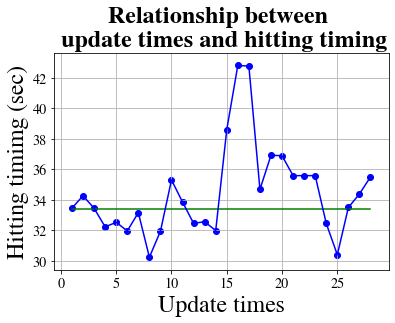

In [36]:
plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((arr_pred_possible.shape[0],))*vis_hitting_point[3]), color='green') #vis
plt.plot(cp.asnumpy(update_times), cp.asnumpy(z), color='blue') #pred
plt.scatter(cp.asnumpy(update_times), cp.asnumpy(z), color='blue')
plt.grid(True)
plt.xticks(fontsize=14, fontname='FreeSerif')
plt.yticks(fontsize=14, fontname='FreeSerif')
plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
plt.ylabel('Hitting timimg (sec)', fontsize=24, fontname='FreeSerif')
plt.title('Relationship between \n update times and hitting timing', fontsize=24, fontweight='bold', fontname='FreeSerif')